<a href="https://colab.research.google.com/github/SHUB-1806/Yoga_Pose_Detection/blob/main/modified_main_model.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install opendatasets
!pip install mediapipe
!pip install tensorflow

In [ ]:
import os
import cv2
import numpy as np
import tensorflow as tf
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import train_test_split
import random

/usr/local/lib/python3.12/dist-packages/jaxlib/plugin_support.py:71: RuntimeWarning: JAX plugin jax_cuda12_plugin version 0.7.2 is installed, but it is not compatible with the installed jaxlib version 0.7.1, so it will not be used.
  warnings.warn(


In [ ]:

# import opendatasets as od
# import pandas

# od.download(
#     "https://www.kaggle.com/datasets/tr1gg3rtrash/yoga-posture-dataset")



Dataset URL: https://www.kaggle.com/datasets/tr1gg3rtrash/yoga-posture-dataset


100%|██████████| 447M/447M [00:00<00:00, 490MB/s]

In [ ]:
import zipfile
import os

zip_path = "/content/yoga_dataset_links.zip"  # change name if different
extract_path = "/content"

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

print("✅ Extracted files:")
os.listdir(extract_path)


✅ Extracted files:


['.config', 'yoga_dataset_links', 'yoga_dataset_links.zip', 'sample_data']

In [ ]:
import os
import requests
from tqdm import tqdm

txt_folder = "/content/yoga_dataset_links"  # where .txt files are stored
output_folder = "/content/yoga_dataset_images"
os.makedirs(output_folder, exist_ok=True)

for txt_file in os.listdir(txt_folder):
    if txt_file.endswith(".txt"):
        pose_name = os.path.splitext(txt_file)[0]
        pose_dir = os.path.join(output_folder, pose_name)
        os.makedirs(pose_dir, exist_ok=True)

        txt_path = os.path.join(txt_folder, txt_file)
        print(f"\n📂 Downloading images for: {pose_name}")

        with open(txt_path, "r") as f:
            urls = f.read().split()

        for i, url in enumerate(tqdm(urls)):
            try:
                response = requests.get(url.strip(), timeout=10)
                if response.status_code == 200:
                    img_path = os.path.join(pose_dir, f"{pose_name}_{i}.jpg")
                    with open(img_path, "wb") as img_file:
                        img_file.write(response.content)
            except Exception as e:
                print(f"❌ Error downloading {url}: {e}")



📂 Downloading images for: Child_Pose_or_Balasana_


  0%|          | 0/1000 [00:00<?, ?it/s]

❌ Error downloading Child_Pose_or_Balasana_/631.jpg: Invalid URL 'Child_Pose_or_Balasana_/631.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/631.jpg?


  0%|          | 4/1000 [00:00<02:32,  6.53it/s]

❌ Error downloading Child_Pose_or_Balasana_/630.jpg: Invalid URL 'Child_Pose_or_Balasana_/630.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/630.jpg?
❌ Error downloading Child_Pose_or_Balasana_/629.jpg: Invalid URL 'Child_Pose_or_Balasana_/629.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/629.jpg?


  1%|          | 6/1000 [00:01<03:01,  5.46it/s]

❌ Error downloading https://gezond10.nl/wp-content/uploads/Child-pose-Balasana-yoga-oefeningen.jpeg: HTTPSConnectionPool(host='gezond10.nl', port=443): Max retries exceeded with url: /wp-content/uploads/Child-pose-Balasana-yoga-oefeningen.jpeg (Caused by SSLError(SSLCertVerificationError(1, "[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: Hostname mismatch, certificate is not valid for 'gezond10.nl'. (_ssl.c:1010)")))
❌ Error downloading Child_Pose_or_Balasana_/628.jpg: Invalid URL 'Child_Pose_or_Balasana_/628.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/628.jpg?
❌ Error downloading http://2a95f33gcbe84e7xts44t17a.wpengine.netdna-cdn.com/wp-content/uploads/2016/06/Kelly_4.jpg: HTTPConnectionPool(host='2a95f33gcbe84e7xts44t17a.wpengine.netdna-cdn.com', port=80): Max retries exceeded with url: /wp-content/uploads/2016/06/Kelly_4.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090d8e00>: Failed to resolve '2

  1%|          | 10/1000 [00:01<02:29,  6.62it/s]

❌ Error downloading Child_Pose_or_Balasana_/624.jpg: Invalid URL 'Child_Pose_or_Balasana_/624.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/624.jpg?


  1%|▏         | 14/1000 [00:02<02:35,  6.34it/s]

❌ Error downloading Child_Pose_or_Balasana_/620.jpg: Invalid URL 'Child_Pose_or_Balasana_/620.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/620.jpg?
❌ Error downloading Child_Pose_or_Balasana_/619.jpg: Invalid URL 'Child_Pose_or_Balasana_/619.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/619.jpg?


  2%|▏         | 16/1000 [00:03<04:40,  3.51it/s]

❌ Error downloading Child_Pose_or_Balasana_/616.jpg: Invalid URL 'Child_Pose_or_Balasana_/616.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/616.jpg?


  2%|▏         | 20/1000 [00:04<03:22,  4.84it/s]

❌ Error downloading Child_Pose_or_Balasana_/615.jpg: Invalid URL 'Child_Pose_or_Balasana_/615.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/615.jpg?
❌ Error downloading Child_Pose_or_Balasana_/612.jpg: Invalid URL 'Child_Pose_or_Balasana_/612.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/612.jpg?


  3%|▎         | 26/1000 [00:04<02:04,  7.80it/s]

❌ Error downloading Child_Pose_or_Balasana_/610.jpg: Invalid URL 'Child_Pose_or_Balasana_/610.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/610.jpg?
❌ Error downloading Child_Pose_or_Balasana_/609.jpg: Invalid URL 'Child_Pose_or_Balasana_/609.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/609.jpg?
❌ Error downloading https://www.sublimelyfit.com/wp-content/uploads/2018/08/Yoga-Sequence-for-Feet-and-Ankles-Childs-Pose.png: HTTPSConnectionPool(host='www.sublimelyfit.com', port=443): Max retries exceeded with url: /wp-content/uploads/2018/08/Yoga-Sequence-for-Feet-and-Ankles-Childs-Pose.png (Caused by SSLError(SSLCertVerificationError(1, "[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: Hostname mismatch, certificate is not valid for 'www.sublimelyfit.com'. (_ssl.c:1010)")))
❌ Error downloading Child_Pose_or_Balasana_/606.jpg: Invalid URL 'Child_Pose_or_Balasana_/606.jpg': No scheme supplied. Perhaps you meant https://C

  3%|▎         | 28/1000 [00:04<01:46,  9.17it/s]

❌ Error downloading Child_Pose_or_Balasana_/605.jpg: Invalid URL 'Child_Pose_or_Balasana_/605.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/605.jpg?


  3%|▎         | 32/1000 [00:05<02:35,  6.21it/s]

❌ Error downloading Child_Pose_or_Balasana_/604.jpg: Invalid URL 'Child_Pose_or_Balasana_/604.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/604.jpg?
❌ Error downloading Child_Pose_or_Balasana_/0_601.jpg: Invalid URL 'Child_Pose_or_Balasana_/0_601.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/0_601.jpg?


  3%|▎         | 34/1000 [00:05<02:16,  7.07it/s]

❌ Error downloading Child_Pose_or_Balasana_/600.jpg: Invalid URL 'Child_Pose_or_Balasana_/600.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/600.jpg?


  4%|▍         | 38/1000 [00:06<02:05,  7.65it/s]

❌ Error downloading Child_Pose_or_Balasana_/599.jpg: Invalid URL 'Child_Pose_or_Balasana_/599.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/599.jpg?
❌ Error downloading Child_Pose_or_Balasana_/598.jpg: Invalid URL 'Child_Pose_or_Balasana_/598.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/598.jpg?


  4%|▍         | 40/1000 [00:06<01:56,  8.24it/s]

❌ Error downloading Child_Pose_or_Balasana_/597.jpg: Invalid URL 'Child_Pose_or_Balasana_/597.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/597.jpg?


  4%|▍         | 42/1000 [00:07<02:18,  6.91it/s]

❌ Error downloading Child_Pose_or_Balasana_/596.jpg: Invalid URL 'Child_Pose_or_Balasana_/596.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/596.jpg?


  4%|▍         | 44/1000 [00:07<02:40,  5.95it/s]

❌ Error downloading Child_Pose_or_Balasana_/595.jpg: Invalid URL 'Child_Pose_or_Balasana_/595.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/595.jpg?


  5%|▍         | 46/1000 [00:08<04:15,  3.74it/s]

❌ Error downloading Child_Pose_or_Balasana_/594.jpg: Invalid URL 'Child_Pose_or_Balasana_/594.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/594.jpg?


  5%|▍         | 48/1000 [00:09<04:21,  3.64it/s]

❌ Error downloading Child_Pose_or_Balasana_/592.jpg: Invalid URL 'Child_Pose_or_Balasana_/592.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/592.jpg?
❌ Error downloading Child_Pose_or_Balasana_/591.jpg: Invalid URL 'Child_Pose_or_Balasana_/591.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/591.jpg?


  5%|▌         | 54/1000 [00:09<02:30,  6.29it/s]

❌ Error downloading Child_Pose_or_Balasana_/589.jpg: Invalid URL 'Child_Pose_or_Balasana_/589.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/589.jpg?
❌ Error downloading Child_Pose_or_Balasana_/588.jpg: Invalid URL 'Child_Pose_or_Balasana_/588.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/588.jpg?
❌ Error downloading http://cdn-img.health.com/sites/default/files/styles/400x400/public/styles/400x400/public/styles/main/public/child-pose-400x400.jpg?itok=iI5TqUU2: HTTPConnectionPool(host='cdn-img.health.com', port=80): Max retries exceeded with url: /sites/default/files/styles/400x400/public/styles/400x400/public/styles/main/public/child-pose-400x400.jpg?itok=iI5TqUU2 (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090dbd10>: Failed to resolve 'cdn-img.health.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Child_Pose_or_Balasana_/587.jpg: Invalid URL 'Child_Pose_or_Balasana_/58

  6%|▌         | 58/1000 [00:10<02:24,  6.52it/s]

❌ Error downloading Child_Pose_or_Balasana_/0_584.jpg: Invalid URL 'Child_Pose_or_Balasana_/0_584.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/0_584.jpg?


  6%|▌         | 60/1000 [00:11<03:39,  4.28it/s]

❌ Error downloading Child_Pose_or_Balasana_/583.jpg: Invalid URL 'Child_Pose_or_Balasana_/583.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/583.jpg?


  6%|▌         | 62/1000 [00:11<03:30,  4.45it/s]

❌ Error downloading Child_Pose_or_Balasana_/582.jpg: Invalid URL 'Child_Pose_or_Balasana_/582.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/582.jpg?
❌ Error downloading Child_Pose_or_Balasana_/581.jpg: Invalid URL 'Child_Pose_or_Balasana_/581.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/581.jpg?


  7%|▋         | 68/1000 [00:12<02:15,  6.86it/s]

❌ Error downloading Child_Pose_or_Balasana_/0_580.jpg: Invalid URL 'Child_Pose_or_Balasana_/0_580.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/0_580.jpg?
❌ Error downloading Child_Pose_or_Balasana_/579.jpg: Invalid URL 'Child_Pose_or_Balasana_/579.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/579.jpg?


  7%|▋         | 72/1000 [00:12<02:07,  7.28it/s]

❌ Error downloading Child_Pose_or_Balasana_/578.jpg: Invalid URL 'Child_Pose_or_Balasana_/578.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/578.jpg?
❌ Error downloading Child_Pose_or_Balasana_/577.jpg: Invalid URL 'Child_Pose_or_Balasana_/577.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/577.jpg?


  7%|▋         | 74/1000 [00:12<02:16,  6.80it/s]

❌ Error downloading Child_Pose_or_Balasana_/576.jpg: Invalid URL 'Child_Pose_or_Balasana_/576.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/576.jpg?


  8%|▊         | 78/1000 [00:13<02:24,  6.39it/s]

❌ Error downloading Child_Pose_or_Balasana_/575.jpg: Invalid URL 'Child_Pose_or_Balasana_/575.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/575.jpg?
❌ Error downloading Child_Pose_or_Balasana_/574.jpg: Invalid URL 'Child_Pose_or_Balasana_/574.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/574.jpg?


  8%|▊         | 80/1000 [00:13<01:55,  7.94it/s]

❌ Error downloading Child_Pose_or_Balasana_/573.jpg: Invalid URL 'Child_Pose_or_Balasana_/573.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/573.jpg?


  8%|▊         | 82/1000 [00:16<06:51,  2.23it/s]

❌ Error downloading Child_Pose_or_Balasana_/572.jpg: Invalid URL 'Child_Pose_or_Balasana_/572.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/572.jpg?


  8%|▊         | 84/1000 [00:17<07:41,  1.98it/s]

❌ Error downloading Child_Pose_or_Balasana_/571.jpg: Invalid URL 'Child_Pose_or_Balasana_/571.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/571.jpg?
❌ Error downloading https://www.healthy-strong.com/images/childs-pose.jpg: HTTPSConnectionPool(host='www.healthy-strong.com', port=443): Max retries exceeded with url: /images/childs-pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d090dbe90>: Failed to resolve 'www.healthy-strong.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Child_Pose_or_Balasana_/569.jpg: Invalid URL 'Child_Pose_or_Balasana_/569.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/569.jpg?


  9%|▉         | 88/1000 [00:18<06:21,  2.39it/s]

❌ Error downloading Child_Pose_or_Balasana_/568.jpg: Invalid URL 'Child_Pose_or_Balasana_/568.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/568.jpg?


  9%|▉         | 92/1000 [00:19<04:09,  3.64it/s]

❌ Error downloading Child_Pose_or_Balasana_/567.jpg: Invalid URL 'Child_Pose_or_Balasana_/567.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/567.jpg?
❌ Error downloading Child_Pose_or_Balasana_/566.jpg: Invalid URL 'Child_Pose_or_Balasana_/566.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/566.jpg?


 10%|▉         | 96/1000 [00:19<03:07,  4.81it/s]

❌ Error downloading Child_Pose_or_Balasana_/565.jpg: Invalid URL 'Child_Pose_or_Balasana_/565.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/565.jpg?
❌ Error downloading Child_Pose_or_Balasana_/564.jpg: Invalid URL 'Child_Pose_or_Balasana_/564.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/564.jpg?


 10%|▉         | 98/1000 [00:21<05:01,  2.99it/s]

❌ Error downloading Child_Pose_or_Balasana_/563.jpg: Invalid URL 'Child_Pose_or_Balasana_/563.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/563.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/restore_270_02_800x450.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/restore_270_02_800x450.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090e4ec0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Child_Pose_or_Balasana_/562.jpg: Invalid URL 'Child_Pose_or_Balasana_/562.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/562.jpg?


 10%|█         | 104/1000 [00:22<03:39,  4.09it/s]

❌ Error downloading Child_Pose_or_Balasana_/0_561.jpg: Invalid URL 'Child_Pose_or_Balasana_/0_561.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/0_561.jpg?
❌ Error downloading Child_Pose_or_Balasana_/560.jpg: Invalid URL 'Child_Pose_or_Balasana_/560.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/560.jpg?
❌ Error downloading Child_Pose_or_Balasana_/559.jpg: Invalid URL 'Child_Pose_or_Balasana_/559.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/559.jpg?


 11%|█         | 108/1000 [00:22<02:40,  5.56it/s]

❌ Error downloading Child_Pose_or_Balasana_/558.jpg: Invalid URL 'Child_Pose_or_Balasana_/558.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/558.jpg?


 11%|█         | 110/1000 [00:23<03:18,  4.48it/s]

❌ Error downloading Child_Pose_or_Balasana_/557.jpg: Invalid URL 'Child_Pose_or_Balasana_/557.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/557.jpg?


 11%|█         | 112/1000 [00:23<03:13,  4.60it/s]

❌ Error downloading Child_Pose_or_Balasana_/556.jpg: Invalid URL 'Child_Pose_or_Balasana_/556.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/556.jpg?


 11%|█▏        | 114/1000 [00:25<05:13,  2.82it/s]

❌ Error downloading Child_Pose_or_Balasana_/555.jpg: Invalid URL 'Child_Pose_or_Balasana_/555.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/555.jpg?


 12%|█▏        | 116/1000 [00:25<04:24,  3.34it/s]

❌ Error downloading Child_Pose_or_Balasana_/553.jpg: Invalid URL 'Child_Pose_or_Balasana_/553.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/553.jpg?


 12%|█▏        | 118/1000 [00:25<03:47,  3.88it/s]

❌ Error downloading Child_Pose_or_Balasana_/552.jpg: Invalid URL 'Child_Pose_or_Balasana_/552.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/552.jpg?
❌ Error downloading Child_Pose_or_Balasana_/550.jpg: Invalid URL 'Child_Pose_or_Balasana_/550.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/550.jpg?


 12%|█▏        | 122/1000 [00:26<02:36,  5.61it/s]

❌ Error downloading Child_Pose_or_Balasana_/548.jpg: Invalid URL 'Child_Pose_or_Balasana_/548.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/548.jpg?


 12%|█▏        | 124/1000 [00:27<03:31,  4.14it/s]

❌ Error downloading Child_Pose_or_Balasana_/547.jpg: Invalid URL 'Child_Pose_or_Balasana_/547.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/547.jpg?


 13%|█▎        | 126/1000 [00:27<03:10,  4.59it/s]

❌ Error downloading http://usercontent1.hubimg.com/12487358_f520.jpg: HTTPSConnectionPool(host='usercontent1.hubimg.com', port=443): Max retries exceeded with url: /12487358_f520.jpg (Caused by SSLError(SSLCertVerificationError(1, "[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: Hostname mismatch, certificate is not valid for 'usercontent1.hubimg.com'. (_ssl.c:1010)")))
❌ Error downloading Child_Pose_or_Balasana_/546.jpg: Invalid URL 'Child_Pose_or_Balasana_/546.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/546.jpg?


 13%|█▎        | 130/1000 [00:28<02:42,  5.37it/s]

❌ Error downloading Child_Pose_or_Balasana_/545.jpg: Invalid URL 'Child_Pose_or_Balasana_/545.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/545.jpg?
❌ Error downloading Child_Pose_or_Balasana_/544.jpg: Invalid URL 'Child_Pose_or_Balasana_/544.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/544.jpg?


 13%|█▎        | 132/1000 [00:28<02:22,  6.07it/s]

❌ Error downloading Child_Pose_or_Balasana_/0_543.jpg: Invalid URL 'Child_Pose_or_Balasana_/0_543.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/0_543.jpg?


 13%|█▎        | 134/1000 [00:28<02:13,  6.51it/s]

❌ Error downloading Child_Pose_or_Balasana_/542.jpg: Invalid URL 'Child_Pose_or_Balasana_/542.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/542.jpg?


 14%|█▎        | 136/1000 [00:28<02:07,  6.78it/s]

❌ Error downloading Child_Pose_or_Balasana_/541.jpg: Invalid URL 'Child_Pose_or_Balasana_/541.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/541.jpg?


 14%|█▍        | 138/1000 [00:28<01:59,  7.24it/s]

❌ Error downloading Child_Pose_or_Balasana_/540.jpg: Invalid URL 'Child_Pose_or_Balasana_/540.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/540.jpg?


 14%|█▍        | 140/1000 [00:29<02:05,  6.85it/s]

❌ Error downloading Child_Pose_or_Balasana_/539.jpg: Invalid URL 'Child_Pose_or_Balasana_/539.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/539.jpg?


 14%|█▍        | 142/1000 [00:29<01:59,  7.17it/s]

❌ Error downloading Child_Pose_or_Balasana_/538.jpg: Invalid URL 'Child_Pose_or_Balasana_/538.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/538.jpg?


 14%|█▍        | 144/1000 [00:30<03:46,  3.78it/s]

❌ Error downloading Child_Pose_or_Balasana_/535.jpg: Invalid URL 'Child_Pose_or_Balasana_/535.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/535.jpg?


 15%|█▍        | 148/1000 [00:31<02:28,  5.73it/s]

❌ Error downloading Child_Pose_or_Balasana_/0_533.jpg: Invalid URL 'Child_Pose_or_Balasana_/0_533.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/0_533.jpg?
❌ Error downloading Child_Pose_or_Balasana_/532.jpg: Invalid URL 'Child_Pose_or_Balasana_/532.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/532.jpg?


 15%|█▌        | 150/1000 [00:41<23:05,  1.63s/it]

❌ Error downloading https://www.ekhartyoga.com/media/images/vinyasaforbeginners.jpg: HTTPSConnectionPool(host='www.ekhartyoga.com', port=443): Read timed out. (read timeout=10)
❌ Error downloading Child_Pose_or_Balasana_/531.jpg: Invalid URL 'Child_Pose_or_Balasana_/531.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/531.jpg?


 15%|█▌        | 154/1000 [00:41<12:27,  1.13it/s]

❌ Error downloading Child_Pose_or_Balasana_/529.jpg: Invalid URL 'Child_Pose_or_Balasana_/529.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/529.jpg?
❌ Error downloading Child_Pose_or_Balasana_/528.jpg: Invalid URL 'Child_Pose_or_Balasana_/528.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/528.jpg?


 16%|█▌        | 156/1000 [00:42<09:26,  1.49it/s]

❌ Error downloading Child_Pose_or_Balasana_/527.jpg: Invalid URL 'Child_Pose_or_Balasana_/527.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/527.jpg?
❌ Error downloading Child_Pose_or_Balasana_/0_525.jpg: Invalid URL 'Child_Pose_or_Balasana_/0_525.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/0_525.jpg?


 16%|█▌        | 160/1000 [00:42<05:24,  2.59it/s]

❌ Error downloading Child_Pose_or_Balasana_/524.jpg: Invalid URL 'Child_Pose_or_Balasana_/524.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/524.jpg?


 16%|█▌        | 162/1000 [00:43<06:30,  2.15it/s]

❌ Error downloading Child_Pose_or_Balasana_/520.jpg: Invalid URL 'Child_Pose_or_Balasana_/520.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/520.jpg?


 17%|█▋        | 168/1000 [00:45<04:00,  3.46it/s]

❌ Error downloading Child_Pose_or_Balasana_/519.jpg: Invalid URL 'Child_Pose_or_Balasana_/519.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/519.jpg?
❌ Error downloading https://love.yogapaws.com/hs-fs/hub/13108/file-13134363-jpg/images/dsc_2198.jpg?t=1518400470810: HTTPSConnectionPool(host='love.yogapaws.com', port=443): Max retries exceeded with url: /hs-fs/hub/13108/file-13134363-jpg/images/dsc_2198.jpg?t=1518400470810 (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d090db0e0>: Failed to resolve 'love.yogapaws.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Child_Pose_or_Balasana_/518.jpg: Invalid URL 'Child_Pose_or_Balasana_/518.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/518.jpg?
❌ Error downloading Child_Pose_or_Balasana_/517.jpg: Invalid URL 'Child_Pose_or_Balasana_/517.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/517.jpg?


 17%|█▋        | 170/1000 [00:45<03:18,  4.19it/s]

❌ Error downloading Child_Pose_or_Balasana_/0_516.jpg: Invalid URL 'Child_Pose_or_Balasana_/0_516.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/0_516.jpg?


 17%|█▋        | 174/1000 [00:45<02:44,  5.03it/s]

❌ Error downloading Child_Pose_or_Balasana_/515.jpg: Invalid URL 'Child_Pose_or_Balasana_/515.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/515.jpg?
❌ Error downloading Child_Pose_or_Balasana_/514.jpg: Invalid URL 'Child_Pose_or_Balasana_/514.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/514.jpg?


 18%|█▊        | 176/1000 [00:46<02:49,  4.87it/s]

❌ Error downloading Child_Pose_or_Balasana_/513.jpg: Invalid URL 'Child_Pose_or_Balasana_/513.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/513.jpg?


 18%|█▊        | 178/1000 [00:46<03:18,  4.15it/s]

❌ Error downloading Child_Pose_or_Balasana_/0_511.jpg: Invalid URL 'Child_Pose_or_Balasana_/0_511.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/0_511.jpg?


 18%|█▊        | 180/1000 [00:47<02:51,  4.79it/s]

❌ Error downloading Child_Pose_or_Balasana_/510.jpg: Invalid URL 'Child_Pose_or_Balasana_/510.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/510.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/Two-Fit-Moms-in-Childs-Pose.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/Two-Fit-Moms-in-Childs-Pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090d9fd0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Child_Pose_or_Balasana_/509.jpg: Invalid URL 'Child_Pose_or_Balasana_/509.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/509.jpg?


 18%|█▊        | 184/1000 [00:48<03:31,  3.85it/s]

❌ Error downloading Child_Pose_or_Balasana_/507.jpg: Invalid URL 'Child_Pose_or_Balasana_/507.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/507.jpg?


 19%|█▊        | 186/1000 [00:49<04:26,  3.05it/s]

❌ Error downloading Child_Pose_or_Balasana_/506.jpg: Invalid URL 'Child_Pose_or_Balasana_/506.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/506.jpg?


 19%|█▉        | 188/1000 [00:51<06:33,  2.06it/s]

❌ Error downloading Child_Pose_or_Balasana_/505.jpg: Invalid URL 'Child_Pose_or_Balasana_/505.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/505.jpg?


 19%|█▉        | 192/1000 [00:51<03:58,  3.39it/s]

❌ Error downloading Child_Pose_or_Balasana_/0_504.jpg: Invalid URL 'Child_Pose_or_Balasana_/0_504.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/0_504.jpg?
❌ Error downloading Child_Pose_or_Balasana_/501.jpg: Invalid URL 'Child_Pose_or_Balasana_/501.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/501.jpg?


 20%|█▉        | 196/1000 [00:52<02:24,  5.56it/s]

❌ Error downloading Child_Pose_or_Balasana_/500.jpg: Invalid URL 'Child_Pose_or_Balasana_/500.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/500.jpg?
❌ Error downloading Child_Pose_or_Balasana_/499.jpg: Invalid URL 'Child_Pose_or_Balasana_/499.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/499.jpg?


 20%|█▉        | 198/1000 [00:52<03:00,  4.44it/s]

❌ Error downloading Child_Pose_or_Balasana_/497.jpg: Invalid URL 'Child_Pose_or_Balasana_/497.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/497.jpg?


 20%|██        | 202/1000 [00:53<02:06,  6.30it/s]

❌ Error downloading Child_Pose_or_Balasana_/496.jpg: Invalid URL 'Child_Pose_or_Balasana_/496.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/496.jpg?
❌ Error downloading Child_Pose_or_Balasana_/495.jpg: Invalid URL 'Child_Pose_or_Balasana_/495.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/495.jpg?


 20%|██        | 204/1000 [00:54<03:23,  3.92it/s]

❌ Error downloading Child_Pose_or_Balasana_/0_494.jpg: Invalid URL 'Child_Pose_or_Balasana_/0_494.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/0_494.jpg?


 21%|██        | 208/1000 [00:54<02:41,  4.91it/s]

❌ Error downloading Child_Pose_or_Balasana_/492.jpg: Invalid URL 'Child_Pose_or_Balasana_/492.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/492.jpg?
❌ Error downloading Child_Pose_or_Balasana_/491.jpg: Invalid URL 'Child_Pose_or_Balasana_/491.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/491.jpg?


 21%|██        | 212/1000 [00:55<01:52,  7.03it/s]

❌ Error downloading Child_Pose_or_Balasana_/489.jpg: Invalid URL 'Child_Pose_or_Balasana_/489.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/489.jpg?
❌ Error downloading Child_Pose_or_Balasana_/0_487.jpg: Invalid URL 'Child_Pose_or_Balasana_/0_487.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/0_487.jpg?


 22%|██▏       | 216/1000 [00:57<03:57,  3.31it/s]

❌ Error downloading Child_Pose_or_Balasana_/486.jpg: Invalid URL 'Child_Pose_or_Balasana_/486.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/486.jpg?
❌ Error downloading Child_Pose_or_Balasana_/485.jpg: Invalid URL 'Child_Pose_or_Balasana_/485.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/485.jpg?


 22%|██▏       | 218/1000 [00:58<05:04,  2.57it/s]

❌ Error downloading Child_Pose_or_Balasana_/484.jpg: Invalid URL 'Child_Pose_or_Balasana_/484.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/484.jpg?


 22%|██▏       | 222/1000 [01:00<04:32,  2.85it/s]

❌ Error downloading Child_Pose_or_Balasana_/483.jpg: Invalid URL 'Child_Pose_or_Balasana_/483.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/483.jpg?
❌ Error downloading Child_Pose_or_Balasana_/482.jpg: Invalid URL 'Child_Pose_or_Balasana_/482.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/482.jpg?


 22%|██▏       | 224/1000 [01:00<03:49,  3.38it/s]

❌ Error downloading Child_Pose_or_Balasana_/481.jpg: Invalid URL 'Child_Pose_or_Balasana_/481.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/481.jpg?


 23%|██▎       | 226/1000 [01:01<03:56,  3.27it/s]

❌ Error downloading Child_Pose_or_Balasana_/480.jpg: Invalid URL 'Child_Pose_or_Balasana_/480.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/480.jpg?


 23%|██▎       | 230/1000 [01:02<03:41,  3.48it/s]

❌ Error downloading Child_Pose_or_Balasana_/478.jpg: Invalid URL 'Child_Pose_or_Balasana_/478.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/478.jpg?
❌ Error downloading Child_Pose_or_Balasana_/477.jpg: Invalid URL 'Child_Pose_or_Balasana_/477.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/477.jpg?


 23%|██▎       | 232/1000 [01:02<03:14,  3.94it/s]

❌ Error downloading Child_Pose_or_Balasana_/476.jpg: Invalid URL 'Child_Pose_or_Balasana_/476.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/476.jpg?


 23%|██▎       | 234/1000 [01:02<02:43,  4.68it/s]

❌ Error downloading Child_Pose_or_Balasana_/475.jpg: Invalid URL 'Child_Pose_or_Balasana_/475.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/475.jpg?


 24%|██▍       | 238/1000 [01:03<02:15,  5.64it/s]

❌ Error downloading Child_Pose_or_Balasana_/474.jpg: Invalid URL 'Child_Pose_or_Balasana_/474.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/474.jpg?
❌ Error downloading Child_Pose_or_Balasana_/473.jpg: Invalid URL 'Child_Pose_or_Balasana_/473.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/473.jpg?


 24%|██▍       | 240/1000 [01:03<01:53,  6.70it/s]

❌ Error downloading Child_Pose_or_Balasana_/472.jpg: Invalid URL 'Child_Pose_or_Balasana_/472.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/472.jpg?
❌ Error downloading Child_Pose_or_Balasana_/470.jpg: Invalid URL 'Child_Pose_or_Balasana_/470.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/470.jpg?


 24%|██▍       | 244/1000 [01:05<03:04,  4.09it/s]

❌ Error downloading Child_Pose_or_Balasana_/0_467.jpg: Invalid URL 'Child_Pose_or_Balasana_/0_467.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/0_467.jpg?


 25%|██▍       | 246/1000 [01:05<02:40,  4.69it/s]

❌ Error downloading Child_Pose_or_Balasana_/464.jpg: Invalid URL 'Child_Pose_or_Balasana_/464.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/464.jpg?


 25%|██▍       | 248/1000 [01:05<02:33,  4.89it/s]

❌ Error downloading Child_Pose_or_Balasana_/462.jpg: Invalid URL 'Child_Pose_or_Balasana_/462.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/462.jpg?
❌ Error downloading http://files.mom.me/photos/2014/08/26/122-76875-blogher_yoga_childs_pose_0-1409088767.jpg: HTTPConnectionPool(host='files.mom.me', port=80): Max retries exceeded with url: /photos/2014/08/26/122-76875-blogher_yoga_childs_pose_0-1409088767.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090e6210>: Failed to resolve 'files.mom.me' ([Errno -2] Name or service not known)"))
❌ Error downloading Child_Pose_or_Balasana_/461.jpg: Invalid URL 'Child_Pose_or_Balasana_/461.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/461.jpg?


 25%|██▌       | 254/1000 [01:06<02:10,  5.73it/s]

❌ Error downloading Child_Pose_or_Balasana_/457.jpg: Invalid URL 'Child_Pose_or_Balasana_/457.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/457.jpg?
❌ Error downloading Child_Pose_or_Balasana_/456.jpg: Invalid URL 'Child_Pose_or_Balasana_/456.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/456.jpg?


 26%|██▌       | 256/1000 [01:06<01:50,  6.73it/s]

❌ Error downloading Child_Pose_or_Balasana_/455.jpg: Invalid URL 'Child_Pose_or_Balasana_/455.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/455.jpg?


 26%|██▌       | 260/1000 [01:07<01:37,  7.61it/s]

❌ Error downloading Child_Pose_or_Balasana_/454.jpg: Invalid URL 'Child_Pose_or_Balasana_/454.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/454.jpg?
❌ Error downloading Child_Pose_or_Balasana_/453.jpg: Invalid URL 'Child_Pose_or_Balasana_/453.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/453.jpg?


 27%|██▋       | 266/1000 [01:07<01:14,  9.83it/s]

❌ Error downloading Child_Pose_or_Balasana_/452.jpg: Invalid URL 'Child_Pose_or_Balasana_/452.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/452.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/Boundaries_284_655_FNL.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/Boundaries_284_655_FNL.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090e6660>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Child_Pose_or_Balasana_/451.jpg: Invalid URL 'Child_Pose_or_Balasana_/451.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/451.jpg?
❌ Error downloading Child_Pose_or_Balasana_/450.jpg: Invalid URL 'Child_Pose_or_Balasana_/450.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/450.jpg?


 27%|██▋       | 268/1000 [01:08<01:13,  9.94it/s]

❌ Error downloading Child_Pose_or_Balasana_/448.jpg: Invalid URL 'Child_Pose_or_Balasana_/448.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/448.jpg?
❌ Error downloading Child_Pose_or_Balasana_/447.jpg: Invalid URL 'Child_Pose_or_Balasana_/447.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/447.jpg?


 27%|██▋       | 274/1000 [01:08<00:58, 12.40it/s]

❌ Error downloading Child_Pose_or_Balasana_/446.jpg: Invalid URL 'Child_Pose_or_Balasana_/446.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/446.jpg?
❌ Error downloading Child_Pose_or_Balasana_/440.jpg: Invalid URL 'Child_Pose_or_Balasana_/440.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/440.jpg?


 28%|██▊       | 276/1000 [01:09<02:34,  4.70it/s]

❌ Error downloading Child_Pose_or_Balasana_/0_439.jpg: Invalid URL 'Child_Pose_or_Balasana_/0_439.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/0_439.jpg?


 28%|██▊       | 278/1000 [01:10<02:35,  4.63it/s]

❌ Error downloading Child_Pose_or_Balasana_/438.jpg: Invalid URL 'Child_Pose_or_Balasana_/438.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/438.jpg?


 28%|██▊       | 280/1000 [01:10<02:19,  5.18it/s]

❌ Error downloading Child_Pose_or_Balasana_/436.jpg: Invalid URL 'Child_Pose_or_Balasana_/436.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/436.jpg?


 28%|██▊       | 284/1000 [01:10<01:54,  6.25it/s]

❌ Error downloading Child_Pose_or_Balasana_/435.jpg: Invalid URL 'Child_Pose_or_Balasana_/435.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/435.jpg?
❌ Error downloading Child_Pose_or_Balasana_/433.jpg: Invalid URL 'Child_Pose_or_Balasana_/433.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/433.jpg?


 29%|██▊       | 286/1000 [01:11<02:08,  5.56it/s]

❌ Error downloading Child_Pose_or_Balasana_/432.jpg: Invalid URL 'Child_Pose_or_Balasana_/432.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/432.jpg?


 29%|██▉       | 288/1000 [01:12<03:40,  3.23it/s]

❌ Error downloading Child_Pose_or_Balasana_/430.jpg: Invalid URL 'Child_Pose_or_Balasana_/430.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/430.jpg?


 29%|██▉       | 290/1000 [01:14<05:02,  2.35it/s]

❌ Error downloading Child_Pose_or_Balasana_/0_427.jpg: Invalid URL 'Child_Pose_or_Balasana_/0_427.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/0_427.jpg?


 29%|██▉       | 292/1000 [01:14<04:11,  2.81it/s]

❌ Error downloading Child_Pose_or_Balasana_/426.jpg: Invalid URL 'Child_Pose_or_Balasana_/426.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/426.jpg?


 30%|██▉       | 296/1000 [01:15<02:55,  4.02it/s]

❌ Error downloading https://cf.beautyheaven-site-au.prod.bhn.net.au/sites/default/files/inline/YOGA-BALASANA.jpg: HTTPSConnectionPool(host='cf.beautyheaven-site-au.prod.bhn.net.au', port=443): Max retries exceeded with url: /sites/default/files/inline/YOGA-BALASANA.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d090e7320>: Failed to resolve 'cf.beautyheaven-site-au.prod.bhn.net.au' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Child_Pose_or_Balasana_/424.jpg: Invalid URL 'Child_Pose_or_Balasana_/424.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/424.jpg?
❌ Error downloading Child_Pose_or_Balasana_/423.jpg: Invalid URL 'Child_Pose_or_Balasana_/423.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/423.jpg?


 30%|██▉       | 298/1000 [01:15<02:45,  4.24it/s]

❌ Error downloading Child_Pose_or_Balasana_/421.jpg: Invalid URL 'Child_Pose_or_Balasana_/421.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/421.jpg?


 30%|███       | 300/1000 [01:15<02:41,  4.34it/s]

❌ Error downloading http://img.aws.livestrongcdn.com/ls-slideshow-main-image/cme/cme_public_images/www_livestrong_com/cdn-write.demandstudios.com/upload/image/4B/3D/7446C3D6-998A-4635-BB63-123FD7663D4B/7446C3D6-998A-4635-BB63-123FD7663D4B.jpg: HTTPConnectionPool(host='img.aws.livestrongcdn.com', port=80): Max retries exceeded with url: /ls-slideshow-main-image/cme/cme_public_images/www_livestrong_com/cdn-write.demandstudios.com/upload/image/4B/3D/7446C3D6-998A-4635-BB63-123FD7663D4B/7446C3D6-998A-4635-BB63-123FD7663D4B.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090e5910>: Failed to resolve 'img.aws.livestrongcdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Child_Pose_or_Balasana_/420.jpg: Invalid URL 'Child_Pose_or_Balasana_/420.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/420.jpg?


 30%|███       | 302/1000 [01:16<03:00,  3.87it/s]

❌ Error downloading Child_Pose_or_Balasana_/418.jpg: Invalid URL 'Child_Pose_or_Balasana_/418.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/418.jpg?


 30%|███       | 304/1000 [01:18<05:09,  2.25it/s]

❌ Error downloading Child_Pose_or_Balasana_/416.jpg: Invalid URL 'Child_Pose_or_Balasana_/416.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/416.jpg?


 31%|███       | 306/1000 [01:28<21:01,  1.82s/it]

❌ Error downloading http://cms.lotsofyoga.com/wp-content/uploads/2014/12/puppy-dog-child-pose-600x600.jpg: HTTPConnectionPool(host='cms.lotsofyoga.com', port=80): Max retries exceeded with url: /wp-content/uploads/2014/12/puppy-dog-child-pose-600x600.jpg (Caused by ConnectTimeoutError(<urllib3.connection.HTTPConnection object at 0x7c4d090d9910>, 'Connection to cms.lotsofyoga.com timed out. (connect timeout=10)'))
❌ Error downloading Child_Pose_or_Balasana_/415.jpg: Invalid URL 'Child_Pose_or_Balasana_/415.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/415.jpg?


 31%|███       | 308/1000 [01:28<15:23,  1.34s/it]

❌ Error downloading Child_Pose_or_Balasana_/414.jpg: Invalid URL 'Child_Pose_or_Balasana_/414.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/414.jpg?
❌ Error downloading Child_Pose_or_Balasana_/413.jpg: Invalid URL 'Child_Pose_or_Balasana_/413.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/413.jpg?


 31%|███       | 312/1000 [01:29<08:53,  1.29it/s]

❌ Error downloading Child_Pose_or_Balasana_/412.jpg: Invalid URL 'Child_Pose_or_Balasana_/412.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/412.jpg?
❌ Error downloading https://lifecalling.in/wp-content/uploads/2015/06/Balasana.jpg: HTTPSConnectionPool(host='lifecalling.in', port=443): Max retries exceeded with url: /wp-content/uploads/2015/06/Balasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d090e48f0>: Failed to resolve 'lifecalling.in' ([Errno -2] Name or service not known)"))
❌ Error downloading Child_Pose_or_Balasana_/410.jpg: Invalid URL 'Child_Pose_or_Balasana_/410.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/410.jpg?


 32%|███▏      | 316/1000 [01:29<05:54,  1.93it/s]

❌ Error downloading Child_Pose_or_Balasana_/409.jpg: Invalid URL 'Child_Pose_or_Balasana_/409.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/409.jpg?


 32%|███▏      | 322/1000 [01:30<03:10,  3.57it/s]

❌ Error downloading Child_Pose_or_Balasana_/407.jpg: Invalid URL 'Child_Pose_or_Balasana_/407.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/407.jpg?
❌ Error downloading Child_Pose_or_Balasana_/406.jpg: Invalid URL 'Child_Pose_or_Balasana_/406.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/406.jpg?
❌ Error downloading Child_Pose_or_Balasana_/403.jpg: Invalid URL 'Child_Pose_or_Balasana_/403.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/403.jpg?


 32%|███▏      | 324/1000 [01:30<03:03,  3.68it/s]

❌ Error downloading Child_Pose_or_Balasana_/402.jpg: Invalid URL 'Child_Pose_or_Balasana_/402.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/402.jpg?


 33%|███▎      | 326/1000 [01:31<02:56,  3.82it/s]

❌ Error downloading Child_Pose_or_Balasana_/401.jpg: Invalid URL 'Child_Pose_or_Balasana_/401.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/401.jpg?


 33%|███▎      | 328/1000 [01:32<04:07,  2.72it/s]

❌ Error downloading Child_Pose_or_Balasana_/399.jpg: Invalid URL 'Child_Pose_or_Balasana_/399.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/399.jpg?


 33%|███▎      | 330/1000 [01:32<03:38,  3.07it/s]

❌ Error downloading Child_Pose_or_Balasana_/398.jpg: Invalid URL 'Child_Pose_or_Balasana_/398.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/398.jpg?


 33%|███▎      | 334/1000 [01:33<02:21,  4.70it/s]

❌ Error downloading Child_Pose_or_Balasana_/397.jpg: Invalid URL 'Child_Pose_or_Balasana_/397.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/397.jpg?
❌ Error downloading Child_Pose_or_Balasana_/396.jpg: Invalid URL 'Child_Pose_or_Balasana_/396.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/396.jpg?


 34%|███▎      | 336/1000 [01:33<02:18,  4.79it/s]

❌ Error downloading Child_Pose_or_Balasana_/395.jpg: Invalid URL 'Child_Pose_or_Balasana_/395.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/395.jpg?
❌ Error downloading https://thefitjoy.com/wp-content/uploads/2018/06/daily-pose-child-pose-viralasana-2.png: HTTPSConnectionPool(host='thefitjoy.com', port=443): Max retries exceeded with url: /wp-content/uploads/2018/06/daily-pose-child-pose-viralasana-2.png (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09179190>: Failed to resolve 'thefitjoy.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Child_Pose_or_Balasana_/393.jpg: Invalid URL 'Child_Pose_or_Balasana_/393.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/393.jpg?


 34%|███▍      | 342/1000 [01:35<02:35,  4.24it/s]

❌ Error downloading Child_Pose_or_Balasana_/391.jpg: Invalid URL 'Child_Pose_or_Balasana_/391.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/391.jpg?
❌ Error downloading Child_Pose_or_Balasana_/390.jpg: Invalid URL 'Child_Pose_or_Balasana_/390.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/390.jpg?
❌ Error downloading https://cdn2.curejoy.com/content/wp-content/uploads/2018/04/10-BALASANA-OR-CHILD%E2%80%99S-POSE.jpg: HTTPSConnectionPool(host='cdn2.curejoy.com', port=443): Max retries exceeded with url: /content/wp-content/uploads/2018/04/10-BALASANA-OR-CHILD%E2%80%99S-POSE.jpg (Caused by SSLError(SSLCertVerificationError(1, "[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: Hostname mismatch, certificate is not valid for 'cdn2.curejoy.com'. (_ssl.c:1010)")))
❌ Error downloading Child_Pose_or_Balasana_/0_389.jpg: Invalid URL 'Child_Pose_or_Balasana_/0_389.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or

 35%|███▍      | 348/1000 [01:35<01:39,  6.53it/s]

❌ Error downloading Child_Pose_or_Balasana_/388.jpg: Invalid URL 'Child_Pose_or_Balasana_/388.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/388.jpg?
❌ Error downloading Child_Pose_or_Balasana_/387.jpg: Invalid URL 'Child_Pose_or_Balasana_/387.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/387.jpg?


 35%|███▌      | 350/1000 [01:36<01:30,  7.14it/s]

❌ Error downloading Child_Pose_or_Balasana_/386.jpg: Invalid URL 'Child_Pose_or_Balasana_/386.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/386.jpg?


 35%|███▌      | 352/1000 [01:36<01:29,  7.23it/s]

❌ Error downloading Child_Pose_or_Balasana_/383.jpg: Invalid URL 'Child_Pose_or_Balasana_/383.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/383.jpg?


 35%|███▌      | 354/1000 [01:38<04:55,  2.19it/s]

❌ Error downloading Child_Pose_or_Balasana_/0_381.jpg: Invalid URL 'Child_Pose_or_Balasana_/0_381.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/0_381.jpg?


 36%|███▌      | 356/1000 [01:39<04:08,  2.59it/s]

❌ Error downloading Child_Pose_or_Balasana_/380.jpg: Invalid URL 'Child_Pose_or_Balasana_/380.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/380.jpg?


 36%|███▌      | 358/1000 [01:39<03:51,  2.77it/s]

❌ Error downloading Child_Pose_or_Balasana_/0_378.jpg: Invalid URL 'Child_Pose_or_Balasana_/0_378.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/0_378.jpg?


 36%|███▌      | 360/1000 [01:40<03:59,  2.67it/s]

❌ Error downloading Child_Pose_or_Balasana_/377.jpg: Invalid URL 'Child_Pose_or_Balasana_/377.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/377.jpg?


 36%|███▌      | 362/1000 [01:41<03:49,  2.78it/s]

❌ Error downloading Child_Pose_or_Balasana_/376.jpg: Invalid URL 'Child_Pose_or_Balasana_/376.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/376.jpg?


 36%|███▋      | 364/1000 [01:41<03:13,  3.28it/s]

❌ Error downloading http://www.braindirector.com/wp-content/uploads/2015/12/yoga-child-pose-variation.png: ('Connection aborted.', RemoteDisconnected('Remote end closed connection without response'))
❌ Error downloading Child_Pose_or_Balasana_/374.jpg: Invalid URL 'Child_Pose_or_Balasana_/374.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/374.jpg?


 37%|███▋      | 368/1000 [01:42<02:34,  4.08it/s]

❌ Error downloading Child_Pose_or_Balasana_/372.jpg: Invalid URL 'Child_Pose_or_Balasana_/372.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/372.jpg?
❌ Error downloading Child_Pose_or_Balasana_/371.jpg: Invalid URL 'Child_Pose_or_Balasana_/371.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/371.jpg?


 37%|███▋      | 370/1000 [01:43<02:26,  4.30it/s]

❌ Error downloading Child_Pose_or_Balasana_/370.jpg: Invalid URL 'Child_Pose_or_Balasana_/370.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/370.jpg?


 37%|███▋      | 372/1000 [01:43<03:00,  3.47it/s]

❌ Error downloading Child_Pose_or_Balasana_/369.jpg: Invalid URL 'Child_Pose_or_Balasana_/369.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/369.jpg?


 37%|███▋      | 374/1000 [01:45<04:04,  2.56it/s]

❌ Error downloading Child_Pose_or_Balasana_/368.jpg: Invalid URL 'Child_Pose_or_Balasana_/368.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/368.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/childs_pose_wblock.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/childs_pose_wblock.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090da750>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Child_Pose_or_Balasana_/367.jpg: Invalid URL 'Child_Pose_or_Balasana_/367.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/367.jpg?


 38%|███▊      | 378/1000 [01:45<02:44,  3.78it/s]

❌ Error downloading Child_Pose_or_Balasana_/365.jpg: Invalid URL 'Child_Pose_or_Balasana_/365.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/365.jpg?
❌ Error downloading http://www.yogiclogic.com/images/balasana.jpg: HTTPConnectionPool(host='www.yogiclogic.com', port=80): Max retries exceeded with url: /images/balasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090d93a0>: Failed to resolve 'www.yogiclogic.com' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Child_Pose_or_Balasana_/363.jpg: Invalid URL 'Child_Pose_or_Balasana_/363.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/363.jpg?


 38%|███▊      | 382/1000 [01:46<02:38,  3.90it/s]

❌ Error downloading Child_Pose_or_Balasana_/362.jpg: Invalid URL 'Child_Pose_or_Balasana_/362.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/362.jpg?


 38%|███▊      | 384/1000 [01:46<02:20,  4.39it/s]

❌ Error downloading Child_Pose_or_Balasana_/361.jpg: Invalid URL 'Child_Pose_or_Balasana_/361.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/361.jpg?


 39%|███▉      | 388/1000 [01:47<01:47,  5.70it/s]

❌ Error downloading Child_Pose_or_Balasana_/360.jpg: Invalid URL 'Child_Pose_or_Balasana_/360.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/360.jpg?
❌ Error downloading Child_Pose_or_Balasana_/358.jpg: Invalid URL 'Child_Pose_or_Balasana_/358.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/358.jpg?


 39%|███▉      | 392/1000 [01:48<01:54,  5.29it/s]

❌ Error downloading Child_Pose_or_Balasana_/356.jpg: Invalid URL 'Child_Pose_or_Balasana_/356.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/356.jpg?
❌ Error downloading Child_Pose_or_Balasana_/355.jpg: Invalid URL 'Child_Pose_or_Balasana_/355.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/355.jpg?


 39%|███▉      | 394/1000 [01:48<01:34,  6.44it/s]

❌ Error downloading https://cdn.xl.thumbs.canstockphoto.com/woman-doing-the-childs-pose-balasana-woman-doing-the-childs-pose-on-red-yoga-mat-balasana-stock-photo_csp54088022.jpg: HTTPSConnectionPool(host='cdn.xl.thumbs.canstockphoto.com', port=443): Max retries exceeded with url: /woman-doing-the-childs-pose-balasana-woman-doing-the-childs-pose-on-red-yoga-mat-balasana-stock-photo_csp54088022.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Child_Pose_or_Balasana_/354.jpg: Invalid URL 'Child_Pose_or_Balasana_/354.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/354.jpg?


 40%|███▉      | 396/1000 [01:48<01:50,  5.46it/s]

❌ Error downloading Child_Pose_or_Balasana_/353.jpg: Invalid URL 'Child_Pose_or_Balasana_/353.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/353.jpg?


 40%|███▉      | 398/1000 [01:49<02:38,  3.81it/s]

❌ Error downloading Child_Pose_or_Balasana_/352.jpg: Invalid URL 'Child_Pose_or_Balasana_/352.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/352.jpg?


 40%|████      | 402/1000 [01:50<01:50,  5.41it/s]

❌ Error downloading Child_Pose_or_Balasana_/0_351.jpg: Invalid URL 'Child_Pose_or_Balasana_/0_351.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/0_351.jpg?
❌ Error downloading Child_Pose_or_Balasana_/349.jpg: Invalid URL 'Child_Pose_or_Balasana_/349.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/349.jpg?


 40%|████      | 404/1000 [01:50<02:13,  4.45it/s]

❌ Error downloading Child_Pose_or_Balasana_/347.jpg: Invalid URL 'Child_Pose_or_Balasana_/347.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/347.jpg?


 41%|████      | 408/1000 [01:51<01:40,  5.88it/s]

❌ Error downloading Child_Pose_or_Balasana_/346.jpg: Invalid URL 'Child_Pose_or_Balasana_/346.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/346.jpg?
❌ Error downloading Child_Pose_or_Balasana_/345.jpg: Invalid URL 'Child_Pose_or_Balasana_/345.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/345.jpg?


 41%|████      | 410/1000 [01:51<01:40,  5.87it/s]

❌ Error downloading https://divineflowyoga.com/wp-content/uploads/2018/08/Childs-Pose.png: HTTPSConnectionPool(host='divineflowyoga.com', port=443): Max retries exceeded with url: /wp-content/uploads/2018/08/Childs-Pose.png (Caused by NewConnectionError('<urllib3.connection.HTTPSConnection object at 0x7c4d090db920>: Failed to establish a new connection: [Errno 111] Connection refused'))
❌ Error downloading Child_Pose_or_Balasana_/344.jpg: Invalid URL 'Child_Pose_or_Balasana_/344.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/344.jpg?
❌ Error downloading https://thumbor.thedailymeal.com/vfK0QPGzwe4j7zfck_yy_CnfZgw=/840x565/https://www.thedailymeal.com/sites/default/files/images/IMG_0863.jpg: HTTPSConnectionPool(host='thumbor.thedailymeal.com', port=443): Max retries exceeded with url: /vfK0QPGzwe4j7zfck_yy_CnfZgw=/840x565/https://www.thedailymeal.com/sites/default/files/images/IMG_0863.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection o

 41%|████▏     | 414/1000 [01:51<01:14,  7.84it/s]

❌ Error downloading Child_Pose_or_Balasana_/342.jpg: Invalid URL 'Child_Pose_or_Balasana_/342.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/342.jpg?


 42%|████▏     | 416/1000 [01:52<01:11,  8.19it/s]

❌ Error downloading Child_Pose_or_Balasana_/0_340.jpg: Invalid URL 'Child_Pose_or_Balasana_/0_340.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/0_340.jpg?


 42%|████▏     | 420/1000 [01:53<01:28,  6.58it/s]

❌ Error downloading Child_Pose_or_Balasana_/339.jpg: Invalid URL 'Child_Pose_or_Balasana_/339.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/339.jpg?
❌ Error downloading Child_Pose_or_Balasana_/338.jpg: Invalid URL 'Child_Pose_or_Balasana_/338.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/338.jpg?


 42%|████▏     | 422/1000 [01:55<03:44,  2.58it/s]

❌ Error downloading Child_Pose_or_Balasana_/337.jpg: Invalid URL 'Child_Pose_or_Balasana_/337.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/337.jpg?


 42%|████▏     | 424/1000 [01:55<03:01,  3.17it/s]

❌ Error downloading Child_Pose_or_Balasana_/336.jpg: Invalid URL 'Child_Pose_or_Balasana_/336.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/336.jpg?


 43%|████▎     | 426/1000 [01:55<02:40,  3.57it/s]

❌ Error downloading Child_Pose_or_Balasana_/335.jpg: Invalid URL 'Child_Pose_or_Balasana_/335.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/335.jpg?


 43%|████▎     | 428/1000 [01:57<04:20,  2.19it/s]

❌ Error downloading Child_Pose_or_Balasana_/334.jpg: Invalid URL 'Child_Pose_or_Balasana_/334.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/334.jpg?


 43%|████▎     | 430/1000 [01:57<03:22,  2.82it/s]

❌ Error downloading Child_Pose_or_Balasana_/332.jpg: Invalid URL 'Child_Pose_or_Balasana_/332.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/332.jpg?


 43%|████▎     | 432/1000 [01:57<02:49,  3.36it/s]

❌ Error downloading Child_Pose_or_Balasana_/331.jpg: Invalid URL 'Child_Pose_or_Balasana_/331.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/331.jpg?


 43%|████▎     | 434/1000 [01:58<02:31,  3.74it/s]

❌ Error downloading Child_Pose_or_Balasana_/330.jpg: Invalid URL 'Child_Pose_or_Balasana_/330.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/330.jpg?


 44%|████▎     | 436/1000 [01:59<02:42,  3.48it/s]

❌ Error downloading Child_Pose_or_Balasana_/329.jpg: Invalid URL 'Child_Pose_or_Balasana_/329.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/329.jpg?


 44%|████▍     | 438/1000 [01:59<03:05,  3.04it/s]

❌ Error downloading Child_Pose_or_Balasana_/328.jpg: Invalid URL 'Child_Pose_or_Balasana_/328.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/328.jpg?


 44%|████▍     | 440/1000 [02:00<02:34,  3.62it/s]

❌ Error downloading Child_Pose_or_Balasana_/0_327.jpg: Invalid URL 'Child_Pose_or_Balasana_/0_327.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/0_327.jpg?


 44%|████▍     | 442/1000 [02:00<02:19,  3.99it/s]

❌ Error downloading Child_Pose_or_Balasana_/326.jpg: Invalid URL 'Child_Pose_or_Balasana_/326.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/326.jpg?
❌ Error downloading http://about-yoga.com/images/asanas/seated-twist/childs-pose.jpg: HTTPConnectionPool(host='about-yoga.com', port=80): Max retries exceeded with url: /images/asanas/seated-twist/childs-pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090d8f50>: Failed to resolve 'about-yoga.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Child_Pose_or_Balasana_/325.jpg: Invalid URL 'Child_Pose_or_Balasana_/325.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/325.jpg?


 45%|████▍     | 446/1000 [02:01<01:41,  5.44it/s]

❌ Error downloading Child_Pose_or_Balasana_/324.jpg: Invalid URL 'Child_Pose_or_Balasana_/324.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/324.jpg?


 45%|████▍     | 448/1000 [02:11<12:44,  1.38s/it]

❌ Error downloading https://www.ekhartyoga.com/img/cache/media_60409_widen_1000_100-child-pose-fists.jpg: HTTPSConnectionPool(host='www.ekhartyoga.com', port=443): Read timed out. (read timeout=10)
❌ Error downloading Child_Pose_or_Balasana_/321.jpg: Invalid URL 'Child_Pose_or_Balasana_/321.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/321.jpg?


 45%|████▌     | 450/1000 [02:11<10:21,  1.13s/it]

❌ Error downloading https://yogascapes.com/wp-content/uploads/2016/08/2-2.jpg: HTTPSConnectionPool(host='www.coldwarla.com', port=443): Max retries exceeded with url: / (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: unable to get local issuer certificate (_ssl.c:1010)')))
❌ Error downloading Child_Pose_or_Balasana_/0_320.jpg: Invalid URL 'Child_Pose_or_Balasana_/0_320.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/0_320.jpg?


 45%|████▌     | 452/1000 [02:12<07:47,  1.17it/s]

❌ Error downloading Child_Pose_or_Balasana_/319.jpg: Invalid URL 'Child_Pose_or_Balasana_/319.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/319.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/hangover-childs_pose.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/hangover-childs_pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0917bdd0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Child_Pose_or_Balasana_/318.jpg: Invalid URL 'Child_Pose_or_Balasana_/318.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/318.jpg?


 46%|████▌     | 456/1000 [02:12<04:57,  1.83it/s]

❌ Error downloading Child_Pose_or_Balasana_/317.jpg: Invalid URL 'Child_Pose_or_Balasana_/317.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/317.jpg?


 46%|████▌     | 460/1000 [02:13<03:16,  2.75it/s]

❌ Error downloading Child_Pose_or_Balasana_/315.jpg: Invalid URL 'Child_Pose_or_Balasana_/315.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/315.jpg?
❌ Error downloading Child_Pose_or_Balasana_/0_314.jpg: Invalid URL 'Child_Pose_or_Balasana_/0_314.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/0_314.jpg?


 46%|████▌     | 462/1000 [02:13<02:57,  3.03it/s]

❌ Error downloading Child_Pose_or_Balasana_/313.jpg: Invalid URL 'Child_Pose_or_Balasana_/313.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/313.jpg?


 46%|████▋     | 464/1000 [02:14<03:30,  2.54it/s]

❌ Error downloading Child_Pose_or_Balasana_/312.jpg: Invalid URL 'Child_Pose_or_Balasana_/312.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/312.jpg?


 47%|████▋     | 466/1000 [02:15<03:25,  2.59it/s]

❌ Error downloading Child_Pose_or_Balasana_/0_311.jpg: Invalid URL 'Child_Pose_or_Balasana_/0_311.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/0_311.jpg?


 47%|████▋     | 468/1000 [02:15<02:52,  3.09it/s]

❌ Error downloading Child_Pose_or_Balasana_/310.jpg: Invalid URL 'Child_Pose_or_Balasana_/310.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/310.jpg?


 47%|████▋     | 472/1000 [02:16<01:47,  4.90it/s]

❌ Error downloading Child_Pose_or_Balasana_/308.jpg: Invalid URL 'Child_Pose_or_Balasana_/308.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/308.jpg?
❌ Error downloading Child_Pose_or_Balasana_/307.jpg: Invalid URL 'Child_Pose_or_Balasana_/307.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/307.jpg?


 47%|████▋     | 474/1000 [02:16<01:54,  4.59it/s]

❌ Error downloading Child_Pose_or_Balasana_/0_306.jpg: Invalid URL 'Child_Pose_or_Balasana_/0_306.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/0_306.jpg?


 48%|████▊     | 478/1000 [02:17<01:21,  6.42it/s]

❌ Error downloading Child_Pose_or_Balasana_/305.jpg: Invalid URL 'Child_Pose_or_Balasana_/305.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/305.jpg?
❌ Error downloading Child_Pose_or_Balasana_/304.jpg: Invalid URL 'Child_Pose_or_Balasana_/304.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/304.jpg?


 48%|████▊     | 482/1000 [02:18<01:35,  5.40it/s]

❌ Error downloading Child_Pose_or_Balasana_/303.jpg: Invalid URL 'Child_Pose_or_Balasana_/303.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/303.jpg?
❌ Error downloading Child_Pose_or_Balasana_/301.jpg: Invalid URL 'Child_Pose_or_Balasana_/301.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/301.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/web-4715.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/web-4715.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d091717f0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Child_Pose_or_Balasana_/299.jpg: Invalid URL 'Child_Pose_or_Balasana_/299.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/299.jpg?


 49%|████▊     | 486/1000 [02:18<00:58,  8.85it/s]

❌ Error downloading https://love.yogapaws.com/hs-fs/hub/13108/file-13133827-jpg/images/child_pose.jpg?t=1535132090987&amp;width=513&amp;height=342&amp;name=child_pose.jpg: HTTPSConnectionPool(host='love.yogapaws.com', port=443): Max retries exceeded with url: /hs-fs/hub/13108/file-13133827-jpg/images/child_pose.jpg?t=1535132090987&amp;width=513&amp;height=342&amp;name=child_pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09171cd0>: Failed to resolve 'love.yogapaws.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Child_Pose_or_Balasana_/297.jpg: Invalid URL 'Child_Pose_or_Balasana_/297.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/297.jpg?
❌ Error downloading https://fitnessrepublic.com/wp-content/uploads/2016/09/child-spose-pinterest.jpg: HTTPSConnectionPool(host='fitnessrepublic.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/09/child-spose-pinterest.jpg (Caused by Nam

 49%|████▉     | 490/1000 [02:18<00:47, 10.84it/s]

❌ Error downloading Child_Pose_or_Balasana_/294.jpg: Invalid URL 'Child_Pose_or_Balasana_/294.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/294.jpg?


 49%|████▉     | 492/1000 [02:18<00:57,  8.83it/s]

❌ Error downloading Child_Pose_or_Balasana_/293.jpg: Invalid URL 'Child_Pose_or_Balasana_/293.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/293.jpg?


 49%|████▉     | 494/1000 [02:19<01:37,  5.18it/s]

❌ Error downloading Child_Pose_or_Balasana_/292.jpg: Invalid URL 'Child_Pose_or_Balasana_/292.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/292.jpg?


 50%|████▉     | 496/1000 [02:20<01:31,  5.49it/s]

❌ Error downloading Child_Pose_or_Balasana_/0_291.jpg: Invalid URL 'Child_Pose_or_Balasana_/0_291.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/0_291.jpg?
❌ Error downloading https://cdn2.curejoy.com/content/wp-content/uploads/2017/12/child-pose-1-e1513676969597.jpg: HTTPSConnectionPool(host='cdn2.curejoy.com', port=443): Max retries exceeded with url: /content/wp-content/uploads/2017/12/child-pose-1-e1513676969597.jpg (Caused by SSLError(SSLCertVerificationError(1, "[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: Hostname mismatch, certificate is not valid for 'cdn2.curejoy.com'. (_ssl.c:1010)")))
❌ Error downloading Child_Pose_or_Balasana_/0_290.jpg: Invalid URL 'Child_Pose_or_Balasana_/0_290.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/0_290.jpg?


 50%|█████     | 500/1000 [02:20<01:11,  7.03it/s]

❌ Error downloading Child_Pose_or_Balasana_/289.jpg: Invalid URL 'Child_Pose_or_Balasana_/289.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/289.jpg?


 50%|█████     | 502/1000 [02:20<01:07,  7.34it/s]

❌ Error downloading Child_Pose_or_Balasana_/286.jpg: Invalid URL 'Child_Pose_or_Balasana_/286.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/286.jpg?


 51%|█████     | 506/1000 [02:22<01:59,  4.12it/s]

❌ Error downloading Child_Pose_or_Balasana_/0_285.jpg: Invalid URL 'Child_Pose_or_Balasana_/0_285.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/0_285.jpg?
❌ Error downloading Child_Pose_or_Balasana_/284.jpg: Invalid URL 'Child_Pose_or_Balasana_/284.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/284.jpg?


 51%|█████     | 508/1000 [02:23<02:16,  3.60it/s]

❌ Error downloading Child_Pose_or_Balasana_/283.jpg: Invalid URL 'Child_Pose_or_Balasana_/283.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/283.jpg?


 51%|█████     | 510/1000 [02:23<01:57,  4.16it/s]

❌ Error downloading Child_Pose_or_Balasana_/282.jpg: Invalid URL 'Child_Pose_or_Balasana_/282.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/282.jpg?


 51%|█████     | 512/1000 [02:23<01:44,  4.65it/s]

❌ Error downloading Child_Pose_or_Balasana_/281.jpg: Invalid URL 'Child_Pose_or_Balasana_/281.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/281.jpg?


 51%|█████▏    | 514/1000 [02:23<01:28,  5.46it/s]

❌ Error downloading Child_Pose_or_Balasana_/280.jpg: Invalid URL 'Child_Pose_or_Balasana_/280.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/280.jpg?


 52%|█████▏    | 516/1000 [02:24<01:42,  4.73it/s]

❌ Error downloading Child_Pose_or_Balasana_/279.jpg: Invalid URL 'Child_Pose_or_Balasana_/279.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/279.jpg?
❌ Error downloading Child_Pose_or_Balasana_/0_277.jpg: Invalid URL 'Child_Pose_or_Balasana_/0_277.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/0_277.jpg?


 52%|█████▏    | 522/1000 [02:25<01:04,  7.44it/s]

❌ Error downloading Child_Pose_or_Balasana_/275.jpg: Invalid URL 'Child_Pose_or_Balasana_/275.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/275.jpg?
❌ Error downloading Child_Pose_or_Balasana_/274.jpg: Invalid URL 'Child_Pose_or_Balasana_/274.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/274.jpg?


 52%|█████▏    | 524/1000 [02:25<01:06,  7.19it/s]

❌ Error downloading Child_Pose_or_Balasana_/272.jpg: Invalid URL 'Child_Pose_or_Balasana_/272.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/272.jpg?


 53%|█████▎    | 530/1000 [02:25<00:41, 11.41it/s]

❌ Error downloading Child_Pose_or_Balasana_/271.jpg: Invalid URL 'Child_Pose_or_Balasana_/271.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/271.jpg?
❌ Error downloading Child_Pose_or_Balasana_/270.jpg: Invalid URL 'Child_Pose_or_Balasana_/270.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/270.jpg?
❌ Error downloading https://cdn2.curejoy.com/content/wp-content/uploads/2017/04/BALASANA--e1493037599980.jpg: HTTPSConnectionPool(host='cdn2.curejoy.com', port=443): Max retries exceeded with url: /content/wp-content/uploads/2017/04/BALASANA--e1493037599980.jpg (Caused by SSLError(SSLCertVerificationError(1, "[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: Hostname mismatch, certificate is not valid for 'cdn2.curejoy.com'. (_ssl.c:1010)")))
❌ Error downloading Child_Pose_or_Balasana_/269.jpg: Invalid URL 'Child_Pose_or_Balasana_/269.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/269.jpg?


 53%|█████▎    | 532/1000 [02:26<01:10,  6.61it/s]

❌ Error downloading Child_Pose_or_Balasana_/268.jpg: Invalid URL 'Child_Pose_or_Balasana_/268.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/268.jpg?


 53%|█████▎    | 534/1000 [02:30<04:41,  1.65it/s]

❌ Error downloading Child_Pose_or_Balasana_/267.jpg: Invalid URL 'Child_Pose_or_Balasana_/267.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/267.jpg?


 54%|█████▎    | 536/1000 [02:30<04:07,  1.87it/s]

❌ Error downloading Child_Pose_or_Balasana_/266.jpg: Invalid URL 'Child_Pose_or_Balasana_/266.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/266.jpg?


 54%|█████▍    | 540/1000 [02:31<02:41,  2.84it/s]

❌ Error downloading Child_Pose_or_Balasana_/0_265.jpg: Invalid URL 'Child_Pose_or_Balasana_/0_265.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/0_265.jpg?
❌ Error downloading https://cdn.xl.thumbs.canstockphoto.com/women-silhouette-child-s-yoga-pose-balasana-women-silhouette-on-paisley-mehndi-ormanent-image_csp44874372.jpg: HTTPSConnectionPool(host='cdn.xl.thumbs.canstockphoto.com', port=443): Max retries exceeded with url: /women-silhouette-child-s-yoga-pose-balasana-women-silhouette-on-paisley-mehndi-ormanent-image_csp44874372.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Child_Pose_or_Balasana_/262.jpg: Invalid URL 'Child_Pose_or_Balasana_/262.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/262.jpg?


 54%|█████▍    | 542/1000 [02:31<02:15,  3.37it/s]

❌ Error downloading Child_Pose_or_Balasana_/0_261.jpg: Invalid URL 'Child_Pose_or_Balasana_/0_261.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/0_261.jpg?


 54%|█████▍    | 544/1000 [02:34<04:08,  1.84it/s]

❌ Error downloading Child_Pose_or_Balasana_/0_260.jpg: Invalid URL 'Child_Pose_or_Balasana_/0_260.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/0_260.jpg?


 55%|█████▍    | 546/1000 [02:34<03:22,  2.24it/s]

❌ Error downloading Child_Pose_or_Balasana_/259.jpg: Invalid URL 'Child_Pose_or_Balasana_/259.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/259.jpg?


 55%|█████▍    | 548/1000 [02:34<02:36,  2.88it/s]

❌ Error downloading Child_Pose_or_Balasana_/257.jpg: Invalid URL 'Child_Pose_or_Balasana_/257.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/257.jpg?


 55%|█████▌    | 550/1000 [02:37<04:28,  1.67it/s]

❌ Error downloading Child_Pose_or_Balasana_/256.jpg: Invalid URL 'Child_Pose_or_Balasana_/256.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/256.jpg?


 55%|█████▌    | 552/1000 [02:37<03:31,  2.12it/s]

❌ Error downloading Child_Pose_or_Balasana_/255.jpg: Invalid URL 'Child_Pose_or_Balasana_/255.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/255.jpg?


 55%|█████▌    | 554/1000 [02:38<03:05,  2.40it/s]

❌ Error downloading Child_Pose_or_Balasana_/254.jpg: Invalid URL 'Child_Pose_or_Balasana_/254.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/254.jpg?


 56%|█████▌    | 556/1000 [02:38<02:39,  2.78it/s]

❌ Error downloading Child_Pose_or_Balasana_/252.jpg: Invalid URL 'Child_Pose_or_Balasana_/252.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/252.jpg?


 56%|█████▌    | 558/1000 [02:38<02:10,  3.40it/s]

❌ Error downloading Child_Pose_or_Balasana_/251.jpg: Invalid URL 'Child_Pose_or_Balasana_/251.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/251.jpg?


 56%|█████▌    | 560/1000 [02:39<01:46,  4.12it/s]

❌ Error downloading Child_Pose_or_Balasana_/250.jpg: Invalid URL 'Child_Pose_or_Balasana_/250.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/250.jpg?


 56%|█████▌    | 562/1000 [02:39<01:49,  4.01it/s]

❌ Error downloading Child_Pose_or_Balasana_/248.jpg: Invalid URL 'Child_Pose_or_Balasana_/248.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/248.jpg?
❌ Error downloading Child_Pose_or_Balasana_/247.jpg: Invalid URL 'Child_Pose_or_Balasana_/247.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/247.jpg?


 57%|█████▋    | 566/1000 [02:40<01:14,  5.82it/s]

❌ Error downloading Child_Pose_or_Balasana_/0_244.jpg: Invalid URL 'Child_Pose_or_Balasana_/0_244.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/0_244.jpg?


 57%|█████▋    | 572/1000 [02:40<00:49,  8.72it/s]

❌ Error downloading Child_Pose_or_Balasana_/241.jpg: Invalid URL 'Child_Pose_or_Balasana_/241.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/241.jpg?
❌ Error downloading http://fitfluential.wpengine.netdna-cdn.com/wp-content/uploads/2015/02/IMG_7152-e1423609064339.jpg: HTTPConnectionPool(host='fitfluential.wpengine.netdna-cdn.com', port=80): Max retries exceeded with url: /wp-content/uploads/2015/02/IMG_7152-e1423609064339.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090db980>: Failed to resolve 'fitfluential.wpengine.netdna-cdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Child_Pose_or_Balasana_/240.jpg: Invalid URL 'Child_Pose_or_Balasana_/240.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/240.jpg?
❌ Error downloading Child_Pose_or_Balasana_/239.jpg: Invalid URL 'Child_Pose_or_Balasana_/239.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_

 58%|█████▊    | 576/1000 [02:40<00:47,  8.90it/s]

❌ Error downloading Child_Pose_or_Balasana_/238.jpg: Invalid URL 'Child_Pose_or_Balasana_/238.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/238.jpg?
❌ Error downloading Child_Pose_or_Balasana_/237.jpg: Invalid URL 'Child_Pose_or_Balasana_/237.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/237.jpg?


 58%|█████▊    | 578/1000 [02:42<01:39,  4.23it/s]

❌ Error downloading Child_Pose_or_Balasana_/236.jpg: Invalid URL 'Child_Pose_or_Balasana_/236.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/236.jpg?
❌ Error downloading Child_Pose_or_Balasana_/235.jpg: Invalid URL 'Child_Pose_or_Balasana_/235.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/235.jpg?


 58%|█████▊    | 582/1000 [02:42<01:24,  4.95it/s]

❌ Error downloading Child_Pose_or_Balasana_/234.jpg: Invalid URL 'Child_Pose_or_Balasana_/234.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/234.jpg?


 58%|█████▊    | 584/1000 [02:43<01:42,  4.07it/s]

❌ Error downloading Child_Pose_or_Balasana_/233.jpg: Invalid URL 'Child_Pose_or_Balasana_/233.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/233.jpg?


 59%|█████▊    | 586/1000 [02:43<01:32,  4.48it/s]

❌ Error downloading Child_Pose_or_Balasana_/232.jpg: Invalid URL 'Child_Pose_or_Balasana_/232.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/232.jpg?


 59%|█████▉    | 590/1000 [02:44<01:19,  5.15it/s]

❌ Error downloading Child_Pose_or_Balasana_/231.jpg: Invalid URL 'Child_Pose_or_Balasana_/231.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/231.jpg?
❌ Error downloading Child_Pose_or_Balasana_/230.jpg: Invalid URL 'Child_Pose_or_Balasana_/230.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/230.jpg?


 60%|█████▉    | 596/1000 [02:44<00:44,  9.12it/s]

❌ Error downloading Child_Pose_or_Balasana_/229.jpg: Invalid URL 'Child_Pose_or_Balasana_/229.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/229.jpg?
❌ Error downloading https://www.yogaista.com/wp-content/uploads/2016/09/childs-pose.png: HTTPSConnectionPool(host='www.yogaista.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/09/childs-pose.png (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d090e53a0>: Failed to resolve 'www.yogaista.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Child_Pose_or_Balasana_/227.jpg: Invalid URL 'Child_Pose_or_Balasana_/227.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/227.jpg?
❌ Error downloading Child_Pose_or_Balasana_/226.jpg: Invalid URL 'Child_Pose_or_Balasana_/226.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/226.jpg?


 60%|█████▉    | 598/1000 [02:45<00:38, 10.37it/s]

❌ Error downloading Child_Pose_or_Balasana_/225.jpg: Invalid URL 'Child_Pose_or_Balasana_/225.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/225.jpg?


 60%|██████    | 600/1000 [02:45<00:49,  8.00it/s]

❌ Error downloading Child_Pose_or_Balasana_/224.jpg: Invalid URL 'Child_Pose_or_Balasana_/224.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/224.jpg?


 60%|██████    | 602/1000 [02:45<00:55,  7.12it/s]

❌ Error downloading Child_Pose_or_Balasana_/223.jpg: Invalid URL 'Child_Pose_or_Balasana_/223.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/223.jpg?


 60%|██████    | 604/1000 [02:46<01:12,  5.44it/s]

❌ Error downloading Child_Pose_or_Balasana_/0_222.jpg: Invalid URL 'Child_Pose_or_Balasana_/0_222.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/0_222.jpg?
❌ Error downloading Child_Pose_or_Balasana_/0_220.jpg: Invalid URL 'Child_Pose_or_Balasana_/0_220.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/0_220.jpg?


 61%|██████    | 612/1000 [02:46<00:37, 10.22it/s]

❌ Error downloading Child_Pose_or_Balasana_/219.jpg: Invalid URL 'Child_Pose_or_Balasana_/219.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/219.jpg?
❌ Error downloading Child_Pose_or_Balasana_/217.jpg: Invalid URL 'Child_Pose_or_Balasana_/217.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/217.jpg?
❌ Error downloading Child_Pose_or_Balasana_/216.jpg: Invalid URL 'Child_Pose_or_Balasana_/216.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/216.jpg?


 61%|██████▏   | 614/1000 [02:51<03:25,  1.88it/s]

❌ Error downloading http://www.yogaslate.com/wp-content/uploads/2013/03/IMG_2991.jpg: HTTPConnectionPool(host='www.yogaslate.com', port=80): Max retries exceeded with url: /wp-content/uploads/2013/03/IMG_2991.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09172ed0>: Failed to resolve 'www.yogaslate.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Child_Pose_or_Balasana_/215.jpg: Invalid URL 'Child_Pose_or_Balasana_/215.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/215.jpg?
❌ Error downloading http://www.thefitnesslibrary.com/wp-content/uploads/2014/12/Childs-Pose.jpg: HTTPConnectionPool(host='www.thefitnesslibrary.com', port=80): Max retries exceeded with url: /wp-content/uploads/2014/12/Childs-Pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09172240>: Failed to resolve 'www.thefitnesslibrary.com' ([Errno -2] Name or service not known)"))
❌ Erro

 62%|██████▏   | 618/1000 [02:51<02:21,  2.71it/s]

❌ Error downloading Child_Pose_or_Balasana_/213.jpg: Invalid URL 'Child_Pose_or_Balasana_/213.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/213.jpg?


 62%|██████▏   | 620/1000 [02:51<02:07,  2.97it/s]

❌ Error downloading Child_Pose_or_Balasana_/212.jpg: Invalid URL 'Child_Pose_or_Balasana_/212.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/212.jpg?


 62%|██████▏   | 622/1000 [02:52<02:09,  2.92it/s]

❌ Error downloading Child_Pose_or_Balasana_/211.jpg: Invalid URL 'Child_Pose_or_Balasana_/211.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/211.jpg?


 62%|██████▏   | 624/1000 [02:53<02:23,  2.62it/s]

❌ Error downloading Child_Pose_or_Balasana_/210.jpg: Invalid URL 'Child_Pose_or_Balasana_/210.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/210.jpg?


 63%|██████▎   | 626/1000 [02:54<02:41,  2.32it/s]

❌ Error downloading Child_Pose_or_Balasana_/209.jpg: Invalid URL 'Child_Pose_or_Balasana_/209.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/209.jpg?


 63%|██████▎   | 630/1000 [02:55<01:45,  3.51it/s]

❌ Error downloading Child_Pose_or_Balasana_/208.jpg: Invalid URL 'Child_Pose_or_Balasana_/208.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/208.jpg?
❌ Error downloading Child_Pose_or_Balasana_/206.jpg: Invalid URL 'Child_Pose_or_Balasana_/206.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/206.jpg?


 63%|██████▎   | 634/1000 [02:55<01:08,  5.32it/s]

❌ Error downloading Child_Pose_or_Balasana_/0_205.jpg: Invalid URL 'Child_Pose_or_Balasana_/0_205.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/0_205.jpg?
❌ Error downloading Child_Pose_or_Balasana_/204.jpg: Invalid URL 'Child_Pose_or_Balasana_/204.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/204.jpg?


 64%|██████▎   | 636/1000 [02:56<01:07,  5.40it/s]

❌ Error downloading Child_Pose_or_Balasana_/203.jpg: Invalid URL 'Child_Pose_or_Balasana_/203.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/203.jpg?


 64%|██████▍   | 638/1000 [02:56<00:59,  6.11it/s]

❌ Error downloading Child_Pose_or_Balasana_/201.jpg: Invalid URL 'Child_Pose_or_Balasana_/201.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/201.jpg?


 64%|██████▍   | 640/1000 [02:56<01:18,  4.57it/s]

❌ Error downloading Child_Pose_or_Balasana_/0_200.jpg: Invalid URL 'Child_Pose_or_Balasana_/0_200.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/0_200.jpg?


 64%|██████▍   | 644/1000 [02:58<01:26,  4.12it/s]

❌ Error downloading Child_Pose_or_Balasana_/199.jpg: Invalid URL 'Child_Pose_or_Balasana_/199.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/199.jpg?
❌ Error downloading Child_Pose_or_Balasana_/198.jpg: Invalid URL 'Child_Pose_or_Balasana_/198.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/198.jpg?


 65%|██████▍   | 646/1000 [02:58<01:18,  4.48it/s]

❌ Error downloading Child_Pose_or_Balasana_/197.jpg: Invalid URL 'Child_Pose_or_Balasana_/197.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/197.jpg?


 65%|██████▍   | 648/1000 [03:08<09:47,  1.67s/it]

❌ Error downloading http://www.athleta.net/wp-content/uploads/2012/09/Childs-pose.jpg: HTTPConnectionPool(host='www.athleta.net', port=80): Max retries exceeded with url: /wp-content/uploads/2012/09/Childs-pose.jpg (Caused by ConnectTimeoutError(<urllib3.connection.HTTPConnection object at 0x7c4d09179400>, 'Connection to www.athleta.net timed out. (connect timeout=10)'))
❌ Error downloading Child_Pose_or_Balasana_/196.jpg: Invalid URL 'Child_Pose_or_Balasana_/196.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/196.jpg?


 65%|██████▌   | 652/1000 [03:09<05:12,  1.12it/s]

❌ Error downloading Child_Pose_or_Balasana_/195.jpg: Invalid URL 'Child_Pose_or_Balasana_/195.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/195.jpg?
❌ Error downloading Child_Pose_or_Balasana_/194.jpg: Invalid URL 'Child_Pose_or_Balasana_/194.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/194.jpg?


 65%|██████▌   | 654/1000 [03:09<04:01,  1.43it/s]

❌ Error downloading Child_Pose_or_Balasana_/193.jpg: Invalid URL 'Child_Pose_or_Balasana_/193.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/193.jpg?


 66%|██████▌   | 656/1000 [03:10<03:00,  1.90it/s]

❌ Error downloading Child_Pose_or_Balasana_/192.jpg: Invalid URL 'Child_Pose_or_Balasana_/192.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/192.jpg?


 66%|██████▌   | 661/1000 [03:10<01:28,  3.83it/s]

❌ Error downloading Child_Pose_or_Balasana_/191.jpg: Invalid URL 'Child_Pose_or_Balasana_/191.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/191.jpg?
❌ Error downloading Child_Pose_or_Balasana_/190.jpg: Invalid URL 'Child_Pose_or_Balasana_/190.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/190.jpg?


 66%|██████▋   | 663/1000 [03:10<01:16,  4.40it/s]

❌ Error downloading Child_Pose_or_Balasana_/188.jpg: Invalid URL 'Child_Pose_or_Balasana_/188.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/188.jpg?


 66%|██████▋   | 665/1000 [03:11<01:22,  4.04it/s]

❌ Error downloading Child_Pose_or_Balasana_/187.jpg: Invalid URL 'Child_Pose_or_Balasana_/187.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/187.jpg?


 67%|██████▋   | 668/1000 [03:11<01:06,  4.99it/s]

❌ Error downloading Child_Pose_or_Balasana_/186.jpg: Invalid URL 'Child_Pose_or_Balasana_/186.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/186.jpg?
❌ Error downloading Child_Pose_or_Balasana_/185.jpg: Invalid URL 'Child_Pose_or_Balasana_/185.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/185.jpg?


 67%|██████▋   | 670/1000 [03:13<02:02,  2.69it/s]

❌ Error downloading Child_Pose_or_Balasana_/184.jpg: Invalid URL 'Child_Pose_or_Balasana_/184.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/184.jpg?


 67%|██████▋   | 672/1000 [03:13<01:38,  3.33it/s]

❌ Error downloading Child_Pose_or_Balasana_/183.jpg: Invalid URL 'Child_Pose_or_Balasana_/183.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/183.jpg?


 67%|██████▋   | 674/1000 [03:23<09:31,  1.75s/it]

❌ Error downloading http://www.danielbranch.com/wp-content/uploads/2017/06/shutterstock_590164658.jpg: HTTPConnectionPool(host='www.danielbranch.com', port=80): Max retries exceeded with url: /wp-content/uploads/2017/06/shutterstock_590164658.jpg (Caused by ConnectTimeoutError(<urllib3.connection.HTTPConnection object at 0x7c4d090d9880>, 'Connection to www.danielbranch.com timed out. (connect timeout=10)'))
❌ Error downloading Child_Pose_or_Balasana_/182.jpg: Invalid URL 'Child_Pose_or_Balasana_/182.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/182.jpg?


 68%|██████▊   | 676/1000 [03:24<07:28,  1.38s/it]

❌ Error downloading Child_Pose_or_Balasana_/179.jpg: Invalid URL 'Child_Pose_or_Balasana_/179.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/179.jpg?


 68%|██████▊   | 678/1000 [03:24<05:23,  1.00s/it]

❌ Error downloading Child_Pose_or_Balasana_/178.jpg: Invalid URL 'Child_Pose_or_Balasana_/178.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/178.jpg?


 68%|██████▊   | 680/1000 [03:25<03:53,  1.37it/s]

❌ Error downloading Child_Pose_or_Balasana_/177.jpg: Invalid URL 'Child_Pose_or_Balasana_/177.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/177.jpg?
❌ Error downloading Child_Pose_or_Balasana_/176.jpg: Invalid URL 'Child_Pose_or_Balasana_/176.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/176.jpg?


 68%|██████▊   | 684/1000 [03:25<02:22,  2.22it/s]

❌ Error downloading Child_Pose_or_Balasana_/175.jpg: Invalid URL 'Child_Pose_or_Balasana_/175.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/175.jpg?


 69%|██████▊   | 686/1000 [03:26<02:15,  2.31it/s]

❌ Error downloading Child_Pose_or_Balasana_/174.jpg: Invalid URL 'Child_Pose_or_Balasana_/174.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/174.jpg?


 69%|██████▉   | 688/1000 [03:26<01:49,  2.85it/s]

❌ Error downloading Child_Pose_or_Balasana_/172.jpg: Invalid URL 'Child_Pose_or_Balasana_/172.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/172.jpg?


 69%|██████▉   | 690/1000 [03:27<01:34,  3.28it/s]

❌ Error downloading Child_Pose_or_Balasana_/171.jpg: Invalid URL 'Child_Pose_or_Balasana_/171.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/171.jpg?


 69%|██████▉   | 694/1000 [03:27<01:09,  4.39it/s]

❌ Error downloading Child_Pose_or_Balasana_/170.jpg: Invalid URL 'Child_Pose_or_Balasana_/170.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/170.jpg?
❌ Error downloading Child_Pose_or_Balasana_/169.jpg: Invalid URL 'Child_Pose_or_Balasana_/169.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/169.jpg?
❌ Error downloading http://2cxvx317i0xp2p56kk3rqg5w.wpengine.netdna-cdn.com/wp-content/uploads/2010/11/childspose-300x209.jpg: HTTPConnectionPool(host='2cxvx317i0xp2p56kk3rqg5w.wpengine.netdna-cdn.com', port=80): Max retries exceeded with url: /wp-content/uploads/2010/11/childspose-300x209.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09171e50>: Failed to resolve '2cxvx317i0xp2p56kk3rqg5w.wpengine.netdna-cdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Child_Pose_or_Balasana_/167.jpg: Invalid URL 'Child_Pose_or_Balasana_/167.jpg': No scheme supplied. Perhaps you

 70%|███████   | 700/1000 [03:28<00:44,  6.72it/s]

❌ Error downloading Child_Pose_or_Balasana_/166.jpg: Invalid URL 'Child_Pose_or_Balasana_/166.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/166.jpg?
❌ Error downloading Child_Pose_or_Balasana_/164.jpg: Invalid URL 'Child_Pose_or_Balasana_/164.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/164.jpg?


 70%|███████   | 702/1000 [03:28<00:41,  7.14it/s]

❌ Error downloading Child_Pose_or_Balasana_/163.jpg: Invalid URL 'Child_Pose_or_Balasana_/163.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/163.jpg?


 70%|███████   | 704/1000 [03:29<01:09,  4.27it/s]

❌ Error downloading Child_Pose_or_Balasana_/162.jpg: Invalid URL 'Child_Pose_or_Balasana_/162.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/162.jpg?


 71%|███████   | 708/1000 [03:30<00:54,  5.39it/s]

❌ Error downloading Child_Pose_or_Balasana_/161.jpg: Invalid URL 'Child_Pose_or_Balasana_/161.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/161.jpg?
❌ Error downloading Child_Pose_or_Balasana_/160.jpg: Invalid URL 'Child_Pose_or_Balasana_/160.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/160.jpg?


 71%|███████   | 712/1000 [03:30<00:40,  7.14it/s]

❌ Error downloading Child_Pose_or_Balasana_/159.jpg: Invalid URL 'Child_Pose_or_Balasana_/159.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/159.jpg?
❌ Error downloading Child_Pose_or_Balasana_/158.jpg: Invalid URL 'Child_Pose_or_Balasana_/158.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/158.jpg?


 71%|███████▏  | 714/1000 [03:30<00:37,  7.70it/s]

❌ Error downloading Child_Pose_or_Balasana_/157.jpg: Invalid URL 'Child_Pose_or_Balasana_/157.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/157.jpg?


 72%|███████▏  | 716/1000 [03:30<00:40,  7.09it/s]

❌ Error downloading Child_Pose_or_Balasana_/0_156.jpg: Invalid URL 'Child_Pose_or_Balasana_/0_156.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/0_156.jpg?


 72%|███████▏  | 718/1000 [03:31<00:37,  7.60it/s]

❌ Error downloading Child_Pose_or_Balasana_/0_155.jpg: Invalid URL 'Child_Pose_or_Balasana_/0_155.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/0_155.jpg?


 72%|███████▏  | 720/1000 [03:31<00:35,  7.81it/s]

❌ Error downloading Child_Pose_or_Balasana_/154.jpg: Invalid URL 'Child_Pose_or_Balasana_/154.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/154.jpg?


 72%|███████▏  | 722/1000 [03:31<00:38,  7.17it/s]

❌ Error downloading http://img.aws.livestrongcdn.com/ls-slideshow-main-image/cme/photography.prod.demandstudios.com/e2238ca4-233e-4d0d-8c66-318f2f0c0762.jpg: HTTPConnectionPool(host='img.aws.livestrongcdn.com', port=80): Max retries exceeded with url: /ls-slideshow-main-image/cme/photography.prod.demandstudios.com/e2238ca4-233e-4d0d-8c66-318f2f0c0762.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d091727b0>: Failed to resolve 'img.aws.livestrongcdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Child_Pose_or_Balasana_/153.jpg: Invalid URL 'Child_Pose_or_Balasana_/153.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/153.jpg?


 72%|███████▏  | 724/1000 [03:32<00:39,  7.06it/s]

❌ Error downloading Child_Pose_or_Balasana_/152.jpg: Invalid URL 'Child_Pose_or_Balasana_/152.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/152.jpg?


 73%|███████▎  | 726/1000 [03:32<00:39,  6.95it/s]

❌ Error downloading Child_Pose_or_Balasana_/151.jpg: Invalid URL 'Child_Pose_or_Balasana_/151.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/151.jpg?


 73%|███████▎  | 728/1000 [03:32<00:42,  6.47it/s]

❌ Error downloading Child_Pose_or_Balasana_/150.jpg: Invalid URL 'Child_Pose_or_Balasana_/150.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/150.jpg?
❌ Error downloading http://d2s0f1q6r2lxto.cloudfront.net/pub/ProTips/wp-content/uploads/2016/02/01.jpg: HTTPConnectionPool(host='d2s0f1q6r2lxto.cloudfront.net', port=80): Max retries exceeded with url: /pub/ProTips/wp-content/uploads/2016/02/01.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090d8f50>: Failed to resolve 'd2s0f1q6r2lxto.cloudfront.net' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Child_Pose_or_Balasana_/149.jpg: Invalid URL 'Child_Pose_or_Balasana_/149.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/149.jpg?


 73%|███████▎  | 732/1000 [03:34<01:22,  3.23it/s]

❌ Error downloading Child_Pose_or_Balasana_/148.jpg: Invalid URL 'Child_Pose_or_Balasana_/148.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/148.jpg?


 73%|███████▎  | 734/1000 [03:34<01:11,  3.70it/s]

❌ Error downloading Child_Pose_or_Balasana_/146.jpg: Invalid URL 'Child_Pose_or_Balasana_/146.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/146.jpg?


 74%|███████▎  | 736/1000 [03:45<06:40,  1.52s/it]

❌ Error downloading https://www.ekhartyoga.com/media/images/supported-childs-pose.jpg: HTTPSConnectionPool(host='www.ekhartyoga.com', port=443): Read timed out. (read timeout=10)
❌ Error downloading Child_Pose_or_Balasana_/145.jpg: Invalid URL 'Child_Pose_or_Balasana_/145.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/145.jpg?


 74%|███████▍  | 738/1000 [03:45<05:04,  1.16s/it]

❌ Error downloading Child_Pose_or_Balasana_/144.jpg: Invalid URL 'Child_Pose_or_Balasana_/144.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/144.jpg?


 74%|███████▍  | 740/1000 [03:45<03:50,  1.13it/s]

❌ Error downloading Child_Pose_or_Balasana_/0_143.jpg: Invalid URL 'Child_Pose_or_Balasana_/0_143.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/0_143.jpg?


 74%|███████▍  | 742/1000 [03:47<03:34,  1.20it/s]

❌ Error downloading Child_Pose_or_Balasana_/142.jpg: Invalid URL 'Child_Pose_or_Balasana_/142.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/142.jpg?


 74%|███████▍  | 744/1000 [03:48<02:59,  1.43it/s]

❌ Error downloading Child_Pose_or_Balasana_/0_141.jpg: Invalid URL 'Child_Pose_or_Balasana_/0_141.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/0_141.jpg?


 75%|███████▍  | 746/1000 [03:48<02:20,  1.81it/s]

❌ Error downloading Child_Pose_or_Balasana_/0_140.jpg: Invalid URL 'Child_Pose_or_Balasana_/0_140.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/0_140.jpg?


 75%|███████▍  | 748/1000 [03:48<01:55,  2.18it/s]

❌ Error downloading Child_Pose_or_Balasana_/139.jpg: Invalid URL 'Child_Pose_or_Balasana_/139.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/139.jpg?


 75%|███████▌  | 750/1000 [03:49<01:50,  2.27it/s]

❌ Error downloading Child_Pose_or_Balasana_/138.jpg: Invalid URL 'Child_Pose_or_Balasana_/138.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/138.jpg?


 75%|███████▌  | 752/1000 [03:50<01:44,  2.37it/s]

❌ Error downloading Child_Pose_or_Balasana_/0_137.jpg: Invalid URL 'Child_Pose_or_Balasana_/0_137.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/0_137.jpg?


 75%|███████▌  | 754/1000 [03:50<01:25,  2.87it/s]

❌ Error downloading Child_Pose_or_Balasana_/136.jpg: Invalid URL 'Child_Pose_or_Balasana_/136.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/136.jpg?


 76%|███████▌  | 756/1000 [03:51<01:12,  3.38it/s]

❌ Error downloading Child_Pose_or_Balasana_/135.jpg: Invalid URL 'Child_Pose_or_Balasana_/135.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/135.jpg?


 76%|███████▌  | 758/1000 [03:51<01:05,  3.72it/s]

❌ Error downloading Child_Pose_or_Balasana_/134.jpg: Invalid URL 'Child_Pose_or_Balasana_/134.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/134.jpg?


 76%|███████▌  | 760/1000 [03:52<01:18,  3.06it/s]

❌ Error downloading Child_Pose_or_Balasana_/133.jpg: Invalid URL 'Child_Pose_or_Balasana_/133.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/133.jpg?
❌ Error downloading https://cdn.fractalenlightenment.com/wp-content/uploads/2015/08/1_child_pose.png: HTTPSConnectionPool(host='cdn.fractalenlightenment.com', port=443): Max retries exceeded with url: /wp-content/uploads/2015/08/1_child_pose.png (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09171b50>: Failed to resolve 'cdn.fractalenlightenment.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Child_Pose_or_Balasana_/132.jpg: Invalid URL 'Child_Pose_or_Balasana_/132.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/132.jpg?


 76%|███████▋  | 764/1000 [03:52<00:53,  4.43it/s]

❌ Error downloading Child_Pose_or_Balasana_/0_131.jpg: Invalid URL 'Child_Pose_or_Balasana_/0_131.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/0_131.jpg?


 77%|███████▋  | 768/1000 [03:53<00:42,  5.41it/s]

❌ Error downloading Child_Pose_or_Balasana_/129.jpg: Invalid URL 'Child_Pose_or_Balasana_/129.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/129.jpg?
❌ Error downloading Child_Pose_or_Balasana_/128.jpg: Invalid URL 'Child_Pose_or_Balasana_/128.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/128.jpg?


 77%|███████▋  | 770/1000 [03:53<00:36,  6.33it/s]

❌ Error downloading Child_Pose_or_Balasana_/0_127.jpg: Invalid URL 'Child_Pose_or_Balasana_/0_127.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/0_127.jpg?


 77%|███████▋  | 772/1000 [03:54<00:41,  5.53it/s]

❌ Error downloading Child_Pose_or_Balasana_/126.jpg: Invalid URL 'Child_Pose_or_Balasana_/126.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/126.jpg?


 78%|███████▊  | 776/1000 [03:56<01:17,  2.88it/s]

❌ Error downloading Child_Pose_or_Balasana_/0_125.jpg: Invalid URL 'Child_Pose_or_Balasana_/0_125.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/0_125.jpg?
❌ Error downloading Child_Pose_or_Balasana_/124.jpg: Invalid URL 'Child_Pose_or_Balasana_/124.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/124.jpg?


 78%|███████▊  | 778/1000 [03:57<01:33,  2.37it/s]

❌ Error downloading Child_Pose_or_Balasana_/123.jpg: Invalid URL 'Child_Pose_or_Balasana_/123.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/123.jpg?


 78%|███████▊  | 780/1000 [03:59<02:00,  1.83it/s]

❌ Error downloading Child_Pose_or_Balasana_/122.jpg: Invalid URL 'Child_Pose_or_Balasana_/122.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/122.jpg?


 78%|███████▊  | 782/1000 [03:59<01:32,  2.36it/s]

❌ Error downloading Child_Pose_or_Balasana_/121.jpg: Invalid URL 'Child_Pose_or_Balasana_/121.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/121.jpg?
❌ Error downloading http://runningwiththesunrise.com/wp-content/uploads/2014/09/childs-pose.jpg: HTTPConnectionPool(host='runningwiththesunrise.com', port=80): Max retries exceeded with url: /wp-content/uploads/2014/09/childs-pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090e4950>: Failed to resolve 'runningwiththesunrise.com' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Child_Pose_or_Balasana_/119.jpg: Invalid URL 'Child_Pose_or_Balasana_/119.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/119.jpg?


 79%|███████▊  | 786/1000 [04:00<01:02,  3.43it/s]

❌ Error downloading http://www.jaisiyaram.com/photopost/watermark.php?file=15930: HTTPConnectionPool(host='www.jaisiyaram.com', port=80): Max retries exceeded with url: /photopost/watermark.php?file=15930 (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09179400>: Failed to resolve 'www.jaisiyaram.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Child_Pose_or_Balasana_/117.jpg: Invalid URL 'Child_Pose_or_Balasana_/117.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/117.jpg?
❌ Error downloading http://vaxins.in/wp-content/uploads/Balasana-The-Child-Pose.jpg: HTTPConnectionPool(host='vaxins.in', port=80): Max retries exceeded with url: /wp-content/uploads/Balasana-The-Child-Pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09171b50>: Failed to resolve 'vaxins.in' ([Errno -2] Name or service not known)"))
❌ Error downloading Child_Pose_or_Balasana_/116.jpg: 

 79%|███████▉  | 792/1000 [04:00<00:37,  5.59it/s]

❌ Error downloading Child_Pose_or_Balasana_/115.jpg: Invalid URL 'Child_Pose_or_Balasana_/115.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/115.jpg?
❌ Error downloading Child_Pose_or_Balasana_/114.jpg: Invalid URL 'Child_Pose_or_Balasana_/114.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/114.jpg?


 80%|███████▉  | 796/1000 [04:01<00:34,  5.95it/s]

❌ Error downloading Child_Pose_or_Balasana_/113.jpg: Invalid URL 'Child_Pose_or_Balasana_/113.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/113.jpg?
❌ Error downloading Child_Pose_or_Balasana_/112.jpg: Invalid URL 'Child_Pose_or_Balasana_/112.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/112.jpg?


 80%|███████▉  | 798/1000 [04:01<00:36,  5.55it/s]

❌ Error downloading Child_Pose_or_Balasana_/111.jpg: Invalid URL 'Child_Pose_or_Balasana_/111.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/111.jpg?


 80%|████████  | 800/1000 [04:02<00:34,  5.87it/s]

❌ Error downloading Child_Pose_or_Balasana_/110.jpg: Invalid URL 'Child_Pose_or_Balasana_/110.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/110.jpg?


 80%|████████  | 802/1000 [04:02<00:43,  4.56it/s]

❌ Error downloading Child_Pose_or_Balasana_/108.jpg: Invalid URL 'Child_Pose_or_Balasana_/108.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/108.jpg?


 80%|████████  | 804/1000 [04:03<00:56,  3.44it/s]

❌ Error downloading Child_Pose_or_Balasana_/107.jpg: Invalid URL 'Child_Pose_or_Balasana_/107.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/107.jpg?


 81%|████████  | 806/1000 [04:04<00:48,  4.02it/s]

❌ Error downloading Child_Pose_or_Balasana_/0_106.jpg: Invalid URL 'Child_Pose_or_Balasana_/0_106.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/0_106.jpg?


 81%|████████  | 808/1000 [04:04<01:00,  3.19it/s]

❌ Error downloading Child_Pose_or_Balasana_/104.jpg: Invalid URL 'Child_Pose_or_Balasana_/104.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/104.jpg?


 81%|████████  | 810/1000 [04:05<00:49,  3.80it/s]

❌ Error downloading Child_Pose_or_Balasana_/103.jpg: Invalid URL 'Child_Pose_or_Balasana_/103.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/103.jpg?


 81%|████████  | 812/1000 [04:06<01:03,  2.98it/s]

❌ Error downloading Child_Pose_or_Balasana_/102.jpg: Invalid URL 'Child_Pose_or_Balasana_/102.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/102.jpg?


 81%|████████▏ | 814/1000 [04:07<01:16,  2.42it/s]

❌ Error downloading Child_Pose_or_Balasana_/101.jpg: Invalid URL 'Child_Pose_or_Balasana_/101.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/101.jpg?


 82%|████████▏ | 816/1000 [04:07<01:01,  3.00it/s]

❌ Error downloading Child_Pose_or_Balasana_/100.jpg: Invalid URL 'Child_Pose_or_Balasana_/100.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/100.jpg?


 82%|████████▏ | 820/1000 [04:08<00:52,  3.44it/s]

❌ Error downloading Child_Pose_or_Balasana_/0_99.jpg: Invalid URL 'Child_Pose_or_Balasana_/0_99.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/0_99.jpg?
❌ Error downloading Child_Pose_or_Balasana_/97.jpg: Invalid URL 'Child_Pose_or_Balasana_/97.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/97.jpg?


 82%|████████▏ | 822/1000 [04:09<00:40,  4.43it/s]

❌ Error downloading Child_Pose_or_Balasana_/96.jpg: Invalid URL 'Child_Pose_or_Balasana_/96.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/96.jpg?


 82%|████████▏ | 824/1000 [04:10<01:14,  2.36it/s]

❌ Error downloading Child_Pose_or_Balasana_/0_95.jpg: Invalid URL 'Child_Pose_or_Balasana_/0_95.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/0_95.jpg?


 83%|████████▎ | 826/1000 [04:11<01:16,  2.26it/s]

❌ Error downloading Child_Pose_or_Balasana_/94.jpg: Invalid URL 'Child_Pose_or_Balasana_/94.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/94.jpg?
❌ Error downloading http://www.jillpaschalyoga.com/uploads/4/8/8/6/4886635/published/benefits-of-child-s-pose.jpg?1523230568: HTTPConnectionPool(host='www.jillpaschalyoga.com', port=80): Max retries exceeded with url: /uploads/4/8/8/6/4886635/published/benefits-of-child-s-pose.jpg?1523230568 (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d091715b0>: Failed to resolve 'www.jillpaschalyoga.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Child_Pose_or_Balasana_/93.jpg: Invalid URL 'Child_Pose_or_Balasana_/93.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/93.jpg?


 83%|████████▎ | 830/1000 [04:21<03:58,  1.40s/it]

❌ Error downloading http://www.ekhartyoga.com/media/images/childs-pose--wide-knee.jpg: HTTPConnectionPool(host='www.ekhartyoga.com', port=80): Read timed out. (read timeout=10)
❌ Error downloading Child_Pose_or_Balasana_/92.jpg: Invalid URL 'Child_Pose_or_Balasana_/92.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/92.jpg?
❌ Error downloading https://cdn2.curejoy.com/content/wp-content/uploads/2017/06/BALASANA-OR-CHILD-POSE--e1496987718720.jpg: HTTPSConnectionPool(host='cdn2.curejoy.com', port=443): Max retries exceeded with url: /content/wp-content/uploads/2017/06/BALASANA-OR-CHILD-POSE--e1496987718720.jpg (Caused by SSLError(SSLCertVerificationError(1, "[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: Hostname mismatch, certificate is not valid for 'cdn2.curejoy.com'. (_ssl.c:1010)")))
❌ Error downloading Child_Pose_or_Balasana_/91.jpg: Invalid URL 'Child_Pose_or_Balasana_/91.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Bala

 84%|████████▎ | 836/1000 [04:23<02:02,  1.33it/s]

❌ Error downloading Child_Pose_or_Balasana_/90.jpg: Invalid URL 'Child_Pose_or_Balasana_/90.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/90.jpg?
❌ Error downloading https://www.alphamale.co/wp-content/uploads/2017/12/Balasana-small.jpg: HTTPSConnectionPool(host='www.alphamale.co', port=443): Max retries exceeded with url: /wp-content/uploads/2017/12/Balasana-small.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d091734a0>: Failed to resolve 'www.alphamale.co' ([Errno -2] Name or service not known)"))
❌ Error downloading Child_Pose_or_Balasana_/89.jpg: Invalid URL 'Child_Pose_or_Balasana_/89.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/89.jpg?


 84%|████████▍ | 838/1000 [04:23<01:43,  1.57it/s]

❌ Error downloading Child_Pose_or_Balasana_/88.jpg: Invalid URL 'Child_Pose_or_Balasana_/88.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/88.jpg?


 84%|████████▍ | 840/1000 [04:24<01:33,  1.72it/s]

❌ Error downloading Child_Pose_or_Balasana_/87.jpg: Invalid URL 'Child_Pose_or_Balasana_/87.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/87.jpg?


 84%|████████▍ | 842/1000 [04:25<01:30,  1.74it/s]

❌ Error downloading Child_Pose_or_Balasana_/86.jpg: Invalid URL 'Child_Pose_or_Balasana_/86.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/86.jpg?


 84%|████████▍ | 844/1000 [04:25<01:11,  2.18it/s]

❌ Error downloading http://img.aws.livestrongcdn.com/ls-article-image-640/cme/photography.prod.demandstudios.com/9552e2d0-1ab5-4658-82cc-bfa3834f6337.jpg: HTTPConnectionPool(host='img.aws.livestrongcdn.com', port=80): Max retries exceeded with url: /ls-article-image-640/cme/photography.prod.demandstudios.com/9552e2d0-1ab5-4658-82cc-bfa3834f6337.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09171160>: Failed to resolve 'img.aws.livestrongcdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Child_Pose_or_Balasana_/85.jpg: Invalid URL 'Child_Pose_or_Balasana_/85.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/85.jpg?


 85%|████████▍ | 846/1000 [04:28<01:44,  1.48it/s]

❌ Error downloading Child_Pose_or_Balasana_/84.jpg: Invalid URL 'Child_Pose_or_Balasana_/84.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/84.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/266_hp_side06_4501.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/266_hp_side06_4501.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09172d20>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Child_Pose_or_Balasana_/83.jpg: Invalid URL 'Child_Pose_or_Balasana_/83.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/83.jpg?


 85%|████████▌ | 850/1000 [04:28<01:00,  2.49it/s]

❌ Error downloading Child_Pose_or_Balasana_/82.jpg: Invalid URL 'Child_Pose_or_Balasana_/82.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/82.jpg?


 85%|████████▌ | 854/1000 [04:30<00:53,  2.74it/s]

❌ Error downloading Child_Pose_or_Balasana_/81.jpg: Invalid URL 'Child_Pose_or_Balasana_/81.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/81.jpg?
❌ Error downloading Child_Pose_or_Balasana_/80.jpg: Invalid URL 'Child_Pose_or_Balasana_/80.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/80.jpg?
❌ Error downloading Child_Pose_or_Balasana_/79.jpg: Invalid URL 'Child_Pose_or_Balasana_/79.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/79.jpg?


 86%|████████▌ | 858/1000 [04:30<00:42,  3.35it/s]

❌ Error downloading Child_Pose_or_Balasana_/78.jpg: Invalid URL 'Child_Pose_or_Balasana_/78.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/78.jpg?
❌ Error downloading Child_Pose_or_Balasana_/77.jpg: Invalid URL 'Child_Pose_or_Balasana_/77.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/77.jpg?


 86%|████████▌ | 862/1000 [04:31<00:31,  4.40it/s]

❌ Error downloading Child_Pose_or_Balasana_/76.jpg: Invalid URL 'Child_Pose_or_Balasana_/76.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/76.jpg?
❌ Error downloading http://shwaasa.org/wp-content/uploads/2018/02/Balasana-Child-Pose.jpg: HTTPConnectionPool(host='shwaasa.org', port=80): Max retries exceeded with url: /wp-content/uploads/2018/02/Balasana-Child-Pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09179a60>: Failed to resolve 'shwaasa.org' ([Errno -2] Name or service not known)"))
❌ Error downloading Child_Pose_or_Balasana_/0_75.jpg: Invalid URL 'Child_Pose_or_Balasana_/0_75.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/0_75.jpg?


 87%|████████▋ | 866/1000 [04:31<00:26,  5.15it/s]

❌ Error downloading Child_Pose_or_Balasana_/74.jpg: Invalid URL 'Child_Pose_or_Balasana_/74.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/74.jpg?


 87%|████████▋ | 868/1000 [04:33<00:37,  3.53it/s]

❌ Error downloading Child_Pose_or_Balasana_/73.jpg: Invalid URL 'Child_Pose_or_Balasana_/73.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/73.jpg?


 87%|████████▋ | 870/1000 [04:33<00:40,  3.19it/s]

❌ Error downloading Child_Pose_or_Balasana_/0_72.jpg: Invalid URL 'Child_Pose_or_Balasana_/0_72.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/0_72.jpg?


 87%|████████▋ | 872/1000 [04:34<00:42,  2.99it/s]

❌ Error downloading Child_Pose_or_Balasana_/71.jpg: Invalid URL 'Child_Pose_or_Balasana_/71.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/71.jpg?


 87%|████████▋ | 874/1000 [04:37<01:10,  1.80it/s]

❌ Error downloading Child_Pose_or_Balasana_/70.jpg: Invalid URL 'Child_Pose_or_Balasana_/70.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/70.jpg?


 88%|████████▊ | 876/1000 [04:47<03:37,  1.75s/it]

❌ Error downloading https://www.ekhartyoga.com/media/images/childs-pose-cushion.jpg: HTTPSConnectionPool(host='www.ekhartyoga.com', port=443): Read timed out. (read timeout=10)
❌ Error downloading Child_Pose_or_Balasana_/68.jpg: Invalid URL 'Child_Pose_or_Balasana_/68.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/68.jpg?


 88%|████████▊ | 878/1000 [04:49<03:16,  1.61s/it]

❌ Error downloading Child_Pose_or_Balasana_/67.jpg: Invalid URL 'Child_Pose_or_Balasana_/67.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/67.jpg?


 88%|████████▊ | 882/1000 [04:50<01:43,  1.14it/s]

❌ Error downloading Child_Pose_or_Balasana_/66.jpg: Invalid URL 'Child_Pose_or_Balasana_/66.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/66.jpg?
❌ Error downloading Child_Pose_or_Balasana_/64.jpg: Invalid URL 'Child_Pose_or_Balasana_/64.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/64.jpg?


 88%|████████▊ | 884/1000 [05:00<04:02,  2.09s/it]

❌ Error downloading https://www.ekhartyoga.com/media/images/childs-pose-ankles.jpg: HTTPSConnectionPool(host='www.ekhartyoga.com', port=443): Read timed out. (read timeout=10)
❌ Error downloading Child_Pose_or_Balasana_/63.jpg: Invalid URL 'Child_Pose_or_Balasana_/63.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/63.jpg?


 89%|████████▊ | 886/1000 [05:00<02:52,  1.51s/it]

❌ Error downloading Child_Pose_or_Balasana_/0_62.jpg: Invalid URL 'Child_Pose_or_Balasana_/0_62.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/0_62.jpg?
❌ Error downloading http://assets.healthy-ojas.com/yoga/child-pose.gif: HTTPConnectionPool(host='assets.healthy-ojas.com', port=80): Max retries exceeded with url: /yoga/child-pose.gif (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d091710d0>: Failed to resolve 'assets.healthy-ojas.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Child_Pose_or_Balasana_/61.jpg: Invalid URL 'Child_Pose_or_Balasana_/61.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/61.jpg?


 89%|████████▉ | 890/1000 [05:00<01:33,  1.18it/s]

❌ Error downloading Child_Pose_or_Balasana_/60.jpg: Invalid URL 'Child_Pose_or_Balasana_/60.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/60.jpg?


 89%|████████▉ | 892/1000 [05:01<01:12,  1.49it/s]

❌ Error downloading Child_Pose_or_Balasana_/59.jpg: Invalid URL 'Child_Pose_or_Balasana_/59.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/59.jpg?


 89%|████████▉ | 894/1000 [05:11<03:10,  1.80s/it]

❌ Error downloading http://www.ekhartyoga.com/media/images/childs-pose-arms-front.jpg: HTTPConnectionPool(host='www.ekhartyoga.com', port=80): Read timed out. (read timeout=10)
❌ Error downloading Child_Pose_or_Balasana_/58.jpg: Invalid URL 'Child_Pose_or_Balasana_/58.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/58.jpg?


 90%|████████▉ | 898/1000 [05:11<01:40,  1.01it/s]

❌ Error downloading Child_Pose_or_Balasana_/0_57.jpg: Invalid URL 'Child_Pose_or_Balasana_/0_57.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/0_57.jpg?
❌ Error downloading Child_Pose_or_Balasana_/56.jpg: Invalid URL 'Child_Pose_or_Balasana_/56.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/56.jpg?


 90%|█████████ | 902/1000 [05:15<01:30,  1.08it/s]

❌ Error downloading Child_Pose_or_Balasana_/0_55.jpg: Invalid URL 'Child_Pose_or_Balasana_/0_55.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/0_55.jpg?
❌ Error downloading Child_Pose_or_Balasana_/54.jpg: Invalid URL 'Child_Pose_or_Balasana_/54.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/54.jpg?
❌ Error downloading Child_Pose_or_Balasana_/53.jpg: Invalid URL 'Child_Pose_or_Balasana_/53.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/53.jpg?


 91%|█████████ | 906/1000 [05:16<01:02,  1.50it/s]

❌ Error downloading Child_Pose_or_Balasana_/52.jpg: Invalid URL 'Child_Pose_or_Balasana_/52.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/52.jpg?


 91%|█████████ | 910/1000 [05:17<00:36,  2.45it/s]

❌ Error downloading Child_Pose_or_Balasana_/51.jpg: Invalid URL 'Child_Pose_or_Balasana_/51.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/51.jpg?
❌ Error downloading Child_Pose_or_Balasana_/50.jpg: Invalid URL 'Child_Pose_or_Balasana_/50.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/50.jpg?


 91%|█████████ | 912/1000 [05:17<00:29,  3.00it/s]

❌ Error downloading Child_Pose_or_Balasana_/49.jpg: Invalid URL 'Child_Pose_or_Balasana_/49.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/49.jpg?


 91%|█████████▏| 914/1000 [05:19<00:46,  1.85it/s]

❌ Error downloading Child_Pose_or_Balasana_/0_48.jpg: Invalid URL 'Child_Pose_or_Balasana_/0_48.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/0_48.jpg?


 92%|█████████▏| 916/1000 [05:19<00:35,  2.39it/s]

❌ Error downloading Child_Pose_or_Balasana_/47.jpg: Invalid URL 'Child_Pose_or_Balasana_/47.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/47.jpg?


 92%|█████████▏| 918/1000 [05:20<00:31,  2.59it/s]

❌ Error downloading Child_Pose_or_Balasana_/46.jpg: Invalid URL 'Child_Pose_or_Balasana_/46.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/46.jpg?


 92%|█████████▏| 920/1000 [05:21<00:36,  2.18it/s]

❌ Error downloading Child_Pose_or_Balasana_/45.jpg: Invalid URL 'Child_Pose_or_Balasana_/45.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/45.jpg?


 92%|█████████▏| 922/1000 [05:28<01:46,  1.37s/it]

❌ Error downloading Child_Pose_or_Balasana_/44.jpg: Invalid URL 'Child_Pose_or_Balasana_/44.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/44.jpg?


 92%|█████████▏| 924/1000 [05:29<01:19,  1.05s/it]

❌ Error downloading Child_Pose_or_Balasana_/43.jpg: Invalid URL 'Child_Pose_or_Balasana_/43.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/43.jpg?


 93%|█████████▎| 926/1000 [05:29<00:57,  1.29it/s]

❌ Error downloading Child_Pose_or_Balasana_/42.jpg: Invalid URL 'Child_Pose_or_Balasana_/42.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/42.jpg?


 93%|█████████▎| 928/1000 [05:30<00:49,  1.47it/s]

❌ Error downloading Child_Pose_or_Balasana_/41.jpg: Invalid URL 'Child_Pose_or_Balasana_/41.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/41.jpg?


 93%|█████████▎| 930/1000 [05:31<00:39,  1.78it/s]

❌ Error downloading Child_Pose_or_Balasana_/40.jpg: Invalid URL 'Child_Pose_or_Balasana_/40.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/40.jpg?
❌ Error downloading Child_Pose_or_Balasana_/39.jpg: Invalid URL 'Child_Pose_or_Balasana_/39.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/39.jpg?


 93%|█████████▎| 934/1000 [05:32<00:30,  2.17it/s]

❌ Error downloading Child_Pose_or_Balasana_/0_38.jpg: Invalid URL 'Child_Pose_or_Balasana_/0_38.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/0_38.jpg?


 94%|█████████▎| 936/1000 [05:33<00:30,  2.10it/s]

❌ Error downloading Child_Pose_or_Balasana_/0_37.jpg: Invalid URL 'Child_Pose_or_Balasana_/0_37.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/0_37.jpg?


 94%|█████████▍| 938/1000 [05:33<00:24,  2.52it/s]

❌ Error downloading Child_Pose_or_Balasana_/36.jpg: Invalid URL 'Child_Pose_or_Balasana_/36.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/36.jpg?


 94%|█████████▍| 940/1000 [05:34<00:24,  2.41it/s]

❌ Error downloading Child_Pose_or_Balasana_/35.jpg: Invalid URL 'Child_Pose_or_Balasana_/35.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/35.jpg?


 94%|█████████▍| 942/1000 [05:36<00:27,  2.09it/s]

❌ Error downloading Child_Pose_or_Balasana_/34.jpg: Invalid URL 'Child_Pose_or_Balasana_/34.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/34.jpg?


 94%|█████████▍| 944/1000 [05:36<00:20,  2.68it/s]

❌ Error downloading Child_Pose_or_Balasana_/32.jpg: Invalid URL 'Child_Pose_or_Balasana_/32.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/32.jpg?


 95%|█████████▍| 948/1000 [05:37<00:13,  3.82it/s]

❌ Error downloading Child_Pose_or_Balasana_/31.jpg: Invalid URL 'Child_Pose_or_Balasana_/31.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/31.jpg?
❌ Error downloading Child_Pose_or_Balasana_/30.jpg: Invalid URL 'Child_Pose_or_Balasana_/30.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/30.jpg?


 95%|█████████▌| 950/1000 [05:38<00:16,  2.98it/s]

❌ Error downloading Child_Pose_or_Balasana_/29.jpg: Invalid URL 'Child_Pose_or_Balasana_/29.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/29.jpg?


 95%|█████████▌| 952/1000 [05:38<00:13,  3.57it/s]

❌ Error downloading Child_Pose_or_Balasana_/28.jpg: Invalid URL 'Child_Pose_or_Balasana_/28.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/28.jpg?


 95%|█████████▌| 954/1000 [05:44<00:51,  1.11s/it]

❌ Error downloading http://www.24hoursofadrenalin.com/canmore/wp-content/uploads/2015/09/namaste12large.jpg: HTTPConnectionPool(host='www.24hoursofadrenalin.com', port=80): Max retries exceeded with url: /canmore/wp-content/uploads/2015/09/namaste12large.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0917af00>: Failed to resolve 'www.24hoursofadrenalin.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Child_Pose_or_Balasana_/27.jpg: Invalid URL 'Child_Pose_or_Balasana_/27.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/27.jpg?
❌ Error downloading Child_Pose_or_Balasana_/0_26.jpg: Invalid URL 'Child_Pose_or_Balasana_/0_26.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/0_26.jpg?


 96%|█████████▌| 958/1000 [05:45<00:30,  1.37it/s]

❌ Error downloading Child_Pose_or_Balasana_/24.jpg: Invalid URL 'Child_Pose_or_Balasana_/24.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/24.jpg?


 96%|█████████▌| 962/1000 [05:46<00:17,  2.17it/s]

❌ Error downloading Child_Pose_or_Balasana_/23.jpg: Invalid URL 'Child_Pose_or_Balasana_/23.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/23.jpg?
❌ Error downloading https://www.yogaasan.com/wp-content/uploads/2016/09/image0011.png: HTTPSConnectionPool(host='www.yogaasan.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/09/image0011.png (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Child_Pose_or_Balasana_/22.jpg: Invalid URL 'Child_Pose_or_Balasana_/22.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/22.jpg?


 96%|█████████▋| 964/1000 [05:46<00:13,  2.71it/s]

❌ Error downloading Child_Pose_or_Balasana_/0_21.jpg: Invalid URL 'Child_Pose_or_Balasana_/0_21.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/0_21.jpg?


 97%|█████████▋| 968/1000 [05:47<00:08,  3.81it/s]

❌ Error downloading Child_Pose_or_Balasana_/0_20.jpg: Invalid URL 'Child_Pose_or_Balasana_/0_20.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/0_20.jpg?
❌ Error downloading Child_Pose_or_Balasana_/19.jpg: Invalid URL 'Child_Pose_or_Balasana_/19.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/19.jpg?


 97%|█████████▋| 970/1000 [05:47<00:06,  4.83it/s]

❌ Error downloading Child_Pose_or_Balasana_/18.jpg: Invalid URL 'Child_Pose_or_Balasana_/18.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/18.jpg?


 97%|█████████▋| 972/1000 [05:47<00:05,  4.76it/s]

❌ Error downloading Child_Pose_or_Balasana_/17.jpg: Invalid URL 'Child_Pose_or_Balasana_/17.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/17.jpg?
❌ Error downloading Child_Pose_or_Balasana_/16.jpg: Invalid URL 'Child_Pose_or_Balasana_/16.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/16.jpg?


 98%|█████████▊| 976/1000 [05:47<00:03,  7.23it/s]

❌ Error downloading Child_Pose_or_Balasana_/15.jpg: Invalid URL 'Child_Pose_or_Balasana_/15.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/15.jpg?


 98%|█████████▊| 978/1000 [05:48<00:03,  6.48it/s]

❌ Error downloading Child_Pose_or_Balasana_/12.jpg: Invalid URL 'Child_Pose_or_Balasana_/12.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/12.jpg?


 98%|█████████▊| 980/1000 [05:48<00:02,  6.90it/s]

❌ Error downloading Child_Pose_or_Balasana_/0_11.jpg: Invalid URL 'Child_Pose_or_Balasana_/0_11.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/0_11.jpg?


 98%|█████████▊| 982/1000 [05:48<00:03,  5.89it/s]

❌ Error downloading Child_Pose_or_Balasana_/10.jpg: Invalid URL 'Child_Pose_or_Balasana_/10.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/10.jpg?


 98%|█████████▊| 984/1000 [05:49<00:02,  5.68it/s]

❌ Error downloading Child_Pose_or_Balasana_/0_9.jpg: Invalid URL 'Child_Pose_or_Balasana_/0_9.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/0_9.jpg?


 99%|█████████▊| 986/1000 [05:49<00:02,  6.22it/s]

❌ Error downloading Child_Pose_or_Balasana_/8.jpg: Invalid URL 'Child_Pose_or_Balasana_/8.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/8.jpg?


 99%|█████████▉| 988/1000 [05:49<00:01,  6.39it/s]

❌ Error downloading Child_Pose_or_Balasana_/7.jpg: Invalid URL 'Child_Pose_or_Balasana_/7.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/7.jpg?
❌ Error downloading http://yogajournal.com.sg/wp-content/uploads/2018/02/Balasana.jpg: HTTPConnectionPool(host='yogajournal.com.sg', port=80): Max retries exceeded with url: /wp-content/uploads/2018/02/Balasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09172690>: Failed to resolve 'yogajournal.com.sg' ([Errno -2] Name or service not known)"))
❌ Error downloading Child_Pose_or_Balasana_/6.jpg: Invalid URL 'Child_Pose_or_Balasana_/6.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/6.jpg?


 99%|█████████▉| 992/1000 [05:50<00:01,  5.70it/s]

❌ Error downloading http://www.hyablog.com/wp-content/uploads/2012/04/ALT06-EO-021203-080-590x350.jpg: ('Connection aborted.', RemoteDisconnected('Remote end closed connection without response'))
❌ Error downloading Child_Pose_or_Balasana_/5.jpg: Invalid URL 'Child_Pose_or_Balasana_/5.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/5.jpg?


 99%|█████████▉| 994/1000 [06:01<00:08,  1.40s/it]

❌ Error downloading http://netchanting.com/wp-content/uploads/2015/03/Balasana_yogaoutlet.com_.jpg: HTTPConnectionPool(host='netchanting.com', port=80): Max retries exceeded with url: /wp-content/uploads/2015/03/Balasana_yogaoutlet.com_.jpg (Caused by ConnectTimeoutError(<urllib3.connection.HTTPConnection object at 0x7c4d091795b0>, 'Connection to netchanting.com timed out. (connect timeout=10)'))
❌ Error downloading Child_Pose_or_Balasana_/4.jpg: Invalid URL 'Child_Pose_or_Balasana_/4.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/4.jpg?


100%|█████████▉| 996/1000 [06:01<00:04,  1.07s/it]

❌ Error downloading Child_Pose_or_Balasana_/3.jpg: Invalid URL 'Child_Pose_or_Balasana_/3.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/3.jpg?


100%|██████████| 1000/1000 [06:03<00:00,  2.75it/s]


❌ Error downloading Child_Pose_or_Balasana_/2.jpg: Invalid URL 'Child_Pose_or_Balasana_/2.jpg': No scheme supplied. Perhaps you meant https://Child_Pose_or_Balasana_/2.jpg?

📂 Downloading images for: Firefly_Pose_or_Tittibhasana_


  0%|          | 0/586 [00:00<?, ?it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/469.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/469.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/469.jpg?


  0%|          | 2/586 [00:00<03:33,  2.74it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/468.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/468.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/468.jpg?


  1%|          | 4/586 [00:01<02:49,  3.43it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/467.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/467.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/467.jpg?
❌ Error downloading Firefly_Pose_or_Tittibhasana_/456.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/456.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/456.jpg?


  1%|▏         | 8/586 [00:11<16:21,  1.70s/it]

❌ Error downloading https://www.ekhartyoga.com/media/images/fireflyprep8.jpg: HTTPSConnectionPool(host='www.ekhartyoga.com', port=443): Read timed out. (read timeout=10)
❌ Error downloading Firefly_Pose_or_Tittibhasana_/455.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/455.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/455.jpg?
❌ Error downloading http://yogaposeweekly.letsglo.com/wp-content/uploads/2012/12/Jennifer-Miller-150x150.jpg: HTTPConnectionPool(host='yogaposeweekly.letsglo.com', port=80): Max retries exceeded with url: /wp-content/uploads/2012/12/Jennifer-Miller-150x150.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0917b9b0>: Failed to resolve 'yogaposeweekly.letsglo.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Firefly_Pose_or_Tittibhasana_/447.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/447.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/4

  2%|▏         | 12/586 [00:12<09:18,  1.03it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/442.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/442.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/442.jpg?


  2%|▏         | 14/586 [00:12<07:18,  1.30it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/441.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/441.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/441.jpg?


  3%|▎         | 16/586 [00:12<05:39,  1.68it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/436.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/436.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/436.jpg?


  3%|▎         | 18/586 [00:12<04:36,  2.05it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/435.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/435.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/435.jpg?


  3%|▎         | 20/586 [00:13<03:57,  2.39it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/0_433.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/0_433.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/0_433.jpg?


  4%|▍         | 22/586 [00:13<03:18,  2.84it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/432.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/432.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/432.jpg?


  4%|▍         | 24/586 [00:14<02:43,  3.43it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/431.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/431.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/431.jpg?


  5%|▍         | 28/586 [00:15<02:22,  3.92it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/428.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/428.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/428.jpg?
❌ Error downloading Firefly_Pose_or_Tittibhasana_/426.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/426.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/426.jpg?


  5%|▌         | 30/586 [00:15<02:04,  4.47it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/423.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/423.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/423.jpg?
❌ Error downloading Firefly_Pose_or_Tittibhasana_/421.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/421.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/421.jpg?


  6%|▌         | 34/586 [00:15<01:25,  6.49it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/416.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/416.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/416.jpg?
❌ Error downloading http://d3v7xustcq7358.cloudfront.net/wp-content/uploads/OldBlackCrow.jpg: HTTPConnectionPool(host='d3v7xustcq7358.cloudfront.net', port=80): Max retries exceeded with url: /wp-content/uploads/OldBlackCrow.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0917b320>: Failed to resolve 'd3v7xustcq7358.cloudfront.net' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Firefly_Pose_or_Tittibhasana_/411.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/411.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/411.jpg?


  6%|▋         | 38/586 [00:17<02:08,  4.25it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/407.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/407.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/407.jpg?


  7%|▋         | 42/586 [00:17<01:40,  5.40it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/0_398.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/0_398.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/0_398.jpg?
❌ Error downloading Firefly_Pose_or_Tittibhasana_/396.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/396.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/396.jpg?


  8%|▊         | 46/586 [00:18<01:49,  4.93it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/395.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/395.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/395.jpg?
❌ Error downloading Firefly_Pose_or_Tittibhasana_/394.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/394.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/394.jpg?


  8%|▊         | 48/586 [00:18<01:28,  6.10it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/393.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/393.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/393.jpg?


  9%|▊         | 50/586 [00:19<01:20,  6.67it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/386.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/386.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/386.jpg?


  9%|▉         | 52/586 [00:19<01:16,  7.02it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/383.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/383.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/383.jpg?


  9%|▉         | 54/586 [00:19<01:31,  5.80it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/381.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/381.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/381.jpg?


 10%|▉         | 56/586 [00:20<01:30,  5.88it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/376.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/376.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/376.jpg?


 10%|█         | 60/586 [00:20<01:11,  7.33it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/371.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/371.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/371.jpg?
❌ Error downloading Firefly_Pose_or_Tittibhasana_/366.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/366.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/366.jpg?


 11%|█         | 62/586 [00:21<01:42,  5.12it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/365.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/365.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/365.jpg?


 11%|█▏        | 66/586 [00:21<01:34,  5.51it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/364.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/364.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/364.jpg?
❌ Error downloading Firefly_Pose_or_Tittibhasana_/0_362.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/0_362.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/0_362.jpg?


 12%|█▏        | 68/586 [00:23<02:30,  3.44it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/361.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/361.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/361.jpg?


 12%|█▏        | 72/586 [00:23<01:46,  4.85it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/0_356.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/0_356.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/0_356.jpg?
❌ Error downloading Firefly_Pose_or_Tittibhasana_/355.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/355.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/355.jpg?


 13%|█▎        | 74/586 [00:23<01:25,  5.98it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/354.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/354.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/354.jpg?


 13%|█▎        | 76/586 [00:26<04:40,  1.82it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/353.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/353.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/353.jpg?


 13%|█▎        | 78/586 [00:29<07:11,  1.18it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/0_350.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/0_350.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/0_350.jpg?


 14%|█▎        | 80/586 [00:30<05:24,  1.56it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/0_339.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/0_339.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/0_339.jpg?


 14%|█▍        | 82/586 [00:30<04:32,  1.85it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/338.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/338.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/338.jpg?


 15%|█▌        | 88/586 [00:31<02:15,  3.67it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/336.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/336.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/336.jpg?
❌ Error downloading Firefly_Pose_or_Tittibhasana_/333.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/333.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/333.jpg?
❌ Error downloading Firefly_Pose_or_Tittibhasana_/332.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/332.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/332.jpg?


 15%|█▌        | 90/586 [00:31<01:54,  4.32it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/331.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/331.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/331.jpg?


 16%|█▌        | 92/586 [00:32<01:47,  4.60it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/330.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/330.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/330.jpg?


 16%|█▌        | 94/586 [00:32<01:35,  5.17it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/329.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/329.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/329.jpg?


 16%|█▋        | 96/586 [00:32<01:39,  4.91it/s]

❌ Error downloading https://mk0yogiapprovedp2frp.kinstacdn.com/wp-content/uploads/2017/09/Firefly-Pose.jpg: HTTPSConnectionPool(host='mk0yogiapprovedp2frp.kinstacdn.com', port=443): Max retries exceeded with url: /wp-content/uploads/2017/09/Firefly-Pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d0917b4d0>: Failed to resolve 'mk0yogiapprovedp2frp.kinstacdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Firefly_Pose_or_Tittibhasana_/327.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/327.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/327.jpg?


 17%|█▋        | 98/586 [00:33<01:53,  4.29it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/326.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/326.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/326.jpg?


 17%|█▋        | 100/586 [00:33<02:06,  3.83it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/324.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/324.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/324.jpg?


 18%|█▊        | 104/586 [00:34<01:32,  5.20it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/323.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/323.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/323.jpg?
❌ Error downloading Firefly_Pose_or_Tittibhasana_/322.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/322.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/322.jpg?


 18%|█▊        | 108/586 [00:34<01:00,  7.88it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/321.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/321.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/321.jpg?
❌ Error downloading Firefly_Pose_or_Tittibhasana_/320.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/320.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/320.jpg?


 19%|█▉        | 112/586 [00:35<00:48,  9.76it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/319.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/319.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/319.jpg?
❌ Error downloading Firefly_Pose_or_Tittibhasana_/317.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/317.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/317.jpg?


 19%|█▉        | 114/586 [00:35<01:03,  7.41it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/316.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/316.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/316.jpg?


 20%|██        | 118/586 [00:36<01:00,  7.72it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/315.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/315.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/315.jpg?
❌ Error downloading Firefly_Pose_or_Tittibhasana_/314.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/314.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/314.jpg?


 20%|██        | 120/586 [00:36<00:51,  9.10it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/310.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/310.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/310.jpg?


 21%|██        | 124/586 [00:36<00:57,  7.99it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/306.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/306.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/306.jpg?
❌ Error downloading Firefly_Pose_or_Tittibhasana_/304.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/304.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/304.jpg?


 22%|██▏       | 126/586 [00:36<00:50,  9.07it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/303.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/303.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/303.jpg?
❌ Error downloading Firefly_Pose_or_Tittibhasana_/300.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/300.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/300.jpg?


 23%|██▎       | 132/586 [00:37<00:37, 12.05it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/299.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/299.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/299.jpg?
❌ Error downloading Firefly_Pose_or_Tittibhasana_/298.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/298.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/298.jpg?


 23%|██▎       | 134/586 [00:37<00:44, 10.06it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/297.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/297.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/297.jpg?


 23%|██▎       | 136/586 [00:38<00:59,  7.54it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/295.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/295.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/295.jpg?


 24%|██▎       | 138/586 [00:38<01:13,  6.13it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/294.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/294.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/294.jpg?


 24%|██▍       | 140/586 [00:38<01:08,  6.47it/s]

❌ Error downloading http://cdn.xl.thumbs.canstockphoto.com/canstock30121893.jpg: HTTPSConnectionPool(host='cdn.xl.thumbs.canstockphoto.com', port=443): Max retries exceeded with url: /canstock30121893.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Firefly_Pose_or_Tittibhasana_/293.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/293.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/293.jpg?


 25%|██▍       | 144/586 [00:40<01:54,  3.85it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/292.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/292.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/292.jpg?
❌ Error downloading Firefly_Pose_or_Tittibhasana_/291.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/291.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/291.jpg?


 25%|██▌       | 148/586 [00:40<01:12,  6.00it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/286.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/286.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/286.jpg?
❌ Error downloading Firefly_Pose_or_Tittibhasana_/285.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/285.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/285.jpg?


 26%|██▋       | 154/586 [00:41<00:47,  9.01it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/284.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/284.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/284.jpg?
❌ Error downloading http://yogaposeweekly.letsglo.com/wp-content/uploads/2012/12/Jennifer-Miller-600x400.jpg: HTTPConnectionPool(host='yogaposeweekly.letsglo.com', port=80): Max retries exceeded with url: /wp-content/uploads/2012/12/Jennifer-Miller-600x400.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09171bb0>: Failed to resolve 'yogaposeweekly.letsglo.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Firefly_Pose_or_Tittibhasana_/283.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/283.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/283.jpg?
❌ Error downloading Firefly_Pose_or_Tittibhasana_/282.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/282.jpg': No scheme supplied. Perhaps you meant https://Fire

 27%|██▋       | 156/586 [00:41<00:51,  8.41it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/281.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/281.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/281.jpg?


 27%|██▋       | 160/586 [00:41<00:44,  9.65it/s]

❌ Error downloading http://cdn.xl.thumbs.canstockphoto.com/canstock5895420.jpg: HTTPSConnectionPool(host='cdn.xl.thumbs.canstockphoto.com', port=443): Max retries exceeded with url: /canstock5895420.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Firefly_Pose_or_Tittibhasana_/280.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/280.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/280.jpg?
❌ Error downloading Firefly_Pose_or_Tittibhasana_/279.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/279.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/279.jpg?


 28%|██▊       | 162/586 [00:42<01:12,  5.89it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/278.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/278.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/278.jpg?


 28%|██▊       | 164/586 [00:43<01:49,  3.87it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/277.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/277.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/277.jpg?
❌ Error downloading Firefly_Pose_or_Tittibhasana_/276.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/276.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/276.jpg?


 29%|██▊       | 168/586 [00:43<01:10,  5.94it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/274.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/274.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/274.jpg?


 29%|██▉       | 170/586 [00:44<01:14,  5.60it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/272.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/272.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/272.jpg?


 30%|██▉       | 174/586 [00:45<01:36,  4.26it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/271.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/271.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/271.jpg?
❌ Error downloading Firefly_Pose_or_Tittibhasana_/270.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/270.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/270.jpg?


 30%|███       | 176/586 [00:46<02:02,  3.35it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/269.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/269.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/269.jpg?


 30%|███       | 178/586 [00:47<02:15,  3.01it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/267.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/267.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/267.jpg?


 31%|███       | 182/586 [00:48<02:00,  3.34it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/264.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/264.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/264.jpg?
❌ Error downloading Firefly_Pose_or_Tittibhasana_/263.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/263.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/263.jpg?


 31%|███▏      | 184/586 [00:49<02:38,  2.54it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/261.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/261.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/261.jpg?


 32%|███▏      | 188/586 [00:51<02:09,  3.07it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/260.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/260.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/260.jpg?
❌ Error downloading Firefly_Pose_or_Tittibhasana_/258.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/258.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/258.jpg?


 32%|███▏      | 190/586 [00:52<02:34,  2.57it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/0_257.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/0_257.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/0_257.jpg?
❌ Error downloading https://www.cdn.spotebi.com/wp-content/uploads/2017/02/firefly-pose-tittibhasana-spotebi-300x200.jpg: HTTPSConnectionPool(host='www.cdn.spotebi.com', port=443): Max retries exceeded with url: /wp-content/uploads/2017/02/firefly-pose-tittibhasana-spotebi-300x200.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d0917a210>: Failed to resolve 'www.cdn.spotebi.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Firefly_Pose_or_Tittibhasana_/256.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/256.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/256.jpg?


 33%|███▎      | 194/586 [00:52<01:36,  4.07it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/254.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/254.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/254.jpg?


 33%|███▎      | 196/586 [00:53<02:04,  3.14it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/253.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/253.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/253.jpg?


 34%|███▍      | 200/586 [00:54<01:49,  3.53it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/252.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/252.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/252.jpg?
❌ Error downloading Firefly_Pose_or_Tittibhasana_/250.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/250.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/250.jpg?


 34%|███▍      | 202/586 [00:54<01:26,  4.45it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/249.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/249.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/249.jpg?


 35%|███▍      | 204/586 [00:55<01:59,  3.19it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/248.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/248.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/248.jpg?


 35%|███▌      | 206/586 [00:56<02:24,  2.64it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/247.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/247.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/247.jpg?


 35%|███▌      | 208/586 [00:58<02:40,  2.35it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/246.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/246.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/246.jpg?


 36%|███▌      | 210/586 [00:59<03:06,  2.01it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/244.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/244.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/244.jpg?


 36%|███▌      | 212/586 [01:00<03:10,  1.97it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/243.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/243.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/243.jpg?


 37%|███▋      | 214/586 [01:01<03:21,  1.85it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/242.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/242.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/242.jpg?


 37%|███▋      | 216/586 [01:02<03:29,  1.77it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/241.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/241.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/241.jpg?


 37%|███▋      | 218/586 [01:04<03:24,  1.80it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/240.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/240.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/240.jpg?


 38%|███▊      | 220/586 [01:05<03:21,  1.82it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/239.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/239.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/239.jpg?


 38%|███▊      | 222/586 [01:06<03:28,  1.75it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/237.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/237.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/237.jpg?


 38%|███▊      | 224/586 [01:06<02:37,  2.30it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/236.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/236.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/236.jpg?


 39%|███▊      | 226/586 [01:07<02:46,  2.16it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/235.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/235.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/235.jpg?


 39%|███▉      | 228/586 [01:08<02:28,  2.41it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/233.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/233.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/233.jpg?


 39%|███▉      | 230/586 [01:08<02:16,  2.61it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/232.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/232.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/232.jpg?


 40%|███▉      | 232/586 [01:10<02:41,  2.20it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/231.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/231.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/231.jpg?


 40%|███▉      | 234/586 [01:11<02:57,  1.98it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/230.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/230.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/230.jpg?


 40%|████      | 236/586 [01:12<03:00,  1.94it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/228.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/228.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/228.jpg?


 41%|████      | 238/586 [01:13<03:10,  1.83it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/227.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/227.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/227.jpg?


 41%|████      | 240/586 [01:14<03:08,  1.84it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/225.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/225.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/225.jpg?


 41%|████▏     | 242/586 [01:15<02:30,  2.28it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/224.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/224.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/224.jpg?


 42%|████▏     | 244/586 [01:15<02:03,  2.77it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/223.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/223.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/223.jpg?


 42%|████▏     | 246/586 [01:15<01:38,  3.47it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/222.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/222.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/222.jpg?


 42%|████▏     | 248/586 [01:17<02:14,  2.52it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/221.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/221.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/221.jpg?


 43%|████▎     | 250/586 [01:18<02:27,  2.28it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/218.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/218.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/218.jpg?


 43%|████▎     | 254/586 [01:18<01:28,  3.77it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/216.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/216.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/216.jpg?
❌ Error downloading Firefly_Pose_or_Tittibhasana_/215.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/215.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/215.jpg?


 44%|████▎     | 256/586 [01:19<01:54,  2.88it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/214.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/214.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/214.jpg?


 44%|████▍     | 258/586 [01:20<02:22,  2.30it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/213.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/213.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/213.jpg?


 44%|████▍     | 260/586 [01:21<01:54,  2.84it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/212.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/212.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/212.jpg?


 45%|████▍     | 262/586 [01:21<01:32,  3.50it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/211.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/211.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/211.jpg?


 45%|████▌     | 264/586 [01:21<01:30,  3.56it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/209.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/209.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/209.jpg?


 45%|████▌     | 266/586 [01:23<02:03,  2.60it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/208.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/208.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/208.jpg?


 46%|████▌     | 268/586 [01:23<01:38,  3.23it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/207.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/207.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/207.jpg?


 46%|████▌     | 270/586 [01:24<02:07,  2.48it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/206.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/206.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/206.jpg?


 47%|████▋     | 274/586 [01:25<01:28,  3.53it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/205.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/205.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/205.jpg?
❌ Error downloading Firefly_Pose_or_Tittibhasana_/204.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/204.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/204.jpg?


 47%|████▋     | 276/586 [01:25<01:17,  4.00it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/203.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/203.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/203.jpg?
❌ Error downloading Firefly_Pose_or_Tittibhasana_/202.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/202.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/202.jpg?


 48%|████▊     | 280/586 [01:26<00:50,  6.02it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/201.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/201.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/201.jpg?


 48%|████▊     | 282/586 [01:27<01:18,  3.88it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/199.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/199.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/199.jpg?
❌ Error downloading Firefly_Pose_or_Tittibhasana_/197.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/197.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/197.jpg?


 49%|████▉     | 286/586 [01:27<00:58,  5.09it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/189.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/189.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/189.jpg?


 49%|████▉     | 288/586 [01:28<00:59,  5.04it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/188.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/188.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/188.jpg?


 49%|████▉     | 290/586 [01:29<01:23,  3.56it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/187.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/187.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/187.jpg?


 50%|████▉     | 292/586 [01:30<01:48,  2.72it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/186.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/186.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/186.jpg?


 50%|█████     | 294/586 [01:31<02:07,  2.29it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/185.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/185.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/185.jpg?


 51%|█████     | 296/586 [01:31<01:44,  2.77it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/183.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/183.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/183.jpg?


 51%|█████     | 298/586 [01:32<01:32,  3.11it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/182.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/182.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/182.jpg?


 52%|█████▏    | 302/586 [01:33<01:29,  3.17it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/0_180.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/0_180.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/0_180.jpg?
❌ Error downloading Firefly_Pose_or_Tittibhasana_/179.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/179.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/179.jpg?


 52%|█████▏    | 304/586 [01:34<01:38,  2.86it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/178.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/178.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/178.jpg?


 52%|█████▏    | 306/586 [01:44<08:11,  1.76s/it]

❌ Error downloading https://www.yogamate.org/uploads/images/Firefly-pose_Tittibhasana-n.jpg: HTTPSConnectionPool(host='www.yogamate.org', port=443): Read timed out. (read timeout=10)
❌ Error downloading Firefly_Pose_or_Tittibhasana_/177.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/177.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/177.jpg?


 53%|█████▎    | 308/586 [01:45<05:56,  1.28s/it]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/175.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/175.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/175.jpg?


 53%|█████▎    | 310/586 [01:46<04:53,  1.06s/it]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/171.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/171.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/171.jpg?


 53%|█████▎    | 312/586 [01:46<03:40,  1.24it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/170.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/170.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/170.jpg?


 54%|█████▎    | 314/586 [01:46<02:43,  1.66it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/169.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/169.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/169.jpg?


 54%|█████▍    | 316/586 [01:48<02:50,  1.58it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/168.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/168.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/168.jpg?


 55%|█████▍    | 320/586 [01:49<02:04,  2.13it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/166.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/166.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/166.jpg?
❌ Error downloading Firefly_Pose_or_Tittibhasana_/165.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/165.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/165.jpg?


 55%|█████▍    | 322/586 [01:50<02:15,  1.94it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/163.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/163.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/163.jpg?


 55%|█████▌    | 324/586 [01:52<02:16,  1.92it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/162.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/162.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/162.jpg?


 56%|█████▌    | 326/586 [01:53<02:17,  1.90it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/160.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/160.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/160.jpg?


 56%|█████▌    | 328/586 [01:54<02:16,  1.88it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/159.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/159.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/159.jpg?


 56%|█████▋    | 330/586 [01:54<01:49,  2.33it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/158.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/158.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/158.jpg?


 57%|█████▋    | 332/586 [01:55<01:57,  2.17it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/157.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/157.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/157.jpg?


 57%|█████▋    | 334/586 [01:56<02:08,  1.96it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/155.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/155.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/155.jpg?


 57%|█████▋    | 336/586 [01:58<02:16,  1.83it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/154.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/154.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/154.jpg?


 58%|█████▊    | 338/586 [01:58<01:53,  2.18it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/153.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/153.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/153.jpg?


 58%|█████▊    | 340/586 [01:59<02:04,  1.97it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/152.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/152.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/152.jpg?
❌ Error downloading Firefly_Pose_or_Tittibhasana_/151.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/151.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/151.jpg?


 59%|█████▊    | 344/586 [02:01<01:37,  2.47it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/150.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/150.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/150.jpg?


 59%|█████▉    | 346/586 [02:02<01:44,  2.29it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/149.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/149.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/149.jpg?


 59%|█████▉    | 348/586 [02:02<01:23,  2.84it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/148.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/148.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/148.jpg?


 60%|██████    | 352/586 [02:03<01:14,  3.16it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/147.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/147.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/147.jpg?
❌ Error downloading Firefly_Pose_or_Tittibhasana_/145.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/145.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/145.jpg?


 60%|██████    | 354/586 [02:04<01:06,  3.50it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/144.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/144.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/144.jpg?
❌ Error downloading Firefly_Pose_or_Tittibhasana_/143.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/143.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/143.jpg?


 61%|██████    | 358/586 [02:04<00:41,  5.53it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/0_142.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/0_142.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/0_142.jpg?


 61%|██████▏   | 360/586 [02:04<00:40,  5.59it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/140.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/140.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/140.jpg?


 62%|██████▏   | 362/586 [02:04<00:37,  5.94it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/138.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/138.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/138.jpg?


 62%|██████▏   | 364/586 [02:05<00:59,  3.75it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/136.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/136.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/136.jpg?


 63%|██████▎   | 368/586 [02:07<01:02,  3.47it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/135.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/135.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/135.jpg?
❌ Error downloading Firefly_Pose_or_Tittibhasana_/133.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/133.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/133.jpg?


 63%|██████▎   | 370/586 [02:07<00:55,  3.89it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/132.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/132.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/132.jpg?


 63%|██████▎   | 372/586 [02:08<00:47,  4.46it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/131.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/131.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/131.jpg?


 64%|██████▍   | 374/586 [02:08<00:49,  4.26it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/130.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/130.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/130.jpg?


 65%|██████▍   | 378/586 [02:09<00:55,  3.72it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/129.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/129.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/129.jpg?
❌ Error downloading Firefly_Pose_or_Tittibhasana_/0_127.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/0_127.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/0_127.jpg?


 65%|██████▍   | 380/586 [02:10<00:44,  4.59it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/126.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/126.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/126.jpg?


 65%|██████▌   | 382/586 [02:20<05:38,  1.66s/it]

❌ Error downloading http://lightningyoga.com/pics/yoga_pose_insect.png: HTTPConnectionPool(host='lightningyoga.com', port=80): Max retries exceeded with url: /pics/yoga_pose_insect.png (Caused by ConnectTimeoutError(<urllib3.connection.HTTPConnection object at 0x7c4d090e4770>, 'Connection to lightningyoga.com timed out. (connect timeout=10)'))
❌ Error downloading Firefly_Pose_or_Tittibhasana_/124.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/124.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/124.jpg?


 66%|██████▌   | 384/586 [02:20<04:02,  1.20s/it]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/123.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/123.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/123.jpg?
❌ Error downloading Firefly_Pose_or_Tittibhasana_/122.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/122.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/122.jpg?


 66%|██████▌   | 388/586 [02:21<02:21,  1.40it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/120.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/120.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/120.jpg?


 67%|██████▋   | 390/586 [02:21<01:55,  1.70it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/119.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/119.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/119.jpg?
❌ Error downloading https://love.yogapaws.com/hs-fs/hub/13108/file-13137047-jpg/images/pic_11.jpg?t=1518400470810&amp;width=367&amp;height=431&amp;name=pic_11.jpg: HTTPSConnectionPool(host='love.yogapaws.com', port=443): Max retries exceeded with url: /hs-fs/hub/13108/file-13137047-jpg/images/pic_11.jpg?t=1518400470810&amp;width=367&amp;height=431&amp;name=pic_11.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d0917bf50>: Failed to resolve 'love.yogapaws.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Firefly_Pose_or_Tittibhasana_/118.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/118.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/118.jpg?


 67%|██████▋   | 394/586 [02:21<01:16,  2.53it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/117.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/117.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/117.jpg?


 68%|██████▊   | 398/586 [02:23<01:07,  2.78it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/116.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/116.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/116.jpg?
❌ Error downloading Firefly_Pose_or_Tittibhasana_/115.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/115.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/115.jpg?


 68%|██████▊   | 400/586 [02:24<01:19,  2.33it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/114.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/114.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/114.jpg?


 69%|██████▊   | 402/586 [02:24<01:03,  2.89it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/113.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/113.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/113.jpg?


 69%|██████▉   | 404/586 [02:25<01:12,  2.51it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/112.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/112.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/112.jpg?


 69%|██████▉   | 406/586 [02:27<01:18,  2.28it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/109.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/109.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/109.jpg?


 70%|██████▉   | 408/586 [02:27<01:19,  2.25it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/108.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/108.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/108.jpg?


 70%|██████▉   | 410/586 [02:29<01:23,  2.12it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/107.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/107.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/107.jpg?


 71%|███████   | 414/586 [02:30<01:06,  2.58it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/106.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/106.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/106.jpg?
❌ Error downloading Firefly_Pose_or_Tittibhasana_/105.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/105.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/105.jpg?


 71%|███████   | 416/586 [02:31<01:11,  2.39it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/104.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/104.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/104.jpg?


 71%|███████▏  | 418/586 [02:31<00:56,  2.97it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/103.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/103.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/103.jpg?


 72%|███████▏  | 420/586 [02:32<00:51,  3.22it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/102.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/102.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/102.jpg?


 72%|███████▏  | 422/586 [02:32<00:43,  3.76it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/101.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/101.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/101.jpg?


 72%|███████▏  | 424/586 [02:33<00:42,  3.80it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/100.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/100.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/100.jpg?


 73%|███████▎  | 426/586 [02:33<00:36,  4.37it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/99.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/99.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/99.jpg?


 73%|███████▎  | 428/586 [02:34<00:50,  3.12it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/98.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/98.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/98.jpg?


 74%|███████▎  | 432/586 [02:35<00:49,  3.13it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/97.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/97.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/97.jpg?
❌ Error downloading Firefly_Pose_or_Tittibhasana_/96.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/96.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/96.jpg?


 74%|███████▍  | 434/586 [02:36<00:47,  3.22it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/95.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/95.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/95.jpg?


 74%|███████▍  | 436/586 [02:37<00:46,  3.23it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/94.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/94.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/94.jpg?


 75%|███████▌  | 440/586 [02:37<00:29,  4.99it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/92.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/92.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/92.jpg?
❌ Error downloading Firefly_Pose_or_Tittibhasana_/91.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/91.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/91.jpg?


 75%|███████▌  | 442/586 [02:37<00:29,  4.94it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/89.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/89.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/89.jpg?


 76%|███████▌  | 444/586 [02:38<00:43,  3.30it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/88.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/88.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/88.jpg?


 76%|███████▌  | 446/586 [02:39<00:38,  3.62it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/86.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/86.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/86.jpg?


 76%|███████▋  | 448/586 [02:39<00:32,  4.20it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/84.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/84.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/84.jpg?


 77%|███████▋  | 450/586 [02:40<00:47,  2.84it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/83.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/83.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/83.jpg?


 77%|███████▋  | 452/586 [02:42<00:57,  2.31it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/82.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/82.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/82.jpg?
❌ Error downloading http://igniteyoursoulfire.com/wp-content/uploads/2016/10/firefly-pose-1.jpg: HTTPConnectionPool(host='igniteyoursoulfire.com', port=80): Max retries exceeded with url: /wp-content/uploads/2016/10/firefly-pose-1.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090e6ab0>: Failed to resolve 'igniteyoursoulfire.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Firefly_Pose_or_Tittibhasana_/81.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/81.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/81.jpg?


 78%|███████▊  | 456/586 [02:42<00:38,  3.40it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/80.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/80.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/80.jpg?


 78%|███████▊  | 460/586 [02:44<00:37,  3.40it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/78.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/78.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/78.jpg?
❌ Error downloading Firefly_Pose_or_Tittibhasana_/76.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/76.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/76.jpg?


 79%|███████▉  | 464/586 [02:44<00:25,  4.71it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/75.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/75.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/75.jpg?
❌ Error downloading Firefly_Pose_or_Tittibhasana_/72.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/72.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/72.jpg?


 80%|███████▉  | 466/586 [02:44<00:23,  5.07it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/71.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/71.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/71.jpg?


 80%|███████▉  | 468/586 [02:45<00:22,  5.16it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/70.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/70.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/70.jpg?


 80%|████████  | 470/586 [02:46<00:37,  3.11it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/69.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/69.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/69.jpg?


 81%|████████  | 472/586 [02:47<00:46,  2.43it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/68.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/68.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/68.jpg?


 81%|████████  | 474/586 [02:48<00:40,  2.78it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/67.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/67.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/67.jpg?


 81%|████████  | 476/586 [02:48<00:33,  3.31it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/64.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/64.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/64.jpg?


 82%|████████▏ | 478/586 [02:49<00:42,  2.52it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/63.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/63.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/63.jpg?


 82%|████████▏ | 480/586 [02:50<00:46,  2.28it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/62.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/62.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/62.jpg?


 82%|████████▏ | 482/586 [02:51<00:35,  2.94it/s]

❌ Error downloading https://actioninsolitude.com/wp-content/uploads/2015/02/Screen-Shot-2015-02-25-at-6.21.55-PM.png: HTTPSConnectionPool(host='actioninsolitude.com', port=443): Max retries exceeded with url: /wp-content/uploads/2015/02/Screen-Shot-2015-02-25-at-6.21.55-PM.png (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d090e5310>: Failed to resolve 'actioninsolitude.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Firefly_Pose_or_Tittibhasana_/0_61.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/0_61.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/0_61.jpg?


 83%|████████▎ | 484/586 [02:52<00:43,  2.34it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/60.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/60.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/60.jpg?


 83%|████████▎ | 486/586 [02:53<00:39,  2.56it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/59.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/59.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/59.jpg?


 83%|████████▎ | 488/586 [02:54<00:47,  2.08it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/0_57.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/0_57.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/0_57.jpg?


 84%|████████▎ | 490/586 [02:54<00:37,  2.57it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/56.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/56.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/56.jpg?


 84%|████████▍ | 492/586 [02:56<00:49,  1.89it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/54.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/54.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/54.jpg?


 85%|████████▍ | 498/586 [02:57<00:24,  3.60it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/53.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/53.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/53.jpg?
❌ Error downloading Firefly_Pose_or_Tittibhasana_/0_52.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/0_52.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/0_52.jpg?
❌ Error downloading https://www.cdn.spotebi.com/wp-content/uploads/2017/02/firefly-pose-tittibhasana-spotebi.jpg: HTTPSConnectionPool(host='www.cdn.spotebi.com', port=443): Max retries exceeded with url: /wp-content/uploads/2017/02/firefly-pose-tittibhasana-spotebi.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09178c50>: Failed to resolve 'www.cdn.spotebi.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Firefly_Pose_or_Tittibhasana_/0_51.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/0_51.jpg': No scheme supplied. Perhaps you meant https:/

 85%|████████▌ | 500/586 [02:58<00:24,  3.44it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/50.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/50.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/50.jpg?
❌ Error downloading Firefly_Pose_or_Tittibhasana_/48.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/48.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/48.jpg?


 87%|████████▋ | 508/586 [02:58<00:12,  6.43it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/46.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/46.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/46.jpg?
❌ Error downloading http://yogaposeweekly.letsglo.com/wp-content/uploads/2013/11/Tittibhasana.jpg: HTTPConnectionPool(host='yogaposeweekly.letsglo.com', port=80): Max retries exceeded with url: /wp-content/uploads/2013/11/Tittibhasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09178d10>: Failed to resolve 'yogaposeweekly.letsglo.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Firefly_Pose_or_Tittibhasana_/45.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/45.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/45.jpg?
❌ Error downloading Firefly_Pose_or_Tittibhasana_/0_44.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/0_44.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/

 87%|████████▋ | 512/586 [02:59<00:10,  7.16it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/43.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/43.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/43.jpg?
❌ Error downloading Firefly_Pose_or_Tittibhasana_/0_42.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/0_42.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/0_42.jpg?


 88%|████████▊ | 514/586 [03:00<00:16,  4.32it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/40.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/40.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/40.jpg?
❌ Error downloading Firefly_Pose_or_Tittibhasana_/39.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/39.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/39.jpg?


 89%|████████▉ | 522/586 [03:00<00:07,  8.49it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/38.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/38.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/38.jpg?
❌ Error downloading Firefly_Pose_or_Tittibhasana_/37.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/37.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/37.jpg?
❌ Error downloading http://mryoga.org/wp-content/uploads/2015/03/Firefly-pose-Tittibhasana-legs-high-ver1.jpg: HTTPConnectionPool(host='mryoga.org', port=80): Max retries exceeded with url: /wp-content/uploads/2015/03/Firefly-pose-Tittibhasana-legs-high-ver1.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09178bf0>: Failed to resolve 'mryoga.org' ([Errno -2] Name or service not known)"))
❌ Error downloading Firefly_Pose_or_Tittibhasana_/0_35.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/0_35.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittib

 89%|████████▉ | 524/586 [03:01<00:08,  7.43it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/34.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/34.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/34.jpg?


 90%|████████▉ | 526/586 [03:01<00:08,  7.43it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/33.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/33.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/33.jpg?


 90%|█████████ | 528/586 [03:01<00:10,  5.57it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/0_32.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/0_32.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/0_32.jpg?


 90%|█████████ | 530/586 [03:03<00:16,  3.48it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/31.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/31.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/31.jpg?


 91%|█████████ | 532/586 [03:03<00:14,  3.74it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/30.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/30.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/30.jpg?


 91%|█████████ | 534/586 [03:03<00:11,  4.34it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/28.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/28.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/28.jpg?


 92%|█████████▏| 540/586 [03:04<00:05,  7.85it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/26.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/26.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/26.jpg?
❌ Error downloading Firefly_Pose_or_Tittibhasana_/25.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/25.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/25.jpg?
❌ Error downloading https://media.mnn.com/assets/images/2016/12/Woman-Firefly-Pose.jpg.1000x0_q80_crop-smart.jpg: HTTPSConnectionPool(host='media.mnn.com', port=443): Max retries exceeded with url: /assets/images/2016/12/Woman-Firefly-Pose.jpg.1000x0_q80_crop-smart.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d0917b9e0>: Failed to resolve 'media.mnn.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Firefly_Pose_or_Tittibhasana_/24.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/24.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or

 92%|█████████▏| 542/586 [03:04<00:05,  7.42it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/22.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/22.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/22.jpg?
❌ Error downloading Firefly_Pose_or_Tittibhasana_/21.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/21.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/21.jpg?


 93%|█████████▎| 546/586 [03:05<00:05,  6.67it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/20.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/20.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/20.jpg?


 94%|█████████▎| 548/586 [03:14<00:44,  1.18s/it]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/19.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/19.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/19.jpg?


 94%|█████████▍| 550/586 [03:15<00:34,  1.04it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/18.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/18.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/18.jpg?


 94%|█████████▍| 552/586 [03:16<00:29,  1.15it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/17.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/17.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/17.jpg?


 95%|█████████▍| 554/586 [03:16<00:21,  1.49it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/16.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/16.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/16.jpg?


 95%|█████████▌| 558/586 [03:19<00:18,  1.49it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/15.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/15.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/15.jpg?
❌ Error downloading Firefly_Pose_or_Tittibhasana_/14.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/14.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/14.jpg?


 96%|█████████▌| 560/586 [03:20<00:13,  1.94it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/0_13.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/0_13.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/0_13.jpg?


 96%|█████████▌| 564/586 [03:21<00:08,  2.60it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/12.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/12.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/12.jpg?
❌ Error downloading https://www.yogaasan.com/wp-content/uploads/2016/09/kathrynbudigfireflypose.jpg: HTTPSConnectionPool(host='www.yogaasan.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/09/kathrynbudigfireflypose.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Firefly_Pose_or_Tittibhasana_/11.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/11.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/11.jpg?


 97%|█████████▋| 566/586 [03:21<00:05,  3.46it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/10.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/10.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/10.jpg?


 97%|█████████▋| 568/586 [03:21<00:04,  3.66it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/9.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/9.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/9.jpg?


 97%|█████████▋| 570/586 [03:22<00:03,  4.12it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/8.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/8.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/8.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/oct14yogapedia_tittibhasana.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/oct14yogapedia_tittibhasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090e40e0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Firefly_Pose_or_Tittibhasana_/7.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/7.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/7.jpg?


 98%|█████████▊| 574/586 [03:22<00:01,  6.13it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/6.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/6.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/6.jpg?


 98%|█████████▊| 576/586 [03:22<00:01,  6.60it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/5.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/5.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/5.jpg?


 99%|█████████▊| 578/586 [03:23<00:01,  5.88it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/4.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/4.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/4.jpg?


 99%|█████████▉| 582/586 [03:23<00:00,  7.30it/s]

❌ Error downloading Firefly_Pose_or_Tittibhasana_/3.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/3.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/3.jpg?
❌ Error downloading Firefly_Pose_or_Tittibhasana_/2.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/2.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/2.jpg?
❌ Error downloading Firefly_Pose_or_Tittibhasana_/1.jpg: Invalid URL 'Firefly_Pose_or_Tittibhasana_/1.jpg': No scheme supplied. Perhaps you meant https://Firefly_Pose_or_Tittibhasana_/1.jpg?


100%|██████████| 586/586 [03:23<00:00,  2.87it/s]



📂 Downloading images for: Heron_Pose_or_Krounchasana_


  0%|          | 0/358 [00:00<?, ?it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/1_202.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/1_202.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/1_202.jpg?


  1%|          | 2/358 [00:00<02:03,  2.89it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/1_150.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/1_150.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/1_150.jpg?


  1%|          | 4/358 [00:01<01:38,  3.59it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/1_146.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/1_146.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/1_146.jpg?


  2%|▏         | 6/358 [00:01<01:55,  3.04it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/1_0_134.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/1_0_134.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/1_0_134.jpg?


  3%|▎         | 10/358 [00:02<01:03,  5.47it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/1_108.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/1_108.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/1_108.jpg?
❌ Error downloading Heron_Pose_or_Krounchasana_/1_106.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/1_106.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/1_106.jpg?


  3%|▎         | 12/358 [00:03<01:22,  4.18it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/1_81.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/1_81.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/1_81.jpg?


  4%|▍         | 14/358 [00:03<01:24,  4.08it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/1_67.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/1_67.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/1_67.jpg?


  5%|▌         | 18/358 [00:04<00:59,  5.69it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/1_57.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/1_57.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/1_57.jpg?
❌ Error downloading Heron_Pose_or_Krounchasana_/1_53.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/1_53.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/1_53.jpg?


  6%|▌         | 20/358 [00:04<01:11,  4.74it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/1_32.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/1_32.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/1_32.jpg?


  6%|▌         | 22/358 [00:05<01:17,  4.32it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/1_26.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/1_26.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/1_26.jpg?


  7%|▋         | 24/358 [00:05<01:11,  4.69it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_544.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_544.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_544.jpg?


  7%|▋         | 26/358 [00:06<01:50,  3.02it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_482.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_482.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_482.jpg?


  8%|▊         | 28/358 [00:07<01:50,  2.97it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_422.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_422.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_422.jpg?


  8%|▊         | 30/358 [00:07<01:37,  3.37it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_418.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_418.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_418.jpg?


  9%|▉         | 32/358 [00:08<01:33,  3.50it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_400.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_400.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_400.jpg?


  9%|▉         | 34/358 [00:08<01:28,  3.67it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_347.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_347.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_347.jpg?


 10%|█         | 36/358 [00:09<01:11,  4.52it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_345.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_345.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_345.jpg?
❌ Error downloading Heron_Pose_or_Krounchasana_/2_329.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_329.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_329.jpg?


 11%|█         | 40/358 [00:09<00:52,  6.03it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_328.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_328.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_328.jpg?


 12%|█▏        | 42/358 [00:10<01:03,  5.01it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_326.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_326.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_326.jpg?


 13%|█▎        | 46/358 [00:10<00:47,  6.61it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_315.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_315.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_315.jpg?
❌ Error downloading Heron_Pose_or_Krounchasana_/2_300.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_300.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_300.jpg?


 13%|█▎        | 48/358 [00:10<00:54,  5.70it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_296.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_296.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_296.jpg?


 15%|█▌        | 54/358 [00:11<00:34,  8.89it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_288.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_288.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_288.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/CompassSnowga-MG.gif: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/CompassSnowga-MG.gif (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d091783b0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Heron_Pose_or_Krounchasana_/2_277.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_277.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_277.jpg?
❌ Error downloading Heron_Pose_or_Krounchasana_/2_270.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_270.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_270.jpg?


 16%|█▌        | 56/358 [00:11<00:33,  8.90it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_267.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_267.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_267.jpg?


 16%|█▌        | 58/358 [00:12<00:46,  6.39it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_255.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_255.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_255.jpg?


 17%|█▋        | 60/358 [00:12<01:04,  4.59it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_252.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_252.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_252.jpg?


 18%|█▊        | 64/358 [00:13<00:58,  5.03it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_248.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_248.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_248.jpg?
❌ Error downloading Heron_Pose_or_Krounchasana_/2_229.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_229.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_229.jpg?


 18%|█▊        | 66/358 [00:14<00:51,  5.70it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_226.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_226.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_226.jpg?


 20%|█▉        | 70/358 [00:14<00:41,  6.89it/s]

❌ Error downloading https://aloe.style/wp-content/uploads/2018/11/shutterstock-794744113.jpg: HTTPSConnectionPool(host='aloe.style', port=443): Max retries exceeded with url: /wp-content/uploads/2018/11/shutterstock-794744113.jpg (Caused by NewConnectionError('<urllib3.connection.HTTPSConnection object at 0x7c4d091713d0>: Failed to establish a new connection: [Errno 111] Connection refused'))
❌ Error downloading Heron_Pose_or_Krounchasana_/2_225.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_225.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_225.jpg?
❌ Error downloading Heron_Pose_or_Krounchasana_/2_0_224.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_0_224.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_0_224.jpg?


 21%|██        | 74/358 [00:14<00:37,  7.61it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_223.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_223.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_223.jpg?
❌ Error downloading Heron_Pose_or_Krounchasana_/2_222.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_222.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_222.jpg?


 21%|██        | 76/358 [00:15<00:39,  7.10it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_219.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_219.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_219.jpg?


 22%|██▏       | 78/358 [00:16<01:06,  4.23it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_217.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_217.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_217.jpg?


 22%|██▏       | 80/358 [00:16<00:55,  5.00it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_216.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_216.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_216.jpg?


 23%|██▎       | 82/358 [00:16<00:49,  5.63it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_209.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_209.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_209.jpg?


 23%|██▎       | 84/358 [00:17<00:45,  5.97it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_203.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_203.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_203.jpg?


 25%|██▍       | 88/358 [00:19<01:39,  2.71it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_201.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_201.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_201.jpg?
❌ Error downloading Heron_Pose_or_Krounchasana_/2_198.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_198.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_198.jpg?


 25%|██▌       | 90/358 [00:19<01:18,  3.40it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_0_196.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_0_196.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_0_196.jpg?


 26%|██▋       | 94/358 [00:20<00:53,  4.95it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_194.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_194.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_194.jpg?
❌ Error downloading http://yogaartandscience.com/poses/forext/files/page26_4_1.jpg: HTTPSConnectionPool(host='blog.workep.com', port=443): Max retries exceeded with url: / (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: unable to get local issuer certificate (_ssl.c:1010)')))
❌ Error downloading Heron_Pose_or_Krounchasana_/2_189.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_189.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_189.jpg?


 27%|██▋       | 96/358 [00:30<07:14,  1.66s/it]

❌ Error downloading http://www.athleta.net/wp-content/uploads/2012/03/heron-2-1.jpg: HTTPConnectionPool(host='www.athleta.net', port=80): Max retries exceeded with url: /wp-content/uploads/2012/03/heron-2-1.jpg (Caused by ConnectTimeoutError(<urllib3.connection.HTTPConnection object at 0x7c4d090da780>, 'Connection to www.athleta.net timed out. (connect timeout=10)'))
❌ Error downloading Heron_Pose_or_Krounchasana_/2_188.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_188.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_188.jpg?


 28%|██▊       | 100/358 [00:31<03:58,  1.08it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_186.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_186.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_186.jpg?
❌ Error downloading Heron_Pose_or_Krounchasana_/2_185.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_185.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_185.jpg?


 28%|██▊       | 102/358 [00:32<03:10,  1.35it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_182.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_182.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_182.jpg?


 30%|██▉       | 106/358 [00:35<02:58,  1.41it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_181.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_181.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_181.jpg?
❌ Error downloading Heron_Pose_or_Krounchasana_/2_180.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_180.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_180.jpg?


 30%|███       | 108/358 [00:35<02:09,  1.93it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_178.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_178.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_178.jpg?


 31%|███▏      | 112/358 [00:36<01:17,  3.16it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_175.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_175.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_175.jpg?
❌ Error downloading Heron_Pose_or_Krounchasana_/2_173.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_173.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_173.jpg?


 32%|███▏      | 114/358 [00:36<01:01,  3.94it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_0_171.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_0_171.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_0_171.jpg?


 33%|███▎      | 118/358 [00:37<00:54,  4.39it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_169.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_169.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_169.jpg?
❌ Error downloading Heron_Pose_or_Krounchasana_/2_167.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_167.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_167.jpg?


 34%|███▍      | 122/358 [00:37<00:33,  7.11it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_166.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_166.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_166.jpg?
❌ Error downloading Heron_Pose_or_Krounchasana_/2_161.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_161.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_161.jpg?


 35%|███▍      | 124/358 [00:37<00:30,  7.74it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_159.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_159.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_159.jpg?


 35%|███▌      | 126/358 [00:37<00:32,  7.18it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_158.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_158.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_158.jpg?


 36%|███▋      | 130/358 [00:38<00:33,  6.84it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_157.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_157.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_157.jpg?
❌ Error downloading Heron_Pose_or_Krounchasana_/2_156.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_156.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_156.jpg?


 37%|███▋      | 132/358 [00:38<00:28,  8.02it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_154.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_154.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_154.jpg?


 38%|███▊      | 136/358 [00:39<00:26,  8.32it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_153.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_153.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_153.jpg?
❌ Error downloading Heron_Pose_or_Krounchasana_/2_151.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_151.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_151.jpg?


 39%|███▊      | 138/358 [00:39<00:27,  7.99it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_149.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_149.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_149.jpg?


 39%|███▉      | 140/358 [00:49<05:48,  1.60s/it]

❌ Error downloading https://www.ekhartyoga.com/media/images/esther-ekhart-heron-pose-krounchasana.jpg: HTTPSConnectionPool(host='www.ekhartyoga.com', port=443): Read timed out. (read timeout=10)
❌ Error downloading Heron_Pose_or_Krounchasana_/2_148.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_148.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_148.jpg?


 40%|████      | 144/358 [00:50<03:01,  1.18it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_147.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_147.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_147.jpg?
❌ Error downloading Heron_Pose_or_Krounchasana_/2_146.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_146.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_146.jpg?


 41%|████      | 146/358 [00:50<02:08,  1.65it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_143.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_143.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_143.jpg?


 41%|████▏     | 148/358 [00:50<01:41,  2.07it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_139.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_139.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_139.jpg?
❌ Error downloading http://love.yogapaws.com/hs-fs/hub/13108/file-13132885-jpg/images/5749111374_3bd9d40dc2_b.jpg?t=1494020759725: HTTPConnectionPool(host='love.yogapaws.com', port=80): Max retries exceeded with url: /hs-fs/hub/13108/file-13132885-jpg/images/5749111374_3bd9d40dc2_b.jpg?t=1494020759725 (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09170920>: Failed to resolve 'love.yogapaws.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Heron_Pose_or_Krounchasana_/2_138.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_138.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_138.jpg?


 43%|████▎     | 154/358 [00:51<00:52,  3.90it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_137.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_137.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_137.jpg?
❌ Error downloading Heron_Pose_or_Krounchasana_/2_134.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_134.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_134.jpg?


 44%|████▍     | 158/358 [00:51<00:32,  6.09it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_133.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_133.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_133.jpg?
❌ Error downloading Heron_Pose_or_Krounchasana_/2_0_132.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_0_132.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_0_132.jpg?


 45%|████▌     | 162/358 [00:51<00:22,  8.81it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_129.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_129.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_129.jpg?
❌ Error downloading Heron_Pose_or_Krounchasana_/2_126.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_126.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_126.jpg?


 46%|████▌     | 164/358 [00:52<00:36,  5.31it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_125.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_125.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_125.jpg?


 47%|████▋     | 168/358 [00:53<00:29,  6.51it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_123.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_123.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_123.jpg?
❌ Error downloading Heron_Pose_or_Krounchasana_/2_120.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_120.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_120.jpg?


 48%|████▊     | 172/358 [00:53<00:20,  9.23it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_118.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_118.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_118.jpg?
❌ Error downloading Heron_Pose_or_Krounchasana_/2_116.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_116.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_116.jpg?
❌ Error downloading Heron_Pose_or_Krounchasana_/2_114.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_114.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_114.jpg?


 49%|████▉     | 176/358 [00:53<00:13, 13.02it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_113.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_113.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_113.jpg?


 50%|████▉     | 178/358 [00:54<00:29,  6.06it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_112.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_112.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_112.jpg?


 51%|█████     | 182/358 [00:54<00:26,  6.58it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_111.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_111.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_111.jpg?
❌ Error downloading Heron_Pose_or_Krounchasana_/2_110.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_110.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_110.jpg?


 52%|█████▏    | 186/358 [00:55<00:20,  8.55it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_109.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_109.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_109.jpg?
❌ Error downloading Heron_Pose_or_Krounchasana_/2_106.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_106.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_106.jpg?


 53%|█████▎    | 190/358 [00:55<00:15, 11.05it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_105.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_105.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_105.jpg?
❌ Error downloading Heron_Pose_or_Krounchasana_/2_103.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_103.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_103.jpg?


 54%|█████▍    | 194/358 [00:55<00:11, 14.30it/s]

❌ Error downloading http://about-yoga.com/images/asanas/seated-twist/heron-pose.jpg: HTTPConnectionPool(host='about-yoga.com', port=80): Max retries exceeded with url: /images/asanas/seated-twist/heron-pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090e5bb0>: Failed to resolve 'about-yoga.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Heron_Pose_or_Krounchasana_/2_100.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_100.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_100.jpg?
❌ Error downloading Heron_Pose_or_Krounchasana_/2_98.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_98.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_98.jpg?


 55%|█████▌    | 198/358 [00:55<00:10, 15.60it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_97.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_97.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_97.jpg?
❌ Error downloading Heron_Pose_or_Krounchasana_/2_96.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_96.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_96.jpg?


 56%|█████▋    | 202/358 [00:56<00:20,  7.77it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_94.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_94.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_94.jpg?
❌ Error downloading Heron_Pose_or_Krounchasana_/2_92.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_92.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_92.jpg?


 58%|█████▊    | 206/358 [00:57<00:18,  8.22it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_91.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_91.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_91.jpg?
❌ Error downloading Heron_Pose_or_Krounchasana_/2_90.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_90.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_90.jpg?


 59%|█████▉    | 211/358 [00:57<00:15,  9.46it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_89.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_89.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_89.jpg?
❌ Error downloading Heron_Pose_or_Krounchasana_/2_87.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_87.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_87.jpg?


 60%|██████    | 215/358 [00:58<00:18,  7.59it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_86.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_86.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_86.jpg?
❌ Error downloading Heron_Pose_or_Krounchasana_/2_84.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_84.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_84.jpg?


 61%|██████    | 217/358 [00:58<00:16,  8.75it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_83.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_83.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_83.jpg?


 61%|██████    | 219/358 [00:59<00:18,  7.58it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_81.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_81.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_81.jpg?


 62%|██████▏   | 221/358 [00:59<00:22,  6.11it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_80.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_80.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_80.jpg?


 63%|██████▎   | 224/358 [01:00<00:19,  6.81it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_79.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_79.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_79.jpg?
❌ Error downloading Heron_Pose_or_Krounchasana_/2_78.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_78.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_78.jpg?


 63%|██████▎   | 226/358 [01:00<00:16,  8.22it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_77.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_77.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_77.jpg?


 64%|██████▎   | 228/358 [01:10<03:35,  1.66s/it]

❌ Error downloading https://www.ekhartyoga.com/media/images/heronpose.jpg: HTTPSConnectionPool(host='www.ekhartyoga.com', port=443): Read timed out. (read timeout=10)
❌ Error downloading Heron_Pose_or_Krounchasana_/2_76.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_76.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_76.jpg?


 65%|██████▌   | 234/358 [01:10<01:20,  1.53it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_75.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_75.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_75.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/HeronPoseSnowga-MG.gif: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/HeronPoseSnowga-MG.gif (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09173c50>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Heron_Pose_or_Krounchasana_/2_74.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_74.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_74.jpg?
❌ Error downloading Heron_Pose_or_Krounchasana_/2_73.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_73.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_73.jpg?


 66%|██████▌   | 236/358 [01:10<01:02,  1.94it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_72.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_72.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_72.jpg?


 66%|██████▋   | 238/358 [01:11<00:50,  2.40it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_71.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_71.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_71.jpg?


 68%|██████▊   | 242/358 [01:13<00:57,  2.03it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_70.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_70.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_70.jpg?
❌ Error downloading Heron_Pose_or_Krounchasana_/2_69.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_69.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_69.jpg?


 68%|██████▊   | 244/358 [01:14<00:42,  2.67it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_0_68.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_0_68.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_0_68.jpg?


 69%|██████▉   | 248/358 [01:14<00:29,  3.71it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_66.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_66.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_66.jpg?
❌ Error downloading Heron_Pose_or_Krounchasana_/2_64.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_64.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_64.jpg?


 70%|███████   | 252/358 [01:15<00:18,  5.85it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_63.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_63.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_63.jpg?
❌ Error downloading Heron_Pose_or_Krounchasana_/2_61.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_61.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_61.jpg?


 71%|███████   | 254/358 [01:15<00:15,  6.73it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_60.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_60.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_60.jpg?


 72%|███████▏  | 256/358 [01:15<00:16,  6.37it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_59.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_59.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_59.jpg?


 73%|███████▎  | 262/358 [01:16<00:12,  7.94it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_58.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_58.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_58.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/heron-krounchasana.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/heron-krounchasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09178590>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Heron_Pose_or_Krounchasana_/2_57.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_57.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_57.jpg?
❌ Error downloading Heron_Pose_or_Krounchasana_/2_56.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_56.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_56.jpg?


 74%|███████▎  | 264/358 [01:16<00:14,  6.51it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_55.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_55.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_55.jpg?
❌ Error downloading http://2cxvx317i0xp2p56kk3rqg5w.wpengine.netdna-cdn.com/wp-content/uploads/2011/08/heron-pose.jpg: HTTPConnectionPool(host='2cxvx317i0xp2p56kk3rqg5w.wpengine.netdna-cdn.com', port=80): Max retries exceeded with url: /wp-content/uploads/2011/08/heron-pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0917a210>: Failed to resolve '2cxvx317i0xp2p56kk3rqg5w.wpengine.netdna-cdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Heron_Pose_or_Krounchasana_/2_53.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_53.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_53.jpg?


 75%|███████▍  | 268/358 [01:17<00:11,  8.12it/s]

❌ Error downloading http://www.yogamums.org/wp-content/uploads/2011/05/heron-yoga-pose-300x200.jpg: HTTPConnectionPool(host='www.yogamums.org', port=80): Max retries exceeded with url: /wp-content/uploads/2011/05/heron-yoga-pose-300x200.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090e6540>: Failed to resolve 'www.yogamums.org' ([Errno -2] Name or service not known)"))
❌ Error downloading Heron_Pose_or_Krounchasana_/2_51.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_51.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_51.jpg?


 75%|███████▌  | 270/358 [01:19<00:30,  2.89it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_49.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_49.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_49.jpg?


 76%|███████▌  | 272/358 [01:19<00:25,  3.31it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_48.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_48.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_48.jpg?


 77%|███████▋  | 274/358 [01:19<00:21,  3.92it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_47.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_47.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_47.jpg?
❌ Error downloading Heron_Pose_or_Krounchasana_/2_46.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_46.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_46.jpg?


 78%|███████▊  | 278/358 [01:22<00:30,  2.66it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_45.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_45.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_45.jpg?


 78%|███████▊  | 280/358 [01:22<00:24,  3.20it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_41.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_41.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_41.jpg?
❌ Error downloading Heron_Pose_or_Krounchasana_/2_40.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_40.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_40.jpg?


 80%|███████▉  | 286/358 [01:23<00:14,  4.84it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_39.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_39.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_39.jpg?
❌ Error downloading Heron_Pose_or_Krounchasana_/2_38.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_38.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_38.jpg?


 80%|████████  | 288/358 [01:23<00:13,  5.12it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_37.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_37.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_37.jpg?


 82%|████████▏ | 294/358 [01:23<00:07,  8.33it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_35.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_35.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_35.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/YP_289_4829_bjk.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/YP_289_4829_bjk.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09179fd0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Heron_Pose_or_Krounchasana_/2_34.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_34.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_34.jpg?
❌ Error downloading Heron_Pose_or_Krounchasana_/2_0_33.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_0_33.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_0_33.jpg?


 83%|████████▎ | 298/358 [01:24<00:06,  8.85it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_32.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_32.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_32.jpg?
❌ Error downloading Heron_Pose_or_Krounchasana_/2_31.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_31.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_31.jpg?


 85%|████████▍ | 304/358 [01:24<00:04, 13.01it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_0_30.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_0_30.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_0_30.jpg?
❌ Error downloading https://www.cdn.spotebi.com/wp-content/uploads/2017/11/heron-pose-krounchasana-spotebi.jpg: HTTPSConnectionPool(host='www.cdn.spotebi.com', port=443): Max retries exceeded with url: /wp-content/uploads/2017/11/heron-pose-krounchasana-spotebi.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d090e6090>: Failed to resolve 'www.cdn.spotebi.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Heron_Pose_or_Krounchasana_/2_29.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_29.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_29.jpg?
❌ Error downloading Heron_Pose_or_Krounchasana_/2_28.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_28.jpg': No scheme supplied. Perhaps you meant https://Heron_P

 85%|████████▌ | 306/358 [01:24<00:05,  9.78it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_0_27.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_0_27.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_0_27.jpg?


 87%|████████▋ | 310/358 [01:25<00:06,  7.40it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_26.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_26.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_26.jpg?
❌ Error downloading Heron_Pose_or_Krounchasana_/2_25.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_25.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_25.jpg?


 87%|████████▋ | 312/358 [01:26<00:11,  3.94it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_23.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_23.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_23.jpg?


 88%|████████▊ | 314/358 [01:28<00:21,  2.09it/s]

❌ Error downloading http://mryoga.org/wp-content/uploads/2015/03/Heron-Pose-Krounchasana.jpg: HTTPConnectionPool(host='mryoga.org', port=80): Max retries exceeded with url: /wp-content/uploads/2015/03/Heron-Pose-Krounchasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090e7980>: Failed to resolve 'mryoga.org' ([Errno -2] Name or service not known)"))
❌ Error downloading Heron_Pose_or_Krounchasana_/2_22.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_22.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_22.jpg?


 89%|████████▉ | 320/358 [01:31<00:14,  2.68it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_21.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_21.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_21.jpg?
❌ Error downloading Heron_Pose_or_Krounchasana_/2_20.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_20.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_20.jpg?
❌ Error downloading Heron_Pose_or_Krounchasana_/2_19.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_19.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_19.jpg?


 91%|█████████ | 324/358 [01:32<00:09,  3.48it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_18.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_18.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_18.jpg?
❌ Error downloading Heron_Pose_or_Krounchasana_/2_0_17.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_0_17.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_0_17.jpg?


 92%|█████████▏| 330/358 [01:32<00:04,  6.89it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_16.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_16.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_16.jpg?
❌ Error downloading Heron_Pose_or_Krounchasana_/2_15.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_15.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_15.jpg?
❌ Error downloading Heron_Pose_or_Krounchasana_/2_14.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_14.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_14.jpg?


 93%|█████████▎| 334/358 [01:38<00:14,  1.66it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_13.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_13.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_13.jpg?
❌ Error downloading Heron_Pose_or_Krounchasana_/2_12.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_12.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_12.jpg?


 94%|█████████▍| 338/358 [01:38<00:07,  2.77it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_11.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_11.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_11.jpg?
❌ Error downloading https://www.yogaasan.com/wp-content/uploads/2016/09/heron-pose-krounchasana-300x300.jpg: HTTPSConnectionPool(host='www.yogaasan.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/09/heron-pose-krounchasana-300x300.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Heron_Pose_or_Krounchasana_/2_10.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_10.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_10.jpg?
❌ Error downloading http://d3v7xustcq7358.cloudfront.net/wp-content/uploads/265_hp_14_HeronPose_Week17.jpg: HTTPConnectionPool(host='d3v7xustcq7358.cloudfront.net', port=80): Max retries exceeded with 

 96%|█████████▌| 342/358 [01:38<00:03,  4.59it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_8.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_8.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_8.jpg?


 97%|█████████▋| 346/358 [01:39<00:02,  5.93it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_7.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_7.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_7.jpg?
❌ Error downloading http://www.yogaasan.com/wp-content/uploads/2016/09/heron-pose-krounchasana.jpg: HTTPSConnectionPool(host='www.yogaasan.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/09/heron-pose-krounchasana.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Heron_Pose_or_Krounchasana_/2_0_6.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_0_6.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_0_6.jpg?


 98%|█████████▊| 350/358 [01:39<00:01,  6.56it/s]

❌ Error downloading Heron_Pose_or_Krounchasana_/2_5.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_5.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_5.jpg?
❌ Error downloading Heron_Pose_or_Krounchasana_/2_4.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_4.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_4.jpg?


 99%|█████████▉| 356/358 [01:39<00:00, 10.87it/s]

❌ Error downloading http://www.yogaartandscience.com/poses/forext/kroun/files/Krounchasana.jpg: HTTPSConnectionPool(host='blog.workep.com', port=443): Max retries exceeded with url: / (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: unable to get local issuer certificate (_ssl.c:1010)')))
❌ Error downloading Heron_Pose_or_Krounchasana_/2_3.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_3.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_3.jpg?
❌ Error downloading Heron_Pose_or_Krounchasana_/2_2.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_2.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_2.jpg?
❌ Error downloading Heron_Pose_or_Krounchasana_/2_1.jpg: Invalid URL 'Heron_Pose_or_Krounchasana_/2_1.jpg': No scheme supplied. Perhaps you meant https://Heron_Pose_or_Krounchasana_/2_1.jpg?


100%|██████████| 358/358 [01:40<00:00,  3.57it/s]



📂 Downloading images for: Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_


  0%|          | 0/1536 [00:00<?, ?it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_660.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_660.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_660.jpg?


  0%|          | 2/1536 [00:10<2:08:32,  5.03s/it]

❌ Error downloading http://mindfullywritten.com/wp-content/uploads/2014/05/AMBER-173.jpg: HTTPConnectionPool(host='mindfullywritten.com', port=80): Read timed out. (read timeout=10)
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_655.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_655.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_655.jpg?


  0%|          | 4/1536 [00:10<54:59,  2.15s/it]  

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_653.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_653.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_653.jpg?
❌ Error downloading https://thefrenchyogaconnection.com/wp-content/uploads/2016/01/Utthita-Trikonasana-1024x682.jpg: HTTPSConnectionPool(host='thefrenchyogaconnection.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/01/Utthita-Trikonasana-1024x682.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d0931dfd0>: Failed to resolve 'thefrenchyogaconnection.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_652.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_652.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_T

  1%|          | 8/1536 [00:10<22:40,  1.12it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_649.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_649.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_649.jpg?


  1%|          | 12/1536 [00:11<12:17,  2.07it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_645.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_645.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_645.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_644.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_644.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_644.jpg?


  1%|          | 16/1536 [00:11<06:48,  3.72it/s]

❌ Error downloading https://cdn.xl.thumbs.canstockphoto.com/yoga-triangle-pose-beautiful-fitness-model-practices-yoga-or-pilates-standing-in-triangle-yoga-picture_csp29960214.jpg: HTTPSConnectionPool(host='cdn.xl.thumbs.canstockphoto.com', port=443): Max retries exceeded with url: /yoga-triangle-pose-beautiful-fitness-model-practices-yoga-or-pilates-standing-in-triangle-yoga-picture_csp29960214.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_638.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_638.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_638.jpg?
❌ Error downloading https://cdn.xl.thumbs.canstockphoto.com/triangle-pose-trikonasana-yoga-woman-doing-triangle-pose-trikonasana-yoga-on-beach-during-a-stock-images_c

  1%|          | 18/1536 [00:12<06:31,  3.88it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_635.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_635.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_635.jpg?


  1%|▏         | 20/1536 [00:12<05:31,  4.58it/s]

❌ Error downloading http://cdn.xl.thumbs.canstockphoto.com/canstock29962215.jpg: HTTPSConnectionPool(host='cdn.xl.thumbs.canstockphoto.com', port=443): Max retries exceeded with url: /canstock29962215.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_633.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_633.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_633.jpg?


  1%|▏         | 22/1536 [00:12<04:58,  5.06it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_632.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_632.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_632.jpg?


  2%|▏         | 24/1536 [00:13<04:47,  5.25it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_631.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_631.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_631.jpg?


  2%|▏         | 26/1536 [00:15<12:00,  2.09it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_627.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_627.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_627.jpg?


  2%|▏         | 28/1536 [00:25<47:07,  1.88s/it]

❌ Error downloading https://yogiluc.com/wp-content/uploads/2018/08/YL-Asana-Hatha-Utthita-Trikonasana.jpeg: HTTPSConnectionPool(host='yogiluc.com', port=443): Max retries exceeded with url: /wp-content/uploads/2018/08/YL-Asana-Hatha-Utthita-Trikonasana.jpeg (Caused by NewConnectionError('<urllib3.connection.HTTPSConnection object at 0x7c4d090e6270>: Failed to establish a new connection: [Errno 101] Network is unreachable'))
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_625.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_625.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_625.jpg?


  2%|▏         | 32/1536 [00:25<24:15,  1.03it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_615.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_615.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_615.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_611.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_611.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_611.jpg?


  2%|▏         | 34/1536 [00:26<17:57,  1.39it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_610.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_610.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_610.jpg?


  2%|▏         | 36/1536 [00:26<14:42,  1.70it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_609.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_609.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_609.jpg?


  2%|▏         | 38/1536 [00:27<14:15,  1.75it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_607.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_607.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_607.jpg?


  3%|▎         | 40/1536 [00:28<12:35,  1.98it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_605.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_605.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_605.jpg?


  3%|▎         | 44/1536 [00:29<07:39,  3.25it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_604.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_604.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_604.jpg?
❌ Error downloading https://cdn.xl.thumbs.canstockphoto.com/woman-doing-ashtanga-vinyasa-yoga-asana-utthita-trikonasana-extended-triangle-pose-outdoors-at-stock-photo_csp42359842.jpg: HTTPSConnectionPool(host='cdn.xl.thumbs.canstockphoto.com', port=443): Max retries exceeded with url: /woman-doing-ashtanga-vinyasa-yoga-asana-utthita-trikonasana-extended-triangle-pose-outdoors-at-stock-photo_csp42359842.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_603.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/

  3%|▎         | 46/1536 [00:29<06:34,  3.78it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_601.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_601.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_601.jpg?


  3%|▎         | 50/1536 [00:30<05:01,  4.93it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_596.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_596.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_596.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_595.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_595.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_595.jpg?


  3%|▎         | 52/1536 [00:30<04:40,  5.28it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_594.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_594.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_594.jpg?


  4%|▎         | 56/1536 [00:30<03:20,  7.38it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_593.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_593.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_593.jpg?
❌ Error downloading https://cdn.xl.thumbs.canstockphoto.com/young-female-yoga-instructor-teaching-utthita-trikonasana-pose-extended-triangle-exercise-for-a-stock-images_csp58075253.jpg: HTTPSConnectionPool(host='cdn.xl.thumbs.canstockphoto.com', port=443): Max retries exceeded with url: /young-female-yoga-instructor-teaching-utthita-trikonasana-pose-extended-triangle-exercise-for-a-stock-images_csp58075253.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_587.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana

  4%|▍         | 58/1536 [00:31<03:36,  6.83it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_578.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_578.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_578.jpg?


  4%|▍         | 60/1536 [00:31<05:52,  4.19it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_577.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_577.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_577.jpg?


  4%|▍         | 64/1536 [00:32<04:02,  6.06it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_576.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_576.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_576.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_575.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_575.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_575.jpg?


  4%|▍         | 68/1536 [00:38<16:36,  1.47it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_574.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_574.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_574.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_573.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_573.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_573.jpg?


  5%|▍         | 70/1536 [00:38<12:09,  2.01it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_572.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_572.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_572.jpg?


  5%|▍         | 74/1536 [00:38<07:11,  3.39it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_571.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_571.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_571.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_570.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_570.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_570.jpg?
❌ Error downloading http://www.indianyogatherapy.com/uploads/8/0/9/3/8093470/1346320747.jpg: HTTPConnectionPool(host='www.indianyogatherapy.com', port=80): Max retries exceeded with url: /uploads/8/0/9/3/8093470/1346320747.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09178a40>: Failed to resolve 'www.indianyogatherapy.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Extended_

  5%|▌         | 82/1536 [00:39<03:22,  7.18it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_566.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_566.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_566.jpg?
❌ Error downloading https://d3rcpys4337ydb.cloudfront.net/wp-content/uploads/2016/09/easy-yoga-poses-extended-triangle.jpg: HTTPSConnectionPool(host='d3rcpys4337ydb.cloudfront.net', port=443): Max retries exceeded with url: /wp-content/uploads/2016/09/easy-yoga-poses-extended-triangle.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09179c70>: Failed to resolve 'd3rcpys4337ydb.cloudfront.net' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_565.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_565.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_

  5%|▌         | 84/1536 [00:41<08:33,  2.83it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_560.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_560.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_560.jpg?


  6%|▌         | 88/1536 [00:41<06:03,  3.98it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_559.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_559.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_559.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_558.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_558.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_558.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_556.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_556.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_556.jpg?


  6%|▌         | 92/1536 [00:42<04:41,  5.13it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_555.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_555.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_555.jpg?


  6%|▌         | 94/1536 [00:43<06:49,  3.52it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_553.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_553.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_553.jpg?


  6%|▋         | 96/1536 [00:43<05:46,  4.16it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_550.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_550.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_550.jpg?


  6%|▋         | 98/1536 [00:44<07:42,  3.11it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_545.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_545.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_545.jpg?
❌ Error downloading http://victoriouswarrioryoga.com/wp-content/uploads/2017/07/Revolved-Triangle.jpg: HTTPConnectionPool(host='victoriouswarrioryoga.com', port=80): Max retries exceeded with url: /wp-content/uploads/2017/07/Revolved-Triangle.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090e5c70>: Failed to resolve 'victoriouswarrioryoga.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_544.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_544.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_544.jpg?


  7%|▋         | 102/1536 [00:47<10:41,  2.24it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_539.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_539.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_539.jpg?


  7%|▋         | 104/1536 [00:47<09:02,  2.64it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_538.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_538.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_538.jpg?


  7%|▋         | 106/1536 [00:57<36:49,  1.55s/it]

❌ Error downloading https://www.ekhartyoga.com/media/images/130705esyoga4runners2.jpg: HTTPSConnectionPool(host='www.ekhartyoga.com', port=443): Read timed out. (read timeout=10)
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_533.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_533.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_533.jpg?


  7%|▋         | 108/1536 [00:57<27:51,  1.17s/it]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_532.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_532.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_532.jpg?


  7%|▋         | 110/1536 [00:58<21:18,  1.12it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_529.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_529.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_529.jpg?


  7%|▋         | 112/1536 [00:58<16:04,  1.48it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_528.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_528.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_528.jpg?


  8%|▊         | 116/1536 [00:59<09:35,  2.47it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_524.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_524.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_524.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_523.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_523.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_523.jpg?


  8%|▊         | 118/1536 [00:59<07:22,  3.20it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_522.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_522.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_522.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_520.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_520.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_520.jpg?


  8%|▊         | 124/1536 [00:59<04:08,  5.69it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_519.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_519.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_519.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_518.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_518.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_518.jpg?
❌ Error downloading https://www.abcyogasl.com/wp-content/uploads/2016/10/YogaPose-Oct-2.jpg: HTTPSConnectionPool(host='www.abcyogasl.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/10/YogaPose-Oct-2.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09179a60>: Failed to resolve 'www.abcyogasl.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Extended_Revolv

  8%|▊         | 128/1536 [00:59<02:45,  8.50it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_516.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_516.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_516.jpg?


  8%|▊         | 130/1536 [01:00<04:33,  5.15it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_513.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_513.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_513.jpg?


  9%|▊         | 134/1536 [01:03<07:53,  2.96it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_511.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_511.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_511.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_510.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_510.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_510.jpg?


  9%|▉         | 138/1536 [01:03<05:04,  4.60it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_509.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_509.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_509.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_508.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_508.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_508.jpg?


  9%|▉         | 140/1536 [01:03<04:43,  4.92it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_507.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_507.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_507.jpg?


  9%|▉         | 142/1536 [01:04<04:10,  5.56it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_506.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_506.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_506.jpg?


  9%|▉         | 144/1536 [01:04<03:55,  5.90it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_505.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_505.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_505.jpg?


 10%|▉         | 146/1536 [01:04<03:42,  6.26it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_504.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_504.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_504.jpg?


 10%|▉         | 152/1536 [01:05<03:27,  6.66it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_503.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_503.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_503.jpg?
❌ Error downloading http://www.lousyogalab.com/wp-content/uploads/2017/12/Extended-triangle-pose-e1513712187877.jpg: HTTPConnectionPool(host='www.lousyogalab.com', port=80): Max retries exceeded with url: /wp-content/uploads/2017/12/Extended-triangle-pose-e1513712187877.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09173ef0>: Failed to resolve 'www.lousyogalab.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_502.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_502.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana

 10%|█         | 154/1536 [01:05<02:54,  7.93it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_499.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_499.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_499.jpg?


 10%|█         | 158/1536 [01:06<03:31,  6.52it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_496.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_496.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_496.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_494.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_494.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_494.jpg?


 11%|█         | 162/1536 [01:06<02:42,  8.44it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_493.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_493.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_493.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_492.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_492.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_492.jpg?


 11%|█         | 166/1536 [01:07<02:32,  8.96it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_491.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_491.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_491.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_490.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_490.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_490.jpg?


 11%|█         | 170/1536 [01:07<02:10, 10.46it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_488.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_488.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_488.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_487.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_487.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_487.jpg?


 11%|█         | 172/1536 [01:08<02:57,  7.70it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_485.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_485.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_485.jpg?


 11%|█▏        | 176/1536 [01:08<02:34,  8.83it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_483.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_483.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_483.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_482.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_482.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_482.jpg?


 12%|█▏        | 178/1536 [01:10<06:42,  3.37it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_477.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_477.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_477.jpg?


 12%|█▏        | 180/1536 [01:10<06:01,  3.75it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_475.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_475.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_475.jpg?


 12%|█▏        | 182/1536 [01:11<07:11,  3.14it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_472.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_472.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_472.jpg?


 12%|█▏        | 184/1536 [01:12<08:40,  2.60it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_470.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_470.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_470.jpg?


 12%|█▏        | 188/1536 [01:12<05:16,  4.25it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_469.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_469.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_469.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_468.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_468.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_468.jpg?


 12%|█▏        | 190/1536 [01:13<05:08,  4.36it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_467.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_467.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_467.jpg?


 12%|█▎        | 192/1536 [01:14<07:21,  3.04it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_465.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_465.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_465.jpg?


 13%|█▎        | 194/1536 [01:14<05:59,  3.73it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_463.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_463.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_463.jpg?


 13%|█▎        | 198/1536 [01:15<06:17,  3.54it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_462.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_462.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_462.jpg?
❌ Error downloading https://cdn.beyogi.com/wp-content/uploads/2015/03/Extended-Triangle-Pose-Trikonasana.png: HTTPSConnectionPool(host='cdn.beyogi.com', port=443): Max retries exceeded with url: /wp-content/uploads/2015/03/Extended-Triangle-Pose-Trikonasana.png (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d0917ab70>: Failed to resolve 'cdn.beyogi.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_459.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_459.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_45

 13%|█▎        | 200/1536 [01:16<05:45,  3.87it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_457.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_457.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_457.jpg?


 13%|█▎        | 202/1536 [01:16<05:05,  4.36it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_456.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_456.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_456.jpg?


 13%|█▎        | 204/1536 [01:17<04:53,  4.54it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_455.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_455.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_455.jpg?


 13%|█▎        | 206/1536 [01:17<04:50,  4.58it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_454.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_454.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_454.jpg?
❌ Error downloading http://www.dreamingofjeannie.com.au/yogaquotes15.JPG: HTTPConnectionPool(host='www.dreamingofjeannie.com.au', port=80): Max retries exceeded with url: /yogaquotes15.JPG (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d091784a0>: Failed to resolve 'www.dreamingofjeannie.com.au' ([Errno -2] Name or service not known)"))
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_453.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_453.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_453.jpg?


 14%|█▎        | 210/1536 [01:18<04:33,  4.85it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_452.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_452.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_452.jpg?


 14%|█▍        | 214/1536 [01:19<04:11,  5.27it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_451.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_451.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_451.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_450.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_450.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_450.jpg?
❌ Error downloading https://im-1.msw.ms/eengine/ce_images/eedfdb7c6f2cb918/Trikonasana_960_717_s.jpg: HTTPSConnectionPool(host='im-1.msw.ms', port=443): Max retries exceeded with url: /eengine/ce_images/eedfdb7c6f2cb918/Trikonasana_960_717_s.jpg (Caused by SSLError(SSLCertVerificationError(1, "[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: Hostname mismatch, certificate is not valid for 'im-1.msw.ms'. (_ssl.c:1010)")))
❌ 

 14%|█▍        | 220/1536 [01:19<03:03,  7.17it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_448.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_448.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_448.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_447.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_447.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_447.jpg?


 15%|█▍        | 224/1536 [01:19<02:11,  9.97it/s]

❌ Error downloading http://www.trendingdirt.com/wp-content/uploads/2018/06/10-Yoga-Poses-Everyone-Should-Practice-Daily-Trending-Dirt2.jpg: HTTPConnectionPool(host='www.trendingdirt.com', port=80): Max retries exceeded with url: /wp-content/uploads/2018/06/10-Yoga-Poses-Everyone-Should-Practice-Daily-Trending-Dirt2.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09171730>: Failed to resolve 'www.trendingdirt.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_444.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_444.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_444.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_441.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_441.jpg': No scheme supplied. Perhaps you meant https://Extende

 15%|█▍        | 226/1536 [01:20<02:23,  9.12it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_440.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_440.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_440.jpg?


 15%|█▍        | 228/1536 [01:20<02:43,  8.01it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_439.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_439.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_439.jpg?


 15%|█▍        | 230/1536 [01:21<04:18,  5.04it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_436.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_436.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_436.jpg?


 15%|█▌        | 232/1536 [01:21<04:27,  4.87it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_434.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_434.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_434.jpg?


 15%|█▌        | 236/1536 [01:22<04:00,  5.39it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_433.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_433.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_433.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_432.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_432.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_432.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/mc_241_03_fnl1.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/mc_241_03_fnl1.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090e6de0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Extended_Revolved_Trian

 16%|█▌        | 242/1536 [01:22<02:23,  9.04it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_430.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_430.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_430.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_428.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_428.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_428.jpg?


 16%|█▌        | 244/1536 [01:23<03:19,  6.47it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_426.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_426.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_426.jpg?


 16%|█▌        | 246/1536 [01:23<03:19,  6.48it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_425.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_425.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_425.jpg?


 16%|█▋        | 250/1536 [01:24<02:42,  7.93it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_424.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_424.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_424.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_423.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_423.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_423.jpg?


 16%|█▋        | 252/1536 [01:24<03:03,  7.01it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_422.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_422.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_422.jpg?


 17%|█▋        | 254/1536 [01:24<02:50,  7.53it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_421.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_421.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_421.jpg?


 17%|█▋        | 256/1536 [01:24<02:52,  7.41it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_420.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_420.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_420.jpg?


 17%|█▋        | 258/1536 [01:25<03:21,  6.34it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_418.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_418.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_418.jpg?


 17%|█▋        | 260/1536 [01:25<03:10,  6.69it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_417.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_417.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_417.jpg?


 17%|█▋        | 264/1536 [01:26<02:37,  8.06it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_416.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_416.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_416.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_414.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_414.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_414.jpg?
❌ Error downloading http://izzying.com/wp-content/uploads/2016/02/Triangle-Pose-Utthita-Trikonasana-260x300.jpg: HTTPConnectionPool(host='izzying.com', port=80): Max retries exceeded with url: /wp-content/uploads/2016/02/Triangle-Pose-Utthita-Trikonasana-260x300.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090e7cb0>: Failed to resolve 'izzying.com' ([Errno -2] Name or service not known)"

 18%|█▊        | 270/1536 [01:26<02:28,  8.50it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_412.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_412.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_412.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_411.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_411.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_411.jpg?


 18%|█▊        | 272/1536 [01:27<02:35,  8.14it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_409.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_409.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_409.jpg?


 18%|█▊        | 274/1536 [01:27<02:44,  7.68it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_408.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_408.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_408.jpg?


 18%|█▊        | 276/1536 [01:27<03:15,  6.43it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_406.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_406.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_406.jpg?


 18%|█▊        | 278/1536 [01:28<03:20,  6.28it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_403.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_403.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_403.jpg?


 18%|█▊        | 280/1536 [01:28<03:10,  6.59it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_402.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_402.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_402.jpg?


 18%|█▊        | 284/1536 [01:28<02:24,  8.68it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_401.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_401.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_401.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_400.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_400.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_400.jpg?


 19%|█▊        | 286/1536 [01:28<02:13,  9.35it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_399.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_399.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_399.jpg?


 19%|█▉        | 288/1536 [01:29<02:29,  8.35it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_393.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_393.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_393.jpg?


 19%|█▉        | 290/1536 [01:30<04:53,  4.24it/s]

❌ Error downloading https://www.gururayaschoolofyoga.in/wp-content/uploads/2018/02/blog_pic-8.jpg: HTTPSConnectionPool(host='www.gururayaschoolofyoga.in', port=443): Max retries exceeded with url: /wp-content/uploads/2018/02/blog_pic-8.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d091728d0>: Failed to resolve 'www.gururayaschoolofyoga.in' ([Errno -2] Name or service not known)"))
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_392.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_392.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_392.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_391.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_391.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_391.jpg?


 19%|█▉        | 294/1536 [01:30<03:09,  6.57it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_390.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_390.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_390.jpg?


 19%|█▉        | 296/1536 [01:30<02:53,  7.14it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_389.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_389.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_389.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_388.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_388.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_388.jpg?


 20%|█▉        | 302/1536 [01:31<02:03, 10.02it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_386.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_386.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_386.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_385.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_385.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_385.jpg?


 20%|█▉        | 304/1536 [01:31<02:36,  7.88it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_384.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_384.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_384.jpg?


 20%|█▉        | 306/1536 [01:31<02:31,  8.11it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_383.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_383.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_383.jpg?


 20%|██        | 310/1536 [01:32<02:26,  8.34it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_381.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_381.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_381.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_380.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_380.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_380.jpg?


 20%|██        | 314/1536 [01:32<02:20,  8.69it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_378.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_378.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_378.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_377.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_377.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_377.jpg?
❌ Error downloading http://jannasyoga.se/wp-content/uploads/2013/06/triangeln.jpg: HTTPConnectionPool(host='jannasyoga.se', port=80): Max retries exceeded with url: /wp-content/uploads/2013/06/triangeln.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090e60c0>: Failed to resolve 'jannasyoga.se' ([Errno -2] Name or service not known)"))
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthit

 21%|██        | 318/1536 [01:33<02:18,  8.78it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_374.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_374.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_374.jpg?


 21%|██        | 320/1536 [01:33<02:52,  7.03it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_372.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_372.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_372.jpg?


 21%|██        | 324/1536 [01:34<02:32,  7.93it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_371.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_371.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_371.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_369.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_369.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_369.jpg?


 21%|██▏       | 328/1536 [01:34<02:15,  8.93it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_368.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_368.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_368.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_364.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_364.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_364.jpg?


 22%|██▏       | 334/1536 [01:35<01:49, 11.00it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_362.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_362.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_362.jpg?
❌ Error downloading http://jannasyoga.se/wp-content/uploads/2013/06/Triangeln1.jpg: HTTPConnectionPool(host='jannasyoga.se', port=80): Max retries exceeded with url: /wp-content/uploads/2013/06/Triangeln1.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09179430>: Failed to resolve 'jannasyoga.se' ([Errno -2] Name or service not known)"))
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_361.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_361.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_361.jpg?
❌ Error downloading https://cdn.firstcrycdn.com/2017/12/440

 22%|██▏       | 336/1536 [01:35<02:34,  7.78it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_359.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_359.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_359.jpg?


 22%|██▏       | 338/1536 [01:35<02:51,  6.98it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_358.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_358.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_358.jpg?


 22%|██▏       | 340/1536 [01:36<02:53,  6.91it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_357.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_357.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_357.jpg?


 22%|██▏       | 342/1536 [01:36<03:36,  5.51it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_356.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_356.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_356.jpg?
❌ Error downloading http://jannasyoga.se/wp-content/uploads/2013/06/Triangeln2-300x227.jpg: HTTPConnectionPool(host='jannasyoga.se', port=80): Max retries exceeded with url: /wp-content/uploads/2013/06/Triangeln2-300x227.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09170260>: Failed to resolve 'jannasyoga.se' ([Errno -2] Name or service not known)"))
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_353.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_353.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_353.jpg?


 23%|██▎       | 346/1536 [01:37<02:49,  7.02it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_351.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_351.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_351.jpg?


 23%|██▎       | 348/1536 [01:37<02:58,  6.67it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_349.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_349.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_349.jpg?


 23%|██▎       | 350/1536 [01:38<05:29,  3.60it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_346.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_346.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_346.jpg?


 23%|██▎       | 352/1536 [01:39<05:36,  3.52it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_345.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_345.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_345.jpg?


 23%|██▎       | 354/1536 [01:40<08:10,  2.41it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_343.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_343.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_343.jpg?


 23%|██▎       | 358/1536 [01:42<06:28,  3.03it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_342.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_342.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_342.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_341.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_341.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_341.jpg?


 23%|██▎       | 360/1536 [01:42<05:18,  3.70it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_340.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_340.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_340.jpg?


 24%|██▎       | 362/1536 [01:42<04:33,  4.30it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_339.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_339.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_339.jpg?
❌ Error downloading http://www.metal-yogi.com/wp-content/uploads/2015/08/Utthita-Trikonasana-4.jpg: HTTPConnectionPool(host='www.metal-yogi.com', port=80): Max retries exceeded with url: /wp-content/uploads/2015/08/Utthita-Trikonasana-4.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0917b050>: Failed to resolve 'www.metal-yogi.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_338.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_338.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_338.jpg?


 24%|██▍       | 366/1536 [01:42<03:14,  6.01it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_337.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_337.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_337.jpg?


 24%|██▍       | 368/1536 [01:43<03:17,  5.90it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_330.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_330.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_330.jpg?


 24%|██▍       | 370/1536 [01:43<03:26,  5.65it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_329.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_329.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_329.jpg?


 24%|██▍       | 372/1536 [01:43<03:11,  6.08it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_327.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_327.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_327.jpg?


 24%|██▍       | 374/1536 [01:44<03:25,  5.66it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_325.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_325.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_325.jpg?


 24%|██▍       | 376/1536 [01:44<03:06,  6.22it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_324.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_324.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_324.jpg?


 25%|██▍       | 378/1536 [01:45<05:06,  3.78it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_323.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_323.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_323.jpg?


 25%|██▍       | 382/1536 [01:46<04:26,  4.33it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_321.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_321.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_321.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_320.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_320.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_320.jpg?


 25%|██▌       | 384/1536 [01:47<05:02,  3.81it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_317.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_317.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_317.jpg?


 25%|██▌       | 386/1536 [01:47<04:49,  3.98it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_316.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_316.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_316.jpg?


 25%|██▌       | 388/1536 [01:48<04:52,  3.92it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_314.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_314.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_314.jpg?


 26%|██▌       | 392/1536 [01:48<03:15,  5.86it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_311.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_311.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_311.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_310.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_310.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_310.jpg?


 26%|██▌       | 394/1536 [01:48<03:11,  5.98it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_308.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_308.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_308.jpg?


 26%|██▌       | 396/1536 [01:49<04:13,  4.51it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_307.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_307.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_307.jpg?


 26%|██▌       | 398/1536 [01:49<03:35,  5.28it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_306.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_306.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_306.jpg?


 26%|██▌       | 400/1536 [01:49<03:07,  6.05it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_304.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_304.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_304.jpg?


 26%|██▌       | 402/1536 [01:50<02:50,  6.64it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_302.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_302.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_302.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_301.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_301.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_301.jpg?


 26%|██▋       | 406/1536 [01:50<02:08,  8.81it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_300.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_300.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_300.jpg?


 27%|██▋       | 408/1536 [01:51<03:11,  5.90it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_299.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_299.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_299.jpg?


 27%|██▋       | 410/1536 [01:52<05:10,  3.63it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_298.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_298.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_298.jpg?


 27%|██▋       | 414/1536 [01:52<04:00,  4.66it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_297.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_297.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_297.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_296.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_296.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_296.jpg?


 27%|██▋       | 418/1536 [01:53<02:44,  6.81it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_294.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_294.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_294.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_293.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_293.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_293.jpg?


 27%|██▋       | 420/1536 [01:54<04:23,  4.24it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_292.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_292.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_292.jpg?


 27%|██▋       | 422/1536 [01:54<04:05,  4.54it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_290.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_290.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_290.jpg?


 28%|██▊       | 424/1536 [01:54<03:37,  5.10it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_289.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_289.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_289.jpg?


 28%|██▊       | 428/1536 [01:55<02:47,  6.60it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_288.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_288.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_288.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_287.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_287.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_287.jpg?


 28%|██▊       | 430/1536 [01:55<02:22,  7.74it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_286.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_286.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_286.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_284.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_284.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_284.jpg?


 28%|██▊       | 434/1536 [01:55<02:11,  8.37it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_283.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_283.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_283.jpg?


 29%|██▊       | 440/1536 [01:56<01:35, 11.42it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_282.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_282.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_282.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_281.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_281.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_281.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_280.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_280.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_280.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/HPExtendedTriangle3.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80):

 29%|██▉       | 444/1536 [01:56<01:40, 10.86it/s]

❌ Error downloading https://www.thehouseofyoga.com/sites/default/files/Kino.jpg: HTTPSConnectionPool(host='www.thehouseofyoga.com', port=443): Max retries exceeded with url: /sites/default/files/Kino.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d090e7560>: Failed to resolve 'www.thehouseofyoga.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_277.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_277.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_277.jpg?
❌ Error downloading https://cascade.yoga/site/wp-content/uploads/2018/02/Utthita-Trikonasana-Variation-2018-02-11a-1024x754.jpeg: HTTPSConnectionPool(host='cascade.yoga', port=443): Max retries exceeded with url: /site/wp-content/uploads/2018/02/Utthita-Trikonasana-Variation-2018-02-11a-1024x754.jpeg (Caused by NameResolut

 29%|██▉       | 448/1536 [01:56<01:32, 11.77it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_274.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_274.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_274.jpg?


 29%|██▉       | 450/1536 [01:57<02:20,  7.76it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_273.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_273.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_273.jpg?


 29%|██▉       | 452/1536 [01:57<02:38,  6.84it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_272.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_272.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_272.jpg?
❌ Error downloading http://fitbodyhq.wpengine.netdna-cdn.com/wp-content/uploads/2014/08/yoga-sequence-extended-triangle-pose.jpg: HTTPConnectionPool(host='fitbodyhq.wpengine.netdna-cdn.com', port=80): Max retries exceeded with url: /wp-content/uploads/2014/08/yoga-sequence-extended-triangle-pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0917ade0>: Failed to resolve 'fitbodyhq.wpengine.netdna-cdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_271.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_271.jpg': No scheme supplied. Perhaps you meant https://Ext

 30%|██▉       | 456/1536 [01:58<02:33,  7.04it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_270.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_270.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_270.jpg?


 30%|██▉       | 458/1536 [01:58<02:34,  6.96it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_268.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_268.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_268.jpg?


 30%|██▉       | 460/1536 [01:59<02:49,  6.35it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_267.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_267.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_267.jpg?


 30%|███       | 462/1536 [01:59<02:44,  6.52it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_266.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_266.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_266.jpg?


 30%|███       | 468/1536 [01:59<01:48,  9.85it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_265.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_265.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_265.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/IYENG_199_06.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/IYENG_199_06.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090e6930>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_264.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_264.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_264.jpg?
❌ Error downloading http://courses.loveyogaanat

 31%|███       | 470/1536 [02:00<02:28,  7.17it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_262.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_262.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_262.jpg?


 31%|███       | 474/1536 [02:00<02:12,  8.02it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_261.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_261.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_261.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_259.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_259.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_259.jpg?


 31%|███       | 476/1536 [02:01<01:57,  9.01it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_258.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_258.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_258.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_257.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_257.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_257.jpg?


 31%|███▏      | 480/1536 [02:01<01:53,  9.28it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_256.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_256.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_256.jpg?


 31%|███▏      | 482/1536 [02:01<01:58,  8.88it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_255.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_255.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_255.jpg?


 32%|███▏      | 484/1536 [02:02<02:12,  7.94it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_254.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_254.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_254.jpg?


 32%|███▏      | 486/1536 [02:02<02:28,  7.05it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_253.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_253.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_253.jpg?


 32%|███▏      | 488/1536 [02:02<02:17,  7.61it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_252.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_252.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_252.jpg?


 32%|███▏      | 490/1536 [02:12<26:32,  1.52s/it]

❌ Error downloading http://www.yogasimha.com/wp-content/uploads/2010/12/IMG_2302.jpg: HTTPSConnectionPool(host='www.yogasimha.com', port=443): Read timed out. (read timeout=10)
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_251.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_251.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_251.jpg?


 32%|███▏      | 492/1536 [02:13<20:02,  1.15s/it]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_250.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_250.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_250.jpg?


 32%|███▏      | 494/1536 [02:13<15:09,  1.15it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_249.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_249.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_249.jpg?


 32%|███▏      | 496/1536 [02:13<11:14,  1.54it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_248.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_248.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_248.jpg?


 32%|███▏      | 498/1536 [02:14<09:43,  1.78it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_245.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_245.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_245.jpg?


 33%|███▎      | 500/1536 [02:15<08:28,  2.04it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_244.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_244.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_244.jpg?


 33%|███▎      | 502/1536 [02:16<08:20,  2.07it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_243.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_243.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_243.jpg?


 33%|███▎      | 504/1536 [02:16<06:57,  2.47it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_240.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_240.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_240.jpg?


 33%|███▎      | 506/1536 [02:16<05:49,  2.95it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_239.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_239.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_239.jpg?


 33%|███▎      | 508/1536 [02:17<05:33,  3.09it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_238.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_238.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_238.jpg?


 33%|███▎      | 512/1536 [02:18<04:21,  3.92it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_236.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_236.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_236.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_235.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_235.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_235.jpg?


 33%|███▎      | 514/1536 [02:18<03:35,  4.75it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_234.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_234.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_234.jpg?


 34%|███▎      | 516/1536 [02:18<03:12,  5.29it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_232.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_232.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_232.jpg?
❌ Error downloading http://www.metal-yogi.com/wp-content/uploads/2015/12/Utthita-Trikonasana-A.jpg: HTTPConnectionPool(host='www.metal-yogi.com', port=80): Max retries exceeded with url: /wp-content/uploads/2015/12/Utthita-Trikonasana-A.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d091709e0>: Failed to resolve 'www.metal-yogi.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_231.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_231.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_231.jpg?


 34%|███▍      | 520/1536 [02:19<02:37,  6.47it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_230.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_230.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_230.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_229.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_229.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_229.jpg?


 34%|███▍      | 524/1536 [02:19<02:12,  7.65it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_228.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_228.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_228.jpg?


 34%|███▍      | 526/1536 [02:20<02:32,  6.62it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_227.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_227.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_227.jpg?


 34%|███▍      | 528/1536 [02:20<02:25,  6.93it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_224.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_224.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_224.jpg?


 35%|███▍      | 530/1536 [02:22<06:16,  2.67it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_222.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_222.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_222.jpg?


 35%|███▍      | 534/1536 [02:22<04:05,  4.09it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_221.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_221.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_221.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_220.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_220.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_220.jpg?
❌ Error downloading https://joythruyoga.com/temp/wp-content/uploads/2014/12/DSC_2099.jpg: HTTPSConnectionPool(host='joythruyoga.com', port=443): Max retries exceeded with url: /temp/wp-content/uploads/2014/12/DSC_2099.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d0917a450>: Failed to resolve 'joythruyoga.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Extended_Revolved_Trian

 35%|███▌      | 538/1536 [02:25<06:12,  2.68it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_218.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_218.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_218.jpg?


 35%|███▌      | 542/1536 [02:25<04:27,  3.72it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_217.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_217.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_217.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_216.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_216.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_216.jpg?


 35%|███▌      | 544/1536 [02:26<04:34,  3.61it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_212.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_212.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_212.jpg?


 36%|███▌      | 546/1536 [02:26<04:37,  3.56it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_211.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_211.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_211.jpg?


 36%|███▌      | 548/1536 [02:27<04:45,  3.46it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_210.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_210.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_210.jpg?


 36%|███▌      | 552/1536 [02:28<03:36,  4.54it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_207.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_207.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_207.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_206.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_206.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_206.jpg?


 36%|███▌      | 556/1536 [02:28<02:44,  5.95it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_205.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_205.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_205.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_204.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_204.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_204.jpg?


 36%|███▋      | 558/1536 [02:28<02:14,  7.28it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_200.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_200.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_200.jpg?


 36%|███▋      | 560/1536 [02:28<02:19,  7.02it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_198.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_198.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_198.jpg?


 37%|███▋      | 562/1536 [02:30<04:40,  3.48it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_196.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_196.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_196.jpg?


 37%|███▋      | 566/1536 [02:30<03:29,  4.64it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_195.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_195.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_195.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_191.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_191.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_191.jpg?


 37%|███▋      | 568/1536 [02:31<03:17,  4.91it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_190.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_190.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_190.jpg?


 37%|███▋      | 570/1536 [02:31<03:08,  5.11it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_189.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_189.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_189.jpg?


 37%|███▋      | 574/1536 [02:32<02:25,  6.59it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_188.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_188.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_188.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_187.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_187.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_187.jpg?


 38%|███▊      | 576/1536 [02:32<03:28,  4.61it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_185.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_185.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_185.jpg?


 38%|███▊      | 578/1536 [02:33<03:15,  4.90it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_183.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_183.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_183.jpg?


 38%|███▊      | 580/1536 [02:33<03:14,  4.90it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_182.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_182.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_182.jpg?


 38%|███▊      | 582/1536 [02:36<09:40,  1.64it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_179.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_179.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_179.jpg?


 38%|███▊      | 584/1536 [02:37<09:29,  1.67it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_178.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_178.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_178.jpg?


 38%|███▊      | 588/1536 [02:38<05:32,  2.85it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_177.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_177.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_177.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_176.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_176.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_176.jpg?


 38%|███▊      | 590/1536 [02:38<04:50,  3.26it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_175.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_175.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_175.jpg?


 39%|███▊      | 592/1536 [02:41<09:04,  1.73it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_174.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_174.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_174.jpg?


 39%|███▉      | 596/1536 [02:41<05:25,  2.89it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_173.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_173.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_173.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_172.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_172.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_172.jpg?


 39%|███▉      | 598/1536 [02:41<04:37,  3.38it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_170.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_170.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_170.jpg?


 39%|███▉      | 600/1536 [02:42<03:51,  4.04it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_169.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_169.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_169.jpg?


 39%|███▉      | 604/1536 [02:42<02:40,  5.79it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_168.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_168.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_168.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_167.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_167.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_167.jpg?


 40%|███▉      | 608/1536 [02:44<03:46,  4.10it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_166.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_166.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_166.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_165.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_165.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_165.jpg?


 40%|███▉      | 610/1536 [02:44<03:54,  3.95it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_161.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_161.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_161.jpg?


 40%|███▉      | 612/1536 [02:45<03:37,  4.25it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_160.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_160.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_160.jpg?


 40%|███▉      | 614/1536 [02:45<03:50,  4.01it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_159.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_159.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_159.jpg?


 40%|████      | 618/1536 [02:46<03:05,  4.94it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_156.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_156.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_156.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_155.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_155.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_155.jpg?


 40%|████      | 622/1536 [02:46<02:19,  6.53it/s]

❌ Error downloading http://yogaadvise.com/wp-content/uploads/2016/12/trikonasana-extended-triangle-pose-225x314.jpg: ('Connection aborted.', RemoteDisconnected('Remote end closed connection without response'))
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_154.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_154.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_154.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_153.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_153.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_153.jpg?


 41%|████      | 624/1536 [02:47<02:39,  5.71it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_152.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_152.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_152.jpg?


 41%|████      | 626/1536 [02:47<02:35,  5.86it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_151.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_151.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_151.jpg?


 41%|████      | 628/1536 [02:47<02:43,  5.54it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_149.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_149.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_149.jpg?


 41%|████      | 630/1536 [02:48<02:24,  6.26it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_148.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_148.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_148.jpg?


 41%|████      | 632/1536 [02:49<04:22,  3.44it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_145.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_145.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_145.jpg?


 41%|████▏     | 634/1536 [02:49<04:10,  3.59it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_142.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_142.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_142.jpg?


 41%|████▏     | 636/1536 [02:50<04:09,  3.61it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_140.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_140.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_140.jpg?


 42%|████▏     | 638/1536 [02:50<03:41,  4.05it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_139.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_139.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_139.jpg?


 42%|████▏     | 640/1536 [02:51<03:16,  4.56it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_138.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_138.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_138.jpg?


 42%|████▏     | 646/1536 [02:51<01:57,  7.56it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_137.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_137.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_137.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_136.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_136.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_136.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_135.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_135.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_135.jpg?


 42%|████▏     | 648/1536 [02:52<02:10,  6.82it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_134.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_134.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_134.jpg?


 42%|████▏     | 650/1536 [02:52<02:06,  7.01it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_133.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_133.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_133.jpg?


 42%|████▏     | 652/1536 [02:52<02:37,  5.61it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_132.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_132.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_132.jpg?


 43%|████▎     | 654/1536 [02:54<04:19,  3.40it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_129.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_129.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_129.jpg?


 43%|████▎     | 656/1536 [02:54<04:34,  3.21it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_123.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_123.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_123.jpg?


 43%|████▎     | 660/1536 [02:55<04:07,  3.54it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_121.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_121.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_121.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_120.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_120.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_120.jpg?


 43%|████▎     | 662/1536 [02:56<04:29,  3.24it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_118.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_118.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_118.jpg?


 43%|████▎     | 664/1536 [02:57<04:56,  2.94it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_117.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_117.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_117.jpg?


 43%|████▎     | 666/1536 [02:57<04:34,  3.16it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_116.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_116.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_116.jpg?


 43%|████▎     | 668/1536 [02:58<04:35,  3.15it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_114.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_114.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_114.jpg?


 44%|████▎     | 670/1536 [02:59<05:13,  2.76it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_113.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_113.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_113.jpg?


 44%|████▍     | 672/1536 [03:00<04:54,  2.93it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_111.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_111.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_111.jpg?


 44%|████▍     | 674/1536 [03:00<04:07,  3.48it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_110.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_110.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_110.jpg?


 44%|████▍     | 678/1536 [03:00<02:54,  4.93it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_108.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_108.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_108.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_107.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_107.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_107.jpg?


 44%|████▍     | 680/1536 [03:01<02:26,  5.84it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_106.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_106.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_106.jpg?


 44%|████▍     | 682/1536 [03:01<02:25,  5.86it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_105.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_105.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_105.jpg?


 45%|████▍     | 686/1536 [03:42<1:01:33,  4.35s/it]

❌ Error downloading http://imgsrc.art.com/img/print/print/karen-greenbaum-extended-triangle-pose-utthita-trikonasana_a-g-1336001-4990885.jpg?w=707&amp;h=849: HTTPConnectionPool(host='imgsrc.art.com', port=80): Max retries exceeded with url: /img/print/print/karen-greenbaum-extended-triangle-pose-utthita-trikonasana_a-g-1336001-4990885.jpg?w=707&amp;h=849 (Caused by ConnectTimeoutError(<urllib3.connection.HTTPConnection object at 0x7c4d09173230>, 'Connection to imgsrc.art.com timed out. (connect timeout=10)'))
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_104.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_104.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_104.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_103.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_103.jpg': No scheme supplied. Perhap

 45%|████▍     | 688/1536 [03:42<43:30,  3.08s/it]  

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_102.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_102.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_102.jpg?


 45%|████▍     | 690/1536 [03:42<31:08,  2.21s/it]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_101.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_101.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_101.jpg?


 45%|████▌     | 692/1536 [03:43<22:52,  1.63s/it]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_100.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_100.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_100.jpg?


 45%|████▌     | 694/1536 [03:45<21:07,  1.51s/it]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_99.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_99.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_99.jpg?


 45%|████▌     | 696/1536 [03:45<15:16,  1.09s/it]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_97.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_97.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_97.jpg?


 45%|████▌     | 698/1536 [03:46<11:22,  1.23it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_96.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_96.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_96.jpg?


 46%|████▌     | 702/1536 [03:47<06:49,  2.03it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_94.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_94.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_94.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_93.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_93.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_93.jpg?


 46%|████▌     | 706/1536 [03:47<03:57,  3.49it/s]

❌ Error downloading http://www.yogaartandscience.com/practice/whatp/files/page41_11.jpg: HTTPSConnectionPool(host='blog.workep.com', port=443): Max retries exceeded with url: / (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: unable to get local issuer certificate (_ssl.c:1010)')))
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_91.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_91.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_91.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_90.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_90.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_90.jpg?


 46%|████▌     | 708/1536 [03:47<03:03,  4.52it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_89.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_89.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_89.jpg?


 46%|████▌     | 710/1536 [03:47<02:52,  4.79it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_88.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_88.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_88.jpg?


 46%|████▋     | 712/1536 [03:48<02:33,  5.36it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_87.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_87.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_87.jpg?


 46%|████▋     | 714/1536 [03:48<02:14,  6.12it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_86.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_86.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_86.jpg?


 47%|████▋     | 716/1536 [03:49<03:12,  4.27it/s]

❌ Error downloading http://joypeaceandhealth.com/wp-content/uploads/triangle.jpg: HTTPConnectionPool(host='joypeaceandhealth.com', port=80): Max retries exceeded with url: /wp-content/uploads/triangle.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090e7f50>: Failed to resolve 'joypeaceandhealth.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_85.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_85.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_85.jpg?


 47%|████▋     | 718/1536 [03:49<02:45,  4.93it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_84.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_84.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_84.jpg?


 47%|████▋     | 720/1536 [03:49<02:58,  4.57it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_83.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_83.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_83.jpg?


 47%|████▋     | 722/1536 [03:50<03:13,  4.20it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_82.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_82.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_82.jpg?


 47%|████▋     | 724/1536 [03:52<07:14,  1.87it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_81.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_81.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_81.jpg?


 47%|████▋     | 726/1536 [03:53<06:08,  2.20it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_80.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_80.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_80.jpg?


 48%|████▊     | 730/1536 [03:54<04:24,  3.04it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_79.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_79.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_79.jpg?
❌ Error downloading http://www.yogaartandscience.com/index_files/page1_blog_entry263_1.png: HTTPSConnectionPool(host='blog.workep.com', port=443): Max retries exceeded with url: / (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: unable to get local issuer certificate (_ssl.c:1010)')))
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_78.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_78.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_78.jpg?


 48%|████▊     | 734/1536 [03:55<03:22,  3.96it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_77.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_77.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_77.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_76.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_76.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_76.jpg?


 48%|████▊     | 736/1536 [03:55<03:13,  4.13it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_75.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_75.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_75.jpg?
❌ Error downloading http://love.yogapaws.com/hs-fs/hub/13108/file-13136711-jpg/images/p1010039.jpg?t=1494020759725: HTTPConnectionPool(host='love.yogapaws.com', port=80): Max retries exceeded with url: /hs-fs/hub/13108/file-13136711-jpg/images/p1010039.jpg?t=1494020759725 (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09171f40>: Failed to resolve 'love.yogapaws.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_74.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_74.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_74.jp

 48%|████▊     | 742/1536 [03:57<03:10,  4.16it/s]

❌ Error downloading http://www.yogamums.org/wp-content/uploads/2009/10/MG_3280-e1305135575236.jpg: HTTPConnectionPool(host='www.yogamums.org', port=80): Max retries exceeded with url: /wp-content/uploads/2009/10/MG_3280-e1305135575236.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090e67b0>: Failed to resolve 'www.yogamums.org' ([Errno -2] Name or service not known)"))
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_73.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_73.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_73.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_72.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_72.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_72.jpg?


 49%|████▊     | 746/1536 [03:57<02:20,  5.62it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_70.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_70.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_70.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_69.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_69.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_69.jpg?


 49%|████▊     | 748/1536 [03:58<02:14,  5.85it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_68.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_68.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_68.jpg?


 49%|████▉     | 750/1536 [03:58<02:08,  6.11it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_67.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_67.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_67.jpg?


 49%|████▉     | 754/1536 [03:59<03:08,  4.14it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_65.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_65.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_65.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_64.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_64.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_64.jpg?


 49%|████▉     | 758/1536 [04:00<02:00,  6.46it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_63.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_63.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_63.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_62.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_62.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_62.jpg?


 50%|████▉     | 762/1536 [04:00<01:40,  7.69it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_61.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_61.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_61.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_60.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_60.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_60.jpg?


 50%|████▉     | 764/1536 [04:00<01:28,  8.77it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_59.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_59.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_59.jpg?


 50%|████▉     | 766/1536 [04:00<01:29,  8.56it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_57.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_57.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_57.jpg?


 50%|█████     | 768/1536 [04:11<20:28,  1.60s/it]

❌ Error downloading http://yogaposesasana.com/wp-content/uploads/2016/08/utthita-trikonasana-yoga-pose-_9.jpg: HTTPConnectionPool(host='yogaposesasana.com', port=80): Read timed out. (read timeout=10)
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_56.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_56.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_56.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/266_hp_side16_4501.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/266_hp_side16_4501.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0917ab70>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_55.jpg: Invalid URL 'Extended_Revolved_T

 50%|█████     | 774/1536 [04:11<09:07,  1.39it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_54.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_54.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_54.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_53.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_53.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_53.jpg?


 51%|█████     | 776/1536 [04:12<07:25,  1.71it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_52.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_52.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_52.jpg?
❌ Error downloading http://blog.indianyogaassociation.org/wp-content/uploads/2016/08/Utthita-Trikonasana-267x300.jpg: HTTPConnectionPool(host='blog.indianyogaassociation.org', port=80): Max retries exceeded with url: /wp-content/uploads/2016/08/Utthita-Trikonasana-267x300.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d091739e0>: Failed to resolve 'blog.indianyogaassociation.org' ([Errno -2] Name or service not known)"))
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_51.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_51.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthi

 51%|█████     | 780/1536 [04:12<04:48,  2.62it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_50.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_50.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_50.jpg?


 51%|█████     | 782/1536 [04:13<05:16,  2.39it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_49.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_49.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_49.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/HP_280_14_FNL.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/HP_280_14_FNL.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d091729c0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_48.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_48.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_48.jpg?


 51%|█████▏    | 788/1536 [04:14<02:53,  4.31it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_47.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_47.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_47.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_46.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_46.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_46.jpg?


 51%|█████▏    | 790/1536 [04:14<02:31,  4.94it/s]

❌ Error downloading http://kimmcneilyoga.ca/wp-content/uploads/2015/05/IMG_7928-e1431468391547.jpg: ('Connection aborted.', ConnectionResetError(104, 'Connection reset by peer'))
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_45.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_45.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_45.jpg?


 52%|█████▏    | 792/1536 [04:14<02:24,  5.14it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_44.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_44.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_44.jpg?


 52%|█████▏    | 794/1536 [04:15<02:30,  4.92it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_43.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_43.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_43.jpg?


 52%|█████▏    | 796/1536 [04:15<02:25,  5.07it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_42.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_42.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_42.jpg?
❌ Error downloading https://cdn.doyouyoga.com/wp/2014/10/Yoga-Pose-101-Triangle-Pose-Or-Utthita-Trikonasana.png=w768: HTTPSConnectionPool(host='cdn.doyouyoga.com', port=443): Max retries exceeded with url: /wp/2014/10/Yoga-Pose-101-Triangle-Pose-Or-Utthita-Trikonasana.png=w768 (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d091721e0>: Failed to resolve 'cdn.doyouyoga.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_41.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_41.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1

 52%|█████▏    | 800/1536 [04:16<02:21,  5.19it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_40.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_40.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_40.jpg?


 52%|█████▏    | 804/1536 [04:16<01:46,  6.87it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_39.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_39.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_39.jpg?
❌ Error downloading https://www.yogaasan.com/wp-content/uploads/2016/10/Trikonasana_Yoga-Asana_Nina-Mel.jpg: HTTPSConnectionPool(host='www.yogaasan.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/10/Trikonasana_Yoga-Asana_Nina-Mel.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_36.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_36.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_36.jpg?


 53%|█████▎    | 808/1536 [04:17<01:24,  8.66it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_34.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_34.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_34.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_33.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_33.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_33.jpg?


 53%|█████▎    | 810/1536 [04:17<01:32,  7.82it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_32.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_32.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_32.jpg?


 53%|█████▎    | 812/1536 [04:17<01:47,  6.73it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_31.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_31.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_31.jpg?


 53%|█████▎    | 814/1536 [04:18<01:53,  6.38it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_30.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_30.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_30.jpg?


 53%|█████▎    | 816/1536 [04:19<03:11,  3.77it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_29.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_29.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_29.jpg?


 53%|█████▎    | 820/1536 [04:19<02:13,  5.37it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_28.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_28.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_28.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_27.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_27.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_27.jpg?


 54%|█████▎    | 822/1536 [04:19<01:54,  6.22it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_26.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_26.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_26.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_25.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_25.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_25.jpg?


 54%|█████▍    | 826/1536 [04:20<01:51,  6.38it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_24.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_24.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_24.jpg?


 54%|█████▍    | 828/1536 [04:20<02:04,  5.69it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_23.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_23.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_0_23.jpg?


 54%|█████▍    | 830/1536 [04:21<02:10,  5.41it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_22.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_22.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_22.jpg?


 54%|█████▍    | 834/1536 [04:25<06:18,  1.86it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_21.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_21.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_21.jpg?
❌ Error downloading http://www.yogaartandscience.com/homep/props/files/page9_3.jpg: HTTPSConnectionPool(host='blog.workep.com', port=443): Max retries exceeded with url: / (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: unable to get local issuer certificate (_ssl.c:1010)')))
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_20.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_20.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_20.jpg?


 54%|█████▍    | 836/1536 [04:26<05:18,  2.20it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_19.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_19.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_19.jpg?


 55%|█████▍    | 838/1536 [04:26<04:14,  2.74it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_18.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_18.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_18.jpg?


 55%|█████▍    | 840/1536 [04:27<04:13,  2.75it/s]

❌ Error downloading http://www.hyablog.com/wp-content/uploads/2012/04/A0138-PS-030102-149.jpg: ('Connection aborted.', RemoteDisconnected('Remote end closed connection without response'))
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_17.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_17.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_17.jpg?


 55%|█████▍    | 842/1536 [04:27<03:59,  2.90it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_16.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_16.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_16.jpg?


 55%|█████▍    | 844/1536 [04:28<03:12,  3.60it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_15.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_15.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_15.jpg?
❌ Error downloading https://cascade.yoga/site/wp-content/uploads/2017/10/utthita-trikonasana.png: HTTPSConnectionPool(host='cascade.yoga', port=443): Max retries exceeded with url: /site/wp-content/uploads/2017/10/utthita-trikonasana.png (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d0917a8d0>: Failed to resolve 'cascade.yoga' ([Errno -2] Name or service not known)"))
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_13.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_13.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_13.jpg?
❌ Error downloading http://2cxvx317i

 55%|█████▌    | 850/1536 [04:28<01:40,  6.82it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_11.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_11.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_11.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_10.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_10.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_10.jpg?


 56%|█████▌    | 854/1536 [04:38<11:13,  1.01it/s]

❌ Error downloading http://www.theyogaposes.com/images/p/yoga-extended-triangle-pose.jpg: HTTPConnectionPool(host='www.theyogaposes.com', port=80): Read timed out. (read timeout=10)
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_9.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_9.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_9.jpg?


 56%|█████▌    | 858/1536 [04:38<07:20,  1.54it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_8.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_8.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_8.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_7.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_7.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_7.jpg?


 56%|█████▌    | 860/1536 [04:39<05:54,  1.90it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_6.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_6.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_6.jpg?


 56%|█████▋    | 866/1536 [04:39<02:50,  3.94it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_5.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_5.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_5.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/201506-yjmag-extended-triangle-ashtanga.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/201506-yjmag-extended-triangle-ashtanga.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09172b70>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_4.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_4.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_4.jpg?
❌ Err

 57%|█████▋    | 868/1536 [04:40<03:18,  3.36it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_2.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_2.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_2.jpg?


 57%|█████▋    | 870/1536 [04:42<04:40,  2.38it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_1.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_1.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/1_1.jpg?


 57%|█████▋    | 872/1536 [04:44<06:58,  1.59it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_638.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_638.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_638.jpg?


 57%|█████▋    | 874/1536 [04:44<05:49,  1.89it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_627.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_627.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_627.jpg?


 57%|█████▋    | 876/1536 [04:45<04:31,  2.43it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_616.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_616.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_616.jpg?


 57%|█████▋    | 878/1536 [04:45<04:10,  2.63it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_610.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_610.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_610.jpg?


 57%|█████▋    | 880/1536 [04:46<03:29,  3.13it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_607.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_607.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_607.jpg?


 57%|█████▋    | 882/1536 [04:46<03:13,  3.38it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_598.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_598.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_598.jpg?


 58%|█████▊    | 884/1536 [04:46<02:38,  4.12it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_595.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_595.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_595.jpg?


 58%|█████▊    | 888/1536 [04:47<01:57,  5.50it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_591.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_591.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_591.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_580.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_580.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_580.jpg?


 58%|█████▊    | 890/1536 [04:47<01:34,  6.85it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_577.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_577.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_577.jpg?


 58%|█████▊    | 892/1536 [04:47<01:53,  5.66it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_570.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_570.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_570.jpg?


 58%|█████▊    | 894/1536 [04:48<01:46,  6.04it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_567.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_567.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_567.jpg?


 58%|█████▊    | 896/1536 [04:48<01:40,  6.35it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_565.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_565.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_565.jpg?


 58%|█████▊    | 898/1536 [04:48<01:36,  6.61it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_560.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_560.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_560.jpg?


 59%|█████▊    | 900/1536 [04:50<03:46,  2.80it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_559.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_559.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_559.jpg?


 59%|█████▊    | 902/1536 [04:51<04:47,  2.21it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_557.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_557.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_557.jpg?


 59%|█████▉    | 904/1536 [04:52<03:40,  2.86it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_553.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_553.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_553.jpg?


 59%|█████▉    | 906/1536 [04:54<06:22,  1.65it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_551.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_551.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_551.jpg?


 59%|█████▉    | 910/1536 [04:55<04:38,  2.25it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_549.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_549.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_549.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_548.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_548.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_548.jpg?


 60%|█████▉    | 914/1536 [04:56<02:45,  3.75it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_547.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_547.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_547.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_546.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_546.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_546.jpg?


 60%|█████▉    | 916/1536 [04:56<02:31,  4.10it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_544.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_544.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_544.jpg?


 60%|█████▉    | 918/1536 [04:57<02:25,  4.25it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_543.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_543.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_543.jpg?


 60%|█████▉    | 920/1536 [04:57<02:14,  4.56it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_541.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_541.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_541.jpg?


 60%|██████    | 922/1536 [04:57<01:55,  5.30it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_540.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_540.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_540.jpg?


 60%|██████    | 924/1536 [04:57<01:41,  6.06it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_539.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_539.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_539.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/yogapedia_269_09_FNL.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/yogapedia_269_09_FNL.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0917b4a0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_536.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_536.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_536.jpg?


 60%|██████    | 928/1536 [04:58<02:02,  4.98it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_535.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_535.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_535.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_534.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_534.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_534.jpg?


 61%|██████    | 932/1536 [04:59<01:46,  5.65it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_530.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_530.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_530.jpg?


 61%|██████    | 934/1536 [04:59<01:38,  6.11it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_529.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_529.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_529.jpg?


 61%|██████    | 938/1536 [05:00<01:25,  6.96it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_526.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_526.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_526.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_523.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_523.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_523.jpg?


 61%|██████▏   | 942/1536 [05:00<01:09,  8.53it/s]

❌ Error downloading http://www.dreamingofjeannie.com.au/yogaquotes23.JPG: HTTPConnectionPool(host='www.dreamingofjeannie.com.au', port=80): Max retries exceeded with url: /yogaquotes23.JPG (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090e4530>: Failed to resolve 'www.dreamingofjeannie.com.au' ([Errno -2] Name or service not known)"))
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_520.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_520.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_520.jpg?
❌ Error downloading https://cdn.xl.thumbs.canstockphoto.com/woman-doing-ashtanga-vinyasa-yoga-asana-parivrtta-trikonasana-revolved-triangle-pose-outdoors-in-pictures_csp36279189.jpg: HTTPSConnectionPool(host='cdn.xl.thumbs.canstockphoto.com', port=443): Max retries exceeded with url: /woman-doing-ashtanga-vinyasa-yoga-asana-parivrtta-trikonasa

 62%|██████▏   | 946/1536 [05:00<01:06,  8.86it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_516.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_516.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_516.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_514.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_514.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_514.jpg?


 62%|██████▏   | 950/1536 [05:01<01:25,  6.84it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_513.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_513.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_513.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_506.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_506.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_506.jpg?


 62%|██████▏   | 952/1536 [05:03<03:26,  2.83it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_505.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_505.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_505.jpg?


 62%|██████▏   | 954/1536 [05:04<04:05,  2.37it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_504.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_504.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_504.jpg?


 62%|██████▏   | 958/1536 [05:06<03:33,  2.71it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_503.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_503.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_503.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_500.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_500.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_500.jpg?


 62%|██████▎   | 960/1536 [05:07<04:19,  2.22it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_493.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_493.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_493.jpg?
❌ Error downloading https://www.ashlicampagnayoga.com/resources/unnamed-2.jpg?timestamp=1506106131052: HTTPSConnectionPool(host='www.ashlicampagnayoga.com', port=443): Max retries exceeded with url: /resources/unnamed-2.jpg?timestamp=1506106131052 (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d090e6b40>: Failed to resolve 'www.ashlicampagnayoga.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_490.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_490.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_490.jpg?


 63%|██████▎   | 964/1536 [05:07<02:38,  3.60it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_489.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_489.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_489.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_486.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_486.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_486.jpg?


 63%|██████▎   | 968/1536 [05:08<02:40,  3.53it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_485.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_485.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_485.jpg?


 63%|██████▎   | 970/1536 [05:09<02:27,  3.84it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_483.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_483.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_483.jpg?


 63%|██████▎   | 972/1536 [05:09<02:20,  4.02it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_478.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_478.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_478.jpg?


 63%|██████▎   | 974/1536 [05:10<03:12,  2.92it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_477.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_477.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_477.jpg?


 64%|██████▎   | 976/1536 [05:11<02:36,  3.58it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_476.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_476.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_476.jpg?


 64%|██████▎   | 978/1536 [05:11<02:13,  4.18it/s]

❌ Error downloading http://images.cdn4.stockunlimited.net/clipart/girl-silhouette-practising-yoga-in-revolved-triangle-pose_1440562.jpg: HTTPConnectionPool(host='images.cdn4.stockunlimited.net', port=80): Max retries exceeded with url: /clipart/girl-silhouette-practising-yoga-in-revolved-triangle-pose_1440562.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09173410>: Failed to resolve 'images.cdn4.stockunlimited.net' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_475.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_475.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_475.jpg?


 64%|██████▍   | 980/1536 [05:11<02:02,  4.56it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_473.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_473.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_473.jpg?


 64%|██████▍   | 982/1536 [05:11<01:43,  5.35it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_468.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_468.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_468.jpg?


 64%|██████▍   | 984/1536 [05:12<01:40,  5.48it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_464.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_464.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_464.jpg?
❌ Error downloading http://yogaaddicts.in/images/Postures%20Page/rev%20tri%20website.jpg: HTTPConnectionPool(host='yogaaddicts.in', port=80): Max retries exceeded with url: /images/Postures%20Page/rev%20tri%20website.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0917a900>: Failed to resolve 'yogaaddicts.in' ([Errno -2] Name or service not known)"))
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_461.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_461.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_461.jpg?


 64%|██████▍   | 988/1536 [05:12<01:19,  6.90it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_457.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_457.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_457.jpg?


 65%|██████▍   | 992/1536 [05:29<15:00,  1.66s/it]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_452.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_452.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_452.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_449.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_449.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_449.jpg?


 65%|██████▍   | 996/1536 [05:30<08:17,  1.09it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_444.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_444.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_444.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_442.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_442.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_442.jpg?


 65%|██████▍   | 998/1536 [05:30<06:26,  1.39it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_440.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_440.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_440.jpg?


 65%|██████▌   | 1000/1536 [05:31<05:06,  1.75it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_439.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_439.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_439.jpg?


 65%|██████▌   | 1002/1536 [05:32<05:37,  1.58it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_434.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_434.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_434.jpg?


 65%|██████▌   | 1004/1536 [05:33<04:44,  1.87it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_431.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_431.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_431.jpg?


 65%|██████▌   | 1006/1536 [05:33<03:47,  2.32it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_429.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_429.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_429.jpg?


 66%|██████▌   | 1008/1536 [05:34<03:17,  2.67it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_415.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_415.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_415.jpg?


 66%|██████▌   | 1010/1536 [05:34<02:41,  3.25it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_413.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_413.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_413.jpg?


 66%|██████▌   | 1012/1536 [05:34<02:19,  3.77it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_411.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_411.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_411.jpg?


 66%|██████▌   | 1014/1536 [05:35<02:40,  3.26it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_410.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_410.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_410.jpg?


 66%|██████▋   | 1018/1536 [05:37<02:59,  2.88it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_406.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_406.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_406.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_405.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_405.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_405.jpg?


 66%|██████▋   | 1020/1536 [05:37<02:13,  3.87it/s]

❌ Error downloading https://comps.canstockphoto.com/woman-doing-ashtanga-vinyasa-yoga-asana-picture_csp36111213.jpg: HTTPSConnectionPool(host='comps.canstockphoto.com', port=443): Max retries exceeded with url: /woman-doing-ashtanga-vinyasa-yoga-asana-picture_csp36111213.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d0917bb30>: Failed to resolve 'comps.canstockphoto.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_404.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_404.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_404.jpg?


 67%|██████▋   | 1022/1536 [05:37<02:05,  4.10it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_400.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_400.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_400.jpg?


 67%|██████▋   | 1024/1536 [05:39<02:52,  2.96it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_399.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_399.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_399.jpg?


 67%|██████▋   | 1026/1536 [05:39<02:32,  3.35it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_397.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_397.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_397.jpg?


 67%|██████▋   | 1028/1536 [05:39<02:16,  3.72it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_395.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_395.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_395.jpg?


 67%|██████▋   | 1030/1536 [05:40<02:00,  4.21it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_390.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_390.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_390.jpg?


 67%|██████▋   | 1032/1536 [05:40<01:57,  4.30it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_389.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_389.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_389.jpg?


 67%|██████▋   | 1034/1536 [05:40<01:43,  4.84it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_387.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_387.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_387.jpg?


 67%|██████▋   | 1036/1536 [05:41<01:32,  5.42it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_386.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_386.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_386.jpg?


 68%|██████▊   | 1038/1536 [05:42<03:03,  2.71it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_384.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_384.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_384.jpg?


 68%|██████▊   | 1040/1536 [05:43<02:28,  3.33it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_383.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_383.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_383.jpg?


 68%|██████▊   | 1042/1536 [05:43<02:04,  3.97it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_378.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_378.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_378.jpg?


 68%|██████▊   | 1044/1536 [05:43<01:51,  4.42it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_374.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_374.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_374.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_373.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_373.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_373.jpg?


 68%|██████▊   | 1048/1536 [05:44<01:23,  5.82it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_369.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_369.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_369.jpg?


 68%|██████▊   | 1050/1536 [05:44<01:54,  4.24it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_363.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_363.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_363.jpg?


 68%|██████▊   | 1052/1536 [05:45<01:50,  4.39it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_361.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_361.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_361.jpg?


 69%|██████▊   | 1054/1536 [05:45<01:35,  5.05it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_359.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_359.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_359.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_358.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_358.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_358.jpg?
❌ Error downloading http://blog.21drops.com/wp-content/uploads/2015/11/FullSizeRender10.jpg: HTTPConnectionPool(host='blog.21drops.com', port=80): Max retries exceeded with url: /wp-content/uploads/2015/11/FullSizeRender10.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09170440>: Failed to resolve 'blog.21drops.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Extended_Revolved_

 69%|██████▉   | 1060/1536 [05:45<00:56,  8.38it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_352.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_352.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_352.jpg?


 69%|██████▉   | 1062/1536 [05:46<01:01,  7.75it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_349.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_349.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_349.jpg?


 69%|██████▉   | 1064/1536 [05:46<01:08,  6.93it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_348.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_348.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_348.jpg?


 69%|██████▉   | 1066/1536 [05:47<01:15,  6.20it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_346.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_346.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_346.jpg?


 70%|██████▉   | 1068/1536 [05:47<01:20,  5.83it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_340.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_340.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_340.jpg?


 70%|██████▉   | 1070/1536 [05:47<01:22,  5.68it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_339.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_339.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_339.jpg?


 70%|██████▉   | 1072/1536 [05:48<01:29,  5.16it/s]

❌ Error downloading https://mk0yogiapprovedp2frp.kinstacdn.com/wp-content/uploads/2017/05/1_revolved-triangle.jpg: HTTPSConnectionPool(host='mk0yogiapprovedp2frp.kinstacdn.com', port=443): Max retries exceeded with url: /wp-content/uploads/2017/05/1_revolved-triangle.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09172360>: Failed to resolve 'mk0yogiapprovedp2frp.kinstacdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_336.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_336.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_336.jpg?


 70%|██████▉   | 1074/1536 [05:48<01:33,  4.92it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_334.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_334.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_334.jpg?


 70%|███████   | 1076/1536 [05:49<01:28,  5.21it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_333.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_333.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_333.jpg?


 70%|███████   | 1078/1536 [05:49<01:26,  5.29it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_332.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_332.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_332.jpg?


 70%|███████   | 1080/1536 [05:50<01:38,  4.62it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_331.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_331.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_331.jpg?


 70%|███████   | 1082/1536 [05:51<02:30,  3.03it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_330.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_330.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_330.jpg?


 71%|███████   | 1084/1536 [05:51<02:29,  3.02it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_327.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_327.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_327.jpg?


 71%|███████   | 1086/1536 [05:52<02:13,  3.38it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_325.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_325.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_325.jpg?


 71%|███████   | 1088/1536 [05:52<02:09,  3.47it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_324.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_324.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_324.jpg?


 71%|███████   | 1090/1536 [05:54<03:29,  2.13it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_322.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_322.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_322.jpg?


 71%|███████   | 1092/1536 [05:54<02:43,  2.72it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_321.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_321.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_321.jpg?


 71%|███████   | 1094/1536 [05:55<02:10,  3.39it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_320.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_320.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_320.jpg?


 71%|███████▏  | 1096/1536 [05:55<01:47,  4.11it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_319.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_319.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_319.jpg?


 71%|███████▏  | 1098/1536 [05:55<01:33,  4.69it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_318.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_318.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_318.jpg?


 72%|███████▏  | 1100/1536 [06:01<07:27,  1.03s/it]

❌ Error downloading http://www.herd-management.com/wp-content/uploads/2016/01/Yoga-Pose-for-Detox-Revolving-Triangle-682x1024.jpg: Exceeded 30 redirects.
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_317.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_317.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_317.jpg?


 72%|███████▏  | 1102/1536 [06:01<05:33,  1.30it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_314.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_314.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_314.jpg?


 72%|███████▏  | 1104/1536 [06:02<04:27,  1.61it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_313.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_313.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_313.jpg?


 72%|███████▏  | 1106/1536 [06:02<03:30,  2.04it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_310.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_310.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_310.jpg?


 72%|███████▏  | 1110/1536 [06:03<02:11,  3.24it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_308.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_308.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_308.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_305.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_305.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_305.jpg?


 72%|███████▏  | 1112/1536 [06:03<01:49,  3.88it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_303.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_303.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_303.jpg?


 73%|███████▎  | 1114/1536 [06:03<01:29,  4.70it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_302.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_302.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_302.jpg?


 73%|███████▎  | 1116/1536 [06:04<01:35,  4.39it/s]

❌ Error downloading http://yogamedia.yogasync.tv/movements/private/000020/html_transcript/yogasync_QOtSVu_html_41040256.jpg: HTTPConnectionPool(host='yogamedia.yogasync.tv', port=80): Max retries exceeded with url: /movements/private/000020/html_transcript/yogasync_QOtSVu_html_41040256.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0917a6f0>: Failed to resolve 'yogamedia.yogasync.tv' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_301.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_301.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_301.jpg?


 73%|███████▎  | 1118/1536 [06:04<01:24,  4.97it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_298.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_298.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_298.jpg?


 73%|███████▎  | 1120/1536 [06:04<01:15,  5.49it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_297.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_297.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_297.jpg?


 73%|███████▎  | 1122/1536 [06:05<01:20,  5.14it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_294.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_294.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_294.jpg?


 73%|███████▎  | 1124/1536 [06:05<01:13,  5.57it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_292.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_292.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_292.jpg?


 73%|███████▎  | 1126/1536 [06:06<01:43,  3.98it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_291.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_291.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_291.jpg?


 73%|███████▎  | 1128/1536 [06:06<01:25,  4.76it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_290.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_290.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_290.jpg?


 74%|███████▎  | 1132/1536 [06:07<00:58,  6.96it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_289.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_289.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_289.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_286.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_286.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_286.jpg?


 74%|███████▍  | 1134/1536 [06:07<01:01,  6.49it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_285.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_285.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_285.jpg?


 74%|███████▍  | 1136/1536 [06:07<00:59,  6.74it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_283.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_283.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_283.jpg?


 74%|███████▍  | 1140/1536 [06:08<00:55,  7.15it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_282.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_282.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_282.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_281.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_281.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_281.jpg?


 74%|███████▍  | 1142/1536 [06:09<01:41,  3.88it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_277.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_277.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_277.jpg?


 75%|███████▍  | 1146/1536 [06:10<01:50,  3.52it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_274.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_274.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_274.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_273.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_273.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_273.jpg?


 75%|███████▍  | 1148/1536 [06:10<01:24,  4.57it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_268.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_268.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_268.jpg?


 75%|███████▍  | 1150/1536 [06:11<01:18,  4.94it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_265.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_265.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_265.jpg?


 75%|███████▌  | 1152/1536 [06:11<01:09,  5.54it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_262.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_262.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_262.jpg?


 75%|███████▌  | 1154/1536 [06:12<01:49,  3.50it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_261.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_261.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_261.jpg?


 75%|███████▌  | 1156/1536 [06:13<02:26,  2.60it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_260.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_260.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_260.jpg?


 75%|███████▌  | 1158/1536 [06:14<02:20,  2.69it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_259.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_259.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_259.jpg?


 76%|███████▌  | 1162/1536 [06:14<01:24,  4.44it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_256.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_256.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_256.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_254.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_254.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_254.jpg?


 76%|███████▌  | 1166/1536 [06:15<01:10,  5.22it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_253.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_253.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_253.jpg?
❌ Error downloading https://cdn.xl.thumbs.canstockphoto.com/canstock36336976.jpg: HTTPSConnectionPool(host='cdn.xl.thumbs.canstockphoto.com', port=443): Max retries exceeded with url: /canstock36336976.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_250.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_250.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_250.jpg?


 76%|███████▌  | 1168/1536 [06:15<01:06,  5.51it/s]

❌ Error downloading http://images.cdn3.stockunlimited.net/clipart450/man-practicing-yoga-in-revolved-triangle-pose_1460401.jpg: HTTPConnectionPool(host='images.cdn3.stockunlimited.net', port=80): Max retries exceeded with url: /clipart450/man-practicing-yoga-in-revolved-triangle-pose_1460401.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d091821e0>: Failed to resolve 'images.cdn3.stockunlimited.net' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_248.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_248.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_248.jpg?


 76%|███████▌  | 1170/1536 [06:16<01:03,  5.77it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_246.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_246.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_246.jpg?


 76%|███████▋  | 1172/1536 [06:17<01:37,  3.73it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_245.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_245.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_245.jpg?


 76%|███████▋  | 1174/1536 [06:17<01:21,  4.44it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_244.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_244.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_244.jpg?


 77%|███████▋  | 1178/1536 [06:19<02:14,  2.66it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_242.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_242.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_242.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_241.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_241.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_241.jpg?


 77%|███████▋  | 1182/1536 [06:20<01:35,  3.69it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_240.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_240.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_240.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_239.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_239.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_239.jpg?


 77%|███████▋  | 1186/1536 [06:21<01:08,  5.12it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_238.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_238.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_238.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_237.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_237.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_237.jpg?


 77%|███████▋  | 1188/1536 [06:21<01:04,  5.37it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_235.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_235.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_235.jpg?


 77%|███████▋  | 1190/1536 [06:23<02:48,  2.06it/s]

❌ Error downloading http://www.yogaalaska.com/images/photos/yogaposes/100_8905.jpg: HTTPConnectionPool(host='www.yogaalaska.com', port=80): Max retries exceeded with url: /images/photos/yogaposes/100_8905.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d091818e0>: Failed to resolve 'www.yogaalaska.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_234.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_234.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_234.jpg?


 78%|███████▊  | 1192/1536 [06:24<02:09,  2.66it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_233.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_233.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_233.jpg?


 78%|███████▊  | 1194/1536 [06:24<01:42,  3.35it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_232.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_232.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_232.jpg?


 78%|███████▊  | 1196/1536 [06:24<01:32,  3.67it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_231.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_231.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_231.jpg?


 78%|███████▊  | 1200/1536 [06:34<06:49,  1.22s/it]

❌ Error downloading http://images.elephantjournal.com/wp-content/uploads/2010/10/parivrtta-trikonasana2-250x264.jpg: HTTPSConnectionPool(host='images.elephantjournal.com', port=443): Read timed out. (read timeout=10)
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_227.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_227.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_227.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_226.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_226.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_226.jpg?


 78%|███████▊  | 1202/1536 [06:35<05:16,  1.06it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_225.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_225.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_225.jpg?


 78%|███████▊  | 1204/1536 [06:36<04:01,  1.37it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_222.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_222.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_222.jpg?


 79%|███████▊  | 1206/1536 [06:36<03:04,  1.78it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_219.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_219.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_219.jpg?


 79%|███████▉  | 1210/1536 [06:37<01:56,  2.80it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_218.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_218.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_218.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_217.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_217.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_217.jpg?


 79%|███████▉  | 1212/1536 [06:37<01:33,  3.46it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_216.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_216.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_216.jpg?


 79%|███████▉  | 1214/1536 [06:37<01:19,  4.03it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_215.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_215.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_215.jpg?


 79%|███████▉  | 1216/1536 [06:38<01:58,  2.70it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_212.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_212.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_212.jpg?
❌ Error downloading http://cadaniels.com/images/yogagift/triangle.gif: HTTPConnectionPool(host='cadaniels.com', port=80): Max retries exceeded with url: /images/yogagift/triangle.gif (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090da090>: Failed to resolve 'cadaniels.com' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_210.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_210.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_210.jpg?


 80%|███████▉  | 1222/1536 [06:39<01:03,  4.94it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_209.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_209.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_209.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_208.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_208.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_208.jpg?


 80%|███████▉  | 1224/1536 [06:40<01:06,  4.66it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_207.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_207.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_207.jpg?


 80%|███████▉  | 1228/1536 [06:41<01:08,  4.50it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_204.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_204.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_204.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_203.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_203.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_203.jpg?


 80%|████████  | 1230/1536 [06:41<01:01,  4.99it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_202.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_202.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_202.jpg?


 80%|████████  | 1232/1536 [06:41<00:59,  5.11it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_200.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_200.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_200.jpg?


 80%|████████  | 1234/1536 [06:42<00:53,  5.64it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_199.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_199.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_199.jpg?


 80%|████████  | 1236/1536 [06:42<00:59,  5.04it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_198.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_198.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_198.jpg?


 81%|████████  | 1240/1536 [06:45<02:00,  2.46it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_197.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_197.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_197.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_196.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_196.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_196.jpg?


 81%|████████  | 1242/1536 [06:45<01:40,  2.93it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_195.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_195.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_195.jpg?


 81%|████████  | 1244/1536 [06:46<01:57,  2.49it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_194.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_194.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_194.jpg?


 81%|████████▏ | 1248/1536 [06:47<01:11,  4.04it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_193.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_193.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_193.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_192.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_192.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_192.jpg?


 81%|████████▏ | 1250/1536 [06:47<01:12,  3.95it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_189.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_189.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_189.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_188.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_188.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_188.jpg?


 82%|████████▏ | 1254/1536 [06:48<00:49,  5.66it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_187.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_187.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_187.jpg?


 82%|████████▏ | 1256/1536 [06:48<00:47,  5.94it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_186.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_186.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_186.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_185.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_185.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_185.jpg?


 82%|████████▏ | 1260/1536 [06:48<00:34,  7.97it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_184.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_184.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_184.jpg?


 82%|████████▏ | 1264/1536 [06:49<00:35,  7.61it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_182.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_182.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_182.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_181.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_181.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_181.jpg?


 82%|████████▏ | 1266/1536 [06:49<00:38,  7.00it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_179.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_179.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_179.jpg?


 83%|████████▎ | 1268/1536 [06:50<00:45,  5.91it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_178.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_178.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_178.jpg?


 83%|████████▎ | 1272/1536 [06:50<00:43,  6.13it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_177.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_177.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_177.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_176.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_176.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_176.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_175.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_175.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_175.jpg?


 83%|████████▎ | 1276/1536 [06:51<00:38,  6.67it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_174.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_174.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_174.jpg?


 83%|████████▎ | 1278/1536 [06:51<00:38,  6.68it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_171.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_171.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_171.jpg?


 83%|████████▎ | 1280/1536 [06:52<00:38,  6.69it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_168.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_168.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_168.jpg?


 83%|████████▎ | 1282/1536 [06:52<00:41,  6.10it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_166.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_166.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_166.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/201506-yjmag-ashtanga-triangle-revolved.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/201506-yjmag-ashtanga-triangle-revolved.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09171d90>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_165.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_165.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_16

 84%|████████▎ | 1286/1536 [06:52<00:34,  7.35it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_164.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_164.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_164.jpg?


 84%|████████▍ | 1288/1536 [06:53<00:40,  6.15it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_163.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_163.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_163.jpg?


 84%|████████▍ | 1292/1536 [06:54<00:41,  5.94it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_162.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_162.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_162.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_161.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_161.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_161.jpg?


 84%|████████▍ | 1294/1536 [06:54<00:37,  6.40it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_159.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_159.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_159.jpg?


 84%|████████▍ | 1296/1536 [06:54<00:34,  7.04it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_158.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_158.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_158.jpg?


 85%|████████▍ | 1298/1536 [06:54<00:35,  6.69it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_156.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_156.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_156.jpg?


 85%|████████▍ | 1302/1536 [06:55<00:30,  7.55it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_155.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_155.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_155.jpg?
❌ Error downloading http://www.yogaartandscience.com/index_files/parivrtta-trikonasana.jpg: HTTPSConnectionPool(host='blog.workep.com', port=443): Max retries exceeded with url: / (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: unable to get local issuer certificate (_ssl.c:1010)')))
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_154.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_154.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_154.jpg?


 85%|████████▌ | 1306/1536 [06:56<00:34,  6.63it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_153.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_153.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_153.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_152.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_152.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_152.jpg?


 85%|████████▌ | 1308/1536 [06:56<00:35,  6.46it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_148.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_148.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_148.jpg?
❌ Error downloading http://www.ayurvedam.se/wp-content/uploads/2016/10/PTrikonasana-BuildUp.png: HTTPConnectionPool(host='www.ayurvedam.se', port=80): Max retries exceeded with url: /wp-content/uploads/2016/10/PTrikonasana-BuildUp.png (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d091784a0>: Failed to resolve 'www.ayurvedam.se' ([Errno -2] Name or service not known)"))
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_147.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_147.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_147.jpg?


 85%|████████▌ | 1312/1536 [06:56<00:25,  8.68it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_144.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_144.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_144.jpg?


 86%|████████▌ | 1314/1536 [06:56<00:24,  8.93it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_143.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_143.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_143.jpg?


 86%|████████▌ | 1316/1536 [06:57<00:27,  7.99it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_142.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_142.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_142.jpg?


 86%|████████▌ | 1320/1536 [06:57<00:27,  7.98it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_141.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_141.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_141.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_140.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_140.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_140.jpg?


 86%|████████▌ | 1324/1536 [06:58<00:29,  7.08it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_139.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_139.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_139.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_137.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_137.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_137.jpg?


 86%|████████▋ | 1326/1536 [06:58<00:29,  7.24it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_134.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_134.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_134.jpg?


 87%|████████▋ | 1330/1536 [06:59<00:29,  6.94it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_132.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_132.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_132.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_130.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_130.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_130.jpg?


 87%|████████▋ | 1332/1536 [06:59<00:27,  7.38it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_128.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_128.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_128.jpg?


 87%|████████▋ | 1334/1536 [07:00<00:31,  6.45it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_126.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_126.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_126.jpg?


 87%|████████▋ | 1338/1536 [07:00<00:25,  7.77it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_125.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_125.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_125.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_124.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_124.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_124.jpg?


 87%|████████▋ | 1342/1536 [07:01<00:24,  8.00it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_123.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_123.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_123.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_122.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_122.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_122.jpg?


 88%|████████▊ | 1346/1536 [07:02<00:50,  3.76it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_120.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_120.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_120.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_117.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_117.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_117.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_116.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_116.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_116.jpg?


 88%|████████▊ | 1350/1536 [07:03<00:48,  3.85it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_115.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_115.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_115.jpg?


 88%|████████▊ | 1352/1536 [07:04<00:45,  4.08it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_114.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_114.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_114.jpg?


 88%|████████▊ | 1356/1536 [07:04<00:33,  5.34it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_112.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_112.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_112.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_110.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_110.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_110.jpg?


 88%|████████▊ | 1358/1536 [07:05<00:34,  5.10it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_109.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_109.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_109.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_108.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_108.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_108.jpg?


 89%|████████▊ | 1362/1536 [07:05<00:24,  7.00it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_107.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_107.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_107.jpg?


 89%|████████▉ | 1366/1536 [07:05<00:20,  8.43it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_106.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_106.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_106.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_104.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_104.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_104.jpg?


 89%|████████▉ | 1368/1536 [07:06<00:23,  7.20it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_103.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_103.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_103.jpg?


 89%|████████▉ | 1370/1536 [07:06<00:24,  6.88it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_102.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_102.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_102.jpg?


 89%|████████▉ | 1372/1536 [07:06<00:23,  7.00it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_100.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_100.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_100.jpg?


 89%|████████▉ | 1374/1536 [07:07<00:29,  5.44it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_98.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_98.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_98.jpg?


 90%|████████▉ | 1378/1536 [07:07<00:22,  6.99it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_97.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_97.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_97.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_96.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_96.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_96.jpg?


 90%|████████▉ | 1380/1536 [07:08<00:18,  8.34it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_94.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_94.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_94.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_93.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_93.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_93.jpg?


 90%|█████████ | 1386/1536 [07:08<00:14, 10.11it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_92.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_92.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_92.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_91.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_91.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_91.jpg?


 90%|█████████ | 1388/1536 [07:08<00:12, 11.47it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_90.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_90.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_90.jpg?


 91%|█████████ | 1392/1536 [07:10<00:27,  5.27it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_89.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_89.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_89.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_88.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_88.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_88.jpg?


 91%|█████████ | 1394/1536 [07:10<00:27,  5.18it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_85.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_85.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_85.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_84.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_84.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_84.jpg?


 91%|█████████ | 1398/1536 [07:11<00:32,  4.31it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_83.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_83.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_83.jpg?


 91%|█████████ | 1400/1536 [07:12<00:29,  4.57it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_81.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_81.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_81.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_80.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_80.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_80.jpg?


 91%|█████████▏| 1404/1536 [07:12<00:22,  5.75it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_78.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_78.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_78.jpg?


 92%|█████████▏| 1406/1536 [07:13<00:33,  3.87it/s]

❌ Error downloading http://www.yogamums.org/wp-content/uploads/2011/05/Revolved-Triangle-Parivrtta-Trikonasana-200x300.jpg: HTTPConnectionPool(host='www.yogamums.org', port=80): Max retries exceeded with url: /wp-content/uploads/2011/05/Revolved-Triangle-Parivrtta-Trikonasana-200x300.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d091821b0>: Failed to resolve 'www.yogamums.org' ([Errno -2] Name or service not known)"))
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_75.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_75.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_75.jpg?


 92%|█████████▏| 1410/1536 [07:14<00:25,  4.92it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_74.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_74.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_74.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_73.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_73.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_73.jpg?
❌ Error downloading http://about-yoga.com/images/asanas/standing/revolved-triangle-pose.jpg: HTTPConnectionPool(host='about-yoga.com', port=80): Max retries exceeded with url: /images/asanas/standing/revolved-triangle-pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090800b0>: Failed to resolve 'about-yoga.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Extended_Revolved_Triangle

 92%|█████████▏| 1414/1536 [07:16<00:46,  2.64it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_70.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_70.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_70.jpg?


 92%|█████████▏| 1416/1536 [07:16<00:40,  2.98it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_69.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_69.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_69.jpg?


 92%|█████████▏| 1418/1536 [07:17<00:35,  3.31it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_68.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_68.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_68.jpg?


 92%|█████████▏| 1420/1536 [07:17<00:30,  3.76it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_67.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_67.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_67.jpg?


 93%|█████████▎| 1422/1536 [07:17<00:25,  4.50it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_65.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_65.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_65.jpg?


 93%|█████████▎| 1424/1536 [07:20<00:53,  2.09it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_64.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_64.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_64.jpg?


 93%|█████████▎| 1426/1536 [07:20<00:43,  2.54it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_63.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_63.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_63.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_62.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_62.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_62.jpg?


 93%|█████████▎| 1434/1536 [07:20<00:16,  6.30it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_61.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_61.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_61.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_60.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_60.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_60.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_59.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_59.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_59.jpg?


 93%|█████████▎| 1436/1536 [07:21<00:14,  6.97it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_56.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_56.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_56.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/claire-missingham-revolved-triangle-bird-of-paradise.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/claire-missingham-revolved-triangle-bird-of-paradise.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09f1e090>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_55.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_55.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utth

 94%|█████████▍| 1440/1536 [07:21<00:13,  7.05it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_54.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_54.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_54.jpg?


 94%|█████████▍| 1442/1536 [07:24<00:37,  2.49it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_53.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_53.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_53.jpg?


 94%|█████████▍| 1444/1536 [07:24<00:33,  2.75it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_52.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_52.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_52.jpg?


 94%|█████████▍| 1446/1536 [07:25<00:32,  2.73it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_51.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_51.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_51.jpg?


 94%|█████████▍| 1450/1536 [07:26<00:24,  3.53it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_50.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_50.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_50.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_49.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_49.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_49.jpg?


 95%|█████████▍| 1454/1536 [07:28<00:27,  3.03it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_47.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_47.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_47.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_45.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_45.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_45.jpg?


 95%|█████████▍| 1456/1536 [07:28<00:21,  3.79it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_44.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_44.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_44.jpg?


 95%|█████████▍| 1458/1536 [07:28<00:18,  4.11it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_41.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_41.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_41.jpg?


 95%|█████████▌| 1462/1536 [07:29<00:13,  5.34it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_40.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_40.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_40.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_39.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_39.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_39.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_38.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_38.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_38.jpg?


 95%|█████████▌| 1466/1536 [07:29<00:11,  6.36it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_37.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_37.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_37.jpg?


 96%|█████████▌| 1468/1536 [07:30<00:12,  5.25it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_36.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_36.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_36.jpg?


 96%|█████████▌| 1470/1536 [07:34<00:44,  1.48it/s]

❌ Error downloading http://www.yogaslate.com/wp-content/uploads/2013/01/IMG_2977-1440x564_c.jpg: HTTPConnectionPool(host='www.yogaslate.com', port=80): Max retries exceeded with url: /wp-content/uploads/2013/01/IMG_2977-1440x564_c.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09181c70>: Failed to resolve 'www.yogaslate.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_35.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_35.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_35.jpg?


 96%|█████████▌| 1474/1536 [07:35<00:25,  2.46it/s]

❌ Error downloading http://s2.hubimg.com/u/9018223_f520.jpg: HTTPSConnectionPool(host='s2.hubimg.com', port=443): Max retries exceeded with url: /u/9018223_f520.jpg (Caused by SSLError(SSLCertVerificationError(1, "[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: Hostname mismatch, certificate is not valid for 's2.hubimg.com'. (_ssl.c:1010)")))
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_34.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_34.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_34.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_33.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_33.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_33.jpg?


 96%|█████████▌| 1476/1536 [07:35<00:19,  3.12it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_32.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_32.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_32.jpg?


 96%|█████████▌| 1478/1536 [07:36<00:19,  2.93it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_31.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_31.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_31.jpg?


 97%|█████████▋| 1484/1536 [07:36<00:10,  5.20it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_30.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_30.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_30.jpg?
❌ Error downloading http://love.yogapaws.com/hs-fs/hub/13108/file-13132960-jpg/images/5753306095_e043b30d3b_b.jpg?t=1471555398898: HTTPConnectionPool(host='love.yogapaws.com', port=80): Max retries exceeded with url: /hs-fs/hub/13108/file-13132960-jpg/images/5753306095_e043b30d3b_b.jpg?t=1471555398898 (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09081280>: Failed to resolve 'love.yogapaws.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_29.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_29.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_o

 97%|█████████▋| 1488/1536 [07:37<00:09,  4.87it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_27.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_27.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_27.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_26.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_26.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_26.jpg?


 97%|█████████▋| 1490/1536 [07:38<00:09,  4.87it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_25.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_25.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_25.jpg?


 97%|█████████▋| 1492/1536 [07:38<00:08,  5.05it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_24.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_24.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_24.jpg?


 97%|█████████▋| 1494/1536 [07:38<00:09,  4.66it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_23.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_23.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_23.jpg?


 97%|█████████▋| 1496/1536 [07:39<00:08,  4.52it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_22.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_22.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_22.jpg?


 98%|█████████▊| 1500/1536 [07:40<00:08,  4.23it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_21.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_21.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_21.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_20.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_20.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_20.jpg?


 98%|█████████▊| 1506/1536 [07:40<00:03,  8.46it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_18.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_18.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_18.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_17.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_17.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_17.jpg?
❌ Error downloading https://www.yogaasan.com/wp-content/uploads/2016/09/Parivrtta-Trikonasana_Yoga-Asana_Nina-Mel.jpg: HTTPSConnectionPool(host='www.yogaasan.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/09/Parivrtta-Trikonasana_Yoga-Asana_Nina-Mel.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downl

 98%|█████████▊| 1508/1536 [07:43<00:10,  2.69it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_15.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_15.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_15.jpg?


 98%|█████████▊| 1510/1536 [07:43<00:08,  3.10it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_14.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_14.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_14.jpg?


 98%|█████████▊| 1512/1536 [07:43<00:06,  3.65it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_13.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_13.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_13.jpg?


 99%|█████████▊| 1514/1536 [07:44<00:07,  2.91it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_12.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_12.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_12.jpg?


 99%|█████████▊| 1516/1536 [07:45<00:06,  3.31it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_11.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_11.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_11.jpg?


 99%|█████████▉| 1520/1536 [07:55<00:19,  1.25s/it]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_10.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_10.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_10.jpg?
❌ Error downloading http://yogaartandscience.com/poses/Standing%20Poses/partrik/files/page92_1.jpg: HTTPSConnectionPool(host='blog.workep.com', port=443): Max retries exceeded with url: / (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: unable to get local issuer certificate (_ssl.c:1010)')))
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_9.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_9.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_9.jpg?


 99%|█████████▉| 1522/1536 [07:56<00:12,  1.08it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_7.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_7.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_7.jpg?


 99%|█████████▉| 1526/1536 [07:56<00:04,  2.01it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_6.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_6.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_6.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_5.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_5.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_5.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/HP_269_FNL_81159.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/HP_269_FNL_81159.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09180b90>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Extended_Revolved_Triangle_Pose

100%|█████████▉| 1532/1536 [07:56<00:00,  4.30it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_3.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_3.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_3.jpg?
❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_2.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_2.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_0_2.jpg?


100%|█████████▉| 1534/1536 [07:57<00:00,  4.80it/s]

❌ Error downloading Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_1.jpg: Invalid URL 'Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_1.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Triangle_Pose_or_Utthita_Trikonasana_/2_1.jpg?


100%|██████████| 1536/1536 [07:57<00:00,  3.22it/s]



📂 Downloading images for: Staff_Pose_or_Dandasana_


  0%|          | 0/266 [00:00<?, ?it/s]

❌ Error downloading Staff_Pose_or_Dandasana_/618.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/618.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/618.jpg?
❌ Error downloading https://www.feelgoodhacks.com/wp-content/uploads/2018/09/Dandasana-Staff-Pose.jpg: HTTPSConnectionPool(host='www.feelgoodhacks.com', port=443): Max retries exceeded with url: /wp-content/uploads/2018/09/Dandasana-Staff-Pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d090e7c80>: Failed to resolve 'www.feelgoodhacks.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Staff_Pose_or_Dandasana_/609.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/609.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/609.jpg?


  2%|▏         | 4/266 [00:02<02:11,  1.99it/s]

❌ Error downloading Staff_Pose_or_Dandasana_/0_598.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/0_598.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/0_598.jpg?


  3%|▎         | 8/266 [00:02<01:09,  3.71it/s]

❌ Error downloading Staff_Pose_or_Dandasana_/596.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/596.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/596.jpg?
❌ Error downloading Staff_Pose_or_Dandasana_/581.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/581.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/581.jpg?


  5%|▍         | 12/266 [00:02<00:39,  6.42it/s]

❌ Error downloading http://www.solvemyproblemm.com/blog/wp-content/uploads/2015/10/image128-300x204.png: HTTPConnectionPool(host='www.solvemyproblemm.com', port=80): Max retries exceeded with url: /blog/wp-content/uploads/2015/10/image128-300x204.png (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09170080>: Failed to resolve 'www.solvemyproblemm.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Staff_Pose_or_Dandasana_/573.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/573.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/573.jpg?
❌ Error downloading Staff_Pose_or_Dandasana_/557.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/557.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/557.jpg?


  6%|▌         | 16/266 [00:03<00:27,  8.95it/s]

❌ Error downloading Staff_Pose_or_Dandasana_/555.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/555.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/555.jpg?
❌ Error downloading Staff_Pose_or_Dandasana_/543.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/543.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/543.jpg?


  8%|▊         | 20/266 [00:03<00:35,  6.87it/s]

❌ Error downloading Staff_Pose_or_Dandasana_/534.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/534.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/534.jpg?
❌ Error downloading Staff_Pose_or_Dandasana_/532.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/532.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/532.jpg?
❌ Error downloading Staff_Pose_or_Dandasana_/529.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/529.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/529.jpg?


  9%|▉         | 24/266 [00:04<00:29,  8.24it/s]

❌ Error downloading Staff_Pose_or_Dandasana_/528.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/528.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/528.jpg?


 10%|▉         | 26/266 [00:04<00:37,  6.46it/s]

❌ Error downloading Staff_Pose_or_Dandasana_/517.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/517.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/517.jpg?


 11%|█▏        | 30/266 [00:05<00:34,  6.76it/s]

❌ Error downloading Staff_Pose_or_Dandasana_/511.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/511.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/511.jpg?
❌ Error downloading Staff_Pose_or_Dandasana_/508.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/508.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/508.jpg?


 12%|█▏        | 32/266 [00:05<00:39,  5.86it/s]

❌ Error downloading Staff_Pose_or_Dandasana_/502.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/502.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/502.jpg?


 14%|█▍        | 38/266 [00:06<00:30,  7.45it/s]

❌ Error downloading Staff_Pose_or_Dandasana_/499.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/499.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/499.jpg?
❌ Error downloading http://www.jillpaschalyoga.com/uploads/4/8/8/6/4886635/published/benefits-of-staff-pose.png?1540771809: HTTPConnectionPool(host='www.jillpaschalyoga.com', port=80): Max retries exceeded with url: /uploads/4/8/8/6/4886635/published/benefits-of-staff-pose.png?1540771809 (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09171d90>: Failed to resolve 'www.jillpaschalyoga.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Staff_Pose_or_Dandasana_/489.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/489.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/489.jpg?
❌ Error downloading Staff_Pose_or_Dandasana_/485.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/485.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Danda

 15%|█▌        | 40/266 [00:06<00:26,  8.65it/s]

❌ Error downloading Staff_Pose_or_Dandasana_/481.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/481.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/481.jpg?


 17%|█▋        | 44/266 [00:07<00:25,  8.87it/s]

❌ Error downloading Staff_Pose_or_Dandasana_/476.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/476.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/476.jpg?
❌ Error downloading Staff_Pose_or_Dandasana_/469.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/469.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/469.jpg?


 18%|█▊        | 48/266 [00:07<00:19, 10.96it/s]

❌ Error downloading Staff_Pose_or_Dandasana_/464.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/464.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/464.jpg?
❌ Error downloading Staff_Pose_or_Dandasana_/457.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/457.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/457.jpg?


 20%|█▉        | 52/266 [00:08<00:28,  7.40it/s]

❌ Error downloading Staff_Pose_or_Dandasana_/456.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/456.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/456.jpg?
❌ Error downloading Staff_Pose_or_Dandasana_/454.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/454.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/454.jpg?


 20%|██        | 54/266 [00:08<00:25,  8.31it/s]

❌ Error downloading Staff_Pose_or_Dandasana_/438.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/438.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/438.jpg?


 21%|██        | 56/266 [00:08<00:29,  7.04it/s]

❌ Error downloading Staff_Pose_or_Dandasana_/421.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/421.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/421.jpg?


 22%|██▏       | 58/266 [00:09<00:36,  5.72it/s]

❌ Error downloading Staff_Pose_or_Dandasana_/407.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/407.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/407.jpg?


 23%|██▎       | 60/266 [00:09<00:31,  6.44it/s]

❌ Error downloading http://www.yogabalance.co.nz/images/pose/contact/full/yoga_position_Dandasana.jpg: HTTPConnectionPool(host='www.yogabalance.co.nz', port=80): Max retries exceeded with url: /images/pose/contact/full/yoga_position_Dandasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d091821b0>: Failed to resolve 'www.yogabalance.co.nz' ([Errno -2] Name or service not known)"))
❌ Error downloading Staff_Pose_or_Dandasana_/0_397.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/0_397.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/0_397.jpg?


 23%|██▎       | 62/266 [00:09<00:29,  6.84it/s]

❌ Error downloading Staff_Pose_or_Dandasana_/348.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/348.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/348.jpg?


 24%|██▍       | 64/266 [00:10<00:28,  7.14it/s]

❌ Error downloading Staff_Pose_or_Dandasana_/347.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/347.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/347.jpg?


 25%|██▍       | 66/266 [00:11<01:07,  2.94it/s]

❌ Error downloading Staff_Pose_or_Dandasana_/335.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/335.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/335.jpg?
❌ Error downloading https://clients.thewebsiteshop.ie/gentleyoga/wp-content/uploads/sites/252/2017/09/IMPROVE-YOUR-POSTURE-WITH-STAFF-POSE.jpg: HTTPSConnectionPool(host='clients.thewebsiteshop.ie', port=443): Max retries exceeded with url: /gentleyoga/wp-content/uploads/sites/252/2017/09/IMPROVE-YOUR-POSTURE-WITH-STAFF-POSE.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d0917a120>: Failed to resolve 'clients.thewebsiteshop.ie' ([Errno -2] Name or service not known)"))
❌ Error downloading Staff_Pose_or_Dandasana_/325.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/325.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/325.jpg?


 26%|██▋       | 70/266 [00:12<00:43,  4.54it/s]

❌ Error downloading Staff_Pose_or_Dandasana_/320.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/320.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/320.jpg?
❌ Error downloading https://www.healthy-strong.com/images/staff-pose-7.jpg: HTTPSConnectionPool(host='www.healthy-strong.com', port=443): Max retries exceeded with url: /images/staff-pose-7.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09182330>: Failed to resolve 'www.healthy-strong.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Staff_Pose_or_Dandasana_/0_318.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/0_318.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/0_318.jpg?


 28%|██▊       | 74/266 [00:12<00:31,  6.07it/s]

❌ Error downloading Staff_Pose_or_Dandasana_/316.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/316.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/316.jpg?
❌ Error downloading Staff_Pose_or_Dandasana_/310.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/310.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/310.jpg?


 29%|██▉       | 78/266 [00:12<00:27,  6.78it/s]

❌ Error downloading Staff_Pose_or_Dandasana_/307.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/307.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/307.jpg?


 30%|███       | 80/266 [00:13<00:26,  6.96it/s]

❌ Error downloading Staff_Pose_or_Dandasana_/0_303.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/0_303.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/0_303.jpg?


 31%|███       | 82/266 [00:13<00:28,  6.45it/s]

❌ Error downloading Staff_Pose_or_Dandasana_/296.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/296.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/296.jpg?


 32%|███▏      | 84/266 [00:16<01:19,  2.30it/s]

❌ Error downloading Staff_Pose_or_Dandasana_/0_290.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/0_290.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/0_290.jpg?


 34%|███▍      | 90/266 [00:16<00:40,  4.37it/s]

❌ Error downloading Staff_Pose_or_Dandasana_/285.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/285.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/285.jpg?
❌ Error downloading Staff_Pose_or_Dandasana_/283.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/283.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/283.jpg?
❌ Error downloading Staff_Pose_or_Dandasana_/277.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/277.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/277.jpg?


 35%|███▍      | 92/266 [00:17<00:40,  4.26it/s]

❌ Error downloading Staff_Pose_or_Dandasana_/271.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/271.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/271.jpg?


 35%|███▌      | 94/266 [00:17<00:39,  4.36it/s]

❌ Error downloading Staff_Pose_or_Dandasana_/266.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/266.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/266.jpg?
❌ Error downloading https://www.celebseek.com/uploads/gallery/topic_1512373843/staff-posedandasana-0.jpg: HTTPSConnectionPool(host='www.celebseek.com', port=443): Max retries exceeded with url: /uploads/gallery/topic_1512373843/staff-posedandasana-0.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09183800>: Failed to resolve 'www.celebseek.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Staff_Pose_or_Dandasana_/259.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/259.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/259.jpg?


 37%|███▋      | 98/266 [00:18<00:32,  5.16it/s]

❌ Error downloading http://www.jaisiyaram.com/photopost/watermark.php?file=14934: HTTPConnectionPool(host='www.jaisiyaram.com', port=80): Max retries exceeded with url: /photopost/watermark.php?file=14934 (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09179b50>: Failed to resolve 'www.jaisiyaram.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Staff_Pose_or_Dandasana_/252.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/252.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/252.jpg?
❌ Error downloading http://runningwiththesunrise.com/wp-content/uploads/2014/10/staff-pose.jpg: HTTPConnectionPool(host='runningwiththesunrise.com', port=80): Max retries exceeded with url: /wp-content/uploads/2014/10/staff-pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09081310>: Failed to resolve 'runningwiththesunrise.com' ([Errno -5] No address associated with hostname)"))
❌ 

 38%|███▊      | 102/266 [00:18<00:24,  6.68it/s]

❌ Error downloading Staff_Pose_or_Dandasana_/0_240.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/0_240.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/0_240.jpg?


 40%|███▉      | 106/266 [00:18<00:22,  7.13it/s]

❌ Error downloading Staff_Pose_or_Dandasana_/232.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/232.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/232.jpg?
❌ Error downloading http://yogaartandscience.com/poses/seatp/dand/files/Dandasana.jpg: HTTPSConnectionPool(host='blog.workep.com', port=443): Max retries exceeded with url: / (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: unable to get local issuer certificate (_ssl.c:1010)')))
❌ Error downloading Staff_Pose_or_Dandasana_/0_228.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/0_228.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/0_228.jpg?


 41%|████      | 108/266 [00:20<00:54,  2.91it/s]

❌ Error downloading Staff_Pose_or_Dandasana_/0_227.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/0_227.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/0_227.jpg?


 41%|████▏     | 110/266 [00:21<00:53,  2.89it/s]

❌ Error downloading Staff_Pose_or_Dandasana_/224.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/224.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/224.jpg?
❌ Error downloading Staff_Pose_or_Dandasana_/220.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/220.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/220.jpg?


 43%|████▎     | 114/266 [00:22<00:38,  3.97it/s]

❌ Error downloading Staff_Pose_or_Dandasana_/215.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/215.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/215.jpg?


 45%|████▌     | 120/266 [00:22<00:22,  6.55it/s]

❌ Error downloading Staff_Pose_or_Dandasana_/0_213.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/0_213.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/0_213.jpg?
❌ Error downloading Staff_Pose_or_Dandasana_/200.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/200.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/200.jpg?
❌ Error downloading Staff_Pose_or_Dandasana_/198.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/198.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/198.jpg?
❌ Error downloading Staff_Pose_or_Dandasana_/0_197.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/0_197.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/0_197.jpg?


 47%|████▋     | 124/266 [00:22<00:17,  8.12it/s]

❌ Error downloading Staff_Pose_or_Dandasana_/187.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/187.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/187.jpg?


 47%|████▋     | 126/266 [00:23<00:28,  4.83it/s]

❌ Error downloading Staff_Pose_or_Dandasana_/176.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/176.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/176.jpg?


 48%|████▊     | 128/266 [00:24<00:27,  5.09it/s]

❌ Error downloading Staff_Pose_or_Dandasana_/165.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/165.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/165.jpg?


 49%|████▉     | 130/266 [00:27<01:11,  1.91it/s]

❌ Error downloading Staff_Pose_or_Dandasana_/0_164.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/0_164.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/0_164.jpg?


 50%|████▉     | 132/266 [00:27<01:03,  2.12it/s]

❌ Error downloading Staff_Pose_or_Dandasana_/162.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/162.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/162.jpg?


 50%|█████     | 134/266 [00:29<01:20,  1.64it/s]

❌ Error downloading Staff_Pose_or_Dandasana_/0_156.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/0_156.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/0_156.jpg?


 51%|█████     | 136/266 [00:30<01:12,  1.79it/s]

❌ Error downloading Staff_Pose_or_Dandasana_/0_154.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/0_154.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/0_154.jpg?


 52%|█████▏    | 138/266 [00:30<00:55,  2.32it/s]

❌ Error downloading Staff_Pose_or_Dandasana_/0_143.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/0_143.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/0_143.jpg?


 53%|█████▎    | 142/266 [00:31<00:34,  3.62it/s]

❌ Error downloading Staff_Pose_or_Dandasana_/140.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/140.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/140.jpg?
❌ Error downloading Staff_Pose_or_Dandasana_/139.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/139.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/139.jpg?


 55%|█████▍    | 146/266 [00:31<00:23,  5.15it/s]

❌ Error downloading Staff_Pose_or_Dandasana_/138.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/138.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/138.jpg?
❌ Error downloading Staff_Pose_or_Dandasana_/136.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/136.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/136.jpg?
❌ Error downloading Staff_Pose_or_Dandasana_/134.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/134.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/134.jpg?


 58%|█████▊    | 154/266 [00:32<00:12,  8.85it/s]

❌ Error downloading Staff_Pose_or_Dandasana_/128.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/128.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/128.jpg?
❌ Error downloading Staff_Pose_or_Dandasana_/124.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/124.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/124.jpg?
❌ Error downloading Staff_Pose_or_Dandasana_/121.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/121.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/121.jpg?


 59%|█████▉    | 158/266 [00:33<00:16,  6.53it/s]

❌ Error downloading Staff_Pose_or_Dandasana_/118.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/118.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/118.jpg?
❌ Error downloading Staff_Pose_or_Dandasana_/0_116.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/0_116.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/0_116.jpg?


 60%|██████    | 160/266 [00:35<00:31,  3.34it/s]

❌ Error downloading Staff_Pose_or_Dandasana_/115.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/115.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/115.jpg?


 61%|██████    | 162/266 [00:35<00:28,  3.64it/s]

❌ Error downloading Staff_Pose_or_Dandasana_/114.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/114.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/114.jpg?


 62%|██████▏   | 164/266 [00:37<00:47,  2.13it/s]

❌ Error downloading Staff_Pose_or_Dandasana_/0_110.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/0_110.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/0_110.jpg?


 62%|██████▏   | 166/266 [00:37<00:39,  2.50it/s]

❌ Error downloading Staff_Pose_or_Dandasana_/109.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/109.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/109.jpg?


 63%|██████▎   | 168/266 [00:38<00:32,  3.00it/s]

❌ Error downloading Staff_Pose_or_Dandasana_/105.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/105.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/105.jpg?


 64%|██████▍   | 170/266 [00:38<00:32,  2.97it/s]

❌ Error downloading Staff_Pose_or_Dandasana_/103.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/103.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/103.jpg?


 65%|██████▍   | 172/266 [00:39<00:27,  3.44it/s]

❌ Error downloading Staff_Pose_or_Dandasana_/0_101.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/0_101.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/0_101.jpg?


 65%|██████▌   | 174/266 [00:39<00:22,  4.02it/s]

❌ Error downloading Staff_Pose_or_Dandasana_/100.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/100.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/100.jpg?


 66%|██████▌   | 176/266 [00:40<00:29,  3.02it/s]

❌ Error downloading Staff_Pose_or_Dandasana_/0_96.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/0_96.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/0_96.jpg?


 67%|██████▋   | 178/266 [00:41<00:32,  2.72it/s]

❌ Error downloading Staff_Pose_or_Dandasana_/94.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/94.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/94.jpg?


 68%|██████▊   | 180/266 [00:45<01:15,  1.14it/s]

❌ Error downloading http://www.yogaslate.com/wp-content/uploads/2012/10/staff-pose-1440x564_c.jpg: HTTPConnectionPool(host='www.yogaslate.com', port=80): Max retries exceeded with url: /wp-content/uploads/2012/10/staff-pose-1440x564_c.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09181e50>: Failed to resolve 'www.yogaslate.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Staff_Pose_or_Dandasana_/88.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/88.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/88.jpg?


 69%|██████▉   | 184/266 [00:46<00:40,  2.03it/s]

❌ Error downloading Staff_Pose_or_Dandasana_/84.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/84.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/84.jpg?
❌ Error downloading Staff_Pose_or_Dandasana_/79.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/79.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/79.jpg?


 70%|██████▉   | 186/266 [00:46<00:34,  2.29it/s]

❌ Error downloading Staff_Pose_or_Dandasana_/78.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/78.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/78.jpg?
❌ Error downloading Staff_Pose_or_Dandasana_/71.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/71.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/71.jpg?


 72%|███████▏  | 192/266 [00:47<00:15,  4.71it/s]

❌ Error downloading Staff_Pose_or_Dandasana_/67.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/67.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/67.jpg?
❌ Error downloading Staff_Pose_or_Dandasana_/66.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/66.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/66.jpg?


 73%|███████▎  | 194/266 [00:57<01:45,  1.47s/it]

❌ Error downloading https://www.ekhartyoga.com/media/images/staff.jpg: HTTPSConnectionPool(host='www.ekhartyoga.com', port=443): Read timed out. (read timeout=10)
❌ Error downloading Staff_Pose_or_Dandasana_/61.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/61.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/61.jpg?


 74%|███████▎  | 196/266 [00:58<01:28,  1.26s/it]

❌ Error downloading Staff_Pose_or_Dandasana_/60.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/60.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/60.jpg?


 74%|███████▍  | 198/266 [00:59<01:13,  1.08s/it]

❌ Error downloading Staff_Pose_or_Dandasana_/57.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/57.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/57.jpg?


 75%|███████▌  | 200/266 [00:59<00:52,  1.25it/s]

❌ Error downloading Staff_Pose_or_Dandasana_/54.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/54.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/54.jpg?
❌ Error downloading http://www.tentaran.com/wp-content/uploads/2017/05/Dandasana-1.jpg: HTTPConnectionPool(host='www.tentaran.com', port=80): Max retries exceeded with url: /wp-content/uploads/2017/05/Dandasana-1.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0a252450>: Failed to resolve 'www.tentaran.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Staff_Pose_or_Dandasana_/53.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/53.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/53.jpg?


 77%|███████▋  | 206/266 [01:01<00:25,  2.33it/s]

❌ Error downloading Staff_Pose_or_Dandasana_/50.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/50.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/50.jpg?
❌ Error downloading Staff_Pose_or_Dandasana_/46.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/46.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/46.jpg?


 78%|███████▊  | 208/266 [01:01<00:25,  2.31it/s]

❌ Error downloading Staff_Pose_or_Dandasana_/45.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/45.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/45.jpg?


 79%|███████▉  | 210/266 [01:02<00:19,  2.91it/s]

❌ Error downloading Staff_Pose_or_Dandasana_/44.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/44.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/44.jpg?


 80%|███████▉  | 212/266 [01:02<00:16,  3.34it/s]

❌ Error downloading Staff_Pose_or_Dandasana_/0_43.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/0_43.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/0_43.jpg?


 80%|████████  | 214/266 [01:03<00:16,  3.23it/s]

❌ Error downloading Staff_Pose_or_Dandasana_/42.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/42.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/42.jpg?


 81%|████████  | 216/266 [01:03<00:13,  3.83it/s]

❌ Error downloading Staff_Pose_or_Dandasana_/40.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/40.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/40.jpg?


 82%|████████▏ | 218/266 [01:03<00:12,  3.87it/s]

❌ Error downloading Staff_Pose_or_Dandasana_/39.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/39.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/39.jpg?
❌ Error downloading Staff_Pose_or_Dandasana_/37.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/37.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/37.jpg?


 83%|████████▎ | 222/266 [01:04<00:07,  5.58it/s]

❌ Error downloading Staff_Pose_or_Dandasana_/36.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/36.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/36.jpg?


 85%|████████▍ | 226/266 [01:04<00:06,  6.30it/s]

❌ Error downloading Staff_Pose_or_Dandasana_/33.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/33.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/33.jpg?
❌ Error downloading Staff_Pose_or_Dandasana_/30.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/30.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/30.jpg?


 86%|████████▋ | 230/266 [01:05<00:04,  7.99it/s]

❌ Error downloading Staff_Pose_or_Dandasana_/29.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/29.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/29.jpg?
❌ Error downloading https://www.yogaasan.com/wp-content/uploads/2016/09/image00110.png: HTTPSConnectionPool(host='www.yogaasan.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/09/image00110.png (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Staff_Pose_or_Dandasana_/28.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/28.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/28.jpg?


 87%|████████▋ | 232/266 [01:05<00:04,  8.38it/s]

❌ Error downloading Staff_Pose_or_Dandasana_/26.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/26.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/26.jpg?


 88%|████████▊ | 234/266 [01:05<00:05,  6.11it/s]

❌ Error downloading Staff_Pose_or_Dandasana_/0_22.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/0_22.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/0_22.jpg?
❌ Error downloading https://www.cdn.spotebi.com/wp-content/uploads/2017/02/staff-pose-dandasana-spotebi.jpg: HTTPSConnectionPool(host='www.cdn.spotebi.com', port=443): Max retries exceeded with url: /wp-content/uploads/2017/02/staff-pose-dandasana-spotebi.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09173bc0>: Failed to resolve 'www.cdn.spotebi.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Staff_Pose_or_Dandasana_/0_21.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/0_21.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/0_21.jpg?
❌ Error downloading http://izzying.com/wp-content/uploads/2016/02/Staff-Pose-Dandasana-300x269.jpg: HTTPConnectionPool(host='izzying.com', port=80): Max retries exceeded with url: /wp-content/u

 91%|█████████ | 242/266 [01:08<00:05,  4.23it/s]

❌ Error downloading Staff_Pose_or_Dandasana_/0_18.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/0_18.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/0_18.jpg?
❌ Error downloading Staff_Pose_or_Dandasana_/0_17.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/0_17.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/0_17.jpg?


 92%|█████████▏| 244/266 [01:08<00:04,  4.93it/s]

❌ Error downloading Staff_Pose_or_Dandasana_/16.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/16.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/16.jpg?


 92%|█████████▏| 246/266 [01:08<00:03,  5.01it/s]

❌ Error downloading Staff_Pose_or_Dandasana_/14.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/14.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/14.jpg?


 94%|█████████▍| 250/266 [01:09<00:02,  6.91it/s]

❌ Error downloading Staff_Pose_or_Dandasana_/11.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/11.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/11.jpg?
❌ Error downloading Staff_Pose_or_Dandasana_/9.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/9.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/9.jpg?


 95%|█████████▍| 252/266 [01:10<00:04,  3.49it/s]

❌ Error downloading http://www.hyablog.com/wp-content/uploads/2015/05/Dandasana-Staff.jpg: ('Connection aborted.', RemoteDisconnected('Remote end closed connection without response'))
❌ Error downloading Staff_Pose_or_Dandasana_/8.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/8.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/8.jpg?


 96%|█████████▌| 256/266 [01:19<00:10,  1.09s/it]

❌ Error downloading Staff_Pose_or_Dandasana_/7.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/7.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/7.jpg?
❌ Error downloading Staff_Pose_or_Dandasana_/6.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/6.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/6.jpg?


 97%|█████████▋| 258/266 [01:19<00:06,  1.25it/s]

❌ Error downloading Staff_Pose_or_Dandasana_/5.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/5.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/5.jpg?


 98%|█████████▊| 262/266 [01:21<00:02,  1.95it/s]

❌ Error downloading Staff_Pose_or_Dandasana_/4.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/4.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/4.jpg?
❌ Error downloading Staff_Pose_or_Dandasana_/3.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/3.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/3.jpg?
❌ Error downloading http://d3v7xustcq7358.cloudfront.net/wp-content/uploads/MC_211_Dandasana_2481.jpg: HTTPConnectionPool(host='d3v7xustcq7358.cloudfront.net', port=80): Max retries exceeded with url: /wp-content/uploads/MC_211_Dandasana_2481.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09181c40>: Failed to resolve 'd3v7xustcq7358.cloudfront.net' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Staff_Pose_or_Dandasana_/1.jpg: Invalid URL 'Staff_Pose_or_Dandasana_/1.jpg': No scheme supplied. Perhaps you meant https://Staff_Pose_or_Dandasana_/1.jpg?


100%|██████████| 266/266 [01:21<00:00,  3.27it/s]



📂 Downloading images for: Corpse_Pose_or_Savasana_


  0%|          | 0/970 [00:00<?, ?it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/630.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/630.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/630.jpg?


  0%|          | 2/970 [00:01<14:44,  1.09it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/628.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/628.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/628.jpg?


  1%|          | 6/970 [00:03<07:39,  2.10it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/627.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/627.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/627.jpg?
❌ Error downloading Corpse_Pose_or_Savasana_/626.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/626.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/626.jpg?


  1%|          | 8/970 [00:03<05:27,  2.94it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/625.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/625.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/625.jpg?
❌ Error downloading Corpse_Pose_or_Savasana_/624.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/624.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/624.jpg?


  1%|          | 12/970 [00:04<05:15,  3.04it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/623.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/623.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/623.jpg?


  1%|▏         | 14/970 [00:05<05:39,  2.82it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/0_622.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/0_622.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/0_622.jpg?


  2%|▏         | 16/970 [00:06<04:49,  3.30it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/0_620.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/0_620.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/0_620.jpg?


  2%|▏         | 18/970 [00:06<04:42,  3.37it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/619.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/619.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/619.jpg?
❌ Error downloading Corpse_Pose_or_Savasana_/618.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/618.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/618.jpg?


  2%|▏         | 24/970 [00:07<02:58,  5.31it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/617.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/617.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/617.jpg?


  3%|▎         | 28/970 [00:07<01:54,  8.24it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/615.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/615.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/615.jpg?
❌ Error downloading http://cdn.lifemartini.com/wp-content/uploads/2012/02/Savasana.jpg: HTTPConnectionPool(host='cdn.lifemartini.com', port=80): Max retries exceeded with url: /wp-content/uploads/2012/02/Savasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09182930>: Failed to resolve 'cdn.lifemartini.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Corpse_Pose_or_Savasana_/614.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/614.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/614.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/16490-JA04_1093.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/16490-JA04_1093.jpg (Caused by NameResolutio

  3%|▎         | 30/970 [00:07<01:49,  8.61it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/611.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/611.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/611.jpg?
❌ Error downloading https://www.yogaista.com/wp-content/uploads/2016/09/corpse.png: HTTPSConnectionPool(host='www.yogaista.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/09/corpse.png (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d090e48f0>: Failed to resolve 'www.yogaista.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Corpse_Pose_or_Savasana_/610.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/610.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/610.jpg?


  4%|▎         | 34/970 [00:08<02:32,  6.13it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/609.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/609.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/609.jpg?


  4%|▎         | 36/970 [00:08<02:28,  6.30it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/607.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/607.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/607.jpg?


  4%|▍         | 38/970 [00:09<02:29,  6.22it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/606.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/606.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/606.jpg?


  4%|▍         | 40/970 [00:10<04:00,  3.87it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/605.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/605.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/605.jpg?


  4%|▍         | 42/970 [00:10<03:43,  4.15it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/0_604.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/0_604.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/0_604.jpg?


  5%|▍         | 46/970 [00:11<02:49,  5.45it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/600.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/600.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/600.jpg?
❌ Error downloading Corpse_Pose_or_Savasana_/595.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/595.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/595.jpg?


  5%|▍         | 48/970 [00:11<02:36,  5.88it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/592.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/592.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/592.jpg?


  5%|▌         | 50/970 [00:11<02:20,  6.53it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/0_591.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/0_591.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/0_591.jpg?


  5%|▌         | 52/970 [00:12<02:09,  7.10it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/590.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/590.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/590.jpg?


  6%|▌         | 54/970 [00:12<02:17,  6.65it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/589.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/589.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/589.jpg?


  6%|▌         | 56/970 [00:12<02:18,  6.58it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/588.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/588.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/588.jpg?


  6%|▌         | 58/970 [00:12<02:12,  6.89it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/0_587.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/0_587.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/0_587.jpg?


  6%|▋         | 62/970 [00:13<02:02,  7.44it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/0_584.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/0_584.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/0_584.jpg?
❌ Error downloading Corpse_Pose_or_Savasana_/583.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/583.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/583.jpg?


  7%|▋         | 66/970 [00:14<02:38,  5.72it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/582.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/582.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/582.jpg?
❌ Error downloading Corpse_Pose_or_Savasana_/581.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/581.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/581.jpg?


  7%|▋         | 68/970 [00:15<03:26,  4.36it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/580.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/580.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/580.jpg?


  7%|▋         | 70/970 [00:15<03:31,  4.26it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/579.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/579.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/579.jpg?


  7%|▋         | 72/970 [00:15<02:55,  5.12it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/0_575.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/0_575.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/0_575.jpg?


  8%|▊         | 74/970 [00:16<03:04,  4.85it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/574.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/574.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/574.jpg?


  8%|▊         | 78/970 [00:16<02:34,  5.78it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/572.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/572.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/572.jpg?
❌ Error downloading Corpse_Pose_or_Savasana_/571.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/571.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/571.jpg?


  8%|▊         | 80/970 [00:17<02:14,  6.60it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/570.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/570.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/570.jpg?


  8%|▊         | 82/970 [00:17<02:19,  6.39it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/569.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/569.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/569.jpg?


  9%|▉         | 86/970 [00:18<02:12,  6.69it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/568.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/568.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/568.jpg?
❌ Error downloading Corpse_Pose_or_Savasana_/567.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/567.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/567.jpg?


  9%|▉         | 88/970 [00:20<07:42,  1.91it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/566.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/566.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/566.jpg?


  9%|▉         | 90/970 [00:30<27:36,  1.88s/it]

❌ Error downloading https://cdn.cnn.com/cnnnext/dam/assets/140725140450-10-savasana-jpg-yoga-poses-horizontal-large-gallery.jpg: HTTPSConnectionPool(host='cdn.cnn.com', port=443): Read timed out. (read timeout=10)
❌ Error downloading Corpse_Pose_or_Savasana_/561.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/561.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/561.jpg?


  9%|▉         | 92/970 [00:31<19:43,  1.35s/it]

❌ Error downloading Corpse_Pose_or_Savasana_/559.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/559.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/559.jpg?


 10%|▉         | 94/970 [00:32<16:09,  1.11s/it]

❌ Error downloading Corpse_Pose_or_Savasana_/558.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/558.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/558.jpg?


 10%|▉         | 96/970 [00:32<11:50,  1.23it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/557.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/557.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/557.jpg?


 10%|█         | 98/970 [00:33<10:54,  1.33it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/554.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/554.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/554.jpg?


 10%|█         | 100/970 [00:34<09:57,  1.46it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/0_553.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/0_553.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/0_553.jpg?


 11%|█         | 102/970 [00:35<07:33,  1.91it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/552.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/552.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/552.jpg?


 11%|█         | 104/970 [00:36<07:28,  1.93it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/551.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/551.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/551.jpg?


 11%|█         | 106/970 [00:36<05:45,  2.50it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/550.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/550.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/550.jpg?


 12%|█▏        | 112/970 [00:37<03:59,  3.58it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/549.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/549.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/549.jpg?
❌ Error downloading Corpse_Pose_or_Savasana_/0_548.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/0_548.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/0_548.jpg?
❌ Error downloading Corpse_Pose_or_Savasana_/547.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/547.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/547.jpg?


 12%|█▏        | 116/970 [00:38<03:18,  4.31it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/545.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/545.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/545.jpg?
❌ Error downloading Corpse_Pose_or_Savasana_/544.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/544.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/544.jpg?
❌ Error downloading Corpse_Pose_or_Savasana_/542.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/542.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/542.jpg?


 12%|█▏        | 120/970 [00:38<02:24,  5.90it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/541.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/541.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/541.jpg?


 13%|█▎        | 122/970 [00:40<03:53,  3.63it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/538.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/538.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/538.jpg?


 13%|█▎        | 124/970 [00:40<04:03,  3.47it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/537.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/537.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/537.jpg?


 13%|█▎        | 126/970 [00:42<05:10,  2.72it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/536.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/536.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/536.jpg?


 13%|█▎        | 128/970 [00:42<04:20,  3.24it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/534.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/534.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/534.jpg?


 13%|█▎        | 130/970 [00:42<03:37,  3.85it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/533.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/533.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/533.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/1O8A3674-kino.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/1O8A3674-kino.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090da420>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Corpse_Pose_or_Savasana_/0_532.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/0_532.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/0_532.jpg?


 14%|█▍        | 134/970 [00:42<02:19,  5.99it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/529.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/529.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/529.jpg?


 14%|█▍        | 136/970 [00:43<02:17,  6.05it/s]

❌ Error downloading http://usercontent2.hubimg.com/12486271_f520.jpg: HTTPSConnectionPool(host='usercontent2.hubimg.com', port=443): Max retries exceeded with url: /12486271_f520.jpg (Caused by SSLError(SSLCertVerificationError(1, "[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: Hostname mismatch, certificate is not valid for 'usercontent2.hubimg.com'. (_ssl.c:1010)")))
❌ Error downloading Corpse_Pose_or_Savasana_/528.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/528.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/528.jpg?


 14%|█▍        | 138/970 [00:43<02:17,  6.04it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/527.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/527.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/527.jpg?


 14%|█▍        | 140/970 [00:43<02:27,  5.65it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/526.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/526.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/526.jpg?


 15%|█▍        | 142/970 [00:44<02:17,  6.04it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/525.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/525.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/525.jpg?


 15%|█▍        | 144/970 [00:44<02:30,  5.47it/s]

❌ Error downloading https://mk0yogiapprovedp2frp.kinstacdn.com/wp-content/uploads/2017/10/corpse-pose.jpg: HTTPSConnectionPool(host='mk0yogiapprovedp2frp.kinstacdn.com', port=443): Max retries exceeded with url: /wp-content/uploads/2017/10/corpse-pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d090e6c60>: Failed to resolve 'mk0yogiapprovedp2frp.kinstacdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Corpse_Pose_or_Savasana_/524.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/524.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/524.jpg?


 15%|█▌        | 146/970 [00:45<02:39,  5.17it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/522.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/522.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/522.jpg?


 15%|█▌        | 148/970 [00:45<02:26,  5.60it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/519.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/519.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/519.jpg?


 15%|█▌        | 150/970 [00:45<02:42,  5.05it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/515.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/515.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/515.jpg?


 16%|█▌        | 152/970 [00:46<03:54,  3.49it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/514.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/514.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/514.jpg?


 16%|█▌        | 156/970 [00:48<03:39,  3.71it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/513.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/513.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/513.jpg?
❌ Error downloading http://comps.canstockphoto.com/can-stock-photo_csp2470887.jpg: HTTPConnectionPool(host='comps.canstockphoto.com', port=80): Max retries exceeded with url: /can-stock-photo_csp2470887.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090e7230>: Failed to resolve 'comps.canstockphoto.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Corpse_Pose_or_Savasana_/511.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/511.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/511.jpg?


 16%|█▋        | 160/970 [00:48<02:17,  5.88it/s]

❌ Error downloading https://cdn2.curejoy.com/content/wp-content/uploads/2017/04/SAVASANA-e1493037664430.jpg: HTTPSConnectionPool(host='cdn2.curejoy.com', port=443): Max retries exceeded with url: /content/wp-content/uploads/2017/04/SAVASANA-e1493037664430.jpg (Caused by SSLError(SSLCertVerificationError(1, "[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: Hostname mismatch, certificate is not valid for 'cdn2.curejoy.com'. (_ssl.c:1010)")))
❌ Error downloading Corpse_Pose_or_Savasana_/510.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/510.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/510.jpg?
❌ Error downloading Corpse_Pose_or_Savasana_/508.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/508.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/508.jpg?


 17%|█▋        | 162/970 [00:48<02:38,  5.11it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/507.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/507.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/507.jpg?


 17%|█▋        | 164/970 [00:49<02:25,  5.54it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/506.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/506.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/506.jpg?


 17%|█▋        | 166/970 [00:50<04:12,  3.19it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/505.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/505.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/505.jpg?


 17%|█▋        | 168/970 [00:50<04:04,  3.28it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/501.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/501.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/501.jpg?


 18%|█▊        | 170/970 [00:52<05:02,  2.65it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/500.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/500.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/500.jpg?


 18%|█▊        | 172/970 [00:53<05:56,  2.24it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/498.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/498.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/498.jpg?


 18%|█▊        | 174/970 [01:03<24:06,  1.82s/it]

❌ Error downloading http://www.truewellnessbytrue.com/wp-content/uploads/2016/06/Corpse-Pose_Blog.jpg: HTTPConnectionPool(host='www.truewellnessbytrue.com', port=80): Max retries exceeded with url: /wp-content/uploads/2016/06/Corpse-Pose_Blog.jpg (Caused by ConnectTimeoutError(<urllib3.connection.HTTPConnection object at 0x7c4d090dbe00>, 'Connection to www.truewellnessbytrue.com timed out. (connect timeout=10)'))
❌ Error downloading Corpse_Pose_or_Savasana_/497.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/497.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/497.jpg?


 18%|█▊        | 176/970 [01:03<17:40,  1.34s/it]

❌ Error downloading Corpse_Pose_or_Savasana_/496.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/496.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/496.jpg?


 18%|█▊        | 178/970 [01:05<14:59,  1.14s/it]

❌ Error downloading Corpse_Pose_or_Savasana_/494.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/494.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/494.jpg?


 19%|█▊        | 180/970 [01:06<12:54,  1.02it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/492.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/492.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/492.jpg?


 19%|█▉        | 184/970 [01:06<06:48,  1.93it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/489.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/489.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/489.jpg?
❌ Error downloading Corpse_Pose_or_Savasana_/488.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/488.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/488.jpg?


 19%|█▉        | 186/970 [01:07<07:10,  1.82it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/484.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/484.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/484.jpg?


 19%|█▉        | 188/970 [01:08<05:53,  2.21it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/0_483.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/0_483.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/0_483.jpg?


 20%|█▉        | 192/970 [01:08<03:27,  3.74it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/481.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/481.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/481.jpg?
❌ Error downloading Corpse_Pose_or_Savasana_/0_476.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/0_476.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/0_476.jpg?


 20%|██        | 194/970 [01:08<02:49,  4.58it/s]

❌ Error downloading https://cdn.tricycle.org/wp-content/uploads/2017/01/Inauguration-Yoga-Savasana.jpg: HTTPSConnectionPool(host='cdn.tricycle.org', port=443): Max retries exceeded with url: /wp-content/uploads/2017/01/Inauguration-Yoga-Savasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d090daba0>: Failed to resolve 'cdn.tricycle.org' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Corpse_Pose_or_Savasana_/474.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/474.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/474.jpg?


 20%|██        | 196/970 [01:10<04:47,  2.69it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/473.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/473.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/473.jpg?
❌ Error downloading http://yoganatyamonline.com/wp-content/uploads/2013/10/Savasana.jpg: HTTPConnectionPool(host='yoganatyamonline.com', port=80): Max retries exceeded with url: /wp-content/uploads/2013/10/Savasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090e58e0>: Failed to resolve 'yoganatyamonline.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Corpse_Pose_or_Savasana_/472.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/472.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/472.jpg?


 21%|██        | 200/970 [01:11<03:39,  3.51it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/470.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/470.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/470.jpg?


 21%|██        | 202/970 [01:11<03:16,  3.92it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/469.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/469.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/469.jpg?


 21%|██        | 204/970 [01:11<03:24,  3.74it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/466.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/466.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/466.jpg?


 21%|██        | 206/970 [01:12<03:01,  4.21it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/465.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/465.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/465.jpg?


 21%|██▏       | 208/970 [01:12<03:17,  3.86it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/463.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/463.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/463.jpg?


 22%|██▏       | 210/970 [01:13<03:04,  4.12it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/462.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/462.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/462.jpg?


 22%|██▏       | 212/970 [01:13<02:47,  4.52it/s]

❌ Error downloading https://www.yogalaurent.com/wp-content/uploads/2015/08/Yogalaurent-yoga-nidra.jpg: HTTPSConnectionPool(host='www.yogalaurent.com', port=443): Max retries exceeded with url: /wp-content/uploads/2015/08/Yogalaurent-yoga-nidra.jpg (Caused by SSLError(SSLCertVerificationError(1, "[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: Hostname mismatch, certificate is not valid for 'www.yogalaurent.com'. (_ssl.c:1010)")))
❌ Error downloading Corpse_Pose_or_Savasana_/461.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/461.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/461.jpg?


 22%|██▏       | 214/970 [01:13<02:28,  5.08it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/0_460.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/0_460.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/0_460.jpg?


 22%|██▏       | 216/970 [01:14<02:25,  5.18it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/456.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/456.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/456.jpg?


 22%|██▏       | 218/970 [01:14<02:16,  5.52it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/455.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/455.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/455.jpg?


 23%|██▎       | 222/970 [01:15<01:48,  6.89it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/452.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/452.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/452.jpg?
❌ Error downloading Corpse_Pose_or_Savasana_/451.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/451.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/451.jpg?


 23%|██▎       | 224/970 [01:16<03:15,  3.81it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/0_447.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/0_447.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/0_447.jpg?


 23%|██▎       | 226/970 [01:16<02:39,  4.65it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/444.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/444.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/444.jpg?
❌ Error downloading http://www.jillpaschalyoga.com/uploads/4/8/8/6/4886635/benefits-of-savasana2_orig.jpg: HTTPConnectionPool(host='www.jillpaschalyoga.com', port=80): Max retries exceeded with url: /uploads/4/8/8/6/4886635/benefits-of-savasana2_orig.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0917a000>: Failed to resolve 'www.jillpaschalyoga.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Corpse_Pose_or_Savasana_/443.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/443.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/443.jpg?


 24%|██▎       | 230/970 [01:17<02:34,  4.79it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/441.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/441.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/441.jpg?


 24%|██▍       | 232/970 [01:17<02:22,  5.19it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/439.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/439.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/439.jpg?


 24%|██▍       | 236/970 [01:17<01:52,  6.54it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/0_438.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/0_438.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/0_438.jpg?
❌ Error downloading Corpse_Pose_or_Savasana_/437.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/437.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/437.jpg?


 25%|██▍       | 242/970 [01:18<01:13,  9.94it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/435.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/435.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/435.jpg?
❌ Error downloading Corpse_Pose_or_Savasana_/434.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/434.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/434.jpg?
❌ Error downloading Corpse_Pose_or_Savasana_/433.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/433.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/433.jpg?


 25%|██▌       | 247/970 [01:18<00:55, 13.02it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/0_432.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/0_432.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/0_432.jpg?
❌ Error downloading Corpse_Pose_or_Savasana_/431.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/431.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/431.jpg?


 26%|██▌       | 249/970 [01:19<01:20,  8.91it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/429.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/429.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/429.jpg?


 26%|██▌       | 252/970 [01:20<02:53,  4.15it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/0_428.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/0_428.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/0_428.jpg?
❌ Error downloading Corpse_Pose_or_Savasana_/427.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/427.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/427.jpg?


 26%|██▋       | 256/970 [01:20<01:46,  6.72it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/426.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/426.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/426.jpg?
❌ Error downloading Corpse_Pose_or_Savasana_/0_424.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/0_424.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/0_424.jpg?


 27%|██▋       | 260/970 [01:21<02:25,  4.87it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/423.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/423.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/423.jpg?
❌ Error downloading http://yogaartandscience.com/poses/restpos/shavas/files/shavasana5.jpg: HTTPSConnectionPool(host='blog.workep.com', port=443): Max retries exceeded with url: / (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: unable to get local issuer certificate (_ssl.c:1010)')))
❌ Error downloading Corpse_Pose_or_Savasana_/421.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/421.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/421.jpg?
❌ Error downloading http://wpmedia.o.canada.com/2013/01/cal1231-lhc2_25413521.jpg?w=680: HTTPConnectionPool(host='wpmedia.o.canada.com', port=80): Max retries exceeded with url: /2013/01/cal1231-lhc2_25413521.jpg?w=680 (Caused by NameResolutionError("<urllib3.connection.HTTPConnection obje

 27%|██▋       | 264/970 [01:22<01:59,  5.93it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/419.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/419.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/419.jpg?


 27%|██▋       | 266/970 [01:22<01:49,  6.45it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/417.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/417.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/417.jpg?


 28%|██▊       | 268/970 [01:23<02:26,  4.79it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/0_415.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/0_415.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/0_415.jpg?


 28%|██▊       | 270/970 [01:23<02:18,  5.06it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/414.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/414.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/414.jpg?


 28%|██▊       | 274/970 [01:33<13:03,  1.13s/it]

❌ Error downloading http://images.elephantjournal.com/wp-content/uploads/2012/05/corpse1.jpg: HTTPSConnectionPool(host='images.elephantjournal.com', port=443): Read timed out. (read timeout=10)
❌ Error downloading Corpse_Pose_or_Savasana_/0_413.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/0_413.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/0_413.jpg?
❌ Error downloading Corpse_Pose_or_Savasana_/410.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/410.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/410.jpg?


 28%|██▊       | 276/970 [01:35<11:24,  1.01it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/409.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/409.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/409.jpg?


 29%|██▊       | 278/970 [01:35<08:53,  1.30it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/0_408.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/0_408.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/0_408.jpg?


 29%|██▉       | 280/970 [01:36<07:03,  1.63it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/407.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/407.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/407.jpg?


 29%|██▉       | 282/970 [01:36<06:00,  1.91it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/405.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/405.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/405.jpg?
❌ Error downloading https://cdn2.curejoy.com/content/wp-content/uploads/2017/03/Savasana-Benefits-How-To-Do-It-480x400.jpg: HTTPSConnectionPool(host='cdn2.curejoy.com', port=443): Max retries exceeded with url: /content/wp-content/uploads/2017/03/Savasana-Benefits-How-To-Do-It-480x400.jpg (Caused by SSLError(SSLCertVerificationError(1, "[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: Hostname mismatch, certificate is not valid for 'cdn2.curejoy.com'. (_ssl.c:1010)")))
❌ Error downloading Corpse_Pose_or_Savasana_/404.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/404.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/404.jpg?


 29%|██▉       | 286/970 [01:37<03:33,  3.21it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/402.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/402.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/402.jpg?


 30%|██▉       | 290/970 [01:37<02:27,  4.62it/s]

❌ Error downloading https://www.thehouseofyoga.com/sites/default/files/3_Savasana.jpg: HTTPSConnectionPool(host='www.thehouseofyoga.com', port=443): Max retries exceeded with url: /sites/default/files/3_Savasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d090e7e60>: Failed to resolve 'www.thehouseofyoga.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Corpse_Pose_or_Savasana_/401.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/401.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/401.jpg?
❌ Error downloading Corpse_Pose_or_Savasana_/399.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/399.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/399.jpg?
❌ Error downloading Corpse_Pose_or_Savasana_/398.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/398.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/398.jpg?


 30%|███       | 294/970 [01:37<01:35,  7.11it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/396.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/396.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/396.jpg?


 31%|███       | 296/970 [01:37<01:33,  7.22it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/395.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/395.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/395.jpg?
❌ Error downloading http://poweryogadaily.com/wp-content/uploads/2014/10/9068443885_45575d1739_z.jpg: HTTPConnectionPool(host='poweryogadaily.com', port=80): Max retries exceeded with url: /wp-content/uploads/2014/10/9068443885_45575d1739_z.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090d90a0>: Failed to resolve 'poweryogadaily.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Corpse_Pose_or_Savasana_/394.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/394.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/394.jpg?


 31%|███       | 300/970 [01:39<02:59,  3.74it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/391.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/391.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/391.jpg?


 31%|███       | 302/970 [01:39<02:34,  4.33it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/390.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/390.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/390.jpg?


 32%|███▏      | 306/970 [01:40<01:56,  5.72it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/387.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/387.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/387.jpg?
❌ Error downloading Corpse_Pose_or_Savasana_/386.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/386.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/386.jpg?


 32%|███▏      | 308/970 [01:40<02:00,  5.51it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/385.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/385.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/385.jpg?


 32%|███▏      | 310/970 [01:41<02:02,  5.37it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/384.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/384.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/384.jpg?


 32%|███▏      | 312/970 [01:41<01:57,  5.59it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/0_381.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/0_381.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/0_381.jpg?


 32%|███▏      | 314/970 [01:41<01:57,  5.60it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/0_380.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/0_380.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/0_380.jpg?


 33%|███▎      | 316/970 [01:42<02:41,  4.05it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/379.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/379.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/379.jpg?


 33%|███▎      | 318/970 [01:43<02:32,  4.28it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/378.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/378.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/378.jpg?


 33%|███▎      | 320/970 [01:43<02:45,  3.93it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/375.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/375.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/375.jpg?
❌ Error downloading http://www.healthy-strong.com/images/corpse-pose-1.jpg: HTTPConnectionPool(host='www.healthy-strong.com', port=80): Max retries exceeded with url: /images/corpse-pose-1.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090db9b0>: Failed to resolve 'www.healthy-strong.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Corpse_Pose_or_Savasana_/374.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/374.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/374.jpg?


 33%|███▎      | 324/970 [01:44<02:48,  3.83it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/371.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/371.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/371.jpg?


 34%|███▎      | 326/970 [01:45<02:28,  4.33it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/0_370.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/0_370.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/0_370.jpg?


 34%|███▍      | 330/970 [01:45<01:50,  5.77it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/369.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/369.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/369.jpg?
❌ Error downloading Corpse_Pose_or_Savasana_/367.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/367.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/367.jpg?


 34%|███▍      | 332/970 [01:46<02:08,  4.97it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/364.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/364.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/364.jpg?


 34%|███▍      | 334/970 [01:47<03:29,  3.03it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/363.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/363.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/363.jpg?


 35%|███▍      | 336/970 [01:47<03:26,  3.07it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/362.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/362.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/362.jpg?


 35%|███▍      | 338/970 [01:48<02:54,  3.62it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/0_361.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/0_361.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/0_361.jpg?


 35%|███▌      | 340/970 [01:48<02:27,  4.27it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/360.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/360.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/360.jpg?
❌ Error downloading http://fitbodyhq.wpengine.netdna-cdn.com/wp-content/uploads/2014/05/better-sleep-yoga-corpse-pose.jpg: HTTPConnectionPool(host='fitbodyhq.wpengine.netdna-cdn.com', port=80): Max retries exceeded with url: /wp-content/uploads/2014/05/better-sleep-yoga-corpse-pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09107a10>: Failed to resolve 'fitbodyhq.wpengine.netdna-cdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Corpse_Pose_or_Savasana_/359.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/359.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/359.jpg?


 36%|███▌      | 346/970 [01:49<01:30,  6.88it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/358.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/358.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/358.jpg?
❌ Error downloading Corpse_Pose_or_Savasana_/357.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/357.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/357.jpg?


 36%|███▌      | 348/970 [01:49<01:40,  6.20it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/355.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/355.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/355.jpg?


 36%|███▌      | 350/970 [01:50<02:46,  3.72it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/354.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/354.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/354.jpg?
❌ Error downloading http://about-yoga.com/images/asanas/restorative/corpse-pose.jpg: HTTPConnectionPool(host='about-yoga.com', port=80): Max retries exceeded with url: /images/asanas/restorative/corpse-pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090e5bb0>: Failed to resolve 'about-yoga.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Corpse_Pose_or_Savasana_/353.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/353.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/353.jpg?


 37%|███▋      | 356/970 [01:50<01:33,  6.57it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/352.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/352.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/352.jpg?
❌ Error downloading Corpse_Pose_or_Savasana_/351.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/351.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/351.jpg?


 37%|███▋      | 358/970 [01:51<01:39,  6.14it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/350.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/350.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/350.jpg?


 37%|███▋      | 360/970 [01:51<01:31,  6.66it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/349.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/349.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/349.jpg?


 37%|███▋      | 362/970 [01:52<02:46,  3.66it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/348.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/348.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/348.jpg?


 38%|███▊      | 364/970 [01:53<02:20,  4.33it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/347.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/347.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/347.jpg?


 38%|███▊      | 366/970 [01:53<01:58,  5.10it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/346.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/346.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/346.jpg?


 38%|███▊      | 368/970 [01:53<01:45,  5.71it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/344.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/344.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/344.jpg?


 38%|███▊      | 370/970 [01:53<01:37,  6.18it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/0_343.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/0_343.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/0_343.jpg?


 38%|███▊      | 372/970 [01:54<01:30,  6.60it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/0_341.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/0_341.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/0_341.jpg?


 39%|███▉      | 376/970 [01:54<01:09,  8.52it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/340.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/340.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/340.jpg?
❌ Error downloading http://www.howtohaveitall.net/wp-content/uploads/2013/10/M-Savasana.jpg: HTTPConnectionPool(host='www.howtohaveitall.net', port=80): Max retries exceeded with url: /wp-content/uploads/2013/10/M-Savasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09178cb0>: Failed to resolve 'www.howtohaveitall.net' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Corpse_Pose_or_Savasana_/0_339.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/0_339.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/0_339.jpg?


 39%|███▉      | 378/970 [01:55<02:12,  4.47it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/338.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/338.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/338.jpg?


 39%|███▉      | 380/970 [01:55<02:04,  4.75it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/337.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/337.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/337.jpg?


 39%|███▉      | 382/970 [01:55<01:46,  5.52it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/335.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/335.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/335.jpg?


 40%|███▉      | 386/970 [01:56<01:18,  7.44it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/334.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/334.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/334.jpg?
❌ Error downloading Corpse_Pose_or_Savasana_/0_333.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/0_333.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/0_333.jpg?


 40%|████      | 388/970 [01:56<01:18,  7.45it/s]

❌ Error downloading http://images.cdn4.stockunlimited.net/clipart450/corpse-pose_1448830.jpg: HTTPConnectionPool(host='images.cdn4.stockunlimited.net', port=80): Max retries exceeded with url: /clipart450/corpse-pose_1448830.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0917b950>: Failed to resolve 'images.cdn4.stockunlimited.net' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Corpse_Pose_or_Savasana_/332.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/332.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/332.jpg?


 40%|████      | 390/970 [01:56<01:28,  6.56it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/331.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/331.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/331.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/800conscious-savasana.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/800conscious-savasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090e5550>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Corpse_Pose_or_Savasana_/0_330.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/0_330.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/0_330.jpg?


 41%|████      | 394/970 [01:57<01:13,  7.84it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/329.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/329.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/329.jpg?


 41%|████      | 396/970 [01:57<01:26,  6.60it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/0_328.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/0_328.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/0_328.jpg?


 41%|████      | 398/970 [01:57<01:19,  7.20it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/326.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/326.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/326.jpg?


 41%|████      | 400/970 [01:58<01:33,  6.12it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/325.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/325.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/325.jpg?


 41%|████▏     | 402/970 [01:58<01:27,  6.48it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/324.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/324.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/324.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/hp_278_01_FNL.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/hp_278_01_FNL.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090db3b0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Corpse_Pose_or_Savasana_/323.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/323.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/323.jpg?


 42%|████▏     | 408/970 [01:59<01:03,  8.92it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/321.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/321.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/321.jpg?
❌ Error downloading Corpse_Pose_or_Savasana_/320.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/320.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/320.jpg?


 42%|████▏     | 410/970 [01:59<01:00,  9.27it/s]

❌ Error downloading http://www.yogaasan.com/wp-content/uploads/2016/09/Savasana1-300x300.jpg: HTTPSConnectionPool(host='www.yogaasan.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/09/Savasana1-300x300.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Corpse_Pose_or_Savasana_/319.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/319.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/319.jpg?


 42%|████▏     | 412/970 [02:00<01:39,  5.60it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/318.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/318.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/318.jpg?
❌ Error downloading Corpse_Pose_or_Savasana_/317.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/317.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/317.jpg?


 43%|████▎     | 416/970 [02:00<01:26,  6.40it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/315.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/315.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/315.jpg?


 43%|████▎     | 420/970 [02:01<01:11,  7.72it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/314.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/314.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/314.jpg?
❌ Error downloading Corpse_Pose_or_Savasana_/312.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/312.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/312.jpg?


 44%|████▎     | 422/970 [02:01<01:02,  8.78it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/311.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/311.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/311.jpg?


 44%|████▍     | 426/970 [02:01<00:54, 10.01it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/310.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/310.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/310.jpg?
❌ Error downloading http://hotyoga.emc2health.com/wp-content/uploads/2011/08/Savasana-Yoga.jpg: HTTPConnectionPool(host='hotyoga.emc2health.com', port=80): Max retries exceeded with url: /wp-content/uploads/2011/08/Savasana-Yoga.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d091794f0>: Failed to resolve 'hotyoga.emc2health.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Corpse_Pose_or_Savasana_/0_309.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/0_309.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/0_309.jpg?


 44%|████▍     | 428/970 [02:01<01:10,  7.68it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/308.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/308.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/308.jpg?


 44%|████▍     | 430/970 [02:10<12:23,  1.38s/it]

❌ Error downloading Corpse_Pose_or_Savasana_/0_306.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/0_306.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/0_306.jpg?


 45%|████▍     | 432/970 [02:11<09:00,  1.00s/it]

❌ Error downloading Corpse_Pose_or_Savasana_/305.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/305.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/305.jpg?
❌ Error downloading https://img1.rapidleaks.com/2018/03/Corpse-Pose-Or-Shavasana.jpg: HTTPSConnectionPool(host='img1.rapidleaks.com', port=443): Max retries exceeded with url: /2018/03/Corpse-Pose-Or-Shavasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d091781a0>: Failed to resolve 'img1.rapidleaks.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Corpse_Pose_or_Savasana_/0_304.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/0_304.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/0_304.jpg?


 45%|████▍     | 436/970 [02:11<05:06,  1.74it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/303.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/303.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/303.jpg?
❌ Error downloading Corpse_Pose_or_Savasana_/302.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/302.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/302.jpg?


 45%|████▌     | 440/970 [02:11<03:18,  2.67it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/301.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/301.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/301.jpg?


 46%|████▌     | 444/970 [02:12<02:24,  3.63it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/298.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/298.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/298.jpg?
❌ Error downloading Corpse_Pose_or_Savasana_/297.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/297.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/297.jpg?


 46%|████▌     | 446/970 [02:12<02:28,  3.54it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/296.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/296.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/296.jpg?


 46%|████▌     | 448/970 [02:12<02:08,  4.07it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/295.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/295.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/295.jpg?


 46%|████▋     | 450/970 [02:13<01:47,  4.82it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/294.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/294.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/294.jpg?


 47%|████▋     | 454/970 [02:14<02:09,  3.99it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/293.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/293.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/293.jpg?
❌ Error downloading Corpse_Pose_or_Savasana_/292.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/292.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/292.jpg?


 47%|████▋     | 456/970 [02:15<03:02,  2.81it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/291.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/291.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/291.jpg?


 47%|████▋     | 460/970 [02:17<02:37,  3.24it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/290.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/290.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/290.jpg?
❌ Error downloading Corpse_Pose_or_Savasana_/289.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/289.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/289.jpg?


 48%|████▊     | 462/970 [02:17<02:05,  4.03it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/288.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/288.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/288.jpg?


 48%|████▊     | 464/970 [02:18<02:54,  2.90it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/287.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/287.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/287.jpg?
❌ Error downloading https://cdn2.curejoy.com/content/wp-content/uploads/2017/03/Savasana-Benefits-How-To-Do-It-770x402.jpg: HTTPSConnectionPool(host='cdn2.curejoy.com', port=443): Max retries exceeded with url: /content/wp-content/uploads/2017/03/Savasana-Benefits-How-To-Do-It-770x402.jpg (Caused by SSLError(SSLCertVerificationError(1, "[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: Hostname mismatch, certificate is not valid for 'cdn2.curejoy.com'. (_ssl.c:1010)")))
❌ Error downloading Corpse_Pose_or_Savasana_/286.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/286.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/286.jpg?


 48%|████▊     | 468/970 [02:18<01:45,  4.75it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/285.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/285.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/285.jpg?


 48%|████▊     | 470/970 [02:18<01:37,  5.11it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/0_284.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/0_284.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/0_284.jpg?
❌ Error downloading Corpse_Pose_or_Savasana_/281.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/281.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/281.jpg?


 49%|████▉     | 474/970 [02:19<01:15,  6.55it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/280.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/280.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/280.jpg?


 49%|████▉     | 476/970 [02:19<01:11,  6.95it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/279.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/279.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/279.jpg?


 49%|████▉     | 478/970 [02:19<01:22,  5.96it/s]

❌ Error downloading http://img.aws.livestrongcdn.com/ls-slideshow-main-image/cme/cme_public_images/www_livestrong_com/cdn-write.demandstudios.com/upload/image/E8/DB/2ECBB520-DAD5-4C36-B3AB-AB94F583DBE8/2ECBB520-DAD5-4C36-B3AB-AB94F583DBE8.jpg: HTTPConnectionPool(host='img.aws.livestrongcdn.com', port=80): Max retries exceeded with url: /ls-slideshow-main-image/cme/cme_public_images/www_livestrong_com/cdn-write.demandstudios.com/upload/image/E8/DB/2ECBB520-DAD5-4C36-B3AB-AB94F583DBE8/2ECBB520-DAD5-4C36-B3AB-AB94F583DBE8.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090e4f50>: Failed to resolve 'img.aws.livestrongcdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Corpse_Pose_or_Savasana_/277.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/277.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/277.jpg?


 50%|████▉     | 482/970 [02:20<01:04,  7.58it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/276.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/276.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/276.jpg?
❌ Error downloading Corpse_Pose_or_Savasana_/275.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/275.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/275.jpg?


 50%|████▉     | 484/970 [02:21<01:34,  5.13it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/274.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/274.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/274.jpg?


 50%|█████     | 486/970 [02:21<01:33,  5.15it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/273.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/273.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/273.jpg?


 50%|█████     | 488/970 [02:21<01:22,  5.82it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/272.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/272.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/272.jpg?
❌ Error downloading Corpse_Pose_or_Savasana_/271.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/271.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/271.jpg?


 51%|█████     | 492/970 [02:22<01:02,  7.59it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/270.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/270.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/270.jpg?


 51%|█████     | 494/970 [02:22<01:29,  5.35it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/269.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/269.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/269.jpg?


 51%|█████     | 496/970 [02:23<01:35,  4.97it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/0_268.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/0_268.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/0_268.jpg?


 51%|█████▏    | 498/970 [02:23<01:34,  5.00it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/267.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/267.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/267.jpg?


 52%|█████▏    | 500/970 [02:24<01:48,  4.35it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/266.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/266.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/266.jpg?


 52%|█████▏    | 504/970 [02:24<01:32,  5.04it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/264.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/264.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/264.jpg?
❌ Error downloading Corpse_Pose_or_Savasana_/263.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/263.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/263.jpg?


 52%|█████▏    | 506/970 [02:25<01:18,  5.93it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/262.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/262.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/262.jpg?


 52%|█████▏    | 508/970 [02:25<01:18,  5.86it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/0_261.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/0_261.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/0_261.jpg?


 53%|█████▎    | 512/970 [02:26<01:21,  5.61it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/260.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/260.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/260.jpg?
❌ Error downloading Corpse_Pose_or_Savasana_/259.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/259.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/259.jpg?


 53%|█████▎    | 514/970 [02:27<01:53,  4.01it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/258.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/258.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/258.jpg?


 53%|█████▎    | 516/970 [02:27<01:43,  4.37it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/256.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/256.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/256.jpg?


 53%|█████▎    | 518/970 [02:27<01:28,  5.14it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/255.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/255.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/255.jpg?


 54%|█████▎    | 520/970 [02:28<01:39,  4.52it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/254.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/254.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/254.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/conscious-savasana.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/conscious-savasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090d9f70>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Corpse_Pose_or_Savasana_/253.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/253.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/253.jpg?


 54%|█████▍    | 524/970 [02:28<01:08,  6.54it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/252.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/252.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/252.jpg?


 54%|█████▍    | 526/970 [02:28<01:05,  6.73it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/251.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/251.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/251.jpg?


 54%|█████▍    | 528/970 [02:29<01:15,  5.89it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/250.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/250.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/250.jpg?


 55%|█████▍    | 530/970 [02:29<01:11,  6.15it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/249.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/249.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/249.jpg?


 55%|█████▍    | 532/970 [02:30<01:22,  5.33it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/248.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/248.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/248.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/hp_275_17_FNL.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/hp_275_17_FNL.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0917b200>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Corpse_Pose_or_Savasana_/247.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/247.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/247.jpg?
❌ Error downloading http://www.wellandgoodnyc.com/wp-content/uploads/2013/03/Screen-shot-2013-02-26-at-7.07.09-PM.png: HTTPConnectionPool(host='www.wellandgoodnyc.com', port=80): Max retries exceeded with url: /wp-content/uploads/2013/03/Scree

 55%|█████▌    | 538/970 [02:30<00:56,  7.68it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/245.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/245.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/245.jpg?


 56%|█████▌    | 540/970 [02:33<02:30,  2.86it/s]

❌ Error downloading http://aka.weightwatchers.com/images/1033/dynamic/GCMSImages/corpse_447.jpg: Exceeded 30 redirects.
❌ Error downloading Corpse_Pose_or_Savasana_/244.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/244.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/244.jpg?


 56%|█████▌    | 542/970 [02:33<02:09,  3.29it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/243.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/243.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/243.jpg?


 56%|█████▋    | 546/970 [02:33<01:32,  4.56it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/242.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/242.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/242.jpg?
❌ Error downloading Corpse_Pose_or_Savasana_/241.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/241.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/241.jpg?
❌ Error downloading http://blog.corewalking.com/wp-content/uploads/2015/01/media.jpg: HTTPConnectionPool(host='blog.corewalking.com', port=80): Max retries exceeded with url: /wp-content/uploads/2015/01/media.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09f1d8b0>: Failed to resolve 'blog.corewalking.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Corpse_Pose_or_Savasana_/240.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/240.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/240.jpg?


 57%|█████▋    | 550/970 [02:34<01:10,  5.93it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/239.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/239.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/239.jpg?


 57%|█████▋    | 552/970 [02:34<01:11,  5.88it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/238.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/238.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/238.jpg?


 57%|█████▋    | 554/970 [02:35<01:21,  5.13it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/237.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/237.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/237.jpg?


 57%|█████▋    | 556/970 [02:35<01:29,  4.64it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/236.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/236.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/236.jpg?
❌ Error downloading http://d2s0f1q6r2lxto.cloudfront.net/pub/ProTips/wp-content/uploads/2017/01/CorpsePose2017-1024x683.jpg: HTTPConnectionPool(host='d2s0f1q6r2lxto.cloudfront.net', port=80): Max retries exceeded with url: /pub/ProTips/wp-content/uploads/2017/01/CorpsePose2017-1024x683.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090e7d10>: Failed to resolve 'd2s0f1q6r2lxto.cloudfront.net' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Corpse_Pose_or_Savasana_/234.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/234.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/234.jpg?


 58%|█████▊    | 560/970 [02:35<01:02,  6.55it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/233.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/233.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/233.jpg?


 58%|█████▊    | 562/970 [02:36<01:13,  5.58it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/231.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/231.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/231.jpg?
❌ Error downloading Corpse_Pose_or_Savasana_/230.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/230.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/230.jpg?


 58%|█████▊    | 566/970 [02:36<00:52,  7.74it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/0_229.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/0_229.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/0_229.jpg?


 59%|█████▊    | 568/970 [02:37<01:10,  5.73it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/228.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/228.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/228.jpg?


 59%|█████▉    | 572/970 [02:37<00:54,  7.27it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/225.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/225.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/225.jpg?
❌ Error downloading http://www.yogaartandscience.com/poses/restpos/shavas/files/Shavasana.jpg: HTTPSConnectionPool(host='blog.workep.com', port=443): Max retries exceeded with url: / (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: unable to get local issuer certificate (_ssl.c:1010)')))
❌ Error downloading Corpse_Pose_or_Savasana_/224.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/224.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/224.jpg?


 59%|█████▉    | 574/970 [02:38<01:28,  4.45it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/0_223.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/0_223.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/0_223.jpg?
❌ Error downloading Corpse_Pose_or_Savasana_/222.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/222.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/222.jpg?


 60%|█████▉    | 578/970 [02:39<01:20,  4.85it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/221.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/221.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/221.jpg?


 60%|█████▉    | 580/970 [02:40<01:48,  3.59it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/220.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/220.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/220.jpg?


 60%|██████    | 582/970 [02:41<02:09,  2.98it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/0_219.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/0_219.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/0_219.jpg?


 60%|██████    | 584/970 [02:41<01:47,  3.58it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/218.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/218.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/218.jpg?


 60%|██████    | 586/970 [02:42<02:05,  3.05it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/217.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/217.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/217.jpg?
❌ Error downloading Corpse_Pose_or_Savasana_/216.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/216.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/216.jpg?


 61%|██████    | 594/970 [02:42<00:53,  7.08it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/215.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/215.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/215.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/kathrynbudigpms1.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/kathrynbudigpms1.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09083440>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Corpse_Pose_or_Savasana_/212.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/212.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/212.jpg?
❌ Error downloading Corpse_Pose_or_Savasana_/211.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/211.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/211.jpg?


 61%|██████▏   | 596/970 [02:43<00:50,  7.33it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/210.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/210.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/210.jpg?


 62%|██████▏   | 598/970 [02:43<01:00,  6.13it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/209.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/209.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/209.jpg?


 62%|██████▏   | 600/970 [02:44<01:19,  4.66it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/208.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/208.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/208.jpg?


 62%|██████▏   | 602/970 [02:44<01:13,  5.04it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/207.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/207.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/207.jpg?


 62%|██████▏   | 604/970 [02:45<01:11,  5.15it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/206.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/206.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/206.jpg?


 62%|██████▏   | 606/970 [02:45<01:06,  5.50it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/205.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/205.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/205.jpg?


 63%|██████▎   | 608/970 [02:45<01:00,  5.96it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/204.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/204.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/204.jpg?


 63%|██████▎   | 610/970 [02:47<02:02,  2.95it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/200.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/200.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/200.jpg?


 63%|██████▎   | 612/970 [02:47<01:42,  3.48it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/199.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/199.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/199.jpg?


 63%|██████▎   | 614/970 [02:47<01:24,  4.19it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/198.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/198.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/198.jpg?


 64%|██████▎   | 616/970 [02:47<01:10,  5.04it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/0_197.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/0_197.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/0_197.jpg?


 64%|██████▎   | 618/970 [02:48<01:02,  5.66it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/195.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/195.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/195.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/201503-blog-corpse-pose-kid-yoga.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/201503-blog-corpse-pose-kid-yoga.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09179010>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Corpse_Pose_or_Savasana_/194.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/194.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/194.jpg?


 64%|██████▍   | 622/970 [02:48<01:00,  5.75it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/193.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/193.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/193.jpg?


 65%|██████▍   | 626/970 [02:49<00:57,  5.96it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/192.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/192.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/192.jpg?
❌ Error downloading Corpse_Pose_or_Savasana_/191.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/191.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/191.jpg?


 65%|██████▍   | 628/970 [02:49<00:55,  6.13it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/190.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/190.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/190.jpg?
❌ Error downloading Corpse_Pose_or_Savasana_/189.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/189.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/189.jpg?


 65%|██████▌   | 632/970 [02:50<01:03,  5.30it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/187.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/187.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/187.jpg?


 65%|██████▌   | 634/970 [02:51<00:58,  5.75it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/185.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/185.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/185.jpg?
❌ Error downloading Corpse_Pose_or_Savasana_/184.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/184.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/184.jpg?


 66%|██████▌   | 640/970 [02:52<01:08,  4.81it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/183.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/183.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/183.jpg?
❌ Error downloading Corpse_Pose_or_Savasana_/182.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/182.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/182.jpg?


 66%|██████▌   | 642/970 [02:55<02:47,  1.96it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/181.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/181.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/181.jpg?


 66%|██████▋   | 644/970 [02:56<02:40,  2.04it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/180.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/180.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/180.jpg?


 67%|██████▋   | 646/970 [02:57<02:40,  2.02it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/179.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/179.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/179.jpg?


 67%|██████▋   | 648/970 [02:57<02:17,  2.34it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/0_178.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/0_178.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/0_178.jpg?
❌ Error downloading Corpse_Pose_or_Savasana_/177.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/177.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/177.jpg?


 67%|██████▋   | 654/970 [02:59<01:47,  2.94it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/176.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/176.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/176.jpg?
❌ Error downloading Corpse_Pose_or_Savasana_/0_175.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/0_175.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/0_175.jpg?


 68%|██████▊   | 656/970 [02:59<01:30,  3.46it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/174.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/174.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/174.jpg?


 68%|██████▊   | 658/970 [03:00<01:19,  3.92it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/173.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/173.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/173.jpg?


 68%|██████▊   | 660/970 [03:02<02:21,  2.18it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/172.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/172.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/172.jpg?


 68%|██████▊   | 662/970 [03:02<02:00,  2.55it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/171.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/171.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/171.jpg?


 68%|██████▊   | 664/970 [03:03<01:46,  2.88it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/0_170.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/0_170.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/0_170.jpg?


 69%|██████▊   | 666/970 [03:03<01:33,  3.25it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/169.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/169.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/169.jpg?


 69%|██████▉   | 668/970 [03:04<01:26,  3.49it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/168.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/168.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/168.jpg?


 69%|██████▉   | 670/970 [03:04<01:13,  4.06it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/167.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/167.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/167.jpg?


 69%|██████▉   | 672/970 [03:04<01:05,  4.54it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/0_166.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/0_166.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/0_166.jpg?


 69%|██████▉   | 674/970 [03:04<00:56,  5.21it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/165.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/165.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/165.jpg?


 70%|██████▉   | 676/970 [03:06<01:42,  2.88it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/163.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/163.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/163.jpg?


 70%|██████▉   | 678/970 [03:07<02:02,  2.38it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/162.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/162.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/162.jpg?


 70%|███████   | 680/970 [03:07<01:40,  2.90it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/161.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/161.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/161.jpg?


 70%|███████   | 682/970 [03:08<01:19,  3.62it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/0_160.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/0_160.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/0_160.jpg?


 71%|███████   | 684/970 [03:09<01:52,  2.55it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/159.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/159.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/159.jpg?


 71%|███████   | 686/970 [03:09<01:29,  3.19it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/0_158.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/0_158.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/0_158.jpg?


 71%|███████   | 688/970 [03:10<01:32,  3.03it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/157.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/157.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/157.jpg?


 71%|███████   | 690/970 [03:11<01:30,  3.09it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/0_156.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/0_156.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/0_156.jpg?


 71%|███████▏  | 692/970 [03:11<01:23,  3.34it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/154.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/154.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/154.jpg?


 72%|███████▏  | 694/970 [03:11<01:08,  4.03it/s]

❌ Error downloading http://img.aws.livestrongcdn.com/ls-slideshow-main-image/cme/photography.prod.demandstudios.com/abf08871-6295-4b5f-b8c4-8cffabecc218.jpg: HTTPConnectionPool(host='img.aws.livestrongcdn.com', port=80): Max retries exceeded with url: /ls-slideshow-main-image/cme/photography.prod.demandstudios.com/abf08871-6295-4b5f-b8c4-8cffabecc218.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090831a0>: Failed to resolve 'img.aws.livestrongcdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Corpse_Pose_or_Savasana_/153.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/153.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/153.jpg?


 72%|███████▏  | 696/970 [03:12<01:27,  3.12it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/152.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/152.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/152.jpg?


 72%|███████▏  | 698/970 [03:13<01:10,  3.83it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/151.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/151.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/151.jpg?


 72%|███████▏  | 700/970 [03:13<00:58,  4.62it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/0_149.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/0_149.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/0_149.jpg?


 72%|███████▏  | 702/970 [03:13<00:49,  5.37it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/148.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/148.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/148.jpg?


 73%|███████▎  | 704/970 [03:13<00:46,  5.70it/s]

❌ Error downloading https://img.aws.livestrongcdn.com/ls-slideshow-main-image/cme/photography.prod.demandstudios.com/cc9b07b7-8e11-49e4-9b3c-ed48f7dd1015.jpg: HTTPSConnectionPool(host='img.aws.livestrongcdn.com', port=443): Max retries exceeded with url: /ls-slideshow-main-image/cme/photography.prod.demandstudios.com/cc9b07b7-8e11-49e4-9b3c-ed48f7dd1015.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d090866f0>: Failed to resolve 'img.aws.livestrongcdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Corpse_Pose_or_Savasana_/147.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/147.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/147.jpg?


 73%|███████▎  | 706/970 [03:14<00:42,  6.18it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/146.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/146.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/146.jpg?


 73%|███████▎  | 710/970 [03:14<00:39,  6.52it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/144.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/144.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/144.jpg?
❌ Error downloading Corpse_Pose_or_Savasana_/143.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/143.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/143.jpg?


 73%|███████▎  | 712/970 [03:15<01:00,  4.27it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/142.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/142.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/142.jpg?


 74%|███████▎  | 714/970 [03:15<00:50,  5.10it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/141.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/141.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/141.jpg?


 74%|███████▍  | 718/970 [03:19<01:53,  2.22it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/140.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/140.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/140.jpg?
❌ Error downloading Corpse_Pose_or_Savasana_/139.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/139.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/139.jpg?


 74%|███████▍  | 720/970 [03:19<01:42,  2.45it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/138.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/138.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/138.jpg?


 75%|███████▍  | 724/970 [03:20<01:01,  4.03it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/137.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/137.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/137.jpg?
❌ Error downloading Corpse_Pose_or_Savasana_/136.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/136.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/136.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/hangover-corpse-savasana.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/hangover-corpse-savasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090839e0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Corpse_Pose_or_Savasana_/135.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/135.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/135.jpg?


 75%|███████▌  | 730/970 [03:20<00:31,  7.58it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/134.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/134.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/134.jpg?
❌ Error downloading Corpse_Pose_or_Savasana_/133.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/133.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/133.jpg?


 76%|███████▌  | 734/970 [03:20<00:21, 10.96it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/132.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/132.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/132.jpg?
❌ Error downloading Corpse_Pose_or_Savasana_/131.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/131.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/131.jpg?


 76%|███████▌  | 736/970 [03:20<00:24,  9.74it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/130.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/130.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/130.jpg?


 76%|███████▌  | 738/970 [03:21<00:24,  9.63it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/129.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/129.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/129.jpg?


 76%|███████▋  | 740/970 [03:21<00:26,  8.65it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/128.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/128.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/128.jpg?


 76%|███████▋  | 742/970 [03:21<00:39,  5.82it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/127.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/127.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/127.jpg?


 77%|███████▋  | 744/970 [03:22<00:35,  6.41it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/126.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/126.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/126.jpg?


 77%|███████▋  | 748/970 [03:22<00:32,  6.87it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/125.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/125.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/125.jpg?
❌ Error downloading Corpse_Pose_or_Savasana_/123.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/123.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/123.jpg?


 77%|███████▋  | 750/970 [03:22<00:26,  8.39it/s]

❌ Error downloading https://www.sublimelyfit.com/wp-content/uploads/2017/07/supported-corpse-pose.jpg: HTTPSConnectionPool(host='www.sublimelyfit.com', port=443): Max retries exceeded with url: /wp-content/uploads/2017/07/supported-corpse-pose.jpg (Caused by SSLError(SSLCertVerificationError(1, "[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: Hostname mismatch, certificate is not valid for 'www.sublimelyfit.com'. (_ssl.c:1010)")))
❌ Error downloading Corpse_Pose_or_Savasana_/122.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/122.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/122.jpg?


 78%|███████▊  | 752/970 [03:23<00:38,  5.63it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/121.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/121.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/121.jpg?


 78%|███████▊  | 754/970 [03:33<05:51,  1.63s/it]

❌ Error downloading http://www.yummymummyclub.ca/sites/default/files/u475/Savasana%20text.jpg: HTTPSConnectionPool(host='www.yummymummyclub.ca', port=443): Read timed out. (read timeout=10)
❌ Error downloading Corpse_Pose_or_Savasana_/120.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/120.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/120.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/ck7.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/ck7.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09084350>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Corpse_Pose_or_Savasana_/119.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/119.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/119.jpg?


 78%|███████▊  | 758/970 [03:34<03:18,  1.07it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/118.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/118.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/118.jpg?


 79%|███████▉  | 764/970 [03:35<01:40,  2.05it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/117.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/117.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/117.jpg?
❌ Error downloading https://runningwiththesunrise.com/wp-content/uploads/2014/09/savasana.jpg: HTTPSConnectionPool(host='runningwiththesunrise.com', port=443): Max retries exceeded with url: /wp-content/uploads/2014/09/savasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09181640>: Failed to resolve 'runningwiththesunrise.com' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Corpse_Pose_or_Savasana_/116.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/116.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/116.jpg?
❌ Error downloading Corpse_Pose_or_Savasana_/115.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/115.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/115.jpg?


 79%|███████▉  | 766/970 [03:35<01:34,  2.16it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/114.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/114.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/114.jpg?


 79%|███████▉  | 768/970 [03:37<01:44,  1.94it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/113.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/113.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/113.jpg?


 79%|███████▉  | 770/970 [03:39<02:24,  1.38it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/112.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/112.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/112.jpg?


 80%|███████▉  | 772/970 [03:40<02:04,  1.59it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/111.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/111.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/111.jpg?


 80%|███████▉  | 774/970 [03:40<01:38,  1.99it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/110.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/110.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/110.jpg?


 80%|████████  | 776/970 [03:41<01:20,  2.42it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/109.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/109.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/109.jpg?


 80%|████████  | 778/970 [03:41<01:06,  2.87it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/107.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/107.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/107.jpg?
❌ Error downloading https://cascade.yoga/site/wp-content/uploads/2017/10/savasana.png: HTTPSConnectionPool(host='cascade.yoga', port=443): Max retries exceeded with url: /site/wp-content/uploads/2017/10/savasana.png (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09083ec0>: Failed to resolve 'cascade.yoga' ([Errno -2] Name or service not known)"))
❌ Error downloading Corpse_Pose_or_Savasana_/106.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/106.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/106.jpg?


 81%|████████  | 782/970 [03:41<00:40,  4.62it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/0_105.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/0_105.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/0_105.jpg?


 81%|████████  | 784/970 [03:42<00:53,  3.47it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/0_104.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/0_104.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/0_104.jpg?


 81%|████████  | 788/970 [03:43<00:36,  4.94it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/103.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/103.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/103.jpg?
❌ Error downloading Corpse_Pose_or_Savasana_/102.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/102.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/102.jpg?


 81%|████████▏ | 790/970 [03:43<00:34,  5.19it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/101.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/101.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/101.jpg?
❌ Error downloading Corpse_Pose_or_Savasana_/100.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/100.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/100.jpg?


 82%|████████▏ | 794/970 [03:44<00:37,  4.75it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/99.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/99.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/99.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/252_hp_move_16.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/252_hp_move_16.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0917a1b0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Corpse_Pose_or_Savasana_/0_98.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/0_98.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/0_98.jpg?


 82%|████████▏ | 798/970 [03:44<00:26,  6.55it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/97.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/97.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/97.jpg?


 83%|████████▎ | 804/970 [03:46<00:30,  5.53it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/96.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/96.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/96.jpg?
❌ Error downloading Corpse_Pose_or_Savasana_/95.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/95.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/95.jpg?
❌ Error downloading Corpse_Pose_or_Savasana_/93.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/93.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/93.jpg?


 83%|████████▎ | 806/970 [03:47<00:45,  3.58it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/92.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/92.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/92.jpg?


 83%|████████▎ | 808/970 [03:49<01:15,  2.14it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/91.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/91.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/91.jpg?


 84%|████████▎ | 810/970 [03:50<01:06,  2.41it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/90.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/90.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/90.jpg?


 84%|████████▎ | 812/970 [03:50<00:56,  2.77it/s]

❌ Error downloading http://img.aws.livestrongcdn.com/ls-slideshow-main-image/cme/photography.prod.demandstudios.com/75bdaa90-d294-44c4-a9a3-75a4ded33553.jpg: HTTPConnectionPool(host='img.aws.livestrongcdn.com', port=80): Max retries exceeded with url: /ls-slideshow-main-image/cme/photography.prod.demandstudios.com/75bdaa90-d294-44c4-a9a3-75a4ded33553.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09083740>: Failed to resolve 'img.aws.livestrongcdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Corpse_Pose_or_Savasana_/88.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/88.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/88.jpg?


 84%|████████▍ | 814/970 [03:51<00:54,  2.86it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/87.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/87.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/87.jpg?


 84%|████████▍ | 816/970 [03:52<01:00,  2.53it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/86.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/86.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/86.jpg?
❌ Error downloading https://cdn2.curejoy.com/content/wp-content/uploads/2017/06/SAVASANA-OR-CORPSE-POSE-e1496987839793.jpg: HTTPSConnectionPool(host='cdn2.curejoy.com', port=443): Max retries exceeded with url: /content/wp-content/uploads/2017/06/SAVASANA-OR-CORPSE-POSE-e1496987839793.jpg (Caused by SSLError(SSLCertVerificationError(1, "[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: Hostname mismatch, certificate is not valid for 'cdn2.curejoy.com'. (_ssl.c:1010)")))
❌ Error downloading Corpse_Pose_or_Savasana_/85.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/85.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/85.jpg?


 85%|████████▍ | 820/970 [03:53<00:50,  3.00it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/83.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/83.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/83.jpg?


 85%|████████▍ | 822/970 [03:54<00:50,  2.93it/s]

❌ Error downloading https://yogascapes.com/wp-content/uploads/2015/12/iStock_000043332966_Medium.jpg: HTTPSConnectionPool(host='www.coldwarla.com', port=443): Max retries exceeded with url: / (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: unable to get local issuer certificate (_ssl.c:1010)')))
❌ Error downloading Corpse_Pose_or_Savasana_/82.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/82.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/82.jpg?


 85%|████████▍ | 824/970 [03:54<00:41,  3.53it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/81.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/81.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/81.jpg?


 85%|████████▌ | 826/970 [03:55<00:54,  2.67it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/80.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/80.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/80.jpg?


 85%|████████▌ | 828/970 [03:55<00:43,  3.28it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/79.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/79.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/79.jpg?


 86%|████████▌ | 830/970 [03:58<01:13,  1.90it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/78.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/78.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/78.jpg?


 86%|████████▌ | 832/970 [03:58<00:56,  2.43it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/75.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/75.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/75.jpg?


 86%|████████▌ | 834/970 [03:59<00:54,  2.49it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/74.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/74.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/74.jpg?


 86%|████████▌ | 836/970 [03:59<00:43,  3.06it/s]

❌ Error downloading https://weheartliving.com/wp-content/uploads/2014/09/web-erin7.jpg: HTTPSConnectionPool(host='weheartliving.com', port=443): Max retries exceeded with url: /wp-content/uploads/2014/09/web-erin7.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Corpse_Pose_or_Savasana_/73.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/73.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/73.jpg?


 86%|████████▋ | 838/970 [03:59<00:39,  3.36it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/72.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/72.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/72.jpg?


 87%|████████▋ | 840/970 [04:00<00:31,  4.17it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/71.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/71.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/71.jpg?


 87%|████████▋ | 842/970 [04:00<00:31,  4.01it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/70.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/70.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/70.jpg?


 87%|████████▋ | 844/970 [04:01<00:31,  4.00it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/69.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/69.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/69.jpg?


 87%|████████▋ | 846/970 [04:01<00:30,  4.00it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/68.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/68.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/68.jpg?


 87%|████████▋ | 848/970 [04:02<00:42,  2.89it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/67.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/67.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/67.jpg?


 88%|████████▊ | 850/970 [04:02<00:33,  3.60it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/66.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/66.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/66.jpg?


 88%|████████▊ | 852/970 [04:03<00:31,  3.71it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/65.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/65.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/65.jpg?


 88%|████████▊ | 854/970 [04:04<00:38,  2.99it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/64.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/64.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/64.jpg?


 88%|████████▊ | 856/970 [04:04<00:34,  3.28it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/63.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/63.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/63.jpg?


 88%|████████▊ | 858/970 [04:05<00:33,  3.37it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/62.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/62.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/62.jpg?


 89%|████████▊ | 860/970 [04:06<00:39,  2.77it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/61.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/61.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/61.jpg?


 89%|████████▉ | 862/970 [04:06<00:35,  3.07it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/60.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/60.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/60.jpg?


 89%|████████▉ | 864/970 [04:07<00:32,  3.27it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/57.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/57.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/57.jpg?


 89%|████████▉ | 866/970 [04:07<00:28,  3.70it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/56.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/56.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/56.jpg?
❌ Error downloading Corpse_Pose_or_Savasana_/55.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/55.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/55.jpg?


 90%|████████▉ | 870/970 [04:11<01:00,  1.65it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/53.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/53.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/53.jpg?


 90%|████████▉ | 872/970 [04:12<00:52,  1.86it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/52.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/52.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/52.jpg?


 90%|█████████ | 874/970 [04:14<01:01,  1.57it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/51.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/51.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/51.jpg?


 91%|█████████ | 878/970 [04:14<00:34,  2.64it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/50.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/50.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/50.jpg?
❌ Error downloading Corpse_Pose_or_Savasana_/49.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/49.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/49.jpg?


 91%|█████████ | 880/970 [04:14<00:27,  3.33it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/47.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/47.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/47.jpg?


 91%|█████████ | 882/970 [04:15<00:25,  3.49it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/46.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/46.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/46.jpg?


 91%|█████████ | 884/970 [04:16<00:26,  3.26it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/0_45.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/0_45.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/0_45.jpg?


 91%|█████████▏| 886/970 [04:17<00:30,  2.79it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/44.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/44.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/44.jpg?


 92%|█████████▏| 888/970 [04:17<00:27,  2.96it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/43.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/43.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/43.jpg?


 92%|█████████▏| 890/970 [04:19<00:35,  2.26it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/42.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/42.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/42.jpg?
❌ Error downloading http://d1fkw8life356y.cloudfront.net/content/wp-content/uploads/2014/03/5-Yoga-Poses-to-Welcome-the-Spring-Corpse-Pose-Savasana.jpg: HTTPConnectionPool(host='d1fkw8life356y.cloudfront.net', port=80): Max retries exceeded with url: /content/wp-content/uploads/2014/03/5-Yoga-Poses-to-Welcome-the-Spring-Corpse-Pose-Savasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09003830>: Failed to resolve 'd1fkw8life356y.cloudfront.net' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Corpse_Pose_or_Savasana_/41.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/41.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/41.jpg?


 92%|█████████▏| 894/970 [04:19<00:21,  3.60it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/40.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/40.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/40.jpg?
❌ Error downloading https://cdn.fractalenlightenment.com/wp-content/uploads/2014/11/Savasana-Corpse-Pose.jpg?iv=480: HTTPSConnectionPool(host='cdn.fractalenlightenment.com', port=443): Max retries exceeded with url: /wp-content/uploads/2014/11/Savasana-Corpse-Pose.jpg?iv=480 (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09ed7980>: Failed to resolve 'cdn.fractalenlightenment.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Corpse_Pose_or_Savasana_/39.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/39.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/39.jpg?


 93%|█████████▎| 898/970 [04:21<00:26,  2.69it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/38.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/38.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/38.jpg?
❌ Error downloading http://blog.zenward.com/wp-content/uploads/2015/06/Corpse-Pose.jpg: HTTPConnectionPool(host='blog.zenward.com', port=80): Max retries exceeded with url: /wp-content/uploads/2015/06/Corpse-Pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09002660>: Failed to resolve 'blog.zenward.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Corpse_Pose_or_Savasana_/37.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/37.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/37.jpg?


 93%|█████████▎| 904/970 [04:23<00:19,  3.30it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/35.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/35.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/35.jpg?
❌ Error downloading Corpse_Pose_or_Savasana_/0_34.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/0_34.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/0_34.jpg?
❌ Error downloading Corpse_Pose_or_Savasana_/33.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/33.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/33.jpg?


 94%|█████████▎| 908/970 [04:23<00:13,  4.53it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/32.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/32.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/32.jpg?


 94%|█████████▍| 910/970 [04:25<00:25,  2.31it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/31.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/31.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/31.jpg?


 94%|█████████▍| 912/970 [04:27<00:27,  2.12it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/30.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/30.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/30.jpg?


 94%|█████████▍| 914/970 [04:27<00:21,  2.57it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/29.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/29.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/29.jpg?


 94%|█████████▍| 916/970 [04:28<00:24,  2.21it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/28.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/28.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/28.jpg?


 95%|█████████▍| 918/970 [04:29<00:21,  2.43it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/27.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/27.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/27.jpg?
❌ Error downloading http://mryoga.org/wp-content/uploads/2015/03/Corpse-Pose-Savasana.jpg: HTTPConnectionPool(host='mryoga.org', port=80): Max retries exceeded with url: /wp-content/uploads/2015/03/Corpse-Pose-Savasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090e5ac0>: Failed to resolve 'mryoga.org' ([Errno -2] Name or service not known)"))
❌ Error downloading Corpse_Pose_or_Savasana_/0_26.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/0_26.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/0_26.jpg?


 95%|█████████▌| 922/970 [04:29<00:12,  3.82it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/25.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/25.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/25.jpg?
❌ Error downloading Corpse_Pose_or_Savasana_/23.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/23.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/23.jpg?


 95%|█████████▌| 926/970 [04:31<00:16,  2.60it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/0_22.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/0_22.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/0_22.jpg?
❌ Error downloading https://dck1n1namb8h9.cloudfront.net/media/poses/muscle/src/co/corpse-pose.jpg: HTTPSConnectionPool(host='dck1n1namb8h9.cloudfront.net', port=443): Max retries exceeded with url: /media/poses/muscle/src/co/corpse-pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09001520>: Failed to resolve 'dck1n1namb8h9.cloudfront.net' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Corpse_Pose_or_Savasana_/21.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/21.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/21.jpg?


 96%|█████████▌| 930/970 [04:32<00:11,  3.62it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/20.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/20.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/20.jpg?
❌ Error downloading http://www.heykiki.com/blog/wp-content/uploads/2012/02/Savasana-or-Corpse-Pose.jpg: HTTPConnectionPool(host='www.heykiki.com', port=80): Max retries exceeded with url: /blog/wp-content/uploads/2012/02/Savasana-or-Corpse-Pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090036e0>: Failed to resolve 'www.heykiki.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Corpse_Pose_or_Savasana_/19.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/19.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/19.jpg?


 96%|█████████▋| 934/970 [04:32<00:07,  4.76it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/18.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/18.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/18.jpg?
❌ Error downloading http://3c057jm98fbuonw22kt2knol.wpengine.netdna-cdn.com/wp-content/uploads/2016/10/Savasana-or-Corpse-Pose.jpg: HTTPConnectionPool(host='3c057jm98fbuonw22kt2knol.wpengine.netdna-cdn.com', port=80): Max retries exceeded with url: /wp-content/uploads/2016/10/Savasana-or-Corpse-Pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09083c50>: Failed to resolve '3c057jm98fbuonw22kt2knol.wpengine.netdna-cdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Corpse_Pose_or_Savasana_/0_17.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/0_17.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/0_17.jpg?


 97%|█████████▋| 938/970 [04:33<00:06,  4.93it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/0_16.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/0_16.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/0_16.jpg?


 97%|█████████▋| 942/970 [04:33<00:05,  5.51it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/0_15.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/0_15.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/0_15.jpg?
❌ Error downloading Corpse_Pose_or_Savasana_/14.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/14.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/14.jpg?


 97%|█████████▋| 944/970 [04:36<00:12,  2.08it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/13.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/13.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/13.jpg?


 98%|█████████▊| 946/970 [04:37<00:10,  2.29it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/12.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/12.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/12.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/261_basics_savasana013.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/261_basics_savasana013.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09384830>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Corpse_Pose_or_Savasana_/0_11.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/0_11.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/0_11.jpg?


 98%|█████████▊| 950/970 [04:38<00:07,  2.58it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/10.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/10.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/10.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/Corpse.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/Corpse.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09086300>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Corpse_Pose_or_Savasana_/9.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/9.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/9.jpg?


 99%|█████████▊| 956/970 [04:39<00:03,  4.52it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/8.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/8.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/8.jpg?
❌ Error downloading Corpse_Pose_or_Savasana_/7.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/7.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/7.jpg?
❌ Error downloading http://d3v7xustcq7358.cloudfront.net/wp-content/uploads/CorpsePoseYoga.jpg: HTTPConnectionPool(host='d3v7xustcq7358.cloudfront.net', port=80): Max retries exceeded with url: /wp-content/uploads/CorpsePoseYoga.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09001fd0>: Failed to resolve 'd3v7xustcq7358.cloudfront.net' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Corpse_Pose_or_Savasana_/6.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/6.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/6.jpg?


 99%|█████████▉| 960/970 [04:39<00:01,  5.75it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/0_5.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/0_5.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/0_5.jpg?


 99%|█████████▉| 962/970 [04:40<00:02,  3.72it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/4.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/4.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/4.jpg?


 99%|█████████▉| 964/970 [04:41<00:01,  3.67it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/3.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/3.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/3.jpg?


100%|█████████▉| 968/970 [04:41<00:00,  4.80it/s]

❌ Error downloading Corpse_Pose_or_Savasana_/2.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/2.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/2.jpg?
❌ Error downloading Corpse_Pose_or_Savasana_/1.jpg: Invalid URL 'Corpse_Pose_or_Savasana_/1.jpg': No scheme supplied. Perhaps you meant https://Corpse_Pose_or_Savasana_/1.jpg?


100%|██████████| 970/970 [04:42<00:00,  3.44it/s]



📂 Downloading images for: Sitting pose 1 (normal)


  0%|          | 0/4640 [00:00<?, ?it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_610.jpg: Invalid URL '(normal)/1_610.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_610.jpg?


  0%|          | 10/4640 [00:00<06:34, 11.73it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_608.jpg: Invalid URL '(normal)/1_608.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_608.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_606.jpg: Invalid URL '(normal)/1_606.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_606.jpg?


  0%|          | 15/4640 [00:01<05:37, 13.72it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_605.jpg: Invalid URL '(normal)/1_605.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_605.jpg?


  0%|          | 20/4640 [00:02<08:42,  8.85it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_604.jpg: Invalid URL '(normal)/1_604.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_604.jpg?


  1%|          | 25/4640 [00:03<12:24,  6.20it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_0_603.jpg: Invalid URL '(normal)/1_0_603.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_0_603.jpg?


  1%|          | 36/4640 [00:03<06:27, 11.88it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_602.jpg: Invalid URL '(normal)/1_602.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_602.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_601.jpg: Invalid URL '(normal)/1_601.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_601.jpg?


  1%|          | 40/4640 [00:04<07:04, 10.83it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_600.jpg: Invalid URL '(normal)/1_600.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_600.jpg?


  1%|          | 45/4640 [00:04<06:50, 11.19it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_597.jpg: Invalid URL '(normal)/1_597.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_597.jpg?


  1%|          | 50/4640 [00:05<06:59, 10.95it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_594.jpg: Invalid URL '(normal)/1_594.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_594.jpg?


  1%|          | 55/4640 [00:05<06:30, 11.73it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_593.jpg: Invalid URL '(normal)/1_593.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_593.jpg?


  1%|▏         | 65/4640 [00:05<04:50, 15.75it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_592.jpg: Invalid URL '(normal)/1_592.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_592.jpg?
❌ Error downloading https://images.glaciermedia.ca/polopoly_fs/1.2050480.1441386416!/fileImage/httpImage/image.jpg_gen/derivatives/landscape_804/tulum.jpg: HTTPSConnectionPool(host='images.glaciermedia.ca', port=443): Max retries exceeded with url: /polopoly_fs/1.2050480.1441386416!/fileImage/httpImage/image.jpg_gen/derivatives/landscape_804/tulum.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09036390>: Failed to resolve 'images.glaciermedia.ca' ([Errno -2] Name or service not known)"))
❌ Error downloading Sitting: Inv

  2%|▏         | 70/4640 [00:06<04:51, 15.66it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_588.jpg: Invalid URL '(normal)/1_588.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_588.jpg?


  2%|▏         | 75/4640 [00:06<05:06, 14.91it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_587.jpg: Invalid URL '(normal)/1_587.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_587.jpg?


  2%|▏         | 90/4640 [00:07<03:50, 19.78it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_586.jpg: Invalid URL '(normal)/1_586.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_586.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_584.jpg: Invalid URL '(normal)/1_584.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_584.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose:

  2%|▏         | 95/4640 [00:07<03:47, 20.01it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_574.jpg: Invalid URL '(normal)/1_574.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_574.jpg?


  2%|▏         | 100/4640 [00:08<05:14, 14.42it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_573.jpg: Invalid URL '(normal)/1_573.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_573.jpg?


  2%|▏         | 110/4640 [00:08<04:07, 18.34it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_571.jpg: Invalid URL '(normal)/1_571.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_571.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_570.jpg: Invalid URL '(normal)/1_570.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_570.jpg?


  3%|▎         | 120/4640 [00:09<04:08, 18.21it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_568.jpg: Invalid URL '(normal)/1_568.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_568.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_566.jpg: Invalid URL '(normal)/1_566.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_566.jpg?


  3%|▎         | 125/4640 [00:09<03:26, 21.87it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_565.jpg: Invalid URL '(normal)/1_565.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_565.jpg?


  3%|▎         | 135/4640 [00:09<03:24, 22.01it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_564.jpg: Invalid URL '(normal)/1_564.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_564.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_563.jpg: Invalid URL '(normal)/1_563.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_563.jpg?


  3%|▎         | 145/4640 [00:10<02:44, 27.34it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_562.jpg: Invalid URL '(normal)/1_562.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_562.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_559.jpg: Invalid URL '(normal)/1_559.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_559.jpg?


  3%|▎         | 155/4640 [00:10<02:43, 27.49it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_558.jpg: Invalid URL '(normal)/1_558.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_558.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_556.jpg: Invalid URL '(normal)/1_556.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_556.jpg?


  3%|▎         | 160/4640 [00:11<05:31, 13.53it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_555.jpg: Invalid URL '(normal)/1_555.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_555.jpg?


  4%|▎         | 165/4640 [00:11<05:09, 14.46it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_553.jpg: Invalid URL '(normal)/1_553.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_553.jpg?


  4%|▎         | 170/4640 [00:14<18:48,  3.96it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_0_549.jpg: Invalid URL '(normal)/1_0_549.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_0_549.jpg?


  4%|▍         | 175/4640 [00:15<14:09,  5.25it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_548.jpg: Invalid URL '(normal)/1_548.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_548.jpg?


  4%|▍         | 180/4640 [00:15<13:08,  5.66it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_547.jpg: Invalid URL '(normal)/1_547.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_547.jpg?


  4%|▍         | 185/4640 [00:16<11:09,  6.66it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_545.jpg: Invalid URL '(normal)/1_545.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_545.jpg?


  4%|▍         | 190/4640 [00:18<16:38,  4.46it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_544.jpg: Invalid URL '(normal)/1_544.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_544.jpg?


  4%|▍         | 195/4640 [00:19<15:50,  4.68it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_543.jpg: Invalid URL '(normal)/1_543.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_543.jpg?


  5%|▍         | 210/4640 [00:19<07:26,  9.91it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_542.jpg: Invalid URL '(normal)/1_542.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_542.jpg?
❌ Error downloading http://cdn.displays2go.com/images/zoom/zfemyogwt3_propped.ra1_preview.jpg: HTTPConnectionPool(host='cdn.displays2go.com', port=80): Max retries exceeded with url: /images/zoom/zfemyogwt3_propped.ra1_preview.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09002390>: Failed to resolve 'cdn.displays2go.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No sch

  5%|▍         | 215/4640 [00:19<05:59, 12.31it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_539.jpg: Invalid URL '(normal)/1_539.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_539.jpg?


  5%|▍         | 220/4640 [00:20<05:27, 13.48it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_538.jpg: Invalid URL '(normal)/1_538.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_538.jpg?


  5%|▍         | 230/4640 [00:21<07:49,  9.40it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_537.jpg: Invalid URL '(normal)/1_537.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_537.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_536.jpg: Invalid URL '(normal)/1_536.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_536.jpg?


  5%|▌         | 235/4640 [00:22<06:33, 11.21it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_535.jpg: Invalid URL '(normal)/1_535.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_535.jpg?


  5%|▌         | 240/4640 [00:23<09:38,  7.61it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_534.jpg: Invalid URL '(normal)/1_534.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_534.jpg?


  5%|▌         | 250/4640 [00:23<06:22, 11.48it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_530.jpg: Invalid URL '(normal)/1_530.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_530.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_528.jpg: Invalid URL '(normal)/1_528.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_528.jpg?


  5%|▌         | 255/4640 [00:24<08:19,  8.77it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_527.jpg: Invalid URL '(normal)/1_527.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_527.jpg?


  6%|▌         | 260/4640 [00:25<08:58,  8.13it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_523.jpg: Invalid URL '(normal)/1_523.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_523.jpg?


  6%|▌         | 274/4640 [00:26<05:25, 13.42it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_521.jpg: Invalid URL '(normal)/1_521.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_521.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_520.jpg: Invalid URL '(normal)/1_520.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_520.jpg?


  6%|▌         | 278/4640 [00:26<05:57, 12.19it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_519.jpg: Invalid URL '(normal)/1_519.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_519.jpg?


  6%|▌         | 281/4640 [00:28<11:38,  6.24it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_518.jpg: Invalid URL '(normal)/1_518.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_518.jpg?


  6%|▌         | 285/4640 [00:28<10:15,  7.08it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_516.jpg: Invalid URL '(normal)/1_516.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_516.jpg?


  6%|▋         | 290/4640 [00:28<08:32,  8.48it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_515.jpg: Invalid URL '(normal)/1_515.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_515.jpg?


  6%|▋         | 295/4640 [00:28<06:53, 10.52it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_514.jpg: Invalid URL '(normal)/1_514.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_514.jpg?


  6%|▋         | 300/4640 [00:29<06:29, 11.14it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_513.jpg: Invalid URL '(normal)/1_513.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_513.jpg?


  7%|▋         | 310/4640 [00:31<09:36,  7.52it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_512.jpg: Invalid URL '(normal)/1_512.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_512.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_0_510.jpg: Invalid URL '(normal)/1_0_510.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_0_510.jpg?


  7%|▋         | 315/4640 [00:31<07:35,  9.49it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_507.jpg: Invalid URL '(normal)/1_507.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_507.jpg?


  7%|▋         | 320/4640 [00:31<06:41, 10.76it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_506.jpg: Invalid URL '(normal)/1_506.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_506.jpg?


  7%|▋         | 325/4640 [00:32<06:22, 11.28it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_504.jpg: Invalid URL '(normal)/1_504.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_504.jpg?


  7%|▋         | 335/4640 [00:32<04:19, 16.61it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_503.jpg: Invalid URL '(normal)/1_503.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_503.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_501.jpg: Invalid URL '(normal)/1_501.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_501.jpg?


  7%|▋         | 345/4640 [00:33<04:08, 17.29it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_500.jpg: Invalid URL '(normal)/1_500.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_500.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_496.jpg: Invalid URL '(normal)/1_496.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_496.jpg?


  8%|▊         | 350/4640 [00:34<06:01, 11.87it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_494.jpg: Invalid URL '(normal)/1_494.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_494.jpg?


  8%|▊         | 355/4640 [00:34<05:41, 12.55it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_491.jpg: Invalid URL '(normal)/1_491.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_491.jpg?


  8%|▊         | 365/4640 [00:34<04:03, 17.56it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_490.jpg: Invalid URL '(normal)/1_490.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_490.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_489.jpg: Invalid URL '(normal)/1_489.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_489.jpg?


  8%|▊         | 370/4640 [00:34<03:25, 20.78it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_488.jpg: Invalid URL '(normal)/1_488.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_488.jpg?


  8%|▊         | 375/4640 [00:35<03:23, 20.93it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_487.jpg: Invalid URL '(normal)/1_487.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_487.jpg?


  8%|▊         | 390/4640 [00:36<04:30, 15.69it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_486.jpg: Invalid URL '(normal)/1_486.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_486.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_484.jpg: Invalid URL '(normal)/1_484.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_484.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose:

  9%|▊         | 395/4640 [00:36<03:52, 18.25it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_481.jpg: Invalid URL '(normal)/1_481.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_481.jpg?


  9%|▊         | 400/4640 [00:37<05:34, 12.67it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_479.jpg: Invalid URL '(normal)/1_479.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_479.jpg?


  9%|▊         | 405/4640 [00:38<07:57,  8.87it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_477.jpg: Invalid URL '(normal)/1_477.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_477.jpg?
❌ Error downloading https://www.healthy-strong.com/images/easy-sit-pose-4.jpg: HTTPSConnectionPool(host='www.healthy-strong.com', port=443): Max retries exceeded with url: /images/easy-sit-pose-4.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09036720>: Failed to resolve 'www.healthy-strong.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you m

  9%|▉         | 415/4640 [00:38<05:57, 11.80it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_0_475.jpg: Invalid URL '(normal)/1_0_475.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_0_475.jpg?


  9%|▉         | 420/4640 [00:39<06:11, 11.37it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_473.jpg: Invalid URL '(normal)/1_473.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_473.jpg?


  9%|▉         | 425/4640 [00:39<05:57, 11.79it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_472.jpg: Invalid URL '(normal)/1_472.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_472.jpg?


  9%|▉         | 430/4640 [00:49<42:15,  1.66it/s]

❌ Error downloading http://images.elephantjournal.com/wp-content/uploads/2008/10/picture-19-300x199.png: HTTPSConnectionPool(host='images.elephantjournal.com', port=443): Read timed out. (read timeout=10)
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_471.jpg: Invalid URL '(normal)/1_471.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_471.jpg?


  9%|▉         | 435/4640 [00:50<32:32,  2.15it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_470.jpg: Invalid URL '(normal)/1_470.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_470.jpg?


  9%|▉         | 440/4640 [00:50<24:09,  2.90it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_465.jpg: Invalid URL '(normal)/1_465.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_465.jpg?


 10%|▉         | 450/4640 [00:51<15:19,  4.55it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_464.jpg: Invalid URL '(normal)/1_464.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_464.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_463.jpg: Invalid URL '(normal)/1_463.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_463.jpg?


 10%|▉         | 455/4640 [00:52<12:19,  5.66it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_460.jpg: Invalid URL '(normal)/1_460.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_460.jpg?


 10%|▉         | 460/4640 [00:52<09:48,  7.10it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_459.jpg: Invalid URL '(normal)/1_459.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_459.jpg?


 10%|█         | 465/4640 [00:52<08:38,  8.05it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_455.jpg: Invalid URL '(normal)/1_455.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_455.jpg?


 10%|█         | 470/4640 [00:53<09:07,  7.61it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_451.jpg: Invalid URL '(normal)/1_451.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_451.jpg?


 10%|█         | 480/4640 [00:54<07:02,  9.85it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_447.jpg: Invalid URL '(normal)/1_447.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_447.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_446.jpg: Invalid URL '(normal)/1_446.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_446.jpg?


 10%|█         | 485/4640 [00:54<05:25, 12.76it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_443.jpg: Invalid URL '(normal)/1_443.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_443.jpg?


 11%|█         | 490/4640 [00:54<05:35, 12.36it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_442.jpg: Invalid URL '(normal)/1_442.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_442.jpg?


 11%|█         | 505/4640 [00:56<06:32, 10.54it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_439.jpg: Invalid URL '(normal)/1_439.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_439.jpg?
❌ Error downloading http://anitagoa.com/wp-content/uploads/2017/07/fingers-interlaced_side-view-2-1024x678.jpg: HTTPConnectionPool(host='anitagoa.com', port=80): Max retries exceeded with url: /wp-content/uploads/2017/07/fingers-interlaced_side-view-2-1024x678.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09037f20>: Failed to resolve 'anitagoa.com' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloa

 11%|█         | 515/4640 [00:57<06:24, 10.74it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_434.jpg: Invalid URL '(normal)/1_434.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_434.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_432.jpg: Invalid URL '(normal)/1_432.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_432.jpg?


 11%|█         | 520/4640 [00:58<07:56,  8.65it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_0_431.jpg: Invalid URL '(normal)/1_0_431.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_0_431.jpg?


 11%|█▏        | 530/4640 [00:59<05:37, 12.16it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_0_428.jpg: Invalid URL '(normal)/1_0_428.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_0_428.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_0_424.jpg: Invalid URL '(normal)/1_0_424.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_0_424.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downl

 12%|█▏        | 540/4640 [01:00<06:17, 10.85it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_421.jpg: Invalid URL '(normal)/1_421.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_421.jpg?


 12%|█▏        | 545/4640 [01:01<07:32,  9.06it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_420.jpg: Invalid URL '(normal)/1_420.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_420.jpg?


 12%|█▏        | 555/4640 [01:01<05:48, 11.72it/s]

❌ Error downloading http://www.learningyoga.com/global/photos/vinyasa/DSC_148.jpg: HTTPConnectionPool(host='www.learningyoga.com', port=80): Max retries exceeded with url: /global/photos/vinyasa/DSC_148.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09038440>: Failed to resolve 'www.learningyoga.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_419.jpg: Invalid URL '(normal)/1_419.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_419.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied

 12%|█▏        | 560/4640 [01:02<05:52, 11.59it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_417.jpg: Invalid URL '(normal)/1_417.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_417.jpg?


 12%|█▏        | 565/4640 [01:02<05:00, 13.55it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_416.jpg: Invalid URL '(normal)/1_416.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_416.jpg?


 12%|█▏        | 575/4640 [01:02<03:45, 17.99it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_0_415.jpg: Invalid URL '(normal)/1_0_415.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_0_415.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_414.jpg: Invalid URL '(normal)/1_414.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_414.jpg?


 13%|█▎        | 590/4640 [01:03<03:29, 19.31it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_0_413.jpg: Invalid URL '(normal)/1_0_413.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_0_413.jpg?
❌ Error downloading http://www.yogazinenzijn.nl/wp-content/uploads/2015/01/sukhasana_easy_pose21.jpg: HTTPConnectionPool(host='www.yogazinenzijn.nl', port=80): Max retries exceeded with url: /wp-content/uploads/2015/01/sukhasana_easy_pose21.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09083b30>: Failed to resolve 'www.yogazinenzijn.nl' ([Errno -2] Name or service not known)"))
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Inval

 13%|█▎        | 600/4640 [01:04<03:10, 21.24it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_408.jpg: Invalid URL '(normal)/1_408.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_408.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_407.jpg: Invalid URL '(normal)/1_407.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_407.jpg?


 13%|█▎        | 605/4640 [01:04<03:57, 17.02it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_405.jpg: Invalid URL '(normal)/1_405.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_405.jpg?


 13%|█▎        | 610/4640 [01:05<05:43, 11.75it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_404.jpg: Invalid URL '(normal)/1_404.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_404.jpg?


 13%|█▎        | 620/4640 [01:05<04:32, 14.76it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_401.jpg: Invalid URL '(normal)/1_401.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_401.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_400.jpg: Invalid URL '(normal)/1_400.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_400.jpg?


 14%|█▎        | 630/4640 [01:06<05:11, 12.87it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_399.jpg: Invalid URL '(normal)/1_399.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_399.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_396.jpg: Invalid URL '(normal)/1_396.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_396.jpg?


 14%|█▎        | 635/4640 [01:06<04:09, 16.02it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_395.jpg: Invalid URL '(normal)/1_395.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_395.jpg?


 14%|█▍        | 640/4640 [01:07<03:45, 17.76it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_393.jpg: Invalid URL '(normal)/1_393.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_393.jpg?


 14%|█▍        | 645/4640 [01:07<04:50, 13.77it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_0_391.jpg: Invalid URL '(normal)/1_0_391.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_0_391.jpg?


 14%|█▍        | 650/4640 [01:08<04:48, 13.82it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_390.jpg: Invalid URL '(normal)/1_390.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_390.jpg?


 14%|█▍        | 655/4640 [01:08<04:42, 14.11it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_389.jpg: Invalid URL '(normal)/1_389.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_389.jpg?


 14%|█▍        | 660/4640 [01:08<04:31, 14.67it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_387.jpg: Invalid URL '(normal)/1_387.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_387.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_385.jpg: Invalid URL '(normal)/1_385.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_385.jpg?


 14%|█▍        | 670/4640 [01:09<04:02, 16.36it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_384.jpg: Invalid URL '(normal)/1_384.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_384.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_383.jpg: Invalid URL '(normal)/1_383.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_383.jpg?


 15%|█▍        | 680/4640 [01:09<03:36, 18.27it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_0_382.jpg: Invalid URL '(normal)/1_0_382.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_0_382.jpg?
❌ Error downloading http://cdn.grid.fotosearch.com/CSP/CSP580/k32209255.jpg: HTTPConnectionPool(host='cdn.grid.fotosearch.com', port=80): Max retries exceeded with url: /CSP/CSP580/k32209255.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090d9e20>: Failed to resolve 'cdn.grid.fotosearch.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you 

 15%|█▍        | 690/4640 [01:09<03:00, 21.89it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_377.jpg: Invalid URL '(normal)/1_377.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_377.jpg?


 15%|█▍        | 695/4640 [01:11<07:34,  8.69it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_374.jpg: Invalid URL '(normal)/1_374.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_374.jpg?


 15%|█▌        | 710/4640 [01:12<05:11, 12.61it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_373.jpg: Invalid URL '(normal)/1_373.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_373.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_0_371.jpg: Invalid URL '(normal)/1_0_371.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_0_371.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading

 16%|█▌        | 720/4640 [01:13<04:11, 15.57it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_365.jpg: Invalid URL '(normal)/1_365.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_365.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_363.jpg: Invalid URL '(normal)/1_363.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_363.jpg?


 16%|█▌        | 730/4640 [01:13<03:16, 19.91it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_0_361.jpg: Invalid URL '(normal)/1_0_361.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_0_361.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_359.jpg: Invalid URL '(normal)/1_359.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_359.jpg?


 16%|█▌        | 735/4640 [01:13<03:55, 16.55it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_358.jpg: Invalid URL '(normal)/1_358.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_358.jpg?


 16%|█▌        | 740/4640 [01:14<03:45, 17.32it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_355.jpg: Invalid URL '(normal)/1_355.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_355.jpg?


 16%|█▌        | 745/4640 [01:14<03:36, 17.97it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_354.jpg: Invalid URL '(normal)/1_354.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_354.jpg?


 16%|█▋        | 755/4640 [01:16<08:08,  7.95it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_353.jpg: Invalid URL '(normal)/1_353.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_353.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_352.jpg: Invalid URL '(normal)/1_352.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_352.jpg?


 16%|█▋        | 760/4640 [01:16<06:26, 10.04it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_351.jpg: Invalid URL '(normal)/1_351.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_351.jpg?


 16%|█▋        | 765/4640 [01:17<07:11,  8.98it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_350.jpg: Invalid URL '(normal)/1_350.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_350.jpg?


 17%|█▋        | 770/4640 [01:18<09:29,  6.80it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_0_349.jpg: Invalid URL '(normal)/1_0_349.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_0_349.jpg?


 17%|█▋        | 775/4640 [01:19<08:36,  7.48it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_347.jpg: Invalid URL '(normal)/1_347.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_347.jpg?


 17%|█▋        | 780/4640 [01:20<10:01,  6.42it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_346.jpg: Invalid URL '(normal)/1_346.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_346.jpg?


 17%|█▋        | 785/4640 [01:20<08:24,  7.64it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_341.jpg: Invalid URL '(normal)/1_341.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_341.jpg?


 17%|█▋        | 790/4640 [01:20<06:49,  9.40it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_340.jpg: Invalid URL '(normal)/1_340.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_340.jpg?


 17%|█▋        | 795/4640 [01:21<06:09, 10.40it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_339.jpg: Invalid URL '(normal)/1_339.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_339.jpg?


 17%|█▋        | 800/4640 [01:21<05:13, 12.26it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_338.jpg: Invalid URL '(normal)/1_338.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_338.jpg?


 18%|█▊        | 813/4640 [01:22<03:22, 18.94it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_0_337.jpg: Invalid URL '(normal)/1_0_337.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_0_337.jpg?
❌ Error downloading http://blog.corewalking.com/wp-content/uploads/2013/09/yoga_male_pose_outline_decal__23912.jpg: HTTPConnectionPool(host='blog.corewalking.com', port=80): Max retries exceeded with url: /wp-content/uploads/2013/09/yoga_male_pose_outline_decal__23912.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09039340>: Failed to resolve 'blog.corewalking.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ E

 18%|█▊        | 817/4640 [01:22<03:22, 18.88it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_0_335.jpg: Invalid URL '(normal)/1_0_335.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_0_335.jpg?


 18%|█▊        | 820/4640 [01:23<05:52, 10.83it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_334.jpg: Invalid URL '(normal)/1_334.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_334.jpg?


 18%|█▊        | 825/4640 [01:23<04:57, 12.84it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_333.jpg: Invalid URL '(normal)/1_333.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_333.jpg?


 18%|█▊        | 835/4640 [01:23<03:35, 17.64it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_332.jpg: Invalid URL '(normal)/1_332.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_332.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_0_330.jpg: Invalid URL '(normal)/1_0_330.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_0_330.jpg?


 18%|█▊        | 845/4640 [01:24<03:48, 16.61it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_328.jpg: Invalid URL '(normal)/1_328.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_328.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_327.jpg: Invalid URL '(normal)/1_327.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_327.jpg?


 18%|█▊        | 850/4640 [01:24<03:22, 18.72it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_326.jpg: Invalid URL '(normal)/1_326.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_326.jpg?


 18%|█▊        | 855/4640 [01:25<06:05, 10.35it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_325.jpg: Invalid URL '(normal)/1_325.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_325.jpg?


 19%|█▊        | 860/4640 [01:25<05:12, 12.09it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_323.jpg: Invalid URL '(normal)/1_323.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_323.jpg?


 19%|█▊        | 865/4640 [01:26<05:55, 10.62it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_321.jpg: Invalid URL '(normal)/1_321.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_321.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_319.jpg: Invalid URL '(normal)/1_319.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_319.jpg?


 19%|█▉        | 875/4640 [01:26<04:17, 14.61it/s]

❌ Error downloading http://img.aws.livestrongcdn.com/ls-article-image-640/ds-photo/getty/article/163/49/200254980-001.jpg: HTTPConnectionPool(host='img.aws.livestrongcdn.com', port=80): Max retries exceeded with url: /ls-article-image-640/ds-photo/getty/article/163/49/200254980-001.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0903a3f0>: Failed to resolve 'img.aws.livestrongcdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_318.jpg: Invalid URL '(normal)/1_318.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_318.jpg?


 19%|█▉        | 880/4640 [01:27<05:22, 11.66it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_317.jpg: Invalid URL '(normal)/1_317.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_317.jpg?


 19%|█▉        | 890/4640 [01:27<03:56, 15.89it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_316.jpg: Invalid URL '(normal)/1_316.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_316.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_315.jpg: Invalid URL '(normal)/1_315.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_315.jpg?


 19%|█▉        | 895/4640 [01:28<04:04, 15.30it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_314.jpg: Invalid URL '(normal)/1_314.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_314.jpg?


 19%|█▉        | 900/4640 [01:29<07:39,  8.13it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_312.jpg: Invalid URL '(normal)/1_312.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_312.jpg?


 20%|█▉        | 905/4640 [01:29<06:51,  9.08it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_310.jpg: Invalid URL '(normal)/1_310.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_310.jpg?


 20%|█▉        | 910/4640 [01:30<05:38, 11.01it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_307.jpg: Invalid URL '(normal)/1_307.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_307.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/Heartbreak_269_01_450x450.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/Heartbreak_269_01_450x450.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090370e0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pos

 20%|█▉        | 925/4640 [01:31<04:41, 13.21it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_303.jpg: Invalid URL '(normal)/1_303.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_303.jpg?


 20%|██        | 935/4640 [01:32<04:58, 12.41it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_300.jpg: Invalid URL '(normal)/1_300.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_300.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_295.jpg: Invalid URL '(normal)/1_295.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_295.jpg?


 20%|██        | 940/4640 [01:32<05:53, 10.46it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_293.jpg: Invalid URL '(normal)/1_293.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_293.jpg?
❌ Error downloading http://nowyoga.flywheelsites.com/wp-content/uploads/2014/07/Studio8-Easy-Pose-Sukhasana-meditation-mudra-hatha-yoga-yin-yoga-yoga-basics-pranayama.jpg: HTTPConnectionPool(host='nowyoga.flywheelsites.com', port=80): Max retries exceeded with url: /wp-content/uploads/2014/07/Studio8-Easy-Pose-Sukhasana-meditation-mudra-hatha-yoga-yin-yoga-yoga-basics-pranayama.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0903a300>: Failed to resolve 'nowyoga.flywheelsites.com' ([Errno -2] Name or service not known)"))

 21%|██        | 955/4640 [01:33<03:46, 16.27it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_290.jpg: Invalid URL '(normal)/1_290.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_290.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_289.jpg: Invalid URL '(normal)/1_289.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_289.jpg?


 21%|██        | 960/4640 [01:33<04:07, 14.86it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_286.jpg: Invalid URL '(normal)/1_286.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_286.jpg?


 21%|██        | 965/4640 [01:34<04:58, 12.32it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_285.jpg: Invalid URL '(normal)/1_285.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_285.jpg?
❌ Error downloading http://d1fkw8life356y.cloudfront.net/content/wp-content/uploads/2014/12/Sukasana.jpg: HTTPConnectionPool(host='d1fkw8life356y.cloudfront.net', port=80): Max retries exceeded with url: /content/wp-content/uploads/2014/12/Sukasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09002030>: Failed to resolve 'd1fkw8life356y.cloudfront.net' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error do

 21%|██        | 975/4640 [01:35<05:25, 11.27it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_282.jpg: Invalid URL '(normal)/1_282.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_282.jpg?


 21%|██        | 980/4640 [01:35<04:49, 12.63it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_281.jpg: Invalid URL '(normal)/1_281.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_281.jpg?


 21%|██        | 985/4640 [01:35<04:29, 13.55it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_280.jpg: Invalid URL '(normal)/1_280.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_280.jpg?


 21%|██▏       | 990/4640 [01:36<04:47, 12.69it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_279.jpg: Invalid URL '(normal)/1_279.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_279.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/71A7373.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/71A7373.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090367e0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you 

 22%|██▏       | 1010/4640 [01:36<02:28, 24.37it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_277.jpg: Invalid URL '(normal)/1_277.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_277.jpg?
❌ Error downloading http://www.blogogeek.in/wp-content/uploads/2017/10/4246200550.jpg: HTTPConnectionPool(host='www.blogogeek.in', port=80): Max retries exceeded with url: /wp-content/uploads/2017/10/4246200550.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09038860>: Failed to resolve 'www.blogogeek.in' ([Errno -2] Name or service not known)"))
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perha

 22%|██▏       | 1015/4640 [01:37<02:43, 22.16it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_271.jpg: Invalid URL '(normal)/1_271.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_271.jpg?


 22%|██▏       | 1025/4640 [01:37<02:26, 24.63it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_269.jpg: Invalid URL '(normal)/1_269.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_269.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_266.jpg: Invalid URL '(normal)/1_266.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_266.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose:

 22%|██▏       | 1035/4640 [01:37<02:14, 26.84it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_264.jpg: Invalid URL '(normal)/1_264.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_264.jpg?


 22%|██▏       | 1040/4640 [01:38<02:42, 22.21it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_263.jpg: Invalid URL '(normal)/1_263.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_263.jpg?


 23%|██▎       | 1045/4640 [01:38<04:09, 14.39it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_261.jpg: Invalid URL '(normal)/1_261.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_261.jpg?


 23%|██▎       | 1050/4640 [01:39<05:20, 11.22it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_0_260.jpg: Invalid URL '(normal)/1_0_260.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_0_260.jpg?


 23%|██▎       | 1055/4640 [01:40<07:51,  7.60it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_259.jpg: Invalid URL '(normal)/1_259.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_259.jpg?


 23%|██▎       | 1065/4640 [01:41<05:19, 11.20it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_258.jpg: Invalid URL '(normal)/1_258.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_258.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_0_257.jpg: Invalid URL '(normal)/1_0_257.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_0_257.jpg?


 23%|██▎       | 1070/4640 [01:41<04:48, 12.36it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_256.jpg: Invalid URL '(normal)/1_256.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_256.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_255.jpg: Invalid URL '(normal)/1_255.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_255.jpg?


 23%|██▎       | 1085/4640 [01:42<03:02, 19.51it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_254.jpg: Invalid URL '(normal)/1_254.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_254.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_253.jpg: Invalid URL '(normal)/1_253.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_253.jpg?


 23%|██▎       | 1090/4640 [01:42<02:50, 20.81it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_251.jpg: Invalid URL '(normal)/1_251.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_251.jpg?


 24%|██▎       | 1100/4640 [01:42<02:52, 20.47it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_249.jpg: Invalid URL '(normal)/1_249.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_249.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_248.jpg: Invalid URL '(normal)/1_248.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_248.jpg?


 24%|██▍       | 1105/4640 [01:43<03:29, 16.87it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_246.jpg: Invalid URL '(normal)/1_246.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_246.jpg?


 24%|██▍       | 1110/4640 [01:43<03:31, 16.68it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_245.jpg: Invalid URL '(normal)/1_245.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_245.jpg?
❌ Error downloading http://www.smilingdogblog.com/wp-content/uploads/2012/12/little-sukhasana-300x300.jpg: HTTPConnectionPool(host='www.smilingdogblog.com', port=80): Max retries exceeded with url: /wp-content/uploads/2012/12/little-sukhasana-300x300.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0903a180>: Failed to resolve 'www.smilingdogblog.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose:

 24%|██▍       | 1120/4640 [01:43<03:08, 18.65it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_243.jpg: Invalid URL '(normal)/1_243.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_243.jpg?


 24%|██▍       | 1130/4640 [01:44<02:57, 19.73it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_242.jpg: Invalid URL '(normal)/1_242.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_242.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_241.jpg: Invalid URL '(normal)/1_241.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_241.jpg?


 25%|██▍       | 1140/4640 [01:44<02:40, 21.75it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_240.jpg: Invalid URL '(normal)/1_240.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_240.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_239.jpg: Invalid URL '(normal)/1_239.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_239.jpg?


 25%|██▍       | 1145/4640 [01:45<02:18, 25.25it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_238.jpg: Invalid URL '(normal)/1_238.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_238.jpg?


 25%|██▍       | 1150/4640 [01:45<03:36, 16.10it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_237.jpg: Invalid URL '(normal)/1_237.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_237.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/9-Padma-Mudra-.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/9-Padma-Mudra-.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090386e0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied

 25%|██▌       | 1170/4640 [01:46<02:20, 24.74it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_231.jpg: Invalid URL '(normal)/1_231.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_231.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_230.jpg: Invalid URL '(normal)/1_230.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_230.jpg?


 25%|██▌       | 1175/4640 [01:46<02:22, 24.38it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_229.jpg: Invalid URL '(normal)/1_229.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_229.jpg?


 25%|██▌       | 1180/4640 [01:46<02:55, 19.70it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_226.jpg: Invalid URL '(normal)/1_226.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_226.jpg?


 26%|██▌       | 1190/4640 [01:47<02:34, 22.31it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_225.jpg: Invalid URL '(normal)/1_225.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_225.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_224.jpg: Invalid URL '(normal)/1_224.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_224.jpg?


 26%|██▌       | 1195/4640 [01:47<03:00, 19.09it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_223.jpg: Invalid URL '(normal)/1_223.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_223.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_222.jpg: Invalid URL '(normal)/1_222.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_222.jpg?


 26%|██▌       | 1205/4640 [01:47<02:19, 24.54it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_221.jpg: Invalid URL '(normal)/1_221.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_221.jpg?


 26%|██▌       | 1210/4640 [01:48<02:27, 23.24it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_217.jpg: Invalid URL '(normal)/1_217.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_217.jpg?


 26%|██▌       | 1215/4640 [01:49<05:13, 10.91it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_0_215.jpg: Invalid URL '(normal)/1_0_215.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_0_215.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_0_214.jpg: Invalid URL '(normal)/1_0_214.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_0_214.jpg?


 26%|██▋       | 1225/4640 [01:49<03:41, 15.44it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_213.jpg: Invalid URL '(normal)/1_213.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_213.jpg?


 27%|██▋       | 1235/4640 [01:50<04:55, 11.52it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_212.jpg: Invalid URL '(normal)/1_212.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_212.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_211.jpg: Invalid URL '(normal)/1_211.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_211.jpg?


 27%|██▋       | 1240/4640 [01:51<04:03, 13.97it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_210.jpg: Invalid URL '(normal)/1_210.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_210.jpg?


 27%|██▋       | 1245/4640 [01:51<03:53, 14.52it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_208.jpg: Invalid URL '(normal)/1_208.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_208.jpg?


 27%|██▋       | 1260/4640 [01:51<02:17, 24.65it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_207.jpg: Invalid URL '(normal)/1_207.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_207.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_0_206.jpg: Invalid URL '(normal)/1_0_206.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_0_206.jpg?
❌ Error downloading http://d1iqxomnbgvzw3.cloudfront.net/blog/wp-content/uploads/2016/04/padmasan.-copy.jpg: HTTPConnectionPoo

 27%|██▋       | 1265/4640 [01:52<02:45, 20.37it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_0_202.jpg: Invalid URL '(normal)/1_0_202.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_0_202.jpg?


 27%|██▋       | 1270/4640 [01:52<03:38, 15.45it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_200.jpg: Invalid URL '(normal)/1_200.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_200.jpg?


 27%|██▋       | 1275/4640 [01:53<04:02, 13.86it/s]

❌ Error downloading https://mk0yogiapprovedp2frp.kinstacdn.com/wp-content/uploads/2018/03/Sukhasana-with-Arch.jpg: HTTPSConnectionPool(host='mk0yogiapprovedp2frp.kinstacdn.com', port=443): Max retries exceeded with url: /wp-content/uploads/2018/03/Sukhasana-with-Arch.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d0903a570>: Failed to resolve 'mk0yogiapprovedp2frp.kinstacdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_199.jpg: Invalid URL '(normal)/1_199.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_199.jpg?


 28%|██▊       | 1290/4640 [01:53<02:30, 22.29it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_198.jpg: Invalid URL '(normal)/1_198.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_198.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_196.jpg: Invalid URL '(normal)/1_196.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_196.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose:

 28%|██▊       | 1295/4640 [01:54<03:33, 15.68it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_193.jpg: Invalid URL '(normal)/1_193.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_193.jpg?


 28%|██▊       | 1300/4640 [01:54<04:18, 12.92it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_192.jpg: Invalid URL '(normal)/1_192.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_192.jpg?


 28%|██▊       | 1305/4640 [01:55<03:53, 14.29it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_191.jpg: Invalid URL '(normal)/1_191.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_191.jpg?


 28%|██▊       | 1315/4640 [01:55<04:11, 13.22it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_190.jpg: Invalid URL '(normal)/1_190.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_190.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_0_189.jpg: Invalid URL '(normal)/1_0_189.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_0_189.jpg?


 29%|██▊       | 1325/4640 [01:56<02:49, 19.55it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_188.jpg: Invalid URL '(normal)/1_188.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_188.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_187.jpg: Invalid URL '(normal)/1_187.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_187.jpg?


 29%|██▊       | 1330/4640 [01:56<02:24, 22.89it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_0_186.jpg: Invalid URL '(normal)/1_0_186.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_0_186.jpg?


 29%|██▉       | 1335/4640 [01:56<02:33, 21.54it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_0_184.jpg: Invalid URL '(normal)/1_0_184.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_0_184.jpg?


 29%|██▉       | 1340/4640 [01:57<04:53, 11.24it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_183.jpg: Invalid URL '(normal)/1_183.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_183.jpg?


 29%|██▉       | 1345/4640 [01:58<06:28,  8.48it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_0_182.jpg: Invalid URL '(normal)/1_0_182.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_0_182.jpg?


 29%|██▉       | 1350/4640 [01:58<05:27, 10.03it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_181.jpg: Invalid URL '(normal)/1_181.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_181.jpg?


 29%|██▉       | 1355/4640 [01:59<05:28, 10.01it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_180.jpg: Invalid URL '(normal)/1_180.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_180.jpg?


 29%|██▉       | 1360/4640 [01:59<05:32,  9.88it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_179.jpg: Invalid URL '(normal)/1_179.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_179.jpg?


 30%|██▉       | 1375/4640 [02:00<03:00, 18.06it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_178.jpg: Invalid URL '(normal)/1_178.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_178.jpg?
❌ Error downloading https://thefitjoy.com/wp-content/uploads/2018/06/Sukhasana-pose.png: HTTPSConnectionPool(host='thefitjoy.com', port=443): Max retries exceeded with url: /wp-content/uploads/2018/06/Sukhasana-pose.png (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d0903bb90>: Failed to resolve 'thefitjoy.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Pe

 30%|██▉       | 1385/4640 [02:00<02:40, 20.34it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_0_174.jpg: Invalid URL '(normal)/1_0_174.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_0_174.jpg?


 30%|███       | 1395/4640 [02:01<02:43, 19.79it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_173.jpg: Invalid URL '(normal)/1_173.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_173.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_172.jpg: Invalid URL '(normal)/1_172.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_172.jpg?


 30%|███       | 1400/4640 [02:01<02:50, 18.99it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_0_171.jpg: Invalid URL '(normal)/1_0_171.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_0_171.jpg?


 30%|███       | 1405/4640 [02:01<02:48, 19.23it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_166.jpg: Invalid URL '(normal)/1_166.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_166.jpg?


 30%|███       | 1410/4640 [02:02<03:18, 16.25it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_164.jpg: Invalid URL '(normal)/1_164.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_164.jpg?


 30%|███       | 1415/4640 [02:02<03:17, 16.32it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_162.jpg: Invalid URL '(normal)/1_162.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_162.jpg?


 31%|███       | 1420/4640 [02:02<03:25, 15.67it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_0_161.jpg: Invalid URL '(normal)/1_0_161.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_0_161.jpg?


 31%|███       | 1425/4640 [02:03<03:27, 15.50it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_160.jpg: Invalid URL '(normal)/1_160.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_160.jpg?


 31%|███       | 1435/4640 [02:04<05:02, 10.60it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_159.jpg: Invalid URL '(normal)/1_159.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_159.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_158.jpg: Invalid URL '(normal)/1_158.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_158.jpg?


 31%|███       | 1440/4640 [02:05<06:07,  8.70it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_157.jpg: Invalid URL '(normal)/1_157.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_157.jpg?


 31%|███       | 1445/4640 [02:05<05:38,  9.45it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_152.jpg: Invalid URL '(normal)/1_152.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_152.jpg?


 31%|███▏      | 1450/4640 [02:06<05:00, 10.63it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_151.jpg: Invalid URL '(normal)/1_151.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_151.jpg?


 31%|███▏      | 1455/4640 [02:06<04:56, 10.73it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_0_150.jpg: Invalid URL '(normal)/1_0_150.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_0_150.jpg?


 31%|███▏      | 1460/4640 [02:06<04:07, 12.85it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_148.jpg: Invalid URL '(normal)/1_148.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_148.jpg?


 32%|███▏      | 1465/4640 [02:07<05:51,  9.04it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_0_146.jpg: Invalid URL '(normal)/1_0_146.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_0_146.jpg?


 32%|███▏      | 1475/4640 [02:08<03:43, 14.18it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_145.jpg: Invalid URL '(normal)/1_145.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_145.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_144.jpg: Invalid URL '(normal)/1_144.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_144.jpg?


 32%|███▏      | 1485/4640 [02:08<02:34, 20.40it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_143.jpg: Invalid URL '(normal)/1_143.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_143.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_141.jpg: Invalid URL '(normal)/1_141.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_141.jpg?


 32%|███▏      | 1495/4640 [02:08<02:30, 20.89it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_140.jpg: Invalid URL '(normal)/1_140.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_140.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_139.jpg: Invalid URL '(normal)/1_139.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_139.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose:

 33%|███▎      | 1510/4640 [02:09<02:12, 23.58it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_136.jpg: Invalid URL '(normal)/1_136.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_136.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_0_135.jpg: Invalid URL '(normal)/1_0_135.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_0_135.jpg?


 33%|███▎      | 1520/4640 [02:10<02:59, 17.38it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_134.jpg: Invalid URL '(normal)/1_134.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_134.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_133.jpg: Invalid URL '(normal)/1_133.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_133.jpg?


 33%|███▎      | 1525/4640 [02:10<02:57, 17.52it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_132.jpg: Invalid URL '(normal)/1_132.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_132.jpg?


 33%|███▎      | 1535/4640 [02:11<02:53, 17.89it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_0_131.jpg: Invalid URL '(normal)/1_0_131.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_0_131.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_130.jpg: Invalid URL '(normal)/1_130.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_130.jpg?


 33%|███▎      | 1540/4640 [02:11<03:29, 14.79it/s]

❌ Error downloading http://www.jaisiyaram.com/photopost/watermark.php?file=691: HTTPConnectionPool(host='www.jaisiyaram.com', port=80): Max retries exceeded with url: /photopost/watermark.php?file=691 (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0903a7b0>: Failed to resolve 'www.jaisiyaram.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_0_129.jpg: Invalid URL '(normal)/1_0_129.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_0_129.jpg?


 33%|███▎      | 1550/4640 [02:12<02:35, 19.90it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_128.jpg: Invalid URL '(normal)/1_128.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_128.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_127.jpg: Invalid URL '(normal)/1_127.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_127.jpg?


 34%|███▎      | 1555/4640 [02:12<02:32, 20.20it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_126.jpg: Invalid URL '(normal)/1_126.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_126.jpg?


 34%|███▎      | 1560/4640 [02:16<14:16,  3.60it/s]

❌ Error downloading http://www.yogaforyou.uk.com/Images/NewTo_Poses/Sukhasana.png: HTTPConnectionPool(host='www.yogaforyou.uk.com', port=80): Max retries exceeded with url: /Images/NewTo_Poses/Sukhasana.png (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09039940>: Failed to resolve 'www.yogaforyou.uk.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_0_125.jpg: Invalid URL '(normal)/1_0_125.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_0_125.jpg?


 34%|███▎      | 1565/4640 [02:16<10:57,  4.68it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_124.jpg: Invalid URL '(normal)/1_124.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_124.jpg?


 34%|███▍      | 1570/4640 [02:17<10:31,  4.87it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_123.jpg: Invalid URL '(normal)/1_123.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_123.jpg?


 34%|███▍      | 1575/4640 [02:17<08:11,  6.24it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_122.jpg: Invalid URL '(normal)/1_122.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_122.jpg?


 34%|███▍      | 1580/4640 [02:18<08:34,  5.95it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_121.jpg: Invalid URL '(normal)/1_121.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_121.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_120.jpg: Invalid URL '(normal)/1_120.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_120.jpg?


 34%|███▍      | 1590/4640 [02:19<05:32,  9.18it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_119.jpg: Invalid URL '(normal)/1_119.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_119.jpg?


 34%|███▍      | 1595/4640 [02:23<14:34,  3.48it/s]

❌ Error downloading http://www.yogaslate.com/wp-content/uploads/2014/12/IMG_2892-e1417994203796-1440x564_c.jpg: HTTPConnectionPool(host='www.yogaslate.com', port=80): Max retries exceeded with url: /wp-content/uploads/2014/12/IMG_2892-e1417994203796-1440x564_c.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09036a50>: Failed to resolve 'www.yogaslate.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_118.jpg: Invalid URL '(normal)/1_118.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_118.jpg?


 34%|███▍      | 1600/4640 [02:33<37:23,  1.36it/s]

❌ Error downloading https://www.ekhartyoga.com/media/images/easy-pose.jpg: HTTPSConnectionPool(host='www.ekhartyoga.com', port=443): Read timed out. (read timeout=10)
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_115.jpg: Invalid URL '(normal)/1_115.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_115.jpg?


 35%|███▍      | 1605/4640 [02:34<31:07,  1.63it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_114.jpg: Invalid URL '(normal)/1_114.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_114.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_113.jpg: Invalid URL '(normal)/1_113.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_113.jpg?


 35%|███▍      | 1615/4640 [02:35<18:17,  2.76it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_112.jpg: Invalid URL '(normal)/1_112.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_112.jpg?


 35%|███▍      | 1620/4640 [02:39<23:40,  2.13it/s]

❌ Error downloading http://www.yogaforyou.uk.com/Images/NewTo_Poses/Sukhasana-with-Side-Stretch.png: HTTPConnectionPool(host='www.yogaforyou.uk.com', port=80): Max retries exceeded with url: /Images/NewTo_Poses/Sukhasana-with-Side-Stretch.png (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09000710>: Failed to resolve 'www.yogaforyou.uk.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_0_111.jpg: Invalid URL '(normal)/1_0_111.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_0_111.jpg?


 35%|███▌      | 1625/4640 [02:39<18:20,  2.74it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_110.jpg: Invalid URL '(normal)/1_110.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_110.jpg?


 35%|███▌      | 1630/4640 [02:39<14:29,  3.46it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_109.jpg: Invalid URL '(normal)/1_109.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_109.jpg?


 35%|███▌      | 1635/4640 [02:40<12:22,  4.05it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_0_107.jpg: Invalid URL '(normal)/1_0_107.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_0_107.jpg?


 35%|███▌      | 1640/4640 [02:40<09:39,  5.18it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_106.jpg: Invalid URL '(normal)/1_106.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_106.jpg?


 35%|███▌      | 1645/4640 [02:41<07:50,  6.36it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_0_105.jpg: Invalid URL '(normal)/1_0_105.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_0_105.jpg?


 36%|███▌      | 1650/4640 [02:42<09:39,  5.16it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_104.jpg: Invalid URL '(normal)/1_104.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_104.jpg?


 36%|███▌      | 1655/4640 [02:45<13:39,  3.64it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_103.jpg: Invalid URL '(normal)/1_103.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_103.jpg?


 36%|███▌      | 1660/4640 [02:45<10:30,  4.73it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_102.jpg: Invalid URL '(normal)/1_102.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_102.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/meditation-201509.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/meditation-201509.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0903b3e0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme su

 36%|███▌      | 1670/4640 [02:46<09:03,  5.46it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_100.jpg: Invalid URL '(normal)/1_100.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_100.jpg?


 36%|███▌      | 1675/4640 [02:47<08:02,  6.15it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_99.jpg: Invalid URL '(normal)/1_99.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_99.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_98.jpg: Invalid URL '(normal)/1_98.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_98.jpg?


 36%|███▋      | 1685/4640 [02:47<05:22,  9.16it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_95.jpg: Invalid URL '(normal)/1_95.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_95.jpg?


 36%|███▋      | 1690/4640 [02:48<05:06,  9.63it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_94.jpg: Invalid URL '(normal)/1_94.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_94.jpg?


 37%|███▋      | 1695/4640 [02:51<11:22,  4.32it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_93.jpg: Invalid URL '(normal)/1_93.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_93.jpg?


 37%|███▋      | 1700/4640 [02:51<10:16,  4.77it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_92.jpg: Invalid URL '(normal)/1_92.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_92.jpg?


 37%|███▋      | 1705/4640 [02:52<08:20,  5.86it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_0_90.jpg: Invalid URL '(normal)/1_0_90.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_0_90.jpg?


 37%|███▋      | 1710/4640 [02:52<06:45,  7.23it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_89.jpg: Invalid URL '(normal)/1_89.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_89.jpg?


 37%|███▋      | 1715/4640 [02:52<05:24,  9.02it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_88.jpg: Invalid URL '(normal)/1_88.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_88.jpg?


 37%|███▋      | 1720/4640 [02:53<05:00,  9.73it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_86.jpg: Invalid URL '(normal)/1_86.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_86.jpg?


 37%|███▋      | 1725/4640 [02:53<04:51, 10.02it/s]

❌ Error downloading http://www.concordyoga.net.au/site/uploads/Concord_Yoga_Pose_Winter_2017.jpg: HTTPConnectionPool(host='www.concordyoga.net.au', port=80): Max retries exceeded with url: /site/uploads/Concord_Yoga_Pose_Winter_2017.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090005f0>: Failed to resolve 'www.concordyoga.net.au' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_85.jpg: Invalid URL '(normal)/1_85.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_85.jpg?


 37%|███▋      | 1730/4640 [02:54<06:17,  7.72it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_84.jpg: Invalid URL '(normal)/1_84.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_84.jpg?


 37%|███▋      | 1735/4640 [02:54<05:04,  9.54it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_83.jpg: Invalid URL '(normal)/1_83.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_83.jpg?


 38%|███▊      | 1740/4640 [02:55<04:55,  9.80it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_81.jpg: Invalid URL '(normal)/1_81.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_81.jpg?


 38%|███▊      | 1745/4640 [02:56<07:07,  6.76it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_0_80.jpg: Invalid URL '(normal)/1_0_80.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_0_80.jpg?


 38%|███▊      | 1750/4640 [02:56<05:37,  8.56it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_77.jpg: Invalid URL '(normal)/1_77.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_77.jpg?


 38%|███▊      | 1755/4640 [02:57<05:34,  8.62it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_76.jpg: Invalid URL '(normal)/1_76.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_76.jpg?


 38%|███▊      | 1760/4640 [02:58<06:37,  7.24it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_75.jpg: Invalid URL '(normal)/1_75.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_75.jpg?


 38%|███▊      | 1765/4640 [02:58<05:27,  8.78it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_74.jpg: Invalid URL '(normal)/1_74.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_74.jpg?


 38%|███▊      | 1770/4640 [02:58<04:41, 10.19it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_0_72.jpg: Invalid URL '(normal)/1_0_72.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_0_72.jpg?


 38%|███▊      | 1775/4640 [02:59<05:49,  8.20it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_0_71.jpg: Invalid URL '(normal)/1_0_71.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_0_71.jpg?


 38%|███▊      | 1780/4640 [03:00<04:58,  9.57it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_70.jpg: Invalid URL '(normal)/1_70.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_70.jpg?


 38%|███▊      | 1785/4640 [03:00<04:18, 11.06it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_69.jpg: Invalid URL '(normal)/1_69.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_69.jpg?


 39%|███▊      | 1790/4640 [03:04<14:39,  3.24it/s]

❌ Error downloading http://www.yogaforyou.uk.com/Images/NewTo_Poses/Sukhasana-Variation.png: HTTPConnectionPool(host='www.yogaforyou.uk.com', port=80): Max retries exceeded with url: /Images/NewTo_Poses/Sukhasana-Variation.png (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0903a6f0>: Failed to resolve 'www.yogaforyou.uk.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_0_67.jpg: Invalid URL '(normal)/1_0_67.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_0_67.jpg?


 39%|███▊      | 1795/4640 [03:05<12:50,  3.69it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_0_66.jpg: Invalid URL '(normal)/1_0_66.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_0_66.jpg?


 39%|███▉      | 1805/4640 [03:06<07:36,  6.21it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_65.jpg: Invalid URL '(normal)/1_65.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_65.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_63.jpg: Invalid URL '(normal)/1_63.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_63.jpg?


 39%|███▉      | 1810/4640 [03:06<05:58,  7.90it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_62.jpg: Invalid URL '(normal)/1_62.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_62.jpg?


 39%|███▉      | 1815/4640 [03:07<08:25,  5.59it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_60.jpg: Invalid URL '(normal)/1_60.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_60.jpg?


 39%|███▉      | 1825/4640 [03:08<05:14,  8.95it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_59.jpg: Invalid URL '(normal)/1_59.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_59.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_58.jpg: Invalid URL '(normal)/1_58.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_58.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Inval

 40%|███▉      | 1845/4640 [03:09<02:55, 15.93it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_54.jpg: Invalid URL '(normal)/1_54.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_54.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_52.jpg: Invalid URL '(normal)/1_52.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_52.jpg?
❌ Error downloading http://agelessmedicineofthepalmbeaches.com/wp-content/uploads/2015/09/Easy-pose.jpg: HTTPConnectionPool(host='agelessm

 40%|████      | 1860/4640 [03:09<02:04, 22.32it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_50.jpg: Invalid URL '(normal)/1_50.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_50.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_49.jpg: Invalid URL '(normal)/1_49.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_49.jpg?


 40%|████      | 1870/4640 [03:09<01:39, 27.74it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_48.jpg: Invalid URL '(normal)/1_48.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_48.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_47.jpg: Invalid URL '(normal)/1_47.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_47.jpg?


 41%|████      | 1880/4640 [03:10<01:30, 30.52it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_0_45.jpg: Invalid URL '(normal)/1_0_45.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_0_45.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_44.jpg: Invalid URL '(normal)/1_44.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_44.jpg?


 41%|████      | 1885/4640 [03:12<06:14,  7.36it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_43.jpg: Invalid URL '(normal)/1_43.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_43.jpg?


 41%|████      | 1895/4640 [03:12<04:38,  9.85it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_0_42.jpg: Invalid URL '(normal)/1_0_42.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_0_42.jpg?
❌ Error downloading http://yogaadvise.com/wp-content/uploads/2016/05/girl-sukhasana-easy-pose-303x271.jpg: ('Connection aborted.', RemoteDisconnected('Remote end closed connection without response'))
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_0_41.jpg: Invalid URL '(normal)/1_0_41

 41%|████      | 1900/4640 [03:12<03:38, 12.54it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_40.jpg: Invalid URL '(normal)/1_40.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_40.jpg?


 41%|████      | 1905/4640 [03:13<04:55,  9.25it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_38.jpg: Invalid URL '(normal)/1_38.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_38.jpg?


 41%|████▏     | 1920/4640 [03:15<04:35,  9.89it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_36.jpg: Invalid URL '(normal)/1_36.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_36.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_35.jpg: Invalid URL '(normal)/1_35.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_35.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Inval

 41%|████▏     | 1925/4640 [03:15<04:01, 11.23it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_32.jpg: Invalid URL '(normal)/1_32.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_32.jpg?


 42%|████▏     | 1930/4640 [03:16<04:22, 10.32it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_0_31.jpg: Invalid URL '(normal)/1_0_31.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_0_31.jpg?


 42%|████▏     | 1935/4640 [03:17<06:09,  7.32it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_0_30.jpg: Invalid URL '(normal)/1_0_30.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_0_30.jpg?


 42%|████▏     | 1940/4640 [03:18<07:30,  5.99it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_0_29.jpg: Invalid URL '(normal)/1_0_29.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_0_29.jpg?


 42%|████▏     | 1945/4640 [03:19<06:04,  7.39it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_0_28.jpg: Invalid URL '(normal)/1_0_28.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_0_28.jpg?


 42%|████▏     | 1955/4640 [03:20<04:46,  9.39it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_27.jpg: Invalid URL '(normal)/1_27.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_27.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_26.jpg: Invalid URL '(normal)/1_26.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_26.jpg?


 42%|████▏     | 1960/4640 [03:20<05:39,  7.90it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_25.jpg: Invalid URL '(normal)/1_25.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_25.jpg?
❌ Error downloading http://www.smilingdogblog.com/wp-content/uploads/2012/12/sukhasana.jpg: HTTPConnectionPool(host='www.smilingdogblog.com', port=80): Max retries exceeded with url: /wp-content/uploads/2012/12/sukhasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0903bb30>: Failed to resolve 'www.smilingdogblog.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme su

 42%|████▏     | 1970/4640 [03:21<03:32, 12.57it/s]

❌ Error downloading http://www.yogaasan.com/wp-content/uploads/2016/09/Easy-Twist-Pose-1024x576.png: HTTPSConnectionPool(host='www.yogaasan.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/09/Easy-Twist-Pose-1024x576.png (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_23.jpg: Invalid URL '(normal)/1_23.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_23.jpg?


 43%|████▎     | 1985/4640 [03:21<02:08, 20.68it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_22.jpg: Invalid URL '(normal)/1_22.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_22.jpg?
❌ Error downloading http://www.heykiki.com/blog/wp-content/uploads/2012/02/Sukhasana-or-Easy-Pose.jpg: HTTPConnectionPool(host='www.heykiki.com', port=80): Max retries exceeded with url: /blog/wp-content/uploads/2012/02/Sukhasana-or-Easy-Pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09173440>: Failed to resolve 'www.heykiki.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose

 43%|████▎     | 1990/4640 [03:21<02:16, 19.45it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_19.jpg: Invalid URL '(normal)/1_19.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_19.jpg?
❌ Error downloading https://www.theprivateyogi.com/wp-content/uploads/2018/03/AdobeStock_48659291-600x400.jpeg: HTTPSConnectionPool(host='www.theprivateyogi.com', port=443): Max retries exceeded with url: /wp-content/uploads/2018/03/AdobeStock_48659291-600x400.jpeg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09000770>: Failed to resolve 'www.theprivateyogi.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error download

 43%|████▎     | 2000/4640 [03:22<02:04, 21.15it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_0_17.jpg: Invalid URL '(normal)/1_0_17.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_0_17.jpg?


 43%|████▎     | 2005/4640 [03:22<02:27, 17.90it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_16.jpg: Invalid URL '(normal)/1_16.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_16.jpg?


 43%|████▎     | 2015/4640 [03:23<02:17, 19.03it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_14.jpg: Invalid URL '(normal)/1_14.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_14.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_13.jpg: Invalid URL '(normal)/1_13.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_13.jpg?


 44%|████▎     | 2025/4640 [03:23<01:52, 23.33it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_12.jpg: Invalid URL '(normal)/1_12.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_12.jpg?
❌ Error downloading http://shwaasa.org/wp-content/uploads/2017/11/Sukhasana-or-The-Easy-Pose.jpg: HTTPConnectionPool(host='shwaasa.org', port=80): Max retries exceeded with url: /wp-content/uploads/2017/11/Sukhasana-or-The-Easy-Pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090037d0>: Failed to resolve 'shwaasa.org' ([Errno -2] Name or service not known)"))
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme s

 44%|████▍     | 2030/4640 [03:23<02:07, 20.55it/s]

❌ Error downloading https://simpleyogaathome.com/wp-content/uploads/2016/05/Sukhasana-The-Easy-Pose.jpg: HTTPSConnectionPool(host='simpleyogaathome.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/05/Sukhasana-The-Easy-Pose.jpg (Caused by NewConnectionError('<urllib3.connection.HTTPSConnection object at 0x7c4d0903ad20>: Failed to establish a new connection: [Errno 111] Connection refused'))
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_0_10.jpg: Invalid URL '(normal)/1_0_10.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_0_10.jpg?


 44%|████▍     | 2035/4640 [03:24<02:09, 20.12it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_0_9.jpg: Invalid URL '(normal)/1_0_9.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_0_9.jpg?


 44%|████▍     | 2050/4640 [03:25<02:30, 17.26it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_8.jpg: Invalid URL '(normal)/1_8.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_8.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/BAS_255_SUK_FINAL_280_fnl2.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/BAS_255_SUK_FINAL_280_fnl2.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09038590>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': 

 44%|████▍     | 2055/4640 [03:25<02:06, 20.40it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_5.jpg: Invalid URL '(normal)/1_5.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_5.jpg?


 44%|████▍     | 2060/4640 [03:30<13:23,  3.21it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_4.jpg: Invalid URL '(normal)/1_4.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_4.jpg?


 45%|████▍     | 2065/4640 [03:30<10:24,  4.12it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_3.jpg: Invalid URL '(normal)/1_3.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_3.jpg?


 45%|████▍     | 2070/4640 [03:33<13:42,  3.13it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_2.jpg: Invalid URL '(normal)/1_2.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_2.jpg?


 45%|████▍     | 2085/4640 [03:33<06:00,  7.09it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/1_1.jpg: Invalid URL '(normal)/1_1.jpg': No scheme supplied. Perhaps you meant https://(normal)/1_1.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_677.jpg: Invalid URL '(normal)/2_677.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_677.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Inval

 45%|████▌     | 2090/4640 [03:34<05:05,  8.34it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_477.jpg: Invalid URL '(normal)/2_477.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_477.jpg?


 45%|████▌     | 2095/4640 [03:34<04:15,  9.97it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_439.jpg: Invalid URL '(normal)/2_439.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_439.jpg?


 45%|████▌     | 2100/4640 [03:34<03:59, 10.60it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_437.jpg: Invalid URL '(normal)/2_437.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_437.jpg?


 45%|████▌     | 2110/4640 [03:35<03:01, 13.94it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_429.jpg: Invalid URL '(normal)/2_429.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_429.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_425.jpg: Invalid URL '(normal)/2_425.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_425.jpg?


 46%|████▌     | 2115/4640 [03:35<03:05, 13.62it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_420.jpg: Invalid URL '(normal)/2_420.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_420.jpg?


 46%|████▌     | 2120/4640 [03:36<05:14,  8.01it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_408.jpg: Invalid URL '(normal)/2_408.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_408.jpg?


 46%|████▌     | 2125/4640 [03:37<05:03,  8.28it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_394.jpg: Invalid URL '(normal)/2_394.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_394.jpg?


 46%|████▌     | 2130/4640 [03:38<05:07,  8.17it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_0_390.jpg: Invalid URL '(normal)/2_0_390.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_0_390.jpg?


 46%|████▌     | 2140/4640 [03:38<04:00, 10.38it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_380.jpg: Invalid URL '(normal)/2_380.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_380.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_373.jpg: Invalid URL '(normal)/2_373.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_373.jpg?


 46%|████▌     | 2145/4640 [03:39<03:30, 11.83it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_363.jpg: Invalid URL '(normal)/2_363.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_363.jpg?


 46%|████▋     | 2150/4640 [03:39<03:17, 12.59it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_354.jpg: Invalid URL '(normal)/2_354.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_354.jpg?


 47%|████▋     | 2165/4640 [03:40<02:06, 19.50it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_347.jpg: Invalid URL '(normal)/2_347.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_347.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/EASYPOSE.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/EASYPOSE.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09001e50>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps yo

 47%|████▋     | 2170/4640 [03:40<01:56, 21.28it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_0_319.jpg: Invalid URL '(normal)/2_0_319.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_0_319.jpg?


 47%|████▋     | 2175/4640 [03:40<02:43, 15.11it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_306.jpg: Invalid URL '(normal)/2_306.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_306.jpg?


 47%|████▋     | 2180/4640 [03:41<02:58, 13.76it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_305.jpg: Invalid URL '(normal)/2_305.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_305.jpg?
❌ Error downloading http://foundherplace.com/wp-content/uploads/2013/04/fire-log.jpg: HTTPConnectionPool(host='foundherplace.com', port=80): Max retries exceeded with url: /wp-content/uploads/2013/04/fire-log.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09003080>: Failed to resolve 'foundherplace.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhap

 47%|████▋     | 2190/4640 [03:42<02:48, 14.54it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_301.jpg: Invalid URL '(normal)/2_301.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_301.jpg?


 47%|████▋     | 2195/4640 [03:43<04:03, 10.03it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_300.jpg: Invalid URL '(normal)/2_300.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_300.jpg?


 47%|████▋     | 2200/4640 [03:43<03:50, 10.58it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_294.jpg: Invalid URL '(normal)/2_294.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_294.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_292.jpg: Invalid URL '(normal)/2_292.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_292.jpg?


 48%|████▊     | 2220/4640 [03:44<02:10, 18.50it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_290.jpg: Invalid URL '(normal)/2_290.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_290.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_288.jpg: Invalid URL '(normal)/2_288.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_288.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose:

 48%|████▊     | 2225/4640 [03:44<02:39, 15.11it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_275.jpg: Invalid URL '(normal)/2_275.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_275.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_268.jpg: Invalid URL '(normal)/2_268.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_268.jpg?


 48%|████▊     | 2240/4640 [03:45<01:59, 20.11it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_266.jpg: Invalid URL '(normal)/2_266.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_266.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_265.jpg: Invalid URL '(normal)/2_265.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_265.jpg?


 48%|████▊     | 2245/4640 [03:45<02:07, 18.79it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_0_264.jpg: Invalid URL '(normal)/2_0_264.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_0_264.jpg?


 48%|████▊     | 2250/4640 [03:45<02:25, 16.43it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_263.jpg: Invalid URL '(normal)/2_263.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_263.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_253.jpg: Invalid URL '(normal)/2_253.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_253.jpg?


 49%|████▉     | 2265/4640 [03:46<01:57, 20.29it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_252.jpg: Invalid URL '(normal)/2_252.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_252.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_250.jpg: Invalid URL '(normal)/2_250.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_250.jpg?


 49%|████▉     | 2270/4640 [03:46<02:06, 18.66it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_248.jpg: Invalid URL '(normal)/2_248.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_248.jpg?


 49%|████▉     | 2275/4640 [03:47<02:08, 18.37it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_246.jpg: Invalid URL '(normal)/2_246.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_246.jpg?


 49%|████▉     | 2280/4640 [03:47<02:08, 18.42it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_245.jpg: Invalid URL '(normal)/2_245.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_245.jpg?


 49%|████▉     | 2285/4640 [03:57<23:43,  1.65it/s]

❌ Error downloading https://www.teamusa.org/-/media/USA_Triathlon/Images/About-Multisport/Multisport-Lab/2017/12/120417-fire-log-pose.JPG?la=en&amp;hash=0A2CF98738A7753049D4EFFC8E577D386B1CC62C: HTTPSConnectionPool(host='www.teamusa.org', port=443): Read timed out. (read timeout=10)
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_240.jpg: Invalid URL '(normal)/2_240.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_240.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant

 49%|████▉     | 2295/4640 [03:57<13:53,  2.81it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_237.jpg: Invalid URL '(normal)/2_237.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_237.jpg?


 50%|████▉     | 2305/4640 [03:58<08:47,  4.42it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_236.jpg: Invalid URL '(normal)/2_236.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_236.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_233.jpg: Invalid URL '(normal)/2_233.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_233.jpg?


 50%|████▉     | 2310/4640 [03:58<06:42,  5.79it/s]

❌ Error downloading https://www.sublimelyfit.com/wp-content/uploads/2014/08/yoga-poses-for-hips-double-pigeon.jpg: HTTPSConnectionPool(host='www.sublimelyfit.com', port=443): Max retries exceeded with url: /wp-content/uploads/2014/08/yoga-poses-for-hips-double-pigeon.jpg (Caused by SSLError(SSLCertVerificationError(1, "[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: Hostname mismatch, certificate is not valid for 'www.sublimelyfit.com'. (_ssl.c:1010)")))
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_228.jpg: Invalid URL '(normal)/2_228.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_228.jpg?


 50%|████▉     | 2315/4640 [03:59<05:45,  6.72it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_227.jpg: Invalid URL '(normal)/2_227.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_227.jpg?


 50%|█████     | 2325/4640 [03:59<04:00,  9.62it/s]

❌ Error downloading https://mk0yogiapprovedp2frp.kinstacdn.com/wp-content/uploads/2017/11/firelog-pose.jpg: HTTPSConnectionPool(host='mk0yogiapprovedp2frp.kinstacdn.com', port=443): Max retries exceeded with url: /wp-content/uploads/2017/11/firelog-pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09036990>: Failed to resolve 'mk0yogiapprovedp2frp.kinstacdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_226.jpg: Invalid URL '(normal)/2_226.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_226.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting

 50%|█████     | 2330/4640 [04:00<03:17, 11.70it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_215.jpg: Invalid URL '(normal)/2_215.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_215.jpg?


 50%|█████     | 2335/4640 [04:00<02:54, 13.22it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_214.jpg: Invalid URL '(normal)/2_214.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_214.jpg?
❌ Error downloading https://image.yayimages.com/512/photo/young-woman-doing-fire-log-pose-in-yoga-88021506.jpg: HTTPSConnectionPool(host='image.yayimages.com', port=443): Max retries exceeded with url: /512/photo/young-woman-doing-fire-log-pose-in-yoga-88021506.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d090019a0>: Failed to resolve 'image.yayimages.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error download

 51%|█████     | 2345/4640 [04:00<02:09, 17.70it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_0_210.jpg: Invalid URL '(normal)/2_0_210.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_0_210.jpg?


 51%|█████     | 2355/4640 [04:01<02:10, 17.55it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_207.jpg: Invalid URL '(normal)/2_207.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_207.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_0_206.jpg: Invalid URL '(normal)/2_0_206.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_0_206.jpg?


 51%|█████     | 2360/4640 [04:01<01:58, 19.20it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_0_203.jpg: Invalid URL '(normal)/2_0_203.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_0_203.jpg?


 51%|█████     | 2365/4640 [04:01<01:55, 19.62it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_197.jpg: Invalid URL '(normal)/2_197.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_197.jpg?


 51%|█████     | 2370/4640 [04:02<03:26, 11.00it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_0_181.jpg: Invalid URL '(normal)/2_0_181.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_0_181.jpg?


 51%|█████     | 2375/4640 [04:03<03:15, 11.60it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_179.jpg: Invalid URL '(normal)/2_179.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_179.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_176.jpg: Invalid URL '(normal)/2_176.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_176.jpg?


 51%|█████▏    | 2385/4640 [04:03<02:09, 17.47it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_175.jpg: Invalid URL '(normal)/2_175.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_175.jpg?


 52%|█████▏    | 2390/4640 [04:03<02:14, 16.76it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_172.jpg: Invalid URL '(normal)/2_172.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_172.jpg?


 52%|█████▏    | 2395/4640 [04:04<02:46, 13.45it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_165.jpg: Invalid URL '(normal)/2_165.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_165.jpg?
❌ Error downloading http://www.thenerdyyogi.com/wp-content/uploads/2015/08/Fire-Log.png: HTTPConnectionPool(host='www.thenerdyyogi.com', port=80): Max retries exceeded with url: /wp-content/uploads/2015/08/Fire-Log.png (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09001700>: Failed to resolve 'www.thenerdyyogi.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplie

 52%|█████▏    | 2410/4640 [04:04<01:44, 21.27it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_0_161.jpg: Invalid URL '(normal)/2_0_161.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_0_161.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_160.jpg: Invalid URL '(normal)/2_160.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_160.jpg?


 52%|█████▏    | 2415/4640 [04:04<01:55, 19.32it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_156.jpg: Invalid URL '(normal)/2_156.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_156.jpg?


 52%|█████▏    | 2420/4640 [04:05<01:51, 19.99it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_151.jpg: Invalid URL '(normal)/2_151.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_151.jpg?


 52%|█████▏    | 2425/4640 [04:10<13:07,  2.81it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_150.jpg: Invalid URL '(normal)/2_150.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_150.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_141.jpg: Invalid URL '(normal)/2_141.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_141.jpg?


 52%|█████▏    | 2435/4640 [04:11<07:46,  4.73it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_137.jpg: Invalid URL '(normal)/2_137.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_137.jpg?


 53%|█████▎    | 2440/4640 [04:11<06:18,  5.82it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_130.jpg: Invalid URL '(normal)/2_130.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_130.jpg?
❌ Error downloading http://www.runningyogi.ca/wp-content/uploads/2016/02/Feb3-fire-log.jpg: HTTPConnectionPool(host='www.runningyogi.ca', port=80): Max retries exceeded with url: /wp-content/uploads/2016/02/Feb3-fire-log.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09037f80>: Failed to resolve 'www.runningyogi.ca' ([Errno -2] Name or service not known)"))
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme sup

 53%|█████▎    | 2450/4640 [04:11<04:30,  8.08it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_125.jpg: Invalid URL '(normal)/2_125.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_125.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_122.jpg: Invalid URL '(normal)/2_122.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_122.jpg?


 53%|█████▎    | 2460/4640 [04:12<03:23, 10.71it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_120.jpg: Invalid URL '(normal)/2_120.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_120.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/318.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/318.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09001100>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant ht

 53%|█████▎    | 2470/4640 [04:12<02:44, 13.23it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_114.jpg: Invalid URL '(normal)/2_114.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_114.jpg?


 53%|█████▎    | 2475/4640 [04:13<03:14, 11.12it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_113.jpg: Invalid URL '(normal)/2_113.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_113.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_112.jpg: Invalid URL '(normal)/2_112.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_112.jpg?


 54%|█████▎    | 2485/4640 [04:13<02:30, 14.35it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_111.jpg: Invalid URL '(normal)/2_111.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_111.jpg?


 54%|█████▎    | 2490/4640 [04:14<02:24, 14.86it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_0_108.jpg: Invalid URL '(normal)/2_0_108.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_0_108.jpg?


 54%|█████▍    | 2495/4640 [04:15<03:20, 10.68it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_107.jpg: Invalid URL '(normal)/2_107.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_107.jpg?


 54%|█████▍    | 2500/4640 [04:16<04:22,  8.17it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_106.jpg: Invalid URL '(normal)/2_106.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_106.jpg?


 54%|█████▍    | 2505/4640 [04:17<05:18,  6.71it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_104.jpg: Invalid URL '(normal)/2_104.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_104.jpg?


 54%|█████▍    | 2510/4640 [04:17<04:20,  8.17it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_103.jpg: Invalid URL '(normal)/2_103.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_103.jpg?


 54%|█████▍    | 2515/4640 [04:17<03:32, 10.02it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_101.jpg: Invalid URL '(normal)/2_101.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_101.jpg?


 54%|█████▍    | 2520/4640 [04:18<03:42,  9.51it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_100.jpg: Invalid URL '(normal)/2_100.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_100.jpg?


 54%|█████▍    | 2525/4640 [04:18<03:39,  9.66it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_0_99.jpg: Invalid URL '(normal)/2_0_99.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_0_99.jpg?


 55%|█████▍    | 2530/4640 [04:19<03:41,  9.52it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_97.jpg: Invalid URL '(normal)/2_97.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_97.jpg?


 55%|█████▍    | 2535/4640 [04:19<03:11, 11.02it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_96.jpg: Invalid URL '(normal)/2_96.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_96.jpg?


 55%|█████▍    | 2540/4640 [04:20<03:04, 11.36it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_95.jpg: Invalid URL '(normal)/2_95.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_95.jpg?


 55%|█████▍    | 2545/4640 [04:20<02:59, 11.69it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_92.jpg: Invalid URL '(normal)/2_92.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_92.jpg?


 55%|█████▍    | 2550/4640 [04:20<02:38, 13.15it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_90.jpg: Invalid URL '(normal)/2_90.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_90.jpg?


 55%|█████▌    | 2555/4640 [04:21<02:27, 14.13it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_86.jpg: Invalid URL '(normal)/2_86.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_86.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_85.jpg: Invalid URL '(normal)/2_85.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_85.jpg?


 55%|█████▌    | 2565/4640 [04:21<01:55, 17.96it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_84.jpg: Invalid URL '(normal)/2_84.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_84.jpg?


 55%|█████▌    | 2570/4640 [04:21<02:03, 16.79it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_82.jpg: Invalid URL '(normal)/2_82.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_82.jpg?


 55%|█████▌    | 2575/4640 [04:22<02:11, 15.73it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_80.jpg: Invalid URL '(normal)/2_80.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_80.jpg?


 56%|█████▌    | 2580/4640 [04:22<02:22, 14.50it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_79.jpg: Invalid URL '(normal)/2_79.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_79.jpg?


 56%|█████▌    | 2585/4640 [04:22<02:25, 14.16it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_76.jpg: Invalid URL '(normal)/2_76.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_76.jpg?


 56%|█████▌    | 2590/4640 [04:23<02:41, 12.68it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_0_75.jpg: Invalid URL '(normal)/2_0_75.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_0_75.jpg?


 56%|█████▌    | 2595/4640 [04:25<05:45,  5.92it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_73.jpg: Invalid URL '(normal)/2_73.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_73.jpg?


 56%|█████▌    | 2600/4640 [04:25<05:02,  6.74it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_72.jpg: Invalid URL '(normal)/2_72.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_72.jpg?


 56%|█████▌    | 2605/4640 [04:26<04:25,  7.66it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_71.jpg: Invalid URL '(normal)/2_71.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_71.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/Double_Pigeon_Mod3.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/Double_Pigeon_Mod3.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09002900>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme sup

 56%|█████▋    | 2615/4640 [04:26<02:49, 11.92it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_68.jpg: Invalid URL '(normal)/2_68.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_68.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_67.jpg: Invalid URL '(normal)/2_67.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_67.jpg?


 57%|█████▋    | 2625/4640 [04:27<02:20, 14.34it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_65.jpg: Invalid URL '(normal)/2_65.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_65.jpg?


 57%|█████▋    | 2630/4640 [04:27<02:42, 12.34it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_64.jpg: Invalid URL '(normal)/2_64.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_64.jpg?


 57%|█████▋    | 2635/4640 [04:28<03:59,  8.36it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_0_63.jpg: Invalid URL '(normal)/2_0_63.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_0_63.jpg?


 57%|█████▋    | 2640/4640 [04:29<03:33,  9.35it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_62.jpg: Invalid URL '(normal)/2_62.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_62.jpg?


 57%|█████▋    | 2645/4640 [04:29<03:10, 10.48it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_61.jpg: Invalid URL '(normal)/2_61.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_61.jpg?


 57%|█████▋    | 2650/4640 [04:30<03:08, 10.58it/s]

❌ Error downloading http://www.jaisiyaram.com/photopost/watermark.php?file=16416: HTTPConnectionPool(host='www.jaisiyaram.com', port=80): Max retries exceeded with url: /photopost/watermark.php?file=16416 (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0903b320>: Failed to resolve 'www.jaisiyaram.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_60.jpg: Invalid URL '(normal)/2_60.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_60.jpg?


 57%|█████▋    | 2655/4640 [04:30<02:53, 11.42it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_58.jpg: Invalid URL '(normal)/2_58.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_58.jpg?


 57%|█████▋    | 2660/4640 [04:30<02:45, 11.93it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_57.jpg: Invalid URL '(normal)/2_57.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_57.jpg?


 57%|█████▋    | 2665/4640 [04:33<06:35,  5.00it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_56.jpg: Invalid URL '(normal)/2_56.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_56.jpg?


 58%|█████▊    | 2670/4640 [04:33<05:09,  6.36it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_54.jpg: Invalid URL '(normal)/2_54.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_54.jpg?


 58%|█████▊    | 2675/4640 [04:34<06:03,  5.41it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_0_53.jpg: Invalid URL '(normal)/2_0_53.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_0_53.jpg?


 58%|█████▊    | 2685/4640 [04:35<03:42,  8.78it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_52.jpg: Invalid URL '(normal)/2_52.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_52.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_51.jpg: Invalid URL '(normal)/2_51.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_51.jpg?


 58%|█████▊    | 2690/4640 [04:35<03:30,  9.26it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_0_49.jpg: Invalid URL '(normal)/2_0_49.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_0_49.jpg?


 58%|█████▊    | 2700/4640 [04:37<04:16,  7.57it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_48.jpg: Invalid URL '(normal)/2_48.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_48.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_46.jpg: Invalid URL '(normal)/2_46.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_46.jpg?


 58%|█████▊    | 2710/4640 [04:37<02:42, 11.91it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_42.jpg: Invalid URL '(normal)/2_42.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_42.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_41.jpg: Invalid URL '(normal)/2_41.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_41.jpg?


 59%|█████▊    | 2715/4640 [04:37<02:10, 14.79it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_40.jpg: Invalid URL '(normal)/2_40.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_40.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/pigeon-chelsea-jackson4.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/pigeon-chelsea-jackson4.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09000ec0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No 

 59%|█████▉    | 2730/4640 [04:38<01:13, 26.04it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_37.jpg: Invalid URL '(normal)/2_37.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_37.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/leahcullis-firelogpose.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/leahcullis-firelogpose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090d9d60>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No sc

 59%|█████▉    | 2740/4640 [04:39<01:43, 18.41it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_34.jpg: Invalid URL '(normal)/2_34.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_34.jpg?


 59%|█████▉    | 2745/4640 [04:39<01:45, 17.98it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_0_33.jpg: Invalid URL '(normal)/2_0_33.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_0_33.jpg?


 59%|█████▉    | 2750/4640 [04:39<01:54, 16.57it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_32.jpg: Invalid URL '(normal)/2_32.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_32.jpg?


 59%|█████▉    | 2760/4640 [04:40<01:56, 16.15it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_31.jpg: Invalid URL '(normal)/2_31.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_31.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_29.jpg: Invalid URL '(normal)/2_29.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_29.jpg?


 60%|█████▉    | 2765/4640 [04:40<01:42, 18.27it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_27.jpg: Invalid URL '(normal)/2_27.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_27.jpg?


 60%|█████▉    | 2770/4640 [04:41<01:56, 15.98it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_26.jpg: Invalid URL '(normal)/2_26.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_26.jpg?


 60%|█████▉    | 2775/4640 [04:41<01:54, 16.33it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_25.jpg: Invalid URL '(normal)/2_25.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_25.jpg?


 60%|█████▉    | 2780/4640 [04:42<03:19,  9.30it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_0_24.jpg: Invalid URL '(normal)/2_0_24.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_0_24.jpg?


 60%|██████    | 2790/4640 [04:42<02:21, 13.12it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_23.jpg: Invalid URL '(normal)/2_23.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_23.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_0_22.jpg: Invalid URL '(normal)/2_0_22.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_0_22.jpg?


 60%|██████    | 2800/4640 [04:44<02:42, 11.34it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_19.jpg: Invalid URL '(normal)/2_19.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_19.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_18.jpg: Invalid URL '(normal)/2_18.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_18.jpg?


 61%|██████    | 2810/4640 [04:44<01:46, 17.17it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_16.jpg: Invalid URL '(normal)/2_16.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_16.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_0_15.jpg: Invalid URL '(normal)/2_0_15.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_0_15.jpg?


 61%|██████    | 2815/4640 [04:44<02:01, 15.04it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_13.jpg: Invalid URL '(normal)/2_13.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_13.jpg?


 61%|██████    | 2825/4640 [04:45<02:15, 13.35it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_11.jpg: Invalid URL '(normal)/2_11.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_11.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_10.jpg: Invalid URL '(normal)/2_10.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_10.jpg?


 61%|██████    | 2840/4640 [04:46<01:12, 24.89it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_9.jpg: Invalid URL '(normal)/2_9.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_9.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/DoublePigeon_Mod1.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/DoublePigeon_Mod1.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09036a50>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied

 61%|██████▏   | 2845/4640 [04:46<01:49, 16.46it/s]

❌ Error downloading http://maxcdn.ashtangayogaliverpool.co.uk/blog/wp-content/uploads/2013/06/fire-log-yoga-pose.jpg: HTTPSConnectionPool(host='www.maxcdn.ashtangayogaliverpool.co.uk', port=443): Max retries exceeded with url: /blog/wp-content/uploads/2013/06/fire-log-yoga-pose.jpg (Caused by SSLError(SSLCertVerificationError(1, "[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: Hostname mismatch, certificate is not valid for 'www.maxcdn.ashtangayogaliverpool.co.uk'. (_ssl.c:1010)")))
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_6.jpg: Invalid URL '(normal)/2_6.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_6.jpg?


 61%|██████▏   | 2850/4640 [04:57<18:29,  1.61it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_5.jpg: Invalid URL '(normal)/2_5.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_5.jpg?


 62%|██████▏   | 2855/4640 [04:57<13:46,  2.16it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_4.jpg: Invalid URL '(normal)/2_4.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_4.jpg?


 62%|██████▏   | 2860/4640 [04:58<10:18,  2.88it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_3.jpg: Invalid URL '(normal)/2_3.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_3.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/firelogpose.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/firelogpose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0903ae10>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps yo

 62%|██████▏   | 2875/4640 [04:58<04:54,  5.99it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/2_1.jpg: Invalid URL '(normal)/2_1.jpg': No scheme supplied. Perhaps you meant https://(normal)/2_1.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_605.jpg: Invalid URL '(normal)/3_605.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_605.jpg?


 62%|██████▏   | 2880/4640 [04:58<04:05,  7.18it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_603.jpg: Invalid URL '(normal)/3_603.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_603.jpg?


 62%|██████▏   | 2885/4640 [04:59<03:47,  7.72it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_601.jpg: Invalid URL '(normal)/3_601.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_601.jpg?


 62%|██████▏   | 2890/4640 [05:00<03:39,  7.97it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_600.jpg: Invalid URL '(normal)/3_0_600.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_600.jpg?


 62%|██████▎   | 2900/4640 [05:01<03:50,  7.54it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_595.jpg: Invalid URL '(normal)/3_595.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_595.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_593.jpg: Invalid URL '(normal)/3_593.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_593.jpg?


 63%|██████▎   | 2905/4640 [05:01<02:56,  9.81it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_592.jpg: Invalid URL '(normal)/3_592.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_592.jpg?


 63%|██████▎   | 2910/4640 [05:02<02:34, 11.22it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_587.jpg: Invalid URL '(normal)/3_587.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_587.jpg?


 63%|██████▎   | 2915/4640 [05:02<02:46, 10.37it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_585.jpg: Invalid URL '(normal)/3_585.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_585.jpg?


 63%|██████▎   | 2925/4640 [05:03<02:55,  9.76it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_580.jpg: Invalid URL '(normal)/3_580.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_580.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_579.jpg: Invalid URL '(normal)/3_579.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_579.jpg?


 63%|██████▎   | 2930/4640 [05:05<03:51,  7.38it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_578.jpg: Invalid URL '(normal)/3_578.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_578.jpg?


 63%|██████▎   | 2935/4640 [05:06<04:30,  6.29it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_577.jpg: Invalid URL '(normal)/3_577.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_577.jpg?


 63%|██████▎   | 2940/4640 [05:07<04:41,  6.04it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_576.jpg: Invalid URL '(normal)/3_576.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_576.jpg?


 63%|██████▎   | 2945/4640 [05:08<05:38,  5.01it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_575.jpg: Invalid URL '(normal)/3_575.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_575.jpg?


 64%|██████▎   | 2950/4640 [05:09<05:45,  4.90it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_571.jpg: Invalid URL '(normal)/3_571.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_571.jpg?


 64%|██████▎   | 2955/4640 [05:09<04:31,  6.20it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_569.jpg: Invalid URL '(normal)/3_569.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_569.jpg?


 64%|██████▍   | 2960/4640 [05:10<03:35,  7.79it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_567.jpg: Invalid URL '(normal)/3_567.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_567.jpg?


 64%|██████▍   | 2965/4640 [05:10<03:52,  7.21it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_562.jpg: Invalid URL '(normal)/3_562.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_562.jpg?


 64%|██████▍   | 2970/4640 [05:11<03:04,  9.07it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_559.jpg: Invalid URL '(normal)/3_559.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_559.jpg?


 64%|██████▍   | 2980/4640 [05:11<02:19, 11.92it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_556.jpg: Invalid URL '(normal)/3_556.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_556.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_552.jpg: Invalid URL '(normal)/3_552.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_552.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose:

 64%|██████▍   | 2990/4640 [05:12<01:53, 14.56it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_545.jpg: Invalid URL '(normal)/3_545.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_545.jpg?


 65%|██████▍   | 2995/4640 [05:12<01:51, 14.82it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_544.jpg: Invalid URL '(normal)/3_0_544.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_544.jpg?


 65%|██████▍   | 3000/4640 [05:12<01:47, 15.30it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_543.jpg: Invalid URL '(normal)/3_543.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_543.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_542.jpg: Invalid URL '(normal)/3_542.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_542.jpg?


 65%|██████▍   | 3010/4640 [05:13<01:18, 20.73it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_541.jpg: Invalid URL '(normal)/3_541.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_541.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_539.jpg: Invalid URL '(normal)/3_539.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_539.jpg?


 65%|██████▌   | 3025/4640 [05:14<01:32, 17.51it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_537.jpg: Invalid URL '(normal)/3_537.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_537.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_536.jpg: Invalid URL '(normal)/3_0_536.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_536.jpg?


 65%|██████▌   | 3030/4640 [05:14<01:57, 13.72it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_535.jpg: Invalid URL '(normal)/3_535.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_535.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_534.jpg: Invalid URL '(normal)/3_534.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_534.jpg?


 66%|██████▌   | 3040/4640 [05:15<01:42, 15.68it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_529.jpg: Invalid URL '(normal)/3_529.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_529.jpg?


 66%|██████▌   | 3050/4640 [05:15<01:26, 18.41it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_528.jpg: Invalid URL '(normal)/3_528.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_528.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_527.jpg: Invalid URL '(normal)/3_527.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_527.jpg?


 66%|██████▌   | 3055/4640 [05:16<01:32, 17.08it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_526.jpg: Invalid URL '(normal)/3_0_526.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_526.jpg?


 66%|██████▌   | 3060/4640 [05:17<02:43,  9.65it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_521.jpg: Invalid URL '(normal)/3_521.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_521.jpg?


 66%|██████▌   | 3065/4640 [05:17<02:29, 10.53it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_519.jpg: Invalid URL '(normal)/3_519.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_519.jpg?


 66%|██████▌   | 3070/4640 [05:18<03:24,  7.68it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_518.jpg: Invalid URL '(normal)/3_518.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_518.jpg?


 66%|██████▋   | 3080/4640 [05:19<02:16, 11.46it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_516.jpg: Invalid URL '(normal)/3_516.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_516.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_515.jpg: Invalid URL '(normal)/3_515.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_515.jpg?


 66%|██████▋   | 3085/4640 [05:19<01:59, 13.02it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_512.jpg: Invalid URL '(normal)/3_512.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_512.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_511.jpg: Invalid URL '(normal)/3_0_511.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_511.jpg?


 67%|██████▋   | 3095/4640 [05:19<01:41, 15.18it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_508.jpg: Invalid URL '(normal)/3_508.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_508.jpg?


 67%|██████▋   | 3100/4640 [05:20<02:38,  9.73it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_506.jpg: Invalid URL '(normal)/3_0_506.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_506.jpg?


 67%|██████▋   | 3110/4640 [05:22<02:37,  9.71it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_504.jpg: Invalid URL '(normal)/3_0_504.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_504.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_501.jpg: Invalid URL '(normal)/3_501.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_501.jpg?


 67%|██████▋   | 3115/4640 [05:22<02:22, 10.70it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_500.jpg: Invalid URL '(normal)/3_500.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_500.jpg?


 67%|██████▋   | 3120/4640 [05:22<02:17, 11.07it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_498.jpg: Invalid URL '(normal)/3_498.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_498.jpg?


 67%|██████▋   | 3125/4640 [05:23<02:17, 11.04it/s]

❌ Error downloading https://mk0yogiapprovedp2frp.kinstacdn.com/wp-content/uploads/2017/11/pose-photo-13.jpg: HTTPSConnectionPool(host='mk0yogiapprovedp2frp.kinstacdn.com', port=443): Max retries exceeded with url: /wp-content/uploads/2017/11/pose-photo-13.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09003590>: Failed to resolve 'mk0yogiapprovedp2frp.kinstacdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_495.jpg: Invalid URL '(normal)/3_495.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_495.jpg?


 67%|██████▋   | 3130/4640 [05:23<01:59, 12.62it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_494.jpg: Invalid URL '(normal)/3_0_494.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_494.jpg?


 68%|██████▊   | 3135/4640 [05:23<01:55, 12.97it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_493.jpg: Invalid URL '(normal)/3_493.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_493.jpg?


 68%|██████▊   | 3140/4640 [05:24<01:47, 13.91it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_490.jpg: Invalid URL '(normal)/3_490.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_490.jpg?


 68%|██████▊   | 3150/4640 [05:24<01:36, 15.47it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_486.jpg: Invalid URL '(normal)/3_486.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_486.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_484.jpg: Invalid URL '(normal)/3_484.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_484.jpg?


 68%|██████▊   | 3155/4640 [05:25<02:17, 10.81it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_483.jpg: Invalid URL '(normal)/3_483.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_483.jpg?


 68%|██████▊   | 3165/4640 [05:26<01:47, 13.75it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_481.jpg: Invalid URL '(normal)/3_0_481.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_481.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_480.jpg: Invalid URL '(normal)/3_0_480.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_480.jpg?


 68%|██████▊   | 3170/4640 [05:26<01:27, 16.76it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_479.jpg: Invalid URL '(normal)/3_479.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_479.jpg?


 68%|██████▊   | 3175/4640 [05:26<01:24, 17.39it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_478.jpg: Invalid URL '(normal)/3_478.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_478.jpg?


 69%|██████▊   | 3180/4640 [05:27<01:36, 15.20it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_477.jpg: Invalid URL '(normal)/3_477.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_477.jpg?


 69%|██████▊   | 3185/4640 [05:27<01:37, 14.97it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_475.jpg: Invalid URL '(normal)/3_475.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_475.jpg?


 69%|██████▉   | 3190/4640 [05:27<01:44, 13.92it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_474.jpg: Invalid URL '(normal)/3_474.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_474.jpg?


 69%|██████▉   | 3195/4640 [05:28<01:40, 14.36it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_473.jpg: Invalid URL '(normal)/3_0_473.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_473.jpg?


 69%|██████▉   | 3200/4640 [05:28<01:42, 14.10it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_472.jpg: Invalid URL '(normal)/3_0_472.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_472.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_471.jpg: Invalid URL '(normal)/3_0_471.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_471.jpg?


 69%|██████▉   | 3215/4640 [05:29<01:30, 15.71it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_468.jpg: Invalid URL '(normal)/3_0_468.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_468.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_466.jpg: Invalid URL '(normal)/3_466.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_466.jpg?


 69%|██████▉   | 3220/4640 [05:32<04:42,  5.03it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_464.jpg: Invalid URL '(normal)/3_0_464.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_464.jpg?


 70%|██████▉   | 3225/4640 [05:32<03:45,  6.27it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_462.jpg: Invalid URL '(normal)/3_462.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_462.jpg?


 70%|██████▉   | 3230/4640 [05:33<04:10,  5.63it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_461.jpg: Invalid URL '(normal)/3_461.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_461.jpg?


 70%|██████▉   | 3235/4640 [05:36<06:45,  3.47it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_460.jpg: Invalid URL '(normal)/3_0_460.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_460.jpg?


 70%|██████▉   | 3245/4640 [05:37<03:57,  5.88it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_454.jpg: Invalid URL '(normal)/3_454.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_454.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_452.jpg: Invalid URL '(normal)/3_452.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_452.jpg?


 70%|███████   | 3250/4640 [05:37<02:55,  7.91it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_448.jpg: Invalid URL '(normal)/3_448.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_448.jpg?


 70%|███████   | 3260/4640 [05:37<02:05, 10.97it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_444.jpg: Invalid URL '(normal)/3_444.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_444.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_441.jpg: Invalid URL '(normal)/3_0_441.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_441.jpg?


 70%|███████   | 3265/4640 [05:39<02:55,  7.81it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_440.jpg: Invalid URL '(normal)/3_0_440.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_440.jpg?


 71%|███████   | 3275/4640 [05:39<02:03, 11.09it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_439.jpg: Invalid URL '(normal)/3_439.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_439.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_435.jpg: Invalid URL '(normal)/3_435.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_435.jpg?


 71%|███████   | 3280/4640 [05:39<01:34, 14.34it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_433.jpg: Invalid URL '(normal)/3_433.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_433.jpg?


 71%|███████   | 3285/4640 [05:39<01:23, 16.31it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_432.jpg: Invalid URL '(normal)/3_432.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_432.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_431.jpg: Invalid URL '(normal)/3_431.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_431.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose:

 71%|███████   | 3300/4640 [05:40<00:51, 26.08it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_427.jpg: Invalid URL '(normal)/3_0_427.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_427.jpg?


 71%|███████   | 3305/4640 [05:40<01:23, 16.01it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_426.jpg: Invalid URL '(normal)/3_426.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_426.jpg?


 71%|███████▏  | 3310/4640 [05:41<01:28, 15.11it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_424.jpg: Invalid URL '(normal)/3_424.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_424.jpg?


 71%|███████▏  | 3315/4640 [05:42<01:53, 11.70it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_422.jpg: Invalid URL '(normal)/3_422.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_422.jpg?


 72%|███████▏  | 3320/4640 [05:43<02:32,  8.68it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_419.jpg: Invalid URL '(normal)/3_0_419.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_419.jpg?


 72%|███████▏  | 3325/4640 [05:44<02:58,  7.37it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_418.jpg: Invalid URL '(normal)/3_418.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_418.jpg?


 72%|███████▏  | 3330/4640 [05:44<02:31,  8.63it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_417.jpg: Invalid URL '(normal)/3_417.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_417.jpg?


 72%|███████▏  | 3335/4640 [05:47<05:43,  3.80it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_414.jpg: Invalid URL '(normal)/3_414.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_414.jpg?


 72%|███████▏  | 3340/4640 [05:47<04:24,  4.92it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_412.jpg: Invalid URL '(normal)/3_0_412.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_412.jpg?


 72%|███████▏  | 3355/4640 [05:48<02:04, 10.35it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_411.jpg: Invalid URL '(normal)/3_411.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_411.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_409.jpg: Invalid URL '(normal)/3_0_409.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_409.jpg?
❌ Error downloading https://comps.canstockphoto.com/yoga-lotus-pose-padmasana-with-colored-image_csp12951076.jpg: HTTPSConnect

 72%|███████▏  | 3360/4640 [05:48<01:41, 12.56it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_403.jpg: Invalid URL '(normal)/3_0_403.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_403.jpg?


 73%|███████▎  | 3365/4640 [05:48<01:43, 12.30it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_402.jpg: Invalid URL '(normal)/3_0_402.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_402.jpg?


 73%|███████▎  | 3370/4640 [05:49<01:39, 12.73it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_401.jpg: Invalid URL '(normal)/3_401.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_401.jpg?


 73%|███████▎  | 3375/4640 [05:49<01:36, 13.13it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_397.jpg: Invalid URL '(normal)/3_397.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_397.jpg?


 73%|███████▎  | 3380/4640 [05:49<01:40, 12.58it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_395.jpg: Invalid URL '(normal)/3_0_395.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_395.jpg?


 73%|███████▎  | 3385/4640 [05:51<02:27,  8.51it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_393.jpg: Invalid URL '(normal)/3_393.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_393.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_389.jpg: Invalid URL '(normal)/3_0_389.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_389.jpg?


 73%|███████▎  | 3400/4640 [05:51<01:22, 15.11it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_388.jpg: Invalid URL '(normal)/3_0_388.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_388.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_387.jpg: Invalid URL '(normal)/3_0_387.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_387.jpg?


 73%|███████▎  | 3405/4640 [05:51<01:14, 16.64it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_386.jpg: Invalid URL '(normal)/3_0_386.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_386.jpg?


 73%|███████▎  | 3410/4640 [05:52<01:19, 15.49it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_382.jpg: Invalid URL '(normal)/3_382.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_382.jpg?


 74%|███████▎  | 3415/4640 [05:52<01:20, 15.30it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_381.jpg: Invalid URL '(normal)/3_0_381.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_381.jpg?


 74%|███████▎  | 3420/4640 [05:52<01:12, 16.87it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_378.jpg: Invalid URL '(normal)/3_378.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_378.jpg?


 74%|███████▍  | 3430/4640 [05:55<02:35,  7.79it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_377.jpg: Invalid URL '(normal)/3_0_377.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_377.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_376.jpg: Invalid URL '(normal)/3_376.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_376.jpg?


 74%|███████▍  | 3440/4640 [05:55<01:36, 12.47it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_375.jpg: Invalid URL '(normal)/3_0_375.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_375.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_374.jpg: Invalid URL '(normal)/3_0_374.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_374.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downl

 74%|███████▍  | 3450/4640 [05:55<01:22, 14.37it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_371.jpg: Invalid URL '(normal)/3_371.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_371.jpg?


 74%|███████▍  | 3455/4640 [05:56<01:56, 10.17it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_367.jpg: Invalid URL '(normal)/3_367.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_367.jpg?


 75%|███████▍  | 3460/4640 [05:57<01:43, 11.44it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_364.jpg: Invalid URL '(normal)/3_0_364.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_364.jpg?


 75%|███████▍  | 3465/4640 [05:57<01:31, 12.83it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_363.jpg: Invalid URL '(normal)/3_0_363.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_363.jpg?


 75%|███████▍  | 3470/4640 [05:57<01:32, 12.65it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_361.jpg: Invalid URL '(normal)/3_361.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_361.jpg?


 75%|███████▍  | 3475/4640 [05:59<02:29,  7.78it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_359.jpg: Invalid URL '(normal)/3_359.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_359.jpg?


 75%|███████▌  | 3480/4640 [05:59<02:17,  8.42it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_358.jpg: Invalid URL '(normal)/3_0_358.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_358.jpg?
❌ Error downloading https://comps.canstockphoto.com/women-silhouette-yoga-lotus-pose-illustration_csp45466528.jpg: HTTPSConnectionPool(host='comps.canstockphoto.com', port=443): Max retries exceeded with url: /women-silhouette-yoga-lotus-pose-illustration_csp45466528.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09039fd0>: Failed to resolve 'comps.canstockphoto.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?


 75%|███████▌  | 3490/4640 [05:59<01:31, 12.59it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_354.jpg: Invalid URL '(normal)/3_354.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_354.jpg?


 75%|███████▌  | 3500/4640 [06:00<01:15, 15.02it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_353.jpg: Invalid URL '(normal)/3_0_353.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_353.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_349.jpg: Invalid URL '(normal)/3_349.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_349.jpg?


 76%|███████▌  | 3510/4640 [06:00<00:59, 18.99it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_348.jpg: Invalid URL '(normal)/3_348.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_348.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_343.jpg: Invalid URL '(normal)/3_0_343.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_343.jpg?


 76%|███████▌  | 3515/4640 [06:01<01:45, 10.69it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_331.jpg: Invalid URL '(normal)/3_0_331.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_331.jpg?


 76%|███████▌  | 3520/4640 [06:02<01:41, 11.05it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_328.jpg: Invalid URL '(normal)/3_0_328.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_328.jpg?


 76%|███████▌  | 3525/4640 [06:03<02:25,  7.64it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_327.jpg: Invalid URL '(normal)/3_0_327.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_327.jpg?


 76%|███████▌  | 3530/4640 [06:03<02:04,  8.88it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_326.jpg: Invalid URL '(normal)/3_326.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_326.jpg?


 76%|███████▋  | 3540/4640 [06:04<01:19, 13.84it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_324.jpg: Invalid URL '(normal)/3_0_324.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_324.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_321.jpg: Invalid URL '(normal)/3_321.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_321.jpg?


 76%|███████▋  | 3545/4640 [06:04<01:02, 17.47it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_320.jpg: Invalid URL '(normal)/3_0_320.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_320.jpg?


 77%|███████▋  | 3550/4640 [06:04<01:02, 17.51it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_316.jpg: Invalid URL '(normal)/3_316.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_316.jpg?


 77%|███████▋  | 3555/4640 [06:07<03:41,  4.90it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_315.jpg: Invalid URL '(normal)/3_0_315.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_315.jpg?


 77%|███████▋  | 3560/4640 [06:07<03:01,  5.95it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_314.jpg: Invalid URL '(normal)/3_314.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_314.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_313.jpg: Invalid URL '(normal)/3_313.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_313.jpg?


 77%|███████▋  | 3570/4640 [06:08<02:11,  8.11it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_311.jpg: Invalid URL '(normal)/3_0_311.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_311.jpg?


 77%|███████▋  | 3575/4640 [06:08<02:14,  7.93it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_306.jpg: Invalid URL '(normal)/3_0_306.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_306.jpg?


 77%|███████▋  | 3580/4640 [06:09<01:56,  9.09it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_305.jpg: Invalid URL '(normal)/3_305.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_305.jpg?


 77%|███████▋  | 3585/4640 [06:09<01:41, 10.38it/s]

❌ Error downloading https://www.thehouseofyoga.com/sites/default/files/THOY_SLICE_DISCOVER%20PADMASANA.jpg: HTTPSConnectionPool(host='www.thehouseofyoga.com', port=443): Max retries exceeded with url: /sites/default/files/THOY_SLICE_DISCOVER%20PADMASANA.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d0903b320>: Failed to resolve 'www.thehouseofyoga.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_303.jpg: Invalid URL '(normal)/3_303.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_303.jpg?


 77%|███████▋  | 3590/4640 [06:10<01:41, 10.37it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_302.jpg: Invalid URL '(normal)/3_0_302.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_302.jpg?


 77%|███████▋  | 3595/4640 [06:10<01:35, 10.92it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_301.jpg: Invalid URL '(normal)/3_301.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_301.jpg?


 78%|███████▊  | 3600/4640 [06:10<01:22, 12.54it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_300.jpg: Invalid URL '(normal)/3_300.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_300.jpg?


 78%|███████▊  | 3605/4640 [06:11<01:15, 13.64it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_298.jpg: Invalid URL '(normal)/3_0_298.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_298.jpg?


 78%|███████▊  | 3610/4640 [06:12<01:54,  9.00it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_297.jpg: Invalid URL '(normal)/3_0_297.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_297.jpg?


 78%|███████▊  | 3615/4640 [06:12<01:36, 10.60it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_296.jpg: Invalid URL '(normal)/3_296.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_296.jpg?


 78%|███████▊  | 3620/4640 [06:12<01:43,  9.82it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_295.jpg: Invalid URL '(normal)/3_0_295.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_295.jpg?


 78%|███████▊  | 3625/4640 [06:14<02:21,  7.18it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_292.jpg: Invalid URL '(normal)/3_0_292.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_292.jpg?


 78%|███████▊  | 3635/4640 [06:14<01:28, 11.40it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_291.jpg: Invalid URL '(normal)/3_0_291.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_291.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_290.jpg: Invalid URL '(normal)/3_0_290.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_290.jpg?


 78%|███████▊  | 3640/4640 [06:14<01:23, 11.98it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_288.jpg: Invalid URL '(normal)/3_288.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_288.jpg?


 79%|███████▊  | 3650/4640 [06:16<01:34, 10.49it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_284.jpg: Invalid URL '(normal)/3_0_284.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_284.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_283.jpg: Invalid URL '(normal)/3_283.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_283.jpg?


 79%|███████▉  | 3655/4640 [06:16<01:45,  9.38it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_282.jpg: Invalid URL '(normal)/3_282.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_282.jpg?


 79%|███████▉  | 3660/4640 [06:16<01:26, 11.36it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_281.jpg: Invalid URL '(normal)/3_281.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_281.jpg?


 79%|███████▉  | 3670/4640 [06:18<01:42,  9.47it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_280.jpg: Invalid URL '(normal)/3_0_280.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_280.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_278.jpg: Invalid URL '(normal)/3_0_278.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_278.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downl

 79%|███████▉  | 3685/4640 [06:18<01:01, 15.43it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_275.jpg: Invalid URL '(normal)/3_275.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_275.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_273.jpg: Invalid URL '(normal)/3_273.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_273.jpg?


 80%|███████▉  | 3690/4640 [06:19<01:00, 15.79it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_271.jpg: Invalid URL '(normal)/3_0_271.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_271.jpg?


 80%|███████▉  | 3695/4640 [06:19<00:56, 16.71it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_267.jpg: Invalid URL '(normal)/3_267.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_267.jpg?


 80%|███████▉  | 3700/4640 [06:19<00:55, 16.91it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_265.jpg: Invalid URL '(normal)/3_265.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_265.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_263.jpg: Invalid URL '(normal)/3_263.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_263.jpg?


 80%|███████▉  | 3710/4640 [06:20<00:46, 19.90it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_262.jpg: Invalid URL '(normal)/3_262.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_262.jpg?


 80%|████████  | 3720/4640 [06:20<00:49, 18.57it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_261.jpg: Invalid URL '(normal)/3_0_261.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_261.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_260.jpg: Invalid URL '(normal)/3_260.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_260.jpg?
❌ Error downloading http://mangohlife.com/wp-content/uploads/2015/10/Half-Lotus-Pose-Ardha-Padmasana_160243163-760x428-630x355

 80%|████████  | 3730/4640 [06:21<00:50, 18.01it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_258.jpg: Invalid URL '(normal)/3_258.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_258.jpg?


 81%|████████  | 3740/4640 [06:21<00:43, 20.76it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_257.jpg: Invalid URL '(normal)/3_0_257.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_257.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_256.jpg: Invalid URL '(normal)/3_256.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_256.jpg?


 81%|████████  | 3750/4640 [06:23<01:11, 12.44it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_255.jpg: Invalid URL '(normal)/3_255.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_255.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_254.jpg: Invalid URL '(normal)/3_254.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_254.jpg?


 81%|████████  | 3755/4640 [06:23<01:24, 10.42it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_252.jpg: Invalid URL '(normal)/3_252.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_252.jpg?


 81%|████████  | 3760/4640 [06:24<01:26, 10.17it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_251.jpg: Invalid URL '(normal)/3_251.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_251.jpg?


 81%|████████  | 3765/4640 [06:25<01:48,  8.07it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_249.jpg: Invalid URL '(normal)/3_249.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_249.jpg?


 81%|████████▏ | 3770/4640 [06:25<01:33,  9.28it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_247.jpg: Invalid URL '(normal)/3_0_247.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_247.jpg?
❌ Error downloading http://www.purplelotusspiritualhealinginc.com/uploads/2/7/8/2/27828619/7303490_orig.jpg: HTTPConnectionPool(host='www.purplelotusspiritualhealinginc.com', port=80): Max retries exceeded with url: /uploads/2/7/8/2/27828619/7303490_orig.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09000170>: Failed to resolve 'www.purplelotusspiritualhealinginc.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?

 81%|████████▏ | 3780/4640 [06:26<01:07, 12.73it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_245.jpg: Invalid URL '(normal)/3_245.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_245.jpg?
❌ Error downloading http://www.denisegreathouse.com/wp-content/uploads/2013/03/yoga-pose-prayer-8564.jpg: HTTPConnectionPool(host='www.denisegreathouse.com', port=80): Max retries exceeded with url: /wp-content/uploads/2013/03/yoga-pose-prayer-8564.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09002c00>: Failed to resolve 'www.denisegreathouse.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose:

 82%|████████▏ | 3790/4640 [06:26<00:48, 17.44it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_242.jpg: Invalid URL '(normal)/3_0_242.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_242.jpg?


 82%|████████▏ | 3795/4640 [06:26<00:51, 16.49it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_241.jpg: Invalid URL '(normal)/3_241.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_241.jpg?


 82%|████████▏ | 3800/4640 [06:28<01:47,  7.84it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_240.jpg: Invalid URL '(normal)/3_240.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_240.jpg?


 82%|████████▏ | 3805/4640 [06:28<01:36,  8.69it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_239.jpg: Invalid URL '(normal)/3_0_239.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_239.jpg?


 82%|████████▏ | 3810/4640 [06:29<01:20, 10.34it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_238.jpg: Invalid URL '(normal)/3_0_238.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_238.jpg?


 82%|████████▏ | 3815/4640 [06:29<01:15, 10.96it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_232.jpg: Invalid URL '(normal)/3_232.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_232.jpg?


 82%|████████▏ | 3820/4640 [06:29<01:09, 11.77it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_230.jpg: Invalid URL '(normal)/3_230.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_230.jpg?


 83%|████████▎ | 3835/4640 [06:30<00:40, 20.11it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_229.jpg: Invalid URL '(normal)/3_0_229.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_229.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_228.jpg: Invalid URL '(normal)/3_0_228.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_228.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downl

 83%|████████▎ | 3840/4640 [06:31<01:18, 10.13it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_226.jpg: Invalid URL '(normal)/3_0_226.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_226.jpg?


 83%|████████▎ | 3845/4640 [06:31<01:14, 10.71it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_225.jpg: Invalid URL '(normal)/3_225.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_225.jpg?


 83%|████████▎ | 3850/4640 [06:32<01:08, 11.52it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_224.jpg: Invalid URL '(normal)/3_224.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_224.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_223.jpg: Invalid URL '(normal)/3_223.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_223.jpg?


 83%|████████▎ | 3865/4640 [06:32<00:41, 18.54it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_222.jpg: Invalid URL '(normal)/3_222.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_222.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_221.jpg: Invalid URL '(normal)/3_0_221.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_221.jpg?


 83%|████████▎ | 3870/4640 [06:33<00:45, 16.95it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_217.jpg: Invalid URL '(normal)/3_0_217.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_217.jpg?


 84%|████████▎ | 3875/4640 [06:33<00:45, 16.85it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_206.jpg: Invalid URL '(normal)/3_206.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_206.jpg?


 84%|████████▎ | 3880/4640 [06:33<00:44, 17.00it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_205.jpg: Invalid URL '(normal)/3_205.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_205.jpg?


 84%|████████▎ | 3885/4640 [06:34<00:54, 13.96it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_204.jpg: Invalid URL '(normal)/3_204.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_204.jpg?


 84%|████████▍ | 3900/4640 [06:35<00:55, 13.29it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_202.jpg: Invalid URL '(normal)/3_202.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_202.jpg?
❌ Error downloading http://theyogauniverse.com/wp-content/uploads/2015/08/padmasana.jpg: HTTPConnectionPool(host='theyogauniverse.com', port=80): Max retries exceeded with url: /wp-content/uploads/2015/08/padmasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09001c40>: Failed to resolve 'theyogauniverse.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied

 84%|████████▍ | 3905/4640 [06:35<00:50, 14.48it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_197.jpg: Invalid URL '(normal)/3_0_197.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_197.jpg?


 84%|████████▍ | 3910/4640 [06:36<01:12, 10.08it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_196.jpg: Invalid URL '(normal)/3_196.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_196.jpg?


 84%|████████▍ | 3915/4640 [06:36<01:01, 11.71it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_195.jpg: Invalid URL '(normal)/3_0_195.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_195.jpg?


 84%|████████▍ | 3920/4640 [06:37<01:21,  8.80it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_194.jpg: Invalid URL '(normal)/3_194.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_194.jpg?


 85%|████████▍ | 3930/4640 [06:38<00:55, 12.88it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_192.jpg: Invalid URL '(normal)/3_0_192.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_192.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_191.jpg: Invalid URL '(normal)/3_191.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_191.jpg?


 85%|████████▍ | 3935/4640 [06:38<00:48, 14.45it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_190.jpg: Invalid URL '(normal)/3_190.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_190.jpg?


 85%|████████▍ | 3940/4640 [06:38<00:47, 14.62it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_189.jpg: Invalid URL '(normal)/3_189.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_189.jpg?


 85%|████████▌ | 3945/4640 [06:39<00:42, 16.35it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_185.jpg: Invalid URL '(normal)/3_0_185.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_185.jpg?


 85%|████████▌ | 3950/4640 [06:39<00:39, 17.29it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_182.jpg: Invalid URL '(normal)/3_182.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_182.jpg?


 85%|████████▌ | 3955/4640 [06:39<00:41, 16.31it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_181.jpg: Invalid URL '(normal)/3_181.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_181.jpg?


 85%|████████▌ | 3960/4640 [06:40<00:45, 14.83it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_179.jpg: Invalid URL '(normal)/3_179.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_179.jpg?


 86%|████████▌ | 3970/4640 [06:41<00:50, 13.23it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_177.jpg: Invalid URL '(normal)/3_177.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_177.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_173.jpg: Invalid URL '(normal)/3_173.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_173.jpg?


 86%|████████▌ | 3980/4640 [06:42<01:01, 10.71it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_170.jpg: Invalid URL '(normal)/3_170.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_170.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_165.jpg: Invalid URL '(normal)/3_165.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_165.jpg?


 86%|████████▌ | 3985/4640 [06:42<01:07,  9.73it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_163.jpg: Invalid URL '(normal)/3_163.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_163.jpg?


 86%|████████▌ | 3990/4640 [06:43<00:56, 11.51it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_162.jpg: Invalid URL '(normal)/3_162.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_162.jpg?


 86%|████████▌ | 3995/4640 [06:44<01:23,  7.75it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_161.jpg: Invalid URL '(normal)/3_0_161.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_161.jpg?


 86%|████████▌ | 4000/4640 [06:44<01:12,  8.80it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_160.jpg: Invalid URL '(normal)/3_160.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_160.jpg?


 86%|████████▋ | 4005/4640 [06:45<01:01, 10.38it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_159.jpg: Invalid URL '(normal)/3_0_159.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_159.jpg?


 86%|████████▋ | 4010/4640 [06:45<01:07,  9.36it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_158.jpg: Invalid URL '(normal)/3_0_158.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_158.jpg?


 87%|████████▋ | 4015/4640 [06:45<00:55, 11.32it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_157.jpg: Invalid URL '(normal)/3_0_157.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_157.jpg?


 87%|████████▋ | 4025/4640 [06:46<00:43, 14.07it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_155.jpg: Invalid URL '(normal)/3_155.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_155.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_154.jpg: Invalid URL '(normal)/3_154.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_154.jpg?


 87%|████████▋ | 4030/4640 [06:46<00:34, 17.84it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_153.jpg: Invalid URL '(normal)/3_153.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_153.jpg?
❌ Error downloading https://cdn2.curejoy.com/content/wp-content/uploads/2015/11/4-Padmasana-or-Lotus-Pose.jpg: HTTPSConnectionPool(host='cdn2.curejoy.com', port=443): Max retries exceeded with url: /content/wp-content/uploads/2015/11/4-Padmasana-or-Lotus-Pose.jpg (Caused by SSLError(SSLCertVerificationError(1, "[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: Hostname mismatch, certificate is not valid for 'cdn2.curejoy.com'. (_ssl.c:1010)")))
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?


 87%|████████▋ | 4040/4640 [06:46<00:24, 24.35it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_149.jpg: Invalid URL '(normal)/3_149.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_149.jpg?


 87%|████████▋ | 4045/4640 [06:48<00:55, 10.74it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_148.jpg: Invalid URL '(normal)/3_148.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_148.jpg?


 87%|████████▋ | 4050/4640 [06:48<00:49, 11.84it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_147.jpg: Invalid URL '(normal)/3_147.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_147.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_146.jpg: Invalid URL '(normal)/3_146.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_146.jpg?


 88%|████████▊ | 4065/4640 [06:49<00:33, 17.07it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_145.jpg: Invalid URL '(normal)/3_0_145.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_145.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_144.jpg: Invalid URL '(normal)/3_0_144.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_144.jpg?


 88%|████████▊ | 4070/4640 [06:49<00:28, 19.91it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_142.jpg: Invalid URL '(normal)/3_142.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_142.jpg?


 88%|████████▊ | 4080/4640 [06:49<00:29, 19.06it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_138.jpg: Invalid URL '(normal)/3_0_138.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_138.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_136.jpg: Invalid URL '(normal)/3_136.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_136.jpg?


 88%|████████▊ | 4085/4640 [06:50<00:43, 12.72it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_135.jpg: Invalid URL '(normal)/3_135.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_135.jpg?


 88%|████████▊ | 4090/4640 [06:51<00:46, 11.84it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_134.jpg: Invalid URL '(normal)/3_0_134.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_134.jpg?


 88%|████████▊ | 4095/4640 [06:51<01:02,  8.70it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_132.jpg: Invalid URL '(normal)/3_132.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_132.jpg?


 88%|████████▊ | 4105/4640 [06:52<00:40, 13.09it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_131.jpg: Invalid URL '(normal)/3_131.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_131.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_129.jpg: Invalid URL '(normal)/3_129.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_129.jpg?


 89%|████████▊ | 4110/4640 [06:52<00:43, 12.12it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_128.jpg: Invalid URL '(normal)/3_0_128.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_128.jpg?


 89%|████████▊ | 4115/4640 [06:53<00:43, 12.01it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_127.jpg: Invalid URL '(normal)/3_127.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_127.jpg?


 89%|████████▉ | 4120/4640 [06:53<00:40, 12.73it/s]

❌ Error downloading http://www.teruskan.com/wp-content/uploads/2013/09/Yoga-Padmasana1.jpg: HTTPSConnectionPool(host='sukanegara-desa.id', port=443): Max retries exceeded with url: / (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d090e7a10>: Failed to resolve 'sukanegara-desa.id' ([Errno -2] Name or service not known)"))
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_126.jpg: Invalid URL '(normal)/3_0_126.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_126.jpg?


 89%|████████▉ | 4125/4640 [06:53<00:39, 12.90it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_124.jpg: Invalid URL '(normal)/3_124.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_124.jpg?
❌ Error downloading http://www.eastcoastdaily.in/wp-content/uploads/2018/06/47-Baddha-Padmasana-300x300.png: HTTPConnectionPool(host='www.eastcoastdaily.in', port=80): Max retries exceeded with url: /wp-content/uploads/2018/06/47-Baddha-Padmasana-300x300.png (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090d8170>: Failed to resolve 'www.eastcoastdaily.in' ([Errno -2] Name or service not known)"))
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading po

 89%|████████▉ | 4140/4640 [06:54<00:22, 21.93it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_122.jpg: Invalid URL '(normal)/3_122.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_122.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_121.jpg: Invalid URL '(normal)/3_0_121.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_121.jpg?


 89%|████████▉ | 4145/4640 [06:54<00:21, 22.96it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_120.jpg: Invalid URL '(normal)/3_120.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_120.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_119.jpg: Invalid URL '(normal)/3_119.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_119.jpg?


 90%|████████▉ | 4165/4640 [06:54<00:12, 39.02it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_118.jpg: Invalid URL '(normal)/3_118.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_118.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_117.jpg: Invalid URL '(normal)/3_117.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_117.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose:

 90%|████████▉ | 4170/4640 [06:55<00:15, 31.00it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_115.jpg: Invalid URL '(normal)/3_0_115.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_115.jpg?


 90%|████████▉ | 4175/4640 [06:55<00:21, 21.75it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_113.jpg: Invalid URL '(normal)/3_113.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_113.jpg?


 90%|█████████ | 4180/4640 [06:55<00:20, 22.35it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_112.jpg: Invalid URL '(normal)/3_112.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_112.jpg?


 90%|█████████ | 4185/4640 [06:56<00:22, 19.92it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_111.jpg: Invalid URL '(normal)/3_111.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_111.jpg?


 90%|█████████ | 4195/4640 [06:56<00:23, 18.89it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_109.jpg: Invalid URL '(normal)/3_0_109.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_109.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_108.jpg: Invalid URL '(normal)/3_108.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_108.jpg?


 91%|█████████ | 4205/4640 [06:57<00:24, 18.03it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_107.jpg: Invalid URL '(normal)/3_107.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_107.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_106.jpg: Invalid URL '(normal)/3_106.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_106.jpg?


 91%|█████████ | 4210/4640 [06:58<00:53,  8.03it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_105.jpg: Invalid URL '(normal)/3_105.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_105.jpg?
❌ Error downloading http://www.tophealthremedies.com/wp-content/uploads/2015/10/Awesome-Benefits-Of-Performing-Lotus-Pose.jpg: HTTPConnectionPool(host='www.tophealthremedies.com', port=80): Max retries exceeded with url: /wp-content/uploads/2015/10/Awesome-Benefits-Of-Performing-Lotus-Pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09039af0>: Failed to resolve 'www.tophealthremedies.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant

 91%|█████████ | 4220/4640 [06:59<00:40, 10.25it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_103.jpg: Invalid URL '(normal)/3_103.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_103.jpg?


 91%|█████████ | 4230/4640 [07:00<00:35, 11.71it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_102.jpg: Invalid URL '(normal)/3_102.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_102.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_100.jpg: Invalid URL '(normal)/3_100.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_100.jpg?


 91%|█████████▏| 4235/4640 [07:10<04:10,  1.62it/s]

❌ Error downloading http://greenlotusyoga.com/wp-content/uploads/2018/03/Padmasana-small.jpg: HTTPConnectionPool(host='greenlotusyoga.com', port=80): Max retries exceeded with url: /wp-content/uploads/2018/03/Padmasana-small.jpg (Caused by ConnectTimeoutError(<urllib3.connection.HTTPConnection object at 0x7c4d090e5a90>, 'Connection to greenlotusyoga.com timed out. (connect timeout=10)'))
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_99.jpg: Invalid URL '(normal)/3_99.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_99.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perha

 91%|█████████▏| 4245/4640 [07:11<02:25,  2.72it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_97.jpg: Invalid URL '(normal)/3_97.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_97.jpg?


 92%|█████████▏| 4250/4640 [07:11<01:54,  3.41it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_94.jpg: Invalid URL '(normal)/3_94.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_94.jpg?


 92%|█████████▏| 4260/4640 [07:11<01:11,  5.30it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_93.jpg: Invalid URL '(normal)/3_0_93.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_93.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_91.jpg: Invalid URL '(normal)/3_91.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_91.jpg?


 92%|█████████▏| 4265/4640 [07:13<01:16,  4.87it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_89.jpg: Invalid URL '(normal)/3_89.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_89.jpg?


 92%|█████████▏| 4270/4640 [07:15<01:33,  3.97it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_88.jpg: Invalid URL '(normal)/3_88.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_88.jpg?
❌ Error downloading http://joythruyoga.com/temp/wp-content/uploads/2014/12/DSC_2164.jpg: HTTPConnectionPool(host='joythruyoga.com', port=80): Max retries exceeded with url: /temp/wp-content/uploads/2014/12/DSC_2164.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090e4a40>: Failed to resolve 'joythruyoga.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perha

 92%|█████████▏| 4280/4640 [07:15<00:59,  6.01it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_85.jpg: Invalid URL '(normal)/3_85.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_85.jpg?


 92%|█████████▏| 4290/4640 [07:16<00:43,  8.09it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_83.jpg: Invalid URL '(normal)/3_83.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_83.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_82.jpg: Invalid URL '(normal)/3_82.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_82.jpg?


 93%|█████████▎| 4295/4640 [07:16<00:37,  9.28it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_81.jpg: Invalid URL '(normal)/3_0_81.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_81.jpg?


 93%|█████████▎| 4300/4640 [07:19<01:19,  4.27it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_80.jpg: Invalid URL '(normal)/3_80.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_80.jpg?


 93%|█████████▎| 4305/4640 [07:19<01:02,  5.37it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_76.jpg: Invalid URL '(normal)/3_76.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_76.jpg?


 93%|█████████▎| 4310/4640 [07:30<03:57,  1.39it/s]

❌ Error downloading http://www.theyogaposes.com/images/p/yoga-lotus-pose.jpg: HTTPConnectionPool(host='www.theyogaposes.com', port=80): Read timed out. (read timeout=10)
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_75.jpg: Invalid URL '(normal)/3_75.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_75.jpg?


 93%|█████████▎| 4315/4640 [07:30<02:50,  1.91it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_74.jpg: Invalid URL '(normal)/3_74.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_74.jpg?


 93%|█████████▎| 4325/4640 [07:30<01:29,  3.52it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_73.jpg: Invalid URL '(normal)/3_73.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_73.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_72.jpg: Invalid URL '(normal)/3_72.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_72.jpg?


 93%|█████████▎| 4335/4640 [07:31<00:55,  5.46it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_71.jpg: Invalid URL '(normal)/3_71.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_71.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_70.jpg: Invalid URL '(normal)/3_70.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_70.jpg?


 94%|█████████▎| 4345/4640 [07:32<00:33,  8.86it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_69.jpg: Invalid URL '(normal)/3_69.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_69.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_68.jpg: Invalid URL '(normal)/3_68.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_68.jpg?


 94%|█████████▍| 4355/4640 [07:32<00:21, 13.37it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_65.jpg: Invalid URL '(normal)/3_65.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_65.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_63.jpg: Invalid URL '(normal)/3_0_63.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_63.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose:

 94%|█████████▍| 4370/4640 [07:32<00:10, 25.32it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_60.jpg: Invalid URL '(normal)/3_60.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_60.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_57.jpg: Invalid URL '(normal)/3_57.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_57.jpg?


 94%|█████████▍| 4375/4640 [07:33<00:09, 27.25it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_56.jpg: Invalid URL '(normal)/3_0_56.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_56.jpg?


 95%|█████████▍| 4385/4640 [07:34<00:22, 11.23it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_55.jpg: Invalid URL '(normal)/3_55.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_55.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_54.jpg: Invalid URL '(normal)/3_54.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_54.jpg?


 95%|█████████▍| 4390/4640 [07:35<00:20, 12.01it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_53.jpg: Invalid URL '(normal)/3_0_53.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_53.jpg?
❌ Error downloading http://www.jillpaschalyoga.com/uploads/4/8/8/6/4886635/published/benefits-of-lotus-pose.jpg?1499820496: HTTPConnectionPool(host='www.jillpaschalyoga.com', port=80): Max retries exceeded with url: /uploads/4/8/8/6/4886635/published/benefits-of-lotus-pose.jpg?1499820496 (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09037320>: Failed to resolve 'www.jillpaschalyoga.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant http

 95%|█████████▍| 4405/4640 [07:35<00:11, 20.20it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_50.jpg: Invalid URL '(normal)/3_50.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_50.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_49.jpg: Invalid URL '(normal)/3_49.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_49.jpg?


 95%|█████████▌| 4410/4640 [07:35<00:14, 16.02it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_48.jpg: Invalid URL '(normal)/3_48.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_48.jpg?


 95%|█████████▌| 4420/4640 [07:36<00:12, 17.52it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_47.jpg: Invalid URL '(normal)/3_0_47.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_47.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_46.jpg: Invalid URL '(normal)/3_46.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_46.jpg?


 95%|█████████▌| 4425/4640 [07:36<00:10, 19.88it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_45.jpg: Invalid URL '(normal)/3_45.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_45.jpg?


 96%|█████████▌| 4435/4640 [07:38<00:18, 11.22it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_44.jpg: Invalid URL '(normal)/3_44.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_44.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_43.jpg: Invalid URL '(normal)/3_43.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_43.jpg?


 96%|█████████▌| 4440/4640 [07:38<00:14, 13.43it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_42.jpg: Invalid URL '(normal)/3_0_42.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_42.jpg?


 96%|█████████▌| 4445/4640 [07:38<00:15, 12.63it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_41.jpg: Invalid URL '(normal)/3_41.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_41.jpg?


 96%|█████████▌| 4460/4640 [07:39<00:11, 15.09it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_39.jpg: Invalid URL '(normal)/3_39.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_39.jpg?
❌ Error downloading http://allayush.com/wp-content/uploads/2017/05/523859_413453445359094_38649369_n-1-Copy-300x225.jpg: HTTPConnectionPool(host='allayush.com', port=80): Max retries exceeded with url: /wp-content/uploads/2017/05/523859_413453445359094_38649369_n-1-Copy-300x225.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09001220>: Failed to resolve 'allayush.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error do

 96%|█████████▌| 4465/4640 [07:40<00:11, 14.87it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_35.jpg: Invalid URL '(normal)/3_35.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_35.jpg?


 96%|█████████▋| 4475/4640 [07:40<00:09, 18.08it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_34.jpg: Invalid URL '(normal)/3_0_34.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_34.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_33.jpg: Invalid URL '(normal)/3_33.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_33.jpg?


 97%|█████████▋| 4485/4640 [07:40<00:05, 27.99it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_32.jpg: Invalid URL '(normal)/3_32.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_32.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/lotuspose.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/lotuspose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090017f0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you

 97%|█████████▋| 4490/4640 [07:43<00:23,  6.52it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_30.jpg: Invalid URL '(normal)/3_0_30.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_30.jpg?


 97%|█████████▋| 4495/4640 [07:44<00:23,  6.18it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_29.jpg: Invalid URL '(normal)/3_29.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_29.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_28.jpg: Invalid URL '(normal)/3_28.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_28.jpg?


 97%|█████████▋| 4505/4640 [07:44<00:14,  9.01it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_27.jpg: Invalid URL '(normal)/3_27.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_27.jpg?


 97%|█████████▋| 4515/4640 [07:45<00:11, 11.14it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_26.jpg: Invalid URL '(normal)/3_0_26.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_26.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_25.jpg: Invalid URL '(normal)/3_25.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_25.jpg?


 97%|█████████▋| 4520/4640 [07:46<00:16,  7.29it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_24.jpg: Invalid URL '(normal)/3_0_24.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_24.jpg?


 98%|█████████▊| 4525/4640 [07:47<00:16,  7.01it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_23.jpg: Invalid URL '(normal)/3_23.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_23.jpg?


 98%|█████████▊| 4530/4640 [07:47<00:12,  8.58it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_22.jpg: Invalid URL '(normal)/3_22.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_22.jpg?


 98%|█████████▊| 4535/4640 [07:48<00:11,  9.18it/s]

❌ Error downloading http://www.yogaasan.com/wp-content/uploads/2016/09/image0041.png: HTTPSConnectionPool(host='www.yogaasan.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/09/image0041.png (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_21.jpg: Invalid URL '(normal)/3_21.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_21.jpg?


 98%|█████████▊| 4540/4640 [07:48<00:09, 11.03it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_20.jpg: Invalid URL '(normal)/3_20.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_20.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/man-doing-yoga-in-padmasana-lotus-pose-copy.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/man-doing-yoga-in-padmasana-lotus-pose-copy.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09037da0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error d

 98%|█████████▊| 4555/4640 [07:54<00:21,  3.95it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_18.jpg: Invalid URL '(normal)/3_18.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_18.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_17.jpg: Invalid URL '(normal)/3_17.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_17.jpg?


 98%|█████████▊| 4560/4640 [07:55<00:18,  4.41it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_16.jpg: Invalid URL '(normal)/3_16.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_16.jpg?


 98%|█████████▊| 4570/4640 [07:57<00:12,  5.52it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_15.jpg: Invalid URL '(normal)/3_0_15.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_15.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_14.jpg: Invalid URL '(normal)/3_14.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_14.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose:

 99%|█████████▉| 4585/4640 [07:57<00:05, 10.04it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_12.jpg: Invalid URL '(normal)/3_12.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_12.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_11.jpg: Invalid URL '(normal)/3_11.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_11.jpg?


 99%|█████████▉| 4595/4640 [07:58<00:03, 12.53it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_10.jpg: Invalid URL '(normal)/3_10.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_10.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_9.jpg: Invalid URL '(normal)/3_0_9.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_9.jpg?


 99%|█████████▉| 4600/4640 [08:01<00:09,  4.37it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_8.jpg: Invalid URL '(normal)/3_8.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_8.jpg?


 99%|█████████▉| 4610/4640 [08:01<00:04,  7.12it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_0_7.jpg: Invalid URL '(normal)/3_0_7.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_0_7.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_6.jpg: Invalid URL '(normal)/3_6.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_6.jpg?


 99%|█████████▉| 4615/4640 [08:02<00:02,  9.06it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_5.jpg: Invalid URL '(normal)/3_5.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_5.jpg?


100%|█████████▉| 4620/4640 [08:02<00:02,  9.77it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_4.jpg: Invalid URL '(normal)/3_4.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_4.jpg?


100%|█████████▉| 4630/4640 [08:02<00:00, 13.40it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_3.jpg: Invalid URL '(normal)/3_3.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_3.jpg?
❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_2.jpg: Invalid URL '(normal)/3_2.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_2.jpg?


100%|█████████▉| 4635/4640 [08:03<00:00, 13.79it/s]

❌ Error downloading Sitting: Invalid URL 'Sitting': No scheme supplied. Perhaps you meant https://Sitting?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading 1: Invalid URL '1': No scheme supplied. Perhaps you meant https://1?
❌ Error downloading (normal)/3_1.jpg: Invalid URL '(normal)/3_1.jpg': No scheme supplied. Perhaps you meant https://(normal)/3_1.jpg?


100%|██████████| 4640/4640 [08:08<00:00,  9.49it/s]



📂 Downloading images for: Gate_Pose_or_Parighasana_


  0%|          | 2/450 [00:00<00:40, 11.18it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/0_602.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/0_602.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/0_602.jpg?
❌ Error downloading Gate_Pose_or_Parighasana_/601.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/601.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/601.jpg?


  1%|          | 4/450 [00:04<09:55,  1.33s/it]

❌ Error downloading Gate_Pose_or_Parighasana_/599.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/599.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/599.jpg?


  1%|▏         | 6/450 [00:04<05:45,  1.29it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/598.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/598.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/598.jpg?
❌ Error downloading http://www.mydailyyoga.at/wp-content/uploads/2017/03/Parighasana-h-820x312.jpg: HTTPConnectionPool(host='www.mydailyyoga.at', port=80): Max retries exceeded with url: /wp-content/uploads/2017/03/Parighasana-h-820x312.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09035430>: Failed to resolve 'www.mydailyyoga.at' ([Errno -2] Name or service not known)"))
❌ Error downloading Gate_Pose_or_Parighasana_/577.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/577.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/577.jpg?


  2%|▏         | 10/450 [00:05<02:52,  2.55it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/575.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/575.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/575.jpg?


  4%|▎         | 16/450 [00:05<01:26,  5.02it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/557.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/557.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/557.jpg?
❌ Error downloading Gate_Pose_or_Parighasana_/0_552.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/0_552.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/0_552.jpg?
❌ Error downloading https://comps.canstockphoto.com/gate-pose-silhouette-stock-photography_csp18336705.jpg: HTTPSConnectionPool(host='comps.canstockphoto.com', port=443): Max retries exceeded with url: /gate-pose-silhouette-stock-photography_csp18336705.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d090367b0>: Failed to resolve 'comps.canstockphoto.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Gate_Pose_or_Parighasana_/533.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/533.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/533.jpg?


  4%|▍         | 20/450 [00:05<00:58,  7.33it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/520.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/520.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/520.jpg?
❌ Error downloading Gate_Pose_or_Parighasana_/519.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/519.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/519.jpg?


  5%|▌         | 24/450 [00:06<00:50,  8.41it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/511.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/511.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/511.jpg?
❌ Error downloading https://aloe.style/wp-content/uploads/2017/05/shutterstock-422380348.jpg: HTTPSConnectionPool(host='aloe.style', port=443): Max retries exceeded with url: /wp-content/uploads/2017/05/shutterstock-422380348.jpg (Caused by NewConnectionError('<urllib3.connection.HTTPSConnection object at 0x7c4d09035c10>: Failed to establish a new connection: [Errno 111] Connection refused'))
❌ Error downloading Gate_Pose_or_Parighasana_/510.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/510.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/510.jpg?


  6%|▌         | 26/450 [00:07<02:00,  3.52it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/508.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/508.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/508.jpg?


  6%|▌         | 28/450 [00:11<04:51,  1.45it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/502.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/502.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/502.jpg?


  7%|▋         | 30/450 [00:11<03:39,  1.91it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/488.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/488.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/488.jpg?


  8%|▊         | 34/450 [00:11<02:04,  3.33it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/487.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/487.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/487.jpg?
❌ Error downloading Gate_Pose_or_Parighasana_/479.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/479.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/479.jpg?


  8%|▊         | 36/450 [00:12<01:53,  3.65it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/472.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/472.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/472.jpg?


  8%|▊         | 38/450 [00:13<02:34,  2.67it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/455.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/455.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/455.jpg?


  9%|▉         | 40/450 [00:14<03:05,  2.21it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/443.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/443.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/443.jpg?


  9%|▉         | 42/450 [00:14<02:29,  2.72it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/440.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/440.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/440.jpg?


 10%|▉         | 44/450 [00:15<02:02,  3.30it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/422.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/422.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/422.jpg?


 11%|█         | 48/450 [00:15<01:26,  4.66it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/420.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/420.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/420.jpg?
❌ Error downloading Gate_Pose_or_Parighasana_/407.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/407.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/407.jpg?


 11%|█         | 50/450 [00:15<01:09,  5.74it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/402.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/402.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/402.jpg?
❌ Error downloading http://www.tophealthremedies.com/wp-content/uploads/2015/12/Remarkable-Benefits-Of-Performing-Gate-Pose-400x255.jpg: HTTPConnectionPool(host='www.tophealthremedies.com', port=80): Max retries exceeded with url: /wp-content/uploads/2015/12/Remarkable-Benefits-Of-Performing-Gate-Pose-400x255.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09009b20>: Failed to resolve 'www.tophealthremedies.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Gate_Pose_or_Parighasana_/400.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/400.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/400.jpg?
❌ Error downloading Gate_Pose_or_Parighasana_/398.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/398.jpg': No scheme supplied. Perhaps y

 12%|█▏        | 56/450 [00:16<00:40,  9.79it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/397.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/397.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/397.jpg?


 13%|█▎        | 58/450 [00:17<01:13,  5.32it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/390.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/390.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/390.jpg?


 13%|█▎        | 60/450 [00:18<01:55,  3.37it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/388.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/388.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/388.jpg?


 14%|█▍        | 62/450 [00:18<01:44,  3.72it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/385.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/385.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/385.jpg?


 14%|█▍        | 64/450 [00:19<01:32,  4.18it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/381.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/381.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/381.jpg?


 15%|█▌        | 68/450 [00:19<01:05,  5.81it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/378.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/378.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/378.jpg?
❌ Error downloading Gate_Pose_or_Parighasana_/0_375.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/0_375.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/0_375.jpg?


 16%|█▌        | 70/450 [00:20<01:16,  4.95it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/371.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/371.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/371.jpg?


 16%|█▋        | 74/450 [00:20<00:57,  6.57it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/364.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/364.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/364.jpg?
❌ Error downloading Gate_Pose_or_Parighasana_/362.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/362.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/362.jpg?


 17%|█▋        | 76/450 [00:21<01:00,  6.16it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/357.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/357.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/357.jpg?


 17%|█▋        | 78/450 [00:21<01:16,  4.87it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/356.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/356.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/356.jpg?


 18%|█▊        | 80/450 [00:21<01:08,  5.42it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/351.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/351.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/351.jpg?


 18%|█▊        | 82/450 [00:32<10:02,  1.64s/it]

❌ Error downloading http://www.athleta.net/wp-content/uploads/2014/04/Gate-Pose-Prep-4468.jpg: HTTPConnectionPool(host='www.athleta.net', port=80): Max retries exceeded with url: /wp-content/uploads/2014/04/Gate-Pose-Prep-4468.jpg (Caused by ConnectTimeoutError(<urllib3.connection.HTTPConnection object at 0x7c4d09034b30>, 'Connection to www.athleta.net timed out. (connect timeout=10)'))
❌ Error downloading Gate_Pose_or_Parighasana_/342.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/342.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/342.jpg?


 19%|█▊        | 84/450 [00:33<08:12,  1.35s/it]

❌ Error downloading Gate_Pose_or_Parighasana_/341.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/341.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/341.jpg?


 19%|█▉        | 86/450 [00:33<05:56,  1.02it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/338.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/338.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/338.jpg?


 20%|██        | 90/450 [00:36<04:32,  1.32it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/334.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/334.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/334.jpg?
❌ Error downloading Gate_Pose_or_Parighasana_/331.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/331.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/331.jpg?


 20%|██        | 92/450 [00:36<03:28,  1.72it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/330.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/330.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/330.jpg?


 21%|██        | 94/450 [00:37<03:24,  1.74it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/0_329.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/0_329.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/0_329.jpg?


 21%|██▏       | 96/450 [00:38<02:42,  2.17it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/326.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/326.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/326.jpg?


 22%|██▏       | 98/450 [00:38<02:15,  2.61it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/323.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/323.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/323.jpg?
❌ Error downloading Gate_Pose_or_Parighasana_/321.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/321.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/321.jpg?


 23%|██▎       | 102/450 [00:39<01:39,  3.49it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/319.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/319.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/319.jpg?


 23%|██▎       | 104/450 [00:39<01:38,  3.51it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/315.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/315.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/315.jpg?


 24%|██▍       | 108/450 [00:40<01:21,  4.18it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/314.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/314.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/314.jpg?
❌ Error downloading http://yogaartandscience.com/poses/Standing%20Poses/parig/files/page101_3.jpg: HTTPSConnectionPool(host='blog.workep.com', port=443): Max retries exceeded with url: / (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: unable to get local issuer certificate (_ssl.c:1010)')))
❌ Error downloading Gate_Pose_or_Parighasana_/313.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/313.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/313.jpg?


 24%|██▍       | 110/450 [00:41<01:47,  3.15it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/310.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/310.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/310.jpg?


 25%|██▌       | 114/450 [00:42<01:33,  3.59it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/306.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/306.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/306.jpg?
❌ Error downloading Gate_Pose_or_Parighasana_/0_299.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/0_299.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/0_299.jpg?


 26%|██▌       | 116/450 [00:43<01:36,  3.47it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/298.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/298.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/298.jpg?


 27%|██▋       | 120/450 [00:43<01:04,  5.10it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/297.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/297.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/297.jpg?
❌ Error downloading Gate_Pose_or_Parighasana_/296.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/296.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/296.jpg?


 28%|██▊       | 124/450 [00:44<00:46,  6.99it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/294.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/294.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/294.jpg?
❌ Error downloading Gate_Pose_or_Parighasana_/291.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/291.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/291.jpg?
❌ Error downloading http://joythruyoga.com/temp/wp-content/uploads/2014/12/DSC_2207-150x150.jpg: HTTPConnectionPool(host='joythruyoga.com', port=80): Max retries exceeded with url: /temp/wp-content/uploads/2014/12/DSC_2207-150x150.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09008a40>: Failed to resolve 'joythruyoga.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Gate_Pose_or_Parighasana_/289.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/289.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/289.jpg?


 29%|██▉       | 132/450 [00:44<00:35,  9.02it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/286.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/286.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/286.jpg?
❌ Error downloading Gate_Pose_or_Parighasana_/285.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/285.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/285.jpg?
❌ Error downloading Gate_Pose_or_Parighasana_/0_275.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/0_275.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/0_275.jpg?


 30%|██▉       | 134/450 [00:45<00:35,  8.90it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/273.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/273.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/273.jpg?


 31%|███       | 138/450 [00:47<01:29,  3.50it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/271.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/271.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/271.jpg?
❌ Error downloading Gate_Pose_or_Parighasana_/269.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/269.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/269.jpg?


 31%|███       | 140/450 [00:47<01:10,  4.38it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/266.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/266.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/266.jpg?


 32%|███▏      | 144/450 [00:48<00:52,  5.88it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/265.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/265.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/265.jpg?
❌ Error downloading Gate_Pose_or_Parighasana_/264.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/264.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/264.jpg?


 33%|███▎      | 148/450 [00:48<00:43,  6.93it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/263.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/263.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/263.jpg?
❌ Error downloading Gate_Pose_or_Parighasana_/0_261.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/0_261.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/0_261.jpg?


 34%|███▍      | 153/450 [00:48<00:25, 11.69it/s]

❌ Error downloading http://yogaartandscience.com/poses/Standing%20Poses/parig/files/page101_4.jpg: HTTPSConnectionPool(host='blog.workep.com', port=443): Max retries exceeded with url: / (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: unable to get local issuer certificate (_ssl.c:1010)')))
❌ Error downloading Gate_Pose_or_Parighasana_/0_260.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/0_260.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/0_260.jpg?
❌ Error downloading Gate_Pose_or_Parighasana_/254.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/254.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/254.jpg?


 34%|███▍      | 155/450 [00:49<00:33,  8.73it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/0_253.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/0_253.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/0_253.jpg?


 35%|███▌      | 159/450 [00:49<00:29,  9.73it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/251.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/251.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/251.jpg?
❌ Error downloading Gate_Pose_or_Parighasana_/249.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/249.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/249.jpg?


 36%|███▌      | 161/450 [00:49<00:26, 10.96it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/240.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/240.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/240.jpg?
❌ Error downloading Gate_Pose_or_Parighasana_/238.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/238.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/238.jpg?


 36%|███▋      | 164/450 [00:50<00:29,  9.68it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/236.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/236.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/236.jpg?


 37%|███▋      | 166/450 [00:50<00:33,  8.54it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/235.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/235.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/235.jpg?
❌ Error downloading https://inthehereandnow.com/images/blog/parighasana.png: HTTPSConnectionPool(host='inthehereandnow.com', port=443): Max retries exceeded with url: /images/blog/parighasana.png (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d090e6a50>: Failed to resolve 'inthehereandnow.com' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Gate_Pose_or_Parighasana_/230.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/230.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/230.jpg?


 38%|███▊      | 172/450 [00:51<00:29,  9.46it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/226.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/226.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/226.jpg?
❌ Error downloading Gate_Pose_or_Parighasana_/220.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/220.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/220.jpg?


 39%|███▉      | 176/450 [00:51<00:23, 11.77it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/0_215.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/0_215.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/0_215.jpg?
❌ Error downloading Gate_Pose_or_Parighasana_/214.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/214.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/214.jpg?


 40%|████      | 180/450 [00:51<00:27,  9.95it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/213.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/213.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/213.jpg?
❌ Error downloading Gate_Pose_or_Parighasana_/212.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/212.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/212.jpg?


 40%|████      | 182/450 [00:52<00:43,  6.16it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/211.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/211.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/211.jpg?


 41%|████      | 184/450 [00:52<00:45,  5.85it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/0_210.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/0_210.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/0_210.jpg?


 41%|████▏     | 186/450 [00:53<00:42,  6.17it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/0_209.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/0_209.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/0_209.jpg?


 42%|████▏     | 188/450 [00:53<00:44,  5.87it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/208.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/208.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/208.jpg?
❌ Error downloading Gate_Pose_or_Parighasana_/206.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/206.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/206.jpg?


 43%|████▎     | 192/450 [00:53<00:36,  7.15it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/205.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/205.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/205.jpg?


 44%|████▎     | 196/450 [00:54<00:42,  5.96it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/204.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/204.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/204.jpg?
❌ Error downloading Gate_Pose_or_Parighasana_/201.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/201.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/201.jpg?


 44%|████▍     | 198/450 [00:55<00:52,  4.83it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/194.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/194.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/194.jpg?


 45%|████▍     | 202/450 [00:56<00:57,  4.32it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/193.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/193.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/193.jpg?
❌ Error downloading Gate_Pose_or_Parighasana_/192.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/192.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/192.jpg?


 45%|████▌     | 204/450 [00:57<00:54,  4.55it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/187.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/187.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/187.jpg?


 46%|████▋     | 209/450 [00:57<00:43,  5.54it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/182.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/182.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/182.jpg?
❌ Error downloading Gate_Pose_or_Parighasana_/179.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/179.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/179.jpg?


 47%|████▋     | 213/450 [00:58<00:33,  7.06it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/177.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/177.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/177.jpg?
❌ Error downloading Gate_Pose_or_Parighasana_/175.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/175.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/175.jpg?


 48%|████▊     | 216/450 [00:59<00:59,  3.91it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/173.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/173.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/173.jpg?
❌ Error downloading Gate_Pose_or_Parighasana_/172.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/172.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/172.jpg?


 48%|████▊     | 218/450 [01:02<02:36,  1.48it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/171.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/171.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/171.jpg?


 49%|████▉     | 222/450 [01:03<01:26,  2.62it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/169.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/169.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/169.jpg?
❌ Error downloading Gate_Pose_or_Parighasana_/166.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/166.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/166.jpg?
❌ Error downloading Gate_Pose_or_Parighasana_/165.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/165.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/165.jpg?


 50%|█████     | 226/450 [01:13<05:11,  1.39s/it]

❌ Error downloading http://www.athleta.net/wp-content/uploads/2014/04/Gate-Pose-Full-pose-4464.jpg: HTTPConnectionPool(host='www.athleta.net', port=80): Max retries exceeded with url: /wp-content/uploads/2014/04/Gate-Pose-Full-pose-4464.jpg (Caused by ConnectTimeoutError(<urllib3.connection.HTTPConnection object at 0x7c4d090083b0>, 'Connection to www.athleta.net timed out. (connect timeout=10)'))
❌ Error downloading Gate_Pose_or_Parighasana_/163.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/163.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/163.jpg?


 51%|█████     | 228/450 [01:13<04:00,  1.08s/it]

❌ Error downloading Gate_Pose_or_Parighasana_/159.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/159.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/159.jpg?


 52%|█████▏    | 232/450 [01:14<02:18,  1.58it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/155.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/155.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/155.jpg?
❌ Error downloading Gate_Pose_or_Parighasana_/151.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/151.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/151.jpg?


 52%|█████▏    | 234/450 [01:14<01:43,  2.09it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/149.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/149.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/149.jpg?


 52%|█████▏    | 236/450 [01:14<01:23,  2.56it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/148.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/148.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/148.jpg?


 53%|█████▎    | 238/450 [01:15<01:08,  3.08it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/147.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/147.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/147.jpg?


 53%|█████▎    | 240/450 [01:15<01:06,  3.18it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/146.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/146.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/146.jpg?
❌ Error downloading https://ind5.ccio.co/JC/9B/v/93ee3f068c4ad9197d5b6b588a8ce209.jpg: HTTPSConnectionPool(host='ind5.ccio.co', port=443): Max retries exceeded with url: /JC/9B/v/93ee3f068c4ad9197d5b6b588a8ce209.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09036d80>: Failed to resolve 'ind5.ccio.co' ([Errno -2] Name or service not known)"))
❌ Error downloading Gate_Pose_or_Parighasana_/142.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/142.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/142.jpg?


 55%|█████▍    | 246/450 [01:16<00:37,  5.50it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/141.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/141.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/141.jpg?
❌ Error downloading Gate_Pose_or_Parighasana_/140.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/140.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/140.jpg?


 55%|█████▌    | 248/450 [01:16<00:34,  5.81it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/138.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/138.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/138.jpg?


 56%|█████▌    | 250/450 [01:16<00:34,  5.82it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/137.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/137.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/137.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/0161.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/0161.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09037890>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Gate_Pose_or_Parighasana_/135.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/135.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/135.jpg?


 56%|█████▋    | 254/450 [01:17<00:27,  7.12it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/133.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/133.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/133.jpg?


 57%|█████▋    | 256/450 [01:17<00:27,  7.00it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/132.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/132.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/132.jpg?
❌ Error downloading http://parade.condenast.com/wp-content/uploads/2014/05/countrygate.jpg: HTTPConnectionPool(host='parade.condenast.com', port=80): Max retries exceeded with url: /wp-content/uploads/2014/05/countrygate.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09037e00>: Failed to resolve 'parade.condenast.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Gate_Pose_or_Parighasana_/131.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/131.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/131.jpg?


 58%|█████▊    | 260/450 [01:18<00:25,  7.47it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/0_130.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/0_130.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/0_130.jpg?


 58%|█████▊    | 262/450 [01:18<00:28,  6.58it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/129.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/129.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/129.jpg?


 59%|█████▊    | 264/450 [01:19<00:49,  3.75it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/128.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/128.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/128.jpg?


 60%|█████▉    | 268/450 [01:20<00:34,  5.20it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/0_127.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/0_127.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/0_127.jpg?
❌ Error downloading Gate_Pose_or_Parighasana_/125.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/125.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/125.jpg?


 60%|██████    | 270/450 [01:22<01:23,  2.15it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/124.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/124.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/124.jpg?


 61%|██████▏   | 276/450 [01:22<00:37,  4.60it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/0_123.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/0_123.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/0_123.jpg?
❌ Error downloading Gate_Pose_or_Parighasana_/122.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/122.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/122.jpg?
❌ Error downloading Gate_Pose_or_Parighasana_/121.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/121.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/121.jpg?
❌ Error downloading Gate_Pose_or_Parighasana_/120.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/120.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/120.jpg?


 62%|██████▏   | 280/450 [01:23<00:32,  5.16it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/117.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/117.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/117.jpg?


 63%|██████▎   | 282/450 [01:24<00:40,  4.10it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/116.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/116.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/116.jpg?


 63%|██████▎   | 284/450 [01:24<00:41,  4.01it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/115.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/115.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/115.jpg?


 64%|██████▎   | 286/450 [01:25<00:39,  4.18it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/0_114.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/0_114.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/0_114.jpg?


 64%|██████▍   | 288/450 [01:25<00:33,  4.80it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/112.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/112.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/112.jpg?


 64%|██████▍   | 290/450 [01:25<00:28,  5.57it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/110.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/110.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/110.jpg?


 65%|██████▍   | 292/450 [01:26<00:28,  5.57it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/109.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/109.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/109.jpg?


 65%|██████▌   | 294/450 [01:26<00:25,  6.13it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/108.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/108.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/108.jpg?


 66%|██████▌   | 298/450 [01:26<00:20,  7.41it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/103.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/103.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/103.jpg?
❌ Error downloading Gate_Pose_or_Parighasana_/102.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/102.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/102.jpg?


 67%|██████▋   | 300/450 [01:27<00:25,  5.94it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/100.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/100.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/100.jpg?


 67%|██████▋   | 302/450 [01:27<00:22,  6.59it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/99.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/99.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/99.jpg?


 68%|██████▊   | 304/450 [01:28<00:26,  5.58it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/97.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/97.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/97.jpg?


 68%|██████▊   | 308/450 [01:28<00:20,  6.94it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/94.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/94.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/94.jpg?
❌ Error downloading Gate_Pose_or_Parighasana_/93.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/93.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/93.jpg?
❌ Error downloading Gate_Pose_or_Parighasana_/91.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/91.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/91.jpg?


 70%|██████▉   | 314/450 [01:29<00:16,  8.13it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/0_89.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/0_89.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/0_89.jpg?
❌ Error downloading Gate_Pose_or_Parighasana_/87.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/87.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/87.jpg?


 70%|███████   | 316/450 [01:29<00:16,  7.92it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/0_86.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/0_86.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/0_86.jpg?


 71%|███████   | 318/450 [01:29<00:17,  7.49it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/85.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/85.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/85.jpg?


 72%|███████▏  | 322/450 [01:30<00:16,  7.55it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/0_84.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/0_84.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/0_84.jpg?
❌ Error downloading Gate_Pose_or_Parighasana_/83.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/83.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/83.jpg?
❌ Error downloading Gate_Pose_or_Parighasana_/82.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/82.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/82.jpg?


 72%|███████▏  | 326/450 [01:31<00:17,  6.90it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/80.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/80.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/80.jpg?


 73%|███████▎  | 328/450 [01:31<00:18,  6.76it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/79.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/79.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/79.jpg?


 74%|███████▍  | 332/450 [01:32<00:27,  4.30it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/77.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/77.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/77.jpg?
❌ Error downloading http://yogaartandscience.com/poses/Standing%20Poses/parig/files/page101_1.jpg: HTTPSConnectionPool(host='blog.workep.com', port=443): Max retries exceeded with url: / (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: unable to get local issuer certificate (_ssl.c:1010)')))
❌ Error downloading Gate_Pose_or_Parighasana_/75.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/75.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/75.jpg?


 74%|███████▍  | 334/450 [01:33<00:26,  4.43it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/73.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/73.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/73.jpg?


 75%|███████▍  | 336/450 [01:34<00:30,  3.79it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/71.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/71.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/71.jpg?


 75%|███████▌  | 338/450 [01:34<00:28,  3.98it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/0_69.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/0_69.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/0_69.jpg?


 76%|███████▌  | 340/450 [01:34<00:27,  4.00it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/68.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/68.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/68.jpg?


 76%|███████▌  | 342/450 [01:36<00:36,  2.97it/s]

❌ Error downloading http://www.theayurveda.org/wp-content/uploads/2015/11/parighasana-yoga-pose.jpg: HTTPSConnectionPool(host='www.theayurveda.org', port=443): Max retries exceeded with url: /wp-content/uploads/2015/11/parighasana-yoga-pose.jpg (Caused by SSLError(SSLCertVerificationError(1, "[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: Hostname mismatch, certificate is not valid for 'www.theayurveda.org'. (_ssl.c:1010)")))
❌ Error downloading Gate_Pose_or_Parighasana_/67.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/67.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/67.jpg?


 76%|███████▋  | 344/450 [01:36<00:29,  3.59it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/66.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/66.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/66.jpg?


 77%|███████▋  | 346/450 [01:36<00:26,  3.92it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/63.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/63.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/63.jpg?


 78%|███████▊  | 350/450 [01:37<00:17,  5.69it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/62.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/62.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/62.jpg?
❌ Error downloading Gate_Pose_or_Parighasana_/0_60.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/0_60.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/0_60.jpg?


 79%|███████▊  | 354/450 [01:37<00:11,  8.14it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/59.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/59.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/59.jpg?
❌ Error downloading http://www.gillianb.com/wp-content/uploads/2012/05/D2X-20120130-07519-9X12-Retouched-768x1024.jpg: ('Connection aborted.', RemoteDisconnected('Remote end closed connection without response'))
❌ Error downloading Gate_Pose_or_Parighasana_/0_57.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/0_57.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/0_57.jpg?


 79%|███████▉  | 356/450 [01:37<00:15,  6.07it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/56.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/56.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/56.jpg?


 80%|███████▉  | 358/450 [01:38<00:14,  6.44it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/0_55.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/0_55.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/0_55.jpg?


 80%|████████  | 362/450 [01:39<00:17,  5.17it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/54.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/54.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/54.jpg?
❌ Error downloading Gate_Pose_or_Parighasana_/52.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/52.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/52.jpg?


 81%|████████  | 364/450 [01:39<00:15,  5.43it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/51.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/51.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/51.jpg?


 81%|████████▏ | 366/450 [01:40<00:19,  4.42it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/50.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/50.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/50.jpg?


 82%|████████▏ | 368/450 [01:40<00:17,  4.81it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/49.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/49.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/49.jpg?


 82%|████████▏ | 370/450 [01:41<00:20,  3.97it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/46.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/46.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/46.jpg?
❌ Error downloading http://www.tophealthremedies.com/wp-content/uploads/2015/12/Remarkable-Benefits-Of-Performing-Gate-Pose.jpg: HTTPConnectionPool(host='www.tophealthremedies.com', port=80): Max retries exceeded with url: /wp-content/uploads/2015/12/Remarkable-Benefits-Of-Performing-Gate-Pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09037b90>: Failed to resolve 'www.tophealthremedies.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Gate_Pose_or_Parighasana_/0_45.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/0_45.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/0_45.jpg?


 83%|████████▎ | 374/450 [01:41<00:12,  5.99it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/44.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/44.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/44.jpg?


 84%|████████▎ | 376/450 [01:41<00:12,  5.91it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/43.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/43.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/43.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/HP_288_03_bjk2.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/HP_288_03_bjk2.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900b110>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Gate_Pose_or_Parighasana_/42.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/42.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/42.jpg?


 84%|████████▍ | 380/450 [01:42<00:10,  6.90it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/0_41.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/0_41.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/0_41.jpg?


 85%|████████▌ | 384/450 [01:44<00:20,  3.21it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/0_40.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/0_40.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/0_40.jpg?
❌ Error downloading Gate_Pose_or_Parighasana_/38.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/38.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/38.jpg?


 86%|████████▌ | 386/450 [01:45<00:16,  3.78it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/37.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/37.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/37.jpg?


 86%|████████▌ | 388/450 [01:46<00:22,  2.76it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/35.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/35.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/35.jpg?


 87%|████████▋ | 392/450 [01:46<00:13,  4.24it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/34.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/34.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/34.jpg?
❌ Error downloading Gate_Pose_or_Parighasana_/33.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/33.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/33.jpg?


 88%|████████▊ | 394/450 [01:47<00:10,  5.10it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/32.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/32.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/32.jpg?


 88%|████████▊ | 396/450 [01:47<00:09,  5.48it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/31.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/31.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/31.jpg?


 88%|████████▊ | 398/450 [01:53<00:55,  1.07s/it]

❌ Error downloading http://www.hyablog.com/wp-content/uploads/2012/04/A0058-IY-110301-377-Final-1024x682.jpg: ('Connection aborted.', RemoteDisconnected('Remote end closed connection without response'))
❌ Error downloading Gate_Pose_or_Parighasana_/30.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/30.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/30.jpg?


 89%|████████▉ | 400/450 [01:54<00:39,  1.26it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/29.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/29.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/29.jpg?


 89%|████████▉ | 402/450 [01:54<00:29,  1.63it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/28.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/28.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/28.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/Anatomy_285_04_FNL.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/Anatomy_285_04_FNL.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090e5130>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Gate_Pose_or_Parighasana_/0_27.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/0_27.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/0_27.jpg?


 91%|█████████ | 408/450 [01:55<00:13,  3.10it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/26.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/26.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/26.jpg?
❌ Error downloading Gate_Pose_or_Parighasana_/0_25.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/0_25.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/0_25.jpg?


 91%|█████████ | 410/450 [01:55<00:11,  3.43it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/24.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/24.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/24.jpg?


 92%|█████████▏| 414/450 [01:57<00:13,  2.62it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/23.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/23.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/23.jpg?
❌ Error downloading Gate_Pose_or_Parighasana_/22.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/22.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/22.jpg?


 92%|█████████▏| 416/450 [01:58<00:11,  3.09it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/21.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/21.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/21.jpg?


 93%|█████████▎| 418/450 [01:58<00:08,  3.73it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/0_17.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/0_17.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/0_17.jpg?


 93%|█████████▎| 420/450 [01:58<00:07,  3.86it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/16.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/16.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/16.jpg?


 94%|█████████▍| 422/450 [01:59<00:06,  4.46it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/14.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/14.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/14.jpg?


 94%|█████████▍| 424/450 [02:01<00:12,  2.12it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/13.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/13.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/13.jpg?


 95%|█████████▌| 428/450 [02:02<00:08,  2.55it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/12.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/12.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/12.jpg?
❌ Error downloading Gate_Pose_or_Parighasana_/11.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/11.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/11.jpg?


 96%|█████████▌| 432/450 [02:03<00:04,  4.43it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/10.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/10.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/10.jpg?
❌ Error downloading Gate_Pose_or_Parighasana_/0_9.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/0_9.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/0_9.jpg?


 97%|█████████▋| 436/450 [02:03<00:02,  6.36it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/8.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/8.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/8.jpg?
❌ Error downloading Gate_Pose_or_Parighasana_/7.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/7.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/7.jpg?


 97%|█████████▋| 438/450 [02:14<00:21,  1.81s/it]

❌ Error downloading Gate_Pose_or_Parighasana_/6.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/6.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/6.jpg?


 98%|█████████▊| 442/450 [02:15<00:07,  1.03it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/5.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/5.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/5.jpg?
❌ Error downloading Gate_Pose_or_Parighasana_/4.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/4.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/4.jpg?


 99%|█████████▊| 444/450 [02:17<00:05,  1.08it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/3.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/3.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/3.jpg?


 99%|█████████▉| 446/450 [02:17<00:02,  1.46it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/2.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/2.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/2.jpg?


100%|█████████▉| 448/450 [02:17<00:01,  1.89it/s]

❌ Error downloading Gate_Pose_or_Parighasana_/1.jpg: Invalid URL 'Gate_Pose_or_Parighasana_/1.jpg': No scheme supplied. Perhaps you meant https://Gate_Pose_or_Parighasana_/1.jpg?


100%|██████████| 450/450 [02:18<00:00,  3.24it/s]



📂 Downloading images for: Cat_Cow_Pose_or_Marjaryasana_


  0%|          | 0/1174 [00:00<?, ?it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_650.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_650.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_650.jpg?
❌ Error downloading http://atribeofdreamers.com/wp-content/uploads/2017/06/dsc05239-1024x574.jpg: HTTPConnectionPool(host='atribeofdreamers.com', port=80): Max retries exceeded with url: /wp-content/uploads/2017/06/dsc05239-1024x574.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09035880>: Failed to resolve 'atribeofdreamers.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_642.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_642.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_642.jpg?


  0%|          | 4/1174 [00:00<02:33,  7.61it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_638.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_638.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_638.jpg?


  1%|          | 6/1174 [00:00<03:16,  5.94it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_627.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_627.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_627.jpg?


  1%|          | 8/1174 [00:01<03:38,  5.35it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_626.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_626.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_626.jpg?


  1%|          | 10/1174 [00:02<05:45,  3.37it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_0_621.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_0_621.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_0_621.jpg?


  1%|          | 12/1174 [00:02<05:03,  3.83it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_612.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_612.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_612.jpg?


  1%|          | 14/1174 [00:03<04:33,  4.24it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_607.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_607.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_607.jpg?


  1%|▏         | 16/1174 [00:03<03:46,  5.11it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_602.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_602.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_602.jpg?


  2%|▏         | 18/1174 [00:03<04:14,  4.55it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_598.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_598.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_598.jpg?
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_595.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_595.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_595.jpg?


  2%|▏         | 22/1174 [00:04<03:43,  5.14it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_591.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_591.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_591.jpg?


  2%|▏         | 24/1174 [00:04<03:45,  5.10it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_0_590.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_0_590.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_0_590.jpg?


  2%|▏         | 26/1174 [00:05<03:38,  5.26it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_586.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_586.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_586.jpg?


  2%|▏         | 28/1174 [00:05<03:37,  5.26it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_583.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_583.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_583.jpg?


  3%|▎         | 30/1174 [00:06<03:26,  5.53it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_0_581.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_0_581.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_0_581.jpg?


  3%|▎         | 32/1174 [00:06<03:06,  6.11it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_579.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_579.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_579.jpg?


  3%|▎         | 36/1174 [00:06<02:21,  8.05it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_572.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_572.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_572.jpg?
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_570.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_570.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_570.jpg?


  3%|▎         | 38/1174 [00:06<02:27,  7.70it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_568.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_568.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_568.jpg?


  3%|▎         | 40/1174 [00:07<02:53,  6.53it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_565.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_565.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_565.jpg?


  4%|▎         | 42/1174 [00:07<02:36,  7.22it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_564.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_564.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_564.jpg?


  4%|▎         | 44/1174 [00:08<03:31,  5.35it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_562.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_562.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_562.jpg?


  4%|▍         | 46/1174 [00:08<03:16,  5.75it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_559.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_559.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_559.jpg?
❌ Error downloading https://d2uz5du9ezch9z.cloudfront.net/media/blog/images/950/full_cow_20.jpg: HTTPSConnectionPool(host='d2uz5du9ezch9z.cloudfront.net', port=443): Max retries exceeded with url: /media/blog/images/950/full_cow_20.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d0900ba70>: Failed to resolve 'd2uz5du9ezch9z.cloudfront.net' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_555.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_555.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_555.jpg?


  4%|▍         | 50/1174 [00:10<06:15,  3.00it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_554.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_554.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_554.jpg?


  4%|▍         | 52/1174 [00:10<05:26,  3.44it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_550.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_550.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_550.jpg?


  5%|▍         | 54/1174 [00:11<04:38,  4.03it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_549.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_549.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_549.jpg?
❌ Error downloading http://d16ug65h8i0609.cloudfront.net/wp-content/uploads/2014/08/cow-pose.jpg: HTTPConnectionPool(host='d16ug65h8i0609.cloudfront.net', port=80): Max retries exceeded with url: /wp-content/uploads/2014/08/cow-pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09035370>: Failed to resolve 'd16ug65h8i0609.cloudfront.net' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_548.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_548.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_548.jpg?
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_543.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_543.jpg': No scheme supplied. Perhaps you meant https:/

  5%|▌         | 60/1174 [00:11<02:36,  7.11it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_542.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_542.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_542.jpg?


  5%|▌         | 62/1174 [00:11<02:34,  7.20it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_540.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_540.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_540.jpg?


  5%|▌         | 64/1174 [00:13<06:51,  2.70it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_539.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_539.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_539.jpg?


  6%|▌         | 66/1174 [00:14<05:41,  3.24it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_538.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_538.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_538.jpg?


  6%|▌         | 68/1174 [00:15<06:56,  2.65it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_537.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_537.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_537.jpg?


  6%|▌         | 70/1174 [00:15<06:36,  2.79it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_531.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_531.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_531.jpg?


  6%|▌         | 72/1174 [00:16<05:43,  3.21it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_527.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_527.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_527.jpg?


  6%|▋         | 74/1174 [00:16<05:16,  3.47it/s]

❌ Error downloading https://mk0yogiapprovedp2frp.kinstacdn.com/wp-content/uploads/2017/12/Cat-Pose.jpg: HTTPSConnectionPool(host='mk0yogiapprovedp2frp.kinstacdn.com', port=443): Max retries exceeded with url: /wp-content/uploads/2017/12/Cat-Pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09009fd0>: Failed to resolve 'mk0yogiapprovedp2frp.kinstacdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_0_525.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_0_525.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_0_525.jpg?


  6%|▋         | 76/1174 [00:17<04:31,  4.04it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_0_523.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_0_523.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_0_523.jpg?


  7%|▋         | 78/1174 [00:17<04:19,  4.23it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_521.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_521.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_521.jpg?
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_516.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_516.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_516.jpg?


  7%|▋         | 82/1174 [00:17<02:58,  6.12it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_513.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_513.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_513.jpg?


  7%|▋         | 84/1174 [00:18<02:42,  6.72it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_507.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_507.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_507.jpg?


  7%|▋         | 86/1174 [00:18<02:32,  7.12it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_504.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_504.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_504.jpg?


  7%|▋         | 88/1174 [00:18<02:53,  6.26it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_498.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_498.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_498.jpg?


  8%|▊         | 90/1174 [00:18<02:44,  6.58it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_497.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_497.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_497.jpg?


  8%|▊         | 92/1174 [00:19<03:06,  5.80it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_0_493.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_0_493.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_0_493.jpg?


  8%|▊         | 94/1174 [00:19<03:09,  5.71it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_490.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_490.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_490.jpg?


  8%|▊         | 96/1174 [00:19<02:46,  6.49it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_488.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_488.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_488.jpg?


  9%|▊         | 100/1174 [00:20<03:00,  5.96it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_0_486.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_0_486.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_0_486.jpg?
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_483.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_483.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_483.jpg?


  9%|▊         | 102/1174 [00:21<03:03,  5.83it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_480.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_480.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_480.jpg?


  9%|▉         | 104/1174 [00:21<02:46,  6.41it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_479.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_479.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_479.jpg?


  9%|▉         | 106/1174 [00:21<02:29,  7.12it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_476.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_476.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_476.jpg?


  9%|▉         | 108/1174 [00:23<05:39,  3.14it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_472.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_472.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_472.jpg?


  9%|▉         | 110/1174 [00:24<07:00,  2.53it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_470.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_470.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_470.jpg?


 10%|▉         | 112/1174 [00:24<05:50,  3.03it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_461.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_461.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_461.jpg?


 10%|▉         | 114/1174 [00:24<04:55,  3.59it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_460.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_460.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_460.jpg?


 10%|▉         | 116/1174 [00:25<05:08,  3.43it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_458.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_458.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_458.jpg?


 10%|█         | 120/1174 [00:26<04:41,  3.74it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_456.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_456.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_456.jpg?
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_448.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_448.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_448.jpg?


 10%|█         | 122/1174 [00:27<05:38,  3.11it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_447.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_447.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_447.jpg?


 11%|█         | 124/1174 [00:27<04:43,  3.70it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_446.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_446.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_446.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/5M7A2247.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/5M7A2247.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090e6ba0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_443.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_443.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_443.jpg?


 11%|█         | 128/1174 [00:28<02:57,  5.89it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_442.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_442.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_442.jpg?


 11%|█         | 130/1174 [00:28<02:41,  6.48it/s]

❌ Error downloading http://www.findarthritistreatment.com/wp-content/uploads/2012/11/marjaryasana.jpg: HTTPConnectionPool(host='www.findarthritistreatment.com', port=80): Max retries exceeded with url: /wp-content/uploads/2012/11/marjaryasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090e65a0>: Failed to resolve 'www.findarthritistreatment.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_439.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_439.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_439.jpg?


 11%|█         | 132/1174 [00:28<03:11,  5.43it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_435.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_435.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_435.jpg?
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_433.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_433.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_433.jpg?


 12%|█▏        | 136/1174 [00:29<02:43,  6.35it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_430.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_430.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_430.jpg?


 12%|█▏        | 138/1174 [00:29<02:58,  5.79it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_429.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_429.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_429.jpg?


 12%|█▏        | 140/1174 [00:30<03:41,  4.67it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_427.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_427.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_427.jpg?


 12%|█▏        | 142/1174 [00:30<03:12,  5.36it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_426.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_426.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_426.jpg?


 12%|█▏        | 144/1174 [00:31<03:24,  5.03it/s]

❌ Error downloading http://yogamedia.yogasync.tv/movements/private/000100/html_transcript/yogasync_gaSlJu_html_932c3fb.jpg: HTTPConnectionPool(host='yogamedia.yogasync.tv', port=80): Max retries exceeded with url: /movements/private/000100/html_transcript/yogasync_gaSlJu_html_932c3fb.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090e49b0>: Failed to resolve 'yogamedia.yogasync.tv' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_424.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_424.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_424.jpg?


 13%|█▎        | 148/1174 [00:31<02:42,  6.32it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_422.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_422.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_422.jpg?
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_421.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_421.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_421.jpg?


 13%|█▎        | 152/1174 [00:31<02:03,  8.28it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_417.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_417.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_417.jpg?
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_416.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_416.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_416.jpg?


 13%|█▎        | 154/1174 [00:32<03:07,  5.43it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_412.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_412.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_412.jpg?


 13%|█▎        | 156/1174 [00:32<02:55,  5.81it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_408.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_408.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_408.jpg?


 13%|█▎        | 158/1174 [00:33<02:50,  5.95it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_406.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_406.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_406.jpg?


 14%|█▎        | 160/1174 [00:33<03:19,  5.09it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_405.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_405.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_405.jpg?


 14%|█▍        | 162/1174 [00:34<03:44,  4.51it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_401.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_401.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_401.jpg?


 14%|█▍        | 164/1174 [00:34<03:13,  5.22it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_399.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_399.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_399.jpg?


 14%|█▍        | 166/1174 [00:34<02:49,  5.95it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_0_395.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_0_395.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_0_395.jpg?


 14%|█▍        | 168/1174 [00:35<02:34,  6.51it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_393.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_393.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_393.jpg?


 15%|█▍        | 172/1174 [00:35<02:47,  6.00it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_392.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_392.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_392.jpg?
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_391.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_391.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_391.jpg?


 15%|█▍        | 174/1174 [00:36<02:53,  5.76it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_381.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_381.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_381.jpg?


 15%|█▍        | 176/1174 [00:38<07:16,  2.29it/s]

❌ Error downloading http://www.hyablog.com/wp-content/uploads/2012/04/A0014-IY-110301-415.jpg: ('Connection aborted.', RemoteDisconnected('Remote end closed connection without response'))
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_380.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_380.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_380.jpg?


 15%|█▌        | 178/1174 [00:39<06:48,  2.44it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_377.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_377.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_377.jpg?


 16%|█▌        | 182/1174 [00:39<04:19,  3.83it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_376.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_376.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_376.jpg?
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_0_373.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_0_373.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_0_373.jpg?


 16%|█▌        | 184/1174 [00:40<05:52,  2.81it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_370.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_370.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_370.jpg?
❌ Error downloading http://s.hswstatic.com/gif/yoga-cat-pose-512x342-1.jpg: HTTPConnectionPool(host='s.hswstatic.com', port=80): Max retries exceeded with url: /gif/yoga-cat-pose-512x342-1.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090368d0>: Failed to resolve 's.hswstatic.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_369.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_369.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_369.jpg?


 16%|█▌        | 188/1174 [00:41<04:03,  4.06it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_363.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_363.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_363.jpg?


 16%|█▌        | 190/1174 [00:42<06:33,  2.50it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_0_362.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_0_362.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_0_362.jpg?


 16%|█▋        | 192/1174 [00:43<05:52,  2.79it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_0_361.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_0_361.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_0_361.jpg?


 17%|█▋        | 194/1174 [00:43<05:12,  3.13it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_359.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_359.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_359.jpg?
❌ Error downloading http://www.trendsettersattheu.com/wp-content/uploads/2018/04/MG_9174.CR2_.jpg: HTTPConnectionPool(host='www.trendsettersattheu.com', port=80): Max retries exceeded with url: /wp-content/uploads/2018/04/MG_9174.CR2_.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09037e00>: Failed to resolve 'www.trendsettersattheu.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_0_357.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_0_357.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_0_357.jpg?


 17%|█▋        | 198/1174 [00:44<04:44,  3.43it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_352.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_352.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_352.jpg?
❌ Error downloading http://www.trendsettersattheu.com/wp-content/uploads/2018/04/MG_9176.CR2_.jpg: HTTPConnectionPool(host='www.trendsettersattheu.com', port=80): Max retries exceeded with url: /wp-content/uploads/2018/04/MG_9176.CR2_.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09036630>: Failed to resolve 'www.trendsettersattheu.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_350.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_350.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_350.jpg?


 17%|█▋        | 202/1174 [00:46<06:10,  2.62it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_348.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_348.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_348.jpg?


 17%|█▋        | 204/1174 [00:47<05:25,  2.98it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_347.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_347.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_347.jpg?


 18%|█▊        | 206/1174 [00:48<07:09,  2.25it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_341.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_341.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_341.jpg?


 18%|█▊        | 208/1174 [00:49<05:48,  2.77it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_339.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_339.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_339.jpg?
❌ Error downloading http://joythruyoga.com/temp/wp-content/uploads/2014/11/DSC_2011-150x150.jpg: HTTPConnectionPool(host='joythruyoga.com', port=80): Max retries exceeded with url: /temp/wp-content/uploads/2014/11/DSC_2011-150x150.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09008170>: Failed to resolve 'joythruyoga.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_0_336.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_0_336.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_0_336.jpg?


 18%|█▊        | 212/1174 [00:49<04:05,  3.91it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_335.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_335.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_335.jpg?


 18%|█▊        | 216/1174 [00:49<02:51,  5.57it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_334.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_334.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_334.jpg?
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_333.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_333.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_333.jpg?


 19%|█▊        | 218/1174 [00:50<03:09,  5.05it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_330.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_330.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_330.jpg?
❌ Error downloading http://3i133rqau023qjc1k3txdvr1.wpengine.netdna-cdn.com/wp-content/uploads/2016/03/Yoga_Cat-Pose_Exercise.jpg: HTTPConnectionPool(host='3i133rqau023qjc1k3txdvr1.wpengine.netdna-cdn.com', port=80): Max retries exceeded with url: /wp-content/uploads/2016/03/Yoga_Cat-Pose_Exercise.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900b0b0>: Failed to resolve '3i133rqau023qjc1k3txdvr1.wpengine.netdna-cdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_329.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_329.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_329.jpg?


 19%|█▉        | 222/1174 [00:50<02:37,  6.04it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_325.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_325.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_325.jpg?
❌ Error downloading http://www.jillpaschalyoga.com/uploads/4/8/8/6/4886635/published/benefits-of-cat-cow.png?1525383032: HTTPConnectionPool(host='www.jillpaschalyoga.com', port=80): Max retries exceeded with url: /uploads/4/8/8/6/4886635/published/benefits-of-cat-cow.png?1525383032 (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09008fe0>: Failed to resolve 'www.jillpaschalyoga.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_322.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_322.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_322.jpg?


 19%|█▉        | 226/1174 [00:51<02:39,  5.93it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_321.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_321.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_321.jpg?
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_319.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_319.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_319.jpg?


 20%|█▉        | 230/1174 [00:55<07:32,  2.09it/s]

❌ Error downloading http://www.yogaslate.com/wp-content/uploads/2013/02/Screen-Shot-2014-12-07-at-11.14.14-PM-817x404_c.png: HTTPConnectionPool(host='www.yogaslate.com', port=80): Max retries exceeded with url: /wp-content/uploads/2013/02/Screen-Shot-2014-12-07-at-11.14.14-PM-817x404_c.png (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09037230>: Failed to resolve 'www.yogaslate.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_317.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_317.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_317.jpg?


 20%|█▉        | 232/1174 [00:56<07:45,  2.02it/s]

❌ Error downloading http://spiritualwisdommagazine.com/wp-content/uploads/2013/08/cat-pose3.png: ('Connection aborted.', RemoteDisconnected('Remote end closed connection without response'))
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_315.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_315.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_315.jpg?


 20%|█▉        | 234/1174 [00:57<06:47,  2.31it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_312.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_312.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_312.jpg?


 20%|██        | 236/1174 [00:57<05:52,  2.66it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_308.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_308.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_308.jpg?


 20%|██        | 238/1174 [00:57<04:53,  3.19it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_300.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_300.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_300.jpg?


 20%|██        | 240/1174 [00:58<04:05,  3.81it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_0_295.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_0_295.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_0_295.jpg?


 21%|██        | 242/1174 [00:58<03:36,  4.30it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_292.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_292.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_292.jpg?


 21%|██        | 244/1174 [00:58<03:13,  4.81it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_291.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_291.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_291.jpg?


 21%|██        | 246/1174 [00:59<02:53,  5.35it/s]

❌ Error downloading http://cdn.yoga.org.nz/wp-content/uploads/2014/11/000100-s.jpg: HTTPConnectionPool(host='cdn.yoga.org.nz', port=80): Max retries exceeded with url: /wp-content/uploads/2014/11/000100-s.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090368a0>: Failed to resolve 'cdn.yoga.org.nz' ([Errno -2] Name or service not known)"))
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_289.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_289.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_289.jpg?


 21%|██▏       | 250/1174 [00:59<02:13,  6.93it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_0_286.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_0_286.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_0_286.jpg?
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_283.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_283.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_283.jpg?


 21%|██▏       | 252/1174 [01:00<04:39,  3.30it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_282.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_282.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_282.jpg?


 22%|██▏       | 254/1174 [01:02<06:15,  2.45it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_281.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_281.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_281.jpg?


 22%|██▏       | 256/1174 [01:02<05:29,  2.78it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_279.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_279.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_279.jpg?


 22%|██▏       | 258/1174 [01:02<04:23,  3.47it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_278.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_278.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_278.jpg?


 22%|██▏       | 260/1174 [01:03<04:07,  3.69it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_275.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_275.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_275.jpg?


 22%|██▏       | 262/1174 [01:13<25:39,  1.69s/it]

❌ Error downloading http://spiritualwisdommagazine.com/wp-content/uploads/2013/08/cat-pose2.jpg: HTTPConnectionPool(host='spiritualwisdommagazine.com', port=80): Max retries exceeded with url: /wp-content/uploads/2013/08/cat-pose2.jpg (Caused by ConnectTimeoutError(<urllib3.connection.HTTPConnection object at 0x7c4d090e58b0>, 'Connection to spiritualwisdommagazine.com timed out. (connect timeout=10)'))
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_274.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_274.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_274.jpg?


 22%|██▏       | 264/1174 [01:13<18:50,  1.24s/it]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_273.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_273.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_273.jpg?
❌ Error downloading http://yogatogo.dk/wp-content/uploads/2013/07/Cat.jpg: HTTPConnectionPool(host='yogatogo.dk', port=80): Max retries exceeded with url: /wp-content/uploads/2013/07/Cat.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090e6510>: Failed to resolve 'yogatogo.dk' ([Errno -2] Name or service not known)"))
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_272.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_272.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_272.jpg?


 23%|██▎       | 268/1174 [01:14<11:32,  1.31it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_270.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_270.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_270.jpg?


 23%|██▎       | 270/1174 [01:15<09:42,  1.55it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_269.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_269.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_269.jpg?


 23%|██▎       | 272/1174 [01:15<07:45,  1.94it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_267.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_267.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_267.jpg?


 23%|██▎       | 274/1174 [01:16<06:51,  2.19it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_266.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_266.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_266.jpg?


 24%|██▎       | 276/1174 [01:16<05:24,  2.77it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_265.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_265.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_265.jpg?


 24%|██▎       | 278/1174 [01:16<04:46,  3.13it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_262.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_262.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_262.jpg?
❌ Error downloading http://about-yoga.com/images/asanas/back-bend/cat-pose.jpg: HTTPConnectionPool(host='about-yoga.com', port=80): Max retries exceeded with url: /images/asanas/back-bend/cat-pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09035e50>: Failed to resolve 'about-yoga.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_261.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_261.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_261.jpg?


 24%|██▍       | 282/1174 [01:17<03:09,  4.71it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_259.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_259.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_259.jpg?


 24%|██▍       | 284/1174 [01:17<03:18,  4.47it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_258.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_258.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_258.jpg?


 24%|██▍       | 286/1174 [01:17<03:11,  4.64it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_256.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_256.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_256.jpg?


 25%|██▍       | 288/1174 [01:18<02:52,  5.14it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_251.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_251.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_251.jpg?
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_250.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_250.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_250.jpg?


 25%|██▍       | 292/1174 [01:18<02:45,  5.33it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_249.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_249.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_249.jpg?


 25%|██▌       | 294/1174 [01:20<04:11,  3.50it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_248.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_248.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_248.jpg?


 25%|██▌       | 298/1174 [01:20<03:01,  4.83it/s]

❌ Error downloading http://www.braindirector.com/wp-content/uploads/2015/12/image-for-cat-pose.png: ('Connection aborted.', RemoteDisconnected('Remote end closed connection without response'))
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_247.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_247.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_247.jpg?
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_0_245.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_0_245.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_0_245.jpg?


 26%|██▌       | 300/1174 [01:20<02:48,  5.19it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_244.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_244.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_244.jpg?


 26%|██▌       | 302/1174 [01:21<03:07,  4.66it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_242.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_242.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_242.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/HP_284_00388_FNL.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/HP_284_00388_FNL.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09036780>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_239.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_239.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_239.jpg?


 26%|██▌       | 308/1174 [01:21<01:54,  7.59it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_0_236.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_0_236.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_0_236.jpg?
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_233.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_233.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_233.jpg?


 26%|██▋       | 310/1174 [01:23<03:49,  3.76it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_231.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_231.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_231.jpg?


 27%|██▋       | 312/1174 [01:33<22:22,  1.56s/it]

❌ Error downloading https://yogiluc.com/wp-content/uploads/2018/06/YL-Asana-Hatha-Marjaryasana.jpg: HTTPSConnectionPool(host='yogiluc.com', port=443): Max retries exceeded with url: /wp-content/uploads/2018/06/YL-Asana-Hatha-Marjaryasana.jpg (Caused by NewConnectionError('<urllib3.connection.HTTPSConnection object at 0x7c4d09009580>: Failed to establish a new connection: [Errno 101] Network is unreachable'))
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_229.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_229.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_229.jpg?


 27%|██▋       | 314/1174 [01:33<16:36,  1.16s/it]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_228.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_228.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_228.jpg?


 27%|██▋       | 316/1174 [01:33<12:24,  1.15it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_225.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_225.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_225.jpg?


 27%|██▋       | 318/1174 [01:35<12:17,  1.16it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_0_224.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_0_224.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_0_224.jpg?
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_219.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_219.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_219.jpg?


 27%|██▋       | 322/1174 [01:36<07:25,  1.91it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_218.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_218.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_218.jpg?


 28%|██▊       | 324/1174 [01:37<07:26,  1.90it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_217.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_217.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_217.jpg?


 28%|██▊       | 326/1174 [01:37<06:10,  2.29it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_0_216.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_0_216.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_0_216.jpg?
❌ Error downloading https://cdn2.curejoy.com/content/wp-content/uploads/2017/12/MARJARYASANA-BITILASANA-OR-CATCOW-POSE-FOR-CIRCULATION-STRENGTH-AND-RELAXATION-e1513749409389.jpg: HTTPSConnectionPool(host='cdn2.curejoy.com', port=443): Max retries exceeded with url: /content/wp-content/uploads/2017/12/MARJARYASANA-BITILASANA-OR-CATCOW-POSE-FOR-CIRCULATION-STRENGTH-AND-RELAXATION-e1513749409389.jpg (Caused by SSLError(SSLCertVerificationError(1, "[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: Hostname mismatch, certificate is not valid for 'cdn2.curejoy.com'. (_ssl.c:1010)")))
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_0_214.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_0_214.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/

 28%|██▊       | 330/1174 [01:37<04:09,  3.38it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_213.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_213.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_213.jpg?


 28%|██▊       | 334/1174 [01:38<03:15,  4.30it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_0_211.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_0_211.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_0_211.jpg?
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_0_210.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_0_210.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_0_210.jpg?


 29%|██▉       | 338/1174 [01:39<02:39,  5.24it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_208.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_208.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_208.jpg?
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_0_206.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_0_206.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_0_206.jpg?


 29%|██▉       | 340/1174 [01:40<03:54,  3.56it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_204.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_204.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_204.jpg?


 29%|██▉       | 346/1174 [01:40<02:09,  6.41it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_202.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_202.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_202.jpg?
❌ Error downloading https://dck1n1namb8h9.cloudfront.net/media/cache/cf/a8/cfa8c119d43936a82b3cdf189d7b5904.jpg: HTTPSConnectionPool(host='dck1n1namb8h9.cloudfront.net', port=443): Max retries exceeded with url: /media/cache/cf/a8/cfa8c119d43936a82b3cdf189d7b5904.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09036540>: Failed to resolve 'dck1n1namb8h9.cloudfront.net' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_0_196.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_0_196.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_0_196.jpg?
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_195.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_195.jpg': No schem

 30%|██▉       | 350/1174 [01:40<01:37,  8.46it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_194.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_194.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_194.jpg?
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_192.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_192.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_192.jpg?


 30%|██▉       | 352/1174 [01:41<01:36,  8.48it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_188.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_188.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_188.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/201504-yjmag-cat-cow-pose.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/201504-yjmag-cat-cow-pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090e5c10>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_0_186.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_0_186.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_0_186.jpg?
❌ Error downloading https://cdn2.curejoy.com/content/wp-content/uploads/2017/12/MARJARYASANA_BITILASANA-OR-CAT_COW-POSE-e1512568412680.jpg: HTTPSConnectionPool(host='cdn2.

 31%|███       | 360/1174 [01:41<00:59, 13.65it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_179.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_179.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_179.jpg?
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_178.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_178.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_178.jpg?


 31%|███       | 362/1174 [01:42<02:06,  6.43it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_177.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_177.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_177.jpg?


 31%|███       | 364/1174 [01:46<08:54,  1.52it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_176.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_176.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_176.jpg?
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_175.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_175.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_175.jpg?


 32%|███▏      | 370/1174 [01:47<04:39,  2.87it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_173.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_173.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_173.jpg?
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_171.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_171.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_171.jpg?


 32%|███▏      | 374/1174 [01:48<03:27,  3.85it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_170.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_170.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_170.jpg?
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_169.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_169.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_169.jpg?
❌ Error downloading http://3vkums499lhk26xaz3n82dg1.wpengine.netdna-cdn.com/wp-content/uploads/2015/06/Cat-Pose1.jpg: HTTPConnectionPool(host='3vkums499lhk26xaz3n82dg1.wpengine.netdna-cdn.com', port=80): Max retries exceeded with url: /wp-content/uploads/2015/06/Cat-Pose1.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09034560>: Failed to resolve '3vkums499lhk26xaz3n82dg1.wpengine.netdna-cdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_168.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasan

 32%|███▏      | 380/1174 [01:51<04:53,  2.70it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_0_167.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_0_167.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_0_167.jpg?
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_166.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_166.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_166.jpg?


 33%|███▎      | 382/1174 [01:52<05:33,  2.37it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_163.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_163.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_163.jpg?


 33%|███▎      | 384/1174 [01:52<04:29,  2.94it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_162.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_162.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_162.jpg?


 33%|███▎      | 386/1174 [01:58<14:13,  1.08s/it]

❌ Error downloading http://www.24hoursofadrenalin.com/canmore/wp-content/uploads/2015/09/namaste8large.jpg: HTTPConnectionPool(host='www.24hoursofadrenalin.com', port=80): Max retries exceeded with url: /canmore/wp-content/uploads/2015/09/namaste8large.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090e6030>: Failed to resolve 'www.24hoursofadrenalin.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_158.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_158.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_158.jpg?


 33%|███▎      | 388/1174 [01:58<10:37,  1.23it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_155.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_155.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_155.jpg?


 33%|███▎      | 392/1174 [01:59<06:50,  1.91it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_150.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_150.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_150.jpg?
❌ Error downloading http://www.yogibabe.life/wp-content/uploads/2017/06/15.png: HTTPConnectionPool(host='www.yogibabe.life', port=80): Max retries exceeded with url: /wp-content/uploads/2017/06/15.png (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09037b90>: Failed to resolve 'www.yogibabe.life' ([Errno -2] Name or service not known)"))
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_0_149.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_0_149.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_0_149.jpg?


 34%|███▎      | 396/1174 [02:00<04:06,  3.16it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_0_147.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_0_147.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_0_147.jpg?
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_0_145.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_0_145.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_0_145.jpg?


 34%|███▍      | 400/1174 [02:00<02:26,  5.30it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_143.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_143.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_143.jpg?
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_142.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_142.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_142.jpg?


 34%|███▍      | 402/1174 [02:02<05:00,  2.57it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_0_141.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_0_141.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_0_141.jpg?


 35%|███▍      | 406/1174 [02:02<03:00,  4.24it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_0_140.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_0_140.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_0_140.jpg?
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_0_136.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_0_136.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_0_136.jpg?


 35%|███▍      | 408/1174 [02:02<02:18,  5.55it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_134.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_134.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_134.jpg?
❌ Error downloading http://www.thefitnesslibrary.com/wp-content/uploads/2014/12/Cat-Pose-e1419093395793.jpg: HTTPConnectionPool(host='www.thefitnesslibrary.com', port=80): Max retries exceeded with url: /wp-content/uploads/2014/12/Cat-Pose-e1419093395793.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090359d0>: Failed to resolve 'www.thefitnesslibrary.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_132.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_132.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_132.jpg?


 35%|███▌      | 414/1174 [02:03<01:26,  8.75it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_0_131.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_0_131.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_0_131.jpg?
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_0_125.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_0_125.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_0_125.jpg?


 36%|███▌      | 420/1174 [02:03<01:04, 11.74it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_122.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_122.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_122.jpg?
❌ Error downloading https://www.yogibabe.life/wp-content/uploads/2017/06/8.png: HTTPSConnectionPool(host='www.yogibabe.life', port=443): Max retries exceeded with url: /wp-content/uploads/2017/06/8.png (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09035b20>: Failed to resolve 'www.yogibabe.life' ([Errno -2] Name or service not known)"))
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_0_120.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_0_120.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_0_120.jpg?
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_117.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_117.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_117.jpg?


 36%|███▌      | 422/1174 [02:04<01:28,  8.54it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_116.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_116.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_116.jpg?


 36%|███▌      | 424/1174 [02:05<02:33,  4.87it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_115.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_115.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_115.jpg?


 36%|███▋      | 426/1174 [02:06<03:28,  3.58it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_114.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_114.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_114.jpg?


 36%|███▋      | 428/1174 [02:06<03:14,  3.83it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_113.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_113.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_113.jpg?


 37%|███▋      | 430/1174 [02:07<03:26,  3.61it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_112.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_112.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_112.jpg?


 37%|███▋      | 434/1174 [02:07<02:16,  5.43it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_0_111.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_0_111.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_0_111.jpg?
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_110.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_110.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_110.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/HP_283_00226_FNL.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/HP_283_00226_FNL.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900b740>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_109.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_109.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasan

 37%|███▋      | 438/1174 [02:07<01:47,  6.88it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_104.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_104.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_104.jpg?


 37%|███▋      | 440/1174 [02:17<16:24,  1.34s/it]

❌ Error downloading http://spiritualwisdommagazine.com/wp-content/uploads/2013/08/cat-pose1.jpg: HTTPConnectionPool(host='spiritualwisdommagazine.com', port=80): Max retries exceeded with url: /wp-content/uploads/2013/08/cat-pose1.jpg (Caused by ConnectTimeoutError(<urllib3.connection.HTTPConnection object at 0x7c4d09035910>, 'Connection to spiritualwisdommagazine.com timed out. (connect timeout=10)'))
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_0_103.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_0_103.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_0_103.jpg?


 38%|███▊      | 442/1174 [02:18<12:38,  1.04s/it]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_101.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_101.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_101.jpg?


 38%|███▊      | 444/1174 [02:18<10:18,  1.18it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_100.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_100.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_100.jpg?


 38%|███▊      | 446/1174 [02:19<07:47,  1.56it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_98.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_98.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_98.jpg?


 38%|███▊      | 448/1174 [02:20<07:28,  1.62it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_0_97.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_0_97.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_0_97.jpg?
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_0_96.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_0_96.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_0_96.jpg?


 39%|███▊      | 454/1174 [02:20<03:36,  3.32it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_0_95.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_0_95.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_0_95.jpg?
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_94.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_94.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_94.jpg?


 39%|███▉      | 456/1174 [02:21<03:17,  3.64it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_92.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_92.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_92.jpg?


 39%|███▉      | 458/1174 [02:21<03:09,  3.78it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_90.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_90.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_90.jpg?


 39%|███▉      | 460/1174 [02:22<03:05,  3.84it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_86.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_86.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_86.jpg?


 39%|███▉      | 462/1174 [02:22<02:41,  4.42it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_85.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_85.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_85.jpg?


 40%|███▉      | 464/1174 [02:22<02:26,  4.84it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_82.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_82.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_82.jpg?


 40%|███▉      | 466/1174 [02:22<02:07,  5.54it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_81.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_81.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_81.jpg?


 40%|███▉      | 468/1174 [02:27<09:15,  1.27it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_80.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_80.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_80.jpg?


 40%|████      | 470/1174 [02:27<07:07,  1.65it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_78.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_78.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_78.jpg?


 40%|████      | 474/1174 [02:28<04:02,  2.89it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_0_77.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_0_77.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_0_77.jpg?
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_76.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_76.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_76.jpg?


 41%|████      | 478/1174 [02:29<03:28,  3.34it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_74.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_74.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_74.jpg?
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_72.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_72.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_72.jpg?


 41%|████      | 480/1174 [02:30<03:53,  2.97it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_71.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_71.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_71.jpg?


 41%|████      | 482/1174 [02:30<03:52,  2.98it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_68.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_68.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_68.jpg?


 41%|████      | 484/1174 [02:31<03:03,  3.76it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_67.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_67.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_67.jpg?


 41%|████▏     | 486/1174 [02:31<03:19,  3.45it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_66.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_66.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_66.jpg?


 42%|████▏     | 488/1174 [02:32<02:52,  3.99it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_0_64.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_0_64.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_0_64.jpg?


 42%|████▏     | 490/1174 [02:32<03:10,  3.59it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_63.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_63.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_63.jpg?


 42%|████▏     | 492/1174 [02:33<02:41,  4.23it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_62.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_62.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_62.jpg?


 42%|████▏     | 494/1174 [02:33<02:27,  4.61it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_60.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_60.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_60.jpg?


 42%|████▏     | 496/1174 [02:37<08:38,  1.31it/s]

❌ Error downloading http://www.yogaslate.com/wp-content/uploads/2013/02/cat-pose-1440x564_c.jpg: HTTPConnectionPool(host='www.yogaslate.com', port=80): Max retries exceeded with url: /wp-content/uploads/2013/02/cat-pose-1440x564_c.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090e44d0>: Failed to resolve 'www.yogaslate.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_59.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_59.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_59.jpg?


 42%|████▏     | 498/1174 [02:37<06:22,  1.77it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_58.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_58.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_58.jpg?


 43%|████▎     | 500/1174 [02:37<04:50,  2.32it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_57.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_57.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_57.jpg?


 43%|████▎     | 502/1174 [02:38<04:11,  2.68it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_56.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_56.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_56.jpg?


 43%|████▎     | 504/1174 [02:38<03:48,  2.94it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_55.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_55.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_55.jpg?


 43%|████▎     | 506/1174 [02:39<03:29,  3.19it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_53.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_53.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_53.jpg?


 43%|████▎     | 508/1174 [02:39<03:15,  3.40it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_52.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_52.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_52.jpg?
❌ Error downloading http://cdn-jpg.thedailymeal.net/sites/default/files/slides/8-cat%20pose%20yoga-shutterstock_272919572.jpg: HTTPConnectionPool(host='cdn-jpg.thedailymeal.net', port=80): Max retries exceeded with url: /sites/default/files/slides/8-cat%20pose%20yoga-shutterstock_272919572.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900b6b0>: Failed to resolve 'cdn-jpg.thedailymeal.net' ([Errno -2] Name or service not known)"))
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_49.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_49.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_49.jpg?


 44%|████▍     | 514/1174 [02:40<01:48,  6.11it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_48.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_48.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_48.jpg?
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_47.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_47.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_47.jpg?


 44%|████▍     | 516/1174 [02:41<02:50,  3.87it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_46.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_46.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_46.jpg?


 44%|████▍     | 518/1174 [02:42<03:28,  3.15it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_45.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_45.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_45.jpg?


 44%|████▍     | 522/1174 [02:43<03:32,  3.07it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_44.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_44.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_44.jpg?
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_40.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_40.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_40.jpg?


 45%|████▍     | 526/1174 [02:44<02:14,  4.80it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_39.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_39.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_39.jpg?
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_38.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_38.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_38.jpg?


 45%|████▍     | 528/1174 [02:44<01:46,  6.08it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_37.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_37.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_37.jpg?


 45%|████▌     | 530/1174 [02:44<01:50,  5.85it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_36.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_36.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_36.jpg?


 45%|████▌     | 534/1174 [02:48<04:47,  2.23it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_35.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_35.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_35.jpg?
❌ Error downloading https://www.yogaasan.com/wp-content/uploads/2016/09/yoga-marjaryasana-pose-300x300.jpg: HTTPSConnectionPool(host='www.yogaasan.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/09/yoga-marjaryasana-pose-300x300.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_34.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_34.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_34.jpg?


 46%|████▌     | 536/1174 [02:48<03:44,  2.84it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_33.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_33.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_33.jpg?


 46%|████▌     | 540/1174 [02:49<02:32,  4.16it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_32.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_32.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_32.jpg?
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_31.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_31.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_31.jpg?


 46%|████▌     | 542/1174 [02:49<01:59,  5.29it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_30.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_30.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_30.jpg?


 46%|████▋     | 544/1174 [02:50<02:58,  3.53it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_29.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_29.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_29.jpg?


 47%|████▋     | 546/1174 [02:50<02:28,  4.23it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_28.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_28.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_28.jpg?


 47%|████▋     | 548/1174 [02:50<02:08,  4.89it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_26.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_26.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_26.jpg?


 47%|████▋     | 550/1174 [02:50<01:53,  5.49it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_24.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_24.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_24.jpg?


 47%|████▋     | 552/1174 [02:51<02:03,  5.03it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_23.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_23.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_23.jpg?


 47%|████▋     | 554/1174 [02:51<02:12,  4.68it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_22.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_22.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_22.jpg?


 47%|████▋     | 556/1174 [02:52<02:19,  4.44it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_21.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_21.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_21.jpg?


 48%|████▊     | 558/1174 [02:52<02:25,  4.22it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_20.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_20.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_20.jpg?


 48%|████▊     | 560/1174 [02:53<02:09,  4.73it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_0_19.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_0_19.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_0_19.jpg?
❌ Error downloading https://www.cdn.spotebi.com/wp-content/uploads/2015/11/cat-pose-marjaryasana.jpg: HTTPSConnectionPool(host='www.cdn.spotebi.com', port=443): Max retries exceeded with url: /wp-content/uploads/2015/11/cat-pose-marjaryasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d090e5100>: Failed to resolve 'www.cdn.spotebi.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_18.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_18.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_18.jpg?


 48%|████▊     | 564/1174 [02:53<01:27,  6.98it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_17.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_17.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_17.jpg?
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_15.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_15.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_15.jpg?


 48%|████▊     | 568/1174 [02:53<01:20,  7.50it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_14.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_14.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_14.jpg?


 49%|████▊     | 572/1174 [02:55<02:06,  4.75it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_13.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_13.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_13.jpg?
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_12.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_12.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_12.jpg?


 49%|████▉     | 574/1174 [02:55<02:12,  4.52it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_11.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_11.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_11.jpg?


 49%|████▉     | 576/1174 [02:56<02:07,  4.70it/s]

❌ Error downloading http://www.healthbeckon.com/wp-content/uploads/2016/03/Cat-Pose-to-Cow-Pose-or-Marjaryasana-to-Bitilasana-Photo-Credit-Sophie-Jaffe.jpg: ('Connection aborted.', RemoteDisconnected('Remote end closed connection without response'))
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_8.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_8.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_8.jpg?


 50%|████▉     | 582/1174 [02:57<01:41,  5.83it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_6.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_6.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_6.jpg?
❌ Error downloading https://www.yogaasan.com/wp-content/uploads/2016/09/yoga-marjaryasana-pose.jpg: HTTPSConnectionPool(host='www.yogaasan.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/09/yoga-marjaryasana-pose.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_5.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_5.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_5.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/252_hp_move_03_4501.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/252_hp_mov

 50%|████▉     | 584/1174 [02:57<01:26,  6.85it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_3.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_3.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_3.jpg?


 50%|████▉     | 586/1174 [02:58<02:02,  4.79it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/1_2.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/1_2.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/1_2.jpg?


 50%|█████     | 588/1174 [02:59<03:01,  3.23it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_615.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_615.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_615.jpg?


 50%|█████     | 590/1174 [02:59<02:34,  3.78it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_611.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_611.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_611.jpg?


 50%|█████     | 592/1174 [03:00<02:17,  4.24it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_607.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_607.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_607.jpg?


 51%|█████     | 594/1174 [03:00<02:03,  4.70it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_605.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_605.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_605.jpg?


 51%|█████     | 596/1174 [03:00<01:51,  5.17it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_602.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_602.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_602.jpg?


 51%|█████     | 598/1174 [03:01<02:36,  3.67it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_0_600.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_0_600.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_0_600.jpg?


 51%|█████     | 600/1174 [03:02<02:31,  3.79it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_598.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_598.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_598.jpg?


 51%|█████▏    | 602/1174 [03:02<02:09,  4.43it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_596.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_596.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_596.jpg?


 51%|█████▏    | 604/1174 [03:12<15:44,  1.66s/it]

❌ Error downloading https://www.ekhartyoga.com/media/images/12.jpg: HTTPSConnectionPool(host='www.ekhartyoga.com', port=443): Read timed out. (read timeout=10)
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_595.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_595.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_595.jpg?


 52%|█████▏    | 606/1174 [03:13<12:12,  1.29s/it]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_594.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_594.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_594.jpg?


 52%|█████▏    | 608/1174 [03:13<09:08,  1.03it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_592.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_592.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_592.jpg?
❌ Error downloading http://cdn.grid.fotosearch.com/CSP/CSP677/k22186615.jpg: HTTPConnectionPool(host='cdn.grid.fotosearch.com', port=80): Max retries exceeded with url: /CSP/CSP677/k22186615.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09034560>: Failed to resolve 'cdn.grid.fotosearch.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_590.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_590.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_590.jpg?


 52%|█████▏    | 612/1174 [03:14<05:58,  1.57it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_589.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_589.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_589.jpg?


 52%|█████▏    | 614/1174 [03:15<04:56,  1.89it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_0_588.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_0_588.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_0_588.jpg?


 53%|█████▎    | 618/1174 [03:15<03:13,  2.88it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_578.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_578.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_578.jpg?
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_573.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_573.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_573.jpg?
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_569.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_569.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_569.jpg?


 53%|█████▎    | 622/1174 [03:15<02:02,  4.52it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_566.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_566.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_566.jpg?
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_565.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_565.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_565.jpg?


 53%|█████▎    | 626/1174 [03:17<02:34,  3.54it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_560.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_560.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_560.jpg?


 53%|█████▎    | 628/1174 [03:18<02:50,  3.21it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_557.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_557.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_557.jpg?


 54%|█████▍    | 632/1174 [03:18<01:55,  4.69it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_556.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_556.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_556.jpg?
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_554.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_554.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_554.jpg?


 54%|█████▍    | 634/1174 [03:19<01:50,  4.90it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_547.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_547.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_547.jpg?
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_545.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_545.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_545.jpg?


 54%|█████▍    | 638/1174 [03:19<01:19,  6.72it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_540.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_540.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_540.jpg?
❌ Error downloading http://fitbodyhq.wpengine.netdna-cdn.com/wp-content/uploads/2014/04/cat-pose.jpg: HTTPConnectionPool(host='fitbodyhq.wpengine.netdna-cdn.com', port=80): Max retries exceeded with url: /wp-content/uploads/2014/04/cat-pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090372f0>: Failed to resolve 'fitbodyhq.wpengine.netdna-cdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_537.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_537.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_537.jpg?


 55%|█████▍    | 642/1174 [03:19<01:08,  7.80it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_534.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_534.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_534.jpg?
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_531.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_531.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_531.jpg?


 55%|█████▌    | 648/1174 [03:20<00:49, 10.63it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_527.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_527.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_527.jpg?
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_524.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_524.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_524.jpg?


 55%|█████▌    | 650/1174 [03:20<00:50, 10.33it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_519.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_519.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_519.jpg?


 56%|█████▌    | 652/1174 [03:20<01:16,  6.78it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_517.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_517.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_517.jpg?


 56%|█████▌    | 654/1174 [03:22<02:24,  3.61it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_516.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_516.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_516.jpg?


 56%|█████▌    | 656/1174 [03:22<02:10,  3.96it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_514.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_514.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_514.jpg?


 56%|█████▌    | 658/1174 [03:23<02:25,  3.54it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_513.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_513.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_513.jpg?


 56%|█████▌    | 660/1174 [03:23<02:05,  4.11it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_512.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_512.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_512.jpg?


 56%|█████▋    | 662/1174 [03:25<03:28,  2.45it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_509.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_509.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_509.jpg?


 57%|█████▋    | 664/1174 [03:25<02:46,  3.06it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_507.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_507.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_507.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/hp_277_06a_FNL.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/hp_277_06a_FNL.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09037c80>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_506.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_506.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_506.jpg?


 57%|█████▋    | 668/1174 [03:29<05:26,  1.55it/s]

❌ Error downloading http://www.yogaslate.com/wp-content/uploads/2013/02/cat-pose-817x404_c.jpg: HTTPConnectionPool(host='www.yogaslate.com', port=80): Max retries exceeded with url: /wp-content/uploads/2013/02/cat-pose-817x404_c.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09009cd0>: Failed to resolve 'www.yogaslate.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_500.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_500.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_500.jpg?
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_499.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_499.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_499.jpg?


 57%|█████▋    | 674/1174 [03:30<02:52,  2.90it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_497.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_497.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_497.jpg?
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_495.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_495.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_495.jpg?


 58%|█████▊    | 676/1174 [03:30<02:19,  3.58it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_491.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_491.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_491.jpg?


 58%|█████▊    | 680/1174 [03:30<01:40,  4.94it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_490.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_490.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_490.jpg?
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_489.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_489.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_489.jpg?
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_484.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_484.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_484.jpg?


 58%|█████▊    | 684/1174 [03:31<01:16,  6.43it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_483.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_483.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_483.jpg?


 58%|█████▊    | 686/1174 [03:31<01:20,  6.03it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_471.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_471.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_471.jpg?


 59%|█████▊    | 688/1174 [03:32<01:47,  4.51it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_462.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_462.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_462.jpg?


 59%|█████▉    | 690/1174 [03:42<12:03,  1.49s/it]

❌ Error downloading https://www.ekhartyoga.com/media/images/1.jpg: HTTPSConnectionPool(host='www.ekhartyoga.com', port=443): Read timed out. (read timeout=10)
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_460.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_460.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_460.jpg?


 59%|█████▉    | 692/1174 [03:42<09:16,  1.15s/it]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_458.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_458.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_458.jpg?


 59%|█████▉    | 694/1174 [03:46<11:08,  1.39s/it]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_456.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_456.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_456.jpg?


 59%|█████▉    | 698/1174 [03:47<05:57,  1.33it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_455.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_455.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_455.jpg?
❌ Error downloading http://www.themost10.com/wp-content/uploads/Marjaryasana.jpg: HTTPSConnectionPool(host='www.themost10.com', port=443): Max retries exceeded with url: /wp-content/uploads/Marjaryasana.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: unable to get local issuer certificate (_ssl.c:1010)')))
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_453.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_453.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_453.jpg?


 60%|█████▉    | 700/1174 [03:48<05:17,  1.49it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_452.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_452.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_452.jpg?


 60%|██████    | 706/1174 [03:48<02:19,  3.34it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_451.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_451.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_451.jpg?
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_446.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_446.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_446.jpg?
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_438.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_438.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_438.jpg?


 60%|██████    | 708/1174 [03:49<02:28,  3.13it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_430.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_430.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_430.jpg?


 60%|██████    | 710/1174 [03:49<02:05,  3.71it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_0_428.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_0_428.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_0_428.jpg?


 61%|██████    | 712/1174 [03:49<01:53,  4.07it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_426.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_426.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_426.jpg?


 61%|██████    | 714/1174 [03:50<02:08,  3.58it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_0_415.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_0_415.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_0_415.jpg?


 61%|██████    | 716/1174 [03:51<01:58,  3.85it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_409.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_409.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_409.jpg?


 61%|██████▏   | 720/1174 [03:51<01:28,  5.13it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_408.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_408.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_408.jpg?
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_407.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_407.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_407.jpg?


 61%|██████▏   | 722/1174 [03:52<01:40,  4.51it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_406.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_406.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_406.jpg?


 62%|██████▏   | 726/1174 [03:53<01:35,  4.67it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_405.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_405.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_405.jpg?
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_403.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_403.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_403.jpg?
❌ Error downloading http://www.b-apps.net/tl_files/yogacreator/yocr_thumbs/_mg_3341.png: HTTPConnectionPool(host='www.b-apps.net', port=80): Max retries exceeded with url: /tl_files/yogacreator/yocr_thumbs/_mg_3341.png (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09034440>: Failed to resolve 'www.b-apps.net' ([Errno -2] Name or service not known)"))
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_400.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_400.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_400.jpg?


 62%|██████▏   | 730/1174 [03:53<01:19,  5.55it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_0_398.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_0_398.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_0_398.jpg?


 62%|██████▏   | 732/1174 [03:54<01:23,  5.27it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_397.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_397.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_397.jpg?


 63%|██████▎   | 736/1174 [03:54<01:14,  5.90it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_396.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_396.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_396.jpg?
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_394.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_394.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_394.jpg?


 63%|██████▎   | 738/1174 [03:59<05:17,  1.37it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_388.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_388.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_388.jpg?


 63%|██████▎   | 742/1174 [03:59<03:04,  2.34it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_387.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_387.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_387.jpg?
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_384.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_384.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_384.jpg?


 63%|██████▎   | 744/1174 [03:59<02:26,  2.93it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_380.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_380.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_380.jpg?


 64%|██████▎   | 746/1174 [04:00<01:56,  3.69it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_379.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_379.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_379.jpg?


 64%|██████▎   | 748/1174 [04:00<02:09,  3.30it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_0_377.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_0_377.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_0_377.jpg?


 64%|██████▍   | 750/1174 [04:01<01:52,  3.77it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_376.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_376.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_376.jpg?


 64%|██████▍   | 752/1174 [04:03<03:50,  1.83it/s]

❌ Error downloading http://www.hyablog.com/wp-content/uploads/2012/04/A0025-IY-110301-412-300x200.jpg: ('Connection aborted.', RemoteDisconnected('Remote end closed connection without response'))
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_375.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_375.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_375.jpg?


 64%|██████▍   | 754/1174 [04:03<03:01,  2.32it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_373.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_373.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_373.jpg?


 64%|██████▍   | 756/1174 [04:04<02:22,  2.92it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_372.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_372.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_372.jpg?


 65%|██████▍   | 758/1174 [04:04<01:53,  3.67it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_370.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_370.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_370.jpg?


 65%|██████▍   | 760/1174 [04:04<01:41,  4.09it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_369.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_369.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_369.jpg?


 65%|██████▌   | 764/1174 [04:07<02:35,  2.64it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_368.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_368.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_368.jpg?
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_0_367.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_0_367.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_0_367.jpg?


 65%|██████▌   | 766/1174 [04:07<02:02,  3.34it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_365.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_365.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_365.jpg?


 65%|██████▌   | 768/1174 [04:07<01:52,  3.61it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_363.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_363.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_363.jpg?


 66%|██████▌   | 770/1174 [04:08<01:31,  4.39it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_361.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_361.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_361.jpg?


 66%|██████▌   | 772/1174 [04:08<01:25,  4.72it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_359.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_359.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_359.jpg?


 66%|██████▌   | 774/1174 [04:08<01:23,  4.79it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_355.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_355.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_355.jpg?


 66%|██████▌   | 776/1174 [04:09<01:33,  4.26it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_354.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_354.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_354.jpg?


 66%|██████▋   | 778/1174 [04:09<01:32,  4.30it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_353.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_353.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_353.jpg?


 66%|██████▋   | 780/1174 [04:10<01:29,  4.42it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_352.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_352.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_352.jpg?


 67%|██████▋   | 782/1174 [04:11<01:47,  3.64it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_348.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_348.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_348.jpg?


 67%|██████▋   | 786/1174 [04:11<01:25,  4.55it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_347.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_347.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_347.jpg?
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_345.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_345.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_345.jpg?


 67%|██████▋   | 790/1174 [04:11<00:50,  7.53it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_344.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_344.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_344.jpg?
❌ Error downloading http://www.trendsettersattheu.com/wp-content/uploads/2018/04/MG_9173.CR2_.jpg: HTTPConnectionPool(host='www.trendsettersattheu.com', port=80): Max retries exceeded with url: /wp-content/uploads/2018/04/MG_9173.CR2_.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09035280>: Failed to resolve 'www.trendsettersattheu.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_0_342.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_0_342.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_0_342.jpg?


 67%|██████▋   | 792/1174 [04:12<00:53,  7.10it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_337.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_337.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_337.jpg?


 68%|██████▊   | 796/1174 [04:12<00:56,  6.75it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_336.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_336.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_336.jpg?
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_332.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_332.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_332.jpg?
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_330.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_330.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_330.jpg?


 68%|██████▊   | 800/1174 [04:13<00:48,  7.79it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_328.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_328.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_328.jpg?


 68%|██████▊   | 802/1174 [04:13<00:48,  7.70it/s]

❌ Error downloading http://cdn.xl.thumbs.canstockphoto.com/canstock6323091.jpg: HTTPSConnectionPool(host='cdn.xl.thumbs.canstockphoto.com', port=443): Max retries exceeded with url: /canstock6323091.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_320.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_320.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_320.jpg?


 68%|██████▊   | 804/1174 [04:13<00:47,  7.75it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_319.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_319.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_319.jpg?


 69%|██████▊   | 806/1174 [04:17<03:13,  1.90it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_318.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_318.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_318.jpg?


 69%|██████▉   | 808/1174 [04:17<02:31,  2.42it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_315.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_315.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_315.jpg?


 69%|██████▉   | 810/1174 [04:19<03:48,  1.60it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_0_314.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_0_314.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_0_314.jpg?


 69%|██████▉   | 812/1174 [04:22<04:49,  1.25it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_0_312.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_0_312.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_0_312.jpg?


 69%|██████▉   | 814/1174 [04:22<03:53,  1.54it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_310.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_310.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_310.jpg?


 70%|██████▉   | 816/1174 [04:23<02:57,  2.02it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_309.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_309.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_309.jpg?


 70%|██████▉   | 818/1174 [04:24<03:46,  1.57it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_0_308.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_0_308.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_0_308.jpg?
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_307.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_307.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_307.jpg?


 70%|███████   | 822/1174 [04:25<02:16,  2.57it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_303.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_303.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_303.jpg?


 70%|███████   | 824/1174 [04:25<01:57,  2.98it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_302.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_302.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_302.jpg?


 70%|███████   | 826/1174 [04:26<01:40,  3.46it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_300.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_300.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_300.jpg?


 71%|███████   | 830/1174 [04:26<01:26,  3.98it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_296.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_296.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_296.jpg?
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_295.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_295.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_295.jpg?
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_294.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_294.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_294.jpg?


 71%|███████   | 834/1174 [04:37<07:11,  1.27s/it]

❌ Error downloading http://www.northwesthorizons.com/wp-content/uploads/2016/02/Cow-1024x806.jpg: HTTPSConnectionPool(host='www.northwesthorizons.com', port=443): Read timed out. (read timeout=10)
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_293.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_293.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_293.jpg?


 71%|███████   | 836/1174 [04:37<05:40,  1.01s/it]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_292.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_292.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_292.jpg?


 71%|███████▏  | 838/1174 [04:37<04:23,  1.27it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_286.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_286.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_286.jpg?


 72%|███████▏  | 840/1174 [04:38<03:22,  1.65it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_0_284.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_0_284.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_0_284.jpg?


 72%|███████▏  | 842/1174 [04:38<02:46,  1.99it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_283.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_283.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_283.jpg?
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_282.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_282.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_282.jpg?


 72%|███████▏  | 846/1174 [04:38<01:43,  3.17it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_0_281.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_0_281.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_0_281.jpg?


 72%|███████▏  | 848/1174 [04:39<01:34,  3.46it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_280.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_280.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_280.jpg?


 72%|███████▏  | 850/1174 [04:39<01:22,  3.92it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_276.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_276.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_276.jpg?


 73%|███████▎  | 854/1174 [04:40<01:01,  5.21it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_275.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_275.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_275.jpg?
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_0_271.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_0_271.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_0_271.jpg?


 73%|███████▎  | 856/1174 [04:40<01:05,  4.83it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_0_269.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_0_269.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_0_269.jpg?


 73%|███████▎  | 858/1174 [04:41<01:18,  4.02it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_267.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_267.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_267.jpg?


 73%|███████▎  | 860/1174 [04:41<01:09,  4.52it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_265.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_265.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_265.jpg?


 73%|███████▎  | 862/1174 [04:43<02:27,  2.11it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_0_264.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_0_264.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_0_264.jpg?


 74%|███████▎  | 864/1174 [04:44<01:56,  2.65it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_263.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_263.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_263.jpg?


 74%|███████▍  | 866/1174 [04:44<01:38,  3.14it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_257.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_257.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_257.jpg?
❌ Error downloading http://michelleploog.com/wp-content/uploads/2015/02/ploog-wide-e1423524006984.jpg: HTTPConnectionPool(host='michelleploog.com', port=80): Max retries exceeded with url: /wp-content/uploads/2015/02/ploog-wide-e1423524006984.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09036e10>: Failed to resolve 'michelleploog.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_0_256.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_0_256.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_0_256.jpg?


 74%|███████▍  | 870/1174 [04:44<01:09,  4.39it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_254.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_254.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_254.jpg?
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_253.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_253.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_253.jpg?


 74%|███████▍  | 874/1174 [04:46<01:29,  3.37it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_251.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_251.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_251.jpg?


 75%|███████▍  | 876/1174 [04:46<01:23,  3.56it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_249.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_249.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_249.jpg?


 75%|███████▍  | 880/1174 [04:48<01:18,  3.76it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_248.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_248.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_248.jpg?
❌ Error downloading http://shwaasa.org/wp-content/uploads/2018/03/Marjaryasana-and-Bitilasana-2.jpg: HTTPConnectionPool(host='shwaasa.org', port=80): Max retries exceeded with url: /wp-content/uploads/2018/03/Marjaryasana-and-Bitilasana-2.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09036000>: Failed to resolve 'shwaasa.org' ([Errno -2] Name or service not known)"))
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_247.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_247.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_247.jpg?


 75%|███████▌  | 882/1174 [04:48<01:07,  4.30it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_245.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_245.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_245.jpg?


 75%|███████▌  | 884/1174 [04:48<01:04,  4.48it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_243.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_243.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_243.jpg?


 75%|███████▌  | 886/1174 [04:49<01:24,  3.41it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_239.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_239.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_239.jpg?


 76%|███████▌  | 888/1174 [04:50<01:16,  3.76it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_225.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_225.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_225.jpg?


 76%|███████▌  | 890/1174 [04:50<01:09,  4.08it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_224.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_224.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_224.jpg?


 76%|███████▌  | 894/1174 [04:53<02:09,  2.16it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_223.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_223.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_223.jpg?
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_222.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_222.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_222.jpg?


 76%|███████▋  | 896/1174 [04:54<01:51,  2.48it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_0_220.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_0_220.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_0_220.jpg?


 77%|███████▋  | 900/1174 [04:54<01:15,  3.64it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_218.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_218.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_218.jpg?
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_217.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_217.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_217.jpg?


 77%|███████▋  | 902/1174 [04:55<01:03,  4.32it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_214.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_214.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_214.jpg?
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_212.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_212.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_212.jpg?


 77%|███████▋  | 906/1174 [04:55<00:54,  4.88it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_210.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_210.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_210.jpg?


 78%|███████▊  | 910/1174 [04:56<00:44,  5.91it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_208.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_208.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_208.jpg?
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_0_207.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_0_207.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_0_207.jpg?
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_206.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_206.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_206.jpg?


 78%|███████▊  | 916/1174 [04:56<00:30,  8.45it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_0_205.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_0_205.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_0_205.jpg?
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_202.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_202.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_202.jpg?


 78%|███████▊  | 918/1174 [04:58<01:09,  3.68it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_201.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_201.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_201.jpg?


 78%|███████▊  | 920/1174 [04:59<01:23,  3.05it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_200.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_200.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_200.jpg?


 79%|███████▊  | 922/1174 [04:59<01:17,  3.23it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_199.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_199.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_199.jpg?


 79%|███████▊  | 924/1174 [05:00<01:06,  3.79it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_198.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_198.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_198.jpg?
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_0_196.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_0_196.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_0_196.jpg?


 79%|███████▉  | 928/1174 [05:03<02:06,  1.95it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_194.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_194.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_194.jpg?


 79%|███████▉  | 930/1174 [05:04<02:17,  1.78it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_193.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_193.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_193.jpg?


 80%|███████▉  | 934/1174 [05:05<01:23,  2.88it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_192.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_192.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_192.jpg?
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_188.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_188.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_188.jpg?


 80%|███████▉  | 936/1174 [05:05<01:06,  3.58it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_185.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_185.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_185.jpg?


 80%|███████▉  | 938/1174 [05:06<01:36,  2.43it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_183.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_183.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_183.jpg?


 80%|████████  | 940/1174 [05:07<01:16,  3.08it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_182.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_182.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_182.jpg?


 80%|████████  | 942/1174 [05:07<01:04,  3.58it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_180.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_180.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_180.jpg?


 80%|████████  | 944/1174 [05:07<00:53,  4.30it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_175.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_175.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_175.jpg?
❌ Error downloading http://dashworthy.com/wp-content/uploads/2016/03/Dashworthy-Yoga-Challenge-Cow-Pose.jpg: HTTPConnectionPool(host='dashworthy.com', port=80): Max retries exceeded with url: /wp-content/uploads/2016/03/Dashworthy-Yoga-Challenge-Cow-Pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090374a0>: Failed to resolve 'dashworthy.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_0_174.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_0_174.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_0_174.jpg?


 81%|████████  | 950/1174 [05:08<00:37,  6.01it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_172.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_172.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_172.jpg?
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_171.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_171.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_171.jpg?


 81%|████████▏ | 954/1174 [05:08<00:26,  8.44it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_0_170.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_0_170.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_0_170.jpg?
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_169.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_169.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_169.jpg?


 81%|████████▏ | 956/1174 [05:08<00:24,  9.02it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_168.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_168.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_168.jpg?


 82%|████████▏ | 960/1174 [05:09<00:23,  9.16it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_167.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_167.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_167.jpg?
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_164.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_164.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_164.jpg?


 82%|████████▏ | 962/1174 [05:09<00:20, 10.37it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_163.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_163.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_163.jpg?


 82%|████████▏ | 964/1174 [05:10<00:53,  3.92it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_162.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_162.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_162.jpg?


 82%|████████▏ | 966/1174 [05:10<00:43,  4.73it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_160.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_160.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_160.jpg?


 83%|████████▎ | 970/1174 [05:11<00:31,  6.54it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_0_159.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_0_159.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_0_159.jpg?
❌ Error downloading https://cdn.xl.thumbs.canstockphoto.com/women-silhouette-cow-yoga-pose-bitilasana-women-silhouette-cow-yoga-pose-bitilasana-vector-illustration_csp43773527.jpg: HTTPSConnectionPool(host='cdn.xl.thumbs.canstockphoto.com', port=443): Max retries exceeded with url: /women-silhouette-cow-yoga-pose-bitilasana-women-silhouette-cow-yoga-pose-bitilasana-vector-illustration_csp43773527.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_158.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_158.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_158.jpg?


 83%|████████▎ | 972/1174 [05:11<00:34,  5.86it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_157.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_157.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_157.jpg?


 83%|████████▎ | 974/1174 [05:16<02:29,  1.34it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_156.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_156.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_156.jpg?


 83%|████████▎ | 976/1174 [05:16<01:52,  1.76it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_154.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_154.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_154.jpg?
❌ Error downloading http://astieyoung.com/wp-content/uploads/2016/01/cats.jpg: HTTPConnectionPool(host='astieyoung.com', port=80): Max retries exceeded with url: /wp-content/uploads/2016/01/cats.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900a1b0>: Failed to resolve 'astieyoung.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_0_152.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_0_152.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_0_152.jpg?


 84%|████████▎ | 982/1174 [05:16<00:53,  3.57it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_151.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_151.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_151.jpg?
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_147.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_147.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_147.jpg?


 84%|████████▍ | 984/1174 [05:17<00:48,  3.95it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_145.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_145.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_145.jpg?
❌ Error downloading http://youngandraw.wpengine.netdna-cdn.com/wp-content/uploads/Depositphotos_11445319_m-2015-1.jpg: HTTPConnectionPool(host='youngandraw.wpengine.netdna-cdn.com', port=80): Max retries exceeded with url: /wp-content/uploads/Depositphotos_11445319_m-2015-1.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900a810>: Failed to resolve 'youngandraw.wpengine.netdna-cdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_141.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_141.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_141.jpg?


 84%|████████▍ | 988/1174 [05:17<00:34,  5.43it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_140.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_140.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_140.jpg?


 84%|████████▍ | 990/1174 [05:17<00:31,  5.91it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_139.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_139.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_139.jpg?


 84%|████████▍ | 992/1174 [05:18<00:28,  6.34it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_137.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_137.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_137.jpg?


 85%|████████▍ | 994/1174 [05:18<00:32,  5.46it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_136.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_136.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_136.jpg?
❌ Error downloading http://yogacentral.ca/wp-content/uploads/2016/03/Cat_Pose.jpg: HTTPConnectionPool(host='yogacentral.ca', port=80): Max retries exceeded with url: /wp-content/uploads/2016/03/Cat_Pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090e5ca0>: Failed to resolve 'yogacentral.ca' ([Errno -2] Name or service not known)"))
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_135.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_135.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_135.jpg?


 85%|████████▌ | 998/1174 [05:18<00:23,  7.49it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_0_134.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_0_134.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_0_134.jpg?


 85%|████████▌ | 1000/1174 [05:19<00:26,  6.62it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_132.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_132.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_132.jpg?


 86%|████████▌ | 1004/1174 [05:19<00:26,  6.48it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_0_128.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_0_128.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_0_128.jpg?
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_127.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_127.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_127.jpg?


 86%|████████▌ | 1006/1174 [05:20<00:26,  6.23it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_126.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_126.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_126.jpg?


 86%|████████▌ | 1008/1174 [05:20<00:27,  6.00it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_125.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_125.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_125.jpg?


 86%|████████▌ | 1012/1174 [05:21<00:25,  6.26it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_0_124.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_0_124.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_0_124.jpg?
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_0_123.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_0_123.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_0_123.jpg?


 86%|████████▋ | 1014/1174 [05:21<00:21,  7.62it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_122.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_122.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_122.jpg?


 87%|████████▋ | 1016/1174 [05:21<00:20,  7.83it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_0_119.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_0_119.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_0_119.jpg?


 87%|████████▋ | 1018/1174 [05:22<00:20,  7.62it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_116.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_116.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_116.jpg?


 87%|████████▋ | 1026/1174 [05:23<00:18,  8.07it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_114.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_114.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_114.jpg?
❌ Error downloading http://about-yoga.com/images/asanas/back-bend/cow-pose.jpg: HTTPConnectionPool(host='about-yoga.com', port=80): Max retries exceeded with url: /images/asanas/back-bend/cow-pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09035700>: Failed to resolve 'about-yoga.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_113.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_113.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_113.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/Core_282_0153.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/Core_282_0153.jpg (Caused

 88%|████████▊ | 1028/1174 [05:23<00:16,  8.98it/s]

❌ Error downloading https://cdn.xl.thumbs.canstockphoto.com/women-silhouette-cow-yoga-pose-bitilasana-women-silhouette-on-paisley-mehndi-ormanent-background-drawing_csp44909796.jpg: HTTPSConnectionPool(host='cdn.xl.thumbs.canstockphoto.com', port=443): Max retries exceeded with url: /women-silhouette-cow-yoga-pose-bitilasana-women-silhouette-on-paisley-mehndi-ormanent-background-drawing_csp44909796.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_110.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_110.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_110.jpg?
❌ Error downloading http://www.thefitnesslibrary.com/wp-content/uploads/2014/12/Cow-Pose-e1419093488991.jpg: HTTPConnectionPool(host='www.thefitnesslibrary.com', port=80): Max retries exceeded with url: /wp-content/uploads/2014/12/Cow-Pose-

 88%|████████▊ | 1032/1174 [05:23<00:14,  9.53it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_108.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_108.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_108.jpg?
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_107.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_107.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_107.jpg?


 88%|████████▊ | 1036/1174 [05:24<00:13, 10.08it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_106.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_106.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_106.jpg?


 88%|████████▊ | 1038/1174 [05:24<00:13,  9.81it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_105.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_105.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_105.jpg?


 89%|████████▊ | 1040/1174 [05:24<00:15,  8.73it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_103.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_103.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_103.jpg?


 89%|████████▉ | 1042/1174 [05:25<00:20,  6.35it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_101.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_101.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_101.jpg?


 89%|████████▉ | 1044/1174 [05:35<03:02,  1.41s/it]

❌ Error downloading https://www.ekhartyoga.com/media/images/catcowpose.png: HTTPSConnectionPool(host='www.ekhartyoga.com', port=443): Read timed out. (read timeout=10)
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_100.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_100.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_100.jpg?


 89%|████████▉ | 1046/1174 [05:35<02:15,  1.06s/it]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_99.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_99.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_99.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/252_hp_move_03_8002.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/252_hp_move_03_8002.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09034a70>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_98.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_98.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_98.jpg?


 90%|████████▉ | 1052/1174 [05:36<01:02,  1.97it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_0_97.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_0_97.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_0_97.jpg?
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_95.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_95.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_95.jpg?


 90%|████████▉ | 1054/1174 [05:36<00:58,  2.07it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_94.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_94.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_94.jpg?


 90%|████████▉ | 1056/1174 [05:37<00:45,  2.60it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_91.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_91.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_91.jpg?
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_89.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_89.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_89.jpg?


 90%|█████████ | 1062/1174 [05:37<00:23,  4.79it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_87.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_87.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_87.jpg?
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_86.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_86.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_86.jpg?
❌ Error downloading http://youngandraw.wpengine.netdna-cdn.com/wp-content/uploads/Depositphotos_11445321_m-2015.jpg: HTTPConnectionPool(host='youngandraw.wpengine.netdna-cdn.com', port=80): Max retries exceeded with url: /wp-content/uploads/Depositphotos_11445321_m-2015.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090356a0>: Failed to resolve 'youngandraw.wpengine.netdna-cdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_0_83.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_0_83.jpg': No s

 91%|█████████ | 1066/1174 [05:37<00:17,  6.09it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_82.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_82.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_82.jpg?


 91%|█████████ | 1068/1174 [05:38<00:17,  5.94it/s]

❌ Error downloading http://www.braindirector.com/wp-content/uploads/2015/12/cow-pose.png: ('Connection aborted.', RemoteDisconnected('Remote end closed connection without response'))
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_80.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_80.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_80.jpg?


 91%|█████████ | 1070/1174 [05:38<00:19,  5.43it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_0_79.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_0_79.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_0_79.jpg?


 91%|█████████▏| 1072/1174 [05:39<00:18,  5.47it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_72.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_72.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_72.jpg?


 91%|█████████▏| 1074/1174 [05:39<00:17,  5.81it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_68.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_68.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_68.jpg?


 92%|█████████▏| 1078/1174 [05:39<00:13,  6.94it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_67.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_67.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_67.jpg?
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_60.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_60.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_60.jpg?
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_59.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_59.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_59.jpg?


 92%|█████████▏| 1084/1174 [05:40<00:10,  8.51it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_58.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_58.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_58.jpg?
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_56.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_56.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_56.jpg?


 93%|█████████▎| 1086/1174 [05:41<00:13,  6.54it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_0_55.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_0_55.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_0_55.jpg?


 93%|█████████▎| 1088/1174 [05:41<00:14,  6.14it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_54.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_54.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_54.jpg?


 93%|█████████▎| 1090/1174 [05:41<00:12,  6.77it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_53.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_53.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_53.jpg?
❌ Error downloading http://www.stylesamba.com/wp-content/uploads/2015/10/Cow-Pose-Yoga.jpg: HTTPConnectionPool(host='www.stylesamba.com', port=80): Max retries exceeded with url: /wp-content/uploads/2015/10/Cow-Pose-Yoga.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090e7a40>: Failed to resolve 'www.stylesamba.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_52.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_52.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_52.jpg?


 93%|█████████▎| 1094/1174 [05:45<00:42,  1.89it/s]

❌ Error downloading http://www.yogaslate.com/wp-content/uploads/2013/02/Screen-Shot-2014-12-07-at-11.14.14-PM-1440x564_c.png: HTTPConnectionPool(host='www.yogaslate.com', port=80): Max retries exceeded with url: /wp-content/uploads/2013/02/Screen-Shot-2014-12-07-at-11.14.14-PM-1440x564_c.png (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09034e90>: Failed to resolve 'www.yogaslate.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_51.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_51.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_51.jpg?


 93%|█████████▎| 1096/1174 [05:46<00:35,  2.22it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_49.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_49.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_49.jpg?


 94%|█████████▎| 1098/1174 [05:46<00:28,  2.66it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_47.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_47.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_47.jpg?
❌ Error downloading http://vaxins.in/wp-content/uploads/Bitilasana-The-Cow-Pose.jpg: HTTPConnectionPool(host='vaxins.in', port=80): Max retries exceeded with url: /wp-content/uploads/Bitilasana-The-Cow-Pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090357f0>: Failed to resolve 'vaxins.in' ([Errno -2] Name or service not known)"))
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_45.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_45.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_45.jpg?


 94%|█████████▍| 1102/1174 [05:47<00:22,  3.18it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_44.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_44.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_44.jpg?


 94%|█████████▍| 1104/1174 [05:47<00:19,  3.55it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_0_43.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_0_43.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_0_43.jpg?


 94%|█████████▍| 1108/1174 [05:48<00:14,  4.61it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_42.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_42.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_42.jpg?
❌ Error downloading https://www.yogaasan.com/wp-content/uploads/2016/09/image0016.png: HTTPSConnectionPool(host='www.yogaasan.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/09/image0016.png (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_37.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_37.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_37.jpg?


 95%|█████████▍| 1112/1174 [05:48<00:09,  6.53it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_36.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_36.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_36.jpg?
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_35.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_35.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_35.jpg?


 95%|█████████▍| 1114/1174 [05:48<00:08,  7.32it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_34.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_34.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_34.jpg?


 95%|█████████▌| 1116/1174 [05:49<00:08,  6.84it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_33.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_33.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_33.jpg?


 95%|█████████▌| 1118/1174 [05:50<00:13,  4.18it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_32.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_32.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_32.jpg?


 95%|█████████▌| 1120/1174 [05:50<00:12,  4.27it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_31.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_31.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_31.jpg?


 96%|█████████▌| 1122/1174 [05:51<00:18,  2.84it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_30.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_30.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_30.jpg?


 96%|█████████▌| 1124/1174 [05:52<00:14,  3.49it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_29.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_29.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_29.jpg?


 96%|█████████▌| 1126/1174 [05:52<00:16,  2.89it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_28.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_28.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_28.jpg?


 96%|█████████▌| 1128/1174 [05:53<00:12,  3.58it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_27.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_27.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_27.jpg?


 96%|█████████▋| 1130/1174 [05:53<00:12,  3.51it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_26.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_26.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_26.jpg?


 96%|█████████▋| 1132/1174 [05:54<00:10,  3.84it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_25.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_25.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_25.jpg?


 97%|█████████▋| 1136/1174 [05:56<00:12,  3.04it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_22.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_22.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_22.jpg?
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_21.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_21.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_21.jpg?


 97%|█████████▋| 1142/1174 [05:56<00:05,  5.71it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_19.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_19.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_19.jpg?
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_18.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_18.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_18.jpg?
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_17.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_17.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_17.jpg?


 97%|█████████▋| 1144/1174 [05:57<00:06,  4.69it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_0_16.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_0_16.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_0_16.jpg?
❌ Error downloading https://www.cdn.spotebi.com/wp-content/uploads/2015/11/cow-pose-bitilasana.jpg: HTTPSConnectionPool(host='www.cdn.spotebi.com', port=443): Max retries exceeded with url: /wp-content/uploads/2015/11/cow-pose-bitilasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09037020>: Failed to resolve 'www.cdn.spotebi.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_15.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_15.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_15.jpg?


 98%|█████████▊| 1148/1174 [05:57<00:04,  5.52it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_14.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_14.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_14.jpg?


 98%|█████████▊| 1150/1174 [05:58<00:06,  3.84it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_13.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_13.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_13.jpg?
❌ Error downloading http://img.thinknaturaltoday.com/2016/08/Yoga-Poses-cow-Back-Stretch-Pose-440x200.jpg: HTTPConnectionPool(host='img.thinknaturaltoday.com', port=80): Max retries exceeded with url: /2016/08/Yoga-Poses-cow-Back-Stretch-Pose-440x200.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09036b40>: Failed to resolve 'img.thinknaturaltoday.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_0_12.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_0_12.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_0_12.jpg?


 98%|█████████▊| 1154/1174 [05:59<00:03,  5.04it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_0_11.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_0_11.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_0_11.jpg?


 98%|█████████▊| 1156/1174 [06:00<00:04,  3.91it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_10.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_10.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_10.jpg?


 99%|█████████▊| 1158/1174 [06:00<00:03,  4.06it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_0_9.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_0_9.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_0_9.jpg?


 99%|█████████▉| 1160/1174 [06:01<00:04,  3.33it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_8.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_8.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_8.jpg?
❌ Error downloading http://www.stylesamba.com/wp-content/uploads/2015/10/Bitilasana-Yoga-or-Cow-Pose.jpeg: HTTPConnectionPool(host='www.stylesamba.com', port=80): Max retries exceeded with url: /wp-content/uploads/2015/10/Bitilasana-Yoga-or-Cow-Pose.jpeg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09035490>: Failed to resolve 'www.stylesamba.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_7.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_7.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_7.jpg?


 99%|█████████▉| 1164/1174 [06:15<00:16,  1.61s/it]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_5.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_5.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_5.jpg?


100%|█████████▉| 1170/1174 [06:15<00:03,  1.27it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_4.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_4.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_4.jpg?
❌ Error downloading http://fitbodyhq.wpengine.netdna-cdn.com/wp-content/uploads/2014/04/cow-pose.jpg: HTTPConnectionPool(host='fitbodyhq.wpengine.netdna-cdn.com', port=80): Max retries exceeded with url: /wp-content/uploads/2014/04/cow-pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09036ea0>: Failed to resolve 'fitbodyhq.wpengine.netdna-cdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_3.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_3.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_3.jpg?
❌ Error downloading http://www.tophealthremedies.com/wp-content/uploads/2015/05/Alternate-Marjaryasana-and-Bitilasana-Or-Cat-and-Cow-Pose.jpg: HTTPConnectionPoo

100%|██████████| 1174/1174 [06:16<00:00,  1.89it/s]

❌ Error downloading Cat_Cow_Pose_or_Marjaryasana_/2_1.jpg: Invalid URL 'Cat_Cow_Pose_or_Marjaryasana_/2_1.jpg': No scheme supplied. Perhaps you meant https://Cat_Cow_Pose_or_Marjaryasana_/2_1.jpg?


100%|██████████| 1174/1174 [06:16<00:00,  3.12it/s]



📂 Downloading images for: Warrior_I_Pose_or_Virabhadrasana_I_


  0%|          | 0/602 [00:00<?, ?it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_760.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_760.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_760.jpg?


  0%|          | 2/602 [00:01<05:38,  1.77it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_751.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_751.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_751.jpg?


  1%|          | 4/602 [00:01<03:26,  2.90it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_748.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_748.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_748.jpg?


  1%|▏         | 8/602 [00:01<01:46,  5.58it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_743.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_743.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_743.jpg?
❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_732.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_732.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_732.jpg?


  2%|▏         | 10/602 [00:02<01:42,  5.75it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_725.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_725.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_725.jpg?


  2%|▏         | 12/602 [00:03<02:48,  3.51it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_0_721.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_0_721.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_0_721.jpg?
❌ Error downloading https://images.follownews.com/2398/2398460/virabhadrasana-or-warrior-pose-for-deskbound-jobs_1.jpg: HTTPSConnectionPool(host='images.follownews.com', port=443): Max retries exceeded with url: /2398/2398460/virabhadrasana-or-warrior-pose-for-deskbound-jobs_1.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09035df0>: Failed to resolve 'images.follownews.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_720.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_720.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_720.jpg?


  3%|▎         | 16/602 [00:03<01:55,  5.09it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_714.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_714.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_714.jpg?


  3%|▎         | 18/602 [00:03<01:48,  5.37it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_710.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_710.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_710.jpg?


  3%|▎         | 20/602 [00:04<01:54,  5.09it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_707.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_707.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_707.jpg?


  4%|▎         | 22/602 [00:04<02:01,  4.76it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_702.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_702.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_702.jpg?


  4%|▍         | 26/602 [00:05<01:25,  6.73it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_0_696.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_0_696.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_0_696.jpg?
❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_688.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_688.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_688.jpg?


  5%|▍         | 28/602 [00:05<01:27,  6.57it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_684.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_684.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_684.jpg?


  5%|▌         | 32/602 [00:06<01:37,  5.85it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_679.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_679.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_679.jpg?
❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_676.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_676.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_676.jpg?


  6%|▌         | 34/602 [00:06<01:29,  6.33it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_667.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_667.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_667.jpg?
❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_666.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_666.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_666.jpg?


  7%|▋         | 40/602 [00:07<00:58,  9.57it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_663.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_663.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_663.jpg?
❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_0_662.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_0_662.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_0_662.jpg?
❌ Error downloading https://www.metal-yogi.com/wp-content/uploads/2015/12/Virabhadrasana-One-Arm-Apart-B.jpg: HTTPSConnectionPool(host='www.metal-yogi.com', port=443): Max retries exceeded with url: /wp-content/uploads/2015/12/Virabhadrasana-One-Arm-Apart-B.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d090e7290>: Failed to resolve 'www.metal-yogi.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_659.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I

  7%|▋         | 44/602 [00:07<00:58,  9.49it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_652.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_652.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_652.jpg?


  8%|▊         | 46/602 [00:07<01:05,  8.55it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_649.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_649.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_649.jpg?


  9%|▊         | 52/602 [00:08<00:50, 10.85it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_0_641.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_0_641.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_0_641.jpg?
❌ Error downloading https://www.metal-yogi.com/wp-content/uploads/2015/12/Virabhadrasana-1-J-1.jpg: HTTPSConnectionPool(host='www.metal-yogi.com', port=443): Max retries exceeded with url: /wp-content/uploads/2015/12/Virabhadrasana-1-J-1.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d090362d0>: Failed to resolve 'www.metal-yogi.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_0_639.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_0_639.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_0_639.jpg?
❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_0_631.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_0_631.jp

  9%|▉         | 54/602 [00:08<00:51, 10.58it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_630.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_630.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_630.jpg?


  9%|▉         | 56/602 [00:08<00:59,  9.22it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_625.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_625.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_625.jpg?


 10%|▉         | 58/602 [00:09<01:09,  7.85it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_624.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_624.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_624.jpg?


 10%|▉         | 60/602 [00:09<01:09,  7.75it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_622.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_622.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_622.jpg?


 10%|█         | 62/602 [00:10<02:18,  3.91it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_621.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_621.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_621.jpg?


 11%|█         | 64/602 [00:10<02:00,  4.46it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_619.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_619.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_619.jpg?


 11%|█         | 66/602 [00:11<01:46,  5.04it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_617.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_617.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_617.jpg?


 11%|█▏        | 68/602 [00:12<02:51,  3.11it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_0_616.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_0_616.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_0_616.jpg?


 12%|█▏        | 70/602 [00:12<02:26,  3.62it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_614.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_614.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_614.jpg?


 12%|█▏        | 72/602 [00:13<02:05,  4.21it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_603.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_603.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_603.jpg?


 12%|█▏        | 74/602 [00:13<01:46,  4.95it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_601.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_601.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_601.jpg?


 13%|█▎        | 78/602 [00:13<01:20,  6.51it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_599.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_599.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_599.jpg?
❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_582.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_582.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_582.jpg?


 13%|█▎        | 80/602 [00:23<14:03,  1.62s/it]

❌ Error downloading http://cms.lotsofyoga.com/wp-content/uploads/2016/02/Screen-Shot-2016-04-20-at-17.23.30-502x600.png: HTTPConnectionPool(host='cms.lotsofyoga.com', port=80): Max retries exceeded with url: /wp-content/uploads/2016/02/Screen-Shot-2016-04-20-at-17.23.30-502x600.png (Caused by ConnectTimeoutError(<urllib3.connection.HTTPConnection object at 0x7c4d09034680>, 'Connection to cms.lotsofyoga.com timed out. (connect timeout=10)'))
❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_578.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_578.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_578.jpg?


 14%|█▎        | 82/602 [00:24<10:19,  1.19s/it]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_575.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_575.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_575.jpg?


 14%|█▍        | 84/602 [00:24<07:40,  1.13it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_568.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_568.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_568.jpg?


 14%|█▍        | 86/602 [00:24<05:36,  1.53it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_0_567.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_0_567.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_0_567.jpg?


 15%|█▍        | 88/602 [00:25<04:17,  2.00it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_556.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_556.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_556.jpg?


 15%|█▌        | 92/602 [00:25<02:29,  3.41it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_554.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_554.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_554.jpg?
❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_550.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_550.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_550.jpg?


 16%|█▌        | 94/602 [00:25<01:53,  4.47it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_545.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_545.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_545.jpg?


 16%|█▋        | 98/602 [00:26<01:29,  5.63it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_544.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_544.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_544.jpg?
❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_0_540.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_0_540.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_0_540.jpg?


 17%|█▋        | 100/602 [00:26<01:10,  7.15it/s]

❌ Error downloading https://comps.canstockphoto.com/women-silhouette-warrior-1-yoga-pose-eps-vectors_csp45387534.jpg: HTTPSConnectionPool(host='comps.canstockphoto.com', port=443): Max retries exceeded with url: /women-silhouette-warrior-1-yoga-pose-eps-vectors_csp45387534.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d090364e0>: Failed to resolve 'comps.canstockphoto.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_531.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_531.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_531.jpg?


 17%|█▋        | 102/602 [00:26<01:14,  6.67it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_530.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_530.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_530.jpg?


 18%|█▊        | 106/602 [00:27<01:03,  7.77it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_0_526.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_0_526.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_0_526.jpg?
❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_521.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_521.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_521.jpg?


 18%|█▊        | 108/602 [00:27<01:34,  5.24it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_520.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_520.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_520.jpg?


 19%|█▉        | 114/602 [00:28<00:55,  8.84it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_509.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_509.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_509.jpg?
❌ Error downloading http://victoriouswarrioryoga.com/wp-content/uploads/2017/06/Warrior-1.jpg: HTTPConnectionPool(host='victoriouswarrioryoga.com', port=80): Max retries exceeded with url: /wp-content/uploads/2017/06/Warrior-1.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090e7950>: Failed to resolve 'victoriouswarrioryoga.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_508.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_508.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_508.jpg?
❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_501.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_501.jpg': No scheme supplie

 19%|█▉        | 116/602 [00:28<01:18,  6.23it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_498.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_498.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_498.jpg?


 20%|█▉        | 118/602 [00:30<02:16,  3.54it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_497.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_497.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_497.jpg?


 20%|█▉        | 120/602 [00:30<01:53,  4.25it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_0_493.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_0_493.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_0_493.jpg?


 21%|██        | 124/602 [00:30<01:28,  5.43it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_492.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_492.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_492.jpg?
❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_490.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_490.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_490.jpg?


 21%|██        | 126/602 [00:30<01:09,  6.86it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_489.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_489.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_489.jpg?


 21%|██▏       | 128/602 [00:32<02:03,  3.84it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_488.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_488.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_488.jpg?


 22%|██▏       | 130/602 [00:33<02:41,  2.92it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_485.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_485.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_485.jpg?
❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_480.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_480.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_480.jpg?


 22%|██▏       | 134/602 [00:33<01:51,  4.21it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_0_475.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_0_475.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_0_475.jpg?
❌ Error downloading http://www.metal-yogi.com/wp-content/uploads/2015/08/Virabhadrasana-Hands-Together-1-1.jpg: HTTPConnectionPool(host='www.metal-yogi.com', port=80): Max retries exceeded with url: /wp-content/uploads/2015/08/Virabhadrasana-Hands-Together-1-1.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090368a0>: Failed to resolve 'www.metal-yogi.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_464.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_464.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_464.jpg?


 23%|██▎       | 138/602 [00:34<01:30,  5.15it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_453.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_453.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_453.jpg?


 23%|██▎       | 140/602 [00:34<01:28,  5.20it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_449.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_449.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_449.jpg?


 24%|██▎       | 142/602 [00:35<01:46,  4.32it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_444.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_444.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_444.jpg?


 24%|██▍       | 144/602 [00:36<02:31,  3.02it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_428.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_428.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_428.jpg?


 24%|██▍       | 146/602 [00:36<02:13,  3.42it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_421.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_421.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_421.jpg?


 25%|██▍       | 148/602 [00:37<02:12,  3.42it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_420.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_420.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_420.jpg?


 25%|██▍       | 150/602 [00:38<02:53,  2.60it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_419.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_419.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_419.jpg?


 25%|██▌       | 152/602 [00:39<03:24,  2.20it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_417.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_417.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_417.jpg?


 26%|██▌       | 156/602 [00:40<02:04,  3.58it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_411.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_411.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_411.jpg?
❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_0_409.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_0_409.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_0_409.jpg?


 26%|██▌       | 158/602 [00:40<01:46,  4.18it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_404.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_404.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_404.jpg?


 27%|██▋       | 160/602 [00:41<02:37,  2.81it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_402.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_402.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_402.jpg?


 27%|██▋       | 164/602 [00:43<02:24,  3.02it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_0_401.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_0_401.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_0_401.jpg?
❌ Error downloading https://liveyoganow.com/wp-content/uploads/2016/11/Virabhadrasana1_.jpg: HTTPSConnectionPool(host='liveyoganow.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/11/Virabhadrasana1_.jpg (Caused by SSLError(SSLCertVerificationError(1, "[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: Hostname mismatch, certificate is not valid for 'liveyoganow.com'. (_ssl.c:1010)")))
❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_0_400.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_0_400.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_0_400.jpg?
❌ Error downloading http://www.metal-yogi.com/wp-content/uploads/2015/12/Virabhadrasana-One-Arms-Apart-A.jpg: HTTPConnection

 28%|██▊       | 168/602 [00:43<01:35,  4.54it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_397.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_397.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_397.jpg?


 28%|██▊       | 170/602 [00:44<01:55,  3.74it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_395.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_395.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_395.jpg?
❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_393.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_393.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_393.jpg?


 29%|██▉       | 174/602 [00:45<02:03,  3.46it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_0_392.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_0_392.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_0_392.jpg?
❌ Error downloading https://comps.canstockphoto.com/women-silhouette-warrior-1-yoga-pose-clip-art-vector_csp45475565.jpg: HTTPSConnectionPool(host='comps.canstockphoto.com', port=443): Max retries exceeded with url: /women-silhouette-warrior-1-yoga-pose-clip-art-vector_csp45475565.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09036b70>: Failed to resolve 'comps.canstockphoto.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_391.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_391.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_391.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/Screen-Shot-2014-

 30%|██▉       | 180/602 [00:46<01:20,  5.26it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_385.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_385.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_385.jpg?


 30%|███       | 182/602 [00:46<01:22,  5.11it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_0_383.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_0_383.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_0_383.jpg?
❌ Error downloading http://satkarayogastudio.com/wp-content/uploads/2015/08/virabhadrasana-1-guide.jpg: HTTPConnectionPool(host='satkarayogastudio.com', port=80): Max retries exceeded with url: /wp-content/uploads/2015/08/virabhadrasana-1-guide.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900a7e0>: Failed to resolve 'satkarayogastudio.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_381.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_381.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_381.jpg?


 31%|███       | 186/602 [00:47<01:32,  4.48it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_379.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_379.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_379.jpg?


 31%|███       | 188/602 [00:48<01:28,  4.68it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_373.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_373.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_373.jpg?


 32%|███▏      | 190/602 [00:49<02:05,  3.29it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_368.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_368.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_368.jpg?


 32%|███▏      | 192/602 [00:50<02:35,  2.63it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_367.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_367.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_367.jpg?


 32%|███▏      | 194/602 [00:50<02:07,  3.19it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_366.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_366.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_366.jpg?


 33%|███▎      | 196/602 [00:51<02:19,  2.90it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_358.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_358.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_358.jpg?


 33%|███▎      | 198/602 [00:52<02:34,  2.61it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_356.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_356.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_356.jpg?


 33%|███▎      | 200/602 [00:53<02:52,  2.33it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_355.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_355.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_355.jpg?


 34%|███▎      | 202/602 [00:55<03:14,  2.06it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_354.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_354.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_354.jpg?


 34%|███▍      | 204/602 [00:56<03:19,  1.99it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_352.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_352.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_352.jpg?


 34%|███▍      | 206/602 [00:56<02:43,  2.42it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_0_348.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_0_348.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_0_348.jpg?


 35%|███▍      | 208/602 [00:56<02:12,  2.98it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_345.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_345.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_345.jpg?


 35%|███▍      | 210/602 [00:57<02:35,  2.53it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_344.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_344.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_344.jpg?
❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_343.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_343.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_343.jpg?
❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_341.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_341.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_341.jpg?
❌ Error downloading http://www.yoga-with-friends.com/wp-content/uploads/2012/10/IMG_9840.jpg: HTTPConnectionPool(host='www.yoga-with-friends.com', port=80): Max retries exceeded with url: /wp-content/uploads/2012/10/IMG_9840.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090e4830>: Failed to reso

 36%|███▌      | 218/602 [00:58<01:13,  5.26it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_336.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_336.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_336.jpg?


 37%|███▋      | 220/602 [00:58<01:08,  5.61it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_333.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_333.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_333.jpg?


 37%|███▋      | 222/602 [00:58<01:05,  5.82it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_330.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_330.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_330.jpg?


 37%|███▋      | 224/602 [01:00<01:41,  3.73it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_0_326.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_0_326.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_0_326.jpg?
❌ Error downloading http://www.metal-yogi.com/wp-content/uploads/2015/12/Virabhadrasana-1-L.jpg: HTTPConnectionPool(host='www.metal-yogi.com', port=80): Max retries exceeded with url: /wp-content/uploads/2015/12/Virabhadrasana-1-L.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09034230>: Failed to resolve 'www.metal-yogi.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_323.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_323.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_323.jpg?


 38%|███▊      | 228/602 [01:01<01:52,  3.34it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_322.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_322.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_322.jpg?


 39%|███▊      | 232/602 [01:02<01:45,  3.52it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_321.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_321.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_321.jpg?
❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_319.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_319.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_319.jpg?


 39%|███▉      | 234/602 [01:03<01:31,  4.03it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_313.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_313.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_313.jpg?


 39%|███▉      | 236/602 [01:04<02:06,  2.89it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_312.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_312.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_312.jpg?


 40%|███▉      | 238/602 [01:05<02:33,  2.37it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_311.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_311.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_311.jpg?


 40%|███▉      | 240/602 [01:06<02:53,  2.09it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_306.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_306.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_306.jpg?
❌ Error downloading https://comps.canstockphoto.com/girl-doing-warrior-pose-from-yoga-picture_csp48023715.jpg: HTTPSConnectionPool(host='comps.canstockphoto.com', port=443): Max retries exceeded with url: /girl-doing-warrior-pose-from-yoga-picture_csp48023715.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09037440>: Failed to resolve 'comps.canstockphoto.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_305.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_305.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_305.jpg?


 41%|████      | 244/602 [01:08<02:27,  2.42it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_301.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_301.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_301.jpg?


 41%|████      | 246/602 [01:09<02:37,  2.26it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_298.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_298.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_298.jpg?


 41%|████      | 248/602 [01:10<02:53,  2.04it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_297.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_297.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_297.jpg?


 42%|████▏     | 250/602 [01:10<02:18,  2.53it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_296.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_296.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_296.jpg?


 42%|████▏     | 252/602 [01:10<01:53,  3.09it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_295.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_295.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_295.jpg?


 42%|████▏     | 254/602 [01:11<01:57,  2.96it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_294.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_294.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_294.jpg?


 43%|████▎     | 256/602 [01:13<02:28,  2.34it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_292.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_292.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_292.jpg?


 43%|████▎     | 258/602 [01:14<02:46,  2.07it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_289.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_289.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_289.jpg?


 43%|████▎     | 260/602 [01:15<02:58,  1.91it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_287.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_287.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_287.jpg?


 44%|████▎     | 262/602 [01:16<03:08,  1.81it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_286.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_286.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_286.jpg?


 44%|████▍     | 264/602 [01:18<03:58,  1.42it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_285.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_285.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_285.jpg?


 44%|████▍     | 266/602 [01:20<03:48,  1.47it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_283.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_283.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_283.jpg?


 45%|████▍     | 268/602 [01:21<03:41,  1.51it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_282.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_282.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_282.jpg?


 45%|████▍     | 270/602 [01:23<04:00,  1.38it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_281.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_281.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_281.jpg?


 46%|████▌     | 274/602 [01:24<02:45,  1.98it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_280.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_280.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_280.jpg?
❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_276.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_276.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_276.jpg?


 46%|████▌     | 276/602 [01:34<10:05,  1.86s/it]

❌ Error downloading http://cms.lotsofyoga.com/wp-content/uploads/2016/02/Screen-Shot-2016-04-20-at-17.24.28-504x600.png: HTTPConnectionPool(host='cms.lotsofyoga.com', port=80): Max retries exceeded with url: /wp-content/uploads/2016/02/Screen-Shot-2016-04-20-at-17.24.28-504x600.png (Caused by ConnectTimeoutError(<urllib3.connection.HTTPConnection object at 0x7c4d09034500>, 'Connection to cms.lotsofyoga.com timed out. (connect timeout=10)'))
❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_274.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_274.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_274.jpg?


 46%|████▌     | 278/602 [01:35<08:01,  1.49s/it]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_273.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_273.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_273.jpg?
❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_0_272.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_0_272.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_0_272.jpg?


 47%|████▋     | 282/602 [01:36<04:45,  1.12it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_271.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_271.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_271.jpg?


 47%|████▋     | 284/602 [01:37<04:22,  1.21it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_269.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_269.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_269.jpg?


 48%|████▊     | 286/602 [01:38<03:56,  1.34it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_263.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_263.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_263.jpg?


 48%|████▊     | 288/602 [01:39<03:01,  1.73it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_260.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_260.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_260.jpg?


 48%|████▊     | 290/602 [01:40<03:04,  1.69it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_256.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_256.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_256.jpg?


 49%|████▊     | 292/602 [01:41<02:49,  1.83it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_255.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_255.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_255.jpg?


 49%|████▉     | 294/602 [01:41<02:10,  2.35it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_254.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_254.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_254.jpg?


 49%|████▉     | 296/602 [01:42<02:28,  2.07it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_0_253.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_0_253.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_0_253.jpg?


 50%|████▉     | 298/602 [01:42<01:55,  2.64it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_251.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_251.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_251.jpg?


 50%|█████     | 302/602 [01:43<01:10,  4.23it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_0_250.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_0_250.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_0_250.jpg?
❌ Error downloading http://myradianthealth.com.au/wp-content/uploads/2017/04/erika-yoga.jpg: HTTPConnectionPool(host='myradianthealth.com.au', port=80): Max retries exceeded with url: /wp-content/uploads/2017/04/erika-yoga.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09035fd0>: Failed to resolve 'myradianthealth.com.au' ([Errno -2] Name or service not known)"))
❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_248.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_248.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_248.jpg?


 50%|█████     | 304/602 [01:44<01:45,  2.83it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_247.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_247.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_247.jpg?


 51%|█████     | 306/602 [01:45<02:08,  2.30it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_245.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_245.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_245.jpg?


 51%|█████     | 308/602 [01:46<02:16,  2.16it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_233.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_233.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_233.jpg?


 51%|█████▏    | 310/602 [01:48<02:29,  1.95it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_228.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_228.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_228.jpg?


 52%|█████▏    | 312/602 [01:58<08:58,  1.86s/it]

❌ Error downloading http://cms.lotsofyoga.com/wp-content/uploads/2016/02/Screen-Shot-2016-04-20-at-17.22.27-512x600.png: HTTPConnectionPool(host='cms.lotsofyoga.com', port=80): Max retries exceeded with url: /wp-content/uploads/2016/02/Screen-Shot-2016-04-20-at-17.22.27-512x600.png (Caused by ConnectTimeoutError(<urllib3.connection.HTTPConnection object at 0x7c4d09037ad0>, 'Connection to cms.lotsofyoga.com timed out. (connect timeout=10)'))
❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_224.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_224.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_224.jpg?


 52%|█████▏    | 314/602 [01:58<06:28,  1.35s/it]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_0_220.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_0_220.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_0_220.jpg?


 52%|█████▏    | 316/602 [01:58<04:40,  1.02it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_216.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_216.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_216.jpg?


 53%|█████▎    | 318/602 [01:59<04:07,  1.15it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_214.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_214.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_214.jpg?


 53%|█████▎    | 320/602 [02:01<03:44,  1.26it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_212.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_212.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_212.jpg?


 53%|█████▎    | 322/602 [02:02<03:28,  1.34it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_211.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_211.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_211.jpg?


 54%|█████▍    | 324/602 [02:02<02:42,  1.71it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_210.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_210.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_210.jpg?


 54%|█████▍    | 328/602 [02:04<02:02,  2.24it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_208.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_208.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_208.jpg?
❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_207.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_207.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_207.jpg?


 55%|█████▍    | 330/602 [02:05<02:16,  1.99it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_205.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_205.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_205.jpg?


 55%|█████▌    | 332/602 [02:05<01:44,  2.58it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_204.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_204.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_204.jpg?
❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_203.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_203.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_203.jpg?


 56%|█████▌    | 336/602 [02:06<01:29,  2.96it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_199.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_199.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_199.jpg?


 56%|█████▌    | 338/602 [02:08<01:47,  2.45it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_198.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_198.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_198.jpg?


 56%|█████▋    | 340/602 [02:09<02:01,  2.15it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_197.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_197.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_197.jpg?


 57%|█████▋    | 342/602 [02:10<02:12,  1.97it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_196.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_196.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_196.jpg?


 57%|█████▋    | 344/602 [02:11<01:55,  2.24it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_191.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_191.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_191.jpg?


 57%|█████▋    | 346/602 [02:11<01:44,  2.45it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_190.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_190.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_190.jpg?


 58%|█████▊    | 348/602 [02:13<02:00,  2.12it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_189.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_189.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_189.jpg?


 58%|█████▊    | 350/602 [02:14<02:10,  1.93it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_0_183.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_0_183.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_0_183.jpg?


 58%|█████▊    | 352/602 [02:14<01:48,  2.31it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_181.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_181.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_181.jpg?


 59%|█████▉    | 354/602 [02:16<01:58,  2.10it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_180.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_180.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_180.jpg?


 59%|█████▉    | 356/602 [02:16<01:51,  2.20it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_178.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_178.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_178.jpg?


 59%|█████▉    | 358/602 [02:17<01:34,  2.59it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_176.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_176.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_176.jpg?


 60%|█████▉    | 360/602 [02:18<01:50,  2.18it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_171.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_171.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_171.jpg?


 60%|██████    | 362/602 [02:19<02:01,  1.97it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_170.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_170.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_170.jpg?


 60%|██████    | 364/602 [02:21<02:08,  1.85it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_168.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_168.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_168.jpg?


 61%|██████    | 366/602 [02:22<02:13,  1.76it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_167.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_167.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_167.jpg?
❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_165.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_165.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_165.jpg?


 61%|██████▏   | 370/602 [02:22<01:22,  2.80it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_0_163.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_0_163.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_0_163.jpg?


 62%|██████▏   | 372/602 [02:23<01:31,  2.52it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_160.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_160.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_160.jpg?


 62%|██████▏   | 374/602 [02:24<01:17,  2.94it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_158.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_158.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_158.jpg?


 62%|██████▏   | 376/602 [02:24<01:14,  3.04it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_156.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_156.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_156.jpg?
❌ Error downloading http://www.yoga-with-friends.com/wp-content/uploads/2012/10/IMG_9727.jpg: HTTPConnectionPool(host='www.yoga-with-friends.com', port=80): Max retries exceeded with url: /wp-content/uploads/2012/10/IMG_9727.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09009d30>: Failed to resolve 'www.yoga-with-friends.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_155.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_155.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_155.jpg?


 63%|██████▎   | 382/602 [02:25<00:44,  4.95it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_154.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_154.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_154.jpg?
❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_0_153.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_0_153.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_0_153.jpg?


 64%|██████▍   | 384/602 [02:25<00:39,  5.46it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_150.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_150.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_150.jpg?


 64%|██████▍   | 386/602 [02:26<00:53,  4.02it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_0_149.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_0_149.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_0_149.jpg?


 64%|██████▍   | 388/602 [02:27<00:57,  3.72it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_0_147.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_0_147.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_0_147.jpg?


 65%|██████▍   | 390/602 [02:27<01:02,  3.40it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_146.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_146.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_146.jpg?


 65%|██████▌   | 392/602 [02:28<00:56,  3.74it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_145.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_145.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_145.jpg?


 65%|██████▌   | 394/602 [02:28<00:48,  4.29it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_144.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_144.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_144.jpg?
❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_0_143.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_0_143.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_0_143.jpg?


 66%|██████▌   | 398/602 [02:29<00:47,  4.26it/s]

❌ Error downloading http://joypeaceandhealth.com/wp-content/uploads/warrior14.jpg: HTTPConnectionPool(host='joypeaceandhealth.com', port=80): Max retries exceeded with url: /wp-content/uploads/warrior14.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900b560>: Failed to resolve 'joypeaceandhealth.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_0_142.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_0_142.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_0_142.jpg?


 66%|██████▋   | 400/602 [02:30<00:51,  3.94it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_140.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_140.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_140.jpg?


 67%|██████▋   | 402/602 [02:30<00:46,  4.30it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_0_139.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_0_139.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_0_139.jpg?


 67%|██████▋   | 404/602 [02:31<00:47,  4.20it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_0_131.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_0_131.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_0_131.jpg?


 68%|██████▊   | 408/602 [02:31<00:36,  5.31it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_130.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_130.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_130.jpg?
❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_129.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_129.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_129.jpg?


 68%|██████▊   | 410/602 [02:31<00:29,  6.59it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_126.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_126.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_126.jpg?


 68%|██████▊   | 412/602 [02:31<00:27,  7.00it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_125.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_125.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_125.jpg?
❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_123.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_123.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_123.jpg?


 69%|██████▉   | 416/602 [02:42<04:03,  1.31s/it]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_122.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_122.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_122.jpg?


 69%|██████▉   | 418/602 [02:43<03:11,  1.04s/it]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_0_121.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_0_121.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_0_121.jpg?


 70%|██████▉   | 420/602 [02:43<02:33,  1.18it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_0_119.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_0_119.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_0_119.jpg?


 70%|███████   | 422/602 [02:44<02:01,  1.48it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_117.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_117.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_117.jpg?


 71%|███████   | 426/602 [02:44<01:09,  2.52it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_116.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_116.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_116.jpg?
❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_112.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_112.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_112.jpg?


 71%|███████   | 428/602 [02:44<00:57,  3.01it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_110.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_110.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_110.jpg?


 71%|███████▏  | 430/602 [02:45<00:47,  3.61it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_0_106.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_0_106.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_0_106.jpg?


 72%|███████▏  | 432/602 [02:45<00:43,  3.92it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_104.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_104.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_104.jpg?


 72%|███████▏  | 434/602 [02:46<00:38,  4.35it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_98.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_98.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_98.jpg?


 73%|███████▎  | 438/602 [02:46<00:30,  5.43it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_97.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_97.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_97.jpg?
❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_95.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_95.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_95.jpg?


 73%|███████▎  | 440/602 [02:48<00:59,  2.74it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_94.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_94.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_94.jpg?


 73%|███████▎  | 442/602 [02:49<01:11,  2.23it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_91.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_91.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_91.jpg?


 74%|███████▍  | 444/602 [02:50<01:19,  1.99it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_90.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_90.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_90.jpg?


 74%|███████▍  | 446/602 [02:51<01:01,  2.53it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_89.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_89.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_89.jpg?


 74%|███████▍  | 448/602 [02:51<01:03,  2.41it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_88.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_88.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_88.jpg?
❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_0_85.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_0_85.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_0_85.jpg?


 75%|███████▌  | 454/602 [02:52<00:31,  4.77it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_81.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_81.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_81.jpg?
❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_80.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_80.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_80.jpg?


 76%|███████▌  | 456/602 [02:52<00:27,  5.30it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_0_79.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_0_79.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_0_79.jpg?


 76%|███████▌  | 458/602 [02:53<00:28,  5.11it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_78.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_78.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_78.jpg?


 76%|███████▋  | 460/602 [02:53<00:25,  5.49it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_0_77.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_0_77.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_0_77.jpg?


 77%|███████▋  | 462/602 [02:53<00:27,  5.04it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_75.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_75.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_75.jpg?


 77%|███████▋  | 464/602 [02:54<00:32,  4.30it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_74.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_74.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_74.jpg?


 77%|███████▋  | 466/602 [02:55<00:33,  4.10it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_72.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_72.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_72.jpg?


 78%|███████▊  | 468/602 [02:55<00:34,  3.94it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_71.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_71.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_71.jpg?


 78%|███████▊  | 470/602 [02:56<00:31,  4.17it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_70.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_70.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_70.jpg?


 78%|███████▊  | 472/602 [02:57<00:59,  2.20it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_69.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_69.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_69.jpg?


 79%|███████▊  | 474/602 [02:58<00:47,  2.70it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_0_68.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_0_68.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_0_68.jpg?


 79%|███████▉  | 476/602 [02:58<00:37,  3.38it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_0_64.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_0_64.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_0_64.jpg?


 79%|███████▉  | 478/602 [03:01<01:13,  1.69it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_62.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_62.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_62.jpg?


 80%|███████▉  | 480/602 [03:01<01:00,  2.02it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_0_59.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_0_59.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_0_59.jpg?


 80%|████████  | 482/602 [03:02<00:48,  2.47it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_58.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_58.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_58.jpg?


 80%|████████  | 484/602 [03:02<00:37,  3.11it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_55.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_55.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_55.jpg?


 81%|████████  | 486/602 [03:06<01:36,  1.20it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_54.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_54.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_54.jpg?
❌ Error downloading http://d3v7xustcq7358.cloudfront.net/wp-content/uploads/252_hp_move_08_450.jpg: HTTPConnectionPool(host='d3v7xustcq7358.cloudfront.net', port=80): Max retries exceeded with url: /wp-content/uploads/252_hp_move_08_450.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09037ad0>: Failed to resolve 'd3v7xustcq7358.cloudfront.net' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_52.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_52.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_52.jpg?


 82%|████████▏ | 492/602 [03:07<00:52,  2.11it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_49.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_49.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_49.jpg?
❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_47.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_47.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_47.jpg?


 82%|████████▏ | 494/602 [03:09<00:55,  1.96it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_46.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_46.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_46.jpg?
❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_0_45.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_0_45.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_0_45.jpg?


 83%|████████▎ | 498/602 [03:09<00:40,  2.55it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_42.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_42.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_42.jpg?


 83%|████████▎ | 500/602 [03:10<00:36,  2.77it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_0_41.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_0_41.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_0_41.jpg?


 83%|████████▎ | 502/602 [03:11<00:43,  2.29it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_39.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_39.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_39.jpg?


 84%|████████▎ | 504/602 [03:12<00:37,  2.62it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_38.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_38.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_38.jpg?


 84%|████████▍ | 506/602 [03:13<00:36,  2.62it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_35.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_35.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_35.jpg?


 84%|████████▍ | 508/602 [03:23<02:38,  1.69s/it]

❌ Error downloading https://www.ekhartyoga.com/media/images/warrior-1-andrew-wrenn.jpg: HTTPSConnectionPool(host='www.ekhartyoga.com', port=443): Read timed out. (read timeout=10)
❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_33.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_33.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_33.jpg?


 85%|████████▍ | 510/602 [03:23<01:55,  1.25s/it]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_32.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_32.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_32.jpg?


 85%|████████▌ | 512/602 [03:25<01:43,  1.15s/it]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_31.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_31.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_31.jpg?


 85%|████████▌ | 514/602 [03:26<01:22,  1.07it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_30.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_30.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_30.jpg?


 86%|████████▌ | 516/602 [03:27<01:11,  1.20it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_29.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_29.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_29.jpg?


 86%|████████▋ | 520/602 [03:27<00:39,  2.08it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_28.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_28.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_28.jpg?


 87%|████████▋ | 522/602 [03:28<00:29,  2.73it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_27.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_27.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_27.jpg?
❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_0_26.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_0_26.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_0_26.jpg?


 87%|████████▋ | 526/602 [03:28<00:21,  3.55it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_25.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_25.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_25.jpg?
❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_0_24.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_0_24.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_0_24.jpg?


 88%|████████▊ | 528/602 [03:29<00:17,  4.15it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_23.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_23.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_23.jpg?


 88%|████████▊ | 530/602 [03:29<00:14,  4.98it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_21.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_21.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_21.jpg?


 89%|████████▊ | 534/602 [03:29<00:11,  6.12it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_20.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_20.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_20.jpg?
❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_19.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_19.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_19.jpg?


 90%|████████▉ | 540/602 [03:31<00:12,  5.05it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_18.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_18.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_18.jpg?
❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_17.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_17.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_17.jpg?
❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_15.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_15.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_15.jpg?


 90%|█████████ | 544/602 [03:31<00:08,  7.21it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_14.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_14.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_14.jpg?
❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_13.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_13.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_13.jpg?


 91%|█████████ | 546/602 [03:32<00:11,  4.99it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_12.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_12.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_12.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/HP_260_03_FNL_450.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/HP_260_03_FNL_450.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09035250>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_8.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_8.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_8.jpg?


 92%|█████████▏| 552/602 [03:33<00:07,  6.35it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_7.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_7.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_7.jpg?
❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_5.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_5.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_5.jpg?


 92%|█████████▏| 556/602 [03:33<00:05,  8.44it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_3.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_3.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_3.jpg?
❌ Error downloading http://yogaartandscience.com/poses/Standing%20Poses/vira1/files/page47_1.jpg: HTTPSConnectionPool(host='blog.workep.com', port=443): Max retries exceeded with url: / (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: unable to get local issuer certificate (_ssl.c:1010)')))
❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_2.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_2.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_2.jpg?


 93%|█████████▎| 558/602 [03:33<00:04,  9.55it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/1_1.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/1_1.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/1_1.jpg?


 93%|█████████▎| 560/602 [03:36<00:15,  2.71it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/2_589.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/2_589.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/2_589.jpg?


 94%|█████████▎| 564/602 [03:46<00:44,  1.17s/it]

❌ Error downloading https://www.ekhartyoga.com/media/images/high-lunge-hands-hips-variation.jpg: HTTPSConnectionPool(host='www.ekhartyoga.com', port=443): Read timed out. (read timeout=10)
❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/2_551.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/2_551.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/2_551.jpg?
❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/2_547.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/2_547.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/2_547.jpg?


 94%|█████████▍| 566/602 [03:46<00:31,  1.15it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/2_538.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/2_538.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/2_538.jpg?


 94%|█████████▍| 568/602 [03:46<00:22,  1.50it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/2_499.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/2_499.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/2_499.jpg?


 95%|█████████▍| 570/602 [03:49<00:27,  1.16it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/2_407.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/2_407.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/2_407.jpg?


 95%|█████████▌| 574/602 [03:49<00:13,  2.08it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/2_405.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/2_405.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/2_405.jpg?
❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/2_395.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/2_395.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/2_395.jpg?


 96%|█████████▌| 576/602 [03:50<00:10,  2.51it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/2_392.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/2_392.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/2_392.jpg?


 96%|█████████▌| 578/602 [03:50<00:08,  2.97it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/2_386.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/2_386.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/2_386.jpg?


 96%|█████████▋| 580/602 [03:50<00:06,  3.65it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/2_315.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/2_315.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/2_315.jpg?


 97%|█████████▋| 582/602 [04:01<00:34,  1.70s/it]

❌ Error downloading http://www.athleta.net/wp-content/uploads/2012/10/High-Lunge-Pose-1.jpg: HTTPConnectionPool(host='www.athleta.net', port=80): Max retries exceeded with url: /wp-content/uploads/2012/10/High-Lunge-Pose-1.jpg (Caused by ConnectTimeoutError(<urllib3.connection.HTTPConnection object at 0x7c4d090355e0>, 'Connection to www.athleta.net timed out. (connect timeout=10)'))
❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/2_275.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/2_275.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/2_275.jpg?


 97%|█████████▋| 584/602 [04:01<00:22,  1.25s/it]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/2_229.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/2_229.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/2_229.jpg?


 97%|█████████▋| 586/602 [04:02<00:17,  1.07s/it]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/2_185.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/2_185.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/2_185.jpg?


 98%|█████████▊| 588/602 [04:03<00:12,  1.12it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/2_134.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/2_134.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/2_134.jpg?


 98%|█████████▊| 592/602 [04:04<00:04,  2.00it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/2_131.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/2_131.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/2_131.jpg?
❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/2_80.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/2_80.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/2_80.jpg?


 99%|█████████▊| 594/602 [04:04<00:02,  2.68it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/2_59.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/2_59.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/2_59.jpg?


 99%|█████████▉| 596/602 [04:07<00:04,  1.38it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/2_50.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/2_50.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/2_50.jpg?


100%|█████████▉| 600/602 [04:08<00:00,  2.10it/s]

❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/2_36.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/2_36.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/2_36.jpg?
❌ Error downloading Warrior_I_Pose_or_Virabhadrasana_I_/2_18.jpg: Invalid URL 'Warrior_I_Pose_or_Virabhadrasana_I_/2_18.jpg': No scheme supplied. Perhaps you meant https://Warrior_I_Pose_or_Virabhadrasana_I_/2_18.jpg?


100%|██████████| 602/602 [04:09<00:00,  2.41it/s]



📂 Downloading images for: Garland_Pose_or_Malasana_


  0%|          | 0/776 [00:00<?, ?it/s]

❌ Error downloading Garland_Pose_or_Malasana_/606.jpg: Invalid URL 'Garland_Pose_or_Malasana_/606.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/606.jpg?


  1%|          | 4/776 [00:00<01:33,  8.24it/s]

❌ Error downloading Garland_Pose_or_Malasana_/602.jpg: Invalid URL 'Garland_Pose_or_Malasana_/602.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/602.jpg?
❌ Error downloading https://aboutyogablog.com/wp-content/uploads/2018/05/Yoga-Poses-Yoga-Poses-Articles-Squat-Pose-Malasana.jpg: HTTPSConnectionPool(host='aboutyogablog.com', port=443): Max retries exceeded with url: /wp-content/uploads/2018/05/Yoga-Poses-Yoga-Poses-Articles-Squat-Pose-Malasana.jpg (Caused by NewConnectionError('<urllib3.connection.HTTPSConnection object at 0x7c4d09035f10>: Failed to establish a new connection: [Errno 111] Connection refused'))
❌ Error downloading Garland_Pose_or_Malasana_/601.jpg: Invalid URL 'Garland_Pose_or_Malasana_/601.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/601.jpg?


  1%|          | 6/776 [00:00<01:18,  9.84it/s]

❌ Error downloading Garland_Pose_or_Malasana_/599.jpg: Invalid URL 'Garland_Pose_or_Malasana_/599.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/599.jpg?


  1%|          | 8/776 [00:10<26:09,  2.04s/it]

❌ Error downloading http://cms.lotsofyoga.com/wp-content/uploads/2015/08/Screen-Shot-2016-04-21-at-11.38.32.png: HTTPConnectionPool(host='cms.lotsofyoga.com', port=80): Max retries exceeded with url: /wp-content/uploads/2015/08/Screen-Shot-2016-04-21-at-11.38.32.png (Caused by ConnectTimeoutError(<urllib3.connection.HTTPConnection object at 0x7c4d090371d0>, 'Connection to cms.lotsofyoga.com timed out. (connect timeout=10)'))
❌ Error downloading Garland_Pose_or_Malasana_/592.jpg: Invalid URL 'Garland_Pose_or_Malasana_/592.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/592.jpg?


  2%|▏         | 12/776 [00:11<11:45,  1.08it/s]

❌ Error downloading Garland_Pose_or_Malasana_/590.jpg: Invalid URL 'Garland_Pose_or_Malasana_/590.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/590.jpg?
❌ Error downloading Garland_Pose_or_Malasana_/582.jpg: Invalid URL 'Garland_Pose_or_Malasana_/582.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/582.jpg?
❌ Error downloading http://yogalife-online.com/wp-content/uploads/2017/07/2-300x173.png: HTTPConnectionPool(host='yogalife-online.com', port=80): Max retries exceeded with url: /wp-content/uploads/2017/07/2-300x173.png (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090e4170>: Failed to resolve 'yogalife-online.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Garland_Pose_or_Malasana_/0_576.jpg: Invalid URL 'Garland_Pose_or_Malasana_/0_576.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/0_576.jpg?


  2%|▏         | 16/776 [00:11<06:31,  1.94it/s]

❌ Error downloading Garland_Pose_or_Malasana_/574.jpg: Invalid URL 'Garland_Pose_or_Malasana_/574.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/574.jpg?


  3%|▎         | 20/776 [00:12<04:43,  2.66it/s]

❌ Error downloading Garland_Pose_or_Malasana_/573.jpg: Invalid URL 'Garland_Pose_or_Malasana_/573.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/573.jpg?
❌ Error downloading Garland_Pose_or_Malasana_/571.jpg: Invalid URL 'Garland_Pose_or_Malasana_/571.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/571.jpg?


  3%|▎         | 22/776 [00:13<05:34,  2.25it/s]

❌ Error downloading Garland_Pose_or_Malasana_/570.jpg: Invalid URL 'Garland_Pose_or_Malasana_/570.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/570.jpg?


  3%|▎         | 24/776 [00:13<04:21,  2.87it/s]

❌ Error downloading Garland_Pose_or_Malasana_/567.jpg: Invalid URL 'Garland_Pose_or_Malasana_/567.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/567.jpg?
❌ Error downloading http://jaynesartaddiction.com/wp-content/uploads/2016/09/IMG_1562.jpg: HTTPConnectionPool(host='jaynesartaddiction.com', port=80): Max retries exceeded with url: /wp-content/uploads/2016/09/IMG_1562.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090e7bc0>: Failed to resolve 'jaynesartaddiction.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Garland_Pose_or_Malasana_/562.jpg: Invalid URL 'Garland_Pose_or_Malasana_/562.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/562.jpg?


  4%|▎         | 28/776 [00:14<03:35,  3.47it/s]

❌ Error downloading Garland_Pose_or_Malasana_/556.jpg: Invalid URL 'Garland_Pose_or_Malasana_/556.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/556.jpg?


  4%|▍         | 32/776 [00:15<02:28,  5.00it/s]

❌ Error downloading Garland_Pose_or_Malasana_/554.jpg: Invalid URL 'Garland_Pose_or_Malasana_/554.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/554.jpg?
❌ Error downloading Garland_Pose_or_Malasana_/552.jpg: Invalid URL 'Garland_Pose_or_Malasana_/552.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/552.jpg?


  4%|▍         | 34/776 [00:17<05:13,  2.37it/s]

❌ Error downloading Garland_Pose_or_Malasana_/550.jpg: Invalid URL 'Garland_Pose_or_Malasana_/550.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/550.jpg?
❌ Error downloading Garland_Pose_or_Malasana_/548.jpg: Invalid URL 'Garland_Pose_or_Malasana_/548.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/548.jpg?


  5%|▌         | 40/776 [00:17<02:54,  4.21it/s]

❌ Error downloading Garland_Pose_or_Malasana_/537.jpg: Invalid URL 'Garland_Pose_or_Malasana_/537.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/537.jpg?
❌ Error downloading Garland_Pose_or_Malasana_/535.jpg: Invalid URL 'Garland_Pose_or_Malasana_/535.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/535.jpg?


  5%|▌         | 42/776 [00:18<02:48,  4.35it/s]

❌ Error downloading Garland_Pose_or_Malasana_/533.jpg: Invalid URL 'Garland_Pose_or_Malasana_/533.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/533.jpg?


  6%|▌         | 44/776 [00:18<02:57,  4.12it/s]

❌ Error downloading Garland_Pose_or_Malasana_/532.jpg: Invalid URL 'Garland_Pose_or_Malasana_/532.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/532.jpg?


  6%|▌         | 46/776 [00:19<03:04,  3.95it/s]

❌ Error downloading Garland_Pose_or_Malasana_/0_531.jpg: Invalid URL 'Garland_Pose_or_Malasana_/0_531.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/0_531.jpg?


  6%|▌         | 48/776 [00:19<02:46,  4.38it/s]

❌ Error downloading Garland_Pose_or_Malasana_/529.jpg: Invalid URL 'Garland_Pose_or_Malasana_/529.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/529.jpg?


  6%|▋         | 50/776 [00:22<06:15,  1.93it/s]

❌ Error downloading Garland_Pose_or_Malasana_/0_522.jpg: Invalid URL 'Garland_Pose_or_Malasana_/0_522.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/0_522.jpg?


  7%|▋         | 54/776 [00:22<03:46,  3.18it/s]

❌ Error downloading Garland_Pose_or_Malasana_/520.jpg: Invalid URL 'Garland_Pose_or_Malasana_/520.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/520.jpg?
❌ Error downloading Garland_Pose_or_Malasana_/0_518.jpg: Invalid URL 'Garland_Pose_or_Malasana_/0_518.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/0_518.jpg?


  7%|▋         | 58/776 [00:22<02:24,  4.98it/s]

❌ Error downloading Garland_Pose_or_Malasana_/517.jpg: Invalid URL 'Garland_Pose_or_Malasana_/517.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/517.jpg?
❌ Error downloading Garland_Pose_or_Malasana_/516.jpg: Invalid URL 'Garland_Pose_or_Malasana_/516.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/516.jpg?


  8%|▊         | 62/776 [00:23<02:04,  5.71it/s]

❌ Error downloading Garland_Pose_or_Malasana_/514.jpg: Invalid URL 'Garland_Pose_or_Malasana_/514.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/514.jpg?
❌ Error downloading Garland_Pose_or_Malasana_/511.jpg: Invalid URL 'Garland_Pose_or_Malasana_/511.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/511.jpg?


  8%|▊         | 64/776 [00:23<01:58,  5.99it/s]

❌ Error downloading Garland_Pose_or_Malasana_/509.jpg: Invalid URL 'Garland_Pose_or_Malasana_/509.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/509.jpg?


  9%|▊         | 66/776 [00:24<01:46,  6.67it/s]

❌ Error downloading Garland_Pose_or_Malasana_/506.jpg: Invalid URL 'Garland_Pose_or_Malasana_/506.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/506.jpg?


  9%|▉         | 68/776 [00:24<02:02,  5.80it/s]

❌ Error downloading Garland_Pose_or_Malasana_/505.jpg: Invalid URL 'Garland_Pose_or_Malasana_/505.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/505.jpg?


  9%|▉         | 72/776 [00:26<03:15,  3.59it/s]

❌ Error downloading Garland_Pose_or_Malasana_/0_503.jpg: Invalid URL 'Garland_Pose_or_Malasana_/0_503.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/0_503.jpg?
❌ Error downloading Garland_Pose_or_Malasana_/500.jpg: Invalid URL 'Garland_Pose_or_Malasana_/500.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/500.jpg?


 10%|▉         | 74/776 [00:36<19:49,  1.69s/it]

❌ Error downloading http://cms.lotsofyoga.com/wp-content/uploads/2015/08/Screen-Shot-2016-04-21-at-11.40.34.png: HTTPConnectionPool(host='cms.lotsofyoga.com', port=80): Max retries exceeded with url: /wp-content/uploads/2015/08/Screen-Shot-2016-04-21-at-11.40.34.png (Caused by ConnectTimeoutError(<urllib3.connection.HTTPConnection object at 0x7c4d09034ec0>, 'Connection to cms.lotsofyoga.com timed out. (connect timeout=10)'))
❌ Error downloading Garland_Pose_or_Malasana_/498.jpg: Invalid URL 'Garland_Pose_or_Malasana_/498.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/498.jpg?


 10%|█         | 78/776 [00:37<10:40,  1.09it/s]

❌ Error downloading Garland_Pose_or_Malasana_/497.jpg: Invalid URL 'Garland_Pose_or_Malasana_/497.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/497.jpg?
❌ Error downloading Garland_Pose_or_Malasana_/496.jpg: Invalid URL 'Garland_Pose_or_Malasana_/496.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/496.jpg?


 10%|█         | 80/776 [00:37<08:02,  1.44it/s]

❌ Error downloading Garland_Pose_or_Malasana_/0_495.jpg: Invalid URL 'Garland_Pose_or_Malasana_/0_495.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/0_495.jpg?


 11%|█         | 82/776 [00:37<06:11,  1.87it/s]

❌ Error downloading Garland_Pose_or_Malasana_/493.jpg: Invalid URL 'Garland_Pose_or_Malasana_/493.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/493.jpg?


 11%|█         | 84/776 [00:38<05:22,  2.15it/s]

❌ Error downloading Garland_Pose_or_Malasana_/492.jpg: Invalid URL 'Garland_Pose_or_Malasana_/492.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/492.jpg?


 11%|█         | 86/776 [00:38<04:08,  2.78it/s]

❌ Error downloading Garland_Pose_or_Malasana_/491.jpg: Invalid URL 'Garland_Pose_or_Malasana_/491.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/491.jpg?


 11%|█▏        | 88/776 [00:39<03:40,  3.12it/s]

❌ Error downloading Garland_Pose_or_Malasana_/0_490.jpg: Invalid URL 'Garland_Pose_or_Malasana_/0_490.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/0_490.jpg?


 12%|█▏        | 90/776 [00:39<03:11,  3.58it/s]

❌ Error downloading Garland_Pose_or_Malasana_/487.jpg: Invalid URL 'Garland_Pose_or_Malasana_/487.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/487.jpg?


 12%|█▏        | 92/776 [00:40<03:16,  3.48it/s]

❌ Error downloading Garland_Pose_or_Malasana_/483.jpg: Invalid URL 'Garland_Pose_or_Malasana_/483.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/483.jpg?


 12%|█▏        | 94/776 [00:40<03:20,  3.40it/s]

❌ Error downloading Garland_Pose_or_Malasana_/479.jpg: Invalid URL 'Garland_Pose_or_Malasana_/479.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/479.jpg?


 12%|█▏        | 96/776 [00:41<02:58,  3.81it/s]

❌ Error downloading Garland_Pose_or_Malasana_/474.jpg: Invalid URL 'Garland_Pose_or_Malasana_/474.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/474.jpg?


 13%|█▎        | 100/776 [00:41<02:08,  5.28it/s]

❌ Error downloading Garland_Pose_or_Malasana_/471.jpg: Invalid URL 'Garland_Pose_or_Malasana_/471.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/471.jpg?
❌ Error downloading Garland_Pose_or_Malasana_/468.jpg: Invalid URL 'Garland_Pose_or_Malasana_/468.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/468.jpg?


 13%|█▎        | 104/776 [00:42<01:57,  5.71it/s]

❌ Error downloading Garland_Pose_or_Malasana_/467.jpg: Invalid URL 'Garland_Pose_or_Malasana_/467.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/467.jpg?
❌ Error downloading Garland_Pose_or_Malasana_/466.jpg: Invalid URL 'Garland_Pose_or_Malasana_/466.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/466.jpg?


 14%|█▎        | 106/776 [00:43<02:50,  3.94it/s]

❌ Error downloading Garland_Pose_or_Malasana_/465.jpg: Invalid URL 'Garland_Pose_or_Malasana_/465.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/465.jpg?


 14%|█▍        | 108/776 [00:44<03:49,  2.91it/s]

❌ Error downloading Garland_Pose_or_Malasana_/0_463.jpg: Invalid URL 'Garland_Pose_or_Malasana_/0_463.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/0_463.jpg?


 14%|█▍        | 110/776 [00:44<03:21,  3.31it/s]

❌ Error downloading Garland_Pose_or_Malasana_/461.jpg: Invalid URL 'Garland_Pose_or_Malasana_/461.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/461.jpg?


 14%|█▍        | 112/776 [00:45<02:59,  3.69it/s]

❌ Error downloading Garland_Pose_or_Malasana_/459.jpg: Invalid URL 'Garland_Pose_or_Malasana_/459.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/459.jpg?


 15%|█▍        | 114/776 [00:45<02:47,  3.96it/s]

❌ Error downloading Garland_Pose_or_Malasana_/455.jpg: Invalid URL 'Garland_Pose_or_Malasana_/455.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/455.jpg?


 15%|█▍        | 116/776 [00:45<02:38,  4.18it/s]

❌ Error downloading Garland_Pose_or_Malasana_/0_454.jpg: Invalid URL 'Garland_Pose_or_Malasana_/0_454.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/0_454.jpg?


 15%|█▌        | 118/776 [00:46<02:54,  3.78it/s]

❌ Error downloading Garland_Pose_or_Malasana_/453.jpg: Invalid URL 'Garland_Pose_or_Malasana_/453.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/453.jpg?
❌ Error downloading Garland_Pose_or_Malasana_/450.jpg: Invalid URL 'Garland_Pose_or_Malasana_/450.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/450.jpg?


 16%|█▌        | 126/776 [00:47<01:17,  8.44it/s]

❌ Error downloading Garland_Pose_or_Malasana_/449.jpg: Invalid URL 'Garland_Pose_or_Malasana_/449.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/449.jpg?
❌ Error downloading http://cdn.grid.fotosearch.com/CSP/CSP318/k19394869.jpg: HTTPConnectionPool(host='cdn.grid.fotosearch.com', port=80): Max retries exceeded with url: /CSP/CSP318/k19394869.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900b3e0>: Failed to resolve 'cdn.grid.fotosearch.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Garland_Pose_or_Malasana_/447.jpg: Invalid URL 'Garland_Pose_or_Malasana_/447.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/447.jpg?
❌ Error downloading Garland_Pose_or_Malasana_/446.jpg: Invalid URL 'Garland_Pose_or_Malasana_/446.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/446.jpg?


 16%|█▋        | 128/776 [00:47<01:21,  7.96it/s]

❌ Error downloading Garland_Pose_or_Malasana_/445.jpg: Invalid URL 'Garland_Pose_or_Malasana_/445.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/445.jpg?


 17%|█▋        | 130/776 [00:47<01:17,  8.30it/s]

❌ Error downloading Garland_Pose_or_Malasana_/444.jpg: Invalid URL 'Garland_Pose_or_Malasana_/444.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/444.jpg?
❌ Error downloading http://42qvfh3mv3rb2buuh1oh6s0z.wpengine.netdna-cdn.com/wp-content/uploads/2015/11/8C2A6897.jpg: HTTPConnectionPool(host='42qvfh3mv3rb2buuh1oh6s0z.wpengine.netdna-cdn.com', port=80): Max retries exceeded with url: /wp-content/uploads/2015/11/8C2A6897.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09036330>: Failed to resolve '42qvfh3mv3rb2buuh1oh6s0z.wpengine.netdna-cdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Garland_Pose_or_Malasana_/443.jpg: Invalid URL 'Garland_Pose_or_Malasana_/443.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/443.jpg?


 18%|█▊        | 136/776 [00:48<01:23,  7.63it/s]

❌ Error downloading Garland_Pose_or_Malasana_/440.jpg: Invalid URL 'Garland_Pose_or_Malasana_/440.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/440.jpg?
❌ Error downloading Garland_Pose_or_Malasana_/438.jpg: Invalid URL 'Garland_Pose_or_Malasana_/438.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/438.jpg?


 18%|█▊        | 138/776 [00:48<01:39,  6.42it/s]

❌ Error downloading http://www.jaisiyaram.com/photopost/data/520/malasana.JPG: HTTPConnectionPool(host='www.jaisiyaram.com', port=80): Max retries exceeded with url: /photopost/data/520/malasana.JPG (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09034770>: Failed to resolve 'www.jaisiyaram.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Garland_Pose_or_Malasana_/433.jpg: Invalid URL 'Garland_Pose_or_Malasana_/433.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/433.jpg?


 18%|█▊        | 140/776 [00:49<01:33,  6.77it/s]

❌ Error downloading Garland_Pose_or_Malasana_/432.jpg: Invalid URL 'Garland_Pose_or_Malasana_/432.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/432.jpg?


 18%|█▊        | 142/776 [00:49<01:32,  6.88it/s]

❌ Error downloading Garland_Pose_or_Malasana_/431.jpg: Invalid URL 'Garland_Pose_or_Malasana_/431.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/431.jpg?
❌ Error downloading Garland_Pose_or_Malasana_/427.jpg: Invalid URL 'Garland_Pose_or_Malasana_/427.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/427.jpg?


 19%|█▉        | 146/776 [00:49<01:10,  8.92it/s]

❌ Error downloading Garland_Pose_or_Malasana_/426.jpg: Invalid URL 'Garland_Pose_or_Malasana_/426.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/426.jpg?
❌ Error downloading http://cdn.grid.fotosearch.com/CSP/CSP069/k36337078.jpg: HTTPConnectionPool(host='cdn.grid.fotosearch.com', port=80): Max retries exceeded with url: /CSP/CSP069/k36337078.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09035d60>: Failed to resolve 'cdn.grid.fotosearch.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Garland_Pose_or_Malasana_/425.jpg: Invalid URL 'Garland_Pose_or_Malasana_/425.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/425.jpg?


 19%|█▉        | 150/776 [00:50<01:12,  8.65it/s]

❌ Error downloading https://mk0yogiapprovedp2frp.kinstacdn.com/wp-content/uploads/2018/01/Garland-Pose.jpg: HTTPSConnectionPool(host='mk0yogiapprovedp2frp.kinstacdn.com', port=443): Max retries exceeded with url: /wp-content/uploads/2018/01/Garland-Pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09034620>: Failed to resolve 'mk0yogiapprovedp2frp.kinstacdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Garland_Pose_or_Malasana_/424.jpg: Invalid URL 'Garland_Pose_or_Malasana_/424.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/424.jpg?


 20%|█▉        | 154/776 [00:50<01:09,  8.89it/s]

❌ Error downloading Garland_Pose_or_Malasana_/423.jpg: Invalid URL 'Garland_Pose_or_Malasana_/423.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/423.jpg?
❌ Error downloading Garland_Pose_or_Malasana_/422.jpg: Invalid URL 'Garland_Pose_or_Malasana_/422.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/422.jpg?


 20%|██        | 156/776 [00:50<01:14,  8.37it/s]

❌ Error downloading Garland_Pose_or_Malasana_/0_419.jpg: Invalid URL 'Garland_Pose_or_Malasana_/0_419.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/0_419.jpg?


 20%|██        | 158/776 [00:51<01:16,  8.04it/s]

❌ Error downloading Garland_Pose_or_Malasana_/418.jpg: Invalid URL 'Garland_Pose_or_Malasana_/418.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/418.jpg?


 21%|██        | 160/776 [00:53<03:59,  2.57it/s]

❌ Error downloading Garland_Pose_or_Malasana_/416.jpg: Invalid URL 'Garland_Pose_or_Malasana_/416.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/416.jpg?


 21%|██        | 162/776 [00:54<04:40,  2.19it/s]

❌ Error downloading Garland_Pose_or_Malasana_/414.jpg: Invalid URL 'Garland_Pose_or_Malasana_/414.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/414.jpg?


 21%|██        | 164/776 [00:54<03:42,  2.75it/s]

❌ Error downloading Garland_Pose_or_Malasana_/412.jpg: Invalid URL 'Garland_Pose_or_Malasana_/412.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/412.jpg?


 21%|██▏       | 166/776 [00:55<03:27,  2.93it/s]

❌ Error downloading Garland_Pose_or_Malasana_/407.jpg: Invalid URL 'Garland_Pose_or_Malasana_/407.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/407.jpg?


 22%|██▏       | 168/776 [00:55<02:52,  3.52it/s]

❌ Error downloading Garland_Pose_or_Malasana_/406.jpg: Invalid URL 'Garland_Pose_or_Malasana_/406.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/406.jpg?


 22%|██▏       | 170/776 [00:56<03:05,  3.27it/s]

❌ Error downloading Garland_Pose_or_Malasana_/0_405.jpg: Invalid URL 'Garland_Pose_or_Malasana_/0_405.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/0_405.jpg?


 22%|██▏       | 172/776 [00:56<02:46,  3.62it/s]

❌ Error downloading Garland_Pose_or_Malasana_/404.jpg: Invalid URL 'Garland_Pose_or_Malasana_/404.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/404.jpg?


 22%|██▏       | 174/776 [00:57<02:15,  4.46it/s]

❌ Error downloading Garland_Pose_or_Malasana_/403.jpg: Invalid URL 'Garland_Pose_or_Malasana_/403.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/403.jpg?


 23%|██▎       | 176/776 [00:57<02:14,  4.45it/s]

❌ Error downloading Garland_Pose_or_Malasana_/402.jpg: Invalid URL 'Garland_Pose_or_Malasana_/402.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/402.jpg?


 23%|██▎       | 178/776 [00:57<02:09,  4.63it/s]

❌ Error downloading Garland_Pose_or_Malasana_/397.jpg: Invalid URL 'Garland_Pose_or_Malasana_/397.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/397.jpg?


 23%|██▎       | 180/776 [00:58<02:02,  4.86it/s]

❌ Error downloading Garland_Pose_or_Malasana_/396.jpg: Invalid URL 'Garland_Pose_or_Malasana_/396.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/396.jpg?


 24%|██▎       | 184/776 [00:58<01:25,  6.92it/s]

❌ Error downloading Garland_Pose_or_Malasana_/393.jpg: Invalid URL 'Garland_Pose_or_Malasana_/393.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/393.jpg?
❌ Error downloading Garland_Pose_or_Malasana_/392.jpg: Invalid URL 'Garland_Pose_or_Malasana_/392.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/392.jpg?


 24%|██▍       | 188/776 [01:00<02:15,  4.34it/s]

❌ Error downloading Garland_Pose_or_Malasana_/391.jpg: Invalid URL 'Garland_Pose_or_Malasana_/391.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/391.jpg?
❌ Error downloading Garland_Pose_or_Malasana_/390.jpg: Invalid URL 'Garland_Pose_or_Malasana_/390.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/390.jpg?
❌ Error downloading http://compassionateyogi.com/uploads/3/4/3/7/34377627/9254730.jpg?228: HTTPConnectionPool(host='compassionateyogi.com', port=80): Max retries exceeded with url: /uploads/3/4/3/7/34377627/9254730.jpg?228 (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09037fe0>: Failed to resolve 'compassionateyogi.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Garland_Pose_or_Malasana_/389.jpg: Invalid URL 'Garland_Pose_or_Malasana_/389.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/389.jpg?


 25%|██▍       | 192/776 [01:00<01:31,  6.39it/s]

❌ Error downloading Garland_Pose_or_Malasana_/388.jpg: Invalid URL 'Garland_Pose_or_Malasana_/388.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/388.jpg?


 25%|██▌       | 194/776 [01:00<01:30,  6.41it/s]

❌ Error downloading Garland_Pose_or_Malasana_/386.jpg: Invalid URL 'Garland_Pose_or_Malasana_/386.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/386.jpg?


 25%|██▌       | 196/776 [01:01<02:30,  3.84it/s]

❌ Error downloading Garland_Pose_or_Malasana_/385.jpg: Invalid URL 'Garland_Pose_or_Malasana_/385.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/385.jpg?


 26%|██▌       | 198/776 [01:02<02:19,  4.14it/s]

❌ Error downloading Garland_Pose_or_Malasana_/380.jpg: Invalid URL 'Garland_Pose_or_Malasana_/380.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/380.jpg?


 26%|██▌       | 200/776 [01:02<02:04,  4.63it/s]

❌ Error downloading Garland_Pose_or_Malasana_/378.jpg: Invalid URL 'Garland_Pose_or_Malasana_/378.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/378.jpg?


 26%|██▌       | 202/776 [01:03<02:24,  3.97it/s]

❌ Error downloading Garland_Pose_or_Malasana_/377.jpg: Invalid URL 'Garland_Pose_or_Malasana_/377.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/377.jpg?


 26%|██▋       | 204/776 [01:04<03:12,  2.97it/s]

❌ Error downloading Garland_Pose_or_Malasana_/376.jpg: Invalid URL 'Garland_Pose_or_Malasana_/376.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/376.jpg?


 27%|██▋       | 206/776 [01:04<02:54,  3.26it/s]

❌ Error downloading Garland_Pose_or_Malasana_/375.jpg: Invalid URL 'Garland_Pose_or_Malasana_/375.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/375.jpg?
❌ Error downloading Garland_Pose_or_Malasana_/373.jpg: Invalid URL 'Garland_Pose_or_Malasana_/373.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/373.jpg?


 27%|██▋       | 210/776 [01:05<02:12,  4.27it/s]

❌ Error downloading Garland_Pose_or_Malasana_/372.jpg: Invalid URL 'Garland_Pose_or_Malasana_/372.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/372.jpg?


 27%|██▋       | 212/776 [01:05<02:27,  3.83it/s]

❌ Error downloading Garland_Pose_or_Malasana_/0_371.jpg: Invalid URL 'Garland_Pose_or_Malasana_/0_371.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/0_371.jpg?


 28%|██▊       | 214/776 [01:06<02:19,  4.03it/s]

❌ Error downloading Garland_Pose_or_Malasana_/370.jpg: Invalid URL 'Garland_Pose_or_Malasana_/370.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/370.jpg?


 28%|██▊       | 216/776 [01:06<01:59,  4.69it/s]

❌ Error downloading Garland_Pose_or_Malasana_/369.jpg: Invalid URL 'Garland_Pose_or_Malasana_/369.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/369.jpg?


 28%|██▊       | 220/776 [01:07<01:41,  5.50it/s]

❌ Error downloading Garland_Pose_or_Malasana_/368.jpg: Invalid URL 'Garland_Pose_or_Malasana_/368.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/368.jpg?
❌ Error downloading Garland_Pose_or_Malasana_/366.jpg: Invalid URL 'Garland_Pose_or_Malasana_/366.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/366.jpg?


 29%|██▉       | 224/776 [01:07<01:34,  5.86it/s]

❌ Error downloading https://mk0listsforallu0nonh.kinstacdn.com/wp-content/uploads/2016/01/AdobeStock_80244071-e1530133671994-1024x977.jpeg: HTTPSConnectionPool(host='mk0listsforallu0nonh.kinstacdn.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/01/AdobeStock_80244071-e1530133671994-1024x977.jpeg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d090368a0>: Failed to resolve 'mk0listsforallu0nonh.kinstacdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Garland_Pose_or_Malasana_/0_360.jpg: Invalid URL 'Garland_Pose_or_Malasana_/0_360.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/0_360.jpg?
❌ Error downloading Garland_Pose_or_Malasana_/359.jpg: Invalid URL 'Garland_Pose_or_Malasana_/359.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/359.jpg?


 29%|██▉       | 227/776 [01:08<01:04,  8.50it/s]

❌ Error downloading Garland_Pose_or_Malasana_/356.jpg: Invalid URL 'Garland_Pose_or_Malasana_/356.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/356.jpg?


 30%|██▉       | 229/776 [01:09<02:18,  3.94it/s]

❌ Error downloading Garland_Pose_or_Malasana_/354.jpg: Invalid URL 'Garland_Pose_or_Malasana_/354.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/354.jpg?


 30%|██▉       | 231/776 [01:10<03:01,  3.01it/s]

❌ Error downloading Garland_Pose_or_Malasana_/353.jpg: Invalid URL 'Garland_Pose_or_Malasana_/353.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/353.jpg?
❌ Error downloading https://dck1n1namb8h9.cloudfront.net/media/cache/13/ef/13ef08f308ca43d32399c2b85336fd44.jpg: HTTPSConnectionPool(host='dck1n1namb8h9.cloudfront.net', port=443): Max retries exceeded with url: /media/cache/13/ef/13ef08f308ca43d32399c2b85336fd44.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d090dbd70>: Failed to resolve 'dck1n1namb8h9.cloudfront.net' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Garland_Pose_or_Malasana_/352.jpg: Invalid URL 'Garland_Pose_or_Malasana_/352.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/352.jpg?


 30%|███       | 234/776 [01:11<02:38,  3.43it/s]

❌ Error downloading Garland_Pose_or_Malasana_/350.jpg: Invalid URL 'Garland_Pose_or_Malasana_/350.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/350.jpg?


 30%|███       | 236/776 [01:11<02:18,  3.90it/s]

❌ Error downloading Garland_Pose_or_Malasana_/349.jpg: Invalid URL 'Garland_Pose_or_Malasana_/349.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/349.jpg?


 31%|███       | 240/776 [01:12<01:58,  4.53it/s]

❌ Error downloading Garland_Pose_or_Malasana_/347.jpg: Invalid URL 'Garland_Pose_or_Malasana_/347.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/347.jpg?
❌ Error downloading Garland_Pose_or_Malasana_/346.jpg: Invalid URL 'Garland_Pose_or_Malasana_/346.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/346.jpg?


 31%|███       | 242/776 [01:12<01:38,  5.44it/s]

❌ Error downloading Garland_Pose_or_Malasana_/0_344.jpg: Invalid URL 'Garland_Pose_or_Malasana_/0_344.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/0_344.jpg?


 32%|███▏      | 246/776 [01:12<01:16,  6.91it/s]

❌ Error downloading Garland_Pose_or_Malasana_/343.jpg: Invalid URL 'Garland_Pose_or_Malasana_/343.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/343.jpg?
❌ Error downloading Garland_Pose_or_Malasana_/338.jpg: Invalid URL 'Garland_Pose_or_Malasana_/338.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/338.jpg?


 32%|███▏      | 248/776 [01:12<01:04,  8.21it/s]

❌ Error downloading Garland_Pose_or_Malasana_/335.jpg: Invalid URL 'Garland_Pose_or_Malasana_/335.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/335.jpg?


 32%|███▏      | 250/776 [01:13<01:15,  6.96it/s]

❌ Error downloading Garland_Pose_or_Malasana_/334.jpg: Invalid URL 'Garland_Pose_or_Malasana_/334.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/334.jpg?
❌ Error downloading Garland_Pose_or_Malasana_/333.jpg: Invalid URL 'Garland_Pose_or_Malasana_/333.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/333.jpg?


 33%|███▎      | 254/776 [01:13<01:10,  7.44it/s]

❌ Error downloading Garland_Pose_or_Malasana_/331.jpg: Invalid URL 'Garland_Pose_or_Malasana_/331.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/331.jpg?


 33%|███▎      | 256/776 [01:14<01:12,  7.21it/s]

❌ Error downloading Garland_Pose_or_Malasana_/330.jpg: Invalid URL 'Garland_Pose_or_Malasana_/330.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/330.jpg?


 33%|███▎      | 258/776 [01:15<02:05,  4.11it/s]

❌ Error downloading Garland_Pose_or_Malasana_/329.jpg: Invalid URL 'Garland_Pose_or_Malasana_/329.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/329.jpg?


 34%|███▎      | 260/776 [01:16<02:26,  3.53it/s]

❌ Error downloading Garland_Pose_or_Malasana_/327.jpg: Invalid URL 'Garland_Pose_or_Malasana_/327.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/327.jpg?


 34%|███▍      | 262/776 [01:17<03:02,  2.82it/s]

❌ Error downloading Garland_Pose_or_Malasana_/326.jpg: Invalid URL 'Garland_Pose_or_Malasana_/326.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/326.jpg?


 34%|███▍      | 264/776 [01:17<02:27,  3.48it/s]

❌ Error downloading Garland_Pose_or_Malasana_/325.jpg: Invalid URL 'Garland_Pose_or_Malasana_/325.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/325.jpg?


 34%|███▍      | 266/776 [01:17<02:20,  3.64it/s]

❌ Error downloading Garland_Pose_or_Malasana_/0_324.jpg: Invalid URL 'Garland_Pose_or_Malasana_/0_324.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/0_324.jpg?


 35%|███▍      | 268/776 [01:18<02:34,  3.29it/s]

❌ Error downloading Garland_Pose_or_Malasana_/323.jpg: Invalid URL 'Garland_Pose_or_Malasana_/323.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/323.jpg?
❌ Error downloading http://love.yogapaws.com/hs-fs/hub/13108/file-567763174-png/images/photo_(7)-resized-600.png?t=1494020759725&amp;width=434&amp;height=579&amp;name=photo_(7)-resized-600.png: HTTPConnectionPool(host='love.yogapaws.com', port=80): Max retries exceeded with url: /hs-fs/hub/13108/file-567763174-png/images/photo_(7)-resized-600.png?t=1494020759725&amp;width=434&amp;height=579&amp;name=photo_(7)-resized-600.png (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09170830>: Failed to resolve 'love.yogapaws.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Garland_Pose_or_Malasana_/320.jpg: Invalid URL 'Garland_Pose_or_Malasana_/320.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/320.jpg?


 35%|███▌      | 272/776 [01:18<01:39,  5.07it/s]

❌ Error downloading Garland_Pose_or_Malasana_/319.jpg: Invalid URL 'Garland_Pose_or_Malasana_/319.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/319.jpg?


 35%|███▌      | 274/776 [01:19<01:51,  4.51it/s]

❌ Error downloading Garland_Pose_or_Malasana_/318.jpg: Invalid URL 'Garland_Pose_or_Malasana_/318.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/318.jpg?


 36%|███▌      | 276/776 [01:19<01:43,  4.85it/s]

❌ Error downloading Garland_Pose_or_Malasana_/316.jpg: Invalid URL 'Garland_Pose_or_Malasana_/316.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/316.jpg?


 36%|███▌      | 278/776 [01:20<01:30,  5.53it/s]

❌ Error downloading Garland_Pose_or_Malasana_/315.jpg: Invalid URL 'Garland_Pose_or_Malasana_/315.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/315.jpg?


 36%|███▌      | 280/776 [01:21<02:19,  3.56it/s]

❌ Error downloading Garland_Pose_or_Malasana_/313.jpg: Invalid URL 'Garland_Pose_or_Malasana_/313.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/313.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/yogapedia_278_05_FNL.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/yogapedia_278_05_FNL.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09037020>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Garland_Pose_or_Malasana_/312.jpg: Invalid URL 'Garland_Pose_or_Malasana_/312.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/312.jpg?


 37%|███▋      | 286/776 [01:21<01:28,  5.53it/s]

❌ Error downloading Garland_Pose_or_Malasana_/309.jpg: Invalid URL 'Garland_Pose_or_Malasana_/309.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/309.jpg?
❌ Error downloading Garland_Pose_or_Malasana_/308.jpg: Invalid URL 'Garland_Pose_or_Malasana_/308.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/308.jpg?


 37%|███▋      | 288/776 [01:22<01:37,  5.00it/s]

❌ Error downloading Garland_Pose_or_Malasana_/307.jpg: Invalid URL 'Garland_Pose_or_Malasana_/307.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/307.jpg?


 37%|███▋      | 290/776 [01:22<01:44,  4.66it/s]

❌ Error downloading Garland_Pose_or_Malasana_/302.jpg: Invalid URL 'Garland_Pose_or_Malasana_/302.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/302.jpg?


 38%|███▊      | 292/776 [01:23<02:27,  3.29it/s]

❌ Error downloading Garland_Pose_or_Malasana_/300.jpg: Invalid URL 'Garland_Pose_or_Malasana_/300.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/300.jpg?
❌ Error downloading Garland_Pose_or_Malasana_/299.jpg: Invalid URL 'Garland_Pose_or_Malasana_/299.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/299.jpg?


 38%|███▊      | 296/776 [01:24<01:54,  4.18it/s]

❌ Error downloading Garland_Pose_or_Malasana_/297.jpg: Invalid URL 'Garland_Pose_or_Malasana_/297.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/297.jpg?


 38%|███▊      | 298/776 [01:24<01:44,  4.58it/s]

❌ Error downloading Garland_Pose_or_Malasana_/295.jpg: Invalid URL 'Garland_Pose_or_Malasana_/295.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/295.jpg?


 39%|███▊      | 300/776 [01:25<01:42,  4.66it/s]

❌ Error downloading Garland_Pose_or_Malasana_/294.jpg: Invalid URL 'Garland_Pose_or_Malasana_/294.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/294.jpg?


 39%|███▉      | 302/776 [01:26<03:07,  2.53it/s]

❌ Error downloading Garland_Pose_or_Malasana_/292.jpg: Invalid URL 'Garland_Pose_or_Malasana_/292.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/292.jpg?


 39%|███▉      | 306/776 [01:27<02:00,  3.90it/s]

❌ Error downloading Garland_Pose_or_Malasana_/291.jpg: Invalid URL 'Garland_Pose_or_Malasana_/291.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/291.jpg?
❌ Error downloading Garland_Pose_or_Malasana_/290.jpg: Invalid URL 'Garland_Pose_or_Malasana_/290.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/290.jpg?


 40%|███▉      | 308/776 [01:27<01:42,  4.56it/s]

❌ Error downloading Garland_Pose_or_Malasana_/289.jpg: Invalid URL 'Garland_Pose_or_Malasana_/289.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/289.jpg?
❌ Error downloading Garland_Pose_or_Malasana_/287.jpg: Invalid URL 'Garland_Pose_or_Malasana_/287.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/287.jpg?


 40%|████      | 314/776 [01:28<01:12,  6.38it/s]

❌ Error downloading Garland_Pose_or_Malasana_/284.jpg: Invalid URL 'Garland_Pose_or_Malasana_/284.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/284.jpg?
❌ Error downloading Garland_Pose_or_Malasana_/283.jpg: Invalid URL 'Garland_Pose_or_Malasana_/283.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/283.jpg?


 41%|████      | 316/776 [01:28<01:01,  7.46it/s]

❌ Error downloading Garland_Pose_or_Malasana_/282.jpg: Invalid URL 'Garland_Pose_or_Malasana_/282.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/282.jpg?


 41%|████      | 320/776 [01:29<01:05,  6.91it/s]

❌ Error downloading Garland_Pose_or_Malasana_/279.jpg: Invalid URL 'Garland_Pose_or_Malasana_/279.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/279.jpg?
❌ Error downloading Garland_Pose_or_Malasana_/278.jpg: Invalid URL 'Garland_Pose_or_Malasana_/278.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/278.jpg?


 41%|████▏     | 322/776 [01:29<01:19,  5.69it/s]

❌ Error downloading Garland_Pose_or_Malasana_/277.jpg: Invalid URL 'Garland_Pose_or_Malasana_/277.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/277.jpg?


 42%|████▏     | 324/776 [01:31<02:19,  3.23it/s]

❌ Error downloading Garland_Pose_or_Malasana_/275.jpg: Invalid URL 'Garland_Pose_or_Malasana_/275.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/275.jpg?


 42%|████▏     | 326/776 [01:31<02:11,  3.43it/s]

❌ Error downloading Garland_Pose_or_Malasana_/273.jpg: Invalid URL 'Garland_Pose_or_Malasana_/273.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/273.jpg?


 42%|████▏     | 328/776 [01:31<01:57,  3.83it/s]

❌ Error downloading Garland_Pose_or_Malasana_/272.jpg: Invalid URL 'Garland_Pose_or_Malasana_/272.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/272.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/IMG_3284.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/IMG_3284.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09034b60>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Garland_Pose_or_Malasana_/270.jpg: Invalid URL 'Garland_Pose_or_Malasana_/270.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/270.jpg?


 43%|████▎     | 334/776 [01:33<01:46,  4.15it/s]

❌ Error downloading Garland_Pose_or_Malasana_/267.jpg: Invalid URL 'Garland_Pose_or_Malasana_/267.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/267.jpg?
❌ Error downloading Garland_Pose_or_Malasana_/261.jpg: Invalid URL 'Garland_Pose_or_Malasana_/261.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/261.jpg?


 43%|████▎     | 336/776 [01:33<01:48,  4.07it/s]

❌ Error downloading Garland_Pose_or_Malasana_/259.jpg: Invalid URL 'Garland_Pose_or_Malasana_/259.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/259.jpg?


 44%|████▎     | 338/776 [01:35<02:27,  2.98it/s]

❌ Error downloading Garland_Pose_or_Malasana_/258.jpg: Invalid URL 'Garland_Pose_or_Malasana_/258.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/258.jpg?


 44%|████▍     | 342/776 [01:36<02:13,  3.24it/s]

❌ Error downloading Garland_Pose_or_Malasana_/257.jpg: Invalid URL 'Garland_Pose_or_Malasana_/257.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/257.jpg?
❌ Error downloading Garland_Pose_or_Malasana_/256.jpg: Invalid URL 'Garland_Pose_or_Malasana_/256.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/256.jpg?


 44%|████▍     | 344/776 [01:36<02:03,  3.50it/s]

❌ Error downloading Garland_Pose_or_Malasana_/0_255.jpg: Invalid URL 'Garland_Pose_or_Malasana_/0_255.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/0_255.jpg?


 45%|████▍     | 346/776 [01:37<01:42,  4.21it/s]

❌ Error downloading Garland_Pose_or_Malasana_/254.jpg: Invalid URL 'Garland_Pose_or_Malasana_/254.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/254.jpg?
❌ Error downloading Garland_Pose_or_Malasana_/253.jpg: Invalid URL 'Garland_Pose_or_Malasana_/253.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/253.jpg?


 45%|████▌     | 350/776 [01:37<01:20,  5.29it/s]

❌ Error downloading Garland_Pose_or_Malasana_/249.jpg: Invalid URL 'Garland_Pose_or_Malasana_/249.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/249.jpg?


 45%|████▌     | 352/776 [01:37<01:20,  5.29it/s]

❌ Error downloading Garland_Pose_or_Malasana_/248.jpg: Invalid URL 'Garland_Pose_or_Malasana_/248.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/248.jpg?


 46%|████▌     | 354/776 [01:39<02:42,  2.59it/s]

❌ Error downloading Garland_Pose_or_Malasana_/247.jpg: Invalid URL 'Garland_Pose_or_Malasana_/247.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/247.jpg?


 46%|████▋     | 360/776 [01:40<01:19,  5.21it/s]

❌ Error downloading Garland_Pose_or_Malasana_/246.jpg: Invalid URL 'Garland_Pose_or_Malasana_/246.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/246.jpg?
❌ Error downloading http://www.nitadances.com/wp-content/uploads/2016/04/82-squat-pose-malasana.jpg: HTTPConnectionPool(host='www.nitadances.com', port=80): Max retries exceeded with url: /wp-content/uploads/2016/04/82-squat-pose-malasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09037e60>: Failed to resolve 'www.nitadances.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Garland_Pose_or_Malasana_/0_245.jpg: Invalid URL 'Garland_Pose_or_Malasana_/0_245.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/0_245.jpg?
❌ Error downloading Garland_Pose_or_Malasana_/0_242.jpg: Invalid URL 'Garland_Pose_or_Malasana_/0_242.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/0_242.jpg?


 47%|████▋     | 362/776 [01:52<11:04,  1.61s/it]

❌ Error downloading Garland_Pose_or_Malasana_/241.jpg: Invalid URL 'Garland_Pose_or_Malasana_/241.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/241.jpg?


 47%|████▋     | 366/776 [01:53<06:50,  1.00s/it]

❌ Error downloading Garland_Pose_or_Malasana_/240.jpg: Invalid URL 'Garland_Pose_or_Malasana_/240.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/240.jpg?
❌ Error downloading Garland_Pose_or_Malasana_/237.jpg: Invalid URL 'Garland_Pose_or_Malasana_/237.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/237.jpg?


 48%|████▊     | 370/776 [01:54<03:57,  1.71it/s]

❌ Error downloading Garland_Pose_or_Malasana_/236.jpg: Invalid URL 'Garland_Pose_or_Malasana_/236.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/236.jpg?
❌ Error downloading Garland_Pose_or_Malasana_/235.jpg: Invalid URL 'Garland_Pose_or_Malasana_/235.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/235.jpg?


 48%|████▊     | 374/776 [01:54<02:25,  2.76it/s]

❌ Error downloading Garland_Pose_or_Malasana_/233.jpg: Invalid URL 'Garland_Pose_or_Malasana_/233.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/233.jpg?
❌ Error downloading Garland_Pose_or_Malasana_/232.jpg: Invalid URL 'Garland_Pose_or_Malasana_/232.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/232.jpg?


 48%|████▊     | 376/776 [01:55<02:22,  2.81it/s]

❌ Error downloading Garland_Pose_or_Malasana_/228.jpg: Invalid URL 'Garland_Pose_or_Malasana_/228.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/228.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/KathrynBudigMalasana.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/KathrynBudigMalasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09037080>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Garland_Pose_or_Malasana_/226.jpg: Invalid URL 'Garland_Pose_or_Malasana_/226.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/226.jpg?


 49%|████▉     | 382/776 [01:56<01:18,  5.02it/s]

❌ Error downloading Garland_Pose_or_Malasana_/225.jpg: Invalid URL 'Garland_Pose_or_Malasana_/225.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/225.jpg?
❌ Error downloading Garland_Pose_or_Malasana_/224.jpg: Invalid URL 'Garland_Pose_or_Malasana_/224.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/224.jpg?


 50%|████▉     | 386/776 [01:57<01:48,  3.58it/s]

❌ Error downloading Garland_Pose_or_Malasana_/0_223.jpg: Invalid URL 'Garland_Pose_or_Malasana_/0_223.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/0_223.jpg?
❌ Error downloading Garland_Pose_or_Malasana_/222.jpg: Invalid URL 'Garland_Pose_or_Malasana_/222.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/222.jpg?


 50%|█████     | 388/776 [01:58<01:33,  4.16it/s]

❌ Error downloading Garland_Pose_or_Malasana_/220.jpg: Invalid URL 'Garland_Pose_or_Malasana_/220.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/220.jpg?


 50%|█████     | 390/776 [01:58<01:28,  4.38it/s]

❌ Error downloading Garland_Pose_or_Malasana_/216.jpg: Invalid URL 'Garland_Pose_or_Malasana_/216.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/216.jpg?


 51%|█████     | 392/776 [01:58<01:17,  4.98it/s]

❌ Error downloading Garland_Pose_or_Malasana_/215.jpg: Invalid URL 'Garland_Pose_or_Malasana_/215.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/215.jpg?


 51%|█████     | 394/776 [01:59<01:38,  3.87it/s]

❌ Error downloading Garland_Pose_or_Malasana_/214.jpg: Invalid URL 'Garland_Pose_or_Malasana_/214.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/214.jpg?


 51%|█████     | 396/776 [01:59<01:30,  4.20it/s]

❌ Error downloading Garland_Pose_or_Malasana_/213.jpg: Invalid URL 'Garland_Pose_or_Malasana_/213.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/213.jpg?


 51%|█████▏    | 398/776 [02:00<01:20,  4.72it/s]

❌ Error downloading Garland_Pose_or_Malasana_/211.jpg: Invalid URL 'Garland_Pose_or_Malasana_/211.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/211.jpg?


 52%|█████▏    | 400/776 [02:00<01:23,  4.50it/s]

❌ Error downloading Garland_Pose_or_Malasana_/209.jpg: Invalid URL 'Garland_Pose_or_Malasana_/209.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/209.jpg?


 52%|█████▏    | 402/776 [02:01<01:30,  4.12it/s]

❌ Error downloading Garland_Pose_or_Malasana_/208.jpg: Invalid URL 'Garland_Pose_or_Malasana_/208.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/208.jpg?


 52%|█████▏    | 404/776 [02:01<01:30,  4.10it/s]

❌ Error downloading Garland_Pose_or_Malasana_/0_207.jpg: Invalid URL 'Garland_Pose_or_Malasana_/0_207.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/0_207.jpg?
❌ Error downloading Garland_Pose_or_Malasana_/206.jpg: Invalid URL 'Garland_Pose_or_Malasana_/206.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/206.jpg?


 53%|█████▎    | 408/776 [02:02<01:05,  5.59it/s]

❌ Error downloading Garland_Pose_or_Malasana_/205.jpg: Invalid URL 'Garland_Pose_or_Malasana_/205.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/205.jpg?


 53%|█████▎    | 410/776 [02:02<01:13,  4.98it/s]

❌ Error downloading Garland_Pose_or_Malasana_/201.jpg: Invalid URL 'Garland_Pose_or_Malasana_/201.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/201.jpg?


 53%|█████▎    | 412/776 [02:03<01:46,  3.40it/s]

❌ Error downloading Garland_Pose_or_Malasana_/200.jpg: Invalid URL 'Garland_Pose_or_Malasana_/200.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/200.jpg?
❌ Error downloading http://www.nitadances.com/wp-content/uploads/2016/04/2-82-squat-pose-malasana.jpg: HTTPConnectionPool(host='www.nitadances.com', port=80): Max retries exceeded with url: /wp-content/uploads/2016/04/2-82-squat-pose-malasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090375c0>: Failed to resolve 'www.nitadances.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Garland_Pose_or_Malasana_/199.jpg: Invalid URL 'Garland_Pose_or_Malasana_/199.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/199.jpg?
❌ Error downloading http://runningwiththesunrise.com/wp-content/uploads/2014/09/garland-pose.jpg: HTTPConnectionPool(host='runningwiththesunrise.com', port=80): Max retries exceeded with url: /wp-content/uplo

 54%|█████▍    | 420/776 [02:04<00:52,  6.78it/s]

❌ Error downloading Garland_Pose_or_Malasana_/197.jpg: Invalid URL 'Garland_Pose_or_Malasana_/197.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/197.jpg?
❌ Error downloading Garland_Pose_or_Malasana_/196.jpg: Invalid URL 'Garland_Pose_or_Malasana_/196.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/196.jpg?


 54%|█████▍    | 422/776 [02:04<00:49,  7.09it/s]

❌ Error downloading Garland_Pose_or_Malasana_/194.jpg: Invalid URL 'Garland_Pose_or_Malasana_/194.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/194.jpg?


 55%|█████▍    | 424/776 [02:05<01:00,  5.79it/s]

❌ Error downloading Garland_Pose_or_Malasana_/193.jpg: Invalid URL 'Garland_Pose_or_Malasana_/193.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/193.jpg?


 55%|█████▌    | 428/776 [02:05<00:46,  7.54it/s]

❌ Error downloading Garland_Pose_or_Malasana_/192.jpg: Invalid URL 'Garland_Pose_or_Malasana_/192.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/192.jpg?
❌ Error downloading Garland_Pose_or_Malasana_/191.jpg: Invalid URL 'Garland_Pose_or_Malasana_/191.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/191.jpg?


 55%|█████▌    | 430/776 [02:06<01:31,  3.76it/s]

❌ Error downloading Garland_Pose_or_Malasana_/190.jpg: Invalid URL 'Garland_Pose_or_Malasana_/190.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/190.jpg?


 56%|█████▌    | 432/776 [02:07<01:31,  3.76it/s]

❌ Error downloading Garland_Pose_or_Malasana_/189.jpg: Invalid URL 'Garland_Pose_or_Malasana_/189.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/189.jpg?


 56%|█████▌    | 434/776 [02:07<01:23,  4.09it/s]

❌ Error downloading Garland_Pose_or_Malasana_/188.jpg: Invalid URL 'Garland_Pose_or_Malasana_/188.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/188.jpg?


 56%|█████▌    | 436/776 [02:08<01:38,  3.45it/s]

❌ Error downloading Garland_Pose_or_Malasana_/187.jpg: Invalid URL 'Garland_Pose_or_Malasana_/187.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/187.jpg?


 56%|█████▋    | 438/776 [02:08<01:36,  3.52it/s]

❌ Error downloading Garland_Pose_or_Malasana_/186.jpg: Invalid URL 'Garland_Pose_or_Malasana_/186.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/186.jpg?


 57%|█████▋    | 440/776 [02:10<02:02,  2.75it/s]

❌ Error downloading Garland_Pose_or_Malasana_/185.jpg: Invalid URL 'Garland_Pose_or_Malasana_/185.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/185.jpg?


 57%|█████▋    | 442/776 [02:10<01:39,  3.37it/s]

❌ Error downloading https://img.aws.livestrongcdn.com/ls-slideshow-main-image/cme/photography.prod.demandstudios.com/91efa2a9-58a6-4c98-b115-51d3ad272f5e.jpg: HTTPSConnectionPool(host='img.aws.livestrongcdn.com', port=443): Max retries exceeded with url: /ls-slideshow-main-image/cme/photography.prod.demandstudios.com/91efa2a9-58a6-4c98-b115-51d3ad272f5e.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d0900b710>: Failed to resolve 'img.aws.livestrongcdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Garland_Pose_or_Malasana_/184.jpg: Invalid URL 'Garland_Pose_or_Malasana_/184.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/184.jpg?


 57%|█████▋    | 444/776 [02:10<01:20,  4.12it/s]

❌ Error downloading Garland_Pose_or_Malasana_/0_183.jpg: Invalid URL 'Garland_Pose_or_Malasana_/0_183.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/0_183.jpg?


 57%|█████▋    | 446/776 [02:11<01:17,  4.24it/s]

❌ Error downloading Garland_Pose_or_Malasana_/182.jpg: Invalid URL 'Garland_Pose_or_Malasana_/182.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/182.jpg?


 58%|█████▊    | 448/776 [02:15<04:13,  1.30it/s]

❌ Error downloading Garland_Pose_or_Malasana_/178.jpg: Invalid URL 'Garland_Pose_or_Malasana_/178.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/178.jpg?


 58%|█████▊    | 450/776 [02:15<03:06,  1.75it/s]

❌ Error downloading Garland_Pose_or_Malasana_/177.jpg: Invalid URL 'Garland_Pose_or_Malasana_/177.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/177.jpg?


 58%|█████▊    | 452/776 [02:15<02:21,  2.28it/s]

❌ Error downloading Garland_Pose_or_Malasana_/176.jpg: Invalid URL 'Garland_Pose_or_Malasana_/176.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/176.jpg?


 59%|█████▊    | 454/776 [02:15<01:57,  2.74it/s]

❌ Error downloading Garland_Pose_or_Malasana_/175.jpg: Invalid URL 'Garland_Pose_or_Malasana_/175.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/175.jpg?


 59%|█████▉    | 456/776 [02:16<01:34,  3.40it/s]

❌ Error downloading Garland_Pose_or_Malasana_/174.jpg: Invalid URL 'Garland_Pose_or_Malasana_/174.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/174.jpg?


 59%|█████▉    | 460/776 [02:16<01:02,  5.03it/s]

❌ Error downloading Garland_Pose_or_Malasana_/173.jpg: Invalid URL 'Garland_Pose_or_Malasana_/173.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/173.jpg?
❌ Error downloading Garland_Pose_or_Malasana_/172.jpg: Invalid URL 'Garland_Pose_or_Malasana_/172.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/172.jpg?


 60%|█████▉    | 462/776 [02:16<00:50,  6.18it/s]

❌ Error downloading Garland_Pose_or_Malasana_/171.jpg: Invalid URL 'Garland_Pose_or_Malasana_/171.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/171.jpg?


 60%|█████▉    | 464/776 [02:17<01:11,  4.39it/s]

❌ Error downloading Garland_Pose_or_Malasana_/170.jpg: Invalid URL 'Garland_Pose_or_Malasana_/170.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/170.jpg?


 60%|██████    | 466/776 [02:18<01:38,  3.14it/s]

❌ Error downloading Garland_Pose_or_Malasana_/169.jpg: Invalid URL 'Garland_Pose_or_Malasana_/169.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/169.jpg?
❌ Error downloading Garland_Pose_or_Malasana_/0_168.jpg: Invalid URL 'Garland_Pose_or_Malasana_/0_168.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/0_168.jpg?


 61%|██████    | 470/776 [02:18<01:05,  4.64it/s]

❌ Error downloading Garland_Pose_or_Malasana_/167.jpg: Invalid URL 'Garland_Pose_or_Malasana_/167.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/167.jpg?


 61%|██████    | 472/776 [02:19<01:02,  4.86it/s]

❌ Error downloading Garland_Pose_or_Malasana_/166.jpg: Invalid URL 'Garland_Pose_or_Malasana_/166.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/166.jpg?


 61%|██████    | 474/776 [02:20<01:31,  3.31it/s]

❌ Error downloading Garland_Pose_or_Malasana_/165.jpg: Invalid URL 'Garland_Pose_or_Malasana_/165.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/165.jpg?


 62%|██████▏   | 478/776 [02:21<01:09,  4.26it/s]

❌ Error downloading Garland_Pose_or_Malasana_/164.jpg: Invalid URL 'Garland_Pose_or_Malasana_/164.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/164.jpg?
❌ Error downloading Garland_Pose_or_Malasana_/163.jpg: Invalid URL 'Garland_Pose_or_Malasana_/163.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/163.jpg?


 62%|██████▏   | 480/776 [02:21<01:11,  4.16it/s]

❌ Error downloading Garland_Pose_or_Malasana_/0_161.jpg: Invalid URL 'Garland_Pose_or_Malasana_/0_161.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/0_161.jpg?


 62%|██████▏   | 482/776 [02:22<01:06,  4.40it/s]

❌ Error downloading Garland_Pose_or_Malasana_/159.jpg: Invalid URL 'Garland_Pose_or_Malasana_/159.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/159.jpg?


 62%|██████▏   | 484/776 [02:22<00:58,  5.01it/s]

❌ Error downloading Garland_Pose_or_Malasana_/0_158.jpg: Invalid URL 'Garland_Pose_or_Malasana_/0_158.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/0_158.jpg?


 63%|██████▎   | 486/776 [02:22<00:51,  5.59it/s]

❌ Error downloading Garland_Pose_or_Malasana_/0_157.jpg: Invalid URL 'Garland_Pose_or_Malasana_/0_157.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/0_157.jpg?


 63%|██████▎   | 488/776 [02:22<00:50,  5.72it/s]

❌ Error downloading Garland_Pose_or_Malasana_/156.jpg: Invalid URL 'Garland_Pose_or_Malasana_/156.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/156.jpg?


 63%|██████▎   | 490/776 [02:23<00:47,  6.08it/s]

❌ Error downloading Garland_Pose_or_Malasana_/155.jpg: Invalid URL 'Garland_Pose_or_Malasana_/155.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/155.jpg?


 63%|██████▎   | 492/776 [02:23<00:55,  5.08it/s]

❌ Error downloading Garland_Pose_or_Malasana_/153.jpg: Invalid URL 'Garland_Pose_or_Malasana_/153.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/153.jpg?


 64%|██████▎   | 494/776 [02:24<01:01,  4.58it/s]

❌ Error downloading Garland_Pose_or_Malasana_/152.jpg: Invalid URL 'Garland_Pose_or_Malasana_/152.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/152.jpg?


 64%|██████▍   | 496/776 [02:24<01:05,  4.25it/s]

❌ Error downloading Garland_Pose_or_Malasana_/150.jpg: Invalid URL 'Garland_Pose_or_Malasana_/150.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/150.jpg?


 64%|██████▍   | 498/776 [02:25<01:18,  3.56it/s]

❌ Error downloading Garland_Pose_or_Malasana_/149.jpg: Invalid URL 'Garland_Pose_or_Malasana_/149.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/149.jpg?
❌ Error downloading http://igniteyoursoulfire.com/wp-content/uploads/2016/10/Garland_pose.jpg: HTTPConnectionPool(host='igniteyoursoulfire.com', port=80): Max retries exceeded with url: /wp-content/uploads/2016/10/Garland_pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090e6e10>: Failed to resolve 'igniteyoursoulfire.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Garland_Pose_or_Malasana_/148.jpg: Invalid URL 'Garland_Pose_or_Malasana_/148.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/148.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/twofitmoms-nov-4.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/twofitmoms-nov-4.jpg

 65%|██████▍   | 504/776 [02:26<01:02,  4.32it/s]

❌ Error downloading Garland_Pose_or_Malasana_/145.jpg: Invalid URL 'Garland_Pose_or_Malasana_/145.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/145.jpg?


 65%|██████▌   | 508/776 [02:27<00:46,  5.72it/s]

❌ Error downloading Garland_Pose_or_Malasana_/144.jpg: Invalid URL 'Garland_Pose_or_Malasana_/144.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/144.jpg?
❌ Error downloading Garland_Pose_or_Malasana_/143.jpg: Invalid URL 'Garland_Pose_or_Malasana_/143.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/143.jpg?


 66%|██████▌   | 510/776 [02:27<00:43,  6.10it/s]

❌ Error downloading Garland_Pose_or_Malasana_/142.jpg: Invalid URL 'Garland_Pose_or_Malasana_/142.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/142.jpg?


 66%|██████▌   | 512/776 [02:27<00:43,  6.11it/s]

❌ Error downloading Garland_Pose_or_Malasana_/141.jpg: Invalid URL 'Garland_Pose_or_Malasana_/141.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/141.jpg?


 66%|██████▌   | 514/776 [02:28<00:43,  6.01it/s]

❌ Error downloading Garland_Pose_or_Malasana_/140.jpg: Invalid URL 'Garland_Pose_or_Malasana_/140.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/140.jpg?


 66%|██████▋   | 516/776 [02:28<00:40,  6.35it/s]

❌ Error downloading Garland_Pose_or_Malasana_/0_137.jpg: Invalid URL 'Garland_Pose_or_Malasana_/0_137.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/0_137.jpg?


 67%|██████▋   | 522/776 [02:28<00:25,  9.87it/s]

❌ Error downloading Garland_Pose_or_Malasana_/136.jpg: Invalid URL 'Garland_Pose_or_Malasana_/136.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/136.jpg?
❌ Error downloading http://www.denisegreathouse.com/wp-content/uploads/2013/03/yoga-pose-prayer-closeup-8550.jpg: HTTPConnectionPool(host='www.denisegreathouse.com', port=80): Max retries exceeded with url: /wp-content/uploads/2013/03/yoga-pose-prayer-closeup-8550.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900a3f0>: Failed to resolve 'www.denisegreathouse.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Garland_Pose_or_Malasana_/134.jpg: Invalid URL 'Garland_Pose_or_Malasana_/134.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/134.jpg?
❌ Error downloading Garland_Pose_or_Malasana_/133.jpg: Invalid URL 'Garland_Pose_or_Malasana_/133.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/133.

 68%|██████▊   | 528/776 [02:29<00:16, 14.76it/s]

❌ Error downloading Garland_Pose_or_Malasana_/132.jpg: Invalid URL 'Garland_Pose_or_Malasana_/132.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/132.jpg?
❌ Error downloading Garland_Pose_or_Malasana_/131.jpg: Invalid URL 'Garland_Pose_or_Malasana_/131.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/131.jpg?
❌ Error downloading Garland_Pose_or_Malasana_/129.jpg: Invalid URL 'Garland_Pose_or_Malasana_/129.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/129.jpg?


 68%|██████▊   | 530/776 [02:29<00:20, 12.27it/s]

❌ Error downloading Garland_Pose_or_Malasana_/128.jpg: Invalid URL 'Garland_Pose_or_Malasana_/128.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/128.jpg?


 69%|██████▉   | 534/776 [02:29<00:23, 10.12it/s]

❌ Error downloading Garland_Pose_or_Malasana_/127.jpg: Invalid URL 'Garland_Pose_or_Malasana_/127.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/127.jpg?
❌ Error downloading Garland_Pose_or_Malasana_/126.jpg: Invalid URL 'Garland_Pose_or_Malasana_/126.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/126.jpg?


 69%|██████▉   | 536/776 [02:30<00:31,  7.74it/s]

❌ Error downloading Garland_Pose_or_Malasana_/125.jpg: Invalid URL 'Garland_Pose_or_Malasana_/125.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/125.jpg?


 69%|██████▉   | 538/776 [02:30<00:31,  7.57it/s]

❌ Error downloading Garland_Pose_or_Malasana_/0_124.jpg: Invalid URL 'Garland_Pose_or_Malasana_/0_124.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/0_124.jpg?


 70%|██████▉   | 542/776 [02:30<00:26,  8.77it/s]

❌ Error downloading Garland_Pose_or_Malasana_/123.jpg: Invalid URL 'Garland_Pose_or_Malasana_/123.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/123.jpg?
❌ Error downloading Garland_Pose_or_Malasana_/122.jpg: Invalid URL 'Garland_Pose_or_Malasana_/122.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/122.jpg?


 70%|███████   | 544/776 [02:33<01:30,  2.57it/s]

❌ Error downloading Garland_Pose_or_Malasana_/121.jpg: Invalid URL 'Garland_Pose_or_Malasana_/121.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/121.jpg?


 70%|███████   | 546/776 [02:33<01:10,  3.25it/s]

❌ Error downloading Garland_Pose_or_Malasana_/120.jpg: Invalid URL 'Garland_Pose_or_Malasana_/120.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/120.jpg?


 71%|███████   | 548/776 [02:34<01:26,  2.64it/s]

❌ Error downloading Garland_Pose_or_Malasana_/119.jpg: Invalid URL 'Garland_Pose_or_Malasana_/119.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/119.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/leahcullishsquat.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/leahcullishsquat.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900a1e0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Garland_Pose_or_Malasana_/118.jpg: Invalid URL 'Garland_Pose_or_Malasana_/118.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/118.jpg?
❌ Error downloading http://www.denisegreathouse.com/wp-content/uploads/2013/03/yoga-pose-prayer-bw-8548.jpg: HTTPConnectionPool(host='www.denisegreathouse.com', port=80): Max retries exceeded with url: /wp-content/uploads/2013/03/y

 71%|███████▏  | 554/776 [02:34<00:44,  5.02it/s]

❌ Error downloading Garland_Pose_or_Malasana_/115.jpg: Invalid URL 'Garland_Pose_or_Malasana_/115.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/115.jpg?
❌ Error downloading Garland_Pose_or_Malasana_/114.jpg: Invalid URL 'Garland_Pose_or_Malasana_/114.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/114.jpg?


 72%|███████▏  | 560/776 [02:35<00:31,  6.89it/s]

❌ Error downloading Garland_Pose_or_Malasana_/113.jpg: Invalid URL 'Garland_Pose_or_Malasana_/113.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/113.jpg?
❌ Error downloading Garland_Pose_or_Malasana_/112.jpg: Invalid URL 'Garland_Pose_or_Malasana_/112.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/112.jpg?


 72%|███████▏  | 562/776 [02:35<00:35,  6.07it/s]

❌ Error downloading Garland_Pose_or_Malasana_/111.jpg: Invalid URL 'Garland_Pose_or_Malasana_/111.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/111.jpg?


 73%|███████▎  | 564/776 [02:36<00:33,  6.31it/s]

❌ Error downloading Garland_Pose_or_Malasana_/110.jpg: Invalid URL 'Garland_Pose_or_Malasana_/110.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/110.jpg?


 73%|███████▎  | 566/776 [02:38<01:39,  2.12it/s]

❌ Error downloading Garland_Pose_or_Malasana_/109.jpg: Invalid URL 'Garland_Pose_or_Malasana_/109.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/109.jpg?


 73%|███████▎  | 568/776 [02:39<01:41,  2.04it/s]

❌ Error downloading Garland_Pose_or_Malasana_/108.jpg: Invalid URL 'Garland_Pose_or_Malasana_/108.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/108.jpg?


 73%|███████▎  | 570/776 [02:41<01:50,  1.87it/s]

❌ Error downloading Garland_Pose_or_Malasana_/107.jpg: Invalid URL 'Garland_Pose_or_Malasana_/107.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/107.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/StephanieSnyderMalasana.png: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/StephanieSnyderMalasana.png (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09037b30>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Garland_Pose_or_Malasana_/106.jpg: Invalid URL 'Garland_Pose_or_Malasana_/106.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/106.jpg?


 74%|███████▍  | 574/776 [02:41<01:11,  2.83it/s]

❌ Error downloading Garland_Pose_or_Malasana_/105.jpg: Invalid URL 'Garland_Pose_or_Malasana_/105.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/105.jpg?


 74%|███████▍  | 576/776 [02:41<01:01,  3.26it/s]

❌ Error downloading Garland_Pose_or_Malasana_/104.jpg: Invalid URL 'Garland_Pose_or_Malasana_/104.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/104.jpg?


 74%|███████▍  | 578/776 [02:42<00:51,  3.83it/s]

❌ Error downloading Garland_Pose_or_Malasana_/102.jpg: Invalid URL 'Garland_Pose_or_Malasana_/102.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/102.jpg?


 75%|███████▍  | 580/776 [02:42<00:43,  4.52it/s]

❌ Error downloading http://wholebeginnings.com/wp-content/uploads/2015/06/Screen-Shot-2015-06-18-at-9.00.47-AM.png: ('Connection aborted.', RemoteDisconnected('Remote end closed connection without response'))
❌ Error downloading Garland_Pose_or_Malasana_/101.jpg: Invalid URL 'Garland_Pose_or_Malasana_/101.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/101.jpg?


 75%|███████▌  | 582/776 [02:42<00:44,  4.39it/s]

❌ Error downloading https://mk0yogiapprovedp2frp.kinstacdn.com/wp-content/uploads/2018/07/5.-Garland-Pose-1.jpg: HTTPSConnectionPool(host='mk0yogiapprovedp2frp.kinstacdn.com', port=443): Max retries exceeded with url: /wp-content/uploads/2018/07/5.-Garland-Pose-1.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09037c80>: Failed to resolve 'mk0yogiapprovedp2frp.kinstacdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Garland_Pose_or_Malasana_/100.jpg: Invalid URL 'Garland_Pose_or_Malasana_/100.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/100.jpg?


 75%|███████▌  | 584/776 [02:43<00:45,  4.18it/s]

❌ Error downloading Garland_Pose_or_Malasana_/0_99.jpg: Invalid URL 'Garland_Pose_or_Malasana_/0_99.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/0_99.jpg?


 76%|███████▌  | 590/776 [02:43<00:25,  7.39it/s]

❌ Error downloading Garland_Pose_or_Malasana_/98.jpg: Invalid URL 'Garland_Pose_or_Malasana_/98.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/98.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/yogapedia_278_03_FNL.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/yogapedia_278_03_FNL.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09035190>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Garland_Pose_or_Malasana_/97.jpg: Invalid URL 'Garland_Pose_or_Malasana_/97.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/97.jpg?
❌ Error downloading Garland_Pose_or_Malasana_/96.jpg: Invalid URL 'Garland_Pose_or_Malasana_/96.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/96.jpg?


 76%|███████▋  | 592/776 [02:44<00:35,  5.12it/s]

❌ Error downloading Garland_Pose_or_Malasana_/95.jpg: Invalid URL 'Garland_Pose_or_Malasana_/95.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/95.jpg?


 77%|███████▋  | 594/776 [02:45<00:34,  5.23it/s]

❌ Error downloading Garland_Pose_or_Malasana_/94.jpg: Invalid URL 'Garland_Pose_or_Malasana_/94.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/94.jpg?


 77%|███████▋  | 596/776 [02:45<00:32,  5.61it/s]

❌ Error downloading Garland_Pose_or_Malasana_/93.jpg: Invalid URL 'Garland_Pose_or_Malasana_/93.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/93.jpg?


 77%|███████▋  | 598/776 [02:47<01:13,  2.41it/s]

❌ Error downloading http://www.yogamums.org/wp-content/uploads/2011/05/sitting-300x200.jpg: HTTPConnectionPool(host='www.yogamums.org', port=80): Max retries exceeded with url: /wp-content/uploads/2011/05/sitting-300x200.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900bc50>: Failed to resolve 'www.yogamums.org' ([Errno -2] Name or service not known)"))
❌ Error downloading Garland_Pose_or_Malasana_/92.jpg: Invalid URL 'Garland_Pose_or_Malasana_/92.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/92.jpg?


 77%|███████▋  | 600/776 [02:47<01:01,  2.87it/s]

❌ Error downloading Garland_Pose_or_Malasana_/91.jpg: Invalid URL 'Garland_Pose_or_Malasana_/91.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/91.jpg?


 78%|███████▊  | 604/776 [02:48<00:38,  4.42it/s]

❌ Error downloading Garland_Pose_or_Malasana_/90.jpg: Invalid URL 'Garland_Pose_or_Malasana_/90.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/90.jpg?
❌ Error downloading Garland_Pose_or_Malasana_/89.jpg: Invalid URL 'Garland_Pose_or_Malasana_/89.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/89.jpg?


 78%|███████▊  | 608/776 [02:48<00:26,  6.28it/s]

❌ Error downloading Garland_Pose_or_Malasana_/88.jpg: Invalid URL 'Garland_Pose_or_Malasana_/88.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/88.jpg?
❌ Error downloading http://yogaartandscience.com/poses/forext/mala/files/Malasana.jpg: HTTPSConnectionPool(host='blog.workep.com', port=443): Max retries exceeded with url: / (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: unable to get local issuer certificate (_ssl.c:1010)')))
❌ Error downloading Garland_Pose_or_Malasana_/87.jpg: Invalid URL 'Garland_Pose_or_Malasana_/87.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/87.jpg?


 79%|███████▊  | 610/776 [02:48<00:23,  7.11it/s]

❌ Error downloading Garland_Pose_or_Malasana_/86.jpg: Invalid URL 'Garland_Pose_or_Malasana_/86.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/86.jpg?


 79%|███████▉  | 612/776 [02:49<00:22,  7.24it/s]

❌ Error downloading Garland_Pose_or_Malasana_/84.jpg: Invalid URL 'Garland_Pose_or_Malasana_/84.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/84.jpg?


 79%|███████▉  | 614/776 [02:49<00:21,  7.46it/s]

❌ Error downloading Garland_Pose_or_Malasana_/83.jpg: Invalid URL 'Garland_Pose_or_Malasana_/83.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/83.jpg?


 79%|███████▉  | 616/776 [02:49<00:22,  7.19it/s]

❌ Error downloading http://img.aws.livestrongcdn.com/ls-slideshow-main-image/cme/photography.prod.demandstudios.com/830b653b-34a4-498b-b25c-6cf0c7ba6a1d.jpg: HTTPConnectionPool(host='img.aws.livestrongcdn.com', port=80): Max retries exceeded with url: /ls-slideshow-main-image/cme/photography.prod.demandstudios.com/830b653b-34a4-498b-b25c-6cf0c7ba6a1d.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09034c80>: Failed to resolve 'img.aws.livestrongcdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Garland_Pose_or_Malasana_/82.jpg: Invalid URL 'Garland_Pose_or_Malasana_/82.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/82.jpg?


 80%|███████▉  | 618/776 [02:50<00:27,  5.82it/s]

❌ Error downloading Garland_Pose_or_Malasana_/81.jpg: Invalid URL 'Garland_Pose_or_Malasana_/81.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/81.jpg?


 80%|███████▉  | 620/776 [02:50<00:28,  5.55it/s]

❌ Error downloading Garland_Pose_or_Malasana_/80.jpg: Invalid URL 'Garland_Pose_or_Malasana_/80.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/80.jpg?


 80%|████████  | 622/776 [02:52<01:06,  2.31it/s]

❌ Error downloading Garland_Pose_or_Malasana_/79.jpg: Invalid URL 'Garland_Pose_or_Malasana_/79.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/79.jpg?


 80%|████████  | 624/776 [02:52<00:51,  2.95it/s]

❌ Error downloading Garland_Pose_or_Malasana_/78.jpg: Invalid URL 'Garland_Pose_or_Malasana_/78.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/78.jpg?


 81%|████████  | 626/776 [02:53<00:40,  3.68it/s]

❌ Error downloading Garland_Pose_or_Malasana_/77.jpg: Invalid URL 'Garland_Pose_or_Malasana_/77.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/77.jpg?


 81%|████████  | 628/776 [02:53<00:34,  4.33it/s]

❌ Error downloading Garland_Pose_or_Malasana_/76.jpg: Invalid URL 'Garland_Pose_or_Malasana_/76.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/76.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/HP_280_09_FNL.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/HP_280_09_FNL.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09008dd0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Garland_Pose_or_Malasana_/75.jpg: Invalid URL 'Garland_Pose_or_Malasana_/75.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/75.jpg?
❌ Error downloading http://www.denisegreathouse.com/wp-content/uploads/2013/03/yoga-pose-squat-8534.jpg: HTTPConnectionPool(host='www.denisegreathouse.com', port=80): Max retries exceeded with url: /wp-content/uploads/2013/03/yoga-pose-squat-8

 82%|████████▏ | 634/776 [02:55<00:47,  3.01it/s]

❌ Error downloading Garland_Pose_or_Malasana_/0_73.jpg: Invalid URL 'Garland_Pose_or_Malasana_/0_73.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/0_73.jpg?


 82%|████████▏ | 638/776 [02:56<00:33,  4.09it/s]

❌ Error downloading Garland_Pose_or_Malasana_/72.jpg: Invalid URL 'Garland_Pose_or_Malasana_/72.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/72.jpg?
❌ Error downloading Garland_Pose_or_Malasana_/0_71.jpg: Invalid URL 'Garland_Pose_or_Malasana_/0_71.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/0_71.jpg?


 82%|████████▏ | 640/776 [02:56<00:29,  4.55it/s]

❌ Error downloading Garland_Pose_or_Malasana_/70.jpg: Invalid URL 'Garland_Pose_or_Malasana_/70.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/70.jpg?


 84%|████████▎ | 648/776 [02:57<00:17,  7.46it/s]

❌ Error downloading Garland_Pose_or_Malasana_/69.jpg: Invalid URL 'Garland_Pose_or_Malasana_/69.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/69.jpg?
❌ Error downloading http://www.jillpaschalyoga.com/uploads/4/8/8/6/4886635/published/benefits-of-malasana.png?1517502917: HTTPConnectionPool(host='www.jillpaschalyoga.com', port=80): Max retries exceeded with url: /uploads/4/8/8/6/4886635/published/benefits-of-malasana.png?1517502917 (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09034dd0>: Failed to resolve 'www.jillpaschalyoga.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Garland_Pose_or_Malasana_/67.jpg: Invalid URL 'Garland_Pose_or_Malasana_/67.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/67.jpg?
❌ Error downloading http://thenaturalweightlossblog.com/wp-content/uploads/2016/08/5-Garland-Pose-300x200.jpg: HTTPConnectionPool(host='thenaturalweightlossblog.com', port

 84%|████████▍ | 650/776 [02:57<00:16,  7.83it/s]

❌ Error downloading Garland_Pose_or_Malasana_/65.jpg: Invalid URL 'Garland_Pose_or_Malasana_/65.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/65.jpg?
❌ Error downloading Garland_Pose_or_Malasana_/64.jpg: Invalid URL 'Garland_Pose_or_Malasana_/64.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/64.jpg?


 84%|████████▍ | 654/776 [02:57<00:14,  8.56it/s]

❌ Error downloading Garland_Pose_or_Malasana_/63.jpg: Invalid URL 'Garland_Pose_or_Malasana_/63.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/63.jpg?
❌ Error downloading Garland_Pose_or_Malasana_/62.jpg: Invalid URL 'Garland_Pose_or_Malasana_/62.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/62.jpg?


 85%|████████▍ | 656/776 [02:58<00:14,  8.51it/s]

❌ Error downloading Garland_Pose_or_Malasana_/61.jpg: Invalid URL 'Garland_Pose_or_Malasana_/61.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/61.jpg?


 85%|████████▍ | 658/776 [02:59<00:25,  4.61it/s]

❌ Error downloading Garland_Pose_or_Malasana_/60.jpg: Invalid URL 'Garland_Pose_or_Malasana_/60.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/60.jpg?


 85%|████████▌ | 660/776 [02:59<00:22,  5.20it/s]

❌ Error downloading Garland_Pose_or_Malasana_/59.jpg: Invalid URL 'Garland_Pose_or_Malasana_/59.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/59.jpg?


 85%|████████▌ | 662/776 [02:59<00:19,  5.70it/s]

❌ Error downloading Garland_Pose_or_Malasana_/58.jpg: Invalid URL 'Garland_Pose_or_Malasana_/58.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/58.jpg?


 86%|████████▌ | 666/776 [03:02<00:43,  2.56it/s]

❌ Error downloading Garland_Pose_or_Malasana_/57.jpg: Invalid URL 'Garland_Pose_or_Malasana_/57.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/57.jpg?
❌ Error downloading http://blog.sarahmascarah.com/files/2012/01/yoga-malasana.jpg: HTTPConnectionPool(host='blog.sarahmascarah.com', port=80): Max retries exceeded with url: /files/2012/01/yoga-malasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09036c00>: Failed to resolve 'blog.sarahmascarah.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Garland_Pose_or_Malasana_/56.jpg: Invalid URL 'Garland_Pose_or_Malasana_/56.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/56.jpg?


 86%|████████▌ | 668/776 [03:02<00:33,  3.27it/s]

❌ Error downloading https://journeysofyoga.com/wp-content/uploads/2017/09/Malasana-Yoga-Pose-Benefits-1-1.jpg: HTTPSConnectionPool(host='journeysofyoga.com', port=443): Max retries exceeded with url: /wp-content/uploads/2017/09/Malasana-Yoga-Pose-Benefits-1-1.jpg (Caused by SSLError(SSLCertVerificationError(1, "[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: Hostname mismatch, certificate is not valid for 'journeysofyoga.com'. (_ssl.c:1010)")))
❌ Error downloading Garland_Pose_or_Malasana_/55.jpg: Invalid URL 'Garland_Pose_or_Malasana_/55.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/55.jpg?
❌ Error downloading Garland_Pose_or_Malasana_/54.jpg: Invalid URL 'Garland_Pose_or_Malasana_/54.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/54.jpg?


 87%|████████▋ | 672/776 [03:03<00:20,  5.07it/s]

❌ Error downloading Garland_Pose_or_Malasana_/53.jpg: Invalid URL 'Garland_Pose_or_Malasana_/53.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/53.jpg?
❌ Error downloading http://blog.maryloulenhart.com/wp-content/uploads/2015/09/garland.jpg: HTTPConnectionPool(host='blog.maryloulenhart.com', port=80): Max retries exceeded with url: /wp-content/uploads/2015/09/garland.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900b4d0>: Failed to resolve 'blog.maryloulenhart.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Garland_Pose_or_Malasana_/52.jpg: Invalid URL 'Garland_Pose_or_Malasana_/52.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/52.jpg?


 87%|████████▋ | 676/776 [03:03<00:14,  6.90it/s]

❌ Error downloading Garland_Pose_or_Malasana_/51.jpg: Invalid URL 'Garland_Pose_or_Malasana_/51.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/51.jpg?
❌ Error downloading http://mangohlife.com/wp-content/uploads/2016/08/Malasana.jpg: HTTPConnectionPool(host='mangohlife.com', port=80): Max retries exceeded with url: /wp-content/uploads/2016/08/Malasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090360c0>: Failed to resolve 'mangohlife.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Garland_Pose_or_Malasana_/50.jpg: Invalid URL 'Garland_Pose_or_Malasana_/50.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/50.jpg?


 88%|████████▊ | 680/776 [03:05<00:31,  3.10it/s]

❌ Error downloading Garland_Pose_or_Malasana_/49.jpg: Invalid URL 'Garland_Pose_or_Malasana_/49.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/49.jpg?


 88%|████████▊ | 682/776 [03:06<00:26,  3.48it/s]

❌ Error downloading Garland_Pose_or_Malasana_/0_48.jpg: Invalid URL 'Garland_Pose_or_Malasana_/0_48.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/0_48.jpg?


 88%|████████▊ | 686/776 [03:06<00:18,  4.88it/s]

❌ Error downloading Garland_Pose_or_Malasana_/47.jpg: Invalid URL 'Garland_Pose_or_Malasana_/47.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/47.jpg?
❌ Error downloading Garland_Pose_or_Malasana_/46.jpg: Invalid URL 'Garland_Pose_or_Malasana_/46.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/46.jpg?
❌ Error downloading Garland_Pose_or_Malasana_/45.jpg: Invalid URL 'Garland_Pose_or_Malasana_/45.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/45.jpg?


 89%|████████▉ | 692/776 [03:07<00:14,  5.98it/s]

❌ Error downloading Garland_Pose_or_Malasana_/44.jpg: Invalid URL 'Garland_Pose_or_Malasana_/44.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/44.jpg?
❌ Error downloading Garland_Pose_or_Malasana_/43.jpg: Invalid URL 'Garland_Pose_or_Malasana_/43.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/43.jpg?


 90%|████████▉ | 696/776 [03:07<00:11,  7.25it/s]

❌ Error downloading Garland_Pose_or_Malasana_/42.jpg: Invalid URL 'Garland_Pose_or_Malasana_/42.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/42.jpg?
❌ Error downloading Garland_Pose_or_Malasana_/0_41.jpg: Invalid URL 'Garland_Pose_or_Malasana_/0_41.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/0_41.jpg?
❌ Error downloading Garland_Pose_or_Malasana_/40.jpg: Invalid URL 'Garland_Pose_or_Malasana_/40.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/40.jpg?


 90%|█████████ | 700/776 [03:10<00:29,  2.60it/s]

❌ Error downloading Garland_Pose_or_Malasana_/39.jpg: Invalid URL 'Garland_Pose_or_Malasana_/39.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/39.jpg?


 90%|█████████ | 702/776 [03:11<00:26,  2.78it/s]

❌ Error downloading Garland_Pose_or_Malasana_/38.jpg: Invalid URL 'Garland_Pose_or_Malasana_/38.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/38.jpg?


 91%|█████████ | 704/776 [03:11<00:21,  3.32it/s]

❌ Error downloading Garland_Pose_or_Malasana_/36.jpg: Invalid URL 'Garland_Pose_or_Malasana_/36.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/36.jpg?


 91%|█████████ | 706/776 [03:13<00:30,  2.33it/s]

❌ Error downloading Garland_Pose_or_Malasana_/35.jpg: Invalid URL 'Garland_Pose_or_Malasana_/35.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/35.jpg?


 91%|█████████ | 708/776 [03:14<00:33,  2.05it/s]

❌ Error downloading Garland_Pose_or_Malasana_/34.jpg: Invalid URL 'Garland_Pose_or_Malasana_/34.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/34.jpg?


 91%|█████████▏| 710/776 [03:14<00:25,  2.63it/s]

❌ Error downloading Garland_Pose_or_Malasana_/33.jpg: Invalid URL 'Garland_Pose_or_Malasana_/33.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/33.jpg?


 92%|█████████▏| 712/776 [03:15<00:20,  3.06it/s]

❌ Error downloading Garland_Pose_or_Malasana_/32.jpg: Invalid URL 'Garland_Pose_or_Malasana_/32.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/32.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/hangover-revolved-garland-parivrtta-malasana.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/hangover-revolved-garland-parivrtta-malasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09036f30>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Garland_Pose_or_Malasana_/31.jpg: Invalid URL 'Garland_Pose_or_Malasana_/31.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/31.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/yogapedia_278_01_FNL.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with ur

 93%|█████████▎| 718/776 [03:15<00:11,  5.25it/s]

❌ Error downloading Garland_Pose_or_Malasana_/29.jpg: Invalid URL 'Garland_Pose_or_Malasana_/29.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/29.jpg?


 93%|█████████▎| 720/776 [03:16<00:14,  3.78it/s]

❌ Error downloading Garland_Pose_or_Malasana_/0_28.jpg: Invalid URL 'Garland_Pose_or_Malasana_/0_28.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/0_28.jpg?


 93%|█████████▎| 722/776 [03:17<00:17,  3.13it/s]

❌ Error downloading Garland_Pose_or_Malasana_/27.jpg: Invalid URL 'Garland_Pose_or_Malasana_/27.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/27.jpg?


 93%|█████████▎| 724/776 [03:25<01:00,  1.15s/it]

❌ Error downloading Garland_Pose_or_Malasana_/26.jpg: Invalid URL 'Garland_Pose_or_Malasana_/26.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/26.jpg?


 94%|█████████▍| 728/776 [03:25<00:32,  1.50it/s]

❌ Error downloading Garland_Pose_or_Malasana_/25.jpg: Invalid URL 'Garland_Pose_or_Malasana_/25.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/25.jpg?
❌ Error downloading Garland_Pose_or_Malasana_/0_24.jpg: Invalid URL 'Garland_Pose_or_Malasana_/0_24.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/0_24.jpg?


 94%|█████████▍| 730/776 [03:25<00:23,  1.98it/s]

❌ Error downloading Garland_Pose_or_Malasana_/23.jpg: Invalid URL 'Garland_Pose_or_Malasana_/23.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/23.jpg?


 94%|█████████▍| 732/776 [03:25<00:17,  2.51it/s]

❌ Error downloading Garland_Pose_or_Malasana_/22.jpg: Invalid URL 'Garland_Pose_or_Malasana_/22.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/22.jpg?


 95%|█████████▌| 740/776 [03:27<00:08,  4.15it/s]

❌ Error downloading Garland_Pose_or_Malasana_/21.jpg: Invalid URL 'Garland_Pose_or_Malasana_/21.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/21.jpg?
❌ Error downloading Garland_Pose_or_Malasana_/0_20.jpg: Invalid URL 'Garland_Pose_or_Malasana_/0_20.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/0_20.jpg?
❌ Error downloading https://www.cdn.spotebi.com/wp-content/uploads/2017/02/garland-pose-malasana-spotebi.jpg: HTTPSConnectionPool(host='www.cdn.spotebi.com', port=443): Max retries exceeded with url: /wp-content/uploads/2017/02/garland-pose-malasana-spotebi.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d0900b290>: Failed to resolve 'www.cdn.spotebi.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Garland_Pose_or_Malasana_/19.jpg: Invalid URL 'Garland_Pose_or_Malasana_/19.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/19.jpg?
❌ Error d

 96%|█████████▌| 742/776 [03:27<00:07,  4.55it/s]

❌ Error downloading Garland_Pose_or_Malasana_/17.jpg: Invalid URL 'Garland_Pose_or_Malasana_/17.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/17.jpg?


 96%|█████████▌| 746/776 [03:30<00:09,  3.11it/s]

❌ Error downloading Garland_Pose_or_Malasana_/16.jpg: Invalid URL 'Garland_Pose_or_Malasana_/16.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/16.jpg?
❌ Error downloading http://kimmcneilyoga.ca/wp-content/uploads/2016/06/IMG_4554.jpg: ('Connection aborted.', ConnectionResetError(104, 'Connection reset by peer'))
❌ Error downloading Garland_Pose_or_Malasana_/15.jpg: Invalid URL 'Garland_Pose_or_Malasana_/15.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/15.jpg?


 97%|█████████▋| 750/776 [03:31<00:09,  2.84it/s]

❌ Error downloading Garland_Pose_or_Malasana_/14.jpg: Invalid URL 'Garland_Pose_or_Malasana_/14.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/14.jpg?
❌ Error downloading Garland_Pose_or_Malasana_/13.jpg: Invalid URL 'Garland_Pose_or_Malasana_/13.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/13.jpg?


 97%|█████████▋| 754/776 [03:31<00:04,  4.67it/s]

❌ Error downloading http://joythruyoga.com/temp/wp-content/uploads/2014/12/DSC_2186.jpg: HTTPConnectionPool(host='joythruyoga.com', port=80): Max retries exceeded with url: /temp/wp-content/uploads/2014/12/DSC_2186.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090e5340>: Failed to resolve 'joythruyoga.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Garland_Pose_or_Malasana_/12.jpg: Invalid URL 'Garland_Pose_or_Malasana_/12.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/12.jpg?
❌ Error downloading Garland_Pose_or_Malasana_/11.jpg: Invalid URL 'Garland_Pose_or_Malasana_/11.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/11.jpg?
❌ Error downloading Garland_Pose_or_Malasana_/10.jpg: Invalid URL 'Garland_Pose_or_Malasana_/10.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/10.jpg?


 98%|█████████▊| 761/776 [03:32<00:01,  8.96it/s]

❌ Error downloading http://img.thinknaturaltoday.com/2016/10/ploog-400x220.jpg: HTTPConnectionPool(host='img.thinknaturaltoday.com', port=80): Max retries exceeded with url: /2016/10/ploog-400x220.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090350d0>: Failed to resolve 'img.thinknaturaltoday.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Garland_Pose_or_Malasana_/9.jpg: Invalid URL 'Garland_Pose_or_Malasana_/9.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/9.jpg?
❌ Error downloading https://www.yogaasan.com/wp-content/uploads/2016/09/A0056-IY-110301-046-1024x682.jpg: HTTPSConnectionPool(host='www.yogaasan.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/09/A0056-IY-110301-046-1024x682.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Garland_Pose_

 98%|█████████▊| 764/776 [03:32<00:01, 10.72it/s]

❌ Error downloading Garland_Pose_or_Malasana_/6.jpg: Invalid URL 'Garland_Pose_or_Malasana_/6.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/6.jpg?


 99%|█████████▉| 769/776 [03:32<00:00, 11.83it/s]

❌ Error downloading Garland_Pose_or_Malasana_/5.jpg: Invalid URL 'Garland_Pose_or_Malasana_/5.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/5.jpg?
❌ Error downloading Garland_Pose_or_Malasana_/4.jpg: Invalid URL 'Garland_Pose_or_Malasana_/4.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/4.jpg?


 99%|█████████▉| 771/776 [03:32<00:00, 12.83it/s]

❌ Error downloading Garland_Pose_or_Malasana_/3.jpg: Invalid URL 'Garland_Pose_or_Malasana_/3.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/3.jpg?


100%|█████████▉| 773/776 [03:33<00:00, 10.29it/s]

❌ Error downloading Garland_Pose_or_Malasana_/2.jpg: Invalid URL 'Garland_Pose_or_Malasana_/2.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/2.jpg?


100%|█████████▉| 775/776 [03:33<00:00,  8.76it/s]

❌ Error downloading Garland_Pose_or_Malasana_/1.jpg: Invalid URL 'Garland_Pose_or_Malasana_/1.jpg': No scheme supplied. Perhaps you meant https://Garland_Pose_or_Malasana_/1.jpg?


100%|██████████| 776/776 [03:36<00:00,  3.59it/s]



📂 Downloading images for: Handstand_pose_or_Adho_Mukha_Vrksasana_


  0%|          | 0/572 [00:00<?, ?it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/422.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/422.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/422.jpg?


  0%|          | 2/572 [00:00<02:03,  4.61it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/417.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/417.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/417.jpg?


  1%|          | 4/572 [00:01<02:33,  3.70it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/414.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/414.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/414.jpg?


  1%|          | 6/572 [00:01<01:52,  5.03it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/410.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/410.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/410.jpg?


  1%|▏         | 8/572 [00:01<01:38,  5.74it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/409.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/409.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/409.jpg?


  2%|▏         | 10/572 [00:01<01:26,  6.50it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/408.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/408.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/408.jpg?


  2%|▏         | 12/572 [00:02<01:32,  6.07it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/404.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/404.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/404.jpg?


  2%|▏         | 14/572 [00:02<02:04,  4.49it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/403.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/403.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/403.jpg?


  3%|▎         | 16/572 [00:03<02:22,  3.89it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/0_401.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/0_401.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/0_401.jpg?


  3%|▎         | 18/572 [00:04<02:41,  3.43it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/397.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/397.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/397.jpg?


  3%|▎         | 20/572 [00:04<02:27,  3.75it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/396.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/396.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/396.jpg?


  4%|▍         | 22/572 [00:05<02:20,  3.92it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/395.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/395.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/395.jpg?
❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/0_392.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/0_392.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/0_392.jpg?


  5%|▍         | 26/572 [00:05<01:45,  5.15it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/391.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/391.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/391.jpg?


  5%|▍         | 28/572 [00:05<01:45,  5.18it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/0_390.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/0_390.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/0_390.jpg?


  5%|▌         | 30/572 [00:06<01:37,  5.54it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/389.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/389.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/389.jpg?


  6%|▌         | 32/572 [00:06<01:52,  4.82it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/388.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/388.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/388.jpg?


  6%|▌         | 34/572 [00:08<02:54,  3.09it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/384.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/384.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/384.jpg?


  6%|▋         | 36/572 [00:08<02:33,  3.49it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/0_382.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/0_382.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/0_382.jpg?
❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/380.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/380.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/380.jpg?


  7%|▋         | 40/572 [00:08<01:50,  4.83it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/378.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/378.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/378.jpg?


  8%|▊         | 44/572 [00:11<03:09,  2.79it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/375.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/375.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/375.jpg?
❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/374.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/374.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/374.jpg?


  8%|▊         | 46/572 [00:11<02:42,  3.23it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/371.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/371.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/371.jpg?


  8%|▊         | 48/572 [00:12<02:58,  2.93it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/369.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/369.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/369.jpg?


  9%|▊         | 50/572 [00:13<02:42,  3.22it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/367.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/367.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/367.jpg?


  9%|▉         | 54/572 [00:14<02:13,  3.87it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/365.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/365.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/365.jpg?
❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/363.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/363.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/363.jpg?


 10%|▉         | 56/572 [00:14<01:48,  4.74it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/362.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/362.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/362.jpg?


 10%|█         | 58/572 [00:14<01:47,  4.77it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/361.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/361.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/361.jpg?
❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/360.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/360.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/360.jpg?


 11%|█         | 62/572 [00:15<01:21,  6.24it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/359.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/359.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/359.jpg?


 11%|█         | 64/572 [00:15<01:29,  5.68it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/353.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/353.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/353.jpg?


 12%|█▏        | 66/572 [00:15<01:23,  6.07it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/352.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/352.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/352.jpg?


 12%|█▏        | 68/572 [00:16<01:16,  6.56it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/351.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/351.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/351.jpg?


 13%|█▎        | 72/572 [00:16<01:11,  7.03it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/350.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/350.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/350.jpg?
❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/349.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/349.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/349.jpg?


 13%|█▎        | 74/572 [00:16<00:59,  8.36it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/347.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/347.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/347.jpg?


 13%|█▎        | 76/572 [00:17<01:16,  6.52it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/0_346.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/0_346.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/0_346.jpg?


 14%|█▎        | 78/572 [00:17<01:19,  6.19it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/343.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/343.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/343.jpg?


 14%|█▍        | 80/572 [00:19<03:07,  2.63it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/0_341.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/0_341.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/0_341.jpg?


 14%|█▍        | 82/572 [00:19<02:45,  2.97it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/339.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/339.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/339.jpg?


 15%|█▍        | 84/572 [00:20<02:22,  3.43it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/338.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/338.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/338.jpg?


 15%|█▌        | 86/572 [00:20<02:12,  3.66it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/333.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/333.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/333.jpg?


 15%|█▌        | 88/572 [00:21<03:03,  2.64it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/330.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/330.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/330.jpg?


 16%|█▌        | 90/572 [00:23<03:40,  2.19it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/329.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/329.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/329.jpg?


 16%|█▌        | 92/572 [00:24<04:03,  1.97it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/328.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/328.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/328.jpg?


 17%|█▋        | 98/572 [00:25<02:24,  3.28it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/327.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/327.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/327.jpg?
❌ Error downloading http://www.yogantar.com/images/poses/karo-handstand.jpg: HTTPConnectionPool(host='www.yogantar.com', port=80): Max retries exceeded with url: /images/poses/karo-handstand.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09035130>: Failed to resolve 'www.yogantar.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/325.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/325.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/325.jpg?
❌ Error downloading http://www.carabrostrom.com/wp-content/uploads/2013/07/carabrostromphotography_0244.jpg: HTTPConnectionPool(host='www.carabrostrom.com', port=80): Max retries

 18%|█▊        | 102/572 [00:26<01:46,  4.42it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/317.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/317.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/317.jpg?


 18%|█▊        | 104/572 [00:28<03:11,  2.45it/s]

❌ Error downloading http://www.hyablog.com/wp-content/uploads/2012/04/A0063-IY-110301-277-192x300.jpg: ('Connection aborted.', RemoteDisconnected('Remote end closed connection without response'))
❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/316.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/316.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/316.jpg?


 19%|█▊        | 106/572 [00:28<02:51,  2.72it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/315.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/315.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/315.jpg?


 19%|█▉        | 108/572 [00:29<02:27,  3.15it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/314.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/314.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/314.jpg?


 19%|█▉        | 110/572 [00:29<02:17,  3.37it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/0_313.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/0_313.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/0_313.jpg?


 20%|█▉        | 112/572 [00:30<02:00,  3.80it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/312.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/312.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/312.jpg?


 20%|█▉        | 114/572 [00:32<04:36,  1.66it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/310.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/310.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/310.jpg?


 20%|██        | 116/572 [00:33<03:34,  2.13it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/307.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/307.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/307.jpg?


 21%|██        | 118/572 [00:34<03:41,  2.05it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/306.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/306.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/306.jpg?


 21%|██        | 120/572 [00:35<04:01,  1.87it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/303.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/303.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/303.jpg?


 21%|██▏       | 122/572 [00:35<03:16,  2.29it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/302.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/302.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/302.jpg?
❌ Error downloading http://blog.21drops.com/wp-content/uploads/2015/06/Alexis_Handstand_Pike.jpg.pagespeed.ce.okZkJVYraI.jpg: HTTPConnectionPool(host='blog.21drops.com', port=80): Max retries exceeded with url: /wp-content/uploads/2015/06/Alexis_Handstand_Pike.jpg.pagespeed.ce.okZkJVYraI.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090349b0>: Failed to resolve 'blog.21drops.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/301.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/301.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/301.jpg?


 22%|██▏       | 126/572 [00:37<02:50,  2.62it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/300.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/300.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/300.jpg?


 22%|██▏       | 128/572 [00:37<02:26,  3.03it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/298.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/298.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/298.jpg?


 23%|██▎       | 132/572 [00:38<01:40,  4.39it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/297.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/297.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/297.jpg?
❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/296.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/296.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/296.jpg?


 23%|██▎       | 134/572 [00:39<02:17,  3.19it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/295.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/295.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/295.jpg?


 24%|██▍       | 136/572 [00:40<02:57,  2.45it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/294.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/294.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/294.jpg?


 24%|██▍       | 138/572 [00:41<03:13,  2.24it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/293.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/293.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/293.jpg?


 24%|██▍       | 140/572 [00:42<03:34,  2.01it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/292.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/292.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/292.jpg?


 25%|██▍       | 142/572 [00:43<03:48,  1.88it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/289.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/289.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/289.jpg?


 25%|██▌       | 144/572 [00:44<03:00,  2.37it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/285.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/285.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/285.jpg?


 26%|██▌       | 146/572 [00:45<03:13,  2.20it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/284.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/284.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/284.jpg?


 26%|██▌       | 148/572 [00:45<02:32,  2.79it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/283.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/283.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/283.jpg?


 27%|██▋       | 152/572 [00:46<02:08,  3.26it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/0_282.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/0_282.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/0_282.jpg?
❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/278.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/278.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/278.jpg?


 27%|██▋       | 154/572 [00:47<01:47,  3.87it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/274.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/274.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/274.jpg?


 27%|██▋       | 156/572 [00:48<02:32,  2.73it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/272.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/272.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/272.jpg?


 28%|██▊       | 158/572 [00:49<03:03,  2.25it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/269.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/269.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/269.jpg?


 28%|██▊       | 160/572 [00:50<03:25,  2.01it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/268.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/268.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/268.jpg?


 28%|██▊       | 162/572 [00:51<02:42,  2.52it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/267.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/267.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/267.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/leahculllis-handstand-april.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/leahculllis-handstand-april.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090e68a0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/266.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/266.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/266.jpg?


 29%|██▉       | 166/572 [00:51<01:38,  4.13it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/263.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/263.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/263.jpg?


 29%|██▉       | 168/572 [00:52<02:08,  3.14it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/262.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/262.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/262.jpg?


 30%|███       | 172/572 [00:52<01:23,  4.78it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/259.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/259.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/259.jpg?
❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/258.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/258.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/258.jpg?


 30%|███       | 174/572 [00:53<01:11,  5.53it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/257.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/257.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/257.jpg?


 31%|███       | 176/572 [00:54<02:01,  3.27it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/256.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/256.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/256.jpg?


 31%|███       | 178/572 [00:54<01:44,  3.75it/s]

❌ Error downloading http://cdn.yoga.org.nz/wp-content/uploads/2014/11/000275-s.jpg: HTTPConnectionPool(host='cdn.yoga.org.nz', port=80): Max retries exceeded with url: /wp-content/uploads/2014/11/000275-s.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090e54c0>: Failed to resolve 'cdn.yoga.org.nz' ([Errno -2] Name or service not known)"))
❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/254.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/254.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/254.jpg?


 31%|███▏      | 180/572 [00:55<02:17,  2.85it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/252.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/252.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/252.jpg?


 32%|███▏      | 182/572 [00:56<02:38,  2.46it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/251.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/251.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/251.jpg?


 32%|███▏      | 184/572 [00:57<02:52,  2.25it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/250.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/250.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/250.jpg?


 33%|███▎      | 186/572 [00:58<02:18,  2.79it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/248.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/248.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/248.jpg?


 33%|███▎      | 188/572 [00:58<01:51,  3.45it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/247.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/247.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/247.jpg?


 33%|███▎      | 190/572 [00:58<01:29,  4.25it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/246.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/246.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/246.jpg?


 34%|███▎      | 192/572 [00:59<02:04,  3.05it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/0_245.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/0_245.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/0_245.jpg?


 34%|███▍      | 194/572 [01:00<01:57,  3.21it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/244.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/244.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/244.jpg?


 34%|███▍      | 196/572 [01:00<01:57,  3.20it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/243.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/243.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/243.jpg?


 35%|███▍      | 198/572 [01:01<01:37,  3.84it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/242.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/242.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/242.jpg?


 35%|███▌      | 202/572 [01:02<01:39,  3.74it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/241.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/241.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/241.jpg?
❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/240.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/240.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/240.jpg?


 36%|███▌      | 204/572 [01:03<02:16,  2.70it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/239.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/239.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/239.jpg?


 36%|███▌      | 206/572 [01:04<01:53,  3.23it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/237.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/237.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/237.jpg?


 36%|███▋      | 208/572 [01:04<01:33,  3.89it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/236.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/236.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/236.jpg?


 37%|███▋      | 210/572 [01:04<01:26,  4.18it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/235.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/235.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/235.jpg?


 37%|███▋      | 212/572 [01:05<01:49,  3.30it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/234.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/234.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/234.jpg?


 38%|███▊      | 216/572 [01:06<01:41,  3.52it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/233.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/233.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/233.jpg?
❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/229.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/229.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/229.jpg?


 38%|███▊      | 218/572 [01:07<01:21,  4.32it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/228.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/228.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/228.jpg?


 38%|███▊      | 220/572 [01:07<01:08,  5.12it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/227.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/227.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/227.jpg?


 39%|███▉      | 224/572 [01:08<01:19,  4.38it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/226.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/226.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/226.jpg?
❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/225.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/225.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/225.jpg?


 40%|███▉      | 226/572 [01:09<02:00,  2.88it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/224.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/224.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/224.jpg?


 40%|███▉      | 228/572 [01:09<01:35,  3.61it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/223.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/223.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/223.jpg?


 40%|████      | 230/572 [01:10<01:24,  4.03it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/222.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/222.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/222.jpg?


 41%|████      | 232/572 [01:11<01:54,  2.97it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/221.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/221.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/221.jpg?


 41%|████      | 234/572 [01:12<02:22,  2.37it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/220.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/220.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/220.jpg?


 41%|████▏     | 236/572 [01:13<02:41,  2.08it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/219.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/219.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/219.jpg?


 42%|████▏     | 238/572 [01:15<02:54,  1.92it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/217.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/217.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/217.jpg?


 42%|████▏     | 240/572 [01:16<03:02,  1.82it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/216.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/216.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/216.jpg?


 42%|████▏     | 242/572 [01:16<02:30,  2.19it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/215.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/215.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/215.jpg?


 43%|████▎     | 246/572 [01:18<02:02,  2.65it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/214.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/214.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/214.jpg?
❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/213.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/213.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/213.jpg?


 43%|████▎     | 248/572 [01:18<01:37,  3.32it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/212.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/212.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/212.jpg?


 44%|████▍     | 252/572 [01:18<01:03,  5.00it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/211.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/211.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/211.jpg?
❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/209.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/209.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/209.jpg?


 44%|████▍     | 254/572 [01:19<00:55,  5.70it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/207.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/207.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/207.jpg?


 45%|████▌     | 258/572 [01:19<00:49,  6.39it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/206.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/206.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/206.jpg?
❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/205.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/205.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/205.jpg?


 45%|████▌     | 260/572 [01:19<00:45,  6.89it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/204.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/204.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/204.jpg?


 46%|████▌     | 262/572 [01:20<00:43,  7.18it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/203.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/203.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/203.jpg?


 47%|████▋     | 266/572 [01:21<01:09,  4.41it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/201.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/201.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/201.jpg?
❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/200.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/200.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/200.jpg?


 47%|████▋     | 270/572 [01:23<01:20,  3.75it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/199.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/199.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/199.jpg?
❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/198.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/198.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/198.jpg?


 48%|████▊     | 274/572 [01:23<00:52,  5.69it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/197.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/197.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/197.jpg?
❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/196.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/196.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/196.jpg?


 48%|████▊     | 276/572 [01:23<00:44,  6.72it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/195.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/195.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/195.jpg?


 49%|████▊     | 278/572 [01:24<01:20,  3.64it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/193.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/193.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/193.jpg?


 49%|████▉     | 280/572 [01:26<02:15,  2.15it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/192.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/192.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/192.jpg?


 49%|████▉     | 282/572 [01:27<02:21,  2.06it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/191.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/191.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/191.jpg?


 50%|████▉     | 284/572 [01:28<01:57,  2.44it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/189.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/189.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/189.jpg?


 50%|█████     | 286/572 [01:29<02:14,  2.12it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/188.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/188.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/188.jpg?


 50%|█████     | 288/572 [01:30<02:20,  2.03it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/187.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/187.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/187.jpg?


 51%|█████     | 290/572 [01:31<02:22,  1.97it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/186.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/186.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/186.jpg?


 51%|█████     | 292/572 [01:32<02:31,  1.85it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/184.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/184.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/184.jpg?


 51%|█████▏    | 294/572 [01:33<02:36,  1.78it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/183.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/183.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/183.jpg?


 52%|█████▏    | 296/572 [01:35<02:40,  1.72it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/182.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/182.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/182.jpg?


 52%|█████▏    | 298/572 [01:35<02:05,  2.18it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/181.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/181.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/181.jpg?


 53%|█████▎    | 302/572 [01:36<01:17,  3.48it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/180.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/180.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/180.jpg?
❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/177.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/177.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/177.jpg?


 53%|█████▎    | 304/572 [01:36<01:03,  4.19it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/176.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/176.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/176.jpg?


 53%|█████▎    | 306/572 [01:36<00:53,  5.01it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/175.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/175.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/175.jpg?
❌ Error downloading http://joythruyoga.com/temp/wp-content/uploads/2014/11/Supported-Handstand-Adho-Mukha-Vrksasana_2.jpg: HTTPConnectionPool(host='joythruyoga.com', port=80): Max retries exceeded with url: /temp/wp-content/uploads/2014/11/Supported-Handstand-Adho-Mukha-Vrksasana_2.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09036390>: Failed to resolve 'joythruyoga.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/174.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/174.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/174.jpg?


 54%|█████▍    | 310/572 [01:37<01:06,  3.93it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/173.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/173.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/173.jpg?


 55%|█████▍    | 312/572 [01:38<01:00,  4.30it/s]

❌ Error downloading https://img.aws.livestrongcdn.com/ls-slideshow-main-image/cme/photography.prod.demandstudios.com/0fa9e1db-e116-44b4-b77a-b0d84443f858.jpg: HTTPSConnectionPool(host='img.aws.livestrongcdn.com', port=443): Max retries exceeded with url: /ls-slideshow-main-image/cme/photography.prod.demandstudios.com/0fa9e1db-e116-44b4-b77a-b0d84443f858.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d090376e0>: Failed to resolve 'img.aws.livestrongcdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/171.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/171.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/171.jpg?


 55%|█████▍    | 314/572 [01:39<01:26,  3.00it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/170.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/170.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/170.jpg?


 55%|█████▌    | 316/572 [01:40<01:39,  2.57it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/169.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/169.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/169.jpg?


 56%|█████▌    | 318/572 [01:40<01:23,  3.05it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/165.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/165.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/165.jpg?


 56%|█████▌    | 320/572 [01:42<01:43,  2.43it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/164.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/164.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/164.jpg?


 56%|█████▋    | 322/572 [01:44<02:47,  1.49it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/163.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/163.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/163.jpg?
❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/162.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/162.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/162.jpg?


 57%|█████▋    | 328/572 [01:46<01:39,  2.45it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/160.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/160.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/160.jpg?
❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/159.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/159.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/159.jpg?
❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/158.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/158.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/158.jpg?


 58%|█████▊    | 332/572 [01:47<01:29,  2.68it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/156.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/156.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/156.jpg?
❌ Error downloading http://mryoga.org/wp-content/uploads/2015/03/Inverted-Lotus-in-Handstand-Urdhva-Padmasana-in-Adho-Mukha-Vrksasana.jpg: HTTPConnectionPool(host='mryoga.org', port=80): Max retries exceeded with url: /wp-content/uploads/2015/03/Inverted-Lotus-in-Handstand-Urdhva-Padmasana-in-Adho-Mukha-Vrksasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09009130>: Failed to resolve 'mryoga.org' ([Errno -2] Name or service not known)"))
❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/155.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/155.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/155.jpg?


 59%|█████▊    | 336/572 [01:47<01:04,  3.66it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/151.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/151.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/151.jpg?


 59%|█████▉    | 338/572 [01:48<00:56,  4.18it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/0_150.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/0_150.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/0_150.jpg?


 59%|█████▉    | 340/572 [01:48<00:49,  4.68it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/148.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/148.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/148.jpg?


 60%|█████▉    | 342/572 [01:48<00:48,  4.79it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/147.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/147.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/147.jpg?


 60%|██████    | 344/572 [01:49<01:12,  3.14it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/146.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/146.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/146.jpg?


 60%|██████    | 346/572 [01:50<01:07,  3.37it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/145.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/145.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/145.jpg?


 61%|██████    | 348/572 [01:50<00:57,  3.92it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/144.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/144.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/144.jpg?


 62%|██████▏   | 352/572 [01:51<00:45,  4.82it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/142.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/142.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/142.jpg?
❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/141.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/141.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/141.jpg?


 62%|██████▏   | 354/572 [01:51<00:41,  5.24it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/139.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/139.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/139.jpg?


 62%|██████▏   | 356/572 [01:52<01:08,  3.14it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/0_138.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/0_138.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/0_138.jpg?


 63%|██████▎   | 358/572 [01:53<01:03,  3.38it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/135.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/135.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/135.jpg?


 63%|██████▎   | 360/572 [01:53<00:58,  3.64it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/134.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/134.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/134.jpg?


 63%|██████▎   | 362/572 [01:54<00:52,  4.02it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/133.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/133.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/133.jpg?


 64%|██████▍   | 366/572 [01:54<00:38,  5.29it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/131.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/131.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/131.jpg?
❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/0_129.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/0_129.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/0_129.jpg?


 65%|██████▍   | 370/572 [01:55<00:31,  6.46it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/128.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/128.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/128.jpg?
❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/126.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/126.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/126.jpg?


 66%|██████▌   | 376/572 [01:55<00:21,  9.14it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/125.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/125.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/125.jpg?
❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/122.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/122.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/122.jpg?
❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/121.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/121.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/121.jpg?


 66%|██████▋   | 380/572 [01:56<00:22,  8.56it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/120.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/120.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/120.jpg?
❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/119.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/119.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/119.jpg?


 67%|██████▋   | 382/572 [01:56<00:21,  8.70it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/117.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/117.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/117.jpg?


 67%|██████▋   | 384/572 [01:57<00:31,  6.00it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/114.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/114.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/114.jpg?


 67%|██████▋   | 386/572 [01:57<00:30,  6.07it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/113.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/113.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/113.jpg?


 68%|██████▊   | 388/572 [01:58<00:34,  5.29it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/112.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/112.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/112.jpg?


 68%|██████▊   | 390/572 [01:59<00:57,  3.17it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/111.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/111.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/111.jpg?


 69%|██████▊   | 392/572 [02:00<01:13,  2.46it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/110.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/110.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/110.jpg?


 69%|██████▉   | 394/572 [02:00<00:58,  3.03it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/109.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/109.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/109.jpg?


 69%|██████▉   | 396/572 [02:01<00:50,  3.47it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/108.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/108.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/108.jpg?


 70%|██████▉   | 398/572 [02:02<01:07,  2.57it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/106.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/106.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/106.jpg?


 70%|██████▉   | 400/572 [02:03<01:02,  2.77it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/105.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/105.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/105.jpg?


 70%|███████   | 402/572 [02:03<00:49,  3.45it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/104.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/104.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/104.jpg?


 71%|███████   | 404/572 [02:03<00:49,  3.39it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/103.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/103.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/103.jpg?


 71%|███████   | 406/572 [02:05<01:05,  2.54it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/102.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/102.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/102.jpg?


 71%|███████▏  | 408/572 [02:05<00:50,  3.24it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/101.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/101.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/101.jpg?


 72%|███████▏  | 410/572 [02:06<01:05,  2.48it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/100.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/100.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/100.jpg?


 72%|███████▏  | 412/572 [02:06<00:51,  3.11it/s]

❌ Error downloading http://img.aws.livestrongcdn.com/ls-slideshow-main-image/cme/photography.prod.demandstudios.com/bacae379-a956-4494-981e-0b7e00f72d21.jpg: HTTPConnectionPool(host='img.aws.livestrongcdn.com', port=80): Max retries exceeded with url: /ls-slideshow-main-image/cme/photography.prod.demandstudios.com/bacae379-a956-4494-981e-0b7e00f72d21.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09037e90>: Failed to resolve 'img.aws.livestrongcdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/99.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/99.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/99.jpg?


 72%|███████▏  | 414/572 [02:07<00:40,  3.89it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/97.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/97.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/97.jpg?


 73%|███████▎  | 418/572 [02:08<00:41,  3.72it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/96.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/96.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/96.jpg?
❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/0_94.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/0_94.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/0_94.jpg?


 73%|███████▎  | 420/572 [02:09<00:49,  3.06it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/93.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/93.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/93.jpg?


 74%|███████▍  | 422/572 [02:10<01:02,  2.40it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/92.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/92.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/92.jpg?


 74%|███████▍  | 424/572 [02:11<00:59,  2.49it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/91.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/91.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/91.jpg?


 75%|███████▍  | 428/572 [02:11<00:35,  4.02it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/89.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/89.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/89.jpg?
❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/88.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/88.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/88.jpg?


 76%|███████▌  | 432/572 [02:12<00:30,  4.66it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/0_87.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/0_87.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/0_87.jpg?
❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/86.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/86.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/86.jpg?


 76%|███████▌  | 434/572 [02:13<00:31,  4.32it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/85.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/85.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/85.jpg?


 77%|███████▋  | 438/572 [02:13<00:26,  5.11it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/84.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/84.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/84.jpg?
❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/83.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/83.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/83.jpg?


 77%|███████▋  | 440/572 [02:14<00:29,  4.49it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/82.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/82.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/82.jpg?


 77%|███████▋  | 442/572 [02:15<00:52,  2.49it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/81.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/81.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/81.jpg?


 78%|███████▊  | 444/572 [02:16<00:42,  2.98it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/0_80.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/0_80.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/0_80.jpg?


 78%|███████▊  | 446/572 [02:16<00:37,  3.33it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/79.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/79.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/79.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/nPhoto-on-8-21-16-at-5.32-PM-3.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/nPhoto-on-8-21-16-at-5.32-PM-3.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090e6ab0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/0_78.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/0_78.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/0_78.jpg?


 79%|███████▊  | 450/572 [02:18<00:41,  2.92it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/77.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/77.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/77.jpg?


 79%|███████▉  | 452/572 [02:18<00:36,  3.32it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/76.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/76.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/76.jpg?


 80%|███████▉  | 456/572 [02:19<00:30,  3.77it/s]

❌ Error downloading http://lestylefou.ru/uploads/posts/2015/9/handstand-pose-adho-mukha-vrksasana-how-to-do-and_1.jpg: HTTPConnectionPool(host='lestylefou.ru', port=80): Max retries exceeded with url: /uploads/posts/2015/9/handstand-pose-adho-mukha-vrksasana-how-to-do-and_1.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090086e0>: Failed to resolve 'lestylefou.ru' ([Errno -2] Name or service not known)"))
❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/75.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/75.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/75.jpg?
❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/74.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/74.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/74.jpg?


 80%|████████  | 458/572 [02:29<03:04,  1.62s/it]

❌ Error downloading http://fitmw.com/wp-content/uploads/2015/08/handstand.jpg: HTTPConnectionPool(host='fitmw.com', port=80): Max retries exceeded with url: /wp-content/uploads/2015/08/handstand.jpg (Caused by ConnectTimeoutError(<urllib3.connection.HTTPConnection object at 0x7c4d09036ed0>, 'Connection to fitmw.com timed out. (connect timeout=10)'))
❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/0_73.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/0_73.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/0_73.jpg?


 81%|████████  | 462/572 [02:30<01:35,  1.15it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/72.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/72.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/72.jpg?
❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/69.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/69.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/69.jpg?


 81%|████████  | 464/572 [02:30<01:12,  1.48it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/68.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/68.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/68.jpg?


 81%|████████▏ | 466/572 [02:30<00:53,  1.97it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/0_67.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/0_67.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/0_67.jpg?


 82%|████████▏ | 468/572 [02:31<00:42,  2.43it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/64.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/64.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/64.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/201506-yjmag-handstand-3.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/201506-yjmag-handstand-3.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09034920>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/61.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/61.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/61.jpg?


 83%|████████▎ | 474/572 [02:31<00:22,  4.35it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/59.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/59.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/59.jpg?
❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/58.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/58.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/58.jpg?


 83%|████████▎ | 476/572 [02:32<00:22,  4.21it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/57.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/57.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/57.jpg?
❌ Error downloading https://comps.canstockphoto.fr/can-stock-photo_csp6592326.jpg: HTTPSConnectionPool(host='comps.canstockphoto.fr', port=443): Max retries exceeded with url: /can-stock-photo_csp6592326.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09034110>: Failed to resolve 'comps.canstockphoto.fr' ([Errno -2] Name or service not known)"))
❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/56.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/56.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/56.jpg?


 84%|████████▍ | 480/572 [02:32<00:16,  5.66it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/54.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/54.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/54.jpg?


 84%|████████▍ | 482/572 [02:33<00:22,  4.05it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/53.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/53.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/53.jpg?


 85%|████████▍ | 486/572 [02:34<00:15,  5.44it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/52.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/52.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/52.jpg?
❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/51.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/51.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/51.jpg?


 85%|████████▌ | 488/572 [02:34<00:16,  5.08it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/50.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/50.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/50.jpg?


 86%|████████▌ | 490/572 [02:35<00:22,  3.71it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/49.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/49.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/49.jpg?


 86%|████████▌ | 492/572 [02:36<00:20,  3.84it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/47.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/47.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/47.jpg?


 86%|████████▋ | 494/572 [02:36<00:19,  3.96it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/0_46.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/0_46.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/0_46.jpg?


 87%|████████▋ | 496/572 [02:36<00:17,  4.34it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/45.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/45.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/45.jpg?


 87%|████████▋ | 498/572 [02:37<00:15,  4.85it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/44.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/44.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/44.jpg?


 87%|████████▋ | 500/572 [02:37<00:12,  5.65it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/43.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/43.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/43.jpg?


 88%|████████▊ | 502/572 [02:37<00:11,  6.30it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/41.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/41.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/41.jpg?


 88%|████████▊ | 504/572 [02:38<00:10,  6.20it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/0_39.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/0_39.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/0_39.jpg?


 88%|████████▊ | 506/572 [02:38<00:12,  5.49it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/36.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/36.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/36.jpg?


 89%|████████▉ | 508/572 [02:39<00:16,  3.95it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/35.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/35.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/35.jpg?


 89%|████████▉ | 510/572 [02:40<00:18,  3.27it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/34.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/34.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/34.jpg?


 90%|████████▉ | 512/572 [02:40<00:15,  3.99it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/33.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/33.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/33.jpg?


 90%|█████████ | 516/572 [02:40<00:09,  5.67it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/32.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/32.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/32.jpg?
❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/31.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/31.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/31.jpg?


 91%|█████████ | 518/572 [02:41<00:10,  5.01it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/30.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/30.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/30.jpg?


 91%|█████████ | 520/572 [02:41<00:09,  5.40it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/29.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/29.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/29.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/HandstandPose.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/HandstandPose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09035b50>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/27.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/27.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/27.jpg?


 92%|█████████▏| 524/572 [02:44<00:17,  2.71it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/26.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/26.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/26.jpg?


 93%|█████████▎| 530/572 [02:44<00:08,  4.75it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/25.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/25.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/25.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/claire-missingham-handstand-tree-2.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/claire-missingham-handstand-tree-2.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09009eb0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/24.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/24.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/24.jpg?
❌ Error downloading https://michellejayne.com.au/wp-content/uploads/2015/07/HandstandLegsSplit.jpg: HTTPSConnectionPo

 93%|█████████▎| 534/572 [02:44<00:06,  6.29it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/22.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/22.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/22.jpg?
❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/20.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/20.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/20.jpg?


 94%|█████████▎| 536/572 [02:46<00:09,  3.68it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/19.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/19.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/19.jpg?


 94%|█████████▍| 538/572 [02:47<00:13,  2.45it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/18.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/18.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/18.jpg?


 94%|█████████▍| 540/572 [02:48<00:11,  2.76it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/17.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/17.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/17.jpg?


 95%|█████████▌| 544/572 [02:49<00:07,  3.63it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/16.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/16.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/16.jpg?
❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/14.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/14.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/14.jpg?


 96%|█████████▌| 548/572 [02:49<00:04,  5.81it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/13.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/13.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/13.jpg?
❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/12.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/12.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/12.jpg?


 97%|█████████▋| 552/572 [02:49<00:03,  6.56it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/11.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/11.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/11.jpg?
❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/10.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/10.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/10.jpg?


 97%|█████████▋| 554/572 [02:49<00:02,  7.78it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/9.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/9.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/9.jpg?


 97%|█████████▋| 556/572 [03:02<00:29,  1.82s/it]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/0_8.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/0_8.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/0_8.jpg?


 98%|█████████▊| 560/572 [03:02<00:11,  1.03it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/7.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/7.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/7.jpg?
❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/6.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/6.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/6.jpg?
❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/5.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/5.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/5.jpg?


 99%|█████████▊| 564/572 [03:03<00:04,  1.75it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/4.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/4.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/4.jpg?


 99%|█████████▉| 568/572 [03:03<00:01,  2.68it/s]

❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/3.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/3.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/3.jpg?
❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/2.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/2.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/2.jpg?


100%|██████████| 572/572 [03:03<00:00,  3.11it/s]


❌ Error downloading Handstand_pose_or_Adho_Mukha_Vrksasana_/1.jpg: Invalid URL 'Handstand_pose_or_Adho_Mukha_Vrksasana_/1.jpg': No scheme supplied. Perhaps you meant https://Handstand_pose_or_Adho_Mukha_Vrksasana_/1.jpg?

📂 Downloading images for: Standing_Forward_Bend_pose_or_Uttanasana_


  0%|          | 0/1258 [00:00<?, ?it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_676.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_676.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_676.jpg?


  0%|          | 2/1258 [00:00<03:10,  6.60it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_671.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_671.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_671.jpg?


  0%|          | 4/1258 [00:01<09:01,  2.32it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_662.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_662.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_662.jpg?


  0%|          | 6/1258 [00:01<06:59,  2.99it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_661.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_661.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_661.jpg?


  1%|          | 10/1258 [00:02<05:27,  3.81it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_660.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_660.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_660.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_659.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_659.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_659.jpg?


  1%|          | 14/1258 [00:03<03:30,  5.90it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_655.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_655.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_655.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_652.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_652.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_652.jpg?


  1%|▏         | 16/1258 [00:03<02:46,  7.48it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_651.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_651.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_651.jpg?


  1%|▏         | 18/1258 [00:04<04:18,  4.79it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_648.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_648.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_648.jpg?


  2%|▏         | 20/1258 [00:04<03:53,  5.30it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_0_646.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_0_646.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_0_646.jpg?


  2%|▏         | 24/1258 [00:05<03:13,  6.39it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_645.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_645.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_645.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_643.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_643.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_643.jpg?


  2%|▏         | 26/1258 [00:05<02:41,  7.65it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_642.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_642.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_642.jpg?


  2%|▏         | 30/1258 [00:05<02:12,  9.27it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_641.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_641.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_641.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_0_640.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_0_640.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_0_640.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_639.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_639.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_639.jpg?


  3%|▎         | 34/1258 [00:06<02:06,  9.68it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_637.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_637.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_637.jpg?


  3%|▎         | 36/1258 [00:06<02:31,  8.06it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_630.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_630.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_630.jpg?


  3%|▎         | 38/1258 [00:06<02:41,  7.57it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_628.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_628.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_628.jpg?


  3%|▎         | 40/1258 [00:07<04:54,  4.14it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_627.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_627.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_627.jpg?


  3%|▎         | 44/1258 [00:08<03:21,  6.01it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_626.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_626.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_626.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_625.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_625.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_625.jpg?


  4%|▎         | 46/1258 [00:09<05:31,  3.66it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_624.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_624.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_624.jpg?


  4%|▍         | 48/1258 [00:09<05:26,  3.70it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_623.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_623.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_623.jpg?


  4%|▍         | 50/1258 [00:09<04:27,  4.52it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_622.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_622.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_622.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_620.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_620.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_620.jpg?


  4%|▍         | 54/1258 [00:10<03:12,  6.26it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_610.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_610.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_610.jpg?


  5%|▍         | 58/1258 [00:11<03:37,  5.52it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_609.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_609.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_609.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_608.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_608.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_608.jpg?


  5%|▍         | 62/1258 [00:12<04:43,  4.21it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_606.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_606.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_606.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_605.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_605.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_605.jpg?


  5%|▌         | 64/1258 [00:13<06:52,  2.90it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_604.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_604.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_604.jpg?


  5%|▌         | 66/1258 [00:14<06:11,  3.21it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_601.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_601.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_601.jpg?


  5%|▌         | 68/1258 [00:15<07:28,  2.65it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_599.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_599.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_599.jpg?


  6%|▌         | 70/1258 [00:16<08:31,  2.32it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_596.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_596.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_596.jpg?


  6%|▌         | 72/1258 [00:16<07:15,  2.72it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_595.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_595.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_595.jpg?


  6%|▌         | 74/1258 [00:17<06:43,  2.94it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_591.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_591.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_591.jpg?


  6%|▌         | 76/1258 [00:17<05:21,  3.68it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_589.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_589.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_589.jpg?


  6%|▌         | 78/1258 [00:18<04:47,  4.11it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_587.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_587.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_587.jpg?


  6%|▋         | 80/1258 [00:19<06:30,  3.02it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_585.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_585.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_585.jpg?


  7%|▋         | 82/1258 [00:19<05:12,  3.76it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_584.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_584.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_584.jpg?


  7%|▋         | 86/1258 [00:19<03:46,  5.17it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_580.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_580.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_580.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_577.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_577.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_577.jpg?


  7%|▋         | 90/1258 [00:20<02:33,  7.59it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_576.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_576.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_576.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_574.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_574.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_574.jpg?


  7%|▋         | 92/1258 [00:20<02:21,  8.23it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_0_573.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_0_573.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_0_573.jpg?
❌ Error downloading https://dck1n1namb8h9.cloudfront.net/media/poses/muscle/src/ea/easy-forward-bend-pose-with-legs-half-bent.jpg: HTTPSConnectionPool(host='dck1n1namb8h9.cloudfront.net', port=443): Max retries exceeded with url: /media/poses/muscle/src/ea/easy-forward-bend-pose-with-legs-half-bent.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09009250>: Failed to resolve 'dck1n1namb8h9.cloudfront.net' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_571.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_571.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_571.jpg?


  8%|▊         | 96/1258 [00:20<02:15,  8.61it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_569.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_569.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_569.jpg?
❌ Error downloading http://fitnesshealthyoga.com/wp-content/uploads/2016/01/HP_280_07_FNL.jpg: HTTPConnectionPool(host='fitnesshealthyoga.com', port=80): Max retries exceeded with url: /wp-content/uploads/2016/01/HP_280_07_FNL.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090088c0>: Failed to resolve 'fitnesshealthyoga.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_568.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_568.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_568.jpg?


  8%|▊         | 100/1258 [00:21<01:45, 10.93it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_567.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_567.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_567.jpg?


  8%|▊         | 104/1258 [00:22<03:01,  6.36it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_566.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_566.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_566.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_565.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_565.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_565.jpg?
❌ Error downloading http://images.clipartof.com/Clipart-3d-Fit-Woman-In-The-Yoga-Standing-Forward-Fold-Or-Uttanasana-Yoga-Pose-Royalty-Free-CGI-Illustration-10241075433.jpg: HTTPConnectionPool(host='images.clipartof.com', port=80): Max retries exceeded with url: /Clipart-3d-Fit-Woman-In-The-Yoga-Standing-Forward-Fold-Or-Uttanasana-Yoga-Pose-Royalty-Free-CGI-Illustration-10241075433.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09036810>: Failed to resolve 'images.clipartof.com

  9%|▊         | 108/1258 [00:22<02:56,  6.53it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_563.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_563.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_563.jpg?


  9%|▉         | 112/1258 [00:23<02:37,  7.26it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_562.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_562.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_562.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_560.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_560.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_560.jpg?


  9%|▉         | 114/1258 [00:23<02:51,  6.65it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_559.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_559.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_559.jpg?


  9%|▉         | 118/1258 [00:24<04:00,  4.74it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_558.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_558.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_558.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_557.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_557.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_557.jpg?


 10%|▉         | 124/1258 [00:26<03:47,  4.98it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_556.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_556.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_556.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_554.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_554.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_554.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_553.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_553.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_553.jpg?


 10%|█         | 126/1258 [00:26<03:27,  5.45it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_0_552.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_0_552.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_0_552.jpg?


 10%|█         | 128/1258 [00:27<03:45,  5.02it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_551.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_551.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_551.jpg?


 10%|█         | 130/1258 [00:28<05:51,  3.21it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_540.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_540.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_540.jpg?


 10%|█         | 132/1258 [00:28<04:50,  3.87it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_0_538.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_0_538.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_0_538.jpg?


 11%|█         | 134/1258 [00:28<04:23,  4.27it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_537.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_537.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_537.jpg?


 11%|█         | 136/1258 [00:29<04:20,  4.30it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_536.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_536.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_536.jpg?


 11%|█         | 138/1258 [00:31<09:47,  1.91it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_535.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_535.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_535.jpg?


 11%|█         | 140/1258 [00:32<08:31,  2.18it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_534.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_534.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_534.jpg?


 11%|█▏        | 144/1258 [00:32<05:22,  3.46it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_531.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_531.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_531.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_529.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_529.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_529.jpg?


 12%|█▏        | 146/1258 [00:33<04:42,  3.94it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_528.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_528.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_528.jpg?


 12%|█▏        | 148/1258 [00:34<06:16,  2.95it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_527.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_527.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_527.jpg?


 12%|█▏        | 150/1258 [00:34<05:05,  3.62it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_526.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_526.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_526.jpg?


 12%|█▏        | 152/1258 [00:34<04:11,  4.40it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_525.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_525.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_525.jpg?


 12%|█▏        | 154/1258 [00:36<06:23,  2.88it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_524.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_524.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_524.jpg?


 13%|█▎        | 160/1258 [00:37<04:36,  3.97it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_523.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_523.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_523.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_521.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_521.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_521.jpg?
❌ Error downloading https://love.yogapaws.com/hs-fs/hub/13108/file-13133101-jpg/images/7270519684_82eca3c5bc.jpg?t=1512772378539&amp;width=507&amp;height=390&amp;name=7270519684_82eca3c5bc.jpg: HTTPSConnectionPool(host='love.yogapaws.com', port=443): Max retries exceeded with url: /hs-fs/hub/13108/file-13133101-jpg/images/7270519684_82eca3c5bc.jpg?t=1512772378539&amp;width=507&amp;height=390&amp;name=7270519684_82eca3c5bc.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d090376e0

 13%|█▎        | 162/1258 [00:38<04:53,  3.73it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_519.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_519.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_519.jpg?


 13%|█▎        | 164/1258 [00:38<04:21,  4.19it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_517.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_517.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_517.jpg?


 13%|█▎        | 166/1258 [00:38<03:58,  4.58it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_514.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_514.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_514.jpg?


 13%|█▎        | 168/1258 [00:39<05:35,  3.25it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_513.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_513.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_513.jpg?


 14%|█▎        | 170/1258 [00:41<07:25,  2.44it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_512.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_512.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_512.jpg?


 14%|█▎        | 172/1258 [00:41<05:48,  3.11it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_511.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_511.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_511.jpg?


 14%|█▍        | 174/1258 [00:41<05:08,  3.52it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_507.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_507.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_507.jpg?


 14%|█▍        | 178/1258 [00:42<03:21,  5.36it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_0_506.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_0_506.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_0_506.jpg?
❌ Error downloading https://astavita.sg/wp-content/uploads/2018/01/What-You-Should-Know-Before-You-Do-The-Uttanasana-650x380.jpg: HTTPSConnectionPool(host='astavita.sg', port=443): Max retries exceeded with url: /wp-content/uploads/2018/01/What-You-Should-Know-Before-You-Do-The-Uttanasana-650x380.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d0900ac90>: Failed to resolve 'astavita.sg' ([Errno -2] Name or service not known)"))
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_500.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_500.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_500.jpg?


 14%|█▍        | 180/1258 [00:42<03:09,  5.68it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_497.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_497.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_497.jpg?


 14%|█▍        | 182/1258 [00:42<03:09,  5.68it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_495.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_495.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_495.jpg?


 15%|█▍        | 184/1258 [00:43<03:33,  5.04it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_493.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_493.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_493.jpg?


 15%|█▍        | 186/1258 [00:43<03:18,  5.40it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_492.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_492.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_492.jpg?


 15%|█▍        | 188/1258 [00:44<05:39,  3.15it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_490.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_490.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_490.jpg?


 15%|█▌        | 192/1258 [00:46<05:06,  3.48it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_489.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_489.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_489.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_486.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_486.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_486.jpg?


 15%|█▌        | 194/1258 [00:46<04:42,  3.77it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_483.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_483.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_483.jpg?


 16%|█▌        | 196/1258 [00:47<05:24,  3.27it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_480.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_480.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_480.jpg?


 16%|█▌        | 198/1258 [00:48<06:37,  2.66it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_479.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_479.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_479.jpg?


 16%|█▌        | 200/1258 [00:48<05:39,  3.12it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_476.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_476.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_476.jpg?


 16%|█▌        | 202/1258 [00:50<07:15,  2.42it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_475.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_475.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_475.jpg?
❌ Error downloading http://joythruyoga.com/temp/wp-content/uploads/2014/12/DSC_2155-150x150.jpg: HTTPConnectionPool(host='joythruyoga.com', port=80): Max retries exceeded with url: /temp/wp-content/uploads/2014/12/DSC_2155-150x150.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09036810>: Failed to resolve 'joythruyoga.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_474.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_474.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_474.jpg?


 16%|█▋        | 206/1258 [00:51<06:07,  2.86it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_0_472.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_0_472.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_0_472.jpg?


 17%|█▋        | 208/1258 [00:51<05:16,  3.32it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_470.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_470.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_470.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_467.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_467.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_467.jpg?


 17%|█▋        | 212/1258 [00:51<04:00,  4.35it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_466.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_466.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_466.jpg?


 17%|█▋        | 214/1258 [00:53<05:33,  3.13it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_462.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_462.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_462.jpg?
❌ Error downloading http://yoganatyamonline.com/wp-content/uploads/2013/10/Uttanasana.jpg: HTTPConnectionPool(host='yoganatyamonline.com', port=80): Max retries exceeded with url: /wp-content/uploads/2013/10/Uttanasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090e47d0>: Failed to resolve 'yoganatyamonline.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_461.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_461.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_461.jpg?


 17%|█▋        | 218/1258 [00:53<03:42,  4.68it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_460.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_460.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_460.jpg?


 17%|█▋        | 220/1258 [00:54<05:15,  3.29it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_453.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_453.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_453.jpg?
❌ Error downloading https://primepast40.com/wp-content/uploads/2018/04/Standing-Forward-Bend-02-Thumbnail-1024x683.jpg: HTTPSConnectionPool(host='primepast40.com', port=443): Max retries exceeded with url: /wp-content/uploads/2018/04/Standing-Forward-Bend-02-Thumbnail-1024x683.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09009190>: Failed to resolve 'primepast40.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_452.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_452.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_452.jpg?


 18%|█▊        | 224/1258 [00:54<03:42,  4.65it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_449.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_449.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_449.jpg?


 18%|█▊        | 226/1258 [00:56<05:12,  3.30it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_447.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_447.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_447.jpg?


 18%|█▊        | 228/1258 [00:56<04:33,  3.77it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_445.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_445.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_445.jpg?


 18%|█▊        | 230/1258 [00:56<04:00,  4.27it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_442.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_442.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_442.jpg?


 19%|█▊        | 234/1258 [00:57<02:52,  5.94it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_441.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_441.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_441.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_439.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_439.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_439.jpg?


 19%|█▉        | 236/1258 [00:58<05:05,  3.35it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_436.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_436.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_436.jpg?


 19%|█▉        | 238/1258 [00:58<04:15,  3.99it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_434.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_434.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_434.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/71A7875.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/71A7875.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09035f70>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_433.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_433.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_433.jpg?


 19%|█▉        | 242/1258 [00:59<03:17,  5.15it/s]

❌ Error downloading http://www.jaisiyaram.com/photopost/watermark.php?file=16421: HTTPConnectionPool(host='www.jaisiyaram.com', port=80): Max retries exceeded with url: /photopost/watermark.php?file=16421 (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09034530>: Failed to resolve 'www.jaisiyaram.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_0_432.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_0_432.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_0_432.jpg?


 19%|█▉        | 244/1258 [00:59<02:58,  5.68it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_430.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_430.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_430.jpg?


 20%|█▉        | 246/1258 [00:59<03:13,  5.22it/s]

❌ Error downloading https://mk0yogiapprovedp2frp.kinstacdn.com/wp-content/uploads/2017/04/Standing-Forward-Fold-Uttanasana.jpg: HTTPSConnectionPool(host='mk0yogiapprovedp2frp.kinstacdn.com', port=443): Max retries exceeded with url: /wp-content/uploads/2017/04/Standing-Forward-Fold-Uttanasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09035e20>: Failed to resolve 'mk0yogiapprovedp2frp.kinstacdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_429.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_429.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_429.jpg?


 20%|█▉        | 248/1258 [01:00<04:46,  3.52it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_428.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_428.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_428.jpg?


 20%|█▉        | 250/1258 [01:01<04:19,  3.89it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_427.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_427.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_427.jpg?


 20%|██        | 252/1258 [01:01<03:36,  4.65it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_426.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_426.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_426.jpg?


 20%|██        | 254/1258 [01:02<05:08,  3.25it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_424.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_424.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_424.jpg?


 20%|██        | 256/1258 [01:12<28:27,  1.70s/it]

❌ Error downloading http://pharmacypedia.org/wp-content/uploads/2015/03/exhale-as-you-fold-forward-in-uttanasana-standing-forward-fold-14255064079.jpg: HTTPConnectionPool(host='pharmacypedia.org', port=80): Max retries exceeded with url: /wp-content/uploads/2015/03/exhale-as-you-fold-forward-in-uttanasana-standing-forward-fold-14255064079.jpg (Caused by ConnectTimeoutError(<urllib3.connection.HTTPConnection object at 0x7c4d090e5850>, 'Connection to pharmacypedia.org timed out. (connect timeout=10)'))
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_421.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_421.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_421.jpg?


 21%|██        | 258/1258 [01:13<20:49,  1.25s/it]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_420.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_420.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_420.jpg?


 21%|██        | 260/1258 [01:13<15:17,  1.09it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_419.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_419.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_419.jpg?


 21%|██        | 262/1258 [01:13<11:17,  1.47it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_417.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_417.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_417.jpg?


 21%|██        | 264/1258 [01:14<09:26,  1.75it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_415.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_415.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_415.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_414.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_414.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_414.jpg?


 21%|██▏       | 268/1258 [01:15<07:33,  2.18it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_413.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_413.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_413.jpg?


 21%|██▏       | 270/1258 [01:15<06:15,  2.63it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_411.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_411.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_411.jpg?


 22%|██▏       | 272/1258 [01:16<05:06,  3.21it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_410.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_410.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_410.jpg?


 22%|██▏       | 274/1258 [01:16<04:14,  3.86it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_409.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_409.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_409.jpg?


 22%|██▏       | 276/1258 [01:16<03:31,  4.64it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_408.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_408.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_408.jpg?


 22%|██▏       | 278/1258 [01:17<05:25,  3.01it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_407.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_407.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_407.jpg?


 22%|██▏       | 280/1258 [01:18<04:20,  3.75it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_406.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_406.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_406.jpg?


 23%|██▎       | 284/1258 [01:18<03:40,  4.42it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_404.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_404.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_404.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_402.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_402.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_402.jpg?
❌ Error downloading https://cdn2.curejoy.com/content/wp-content/uploads/2017/05/Standing-Forward-Bend.jpg: HTTPSConnectionPool(host='cdn2.curejoy.com', port=443): Max retries exceeded with url: /content/wp-content/uploads/2017/05/Standing-Forward-Bend.jpg (Caused by SSLError(SSLCertVerificationError(1, "[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: Hostname mismatch, certificate is not valid for 'cdn2.curejoy.com'. (_ssl.c:1010)")))
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_400.jpg

 23%|██▎       | 288/1258 [01:19<02:32,  6.36it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_398.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_398.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_398.jpg?


 23%|██▎       | 290/1258 [01:20<04:27,  3.62it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_397.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_397.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_397.jpg?


 23%|██▎       | 292/1258 [01:20<04:15,  3.78it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_396.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_396.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_396.jpg?


 24%|██▎       | 296/1258 [01:31<18:25,  1.15s/it]

❌ Error downloading https://www.ekhartyoga.com/media/images/half-forward-bend-agnes-and-esther.jpg: HTTPSConnectionPool(host='www.ekhartyoga.com', port=443): Read timed out. (read timeout=10)
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_394.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_394.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_394.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_0_393.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_0_393.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_0_393.jpg?


 24%|██▎       | 298/1258 [01:31<13:26,  1.19it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_391.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_391.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_391.jpg?


 24%|██▍       | 300/1258 [01:32<12:25,  1.28it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_390.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_390.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_390.jpg?


 24%|██▍       | 302/1258 [01:33<11:40,  1.36it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_0_389.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_0_389.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_0_389.jpg?
❌ Error downloading https://cdn2.curejoy.com/content/wp-content/uploads/2017/12/UTTANASANA-STANDING-FORWARD-BEND-TO-STIMULATE-BLOOD-FLOW-TO-DIGESTIVE-ORGANS-e1514280090779.jpg: HTTPSConnectionPool(host='cdn2.curejoy.com', port=443): Max retries exceeded with url: /content/wp-content/uploads/2017/12/UTTANASANA-STANDING-FORWARD-BEND-TO-STIMULATE-BLOOD-FLOW-TO-DIGESTIVE-ORGANS-e1514280090779.jpg (Caused by SSLError(SSLCertVerificationError(1, "[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: Hostname mismatch, certificate is not valid for 'cdn2.curejoy.com'. (_ssl.c:1010)")))
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_388.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_388.jpg': No scheme supplied. Perh

 24%|██▍       | 306/1258 [01:35<09:06,  1.74it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_387.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_387.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_387.jpg?


 25%|██▍       | 310/1258 [01:35<05:45,  2.75it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_0_386.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_0_386.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_0_386.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_385.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_385.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_385.jpg?


 25%|██▍       | 314/1258 [01:36<03:54,  4.03it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_384.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_384.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_384.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_380.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_380.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_380.jpg?


 25%|██▌       | 316/1258 [01:36<03:05,  5.07it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_379.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_379.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_379.jpg?


 25%|██▌       | 318/1258 [01:37<03:42,  4.23it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_376.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_376.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_376.jpg?


 26%|██▌       | 322/1258 [01:38<04:19,  3.61it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_374.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_374.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_374.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_373.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_373.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_373.jpg?


 26%|██▌       | 324/1258 [01:40<07:45,  2.01it/s]

❌ Error downloading http://www.yogamums.org/wp-content/uploads/2011/05/forward-bend-4-200x3001.jpg: HTTPConnectionPool(host='www.yogamums.org', port=80): Max retries exceeded with url: /wp-content/uploads/2011/05/forward-bend-4-200x3001.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09009c40>: Failed to resolve 'www.yogamums.org' ([Errno -2] Name or service not known)"))
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_372.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_372.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_372.jpg?


 26%|██▌       | 326/1258 [01:40<05:58,  2.60it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_371.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_371.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_371.jpg?


 26%|██▌       | 328/1258 [01:40<04:46,  3.25it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_370.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_370.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_370.jpg?


 26%|██▌       | 330/1258 [01:41<04:25,  3.49it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_369.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_369.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_369.jpg?


 26%|██▋       | 332/1258 [01:41<04:15,  3.62it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_367.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_367.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_367.jpg?
❌ Error downloading http://yogaisoneness.com/wp-content/uploads/2013/01/standing-forward-bend-pose-400x600.jpg: HTTPConnectionPool(host='yogaisoneness.com', port=80): Max retries exceeded with url: /wp-content/uploads/2013/01/standing-forward-bend-pose-400x600.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090360f0>: Failed to resolve 'yogaisoneness.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_366.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_366.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_366.jpg?


 27%|██▋       | 336/1258 [01:42<02:48,  5.48it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_365.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_365.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_365.jpg?


 27%|██▋       | 338/1258 [01:42<02:37,  5.83it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_363.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_363.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_363.jpg?


 27%|██▋       | 342/1258 [01:42<01:56,  7.90it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_362.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_362.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_362.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_360.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_360.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_360.jpg?


 27%|██▋       | 344/1258 [01:43<02:11,  6.94it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_359.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_359.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_359.jpg?


 28%|██▊       | 348/1258 [01:43<01:43,  8.81it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_358.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_358.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_358.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_357.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_357.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_357.jpg?


 28%|██▊       | 350/1258 [01:43<01:43,  8.76it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_0_355.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_0_355.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_0_355.jpg?


 28%|██▊       | 354/1258 [01:44<01:50,  8.21it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_354.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_354.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_354.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_353.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_353.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_353.jpg?


 28%|██▊       | 356/1258 [01:49<11:57,  1.26it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_352.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_352.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_352.jpg?


 29%|██▊       | 360/1258 [01:50<08:15,  1.81it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_350.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_350.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_350.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_349.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_349.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_349.jpg?


 29%|██▉       | 362/1258 [01:50<06:06,  2.45it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_347.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_347.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_347.jpg?


 29%|██▉       | 366/1258 [01:51<03:55,  3.79it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_345.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_345.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_345.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_344.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_344.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_344.jpg?


 29%|██▉       | 368/1258 [01:51<03:59,  3.71it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_0_343.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_0_343.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_0_343.jpg?


 29%|██▉       | 370/1258 [01:52<03:51,  3.83it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_340.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_340.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_340.jpg?


 30%|██▉       | 372/1258 [01:53<05:29,  2.69it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_337.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_337.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_337.jpg?


 30%|██▉       | 374/1258 [01:54<04:50,  3.05it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_333.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_333.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_333.jpg?
❌ Error downloading https://love.yogapaws.com/hs-fs/hub/13108/file-13135849-jpg/images/img_8408.jpg?t=1512772378539: HTTPSConnectionPool(host='love.yogapaws.com', port=443): Max retries exceeded with url: /hs-fs/hub/13108/file-13135849-jpg/images/img_8408.jpg?t=1512772378539 (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09037ef0>: Failed to resolve 'love.yogapaws.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_332.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_332.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_332.jpg?


 30%|███       | 378/1258 [01:55<04:29,  3.26it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_330.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_330.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_330.jpg?


 30%|███       | 382/1258 [01:55<03:13,  4.53it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_328.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_328.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_328.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_327.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_327.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_327.jpg?


 31%|███       | 384/1258 [01:56<03:34,  4.07it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_324.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_324.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_324.jpg?


 31%|███       | 386/1258 [01:56<03:09,  4.61it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_323.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_323.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_323.jpg?


 31%|███       | 388/1258 [01:56<02:48,  5.17it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_0_322.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_0_322.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_0_322.jpg?


 31%|███       | 390/1258 [01:57<02:31,  5.72it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_321.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_321.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_321.jpg?


 31%|███       | 392/1258 [01:57<02:43,  5.31it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_320.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_320.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_320.jpg?


 31%|███▏      | 394/1258 [01:58<04:11,  3.43it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_0_318.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_0_318.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_0_318.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_317.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_317.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_317.jpg?


 32%|███▏      | 398/1258 [01:59<02:52,  4.98it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_315.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_315.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_315.jpg?


 32%|███▏      | 400/1258 [01:59<02:32,  5.64it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_314.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_314.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_314.jpg?


 32%|███▏      | 402/1258 [02:00<03:52,  3.68it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_313.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_313.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_313.jpg?


 32%|███▏      | 404/1258 [02:05<13:08,  1.08it/s]

❌ Error downloading http://www.valueyourmind.com/wp-content/uploads/2015/04/standing-forward-bend.jpg: HTTPSConnectionPool(host='www.valueyourmind.com', port=443): Max retries exceeded with url: /wp-content/uploads/2015/04/standing-forward-bend.jpg (Caused by SSLError(SSLEOFError(8, '[SSL: UNEXPECTED_EOF_WHILE_READING] EOF occurred in violation of protocol (_ssl.c:1010)')))
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_312.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_312.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_312.jpg?


 32%|███▏      | 406/1258 [02:06<10:19,  1.38it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_311.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_311.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_311.jpg?


 32%|███▏      | 408/1258 [02:06<08:00,  1.77it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_310.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_310.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_310.jpg?


 33%|███▎      | 410/1258 [02:06<06:42,  2.11it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_309.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_309.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_309.jpg?


 33%|███▎      | 412/1258 [02:07<05:21,  2.63it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_308.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_308.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_308.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_306.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_306.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_306.jpg?


 33%|███▎      | 416/1258 [02:07<03:28,  4.05it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_305.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_305.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_305.jpg?


 33%|███▎      | 418/1258 [02:08<03:20,  4.19it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_304.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_304.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_304.jpg?


 34%|███▎      | 422/1258 [02:10<05:00,  2.78it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_299.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_299.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_299.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_0_295.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_0_295.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_0_295.jpg?


 34%|███▍      | 426/1258 [02:11<03:36,  3.85it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_294.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_294.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_294.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_291.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_291.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_291.jpg?


 34%|███▍      | 428/1258 [02:11<03:53,  3.56it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_290.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_290.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_290.jpg?


 34%|███▍      | 430/1258 [02:12<03:35,  3.83it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_0_289.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_0_289.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_0_289.jpg?


 34%|███▍      | 432/1258 [02:12<03:16,  4.21it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_288.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_288.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_288.jpg?


 34%|███▍      | 434/1258 [02:12<03:12,  4.28it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_287.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_287.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_287.jpg?
❌ Error downloading https://www.yogaista.com/wp-content/uploads/2016/09/standingforwardbend.png: HTTPSConnectionPool(host='www.yogaista.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/09/standingforwardbend.png (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d090e4980>: Failed to resolve 'www.yogaista.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_286.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_286.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_286.jpg?


 35%|███▍      | 440/1258 [02:13<01:54,  7.13it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_285.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_285.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_285.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_284.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_284.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_284.jpg?


 35%|███▌      | 444/1258 [02:13<01:20, 10.11it/s]

❌ Error downloading http://cartertwitty.com/wp-content/uploads/2014/12/4-Uttanasana-Standing-Forward-Bend.jpg: HTTPConnectionPool(host='cartertwitty.com', port=80): Max retries exceeded with url: /wp-content/uploads/2014/12/4-Uttanasana-Standing-Forward-Bend.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900a7e0>: Failed to resolve 'cartertwitty.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_281.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_281.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_281.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_280.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_280.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_280.jpg?


 36%|███▌      | 448/1258 [02:23<12:39,  1.07it/s]

❌ Error downloading http://cdn.cnn.com/cnnnext/dam/assets/170412115521-07-jessamyn-stanley-yoga-basics-super-169.jpg: HTTPConnectionPool(host='cdn.cnn.com', port=80): Read timed out. (read timeout=10)
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_279.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_279.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_279.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_278.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_278.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_278.jpg?
❌ Error downloading http://d3v7xustcq7358.cloudfront.net/wp-content/uploads/forward-bend.jpg: HTTPConnectionPool(host='d3v7xustcq7358.cloudfront.net', port=80): Max retries exceeded with url: /wp-content/uploads/forward-bend.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09034c50>

 36%|███▌      | 452/1258 [02:25<09:20,  1.44it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_275.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_275.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_275.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/2-fit-moms-forward-bend-tree-pose.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/2-fit-moms-forward-bend-tree-pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09036750>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_274.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_274.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_274.jpg?


 36%|███▌      | 456/1258 [02:25<06:17,  2.12it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_273.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_273.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_273.jpg?


 36%|███▋      | 458/1258 [02:31<13:37,  1.02s/it]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_272.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_272.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_272.jpg?


 37%|███▋      | 460/1258 [02:32<12:22,  1.07it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_271.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_271.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_271.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_269.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_269.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_269.jpg?


 37%|███▋      | 468/1258 [02:33<05:14,  2.51it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_267.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_267.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_267.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_266.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_266.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_266.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_265.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_265.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_265.jpg?


 37%|███▋      | 470/1258 [02:33<04:32,  2.89it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_263.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_263.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_263.jpg?


 38%|███▊      | 474/1258 [02:34<03:23,  3.85it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_261.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_261.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_261.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_0_260.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_0_260.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_0_260.jpg?


 38%|███▊      | 476/1258 [02:34<02:47,  4.68it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_259.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_259.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_259.jpg?


 38%|███▊      | 478/1258 [02:35<03:03,  4.26it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_257.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_257.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_257.jpg?


 38%|███▊      | 480/1258 [02:45<20:18,  1.57s/it]

❌ Error downloading http://cms.lotsofyoga.com/wp-content/uploads/2014/12/half-forward-bend.jpg: HTTPConnectionPool(host='cms.lotsofyoga.com', port=80): Max retries exceeded with url: /wp-content/uploads/2014/12/half-forward-bend.jpg (Caused by ConnectTimeoutError(<urllib3.connection.HTTPConnection object at 0x7c4d090359a0>, 'Connection to cms.lotsofyoga.com timed out. (connect timeout=10)'))
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_254.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_254.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_254.jpg?


 38%|███▊      | 482/1258 [02:46<16:48,  1.30s/it]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_253.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_253.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_253.jpg?


 38%|███▊      | 484/1258 [02:46<12:32,  1.03it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_251.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_251.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_251.jpg?


 39%|███▊      | 486/1258 [02:47<09:19,  1.38it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_250.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_250.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_250.jpg?


 39%|███▉      | 488/1258 [02:47<07:18,  1.75it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_249.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_249.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_249.jpg?


 39%|███▉      | 490/1258 [02:47<05:51,  2.18it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_248.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_248.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_248.jpg?


 39%|███▉      | 494/1258 [02:49<04:54,  2.60it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_0_247.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_0_247.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_0_247.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_246.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_246.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_246.jpg?


 40%|███▉      | 498/1258 [02:49<03:09,  4.02it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_244.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_244.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_244.jpg?
❌ Error downloading https://cdn.xl.thumbs.canstockphoto.com/yoga-outdoors-standing-forward-bend-pose-close-up-portrait-of-sporty-beautiful-young-woman-stock-images_csp40904754.jpg: HTTPSConnectionPool(host='cdn.xl.thumbs.canstockphoto.com', port=443): Max retries exceeded with url: /yoga-outdoors-standing-forward-bend-pose-close-up-portrait-of-sporty-beautiful-young-woman-stock-images_csp40904754.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_0_243.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_0_243.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward

 40%|███▉      | 500/1258 [02:50<02:54,  4.35it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_0_242.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_0_242.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_0_242.jpg?


 40%|███▉      | 502/1258 [02:50<02:29,  5.05it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_241.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_241.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_241.jpg?


 40%|████      | 504/1258 [02:50<02:09,  5.81it/s]

❌ Error downloading http://cdn.yoga.org.nz/wp-content/uploads/2014/11/000036-s.jpg: HTTPConnectionPool(host='cdn.yoga.org.nz', port=80): Max retries exceeded with url: /wp-content/uploads/2014/11/000036-s.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090e4ec0>: Failed to resolve 'cdn.yoga.org.nz' ([Errno -2] Name or service not known)"))
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_239.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_239.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_239.jpg?


 40%|████      | 506/1258 [02:50<02:07,  5.89it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_238.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_238.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_238.jpg?


 40%|████      | 508/1258 [02:51<01:55,  6.50it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_237.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_237.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_237.jpg?


 41%|████      | 512/1258 [02:51<01:37,  7.64it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_236.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_236.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_236.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_235.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_235.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_235.jpg?


 41%|████      | 514/1258 [02:51<01:39,  7.47it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_234.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_234.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_234.jpg?


 41%|████      | 516/1258 [02:52<01:44,  7.08it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_233.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_233.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_233.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_232.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_232.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_232.jpg?


 41%|████▏     | 520/1258 [02:53<02:33,  4.82it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_0_231.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_0_231.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_0_231.jpg?


 41%|████▏     | 522/1258 [02:53<02:28,  4.95it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_230.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_230.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_230.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/forwardfold2.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/forwardfold2.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090e6a80>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_229.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_229.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_229.jpg?


 42%|████▏     | 526/1258 [02:54<02:03,  5.95it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_228.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_228.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_228.jpg?


 42%|████▏     | 528/1258 [02:55<03:16,  3.72it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_227.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_227.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_227.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_224.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_224.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_224.jpg?


 42%|████▏     | 532/1258 [02:55<02:20,  5.18it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_223.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_223.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_223.jpg?


 43%|████▎     | 536/1258 [03:00<06:09,  1.95it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_221.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_221.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_221.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_220.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_220.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_220.jpg?


 43%|████▎     | 540/1258 [03:01<04:14,  2.82it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_219.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_219.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_219.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_217.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_217.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_217.jpg?


 43%|████▎     | 542/1258 [03:01<03:42,  3.21it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_216.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_216.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_216.jpg?


 43%|████▎     | 544/1258 [03:01<03:03,  3.89it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_215.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_215.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_215.jpg?


 43%|████▎     | 546/1258 [03:02<03:11,  3.73it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_214.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_214.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_214.jpg?


 44%|████▎     | 548/1258 [03:03<04:24,  2.69it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_213.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_213.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_213.jpg?


 44%|████▎     | 550/1258 [03:03<03:39,  3.22it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_211.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_211.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_211.jpg?


 44%|████▍     | 554/1258 [03:04<02:34,  4.56it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_210.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_210.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_210.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_209.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_209.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_209.jpg?


 44%|████▍     | 556/1258 [03:04<02:13,  5.26it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_208.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_208.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_208.jpg?


 44%|████▍     | 558/1258 [03:05<02:01,  5.74it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_0_207.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_0_207.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_0_207.jpg?
❌ Error downloading http://bloggersdelight-dk.bloggersdelight.netdna-cdn.com/wp-content/blogs.dir/60633/files/2015/01/EF5146.jpg: HTTPConnectionPool(host='bloggersdelight-dk.bloggersdelight.netdna-cdn.com', port=80): Max retries exceeded with url: /wp-content/blogs.dir/60633/files/2015/01/EF5146.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900a540>: Failed to resolve 'bloggersdelight-dk.bloggersdelight.netdna-cdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_205.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_205.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_205.jpg

 45%|████▍     | 562/1258 [03:06<02:33,  4.55it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_204.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_204.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_204.jpg?


 45%|████▍     | 564/1258 [03:06<02:19,  4.96it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_203.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_203.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_203.jpg?


 45%|████▍     | 566/1258 [03:06<02:05,  5.51it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_201.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_201.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_201.jpg?


 45%|████▌     | 568/1258 [03:14<13:42,  1.19s/it]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_0_200.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_0_200.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_0_200.jpg?


 45%|████▌     | 572/1258 [03:14<07:35,  1.51it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_199.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_199.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_199.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_198.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_198.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_198.jpg?


 46%|████▌     | 576/1258 [03:15<04:14,  2.68it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_197.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_197.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_197.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_196.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_196.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_196.jpg?


 46%|████▌     | 578/1258 [03:15<03:34,  3.17it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_195.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_195.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_195.jpg?


 46%|████▋     | 582/1258 [03:16<02:35,  4.36it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_194.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_194.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_194.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_193.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_193.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_193.jpg?


 46%|████▋     | 584/1258 [03:16<02:00,  5.58it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_192.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_192.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_192.jpg?


 47%|████▋     | 588/1258 [03:16<01:34,  7.09it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_191.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_191.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_191.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_190.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_190.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_190.jpg?
❌ Error downloading http://powerpictures.crystalgraphics.com/photo/woman_practicing_standing_forward_bend_pose_at_yoga_class_cg1p83193828c_th.jpg: HTTPConnectionPool(host='powerpictures.crystalgraphics.com', port=80): Max retries exceeded with url: /photo/woman_practicing_standing_forward_bend_pose_at_yoga_class_cg1p83193828c_th.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09036720>: Failed to resolve 'powerpictures.crystalgraphics.com' ([Errno -5] No address associated with 

 47%|████▋     | 592/1258 [03:18<03:30,  3.16it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_188.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_188.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_188.jpg?


 47%|████▋     | 594/1258 [03:19<02:57,  3.73it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_186.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_186.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_186.jpg?


 47%|████▋     | 596/1258 [03:19<02:55,  3.78it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_184.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_184.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_184.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/PrepSalambaUttanasana.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/PrepSalambaUttanasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090353d0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_182.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_182.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_182.jpg?
❌ Error downloading http://www.yoga-with-friends.com/wp-content/uploads/2012/10/IMG_9758.jpg: HTTPConnectionPool(

 48%|████▊     | 602/1258 [03:19<01:39,  6.58it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_0_179.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_0_179.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_0_179.jpg?


 48%|████▊     | 604/1258 [03:21<03:27,  3.15it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_178.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_178.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_178.jpg?


 48%|████▊     | 608/1258 [03:22<02:39,  4.08it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_177.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_177.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_177.jpg?
❌ Error downloading http://socialhermit.me/wp-content/uploads/2016/05/Beginner-Yoga-Poses-for-Open-Shoulders-Standing-forward-fold-1024x683.jpg: HTTPConnectionPool(host='socialhermit.me', port=80): Max retries exceeded with url: /wp-content/uploads/2016/05/Beginner-Yoga-Poses-for-Open-Shoulders-Standing-forward-fold-1024x683.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090096d0>: Failed to resolve 'socialhermit.me' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_176.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_176.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_176.jpg?


 48%|████▊     | 610/1258 [03:23<02:43,  3.97it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_175.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_175.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_175.jpg?


 49%|████▊     | 612/1258 [03:23<02:30,  4.30it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_173.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_173.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_173.jpg?


 49%|████▉     | 614/1258 [03:23<02:16,  4.72it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_172.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_172.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_172.jpg?


 49%|████▉     | 616/1258 [03:24<02:03,  5.22it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_171.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_171.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_171.jpg?


 49%|████▉     | 618/1258 [03:24<01:47,  5.94it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_168.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_168.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_168.jpg?


 49%|████▉     | 620/1258 [03:24<02:03,  5.18it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_167.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_167.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_167.jpg?


 50%|████▉     | 624/1258 [03:25<02:00,  5.25it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_165.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_165.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_165.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_164.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_164.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_164.jpg?


 50%|████▉     | 626/1258 [03:26<03:22,  3.13it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_163.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_163.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_163.jpg?


 50%|█████     | 632/1258 [03:28<02:29,  4.17it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_162.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_162.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_162.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/sleep_268_03_Uttanasana.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/sleep_268_03_Uttanasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090378c0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_161.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_161.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_161.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_160.jpg: Invalid URL 'Standing_Forward_Bend_p

 50%|█████     | 634/1258 [03:38<15:00,  1.44s/it]

❌ Error downloading https://yogiluc.com/wp-content/uploads/2018/10/YL-Asana-Hatha-11-Uttanasana.jpeg: HTTPSConnectionPool(host='yogiluc.com', port=443): Max retries exceeded with url: /wp-content/uploads/2018/10/YL-Asana-Hatha-11-Uttanasana.jpeg (Caused by NewConnectionError('<urllib3.connection.HTTPSConnection object at 0x7c4d090353d0>: Failed to establish a new connection: [Errno 101] Network is unreachable'))
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_159.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_159.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_159.jpg?


 51%|█████     | 636/1258 [03:38<11:26,  1.10s/it]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_157.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_157.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_157.jpg?


 51%|█████     | 638/1258 [03:40<10:04,  1.03it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_156.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_156.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_156.jpg?


 51%|█████     | 640/1258 [03:40<07:39,  1.34it/s]

❌ Error downloading http://usercontent1.hubimg.com/12489080_f520.jpg: HTTPSConnectionPool(host='usercontent1.hubimg.com', port=443): Max retries exceeded with url: /12489080_f520.jpg (Caused by SSLError(SSLCertVerificationError(1, "[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: Hostname mismatch, certificate is not valid for 'usercontent1.hubimg.com'. (_ssl.c:1010)")))
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_155.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_155.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_155.jpg?


 51%|█████     | 644/1258 [03:40<04:24,  2.32it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_153.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_153.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_153.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_0_151.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_0_151.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_0_151.jpg?


 51%|█████▏    | 646/1258 [03:41<03:31,  2.90it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_150.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_150.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_150.jpg?


 52%|█████▏    | 648/1258 [03:41<02:56,  3.46it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_148.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_148.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_148.jpg?


 52%|█████▏    | 650/1258 [03:41<02:25,  4.18it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_147.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_147.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_147.jpg?


 52%|█████▏    | 654/1258 [03:42<01:41,  5.98it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_146.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_146.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_146.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_145.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_145.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_145.jpg?


 52%|█████▏    | 656/1258 [03:42<01:32,  6.50it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_142.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_142.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_142.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_141.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_141.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_141.jpg?


 52%|█████▏    | 660/1258 [03:43<02:21,  4.23it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_140.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_140.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_140.jpg?


 53%|█████▎    | 662/1258 [03:43<02:04,  4.77it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_0_138.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_0_138.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_0_138.jpg?


 53%|█████▎    | 664/1258 [03:44<02:17,  4.33it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_0_137.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_0_137.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_0_137.jpg?


 53%|█████▎    | 668/1258 [03:44<01:42,  5.76it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_136.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_136.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_136.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_135.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_135.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_135.jpg?


 53%|█████▎    | 672/1258 [03:46<02:17,  4.26it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_134.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_134.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_134.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_132.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_132.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_132.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_131.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_131.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_131.jpg?


 54%|█████▎    | 676/1258 [03:46<01:49,  5.33it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_128.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_128.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_128.jpg?


 54%|█████▍    | 678/1258 [03:48<02:51,  3.39it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_127.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_127.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_127.jpg?


 54%|█████▍    | 680/1258 [03:49<03:39,  2.64it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_126.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_126.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_126.jpg?


 54%|█████▍    | 682/1258 [03:51<04:49,  1.99it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_0_125.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_0_125.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_0_125.jpg?


 54%|█████▍    | 684/1258 [03:51<04:19,  2.22it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_124.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_124.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_124.jpg?


 55%|█████▍    | 686/1258 [03:52<04:41,  2.04it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_123.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_123.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_123.jpg?


 55%|█████▍    | 688/1258 [03:53<03:57,  2.40it/s]

❌ Error downloading http://www.jaisiyaram.com/photopost/watermark.php?file=16420: HTTPConnectionPool(host='www.jaisiyaram.com', port=80): Max retries exceeded with url: /photopost/watermark.php?file=16420 (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090342c0>: Failed to resolve 'www.jaisiyaram.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_122.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_122.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_122.jpg?


 55%|█████▍    | 690/1258 [03:53<03:11,  2.96it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_121.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_121.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_121.jpg?


 55%|█████▌    | 692/1258 [03:53<02:41,  3.50it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_120.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_120.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_120.jpg?


 55%|█████▌    | 696/1258 [03:54<01:53,  4.93it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_0_119.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_0_119.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_0_119.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_118.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_118.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_118.jpg?


 56%|█████▌    | 700/1258 [03:55<02:19,  3.99it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_117.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_117.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_117.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_116.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_116.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_116.jpg?


 56%|█████▌    | 702/1258 [03:56<01:56,  4.79it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_115.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_115.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_115.jpg?


 56%|█████▌    | 704/1258 [03:56<02:35,  3.56it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_114.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_114.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_114.jpg?


 56%|█████▌    | 706/1258 [03:57<02:20,  3.93it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_113.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_113.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_113.jpg?


 56%|█████▋    | 708/1258 [03:58<02:36,  3.51it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_0_112.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_0_112.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_0_112.jpg?


 56%|█████▋    | 710/1258 [03:58<02:10,  4.20it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_111.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_111.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_111.jpg?


 57%|█████▋    | 712/1258 [03:58<02:05,  4.33it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_0_110.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_0_110.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_0_110.jpg?


 57%|█████▋    | 714/1258 [03:59<02:02,  4.44it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_109.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_109.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_109.jpg?


 57%|█████▋    | 718/1258 [03:59<01:29,  6.00it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_108.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_108.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_108.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_107.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_107.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_107.jpg?


 57%|█████▋    | 720/1258 [03:59<01:13,  7.33it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_106.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_106.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_106.jpg?
❌ Error downloading https://virtualfitness.be/wp-content/uploads/2018/04/exercice-du-yoga-avantages-duttanasana-standing-forward-bend-pose.jpg: HTTPSConnectionPool(host='virtualfitness.be', port=443): Max retries exceeded with url: /wp-content/uploads/2018/04/exercice-du-yoga-avantages-duttanasana-standing-forward-bend-pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d0900ab70>: Failed to resolve 'virtualfitness.be' ([Errno -2] Name or service not known)"))
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_105.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_105.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_105.jpg?


 58%|█████▊    | 724/1258 [03:59<00:55,  9.69it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_104.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_104.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_104.jpg?


 58%|█████▊    | 728/1258 [04:01<01:32,  5.76it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_0_103.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_0_103.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_0_103.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_0_102.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_0_102.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_0_102.jpg?
❌ Error downloading http://thedailygypsy.net/wp-content/uploads/2018/02/yogaSimplePoseSilhouetteForwardFold.png: HTTPConnectionPool(host='thedailygypsy.net', port=80): Max retries exceeded with url: /wp-content/uploads/2018/02/yogaSimplePoseSilhouetteForwardFold.png (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090e67e0>: Failed to resolve 'thedailygypsy.net' ([Errno -2] Name or service not known)"))
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_101.j

 58%|█████▊    | 732/1258 [04:01<01:02,  8.35it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_99.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_99.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_99.jpg?


 58%|█████▊    | 734/1258 [04:01<01:04,  8.16it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_98.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_98.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_98.jpg?


 59%|█████▊    | 736/1258 [04:01<01:09,  7.51it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_94.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_94.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_94.jpg?


 59%|█████▊    | 738/1258 [04:02<01:27,  5.93it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_92.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_92.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_92.jpg?


 59%|█████▉    | 740/1258 [04:02<01:18,  6.61it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_91.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_91.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_91.jpg?


 59%|█████▉    | 742/1258 [04:03<01:22,  6.22it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_90.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_90.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_90.jpg?


 59%|█████▉    | 746/1258 [04:03<01:12,  7.05it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_89.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_89.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_89.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_86.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_86.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_86.jpg?


 60%|█████▉    | 750/1258 [04:03<00:45, 11.21it/s]

❌ Error downloading https://media.mnn.com/assets/images/2017/05/intense-forward%20bend.838x0_q80.jpg: HTTPSConnectionPool(host='media.mnn.com', port=443): Max retries exceeded with url: /assets/images/2017/05/intense-forward%20bend.838x0_q80.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09008410>: Failed to resolve 'media.mnn.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_0_85.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_0_85.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_0_85.jpg?
❌ Error downloading https://dck1n1namb8h9.cloudfront.net/media/poses/muscle/src/st/standing-forward-bend.jpg: HTTPSConnectionPool(host='dck1n1namb8h9.cloudfront.net', port=443): Max retries exceeded with url: /media/poses/muscle/src/st/standing-forward-bend.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0

 60%|█████▉    | 754/1258 [04:04<00:44, 11.43it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_80.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_80.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_80.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_78.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_78.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_78.jpg?


 60%|██████    | 756/1258 [04:06<03:15,  2.57it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_77.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_77.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_77.jpg?


 60%|██████    | 758/1258 [04:06<02:38,  3.15it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_0_76.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_0_76.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_0_76.jpg?


 61%|██████    | 762/1258 [04:07<02:20,  3.54it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_0_74.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_0_74.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_0_74.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_72.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_72.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_72.jpg?


 61%|██████    | 764/1258 [04:08<01:52,  4.40it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_71.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_71.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_71.jpg?


 61%|██████    | 768/1258 [04:08<01:34,  5.16it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_67.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_67.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_67.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_66.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_66.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_66.jpg?


 61%|██████    | 770/1258 [04:11<03:55,  2.07it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_65.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_65.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_65.jpg?


 61%|██████▏   | 772/1258 [04:11<03:21,  2.42it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_64.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_64.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_64.jpg?


 62%|██████▏   | 774/1258 [04:12<03:36,  2.23it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_63.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_63.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_63.jpg?


 62%|██████▏   | 776/1258 [04:12<02:49,  2.84it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_60.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_60.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_60.jpg?
❌ Error downloading https://cdn2.curejoy.com/content/wp-content/uploads/2017/04/MODIFIED-UTTANASANA-e1493037407734.jpg: HTTPSConnectionPool(host='cdn2.curejoy.com', port=443): Max retries exceeded with url: /content/wp-content/uploads/2017/04/MODIFIED-UTTANASANA-e1493037407734.jpg (Caused by SSLError(SSLCertVerificationError(1, "[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: Hostname mismatch, certificate is not valid for 'cdn2.curejoy.com'. (_ssl.c:1010)")))
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_57.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_57.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_57.jpg?


 62%|██████▏   | 780/1258 [04:13<01:42,  4.67it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_56.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_56.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_56.jpg?


 62%|██████▏   | 784/1258 [04:13<01:17,  6.11it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_55.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_55.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_55.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_53.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_53.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_53.jpg?


 62%|██████▏   | 786/1258 [04:14<01:37,  4.83it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_52.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_52.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_52.jpg?


 63%|██████▎   | 788/1258 [04:24<12:34,  1.60s/it]

❌ Error downloading https://iymsrishikesh.org/wp-content/uploads/2018/04/Health-Benefits-of-Standing-Forward-Bend-or-Uttanasana.jpg: HTTPSConnectionPool(host='iymsrishikesh.org', port=443): Read timed out. (read timeout=10)
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_51.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_51.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_51.jpg?


 63%|██████▎   | 790/1258 [04:25<10:09,  1.30s/it]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_50.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_50.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_50.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_48.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_48.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_48.jpg?


 63%|██████▎   | 794/1258 [04:26<05:49,  1.33it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_47.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_47.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_47.jpg?


 63%|██████▎   | 796/1258 [04:26<04:45,  1.62it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_44.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_44.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_44.jpg?


 64%|██████▎   | 800/1258 [04:27<03:36,  2.11it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_0_43.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_0_43.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_0_43.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_42.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_42.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_42.jpg?


 64%|██████▍   | 802/1258 [04:28<03:02,  2.50it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_0_41.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_0_41.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_0_41.jpg?


 64%|██████▍   | 804/1258 [04:28<02:26,  3.10it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_40.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_40.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_40.jpg?


 64%|██████▍   | 806/1258 [04:28<02:10,  3.45it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_39.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_39.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_39.jpg?


 64%|██████▍   | 808/1258 [04:30<03:16,  2.29it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_38.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_38.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_38.jpg?


 64%|██████▍   | 810/1258 [04:30<02:33,  2.92it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_36.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_36.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_36.jpg?


 65%|██████▍   | 812/1258 [04:34<05:26,  1.37it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_34.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_34.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_34.jpg?


 65%|██████▍   | 814/1258 [04:34<04:14,  1.74it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_32.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_32.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_32.jpg?


 65%|██████▍   | 816/1258 [04:34<03:24,  2.17it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_31.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_31.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_31.jpg?


 65%|██████▌   | 818/1258 [04:36<04:38,  1.58it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_0_30.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_0_30.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_0_30.jpg?


 65%|██████▌   | 820/1258 [04:37<03:36,  2.02it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_0_29.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_0_29.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_0_29.jpg?


 65%|██████▌   | 822/1258 [04:37<02:56,  2.48it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_0_28.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_0_28.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_0_28.jpg?


 66%|██████▌   | 826/1258 [04:38<01:54,  3.79it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_27.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_27.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_27.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_26.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_26.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_26.jpg?


 66%|██████▌   | 828/1258 [04:41<04:59,  1.44it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_25.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_25.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_25.jpg?


 66%|██████▌   | 830/1258 [04:42<03:57,  1.80it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_24.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_24.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_24.jpg?


 66%|██████▌   | 832/1258 [04:42<03:02,  2.34it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_23.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_23.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_23.jpg?


 66%|██████▋   | 834/1258 [04:42<02:29,  2.84it/s]

❌ Error downloading https://www.aumyogashala.com/wp-content/uploads/2017/11/Standing-Forward-Fold-Pose-Uttanasana.jpg: HTTPSConnectionPool(host='www.aumyogashala.com', port=443): Max retries exceeded with url: /wp-content/uploads/2017/11/Standing-Forward-Fold-Pose-Uttanasana.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_21.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_21.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_21.jpg?


 66%|██████▋   | 836/1258 [04:43<02:05,  3.38it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_20.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_20.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_20.jpg?
❌ Error downloading http://allayush.com/wp-content/uploads/2017/05/226452_200571566647284_798075_n-300x225.jpg: HTTPConnectionPool(host='allayush.com', port=80): Max retries exceeded with url: /wp-content/uploads/2017/05/226452_200571566647284_798075_n-300x225.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09009400>: Failed to resolve 'allayush.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_18.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_18.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_18.jpg?


 67%|██████▋   | 842/1258 [04:45<02:18,  3.00it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_17.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_17.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_17.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_16.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_16.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_16.jpg?


 67%|██████▋   | 848/1258 [04:45<01:13,  5.55it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_0_15.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_0_15.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_0_15.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_14.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_14.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_14.jpg?
❌ Error downloading http://3vkums499lhk26xaz3n82dg1.wpengine.netdna-cdn.com/wp-content/uploads/2015/06/Standing-Forward-Bend-Pose.jpg: HTTPConnectionPool(host='3vkums499lhk26xaz3n82dg1.wpengine.netdna-cdn.com', port=80): Max retries exceeded with url: /wp-content/uploads/2015/06/Standing-Forward-Bend-Pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09035610>: Failed to resolve '3vkums499lhk26xaz3n82dg1.wpengine.netdna-cdn.com' ([Errno -3] Temporary failure in name resolution

 68%|██████▊   | 852/1258 [04:46<01:01,  6.65it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_12.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_12.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_12.jpg?
❌ Error downloading https://www.yogaasan.com/wp-content/uploads/2016/10/Uttanasana-Standing-forward-fold-IMG_7717_bw1-PT_crop-1.jpg: HTTPSConnectionPool(host='www.yogaasan.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/10/Uttanasana-Standing-forward-fold-IMG_7717_bw1-PT_crop-1.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_10.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_10.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_10.jpg?


 68%|██████▊   | 856/1258 [04:46<00:49,  8.13it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_8.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_8.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_8.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_7.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_7.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_7.jpg?
❌ Error downloading http://cdn1.medicalnewstoday.com/content/images/articles/315/315142/standing-forward-bend-or-uttanasana-yoga-pose.jpg: HTTPConnectionPool(host='cdn1.medicalnewstoday.com', port=80): Max retries exceeded with url: /content/images/articles/315/315142/standing-forward-bend-or-uttanasana-yoga-pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09036660>: Failed to resolve 'cdn1.medicalnewstoday.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Standing_Forw

 68%|██████▊   | 860/1258 [04:47<00:50,  7.81it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_5.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_5.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_5.jpg?


 69%|██████▊   | 864/1258 [04:47<00:47,  8.37it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_4.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_4.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_4.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_3.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_3.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_3.jpg?


 69%|██████▉   | 866/1258 [04:48<00:50,  7.77it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_2.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_2.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_2.jpg?


 69%|██████▉   | 868/1258 [04:48<00:51,  7.61it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/1_1.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/1_1.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/1_1.jpg?


 69%|██████▉   | 872/1258 [04:48<00:44,  8.64it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_716.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_716.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_716.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_703.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_703.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_703.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/Two-Fit-Moms-in-Standing-Wrist-Tap.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/Two-Fit-Moms-in-Standing-Wrist-Tap.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09035820>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_0_702.jpg: Invalid URL 

 70%|██████▉   | 876/1258 [04:48<00:32, 11.75it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_700.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_700.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_700.jpg?


 70%|██████▉   | 878/1258 [04:49<00:37, 10.20it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_697.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_697.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_697.jpg?


 70%|██████▉   | 880/1258 [04:49<00:40,  9.28it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_692.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_692.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_692.jpg?


 70%|███████   | 882/1258 [04:50<01:26,  4.33it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_671.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_671.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_671.jpg?


 70%|███████   | 886/1258 [04:51<01:09,  5.36it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_659.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_659.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_659.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_631.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_631.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_631.jpg?


 71%|███████   | 888/1258 [04:51<01:20,  4.58it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_587.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_587.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_587.jpg?
❌ Error downloading http://www.tentaran.com/wp-content/uploads/2017/05/Uttanasana-1.jpg: HTTPConnectionPool(host='www.tentaran.com', port=80): Max retries exceeded with url: /wp-content/uploads/2017/05/Uttanasana-1.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090e4980>: Failed to resolve 'www.tentaran.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_574.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_574.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_574.jpg?


 71%|███████   | 892/1258 [04:52<01:01,  5.98it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_569.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_569.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_569.jpg?


 71%|███████   | 894/1258 [04:52<01:01,  5.94it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_567.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_567.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_567.jpg?


 71%|███████▏  | 898/1258 [04:53<01:17,  4.65it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_562.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_562.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_562.jpg?
❌ Error downloading https://cdn.xl.thumbs.canstockphoto.com/variation-of-uttanasana-yoga-pose-sporty-beautiful-young-blond-woman-doing-standing-forward-bend-pictures_csp31534689.jpg: HTTPSConnectionPool(host='cdn.xl.thumbs.canstockphoto.com', port=443): Max retries exceeded with url: /variation-of-uttanasana-yoga-pose-sporty-beautiful-young-blond-woman-doing-standing-forward-bend-pictures_csp31534689.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_560.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_560.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward

 72%|███████▏  | 900/1258 [04:54<01:06,  5.40it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_559.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_559.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_559.jpg?


 72%|███████▏  | 902/1258 [04:55<01:42,  3.47it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_550.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_550.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_550.jpg?


 72%|███████▏  | 904/1258 [04:55<01:31,  3.89it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_545.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_545.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_545.jpg?


 72%|███████▏  | 906/1258 [04:55<01:24,  4.16it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_537.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_537.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_537.jpg?


 72%|███████▏  | 908/1258 [04:56<01:14,  4.68it/s]

❌ Error downloading http://s3.hubimg.com/u/2203634_f520.jpg: HTTPSConnectionPool(host='s3.hubimg.com', port=443): Max retries exceeded with url: /u/2203634_f520.jpg (Caused by SSLError(SSLCertVerificationError(1, "[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: Hostname mismatch, certificate is not valid for 's3.hubimg.com'. (_ssl.c:1010)")))
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_530.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_530.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_530.jpg?


 72%|███████▏  | 910/1258 [05:06<09:31,  1.64s/it]

❌ Error downloading https://www.ekhartyoga.com/media/images/forward-fold_0.jpg: HTTPSConnectionPool(host='www.ekhartyoga.com', port=443): Read timed out. (read timeout=10)
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_527.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_527.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_527.jpg?


 72%|███████▏  | 912/1258 [05:07<07:35,  1.32s/it]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_509.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_509.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_509.jpg?


 73%|███████▎  | 914/1258 [05:07<05:32,  1.03it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_500.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_500.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_500.jpg?


 73%|███████▎  | 916/1258 [05:08<04:15,  1.34it/s]

❌ Error downloading https://mk0yogiapprovedp2frp.kinstacdn.com/wp-content/uploads/2017/05/forward-fold-1.jpg: HTTPSConnectionPool(host='mk0yogiapprovedp2frp.kinstacdn.com', port=443): Max retries exceeded with url: /wp-content/uploads/2017/05/forward-fold-1.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d090362d0>: Failed to resolve 'mk0yogiapprovedp2frp.kinstacdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_499.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_499.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_499.jpg?


 73%|███████▎  | 918/1258 [05:08<03:13,  1.75it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_485.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_485.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_485.jpg?


 73%|███████▎  | 920/1258 [05:09<02:55,  1.93it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_484.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_484.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_484.jpg?
❌ Error downloading http://www.tracyremelius.com/wp-content/uploads/2012/04/Remelius-0112.jpg: HTTPConnectionPool(host='www.tracyremelius.com', port=80): Max retries exceeded with url: /wp-content/uploads/2012/04/Remelius-0112.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09036570>: Failed to resolve 'www.tracyremelius.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_471.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_471.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_471.jpg?


 74%|███████▎  | 926/1258 [05:09<01:26,  3.86it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_466.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_466.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_466.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_465.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_465.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_465.jpg?


 74%|███████▍  | 930/1258 [05:10<01:24,  3.89it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_464.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_464.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_464.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_455.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_455.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_455.jpg?
❌ Error downloading http://www.tracyremelius.com/wp-content/uploads/2012/04/Remelius-0114.jpg: HTTPConnectionPool(host='www.tracyremelius.com', port=80): Max retries exceeded with url: /wp-content/uploads/2012/04/Remelius-0114.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900ae10>: Failed to resolve 'www.tracyremelius.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_0_452.jpg: Invalid URL 'Standing_Forward_Bend_pos

 74%|███████▍  | 936/1258 [05:11<00:45,  7.07it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_0_451.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_0_451.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_0_451.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_434.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_434.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_434.jpg?


 75%|███████▍  | 938/1258 [05:11<00:45,  7.01it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_432.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_432.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_432.jpg?


 75%|███████▍  | 942/1258 [05:11<00:35,  8.86it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_425.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_425.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_425.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_422.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_422.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_422.jpg?


 75%|███████▌  | 948/1258 [05:13<00:47,  6.57it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_414.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_414.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_414.jpg?
❌ Error downloading http://blog.21drops.com/wp-content/uploads/2015/11/213x284xFullSizeRender12.jpg.pagespeed.ic.6JK80vJoSS.jpg: HTTPConnectionPool(host='blog.21drops.com', port=80): Max retries exceeded with url: /wp-content/uploads/2015/11/213x284xFullSizeRender12.jpg.pagespeed.ic.6JK80vJoSS.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09009160>: Failed to resolve 'blog.21drops.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_397.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_397.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_397.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_

 76%|███████▌  | 952/1258 [05:14<01:01,  4.97it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_378.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_378.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_378.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_369.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_369.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_369.jpg?


 76%|███████▌  | 956/1258 [05:14<00:45,  6.70it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_349.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_349.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_349.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_336.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_336.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_336.jpg?


 76%|███████▋  | 960/1258 [05:24<05:31,  1.11s/it]

❌ Error downloading http://yogaandsmoothies.com/wp-content/uploads/2015/07/uttanasana-2.png: HTTPConnectionPool(host='yogaandsmoothies.com', port=80): Max retries exceeded with url: /wp-content/uploads/2015/07/uttanasana-2.png (Caused by ConnectTimeoutError(<urllib3.connection.HTTPConnection object at 0x7c4d0900bcb0>, 'Connection to yogaandsmoothies.com timed out. (connect timeout=10)'))
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_331.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_331.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_331.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_327.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_327.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_327.jpg?


 76%|███████▋  | 962/1258 [05:25<04:19,  1.14it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_326.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_326.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_326.jpg?


 77%|███████▋  | 966/1258 [05:36<07:28,  1.54s/it]

❌ Error downloading http://www.nzgirl.co.nz/wp-content/uploads/2016/02/yoga-03.jpg: HTTPConnectionPool(host='www.nzgirl.co.nz', port=80): Max retries exceeded with url: /wp-content/uploads/2016/02/yoga-03.jpg (Caused by ConnectTimeoutError(<urllib3.connection.HTTPConnection object at 0x7c4d090349e0>, 'Connection to www.nzgirl.co.nz timed out. (connect timeout=10)'))
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_321.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_321.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_321.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_312.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_312.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_312.jpg?


 77%|███████▋  | 968/1258 [05:37<06:22,  1.32s/it]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_311.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_311.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_311.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_309.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_309.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_309.jpg?


 77%|███████▋  | 974/1258 [05:39<03:20,  1.42it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_308.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_308.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_308.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_306.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_306.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_306.jpg?


 78%|███████▊  | 976/1258 [05:39<02:43,  1.73it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_305.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_305.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_305.jpg?


 78%|███████▊  | 978/1258 [05:40<02:24,  1.93it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_303.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_303.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_303.jpg?


 78%|███████▊  | 982/1258 [05:41<01:27,  3.14it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_298.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_298.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_298.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_295.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_295.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_295.jpg?


 78%|███████▊  | 984/1258 [05:41<01:15,  3.63it/s]

❌ Error downloading http://www.braindirector.com/wp-content/uploads/2015/11/yoga-asan.png: ('Connection aborted.', RemoteDisconnected('Remote end closed connection without response'))
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_291.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_291.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_291.jpg?


 78%|███████▊  | 986/1258 [05:41<01:13,  3.72it/s]

❌ Error downloading http://yogamedia.yogasync.tv/movements/private/000036/html_transcript/yogasync_ixzWKm_html_78f2f2b0.jpg: HTTPConnectionPool(host='yogamedia.yogasync.tv', port=80): Max retries exceeded with url: /movements/private/000036/html_transcript/yogasync_ixzWKm_html_78f2f2b0.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090e5a90>: Failed to resolve 'yogamedia.yogasync.tv' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_290.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_290.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_290.jpg?


 79%|███████▊  | 990/1258 [05:42<00:52,  5.15it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_288.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_288.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_288.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_0_285.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_0_285.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_0_285.jpg?


 79%|███████▉  | 992/1258 [05:43<01:27,  3.02it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_283.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_283.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_283.jpg?


 79%|███████▉  | 997/1258 [05:44<01:06,  3.95it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_0_282.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_0_282.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_0_282.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_271.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_271.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_271.jpg?


 79%|███████▉  | 999/1258 [05:45<00:57,  4.54it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_261.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_261.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_261.jpg?


 80%|███████▉  | 1001/1258 [05:45<00:49,  5.24it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_260.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_260.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_260.jpg?
❌ Error downloading http://joythruyoga.com/temp/wp-content/uploads/2014/11/DSC_2079.jpg: HTTPConnectionPool(host='joythruyoga.com', port=80): Max retries exceeded with url: /temp/wp-content/uploads/2014/11/DSC_2079.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09034a70>: Failed to resolve 'joythruyoga.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_0_259.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_0_259.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_0_259.jpg?


 80%|███████▉  | 1004/1258 [05:45<00:40,  6.26it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_256.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_256.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_256.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_0_255.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_0_255.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_0_255.jpg?


 80%|████████  | 1008/1258 [05:46<00:28,  8.69it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_254.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_254.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_254.jpg?


 80%|████████  | 1012/1258 [05:46<00:27,  8.99it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_253.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_253.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_253.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_251.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_251.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_251.jpg?


 81%|████████  | 1014/1258 [05:46<00:25,  9.68it/s]

❌ Error downloading http://cdn.yoga.org.nz/wp-content/uploads/2014/11/000223-s.jpg: HTTPConnectionPool(host='cdn.yoga.org.nz', port=80): Max retries exceeded with url: /wp-content/uploads/2014/11/000223-s.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090e4500>: Failed to resolve 'cdn.yoga.org.nz' ([Errno -2] Name or service not known)"))
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_0_250.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_0_250.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_0_250.jpg?


 81%|████████  | 1018/1258 [05:47<00:24,  9.72it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_249.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_249.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_249.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_248.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_248.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_248.jpg?


 81%|████████  | 1022/1258 [05:47<00:32,  7.19it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_247.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_247.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_247.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_244.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_244.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_244.jpg?


 81%|████████▏ | 1024/1258 [05:48<00:29,  7.94it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_0_241.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_0_241.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_0_241.jpg?


 82%|████████▏ | 1026/1258 [05:48<00:37,  6.11it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_238.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_238.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_238.jpg?


 82%|████████▏ | 1028/1258 [05:48<00:39,  5.88it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_235.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_235.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_235.jpg?


 82%|████████▏ | 1032/1258 [05:50<00:53,  4.23it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_234.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_234.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_234.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_233.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_233.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_233.jpg?


 82%|████████▏ | 1036/1258 [05:50<00:37,  5.85it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_232.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_232.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_232.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_231.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_231.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_231.jpg?


 83%|████████▎ | 1038/1258 [05:51<00:42,  5.20it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_229.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_229.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_229.jpg?
❌ Error downloading https://cdn.beyogi.com/wp-content/uploads/2015/03/Standing-Forward-Fold-Uttanasana.png: HTTPSConnectionPool(host='cdn.beyogi.com', port=443): Max retries exceeded with url: /wp-content/uploads/2015/03/Standing-Forward-Fold-Uttanasana.png (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d0900b620>: Failed to resolve 'cdn.beyogi.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_228.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_228.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_228.jpg?


 83%|████████▎ | 1042/1258 [05:51<00:33,  6.37it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_227.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_227.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_227.jpg?


 83%|████████▎ | 1044/1258 [05:52<00:48,  4.45it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_226.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_226.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_226.jpg?


 83%|████████▎ | 1050/1258 [05:53<00:27,  7.52it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_223.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_223.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_223.jpg?
❌ Error downloading http://quickknowhow.info/resources/forward+bend+hands+aginst+back.jpg: HTTPConnectionPool(host='quickknowhow.info', port=80): Max retries exceeded with url: /resources/forward+bend+hands+aginst+back.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09034950>: Failed to resolve 'quickknowhow.info' ([Errno -2] Name or service not known)"))
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_222.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_222.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_222.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_216.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasan

 84%|████████▍ | 1056/1258 [05:53<00:25,  8.01it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_210.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_210.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_210.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_209.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_209.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_209.jpg?


 84%|████████▍ | 1058/1258 [05:54<00:25,  7.99it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_208.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_208.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_208.jpg?


 84%|████████▍ | 1062/1258 [06:04<03:22,  1.04s/it]

❌ Error downloading http://pharmacypedia.org/wp-content/uploads/2015/03/exhale-as-you-fold-over-your-legs-in-uttanasana-standing-forward-fold-1425506408442.jpg: HTTPConnectionPool(host='pharmacypedia.org', port=80): Max retries exceeded with url: /wp-content/uploads/2015/03/exhale-as-you-fold-over-your-legs-in-uttanasana-standing-forward-fold-1425506408442.jpg (Caused by ConnectTimeoutError(<urllib3.connection.HTTPConnection object at 0x7c4d09034fb0>, 'Connection to pharmacypedia.org timed out. (connect timeout=10)'))
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_207.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_207.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_207.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_0_205.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_0_205.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_0_2

 85%|████████▍ | 1066/1258 [06:04<01:50,  1.73it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_202.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_202.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_202.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_201.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_201.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_201.jpg?


 85%|████████▍ | 1068/1258 [06:04<01:22,  2.31it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_199.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_199.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_199.jpg?


 85%|████████▌ | 1070/1258 [06:05<01:04,  2.91it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_0_196.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_0_196.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_0_196.jpg?


 85%|████████▌ | 1072/1258 [06:05<00:56,  3.29it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_194.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_194.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_194.jpg?


 85%|████████▌ | 1074/1258 [06:06<00:51,  3.58it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_0_190.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_0_190.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_0_190.jpg?


 86%|████████▌ | 1076/1258 [06:06<00:45,  3.97it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_187.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_187.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_187.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_183.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_183.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_183.jpg?


 86%|████████▌ | 1082/1258 [06:06<00:27,  6.38it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_182.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_182.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_182.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_181.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_181.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_181.jpg?


 86%|████████▋ | 1086/1258 [06:07<00:19,  9.02it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_180.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_180.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_180.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_179.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_179.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_179.jpg?


 86%|████████▋ | 1088/1258 [06:07<00:19,  8.69it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_178.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_178.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_178.jpg?


 87%|████████▋ | 1090/1258 [06:07<00:26,  6.27it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_176.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_176.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_176.jpg?


 87%|████████▋ | 1094/1258 [06:08<00:29,  5.64it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_175.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_175.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_175.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_174.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_174.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_174.jpg?


 87%|████████▋ | 1098/1258 [06:09<00:21,  7.40it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_173.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_173.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_173.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_171.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_171.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_171.jpg?


 87%|████████▋ | 1100/1258 [06:09<00:27,  5.70it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_170.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_170.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_170.jpg?


 88%|████████▊ | 1102/1258 [06:10<00:27,  5.72it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_0_169.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_0_169.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_0_169.jpg?


 88%|████████▊ | 1104/1258 [06:10<00:24,  6.31it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_168.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_168.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_168.jpg?


 88%|████████▊ | 1106/1258 [06:10<00:25,  6.04it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_166.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_166.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_166.jpg?


 88%|████████▊ | 1108/1258 [06:11<00:22,  6.54it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_164.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_164.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_164.jpg?


 88%|████████▊ | 1110/1258 [06:12<00:58,  2.54it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_163.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_163.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_163.jpg?


 88%|████████▊ | 1112/1258 [06:13<00:45,  3.18it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_0_161.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_0_161.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_0_161.jpg?


 89%|████████▊ | 1114/1258 [06:13<00:40,  3.58it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_160.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_160.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_160.jpg?


 89%|████████▊ | 1116/1258 [06:14<00:36,  3.84it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_159.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_159.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_159.jpg?
❌ Error downloading http://victoriouswarrioryoga.com/wp-content/uploads/2017/04/uttanasana.jpg: HTTPConnectionPool(host='victoriouswarrioryoga.com', port=80): Max retries exceeded with url: /wp-content/uploads/2017/04/uttanasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09034470>: Failed to resolve 'victoriouswarrioryoga.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_158.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_158.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_158.jpg?


 89%|████████▉ | 1122/1258 [06:14<00:20,  6.76it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_157.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_157.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_157.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_0_156.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_0_156.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_0_156.jpg?


 90%|████████▉ | 1126/1258 [06:14<00:13,  9.46it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_153.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_153.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_153.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_152.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_152.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_152.jpg?


 90%|████████▉ | 1128/1258 [06:14<00:14,  9.19it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_0_151.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_0_151.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_0_151.jpg?


 90%|████████▉ | 1130/1258 [06:15<00:16,  7.92it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_150.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_150.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_150.jpg?


 90%|████████▉ | 1132/1258 [06:16<00:29,  4.21it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_148.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_148.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_148.jpg?


 90%|█████████ | 1136/1258 [06:17<00:32,  3.81it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_147.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_147.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_147.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_0_146.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_0_146.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_0_146.jpg?


 91%|█████████ | 1140/1258 [06:18<00:23,  4.93it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_145.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_145.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_145.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_138.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_138.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_138.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/yogapediakb1.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/yogapediakb1.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090344d0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_137.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_1

 91%|█████████ | 1144/1258 [06:18<00:18,  6.33it/s]

❌ Error downloading http://www.learningyoga.com/global/photos/vinyasa/DSC_170.jpg: HTTPConnectionPool(host='www.learningyoga.com', port=80): Max retries exceeded with url: /global/photos/vinyasa/DSC_170.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900b230>: Failed to resolve 'www.learningyoga.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_136.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_136.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_136.jpg?


 91%|█████████ | 1146/1258 [06:19<00:20,  5.38it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_135.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_135.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_135.jpg?


 91%|█████████▏| 1148/1258 [06:21<00:55,  1.99it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_134.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_134.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_134.jpg?


 91%|█████████▏| 1150/1258 [06:22<00:42,  2.53it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_132.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_132.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_132.jpg?


 92%|█████████▏| 1152/1258 [06:23<00:44,  2.37it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_131.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_131.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_131.jpg?


 92%|█████████▏| 1156/1258 [06:23<00:27,  3.77it/s]

❌ Error downloading http://www.braindirector.com/wp-content/uploads/2015/12/standing-half-forward-bend.png: ('Connection aborted.', RemoteDisconnected('Remote end closed connection without response'))
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_0_130.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_0_130.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_0_130.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_128.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_128.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_128.jpg?
❌ Error downloading https://thumbor.thedailymeal.com/1xYdsrMXU2sPp6Jby7pjceTfyjI=/840x565/https://www.thedailymeal.com/sites/default/files/images/IMG_0848.JPG: HTTPSConnectionPool(host='thumbor.thedailymeal.com', port=443): Max retries exceeded with url: /1xYdsrMXU2sPp6Jby7pjceTfyjI=/840x565/https://www.thedailyme

 92%|█████████▏| 1162/1258 [06:33<01:35,  1.01it/s]

❌ Error downloading http://cms.lotsofyoga.com/wp-content/uploads/2014/12/IMG_0930.jpg: HTTPConnectionPool(host='cms.lotsofyoga.com', port=80): Max retries exceeded with url: /wp-content/uploads/2014/12/IMG_0930.jpg (Caused by ConnectTimeoutError(<urllib3.connection.HTTPConnection object at 0x7c4d090095b0>, 'Connection to cms.lotsofyoga.com timed out. (connect timeout=10)'))
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_126.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_126.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_126.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_125.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_125.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_125.jpg?


 93%|█████████▎| 1164/1258 [06:34<01:10,  1.33it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_124.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_124.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_124.jpg?


 93%|█████████▎| 1168/1258 [06:34<00:41,  2.18it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_0_122.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_0_122.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_0_122.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_121.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_121.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_121.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_120.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_120.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_120.jpg?


 93%|█████████▎| 1172/1258 [06:34<00:25,  3.36it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_0_119.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_0_119.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_0_119.jpg?


 93%|█████████▎| 1174/1258 [06:35<00:22,  3.69it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_118.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_118.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_118.jpg?


 94%|█████████▎| 1178/1258 [06:35<00:14,  5.37it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_0_116.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_0_116.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_0_116.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_115.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_115.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_115.jpg?


 94%|█████████▍| 1182/1258 [06:36<00:10,  7.12it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_113.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_113.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_113.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_0_112.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_0_112.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_0_112.jpg?


 94%|█████████▍| 1186/1258 [06:36<00:08,  8.88it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_111.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_111.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_111.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_110.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_110.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_110.jpg?


 94%|█████████▍| 1188/1258 [06:37<00:11,  5.95it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_109.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_109.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_109.jpg?


 95%|█████████▍| 1190/1258 [06:37<00:13,  4.97it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_0_108.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_0_108.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_0_108.jpg?


 95%|█████████▌| 1196/1258 [06:37<00:06,  9.07it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_106.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_106.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_106.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_105.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_105.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_105.jpg?
❌ Error downloading https://yoga-ultimate.com/wp-content/uploads/2017/11/standing-half-forward-bend-yoga-pose-1.jpg: HTTPSConnectionPool(host='yoga-ultimate.com', port=443): Max retries exceeded with url: /wp-content/uploads/2017/11/standing-half-forward-bend-yoga-pose-1.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d090375c0>: Failed to resolve 'yoga-ultimate.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_104.jpg

 95%|█████████▌| 1200/1258 [06:38<00:06,  9.14it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_102.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_102.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_102.jpg?


 96%|█████████▌| 1202/1258 [06:39<00:08,  6.51it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_101.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_101.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_101.jpg?


 96%|█████████▌| 1206/1258 [06:49<00:52,  1.02s/it]

❌ Error downloading http://pharmacypedia.org/wp-content/uploads/2015/03/bend-your-knees-exhale-and-step-or-jump-your-feet-forward-to-meet-your-hands-stepping-into-ardha-uttanasana-half-standing-forward-bend-1425506408321.jpg: HTTPConnectionPool(host='pharmacypedia.org', port=80): Max retries exceeded with url: /wp-content/uploads/2015/03/bend-your-knees-exhale-and-step-or-jump-your-feet-forward-to-meet-your-hands-stepping-into-ardha-uttanasana-half-standing-forward-bend-1425506408321.jpg (Caused by ConnectTimeoutError(<urllib3.connection.HTTPConnection object at 0x7c4d09035a60>, 'Connection to pharmacypedia.org timed out. (connect timeout=10)'))
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_0_96.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_0_96.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_0_96.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_88.jpg: Invalid URL 'Standing_Forward_Be

 96%|█████████▌| 1208/1258 [06:49<00:40,  1.24it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_86.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_86.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_86.jpg?


 96%|█████████▌| 1210/1258 [06:50<00:29,  1.61it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_77.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_77.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_77.jpg?


 96%|█████████▋| 1212/1258 [06:50<00:23,  2.00it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_76.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_76.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_76.jpg?


 97%|█████████▋| 1214/1258 [06:50<00:18,  2.40it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_71.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_71.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_71.jpg?


 97%|█████████▋| 1218/1258 [06:51<00:10,  3.78it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_59.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_59.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_59.jpg?
❌ Error downloading https://www.yogaasan.com/wp-content/uploads/2016/09/image0061.png: HTTPSConnectionPool(host='www.yogaasan.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/09/image0061.png (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_53.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_53.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_53.jpg?


 97%|█████████▋| 1220/1258 [06:51<00:08,  4.27it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_51.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_51.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_51.jpg?


 97%|█████████▋| 1226/1258 [06:53<00:08,  3.75it/s]

❌ Error downloading http://mryoga.org/wp-content/uploads/2015/03/Half-Forward-Bend-Ardha-Uttanasana.jpg: HTTPConnectionPool(host='mryoga.org', port=80): Max retries exceeded with url: /wp-content/uploads/2015/03/Half-Forward-Bend-Ardha-Uttanasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900bda0>: Failed to resolve 'mryoga.org' ([Errno -2] Name or service not known)"))
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_41.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_41.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_41.jpg?
❌ Error downloading http://joythruyoga.com/temp/wp-content/uploads/2014/12/DSC_2155.jpg: HTTPConnectionPool(host='joythruyoga.com', port=80): Max retries exceeded with url: /temp/wp-content/uploads/2014/12/DSC_2155.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09008b00>: Failed to resolve 'joythruyoga.co

 98%|█████████▊| 1228/1258 [06:54<00:07,  4.27it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_32.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_32.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_32.jpg?


 98%|█████████▊| 1230/1258 [06:54<00:06,  4.41it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_27.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_27.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_27.jpg?


 98%|█████████▊| 1234/1258 [06:56<00:07,  3.20it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_0_25.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_0_25.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_0_25.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_23.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_23.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_23.jpg?


 98%|█████████▊| 1236/1258 [06:56<00:05,  3.69it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_22.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_22.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_22.jpg?


 98%|█████████▊| 1238/1258 [07:09<00:40,  2.00s/it]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_20.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_20.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_20.jpg?
❌ Error downloading http://d3v7xustcq7358.cloudfront.net/wp-content/uploads/ardhauttanasana_11.jpg: HTTPConnectionPool(host='d3v7xustcq7358.cloudfront.net', port=80): Max retries exceeded with url: /wp-content/uploads/ardhauttanasana_11.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09034ce0>: Failed to resolve 'd3v7xustcq7358.cloudfront.net' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_19.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_19.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_19.jpg?


 99%|█████████▉| 1244/1258 [07:09<00:12,  1.15it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_0_18.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_0_18.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_0_18.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_17.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_17.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_17.jpg?


 99%|█████████▉| 1248/1258 [07:10<00:05,  1.94it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_0_16.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_0_16.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_0_16.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_15.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_15.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_15.jpg?


 99%|█████████▉| 1250/1258 [07:10<00:03,  2.57it/s]

❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_14.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_14.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_14.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_3.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_3.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_3.jpg?


100%|██████████| 1258/1258 [07:10<00:00,  2.92it/s]


❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_2.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_2.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_2.jpg?
❌ Error downloading Standing_Forward_Bend_pose_or_Uttanasana_/2_1.jpg: Invalid URL 'Standing_Forward_Bend_pose_or_Uttanasana_/2_1.jpg': No scheme supplied. Perhaps you meant https://Standing_Forward_Bend_pose_or_Uttanasana_/2_1.jpg?

📂 Downloading images for: Tree_Pose_or_Vrksasana_


  0%|          | 0/918 [00:00<?, ?it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/607.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/607.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/607.jpg?


  0%|          | 2/918 [00:01<08:15,  1.85it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/606.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/606.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/606.jpg?


  0%|          | 4/918 [00:02<08:12,  1.85it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/605.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/605.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/605.jpg?


  1%|          | 6/918 [00:03<08:12,  1.85it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/604.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/604.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/604.jpg?


  1%|          | 8/918 [00:03<06:03,  2.51it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/603.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/603.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/603.jpg?


  1%|          | 10/918 [00:04<06:47,  2.23it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/602.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/602.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/602.jpg?


  1%|▏         | 12/918 [00:05<07:40,  1.97it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/600.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/600.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/600.jpg?


  2%|▏         | 14/918 [00:07<08:12,  1.84it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/599.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/599.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/599.jpg?


  2%|▏         | 16/918 [00:08<08:33,  1.76it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/598.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/598.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/598.jpg?


  2%|▏         | 18/918 [00:09<08:47,  1.71it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/597.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/597.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/597.jpg?


  2%|▏         | 20/918 [00:10<07:06,  2.11it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/595.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/595.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/595.jpg?


  3%|▎         | 24/918 [00:10<04:16,  3.49it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/590.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/590.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/590.jpg?
❌ Error downloading Tree_Pose_or_Vrksasana_/588.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/588.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/588.jpg?


  3%|▎         | 26/918 [00:13<08:39,  1.72it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/586.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/586.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/586.jpg?


  3%|▎         | 28/918 [00:13<06:40,  2.22it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/585.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/585.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/585.jpg?


  3%|▎         | 30/918 [00:14<07:24,  2.00it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/584.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/584.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/584.jpg?


  3%|▎         | 32/918 [00:15<06:04,  2.43it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/583.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/583.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/583.jpg?


  4%|▎         | 34/918 [00:15<04:59,  2.95it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/582.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/582.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/582.jpg?


  4%|▍         | 36/918 [00:16<06:15,  2.35it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/581.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/581.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/581.jpg?


  4%|▍         | 38/918 [00:16<05:05,  2.88it/s]

❌ Error downloading http://img.aws.livestrongcdn.com/ls-slideshow-main-image/cme/photography.prod.demandstudios.com/df9eb6c8-fd5d-4a4b-b5bf-3fc30a304e2b.jpg: HTTPConnectionPool(host='img.aws.livestrongcdn.com', port=80): Max retries exceeded with url: /ls-slideshow-main-image/cme/photography.prod.demandstudios.com/df9eb6c8-fd5d-4a4b-b5bf-3fc30a304e2b.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09034470>: Failed to resolve 'img.aws.livestrongcdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Tree_Pose_or_Vrksasana_/573.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/573.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/573.jpg?


  4%|▍         | 40/918 [00:18<06:18,  2.32it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/572.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/572.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/572.jpg?


  5%|▍         | 44/918 [00:19<05:04,  2.87it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/571.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/571.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/571.jpg?
❌ Error downloading Tree_Pose_or_Vrksasana_/570.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/570.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/570.jpg?


  5%|▌         | 46/918 [00:20<05:52,  2.48it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/567.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/567.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/567.jpg?


  5%|▌         | 48/918 [00:21<06:25,  2.26it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/566.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/566.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/566.jpg?


  5%|▌         | 50/918 [00:22<06:49,  2.12it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/565.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/565.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/565.jpg?


  6%|▌         | 52/918 [00:23<05:36,  2.57it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/564.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/564.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/564.jpg?


  6%|▌         | 54/918 [00:24<06:35,  2.18it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/563.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/563.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/563.jpg?


  6%|▌         | 56/918 [00:25<07:16,  1.97it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/562.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/562.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/562.jpg?


  7%|▋         | 60/918 [00:26<05:26,  2.63it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/561.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/561.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/561.jpg?
❌ Error downloading Tree_Pose_or_Vrksasana_/560.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/560.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/560.jpg?
❌ Error downloading http://voicedialoguemontreal.com/counselingmontreal/wp-content/uploads/2013/08/treepose.jpg: HTTPConnectionPool(host='voicedialoguemontreal.com', port=80): Max retries exceeded with url: /counselingmontreal/wp-content/uploads/2013/08/treepose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09008e60>: Failed to resolve 'voicedialoguemontreal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Tree_Pose_or_Vrksasana_/559.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/559.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/559.jpg?


  7%|▋         | 64/918 [00:27<03:30,  4.06it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/558.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/558.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/558.jpg?


  7%|▋         | 66/918 [00:28<04:48,  2.95it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/557.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/557.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/557.jpg?


  7%|▋         | 68/918 [00:29<05:52,  2.41it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/556.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/556.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/556.jpg?


  8%|▊         | 70/918 [00:29<04:51,  2.91it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/555.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/555.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/555.jpg?


  8%|▊         | 72/918 [00:30<05:36,  2.51it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/554.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/554.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/554.jpg?


  8%|▊         | 74/918 [00:32<06:08,  2.29it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/553.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/553.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/553.jpg?


  8%|▊         | 76/918 [00:33<06:51,  2.05it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/552.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/552.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/552.jpg?


  8%|▊         | 78/918 [00:34<07:23,  1.90it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/551.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/551.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/551.jpg?


  9%|▊         | 80/918 [00:35<07:24,  1.88it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/0_550.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/0_550.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/0_550.jpg?


  9%|▉         | 82/918 [00:36<06:25,  2.17it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/549.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/549.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/549.jpg?


  9%|▉         | 86/918 [00:37<04:58,  2.79it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/548.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/548.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/548.jpg?
❌ Error downloading Tree_Pose_or_Vrksasana_/542.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/542.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/542.jpg?


 10%|▉         | 88/918 [00:38<06:02,  2.29it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/540.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/540.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/540.jpg?


 10%|▉         | 90/918 [00:39<06:27,  2.14it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/539.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/539.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/539.jpg?


 10%|█         | 92/918 [00:40<06:44,  2.04it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/538.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/538.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/538.jpg?


 10%|█         | 94/918 [00:42<07:16,  1.89it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/537.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/537.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/537.jpg?


 11%|█         | 98/918 [00:43<05:33,  2.46it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/0_536.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/0_536.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/0_536.jpg?
❌ Error downloading Tree_Pose_or_Vrksasana_/535.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/535.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/535.jpg?


 11%|█         | 100/918 [00:43<04:43,  2.89it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/534.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/534.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/534.jpg?


 11%|█         | 102/918 [00:45<05:49,  2.33it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/533.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/533.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/533.jpg?


 12%|█▏        | 106/918 [00:46<04:58,  2.72it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/531.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/531.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/531.jpg?
❌ Error downloading Tree_Pose_or_Vrksasana_/0_530.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/0_530.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/0_530.jpg?


 12%|█▏        | 108/918 [00:46<04:17,  3.14it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/0_528.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/0_528.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/0_528.jpg?


 12%|█▏        | 110/918 [00:47<03:34,  3.77it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/527.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/527.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/527.jpg?


 12%|█▏        | 112/918 [00:48<04:59,  2.69it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/526.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/526.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/526.jpg?


 13%|█▎        | 116/918 [00:49<04:26,  3.01it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/0_524.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/0_524.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/0_524.jpg?
❌ Error downloading Tree_Pose_or_Vrksasana_/523.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/523.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/523.jpg?


 13%|█▎        | 118/918 [00:50<05:14,  2.54it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/522.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/522.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/522.jpg?


 13%|█▎        | 120/918 [00:51<04:08,  3.21it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/521.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/521.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/521.jpg?


 14%|█▎        | 124/918 [00:52<04:01,  3.29it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/519.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/519.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/519.jpg?
❌ Error downloading Tree_Pose_or_Vrksasana_/518.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/518.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/518.jpg?


 14%|█▎        | 126/918 [00:53<05:14,  2.52it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/517.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/517.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/517.jpg?


 14%|█▍        | 128/918 [00:54<05:46,  2.28it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/516.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/516.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/516.jpg?


 14%|█▍        | 130/918 [00:54<04:28,  2.94it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/515.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/515.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/515.jpg?


 14%|█▍        | 132/918 [00:55<03:54,  3.35it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/514.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/514.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/514.jpg?


 15%|█▍        | 134/918 [00:55<03:15,  4.02it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/513.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/513.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/513.jpg?


 15%|█▍        | 136/918 [00:56<04:40,  2.79it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/512.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/512.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/512.jpg?


 15%|█▌        | 138/918 [00:58<05:41,  2.28it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/509.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/509.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/509.jpg?


 15%|█▌        | 140/918 [00:59<06:22,  2.03it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/507.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/507.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/507.jpg?


 15%|█▌        | 142/918 [01:00<06:49,  1.89it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/506.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/506.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/506.jpg?


 16%|█▌        | 144/918 [01:00<05:27,  2.37it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/505.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/505.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/505.jpg?


 16%|█▌        | 146/918 [01:02<05:53,  2.19it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/502.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/502.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/502.jpg?


 16%|█▌        | 148/918 [01:03<06:31,  1.97it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/501.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/501.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/501.jpg?


 17%|█▋        | 152/918 [01:04<04:56,  2.58it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/500.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/500.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/500.jpg?
❌ Error downloading Tree_Pose_or_Vrksasana_/498.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/498.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/498.jpg?


 17%|█▋        | 154/918 [01:04<03:50,  3.32it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/496.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/496.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/496.jpg?


 17%|█▋        | 156/918 [01:04<03:04,  4.13it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/0_492.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/0_492.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/0_492.jpg?


 17%|█▋        | 158/918 [01:05<02:49,  4.49it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/491.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/491.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/491.jpg?


 17%|█▋        | 160/918 [01:05<02:39,  4.74it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/490.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/490.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/490.jpg?


 18%|█▊        | 162/918 [01:06<04:12,  2.99it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/489.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/489.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/489.jpg?


 18%|█▊        | 164/918 [01:07<05:00,  2.51it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/488.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/488.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/488.jpg?
❌ Error downloading http://www.marthyfit.com/wp-content/uploads/2017/09/tree3-4-1.jpg: HTTPConnectionPool(host='www.marthyfit.com', port=80): Max retries exceeded with url: /wp-content/uploads/2017/09/tree3-4-1.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09035d00>: Failed to resolve 'www.marthyfit.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Tree_Pose_or_Vrksasana_/487.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/487.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/487.jpg?


 18%|█▊        | 168/918 [01:13<09:56,  1.26it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/0_484.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/0_484.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/0_484.jpg?


 19%|█▊        | 170/918 [01:13<07:53,  1.58it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/482.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/482.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/482.jpg?


 19%|█▉        | 176/918 [01:14<04:42,  2.63it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/479.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/479.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/479.jpg?
❌ Error downloading http://www.kievcheckin.com/wp-content/uploads/2017/06/Fotolia_144223027_Subscription_Monthly_M.jpg: HTTPConnectionPool(host='www.kievcheckin.com', port=80): Max retries exceeded with url: /wp-content/uploads/2017/06/Fotolia_144223027_Subscription_Monthly_M.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09034e00>: Failed to resolve 'www.kievcheckin.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Tree_Pose_or_Vrksasana_/478.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/478.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/478.jpg?
❌ Error downloading Tree_Pose_or_Vrksasana_/477.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/477.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/477.jpg?


 19%|█▉        | 178/918 [01:15<05:08,  2.40it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/476.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/476.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/476.jpg?


 20%|█▉        | 182/918 [01:16<03:32,  3.46it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/0_475.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/0_475.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/0_475.jpg?
❌ Error downloading Tree_Pose_or_Vrksasana_/473.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/473.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/473.jpg?


 20%|██        | 184/918 [01:17<04:40,  2.62it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/472.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/472.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/472.jpg?


 20%|██        | 188/918 [01:18<02:58,  4.09it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/471.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/471.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/471.jpg?
❌ Error downloading Tree_Pose_or_Vrksasana_/470.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/470.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/470.jpg?


 21%|██        | 190/918 [01:18<02:18,  5.26it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/469.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/469.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/469.jpg?


 21%|██        | 192/918 [01:19<03:50,  3.14it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/466.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/466.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/466.jpg?


 21%|██        | 194/918 [01:20<04:36,  2.62it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/465.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/465.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/465.jpg?


 21%|██▏       | 196/918 [01:21<04:15,  2.82it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/464.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/464.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/464.jpg?


 22%|██▏       | 198/918 [01:21<03:33,  3.37it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/463.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/463.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/463.jpg?


 22%|██▏       | 200/918 [01:21<02:59,  3.99it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/462.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/462.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/462.jpg?


 22%|██▏       | 202/918 [01:22<03:54,  3.05it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/0_461.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/0_461.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/0_461.jpg?


 22%|██▏       | 204/918 [01:23<03:31,  3.38it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/458.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/458.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/458.jpg?


 22%|██▏       | 206/918 [01:24<04:14,  2.80it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/457.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/457.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/457.jpg?
❌ Error downloading https://joythruyoga.com/temp/wp-content/uploads/2014/12/DSC_2107.jpg: HTTPSConnectionPool(host='joythruyoga.com', port=443): Max retries exceeded with url: /temp/wp-content/uploads/2014/12/DSC_2107.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d090379e0>: Failed to resolve 'joythruyoga.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Tree_Pose_or_Vrksasana_/456.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/456.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/456.jpg?


 23%|██▎       | 210/918 [01:25<03:46,  3.12it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/455.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/455.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/455.jpg?


 23%|██▎       | 212/918 [01:25<03:29,  3.36it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/0_451.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/0_451.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/0_451.jpg?


 23%|██▎       | 214/918 [01:26<03:05,  3.80it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/450.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/450.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/450.jpg?


 24%|██▎       | 216/918 [01:27<03:55,  2.98it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/449.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/449.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/449.jpg?


 24%|██▎       | 218/918 [01:28<04:52,  2.40it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/448.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/448.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/448.jpg?


 24%|██▍       | 220/918 [01:28<04:12,  2.77it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/446.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/446.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/446.jpg?


 24%|██▍       | 222/918 [01:29<03:32,  3.28it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/445.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/445.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/445.jpg?


 24%|██▍       | 224/918 [01:30<04:19,  2.68it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/444.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/444.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/444.jpg?


 25%|██▍       | 228/918 [01:30<02:59,  3.84it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/443.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/443.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/443.jpg?
❌ Error downloading Tree_Pose_or_Vrksasana_/442.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/442.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/442.jpg?


 25%|██▌       | 230/918 [01:30<02:16,  5.04it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/0_441.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/0_441.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/0_441.jpg?


 25%|██▌       | 234/918 [01:31<02:19,  4.89it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/438.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/438.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/438.jpg?
❌ Error downloading Tree_Pose_or_Vrksasana_/436.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/436.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/436.jpg?


 26%|██▌       | 236/918 [01:32<02:21,  4.81it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/435.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/435.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/435.jpg?


 26%|██▌       | 238/918 [01:32<02:42,  4.19it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/433.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/433.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/433.jpg?


 26%|██▌       | 240/918 [01:33<03:02,  3.72it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/432.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/432.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/432.jpg?


 26%|██▋       | 242/918 [01:34<03:29,  3.23it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/0_431.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/0_431.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/0_431.jpg?


 27%|██▋       | 244/918 [01:34<02:49,  3.97it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/430.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/430.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/430.jpg?
❌ Error downloading http://smhttp.32478.nexcesscdn.net/80E972/organiclifestylemagazine/wp-content/uploads/2008/09/vrksasana-tree-pose.jpg: HTTPConnectionPool(host='smhttp.32478.nexcesscdn.net', port=80): Max retries exceeded with url: /80E972/organiclifestylemagazine/wp-content/uploads/2008/09/vrksasana-tree-pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090364e0>: Failed to resolve 'smhttp.32478.nexcesscdn.net' ([Errno -2] Name or service not known)"))
❌ Error downloading Tree_Pose_or_Vrksasana_/429.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/429.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/429.jpg?


 27%|██▋       | 248/918 [01:34<01:49,  6.14it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/425.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/425.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/425.jpg?


 27%|██▋       | 250/918 [01:35<01:49,  6.09it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/424.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/424.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/424.jpg?


 28%|██▊       | 256/918 [01:36<02:02,  5.41it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/423.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/423.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/423.jpg?
❌ Error downloading https://love.yogapaws.com/hs-fs/hub/13108/file-13136662-jpg/images/p1010002.jpg?t=1512772378539&amp;width=387&amp;height=516&amp;name=p1010002.jpg: HTTPSConnectionPool(host='love.yogapaws.com', port=443): Max retries exceeded with url: /hs-fs/hub/13108/file-13136662-jpg/images/p1010002.jpg?t=1512772378539&amp;width=387&amp;height=516&amp;name=p1010002.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09035e20>: Failed to resolve 'love.yogapaws.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Tree_Pose_or_Vrksasana_/420.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/420.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/420.jpg?
❌ Error downloading Tree_Pose_or_Vrksasana_/418.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_

 28%|██▊       | 260/918 [01:37<01:30,  7.29it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/417.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/417.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/417.jpg?
❌ Error downloading Tree_Pose_or_Vrksasana_/416.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/416.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/416.jpg?


 29%|██▊       | 262/918 [01:37<01:40,  6.53it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/415.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/415.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/415.jpg?


 29%|██▉       | 266/918 [01:37<01:21,  7.98it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/411.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/411.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/411.jpg?
❌ Error downloading https://pics.me.me/tree-pose-vrksasana-alignwithme-neck-in-line-with-spine-as-23710463.png: HTTPSConnectionPool(host='pics.me.me', port=443): Max retries exceeded with url: /tree-pose-vrksasana-alignwithme-neck-in-line-with-spine-as-23710463.png (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09037200>: Failed to resolve 'pics.me.me' ([Errno -2] Name or service not known)"))
❌ Error downloading Tree_Pose_or_Vrksasana_/408.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/408.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/408.jpg?


 29%|██▉       | 268/918 [01:38<01:53,  5.72it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/407.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/407.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/407.jpg?


 30%|██▉       | 272/918 [01:39<02:09,  4.98it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/406.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/406.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/406.jpg?
❌ Error downloading Tree_Pose_or_Vrksasana_/405.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/405.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/405.jpg?
❌ Error downloading Tree_Pose_or_Vrksasana_/404.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/404.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/404.jpg?


 30%|███       | 278/918 [01:40<02:20,  4.56it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/403.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/403.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/403.jpg?
❌ Error downloading Tree_Pose_or_Vrksasana_/400.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/400.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/400.jpg?


 31%|███       | 280/918 [01:41<02:16,  4.66it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/0_398.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/0_398.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/0_398.jpg?


 31%|███       | 282/918 [01:41<02:08,  4.95it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/395.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/395.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/395.jpg?
❌ Error downloading http://blog.lolewomen.com/wp-content/uploads/2012/09/tree-pose-vide-thumbnail.jpg: HTTPConnectionPool(host='blog.lolewomen.com', port=80): Max retries exceeded with url: /wp-content/uploads/2012/09/tree-pose-vide-thumbnail.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09035c70>: Failed to resolve 'blog.lolewomen.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Tree_Pose_or_Vrksasana_/0_394.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/0_394.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/0_394.jpg?


 31%|███       | 286/918 [01:42<01:37,  6.50it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/393.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/393.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/393.jpg?


 31%|███▏      | 288/918 [01:42<01:35,  6.63it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/392.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/392.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/392.jpg?


 32%|███▏      | 290/918 [01:43<02:46,  3.77it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/391.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/391.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/391.jpg?


 32%|███▏      | 292/918 [01:48<08:17,  1.26it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/390.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/390.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/390.jpg?


 32%|███▏      | 296/918 [01:48<05:02,  2.06it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/389.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/389.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/389.jpg?
❌ Error downloading Tree_Pose_or_Vrksasana_/387.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/387.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/387.jpg?


 32%|███▏      | 298/918 [01:50<05:25,  1.90it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/386.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/386.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/386.jpg?


 33%|███▎      | 300/918 [01:50<04:10,  2.46it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/384.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/384.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/384.jpg?


 33%|███▎      | 302/918 [02:00<18:05,  1.76s/it]

❌ Error downloading https://www.ekhartyoga.com/img/cache/media_61410_widen_1000_100-estherekharttreepose.jpg: HTTPSConnectionPool(host='www.ekhartyoga.com', port=443): Read timed out. (read timeout=10)
❌ Error downloading Tree_Pose_or_Vrksasana_/383.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/383.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/383.jpg?
❌ Error downloading http://joythruyoga.com/temp/wp-content/uploads/2014/12/DSC_2119.jpg: HTTPConnectionPool(host='joythruyoga.com', port=80): Max retries exceeded with url: /temp/wp-content/uploads/2014/12/DSC_2119.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09180830>: Failed to resolve 'joythruyoga.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Tree_Pose_or_Vrksasana_/382.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/382.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/382.jpg?
❌ Error downloading http://www.ranjaniyoga.com/wp

 34%|███▎      | 308/918 [02:00<08:13,  1.24it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/377.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/377.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/377.jpg?


 34%|███▍      | 310/918 [02:00<06:44,  1.50it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/374.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/374.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/374.jpg?


 34%|███▍      | 312/918 [02:02<06:43,  1.50it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/370.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/370.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/370.jpg?


 34%|███▍      | 314/918 [02:02<05:40,  1.78it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/369.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/369.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/369.jpg?


 34%|███▍      | 316/918 [02:03<04:42,  2.13it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/0_368.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/0_368.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/0_368.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/201503-blog-tree-pose-yogagirl.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/201503-blog-tree-pose-yogagirl.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09034890>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Tree_Pose_or_Vrksasana_/365.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/365.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/365.jpg?


 35%|███▌      | 322/918 [02:03<02:32,  3.92it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/364.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/364.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/364.jpg?
❌ Error downloading Tree_Pose_or_Vrksasana_/363.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/363.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/363.jpg?


 35%|███▌      | 324/918 [02:04<03:26,  2.88it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/362.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/362.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/362.jpg?


 36%|███▌      | 326/918 [02:05<03:05,  3.19it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/361.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/361.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/361.jpg?


 36%|███▌      | 330/918 [02:06<02:59,  3.28it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/359.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/359.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/359.jpg?
❌ Error downloading Tree_Pose_or_Vrksasana_/358.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/358.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/358.jpg?


 36%|███▌      | 332/918 [02:06<02:25,  4.04it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/357.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/357.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/357.jpg?


 37%|███▋      | 336/918 [02:07<01:41,  5.72it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/356.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/356.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/356.jpg?
❌ Error downloading Tree_Pose_or_Vrksasana_/355.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/355.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/355.jpg?


 37%|███▋      | 340/918 [02:07<01:08,  8.38it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/354.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/354.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/354.jpg?
❌ Error downloading Tree_Pose_or_Vrksasana_/352.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/352.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/352.jpg?


 37%|███▋      | 342/918 [02:08<02:14,  4.27it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/351.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/351.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/351.jpg?


 37%|███▋      | 344/918 [02:09<02:10,  4.40it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/350.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/350.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/350.jpg?


 38%|███▊      | 346/918 [02:09<02:04,  4.59it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/349.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/349.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/349.jpg?


 38%|███▊      | 348/918 [02:10<02:15,  4.21it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/348.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/348.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/348.jpg?


 38%|███▊      | 350/918 [02:10<02:11,  4.31it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/0_346.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/0_346.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/0_346.jpg?


 39%|███▊      | 354/918 [02:11<01:44,  5.40it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/345.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/345.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/345.jpg?
❌ Error downloading Tree_Pose_or_Vrksasana_/342.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/342.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/342.jpg?


 39%|███▉      | 356/918 [02:11<01:28,  6.37it/s]

❌ Error downloading http://cdn.yoga.org.nz/wp-content/uploads/2014/11/000203-s.jpg: HTTPConnectionPool(host='cdn.yoga.org.nz', port=80): Max retries exceeded with url: /wp-content/uploads/2014/11/000203-s.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900b830>: Failed to resolve 'cdn.yoga.org.nz' ([Errno -2] Name or service not known)"))
❌ Error downloading Tree_Pose_or_Vrksasana_/0_341.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/0_341.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/0_341.jpg?


 39%|███▉      | 358/918 [02:11<01:38,  5.68it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/340.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/340.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/340.jpg?


 39%|███▉      | 360/918 [02:13<03:55,  2.37it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/335.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/335.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/335.jpg?


 39%|███▉      | 362/918 [02:14<03:38,  2.55it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/334.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/334.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/334.jpg?
❌ Error downloading http://www.marthyfit.com/wp-content/uploads/2017/09/Tree-4-1.jpg: HTTPConnectionPool(host='www.marthyfit.com', port=80): Max retries exceeded with url: /wp-content/uploads/2017/09/Tree-4-1.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090365d0>: Failed to resolve 'www.marthyfit.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Tree_Pose_or_Vrksasana_/333.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/333.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/333.jpg?


 40%|███▉      | 366/918 [02:14<02:22,  3.88it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/0_330.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/0_330.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/0_330.jpg?


 40%|████      | 368/918 [02:15<02:00,  4.55it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/328.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/328.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/328.jpg?


 40%|████      | 370/918 [02:15<01:59,  4.57it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/327.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/327.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/327.jpg?


 41%|████      | 372/918 [02:15<01:47,  5.06it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/326.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/326.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/326.jpg?


 41%|████      | 374/918 [02:16<01:37,  5.58it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/325.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/325.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/325.jpg?


 41%|████      | 376/918 [02:16<01:54,  4.73it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/324.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/324.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/324.jpg?
❌ Error downloading http://caren.websiterefinery.com/wp-content/uploads/2013/11/tree-pose-yoga.jpg: HTTPConnectionPool(host='caren.websiterefinery.com', port=80): Max retries exceeded with url: /wp-content/uploads/2013/11/tree-pose-yoga.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09036db0>: Failed to resolve 'caren.websiterefinery.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Tree_Pose_or_Vrksasana_/323.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/323.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/323.jpg?


 41%|████▏     | 380/918 [02:16<01:24,  6.36it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/322.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/322.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/322.jpg?


 42%|████▏     | 382/918 [02:17<01:20,  6.70it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/320.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/320.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/320.jpg?


 42%|████▏     | 384/918 [02:17<01:24,  6.30it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/319.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/319.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/319.jpg?


 42%|████▏     | 386/918 [02:17<01:25,  6.25it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/317.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/317.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/317.jpg?


 42%|████▏     | 390/918 [02:18<01:40,  5.28it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/316.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/316.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/316.jpg?
❌ Error downloading Tree_Pose_or_Vrksasana_/0_315.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/0_315.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/0_315.jpg?


 43%|████▎     | 394/918 [02:19<01:09,  7.50it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/314.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/314.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/314.jpg?
❌ Error downloading Tree_Pose_or_Vrksasana_/312.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/312.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/312.jpg?


 43%|████▎     | 396/918 [02:19<01:04,  8.09it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/311.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/311.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/311.jpg?


 43%|████▎     | 398/918 [02:19<01:28,  5.87it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/310.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/310.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/310.jpg?


 44%|████▎     | 400/918 [02:20<01:31,  5.66it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/309.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/309.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/309.jpg?


 44%|████▍     | 402/918 [02:20<01:45,  4.90it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/307.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/307.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/307.jpg?


 44%|████▍     | 404/918 [02:21<01:37,  5.28it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/306.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/306.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/306.jpg?


 44%|████▍     | 406/918 [02:21<01:36,  5.28it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/305.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/305.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/305.jpg?


 44%|████▍     | 408/918 [02:21<01:37,  5.21it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/304.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/304.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/304.jpg?


 45%|████▍     | 410/918 [02:22<01:36,  5.25it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/302.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/302.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/302.jpg?


 45%|████▍     | 412/918 [02:22<01:48,  4.65it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/299.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/299.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/299.jpg?


 45%|████▌     | 414/918 [02:23<01:58,  4.24it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/298.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/298.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/298.jpg?


 45%|████▌     | 416/918 [02:24<02:09,  3.88it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/297.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/297.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/297.jpg?


 46%|████▌     | 420/918 [02:24<01:33,  5.34it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/296.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/296.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/296.jpg?
❌ Error downloading Tree_Pose_or_Vrksasana_/294.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/294.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/294.jpg?
❌ Error downloading http://www.iyengaryoga-concord.com/uploads/1/2/5/2/12522697/__4634498_orig.jpg: HTTPConnectionPool(host='www.iyengaryoga-concord.com', port=80): Max retries exceeded with url: /uploads/1/2/5/2/12522697/__4634498_orig.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09036d80>: Failed to resolve 'www.iyengaryoga-concord.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Tree_Pose_or_Vrksasana_/293.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/293.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/293.jpg?


 46%|████▌     | 424/918 [02:25<01:22,  6.00it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/292.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/292.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/292.jpg?


 46%|████▋     | 426/918 [02:25<01:21,  6.01it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/0_291.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/0_291.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/0_291.jpg?


 47%|████▋     | 428/918 [02:26<02:09,  3.78it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/290.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/290.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/290.jpg?


 47%|████▋     | 432/918 [02:27<01:34,  5.12it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/287.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/287.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/287.jpg?
❌ Error downloading Tree_Pose_or_Vrksasana_/285.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/285.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/285.jpg?


 47%|████▋     | 434/918 [02:28<02:20,  3.44it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/0_284.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/0_284.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/0_284.jpg?


 47%|████▋     | 436/918 [02:28<02:05,  3.85it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/281.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/281.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/281.jpg?


 48%|████▊     | 440/918 [02:28<01:19,  6.00it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/280.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/280.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/280.jpg?
❌ Error downloading Tree_Pose_or_Vrksasana_/276.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/276.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/276.jpg?


 48%|████▊     | 442/918 [02:29<01:18,  6.09it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/275.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/275.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/275.jpg?


 48%|████▊     | 444/918 [02:30<02:07,  3.73it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/274.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/274.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/274.jpg?


 49%|████▉     | 448/918 [02:30<01:36,  4.89it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/273.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/273.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/273.jpg?
❌ Error downloading Tree_Pose_or_Vrksasana_/272.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/272.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/272.jpg?


 49%|████▉     | 450/918 [02:31<01:49,  4.26it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/270.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/270.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/270.jpg?


 49%|████▉     | 452/918 [02:31<01:40,  4.65it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/0_269.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/0_269.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/0_269.jpg?


 49%|████▉     | 454/918 [02:31<01:24,  5.46it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/268.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/268.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/268.jpg?


 50%|████▉     | 458/918 [02:33<01:35,  4.81it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/267.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/267.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/267.jpg?
❌ Error downloading https://www.allways.green/wp-content/uploads/2016/10/yoga-pose-2-1024x1024.jpg: HTTPSConnectionPool(host='www.allways.green', port=443): Max retries exceeded with url: /wp-content/uploads/2016/10/yoga-pose-2-1024x1024.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d0900a7b0>: Failed to resolve 'www.allways.green' ([Errno -2] Name or service not known)"))
❌ Error downloading Tree_Pose_or_Vrksasana_/0_265.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/0_265.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/0_265.jpg?


 50%|█████     | 460/918 [02:33<01:26,  5.29it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/0_264.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/0_264.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/0_264.jpg?


 50%|█████     | 462/918 [02:33<01:16,  5.94it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/263.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/263.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/263.jpg?


 51%|█████     | 466/918 [02:34<01:36,  4.68it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/0_262.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/0_262.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/0_262.jpg?
❌ Error downloading Tree_Pose_or_Vrksasana_/0_261.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/0_261.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/0_261.jpg?


 51%|█████     | 468/918 [02:34<01:14,  6.06it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/260.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/260.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/260.jpg?


 51%|█████     | 470/918 [02:35<01:25,  5.22it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/259.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/259.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/259.jpg?


 51%|█████▏    | 472/918 [02:36<02:11,  3.38it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/257.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/257.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/257.jpg?


 52%|█████▏    | 474/918 [02:36<01:51,  3.97it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/0_256.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/0_256.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/0_256.jpg?


 52%|█████▏    | 476/918 [02:37<01:37,  4.52it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/0_255.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/0_255.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/0_255.jpg?


 52%|█████▏    | 478/918 [02:37<01:22,  5.35it/s]

❌ Error downloading https://ebookcvm.contentoro.net/eBookC/Books/45/Images/sqr/0082.jpg: HTTPSConnectionPool(host='ebookcvm.contentoro.net', port=443): Max retries exceeded with url: /eBookC/Books/45/Images/sqr/0082.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Tree_Pose_or_Vrksasana_/252.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/252.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/252.jpg?
❌ Error downloading Tree_Pose_or_Vrksasana_/251.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/251.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/251.jpg?


 53%|█████▎    | 484/918 [02:38<01:33,  4.62it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/248.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/248.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/248.jpg?
❌ Error downloading Tree_Pose_or_Vrksasana_/245.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/245.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/245.jpg?


 53%|█████▎    | 488/918 [02:39<01:06,  6.44it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/244.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/244.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/244.jpg?
❌ Error downloading Tree_Pose_or_Vrksasana_/241.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/241.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/241.jpg?


 54%|█████▎    | 492/918 [02:39<00:57,  7.42it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/239.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/239.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/239.jpg?
❌ Error downloading Tree_Pose_or_Vrksasana_/238.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/238.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/238.jpg?
❌ Error downloading http://www.salinahornak.com/wp-content/uploads/2015/05/DSC_00701.jpg: HTTPConnectionPool(host='www.salinahornak.com', port=80): Max retries exceeded with url: /wp-content/uploads/2015/05/DSC_00701.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090375f0>: Failed to resolve 'www.salinahornak.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Tree_Pose_or_Vrksasana_/0_235.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/0_235.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/0_235.jpg?


 54%|█████▍    | 496/918 [02:39<00:47,  8.85it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/233.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/233.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/233.jpg?


 54%|█████▍    | 498/918 [02:40<00:59,  7.11it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/0_232.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/0_232.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/0_232.jpg?


 55%|█████▍    | 502/918 [02:40<00:49,  8.40it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/229.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/229.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/229.jpg?
❌ Error downloading Tree_Pose_or_Vrksasana_/227.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/227.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/227.jpg?


 55%|█████▍    | 504/918 [02:40<00:41,  9.96it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/226.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/226.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/226.jpg?


 55%|█████▌    | 506/918 [02:41<00:57,  7.10it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/225.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/225.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/225.jpg?


 55%|█████▌    | 508/918 [02:41<00:57,  7.19it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/224.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/224.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/224.jpg?


 56%|█████▌    | 510/918 [02:41<00:55,  7.34it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/222.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/222.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/222.jpg?


 56%|█████▌    | 514/918 [02:42<00:48,  8.39it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/220.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/220.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/220.jpg?
❌ Error downloading Tree_Pose_or_Vrksasana_/219.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/219.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/219.jpg?


 56%|█████▌    | 516/918 [02:42<01:05,  6.12it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/218.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/218.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/218.jpg?


 56%|█████▋    | 518/918 [02:44<02:00,  3.31it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/217.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/217.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/217.jpg?


 57%|█████▋    | 520/918 [02:44<01:43,  3.85it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/216.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/216.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/216.jpg?


 57%|█████▋    | 522/918 [02:44<01:26,  4.57it/s]

❌ Error downloading http://img.aws.livestrongcdn.com/ls-slideshow-main-image/cme/photography.prod.demandstudios.com/c5ee8b0d-f342-4d14-80ea-64c1356eb13b.jpg: HTTPConnectionPool(host='img.aws.livestrongcdn.com', port=80): Max retries exceeded with url: /ls-slideshow-main-image/cme/photography.prod.demandstudios.com/c5ee8b0d-f342-4d14-80ea-64c1356eb13b.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09035dc0>: Failed to resolve 'img.aws.livestrongcdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Tree_Pose_or_Vrksasana_/215.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/215.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/215.jpg?


 57%|█████▋    | 526/918 [02:45<01:35,  4.11it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/214.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/214.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/214.jpg?
❌ Error downloading Tree_Pose_or_Vrksasana_/213.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/213.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/213.jpg?


 58%|█████▊    | 528/918 [02:47<02:20,  2.78it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/212.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/212.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/212.jpg?


 58%|█████▊    | 530/918 [02:47<01:54,  3.40it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/210.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/210.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/210.jpg?


 58%|█████▊    | 532/918 [02:48<01:57,  3.28it/s]

❌ Error downloading http://www.namasteyall.org/wp-content/uploads/2011/06/Tree-Pose-1.jpg: HTTPConnectionPool(host='www.namasteyall.org', port=80): Max retries exceeded with url: /wp-content/uploads/2011/06/Tree-Pose-1.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900ac00>: Failed to resolve 'www.namasteyall.org' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Tree_Pose_or_Vrksasana_/209.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/209.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/209.jpg?


 58%|█████▊    | 534/918 [02:48<01:47,  3.58it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/207.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/207.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/207.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/2-fit-moms-tree-pose.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/2-fit-moms-tree-pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090093a0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Tree_Pose_or_Vrksasana_/206.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/206.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/206.jpg?


 59%|█████▉    | 540/918 [02:48<00:56,  6.64it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/0_205.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/0_205.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/0_205.jpg?
❌ Error downloading Tree_Pose_or_Vrksasana_/204.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/204.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/204.jpg?


 59%|█████▉    | 542/918 [02:49<01:07,  5.58it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/203.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/203.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/203.jpg?


 59%|█████▉    | 544/918 [02:49<01:03,  5.89it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/201.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/201.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/201.jpg?


 60%|█████▉    | 550/918 [02:50<01:02,  5.85it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/200.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/200.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/200.jpg?
❌ Error downloading Tree_Pose_or_Vrksasana_/199.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/199.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/199.jpg?
❌ Error downloading Tree_Pose_or_Vrksasana_/198.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/198.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/198.jpg?


 60%|██████    | 552/918 [02:51<00:59,  6.15it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/197.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/197.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/197.jpg?


 60%|██████    | 554/918 [02:51<01:09,  5.23it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/196.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/196.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/196.jpg?
❌ Error downloading Tree_Pose_or_Vrksasana_/195.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/195.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/195.jpg?


 61%|██████    | 558/918 [02:51<00:47,  7.53it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/0_194.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/0_194.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/0_194.jpg?


 61%|██████    | 560/918 [02:52<00:57,  6.21it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/193.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/193.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/193.jpg?


 61%|██████▏   | 564/918 [02:52<00:48,  7.25it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/0_190.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/0_190.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/0_190.jpg?
❌ Error downloading Tree_Pose_or_Vrksasana_/189.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/189.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/189.jpg?


 62%|██████▏   | 568/918 [02:53<00:47,  7.41it/s]

❌ Error downloading http://local-pittsburgh.com/wp-content/uploads/2015/09/Pose-3.jpg: HTTPSConnectionPool(host='local-pittsburgh.com', port=443): Max retries exceeded with url: /wp-content/uploads/2015/09/Pose-3.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Tree_Pose_or_Vrksasana_/0_188.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/0_188.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/0_188.jpg?
❌ Error downloading Tree_Pose_or_Vrksasana_/0_187.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/0_187.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/0_187.jpg?


 62%|██████▏   | 570/918 [02:55<02:19,  2.50it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/0_185.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/0_185.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/0_185.jpg?


 62%|██████▏   | 572/918 [02:55<01:51,  3.09it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/184.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/184.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/184.jpg?


 63%|██████▎   | 574/918 [02:56<01:34,  3.62it/s]

❌ Error downloading http://img.aws.livestrongcdn.com/ls-slideshow-main-image/cme/photography.prod.demandstudios.com/b54c3212-d23e-45bf-b00c-41bada4218d4.jpg: HTTPConnectionPool(host='img.aws.livestrongcdn.com', port=80): Max retries exceeded with url: /ls-slideshow-main-image/cme/photography.prod.demandstudios.com/b54c3212-d23e-45bf-b00c-41bada4218d4.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09008530>: Failed to resolve 'img.aws.livestrongcdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Tree_Pose_or_Vrksasana_/183.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/183.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/183.jpg?


 63%|██████▎   | 578/918 [02:56<01:11,  4.77it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/182.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/182.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/182.jpg?
❌ Error downloading Tree_Pose_or_Vrksasana_/180.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/180.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/180.jpg?


 63%|██████▎   | 580/918 [02:57<00:59,  5.73it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/178.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/178.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/178.jpg?


 63%|██████▎   | 582/918 [02:57<01:06,  5.03it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/176.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/176.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/176.jpg?


 64%|██████▍   | 586/918 [02:58<00:53,  6.23it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/175.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/175.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/175.jpg?
❌ Error downloading Tree_Pose_or_Vrksasana_/174.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/174.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/174.jpg?


 64%|██████▍   | 590/918 [02:58<00:42,  7.70it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/173.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/173.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/173.jpg?
❌ Error downloading Tree_Pose_or_Vrksasana_/171.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/171.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/171.jpg?


 64%|██████▍   | 592/918 [02:58<00:36,  9.01it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/170.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/170.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/170.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/ck1.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/ck1.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090351c0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Tree_Pose_or_Vrksasana_/169.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/169.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/169.jpg?


 65%|██████▍   | 596/918 [02:58<00:27, 11.52it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/168.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/168.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/168.jpg?


 65%|██████▌   | 598/918 [02:59<00:33,  9.54it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/167.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/167.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/167.jpg?


 65%|██████▌   | 600/918 [03:03<03:12,  1.65it/s]

❌ Error downloading http://www.creatinghappiness.in/wp-content/uploads/yoga-tree-pose.jpg: HTTPConnectionPool(host='www.creatinghappiness.in', port=80): Max retries exceeded with url: /wp-content/uploads/yoga-tree-pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09035700>: Failed to resolve 'www.creatinghappiness.in' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Tree_Pose_or_Vrksasana_/166.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/166.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/166.jpg?


 66%|██████▌   | 602/918 [03:03<02:36,  2.02it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/165.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/165.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/165.jpg?


 66%|██████▌   | 604/918 [03:04<02:08,  2.44it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/164.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/164.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/164.jpg?


 66%|██████▋   | 610/918 [03:04<01:02,  4.90it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/163.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/163.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/163.jpg?
❌ Error downloading Tree_Pose_or_Vrksasana_/162.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/162.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/162.jpg?
❌ Error downloading Tree_Pose_or_Vrksasana_/161.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/161.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/161.jpg?


 67%|██████▋   | 612/918 [03:04<00:56,  5.37it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/160.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/160.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/160.jpg?


 67%|██████▋   | 614/918 [03:05<00:53,  5.66it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/157.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/157.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/157.jpg?


 67%|██████▋   | 616/918 [03:05<00:51,  5.85it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/156.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/156.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/156.jpg?


 67%|██████▋   | 618/918 [03:07<01:56,  2.58it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/155.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/155.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/155.jpg?


 68%|██████▊   | 620/918 [03:17<08:27,  1.70s/it]

❌ Error downloading http://www.truewellnessbytrue.com/wp-content/uploads/2016/06/Tree-Pose_Blog.jpg: HTTPConnectionPool(host='www.truewellnessbytrue.com', port=80): Max retries exceeded with url: /wp-content/uploads/2016/06/Tree-Pose_Blog.jpg (Caused by ConnectTimeoutError(<urllib3.connection.HTTPConnection object at 0x7c4d09008500>, 'Connection to www.truewellnessbytrue.com timed out. (connect timeout=10)'))
❌ Error downloading Tree_Pose_or_Vrksasana_/0_154.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/0_154.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/0_154.jpg?
❌ Error downloading Tree_Pose_or_Vrksasana_/153.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/153.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/153.jpg?


 68%|██████▊   | 624/918 [03:18<05:19,  1.09s/it]

❌ Error downloading Tree_Pose_or_Vrksasana_/152.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/152.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/152.jpg?
❌ Error downloading Tree_Pose_or_Vrksasana_/151.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/151.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/151.jpg?


 68%|██████▊   | 628/918 [03:18<03:21,  1.44it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/150.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/150.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/150.jpg?


 69%|██████▊   | 630/918 [03:19<03:08,  1.53it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/149.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/149.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/149.jpg?


 69%|██████▉   | 632/918 [03:20<02:36,  1.83it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/148.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/148.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/148.jpg?


 69%|██████▉   | 634/918 [03:21<02:35,  1.83it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/147.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/147.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/147.jpg?


 69%|██████▉   | 636/918 [03:21<02:07,  2.21it/s]

❌ Error downloading https://img.aws.livestrongcdn.com/ls-slideshow-main-image/cme/photography.prod.demandstudios.com/ce547951-f798-4c78-bfff-d2d60822140a.jpg: HTTPSConnectionPool(host='img.aws.livestrongcdn.com', port=443): Max retries exceeded with url: /ls-slideshow-main-image/cme/photography.prod.demandstudios.com/ce547951-f798-4c78-bfff-d2d60822140a.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d0900b410>: Failed to resolve 'img.aws.livestrongcdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Tree_Pose_or_Vrksasana_/146.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/146.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/146.jpg?


 69%|██████▉   | 638/918 [03:22<01:43,  2.71it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/145.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/145.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/145.jpg?


 70%|██████▉   | 640/918 [03:22<01:25,  3.25it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/0_144.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/0_144.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/0_144.jpg?
❌ Error downloading https://cdn.doyouyoga.com/wp/2014/11/Yoga-Pose-101-Vrikshasana-or-Tree-Pose.png=w768: HTTPSConnectionPool(host='cdn.doyouyoga.com', port=443): Max retries exceeded with url: /wp/2014/11/Yoga-Pose-101-Vrikshasana-or-Tree-Pose.png=w768 (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09009250>: Failed to resolve 'cdn.doyouyoga.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Tree_Pose_or_Vrksasana_/143.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/143.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/143.jpg?


 70%|███████   | 644/918 [03:22<01:02,  4.39it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/142.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/142.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/142.jpg?


 70%|███████   | 646/918 [03:23<01:07,  4.05it/s]

❌ Error downloading http://www.gayyoga.gn.apc.org/vrksasana_files/image002.gif: HTTPConnectionPool(host='www.gayyoga.gn.apc.org', port=80): Max retries exceeded with url: /vrksasana_files/image002.gif (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900aa50>: Failed to resolve 'www.gayyoga.gn.apc.org' ([Errno -2] Name or service not known)"))
❌ Error downloading Tree_Pose_or_Vrksasana_/141.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/141.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/141.jpg?


 71%|███████   | 648/918 [03:23<00:56,  4.76it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/140.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/140.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/140.jpg?


 71%|███████   | 652/918 [03:24<00:41,  6.40it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/139.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/139.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/139.jpg?
❌ Error downloading Tree_Pose_or_Vrksasana_/138.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/138.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/138.jpg?


 71%|███████   | 654/918 [03:24<00:43,  6.04it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/0_137.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/0_137.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/0_137.jpg?


 71%|███████▏  | 656/918 [03:25<01:02,  4.18it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/0_136.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/0_136.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/0_136.jpg?


 72%|███████▏  | 658/918 [03:25<00:54,  4.79it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/135.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/135.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/135.jpg?


 72%|███████▏  | 660/918 [03:26<01:04,  4.01it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/134.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/134.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/134.jpg?
❌ Error downloading http://www.themost10.com/wp-content/uploads/Tree-Pose.jpg: HTTPSConnectionPool(host='www.themost10.com', port=443): Max retries exceeded with url: /wp-content/uploads/Tree-Pose.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: unable to get local issuer certificate (_ssl.c:1010)')))
❌ Error downloading Tree_Pose_or_Vrksasana_/133.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/133.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/133.jpg?


 73%|███████▎  | 666/918 [03:26<00:39,  6.33it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/132.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/132.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/132.jpg?
❌ Error downloading Tree_Pose_or_Vrksasana_/131.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/131.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/131.jpg?


 73%|███████▎  | 668/918 [03:27<00:58,  4.26it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/129.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/129.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/129.jpg?
❌ Error downloading http://runningwiththesunrise.com/wp-content/uploads/2014/09/tree-pose.jpg: HTTPConnectionPool(host='runningwiththesunrise.com', port=80): Max retries exceeded with url: /wp-content/uploads/2014/09/tree-pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090db500>: Failed to resolve 'runningwiththesunrise.com' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Tree_Pose_or_Vrksasana_/128.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/128.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/128.jpg?


 73%|███████▎  | 672/918 [03:28<00:55,  4.40it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/127.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/127.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/127.jpg?


 73%|███████▎  | 674/918 [03:29<00:55,  4.40it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/126.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/126.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/126.jpg?


 74%|███████▍  | 678/918 [03:29<00:40,  5.93it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/125.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/125.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/125.jpg?
❌ Error downloading Tree_Pose_or_Vrksasana_/124.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/124.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/124.jpg?


 74%|███████▍  | 680/918 [03:29<00:40,  5.81it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/123.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/123.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/123.jpg?


 74%|███████▍  | 682/918 [03:30<00:39,  5.97it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/122.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/122.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/122.jpg?


 75%|███████▍  | 684/918 [03:30<00:35,  6.62it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/121.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/121.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/121.jpg?


 75%|███████▍  | 686/918 [03:31<00:52,  4.45it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/120.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/120.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/120.jpg?


 75%|███████▍  | 688/918 [03:31<00:53,  4.34it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/119.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/119.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/119.jpg?
❌ Error downloading http://www.marthyfit.com/wp-content/uploads/2017/09/tree2-4-1.jpg: HTTPConnectionPool(host='www.marthyfit.com', port=80): Max retries exceeded with url: /wp-content/uploads/2017/09/tree2-4-1.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090e7050>: Failed to resolve 'www.marthyfit.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Tree_Pose_or_Vrksasana_/118.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/118.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/118.jpg?


 75%|███████▌  | 692/918 [03:32<00:36,  6.26it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/117.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/117.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/117.jpg?


 76%|███████▌  | 694/918 [03:32<00:37,  6.01it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/116.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/116.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/116.jpg?


 76%|███████▌  | 696/918 [03:32<00:35,  6.22it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/0_115.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/0_115.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/0_115.jpg?


 76%|███████▌  | 698/918 [03:33<00:48,  4.56it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/114.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/114.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/114.jpg?
❌ Error downloading http://img.thinknaturaltoday.com/2015/03/Beach-Tree-Pose-e1425906710351-447x351.jpg: HTTPConnectionPool(host='img.thinknaturaltoday.com', port=80): Max retries exceeded with url: /2015/03/Beach-Tree-Pose-e1425906710351-447x351.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900b800>: Failed to resolve 'img.thinknaturaltoday.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Tree_Pose_or_Vrksasana_/113.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/113.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/113.jpg?


 76%|███████▋  | 702/918 [03:34<00:42,  5.10it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/112.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/112.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/112.jpg?


 77%|███████▋  | 704/918 [03:34<00:38,  5.58it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/111.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/111.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/111.jpg?


 77%|███████▋  | 706/918 [03:35<00:45,  4.64it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/110.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/110.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/110.jpg?


 77%|███████▋  | 708/918 [03:35<00:48,  4.37it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/109.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/109.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/109.jpg?
❌ Error downloading http://vaxins.in/wp-content/uploads/Vrksasana-The-Tree-Pose.jpg: HTTPConnectionPool(host='vaxins.in', port=80): Max retries exceeded with url: /wp-content/uploads/Vrksasana-The-Tree-Pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900a9f0>: Failed to resolve 'vaxins.in' ([Errno -2] Name or service not known)"))
❌ Error downloading Tree_Pose_or_Vrksasana_/108.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/108.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/108.jpg?
❌ Error downloading Tree_Pose_or_Vrksasana_/0_107.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/0_107.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/0_107.jpg?


 78%|███████▊  | 714/918 [03:35<00:27,  7.55it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/106.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/106.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/106.jpg?


 78%|███████▊  | 718/918 [03:37<00:39,  5.02it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/105.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/105.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/105.jpg?
❌ Error downloading Tree_Pose_or_Vrksasana_/104.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/104.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/104.jpg?


 78%|███████▊  | 720/918 [03:37<00:35,  5.60it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/103.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/103.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/103.jpg?
❌ Error downloading Tree_Pose_or_Vrksasana_/0_102.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/0_102.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/0_102.jpg?


 79%|███████▉  | 724/918 [03:37<00:25,  7.57it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/101.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/101.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/101.jpg?


 79%|███████▉  | 726/918 [03:38<00:28,  6.69it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/0_100.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/0_100.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/0_100.jpg?


 79%|███████▉  | 728/918 [03:38<00:39,  4.79it/s]

❌ Error downloading http://joypeaceandhealth.com/wp-content/uploads/tree.jpg: HTTPConnectionPool(host='joypeaceandhealth.com', port=80): Max retries exceeded with url: /wp-content/uploads/tree.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090089e0>: Failed to resolve 'joypeaceandhealth.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Tree_Pose_or_Vrksasana_/99.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/99.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/99.jpg?


 80%|███████▉  | 730/918 [03:39<00:39,  4.82it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/98.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/98.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/98.jpg?


 80%|███████▉  | 732/918 [03:40<00:59,  3.13it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/97.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/97.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/97.jpg?


 80%|███████▉  | 734/918 [03:40<00:47,  3.85it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/96.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/96.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/96.jpg?


 80%|████████  | 736/918 [03:41<00:39,  4.65it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/95.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/95.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/95.jpg?


 80%|████████  | 738/918 [03:43<01:23,  2.15it/s]

❌ Error downloading http://mryoga.org/wp-content/uploads/2015/03/Tree-Pose-in-Half-Lotus-Ardha-Padmasana-in-Vrksasana-.jpg: HTTPConnectionPool(host='mryoga.org', port=80): Max retries exceeded with url: /wp-content/uploads/2015/03/Tree-Pose-in-Half-Lotus-Ardha-Padmasana-in-Vrksasana-.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09037530>: Failed to resolve 'mryoga.org' ([Errno -2] Name or service not known)"))
❌ Error downloading Tree_Pose_or_Vrksasana_/94.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/94.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/94.jpg?


 81%|████████  | 740/918 [03:43<01:11,  2.49it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/0_93.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/0_93.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/0_93.jpg?


 81%|████████  | 742/918 [03:44<01:13,  2.40it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/0_92.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/0_92.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/0_92.jpg?


 81%|████████  | 744/918 [03:44<00:58,  2.96it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/0_91.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/0_91.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/0_91.jpg?


 81%|████████▏ | 746/918 [03:45<00:51,  3.35it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/90.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/90.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/90.jpg?


 81%|████████▏ | 748/918 [03:45<00:45,  3.71it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/89.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/89.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/89.jpg?


 82%|████████▏ | 752/918 [03:46<00:30,  5.38it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/88.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/88.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/88.jpg?
❌ Error downloading Tree_Pose_or_Vrksasana_/0_87.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/0_87.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/0_87.jpg?


 82%|████████▏ | 754/918 [03:46<00:33,  4.91it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/86.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/86.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/86.jpg?


 82%|████████▏ | 756/918 [03:46<00:30,  5.39it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/85.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/85.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/85.jpg?


 83%|████████▎ | 762/918 [03:47<00:17,  9.12it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/84.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/84.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/84.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/HP_280_15_FNL.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/HP_280_15_FNL.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09009a60>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Tree_Pose_or_Vrksasana_/83.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/83.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/83.jpg?
❌ Error downloading https://www.yogaasan.com/wp-content/uploads/2016/10/tree-pose2.jpg: HTTPSConnectionPool(host='www.yogaasan.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/10/tree-pose2.jpg (Caused by SSLError(SSLCertVerificati

 83%|████████▎ | 764/918 [03:47<00:15,  9.82it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/81.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/81.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/81.jpg?


 84%|████████▎ | 768/918 [03:48<00:17,  8.38it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/80.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/80.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/80.jpg?
❌ Error downloading Tree_Pose_or_Vrksasana_/0_79.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/0_79.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/0_79.jpg?


 84%|████████▍ | 772/918 [03:48<00:16,  8.74it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/78.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/78.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/78.jpg?
❌ Error downloading http://www.yogaasan.com/wp-content/uploads/2016/10/tree-pose2-300x300.jpg: HTTPSConnectionPool(host='www.yogaasan.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/10/tree-pose2-300x300.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Tree_Pose_or_Vrksasana_/77.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/77.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/77.jpg?


 85%|████████▍ | 776/918 [03:51<00:47,  2.97it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/76.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/76.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/76.jpg?
❌ Error downloading Tree_Pose_or_Vrksasana_/0_75.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/0_75.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/0_75.jpg?


 85%|████████▍ | 778/918 [03:51<00:38,  3.64it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/74.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/74.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/74.jpg?
❌ Error downloading http://joythruyoga.com/temp/wp-content/uploads/2014/12/DSC_2104.jpg: HTTPConnectionPool(host='joythruyoga.com', port=80): Max retries exceeded with url: /temp/wp-content/uploads/2014/12/DSC_2104.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09034f20>: Failed to resolve 'joythruyoga.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Tree_Pose_or_Vrksasana_/0_73.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/0_73.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/0_73.jpg?


 85%|████████▌ | 782/918 [03:51<00:25,  5.41it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/72.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/72.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/72.jpg?
❌ Error downloading Tree_Pose_or_Vrksasana_/71.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/71.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/71.jpg?


 86%|████████▌ | 786/918 [03:52<00:18,  6.96it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/0_70.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/0_70.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/0_70.jpg?


 86%|████████▌ | 788/918 [03:52<00:18,  7.03it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/69.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/69.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/69.jpg?
❌ Error downloading Tree_Pose_or_Vrksasana_/68.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/68.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/68.jpg?


 86%|████████▋ | 792/918 [03:53<00:18,  6.89it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/0_67.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/0_67.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/0_67.jpg?


 86%|████████▋ | 794/918 [03:53<00:17,  6.93it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/66.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/66.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/66.jpg?


 87%|████████▋ | 796/918 [03:53<00:19,  6.12it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/65.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/65.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/65.jpg?


 87%|████████▋ | 798/918 [04:03<02:46,  1.39s/it]

❌ Error downloading http://cms.lotsofyoga.com/wp-content/uploads/2014/10/mamaandminiyoga-tree-pose.jpg: HTTPConnectionPool(host='cms.lotsofyoga.com', port=80): Max retries exceeded with url: /wp-content/uploads/2014/10/mamaandminiyoga-tree-pose.jpg (Caused by ConnectTimeoutError(<urllib3.connection.HTTPConnection object at 0x7c4d090358b0>, 'Connection to cms.lotsofyoga.com timed out. (connect timeout=10)'))
❌ Error downloading Tree_Pose_or_Vrksasana_/64.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/64.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/64.jpg?


 87%|████████▋ | 800/918 [04:04<02:05,  1.06s/it]

❌ Error downloading Tree_Pose_or_Vrksasana_/63.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/63.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/63.jpg?


 87%|████████▋ | 802/918 [04:04<01:32,  1.25it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/62.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/62.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/62.jpg?


 88%|████████▊ | 806/918 [04:04<00:51,  2.17it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/61.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/61.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/61.jpg?
❌ Error downloading Tree_Pose_or_Vrksasana_/0_60.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/0_60.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/0_60.jpg?


 88%|████████▊ | 808/918 [04:06<00:56,  1.95it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/58.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/58.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/58.jpg?


 88%|████████▊ | 810/918 [04:06<00:46,  2.30it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/56.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/56.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/56.jpg?


 88%|████████▊ | 812/918 [04:08<00:56,  1.88it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/55.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/55.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/55.jpg?


 89%|████████▊ | 814/918 [04:13<02:04,  1.20s/it]

❌ Error downloading Tree_Pose_or_Vrksasana_/54.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/54.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/54.jpg?


 89%|████████▉ | 816/918 [04:14<01:44,  1.03s/it]

❌ Error downloading Tree_Pose_or_Vrksasana_/53.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/53.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/53.jpg?


 89%|████████▉ | 818/918 [04:15<01:15,  1.32it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/52.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/52.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/52.jpg?


 89%|████████▉ | 820/918 [04:16<01:09,  1.41it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/51.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/51.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/51.jpg?


 90%|████████▉ | 822/918 [04:16<00:53,  1.78it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/50.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/50.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/50.jpg?


 90%|████████▉ | 824/918 [04:17<00:42,  2.19it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/49.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/49.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/49.jpg?


 90%|████████▉ | 826/918 [04:17<00:37,  2.46it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/0_48.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/0_48.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/0_48.jpg?


 90%|█████████ | 828/918 [04:17<00:28,  3.15it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/47.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/47.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/47.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/claire-missingham-half-lotus-tree-2.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/claire-missingham-half-lotus-tree-2.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09009be0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Tree_Pose_or_Vrksasana_/46.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/46.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/46.jpg?


 91%|█████████ | 832/918 [04:18<00:17,  4.79it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/45.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/45.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/45.jpg?


 91%|█████████ | 836/918 [04:19<00:18,  4.44it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/0_44.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/0_44.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/0_44.jpg?
❌ Error downloading Tree_Pose_or_Vrksasana_/43.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/43.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/43.jpg?


 91%|█████████▏| 838/918 [04:20<00:22,  3.64it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/0_42.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/0_42.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/0_42.jpg?
❌ Error downloading Tree_Pose_or_Vrksasana_/0_40.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/0_40.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/0_40.jpg?


 92%|█████████▏| 844/918 [04:21<00:15,  4.69it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/39.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/39.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/39.jpg?
❌ Error downloading Tree_Pose_or_Vrksasana_/38.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/38.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/38.jpg?


 92%|█████████▏| 846/918 [04:21<00:15,  4.52it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/37.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/37.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/37.jpg?


 92%|█████████▏| 848/918 [04:22<00:13,  5.19it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/0_35.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/0_35.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/0_35.jpg?


 93%|█████████▎| 850/918 [04:22<00:11,  5.80it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/34.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/34.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/34.jpg?


 93%|█████████▎| 852/918 [04:22<00:10,  6.05it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/0_33.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/0_33.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/0_33.jpg?


 93%|█████████▎| 854/918 [04:23<00:11,  5.45it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/0_32.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/0_32.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/0_32.jpg?


 93%|█████████▎| 856/918 [04:23<00:12,  5.17it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/31.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/31.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/31.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/tree-variation-vrksasana.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/tree-variation-vrksasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09035e50>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Tree_Pose_or_Vrksasana_/30.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/30.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/30.jpg?


 94%|█████████▍| 862/918 [04:24<00:10,  5.57it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/29.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/29.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/29.jpg?
❌ Error downloading Tree_Pose_or_Vrksasana_/0_28.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/0_28.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/0_28.jpg?


 94%|█████████▍| 864/918 [04:25<00:11,  4.72it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/0_27.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/0_27.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/0_27.jpg?


 94%|█████████▍| 866/918 [04:25<00:10,  5.05it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/26.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/26.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/26.jpg?


 95%|█████████▍| 868/918 [04:25<00:10,  4.78it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/25.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/25.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/25.jpg?
❌ Error downloading http://www.jillpaschalyoga.com/uploads/4/8/8/6/4886635/5415438_orig.png: HTTPConnectionPool(host='www.jillpaschalyoga.com', port=80): Max retries exceeded with url: /uploads/4/8/8/6/4886635/5415438_orig.png (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900b110>: Failed to resolve 'www.jillpaschalyoga.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Tree_Pose_or_Vrksasana_/24.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/24.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/24.jpg?
❌ Error downloading Tree_Pose_or_Vrksasana_/23.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/23.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/23.jpg?


 95%|█████████▌| 874/918 [04:26<00:05,  7.40it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/22.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/22.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/22.jpg?
❌ Error downloading Tree_Pose_or_Vrksasana_/21.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/21.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/21.jpg?


 96%|█████████▌| 878/918 [04:26<00:04,  8.82it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/0_20.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/0_20.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/0_20.jpg?
❌ Error downloading Tree_Pose_or_Vrksasana_/19.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/19.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/19.jpg?


 96%|█████████▌| 882/918 [04:27<00:05,  6.94it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/18.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/18.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/18.jpg?


 96%|█████████▋| 884/918 [04:31<00:18,  1.88it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/17.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/17.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/17.jpg?


 97%|█████████▋| 886/918 [04:32<00:14,  2.17it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/16.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/16.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/16.jpg?


 97%|█████████▋| 888/918 [04:32<00:11,  2.59it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/0_15.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/0_15.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/0_15.jpg?
❌ Error downloading https://www.cdn.spotebi.com/wp-content/uploads/2016/05/tree-pose-vrksasana-spotebi.jpg: HTTPSConnectionPool(host='www.cdn.spotebi.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/05/tree-pose-vrksasana-spotebi.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d0900b9e0>: Failed to resolve 'www.cdn.spotebi.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Tree_Pose_or_Vrksasana_/14.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/14.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/14.jpg?


 97%|█████████▋| 892/918 [04:33<00:08,  3.12it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/0_13.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/0_13.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/0_13.jpg?


 97%|█████████▋| 894/918 [04:33<00:07,  3.31it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/12.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/12.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/12.jpg?


 98%|█████████▊| 898/918 [04:34<00:04,  4.43it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/11.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/11.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/11.jpg?
❌ Error downloading Tree_Pose_or_Vrksasana_/10.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/10.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/10.jpg?


 98%|█████████▊| 900/918 [04:35<00:04,  4.19it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/9.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/9.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/9.jpg?


 98%|█████████▊| 902/918 [04:35<00:03,  4.41it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/8.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/8.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/8.jpg?


 98%|█████████▊| 904/918 [04:35<00:02,  4.84it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/0_7.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/0_7.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/0_7.jpg?


 99%|█████████▉| 908/918 [04:36<00:01,  6.79it/s]

❌ Error downloading Tree_Pose_or_Vrksasana_/6.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/6.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/6.jpg?
❌ Error downloading Tree_Pose_or_Vrksasana_/5.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/5.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/5.jpg?


 99%|█████████▉| 910/918 [04:46<00:12,  1.61s/it]

❌ Error downloading http://fitmw.com/wp-content/uploads/2015/11/tree-pose.jpg: HTTPConnectionPool(host='fitmw.com', port=80): Max retries exceeded with url: /wp-content/uploads/2015/11/tree-pose.jpg (Caused by ConnectTimeoutError(<urllib3.connection.HTTPConnection object at 0x7c4d0900b3e0>, 'Connection to fitmw.com timed out. (connect timeout=10)'))
❌ Error downloading Tree_Pose_or_Vrksasana_/4.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/4.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/4.jpg?


 99%|█████████▉| 912/918 [04:46<00:06,  1.17s/it]

❌ Error downloading Tree_Pose_or_Vrksasana_/3.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/3.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/3.jpg?
❌ Error downloading Tree_Pose_or_Vrksasana_/2.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/2.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/2.jpg?


100%|█████████▉| 916/918 [04:49<00:02,  1.01s/it]

❌ Error downloading Tree_Pose_or_Vrksasana_/1.jpg: Invalid URL 'Tree_Pose_or_Vrksasana_/1.jpg': No scheme supplied. Perhaps you meant https://Tree_Pose_or_Vrksasana_/1.jpg?


100%|██████████| 918/918 [04:52<00:00,  3.14it/s]



📂 Downloading images for: Peacock_Pose_or_Mayurasana_


  0%|          | 0/506 [00:00<?, ?it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/0_560.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/0_560.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/0_560.jpg?


  0%|          | 2/506 [00:00<00:54,  9.20it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/555.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/555.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/555.jpg?


  1%|          | 4/506 [00:00<00:53,  9.46it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/550.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/550.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/550.jpg?


  1%|          | 6/506 [00:00<01:00,  8.25it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/537.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/537.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/537.jpg?


  2%|▏         | 8/506 [00:00<01:04,  7.70it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/535.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/535.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/535.jpg?


  2%|▏         | 10/506 [00:01<01:07,  7.35it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/531.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/531.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/531.jpg?


  2%|▏         | 12/506 [00:01<01:04,  7.72it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/523.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/523.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/523.jpg?


  3%|▎         | 16/506 [00:01<00:57,  8.45it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/522.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/522.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/522.jpg?
❌ Error downloading Peacock_Pose_or_Mayurasana_/519.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/519.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/519.jpg?


  4%|▍         | 20/506 [00:02<00:38, 12.67it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/518.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/518.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/518.jpg?
❌ Error downloading http://porschemama.com/wp-content/uploads/2014/04/jordantayllor.jpg?w=300: HTTPConnectionPool(host='porschemama.com', port=80): Max retries exceeded with url: /wp-content/uploads/2014/04/jordantayllor.jpg?w=300 (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09036450>: Failed to resolve 'porschemama.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Peacock_Pose_or_Mayurasana_/512.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/512.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/512.jpg?


  4%|▍         | 22/506 [00:02<00:38, 12.61it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/509.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/509.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/509.jpg?


  5%|▍         | 24/506 [00:04<03:04,  2.62it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/508.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/508.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/508.jpg?
❌ Error downloading Peacock_Pose_or_Mayurasana_/506.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/506.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/506.jpg?


  6%|▌         | 28/506 [00:05<02:06,  3.77it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/504.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/504.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/504.jpg?


  6%|▌         | 30/506 [00:05<01:52,  4.23it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/502.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/502.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/502.jpg?


  7%|▋         | 34/506 [00:06<01:59,  3.95it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/500.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/500.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/500.jpg?
❌ Error downloading Peacock_Pose_or_Mayurasana_/499.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/499.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/499.jpg?


  7%|▋         | 36/506 [00:07<01:59,  3.94it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/493.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/493.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/493.jpg?
❌ Error downloading http://www.gururayaschoolofyoga.in/wp-content/uploads/2018/09/blog_pic-40.jpg: HTTPConnectionPool(host='www.gururayaschoolofyoga.in', port=80): Max retries exceeded with url: /wp-content/uploads/2018/09/blog_pic-40.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900a450>: Failed to resolve 'www.gururayaschoolofyoga.in' ([Errno -2] Name or service not known)"))
❌ Error downloading Peacock_Pose_or_Mayurasana_/479.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/479.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/479.jpg?


  8%|▊         | 42/506 [00:07<01:14,  6.21it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/0_478.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/0_478.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/0_478.jpg?
❌ Error downloading https://cdn.xl.thumbs.canstockphoto.com/women-silhouette-peacock-yoga-pose-mayurasana-women-silhouette-on-galaxy-astral-backgroundpeacock-clipart-vector_csp45185850.jpg: HTTPSConnectionPool(host='cdn.xl.thumbs.canstockphoto.com', port=443): Max retries exceeded with url: /women-silhouette-peacock-yoga-pose-mayurasana-women-silhouette-on-galaxy-astral-backgroundpeacock-clipart-vector_csp45185850.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Peacock_Pose_or_Mayurasana_/0_477.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/0_477.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/0_477.jpg?
❌ Error downloading Peacock_Pose_

  9%|▉         | 46/506 [00:08<00:59,  7.68it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/474.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/474.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/474.jpg?
❌ Error downloading Peacock_Pose_or_Mayurasana_/0_470.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/0_470.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/0_470.jpg?


 10%|▉         | 50/506 [00:08<00:56,  8.09it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/457.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/457.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/457.jpg?


 11%|█         | 54/506 [00:09<01:23,  5.40it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/452.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/452.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/452.jpg?
❌ Error downloading Peacock_Pose_or_Mayurasana_/449.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/449.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/449.jpg?


 11%|█         | 56/506 [00:10<01:12,  6.18it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/0_442.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/0_442.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/0_442.jpg?


 11%|█▏        | 58/506 [00:10<01:06,  6.75it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/440.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/440.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/440.jpg?
❌ Error downloading Peacock_Pose_or_Mayurasana_/439.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/439.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/439.jpg?


 12%|█▏        | 62/506 [00:11<01:31,  4.83it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/432.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/432.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/432.jpg?


 13%|█▎        | 66/506 [00:12<01:46,  4.13it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/0_431.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/0_431.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/0_431.jpg?
❌ Error downloading Peacock_Pose_or_Mayurasana_/429.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/429.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/429.jpg?


 13%|█▎        | 68/506 [00:13<02:19,  3.13it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/427.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/427.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/427.jpg?


 14%|█▍        | 70/506 [00:15<02:55,  2.48it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/426.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/426.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/426.jpg?


 14%|█▍        | 72/506 [00:16<03:21,  2.16it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/425.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/425.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/425.jpg?


 15%|█▍        | 74/506 [00:17<03:28,  2.07it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/424.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/424.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/424.jpg?


 15%|█▌        | 76/506 [00:17<02:43,  2.62it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/422.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/422.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/422.jpg?


 15%|█▌        | 78/506 [00:18<03:03,  2.33it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/417.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/417.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/417.jpg?


 16%|█▌        | 80/506 [00:20<03:29,  2.03it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/416.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/416.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/416.jpg?


 16%|█▌        | 82/506 [00:21<03:44,  1.89it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/414.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/414.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/414.jpg?


 17%|█▋        | 84/506 [00:22<03:44,  1.88it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/412.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/412.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/412.jpg?


 17%|█▋        | 86/506 [00:23<03:43,  1.88it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/409.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/409.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/409.jpg?


 17%|█▋        | 88/506 [00:24<03:42,  1.88it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/408.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/408.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/408.jpg?


 18%|█▊        | 90/506 [00:25<03:41,  1.88it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/406.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/406.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/406.jpg?


 19%|█▊        | 94/506 [00:26<02:44,  2.50it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/404.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/404.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/404.jpg?
❌ Error downloading Peacock_Pose_or_Mayurasana_/403.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/403.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/403.jpg?


 19%|█▉        | 96/506 [00:28<03:10,  2.15it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/402.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/402.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/402.jpg?


 19%|█▉        | 98/506 [00:29<03:28,  1.95it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/401.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/401.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/401.jpg?


 20%|█▉        | 100/506 [00:30<03:40,  1.84it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/400.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/400.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/400.jpg?


 20%|██        | 102/506 [00:31<03:49,  1.76it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/399.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/399.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/399.jpg?


 21%|██        | 104/506 [00:31<02:52,  2.33it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/398.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/398.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/398.jpg?


 21%|██        | 106/506 [00:42<12:02,  1.81s/it]

❌ Error downloading http://www.worldyoganews.com/wp-content/uploads/2016/03/Untitled-1-1.jpg: HTTPConnectionPool(host='www.worldyoganews.com', port=80): Max retries exceeded with url: /wp-content/uploads/2016/03/Untitled-1-1.jpg (Caused by ConnectTimeoutError(<urllib3.connection.HTTPConnection object at 0x7c4d090369f0>, 'Connection to www.worldyoganews.com timed out. (connect timeout=10)'))
❌ Error downloading Peacock_Pose_or_Mayurasana_/395.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/395.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/395.jpg?


 21%|██▏       | 108/506 [00:43<09:39,  1.45s/it]

❌ Error downloading Peacock_Pose_or_Mayurasana_/392.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/392.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/392.jpg?


 22%|██▏       | 110/506 [00:44<07:47,  1.18s/it]

❌ Error downloading Peacock_Pose_or_Mayurasana_/391.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/391.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/391.jpg?


 23%|██▎       | 114/506 [00:45<04:40,  1.40it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/390.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/390.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/390.jpg?
❌ Error downloading Peacock_Pose_or_Mayurasana_/389.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/389.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/389.jpg?


 23%|██▎       | 116/506 [00:45<03:23,  1.92it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/384.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/384.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/384.jpg?


 23%|██▎       | 118/506 [00:46<03:24,  1.90it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/383.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/383.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/383.jpg?


 24%|██▎       | 120/506 [00:47<03:24,  1.89it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/382.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/382.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/382.jpg?


 24%|██▍       | 122/506 [00:48<03:24,  1.88it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/380.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/380.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/380.jpg?


 25%|██▍       | 126/506 [00:50<02:38,  2.40it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/379.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/379.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/379.jpg?
❌ Error downloading Peacock_Pose_or_Mayurasana_/374.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/374.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/374.jpg?


 25%|██▌       | 128/506 [00:51<02:51,  2.21it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/373.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/373.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/373.jpg?


 26%|██▌       | 132/506 [00:52<02:14,  2.78it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/372.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/372.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/372.jpg?
❌ Error downloading Peacock_Pose_or_Mayurasana_/370.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/370.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/370.jpg?


 27%|██▋       | 136/506 [00:52<01:21,  4.56it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/368.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/368.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/368.jpg?
❌ Error downloading Peacock_Pose_or_Mayurasana_/366.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/366.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/366.jpg?


 27%|██▋       | 138/506 [00:53<01:13,  5.03it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/365.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/365.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/365.jpg?


 28%|██▊       | 142/506 [00:54<01:29,  4.05it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/364.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/364.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/364.jpg?
❌ Error downloading Peacock_Pose_or_Mayurasana_/362.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/362.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/362.jpg?


 28%|██▊       | 144/506 [00:54<01:14,  4.86it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/358.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/358.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/358.jpg?
❌ Error downloading https://media.mnn.com/assets/images/2013/10/Man-Peacock-Pose-Yoga.jpg.1000x0_q80_crop-smart.jpg: HTTPSConnectionPool(host='media.mnn.com', port=443): Max retries exceeded with url: /assets/images/2013/10/Man-Peacock-Pose-Yoga.jpg.1000x0_q80_crop-smart.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d0900ae10>: Failed to resolve 'media.mnn.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Peacock_Pose_or_Mayurasana_/357.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/357.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/357.jpg?


 29%|██▉       | 148/506 [00:56<01:32,  3.87it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/356.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/356.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/356.jpg?


 30%|██▉       | 150/506 [00:56<01:25,  4.18it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/355.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/355.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/355.jpg?


 30%|███       | 154/506 [00:57<01:32,  3.79it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/0_354.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/0_354.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/0_354.jpg?
❌ Error downloading Peacock_Pose_or_Mayurasana_/353.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/353.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/353.jpg?


 31%|███       | 156/506 [00:59<02:06,  2.77it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/352.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/352.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/352.jpg?


 31%|███       | 158/506 [01:00<02:31,  2.29it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/351.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/351.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/351.jpg?


 32%|███▏      | 160/506 [01:00<02:10,  2.65it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/349.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/349.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/349.jpg?


 32%|███▏      | 162/506 [01:01<02:03,  2.78it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/347.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/347.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/347.jpg?


 32%|███▏      | 164/506 [01:01<01:41,  3.38it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/346.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/346.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/346.jpg?


 33%|███▎      | 166/506 [01:02<02:12,  2.56it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/345.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/345.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/345.jpg?


 33%|███▎      | 168/506 [01:03<02:26,  2.30it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/344.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/344.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/344.jpg?


 34%|███▎      | 170/506 [01:05<02:44,  2.04it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/342.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/342.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/342.jpg?


 34%|███▍      | 172/506 [01:06<02:56,  1.89it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/0_340.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/0_340.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/0_340.jpg?


 34%|███▍      | 174/506 [01:06<02:18,  2.40it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/339.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/339.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/339.jpg?


 35%|███▍      | 176/506 [01:07<02:37,  2.09it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/338.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/338.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/338.jpg?


 35%|███▌      | 178/506 [01:08<02:03,  2.66it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/335.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/335.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/335.jpg?


 36%|███▌      | 180/506 [01:09<02:17,  2.37it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/334.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/334.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/334.jpg?


 36%|███▌      | 182/506 [01:09<02:05,  2.57it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/333.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/333.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/333.jpg?


 37%|███▋      | 186/506 [01:10<01:17,  4.15it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/332.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/332.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/332.jpg?
❌ Error downloading Peacock_Pose_or_Mayurasana_/330.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/330.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/330.jpg?


 37%|███▋      | 188/506 [01:11<01:45,  3.03it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/329.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/329.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/329.jpg?


 38%|███▊      | 190/506 [01:11<01:26,  3.65it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/328.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/328.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/328.jpg?


 38%|███▊      | 194/506 [01:12<00:54,  5.76it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/324.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/324.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/324.jpg?
❌ Error downloading Peacock_Pose_or_Mayurasana_/323.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/323.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/323.jpg?
❌ Error downloading Peacock_Pose_or_Mayurasana_/322.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/322.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/322.jpg?


 39%|███▉      | 198/506 [01:13<01:08,  4.53it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/320.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/320.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/320.jpg?


 40%|███▉      | 200/506 [01:13<01:11,  4.27it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/319.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/319.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/319.jpg?


 40%|███▉      | 202/506 [01:15<01:47,  2.82it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/318.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/318.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/318.jpg?


 41%|████      | 206/506 [01:16<01:32,  3.23it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/0_317.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/0_317.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/0_317.jpg?
❌ Error downloading Peacock_Pose_or_Mayurasana_/311.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/311.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/311.jpg?


 41%|████      | 208/506 [01:16<01:19,  3.76it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/309.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/309.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/309.jpg?


 42%|████▏     | 210/506 [01:17<01:48,  2.72it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/308.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/308.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/308.jpg?


 42%|████▏     | 212/506 [01:18<02:02,  2.40it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/298.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/298.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/298.jpg?


 42%|████▏     | 214/506 [01:20<02:12,  2.21it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/300.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/300.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/300.jpg?


 43%|████▎     | 216/506 [01:21<02:26,  1.97it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/296.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/296.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/296.jpg?


 43%|████▎     | 218/506 [01:22<02:28,  1.94it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/294.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/294.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/294.jpg?


 43%|████▎     | 220/506 [01:22<01:53,  2.52it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/291.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/291.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/291.jpg?


 44%|████▍     | 222/506 [01:22<01:32,  3.07it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/290.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/290.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/290.jpg?


 45%|████▍     | 226/506 [01:23<01:00,  4.67it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/288.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/288.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/288.jpg?
❌ Error downloading Peacock_Pose_or_Mayurasana_/0_286.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/0_286.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/0_286.jpg?


 45%|████▌     | 228/506 [01:23<00:46,  6.01it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/283.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/283.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/283.jpg?


 45%|████▌     | 230/506 [01:24<01:23,  3.29it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/281.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/281.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/281.jpg?


 46%|████▌     | 234/506 [01:26<01:20,  3.37it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/0_279.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/0_279.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/0_279.jpg?
❌ Error downloading Peacock_Pose_or_Mayurasana_/273.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/273.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/273.jpg?


 47%|████▋     | 236/506 [01:26<01:06,  4.08it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/271.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/271.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/271.jpg?


 47%|████▋     | 238/506 [01:26<00:54,  4.92it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/268.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/268.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/268.jpg?


 47%|████▋     | 240/506 [01:27<01:27,  3.05it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/267.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/267.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/267.jpg?


 48%|████▊     | 244/506 [01:29<01:29,  2.93it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/0_266.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/0_266.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/0_266.jpg?
❌ Error downloading https://cdn.xl.thumbs.canstockphoto.com/women-silhouette-peacock-yoga-pose-mayurasana-women-silhouette-on-paisley-mehndi-ormanent-image_csp44874371.jpg: HTTPSConnectionPool(host='cdn.xl.thumbs.canstockphoto.com', port=443): Max retries exceeded with url: /women-silhouette-peacock-yoga-pose-mayurasana-women-silhouette-on-paisley-mehndi-ormanent-image_csp44874371.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Peacock_Pose_or_Mayurasana_/265.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/265.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/265.jpg?


 49%|████▊     | 246/506 [01:29<01:17,  3.35it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/264.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/264.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/264.jpg?


 49%|████▉     | 250/506 [01:30<00:58,  4.39it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/260.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/260.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/260.jpg?
❌ Error downloading Peacock_Pose_or_Mayurasana_/258.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/258.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/258.jpg?


 50%|████▉     | 252/506 [01:30<00:47,  5.37it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/254.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/254.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/254.jpg?


 50%|█████     | 254/506 [01:31<00:45,  5.53it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/253.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/253.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/253.jpg?


 51%|█████     | 256/506 [01:31<00:43,  5.81it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/251.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/251.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/251.jpg?


 51%|█████     | 258/506 [01:31<00:39,  6.23it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/250.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/250.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/250.jpg?


 51%|█████▏    | 260/506 [01:32<00:49,  4.94it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/249.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/249.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/249.jpg?


 52%|█████▏    | 264/506 [01:32<00:33,  7.13it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/247.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/247.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/247.jpg?
❌ Error downloading Peacock_Pose_or_Mayurasana_/245.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/245.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/245.jpg?


 53%|█████▎    | 266/506 [01:33<00:41,  5.82it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/241.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/241.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/241.jpg?


 53%|█████▎    | 268/506 [01:36<02:19,  1.71it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/240.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/240.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/240.jpg?


 53%|█████▎    | 270/506 [01:36<01:49,  2.16it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/239.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/239.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/239.jpg?


 54%|█████▍    | 274/506 [01:37<01:07,  3.41it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/236.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/236.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/236.jpg?
❌ Error downloading Peacock_Pose_or_Mayurasana_/235.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/235.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/235.jpg?


 55%|█████▍    | 276/506 [01:38<01:29,  2.56it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/231.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/231.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/231.jpg?


 55%|█████▍    | 278/506 [01:39<01:44,  2.18it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/228.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/228.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/228.jpg?
❌ Error downloading http://www.gururayaschoolofyoga.in/wp-content/uploads/2018/02/blog_pic-9.jpg: HTTPConnectionPool(host='www.gururayaschoolofyoga.in', port=80): Max retries exceeded with url: /wp-content/uploads/2018/02/blog_pic-9.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900b4a0>: Failed to resolve 'www.gururayaschoolofyoga.in' ([Errno -2] Name or service not known)"))
❌ Error downloading Peacock_Pose_or_Mayurasana_/218.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/218.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/218.jpg?


 56%|█████▌    | 282/506 [01:40<01:09,  3.24it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/217.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/217.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/217.jpg?


 57%|█████▋    | 286/506 [01:42<01:26,  2.55it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/214.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/214.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/214.jpg?
❌ Error downloading Peacock_Pose_or_Mayurasana_/212.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/212.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/212.jpg?


 57%|█████▋    | 290/506 [01:42<00:58,  3.71it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/211.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/211.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/211.jpg?
❌ Error downloading Peacock_Pose_or_Mayurasana_/210.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/210.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/210.jpg?


 58%|█████▊    | 292/506 [01:44<01:14,  2.88it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/209.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/209.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/209.jpg?


 58%|█████▊    | 294/506 [01:44<01:04,  3.30it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/208.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/208.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/208.jpg?


 58%|█████▊    | 296/506 [01:45<01:23,  2.53it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/0_207.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/0_207.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/0_207.jpg?


 59%|█████▉    | 298/506 [01:46<01:17,  2.68it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/0_206.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/0_206.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/0_206.jpg?


 59%|█████▉    | 300/506 [01:46<01:06,  3.10it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/204.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/204.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/204.jpg?


 60%|█████▉    | 302/506 [01:47<01:18,  2.60it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/202.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/202.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/202.jpg?


 60%|██████    | 304/506 [01:47<01:01,  3.26it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/194.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/194.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/194.jpg?


 60%|██████    | 306/506 [01:58<05:46,  1.73s/it]

❌ Error downloading http://www.athleta.net/wp-content/uploads/2011/12/mayurasana-featured.jpg: HTTPConnectionPool(host='www.athleta.net', port=80): Max retries exceeded with url: /wp-content/uploads/2011/12/mayurasana-featured.jpg (Caused by ConnectTimeoutError(<urllib3.connection.HTTPConnection object at 0x7c4d09173080>, 'Connection to www.athleta.net timed out. (connect timeout=10)'))
❌ Error downloading Peacock_Pose_or_Mayurasana_/190.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/190.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/190.jpg?


 61%|██████    | 308/506 [01:59<04:32,  1.38s/it]

❌ Error downloading Peacock_Pose_or_Mayurasana_/187.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/187.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/187.jpg?


 62%|██████▏   | 312/506 [02:00<02:36,  1.24it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/185.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/185.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/185.jpg?
❌ Error downloading Peacock_Pose_or_Mayurasana_/180.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/180.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/180.jpg?


 62%|██████▏   | 314/506 [02:00<01:57,  1.63it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/179.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/179.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/179.jpg?


 63%|██████▎   | 318/506 [02:01<01:12,  2.59it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/176.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/176.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/176.jpg?
❌ Error downloading Peacock_Pose_or_Mayurasana_/174.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/174.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/174.jpg?


 64%|██████▎   | 322/506 [02:11<03:54,  1.28s/it]

❌ Error downloading http://www.worldyoganews.com/wp-content/uploads/2016/03/Untitled-2.jpg: HTTPConnectionPool(host='www.worldyoganews.com', port=80): Max retries exceeded with url: /wp-content/uploads/2016/03/Untitled-2.jpg (Caused by ConnectTimeoutError(<urllib3.connection.HTTPConnection object at 0x7c4d0900aff0>, 'Connection to www.worldyoganews.com timed out. (connect timeout=10)'))
❌ Error downloading Peacock_Pose_or_Mayurasana_/173.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/173.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/173.jpg?
❌ Error downloading Peacock_Pose_or_Mayurasana_/171.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/171.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/171.jpg?


 64%|██████▍   | 326/506 [02:12<02:00,  1.50it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/168.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/168.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/168.jpg?
❌ Error downloading Peacock_Pose_or_Mayurasana_/165.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/165.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/165.jpg?


 65%|██████▍   | 328/506 [02:12<01:43,  1.72it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/164.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/164.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/164.jpg?


 66%|██████▌   | 332/506 [02:23<03:57,  1.36s/it]

❌ Error downloading http://www.athleta.net/wp-content/uploads/2012/01/pin_peacock-3.jpg: HTTPConnectionPool(host='www.athleta.net', port=80): Max retries exceeded with url: /wp-content/uploads/2012/01/pin_peacock-3.jpg (Caused by ConnectTimeoutError(<urllib3.connection.HTTPConnection object at 0x7c4d0900a090>, 'Connection to www.athleta.net timed out. (connect timeout=10)'))
❌ Error downloading Peacock_Pose_or_Mayurasana_/162.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/162.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/162.jpg?
❌ Error downloading Peacock_Pose_or_Mayurasana_/161.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/161.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/161.jpg?


 66%|██████▌   | 334/506 [02:24<03:16,  1.14s/it]

❌ Error downloading Peacock_Pose_or_Mayurasana_/157.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/157.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/157.jpg?


 66%|██████▋   | 336/506 [02:24<02:25,  1.17it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/154.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/154.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/154.jpg?


 67%|██████▋   | 338/506 [02:25<01:48,  1.55it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/153.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/153.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/153.jpg?


 67%|██████▋   | 340/506 [02:26<01:41,  1.63it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/152.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/152.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/152.jpg?


 68%|██████▊   | 344/506 [02:26<01:03,  2.56it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/151.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/151.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/151.jpg?
❌ Error downloading Peacock_Pose_or_Mayurasana_/149.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/149.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/149.jpg?


 68%|██████▊   | 346/506 [02:27<00:48,  3.29it/s]

❌ Error downloading http://shwaasa.org/wp-content/uploads/2017/12/PADMA-MAYURASANA.jpg: HTTPConnectionPool(host='shwaasa.org', port=80): Max retries exceeded with url: /wp-content/uploads/2017/12/PADMA-MAYURASANA.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900af60>: Failed to resolve 'shwaasa.org' ([Errno -2] Name or service not known)"))
❌ Error downloading Peacock_Pose_or_Mayurasana_/147.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/147.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/147.jpg?


 69%|██████▉   | 348/506 [02:27<00:49,  3.16it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/146.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/146.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/146.jpg?


 69%|██████▉   | 350/506 [02:28<00:52,  2.97it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/142.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/142.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/142.jpg?
❌ Error downloading Peacock_Pose_or_Mayurasana_/136.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/136.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/136.jpg?


 70%|██████▉   | 354/506 [02:29<00:35,  4.29it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/132.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/132.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/132.jpg?


 71%|███████   | 360/506 [02:30<00:29,  4.99it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/131.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/131.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/131.jpg?
❌ Error downloading Peacock_Pose_or_Mayurasana_/130.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/130.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/130.jpg?
❌ Error downloading https://www.alphamale.co/wp-content/uploads/2018/02/mayurasana.jpg: HTTPSConnectionPool(host='www.alphamale.co', port=443): Max retries exceeded with url: /wp-content/uploads/2018/02/mayurasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09009df0>: Failed to resolve 'www.alphamale.co' ([Errno -2] Name or service not known)"))
❌ Error downloading Peacock_Pose_or_Mayurasana_/129.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/129.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/129.jpg?


 72%|███████▏  | 362/506 [02:31<00:42,  3.35it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/128.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/128.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/128.jpg?


 72%|███████▏  | 364/506 [02:32<00:50,  2.80it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/126.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/126.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/126.jpg?


 72%|███████▏  | 366/506 [02:33<00:55,  2.53it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/123.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/123.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/123.jpg?


 73%|███████▎  | 368/506 [02:34<01:03,  2.19it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/117.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/117.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/117.jpg?


 73%|███████▎  | 370/506 [02:35<00:52,  2.59it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/114.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/114.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/114.jpg?


 74%|███████▎  | 372/506 [02:35<00:45,  2.97it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/0_111.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/0_111.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/0_111.jpg?


 74%|███████▍  | 374/506 [02:35<00:36,  3.64it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/109.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/109.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/109.jpg?


 74%|███████▍  | 376/506 [02:36<00:32,  4.06it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/107.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/107.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/107.jpg?


 75%|███████▍  | 378/506 [02:36<00:30,  4.25it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/106.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/106.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/106.jpg?


 75%|███████▌  | 380/506 [02:37<00:41,  3.05it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/104.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/104.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/104.jpg?


 75%|███████▌  | 382/506 [02:38<00:33,  3.75it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/103.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/103.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/103.jpg?


 76%|███████▌  | 384/506 [02:38<00:26,  4.53it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/100.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/100.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/100.jpg?


 77%|███████▋  | 388/506 [02:39<00:26,  4.49it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/98.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/98.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/98.jpg?
❌ Error downloading Peacock_Pose_or_Mayurasana_/97.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/97.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/97.jpg?


 77%|███████▋  | 392/506 [02:39<00:17,  6.66it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/94.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/94.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/94.jpg?
❌ Error downloading Peacock_Pose_or_Mayurasana_/93.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/93.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/93.jpg?


 78%|███████▊  | 394/506 [02:40<00:20,  5.45it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/87.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/87.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/87.jpg?
❌ Error downloading http://feedtheyogi.com/wp-content/uploads/2010/05/IMGP3785.jpg: HTTPConnectionPool(host='feedtheyogi.com', port=80): Max retries exceeded with url: /wp-content/uploads/2010/05/IMGP3785.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900a780>: Failed to resolve 'feedtheyogi.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Peacock_Pose_or_Mayurasana_/85.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/85.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/85.jpg?
❌ Error downloading http://joythruyoga.com/temp/wp-content/uploads/2014/12/mayurasana-hamsasana-flight-of-the-soul_4.jpg: HTTPConnectionPool(host='joythruyoga.com', port=80): Max retries exceeded with url: /temp/wp-content/uploads/2014/12/mayu

 79%|███████▉  | 400/506 [02:40<00:13,  7.80it/s]

❌ Error downloading http://www.jaisiyaram.com/photopost/watermark.php?file=16658: HTTPConnectionPool(host='www.jaisiyaram.com', port=80): Max retries exceeded with url: /photopost/watermark.php?file=16658 (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09036900>: Failed to resolve 'www.jaisiyaram.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Peacock_Pose_or_Mayurasana_/82.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/82.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/82.jpg?


 79%|███████▉  | 402/506 [02:41<00:20,  5.06it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/79.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/79.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/79.jpg?


 80%|███████▉  | 404/506 [02:42<00:30,  3.37it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/78.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/78.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/78.jpg?


 81%|████████  | 408/506 [02:43<00:20,  4.82it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/75.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/75.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/75.jpg?
❌ Error downloading Peacock_Pose_or_Mayurasana_/74.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/74.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/74.jpg?
❌ Error downloading Peacock_Pose_or_Mayurasana_/0_72.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/0_72.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/0_72.jpg?


 82%|████████▏ | 414/506 [02:43<00:10,  8.70it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/71.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/71.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/71.jpg?
❌ Error downloading https://cdn.beyogi.com/wp-content/uploads/2015/03/Lotus-Peacock-Pose-Padma-Mayurasana.png: HTTPSConnectionPool(host='cdn.beyogi.com', port=443): Max retries exceeded with url: /wp-content/uploads/2015/03/Lotus-Peacock-Pose-Padma-Mayurasana.png (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d090e6180>: Failed to resolve 'cdn.beyogi.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Peacock_Pose_or_Mayurasana_/69.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/69.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/69.jpg?


 82%|████████▏ | 416/506 [02:43<00:11,  7.65it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/0_68.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/0_68.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/0_68.jpg?


 83%|████████▎ | 420/506 [02:44<00:09,  8.66it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/67.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/67.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/67.jpg?
❌ Error downloading Peacock_Pose_or_Mayurasana_/64.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/64.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/64.jpg?


 83%|████████▎ | 422/506 [02:45<00:22,  3.77it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/61.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/61.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/61.jpg?


 84%|████████▍ | 424/506 [02:45<00:18,  4.47it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/0_60.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/0_60.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/0_60.jpg?


 84%|████████▍ | 426/506 [02:47<00:37,  2.14it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/59.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/59.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/59.jpg?


 85%|████████▍ | 430/506 [02:48<00:23,  3.24it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/58.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/58.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/58.jpg?
❌ Error downloading Peacock_Pose_or_Mayurasana_/57.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/57.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/57.jpg?


 85%|████████▌ | 432/506 [02:51<00:43,  1.70it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/56.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/56.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/56.jpg?


 86%|████████▌ | 434/506 [02:51<00:34,  2.07it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/54.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/54.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/54.jpg?


 86%|████████▌ | 436/506 [02:53<00:48,  1.43it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/0_53.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/0_53.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/0_53.jpg?


 87%|████████▋ | 438/506 [02:54<00:37,  1.83it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/52.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/52.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/52.jpg?


 87%|████████▋ | 440/506 [02:54<00:30,  2.19it/s]

❌ Error downloading http://www.jaisiyaram.com/photopost/watermark.php?file=16657: HTTPConnectionPool(host='www.jaisiyaram.com', port=80): Max retries exceeded with url: /photopost/watermark.php?file=16657 (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090e47d0>: Failed to resolve 'www.jaisiyaram.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Peacock_Pose_or_Mayurasana_/51.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/51.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/51.jpg?
❌ Error downloading Peacock_Pose_or_Mayurasana_/50.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/50.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/50.jpg?


 88%|████████▊ | 446/506 [02:55<00:14,  4.15it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/49.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/49.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/49.jpg?
❌ Error downloading Peacock_Pose_or_Mayurasana_/47.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/47.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/47.jpg?


 89%|████████▊ | 448/506 [02:55<00:11,  4.90it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/46.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/46.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/46.jpg?


 89%|████████▉ | 450/506 [03:15<02:38,  2.84s/it]

❌ Error downloading http://yogaposesasana.com/wp-content/uploads/2016/09/mayurasana-the-peacock-pose-translation_2-500x416.jpg: HTTPSConnectionPool(host='yogaposesasana.com', port=443): Read timed out. (read timeout=10)
❌ Error downloading Peacock_Pose_or_Mayurasana_/44.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/44.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/44.jpg?


 89%|████████▉ | 452/506 [03:15<01:52,  2.09s/it]

❌ Error downloading Peacock_Pose_or_Mayurasana_/43.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/43.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/43.jpg?
❌ Error downloading https://www.healthyogabeauty.com/wp-content/uploads/2017/11/Mayurasana-or-Peacock-Yoga-Pose-Steps-and-Benefits.jpg: HTTPSConnectionPool(host='www.healthyogabeauty.com', port=443): Max retries exceeded with url: /wp-content/uploads/2017/11/Mayurasana-or-Peacock-Yoga-Pose-Steps-and-Benefits.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d0900bf50>: Failed to resolve 'www.healthyogabeauty.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Peacock_Pose_or_Mayurasana_/40.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/40.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/40.jpg?


 90%|█████████ | 456/506 [03:15<00:59,  1.19s/it]

❌ Error downloading Peacock_Pose_or_Mayurasana_/39.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/39.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/39.jpg?


 91%|█████████ | 458/506 [03:16<00:45,  1.06it/s]

❌ Error downloading http://www.yogaasan.com/wp-content/uploads/2016/09/2-45-300x300.jpg: HTTPSConnectionPool(host='www.yogaasan.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/09/2-45-300x300.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Peacock_Pose_or_Mayurasana_/38.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/38.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/38.jpg?
❌ Error downloading http://allayush.com/wp-content/uploads/2017/05/20170521_181119.jpg: HTTPConnectionPool(host='allayush.com', port=80): Max retries exceeded with url: /wp-content/uploads/2017/05/20170521_181119.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900a480>: Failed to resolve 'allayush.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Peacock_Pose_or_Mayurasana_/37.jpg

 92%|█████████▏| 464/506 [03:17<00:23,  1.80it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/0_34.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/0_34.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/0_34.jpg?
❌ Error downloading Peacock_Pose_or_Mayurasana_/0_33.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/0_33.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/0_33.jpg?


 92%|█████████▏| 468/506 [03:18<00:17,  2.21it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/31.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/31.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/31.jpg?
❌ Error downloading http://3vkums499lhk26xaz3n82dg1.wpengine.netdna-cdn.com/wp-content/uploads/2015/08/Peacock-Pose.jpg: HTTPConnectionPool(host='3vkums499lhk26xaz3n82dg1.wpengine.netdna-cdn.com', port=80): Max retries exceeded with url: /wp-content/uploads/2015/08/Peacock-Pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090090d0>: Failed to resolve '3vkums499lhk26xaz3n82dg1.wpengine.netdna-cdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Peacock_Pose_or_Mayurasana_/30.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/30.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/30.jpg?


 94%|█████████▎| 474/506 [03:18<00:09,  3.53it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/26.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/26.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/26.jpg?
❌ Error downloading Peacock_Pose_or_Mayurasana_/0_25.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/0_25.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/0_25.jpg?


 94%|█████████▍| 478/506 [03:19<00:07,  3.72it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/23.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/23.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/23.jpg?
❌ Error downloading Peacock_Pose_or_Mayurasana_/0_22.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/0_22.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/0_22.jpg?


 95%|█████████▌| 482/506 [03:20<00:05,  4.74it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/21.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/21.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/21.jpg?
❌ Error downloading Peacock_Pose_or_Mayurasana_/19.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/19.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/19.jpg?


 96%|█████████▌| 486/506 [03:27<00:16,  1.20it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/14.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/14.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/14.jpg?
❌ Error downloading Peacock_Pose_or_Mayurasana_/13.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/13.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/13.jpg?
❌ Error downloading https://www.yogaasan.com/wp-content/uploads/2016/09/2-45.jpg: HTTPSConnectionPool(host='www.yogaasan.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/09/2-45.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Peacock_Pose_or_Mayurasana_/0_11.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/0_11.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/0_11.jpg?


 97%|█████████▋| 490/506 [03:28<00:08,  1.93it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/10.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/10.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/10.jpg?
❌ Error downloading Peacock_Pose_or_Mayurasana_/9.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/9.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/9.jpg?


 98%|█████████▊| 494/506 [03:28<00:04,  2.85it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/7.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/7.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/7.jpg?


 98%|█████████▊| 496/506 [03:29<00:03,  3.16it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/6.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/6.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/6.jpg?


 99%|█████████▉| 502/506 [03:29<00:00,  5.49it/s]

❌ Error downloading Peacock_Pose_or_Mayurasana_/5.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/5.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/5.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/MC_202_05SMALL-credit.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/MC_202_05SMALL-credit.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090e5550>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Peacock_Pose_or_Mayurasana_/4.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/4.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/4.jpg?
❌ Error downloading Peacock_Pose_or_Mayurasana_/3.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/3.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/3.jpg?


100%|██████████| 506/506 [03:32<00:00,  2.38it/s]


❌ Error downloading Peacock_Pose_or_Mayurasana_/1.jpg: Invalid URL 'Peacock_Pose_or_Mayurasana_/1.jpg': No scheme supplied. Perhaps you meant https://Peacock_Pose_or_Mayurasana_/1.jpg?

📂 Downloading images for: Yogic_sleep_pose


  0%|          | 0/196 [00:00<?, ?it/s]

❌ Error downloading Yogic_sleep_pose/1_649.jpg: Invalid URL 'Yogic_sleep_pose/1_649.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/1_649.jpg?


  1%|          | 2/196 [00:00<00:15, 12.62it/s]

❌ Error downloading Yogic_sleep_pose/1_631.jpg: Invalid URL 'Yogic_sleep_pose/1_631.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/1_631.jpg?


  3%|▎         | 6/196 [00:00<00:19,  9.58it/s]

❌ Error downloading Yogic_sleep_pose/1_549.jpg: Invalid URL 'Yogic_sleep_pose/1_549.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/1_549.jpg?
❌ Error downloading Yogic_sleep_pose/1_511.jpg: Invalid URL 'Yogic_sleep_pose/1_511.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/1_511.jpg?


  4%|▍         | 8/196 [00:01<00:52,  3.57it/s]

❌ Error downloading Yogic_sleep_pose/1_0_478.jpg: Invalid URL 'Yogic_sleep_pose/1_0_478.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/1_0_478.jpg?


  6%|▌         | 12/196 [00:02<00:33,  5.43it/s]

❌ Error downloading Yogic_sleep_pose/1_0_462.jpg: Invalid URL 'Yogic_sleep_pose/1_0_462.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/1_0_462.jpg?
❌ Error downloading Yogic_sleep_pose/1_402.jpg: Invalid URL 'Yogic_sleep_pose/1_402.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/1_402.jpg?


  8%|▊         | 16/196 [00:02<00:22,  8.00it/s]

❌ Error downloading Yogic_sleep_pose/1_336.jpg: Invalid URL 'Yogic_sleep_pose/1_336.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/1_336.jpg?
❌ Error downloading Yogic_sleep_pose/1_327.jpg: Invalid URL 'Yogic_sleep_pose/1_327.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/1_327.jpg?


  9%|▉         | 18/196 [00:03<00:38,  4.66it/s]

❌ Error downloading Yogic_sleep_pose/1_266.jpg: Invalid URL 'Yogic_sleep_pose/1_266.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/1_266.jpg?


 11%|█         | 22/196 [00:03<00:25,  6.73it/s]

❌ Error downloading Yogic_sleep_pose/1_262.jpg: Invalid URL 'Yogic_sleep_pose/1_262.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/1_262.jpg?
❌ Error downloading Yogic_sleep_pose/1_260.jpg: Invalid URL 'Yogic_sleep_pose/1_260.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/1_260.jpg?


 14%|█▍        | 28/196 [00:04<00:27,  6.04it/s]

❌ Error downloading Yogic_sleep_pose/1_248.jpg: Invalid URL 'Yogic_sleep_pose/1_248.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/1_248.jpg?
❌ Error downloading Yogic_sleep_pose/1_244.jpg: Invalid URL 'Yogic_sleep_pose/1_244.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/1_244.jpg?
❌ Error downloading Yogic_sleep_pose/1_238.jpg: Invalid URL 'Yogic_sleep_pose/1_238.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/1_238.jpg?


 16%|█▋        | 32/196 [00:05<00:18,  8.69it/s]

❌ Error downloading Yogic_sleep_pose/1_215.jpg: Invalid URL 'Yogic_sleep_pose/1_215.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/1_215.jpg?
❌ Error downloading Yogic_sleep_pose/1_213.jpg: Invalid URL 'Yogic_sleep_pose/1_213.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/1_213.jpg?


 18%|█▊        | 36/196 [00:06<00:34,  4.61it/s]

❌ Error downloading Yogic_sleep_pose/1_210.jpg: Invalid URL 'Yogic_sleep_pose/1_210.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/1_210.jpg?
❌ Error downloading Yogic_sleep_pose/1_203.jpg: Invalid URL 'Yogic_sleep_pose/1_203.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/1_203.jpg?


 20%|██        | 40/196 [00:07<00:25,  6.21it/s]

❌ Error downloading Yogic_sleep_pose/1_202.jpg: Invalid URL 'Yogic_sleep_pose/1_202.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/1_202.jpg?
❌ Error downloading Yogic_sleep_pose/1_201.jpg: Invalid URL 'Yogic_sleep_pose/1_201.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/1_201.jpg?


 22%|██▏       | 44/196 [00:09<00:42,  3.60it/s]

❌ Error downloading Yogic_sleep_pose/1_198.jpg: Invalid URL 'Yogic_sleep_pose/1_198.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/1_198.jpg?
❌ Error downloading Yogic_sleep_pose/1_193.jpg: Invalid URL 'Yogic_sleep_pose/1_193.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/1_193.jpg?


 26%|██▌       | 50/196 [00:10<00:37,  3.87it/s]

❌ Error downloading Yogic_sleep_pose/1_191.jpg: Invalid URL 'Yogic_sleep_pose/1_191.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/1_191.jpg?
❌ Error downloading Yogic_sleep_pose/1_189.jpg: Invalid URL 'Yogic_sleep_pose/1_189.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/1_189.jpg?


 27%|██▋       | 52/196 [00:11<00:30,  4.78it/s]

❌ Error downloading Yogic_sleep_pose/1_175.jpg: Invalid URL 'Yogic_sleep_pose/1_175.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/1_175.jpg?
❌ Error downloading Yogic_sleep_pose/1_174.jpg: Invalid URL 'Yogic_sleep_pose/1_174.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/1_174.jpg?
❌ Error downloading Yogic_sleep_pose/1_172.jpg: Invalid URL 'Yogic_sleep_pose/1_172.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/1_172.jpg?


 29%|██▊       | 56/196 [00:11<00:18,  7.38it/s]

❌ Error downloading Yogic_sleep_pose/1_171.jpg: Invalid URL 'Yogic_sleep_pose/1_171.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/1_171.jpg?


 30%|██▉       | 58/196 [00:11<00:23,  5.83it/s]

❌ Error downloading Yogic_sleep_pose/1_161.jpg: Invalid URL 'Yogic_sleep_pose/1_161.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/1_161.jpg?


 31%|███       | 60/196 [00:12<00:31,  4.31it/s]

❌ Error downloading Yogic_sleep_pose/1_152.jpg: Invalid URL 'Yogic_sleep_pose/1_152.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/1_152.jpg?


 32%|███▏      | 62/196 [00:12<00:27,  4.88it/s]

❌ Error downloading Yogic_sleep_pose/1_142.jpg: Invalid URL 'Yogic_sleep_pose/1_142.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/1_142.jpg?
❌ Error downloading Yogic_sleep_pose/1_0_135.jpg: Invalid URL 'Yogic_sleep_pose/1_0_135.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/1_0_135.jpg?


 34%|███▎      | 66/196 [00:13<00:21,  6.07it/s]

❌ Error downloading Yogic_sleep_pose/1_128.jpg: Invalid URL 'Yogic_sleep_pose/1_128.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/1_128.jpg?
❌ Error downloading Yogic_sleep_pose/1_124.jpg: Invalid URL 'Yogic_sleep_pose/1_124.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/1_124.jpg?


 36%|███▌      | 70/196 [00:13<00:17,  7.15it/s]

❌ Error downloading Yogic_sleep_pose/1_121.jpg: Invalid URL 'Yogic_sleep_pose/1_121.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/1_121.jpg?


 37%|███▋      | 72/196 [00:14<00:17,  7.13it/s]

❌ Error downloading Yogic_sleep_pose/1_117.jpg: Invalid URL 'Yogic_sleep_pose/1_117.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/1_117.jpg?


 40%|███▉      | 78/196 [00:14<00:10, 11.13it/s]

❌ Error downloading Yogic_sleep_pose/1_116.jpg: Invalid URL 'Yogic_sleep_pose/1_116.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/1_116.jpg?
❌ Error downloading Yogic_sleep_pose/1_112.jpg: Invalid URL 'Yogic_sleep_pose/1_112.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/1_112.jpg?
❌ Error downloading Yogic_sleep_pose/1_106.jpg: Invalid URL 'Yogic_sleep_pose/1_106.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/1_106.jpg?


 41%|████      | 80/196 [00:14<00:12,  9.57it/s]

❌ Error downloading Yogic_sleep_pose/1_105.jpg: Invalid URL 'Yogic_sleep_pose/1_105.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/1_105.jpg?
❌ Error downloading Yogic_sleep_pose/1_99.jpg: Invalid URL 'Yogic_sleep_pose/1_99.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/1_99.jpg?


 43%|████▎     | 84/196 [00:15<00:13,  8.52it/s]

❌ Error downloading Yogic_sleep_pose/1_94.jpg: Invalid URL 'Yogic_sleep_pose/1_94.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/1_94.jpg?


 45%|████▍     | 88/196 [00:15<00:14,  7.57it/s]

❌ Error downloading Yogic_sleep_pose/1_88.jpg: Invalid URL 'Yogic_sleep_pose/1_88.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/1_88.jpg?
❌ Error downloading Yogic_sleep_pose/1_85.jpg: Invalid URL 'Yogic_sleep_pose/1_85.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/1_85.jpg?


 49%|████▉     | 96/196 [00:16<00:09, 10.81it/s]

❌ Error downloading Yogic_sleep_pose/1_84.jpg: Invalid URL 'Yogic_sleep_pose/1_84.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/1_84.jpg?
❌ Error downloading Yogic_sleep_pose/1_81.jpg: Invalid URL 'Yogic_sleep_pose/1_81.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/1_81.jpg?
❌ Error downloading Yogic_sleep_pose/1_78.jpg: Invalid URL 'Yogic_sleep_pose/1_78.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/1_78.jpg?
❌ Error downloading http://lechim.ch/images/Yoganidrasana.png: HTTPConnectionPool(host='lechim.ch', port=80): Max retries exceeded with url: /images/Yoganidrasana.png (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09009eb0>: Failed to resolve 'lechim.ch' ([Errno -2] Name or service not known)"))
❌ Error downloading Yogic_sleep_pose/1_77.jpg: Invalid URL 'Yogic_sleep_pose/1_77.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/1_77.jpg?


 51%|█████     | 99/196 [00:16<00:09, 10.47it/s]

❌ Error downloading Yogic_sleep_pose/1_74.jpg: Invalid URL 'Yogic_sleep_pose/1_74.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/1_74.jpg?


 52%|█████▏    | 101/196 [00:17<00:09, 10.16it/s]

❌ Error downloading Yogic_sleep_pose/1_72.jpg: Invalid URL 'Yogic_sleep_pose/1_72.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/1_72.jpg?


 53%|█████▎    | 103/196 [00:18<00:20,  4.61it/s]

❌ Error downloading Yogic_sleep_pose/1_71.jpg: Invalid URL 'Yogic_sleep_pose/1_71.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/1_71.jpg?


 54%|█████▎    | 105/196 [00:18<00:19,  4.69it/s]

❌ Error downloading Yogic_sleep_pose/1_70.jpg: Invalid URL 'Yogic_sleep_pose/1_70.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/1_70.jpg?


 57%|█████▋    | 112/196 [00:19<00:09,  8.61it/s]

❌ Error downloading Yogic_sleep_pose/1_66.jpg: Invalid URL 'Yogic_sleep_pose/1_66.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/1_66.jpg?
❌ Error downloading Yogic_sleep_pose/1_65.jpg: Invalid URL 'Yogic_sleep_pose/1_65.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/1_65.jpg?
❌ Error downloading Yogic_sleep_pose/1_61.jpg: Invalid URL 'Yogic_sleep_pose/1_61.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/1_61.jpg?
❌ Error downloading Yogic_sleep_pose/1_57.jpg: Invalid URL 'Yogic_sleep_pose/1_57.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/1_57.jpg?
❌ Error downloading Yogic_sleep_pose/1_56.jpg: Invalid URL 'Yogic_sleep_pose/1_56.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/1_56.jpg?


 59%|█████▉    | 116/196 [00:19<00:08,  8.90it/s]

❌ Error downloading Yogic_sleep_pose/1_0_47.jpg: Invalid URL 'Yogic_sleep_pose/1_0_47.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/1_0_47.jpg?


 60%|██████    | 118/196 [00:19<00:09,  8.34it/s]

❌ Error downloading Yogic_sleep_pose/1_45.jpg: Invalid URL 'Yogic_sleep_pose/1_45.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/1_45.jpg?


 61%|██████    | 120/196 [00:20<00:10,  7.49it/s]

❌ Error downloading Yogic_sleep_pose/1_44.jpg: Invalid URL 'Yogic_sleep_pose/1_44.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/1_44.jpg?


 62%|██████▏   | 122/196 [00:20<00:12,  5.71it/s]

❌ Error downloading Yogic_sleep_pose/1_42.jpg: Invalid URL 'Yogic_sleep_pose/1_42.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/1_42.jpg?


 63%|██████▎   | 124/196 [00:21<00:14,  4.85it/s]

❌ Error downloading Yogic_sleep_pose/1_39.jpg: Invalid URL 'Yogic_sleep_pose/1_39.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/1_39.jpg?


 64%|██████▍   | 126/196 [00:21<00:13,  5.37it/s]

❌ Error downloading Yogic_sleep_pose/1_34.jpg: Invalid URL 'Yogic_sleep_pose/1_34.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/1_34.jpg?


 65%|██████▌   | 128/196 [00:22<00:14,  4.74it/s]

❌ Error downloading Yogic_sleep_pose/1_0_33.jpg: Invalid URL 'Yogic_sleep_pose/1_0_33.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/1_0_33.jpg?


 66%|██████▋   | 130/196 [00:22<00:13,  4.75it/s]

❌ Error downloading Yogic_sleep_pose/1_32.jpg: Invalid URL 'Yogic_sleep_pose/1_32.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/1_32.jpg?
❌ Error downloading Yogic_sleep_pose/1_31.jpg: Invalid URL 'Yogic_sleep_pose/1_31.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/1_31.jpg?


 68%|██████▊   | 134/196 [00:23<00:13,  4.58it/s]

❌ Error downloading http://www.oniriayoga.it/wp-content/uploads/2017/10/asana24.jpg: ('Connection aborted.', RemoteDisconnected('Remote end closed connection without response'))
❌ Error downloading Yogic_sleep_pose/1_29.jpg: Invalid URL 'Yogic_sleep_pose/1_29.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/1_29.jpg?


 69%|██████▉   | 136/196 [00:23<00:11,  5.18it/s]

❌ Error downloading Yogic_sleep_pose/1_28.jpg: Invalid URL 'Yogic_sleep_pose/1_28.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/1_28.jpg?
❌ Error downloading Yogic_sleep_pose/1_26.jpg: Invalid URL 'Yogic_sleep_pose/1_26.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/1_26.jpg?


 71%|███████▏  | 140/196 [00:24<00:08,  6.90it/s]

❌ Error downloading Yogic_sleep_pose/1_25.jpg: Invalid URL 'Yogic_sleep_pose/1_25.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/1_25.jpg?
❌ Error downloading Yogic_sleep_pose/1_24.jpg: Invalid URL 'Yogic_sleep_pose/1_24.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/1_24.jpg?


 73%|███████▎  | 144/196 [00:25<00:11,  4.57it/s]

❌ Error downloading Yogic_sleep_pose/1_23.jpg: Invalid URL 'Yogic_sleep_pose/1_23.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/1_23.jpg?


 74%|███████▍  | 146/196 [00:26<00:11,  4.46it/s]

❌ Error downloading Yogic_sleep_pose/1_20.jpg: Invalid URL 'Yogic_sleep_pose/1_20.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/1_20.jpg?


 76%|███████▌  | 148/196 [00:26<00:09,  4.86it/s]

❌ Error downloading Yogic_sleep_pose/1_17.jpg: Invalid URL 'Yogic_sleep_pose/1_17.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/1_17.jpg?


 78%|███████▊  | 152/196 [00:26<00:07,  5.74it/s]

❌ Error downloading Yogic_sleep_pose/1_16.jpg: Invalid URL 'Yogic_sleep_pose/1_16.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/1_16.jpg?
❌ Error downloading Yogic_sleep_pose/1_0_14.jpg: Invalid URL 'Yogic_sleep_pose/1_0_14.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/1_0_14.jpg?


 79%|███████▊  | 154/196 [00:27<00:07,  5.71it/s]

❌ Error downloading Yogic_sleep_pose/1_12.jpg: Invalid URL 'Yogic_sleep_pose/1_12.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/1_12.jpg?


 81%|████████  | 158/196 [00:27<00:05,  7.43it/s]

❌ Error downloading Yogic_sleep_pose/1_11.jpg: Invalid URL 'Yogic_sleep_pose/1_11.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/1_11.jpg?
❌ Error downloading Yogic_sleep_pose/1_9.jpg: Invalid URL 'Yogic_sleep_pose/1_9.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/1_9.jpg?


 82%|████████▏ | 160/196 [00:27<00:04,  7.93it/s]

❌ Error downloading Yogic_sleep_pose/1_8.jpg: Invalid URL 'Yogic_sleep_pose/1_8.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/1_8.jpg?


 83%|████████▎ | 162/196 [00:28<00:04,  7.38it/s]

❌ Error downloading Yogic_sleep_pose/1_6.jpg: Invalid URL 'Yogic_sleep_pose/1_6.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/1_6.jpg?
❌ Error downloading Yogic_sleep_pose/1_5.jpg: Invalid URL 'Yogic_sleep_pose/1_5.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/1_5.jpg?
❌ Error downloading Yogic_sleep_pose/1_4.jpg: Invalid URL 'Yogic_sleep_pose/1_4.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/1_4.jpg?
❌ Error downloading Yogic_sleep_pose/1_3.jpg: Invalid URL 'Yogic_sleep_pose/1_3.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/1_3.jpg?


 88%|████████▊ | 172/196 [00:28<00:02, 11.74it/s]

❌ Error downloading Yogic_sleep_pose/1_2.jpg: Invalid URL 'Yogic_sleep_pose/1_2.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/1_2.jpg?
❌ Error downloading Yogic_sleep_pose/1_1.jpg: Invalid URL 'Yogic_sleep_pose/1_1.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/1_1.jpg?
❌ Error downloading Yogic_sleep_pose/2_145.jpg: Invalid URL 'Yogic_sleep_pose/2_145.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/2_145.jpg?


 90%|████████▉ | 176/196 [00:29<00:02,  8.94it/s]

❌ Error downloading Yogic_sleep_pose/2_126.jpg: Invalid URL 'Yogic_sleep_pose/2_126.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/2_126.jpg?
❌ Error downloading Yogic_sleep_pose/2_125.jpg: Invalid URL 'Yogic_sleep_pose/2_125.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/2_125.jpg?


 94%|█████████▍| 184/196 [00:30<00:01, 10.20it/s]

❌ Error downloading Yogic_sleep_pose/2_99.jpg: Invalid URL 'Yogic_sleep_pose/2_99.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/2_99.jpg?
❌ Error downloading Yogic_sleep_pose/2_27.jpg: Invalid URL 'Yogic_sleep_pose/2_27.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/2_27.jpg?
❌ Error downloading http://happymountainyoga.com/wp-content/uploads/2015/03/nidra.jpg: HTTPConnectionPool(host='happymountainyoga.com', port=80): Max retries exceeded with url: /wp-content/uploads/2015/03/nidra.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090e6900>: Failed to resolve 'happymountainyoga.com' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Yogic_sleep_pose/2_21.jpg: Invalid URL 'Yogic_sleep_pose/2_21.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/2_21.jpg?


 95%|█████████▍| 186/196 [00:30<00:00, 11.07it/s]

❌ Error downloading https://pics.me.me/show-me-photos-of-the-yogic-sleep-pose-here-are-33146710.png: HTTPSConnectionPool(host='pics.me.me', port=443): Max retries exceeded with url: /show-me-photos-of-the-yogic-sleep-pose-here-are-33146710.png (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d090379e0>: Failed to resolve 'pics.me.me' ([Errno -2] Name or service not known)"))
❌ Error downloading Yogic_sleep_pose/2_20.jpg: Invalid URL 'Yogic_sleep_pose/2_20.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/2_20.jpg?


 96%|█████████▌| 188/196 [00:32<00:02,  3.44it/s]

❌ Error downloading Yogic_sleep_pose/2_16.jpg: Invalid URL 'Yogic_sleep_pose/2_16.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/2_16.jpg?


 97%|█████████▋| 190/196 [00:33<00:01,  3.06it/s]

❌ Error downloading Yogic_sleep_pose/2_15.jpg: Invalid URL 'Yogic_sleep_pose/2_15.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/2_15.jpg?


 98%|█████████▊| 192/196 [00:33<00:01,  3.27it/s]

❌ Error downloading Yogic_sleep_pose/2_8.jpg: Invalid URL 'Yogic_sleep_pose/2_8.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/2_8.jpg?


100%|██████████| 196/196 [00:34<00:00,  5.70it/s]


❌ Error downloading Yogic_sleep_pose/2_1.jpg: Invalid URL 'Yogic_sleep_pose/2_1.jpg': No scheme supplied. Perhaps you meant https://Yogic_sleep_pose/2_1.jpg?

📂 Downloading images for: Bound_Angle_Pose_or_Baddha_Konasana_


  0%|          | 0/796 [00:00<?, ?it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_651.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_651.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_651.jpg?


  1%|          | 6/796 [00:02<04:22,  3.01it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_649.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_649.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_649.jpg?
❌ Error downloading https://www.leisatimms.com/uploads/4/5/0/5/45057741/259896_orig.png: HTTPSConnectionPool(host='www.leisatimms.com', port=443): Max retries exceeded with url: /uploads/4/5/0/5/45057741/259896_orig.png (Caused by SSLError(SSLError(1, '[SSL: SSLV3_ALERT_HANDSHAKE_FAILURE] sslv3 alert handshake failure (_ssl.c:1010)')))
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_646.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_646.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_646.jpg?
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_644.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_644.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1

  1%|          | 8/796 [00:02<03:27,  3.79it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_641.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_641.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_641.jpg?


  1%|▏         | 10/796 [00:03<03:11,  4.12it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_638.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_638.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_638.jpg?


  2%|▏         | 12/796 [00:03<02:51,  4.58it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_636.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_636.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_636.jpg?


  2%|▏         | 14/796 [00:03<02:36,  4.99it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_634.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_634.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_634.jpg?
❌ Error downloading http://www.yogibabe.life/wp-content/uploads/2017/06/14-560x315.png: HTTPConnectionPool(host='www.yogibabe.life', port=80): Max retries exceeded with url: /wp-content/uploads/2017/06/14-560x315.png (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900a6c0>: Failed to resolve 'www.yogibabe.life' ([Errno -2] Name or service not known)"))
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_632.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_632.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_632.jpg?


  2%|▏         | 18/796 [00:04<01:57,  6.60it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_631.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_631.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_631.jpg?


  3%|▎         | 20/796 [00:04<01:48,  7.13it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_626.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_626.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_626.jpg?


  3%|▎         | 22/796 [00:05<02:35,  4.98it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_625.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_625.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_625.jpg?


  3%|▎         | 24/796 [00:05<02:48,  4.59it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_621.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_621.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_621.jpg?


  3%|▎         | 26/796 [00:06<02:59,  4.28it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_618.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_618.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_618.jpg?
❌ Error downloading https://www.sheknowsyoga.com/wp-content/uploads/2018/08/Baddha-Konasana.jpg: HTTPSConnectionPool(host='www.sheknowsyoga.com', port=443): Max retries exceeded with url: /wp-content/uploads/2018/08/Baddha-Konasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09037440>: Failed to resolve 'www.sheknowsyoga.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_615.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_615.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_615.jpg?


  4%|▍         | 30/796 [00:07<02:52,  4.44it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_613.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_613.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_613.jpg?


  4%|▍         | 32/796 [00:07<02:46,  4.58it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_611.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_611.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_611.jpg?


  5%|▍         | 36/796 [00:07<02:12,  5.75it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_610.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_610.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_610.jpg?
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_0_609.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_0_609.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_0_609.jpg?


  5%|▍         | 38/796 [00:08<01:55,  6.54it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_607.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_607.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_607.jpg?
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_603.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_603.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_603.jpg?


  5%|▌         | 42/796 [00:08<02:11,  5.75it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_600.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_600.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_600.jpg?


  6%|▌         | 44/796 [00:11<05:55,  2.11it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_598.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_598.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_598.jpg?


  6%|▌         | 46/796 [00:12<05:19,  2.35it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_596.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_596.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_596.jpg?


  6%|▌         | 48/796 [00:12<04:25,  2.82it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_595.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_595.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_595.jpg?


  6%|▋         | 50/796 [00:13<03:45,  3.30it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_592.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_592.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_592.jpg?
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_589.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_589.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_589.jpg?


  7%|▋         | 54/796 [00:13<02:39,  4.64it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_587.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_587.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_587.jpg?


  7%|▋         | 56/796 [00:13<02:21,  5.21it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_579.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_579.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_579.jpg?


  8%|▊         | 60/796 [00:14<01:50,  6.68it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_569.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_569.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_569.jpg?
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_568.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_568.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_568.jpg?
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_567.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_567.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_567.jpg?


  8%|▊         | 66/796 [00:14<01:05, 11.06it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_566.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_566.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_566.jpg?
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_559.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_559.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_559.jpg?


  9%|▊         | 68/796 [00:14<01:37,  7.48it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_556.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_556.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_556.jpg?


  9%|▉         | 70/796 [00:15<01:36,  7.54it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_553.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_553.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_553.jpg?


  9%|▉         | 72/796 [00:15<01:54,  6.32it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_551.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_551.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_551.jpg?


  9%|▉         | 74/796 [00:16<02:48,  4.28it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_550.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_550.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_550.jpg?


 10%|▉         | 76/796 [00:16<02:43,  4.40it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_548.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_548.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_548.jpg?


 10%|▉         | 78/796 [00:17<02:51,  4.18it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_543.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_543.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_543.jpg?


 10%|█         | 82/796 [00:17<02:03,  5.80it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_542.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_542.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_542.jpg?
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_540.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_540.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_540.jpg?


 11%|█         | 86/796 [00:18<01:33,  7.62it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_539.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_539.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_539.jpg?
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_0_538.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_0_538.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_0_538.jpg?


 11%|█▏        | 90/796 [00:19<01:58,  5.96it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_0_537.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_0_537.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_0_537.jpg?
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_536.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_536.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_536.jpg?


 12%|█▏        | 94/796 [00:19<01:40,  6.99it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_534.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_534.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_534.jpg?
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_533.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_533.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_533.jpg?


 12%|█▏        | 96/796 [00:19<01:40,  6.95it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_532.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_532.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_532.jpg?


 12%|█▏        | 98/796 [00:20<01:39,  7.00it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_531.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_531.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_531.jpg?


 13%|█▎        | 100/796 [00:20<01:40,  6.93it/s]

❌ Error downloading http://maxcdn.ashtangayogaliverpool.co.uk/blog/wp-content/uploads/2013/06/Rosy-badha-konasana-yoga-pose.jpg: ('Connection aborted.', ConnectionResetError(104, 'Connection reset by peer'))
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_529.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_529.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_529.jpg?


 13%|█▎        | 102/796 [00:21<02:19,  4.96it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_527.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_527.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_527.jpg?


 13%|█▎        | 104/796 [00:21<02:18,  5.00it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_523.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_523.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_523.jpg?


 13%|█▎        | 106/796 [00:22<02:24,  4.76it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_520.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_520.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_520.jpg?


 14%|█▎        | 108/796 [00:22<02:55,  3.93it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_0_518.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_0_518.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_0_518.jpg?


 14%|█▍        | 110/796 [00:23<02:45,  4.14it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_511.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_511.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_511.jpg?


 14%|█▍        | 112/796 [00:23<02:26,  4.66it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_508.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_508.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_508.jpg?


 14%|█▍        | 114/796 [00:25<05:13,  2.18it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_507.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_507.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_507.jpg?


 15%|█▍        | 116/796 [00:25<04:06,  2.76it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_506.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_506.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_506.jpg?


 15%|█▍        | 118/796 [00:26<03:28,  3.26it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_504.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_504.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_504.jpg?


 15%|█▌        | 120/796 [00:26<02:57,  3.81it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_503.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_503.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_503.jpg?


 15%|█▌        | 122/796 [00:26<02:27,  4.57it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_502.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_502.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_502.jpg?


 16%|█▌        | 126/796 [00:27<01:48,  6.19it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_500.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_500.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_500.jpg?
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_499.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_499.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_499.jpg?


 16%|█▌        | 128/796 [00:27<01:37,  6.82it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_498.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_498.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_498.jpg?


 16%|█▋        | 130/796 [00:28<02:24,  4.60it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_496.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_496.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_496.jpg?


 17%|█▋        | 132/796 [00:28<02:28,  4.48it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_491.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_491.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_491.jpg?


 17%|█▋        | 134/796 [00:28<02:16,  4.84it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_489.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_489.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_489.jpg?


 17%|█▋        | 136/796 [00:29<02:06,  5.20it/s]

❌ Error downloading https://www.yogafurie.com/wp-content/uploads/2016/05/YF-Pose-of-the-Week-1-4-1024x701.jpg: HTTPSConnectionPool(host='www.yogafurie.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/05/YF-Pose-of-the-Week-1-4-1024x701.jpg (Caused by SSLError(SSLCertVerificationError(1, "[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: Hostname mismatch, certificate is not valid for 'www.yogafurie.com'. (_ssl.c:1010)")))
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_487.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_487.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_487.jpg?


 17%|█▋        | 138/796 [00:29<01:59,  5.51it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_486.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_486.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_486.jpg?


 18%|█▊        | 140/796 [00:30<02:46,  3.93it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_484.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_484.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_484.jpg?


 18%|█▊        | 142/796 [00:30<02:44,  3.97it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_482.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_482.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_482.jpg?


 18%|█▊        | 144/796 [00:40<18:19,  1.69s/it]

❌ Error downloading https://www.ekhartyoga.com/img/cache/media_63513_widen_1000_100-Bound%20angle%20_butterfly%20pose.jpg: HTTPSConnectionPool(host='www.ekhartyoga.com', port=443): Read timed out. (read timeout=10)
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_481.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_481.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_481.jpg?


 18%|█▊        | 146/796 [00:41<13:39,  1.26s/it]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_478.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_478.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_478.jpg?


 19%|█▊        | 148/796 [00:42<10:41,  1.01it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_475.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_475.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_475.jpg?


 19%|█▉        | 150/796 [00:42<08:14,  1.31it/s]

❌ Error downloading http://besthealthus.com/wp-content/uploads/2015/08/baddha2.jpg: HTTPConnectionPool(host='besthealthus.com', port=80): Max retries exceeded with url: /wp-content/uploads/2015/08/baddha2.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900b470>: Failed to resolve 'besthealthus.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_0_473.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_0_473.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_0_473.jpg?


 19%|█▉        | 152/796 [00:42<06:09,  1.74it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_470.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_470.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_470.jpg?


 19%|█▉        | 154/796 [00:43<04:44,  2.26it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_469.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_469.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_469.jpg?


 20%|█▉        | 156/796 [00:43<03:51,  2.76it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_0_468.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_0_468.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_0_468.jpg?


 20%|█▉        | 158/796 [00:43<03:04,  3.46it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_0_466.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_0_466.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_0_466.jpg?


 20%|██        | 162/796 [00:44<02:17,  4.61it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_465.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_465.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_465.jpg?
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_464.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_464.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_464.jpg?


 21%|██        | 164/796 [00:44<01:58,  5.34it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_463.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_463.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_463.jpg?


 21%|██        | 166/796 [00:45<02:05,  5.04it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_458.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_458.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_458.jpg?


 21%|██        | 168/796 [00:45<02:45,  3.80it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_452.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_452.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_452.jpg?


 21%|██▏       | 170/796 [00:47<04:03,  2.57it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_448.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_448.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_448.jpg?


 22%|██▏       | 174/796 [00:47<02:36,  3.99it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_444.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_444.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_444.jpg?
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_442.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_442.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_442.jpg?


 22%|██▏       | 176/796 [00:48<02:13,  4.64it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_439.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_439.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_439.jpg?


 22%|██▏       | 178/796 [00:48<02:04,  4.96it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_438.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_438.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_438.jpg?


 23%|██▎       | 180/796 [00:49<02:42,  3.78it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_437.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_437.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_437.jpg?


 23%|██▎       | 182/796 [00:49<02:20,  4.36it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_435.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_435.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_435.jpg?


 23%|██▎       | 184/796 [00:50<02:53,  3.53it/s]

❌ Error downloading http://thejoydepot.com/wp-content/uploads/2012/04/2012-Lila-in-baddha-konasana-e1335849138906.jpg: HTTPConnectionPool(host='thejoydepot.com', port=80): Max retries exceeded with url: /wp-content/uploads/2012/04/2012-Lila-in-baddha-konasana-e1335849138906.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09036de0>: Failed to resolve 'thejoydepot.com' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_434.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_434.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_434.jpg?


 24%|██▍       | 190/796 [00:50<01:32,  6.54it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_429.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_429.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_429.jpg?
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_422.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_422.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_422.jpg?
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_421.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_421.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_421.jpg?


 24%|██▍       | 194/796 [00:59<08:52,  1.13it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_415.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_415.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_415.jpg?
❌ Error downloading http://www.worldofwellness.co.uk/uploads/1/1/1/8/11187633/c_orig.png: ('Connection aborted.', RemoteDisconnected('Remote end closed connection without response'))
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_411.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_411.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_411.jpg?


 25%|██▍       | 196/796 [00:59<06:51,  1.46it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_410.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_410.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_410.jpg?


 25%|██▌       | 200/796 [01:00<04:00,  2.47it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_0_407.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_0_407.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_0_407.jpg?
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_400.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_400.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_400.jpg?


 25%|██▌       | 202/796 [01:01<04:08,  2.39it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_399.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_399.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_399.jpg?


 26%|██▌       | 204/796 [01:01<03:35,  2.75it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_398.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_398.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_398.jpg?


 26%|██▌       | 206/796 [01:02<03:34,  2.76it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_394.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_394.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_394.jpg?


 26%|██▌       | 208/796 [01:03<04:11,  2.33it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_389.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_389.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_389.jpg?
❌ Error downloading http://vaxins.in/wp-content/uploads/Baddha-Konasana-The-Butterfly-Pose.jpg: HTTPConnectionPool(host='vaxins.in', port=80): Max retries exceeded with url: /wp-content/uploads/Baddha-Konasana-The-Butterfly-Pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900b860>: Failed to resolve 'vaxins.in' ([Errno -2] Name or service not known)"))
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_386.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_386.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_386.jpg?


 27%|██▋       | 212/796 [01:03<02:37,  3.71it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_0_384.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_0_384.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_0_384.jpg?
❌ Error downloading https://comps.canstockphoto.com/women-silhouette-bound-angle-yoga-pose-vector-clip-art_csp48412017.jpg: HTTPSConnectionPool(host='comps.canstockphoto.com', port=443): Max retries exceeded with url: /women-silhouette-bound-angle-yoga-pose-vector-clip-art_csp48412017.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d090080e0>: Failed to resolve 'comps.canstockphoto.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_383.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_383.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_383.jpg?


 27%|██▋       | 216/796 [01:04<01:52,  5.14it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_381.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_381.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_381.jpg?


 28%|██▊       | 222/796 [01:04<01:13,  7.82it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_380.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_380.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_380.jpg?
❌ Error downloading https://dck1n1namb8h9.cloudfront.net/media/cache/db/0f/db0f100d45bdf7163dde18ba89da5a85.jpg: HTTPSConnectionPool(host='dck1n1namb8h9.cloudfront.net', port=443): Max retries exceeded with url: /media/cache/db/0f/db0f100d45bdf7163dde18ba89da5a85.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d090e6f30>: Failed to resolve 'dck1n1namb8h9.cloudfront.net' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_379.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_379.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_379.jpg?
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_377.jpg: Invalid URL 'Bound_A

 28%|██▊       | 226/796 [01:05<01:08,  8.31it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_376.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_376.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_376.jpg?
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_375.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_375.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_375.jpg?


 29%|██▊       | 228/796 [01:05<01:09,  8.21it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_373.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_373.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_373.jpg?
❌ Error downloading http://www.jillpaschalyoga.com/uploads/4/8/8/6/4886635/published/benefits-of-bound-angle-pose.jpg?1536003296: HTTPConnectionPool(host='www.jillpaschalyoga.com', port=80): Max retries exceeded with url: /uploads/4/8/8/6/4886635/published/benefits-of-bound-angle-pose.jpg?1536003296 (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09035820>: Failed to resolve 'www.jillpaschalyoga.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_369.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_369.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_369.jpg?


 29%|██▉       | 232/796 [01:06<01:18,  7.16it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_367.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_367.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_367.jpg?


 29%|██▉       | 234/796 [01:06<01:14,  7.51it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_366.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_366.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_366.jpg?


 30%|██▉       | 236/796 [01:06<01:10,  7.93it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_364.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_364.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_364.jpg?


 30%|██▉       | 238/796 [01:07<01:35,  5.87it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_363.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_363.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_363.jpg?


 30%|███       | 240/796 [01:07<01:41,  5.50it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_359.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_359.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_359.jpg?


 31%|███       | 244/796 [01:08<01:36,  5.73it/s]

❌ Error downloading http://www.jaisiyaram.com/images/userfiles/images/baddha-konasana-variation.jpg: HTTPConnectionPool(host='www.jaisiyaram.com', port=80): Max retries exceeded with url: /images/userfiles/images/baddha-konasana-variation.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900b860>: Failed to resolve 'www.jaisiyaram.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_358.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_358.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_358.jpg?
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_356.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_356.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_356.jpg?


 31%|███▏      | 250/796 [01:08<00:56,  9.63it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_353.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_353.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_353.jpg?
❌ Error downloading http://d3v7xustcq7358.cloudfront.net/wp-content/uploads/2657-18.jpg: HTTPConnectionPool(host='d3v7xustcq7358.cloudfront.net', port=80): Max retries exceeded with url: /wp-content/uploads/2657-18.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900ac60>: Failed to resolve 'd3v7xustcq7358.cloudfront.net' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_352.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_352.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_352.jpg?
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_351.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_351.jpg': No sche

 32%|███▏      | 254/796 [01:08<00:50, 10.82it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_348.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_348.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_348.jpg?
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_344.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_344.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_344.jpg?


 32%|███▏      | 256/796 [01:10<02:22,  3.80it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_340.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_340.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_340.jpg?


 32%|███▏      | 258/796 [01:11<03:15,  2.75it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_0_339.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_0_339.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_0_339.jpg?


 33%|███▎      | 260/796 [01:11<02:47,  3.20it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_333.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_333.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_333.jpg?


 33%|███▎      | 262/796 [01:13<03:31,  2.53it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_332.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_332.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_332.jpg?


 33%|███▎      | 264/796 [01:14<04:28,  1.98it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_328.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_328.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_328.jpg?


 34%|███▎      | 268/796 [01:15<02:32,  3.46it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_324.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_324.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_324.jpg?
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_323.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_323.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_323.jpg?


 34%|███▍      | 272/796 [01:15<01:53,  4.62it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_320.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_320.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_320.jpg?
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_314.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_314.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_314.jpg?


 34%|███▍      | 274/796 [01:16<01:51,  4.69it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_313.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_313.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_313.jpg?


 35%|███▍      | 278/796 [01:16<01:33,  5.52it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_312.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_312.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_312.jpg?
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_310.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_310.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_310.jpg?


 35%|███▌      | 280/796 [01:17<01:26,  5.95it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_308.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_308.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_308.jpg?


 35%|███▌      | 282/796 [01:17<01:43,  4.96it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_0_305.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_0_305.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_0_305.jpg?
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_301.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_301.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_301.jpg?


 36%|███▌      | 286/796 [01:18<01:25,  5.98it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_300.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_300.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_300.jpg?


 36%|███▋      | 290/796 [01:18<01:11,  7.10it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_298.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_298.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_298.jpg?
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_286.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_286.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_286.jpg?


 37%|███▋      | 294/796 [01:19<01:03,  7.91it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_273.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_273.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_273.jpg?
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_271.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_271.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_271.jpg?


 37%|███▋      | 297/796 [01:19<00:45, 10.93it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_264.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_264.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_264.jpg?


 38%|███▊      | 299/796 [01:19<01:05,  7.56it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_263.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_263.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_263.jpg?


 38%|███▊      | 301/796 [01:19<01:03,  7.85it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_0_260.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_0_260.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_0_260.jpg?


 38%|███▊      | 304/796 [01:21<01:56,  4.24it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_259.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_259.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_259.jpg?
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_258.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_258.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_258.jpg?
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_257.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_257.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_257.jpg?


 39%|███▊      | 308/796 [01:21<01:15,  6.45it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_0_256.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_0_256.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_0_256.jpg?


 39%|███▉      | 312/796 [01:21<01:02,  7.71it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_252.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_252.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_252.jpg?
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_250.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_250.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_250.jpg?


 40%|███▉      | 316/796 [01:23<01:30,  5.32it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_249.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_249.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_249.jpg?
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_248.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_248.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_248.jpg?


 40%|███▉      | 318/796 [01:23<01:13,  6.48it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_246.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_246.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_246.jpg?


 40%|████      | 320/796 [01:34<13:43,  1.73s/it]

❌ Error downloading https://iymsrishikesh.org/wp-content/uploads/2018/04/Steps-to-Do-Bound-Angle-Pose.jpg: HTTPSConnectionPool(host='iymsrishikesh.org', port=443): Read timed out. (read timeout=10)
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_245.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_245.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_245.jpg?


 40%|████      | 322/796 [01:34<09:58,  1.26s/it]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_240.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_240.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_240.jpg?


 41%|████      | 324/796 [01:34<07:20,  1.07it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_239.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_239.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_239.jpg?


 41%|████      | 328/796 [01:35<03:59,  1.95it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_238.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_238.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_238.jpg?
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_236.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_236.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_236.jpg?


 41%|████▏     | 330/796 [01:35<03:06,  2.50it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_231.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_231.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_231.jpg?
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_230.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_230.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_230.jpg?


 42%|████▏     | 334/796 [01:35<01:51,  4.14it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_229.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_229.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_229.jpg?


 42%|████▏     | 336/796 [01:45<10:55,  1.43s/it]

❌ Error downloading https://www.ekhartyoga.com/media/images/baddhakonasana1.jpg: HTTPSConnectionPool(host='www.ekhartyoga.com', port=443): Read timed out. (read timeout=10)
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_228.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_228.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_228.jpg?


 42%|████▏     | 338/796 [01:46<08:27,  1.11s/it]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_226.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_226.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_226.jpg?


 43%|████▎     | 340/796 [01:46<06:26,  1.18it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_225.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_225.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_225.jpg?


 43%|████▎     | 342/796 [01:47<05:45,  1.32it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_224.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_224.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_224.jpg?


 43%|████▎     | 344/796 [01:48<04:36,  1.63it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_222.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_222.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_222.jpg?


 44%|████▎     | 348/796 [01:48<02:44,  2.72it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_221.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_221.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_221.jpg?
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_219.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_219.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_219.jpg?


 44%|████▍     | 350/796 [01:48<02:06,  3.53it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_218.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_218.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_218.jpg?


 44%|████▍     | 354/796 [01:49<01:26,  5.11it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_217.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_217.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_217.jpg?
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_216.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_216.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_216.jpg?


 45%|████▍     | 356/796 [01:49<01:07,  6.50it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_211.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_211.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_211.jpg?


 45%|████▍     | 358/796 [01:49<01:11,  6.15it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_210.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_210.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_210.jpg?


 45%|████▌     | 360/796 [01:50<01:11,  6.11it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_206.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_206.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_206.jpg?


 45%|████▌     | 362/796 [01:52<03:13,  2.24it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_205.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_205.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_205.jpg?


 46%|████▌     | 366/796 [01:52<01:56,  3.68it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_203.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_203.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_203.jpg?
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_202.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_202.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_202.jpg?


 46%|████▌     | 368/796 [01:53<02:12,  3.22it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_199.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_199.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_199.jpg?


 46%|████▋     | 370/796 [01:54<02:05,  3.41it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_198.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_198.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_198.jpg?


 47%|████▋     | 372/796 [01:55<02:34,  2.75it/s]

❌ Error downloading http://yogaforfertility.com.au/wp-content/uploads/2014/06/baddha-konasana.jpg: HTTPConnectionPool(host='yogaforfertility.com.au', port=80): Max retries exceeded with url: /wp-content/uploads/2014/06/baddha-konasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090080e0>: Failed to resolve 'yogaforfertility.com.au' ([Errno -2] Name or service not known)"))
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_197.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_197.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_197.jpg?


 47%|████▋     | 374/796 [01:56<02:44,  2.56it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_194.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_194.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_194.jpg?


 47%|████▋     | 378/796 [01:56<01:59,  3.49it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_192.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_192.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_192.jpg?
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_191.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_191.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_191.jpg?


 48%|████▊     | 380/796 [01:57<01:34,  4.41it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_0_190.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_0_190.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_0_190.jpg?


 48%|████▊     | 382/796 [01:57<01:28,  4.66it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_0_187.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_0_187.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_0_187.jpg?


 48%|████▊     | 384/796 [01:57<01:16,  5.40it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_185.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_185.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_185.jpg?


 48%|████▊     | 386/796 [01:58<01:20,  5.09it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_182.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_182.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_182.jpg?


 49%|████▊     | 388/796 [01:58<01:33,  4.39it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_180.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_180.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_180.jpg?


 49%|████▉     | 392/796 [01:59<01:05,  6.18it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_178.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_178.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_178.jpg?
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_177.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_177.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_177.jpg?


 50%|████▉     | 396/796 [01:59<01:04,  6.23it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_176.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_176.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_176.jpg?
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_173.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_173.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_173.jpg?


 50%|█████     | 398/796 [02:00<01:03,  6.30it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_0_171.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_0_171.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_0_171.jpg?


 50%|█████     | 400/796 [02:00<01:02,  6.30it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_170.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_170.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_170.jpg?
❌ Error downloading http://cdn.findhomeremedy.com/wp-content/uploads/2013/11/Baddha-Konasana.jpg: HTTPConnectionPool(host='cdn.findhomeremedy.com', port=80): Max retries exceeded with url: /wp-content/uploads/2013/11/Baddha-Konasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09008ec0>: Failed to resolve 'cdn.findhomeremedy.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_167.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_167.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_167.jpg?


 51%|█████     | 404/796 [02:00<00:44,  8.79it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_165.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_165.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_165.jpg?


 51%|█████     | 406/796 [02:01<01:29,  4.38it/s]

❌ Error downloading http://www.yogamums.org/wp-content/uploads/2011/05/mg_2404-300x200.jpg: HTTPConnectionPool(host='www.yogamums.org', port=80): Max retries exceeded with url: /wp-content/uploads/2011/05/mg_2404-300x200.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900aa80>: Failed to resolve 'www.yogamums.org' ([Errno -2] Name or service not known)"))
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_0_163.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_0_163.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_0_163.jpg?


 51%|█████▏    | 408/796 [02:02<01:23,  4.63it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_162.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_162.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_162.jpg?
❌ Error downloading http://omkarayoga.co/wp-content/uploads/2014/07/Baddha-Konasana-332x249.png: HTTPConnectionPool(host='omkarayoga.co', port=80): Max retries exceeded with url: /wp-content/uploads/2014/07/Baddha-Konasana-332x249.png (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09035130>: Failed to resolve 'omkarayoga.co' ([Errno -2] Name or service not known)"))
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_160.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_160.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_160.jpg?


 52%|█████▏    | 412/796 [02:02<00:58,  6.57it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_0_159.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_0_159.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_0_159.jpg?


 52%|█████▏    | 414/796 [02:02<00:57,  6.63it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_158.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_158.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_158.jpg?


 52%|█████▏    | 416/796 [02:03<01:00,  6.24it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_157.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_157.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_157.jpg?


 53%|█████▎    | 418/796 [02:03<01:00,  6.25it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_0_156.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_0_156.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_0_156.jpg?


 53%|█████▎    | 420/796 [02:03<00:56,  6.67it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_155.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_155.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_155.jpg?


 53%|█████▎    | 422/796 [02:04<01:02,  5.98it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_152.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_152.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_152.jpg?


 53%|█████▎    | 424/796 [02:04<00:59,  6.29it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_0_150.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_0_150.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_0_150.jpg?


 54%|█████▎    | 426/796 [02:04<00:58,  6.31it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_0_149.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_0_149.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_0_149.jpg?


 54%|█████▍    | 428/796 [02:05<01:02,  5.92it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_147.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_147.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_147.jpg?
❌ Error downloading http://yoganatyamonline.com/wp-content/uploads/2013/10/Baddha-Konasana.jpg: HTTPConnectionPool(host='yoganatyamonline.com', port=80): Max retries exceeded with url: /wp-content/uploads/2013/10/Baddha-Konasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09036fc0>: Failed to resolve 'yoganatyamonline.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_145.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_145.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_145.jpg?


 55%|█████▍    | 434/796 [02:05<00:50,  7.13it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_143.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_143.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_143.jpg?
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_142.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_142.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_142.jpg?


 55%|█████▍    | 436/796 [02:08<02:25,  2.48it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_141.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_141.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_141.jpg?


 55%|█████▌    | 438/796 [02:08<02:11,  2.73it/s]

❌ Error downloading https://www.mobiefit.com/blog/wp-content/uploads/2016/09/baddha_dutchsmilingyog.png: Exceeded 30 redirects.
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_136.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_136.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_136.jpg?


 55%|█████▌    | 440/796 [02:09<01:56,  3.06it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_135.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_135.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_135.jpg?


 56%|█████▌    | 444/796 [02:10<01:48,  3.23it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_129.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_129.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_129.jpg?
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_0_127.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_0_127.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_0_127.jpg?


 56%|█████▌    | 446/796 [02:10<01:27,  4.01it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_126.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_126.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_126.jpg?


 56%|█████▋    | 448/796 [02:11<01:42,  3.41it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_125.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_125.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_125.jpg?


 57%|█████▋    | 450/796 [02:12<01:56,  2.96it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_124.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_124.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_124.jpg?


 57%|█████▋    | 452/796 [02:13<01:57,  2.94it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_122.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_122.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_122.jpg?


 57%|█████▋    | 454/796 [02:13<01:32,  3.71it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_118.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_118.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_118.jpg?


 57%|█████▋    | 456/796 [02:13<01:28,  3.82it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_0_115.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_0_115.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_0_115.jpg?


 58%|█████▊    | 458/796 [02:14<01:17,  4.33it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_113.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_113.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_113.jpg?


 58%|█████▊    | 460/796 [02:14<01:28,  3.81it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_112.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_112.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_112.jpg?


 58%|█████▊    | 462/796 [02:15<01:48,  3.08it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_111.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_111.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_111.jpg?


 58%|█████▊    | 464/796 [02:16<02:02,  2.70it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_110.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_110.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_110.jpg?


 59%|█████▊    | 466/796 [02:26<09:43,  1.77s/it]

❌ Error downloading http://sporteluxe.com/us/wp-content/uploads/sites/7/2018/04/bound-angle-pose-1024x682.jpg: HTTPConnectionPool(host='sporteluxe.com', port=80): Read timed out. (read timeout=10)
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_109.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_109.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_109.jpg?


 59%|█████▉    | 468/796 [02:27<07:20,  1.34s/it]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_108.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_108.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_108.jpg?


 59%|█████▉    | 470/796 [02:27<05:32,  1.02s/it]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_107.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_107.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_107.jpg?


 59%|█████▉    | 472/796 [02:28<04:33,  1.18it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_105.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_105.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_105.jpg?


 60%|█████▉    | 474/796 [02:29<03:24,  1.58it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_104.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_104.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_104.jpg?


 60%|█████▉    | 476/796 [02:29<02:35,  2.06it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_0_103.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_0_103.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_0_103.jpg?


 60%|██████    | 480/796 [02:30<02:03,  2.56it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_99.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_99.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_99.jpg?
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_98.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_98.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_98.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/17708-bas_247_opener_sized1.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/17708-bas_247_opener_sized1.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900a1e0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_96.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_96.jpg': No scheme

 61%|██████    | 484/796 [02:30<01:11,  4.34it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_94.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_94.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_94.jpg?
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_93.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_93.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_93.jpg?


 62%|██████▏   | 490/796 [02:31<00:43,  6.99it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_92.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_92.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_92.jpg?
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_90.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_90.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_90.jpg?


 62%|██████▏   | 492/796 [02:31<00:47,  6.36it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_89.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_89.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_89.jpg?


 62%|██████▏   | 494/796 [02:32<00:50,  5.93it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_88.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_88.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_88.jpg?


 62%|██████▏   | 496/796 [02:32<00:55,  5.42it/s]

❌ Error downloading http://www.jaisiyaram.com/photopost/watermark.php?file=16362: HTTPConnectionPool(host='www.jaisiyaram.com', port=80): Max retries exceeded with url: /photopost/watermark.php?file=16362 (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090376e0>: Failed to resolve 'www.jaisiyaram.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_86.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_86.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_86.jpg?


 63%|██████▎   | 498/796 [02:32<00:52,  5.69it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_85.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_85.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_85.jpg?


 63%|██████▎   | 500/796 [02:33<00:57,  5.17it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_84.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_84.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_84.jpg?


 63%|██████▎   | 504/796 [02:33<00:44,  6.59it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_82.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_82.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_82.jpg?
❌ Error downloading http://yogaartandscience.com/poses/seatp/badkon1/files/Baddha%20Konasana.jpg: HTTPSConnectionPool(host='blog.workep.com', port=443): Max retries exceeded with url: / (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: unable to get local issuer certificate (_ssl.c:1010)')))
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_80.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_80.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_80.jpg?


 64%|██████▎   | 506/796 [02:34<01:08,  4.26it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_0_78.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_0_78.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_0_78.jpg?


 64%|██████▍   | 508/796 [02:35<01:09,  4.15it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_76.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_76.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_76.jpg?


 64%|██████▍   | 510/796 [02:35<01:03,  4.48it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_74.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_74.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_74.jpg?


 65%|██████▍   | 514/796 [02:36<00:48,  5.76it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_71.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_71.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_71.jpg?
❌ Error downloading http://kimmcneilyoga.ca/wp-content/uploads/2016/04/IMG_3898.jpg: ('Connection aborted.', ConnectionResetError(104, 'Connection reset by peer'))
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_63.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_63.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_63.jpg?


 65%|██████▍   | 516/796 [02:36<00:56,  4.94it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_0_62.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_0_62.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_0_62.jpg?


 65%|██████▌   | 518/796 [02:37<00:56,  4.94it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_61.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_61.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_61.jpg?


 65%|██████▌   | 520/796 [02:43<05:02,  1.09s/it]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_59.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_59.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_59.jpg?


 66%|██████▌   | 526/796 [02:44<02:07,  2.11it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_57.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_57.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_57.jpg?
❌ Error downloading http://d3v7xustcq7358.cloudfront.net/wp-content/uploads/garden_228_03_4501.jpg: HTTPConnectionPool(host='d3v7xustcq7358.cloudfront.net', port=80): Max retries exceeded with url: /wp-content/uploads/garden_228_03_4501.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09008b60>: Failed to resolve 'd3v7xustcq7358.cloudfront.net' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_56.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_56.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_56.jpg?
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_52.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_52

 66%|██████▋   | 528/796 [02:44<01:56,  2.30it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_48.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_48.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_48.jpg?


 67%|██████▋   | 530/796 [02:45<01:39,  2.67it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_0_47.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_0_47.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_0_47.jpg?


 67%|██████▋   | 534/796 [02:45<01:09,  3.80it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_45.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_45.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_45.jpg?
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_41.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_41.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_41.jpg?


 67%|██████▋   | 536/796 [02:46<01:09,  3.73it/s]

❌ Error downloading https://www.medicinalplantsanduses.com/wp-content/uploads/2017/05/Baddha-Konasana.jpg: HTTPSConnectionPool(host='www.medicinalplantsanduses.com', port=443): Max retries exceeded with url: /wp-content/uploads/2017/05/Baddha-Konasana.jpg (Caused by SSLError(SSLCertVerificationError(1, "[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: Hostname mismatch, certificate is not valid for 'www.medicinalplantsanduses.com'. (_ssl.c:1010)")))
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_0_40.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_0_40.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_0_40.jpg?


 68%|██████▊   | 538/796 [02:46<01:01,  4.22it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_39.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_39.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_39.jpg?


 68%|██████▊   | 540/796 [02:47<01:03,  4.03it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_38.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_38.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_38.jpg?


 68%|██████▊   | 542/796 [02:49<01:58,  2.14it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_36.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_36.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_36.jpg?


 68%|██████▊   | 544/796 [02:49<01:30,  2.78it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_34.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_34.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_34.jpg?


 69%|██████▉   | 548/796 [02:49<00:55,  4.44it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_28.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_28.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_28.jpg?
❌ Error downloading https://www.yogaasan.com/wp-content/uploads/2016/09/image0101.png: HTTPSConnectionPool(host='www.yogaasan.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/09/image0101.png (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_26.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_26.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_26.jpg?


 69%|██████▉   | 552/796 [02:53<01:48,  2.24it/s]

❌ Error downloading http://mryoga.org/wp-content/uploads/2015/03/Bound-Angle-Pose-Variation-Baddha-Konasana-.jpg: HTTPConnectionPool(host='mryoga.org', port=80): Max retries exceeded with url: /wp-content/uploads/2015/03/Bound-Angle-Pose-Variation-Baddha-Konasana-.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09079e80>: Failed to resolve 'mryoga.org' ([Errno -2] Name or service not known)"))
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_25.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_25.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_25.jpg?
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_0_24.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_0_24.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_0_24.jpg?


 70%|██████▉   | 554/796 [02:53<01:35,  2.53it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_23.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_23.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_23.jpg?


 70%|██████▉   | 556/796 [02:53<01:15,  3.20it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_0_22.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_0_22.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_0_22.jpg?


 70%|███████   | 560/796 [02:54<00:57,  4.08it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_21.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_21.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_21.jpg?
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_20.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_20.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_20.jpg?


 71%|███████   | 562/796 [02:54<00:46,  5.05it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_18.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_18.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_18.jpg?


 71%|███████   | 564/796 [02:56<01:44,  2.22it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_17.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_17.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_17.jpg?


 71%|███████   | 566/796 [02:57<01:24,  2.72it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_0_16.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_0_16.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_0_16.jpg?


 72%|███████▏  | 570/796 [02:57<00:53,  4.24it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_15.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_15.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_15.jpg?
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_14.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_14.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_14.jpg?


 72%|███████▏  | 572/796 [03:08<06:34,  1.76s/it]

❌ Error downloading http://iymsrishikesh.org/wp-content/uploads/2018/03/Bound-Angle-Pose-or-Baddha-Konasana.jpg: HTTPConnectionPool(host='iymsrishikesh.org', port=80): Read timed out. (read timeout=10)
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_13.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_13.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_13.jpg?


 72%|███████▏  | 574/796 [03:08<04:46,  1.29s/it]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_0_12.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_0_12.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_0_12.jpg?


 72%|███████▏  | 576/796 [03:09<03:32,  1.04it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_11.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_11.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_11.jpg?


 73%|███████▎  | 578/796 [03:09<02:41,  1.35it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_10.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_10.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_10.jpg?


 73%|███████▎  | 580/796 [03:09<01:59,  1.80it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_0_7.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_0_7.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_0_7.jpg?


 73%|███████▎  | 584/796 [03:10<01:10,  3.02it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_6.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_6.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_6.jpg?
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_4.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_4.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_4.jpg?


 74%|███████▎  | 586/796 [03:10<00:55,  3.82it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_0_3.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_0_3.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_0_3.jpg?


 74%|███████▍  | 588/796 [03:13<02:00,  1.73it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/1_1.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/1_1.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/1_1.jpg?
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_365.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_365.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_365.jpg?


 75%|███████▍  | 594/796 [03:14<01:05,  3.10it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_363.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_363.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_363.jpg?
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_362.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_362.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_362.jpg?


 75%|███████▍  | 596/796 [03:15<01:24,  2.37it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_353.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_353.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_353.jpg?


 75%|███████▌  | 598/796 [03:17<01:45,  1.87it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_347.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_347.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_347.jpg?


 75%|███████▌  | 600/796 [03:17<01:23,  2.36it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_0_345.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_0_345.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_0_345.jpg?


 76%|███████▌  | 602/796 [03:18<01:19,  2.44it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_340.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_340.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_340.jpg?


 76%|███████▌  | 604/796 [03:18<01:03,  3.02it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_339.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_339.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_339.jpg?


 76%|███████▌  | 606/796 [03:19<01:00,  3.13it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_332.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_332.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_332.jpg?


 76%|███████▋  | 608/796 [03:19<00:51,  3.63it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_330.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_330.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_330.jpg?


 77%|███████▋  | 610/796 [03:19<00:45,  4.12it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_0_326.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_0_326.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_0_326.jpg?


 77%|███████▋  | 612/796 [03:20<00:43,  4.27it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_320.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_320.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_320.jpg?


 77%|███████▋  | 614/796 [03:20<00:40,  4.50it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_312.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_312.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_312.jpg?


 77%|███████▋  | 616/796 [03:20<00:39,  4.61it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_310.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_310.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_310.jpg?


 78%|███████▊  | 618/796 [03:21<00:38,  4.63it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_0_307.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_0_307.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_0_307.jpg?


 78%|███████▊  | 620/796 [03:21<00:32,  5.39it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_306.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_306.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_306.jpg?


 78%|███████▊  | 622/796 [03:22<00:36,  4.71it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_301.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_301.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_301.jpg?


 78%|███████▊  | 624/796 [03:22<00:34,  4.94it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_296.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_296.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_296.jpg?


 79%|███████▊  | 626/796 [03:22<00:29,  5.75it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_294.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_294.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_294.jpg?


 79%|███████▉  | 628/796 [03:22<00:26,  6.26it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_293.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_293.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_293.jpg?


 79%|███████▉  | 630/796 [03:24<00:46,  3.56it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_291.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_291.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_291.jpg?
❌ Error downloading http://www.thenerdyyogi.com/wp-content/uploads/2015/08/Baddha-Konasana.png: HTTPConnectionPool(host='www.thenerdyyogi.com', port=80): Max retries exceeded with url: /wp-content/uploads/2015/08/Baddha-Konasana.png (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0909b080>: Failed to resolve 'www.thenerdyyogi.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_288.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_288.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_288.jpg?


 80%|███████▉  | 634/796 [03:24<00:30,  5.37it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_284.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_284.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_284.jpg?


 80%|███████▉  | 636/796 [03:25<00:42,  3.80it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_280.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_280.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_280.jpg?


 80%|████████  | 638/796 [03:25<00:38,  4.06it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_279.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_279.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_279.jpg?


 80%|████████  | 640/796 [03:26<00:38,  4.07it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_274.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_274.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_274.jpg?


 81%|████████  | 642/796 [03:27<00:43,  3.51it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_272.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_272.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_272.jpg?


 81%|████████  | 644/796 [03:28<00:52,  2.90it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_271.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_271.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_271.jpg?


 82%|████████▏ | 650/796 [03:28<00:26,  5.50it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_268.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_268.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_268.jpg?
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_267.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_267.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_267.jpg?
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_262.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_262.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_262.jpg?


 82%|████████▏ | 652/796 [03:38<03:20,  1.39s/it]

❌ Error downloading https://www.asanayoga.de/blog/wp-content/uploads/2014/10/baddha-konasana-schustersitz.jpg: HTTPSConnectionPool(host='www.asanayoga.de', port=443): Max retries exceeded with url: /blog/wp-content/uploads/2014/10/baddha-konasana-schustersitz.jpg (Caused by NewConnectionError('<urllib3.connection.HTTPSConnection object at 0x7c4d09009790>: Failed to establish a new connection: [Errno 101] Network is unreachable'))
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_258.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_258.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_258.jpg?


 82%|████████▏ | 654/796 [03:39<02:30,  1.06s/it]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_249.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_249.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_249.jpg?


 82%|████████▏ | 656/796 [03:39<01:54,  1.22it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_244.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_244.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_244.jpg?


 83%|████████▎ | 658/796 [03:39<01:30,  1.53it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_236.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_236.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_236.jpg?


 83%|████████▎ | 660/796 [03:40<01:11,  1.91it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_235.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_235.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_235.jpg?


 83%|████████▎ | 662/796 [03:40<00:56,  2.36it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_232.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_232.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_232.jpg?


 83%|████████▎ | 664/796 [03:40<00:46,  2.83it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_231.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_231.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_231.jpg?


 84%|████████▎ | 666/796 [03:41<00:37,  3.51it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_230.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_230.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_230.jpg?


 84%|████████▍ | 668/796 [03:41<00:34,  3.76it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_0_221.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_0_221.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_0_221.jpg?


 84%|████████▍ | 670/796 [03:42<00:31,  3.96it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_218.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_218.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_218.jpg?


 84%|████████▍ | 672/796 [03:42<00:27,  4.53it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_0_217.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_0_217.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_0_217.jpg?


 85%|████████▍ | 674/796 [03:42<00:25,  4.78it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_210.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_210.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_210.jpg?


 85%|████████▍ | 676/796 [03:43<00:23,  5.16it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_205.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_205.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_205.jpg?


 85%|████████▌ | 678/796 [03:43<00:21,  5.51it/s]

❌ Error downloading konasana: Invalid URL 'konasana': No scheme supplied. Perhaps you meant https://konasana?
❌ Error downloading 3.jpg: Invalid URL '3.jpg': No scheme supplied. Perhaps you meant https://3.jpg?
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_200.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_200.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_200.jpg?
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_198.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_198.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_198.jpg?


 86%|████████▌ | 686/796 [03:44<00:20,  5.32it/s]

❌ Error downloading http://casadekarma.com.au/wp-content/uploads/2017/07/baddha-konasana-1024x1024.png: HTTPConnectionPool(host='casadekarma.com.au', port=80): Max retries exceeded with url: /wp-content/uploads/2017/07/baddha-konasana-1024x1024.png (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090d8a40>: Failed to resolve 'casadekarma.com.au' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_197.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_197.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_197.jpg?
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_0_195.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_0_195.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_0_195.jpg?


 86%|████████▋ | 688/796 [03:45<00:19,  5.50it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_0_188.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_0_188.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_0_188.jpg?


 87%|████████▋ | 690/796 [03:45<00:20,  5.28it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_186.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_186.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_186.jpg?
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_185.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_185.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_185.jpg?


 87%|████████▋ | 694/796 [03:46<00:14,  7.02it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_183.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_183.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_183.jpg?
❌ Error downloading https://cdn1.medicalnewstoday.com/content/images/articles/319/319454/young-man-doing-yoga-on-the-beach-in-cobbler-pose-or-baddha-konasana.jpg: HTTPSConnectionPool(host='cdn1.medicalnewstoday.com', port=443): Max retries exceeded with url: /content/images/articles/319/319454/young-man-doing-yoga-on-the-beach-in-cobbler-pose-or-baddha-konasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d090097c0>: Failed to resolve 'cdn1.medicalnewstoday.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_179.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_179.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_179.jpg?


 88%|████████▊ | 698/796 [03:46<00:12,  7.97it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_178.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_178.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_178.jpg?


 88%|████████▊ | 700/796 [03:46<00:13,  7.26it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_0_175.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_0_175.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_0_175.jpg?


 88%|████████▊ | 704/796 [03:47<00:12,  7.65it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_0_173.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_0_173.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_0_173.jpg?
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_171.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_171.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_171.jpg?


 89%|████████▊ | 706/796 [03:47<00:10,  8.34it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_165.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_165.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_165.jpg?


 89%|████████▉ | 708/796 [03:48<00:20,  4.21it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_155.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_155.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_155.jpg?


 89%|████████▉ | 710/796 [03:49<00:21,  3.94it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_0_154.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_0_154.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_0_154.jpg?


 89%|████████▉ | 712/796 [03:49<00:22,  3.82it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_153.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_153.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_153.jpg?


 90%|████████▉ | 714/796 [03:50<00:19,  4.29it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_152.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_152.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_152.jpg?


 90%|█████████ | 718/796 [03:50<00:12,  6.10it/s]

❌ Error downloading http://www.yogawithjoy.com/images/joy1trriangle2.JPG: ('Connection aborted.', RemoteDisconnected('Remote end closed connection without response'))
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_149.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_149.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_149.jpg?
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_144.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_144.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_144.jpg?


 91%|█████████ | 722/796 [03:50<00:10,  7.03it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_140.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_140.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_140.jpg?
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_138.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_138.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_138.jpg?


 91%|█████████ | 724/796 [03:53<00:32,  2.21it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_137.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_137.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_137.jpg?


 91%|█████████ | 726/796 [03:53<00:25,  2.73it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_135.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_135.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_135.jpg?


 91%|█████████▏| 728/796 [03:54<00:21,  3.19it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_132.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_132.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_132.jpg?


 92%|█████████▏| 730/796 [03:55<00:32,  2.05it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_131.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_131.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_131.jpg?


 92%|█████████▏| 732/796 [03:56<00:27,  2.32it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_128.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_128.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_128.jpg?


 92%|█████████▏| 734/796 [03:59<00:47,  1.29it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_126.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_126.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_126.jpg?


 92%|█████████▏| 736/796 [04:00<00:39,  1.51it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_125.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_125.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_125.jpg?


 93%|█████████▎| 738/796 [04:00<00:31,  1.86it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_113.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_113.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_113.jpg?


 93%|█████████▎| 742/796 [04:01<00:16,  3.23it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_110.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_110.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_110.jpg?
❌ Error downloading https://cdn2.curejoy.com/content/wp-content/uploads/2015/05/Baddha-Konasana.jpg: HTTPSConnectionPool(host='cdn2.curejoy.com', port=443): Max retries exceeded with url: /content/wp-content/uploads/2015/05/Baddha-Konasana.jpg (Caused by SSLError(SSLCertVerificationError(1, "[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: Hostname mismatch, certificate is not valid for 'cdn2.curejoy.com'. (_ssl.c:1010)")))
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_108.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_108.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_108.jpg?
❌ Error downloading https://www.healthy-strong.com/images/cobblers-pose.jpg: HTTPSConnectionPool(host='www.health

 94%|█████████▎| 746/796 [04:01<00:10,  4.94it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_97.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_97.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_97.jpg?


 94%|█████████▍| 748/796 [04:01<00:08,  5.58it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_90.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_90.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_90.jpg?


 94%|█████████▍| 750/796 [04:02<00:08,  5.58it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_87.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_87.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_87.jpg?
❌ Error downloading http://oneskyproductions.net/wp-content/uploads/2016/07/bigstock-Baddha-Konasana-Yoga-Pose-85430939-e1467570937709.jpg: HTTPConnectionPool(host='oneskyproductions.net', port=80): Max retries exceeded with url: /wp-content/uploads/2016/07/bigstock-Baddha-Konasana-Yoga-Pose-85430939-e1467570937709.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0909a090>: Failed to resolve 'oneskyproductions.net' ([Errno -2] Name or service not known)"))
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_85.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_85.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_85.jpg?
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_

 95%|█████████▍| 756/796 [04:02<00:04,  9.17it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_72.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_72.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_72.jpg?
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_66.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_66.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_66.jpg?


 95%|█████████▌| 760/796 [04:02<00:03, 10.14it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_65.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_65.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_65.jpg?


 96%|█████████▌| 762/796 [04:03<00:04,  7.94it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_57.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_57.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_57.jpg?


 96%|█████████▌| 764/796 [04:03<00:04,  6.65it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_54.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_54.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_54.jpg?


 96%|█████████▌| 766/796 [04:04<00:04,  6.11it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_49.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_49.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_49.jpg?


 96%|█████████▋| 768/796 [04:04<00:04,  5.93it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_42.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_42.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_42.jpg?


 97%|█████████▋| 770/796 [04:07<00:12,  2.13it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_35.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_35.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_35.jpg?


 97%|█████████▋| 772/796 [04:07<00:08,  2.70it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_31.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_31.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_31.jpg?


 97%|█████████▋| 774/796 [04:07<00:06,  3.22it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_29.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_29.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_29.jpg?


 97%|█████████▋| 776/796 [04:07<00:05,  3.85it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_0_28.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_0_28.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_0_28.jpg?
❌ Error downloading http://izzying.com/wp-content/uploads/2016/02/Cobblers-Pose-Baddha-Konasana-300x300.jpg: HTTPConnectionPool(host='izzying.com', port=80): Max retries exceeded with url: /wp-content/uploads/2016/02/Cobblers-Pose-Baddha-Konasana-300x300.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090037d0>: Failed to resolve 'izzying.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_21.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_21.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_21.jpg?


 98%|█████████▊| 780/796 [04:08<00:02,  5.38it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_18.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_18.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_18.jpg?


 98%|█████████▊| 784/796 [04:09<00:02,  5.16it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_11.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_11.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_11.jpg?
❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_7.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_7.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_7.jpg?


 99%|█████████▊| 786/796 [04:09<00:01,  5.34it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_6.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_6.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_6.jpg?


 99%|█████████▉| 788/796 [04:09<00:01,  5.50it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_5.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_5.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_5.jpg?


 99%|█████████▉| 790/796 [04:10<00:00,  6.12it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_3.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_3.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_3.jpg?


 99%|█████████▉| 792/796 [04:10<00:00,  6.76it/s]

❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_2.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_2.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_2.jpg?


100%|██████████| 796/796 [04:12<00:00,  3.15it/s]


❌ Error downloading Bound_Angle_Pose_or_Baddha_Konasana_/2_1.jpg: Invalid URL 'Bound_Angle_Pose_or_Baddha_Konasana_/2_1.jpg': No scheme supplied. Perhaps you meant https://Bound_Angle_Pose_or_Baddha_Konasana_/2_1.jpg?
❌ Error downloading http://d1fkw8life356y.cloudfront.net/content/wp-content/uploads/2014/12/Baddha-Konasana.jpg: HTTPConnectionPool(host='d1fkw8life356y.cloudfront.net', port=80): Max retries exceeded with url: /content/wp-content/uploads/2014/12/Baddha-Konasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0909b9e0>: Failed to resolve 'd1fkw8life356y.cloudfront.net' ([Errno -5] No address associated with hostname)"))

📂 Downloading images for: Bow_Pose_or_Dhanurasana_


  0%|          | 0/673 [00:00<?, ?it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/686.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/686.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/686.jpg?


  0%|          | 2/673 [00:00<04:01,  2.78it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/685.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/685.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/685.jpg?


  1%|          | 4/673 [00:02<06:54,  1.61it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/684.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/684.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/684.jpg?


  1%|          | 6/673 [00:03<05:32,  2.01it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/682.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/682.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/682.jpg?


  1%|          | 8/673 [00:05<08:49,  1.26it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/681.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/681.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/681.jpg?


  1%|▏         | 10/673 [00:05<06:11,  1.78it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/0_675.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/0_675.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/0_675.jpg?


  2%|▏         | 12/673 [00:07<06:55,  1.59it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/674.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/674.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/674.jpg?


  2%|▏         | 14/673 [00:07<05:13,  2.11it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/0_673.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/0_673.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/0_673.jpg?


  2%|▏         | 16/673 [00:08<05:06,  2.15it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/671.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/671.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/671.jpg?


  3%|▎         | 18/673 [00:08<04:00,  2.72it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/669.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/669.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/669.jpg?


  3%|▎         | 20/673 [00:09<03:19,  3.27it/s]

❌ Error downloading http://cdn.xl.thumbs.canstockphoto.com/canstock24674749.jpg: HTTPSConnectionPool(host='cdn.xl.thumbs.canstockphoto.com', port=443): Max retries exceeded with url: /canstock24674749.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Bow_Pose_or_Dhanurasana_/667.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/667.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/667.jpg?


  3%|▎         | 22/673 [00:09<03:21,  3.23it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/665.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/665.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/665.jpg?


  4%|▎         | 24/673 [00:10<02:49,  3.84it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/0_658.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/0_658.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/0_658.jpg?


  4%|▍         | 26/673 [00:10<02:28,  4.34it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/656.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/656.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/656.jpg?


  4%|▍         | 30/673 [00:10<01:48,  5.90it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/0_651.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/0_651.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/0_651.jpg?
❌ Error downloading Images/dhanurasana1a.jpg?: Invalid URL 'Images/dhanurasana1a.jpg?': No scheme supplied. Perhaps you meant https://Images/dhanurasana1a.jpg??
❌ Error downloading Bow_Pose_or_Dhanurasana_/650.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/650.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/650.jpg?


  5%|▌         | 35/673 [00:11<01:20,  7.97it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/647.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/647.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/647.jpg?
❌ Error downloading Bow_Pose_or_Dhanurasana_/645.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/645.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/645.jpg?


  6%|▌         | 41/673 [00:12<01:46,  5.95it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/644.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/644.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/644.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/251_hp_mc_04.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/251_hp_mc_04.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0909a240>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Bow_Pose_or_Dhanurasana_/0_641.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/0_641.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/0_641.jpg?
❌ Error downloading Bow_Pose_or_Dhanurasana_/0_639.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/0_639.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/0_639.jpg?


  6%|▋         | 43/673 [00:12<01:28,  7.10it/s]

❌ Error downloading https://comps.canstockphoto.com/yoga-dhanurasana-drawings_csp16007337.jpg: HTTPSConnectionPool(host='comps.canstockphoto.com', port=443): Max retries exceeded with url: /yoga-dhanurasana-drawings_csp16007337.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d0900b530>: Failed to resolve 'comps.canstockphoto.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Bow_Pose_or_Dhanurasana_/638.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/638.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/638.jpg?
❌ Error downloading http://comps.canstockphoto.com/can-stock-photo_csp6369990.jpg: HTTPConnectionPool(host='comps.canstockphoto.com', port=80): Max retries exceeded with url: /can-stock-photo_csp6369990.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900a0f0>: Failed to resolve 'comps.canstockphoto.com' ([Errno -2] Name or service not known)"))
❌ Error downloadin

  8%|▊         | 51/673 [00:14<01:24,  7.40it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/0_635.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/0_635.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/0_635.jpg?
❌ Error downloading Bow_Pose_or_Dhanurasana_/0_624.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/0_624.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/0_624.jpg?
❌ Error downloading https://cdn2.curejoy.com/content/wp-content/uploads/2017/12/DHANURASANA-BOW-POSE-TO-TONE-ABDOMINAL-MUSCLES-AND-STIMULATE-DIGESTIVE-ORGANS-e1514279919362.jpg: HTTPSConnectionPool(host='cdn2.curejoy.com', port=443): Max retries exceeded with url: /content/wp-content/uploads/2017/12/DHANURASANA-BOW-POSE-TO-TONE-ABDOMINAL-MUSCLES-AND-STIMULATE-DIGESTIVE-ORGANS-e1514279919362.jpg (Caused by SSLError(SSLCertVerificationError(1, "[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: Hostname mismatch, certificate is not valid for 'cdn2.curejoy.com'. (_ssl.c:1010)")))
❌ Error downloading Bow_Pose_or

  8%|▊         | 53/673 [00:14<01:31,  6.75it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/612.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/612.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/612.jpg?


  8%|▊         | 55/673 [00:15<02:22,  4.33it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/606.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/606.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/606.jpg?


  8%|▊         | 57/673 [00:15<02:05,  4.89it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/604.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/604.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/604.jpg?


  9%|▉         | 59/673 [00:16<02:00,  5.08it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/0_602.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/0_602.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/0_602.jpg?


  9%|▉         | 63/673 [00:17<02:09,  4.70it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/601.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/601.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/601.jpg?
❌ Error downloading Bow_Pose_or_Dhanurasana_/600.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/600.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/600.jpg?


 10%|▉         | 65/673 [00:17<01:59,  5.11it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/598.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/598.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/598.jpg?


 10%|▉         | 67/673 [00:17<01:55,  5.27it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/597.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/597.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/597.jpg?


 11%|█         | 71/673 [00:19<02:25,  4.14it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/596.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/596.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/596.jpg?
❌ Error downloading Bow_Pose_or_Dhanurasana_/595.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/595.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/595.jpg?


 11%|█         | 75/673 [00:19<01:37,  6.13it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/594.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/594.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/594.jpg?
❌ Error downloading Bow_Pose_or_Dhanurasana_/591.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/591.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/591.jpg?


 12%|█▏        | 81/673 [00:19<00:53, 11.13it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/590.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/590.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/590.jpg?
❌ Error downloading Bow_Pose_or_Dhanurasana_/588.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/588.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/588.jpg?
❌ Error downloading Bow_Pose_or_Dhanurasana_/587.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/587.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/587.jpg?
❌ Error downloading Bow_Pose_or_Dhanurasana_/585.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/585.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/585.jpg?


 13%|█▎        | 85/673 [00:20<00:53, 10.98it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/584.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/584.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/584.jpg?


 13%|█▎        | 89/673 [00:20<00:57, 10.15it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/583.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/583.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/583.jpg?
❌ Error downloading Bow_Pose_or_Dhanurasana_/0_579.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/0_579.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/0_579.jpg?
❌ Error downloading Bow_Pose_or_Dhanurasana_/576.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/576.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/576.jpg?


 14%|█▍        | 93/673 [00:21<00:54, 10.59it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/0_575.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/0_575.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/0_575.jpg?


 14%|█▍        | 97/673 [00:21<01:00,  9.59it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/0_572.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/0_572.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/0_572.jpg?
❌ Error downloading Bow_Pose_or_Dhanurasana_/571.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/571.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/571.jpg?


 15%|█▌        | 101/673 [00:21<00:55, 10.31it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/0_570.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/0_570.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/0_570.jpg?
❌ Error downloading Bow_Pose_or_Dhanurasana_/569.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/569.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/569.jpg?


 15%|█▌        | 103/673 [00:22<00:51, 11.09it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/566.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/566.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/566.jpg?


 16%|█▌        | 107/673 [00:22<00:54, 10.32it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/562.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/562.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/562.jpg?
❌ Error downloading Bow_Pose_or_Dhanurasana_/560.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/560.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/560.jpg?


 16%|█▌        | 109/673 [00:23<02:15,  4.16it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/559.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/559.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/559.jpg?


 16%|█▋        | 111/673 [00:23<01:55,  4.86it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/556.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/556.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/556.jpg?


 17%|█▋        | 117/673 [00:24<01:06,  8.42it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/554.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/554.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/554.jpg?
❌ Error downloading Bow_Pose_or_Dhanurasana_/553.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/553.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/553.jpg?
❌ Error downloading Bow_Pose_or_Dhanurasana_/551.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/551.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/551.jpg?


 18%|█▊        | 119/673 [00:24<01:07,  8.18it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/550.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/550.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/550.jpg?
❌ Error downloading Bow_Pose_or_Dhanurasana_/549.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/549.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/549.jpg?


 18%|█▊        | 123/673 [00:24<01:01,  9.01it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/0_544.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/0_544.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/0_544.jpg?


 19%|█▊        | 125/673 [00:25<01:24,  6.52it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/537.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/537.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/537.jpg?


 19%|█▉        | 127/673 [00:26<01:49,  4.96it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/535.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/535.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/535.jpg?


 19%|█▉        | 131/673 [00:26<01:21,  6.65it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/533.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/533.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/533.jpg?
❌ Error downloading Bow_Pose_or_Dhanurasana_/530.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/530.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/530.jpg?


 20%|██        | 135/673 [00:26<00:57,  9.42it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/528.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/528.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/528.jpg?
❌ Error downloading Bow_Pose_or_Dhanurasana_/523.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/523.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/523.jpg?


 21%|██        | 139/673 [00:27<00:55,  9.67it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/522.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/522.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/522.jpg?
❌ Error downloading https://www.yogaasan.com/wp-content/uploads/2016/09/image00111-300x300.png: HTTPSConnectionPool(host='www.yogaasan.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/09/image00111-300x300.png (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Bow_Pose_or_Dhanurasana_/516.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/516.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/516.jpg?


 21%|██        | 141/673 [00:27<01:11,  7.39it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/514.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/514.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/514.jpg?


 22%|██▏       | 145/673 [00:28<01:13,  7.16it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/513.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/513.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/513.jpg?
❌ Error downloading Bow_Pose_or_Dhanurasana_/508.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/508.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/508.jpg?


 22%|██▏       | 151/673 [00:28<00:43, 12.12it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/507.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/507.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/507.jpg?
❌ Error downloading https://yogaofbend.com/pada/wp-content/uploads/2013/12/Carolyn-Workshop-3-18-11-022.jpg: HTTPSConnectionPool(host='yogaofbend.com', port=443): Max retries exceeded with url: /pada/wp-content/uploads/2013/12/Carolyn-Workshop-3-18-11-022.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09098140>: Failed to resolve 'yogaofbend.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Bow_Pose_or_Dhanurasana_/503.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/503.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/503.jpg?
❌ Error downloading Bow_Pose_or_Dhanurasana_/502.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/502.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/502.jpg?


 23%|██▎       | 155/673 [00:28<00:39, 13.28it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/500.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/500.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/500.jpg?
❌ Error downloading Bow_Pose_or_Dhanurasana_/499.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/499.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/499.jpg?


 24%|██▎       | 159/673 [00:29<00:57,  8.87it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/498.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/498.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/498.jpg?
❌ Error downloading Bow_Pose_or_Dhanurasana_/497.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/497.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/497.jpg?


 24%|██▍       | 163/673 [00:30<01:07,  7.52it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/495.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/495.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/495.jpg?
❌ Error downloading Bow_Pose_or_Dhanurasana_/494.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/494.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/494.jpg?


 25%|██▌       | 169/673 [00:30<00:44, 11.20it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/492.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/492.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/492.jpg?
❌ Error downloading http://d1fkw8life356y.cloudfront.net/content/wp-content/uploads/2014/10/Dhanurasana.jpg: HTTPConnectionPool(host='d1fkw8life356y.cloudfront.net', port=80): Max retries exceeded with url: /content/wp-content/uploads/2014/10/Dhanurasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090098b0>: Failed to resolve 'd1fkw8life356y.cloudfront.net' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Bow_Pose_or_Dhanurasana_/491.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/491.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/491.jpg?
❌ Error downloading Bow_Pose_or_Dhanurasana_/488.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/488.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/488.jpg?

 25%|██▌       | 171/673 [00:30<00:40, 12.31it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/487.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/487.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/487.jpg?


 26%|██▌       | 173/673 [00:33<03:01,  2.76it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/486.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/486.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/486.jpg?


 26%|██▋       | 177/673 [00:33<02:07,  3.90it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/0_479.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/0_479.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/0_479.jpg?
❌ Error downloading Bow_Pose_or_Dhanurasana_/474.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/474.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/474.jpg?


 27%|██▋       | 179/673 [00:34<02:24,  3.43it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/470.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/470.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/470.jpg?


 27%|██▋       | 181/673 [00:35<02:59,  2.75it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/467.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/467.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/467.jpg?


 27%|██▋       | 183/673 [00:36<02:34,  3.16it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/0_466.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/0_466.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/0_466.jpg?


 27%|██▋       | 185/673 [00:37<03:47,  2.14it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/461.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/461.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/461.jpg?


 28%|██▊       | 189/673 [00:38<02:17,  3.53it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/458.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/458.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/458.jpg?
❌ Error downloading Bow_Pose_or_Dhanurasana_/454.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/454.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/454.jpg?


 28%|██▊       | 191/673 [00:38<01:50,  4.36it/s]

❌ Error downloading http://yogaart.com/wp-content/uploads/2017/08/17596502_1284914501578050_3999155052735365120_n.jpg: ('Connection aborted.', RemoteDisconnected('Remote end closed connection without response'))
❌ Error downloading Bow_Pose_or_Dhanurasana_/452.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/452.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/452.jpg?


 29%|██▉       | 195/673 [00:38<01:18,  6.10it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/448.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/448.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/448.jpg?
❌ Error downloading Bow_Pose_or_Dhanurasana_/446.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/446.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/446.jpg?


 29%|██▉       | 197/673 [00:38<01:12,  6.59it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/442.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/442.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/442.jpg?


 30%|██▉       | 201/673 [00:39<01:03,  7.38it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/0_441.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/0_441.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/0_441.jpg?
❌ Error downloading Bow_Pose_or_Dhanurasana_/440.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/440.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/440.jpg?


 30%|███       | 203/673 [00:41<02:35,  3.02it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/438.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/438.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/438.jpg?


 30%|███       | 205/673 [00:41<02:18,  3.38it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/437.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/437.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/437.jpg?


 31%|███       | 207/673 [00:41<01:56,  4.01it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/436.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/436.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/436.jpg?


 31%|███       | 209/673 [00:42<01:42,  4.53it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/435.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/435.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/435.jpg?


 31%|███▏      | 211/673 [00:42<01:40,  4.61it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/434.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/434.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/434.jpg?


 32%|███▏      | 215/673 [00:42<01:13,  6.26it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/0_433.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/0_433.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/0_433.jpg?
❌ Error downloading https://cdn.xl.thumbs.canstockphoto.com/women-silhouette-bow-yoga-pose-dhanurasana-women-silhouette-on-galaxy-astral-background-bow-yoga-vector-clip-art_csp47253510.jpg: HTTPSConnectionPool(host='cdn.xl.thumbs.canstockphoto.com', port=443): Max retries exceeded with url: /women-silhouette-bow-yoga-pose-dhanurasana-women-silhouette-on-galaxy-astral-background-bow-yoga-vector-clip-art_csp47253510.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Bow_Pose_or_Dhanurasana_/432.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/432.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/432.jpg?


 32%|███▏      | 217/673 [00:46<04:24,  1.72it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/430.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/430.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/430.jpg?


 33%|███▎      | 219/673 [00:46<03:27,  2.19it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/427.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/427.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/427.jpg?


 33%|███▎      | 223/673 [00:46<02:09,  3.47it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/0_424.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/0_424.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/0_424.jpg?
❌ Error downloading Bow_Pose_or_Dhanurasana_/419.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/419.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/419.jpg?


 34%|███▎      | 227/673 [00:47<01:25,  5.20it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/418.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/418.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/418.jpg?
❌ Error downloading Bow_Pose_or_Dhanurasana_/417.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/417.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/417.jpg?


 34%|███▍      | 229/673 [00:47<01:09,  6.35it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/416.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/416.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/416.jpg?


 34%|███▍      | 231/673 [00:47<01:03,  7.01it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/415.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/415.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/415.jpg?


 35%|███▍      | 233/673 [00:50<03:43,  1.97it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/411.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/411.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/411.jpg?


 35%|███▍      | 235/673 [00:51<03:56,  1.85it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/408.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/408.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/408.jpg?


 35%|███▌      | 237/673 [00:51<03:02,  2.39it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/0_400.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/0_400.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/0_400.jpg?


 36%|███▌      | 239/673 [00:52<02:21,  3.06it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/399.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/399.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/399.jpg?


 36%|███▌      | 243/673 [00:52<01:39,  4.32it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/394.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/394.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/394.jpg?
❌ Error downloading Bow_Pose_or_Dhanurasana_/391.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/391.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/391.jpg?
❌ Error downloading http://imbbpullzone.laedukreationpvt.netdna-cdn.com/wp-content/uploads/2015/05/Effective-Yoga-Asanas-for-PMS-and-Menstrual-Cramps1.jpg: HTTPConnectionPool(host='imbbpullzone.laedukreationpvt.netdna-cdn.com', port=80): Max retries exceeded with url: /wp-content/uploads/2015/05/Effective-Yoga-Asanas-for-PMS-and-Menstrual-Cramps1.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09079460>: Failed to resolve 'imbbpullzone.laedukreationpvt.netdna-cdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Bow_Pose_or_Dhanurasana_/382.jpg: Invalid URL 'Bow_

 37%|███▋      | 249/673 [00:53<01:03,  6.72it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/381.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/381.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/381.jpg?
❌ Error downloading Bow_Pose_or_Dhanurasana_/379.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/379.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/379.jpg?


 37%|███▋      | 251/673 [00:53<01:21,  5.17it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/378.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/378.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/378.jpg?


 38%|███▊      | 253/673 [00:54<01:28,  4.77it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/377.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/377.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/377.jpg?


 38%|███▊      | 255/673 [00:55<02:07,  3.29it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/375.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/375.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/375.jpg?


 38%|███▊      | 257/673 [00:56<02:06,  3.29it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/369.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/369.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/369.jpg?


 38%|███▊      | 259/673 [00:56<01:49,  3.79it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/365.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/365.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/365.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/HP_260_10_FNL_4501.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/HP_260_10_FNL_4501.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090784d0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Bow_Pose_or_Dhanurasana_/363.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/363.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/363.jpg?


 39%|███▉      | 265/673 [00:57<01:15,  5.42it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/0_360.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/0_360.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/0_360.jpg?
❌ Error downloading Bow_Pose_or_Dhanurasana_/359.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/359.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/359.jpg?


 40%|███▉      | 267/673 [00:57<01:22,  4.93it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/358.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/358.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/358.jpg?


 40%|███▉      | 269/673 [01:00<02:57,  2.27it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/356.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/356.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/356.jpg?


 40%|████      | 271/673 [01:01<03:09,  2.13it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/352.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/352.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/352.jpg?


 41%|████      | 273/673 [01:01<02:29,  2.68it/s]

❌ Error downloading http://yogaadvise.com/wp-content/uploads/2017/06/bow-pose-dhanurasana-e1390372828480.jpg: ('Connection aborted.', RemoteDisconnected('Remote end closed connection without response'))
❌ Error downloading Bow_Pose_or_Dhanurasana_/347.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/347.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/347.jpg?


 41%|████      | 275/673 [01:01<02:07,  3.11it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/345.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/345.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/345.jpg?


 41%|████      | 277/673 [01:02<01:46,  3.71it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/344.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/344.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/344.jpg?


 41%|████▏     | 279/673 [01:02<01:33,  4.21it/s]

❌ Error downloading https://yogaburner.com/wp-content/uploads/2018/06/dhanurasana4.jpg: HTTPSConnectionPool(host='yogaburner.com', port=443): Max retries exceeded with url: /wp-content/uploads/2018/06/dhanurasana4.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d0907aa20>: Failed to resolve 'yogaburner.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Bow_Pose_or_Dhanurasana_/341.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/341.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/341.jpg?


 42%|████▏     | 281/673 [01:02<01:25,  4.61it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/0_339.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/0_339.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/0_339.jpg?


 42%|████▏     | 283/673 [01:03<01:21,  4.80it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/337.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/337.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/337.jpg?
❌ Error downloading Bow_Pose_or_Dhanurasana_/335.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/335.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/335.jpg?
❌ Error downloading http://www.thefitnesslibrary.com/wp-content/uploads/2015/02/Bow-Pose-e1424137144468.png: HTTPConnectionPool(host='www.thefitnesslibrary.com', port=80): Max retries exceeded with url: /wp-content/uploads/2015/02/Bow-Pose-e1424137144468.png (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09078b00>: Failed to resolve 'www.thefitnesslibrary.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Bow_Pose_or_Dhanurasana_/0_332.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/0_332.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/0_332.jpg?


 43%|████▎     | 289/673 [01:03<00:43,  8.93it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/329.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/329.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/329.jpg?


 43%|████▎     | 291/673 [01:03<00:49,  7.73it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/324.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/324.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/324.jpg?


 44%|████▎     | 293/673 [01:04<01:15,  5.03it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/323.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/323.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/323.jpg?
❌ Error downloading Bow_Pose_or_Dhanurasana_/322.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/322.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/322.jpg?


 44%|████▍     | 299/673 [01:04<00:47,  7.93it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/319.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/319.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/319.jpg?
❌ Error downloading Bow_Pose_or_Dhanurasana_/318.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/318.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/318.jpg?


 45%|████▍     | 301/673 [01:05<00:44,  8.32it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/317.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/317.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/317.jpg?


 45%|████▌     | 303/673 [01:05<00:58,  6.35it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/0_316.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/0_316.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/0_316.jpg?
❌ Error downloading https://www.ultrahdwalls.com/wp-content/uploads/wallpapers/yoga/yoga1/digital-yoga-girl-dhanurasana-bow-pose-hd-wallpaper-800x600.jpg: HTTPSConnectionPool(host='www.ultrahdwalls.com', port=443): Max retries exceeded with url: /wp-content/uploads/wallpapers/yoga/yoga1/digital-yoga-girl-dhanurasana-bow-pose-hd-wallpaper-800x600.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d0907bce0>: Failed to resolve 'www.ultrahdwalls.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Bow_Pose_or_Dhanurasana_/315.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/315.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/315.jpg?


 46%|████▌     | 307/673 [01:05<00:43,  8.44it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/314.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/314.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/314.jpg?


 46%|████▌     | 309/673 [01:06<00:45,  8.00it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/313.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/313.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/313.jpg?


 46%|████▌     | 311/673 [01:06<00:44,  8.05it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/312.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/312.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/312.jpg?


 47%|████▋     | 315/673 [01:07<01:03,  5.66it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/308.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/308.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/308.jpg?
❌ Error downloading Bow_Pose_or_Dhanurasana_/307.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/307.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/307.jpg?


 47%|████▋     | 317/673 [01:07<00:51,  6.98it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/0_306.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/0_306.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/0_306.jpg?


 47%|████▋     | 319/673 [01:07<00:52,  6.70it/s]

❌ Error downloading https://yogaburner.com/wp-content/uploads/2018/06/dhanurasana2.jpg: HTTPSConnectionPool(host='yogaburner.com', port=443): Max retries exceeded with url: /wp-content/uploads/2018/06/dhanurasana2.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d08fe2ed0>: Failed to resolve 'yogaburner.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Bow_Pose_or_Dhanurasana_/304.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/304.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/304.jpg?


 48%|████▊     | 323/673 [01:08<00:54,  6.44it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/0_303.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/0_303.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/0_303.jpg?
❌ Error downloading Bow_Pose_or_Dhanurasana_/302.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/302.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/302.jpg?


 49%|████▊     | 327/673 [01:09<00:45,  7.59it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/301.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/301.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/301.jpg?
❌ Error downloading Bow_Pose_or_Dhanurasana_/299.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/299.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/299.jpg?


 49%|████▉     | 329/673 [01:09<00:47,  7.26it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/297.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/297.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/297.jpg?


 49%|████▉     | 333/673 [01:10<01:11,  4.78it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/0_296.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/0_296.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/0_296.jpg?
❌ Error downloading Bow_Pose_or_Dhanurasana_/294.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/294.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/294.jpg?


 50%|█████     | 337/673 [01:11<00:59,  5.63it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/293.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/293.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/293.jpg?
❌ Error downloading Bow_Pose_or_Dhanurasana_/0_292.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/0_292.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/0_292.jpg?


 50%|█████     | 339/673 [01:12<01:34,  3.53it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/0_291.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/0_291.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/0_291.jpg?


 51%|█████     | 341/673 [01:12<01:17,  4.31it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/290.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/290.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/290.jpg?


 51%|█████     | 343/673 [01:12<01:04,  5.12it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/285.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/285.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/285.jpg?


 51%|█████▏    | 345/673 [01:13<00:58,  5.62it/s]

❌ Error downloading http://img.aws.livestrongcdn.com/ls-article-image-640/cme/cme_public_images/www_livestrong_com/photos.demandstudios.com/getty/article/71/223/122400502_XS.jpg: HTTPConnectionPool(host='img.aws.livestrongcdn.com', port=80): Max retries exceeded with url: /ls-article-image-640/cme/cme_public_images/www_livestrong_com/photos.demandstudios.com/getty/article/71/223/122400502_XS.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d08fe2750>: Failed to resolve 'img.aws.livestrongcdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Bow_Pose_or_Dhanurasana_/280.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/280.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/280.jpg?


 52%|█████▏    | 347/673 [01:14<01:41,  3.20it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/277.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/277.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/277.jpg?


 52%|█████▏    | 349/673 [01:14<01:32,  3.49it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/276.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/276.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/276.jpg?


 52%|█████▏    | 351/673 [01:15<01:23,  3.84it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/274.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/274.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/274.jpg?


 52%|█████▏    | 353/673 [01:27<10:44,  2.02s/it]

❌ Error downloading https://iymsrishikesh.org/wp-content/uploads/2018/04/Bow-Pose-Common-Misalignments.jpg: HTTPSConnectionPool(host='iymsrishikesh.org', port=443): Read timed out. (read timeout=10)
❌ Error downloading Bow_Pose_or_Dhanurasana_/272.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/272.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/272.jpg?
❌ Error downloading Bow_Pose_or_Dhanurasana_/269.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/269.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/269.jpg?


 53%|█████▎    | 357/673 [01:27<05:53,  1.12s/it]

❌ Error downloading Bow_Pose_or_Dhanurasana_/267.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/267.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/267.jpg?


 54%|█████▎    | 361/673 [01:28<03:28,  1.50it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/0_266.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/0_266.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/0_266.jpg?
❌ Error downloading Bow_Pose_or_Dhanurasana_/264.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/264.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/264.jpg?


 54%|█████▍    | 363/673 [01:29<03:04,  1.68it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/0_263.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/0_263.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/0_263.jpg?


 54%|█████▍    | 365/673 [01:29<02:22,  2.17it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/260.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/260.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/260.jpg?
❌ Error downloading Bow_Pose_or_Dhanurasana_/259.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/259.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/259.jpg?


 55%|█████▌    | 371/673 [01:29<01:14,  4.03it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/0_258.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/0_258.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/0_258.jpg?
❌ Error downloading Bow_Pose_or_Dhanurasana_/0_256.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/0_256.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/0_256.jpg?


 55%|█████▌    | 373/673 [01:30<01:15,  3.95it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/0_254.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/0_254.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/0_254.jpg?
❌ Error downloading Bow_Pose_or_Dhanurasana_/251.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/251.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/251.jpg?


 56%|█████▌    | 377/673 [01:30<00:59,  4.97it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/250.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/250.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/250.jpg?


 56%|█████▋    | 379/673 [01:31<01:05,  4.51it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/0_247.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/0_247.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/0_247.jpg?
❌ Error downloading https://www.geschenkartikel-idee.de/images/produkte/i94/941-Body-Talk-Dhanurasana-Bronze-WU7237-1_1.jpg: HTTPSConnectionPool(host='www.geschenkartikel-idee.de', port=443): Max retries exceeded with url: /images/produkte/i94/941-Body-Talk-Dhanurasana-Bronze-WU7237-1_1.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d0907aa50>: Failed to resolve 'www.geschenkartikel-idee.de' ([Errno -2] Name or service not known)"))
❌ Error downloading Bow_Pose_or_Dhanurasana_/246.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/246.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/246.jpg?


 57%|█████▋    | 383/673 [01:31<00:52,  5.54it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/245.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/245.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/245.jpg?
❌ Error downloading Bow_Pose_or_Dhanurasana_/243.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/243.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/243.jpg?


 58%|█████▊    | 389/673 [01:32<00:37,  7.49it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/240.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/240.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/240.jpg?
❌ Error downloading Bow_Pose_or_Dhanurasana_/239.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/239.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/239.jpg?


 58%|█████▊    | 393/673 [01:34<01:00,  4.62it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/0_237.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/0_237.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/0_237.jpg?
❌ Error downloading Bow_Pose_or_Dhanurasana_/234.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/234.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/234.jpg?


 59%|█████▉    | 397/673 [01:34<00:45,  6.02it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/233.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/233.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/233.jpg?
❌ Error downloading Bow_Pose_or_Dhanurasana_/231.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/231.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/231.jpg?


 59%|█████▉    | 399/673 [01:34<00:50,  5.45it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/229.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/229.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/229.jpg?


 60%|█████▉    | 401/673 [01:35<00:50,  5.39it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/227.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/227.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/227.jpg?
❌ Error downloading Bow_Pose_or_Dhanurasana_/219.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/219.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/219.jpg?


 60%|██████    | 405/673 [01:40<02:58,  1.50it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/217.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/217.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/217.jpg?


 60%|██████    | 407/673 [01:42<03:17,  1.35it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/0_216.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/0_216.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/0_216.jpg?


 61%|██████    | 409/673 [01:42<02:33,  1.72it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/213.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/213.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/213.jpg?


 61%|██████    | 411/673 [01:43<02:08,  2.04it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/210.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/210.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/210.jpg?


 61%|██████▏   | 413/673 [01:43<01:40,  2.58it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/208.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/208.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/208.jpg?


 62%|██████▏   | 415/673 [01:43<01:21,  3.17it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/204.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/204.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/204.jpg?


 62%|██████▏   | 417/673 [01:44<01:14,  3.42it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/0_202.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/0_202.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/0_202.jpg?


 62%|██████▏   | 419/673 [01:44<01:00,  4.20it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/201.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/201.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/201.jpg?


 63%|██████▎   | 421/673 [01:44<00:58,  4.34it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/195.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/195.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/195.jpg?


 63%|██████▎   | 423/673 [01:45<00:58,  4.25it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/0_191.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/0_191.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/0_191.jpg?


 63%|██████▎   | 425/673 [01:45<00:59,  4.18it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/190.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/190.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/190.jpg?


 64%|██████▎   | 429/673 [01:47<01:27,  2.78it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/189.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/189.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/189.jpg?
❌ Error downloading Bow_Pose_or_Dhanurasana_/185.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/185.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/185.jpg?


 64%|██████▍   | 431/673 [01:48<01:25,  2.82it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/184.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/184.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/184.jpg?


 64%|██████▍   | 433/673 [01:48<01:13,  3.28it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/183.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/183.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/183.jpg?
❌ Error downloading http://vaxins.in/wp-content/uploads/Dhanurasana-The-Bow-Pose.jpg: HTTPConnectionPool(host='vaxins.in', port=80): Max retries exceeded with url: /wp-content/uploads/Dhanurasana-The-Bow-Pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0907bf80>: Failed to resolve 'vaxins.in' ([Errno -2] Name or service not known)"))
❌ Error downloading Bow_Pose_or_Dhanurasana_/181.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/181.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/181.jpg?


 65%|██████▍   | 437/673 [01:59<05:21,  1.36s/it]

❌ Error downloading https://iymsrishikesh.org/wp-content/uploads/2018/04/Bow-Pose-Benefits.jpg: HTTPSConnectionPool(host='iymsrishikesh.org', port=443): Read timed out. (read timeout=10)
❌ Error downloading Bow_Pose_or_Dhanurasana_/180.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/180.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/180.jpg?


 65%|██████▌   | 439/673 [01:59<04:11,  1.07s/it]

❌ Error downloading Bow_Pose_or_Dhanurasana_/0_177.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/0_177.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/0_177.jpg?


 66%|██████▌   | 441/673 [02:00<03:11,  1.21it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/176.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/176.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/176.jpg?


 66%|██████▌   | 445/673 [02:00<01:48,  2.09it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/175.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/175.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/175.jpg?
❌ Error downloading Bow_Pose_or_Dhanurasana_/0_174.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/0_174.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/0_174.jpg?


 66%|██████▋   | 447/673 [02:00<01:24,  2.67it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/173.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/173.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/173.jpg?


 67%|██████▋   | 449/673 [02:01<01:13,  3.05it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/172.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/172.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/172.jpg?


 67%|██████▋   | 451/673 [02:01<01:02,  3.56it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/169.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/169.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/169.jpg?


 67%|██████▋   | 453/673 [02:11<06:19,  1.72s/it]

❌ Error downloading https://iymsrishikesh.org/wp-content/uploads/2018/04/Bow-Pose-Modifications.jpg: HTTPSConnectionPool(host='iymsrishikesh.org', port=443): Read timed out. (read timeout=10)
❌ Error downloading Bow_Pose_or_Dhanurasana_/165.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/165.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/165.jpg?


 68%|██████▊   | 455/673 [02:12<04:32,  1.25s/it]

❌ Error downloading Bow_Pose_or_Dhanurasana_/164.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/164.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/164.jpg?


 68%|██████▊   | 457/673 [02:12<03:25,  1.05it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/162.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/162.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/162.jpg?


 68%|██████▊   | 459/673 [02:12<02:30,  1.42it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/161.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/161.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/161.jpg?
❌ Error downloading Bow_Pose_or_Dhanurasana_/160.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/160.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/160.jpg?


 69%|██████▉   | 463/673 [02:13<01:29,  2.35it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/159.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/159.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/159.jpg?


 69%|██████▉   | 465/673 [02:13<01:14,  2.80it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/0_158.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/0_158.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/0_158.jpg?


 70%|██████▉   | 469/673 [02:13<00:46,  4.40it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/157.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/157.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/157.jpg?
❌ Error downloading https://www.yogaasan.com/wp-content/uploads/2016/09/image00111-1170x660.png: HTTPSConnectionPool(host='www.yogaasan.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/09/image00111-1170x660.png (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Bow_Pose_or_Dhanurasana_/153.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/153.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/153.jpg?


 70%|██████▉   | 471/673 [02:13<00:37,  5.32it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/152.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/152.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/152.jpg?


 71%|███████   | 475/673 [02:14<00:31,  6.28it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/151.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/151.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/151.jpg?
❌ Error downloading Bow_Pose_or_Dhanurasana_/150.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/150.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/150.jpg?


 71%|███████   | 479/673 [02:14<00:21,  9.03it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/146.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/146.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/146.jpg?
❌ Error downloading Bow_Pose_or_Dhanurasana_/144.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/144.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/144.jpg?


 71%|███████▏  | 481/673 [02:15<00:24,  7.87it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/143.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/143.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/143.jpg?
❌ Error downloading https://cdn1.medicalnewstoday.com/content/images/articles/319/319454/man-doing-yoga-in-the-bow-pose-or-dhanurasana.jpg: HTTPSConnectionPool(host='cdn1.medicalnewstoday.com', port=443): Max retries exceeded with url: /content/images/articles/319/319454/man-doing-yoga-in-the-bow-pose-or-dhanurasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09078770>: Failed to resolve 'cdn1.medicalnewstoday.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Bow_Pose_or_Dhanurasana_/142.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/142.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/142.jpg?


 72%|███████▏  | 485/673 [02:15<00:18, 10.39it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/140.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/140.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/140.jpg?


 72%|███████▏  | 487/673 [02:15<00:20,  9.21it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/138.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/138.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/138.jpg?


 73%|███████▎  | 489/673 [02:15<00:23,  7.71it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/137.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/137.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/137.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/011714.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/011714.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090798e0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Bow_Pose_or_Dhanurasana_/135.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/135.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/135.jpg?


 73%|███████▎  | 493/673 [02:16<00:17, 10.04it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/131.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/131.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/131.jpg?


 74%|███████▎  | 495/673 [02:17<00:39,  4.51it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/130.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/130.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/130.jpg?


 74%|███████▍  | 497/673 [02:18<00:42,  4.19it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/129.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/129.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/129.jpg?


 74%|███████▍  | 499/673 [02:19<00:53,  3.25it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/0_128.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/0_128.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/0_128.jpg?


 74%|███████▍  | 501/673 [02:19<00:46,  3.68it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/126.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/126.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/126.jpg?


 75%|███████▌  | 505/673 [02:19<00:31,  5.31it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/124.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/124.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/124.jpg?
❌ Error downloading Bow_Pose_or_Dhanurasana_/123.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/123.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/123.jpg?


 75%|███████▌  | 507/673 [02:21<00:56,  2.93it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/121.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/121.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/121.jpg?


 76%|███████▌  | 509/673 [02:21<00:50,  3.24it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/120.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/120.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/120.jpg?


 76%|███████▌  | 511/673 [02:22<00:48,  3.33it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/118.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/118.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/118.jpg?


 76%|███████▌  | 513/673 [02:22<00:41,  3.85it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/116.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/116.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/116.jpg?


 77%|███████▋  | 517/673 [02:24<00:51,  3.04it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/113.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/113.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/113.jpg?
❌ Error downloading Bow_Pose_or_Dhanurasana_/112.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/112.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/112.jpg?


 77%|███████▋  | 519/673 [02:24<00:44,  3.47it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/111.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/111.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/111.jpg?
❌ Error downloading https://rishikeshyogmath.com/wp-content/uploads/2018/09/Bow-Pose-Dhanurasana.jpg: HTTPSConnectionPool(host='rishikeshyogmath.com', port=443): Max retries exceeded with url: /wp-content/uploads/2018/09/Bow-Pose-Dhanurasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09079e20>: Failed to resolve 'rishikeshyogmath.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Bow_Pose_or_Dhanurasana_/0_108.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/0_108.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/0_108.jpg?


 78%|███████▊  | 523/673 [02:25<00:31,  4.83it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/106.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/106.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/106.jpg?


 78%|███████▊  | 525/673 [02:25<00:27,  5.45it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/105.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/105.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/105.jpg?


 78%|███████▊  | 527/673 [02:26<00:38,  3.79it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/104.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/104.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/104.jpg?


 79%|███████▊  | 529/673 [02:26<00:33,  4.34it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/102.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/102.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/102.jpg?
❌ Error downloading Bow_Pose_or_Dhanurasana_/98.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/98.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/98.jpg?


 79%|███████▉  | 533/673 [02:27<00:23,  6.01it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/97.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/97.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/97.jpg?


 80%|███████▉  | 537/673 [02:27<00:20,  6.68it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/96.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/96.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/96.jpg?
❌ Error downloading Bow_Pose_or_Dhanurasana_/0_94.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/0_94.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/0_94.jpg?


 80%|████████  | 541/673 [02:28<00:15,  8.54it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/93.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/93.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/93.jpg?
❌ Error downloading Bow_Pose_or_Dhanurasana_/92.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/92.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/92.jpg?


 81%|████████  | 543/673 [02:28<00:13,  9.53it/s]

❌ Error downloading http://www.yogaartandscience.com/poses/backext/dhanu/files/dhanurasana.jpg: HTTPSConnectionPool(host='blog.workep.com', port=443): Max retries exceeded with url: / (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: unable to get local issuer certificate (_ssl.c:1010)')))
❌ Error downloading Bow_Pose_or_Dhanurasana_/91.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/91.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/91.jpg?
❌ Error downloading Bow_Pose_or_Dhanurasana_/89.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/89.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/89.jpg?


 82%|████████▏ | 549/673 [02:30<00:32,  3.80it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/88.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/88.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/88.jpg?
❌ Error downloading Bow_Pose_or_Dhanurasana_/87.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/87.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/87.jpg?


 82%|████████▏ | 551/673 [02:31<00:31,  3.91it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/86.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/86.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/86.jpg?


 82%|████████▏ | 553/673 [02:31<00:27,  4.42it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/85.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/85.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/85.jpg?


 82%|████████▏ | 555/673 [02:31<00:24,  4.90it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/83.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/83.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/83.jpg?


 83%|████████▎ | 559/673 [02:42<02:11,  1.16s/it]

❌ Error downloading http://www.neyuma.com/wp-content/uploads/2016/10/FullSizeRender-17.jpg: HTTPConnectionPool(host='www.neyuma.com', port=80): Read timed out. (read timeout=10)
❌ Error downloading Bow_Pose_or_Dhanurasana_/82.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/82.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/82.jpg?
❌ Error downloading https://www.alphamale.co/wp-content/uploads/2017/12/Dhanurasana.jpg: HTTPSConnectionPool(host='www.alphamale.co', port=443): Max retries exceeded with url: /wp-content/uploads/2017/12/Dhanurasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09037a40>: Failed to resolve 'www.alphamale.co' ([Errno -2] Name or service not known)"))
❌ Error downloading Bow_Pose_or_Dhanurasana_/79.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/79.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/79.jpg?
❌ Error downloading Bow_Pose_or_Dhanurasana_/78.jpg: Invalid URL 'Bow_

 84%|████████▍ | 565/673 [02:42<00:55,  1.93it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/75.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/75.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/75.jpg?
❌ Error downloading Bow_Pose_or_Dhanurasana_/72.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/72.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/72.jpg?


 85%|████████▍ | 569/673 [02:43<00:37,  2.78it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/71.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/71.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/71.jpg?
❌ Error downloading Bow_Pose_or_Dhanurasana_/69.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/69.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/69.jpg?


 85%|████████▍ | 571/673 [02:44<00:43,  2.34it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/66.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/66.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/66.jpg?


 85%|████████▌ | 575/673 [02:45<00:31,  3.15it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/65.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/65.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/65.jpg?
❌ Error downloading Bow_Pose_or_Dhanurasana_/64.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/64.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/64.jpg?


 86%|████████▌ | 579/673 [02:45<00:17,  5.25it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/62.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/62.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/62.jpg?
❌ Error downloading Bow_Pose_or_Dhanurasana_/61.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/61.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/61.jpg?


 87%|████████▋ | 583/673 [02:45<00:10,  8.18it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/60.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/60.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/60.jpg?
❌ Error downloading Bow_Pose_or_Dhanurasana_/59.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/59.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/59.jpg?


 87%|████████▋ | 585/673 [02:46<00:11,  7.36it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/0_57.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/0_57.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/0_57.jpg?


 87%|████████▋ | 587/673 [02:47<00:27,  3.10it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/56.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/56.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/56.jpg?


 88%|████████▊ | 589/673 [02:48<00:23,  3.56it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/54.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/54.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/54.jpg?


 88%|████████▊ | 591/673 [02:48<00:19,  4.32it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/0_53.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/0_53.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/0_53.jpg?


 88%|████████▊ | 593/673 [02:48<00:16,  4.84it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/52.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/52.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/52.jpg?


 88%|████████▊ | 595/673 [02:48<00:14,  5.47it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/51.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/51.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/51.jpg?


 89%|████████▉ | 599/673 [02:52<00:33,  2.20it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/50.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/50.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/50.jpg?
❌ Error downloading Bow_Pose_or_Dhanurasana_/49.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/49.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/49.jpg?


 89%|████████▉ | 601/673 [02:53<00:32,  2.22it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/47.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/47.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/47.jpg?


 90%|████████▉ | 603/673 [02:53<00:30,  2.32it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/46.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/46.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/46.jpg?


 90%|████████▉ | 605/673 [02:54<00:28,  2.39it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/45.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/45.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/45.jpg?


 90%|█████████ | 609/673 [02:55<00:16,  3.99it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/0_44.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/0_44.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/0_44.jpg?
❌ Error downloading Bow_Pose_or_Dhanurasana_/43.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/43.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/43.jpg?


 91%|█████████ | 611/673 [02:57<00:30,  2.01it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/42.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/42.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/42.jpg?


 91%|█████████▏| 615/673 [02:59<00:27,  2.09it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/41.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/41.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/41.jpg?
❌ Error downloading Bow_Pose_or_Dhanurasana_/37.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/37.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/37.jpg?


 92%|█████████▏| 617/673 [02:59<00:22,  2.49it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/36.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/36.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/36.jpg?
❌ Error downloading Bow_Pose_or_Dhanurasana_/35.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/35.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/35.jpg?
❌ Error downloading Bow_Pose_or_Dhanurasana_/34.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/34.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/34.jpg?


 93%|█████████▎| 625/673 [03:00<00:09,  5.22it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/31.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/31.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/31.jpg?
❌ Error downloading Bow_Pose_or_Dhanurasana_/30.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/30.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/30.jpg?


 93%|█████████▎| 627/673 [03:00<00:08,  5.35it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/28.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/28.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/28.jpg?


 93%|█████████▎| 629/673 [03:01<00:08,  5.33it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/27.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/27.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/27.jpg?
❌ Error downloading Bow_Pose_or_Dhanurasana_/26.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/26.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/26.jpg?


 94%|█████████▍| 633/673 [03:02<00:09,  4.34it/s]

❌ Error downloading http://www.theayurveda.org/wp-content/uploads/2015/11/Dhanurasana-Bow-Pose.jpg: HTTPSConnectionPool(host='www.theayurveda.org', port=443): Max retries exceeded with url: /wp-content/uploads/2015/11/Dhanurasana-Bow-Pose.jpg (Caused by SSLError(SSLCertVerificationError(1, "[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: Hostname mismatch, certificate is not valid for 'www.theayurveda.org'. (_ssl.c:1010)")))
❌ Error downloading Bow_Pose_or_Dhanurasana_/25.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/25.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/25.jpg?


 94%|█████████▍| 635/673 [03:03<00:10,  3.46it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/22.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/22.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/22.jpg?
❌ Error downloading https://www.healthyogabeauty.com/wp-content/uploads/2017/11/Bow-Pose-or-Dhanurasana-Yoga-Steps-and-Benefits.jpg: HTTPSConnectionPool(host='www.healthyogabeauty.com', port=443): Max retries exceeded with url: /wp-content/uploads/2017/11/Bow-Pose-or-Dhanurasana-Yoga-Steps-and-Benefits.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d08fe23f0>: Failed to resolve 'www.healthyogabeauty.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Bow_Pose_or_Dhanurasana_/0_21.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/0_21.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/0_21.jpg?


 95%|█████████▍| 639/673 [03:03<00:06,  4.90it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/0_20.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/0_20.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/0_20.jpg?


 95%|█████████▌| 641/673 [03:04<00:09,  3.37it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/19.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/19.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/19.jpg?


 96%|█████████▌| 643/673 [03:05<00:10,  2.94it/s]

❌ Error downloading http://www.theayurveda.org/wp-content/uploads/2015/11/Bow-pose-Dhanurasana.jpg: HTTPSConnectionPool(host='www.theayurveda.org', port=443): Max retries exceeded with url: /wp-content/uploads/2015/11/Bow-pose-Dhanurasana.jpg (Caused by SSLError(SSLCertVerificationError(1, "[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: Hostname mismatch, certificate is not valid for 'www.theayurveda.org'. (_ssl.c:1010)")))
❌ Error downloading Bow_Pose_or_Dhanurasana_/18.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/18.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/18.jpg?


 96%|█████████▌| 645/673 [03:06<00:09,  2.84it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/17.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/17.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/17.jpg?
❌ Error downloading http://www.stylesamba.com/wp-content/uploads/2015/09/Dhanurasana-Yoga-or-Bow-Pose.jpg: HTTPConnectionPool(host='www.stylesamba.com', port=80): Max retries exceeded with url: /wp-content/uploads/2015/09/Dhanurasana-Yoga-or-Bow-Pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0907a420>: Failed to resolve 'www.stylesamba.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Bow_Pose_or_Dhanurasana_/16.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/16.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/16.jpg?
❌ Error downloading http://allayush.com/wp-content/uploads/2017/05/IMG_7765.jpg: HTTPConnectionPool(host='allayush.com', port=80): Max retries exceeded with url: /wp-content/uploads/2017/05/IMG_7765.jpg (Caused b

 98%|█████████▊| 657/673 [03:08<00:03,  4.71it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/0_13.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/0_13.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/0_13.jpg?
❌ Error downloading https://www.cdn.spotebi.com/wp-content/uploads/2016/06/bow-pose-dhanurasana-spotebi.jpg: HTTPSConnectionPool(host='www.cdn.spotebi.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/06/bow-pose-dhanurasana-spotebi.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d08fe3b90>: Failed to resolve 'www.cdn.spotebi.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Bow_Pose_or_Dhanurasana_/12.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/12.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/12.jpg?
❌ Error downloading Bow_Pose_or_Dhanurasana_/11.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/11.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/11.jpg?
❌ Error downloading 

 98%|█████████▊| 661/673 [03:09<00:02,  5.97it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/9.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/9.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/9.jpg?
❌ Error downloading Bow_Pose_or_Dhanurasana_/0_8.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/0_8.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/0_8.jpg?


 99%|█████████▊| 663/673 [03:09<00:01,  6.89it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/7.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/7.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/7.jpg?


 99%|█████████▉| 667/673 [03:09<00:00,  7.65it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/6.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/6.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/6.jpg?
❌ Error downloading Bow_Pose_or_Dhanurasana_/4.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/4.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/4.jpg?


 99%|█████████▉| 669/673 [03:10<00:00,  8.58it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/0_3.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/0_3.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/0_3.jpg?


100%|█████████▉| 671/673 [03:10<00:00,  7.13it/s]

❌ Error downloading Bow_Pose_or_Dhanurasana_/1.jpg: Invalid URL 'Bow_Pose_or_Dhanurasana_/1.jpg': No scheme supplied. Perhaps you meant https://Bow_Pose_or_Dhanurasana_/1.jpg?


100%|██████████| 673/673 [03:11<00:00,  3.52it/s]



📂 Downloading images for: Low_Lunge_pose_or_Anjaneyasana_


  0%|          | 0/812 [00:00<?, ?it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/610.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/610.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/610.jpg?
❌ Error downloading https://amebassetsprod.blob.core.windows.net/4466/2017/01/low-lunge-yogaposition5.jpg: HTTPSConnectionPool(host='amebassetsprod.blob.core.windows.net', port=443): Max retries exceeded with url: /4466/2017/01/low-lunge-yogaposition5.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09034fb0>: Failed to resolve 'amebassetsprod.blob.core.windows.net' ([Errno -2] Name or service not known)"))
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/608.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/608.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/608.jpg?


  0%|          | 4/812 [00:00<01:03, 12.77it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/604.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/604.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/604.jpg?


  1%|          | 6/812 [00:00<01:50,  7.28it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/600.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/600.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/600.jpg?


  1%|          | 8/812 [00:01<02:19,  5.78it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/0_593.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/0_593.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/0_593.jpg?


  1%|          | 10/812 [00:01<02:58,  4.50it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/592.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/592.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/592.jpg?


  1%|▏         | 12/812 [00:02<03:06,  4.28it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/590.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/590.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/590.jpg?


  2%|▏         | 16/812 [00:02<02:12,  6.02it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/586.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/586.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/586.jpg?
❌ Error downloading http://comps.canstockphoto.com/can-stock-photo_csp28980943.jpg: HTTPConnectionPool(host='comps.canstockphoto.com', port=80): Max retries exceeded with url: /can-stock-photo_csp28980943.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d08fe1490>: Failed to resolve 'comps.canstockphoto.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/0_585.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/0_585.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/0_585.jpg?


  2%|▏         | 18/812 [00:03<02:04,  6.40it/s]

❌ Error downloading http://images.cdn2.stockunlimited.net/clipart/girl-practising-yoga-in-low-lunge-pose_1453792.jpg: HTTPConnectionPool(host='images.cdn2.stockunlimited.net', port=80): Max retries exceeded with url: /clipart/girl-practising-yoga-in-low-lunge-pose_1453792.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0907a6c0>: Failed to resolve 'images.cdn2.stockunlimited.net' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/584.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/584.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/584.jpg?


  3%|▎         | 22/812 [00:03<01:56,  6.81it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/579.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/579.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/579.jpg?
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/578.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/578.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/578.jpg?


  3%|▎         | 24/812 [00:04<01:59,  6.60it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/577.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/577.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/577.jpg?


  3%|▎         | 26/812 [00:04<02:17,  5.71it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/570.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/570.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/570.jpg?


  3%|▎         | 28/812 [00:06<05:18,  2.46it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/569.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/569.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/569.jpg?
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/568.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/568.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/568.jpg?


  4%|▍         | 32/812 [00:06<03:25,  3.79it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/0_566.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/0_566.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/0_566.jpg?


  4%|▍         | 34/812 [00:07<03:14,  4.00it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/562.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/562.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/562.jpg?


  4%|▍         | 36/812 [00:07<02:47,  4.64it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/0_561.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/0_561.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/0_561.jpg?


  5%|▍         | 38/812 [00:07<02:24,  5.35it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/558.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/558.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/558.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/YP_290_1625_bjk.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/YP_290_1625_bjk.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d08fe27b0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/556.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/556.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/556.jpg?


  5%|▌         | 42/812 [00:15<12:38,  1.02it/s]

❌ Error downloading http://surfnorthkorea.com/wp-content/uploads/2016/03/Low-Lunge-1024x682.jpg: HTTPConnectionPool(host='surfnorthkorea.com', port=80): Max retries exceeded with url: /wp-content/uploads/2016/03/Low-Lunge-1024x682.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090e4140>: Failed to resolve 'surfnorthkorea.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/555.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/555.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/555.jpg?


  5%|▌         | 44/812 [00:17<12:08,  1.05it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/554.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/554.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/554.jpg?


  6%|▌         | 48/812 [00:17<07:17,  1.75it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/552.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/552.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/552.jpg?
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/0_550.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/0_550.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/0_550.jpg?


  7%|▋         | 54/812 [00:19<04:21,  2.90it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/549.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/549.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/549.jpg?
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/548.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/548.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/548.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/yoga_hike_277_05_FNL.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/yoga_hike_277_05_FNL.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09001d30>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/544.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/544.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaney

  7%|▋         | 56/812 [00:19<04:16,  2.95it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/541.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/541.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/541.jpg?


  7%|▋         | 58/812 [00:21<06:10,  2.04it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/540.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/540.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/540.jpg?


  7%|▋         | 60/812 [00:22<05:07,  2.45it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/534.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/534.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/534.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/hp_270_02_450x450.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/hp_270_02_450x450.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d08fe2ea0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/533.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/533.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/533.jpg?


  8%|▊         | 64/812 [00:22<03:15,  3.83it/s]

❌ Error downloading https://cdn.healthiguide.com/wp-content/uploads/2016/12/low-lunge.jpg: ('Connection aborted.', RemoteDisconnected('Remote end closed connection without response'))
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/530.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/530.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/530.jpg?


  8%|▊         | 66/812 [00:23<03:42,  3.36it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/528.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/528.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/528.jpg?


  8%|▊         | 68/812 [00:23<03:35,  3.46it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/527.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/527.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/527.jpg?


  9%|▊         | 70/812 [00:24<03:53,  3.18it/s]

❌ Error downloading https://roamingyogi.co/wp-content/uploads/2017/06/Highlight-On...low-lunge.jpg: HTTPSConnectionPool(host='roamingyogi.co', port=443): Max retries exceeded with url: /wp-content/uploads/2017/06/Highlight-On...low-lunge.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d08fe0980>: Failed to resolve 'roamingyogi.co' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/526.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/526.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/526.jpg?


  9%|▉         | 72/812 [00:25<04:56,  2.50it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/521.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/521.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/521.jpg?


  9%|▉         | 74/812 [00:25<03:54,  3.15it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/516.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/516.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/516.jpg?
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/515.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/515.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/515.jpg?


 10%|▉         | 78/812 [00:26<02:56,  4.16it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/514.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/514.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/514.jpg?
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/513.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/513.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/513.jpg?


 10%|█         | 82/812 [00:27<02:17,  5.29it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/512.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/512.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/512.jpg?


 10%|█         | 84/812 [00:27<02:07,  5.71it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/511.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/511.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/511.jpg?


 11%|█         | 88/812 [00:29<03:39,  3.30it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/510.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/510.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/510.jpg?
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/508.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/508.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/508.jpg?


 11%|█         | 90/812 [00:30<03:39,  3.29it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/506.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/506.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/506.jpg?


 11%|█▏        | 92/812 [00:30<03:11,  3.76it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/500.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/500.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/500.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/hp_275_03_FNL.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/hp_275_03_FNL.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d08fe10a0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/497.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/497.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/497.jpg?


 12%|█▏        | 96/812 [00:31<02:47,  4.29it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/495.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/495.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/495.jpg?
❌ Error downloading http://koshayogacenter.com/wp-content/uploads/2018/02/IMG_20180123_152520-295x300.jpg: HTTPConnectionPool(host='koshayogacenter.com', port=80): Max retries exceeded with url: /wp-content/uploads/2018/02/IMG_20180123_152520-295x300.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d08fe2bd0>: Failed to resolve 'koshayogacenter.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/494.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/494.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/494.jpg?


 12%|█▏        | 100/812 [00:32<03:45,  3.15it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/492.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/492.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/492.jpg?


 13%|█▎        | 102/812 [00:33<03:25,  3.46it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/489.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/489.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/489.jpg?


 13%|█▎        | 108/812 [00:34<02:23,  4.92it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/487.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/487.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/487.jpg?
❌ Error downloading https://primepast40.com/wp-content/uploads/2018/05/Low-Crescent-Lunge-01-Thumbnail-1024x683.jpg: HTTPSConnectionPool(host='primepast40.com', port=443): Max retries exceeded with url: /wp-content/uploads/2018/05/Low-Crescent-Lunge-01-Thumbnail-1024x683.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d0907b3b0>: Failed to resolve 'primepast40.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/485.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/485.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/485.jpg?
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/483.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/483.jpg': No scheme supplied. Perhaps y

 14%|█▍        | 112/812 [00:34<01:48,  6.43it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/477.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/477.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/477.jpg?
❌ Error downloading https://cdn.flippingheck.com/wp-content/uploads/2018/07/Anjaneyasana-1024x683.jpg: HTTPSConnectionPool(host='cdn.flippingheck.com', port=443): Max retries exceeded with url: /wp-content/uploads/2018/07/Anjaneyasana-1024x683.jpg (Caused by SSLError(SSLCertVerificationError(1, "[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: Hostname mismatch, certificate is not valid for 'cdn.flippingheck.com'. (_ssl.c:1010)")))
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/476.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/476.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/476.jpg?


 14%|█▍        | 114/812 [00:35<03:10,  3.66it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/475.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/475.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/475.jpg?
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/473.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/473.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/473.jpg?


 15%|█▍        | 118/812 [00:36<02:19,  4.97it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/468.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/468.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/468.jpg?


 15%|█▍        | 120/812 [00:37<02:46,  4.16it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/467.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/467.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/467.jpg?


 15%|█▌        | 122/812 [00:37<02:29,  4.60it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/466.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/466.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/466.jpg?


 15%|█▌        | 124/812 [00:38<02:56,  3.89it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/465.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/465.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/465.jpg?


 16%|█▌        | 126/812 [00:38<02:48,  4.06it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/464.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/464.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/464.jpg?


 16%|█▌        | 128/812 [00:38<02:31,  4.51it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/463.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/463.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/463.jpg?


 16%|█▌        | 130/812 [00:39<02:40,  4.26it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/462.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/462.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/462.jpg?


 16%|█▋        | 132/812 [00:40<03:00,  3.77it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/459.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/459.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/459.jpg?


 17%|█▋        | 134/812 [00:42<06:20,  1.78it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/457.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/457.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/457.jpg?


 17%|█▋        | 136/812 [00:43<05:08,  2.19it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/456.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/456.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/456.jpg?


 17%|█▋        | 140/812 [00:43<03:05,  3.61it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/453.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/453.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/453.jpg?
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/452.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/452.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/452.jpg?
❌ Error downloading https://www.michaelaeidsness.com/wp-content/uploads/2018/02/FullSizeRender-2-621x1024.jpg: HTTPSConnectionPool(host='www.michaelaeidsness.com', port=443): Max retries exceeded with url: /wp-content/uploads/2018/02/FullSizeRender-2-621x1024.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d08fe0b00>: Failed to resolve 'www.michaelaeidsness.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/451.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/451.jpg': No scheme supplied. Perhaps you 

 18%|█▊        | 144/812 [00:44<02:37,  4.24it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/449.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/449.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/449.jpg?


 18%|█▊        | 146/812 [00:44<02:37,  4.22it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/447.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/447.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/447.jpg?
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/446.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/446.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/446.jpg?


 18%|█▊        | 150/812 [00:45<02:17,  4.83it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/444.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/444.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/444.jpg?


 19%|█▊        | 152/812 [00:46<03:01,  3.64it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/443.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/443.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/443.jpg?


 19%|█▉        | 154/812 [00:46<02:43,  4.03it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/442.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/442.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/442.jpg?


 19%|█▉        | 156/812 [00:47<02:46,  3.95it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/441.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/441.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/441.jpg?


 19%|█▉        | 158/812 [00:47<02:21,  4.62it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/439.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/439.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/439.jpg?


 20%|█▉        | 160/812 [00:47<02:08,  5.06it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/438.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/438.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/438.jpg?


 20%|█▉        | 162/812 [00:48<01:56,  5.59it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/437.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/437.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/437.jpg?


 20%|██        | 164/812 [00:48<01:52,  5.75it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/435.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/435.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/435.jpg?


 20%|██        | 166/812 [00:48<01:46,  6.06it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/434.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/434.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/434.jpg?


 21%|██        | 168/812 [00:49<02:11,  4.89it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/432.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/432.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/432.jpg?


 21%|██        | 170/812 [00:49<02:26,  4.38it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/431.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/431.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/431.jpg?


 22%|██▏       | 176/812 [00:50<01:22,  7.71it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/430.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/430.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/430.jpg?
❌ Error downloading http://www.jcpersonaltraininguk.com/wp-content/uploads/2017/05/5-Low-Lunge.jpg: HTTPConnectionPool(host='www.jcpersonaltraininguk.com', port=80): Max retries exceeded with url: /wp-content/uploads/2017/05/5-Low-Lunge.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d08fe3c80>: Failed to resolve 'www.jcpersonaltraininguk.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/429.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/429.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/429.jpg?
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/428.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/428.jpg': No scheme supplied. Perhaps you meant https://Low_Lu

 22%|██▏       | 180/812 [00:50<01:18,  8.05it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/426.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/426.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/426.jpg?
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/425.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/425.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/425.jpg?


 22%|██▏       | 182/812 [00:51<01:40,  6.27it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/424.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/424.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/424.jpg?


 23%|██▎       | 184/812 [00:51<01:46,  5.90it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/422.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/422.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/422.jpg?


 23%|██▎       | 186/812 [00:52<01:57,  5.34it/s]

❌ Error downloading https://mk0yogiapprovedp2frp.kinstacdn.com/wp-content/uploads/2016/03/low-lunge-pose.jpg: HTTPSConnectionPool(host='mk0yogiapprovedp2frp.kinstacdn.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/03/low-lunge-pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d08fe3c50>: Failed to resolve 'mk0yogiapprovedp2frp.kinstacdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/0_421.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/0_421.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/0_421.jpg?


 23%|██▎       | 188/812 [00:52<01:45,  5.90it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/420.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/420.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/420.jpg?


 23%|██▎       | 190/812 [00:52<01:36,  6.44it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/419.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/419.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/419.jpg?
❌ Error downloading http://blog.zenward.com/wp-content/uploads/2015/06/Lunge-Pose.jpg: HTTPConnectionPool(host='blog.zenward.com', port=80): Max retries exceeded with url: /wp-content/uploads/2015/06/Lunge-Pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0907a390>: Failed to resolve 'blog.zenward.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/418.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/418.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/418.jpg?


 24%|██▍       | 194/812 [00:53<01:20,  7.63it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/417.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/417.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/417.jpg?


 24%|██▍       | 196/812 [00:53<01:26,  7.15it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/413.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/413.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/413.jpg?


 24%|██▍       | 198/812 [00:53<01:24,  7.27it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/411.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/411.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/411.jpg?


 25%|██▍       | 200/812 [00:54<01:53,  5.40it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/409.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/409.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/409.jpg?


 25%|██▍       | 202/812 [00:54<01:52,  5.43it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/406.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/406.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/406.jpg?


 25%|██▌       | 204/812 [00:54<01:44,  5.79it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/404.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/404.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/404.jpg?


 25%|██▌       | 206/812 [00:55<01:44,  5.81it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/403.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/403.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/403.jpg?


 26%|██▌       | 208/812 [00:56<02:30,  4.03it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/402.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/402.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/402.jpg?


 26%|██▌       | 210/812 [00:56<02:40,  3.75it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/400.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/400.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/400.jpg?


 26%|██▌       | 212/812 [00:56<02:12,  4.53it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/399.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/399.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/399.jpg?


 26%|██▋       | 214/812 [00:57<01:57,  5.07it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/398.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/398.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/398.jpg?


 27%|██▋       | 216/812 [00:57<01:49,  5.43it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/397.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/397.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/397.jpg?


 27%|██▋       | 218/812 [00:57<01:53,  5.22it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/396.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/396.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/396.jpg?


 27%|██▋       | 220/812 [00:58<01:42,  5.76it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/394.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/394.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/394.jpg?


 27%|██▋       | 222/812 [00:58<01:31,  6.41it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/393.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/393.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/393.jpg?


 28%|██▊       | 224/812 [00:58<01:45,  5.56it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/0_391.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/0_391.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/0_391.jpg?


 28%|██▊       | 226/812 [00:59<01:40,  5.84it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/389.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/389.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/389.jpg?


 28%|██▊       | 230/812 [00:59<01:22,  7.10it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/388.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/388.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/388.jpg?
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/387.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/387.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/387.jpg?


 29%|██▊       | 232/812 [01:00<01:42,  5.63it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/385.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/385.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/385.jpg?


 29%|██▉       | 234/812 [01:01<02:40,  3.60it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/384.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/384.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/384.jpg?


 29%|██▉       | 236/812 [01:01<02:10,  4.41it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/382.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/382.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/382.jpg?


 29%|██▉       | 238/812 [01:01<01:49,  5.24it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/380.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/380.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/380.jpg?


 30%|██▉       | 240/812 [01:02<01:49,  5.23it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/379.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/379.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/379.jpg?


 30%|███       | 244/812 [01:02<01:28,  6.41it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/378.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/378.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/378.jpg?
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/377.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/377.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/377.jpg?


 31%|███       | 252/812 [01:03<00:46, 12.12it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/374.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/374.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/374.jpg?
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/373.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/373.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/373.jpg?
❌ Error downloading http://www.thenerdyyogi.com/wp-content/uploads/2015/08/Low-Lunge-lazy.png: HTTPConnectionPool(host='www.thenerdyyogi.com', port=80): Max retries exceeded with url: /wp-content/uploads/2015/08/Low-Lunge-lazy.png (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d08fe3620>: Failed to resolve 'www.thenerdyyogi.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/371.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/371.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjane

 31%|███▏      | 254/812 [01:03<00:49, 11.26it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/366.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/366.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/366.jpg?


 32%|███▏      | 256/812 [01:04<01:59,  4.65it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/364.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/364.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/364.jpg?


 32%|███▏      | 258/812 [01:05<02:17,  4.02it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/363.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/363.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/363.jpg?


 32%|███▏      | 262/812 [01:06<02:32,  3.60it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/362.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/362.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/362.jpg?
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/361.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/361.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/361.jpg?


 33%|███▎      | 264/812 [01:07<02:16,  4.02it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/360.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/360.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/360.jpg?


 33%|███▎      | 266/812 [01:08<03:14,  2.81it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/359.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/359.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/359.jpg?


 33%|███▎      | 268/812 [01:09<03:55,  2.31it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/357.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/357.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/357.jpg?


 33%|███▎      | 270/812 [01:10<04:26,  2.04it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/355.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/355.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/355.jpg?


 33%|███▎      | 272/812 [01:11<03:37,  2.48it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/354.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/354.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/354.jpg?


 34%|███▎      | 274/812 [01:11<03:00,  2.98it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/353.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/353.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/353.jpg?
❌ Error downloading https://thumbor.thedailymeal.com/FJGdkpgYHE1JpkjIzhdAgOG2V4E=/774x516/https://www.theactivetimes.com/sites/default/files/images/2%20low%20lunge%20shutterstock_175890434.png: HTTPSConnectionPool(host='thumbor.thedailymeal.com', port=443): Max retries exceeded with url: /FJGdkpgYHE1JpkjIzhdAgOG2V4E=/774x516/https://www.theactivetimes.com/sites/default/files/images/2%20low%20lunge%20shutterstock_175890434.png (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d08fe37d0>: Failed to resolve 'thumbor.thedailymeal.com' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/352.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/352.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pos

 34%|███▍      | 278/812 [01:12<02:04,  4.28it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/350.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/350.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/350.jpg?


 34%|███▍      | 280/812 [01:13<02:45,  3.22it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/349.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/349.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/349.jpg?


 35%|███▍      | 282/812 [01:14<03:15,  2.71it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/348.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/348.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/348.jpg?


 35%|███▍      | 284/812 [01:14<02:56,  2.99it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/347.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/347.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/347.jpg?


 35%|███▌      | 286/812 [01:14<02:22,  3.70it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/344.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/344.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/344.jpg?


 35%|███▌      | 288/812 [01:16<03:13,  2.70it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/340.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/340.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/340.jpg?
❌ Error downloading https://cdn2.curejoy.com/content/wp-content/uploads/2018/04/Lunge-Pose-Or-Anjaneyasana.jpg: HTTPSConnectionPool(host='cdn2.curejoy.com', port=443): Max retries exceeded with url: /content/wp-content/uploads/2018/04/Lunge-Pose-Or-Anjaneyasana.jpg (Caused by SSLError(SSLCertVerificationError(1, "[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: Hostname mismatch, certificate is not valid for 'cdn2.curejoy.com'. (_ssl.c:1010)")))
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/339.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/339.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/339.jpg?


 36%|███▌      | 292/812 [01:17<03:03,  2.84it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/337.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/337.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/337.jpg?


 36%|███▌      | 294/812 [01:18<03:37,  2.38it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/336.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/336.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/336.jpg?


 36%|███▋      | 296/812 [01:18<02:57,  2.90it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/335.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/335.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/335.jpg?


 37%|███▋      | 300/812 [01:20<02:49,  3.02it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/334.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/334.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/334.jpg?
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/333.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/333.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/333.jpg?


 37%|███▋      | 302/812 [01:20<02:12,  3.84it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/332.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/332.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/332.jpg?


 37%|███▋      | 304/812 [01:20<01:54,  4.42it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/331.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/331.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/331.jpg?


 38%|███▊      | 306/812 [01:21<01:49,  4.62it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/330.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/330.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/330.jpg?


 38%|███▊      | 308/812 [01:22<02:36,  3.22it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/327.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/327.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/327.jpg?


 38%|███▊      | 310/812 [01:22<02:13,  3.75it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/326.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/326.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/326.jpg?


 38%|███▊      | 312/812 [01:23<02:54,  2.87it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/325.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/325.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/325.jpg?


 39%|███▊      | 314/812 [01:23<02:18,  3.61it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/323.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/323.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/323.jpg?


 39%|███▉      | 316/812 [01:26<04:37,  1.79it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/321.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/321.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/321.jpg?


 39%|███▉      | 318/812 [01:27<04:04,  2.02it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/318.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/318.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/318.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/side-plank-chelsea-jackson3.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/side-plank-chelsea-jackson3.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d08fe2090>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/317.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/317.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/317.jpg?


 40%|███▉      | 322/812 [01:27<02:29,  3.27it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/316.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/316.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/316.jpg?


 40%|███▉      | 324/812 [01:28<02:37,  3.10it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/313.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/313.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/313.jpg?


 40%|████      | 326/812 [01:28<02:08,  3.77it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/312.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/312.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/312.jpg?


 40%|████      | 328/812 [01:29<02:55,  2.76it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/311.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/311.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/311.jpg?


 41%|████      | 330/812 [01:30<03:30,  2.29it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/310.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/310.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/310.jpg?


 41%|████      | 332/812 [01:31<02:43,  2.93it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/309.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/309.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/309.jpg?


 41%|████▏     | 336/812 [01:32<02:36,  3.05it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/308.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/308.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/308.jpg?
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/307.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/307.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/307.jpg?
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/306.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/306.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/306.jpg?


 42%|████▏     | 342/812 [01:35<03:19,  2.36it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/305.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/305.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/305.jpg?
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/304.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/304.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/304.jpg?


 42%|████▏     | 344/812 [01:37<03:44,  2.09it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/303.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/303.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/303.jpg?


 43%|████▎     | 348/812 [01:38<03:03,  2.53it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/302.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/302.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/302.jpg?
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/301.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/301.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/301.jpg?


 43%|████▎     | 352/812 [01:38<01:50,  4.17it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/300.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/300.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/300.jpg?
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/299.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/299.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/299.jpg?


 44%|████▎     | 354/812 [01:38<01:26,  5.30it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/298.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/298.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/298.jpg?


 44%|████▍     | 356/812 [01:40<02:23,  3.17it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/297.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/297.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/297.jpg?


 44%|████▍     | 358/812 [01:41<03:05,  2.45it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/296.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/296.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/296.jpg?


 44%|████▍     | 360/812 [01:42<03:21,  2.24it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/295.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/295.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/295.jpg?


 45%|████▍     | 362/812 [01:42<02:38,  2.84it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/294.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/294.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/294.jpg?


 45%|████▍     | 364/812 [01:43<03:13,  2.31it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/291.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/291.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/291.jpg?


 45%|████▌     | 366/812 [01:45<03:27,  2.15it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/290.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/290.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/290.jpg?


 45%|████▌     | 368/812 [01:45<02:55,  2.53it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/289.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/289.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/289.jpg?


 46%|████▌     | 370/812 [01:46<03:14,  2.27it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/288.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/288.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/288.jpg?


 46%|████▌     | 372/812 [01:47<03:36,  2.03it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/287.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/287.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/287.jpg?


 46%|████▌     | 374/812 [01:49<03:51,  1.89it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/286.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/286.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/286.jpg?


 47%|████▋     | 378/812 [01:50<02:58,  2.43it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/284.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/284.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/284.jpg?
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/283.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/283.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/283.jpg?


 47%|████▋     | 380/812 [01:50<02:12,  3.26it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/280.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/280.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/280.jpg?


 47%|████▋     | 382/812 [01:50<01:53,  3.80it/s]

❌ Error downloading http://www.braindirector.com/wp-content/uploads/2015/12/low-lunge-variation.png: ('Connection aborted.', RemoteDisconnected('Remote end closed connection without response'))
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/279.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/279.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/279.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/201504-yjmag-low-lunge-kino.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/201504-yjmag-low-lunge-kino.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09037410>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/277.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/277.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_An

 48%|████▊     | 386/812 [01:51<01:23,  5.12it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/276.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/276.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/276.jpg?


 48%|████▊     | 388/812 [01:52<01:59,  3.56it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/274.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/274.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/274.jpg?


 48%|████▊     | 390/812 [01:53<02:37,  2.68it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/272.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/272.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/272.jpg?


 48%|████▊     | 392/812 [01:54<02:55,  2.39it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/271.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/271.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/271.jpg?


 49%|████▊     | 394/812 [01:56<03:18,  2.10it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/270.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/270.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/270.jpg?


 49%|████▉     | 396/812 [01:57<03:23,  2.05it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/268.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/268.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/268.jpg?


 49%|████▉     | 398/812 [01:57<02:55,  2.36it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/266.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/266.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/266.jpg?


 49%|████▉     | 400/812 [01:58<03:08,  2.19it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/263.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/263.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/263.jpg?


 50%|████▉     | 404/812 [01:59<01:50,  3.68it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/259.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/259.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/259.jpg?
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/257.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/257.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/257.jpg?


 50%|█████     | 406/812 [02:00<02:22,  2.86it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/256.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/256.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/256.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/563A4284m.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/563A4284m.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09037f80>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/255.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/255.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/255.jpg?


 50%|█████     | 410/812 [02:01<02:06,  3.18it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/254.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/254.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/254.jpg?
❌ Error downloading http://www.marthyfit.com/wp-content/uploads/2017/09/lo2w-lunge-1.jpg: HTTPConnectionPool(host='www.marthyfit.com', port=80): Max retries exceeded with url: /wp-content/uploads/2017/09/lo2w-lunge-1.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d08fe3f50>: Failed to resolve 'www.marthyfit.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/253.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/253.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/253.jpg?


 51%|█████     | 414/812 [02:02<01:58,  3.35it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/252.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/252.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/252.jpg?


 51%|█████     | 416/812 [02:02<01:51,  3.56it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/251.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/251.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/251.jpg?


 52%|█████▏    | 420/812 [02:03<01:46,  3.66it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/250.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/250.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/250.jpg?
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/249.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/249.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/249.jpg?


 52%|█████▏    | 424/812 [02:04<01:10,  5.54it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/245.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/245.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/245.jpg?
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/244.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/244.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/244.jpg?


 52%|█████▏    | 426/812 [02:04<01:14,  5.20it/s]

❌ Error downloading https://mk0yogiapprovedp2frp.kinstacdn.com/wp-content/uploads/2018/03/Low-Lunge-with-Arch.jpg: HTTPSConnectionPool(host='mk0yogiapprovedp2frp.kinstacdn.com', port=443): Max retries exceeded with url: /wp-content/uploads/2018/03/Low-Lunge-with-Arch.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d08fe0260>: Failed to resolve 'mk0yogiapprovedp2frp.kinstacdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/242.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/242.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/242.jpg?


 53%|█████▎    | 428/812 [02:05<01:17,  4.94it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/238.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/238.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/238.jpg?


 53%|█████▎    | 430/812 [02:05<01:10,  5.45it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/237.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/237.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/237.jpg?


 53%|█████▎    | 432/812 [02:05<01:10,  5.39it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/236.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/236.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/236.jpg?


 53%|█████▎    | 434/812 [02:07<01:57,  3.22it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/235.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/235.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/235.jpg?


 54%|█████▎    | 436/812 [02:07<01:37,  3.84it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/234.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/234.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/234.jpg?


 54%|█████▍    | 438/812 [02:07<01:26,  4.34it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/233.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/233.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/233.jpg?


 54%|█████▍    | 440/812 [02:07<01:14,  4.99it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/232.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/232.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/232.jpg?
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/231.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/231.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/231.jpg?


 55%|█████▍    | 444/812 [02:08<00:50,  7.25it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/230.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/230.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/230.jpg?


 55%|█████▍    | 446/812 [02:09<01:27,  4.19it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/228.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/228.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/228.jpg?


 55%|█████▌    | 448/812 [02:10<02:11,  2.77it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/227.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/227.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/227.jpg?


 55%|█████▌    | 450/812 [02:10<01:48,  3.34it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/226.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/226.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/226.jpg?


 56%|█████▌    | 452/812 [02:12<02:19,  2.57it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/225.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/225.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/225.jpg?


 56%|█████▌    | 454/812 [02:12<01:58,  3.02it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/223.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/223.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/223.jpg?


 56%|█████▌    | 456/812 [02:12<01:45,  3.37it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/221.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/221.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/221.jpg?


 57%|█████▋    | 460/812 [02:13<01:17,  4.55it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/220.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/220.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/220.jpg?
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/217.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/217.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/217.jpg?


 57%|█████▋    | 464/812 [02:13<00:52,  6.57it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/216.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/216.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/216.jpg?
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/215.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/215.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/215.jpg?


 58%|█████▊    | 468/812 [02:15<01:18,  4.38it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/214.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/214.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/214.jpg?
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/213.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/213.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/213.jpg?


 58%|█████▊    | 474/812 [02:15<00:42,  8.00it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/212.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/212.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/212.jpg?
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/211.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/211.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/211.jpg?
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/210.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/210.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/210.jpg?


 59%|█████▊    | 476/812 [02:16<00:46,  7.16it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/209.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/209.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/209.jpg?


 59%|█████▉    | 478/812 [02:16<00:45,  7.28it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/208.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/208.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/208.jpg?


 59%|█████▉    | 480/812 [02:17<01:21,  4.05it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/207.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/207.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/207.jpg?


 60%|█████▉    | 484/812 [02:17<00:59,  5.48it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/206.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/206.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/206.jpg?
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/205.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/205.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/205.jpg?


 60%|██████    | 488/812 [02:19<01:14,  4.34it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/204.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/204.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/204.jpg?
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/203.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/203.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/203.jpg?


 60%|██████    | 490/812 [02:19<00:58,  5.55it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/201.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/201.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/201.jpg?
❌ Error downloading http://www.marthyfit.com/wp-content/uploads/2017/09/lunge.jpg: HTTPConnectionPool(host='www.marthyfit.com', port=80): Max retries exceeded with url: /wp-content/uploads/2017/09/lunge.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09034620>: Failed to resolve 'www.marthyfit.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/200.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/200.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/200.jpg?


 61%|██████    | 494/812 [02:19<00:39,  8.09it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/199.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/199.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/199.jpg?


 61%|██████    | 496/812 [02:20<00:49,  6.37it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/197.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/197.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/197.jpg?


 61%|██████▏   | 498/812 [02:20<00:48,  6.48it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/196.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/196.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/196.jpg?


 62%|██████▏   | 500/812 [02:20<00:50,  6.24it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/195.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/195.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/195.jpg?


 62%|██████▏   | 502/812 [02:21<00:50,  6.14it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/194.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/194.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/194.jpg?


 62%|██████▏   | 504/812 [02:21<00:48,  6.29it/s]

❌ Error downloading http://cdn.xl.thumbs.canstockphoto.com/canstock34647363.jpg: HTTPSConnectionPool(host='cdn.xl.thumbs.canstockphoto.com', port=443): Max retries exceeded with url: /canstock34647363.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/193.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/193.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/193.jpg?


 62%|██████▏   | 506/812 [02:22<01:30,  3.38it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/192.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/192.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/192.jpg?


 63%|██████▎   | 508/812 [02:23<01:41,  3.00it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/0_190.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/0_190.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/0_190.jpg?


 63%|██████▎   | 510/812 [02:23<01:24,  3.59it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/0_189.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/0_189.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/0_189.jpg?


 63%|██████▎   | 512/812 [02:23<01:09,  4.29it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/188.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/188.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/188.jpg?


 63%|██████▎   | 514/812 [02:24<01:02,  4.79it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/187.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/187.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/187.jpg?


 64%|██████▎   | 516/812 [02:25<01:30,  3.27it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/186.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/186.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/186.jpg?


 64%|██████▍   | 518/812 [02:25<01:13,  3.98it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/0_184.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/0_184.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/0_184.jpg?


 64%|██████▍   | 520/812 [02:26<01:52,  2.61it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/183.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/183.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/183.jpg?
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/180.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/180.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/180.jpg?


 65%|██████▍   | 524/812 [02:27<01:12,  3.95it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/179.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/179.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/179.jpg?


 65%|██████▍   | 526/812 [02:28<01:38,  2.89it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/178.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/178.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/178.jpg?


 65%|██████▌   | 528/812 [02:28<01:23,  3.38it/s]

❌ Error downloading http://usercontent1.hubimg.com/7941462_f1024.jpg: HTTPSConnectionPool(host='usercontent1.hubimg.com', port=443): Max retries exceeded with url: /7941462_f1024.jpg (Caused by SSLError(SSLCertVerificationError(1, "[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: Hostname mismatch, certificate is not valid for 'usercontent1.hubimg.com'. (_ssl.c:1010)")))
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/177.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/177.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/177.jpg?


 66%|██████▌   | 532/812 [02:29<01:02,  4.49it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/175.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/175.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/175.jpg?
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/172.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/172.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/172.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/low-lunge-two-fit-moms.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/low-lunge-two-fit-moms.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0907b770>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/171.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/171.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anj

 66%|██████▋   | 538/812 [02:29<00:35,  7.73it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/170.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/170.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/170.jpg?
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/169.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/169.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/169.jpg?


 67%|██████▋   | 540/812 [02:31<01:03,  4.27it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/166.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/166.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/166.jpg?


 67%|██████▋   | 542/812 [02:32<01:41,  2.65it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/165.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/165.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/165.jpg?


 67%|██████▋   | 544/812 [02:32<01:20,  3.31it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/164.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/164.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/164.jpg?


 67%|██████▋   | 546/812 [02:33<01:38,  2.71it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/163.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/163.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/163.jpg?


 67%|██████▋   | 548/812 [02:35<01:56,  2.27it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/162.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/162.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/162.jpg?


 68%|██████▊   | 552/812 [02:36<01:31,  2.84it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/161.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/161.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/161.jpg?
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/160.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/160.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/160.jpg?


 68%|██████▊   | 554/812 [02:37<01:44,  2.46it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/158.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/158.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/158.jpg?


 68%|██████▊   | 556/812 [02:38<02:00,  2.13it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/157.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/157.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/157.jpg?


 69%|██████▊   | 558/812 [02:38<01:36,  2.63it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/156.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/156.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/156.jpg?


 69%|██████▉   | 560/812 [02:39<01:15,  3.36it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/0_155.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/0_155.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/0_155.jpg?


 69%|██████▉   | 562/812 [02:40<01:39,  2.52it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/154.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/154.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/154.jpg?


 69%|██████▉   | 564/812 [02:40<01:19,  3.13it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/153.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/153.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/153.jpg?


 70%|██████▉   | 566/812 [02:40<01:03,  3.86it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/152.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/152.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/152.jpg?


 70%|██████▉   | 568/812 [02:41<01:03,  3.83it/s]

❌ Error downloading https://mk0yogiapprovedp2frp.kinstacdn.com/wp-content/uploads/2017/10/low-lunge.jpg: HTTPSConnectionPool(host='mk0yogiapprovedp2frp.kinstacdn.com', port=443): Max retries exceeded with url: /wp-content/uploads/2017/10/low-lunge.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d08fe3260>: Failed to resolve 'mk0yogiapprovedp2frp.kinstacdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/0_151.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/0_151.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/0_151.jpg?


 70%|███████   | 570/812 [02:41<00:59,  4.06it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/150.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/150.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/150.jpg?


 70%|███████   | 572/812 [02:42<01:04,  3.69it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/149.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/149.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/149.jpg?
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/148.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/148.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/148.jpg?


 71%|███████   | 576/812 [02:45<01:48,  2.18it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/147.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/147.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/147.jpg?


 71%|███████   | 578/812 [02:45<01:27,  2.68it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/146.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/146.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/146.jpg?


 71%|███████▏  | 580/812 [02:45<01:12,  3.19it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/145.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/145.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/145.jpg?


 72%|███████▏  | 582/812 [02:46<01:10,  3.25it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/143.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/143.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/143.jpg?


 72%|███████▏  | 584/812 [02:47<01:37,  2.34it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/142.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/142.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/142.jpg?


 72%|███████▏  | 586/812 [02:48<01:20,  2.81it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/141.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/141.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/141.jpg?


 73%|███████▎  | 590/812 [02:48<00:58,  3.77it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/139.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/139.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/139.jpg?
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/138.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/138.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/138.jpg?


 73%|███████▎  | 596/812 [02:49<00:28,  7.45it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/137.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/137.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/137.jpg?
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/136.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/136.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/136.jpg?
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/132.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/132.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/132.jpg?


 74%|███████▍  | 600/812 [02:49<00:23,  8.95it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/130.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/130.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/130.jpg?
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/0_128.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/0_128.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/0_128.jpg?


 74%|███████▍  | 602/812 [02:49<00:27,  7.72it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/127.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/127.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/127.jpg?


 74%|███████▍  | 604/812 [02:50<00:25,  8.01it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/126.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/126.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/126.jpg?


 75%|███████▍  | 606/812 [02:51<00:54,  3.75it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/125.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/125.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/125.jpg?


 75%|███████▌  | 610/812 [02:51<00:36,  5.47it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/123.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/123.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/123.jpg?
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/122.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/122.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/122.jpg?


 75%|███████▌  | 612/812 [02:52<00:34,  5.87it/s]

❌ Error downloading https://www.thehouseofyoga.com/sites/default/files/THOY_SLICE_DISCOVER%20ANJANEYASANA%20%28LOW%20LUNGE%29.jpg: HTTPSConnectionPool(host='www.thehouseofyoga.com', port=443): Max retries exceeded with url: /sites/default/files/THOY_SLICE_DISCOVER%20ANJANEYASANA%20%28LOW%20LUNGE%29.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d08fe0ce0>: Failed to resolve 'www.thehouseofyoga.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/120.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/120.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/120.jpg?


 76%|███████▌  | 614/812 [02:52<00:35,  5.57it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/119.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/119.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/119.jpg?


 76%|███████▌  | 616/812 [02:52<00:32,  5.95it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/118.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/118.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/118.jpg?


 76%|███████▌  | 618/812 [02:53<00:30,  6.47it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/116.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/116.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/116.jpg?


 76%|███████▋  | 620/812 [03:03<05:09,  1.61s/it]

❌ Error downloading https://www.ekhartyoga.com/media/images/low-lunge_0.jpg: HTTPSConnectionPool(host='www.ekhartyoga.com', port=443): Read timed out. (read timeout=10)
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/115.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/115.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/115.jpg?
❌ Error downloading http://www.caitlinpickett.com/wp-content/uploads/2017/05/anjaneyasanaB.jpg: HTTPConnectionPool(host='www.caitlinpickett.com', port=80): Max retries exceeded with url: /wp-content/uploads/2017/05/anjaneyasanaB.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0907a930>: Failed to resolve 'www.caitlinpickett.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/114.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/114.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/114.jpg?


 77%|███████▋  | 624/812 [03:03<02:54,  1.08it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/113.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/113.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/113.jpg?


 77%|███████▋  | 626/812 [03:03<02:16,  1.36it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/112.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/112.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/112.jpg?


 77%|███████▋  | 628/812 [03:04<01:45,  1.74it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/111.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/111.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/111.jpg?


 78%|███████▊  | 630/812 [03:04<01:28,  2.06it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/110.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/110.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/110.jpg?


 78%|███████▊  | 632/812 [03:04<01:09,  2.58it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/109.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/109.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/109.jpg?


 78%|███████▊  | 634/812 [03:06<01:21,  2.19it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/108.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/108.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/108.jpg?


 78%|███████▊  | 636/812 [03:06<01:05,  2.70it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/107.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/107.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/107.jpg?


 79%|███████▊  | 638/812 [03:06<00:57,  3.05it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/106.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/106.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/106.jpg?


 79%|███████▉  | 640/812 [03:07<00:55,  3.09it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/105.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/105.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/105.jpg?


 79%|███████▉  | 642/812 [03:07<00:43,  3.88it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/104.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/104.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/104.jpg?


 79%|███████▉  | 644/812 [03:09<01:01,  2.75it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/102.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/102.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/102.jpg?


 80%|███████▉  | 646/812 [03:09<00:56,  2.96it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/101.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/101.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/101.jpg?


 80%|████████  | 650/812 [03:10<00:36,  4.48it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/100.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/100.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/100.jpg?
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/99.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/99.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/99.jpg?


 80%|████████  | 652/812 [03:10<00:30,  5.32it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/98.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/98.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/98.jpg?


 81%|████████  | 654/812 [03:11<00:50,  3.15it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/97.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/97.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/97.jpg?


 81%|████████  | 658/812 [03:11<00:31,  4.86it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/96.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/96.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/96.jpg?
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/93.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/93.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/93.jpg?


 81%|████████▏ | 660/812 [03:12<00:25,  6.05it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/91.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/91.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/91.jpg?


 82%|████████▏ | 662/812 [03:12<00:36,  4.14it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/0_90.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/0_90.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/0_90.jpg?


 82%|████████▏ | 668/812 [03:14<00:36,  3.98it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/87.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/87.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/87.jpg?
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/86.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/86.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/86.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/hp_275_01_FNL.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/hp_275_01_FNL.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09037a10>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/84.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/84.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/84.jpg?


 83%|████████▎ | 670/812 [03:15<00:30,  4.66it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/83.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/83.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/83.jpg?


 83%|████████▎ | 674/812 [03:15<00:24,  5.61it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/82.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/82.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/82.jpg?
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/79.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/79.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/79.jpg?


 83%|████████▎ | 676/812 [03:15<00:20,  6.49it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/78.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/78.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/78.jpg?


 83%|████████▎ | 678/812 [03:16<00:21,  6.19it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/77.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/77.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/77.jpg?


 84%|████████▎ | 680/812 [03:16<00:19,  6.70it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/75.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/75.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/75.jpg?


 84%|████████▍ | 682/812 [03:16<00:17,  7.31it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/73.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/73.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/73.jpg?
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/72.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/72.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/72.jpg?


 84%|████████▍ | 686/812 [03:16<00:12, 10.07it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/71.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/71.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/71.jpg?


 85%|████████▍ | 690/812 [03:18<00:23,  5.11it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/70.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/70.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/70.jpg?
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/69.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/69.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/69.jpg?


 85%|████████▌ | 694/812 [03:18<00:17,  6.57it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/68.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/68.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/68.jpg?
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/67.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/67.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/67.jpg?


 86%|████████▌ | 698/812 [03:19<00:15,  7.56it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/66.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/66.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/66.jpg?
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/64.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/64.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/64.jpg?


 86%|████████▌ | 700/812 [03:19<00:13,  8.07it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/63.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/63.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/63.jpg?


 87%|████████▋ | 704/812 [03:29<02:02,  1.13s/it]

❌ Error downloading http://www.athleta.net/wp-content/uploads/2012/10/Low-Lunge-Pose.jpg: HTTPConnectionPool(host='www.athleta.net', port=80): Max retries exceeded with url: /wp-content/uploads/2012/10/Low-Lunge-Pose.jpg (Caused by ConnectTimeoutError(<urllib3.connection.HTTPConnection object at 0x7c4d08fe0ef0>, 'Connection to www.athleta.net timed out. (connect timeout=10)'))
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/62.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/62.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/62.jpg?
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/60.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/60.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/60.jpg?


 87%|████████▋ | 706/812 [03:29<01:26,  1.22it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/58.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/58.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/58.jpg?
❌ Error downloading http://joythruyoga.com/temp/wp-content/uploads/2014/12/Pose-1.jpg: HTTPConnectionPool(host='joythruyoga.com', port=80): Max retries exceeded with url: /temp/wp-content/uploads/2014/12/Pose-1.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d08fe15e0>: Failed to resolve 'joythruyoga.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/57.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/57.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/57.jpg?


 87%|████████▋ | 710/812 [03:30<00:52,  1.95it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/56.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/56.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/56.jpg?


 88%|████████▊ | 712/812 [03:31<00:45,  2.20it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/55.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/55.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/55.jpg?


 88%|████████▊ | 714/812 [03:32<00:49,  2.00it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/54.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/54.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/54.jpg?


 88%|████████▊ | 716/812 [03:33<00:51,  1.88it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/53.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/53.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/53.jpg?


 89%|████████▊ | 720/812 [03:34<00:34,  2.69it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/52.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/52.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/52.jpg?
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/51.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/51.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/51.jpg?


 89%|████████▉ | 722/812 [03:34<00:30,  2.92it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/49.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/49.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/49.jpg?


 89%|████████▉ | 724/812 [03:35<00:32,  2.74it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/48.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/48.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/48.jpg?


 89%|████████▉ | 726/812 [03:36<00:27,  3.16it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/47.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/47.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/47.jpg?


 90%|████████▉ | 728/812 [03:36<00:24,  3.44it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/46.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/46.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/46.jpg?


 90%|█████████ | 732/812 [03:37<00:17,  4.62it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/45.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/45.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/45.jpg?
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/44.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/44.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/44.jpg?


 90%|█████████ | 734/812 [03:37<00:13,  5.95it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/43.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/43.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/43.jpg?


 91%|█████████ | 736/812 [03:38<00:21,  3.47it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/42.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/42.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/42.jpg?


 91%|█████████ | 738/812 [03:39<00:19,  3.71it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/41.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/41.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/41.jpg?


 91%|█████████▏| 742/812 [03:39<00:14,  4.73it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/40.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/40.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/40.jpg?
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/39.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/39.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/39.jpg?


 92%|█████████▏| 744/812 [03:40<00:14,  4.58it/s]

❌ Error downloading https://mk0yogiapprovedp2frp.kinstacdn.com/wp-content/uploads/2018/01/low-lunge.jpg: HTTPSConnectionPool(host='mk0yogiapprovedp2frp.kinstacdn.com', port=443): Max retries exceeded with url: /wp-content/uploads/2018/01/low-lunge.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d08fe2ea0>: Failed to resolve 'mk0yogiapprovedp2frp.kinstacdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/38.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/38.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/38.jpg?


 92%|█████████▏| 746/812 [03:40<00:13,  5.00it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/37.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/37.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/37.jpg?


 92%|█████████▏| 748/812 [03:40<00:12,  5.22it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/35.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/35.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/35.jpg?


 93%|█████████▎| 752/812 [03:51<01:10,  1.17s/it]

❌ Error downloading https://www.ekhartyoga.com/media/images/low-lunge-backbend-variation.jpg: HTTPSConnectionPool(host='www.ekhartyoga.com', port=443): Read timed out. (read timeout=10)
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/34.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/34.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/34.jpg?
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/0_33.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/0_33.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/0_33.jpg?


 93%|█████████▎| 754/812 [03:54<01:14,  1.28s/it]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/32.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/32.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/32.jpg?


 93%|█████████▎| 756/812 [03:54<00:54,  1.03it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/31.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/31.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/31.jpg?
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/0_30.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/0_30.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/0_30.jpg?


 94%|█████████▎| 760/812 [03:55<00:32,  1.62it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/29.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/29.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/29.jpg?


 94%|█████████▍| 764/812 [03:55<00:19,  2.50it/s]

❌ Error downloading http://www.yogaasan.com/wp-content/uploads/2016/09/image002.png: HTTPSConnectionPool(host='www.yogaasan.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/09/image002.png (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/28.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/28.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/28.jpg?
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/27.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/27.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/27.jpg?


 95%|█████████▍| 768/812 [03:56<00:10,  4.14it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/25.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/25.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/25.jpg?
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/0_23.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/0_23.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/0_23.jpg?


 95%|█████████▌| 772/812 [03:56<00:08,  4.54it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/22.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/22.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/22.jpg?
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/21.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/21.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/21.jpg?


 95%|█████████▌| 774/812 [03:57<00:07,  5.28it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/20.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/20.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/20.jpg?


 96%|█████████▌| 778/812 [03:57<00:04,  6.92it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/19.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/19.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/19.jpg?
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/0_17.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/0_17.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/0_17.jpg?


 96%|█████████▌| 780/812 [03:57<00:04,  6.71it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/16.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/16.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/16.jpg?
❌ Error downloading http://yogaisoneness.com/wp-content/uploads/2013/02/the-low-lunge-pose-450x600.jpg: HTTPConnectionPool(host='yogaisoneness.com', port=80): Max retries exceeded with url: /wp-content/uploads/2013/02/the-low-lunge-pose-450x600.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d08fe16d0>: Failed to resolve 'yogaisoneness.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/15.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/15.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/15.jpg?


 97%|█████████▋| 784/812 [03:59<00:06,  4.51it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/14.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/14.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/14.jpg?


 97%|█████████▋| 786/812 [03:59<00:05,  5.16it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/13.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/13.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/13.jpg?


 97%|█████████▋| 790/812 [03:59<00:03,  7.05it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/12.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/12.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/12.jpg?
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/11.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/11.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/11.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/HP_AM06_02_195.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/HP_AM06_02_195.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d08fe3a10>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/10.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/10.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/10.jpg?
❌ Err

 98%|█████████▊| 796/812 [04:00<00:02,  6.52it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/8.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/8.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/8.jpg?


 99%|█████████▊| 800/812 [04:02<00:02,  4.53it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/7.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/7.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/7.jpg?
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/6.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/6.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/6.jpg?


 99%|█████████▉| 804/812 [04:02<00:01,  6.22it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/0_5.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/0_5.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/0_5.jpg?
❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/4.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/4.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/4.jpg?


 99%|█████████▉| 806/812 [04:02<00:01,  5.92it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/3.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/3.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/3.jpg?


100%|█████████▉| 808/812 [04:03<00:00,  6.63it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/2.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/2.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/2.jpg?


100%|█████████▉| 810/812 [04:03<00:00,  4.87it/s]

❌ Error downloading Low_Lunge_pose_or_Anjaneyasana_/1.jpg: Invalid URL 'Low_Lunge_pose_or_Anjaneyasana_/1.jpg': No scheme supplied. Perhaps you meant https://Low_Lunge_pose_or_Anjaneyasana_/1.jpg?


100%|██████████| 812/812 [04:06<00:00,  3.30it/s]



📂 Downloading images for: Eight-Angle_Pose_or_Astavakrasana_


  0%|          | 0/650 [00:00<?, ?it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/464.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/464.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/464.jpg?


  0%|          | 2/650 [00:00<02:04,  5.19it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/462.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/462.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/462.jpg?


  1%|          | 4/650 [00:01<04:30,  2.39it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/461.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/461.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/461.jpg?


  1%|          | 6/650 [00:01<03:00,  3.57it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/459.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/459.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/459.jpg?


  1%|          | 8/650 [00:02<02:30,  4.25it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/455.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/455.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/455.jpg?


  2%|▏         | 10/650 [00:03<03:21,  3.18it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/454.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/454.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/454.jpg?
❌ Error downloading http://dance-time-school.com/images/statyi/asani-hatha-yoga-shagi-k-obreteniyu-garmonii-dushi-i-tela.jpg: HTTPConnectionPool(host='dance-time-school.com', port=80): Max retries exceeded with url: /images/statyi/asani-hatha-yoga-shagi-k-obreteniyu-garmonii-dushi-i-tela.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09fd9460>: Failed to resolve 'dance-time-school.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/451.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/451.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/451.jpg?


  2%|▏         | 14/650 [00:03<02:25,  4.36it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/449.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/449.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/449.jpg?


  2%|▏         | 16/650 [00:04<02:37,  4.02it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/446.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/446.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/446.jpg?


  3%|▎         | 18/650 [00:04<02:25,  4.34it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/445.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/445.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/445.jpg?


  3%|▎         | 20/650 [00:06<03:55,  2.68it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/0_443.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/0_443.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/0_443.jpg?


  3%|▎         | 22/650 [00:06<03:14,  3.23it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/442.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/442.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/442.jpg?


  4%|▎         | 24/650 [00:06<03:00,  3.46it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/441.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/441.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/441.jpg?


  4%|▍         | 26/650 [00:07<02:38,  3.93it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/440.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/440.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/440.jpg?


  4%|▍         | 28/650 [00:08<03:43,  2.79it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/439.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/439.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/439.jpg?


  5%|▍         | 30/650 [00:09<03:57,  2.61it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/438.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/438.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/438.jpg?


  5%|▍         | 32/650 [00:09<03:29,  2.95it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/436.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/436.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/436.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/251_schumacher1.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/251_schumacher1.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d08fe15b0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/434.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/434.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/434.jpg?


  6%|▌         | 36/650 [00:10<03:19,  3.07it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/433.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/433.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/433.jpg?
❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/432.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/432.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/432.jpg?


  6%|▌         | 40/650 [00:12<03:46,  2.70it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/430.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/430.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/430.jpg?


  6%|▋         | 42/650 [00:13<03:31,  2.87it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/429.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/429.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/429.jpg?


  7%|▋         | 44/650 [00:13<03:18,  3.06it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/428.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/428.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/428.jpg?


  7%|▋         | 46/650 [00:14<03:38,  2.76it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/427.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/427.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/427.jpg?
❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/426.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/426.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/426.jpg?


  8%|▊         | 50/650 [00:16<03:36,  2.77it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/424.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/424.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/424.jpg?


  8%|▊         | 52/650 [00:17<03:49,  2.61it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/423.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/423.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/423.jpg?


  8%|▊         | 54/650 [00:17<03:52,  2.57it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/421.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/421.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/421.jpg?


  9%|▊         | 56/650 [00:18<03:47,  2.61it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/419.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/419.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/419.jpg?


  9%|▉         | 58/650 [00:18<03:11,  3.10it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/417.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/417.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/417.jpg?


  9%|▉         | 60/650 [00:21<05:37,  1.75it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/415.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/415.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/415.jpg?


 10%|▉         | 64/650 [00:21<03:17,  2.97it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/414.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/414.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/414.jpg?
❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/413.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/413.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/413.jpg?
❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/411.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/411.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/411.jpg?


 10%|█         | 68/650 [00:22<02:12,  4.39it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/408.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/408.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/408.jpg?


 11%|█         | 72/650 [00:22<01:48,  5.32it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/407.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/407.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/407.jpg?
❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/406.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/406.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/406.jpg?


 11%|█▏        | 74/650 [00:23<01:38,  5.85it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/405.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/405.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/405.jpg?


 12%|█▏        | 76/650 [00:23<01:38,  5.81it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/402.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/402.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/402.jpg?


 12%|█▏        | 78/650 [00:23<01:42,  5.60it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/401.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/401.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/401.jpg?


 12%|█▏        | 80/650 [00:24<02:10,  4.36it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/400.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/400.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/400.jpg?


 13%|█▎        | 82/650 [00:24<01:50,  5.15it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/398.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/398.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/398.jpg?


 13%|█▎        | 84/650 [00:25<01:55,  4.91it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/397.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/397.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/397.jpg?


 13%|█▎        | 86/650 [00:25<01:48,  5.22it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/395.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/395.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/395.jpg?
❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/391.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/391.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/391.jpg?


 14%|█▍        | 92/650 [00:25<01:02,  8.96it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/0_390.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/0_390.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/0_390.jpg?
❌ Error downloading https://cdn.xl.thumbs.canstockphoto.nl/astavakrasana-hoek-yoga-houding-illustratie_csp9545862.jpg: HTTPSConnectionPool(host='cdn.xl.thumbs.canstockphoto.nl', port=443): Max retries exceeded with url: /astavakrasana-hoek-yoga-houding-illustratie_csp9545862.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d08fe1520>: Failed to resolve 'cdn.xl.thumbs.canstockphoto.nl' ([Errno -2] Name or service not known)"))
❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/388.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/388.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/388.jpg?


 14%|█▍        | 94/650 [00:25<00:57,  9.64it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/0_386.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/0_386.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/0_386.jpg?


 15%|█▍        | 96/650 [00:26<01:01,  8.97it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/385.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/385.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/385.jpg?


 15%|█▌        | 98/650 [00:26<01:22,  6.66it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/384.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/384.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/384.jpg?


 16%|█▌        | 102/650 [00:27<01:18,  6.95it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/383.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/383.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/383.jpg?
❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/382.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/382.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/382.jpg?


 16%|█▌        | 104/650 [00:27<01:14,  7.30it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/381.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/381.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/381.jpg?


 16%|█▋        | 106/650 [00:28<01:44,  5.23it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/380.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/380.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/380.jpg?


 17%|█▋        | 110/650 [00:28<01:20,  6.72it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/379.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/379.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/379.jpg?
❌ Error downloading http://rivista-cdn.hvmag.com/Hudson-Valley-Magazine/February-2009/Strike-a-Pose/yoga_18500482.jpg?ver=1231533877: HTTPConnectionPool(host='rivista-cdn.hvmag.com', port=80): Max retries exceeded with url: /Hudson-Valley-Magazine/February-2009/Strike-a-Pose/yoga_18500482.jpg?ver=1231533877 (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090e6540>: Failed to resolve 'rivista-cdn.hvmag.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/378.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/378.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/378.jpg?


 17%|█▋        | 112/650 [00:28<01:06,  8.14it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/377.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/377.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/377.jpg?


 18%|█▊        | 114/650 [00:29<01:25,  6.24it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/372.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/372.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/372.jpg?


 18%|█▊        | 116/650 [00:29<01:46,  5.03it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/368.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/368.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/368.jpg?
❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/363.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/363.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/363.jpg?


 18%|█▊        | 120/650 [00:30<01:26,  6.14it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/362.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/362.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/362.jpg?


 19%|█▉        | 122/650 [00:30<01:24,  6.21it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/361.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/361.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/361.jpg?


 19%|█▉        | 124/650 [00:31<01:38,  5.34it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/360.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/360.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/360.jpg?


 19%|█▉        | 126/650 [00:31<01:40,  5.19it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/358.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/358.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/358.jpg?


 20%|██        | 132/650 [00:32<01:13,  7.04it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/355.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/355.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/355.jpg?
❌ Error downloading https://d3rcpys4337ydb.cloudfront.net/wp-content/uploads/2016/09/easy-yoga-poses-eight-angle.jpg: HTTPSConnectionPool(host='d3rcpys4337ydb.cloudfront.net', port=443): Max retries exceeded with url: /wp-content/uploads/2016/09/easy-yoga-poses-eight-angle.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d08fe0950>: Failed to resolve 'd3rcpys4337ydb.cloudfront.net' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/354.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/354.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/354.jpg?
❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/351.jpg: Invalid URL 'Eight-Angle_Pose_or_Asta

 21%|██        | 134/650 [00:33<02:03,  4.18it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/349.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/349.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/349.jpg?


 21%|██        | 136/650 [00:33<02:05,  4.10it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/348.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/348.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/348.jpg?


 22%|██▏       | 140/650 [00:34<01:29,  5.67it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/346.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/346.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/346.jpg?
❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/344.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/344.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/344.jpg?


 22%|██▏       | 142/650 [00:34<01:12,  7.01it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/339.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/339.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/339.jpg?


 22%|██▏       | 144/650 [00:35<01:28,  5.71it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/337.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/337.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/337.jpg?
❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/336.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/336.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/336.jpg?


 23%|██▎       | 148/650 [00:35<01:04,  7.73it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/332.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/332.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/332.jpg?


 23%|██▎       | 150/650 [00:35<01:09,  7.18it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/331.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/331.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/331.jpg?
❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/330.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/330.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/330.jpg?


 24%|██▎       | 154/650 [00:36<01:30,  5.51it/s]

❌ Error downloading http://www.hyablog.com/wp-content/uploads/2012/04/A0039-CM-010404-033-590x350.jpg: ('Connection aborted.', RemoteDisconnected('Remote end closed connection without response'))
❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/327.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/327.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/327.jpg?


 24%|██▍       | 158/650 [00:37<01:11,  6.86it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/326.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/326.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/326.jpg?
❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/325.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/325.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/325.jpg?
❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/324.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/324.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/324.jpg?


 25%|██▍       | 162/650 [00:37<01:06,  7.30it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/319.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/319.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/319.jpg?


 25%|██▌       | 164/650 [00:37<01:04,  7.57it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/0_317.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/0_317.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/0_317.jpg?


 26%|██▌       | 166/650 [00:38<01:20,  6.01it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/316.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/316.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/316.jpg?
❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/315.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/315.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/315.jpg?


 26%|██▌       | 170/650 [00:38<00:59,  8.03it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/314.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/314.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/314.jpg?


 26%|██▋       | 172/650 [00:40<02:41,  2.96it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/311.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/311.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/311.jpg?


 27%|██▋       | 174/650 [00:40<02:16,  3.48it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/307.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/307.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/307.jpg?


 27%|██▋       | 176/650 [00:41<01:56,  4.07it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/304.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/304.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/304.jpg?


 27%|██▋       | 178/650 [00:41<01:48,  4.34it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/303.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/303.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/303.jpg?


 28%|██▊       | 180/650 [00:41<01:38,  4.79it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/302.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/302.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/302.jpg?


 28%|██▊       | 182/650 [00:42<02:10,  3.58it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/300.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/300.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/300.jpg?


 28%|██▊       | 184/650 [00:43<01:51,  4.18it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/299.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/299.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/299.jpg?


 29%|██▉       | 188/650 [00:43<01:15,  6.14it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/298.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/298.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/298.jpg?
❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/297.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/297.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/297.jpg?


 29%|██▉       | 190/650 [00:44<01:37,  4.74it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/293.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/293.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/293.jpg?


 30%|██▉       | 192/650 [00:44<01:22,  5.55it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/290.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/290.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/290.jpg?


 30%|███       | 196/650 [00:44<00:58,  7.73it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/289.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/289.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/289.jpg?
❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/288.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/288.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/288.jpg?


 30%|███       | 198/650 [00:45<01:05,  6.88it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/287.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/287.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/287.jpg?


 31%|███       | 200/650 [00:45<01:00,  7.49it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/284.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/284.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/284.jpg?


 31%|███       | 202/650 [00:45<00:57,  7.77it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/283.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/283.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/283.jpg?
❌ Error downloading http://yogaposeweekly.letsglo.com/wp-content/uploads/2014/04/DSC_0138.jpg: HTTPConnectionPool(host='yogaposeweekly.letsglo.com', port=80): Max retries exceeded with url: /wp-content/uploads/2014/04/DSC_0138.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09037410>: Failed to resolve 'yogaposeweekly.letsglo.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/282.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/282.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/282.jpg?


 32%|███▏      | 206/650 [00:46<01:11,  6.17it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/281.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/281.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/281.jpg?


 32%|███▏      | 210/650 [00:46<01:02,  7.03it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/280.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/280.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/280.jpg?
❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/279.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/279.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/279.jpg?


 33%|███▎      | 212/650 [00:47<01:00,  7.20it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/276.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/276.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/276.jpg?


 33%|███▎      | 214/650 [00:47<01:39,  4.39it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/275.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/275.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/275.jpg?


 33%|███▎      | 216/650 [00:49<02:18,  3.13it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/274.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/274.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/274.jpg?


 34%|███▎      | 218/650 [00:49<01:50,  3.89it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/273.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/273.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/273.jpg?


 34%|███▍      | 220/650 [00:53<05:33,  1.29it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/272.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/272.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/272.jpg?


 34%|███▍      | 224/650 [00:54<03:18,  2.15it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/271.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/271.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/271.jpg?
❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/269.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/269.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/269.jpg?


 35%|███▍      | 226/650 [00:54<02:33,  2.76it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/267.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/267.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/267.jpg?


 36%|███▌      | 232/650 [00:55<01:29,  4.65it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/266.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/266.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/266.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/KathrynBudigAstavakrasanaVariation.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/KathrynBudigAstavakrasanaVariation.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d08fe0e60>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/264.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/264.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/264.jpg?
❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/263.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/263.jpg': No scheme supplied.

 36%|███▌      | 234/650 [00:55<01:17,  5.34it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/260.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/260.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/260.jpg?
❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/259.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/259.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/259.jpg?


 37%|███▋      | 238/650 [00:55<01:09,  5.96it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/257.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/257.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/257.jpg?


 37%|███▋      | 240/650 [00:56<01:06,  6.19it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/255.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/255.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/255.jpg?


 37%|███▋      | 242/650 [00:56<01:05,  6.23it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/253.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/253.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/253.jpg?


 38%|███▊      | 244/650 [00:57<01:16,  5.30it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/252.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/252.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/252.jpg?


 38%|███▊      | 246/650 [00:57<01:18,  5.17it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/251.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/251.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/251.jpg?


 38%|███▊      | 248/650 [00:58<01:57,  3.42it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/249.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/249.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/249.jpg?


 38%|███▊      | 250/650 [00:59<02:24,  2.77it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/248.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/248.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/248.jpg?


 39%|███▉      | 252/650 [01:00<02:44,  2.41it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/246.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/246.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/246.jpg?


 39%|███▉      | 254/650 [01:01<02:27,  2.68it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/245.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/245.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/245.jpg?


 39%|███▉      | 256/650 [01:02<02:55,  2.24it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/244.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/244.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/244.jpg?


 40%|███▉      | 258/650 [01:03<03:14,  2.01it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/243.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/243.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/243.jpg?


 40%|████      | 260/650 [01:04<02:49,  2.31it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/242.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/242.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/242.jpg?


 40%|████      | 262/650 [01:05<03:09,  2.05it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/241.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/241.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/241.jpg?


 41%|████      | 266/650 [01:06<01:58,  3.25it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/239.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/239.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/239.jpg?
❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/238.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/238.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/238.jpg?


 41%|████      | 268/650 [01:07<02:33,  2.49it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/236.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/236.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/236.jpg?


 42%|████▏     | 270/650 [01:08<02:57,  2.14it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/235.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/235.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/235.jpg?


 42%|████▏     | 272/650 [01:09<03:14,  1.95it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/234.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/234.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/234.jpg?


 42%|████▏     | 274/650 [01:10<03:15,  1.92it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/233.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/233.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/233.jpg?


 42%|████▏     | 276/650 [01:12<03:16,  1.90it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/231.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/231.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/231.jpg?


 43%|████▎     | 278/650 [01:13<03:25,  1.81it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/230.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/230.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/230.jpg?


 43%|████▎     | 280/650 [01:14<03:32,  1.74it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/229.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/229.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/229.jpg?


 43%|████▎     | 282/650 [01:15<03:36,  1.70it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/227.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/227.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/227.jpg?


 44%|████▎     | 284/650 [01:15<02:43,  2.23it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/226.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/226.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/226.jpg?


 44%|████▍     | 286/650 [01:17<03:02,  1.99it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/224.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/224.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/224.jpg?


 44%|████▍     | 288/650 [01:18<03:05,  1.95it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/223.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/223.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/223.jpg?


 45%|████▍     | 290/650 [01:19<03:07,  1.92it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/222.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/222.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/222.jpg?


 45%|████▍     | 292/650 [01:20<03:08,  1.90it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/221.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/221.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/221.jpg?


 46%|████▌     | 298/650 [01:21<01:49,  3.21it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/220.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/220.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/220.jpg?
❌ Error downloading https://www.leisatimms.com/uploads/4/5/0/5/45057741/5128817_orig.png: HTTPSConnectionPool(host='www.leisatimms.com', port=443): Max retries exceeded with url: /uploads/4/5/0/5/45057741/5128817_orig.png (Caused by SSLError(SSLError(1, '[SSL: SSLV3_ALERT_HANDSHAKE_FAILURE] sslv3 alert handshake failure (_ssl.c:1010)')))
❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/219.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/219.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/219.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/hp_245_014_fnl1.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/hp_245_014_fnl1.jpg (Caused by NameRe

 46%|████▌     | 300/650 [01:23<02:15,  2.59it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/216.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/216.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/216.jpg?


 46%|████▋     | 302/650 [01:24<02:35,  2.24it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/215.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/215.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/215.jpg?


 47%|████▋     | 304/650 [01:24<02:08,  2.70it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/213.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/213.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/213.jpg?
❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/211.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/211.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/211.jpg?


 47%|████▋     | 308/650 [01:25<02:00,  2.85it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/210.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/210.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/210.jpg?
❌ Error downloading https://www.leisatimms.com/uploads/4/5/0/5/45057741/4888058_orig.png: HTTPSConnectionPool(host='www.leisatimms.com', port=443): Max retries exceeded with url: /uploads/4/5/0/5/45057741/4888058_orig.png (Caused by SSLError(SSLError(1, '[SSL: SSLV3_ALERT_HANDSHAKE_FAILURE] sslv3 alert handshake failure (_ssl.c:1010)')))
❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/208.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/208.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/208.jpg?


 48%|████▊     | 312/650 [01:27<01:54,  2.96it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/207.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/207.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/207.jpg?


 48%|████▊     | 314/650 [01:27<01:41,  3.30it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/206.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/206.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/206.jpg?


 49%|████▉     | 318/650 [01:28<01:34,  3.53it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/205.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/205.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/205.jpg?
❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/201.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/201.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/201.jpg?


 49%|████▉     | 320/650 [01:29<02:03,  2.67it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/200.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/200.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/200.jpg?


 50%|████▉     | 322/650 [01:31<02:18,  2.38it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/199.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/199.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/199.jpg?


 50%|████▉     | 324/650 [01:31<01:52,  2.89it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/197.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/197.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/197.jpg?


 50%|█████     | 326/650 [01:32<02:10,  2.48it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/196.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/196.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/196.jpg?


 50%|█████     | 328/650 [01:33<02:30,  2.14it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/194.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/194.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/194.jpg?


 51%|█████     | 330/650 [01:34<02:43,  1.95it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/193.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/193.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/193.jpg?


 51%|█████     | 332/650 [01:35<02:11,  2.43it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/192.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/192.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/192.jpg?


 51%|█████▏    | 334/650 [01:36<02:22,  2.22it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/191.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/191.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/191.jpg?


 52%|█████▏    | 336/650 [01:36<01:49,  2.86it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/190.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/190.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/190.jpg?


 52%|█████▏    | 338/650 [01:37<02:14,  2.31it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/189.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/189.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/189.jpg?


 52%|█████▏    | 340/650 [01:39<02:31,  2.04it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/188.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/188.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/188.jpg?


 53%|█████▎    | 342/650 [01:39<01:58,  2.60it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/187.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/187.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/187.jpg?


 53%|█████▎    | 344/650 [01:40<02:19,  2.20it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/185.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/185.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/185.jpg?


 53%|█████▎    | 346/650 [01:41<02:25,  2.09it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/184.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/184.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/184.jpg?


 54%|█████▎    | 348/650 [01:42<02:27,  2.05it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/183.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/183.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/183.jpg?


 54%|█████▍    | 350/650 [01:43<02:38,  1.89it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/182.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/182.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/182.jpg?


 54%|█████▍    | 352/650 [01:45<02:46,  1.79it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/180.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/180.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/180.jpg?


 54%|█████▍    | 354/650 [01:46<02:50,  1.73it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/179.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/179.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/179.jpg?


 55%|█████▍    | 356/650 [01:47<02:45,  1.77it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/177.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/177.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/177.jpg?


 55%|█████▌    | 358/650 [01:47<02:07,  2.28it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/176.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/176.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/176.jpg?


 55%|█████▌    | 360/650 [01:48<01:51,  2.61it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/175.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/175.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/175.jpg?


 56%|█████▌    | 362/650 [01:49<02:03,  2.32it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/174.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/174.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/174.jpg?


 56%|█████▌    | 364/650 [01:50<02:19,  2.06it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/173.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/173.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/173.jpg?


 56%|█████▋    | 366/650 [01:51<02:30,  1.89it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/172.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/172.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/172.jpg?


 57%|█████▋    | 368/650 [01:52<02:29,  1.88it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/171.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/171.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/171.jpg?


 57%|█████▋    | 370/650 [01:54<02:29,  1.87it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/170.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/170.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/170.jpg?


 57%|█████▋    | 372/650 [01:54<02:00,  2.31it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/169.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/169.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/169.jpg?


 58%|█████▊    | 374/650 [01:55<02:08,  2.15it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/168.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/168.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/168.jpg?


 58%|█████▊    | 376/650 [01:56<02:13,  2.05it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/167.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/167.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/167.jpg?


 58%|█████▊    | 378/650 [01:57<01:52,  2.41it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/166.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/166.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/166.jpg?


 59%|█████▉    | 382/650 [01:58<01:33,  2.86it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/165.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/165.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/165.jpg?
❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/0_164.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/0_164.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/0_164.jpg?


 59%|█████▉    | 384/650 [01:58<01:09,  3.83it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/163.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/163.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/163.jpg?


 59%|█████▉    | 386/650 [01:59<01:37,  2.70it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/160.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/160.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/160.jpg?


 60%|█████▉    | 388/650 [02:00<01:50,  2.37it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/159.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/159.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/159.jpg?


 60%|██████    | 390/650 [02:02<02:05,  2.07it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/158.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/158.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/158.jpg?


 60%|██████    | 392/650 [02:03<02:15,  1.90it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/157.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/157.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/157.jpg?


 61%|██████    | 394/650 [02:04<02:22,  1.80it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/156.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/156.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/156.jpg?


 61%|██████    | 398/650 [02:06<01:46,  2.37it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/0_155.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/0_155.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/0_155.jpg?
❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/154.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/154.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/154.jpg?


 62%|██████▏   | 400/650 [02:07<02:00,  2.07it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/153.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/153.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/153.jpg?


 62%|██████▏   | 402/650 [02:08<02:04,  2.00it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/152.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/152.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/152.jpg?


 62%|██████▏   | 404/650 [02:08<01:38,  2.49it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/151.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/151.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/151.jpg?
❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/150.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/150.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/150.jpg?


 63%|██████▎   | 408/650 [02:10<01:29,  2.71it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/149.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/149.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/149.jpg?


 63%|██████▎   | 412/650 [02:11<01:19,  3.01it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/148.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/148.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/148.jpg?
❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/147.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/147.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/147.jpg?


 64%|██████▎   | 414/650 [02:12<01:37,  2.43it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/146.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/146.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/146.jpg?
❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/145.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/145.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/145.jpg?


 64%|██████▍   | 418/650 [02:12<01:03,  3.68it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/143.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/143.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/143.jpg?


 65%|██████▍   | 420/650 [02:14<01:21,  2.81it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/142.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/142.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/142.jpg?


 65%|██████▍   | 422/650 [02:14<01:07,  3.37it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/141.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/141.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/141.jpg?


 65%|██████▌   | 424/650 [02:14<01:02,  3.63it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/139.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/139.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/139.jpg?
❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/138.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/138.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/138.jpg?
❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/136.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/136.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/136.jpg?


 66%|██████▌   | 430/650 [02:15<00:33,  6.54it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/135.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/135.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/135.jpg?


 66%|██████▋   | 432/650 [02:17<01:19,  2.76it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/134.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/134.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/134.jpg?


 67%|██████▋   | 434/650 [02:18<01:26,  2.49it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/133.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/133.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/133.jpg?
❌ Error downloading https://images.fitnessmagazine.mdpcdn.com/sites/fitnessmagazine.com/files/styles/slide_view_all_thumb/public/slide/shot_7-015.jpg?itok=ZvFT4eq3: HTTPSConnectionPool(host='images.fitnessmagazine.mdpcdn.com', port=443): Max retries exceeded with url: /sites/fitnessmagazine.com/files/styles/slide_view_all_thumb/public/slide/shot_7-015.jpg?itok=ZvFT4eq3 (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d08fe1550>: Failed to resolve 'images.fitnessmagazine.mdpcdn.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/132.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/132.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/132.jpg?


 68%|██████▊   | 440/650 [02:19<00:53,  3.89it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/0_131.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/0_131.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/0_131.jpg?
❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/130.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/130.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/130.jpg?


 68%|██████▊   | 442/650 [02:19<00:46,  4.48it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/129.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/129.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/129.jpg?


 68%|██████▊   | 444/650 [02:20<00:53,  3.88it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/128.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/128.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/128.jpg?


 69%|██████▊   | 446/650 [02:21<01:12,  2.83it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/127.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/127.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/127.jpg?


 69%|██████▉   | 448/650 [02:21<00:59,  3.41it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/126.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/126.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/126.jpg?


 69%|██████▉   | 450/650 [02:22<01:12,  2.75it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/125.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/125.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/125.jpg?


 70%|██████▉   | 452/650 [02:23<00:58,  3.36it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/122.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/122.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/122.jpg?


 70%|███████   | 456/650 [02:23<00:38,  5.03it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/0_120.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/0_120.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/0_120.jpg?
❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/0_119.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/0_119.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/0_119.jpg?


 71%|███████   | 462/650 [02:23<00:18,  9.92it/s]

❌ Error downloading https://cdn.xl.thumbs.canstockphoto.fr/femmes-silhouette-eight-angle-yoga-pose-astavakrasana-vecteur-eps_csp46884381.jpg: HTTPSConnectionPool(host='cdn.xl.thumbs.canstockphoto.fr', port=443): Max retries exceeded with url: /femmes-silhouette-eight-angle-yoga-pose-astavakrasana-vecteur-eps_csp46884381.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d08fe2c90>: Failed to resolve 'cdn.xl.thumbs.canstockphoto.fr' ([Errno -2] Name or service not known)"))
❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/118.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/118.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/118.jpg?
❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/0_116.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/0_116.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/0_116.jpg?
❌ Error downloading http://comps.canstockphoto.com/can-s

 71%|███████▏  | 464/650 [02:24<00:16, 11.00it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/114.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/114.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/114.jpg?


 72%|███████▏  | 466/650 [02:24<00:24,  7.66it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/113.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/113.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/113.jpg?


 72%|███████▏  | 470/650 [02:24<00:21,  8.31it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/0_112.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/0_112.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/0_112.jpg?
❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/110.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/110.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/110.jpg?


 73%|███████▎  | 472/650 [02:25<00:21,  8.21it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/109.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/109.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/109.jpg?


 73%|███████▎  | 474/650 [02:26<00:46,  3.77it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/107.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/107.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/107.jpg?


 73%|███████▎  | 476/650 [02:27<00:59,  2.91it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/106.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/106.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/106.jpg?


 74%|███████▎  | 478/650 [02:28<01:13,  2.36it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/105.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/105.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/105.jpg?


 74%|███████▍  | 480/650 [02:29<01:02,  2.72it/s]

❌ Error downloading https://mk0yogiapprovedp2frp.kinstacdn.com/wp-content/uploads/2018/07/1.-8-Angle-Pose-1.jpg: HTTPSConnectionPool(host='mk0yogiapprovedp2frp.kinstacdn.com', port=443): Max retries exceeded with url: /wp-content/uploads/2018/07/1.-8-Angle-Pose-1.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d08fe3b90>: Failed to resolve 'mk0yogiapprovedp2frp.kinstacdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/104.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/104.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/104.jpg?


 74%|███████▍  | 482/650 [02:29<00:55,  3.04it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/103.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/103.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/103.jpg?


 75%|███████▍  | 486/650 [02:31<00:51,  3.18it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/102.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/102.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/102.jpg?
❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/100.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/100.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/100.jpg?


 75%|███████▌  | 490/650 [02:31<00:35,  4.51it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/99.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/99.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/99.jpg?
❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/98.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/98.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/98.jpg?


 76%|███████▌  | 492/650 [02:31<00:30,  5.12it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/97.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/97.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/97.jpg?


 76%|███████▌  | 494/650 [02:32<00:31,  4.94it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/96.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/96.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/96.jpg?


 76%|███████▋  | 496/650 [02:33<00:51,  3.00it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/93.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/93.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/93.jpg?


 77%|███████▋  | 498/650 [02:34<00:53,  2.82it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/92.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/92.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/92.jpg?


 77%|███████▋  | 500/650 [02:35<00:50,  2.98it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/91.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/91.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/91.jpg?


 77%|███████▋  | 502/650 [02:35<00:47,  3.14it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/90.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/90.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/90.jpg?
❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/89.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/89.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/89.jpg?


 78%|███████▊  | 506/650 [02:36<00:47,  3.06it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/88.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/88.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/88.jpg?


 78%|███████▊  | 508/650 [02:37<00:44,  3.18it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/87.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/87.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/87.jpg?


 78%|███████▊  | 510/650 [02:37<00:38,  3.65it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/86.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/86.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/86.jpg?


 79%|███████▉  | 512/650 [02:38<00:33,  4.17it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/85.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/85.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/85.jpg?


 79%|███████▉  | 514/650 [02:38<00:31,  4.29it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/84.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/84.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/84.jpg?


 79%|███████▉  | 516/650 [02:38<00:30,  4.38it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/82.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/82.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/82.jpg?


 80%|███████▉  | 518/650 [02:39<00:25,  5.11it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/81.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/81.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/81.jpg?


 80%|████████  | 520/650 [02:41<00:55,  2.35it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/80.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/80.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/80.jpg?


 81%|████████  | 524/650 [02:41<00:37,  3.33it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/79.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/79.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/79.jpg?
❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/78.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/78.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/78.jpg?


 81%|████████  | 526/650 [02:42<00:29,  4.17it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/76.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/76.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/76.jpg?


 81%|████████  | 528/650 [02:43<00:43,  2.83it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/74.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/74.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/74.jpg?


 82%|████████▏ | 532/650 [02:44<00:38,  3.04it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/73.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/73.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/73.jpg?
❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/0_72.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/0_72.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/0_72.jpg?


 82%|████████▏ | 534/650 [02:45<00:32,  3.55it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/71.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/71.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/71.jpg?


 82%|████████▏ | 536/650 [02:45<00:32,  3.56it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/70.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/70.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/70.jpg?


 83%|████████▎ | 538/650 [02:46<00:40,  2.79it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/69.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/69.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/69.jpg?


 83%|████████▎ | 542/650 [02:47<00:27,  3.94it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/67.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/67.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/67.jpg?
❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/65.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/65.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/65.jpg?


 84%|████████▎ | 544/650 [02:47<00:20,  5.13it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/63.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/63.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/63.jpg?
❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/0_62.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/0_62.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/0_62.jpg?


 84%|████████▍ | 548/650 [02:49<00:30,  3.35it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/60.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/60.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/60.jpg?


 85%|████████▍ | 550/650 [02:50<00:37,  2.65it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/59.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/59.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/59.jpg?


 85%|████████▍ | 552/650 [02:51<00:41,  2.38it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/58.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/58.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/58.jpg?


 86%|████████▌ | 556/650 [02:51<00:24,  3.86it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/57.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/57.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/57.jpg?
❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/0_56.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/0_56.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/0_56.jpg?


 86%|████████▌ | 558/650 [02:52<00:21,  4.34it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/55.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/55.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/55.jpg?


 86%|████████▌ | 560/650 [02:52<00:22,  4.09it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/54.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/54.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/54.jpg?


 86%|████████▋ | 562/650 [02:53<00:22,  3.93it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/53.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/53.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/53.jpg?


 87%|████████▋ | 564/650 [02:54<00:35,  2.45it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/51.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/51.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/51.jpg?


 87%|████████▋ | 568/650 [02:55<00:21,  3.89it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/50.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/50.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/50.jpg?
❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/49.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/49.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/49.jpg?


 88%|████████▊ | 570/650 [02:55<00:15,  5.04it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/48.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/48.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/48.jpg?


 88%|████████▊ | 574/650 [02:55<00:11,  6.89it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/46.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/46.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/46.jpg?
❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/44.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/44.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/44.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/KinoMacGregorAstavakrasana.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/KinoMacGregorAstavakrasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d08fe2060>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/43.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/43.jpg': No scheme supplied. Perhaps you meant https

 89%|████████▉ | 578/650 [02:56<00:08,  8.97it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/42.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/42.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/42.jpg?


 89%|████████▉ | 580/650 [02:56<00:08,  8.56it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/41.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/41.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/41.jpg?


 90%|████████▉ | 584/650 [02:56<00:07,  9.08it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/40.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/40.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/40.jpg?
❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/38.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/38.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/38.jpg?
❌ Error downloading http://www.thenerdyyogi.com/wp-content/uploads/2015/10/Story-Behind-Astavakrasana.jpg: HTTPConnectionPool(host='www.thenerdyyogi.com', port=80): Max retries exceeded with url: /wp-content/uploads/2015/10/Story-Behind-Astavakrasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d08fe33e0>: Failed to resolve 'www.thenerdyyogi.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/37.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/37.jpg': No scheme supplied. Perhaps yo

 91%|█████████▏| 594/650 [02:57<00:05, 10.55it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/35.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/35.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/35.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/Transition-Feature_Extended-Side-Angle21370_FNL.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/Transition-Feature_Extended-Side-Angle21370_FNL.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d08fe3380>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/34.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/34.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/34.jpg?
❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/33.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/33.jpg': N

 92%|█████████▏| 596/650 [02:58<00:08,  6.03it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/32.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/32.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/32.jpg?


 92%|█████████▏| 600/650 [03:01<00:15,  3.13it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/31.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/31.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/31.jpg?
❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/30.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/30.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/30.jpg?


 93%|█████████▎| 602/650 [03:01<00:12,  3.91it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/27.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/27.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/27.jpg?


 93%|█████████▎| 604/650 [03:02<00:14,  3.07it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/26.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/26.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/26.jpg?


 94%|█████████▎| 608/650 [03:03<00:09,  4.32it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/25.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/25.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/25.jpg?
❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/24.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/24.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/24.jpg?


 94%|█████████▍| 610/650 [03:03<00:09,  4.30it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/23.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/23.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/23.jpg?


 94%|█████████▍| 612/650 [03:04<00:12,  3.11it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/21.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/21.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/21.jpg?
❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/20.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/20.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/20.jpg?
❌ Error downloading http://www.denisegreathouse.com/wp-content/uploads/2016/10/0923162016-Yoga-One-photos0089.gif: HTTPConnectionPool(host='www.denisegreathouse.com', port=80): Max retries exceeded with url: /wp-content/uploads/2016/10/0923162016-Yoga-One-photos0089.gif (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090e66c0>: Failed to resolve 'www.denisegreathouse.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/19.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/19.jpg': No scheme 

 95%|█████████▌| 618/650 [03:04<00:05,  6.10it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/18.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/18.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/18.jpg?


 95%|█████████▌| 620/650 [03:05<00:05,  5.96it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/17.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/17.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/17.jpg?


 96%|█████████▌| 622/650 [03:05<00:04,  6.01it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/16.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/16.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/16.jpg?


 96%|█████████▋| 626/650 [03:06<00:05,  4.41it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/15.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/15.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/15.jpg?
❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/0_14.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/0_14.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/0_14.jpg?


 97%|█████████▋| 630/650 [03:07<00:03,  5.36it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/13.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/13.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/13.jpg?
❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/11.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/11.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/11.jpg?


 98%|█████████▊| 634/650 [03:07<00:02,  7.44it/s]

❌ Error downloading https://www.yogaasan.com/wp-content/uploads/2016/09/image0082-300x300.png: HTTPSConnectionPool(host='www.yogaasan.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/09/image0082-300x300.png (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/0_10.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/0_10.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/0_10.jpg?
❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/9.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/9.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/9.jpg?
❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/8.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/8.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasan

 99%|█████████▉| 644/650 [03:24<00:05,  1.08it/s]

❌ Error downloading http://www.theyogaposes.com/images/p/astavakrasana-pose.jpg: HTTPConnectionPool(host='theyogaposes.com', port=80): Read timed out. (read timeout=10)
❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/7.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/7.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/7.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/yogapedia_277_13_FNL.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/yogapedia_277_13_FNL.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090360c0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/5.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/5.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/5.jpg?
❌ Error down

100%|█████████▉| 648/650 [03:24<00:01,  1.59it/s]

❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/2.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/2.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/2.jpg?
❌ Error downloading Eight-Angle_Pose_or_Astavakrasana_/1.jpg: Invalid URL 'Eight-Angle_Pose_or_Astavakrasana_/1.jpg': No scheme supplied. Perhaps you meant https://Eight-Angle_Pose_or_Astavakrasana_/1.jpg?


100%|██████████| 650/650 [03:24<00:00,  3.17it/s]



📂 Downloading images for: Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_


  0%|          | 0/883 [00:00<?, ?it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/694.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/694.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/694.jpg?


  0%|          | 2/883 [00:01<08:33,  1.72it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/693.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/693.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/693.jpg?


  1%|          | 6/883 [00:01<03:15,  4.48it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/692.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/692.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/692.jpg?
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/689.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/689.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/689.jpg?


  1%|          | 10/883 [00:02<03:32,  4.11it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/688.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/688.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/688.jpg?
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/687.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/687.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/687.jpg?


  2%|▏         | 14/883 [00:03<02:23,  6.06it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/686.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/686.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/686.jpg?
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/684.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/684.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/684.jpg?


  2%|▏         | 16/883 [00:03<02:27,  5.88it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/681.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/681.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/681.jpg?


  2%|▏         | 18/883 [00:03<02:09,  6.70it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/678.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/678.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/678.jpg?


  2%|▏         | 22/883 [00:07<06:07,  2.34it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/674.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/674.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/674.jpg?
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/673.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/673.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/673.jpg?


  3%|▎         | 24/883 [00:08<06:50,  2.09it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/669.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/669.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/669.jpg?


  3%|▎         | 26/883 [00:08<05:19,  2.68it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/667.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/667.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/667.jpg?


  3%|▎         | 28/883 [00:09<05:41,  2.51it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/663.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/663.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/663.jpg?


  4%|▎         | 32/883 [00:10<03:50,  3.69it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/662.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/662.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/662.jpg?
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/660.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/660.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/660.jpg?


  4%|▍         | 34/883 [00:10<03:26,  4.11it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/657.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/657.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/657.jpg?
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/656.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/656.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/656.jpg?


  4%|▍         | 38/883 [00:11<04:19,  3.26it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/655.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/655.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/655.jpg?


  5%|▍         | 43/883 [00:12<02:44,  5.12it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/654.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/654.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/654.jpg?
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/653.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/653.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/653.jpg?


  5%|▌         | 45/883 [00:12<02:37,  5.31it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/651.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/651.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/651.jpg?


  5%|▌         | 48/883 [00:13<02:26,  5.70it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/648.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/648.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/648.jpg?
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/0_645.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/0_645.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/0_645.jpg?


  6%|▌         | 50/883 [00:13<02:07,  6.52it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/643.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/643.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/643.jpg?


  6%|▌         | 52/883 [00:13<02:25,  5.71it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/641.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/641.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/641.jpg?


  6%|▌         | 54/883 [00:14<02:07,  6.50it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/639.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/639.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/639.jpg?


  6%|▋         | 56/883 [00:14<02:21,  5.83it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/637.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/637.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/637.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/Tantra_278_10_FNL.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/Tantra_278_10_FNL.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d08fe2b70>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/636.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/636.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/636.jpg?
❌ Error downloading http://media.yoga

  7%|▋         | 62/883 [00:15<01:59,  6.86it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/633.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/633.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/633.jpg?


  7%|▋         | 64/883 [00:15<02:16,  5.99it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/632.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/632.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/632.jpg?


  7%|▋         | 66/883 [00:16<02:12,  6.15it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/627.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/627.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/627.jpg?


  8%|▊         | 68/883 [00:17<03:13,  4.21it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/626.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/626.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/626.jpg?


  8%|▊         | 70/883 [00:17<02:50,  4.78it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/622.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/622.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/622.jpg?


  8%|▊         | 72/883 [00:17<02:42,  5.00it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/621.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/621.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/621.jpg?


  8%|▊         | 74/883 [00:19<05:08,  2.62it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/616.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/616.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/616.jpg?


  9%|▉         | 78/883 [00:20<03:34,  3.75it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/614.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/614.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/614.jpg?
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/612.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/612.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/612.jpg?


  9%|▉         | 80/883 [00:20<02:57,  4.53it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/608.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/608.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/608.jpg?


  9%|▉         | 82/883 [00:20<03:08,  4.25it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/0_604.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/0_604.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/0_604.jpg?


 10%|▉         | 84/883 [00:21<03:01,  4.41it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/602.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/602.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/602.jpg?


 10%|▉         | 86/883 [00:21<02:52,  4.62it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/601.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/601.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/601.jpg?


 10%|▉         | 88/883 [00:22<02:57,  4.48it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/599.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/599.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/599.jpg?


 10%|█         | 90/883 [00:22<03:04,  4.30it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/596.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/596.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/596.jpg?


 10%|█         | 92/883 [00:23<03:07,  4.21it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/595.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/595.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/595.jpg?


 11%|█         | 96/883 [00:23<02:18,  5.69it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/592.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/592.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/592.jpg?
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/591.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/591.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/591.jpg?


 11%|█         | 98/883 [00:24<03:03,  4.27it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/590.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/590.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/590.jpg?


 11%|█▏        | 100/883 [00:24<02:40,  4.87it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/589.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/589.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/589.jpg?


 12%|█▏        | 102/883 [00:24<02:24,  5.40it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/586.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/586.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/586.jpg?


 12%|█▏        | 104/883 [00:25<02:58,  4.35it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/585.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/585.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/585.jpg?
❌ Error downloading http://fitfluential.wpengine.netdna-cdn.com/wp-content/uploads/2016/04/wide-angle-forward-bend-700x394.jpg: HTTPConnectionPool(host='fitfluential.wpengine.netdna-cdn.com', port=80): Max retries exceeded with url: /wp-content/uploads/2016/04/wide-angle-forward-bend-700x394.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090361b0>: Failed to resolve 'fitfluential.wpengine.netdna-cdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/583.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/583.jpg': No scheme supplied. Perhaps you meant https://Wide

 12%|█▏        | 108/883 [00:25<01:56,  6.65it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/581.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/581.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/581.jpg?


 13%|█▎        | 112/883 [00:26<01:46,  7.25it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/580.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/580.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/580.jpg?
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/579.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/579.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/579.jpg?


 13%|█▎        | 114/883 [00:26<01:46,  7.23it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/578.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/578.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/578.jpg?


 13%|█▎        | 116/883 [00:26<01:41,  7.55it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/577.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/577.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/577.jpg?


 13%|█▎        | 118/883 [00:27<01:46,  7.16it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/576.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/576.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/576.jpg?


 14%|█▎        | 120/883 [00:27<02:02,  6.22it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/575.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/575.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/575.jpg?


 14%|█▍        | 122/883 [00:27<01:51,  6.82it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/572.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/572.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/572.jpg?


 14%|█▍        | 128/883 [00:28<01:23,  9.00it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/571.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/571.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/571.jpg?
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/569.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/569.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/569.jpg?
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/568.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/568.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/568.jpg?


 15%|█▍        | 130/883 [00:28<01:29,  8.39it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/567.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/567.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/567.jpg?


 15%|█▌        | 134/883 [00:39<13:10,  1.06s/it]

❌ Error downloading https://yogiluc.com/wp-content/uploads/2018/10/YL-Asana-Hatha-09-Prasarita-Padottanasana.jpg: HTTPSConnectionPool(host='yogiluc.com', port=443): Max retries exceeded with url: /wp-content/uploads/2018/10/YL-Asana-Hatha-09-Prasarita-Padottanasana.jpg (Caused by NewConnectionError('<urllib3.connection.HTTPSConnection object at 0x7c4d08fe23c0>: Failed to establish a new connection: [Errno 101] Network is unreachable'))
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/565.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/565.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/565.jpg?
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/563.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/563.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/563.jpg

 15%|█▌        | 136/883 [00:39<09:53,  1.26it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/0_562.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/0_562.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/0_562.jpg?


 16%|█▌        | 138/883 [00:39<07:26,  1.67it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/561.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/561.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/561.jpg?


 16%|█▌        | 140/883 [00:40<07:33,  1.64it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/558.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/558.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/558.jpg?


 16%|█▌        | 142/883 [00:41<06:02,  2.04it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/557.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/557.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/557.jpg?


 16%|█▋        | 144/883 [00:41<04:45,  2.59it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/553.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/553.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/553.jpg?
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/552.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/552.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/552.jpg?


 17%|█▋        | 150/883 [00:42<03:32,  3.45it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/551.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/551.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/551.jpg?
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/550.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/550.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/550.jpg?


 17%|█▋        | 152/883 [00:43<03:29,  3.49it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/549.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/549.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/549.jpg?


 17%|█▋        | 154/883 [00:43<02:53,  4.19it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/545.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/545.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/545.jpg?


 18%|█▊        | 158/883 [00:44<01:59,  6.09it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/543.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/543.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/543.jpg?
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/541.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/541.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/541.jpg?


 18%|█▊        | 160/883 [00:44<02:11,  5.48it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/539.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/539.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/539.jpg?


 18%|█▊        | 162/883 [00:44<02:14,  5.35it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/537.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/537.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/537.jpg?


 19%|█▊        | 164/883 [00:45<02:11,  5.47it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/533.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/533.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/533.jpg?


 19%|█▉        | 166/883 [00:46<03:28,  3.43it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/532.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/532.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/532.jpg?


 19%|█▉        | 170/883 [00:48<04:12,  2.82it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/0_531.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/0_531.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/0_531.jpg?
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/528.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/528.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/528.jpg?


 19%|█▉        | 172/883 [00:48<03:31,  3.36it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/526.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/526.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/526.jpg?


 20%|█▉        | 174/883 [00:48<02:55,  4.03it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/525.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/525.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/525.jpg?


 20%|█▉        | 176/883 [00:49<02:24,  4.88it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/524.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/524.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/524.jpg?


 20%|██        | 178/883 [00:49<02:11,  5.37it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/523.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/523.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/523.jpg?


 20%|██        | 180/883 [00:49<02:14,  5.21it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/521.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/521.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/521.jpg?


 21%|██        | 182/883 [00:50<02:38,  4.41it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/518.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/518.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/518.jpg?


 21%|██        | 184/883 [00:50<02:23,  4.87it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/511.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/511.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/511.jpg?


 21%|██        | 186/883 [00:51<02:12,  5.24it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/510.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/510.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/510.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/243_hp_06.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/243_hp_06.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d08fe1400>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/507.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/507.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/507.jpg?


 22%|██▏       | 190/883 [00:51<02:00,  5.73it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/505.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/505.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/505.jpg?


 22%|██▏       | 192/883 [00:51<01:48,  6.39it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/503.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/503.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/503.jpg?


 22%|██▏       | 194/883 [00:52<02:58,  3.86it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/502.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/502.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/502.jpg?


 22%|██▏       | 196/883 [00:53<02:29,  4.61it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/501.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/501.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/501.jpg?
❌ Error downloading http://www.yogamums.org/wp-content/uploads/2011/05/standing-forward-stretch-300x200.jpg: HTTPConnectionPool(host='www.yogamums.org', port=80): Max retries exceeded with url: /wp-content/uploads/2011/05/standing-forward-stretch-300x200.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090359d0>: Failed to resolve 'www.yogamums.org' ([Errno -2] Name or service not known)"))
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/500.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/500.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/500.jpg?


 23%|██▎       | 200/883 [00:54<02:47,  4.09it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/499.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/499.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/499.jpg?


 23%|██▎       | 202/883 [00:54<02:36,  4.36it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/497.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/497.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/497.jpg?


 23%|██▎       | 204/883 [00:55<02:28,  4.59it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/496.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/496.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/496.jpg?
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/495.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/495.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/495.jpg?


 24%|██▎       | 208/883 [00:56<02:46,  4.05it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/494.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/494.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/494.jpg?


 24%|██▍       | 210/883 [00:56<02:26,  4.58it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/0_493.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/0_493.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/0_493.jpg?


 24%|██▍       | 212/883 [00:57<02:55,  3.83it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/492.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/492.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/492.jpg?


 24%|██▍       | 214/883 [00:57<02:27,  4.54it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/487.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/487.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/487.jpg?


 24%|██▍       | 216/883 [00:57<02:09,  5.16it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/0_482.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/0_482.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/0_482.jpg?


 25%|██▍       | 218/883 [00:57<02:01,  5.50it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/0_481.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/0_481.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/0_481.jpg?


 25%|██▍       | 220/883 [00:59<03:25,  3.23it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/480.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/480.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/480.jpg?


 25%|██▌       | 222/883 [01:00<04:31,  2.43it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/479.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/479.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/479.jpg?


 26%|██▌       | 228/883 [01:01<02:16,  4.78it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/478.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/478.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/478.jpg?
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/476.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/476.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/476.jpg?
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/473.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/473.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/473.jpg?


 26%|██▌       | 230/883 [01:01<01:59,  5.46it/s]

❌ Error downloading PadottanasanaB.jpg: Invalid URL 'PadottanasanaB.jpg': No scheme supplied. Perhaps you meant https://PadottanasanaB.jpg?
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/471.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/471.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/471.jpg?


 26%|██▋       | 233/883 [01:01<01:54,  5.69it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/470.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/470.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/470.jpg?


 27%|██▋       | 235/883 [01:02<02:08,  5.06it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/465.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/465.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/465.jpg?


 27%|██▋       | 237/883 [01:02<01:59,  5.39it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/463.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/463.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/463.jpg?


 27%|██▋       | 239/883 [01:03<03:23,  3.17it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/462.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/462.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/462.jpg?


 27%|██▋       | 241/883 [01:04<02:54,  3.69it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/461.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/461.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/461.jpg?


 28%|██▊       | 243/883 [01:04<02:23,  4.47it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/459.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/459.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/459.jpg?


 28%|██▊       | 245/883 [01:04<02:11,  4.86it/s]

❌ Error downloading http://www.braindirector.com/wp-content/uploads/2015/12/wide-legged-yoga-position.png: ('Connection aborted.', RemoteDisconnected('Remote end closed connection without response'))
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/456.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/456.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/456.jpg?


 28%|██▊       | 247/883 [01:06<03:28,  3.05it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/455.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/455.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/455.jpg?


 28%|██▊       | 249/883 [01:06<02:54,  3.63it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/454.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/454.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/454.jpg?


 28%|██▊       | 251/883 [01:07<03:43,  2.83it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/453.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/453.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/453.jpg?


 29%|██▉       | 255/883 [01:08<03:29,  3.00it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/451.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/451.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/451.jpg?
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/449.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/449.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/449.jpg?


 29%|██▉       | 257/883 [01:09<03:20,  3.12it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/448.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/448.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/448.jpg?


 29%|██▉       | 259/883 [01:10<03:14,  3.21it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/446.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/446.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/446.jpg?


 30%|██▉       | 261/883 [01:10<02:41,  3.84it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/444.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/444.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/444.jpg?


 30%|██▉       | 263/883 [01:11<03:51,  2.68it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/443.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/443.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/443.jpg?


 30%|███       | 265/883 [01:11<03:04,  3.35it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/442.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/442.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/442.jpg?


 30%|███       | 267/883 [01:12<03:00,  3.41it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/441.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/441.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/441.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/71A7882.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/71A7882.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d08fe3a10>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/440.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/440.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/440.jpg?


 31%|███       | 271/883 [01:12<02:13,  4.58it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/439.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/439.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/439.jpg?


 31%|███▏      | 277/883 [01:14<02:02,  4.93it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/437.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/437.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/437.jpg?
❌ Error downloading http://blog.momentumclimbing.com/wp-content/uploads/2016/04/IMG_9764.jpg: HTTPConnectionPool(host='blog.momentumclimbing.com', port=80): Max retries exceeded with url: /wp-content/uploads/2016/04/IMG_9764.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09078cb0>: Failed to resolve 'blog.momentumclimbing.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/436.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/436.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/436.jpg?
❌ Error downloading Wide-Le

 32%|███▏      | 281/883 [01:14<01:31,  6.57it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/434.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/434.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/434.jpg?
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/432.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/432.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/432.jpg?


 32%|███▏      | 283/883 [01:15<02:45,  3.64it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/430.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/430.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/430.jpg?


 32%|███▏      | 285/883 [01:16<02:17,  4.33it/s]

❌ Error downloading http://yogaart.com/wp-content/uploads/2018/07/Prasarita-Padottanasana-D-819x1024.jpg: ('Connection aborted.', RemoteDisconnected('Remote end closed connection without response'))
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/429.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/429.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/429.jpg?
❌ Error downloading http://www.performanceyoga.ie/wp-content/uploads/2014/06/1G2B9701-copy.jpg: HTTPConnectionPool(host='www.performanceyoga.ie', port=80): Max retries exceeded with url: /wp-content/uploads/2014/06/1G2B9701-copy.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d08fe0080>: Failed to resolve 'www.performanceyoga.ie' ([Errno -2] Name or service not known)"))
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/428.jpg: Invalid URL 'Wide-Leg

 33%|███▎      | 289/883 [01:17<02:41,  3.68it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/425.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/425.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/425.jpg?


 33%|███▎      | 291/883 [01:17<02:23,  4.12it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/424.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/424.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/424.jpg?
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/423.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/423.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/423.jpg?


 33%|███▎      | 295/883 [01:17<01:40,  5.85it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/0_422.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/0_422.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/0_422.jpg?


 34%|███▎      | 297/883 [01:18<01:41,  5.76it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/0_421.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/0_421.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/0_421.jpg?


 34%|███▍      | 299/883 [01:18<01:38,  5.96it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/420.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/420.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/420.jpg?


 34%|███▍      | 301/883 [01:18<01:29,  6.49it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/419.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/419.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/419.jpg?


 34%|███▍      | 303/883 [01:19<01:29,  6.47it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/417.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/417.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/417.jpg?


 35%|███▍      | 307/883 [01:19<01:08,  8.35it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/416.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/416.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/416.jpg?
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/415.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/415.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/415.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/oct14yogapedia_tittibhasanastep1.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/oct14yogapedia_tittibhasanastep1.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d08fe3680>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error

 35%|███▌      | 311/883 [01:19<01:08,  8.33it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/413.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/413.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/413.jpg?


 35%|███▌      | 313/883 [01:21<02:06,  4.49it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/412.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/412.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/412.jpg?


 36%|███▌      | 319/883 [01:22<01:50,  5.11it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/411.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/411.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/411.jpg?
❌ Error downloading https://im-1.msw.ms/eengine/ce_images/eedfdb7c6f2cb918/ParivrttaPrasaritaPadottanasanaRevolvedWideLeggedStandingForwardFold_960_618_s.jpg: HTTPSConnectionPool(host='im-1.msw.ms', port=443): Max retries exceeded with url: /eengine/ce_images/eedfdb7c6f2cb918/ParivrttaPrasaritaPadottanasanaRevolvedWideLeggedStandingForwardFold_960_618_s.jpg (Caused by SSLError(SSLCertVerificationError(1, "[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: Hostname mismatch, certificate is not valid for 'im-1.msw.ms'. (_ssl.c:1010)")))
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/410.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/410.jpg': N

 36%|███▋      | 321/883 [01:22<01:56,  4.84it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/408.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/408.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/408.jpg?


 37%|███▋      | 323/883 [01:24<02:53,  3.23it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/407.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/407.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/407.jpg?
❌ Error downloading http://d1fkw8life356y.cloudfront.net/content/wp-content/uploads/2014/05/Wide-Legged-Forward-Bend1.jpg: HTTPConnectionPool(host='d1fkw8life356y.cloudfront.net', port=80): Max retries exceeded with url: /content/wp-content/uploads/2014/05/Wide-Legged-Forward-Bend1.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d08fe0710>: Failed to resolve 'd1fkw8life356y.cloudfront.net' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/406.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/406.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Be

 37%|███▋      | 327/883 [01:25<02:54,  3.18it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/405.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/405.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/405.jpg?
❌ Error downloading http://d3v7xustcq7358.cloudfront.net/wp-content/uploads/Wide-Leg-Forward-Bend.jpg: HTTPConnectionPool(host='d3v7xustcq7358.cloudfront.net', port=80): Max retries exceeded with url: /wp-content/uploads/Wide-Leg-Forward-Bend.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d08fe3a40>: Failed to resolve 'd3v7xustcq7358.cloudfront.net' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/404.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/404.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/404.

 37%|███▋      | 331/883 [01:25<02:11,  4.21it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/403.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/403.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/403.jpg?


 38%|███▊      | 333/883 [01:26<02:13,  4.11it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/402.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/402.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/402.jpg?


 38%|███▊      | 335/883 [01:26<02:09,  4.23it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/401.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/401.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/401.jpg?


 38%|███▊      | 337/883 [01:27<03:01,  3.01it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/399.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/399.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/399.jpg?


 38%|███▊      | 339/883 [01:28<02:37,  3.44it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/397.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/397.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/397.jpg?


 39%|███▊      | 341/883 [01:28<02:10,  4.16it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/393.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/393.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/393.jpg?


 39%|███▉      | 343/883 [01:28<01:56,  4.62it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/392.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/392.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/392.jpg?


 39%|███▉      | 347/883 [01:29<01:20,  6.66it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/391.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/391.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/391.jpg?
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/390.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/390.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/390.jpg?


 40%|███▉      | 349/883 [01:29<01:18,  6.83it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/389.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/389.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/389.jpg?


 40%|███▉      | 351/883 [01:30<02:32,  3.49it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/388.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/388.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/388.jpg?


 40%|███▉      | 353/883 [01:31<02:10,  4.07it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/385.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/385.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/385.jpg?


 40%|████      | 355/883 [01:32<03:09,  2.79it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/384.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/384.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/384.jpg?


 40%|████      | 357/883 [01:32<02:48,  3.12it/s]

❌ Error downloading http://www.jaisiyaram.com/photopost/watermark.php?file=16446: HTTPConnectionPool(host='www.jaisiyaram.com', port=80): Max retries exceeded with url: /photopost/watermark.php?file=16446 (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d08fe1160>: Failed to resolve 'www.jaisiyaram.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/379.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/379.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/379.jpg?


 41%|████      | 359/883 [01:33<02:58,  2.94it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/376.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/376.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/376.jpg?


 41%|████      | 361/883 [01:34<03:28,  2.50it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/375.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/375.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/375.jpg?


 41%|████      | 363/883 [01:35<03:17,  2.63it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/372.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/372.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/372.jpg?


 41%|████▏     | 365/883 [01:36<03:41,  2.34it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/369.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/369.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/369.jpg?


 42%|████▏     | 367/883 [01:36<02:50,  3.02it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/368.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/368.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/368.jpg?


 42%|████▏     | 369/883 [01:37<03:34,  2.40it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/367.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/367.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/367.jpg?


 42%|████▏     | 371/883 [01:39<04:05,  2.09it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/366.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/366.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/366.jpg?


 42%|████▏     | 375/883 [01:40<03:16,  2.59it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/0_365.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/0_365.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/0_365.jpg?
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/364.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/364.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/364.jpg?


 43%|████▎     | 377/883 [01:41<03:52,  2.18it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/361.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/361.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/361.jpg?


 43%|████▎     | 379/883 [01:42<03:29,  2.40it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/360.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/360.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/360.jpg?


 43%|████▎     | 381/883 [01:43<04:00,  2.09it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/357.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/357.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/357.jpg?


 43%|████▎     | 383/883 [01:43<03:04,  2.71it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/356.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/356.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/356.jpg?


 44%|████▎     | 385/883 [01:44<02:37,  3.17it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/355.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/355.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/355.jpg?


 44%|████▍     | 387/883 [01:44<02:05,  3.96it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/352.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/352.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/352.jpg?


 44%|████▍     | 391/883 [01:44<01:31,  5.40it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/351.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/351.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/351.jpg?
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/350.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/350.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/350.jpg?


 45%|████▍     | 393/883 [01:46<02:34,  3.17it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/349.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/349.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/349.jpg?


 45%|████▍     | 397/883 [01:47<02:30,  3.22it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/345.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/345.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/345.jpg?
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/343.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/343.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/343.jpg?
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/340.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/340.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/340.jpg?


 45%|████▌     | 401/883 [01:47<01:37,  4.96it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/339.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/339.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/339.jpg?


 46%|████▌     | 403/883 [01:48<01:41,  4.72it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/337.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/337.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/337.jpg?


 46%|████▌     | 405/883 [01:48<01:37,  4.91it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/336.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/336.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/336.jpg?


 46%|████▌     | 407/883 [01:49<02:20,  3.40it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/335.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/335.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/335.jpg?


 46%|████▋     | 409/883 [01:50<02:52,  2.75it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/334.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/334.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/334.jpg?


 47%|████▋     | 411/883 [01:51<02:54,  2.71it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/0_333.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/0_333.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/0_333.jpg?


 47%|████▋     | 413/883 [01:51<02:25,  3.23it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/331.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/331.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/331.jpg?


 47%|████▋     | 415/883 [01:53<03:02,  2.56it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/328.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/328.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/328.jpg?


 47%|████▋     | 417/883 [01:53<02:42,  2.86it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/326.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/326.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/326.jpg?


 47%|████▋     | 419/883 [01:54<03:08,  2.47it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/324.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/324.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/324.jpg?


 48%|████▊     | 421/883 [01:55<02:51,  2.70it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/323.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/323.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/323.jpg?


 48%|████▊     | 423/883 [02:07<15:39,  2.04s/it]

❌ Error downloading https://iymsrishikesh.org/wp-content/uploads/2018/04/Wide-Legged-Forward-Bend.jpg: HTTPSConnectionPool(host='iymsrishikesh.org', port=443): Read timed out. (read timeout=10)
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/0_321.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/0_321.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/0_321.jpg?


 48%|████▊     | 425/883 [02:08<12:12,  1.60s/it]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/320.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/320.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/320.jpg?


 48%|████▊     | 427/883 [02:08<08:57,  1.18s/it]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/319.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/319.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/319.jpg?


 49%|████▊     | 429/883 [02:08<06:30,  1.16it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/318.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/318.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/318.jpg?


 49%|████▉     | 431/883 [02:09<04:50,  1.56it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/317.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/317.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/317.jpg?


 49%|████▉     | 433/883 [02:09<03:51,  1.94it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/315.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/315.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/315.jpg?


 49%|████▉     | 435/883 [02:10<03:54,  1.91it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/313.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/313.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/313.jpg?


 49%|████▉     | 437/883 [02:11<03:16,  2.27it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/312.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/312.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/312.jpg?


 50%|████▉     | 441/883 [02:11<02:05,  3.52it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/310.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/310.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/310.jpg?
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/305.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/305.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/305.jpg?


 50%|█████     | 443/883 [02:12<01:45,  4.18it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/304.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/304.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/304.jpg?
❌ Error downloading http://www.yogabalance.co.nz/images/pose/classes/full/yoga_lessons_Prasarita-Padottanasana-A.jpg: HTTPConnectionPool(host='www.yogabalance.co.nz', port=80): Max retries exceeded with url: /images/pose/classes/full/yoga_lessons_Prasarita-Padottanasana-A.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d08fe1a00>: Failed to resolve 'www.yogabalance.co.nz' ([Errno -2] Name or service not known)"))
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/0_301.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/0_301.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Pad

 51%|█████     | 447/883 [02:12<01:22,  5.27it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/300.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/300.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/300.jpg?


 51%|█████     | 449/883 [02:13<01:26,  5.03it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/299.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/299.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/299.jpg?


 51%|█████▏    | 453/883 [02:13<01:07,  6.39it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/0_298.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/0_298.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/0_298.jpg?
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/296.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/296.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/296.jpg?


 52%|█████▏    | 455/883 [02:13<01:15,  5.65it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/295.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/295.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/295.jpg?


 52%|█████▏    | 457/883 [02:14<01:32,  4.60it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/292.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/292.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/292.jpg?
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/289.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/289.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/289.jpg?


 52%|█████▏    | 461/883 [02:15<01:13,  5.78it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/288.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/288.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/288.jpg?


 53%|█████▎    | 465/883 [02:15<01:12,  5.75it/s]

❌ Error downloading http://martamolinera.com/wp-content/uploads/2015/06/prasarita2.jpg: ('Connection aborted.', RemoteDisconnected('Remote end closed connection without response'))
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/287.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/287.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/287.jpg?
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/285.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/285.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/285.jpg?


 53%|█████▎    | 467/883 [02:16<01:14,  5.56it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/284.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/284.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/284.jpg?


 53%|█████▎    | 469/883 [02:16<01:06,  6.25it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/283.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/283.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/283.jpg?


 53%|█████▎    | 471/883 [02:16<01:04,  6.34it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/282.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/282.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/282.jpg?
❌ Error downloading http://d3v7xustcq7358.cloudfront.net/wp-content/uploads/forward-bend.jpg: HTTPConnectionPool(host='d3v7xustcq7358.cloudfront.net', port=80): Max retries exceeded with url: /wp-content/uploads/forward-bend.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d08fe0b00>: Failed to resolve 'd3v7xustcq7358.cloudfront.net' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/281.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/281.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/281.jpg?


 54%|█████▍    | 475/883 [02:17<00:55,  7.32it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/280.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/280.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/280.jpg?


 54%|█████▍    | 477/883 [02:17<01:05,  6.19it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/279.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/279.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/279.jpg?


 55%|█████▍    | 483/883 [02:19<01:07,  5.95it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/278.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/278.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/278.jpg?
❌ Error downloading http://blog.onemedical.com/wp-content/uploads/2014/06/Yoga-Forward-Bend.jpg: HTTPConnectionPool(host='blog.onemedical.com', port=80): Max retries exceeded with url: /wp-content/uploads/2014/06/Yoga-Forward-Bend.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d08fe0d10>: Failed to resolve 'blog.onemedical.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/277.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/277.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/277.jpg?
❌ Error downloading Wide-Le

 55%|█████▍    | 485/883 [02:19<01:05,  6.04it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/275.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/275.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/275.jpg?


 55%|█████▌    | 487/883 [02:19<01:02,  6.38it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/274.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/274.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/274.jpg?


 55%|█████▌    | 489/883 [02:19<01:00,  6.49it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/273.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/273.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/273.jpg?


 56%|█████▌    | 491/883 [02:20<00:59,  6.58it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/272.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/272.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/272.jpg?


 56%|█████▌    | 495/883 [02:26<04:31,  1.43it/s]

❌ Error downloading http://www.herd-management.com/wp-content/uploads/2016/01/Yoga-Pose-for-Detox-Wide-Legged-Forward-Fold-682x1024.jpg: Exceeded 30 redirects.
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/271.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/271.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/271.jpg?
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/270.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/270.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/270.jpg?


 56%|█████▋    | 497/883 [02:26<03:35,  1.80it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/0_269.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/0_269.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/0_269.jpg?


 57%|█████▋    | 499/883 [02:26<02:44,  2.34it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/268.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/268.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/268.jpg?


 57%|█████▋    | 501/883 [02:27<02:09,  2.95it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/266.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/266.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/266.jpg?


 57%|█████▋    | 503/883 [02:27<01:42,  3.71it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/265.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/265.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/265.jpg?


 57%|█████▋    | 505/883 [02:28<02:24,  2.62it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/264.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/264.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/264.jpg?


 57%|█████▋    | 507/883 [02:28<01:55,  3.24it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/263.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/263.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/263.jpg?


 58%|█████▊    | 509/883 [02:29<01:32,  4.02it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/260.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/260.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/260.jpg?


 58%|█████▊    | 511/883 [02:30<02:05,  2.97it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/258.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/258.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/258.jpg?


 58%|█████▊    | 515/883 [02:40<07:37,  1.24s/it]

❌ Error downloading http://welcomenri.com/yoga/images/Wide-Legged%20Standing%20Forward%20Bend.jpg: HTTPConnectionPool(host='welcomenri.com', port=80): Read timed out. (read timeout=10)
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/256.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/256.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/256.jpg?
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/255.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/255.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/255.jpg?


 59%|█████▉    | 519/883 [02:41<04:19,  1.40it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/254.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/254.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/254.jpg?
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/0_253.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/0_253.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/0_253.jpg?


 59%|█████▉    | 521/883 [02:41<03:22,  1.79it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/0_250.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/0_250.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/0_250.jpg?


 59%|█████▉    | 523/883 [02:41<02:32,  2.37it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/249.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/249.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/249.jpg?


 59%|█████▉    | 525/883 [02:42<01:57,  3.04it/s]

❌ Error downloading http://yogaart.com/wp-content/uploads/2018/07/Prasarita-Padottanasana-A-1024x1024.jpg: ('Connection aborted.', RemoteDisconnected('Remote end closed connection without response'))
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/248.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/248.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/248.jpg?


 60%|█████▉    | 527/883 [02:42<01:33,  3.80it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/247.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/247.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/247.jpg?


 60%|██████    | 531/883 [02:42<01:08,  5.14it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/246.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/246.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/246.jpg?
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/245.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/245.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/245.jpg?


 60%|██████    | 533/883 [02:43<01:00,  5.75it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/242.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/242.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/242.jpg?


 61%|██████    | 537/883 [02:43<00:44,  7.70it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/240.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/240.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/240.jpg?
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/239.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/239.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/239.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/prasarita.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/prasarita.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090bcb00>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_

 61%|██████▏   | 541/883 [02:44<00:50,  6.77it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/237.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/237.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/237.jpg?


 62%|██████▏   | 545/883 [02:44<00:42,  7.90it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/236.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/236.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/236.jpg?
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/235.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/235.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/235.jpg?


 62%|██████▏   | 547/883 [02:45<01:27,  3.82it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/233.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/233.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/233.jpg?


 62%|██████▏   | 549/883 [02:46<01:13,  4.56it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/231.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/231.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/231.jpg?
❌ Error downloading http://d3v7xustcq7358.cloudfront.net/wp-content/uploads/sleep_268_04_Prasarita.jpg: HTTPConnectionPool(host='d3v7xustcq7358.cloudfront.net', port=80): Max retries exceeded with url: /wp-content/uploads/sleep_268_04_Prasarita.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d08fe2780>: Failed to resolve 'd3v7xustcq7358.cloudfront.net' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/230.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/230.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/23

 63%|██████▎   | 553/883 [02:46<00:54,  6.04it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/0_227.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/0_227.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/0_227.jpg?


 63%|██████▎   | 555/883 [02:47<01:20,  4.08it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/225.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/225.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/225.jpg?


 63%|██████▎   | 557/883 [02:48<01:27,  3.72it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/222.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/222.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/222.jpg?


 63%|██████▎   | 559/883 [02:48<01:24,  3.81it/s]

❌ Error downloading http://health.indianetzone.com/yoga/hathyoga/images/hathyoga_070.jpg: ('Connection aborted.', RemoteDisconnected('Remote end closed connection without response'))
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/217.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/217.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/217.jpg?


 64%|██████▎   | 561/883 [02:48<01:12,  4.41it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/216.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/216.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/216.jpg?


 64%|██████▍   | 563/883 [02:49<01:37,  3.27it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/215.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/215.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/215.jpg?


 64%|██████▍   | 567/883 [02:51<01:50,  2.86it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/214.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/214.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/214.jpg?
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/213.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/213.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/213.jpg?


 65%|██████▍   | 571/883 [02:53<01:38,  3.18it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/212.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/212.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/212.jpg?
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/210.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/210.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/210.jpg?


 65%|██████▍   | 573/883 [02:53<01:17,  3.99it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/207.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/207.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/207.jpg?


 65%|██████▌   | 575/883 [02:53<01:09,  4.42it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/203.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/203.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/203.jpg?


 65%|██████▌   | 577/883 [03:00<06:15,  1.23s/it]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/202.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/202.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/202.jpg?


 66%|██████▌   | 579/883 [03:02<05:18,  1.05s/it]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/201.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/201.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/201.jpg?


 66%|██████▌   | 583/883 [03:02<02:58,  1.69it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/197.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/197.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/197.jpg?
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/195.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/195.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/195.jpg?


 66%|██████▋   | 587/883 [03:02<01:40,  2.94it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/193.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/193.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/193.jpg?
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/192.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/192.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/192.jpg?


 67%|██████▋   | 589/883 [03:03<01:19,  3.70it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/191.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/191.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/191.jpg?


 67%|██████▋   | 593/883 [03:04<01:22,  3.53it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/190.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/190.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/190.jpg?
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/188.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/188.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/188.jpg?


 67%|██████▋   | 595/883 [03:04<01:13,  3.93it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/186.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/186.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/186.jpg?


 68%|██████▊   | 597/883 [03:05<01:02,  4.57it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/185.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/185.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/185.jpg?


 68%|██████▊   | 601/883 [03:05<00:43,  6.53it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/184.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/184.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/184.jpg?
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/183.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/183.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/183.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/HP_285_0228_FNL.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/HP_285_0228_FNL.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09009fa0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Wide-Legged_Forward_B

 69%|██████▊   | 607/883 [03:06<00:50,  5.52it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/181.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/181.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/181.jpg?
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/180.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/180.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/180.jpg?


 69%|██████▉   | 609/883 [03:06<00:40,  6.69it/s]

❌ Error downloading http://nystyleyoga.sakura.ne.jp/wp1/wp-content/uploads/2017/05/homeyoga_pose3-_wideleggedforwardbend_04-1080x607.png: HTTPConnectionPool(host='nystyleyoga.sakura.ne.jp', port=80): Max retries exceeded with url: /wp1/wp-content/uploads/2017/05/homeyoga_pose3-_wideleggedforwardbend_04-1080x607.png (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090bed20>: Failed to resolve 'nystyleyoga.sakura.ne.jp' ([Errno -2] Name or service not known)"))
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/179.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/179.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/179.jpg?


 69%|██████▉   | 611/883 [03:09<02:00,  2.26it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/178.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/178.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/178.jpg?


 69%|██████▉   | 613/883 [03:09<01:35,  2.81it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/177.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/177.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/177.jpg?


 70%|██████▉   | 617/883 [03:10<01:01,  4.35it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/176.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/176.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/176.jpg?
❌ Error downloading http://yogaart.com/wp-content/uploads/2018/07/Prasarita-Padottanasana-B-820x1024.jpg: ('Connection aborted.', RemoteDisconnected('Remote end closed connection without response'))
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/175.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/175.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/175.jpg?


 70%|███████   | 621/883 [03:10<00:50,  5.16it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/173.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/173.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/173.jpg?
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/172.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/172.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/172.jpg?


 71%|███████   | 623/883 [03:11<01:13,  3.55it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/171.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/171.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/171.jpg?


 71%|███████   | 625/883 [03:11<00:59,  4.33it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/170.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/170.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/170.jpg?


 71%|███████   | 627/883 [03:12<00:49,  5.19it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/169.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/169.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/169.jpg?


 71%|███████   | 629/883 [03:22<07:00,  1.65s/it]

❌ Error downloading http://yogawithjoanna.com/wp-content/flagallery/asanagallery/4834.jpg: HTTPConnectionPool(host='yogawithjoanna.com', port=80): Max retries exceeded with url: /wp-content/flagallery/asanagallery/4834.jpg (Caused by ConnectTimeoutError(<urllib3.connection.HTTPConnection object at 0x7c4d0907b2f0>, 'Connection to yogawithjoanna.com timed out. (connect timeout=10)'))
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/168.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/168.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/168.jpg?


 71%|███████▏  | 631/883 [03:23<05:39,  1.35s/it]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/167.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/167.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/167.jpg?


 72%|███████▏  | 633/883 [03:24<04:20,  1.04s/it]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/165.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/165.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/165.jpg?


 72%|███████▏  | 635/883 [03:25<03:47,  1.09it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/164.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/164.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/164.jpg?


 72%|███████▏  | 637/883 [03:25<02:46,  1.48it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/162.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/162.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/162.jpg?


 72%|███████▏  | 639/883 [03:25<02:04,  1.96it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/161.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/161.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/161.jpg?


 73%|███████▎  | 641/883 [03:26<01:55,  2.09it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/160.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/160.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/160.jpg?


 73%|███████▎  | 643/883 [03:27<01:40,  2.38it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/158.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/158.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/158.jpg?


 73%|███████▎  | 645/883 [03:27<01:24,  2.81it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/157.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/157.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/157.jpg?


 73%|███████▎  | 647/883 [03:27<01:06,  3.57it/s]

❌ Error downloading http://www.yogaart.com/wp-content/uploads/2018/07/35574979_1513859858720304_6939328623778201600_n.jpg: ('Connection aborted.', RemoteDisconnected('Remote end closed connection without response'))
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/156.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/156.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/156.jpg?


 73%|███████▎  | 649/883 [03:28<01:16,  3.04it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/155.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/155.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/155.jpg?


 74%|███████▎  | 651/883 [03:30<01:36,  2.40it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/154.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/154.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/154.jpg?


 74%|███████▍  | 655/883 [03:30<01:04,  3.53it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/153.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/153.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/153.jpg?
❌ Error downloading https://cdn.flippingheck.com/wp-content/uploads/2018/07/Prasarita-Padottanasana.jpg: HTTPSConnectionPool(host='cdn.flippingheck.com', port=443): Max retries exceeded with url: /wp-content/uploads/2018/07/Prasarita-Padottanasana.jpg (Caused by SSLError(SSLCertVerificationError(1, "[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: Hostname mismatch, certificate is not valid for 'cdn.flippingheck.com'. (_ssl.c:1010)")))
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/152.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/152.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasa

 75%|███████▍  | 661/883 [03:31<00:46,  4.74it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/151.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/151.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/151.jpg?
❌ Error downloading http://www.jillpaschalyoga.com/uploads/4/8/8/6/4886635/published/benefits-of-wide-legged-forward-bend.png?1538683541: HTTPConnectionPool(host='www.jillpaschalyoga.com', port=80): Max retries exceeded with url: /uploads/4/8/8/6/4886635/published/benefits-of-wide-legged-forward-bend.png?1538683541 (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09078fb0>: Failed to resolve 'www.jillpaschalyoga.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/150.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/150.jpg': No scheme supplied. Perhaps you meant https://Wide-Leg

 75%|███████▌  | 663/883 [03:32<00:45,  4.87it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/148.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/148.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/148.jpg?
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/147.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/147.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/147.jpg?


 76%|███████▌  | 669/883 [03:32<00:29,  7.32it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/144.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/144.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/144.jpg?
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/142.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/142.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/142.jpg?
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/141.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/141.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/141.jpg?


 76%|███████▌  | 673/883 [03:33<00:27,  7.54it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/140.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/140.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/140.jpg?


 77%|███████▋  | 677/883 [03:33<00:25,  7.97it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/138.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/138.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/138.jpg?
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/137.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/137.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/137.jpg?


 77%|███████▋  | 679/883 [03:34<00:30,  6.76it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/135.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/135.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/135.jpg?


 77%|███████▋  | 683/883 [03:34<00:32,  6.22it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/134.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/134.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/134.jpg?
❌ Error downloading https://blog.memd.me/wp-content/uploads/2013/10/blog-yoga-prasarita-padottanasana-wide-legged-standing-forward-bend.png: HTTPSConnectionPool(host='blog.walmarthealthvirtualcare.com', port=443): Max retries exceeded with url: /wp-content/uploads/2013/10/blog-yoga-prasarita-padottanasana-wide-legged-standing-forward-bend.png (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d0907b680>: Failed to resolve 'blog.walmarthealthvirtualcare.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/133.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/133.jpg': No scheme suppl

 78%|███████▊  | 689/883 [03:36<00:36,  5.26it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/132.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/132.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/132.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/mc_224_01-credit.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/mc_224_01-credit.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0907a480>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/131.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/131.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/131.jpg?
❌ Error downloading Wide-Legged_Forward

 78%|███████▊  | 693/883 [03:36<00:28,  6.66it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/129.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/129.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/129.jpg?
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/126.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/126.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/126.jpg?


 79%|███████▊  | 695/883 [03:38<00:52,  3.61it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/124.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/124.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/124.jpg?


 79%|███████▉  | 699/883 [03:38<00:40,  4.58it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/123.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/123.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/123.jpg?
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/0_122.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/0_122.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/0_122.jpg?


 79%|███████▉  | 701/883 [03:39<00:31,  5.77it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/120.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/120.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/120.jpg?


 80%|███████▉  | 703/883 [03:39<00:35,  5.03it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/119.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/119.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/119.jpg?


 80%|███████▉  | 705/883 [03:39<00:33,  5.32it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/118.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/118.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/118.jpg?


 80%|████████  | 707/883 [03:41<01:12,  2.44it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/0_117.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/0_117.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/0_117.jpg?


 80%|████████  | 709/883 [03:42<01:02,  2.78it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/113.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/113.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/113.jpg?


 81%|████████  | 711/883 [03:42<00:55,  3.12it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/110.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/110.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/110.jpg?


 81%|████████  | 713/883 [03:43<01:01,  2.75it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/109.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/109.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/109.jpg?


 81%|████████  | 717/883 [03:44<00:38,  4.33it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/0_108.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/0_108.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/0_108.jpg?
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/107.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/107.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/107.jpg?


 81%|████████▏ | 719/883 [03:44<00:49,  3.35it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/106.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/106.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/106.jpg?


 82%|████████▏ | 723/883 [03:45<00:36,  4.33it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/105.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/105.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/105.jpg?
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/104.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/104.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/104.jpg?


 82%|████████▏ | 725/883 [03:46<00:36,  4.33it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/102.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/102.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/102.jpg?


 82%|████████▏ | 727/883 [03:46<00:36,  4.30it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/101.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/101.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/101.jpg?


 83%|████████▎ | 729/883 [03:47<00:52,  2.91it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/100.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/100.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/100.jpg?


 83%|████████▎ | 731/883 [03:49<01:05,  2.33it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/99.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/99.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/99.jpg?


 83%|████████▎ | 733/883 [03:49<00:57,  2.63it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/98.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/98.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/98.jpg?


 83%|████████▎ | 735/883 [03:50<01:03,  2.32it/s]

❌ Error downloading http://www.yogamums.org/wp-content/uploads/2011/05/standing-3-300x200.jpg: HTTPConnectionPool(host='www.yogamums.org', port=80): Max retries exceeded with url: /wp-content/uploads/2011/05/standing-3-300x200.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09079d00>: Failed to resolve 'www.yogamums.org' ([Errno -2] Name or service not known)"))
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/0_96.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/0_96.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/0_96.jpg?


 83%|████████▎ | 737/883 [03:51<00:52,  2.80it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/95.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/95.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/95.jpg?


 84%|████████▎ | 739/883 [03:51<00:54,  2.63it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/94.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/94.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/94.jpg?


 84%|████████▍ | 741/883 [03:52<00:42,  3.33it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/93.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/93.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/93.jpg?


 84%|████████▍ | 745/883 [03:52<00:26,  5.17it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/92.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/92.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/92.jpg?
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/91.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/91.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/91.jpg?


 85%|████████▍ | 747/883 [03:52<00:20,  6.61it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/90.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/90.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/90.jpg?


 85%|████████▍ | 749/883 [03:53<00:39,  3.37it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/89.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/89.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/89.jpg?


 85%|████████▌ | 751/883 [03:55<00:51,  2.55it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/87.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/87.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/87.jpg?


 86%|████████▌ | 755/883 [03:56<00:43,  2.92it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/85.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/85.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/85.jpg?
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/84.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/84.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/84.jpg?


 86%|████████▌ | 757/883 [03:57<00:53,  2.35it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/83.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/83.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/83.jpg?


 86%|████████▌ | 759/883 [03:58<00:51,  2.43it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/0_82.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/0_82.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/0_82.jpg?


 87%|████████▋ | 765/883 [03:59<00:23,  5.10it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/81.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/81.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/81.jpg?
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/80.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/80.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/80.jpg?
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/79.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/79.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/79.jpg?


 87%|████████▋ | 769/883 [04:00<00:27,  4.10it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/76.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/76.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/76.jpg?
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/75.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/75.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/75.jpg?


 87%|████████▋ | 771/883 [04:00<00:22,  4.99it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/74.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/74.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/74.jpg?


 88%|████████▊ | 775/883 [04:02<00:27,  3.92it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/73.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/73.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/73.jpg?
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/0_72.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/0_72.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/0_72.jpg?


 88%|████████▊ | 777/883 [04:02<00:24,  4.33it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/71.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/71.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/71.jpg?


 88%|████████▊ | 779/883 [04:02<00:25,  4.11it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/0_70.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/0_70.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/0_70.jpg?


 88%|████████▊ | 781/883 [04:03<00:23,  4.37it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/69.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/69.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/69.jpg?


 89%|████████▊ | 783/883 [04:03<00:23,  4.23it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/68.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/68.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/68.jpg?
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/67.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/67.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/67.jpg?


 89%|████████▉ | 789/883 [04:04<00:12,  7.66it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/66.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/66.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/66.jpg?
❌ Error downloading https://www.yogaasan.com/wp-content/uploads/2016/09/csm_5-1__Prasarita_Padottanasana_A_0654efe5da_50x50_efff4aa751.jpg: HTTPSConnectionPool(host='www.yogaasan.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/09/csm_5-1__Prasarita_Padottanasana_A_0654efe5da_50x50_efff4aa751.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/0_65.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/0_65.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_

 90%|████████▉ | 791/883 [04:05<00:22,  4.10it/s]

❌ Error downloading http://joypeaceandhealth.com/wp-content/uploads/wide-legged-forward-fold-yoga-pose.jpg: HTTPConnectionPool(host='joypeaceandhealth.com', port=80): Max retries exceeded with url: /wp-content/uploads/wide-legged-forward-fold-yoga-pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090343b0>: Failed to resolve 'joypeaceandhealth.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/0_64.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/0_64.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/0_64.jpg?


 90%|█████████ | 797/883 [04:06<00:15,  5.61it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/63.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/63.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/63.jpg?
❌ Error downloading http://www.ellenkochyoga.com/uploads/5/5/1/8/55187231/asana-copy-6-orig_orig.jpg: HTTPConnectionPool(host='www.ellenkochyoga.com', port=80): Max retries exceeded with url: /uploads/5/5/1/8/55187231/asana-copy-6-orig_orig.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09079580>: Failed to resolve 'www.ellenkochyoga.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/62.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/62.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/62.jpg?
❌ Error downloading W

 90%|█████████ | 799/883 [04:07<00:23,  3.51it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/60.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/60.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/60.jpg?


 91%|█████████ | 801/883 [04:07<00:21,  3.73it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/59.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/59.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/59.jpg?


 91%|█████████ | 803/883 [04:12<00:59,  1.34it/s]

❌ Error downloading http://www.yogaslate.com/wp-content/uploads/2012/11/wide-leg-forward-bend-1440x564_c.jpg: HTTPConnectionPool(host='www.yogaslate.com', port=80): Max retries exceeded with url: /wp-content/uploads/2012/11/wide-leg-forward-bend-1440x564_c.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0907adb0>: Failed to resolve 'www.yogaslate.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/58.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/58.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/58.jpg?


 91%|█████████ | 805/883 [04:12<00:44,  1.75it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/57.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/57.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/57.jpg?
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/56.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/56.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/56.jpg?


 92%|█████████▏| 809/883 [04:12<00:25,  2.88it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/55.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/55.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/55.jpg?


 92%|█████████▏| 811/883 [04:13<00:29,  2.42it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/54.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/54.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/54.jpg?


 92%|█████████▏| 813/883 [04:15<00:33,  2.11it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/53.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/53.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/53.jpg?


 93%|█████████▎| 817/883 [04:16<00:25,  2.57it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/52.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/52.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/52.jpg?
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/50.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/50.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/50.jpg?


 93%|█████████▎| 823/883 [04:16<00:10,  5.68it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/49.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/49.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/49.jpg?
❌ Error downloading http://d3v7xustcq7358.cloudfront.net/wp-content/uploads/bas_246_opener_CH1.jpg: HTTPConnectionPool(host='d3v7xustcq7358.cloudfront.net', port=80): Max retries exceeded with url: /wp-content/uploads/bas_246_opener_CH1.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0907a360>: Failed to resolve 'd3v7xustcq7358.cloudfront.net' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/48.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/48.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/48.jpg?
❌ Error

 94%|█████████▎| 827/883 [04:17<00:09,  6.17it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/42.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/42.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/42.jpg?
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/38.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/38.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/38.jpg?


 94%|█████████▍| 829/883 [04:18<00:13,  4.10it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/36.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/36.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/36.jpg?


 94%|█████████▍| 833/883 [04:18<00:09,  5.52it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/35.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/35.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/35.jpg?
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/34.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/34.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/34.jpg?


 95%|█████████▍| 835/883 [04:20<00:16,  2.86it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/33.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/33.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/33.jpg?


 95%|█████████▌| 841/883 [04:21<00:09,  4.23it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/32.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/32.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/32.jpg?
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/29.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/29.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/29.jpg?
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/28.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/28.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/28.jpg?


 96%|█████████▌| 847/883 [04:21<00:05,  6.90it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/27.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/27.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/27.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/wide-leg-standing-forward-bend.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/wide-leg-standing-forward-bend.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0907b7a0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/26.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/26.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/26.jpg?
❌ Error downloadi

 96%|█████████▌| 849/883 [04:22<00:04,  8.00it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/0_24.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/0_24.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/0_24.jpg?


 96%|█████████▋| 851/883 [04:23<00:06,  4.70it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/0_23.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/0_23.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/0_23.jpg?


 97%|█████████▋| 853/883 [04:23<00:06,  4.51it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/0_21.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/0_21.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/0_21.jpg?


 97%|█████████▋| 855/883 [04:24<00:06,  4.30it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/17.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/17.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/17.jpg?


 97%|█████████▋| 859/883 [04:24<00:04,  5.12it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/16.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/16.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/16.jpg?
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/15.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/15.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/15.jpg?


 98%|█████████▊| 861/883 [04:27<00:12,  1.77it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/0_13.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/0_13.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/0_13.jpg?


 98%|█████████▊| 865/883 [04:28<00:06,  2.94it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/0_11.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/0_11.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/0_11.jpg?
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/10.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/10.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/10.jpg?


 98%|█████████▊| 867/883 [04:29<00:06,  2.49it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/8.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/8.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/8.jpg?


 98%|█████████▊| 869/883 [04:29<00:04,  2.94it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/7.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/7.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/7.jpg?


 99%|█████████▊| 871/883 [04:30<00:04,  2.69it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/6.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/6.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/6.jpg?
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/5.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/5.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/5.jpg?


 99%|█████████▉| 877/883 [04:31<00:01,  5.12it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/4.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/4.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/4.jpg?
❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/3.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/3.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/3.jpg?


100%|█████████▉| 879/883 [04:31<00:00,  5.37it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/2.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/2.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/2.jpg?


100%|█████████▉| 881/883 [04:32<00:00,  3.28it/s]

❌ Error downloading Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/1.jpg: Invalid URL 'Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/1.jpg': No scheme supplied. Perhaps you meant https://Wide-Legged_Forward_Bend_pose_or_Prasarita_Padottanasana_/1.jpg?


100%|██████████| 883/883 [04:34<00:00,  3.22it/s]



📂 Downloading images for: Wild_Thing_pose_or_Camatkarasana_


  0%|          | 0/612 [00:00<?, ?it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/496.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/496.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/496.jpg?


  0%|          | 2/612 [00:00<04:21,  2.33it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/495.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/495.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/495.jpg?


  1%|          | 4/612 [00:01<03:45,  2.70it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/484.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/484.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/484.jpg?


  1%|          | 6/612 [00:01<02:59,  3.38it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/477.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/477.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/477.jpg?


  2%|▏         | 10/612 [00:12<14:10,  1.41s/it]

❌ Error downloading https://t1.kn3.net/taringa/3/C/D/2/1/E/guillermociriza/BE7.jpg: HTTPSConnectionPool(host='t1.kn3.net', port=443): Max retries exceeded with url: /taringa/3/C/D/2/1/E/guillermociriza/BE7.jpg (Caused by ConnectTimeoutError(<urllib3.connection.HTTPSConnection object at 0x7c4d09023770>, 'Connection to t1.kn3.net timed out. (connect timeout=10)'))
❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/472.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/472.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/472.jpg?
❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/469.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/469.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/469.jpg?


  2%|▏         | 14/612 [00:12<07:03,  1.41it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/460.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/460.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/460.jpg?
❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/448.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/448.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/448.jpg?


  3%|▎         | 18/612 [00:13<03:40,  2.69it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/444.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/444.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/444.jpg?
❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/430.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/430.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/430.jpg?
❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/417.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/417.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/417.jpg?


  4%|▎         | 22/612 [00:13<02:26,  4.03it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/415.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/415.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/415.jpg?


  4%|▍         | 24/612 [00:13<02:14,  4.38it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/413.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/413.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/413.jpg?


  4%|▍         | 26/612 [00:14<02:54,  3.35it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/0_406.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/0_406.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/0_406.jpg?


  5%|▍         | 28/612 [00:15<02:39,  3.67it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/0_405.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/0_405.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/0_405.jpg?
❌ Error downloading http://19fksc2tl6wc3kw1hb18la0p.wpengine.netdna-cdn.com/wp-content/uploads/2016/10/buddhibox-october-2016-pose.jpg: HTTPConnectionPool(host='19fksc2tl6wc3kw1hb18la0p.wpengine.netdna-cdn.com', port=80): Max retries exceeded with url: /wp-content/uploads/2016/10/buddhibox-october-2016-pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09079400>: Failed to resolve '19fksc2tl6wc3kw1hb18la0p.wpengine.netdna-cdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/403.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/403.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/403.jpg?


  5%|▌         | 32/612 [00:15<01:56,  5.00it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/400.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/400.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/400.jpg?


  6%|▌         | 34/612 [00:15<01:42,  5.63it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/395.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/395.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/395.jpg?


  6%|▌         | 36/612 [00:17<02:35,  3.70it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/389.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/389.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/389.jpg?


  6%|▌         | 38/612 [00:17<02:12,  4.33it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/386.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/386.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/386.jpg?


  7%|▋         | 40/612 [00:17<02:19,  4.10it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/385.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/385.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/385.jpg?


  7%|▋         | 42/612 [00:18<02:31,  3.77it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/382.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/382.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/382.jpg?


  7%|▋         | 44/612 [00:19<03:20,  2.84it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/379.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/379.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/379.jpg?
❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/375.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/375.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/375.jpg?


  8%|▊         | 48/612 [00:20<02:20,  4.03it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/368.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/368.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/368.jpg?


  8%|▊         | 50/612 [00:20<02:03,  4.54it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/365.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/365.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/365.jpg?


  8%|▊         | 52/612 [00:21<02:37,  3.55it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/364.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/364.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/364.jpg?


  9%|▉         | 54/612 [00:21<02:18,  4.02it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/362.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/362.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/362.jpg?
❌ Error downloading http://yogaposeweekly.letsglo.com/wp-content/uploads/2015/11/image21-150x150.jpeg: HTTPConnectionPool(host='yogaposeweekly.letsglo.com', port=80): Max retries exceeded with url: /wp-content/uploads/2015/11/image21-150x150.jpeg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0907a810>: Failed to resolve 'yogaposeweekly.letsglo.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/361.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/361.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/361.jpg?


  9%|▉         | 58/612 [00:22<01:44,  5.30it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/360.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/360.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/360.jpg?


 10%|▉         | 60/612 [00:22<01:38,  5.59it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/356.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/356.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/356.jpg?


 10%|█         | 62/612 [00:24<04:11,  2.18it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/355.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/355.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/355.jpg?


 10%|█         | 64/612 [00:25<03:40,  2.48it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/352.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/352.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/352.jpg?


 11%|█         | 68/612 [00:26<02:32,  3.58it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/0_349.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/0_349.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/0_349.jpg?
❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/345.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/345.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/345.jpg?


 11%|█▏        | 70/612 [00:27<03:11,  2.83it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/342.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/342.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/342.jpg?


 12%|█▏        | 72/612 [00:28<03:32,  2.54it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/340.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/340.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/340.jpg?


 12%|█▏        | 74/612 [00:29<04:03,  2.21it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/339.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/339.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/339.jpg?


 12%|█▏        | 76/612 [00:31<05:56,  1.50it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/335.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/335.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/335.jpg?


 13%|█▎        | 78/612 [00:32<04:42,  1.89it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/334.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/334.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/334.jpg?


 13%|█▎        | 80/612 [00:33<05:17,  1.68it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/332.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/332.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/332.jpg?


 13%|█▎        | 82/612 [00:34<04:48,  1.84it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/331.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/331.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/331.jpg?


 14%|█▎        | 84/612 [00:35<05:17,  1.66it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/330.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/330.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/330.jpg?


 14%|█▍        | 86/612 [00:37<05:11,  1.69it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/329.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/329.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/329.jpg?


 14%|█▍        | 88/612 [00:37<03:56,  2.21it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/328.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/328.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/328.jpg?


 15%|█▍        | 90/612 [00:38<04:00,  2.17it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/326.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/326.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/326.jpg?


 15%|█▌        | 92/612 [00:38<03:22,  2.57it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/325.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/325.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/325.jpg?


 15%|█▌        | 94/612 [00:39<02:46,  3.10it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/324.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/324.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/324.jpg?
❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/323.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/323.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/323.jpg?


 16%|█▌        | 98/612 [00:39<02:02,  4.18it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/320.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/320.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/320.jpg?


 16%|█▋        | 100/612 [00:40<02:12,  3.86it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/319.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/319.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/319.jpg?


 17%|█▋        | 102/612 [00:40<01:57,  4.35it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/317.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/317.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/317.jpg?


 17%|█▋        | 104/612 [00:41<02:05,  4.06it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/316.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/316.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/316.jpg?


 17%|█▋        | 106/612 [00:41<02:02,  4.13it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/315.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/315.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/315.jpg?


 18%|█▊        | 108/612 [00:42<02:00,  4.18it/s]

❌ Error downloading https://mk0yogiapprovedp2frp.kinstacdn.com/wp-content/uploads/2017/09/Wild-Thing.jpg: HTTPSConnectionPool(host='mk0yogiapprovedp2frp.kinstacdn.com', port=443): Max retries exceeded with url: /wp-content/uploads/2017/09/Wild-Thing.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09023f20>: Failed to resolve 'mk0yogiapprovedp2frp.kinstacdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/314.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/314.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/314.jpg?


 18%|█▊        | 110/612 [00:42<01:46,  4.72it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/311.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/311.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/311.jpg?


 18%|█▊        | 112/612 [00:47<06:58,  1.19it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/310.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/310.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/310.jpg?


 19%|█▉        | 116/612 [00:47<03:58,  2.08it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/309.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/309.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/309.jpg?
❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/308.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/308.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/308.jpg?


 19%|█▉        | 118/612 [00:47<03:13,  2.55it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/306.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/306.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/306.jpg?


 20%|█▉        | 120/612 [00:48<02:58,  2.76it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/305.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/305.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/305.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/HP_282_18219_FNL.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/HP_282_18219_FNL.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09023590>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/304.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/304.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/304.jpg?


 20%|██        | 124/612 [00:49<02:14,  3.64it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/303.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/303.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/303.jpg?


 21%|██        | 126/612 [00:51<03:58,  2.04it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/302.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/302.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/302.jpg?


 21%|██        | 128/612 [00:52<03:40,  2.20it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/300.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/300.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/300.jpg?


 21%|██        | 130/612 [00:52<03:08,  2.56it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/299.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/299.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/299.jpg?


 22%|██▏       | 132/612 [00:53<03:12,  2.49it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/298.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/298.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/298.jpg?


 23%|██▎       | 138/612 [00:53<01:30,  5.25it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/297.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/297.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/297.jpg?
❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/296.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/296.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/296.jpg?
❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/295.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/295.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/295.jpg?


 23%|██▎       | 140/612 [00:54<02:04,  3.80it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/293.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/293.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/293.jpg?


 23%|██▎       | 142/612 [00:55<02:10,  3.60it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/292.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/292.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/292.jpg?


 24%|██▍       | 146/612 [00:56<02:18,  3.36it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/291.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/291.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/291.jpg?
❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/0_288.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/0_288.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/0_288.jpg?


 24%|██▍       | 148/612 [00:57<02:04,  3.72it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/286.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/286.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/286.jpg?


 25%|██▍       | 150/612 [00:58<02:26,  3.15it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/0_284.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/0_284.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/0_284.jpg?


 25%|██▍       | 152/612 [00:58<02:08,  3.58it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/283.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/283.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/283.jpg?


 25%|██▌       | 154/612 [00:59<02:27,  3.11it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/282.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/282.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/282.jpg?


 26%|██▌       | 158/612 [00:59<01:34,  4.80it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/281.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/281.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/281.jpg?
❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/0_280.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/0_280.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/0_280.jpg?
❌ Error downloading http://camatkarasana.com/wp-content/uploads/2013/03/IMG_20120527_131348.jpg: HTTPConnectionPool(host='camatkarasana.com', port=80): Max retries exceeded with url: /wp-content/uploads/2013/03/IMG_20120527_131348.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0907a570>: Failed to resolve 'camatkarasana.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/279.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/279.jpg': No scheme supplied. Perhaps you meant https://W

 26%|██▋       | 162/612 [01:01<01:49,  4.11it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/278.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/278.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/278.jpg?


 27%|██▋       | 164/612 [01:02<02:22,  3.15it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/277.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/277.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/277.jpg?


 27%|██▋       | 166/612 [01:02<02:00,  3.69it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/272.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/272.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/272.jpg?


 28%|██▊       | 170/612 [01:03<01:51,  3.95it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/271.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/271.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/271.jpg?
❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/269.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/269.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/269.jpg?


 28%|██▊       | 172/612 [01:03<01:30,  4.89it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/268.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/268.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/268.jpg?


 29%|██▉       | 176/612 [01:04<01:13,  5.91it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/263.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/263.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/263.jpg?
❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/258.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/258.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/258.jpg?


 29%|██▉       | 178/612 [01:05<02:01,  3.56it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/257.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/257.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/257.jpg?


 29%|██▉       | 180/612 [01:06<02:33,  2.81it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/255.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/255.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/255.jpg?


 30%|██▉       | 182/612 [01:07<03:09,  2.27it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/253.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/253.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/253.jpg?


 30%|███       | 184/612 [01:08<03:32,  2.01it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/252.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/252.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/252.jpg?


 30%|███       | 186/612 [01:10<03:47,  1.87it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/250.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/250.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/250.jpg?


 31%|███       | 188/612 [01:11<04:14,  1.66it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/249.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/249.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/249.jpg?


 31%|███       | 190/612 [01:12<04:16,  1.64it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/247.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/247.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/247.jpg?


 31%|███▏      | 192/612 [01:13<03:50,  1.82it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/246.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/246.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/246.jpg?


 32%|███▏      | 194/612 [01:14<03:48,  1.83it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/245.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/245.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/245.jpg?


 32%|███▏      | 196/612 [01:15<03:46,  1.84it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/244.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/244.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/244.jpg?


 32%|███▏      | 198/612 [01:17<03:54,  1.76it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/243.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/243.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/243.jpg?


 33%|███▎      | 200/612 [01:18<03:49,  1.79it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/241.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/241.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/241.jpg?


 33%|███▎      | 202/612 [01:19<03:46,  1.81it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/240.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/240.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/240.jpg?


 33%|███▎      | 204/612 [01:20<03:43,  1.83it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/239.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/239.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/239.jpg?


 34%|███▍      | 210/612 [01:21<02:05,  3.20it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/237.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/237.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/237.jpg?
❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/0_236.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/0_236.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/0_236.jpg?
❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/0_235.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/0_235.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/0_235.jpg?


 35%|███▍      | 212/612 [01:23<02:47,  2.39it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/233.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/233.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/233.jpg?


 35%|███▍      | 214/612 [01:24<02:59,  2.22it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/231.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/231.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/231.jpg?


 35%|███▌      | 216/612 [01:25<03:16,  2.02it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/229.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/229.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/229.jpg?


 36%|███▌      | 218/612 [01:26<03:29,  1.88it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/228.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/228.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/228.jpg?


 36%|███▌      | 220/612 [01:27<03:38,  1.79it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/227.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/227.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/227.jpg?


 36%|███▋      | 222/612 [01:29<03:44,  1.74it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/226.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/226.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/226.jpg?


 37%|███▋      | 224/612 [01:30<03:38,  1.77it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/225.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/225.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/225.jpg?


 37%|███▋      | 226/612 [01:31<03:44,  1.72it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/224.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/224.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/224.jpg?


 37%|███▋      | 228/612 [01:32<03:49,  1.68it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/223.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/223.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/223.jpg?


 38%|███▊      | 232/612 [01:34<02:50,  2.23it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/221.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/221.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/221.jpg?
❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/219.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/219.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/219.jpg?


 38%|███▊      | 234/612 [01:34<02:04,  3.03it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/0_218.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/0_218.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/0_218.jpg?


 39%|███▊      | 236/612 [01:34<01:54,  3.28it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/217.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/217.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/217.jpg?


 39%|███▉      | 240/612 [01:35<01:44,  3.56it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/216.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/216.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/216.jpg?
❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/215.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/215.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/215.jpg?


 40%|███▉      | 242/612 [01:37<02:13,  2.77it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/214.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/214.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/214.jpg?


 40%|███▉      | 244/612 [01:38<02:41,  2.28it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/213.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/213.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/213.jpg?


 40%|████      | 246/612 [01:41<04:49,  1.26it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/212.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/212.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/212.jpg?


 41%|████      | 250/612 [01:41<02:39,  2.27it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/211.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/211.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/211.jpg?
❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/210.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/210.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/210.jpg?


 41%|████      | 252/612 [01:43<02:57,  2.02it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/209.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/209.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/209.jpg?


 42%|████▏     | 256/612 [01:44<02:18,  2.57it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/205.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/205.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/205.jpg?
❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/204.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/204.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/204.jpg?


 42%|████▏     | 258/612 [01:45<02:43,  2.17it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/203.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/203.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/203.jpg?


 42%|████▏     | 260/612 [01:47<02:58,  1.97it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/201.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/201.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/201.jpg?


 43%|████▎     | 262/612 [01:48<03:09,  1.85it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/200.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/200.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/200.jpg?


 43%|████▎     | 264/612 [01:48<02:27,  2.35it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/199.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/199.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/199.jpg?


 44%|████▍     | 268/612 [01:49<01:34,  3.65it/s]

❌ Error downloading https://mk0yogiapprovedp2frp.kinstacdn.com/wp-content/uploads/2018/07/3.-Wild-Thing-Pose-1.jpg: HTTPSConnectionPool(host='mk0yogiapprovedp2frp.kinstacdn.com', port=443): Max retries exceeded with url: /wp-content/uploads/2018/07/3.-Wild-Thing-Pose-1.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d0907b4d0>: Failed to resolve 'mk0yogiapprovedp2frp.kinstacdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/198.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/198.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/198.jpg?
❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/197.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/197.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/197.jpg?


 44%|████▍     | 270/612 [01:49<01:10,  4.83it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/196.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/196.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/196.jpg?


 44%|████▍     | 272/612 [01:49<01:14,  4.58it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/195.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/195.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/195.jpg?


 45%|████▍     | 274/612 [01:51<01:54,  2.94it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/194.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/194.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/194.jpg?


 45%|████▌     | 278/612 [01:52<01:39,  3.36it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/193.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/193.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/193.jpg?
❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/190.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/190.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/190.jpg?


 46%|████▌     | 280/612 [01:53<02:02,  2.70it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/189.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/189.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/189.jpg?


 46%|████▌     | 282/612 [01:54<02:27,  2.24it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/187.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/187.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/187.jpg?


 46%|████▋     | 284/612 [01:55<02:44,  1.99it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/186.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/186.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/186.jpg?


 47%|████▋     | 288/612 [01:57<02:02,  2.65it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/185.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/185.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/185.jpg?
❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/184.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/184.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/184.jpg?


 47%|████▋     | 290/612 [01:57<01:30,  3.55it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/183.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/183.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/183.jpg?


 48%|████▊     | 292/612 [01:57<01:30,  3.52it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/182.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/182.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/182.jpg?


 48%|████▊     | 296/612 [01:58<00:59,  5.29it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/181.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/181.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/181.jpg?
❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/180.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/180.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/180.jpg?


 49%|████▉     | 300/612 [01:59<01:11,  4.39it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/179.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/179.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/179.jpg?
❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/178.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/178.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/178.jpg?


 49%|████▉     | 302/612 [01:59<00:54,  5.69it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/177.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/177.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/177.jpg?


 50%|█████     | 306/612 [02:00<01:05,  4.64it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/176.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/176.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/176.jpg?
❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/175.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/175.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/175.jpg?


 50%|█████     | 308/612 [02:00<00:51,  5.96it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/0_174.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/0_174.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/0_174.jpg?


 51%|█████     | 310/612 [02:01<01:03,  4.77it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/173.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/173.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/173.jpg?


 51%|█████▏    | 314/612 [02:01<00:48,  6.18it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/0_171.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/0_171.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/0_171.jpg?
❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/170.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/170.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/170.jpg?


 52%|█████▏    | 318/612 [02:03<01:02,  4.67it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/169.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/169.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/169.jpg?
❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/168.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/168.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/168.jpg?


 52%|█████▏    | 320/612 [02:03<01:04,  4.49it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/167.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/167.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/167.jpg?


 53%|█████▎    | 324/612 [02:04<00:53,  5.40it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/166.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/166.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/166.jpg?
❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/165.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/165.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/165.jpg?


 54%|█████▎    | 328/612 [02:05<01:09,  4.11it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/164.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/164.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/164.jpg?
❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/163.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/163.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/163.jpg?


 54%|█████▍    | 332/612 [02:06<01:15,  3.70it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/162.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/162.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/162.jpg?
❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/160.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/160.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/160.jpg?


 55%|█████▍    | 334/612 [02:07<00:56,  4.88it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/159.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/159.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/159.jpg?


 55%|█████▌    | 338/612 [02:08<01:05,  4.20it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/158.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/158.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/158.jpg?
❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/155.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/155.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/155.jpg?


 56%|█████▌    | 340/612 [02:09<01:29,  3.04it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/153.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/153.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/153.jpg?


 56%|█████▌    | 342/612 [02:10<01:53,  2.39it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/0_152.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/0_152.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/0_152.jpg?


 57%|█████▋    | 346/612 [02:11<01:12,  3.67it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/151.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/151.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/151.jpg?
❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/150.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/150.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/150.jpg?


 57%|█████▋    | 350/612 [02:11<00:50,  5.19it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/148.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/148.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/148.jpg?
❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/146.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/146.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/146.jpg?


 58%|█████▊    | 352/612 [02:12<01:16,  3.38it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/145.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/145.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/145.jpg?


 58%|█████▊    | 356/612 [02:14<01:14,  3.42it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/143.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/143.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/143.jpg?
❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/142.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/142.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/142.jpg?


 58%|█████▊    | 358/612 [02:15<01:39,  2.56it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/140.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/140.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/140.jpg?


 59%|█████▉    | 362/612 [02:16<01:25,  2.93it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/138.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/138.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/138.jpg?
❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/137.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/137.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/137.jpg?


 59%|█████▉    | 364/612 [02:18<01:45,  2.35it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/136.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/136.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/136.jpg?


 60%|█████▉    | 366/612 [02:19<01:52,  2.18it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/135.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/135.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/135.jpg?
❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/134.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/134.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/134.jpg?


 61%|██████    | 372/612 [02:20<01:15,  3.18it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/133.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/133.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/133.jpg?
❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/132.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/132.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/132.jpg?


 61%|██████    | 374/612 [02:20<00:59,  4.03it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/131.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/131.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/131.jpg?


 61%|██████▏   | 376/612 [02:21<01:22,  2.87it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/130.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/130.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/130.jpg?


 62%|██████▏   | 378/612 [02:23<01:41,  2.30it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/129.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/129.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/129.jpg?


 62%|██████▏   | 382/612 [02:24<01:31,  2.52it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/128.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/128.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/128.jpg?
❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/127.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/127.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/127.jpg?


 63%|██████▎   | 386/612 [02:25<00:52,  4.32it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/126.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/126.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/126.jpg?
❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/125.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/125.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/125.jpg?


 63%|██████▎   | 388/612 [02:25<00:40,  5.51it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/124.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/124.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/124.jpg?


 64%|██████▍   | 392/612 [02:25<00:32,  6.72it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/123.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/123.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/123.jpg?
❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/122.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/122.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/122.jpg?


 65%|██████▍   | 396/612 [02:26<00:24,  8.72it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/121.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/121.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/121.jpg?
❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/120.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/120.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/120.jpg?


 65%|██████▌   | 400/612 [02:27<00:39,  5.40it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/119.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/119.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/119.jpg?
❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/118.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/118.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/118.jpg?


 66%|██████▌   | 402/612 [02:27<00:30,  6.88it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/116.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/116.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/116.jpg?


 66%|██████▌   | 404/612 [02:28<00:54,  3.79it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/115.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/115.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/115.jpg?


 67%|██████▋   | 408/612 [02:29<00:55,  3.64it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/114.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/114.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/114.jpg?
❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/113.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/113.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/113.jpg?


 67%|██████▋   | 412/612 [02:30<00:39,  5.07it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/112.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/112.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/112.jpg?
❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/111.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/111.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/111.jpg?


 68%|██████▊   | 414/612 [02:31<01:04,  3.08it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/110.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/110.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/110.jpg?


 68%|██████▊   | 418/612 [02:32<00:57,  3.38it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/109.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/109.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/109.jpg?
❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/108.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/108.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/108.jpg?


 69%|██████▉   | 422/612 [02:34<00:57,  3.29it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/107.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/107.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/107.jpg?
❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/0_105.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/0_105.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/0_105.jpg?


 70%|██████▉   | 426/612 [02:34<00:35,  5.30it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/104.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/104.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/104.jpg?
❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/103.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/103.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/103.jpg?


 70%|███████   | 430/612 [02:35<00:43,  4.17it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/102.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/102.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/102.jpg?
❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/101.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/101.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/101.jpg?


 71%|███████   | 432/612 [02:36<00:52,  3.43it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/99.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/99.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/99.jpg?


 71%|███████   | 436/612 [02:37<00:48,  3.60it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/0_98.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/0_98.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/0_98.jpg?
❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/95.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/95.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/95.jpg?


 72%|███████▏  | 440/612 [02:39<00:49,  3.45it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/94.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/94.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/94.jpg?
❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/93.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/93.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/93.jpg?


 73%|███████▎  | 444/612 [02:40<00:35,  4.68it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/92.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/92.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/92.jpg?
❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/91.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/91.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/91.jpg?


 73%|███████▎  | 446/612 [02:41<00:56,  2.96it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/90.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/90.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/90.jpg?


 73%|███████▎  | 448/612 [02:42<01:08,  2.40it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/89.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/89.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/89.jpg?


 74%|███████▍  | 452/612 [02:45<01:27,  1.84it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/88.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/88.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/88.jpg?
❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/87.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/87.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/87.jpg?


 75%|███████▍  | 456/612 [02:46<00:48,  3.20it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/86.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/86.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/86.jpg?
❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/85.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/85.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/85.jpg?


 75%|███████▌  | 460/612 [02:47<00:44,  3.44it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/84.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/84.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/84.jpg?
❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/83.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/83.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/83.jpg?


 76%|███████▌  | 464/612 [02:48<00:41,  3.55it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/82.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/82.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/82.jpg?
❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/81.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/81.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/81.jpg?


 76%|███████▋  | 468/612 [02:48<00:25,  5.62it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/80.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/80.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/80.jpg?
❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/78.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/78.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/78.jpg?


 77%|███████▋  | 470/612 [02:49<00:41,  3.46it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/77.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/77.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/77.jpg?


 77%|███████▋  | 472/612 [02:50<00:34,  4.09it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/75.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/75.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/75.jpg?


 78%|███████▊  | 476/612 [02:51<00:34,  3.93it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/74.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/74.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/74.jpg?
❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/73.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/73.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/73.jpg?


 78%|███████▊  | 478/612 [02:51<00:25,  5.17it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/72.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/72.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/72.jpg?


 79%|███████▉  | 482/612 [02:52<00:30,  4.32it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/71.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/71.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/71.jpg?
❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/70.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/70.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/70.jpg?


 79%|███████▉  | 486/612 [02:53<00:23,  5.40it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/69.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/69.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/69.jpg?
❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/68.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/68.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/68.jpg?


 80%|███████▉  | 488/612 [02:53<00:18,  6.55it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/67.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/67.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/67.jpg?


 80%|████████  | 492/612 [02:53<00:15,  7.97it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/66.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/66.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/66.jpg?
❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/65.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/65.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/65.jpg?


 81%|████████  | 496/612 [02:54<00:10, 10.65it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/64.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/64.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/64.jpg?
❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/63.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/63.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/63.jpg?


 82%|████████▏ | 500/612 [02:54<00:08, 12.47it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/62.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/62.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/62.jpg?
❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/61.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/61.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/61.jpg?


 82%|████████▏ | 504/612 [02:56<00:25,  4.27it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/60.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/60.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/60.jpg?
❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/59.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/59.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/59.jpg?


 83%|████████▎ | 506/612 [02:56<00:19,  5.38it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/58.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/58.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/58.jpg?


 83%|████████▎ | 508/612 [02:57<00:30,  3.39it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/57.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/57.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/57.jpg?


 83%|████████▎ | 510/612 [02:58<00:37,  2.71it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/56.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/56.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/56.jpg?


 84%|████████▎ | 512/612 [02:59<00:44,  2.25it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/55.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/55.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/55.jpg?


 84%|████████▍ | 514/612 [03:01<00:48,  2.00it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/54.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/54.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/54.jpg?


 84%|████████▍ | 516/612 [03:02<00:49,  1.96it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/53.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/53.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/53.jpg?


 85%|████████▍ | 520/612 [03:03<00:34,  2.65it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/52.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/52.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/52.jpg?
❌ Error downloading https://workingyoga.org/wp-content/uploads/2018/02/Screen-Shot-2018-02-21-at-10.39.07-AM.png: HTTPSConnectionPool(host='workingyoga.org', port=443): Max retries exceeded with url: /wp-content/uploads/2018/02/Screen-Shot-2018-02-21-at-10.39.07-AM.png (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d0907af60>: Failed to resolve 'workingyoga.org' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/50.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/50.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/50.jpg?


 86%|████████▌ | 524/612 [03:04<00:23,  3.80it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/49.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/49.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/49.jpg?
❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/48.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/48.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/48.jpg?


 86%|████████▌ | 526/612 [03:04<00:18,  4.73it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/47.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/47.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/47.jpg?


 87%|████████▋ | 530/612 [03:04<00:12,  6.63it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/46.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/46.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/46.jpg?
❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/45.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/45.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/45.jpg?


 87%|████████▋ | 535/612 [03:05<00:14,  5.26it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/44.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/44.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/44.jpg?
❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/43.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/43.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/43.jpg?


 88%|████████▊ | 539/612 [03:06<00:11,  6.42it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/42.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/42.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/42.jpg?
❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/41.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/41.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/41.jpg?


 89%|████████▊ | 543/612 [03:06<00:08,  8.27it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/0_38.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/0_38.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/0_38.jpg?
❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/37.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/37.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/37.jpg?


 89%|████████▉ | 546/612 [03:08<00:14,  4.55it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/36.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/36.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/36.jpg?
❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/35.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/35.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/35.jpg?


 90%|████████▉ | 550/612 [03:08<00:08,  7.37it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/34.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/34.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/34.jpg?
❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/33.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/33.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/33.jpg?


 90%|█████████ | 552/612 [03:09<00:17,  3.45it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/32.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/32.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/32.jpg?


 91%|█████████ | 554/612 [03:11<00:30,  1.89it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/31.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/31.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/31.jpg?


 91%|█████████ | 558/612 [03:12<00:17,  3.07it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/30.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/30.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/30.jpg?
❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/29.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/29.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/29.jpg?


 92%|█████████▏| 562/612 [03:13<00:15,  3.17it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/0_28.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/0_28.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/0_28.jpg?
❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/27.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/27.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/27.jpg?


 92%|█████████▏| 564/612 [03:13<00:11,  4.16it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/26.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/26.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/26.jpg?
❌ Error downloading https://cdn.beyogi.com/wp-content/uploads/2015/03/Wild-Thing-Pose-Camatkarasana.png: HTTPSConnectionPool(host='cdn.beyogi.com', port=443): Max retries exceeded with url: /wp-content/uploads/2015/03/Wild-Thing-Pose-Camatkarasana.png (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d0907b1a0>: Failed to resolve 'cdn.beyogi.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/0_25.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/0_25.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/0_25.jpg?


 93%|█████████▎| 568/612 [03:14<00:07,  5.92it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/24.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/24.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/24.jpg?


 93%|█████████▎| 572/612 [03:15<00:08,  4.73it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/23.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/23.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/23.jpg?
❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/22.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/22.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/22.jpg?
❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/21.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/21.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/21.jpg?


 95%|█████████▍| 580/612 [03:16<00:04,  7.81it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/20.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/20.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/20.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/Flipped-Dog.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/Flipped-Dog.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090db6b0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/19.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/19.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/19.jpg?
❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/18.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/18.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/1

 95%|█████████▌| 584/612 [03:16<00:03,  7.69it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/16.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/16.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/16.jpg?
❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/15.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/15.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/15.jpg?


 96%|█████████▌| 588/612 [03:18<00:05,  4.75it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/14.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/14.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/14.jpg?
❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/13.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/13.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/13.jpg?


 97%|█████████▋| 592/612 [03:18<00:02,  7.16it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/12.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/12.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/12.jpg?
❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/11.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/11.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/11.jpg?


 97%|█████████▋| 594/612 [03:18<00:02,  7.99it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/10.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/10.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/10.jpg?


 97%|█████████▋| 596/612 [03:19<00:03,  4.45it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/0_9.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/0_9.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/0_9.jpg?


 98%|█████████▊| 598/612 [03:22<00:07,  1.97it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/8.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/8.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/8.jpg?


 98%|█████████▊| 602/612 [03:22<00:03,  3.26it/s]

❌ Error downloading http://www.yogaasan.com/wp-content/uploads/2016/10/Jim-omlight-600x476.jpg: HTTPSConnectionPool(host='www.yogaasan.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/10/Jim-omlight-600x476.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/7.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/7.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/7.jpg?
❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/6.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/6.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/6.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/250_hp_lift_02_4502.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/250_h

 99%|█████████▉| 606/612 [03:22<00:01,  5.00it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/4.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/4.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/4.jpg?


 99%|█████████▉| 608/612 [03:23<00:00,  5.08it/s]

❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/3.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/3.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/3.jpg?
❌ Error downloading Wild_Thing_pose_or_Camatkarasana_/2.jpg: Invalid URL 'Wild_Thing_pose_or_Camatkarasana_/2.jpg': No scheme supplied. Perhaps you meant https://Wild_Thing_pose_or_Camatkarasana_/2.jpg?


100%|██████████| 612/612 [03:23<00:00,  3.01it/s]



📂 Downloading images for: Frog_Pose_or_Bhekasana


  1%|          | 4/418 [00:00<00:18, 22.97it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/1_0_685.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_0_685.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_0_685.jpg?
❌ Error downloading http://chanderyoga.com/Pictures/More/AsanasWM/Bhekasana.jpg: HTTPConnectionPool(host='chanderyoga.com', port=80): Max retries exceeded with url: /Pictures/More/AsanasWM/Bhekasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0907aa80>: Failed to resolve 'chanderyoga.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Frog_Pose_or_Bhekasana/1_571.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_571.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_571.jpg?
❌ Error downloading Frog_Pose_or_Bhekasana/1_532.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_532.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_532.jpg?


  2%|▏         | 7/418 [00:01<01:36,  4.27it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/1_508.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_508.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_508.jpg?
❌ Error downloading Frog_Pose_or_Bhekasana/1_0_463.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_0_463.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_0_463.jpg?


  3%|▎         | 12/418 [00:01<00:57,  7.04it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/1_440.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_440.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_440.jpg?
❌ Error downloading Frog_Pose_or_Bhekasana/1_405.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_405.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_405.jpg?


  3%|▎         | 14/418 [00:01<00:48,  8.36it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/1_388.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_388.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_388.jpg?


  5%|▍         | 20/418 [00:02<00:51,  7.80it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/1_379.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_379.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_379.jpg?
❌ Error downloading Frog_Pose_or_Bhekasana/1_369.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_369.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_369.jpg?
❌ Error downloading Frog_Pose_or_Bhekasana/1_0_351.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_0_351.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_0_351.jpg?


  5%|▌         | 22/418 [00:06<03:27,  1.91it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/1_323.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_323.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_323.jpg?


  6%|▌         | 24/418 [00:07<03:03,  2.14it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/1_297.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_297.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_297.jpg?


  6%|▌         | 26/418 [00:07<02:38,  2.47it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/1_296.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_296.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_296.jpg?


  7%|▋         | 30/418 [00:08<01:45,  3.69it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/1_289.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_289.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_289.jpg?
❌ Error downloading Frog_Pose_or_Bhekasana/1_274.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_274.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_274.jpg?


  8%|▊         | 32/418 [00:08<02:01,  3.18it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/1_261.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_261.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_261.jpg?


  8%|▊         | 34/418 [00:09<01:40,  3.81it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/1_253.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_253.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_253.jpg?


  9%|▊         | 36/418 [00:09<01:41,  3.78it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/1_252.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_252.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_252.jpg?


 10%|▉         | 40/418 [00:10<01:08,  5.49it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/1_241.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_241.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_241.jpg?
❌ Error downloading Frog_Pose_or_Bhekasana/1_240.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_240.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_240.jpg?
❌ Error downloading Frog_Pose_or_Bhekasana/1_236.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_236.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_236.jpg?


 11%|█         | 44/418 [00:10<00:54,  6.84it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/1_235.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_235.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_235.jpg?


 11%|█▏        | 48/418 [00:12<01:38,  3.77it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/1_230.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_230.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_230.jpg?
❌ Error downloading Frog_Pose_or_Bhekasana/1_0_227.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_0_227.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_0_227.jpg?


 12%|█▏        | 50/418 [00:12<01:17,  4.75it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/1_226.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_226.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_226.jpg?
❌ Error downloading http://joythruyoga.com/temp/wp-content/uploads/2014/11/Ardhabhekasana-150x150.jpg: HTTPConnectionPool(host='joythruyoga.com', port=80): Max retries exceeded with url: /temp/wp-content/uploads/2014/11/Ardhabhekasana-150x150.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0907a870>: Failed to resolve 'joythruyoga.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Frog_Pose_or_Bhekasana/1_222.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_222.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_222.jpg?


 13%|█▎        | 54/418 [00:12<00:54,  6.72it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/1_217.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_217.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_217.jpg?


 14%|█▍        | 60/418 [00:14<01:08,  5.21it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/1_216.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_216.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_216.jpg?
❌ Error downloading http://www.sarawhitney.net/yoga/images/intermediate/bhekasana.jpg: HTTPConnectionPool(host='www.sarawhitney.net', port=80): Max retries exceeded with url: /yoga/images/intermediate/bhekasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090366c0>: Failed to resolve 'www.sarawhitney.net' ([Errno -2] Name or service not known)"))
❌ Error downloading Frog_Pose_or_Bhekasana/1_212.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_212.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_212.jpg?
❌ Error downloading Frog_Pose_or_Bhekasana/1_211.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_211.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_211.jpg?


 15%|█▌        | 64/418 [00:14<00:49,  7.20it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/1_209.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_209.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_209.jpg?
❌ Error downloading Frog_Pose_or_Bhekasana/1_0_208.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_0_208.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_0_208.jpg?


 16%|█▌        | 66/418 [00:15<00:49,  7.10it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/1_203.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_203.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_203.jpg?


 16%|█▋        | 68/418 [00:15<01:00,  5.82it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/1_0_202.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_0_202.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_0_202.jpg?


 17%|█▋        | 70/418 [00:15<00:56,  6.18it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/1_201.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_201.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_201.jpg?


 17%|█▋        | 72/418 [00:16<00:50,  6.83it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/1_198.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_198.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_198.jpg?


 18%|█▊        | 74/418 [00:16<01:10,  4.89it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/1_197.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_197.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_197.jpg?


 18%|█▊        | 76/418 [00:17<01:07,  5.10it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/1_194.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_194.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_194.jpg?


 19%|█▉        | 80/418 [00:17<00:56,  5.95it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/1_189.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_189.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_189.jpg?
❌ Error downloading Frog_Pose_or_Bhekasana/1_188.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_188.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_188.jpg?


 20%|█▉        | 82/418 [00:18<00:52,  6.43it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/1_0_187.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_0_187.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_0_187.jpg?


 20%|██        | 84/418 [00:18<00:47,  7.09it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/1_184.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_184.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_184.jpg?


 21%|██        | 88/418 [00:18<00:37,  8.78it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/1_180.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_180.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_180.jpg?
❌ Error downloading Frog_Pose_or_Bhekasana/1_179.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_179.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_179.jpg?


 22%|██▏       | 90/418 [00:19<01:17,  4.25it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/1_174.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_174.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_174.jpg?


 22%|██▏       | 92/418 [00:20<01:12,  4.50it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/1_0_171.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_0_171.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_0_171.jpg?


 22%|██▏       | 94/418 [00:20<01:04,  5.06it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/1_170.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_170.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_170.jpg?
❌ Error downloading http://ashtangariver.com/wp-content/uploads/2013/03/bhekasana.jpg: HTTPConnectionPool(host='ashtangariver.com', port=80): Max retries exceeded with url: /wp-content/uploads/2013/03/bhekasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0907a540>: Failed to resolve 'ashtangariver.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Frog_Pose_or_Bhekasana/1_169.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_169.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_169.jpg?


 23%|██▎       | 98/418 [00:20<00:44,  7.17it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/1_163.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_163.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_163.jpg?


 24%|██▍       | 102/418 [00:21<00:44,  7.03it/s]

❌ Error downloading http://www.jaisiyaram.com/photopost/data/520/ardha-bhekasana.JPG: HTTPConnectionPool(host='www.jaisiyaram.com', port=80): Max retries exceeded with url: /photopost/data/520/ardha-bhekasana.JPG (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090da780>: Failed to resolve 'www.jaisiyaram.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Frog_Pose_or_Bhekasana/1_0_162.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_0_162.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_0_162.jpg?
❌ Error downloading Frog_Pose_or_Bhekasana/1_161.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_161.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_161.jpg?


 25%|██▍       | 104/418 [00:21<00:37,  8.40it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/1_160.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_160.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_160.jpg?


 26%|██▌       | 108/418 [00:21<00:36,  8.39it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/1_159.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_159.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_159.jpg?
❌ Error downloading Frog_Pose_or_Bhekasana/1_157.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_157.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_157.jpg?


 27%|██▋       | 112/418 [00:22<00:31,  9.63it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/1_155.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_155.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_155.jpg?
❌ Error downloading Frog_Pose_or_Bhekasana/1_154.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_154.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_154.jpg?


 27%|██▋       | 114/418 [00:22<00:38,  7.89it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/1_0_153.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_0_153.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_0_153.jpg?


 28%|██▊       | 118/418 [00:23<00:33,  8.90it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/1_151.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_151.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_151.jpg?
❌ Error downloading Frog_Pose_or_Bhekasana/1_146.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_146.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_146.jpg?


 29%|██▉       | 122/418 [00:23<00:27, 10.70it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/1_143.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_143.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_143.jpg?
❌ Error downloading Frog_Pose_or_Bhekasana/1_142.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_142.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_142.jpg?


 30%|██▉       | 124/418 [00:23<00:35,  8.21it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/1_139.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_139.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_139.jpg?


 30%|███       | 126/418 [00:25<01:22,  3.56it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/1_138.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_138.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_138.jpg?


 31%|███       | 130/418 [00:25<00:53,  5.37it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/1_136.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_136.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_136.jpg?
❌ Error downloading Frog_Pose_or_Bhekasana/1_135.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_135.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_135.jpg?


 32%|███▏      | 132/418 [00:25<00:52,  5.46it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/1_132.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_132.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_132.jpg?


 32%|███▏      | 134/418 [00:26<00:59,  4.81it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/1_128.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_128.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_128.jpg?


 33%|███▎      | 138/418 [00:26<00:47,  5.95it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/1_124.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_124.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_124.jpg?
❌ Error downloading Frog_Pose_or_Bhekasana/1_121.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_121.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_121.jpg?


 33%|███▎      | 140/418 [00:27<00:39,  7.12it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/1_119.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_119.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_119.jpg?


 34%|███▍      | 144/418 [00:27<00:44,  6.20it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/1_118.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_118.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_118.jpg?
❌ Error downloading Frog_Pose_or_Bhekasana/1_115.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_115.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_115.jpg?


 35%|███▌      | 148/418 [00:28<00:33,  8.12it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/1_114.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_114.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_114.jpg?
❌ Error downloading Frog_Pose_or_Bhekasana/1_111.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_111.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_111.jpg?


 36%|███▋      | 152/418 [00:28<00:25, 10.32it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/1_110.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_110.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_110.jpg?
❌ Error downloading Frog_Pose_or_Bhekasana/1_106.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_106.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_106.jpg?


 37%|███▋      | 154/418 [00:28<00:30,  8.60it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/1_105.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_105.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_105.jpg?


 38%|███▊      | 158/418 [00:29<00:28,  9.16it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/1_104.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_104.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_104.jpg?
❌ Error downloading Frog_Pose_or_Bhekasana/1_103.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_103.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_103.jpg?


 38%|███▊      | 160/418 [00:29<00:41,  6.27it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/1_0_99.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_0_99.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_0_99.jpg?


 39%|███▉      | 162/418 [00:30<00:39,  6.50it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/1_90.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_90.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_90.jpg?


 39%|███▉      | 164/418 [00:30<00:36,  6.99it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/1_89.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_89.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_89.jpg?


 40%|████      | 168/418 [00:30<00:31,  7.85it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/1_88.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_88.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_88.jpg?
❌ Error downloading https://www.yogaasan.com/wp-content/uploads/2016/09/image006-300x300.png: HTTPSConnectionPool(host='www.yogaasan.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/09/image006-300x300.png (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Frog_Pose_or_Bhekasana/1_87.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_87.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_87.jpg?


 41%|████      | 172/418 [00:31<00:23, 10.51it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/1_86.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_86.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_86.jpg?
❌ Error downloading Frog_Pose_or_Bhekasana/1_85.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_85.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_85.jpg?


 42%|████▏     | 174/418 [00:31<00:22, 10.71it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/1_84.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_84.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_84.jpg?


 42%|████▏     | 176/418 [00:31<00:25,  9.61it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/1_83.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_83.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_83.jpg?


 43%|████▎     | 178/418 [00:32<00:34,  6.97it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/1_81.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_81.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_81.jpg?


 44%|████▎     | 182/418 [00:32<00:34,  6.92it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/1_79.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_79.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_79.jpg?
❌ Error downloading Frog_Pose_or_Bhekasana/1_77.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_77.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_77.jpg?


 44%|████▍     | 184/418 [00:33<00:42,  5.45it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/1_76.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_76.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_76.jpg?


 45%|████▍     | 188/418 [00:33<00:40,  5.69it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/1_75.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_75.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_75.jpg?
❌ Error downloading Frog_Pose_or_Bhekasana/1_74.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_74.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_74.jpg?


 46%|████▋     | 194/418 [00:34<00:27,  8.25it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/1_73.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_73.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_73.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/2767-1011.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/2767-1011.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09078050>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Frog_Pose_or_Bhekasana/1_71.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_71.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_71.jpg?
❌ Error downloading Frog_Pose_or_Bhekasana/1_70.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_70.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_70.jpg?


 47%|████▋     | 198/418 [00:34<00:20, 10.66it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/1_68.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_68.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_68.jpg?
❌ Error downloading Frog_Pose_or_Bhekasana/1_66.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_66.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_66.jpg?


 48%|████▊     | 200/418 [00:36<00:51,  4.21it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/1_65.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_65.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_65.jpg?


 48%|████▊     | 202/418 [00:36<00:49,  4.40it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/1_63.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_63.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_63.jpg?
❌ Error downloading Frog_Pose_or_Bhekasana/1_62.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_62.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_62.jpg?


 49%|████▉     | 206/418 [00:36<00:38,  5.50it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/1_0_61.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_0_61.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_0_61.jpg?


 50%|█████     | 210/418 [00:37<00:35,  5.79it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/1_58.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_58.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_58.jpg?
❌ Error downloading Frog_Pose_or_Bhekasana/1_57.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_57.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_57.jpg?


 51%|█████     | 212/418 [00:38<00:36,  5.64it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/1_56.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_56.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_56.jpg?


 51%|█████     | 214/418 [00:38<00:39,  5.16it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/1_55.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_55.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_55.jpg?


 52%|█████▏    | 216/418 [00:38<00:39,  5.10it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/1_54.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_54.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_54.jpg?


 53%|█████▎    | 220/418 [00:39<00:35,  5.62it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/1_53.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_53.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_53.jpg?
❌ Error downloading Frog_Pose_or_Bhekasana/1_52.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_52.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_52.jpg?


 54%|█████▎    | 224/418 [00:40<00:26,  7.37it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/1_49.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_49.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_49.jpg?
❌ Error downloading Frog_Pose_or_Bhekasana/1_48.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_48.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_48.jpg?


 55%|█████▍    | 228/418 [00:40<00:19,  9.94it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/1_47.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_47.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_47.jpg?
❌ Error downloading Frog_Pose_or_Bhekasana/1_46.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_46.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_46.jpg?


 55%|█████▌    | 230/418 [00:40<00:17, 10.82it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/1_0_45.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_0_45.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_0_45.jpg?


 56%|█████▌    | 232/418 [00:40<00:18,  9.85it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/1_44.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_44.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_44.jpg?


 56%|█████▋    | 236/418 [00:41<00:23,  7.86it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/1_43.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_43.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_43.jpg?
❌ Error downloading Frog_Pose_or_Bhekasana/1_0_41.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_0_41.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_0_41.jpg?


 57%|█████▋    | 238/418 [00:41<00:19,  9.14it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/1_39.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_39.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_39.jpg?
❌ Error downloading http://www.marayogini.com/wp-content/uploads/2016/01/2Untitled-12.jpg: HTTPConnectionPool(host='www.marayogini.com', port=80): Max retries exceeded with url: /wp-content/uploads/2016/01/2Untitled-12.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0907a720>: Failed to resolve 'www.marayogini.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Frog_Pose_or_Bhekasana/1_38.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_38.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_38.jpg?


 58%|█████▊    | 242/418 [00:41<00:17,  9.96it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/1_35.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_35.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_35.jpg?


 58%|█████▊    | 244/418 [00:42<00:19,  9.14it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/1_34.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_34.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_34.jpg?


 59%|█████▉    | 246/418 [00:42<00:20,  8.21it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/1_32.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_32.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_32.jpg?


 59%|█████▉    | 248/418 [00:44<00:59,  2.87it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/1_30.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_30.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_30.jpg?


 60%|██████    | 252/418 [00:44<00:38,  4.32it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/1_27.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_27.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_27.jpg?
❌ Error downloading Frog_Pose_or_Bhekasana/1_26.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_26.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_26.jpg?


 61%|██████    | 256/418 [00:45<00:24,  6.65it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/1_25.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_25.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_25.jpg?
❌ Error downloading Frog_Pose_or_Bhekasana/1_24.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_24.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_24.jpg?


 62%|██████▏   | 260/418 [00:45<00:17,  8.99it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/1_23.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_23.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_23.jpg?
❌ Error downloading Frog_Pose_or_Bhekasana/1_22.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_22.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_22.jpg?


 63%|██████▎   | 262/418 [00:45<00:16,  9.72it/s]

❌ Error downloading http://www.yogaartandscience.com/poses/backext/epbheka/files/eka-pada-bhekasana.jpg: HTTPSConnectionPool(host='blog.workep.com', port=443): Max retries exceeded with url: / (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: unable to get local issuer certificate (_ssl.c:1010)')))
❌ Error downloading Frog_Pose_or_Bhekasana/1_20.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_20.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_20.jpg?
❌ Error downloading Frog_Pose_or_Bhekasana/1_19.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_19.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_19.jpg?


 64%|██████▎   | 266/418 [00:45<00:14, 10.38it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/1_18.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_18.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_18.jpg?


 64%|██████▍   | 268/418 [00:55<03:12,  1.28s/it]

❌ Error downloading Frog_Pose_or_Bhekasana/1_17.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_17.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_17.jpg?


 65%|██████▍   | 270/418 [00:55<02:25,  1.02it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/1_16.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_16.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_16.jpg?


 66%|██████▌   | 274/418 [00:56<01:21,  1.77it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/1_15.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_15.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_15.jpg?
❌ Error downloading Frog_Pose_or_Bhekasana/1_14.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_14.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_14.jpg?


 66%|██████▌   | 276/418 [00:56<00:59,  2.39it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/1_13.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_13.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_13.jpg?
❌ Error downloading Frog_Pose_or_Bhekasana/1_0_12.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_0_12.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_0_12.jpg?


 67%|██████▋   | 280/418 [00:57<00:39,  3.52it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/1_11.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_11.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_11.jpg?


 68%|██████▊   | 284/418 [00:57<00:27,  4.82it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/1_9.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_9.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_9.jpg?
❌ Error downloading Frog_Pose_or_Bhekasana/1_8.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_8.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_8.jpg?


 69%|██████▉   | 288/418 [00:57<00:21,  6.04it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/1_7.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_7.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_7.jpg?
❌ Error downloading Frog_Pose_or_Bhekasana/1_6.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_6.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_6.jpg?


 69%|██████▉   | 290/418 [00:59<00:45,  2.79it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/1_5.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_5.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_5.jpg?


 70%|███████   | 294/418 [01:00<00:32,  3.84it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/1_4.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_4.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_4.jpg?
❌ Error downloading Frog_Pose_or_Bhekasana/1_3.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_3.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_3.jpg?


 71%|███████   | 296/418 [01:00<00:31,  3.87it/s]

❌ Error downloading https://www.mobiefit.com/blog/wp-content/uploads/2016/02/bheka_popsugar.png: Exceeded 30 redirects.
❌ Error downloading Frog_Pose_or_Bhekasana/1_2.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_2.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_2.jpg?


 71%|███████▏  | 298/418 [01:02<00:50,  2.37it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/1_1.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/1_1.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/1_1.jpg?
❌ Error downloading Frog_Pose_or_Bhekasana/2_360.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/2_360.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/2_360.jpg?


 72%|███████▏  | 302/418 [01:03<00:45,  2.57it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/2_318.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/2_318.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/2_318.jpg?
❌ Error downloading http://www.b-apps.net/tl_files/yogacreator/yocr_thumbs/_mg_2980.png: HTTPConnectionPool(host='www.b-apps.net', port=80): Max retries exceeded with url: /tl_files/yogacreator/yocr_thumbs/_mg_2980.png (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09022870>: Failed to resolve 'www.b-apps.net' ([Errno -2] Name or service not known)"))
❌ Error downloading Frog_Pose_or_Bhekasana/2_0_300.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/2_0_300.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/2_0_300.jpg?


 73%|███████▎  | 306/418 [01:04<00:31,  3.58it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/2_286.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/2_286.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/2_286.jpg?


 74%|███████▍  | 310/418 [01:05<00:25,  4.22it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/2_0_283.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/2_0_283.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/2_0_283.jpg?
❌ Error downloading Frog_Pose_or_Bhekasana/2_267.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/2_267.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/2_267.jpg?


 75%|███████▍  | 312/418 [01:05<00:22,  4.67it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/2_258.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/2_258.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/2_258.jpg?


 76%|███████▌  | 316/418 [01:06<00:21,  4.83it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/2_253.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/2_253.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/2_253.jpg?
❌ Error downloading Frog_Pose_or_Bhekasana/2_205.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/2_205.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/2_205.jpg?
❌ Error downloading Frog_Pose_or_Bhekasana/2_196.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/2_196.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/2_196.jpg?
❌ Error downloading Frog_Pose_or_Bhekasana/2_190.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/2_190.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/2_190.jpg?


 77%|███████▋  | 322/418 [01:06<00:14,  6.76it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/2_0_169.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/2_0_169.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/2_0_169.jpg?


 78%|███████▊  | 324/418 [01:07<00:14,  6.47it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/2_165.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/2_165.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/2_165.jpg?


 78%|███████▊  | 326/418 [01:07<00:13,  6.60it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/2_0_161.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/2_0_161.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/2_0_161.jpg?


 78%|███████▊  | 328/418 [01:09<00:26,  3.36it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/2_144.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/2_144.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/2_144.jpg?


 79%|███████▉  | 332/418 [01:10<00:26,  3.21it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/2_142.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/2_142.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/2_142.jpg?
❌ Error downloading http://www.yogaartandscience.com/poses/backext/epbheka/files/eka-pada-bhekasana.jpg: HTTPSConnectionPool(host='blog.workep.com', port=443): Max retries exceeded with url: / (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: unable to get local issuer certificate (_ssl.c:1010)')))
❌ Error downloading Frog_Pose_or_Bhekasana/2_139.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/2_139.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/2_139.jpg?


 80%|████████  | 336/418 [01:12<00:28,  2.87it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/2_134.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/2_134.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/2_134.jpg?
❌ Error downloading Frog_Pose_or_Bhekasana/2_131.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/2_131.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/2_131.jpg?
❌ Error downloading Frog_Pose_or_Bhekasana/2_125.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/2_125.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/2_125.jpg?


 81%|████████▏ | 340/418 [01:12<00:17,  4.49it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/2_123.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/2_123.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/2_123.jpg?


 82%|████████▏ | 342/418 [01:12<00:14,  5.07it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/2_122.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/2_122.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/2_122.jpg?


 84%|████████▎ | 350/418 [01:13<00:06, 10.11it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/2_119.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/2_119.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/2_119.jpg?
❌ Error downloading Frog_Pose_or_Bhekasana/2_107.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/2_107.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/2_107.jpg?
❌ Error downloading Frog_Pose_or_Bhekasana/2_106.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/2_106.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/2_106.jpg?
❌ Error downloading Frog_Pose_or_Bhekasana/2_105.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/2_105.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/2_105.jpg?


 84%|████████▍ | 352/418 [01:13<00:07,  9.13it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/2_102.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/2_102.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/2_102.jpg?


 85%|████████▍ | 354/418 [01:15<00:15,  4.13it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/2_101.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/2_101.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/2_101.jpg?


 86%|████████▌ | 358/418 [01:15<00:10,  5.52it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/2_95.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/2_95.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/2_95.jpg?
❌ Error downloading Frog_Pose_or_Bhekasana/2_94.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/2_94.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/2_94.jpg?
❌ Error downloading Frog_Pose_or_Bhekasana/2_82.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/2_82.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/2_82.jpg?


 87%|████████▋ | 362/418 [01:16<00:10,  5.15it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/2_0_80.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/2_0_80.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/2_0_80.jpg?


 88%|████████▊ | 366/418 [01:16<00:08,  6.42it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/2_0_72.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/2_0_72.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/2_0_72.jpg?
❌ Error downloading http://blog.indianyogaassociation.org/wp-content/uploads/2016/08/Ardha-Bhekasana-300x233.jpg: HTTPConnectionPool(host='blog.indianyogaassociation.org', port=80): Max retries exceeded with url: /wp-content/uploads/2016/08/Ardha-Bhekasana-300x233.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090b7f20>: Failed to resolve 'blog.indianyogaassociation.org' ([Errno -2] Name or service not known)"))
❌ Error downloading Frog_Pose_or_Bhekasana/2_71.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/2_71.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/2_71.jpg?


 89%|████████▊ | 370/418 [01:17<00:06,  7.55it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/2_64.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/2_64.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/2_64.jpg?
❌ Error downloading Frog_Pose_or_Bhekasana/2_61.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/2_61.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/2_61.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/2767-1011.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/2767-1011.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090b5550>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Frog_Pose_or_Bhekasana/2_0_56.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/2_0_56.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/2_0_56.jpg?


 89%|████████▉ | 374/418 [01:17<00:03, 11.22it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/2_53.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/2_53.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/2_53.jpg?
❌ Error downloading Frog_Pose_or_Bhekasana/2_49.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/2_49.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/2_49.jpg?


 91%|█████████ | 380/418 [01:17<00:03, 12.45it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/2_47.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/2_47.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/2_47.jpg?
❌ Error downloading Frog_Pose_or_Bhekasana/2_45.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/2_45.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/2_45.jpg?


 92%|█████████▏| 386/418 [01:17<00:01, 20.09it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/2_42.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/2_42.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/2_42.jpg?
❌ Error downloading Frog_Pose_or_Bhekasana/2_41.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/2_41.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/2_41.jpg?
❌ Error downloading Frog_Pose_or_Bhekasana/2_39.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/2_39.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/2_39.jpg?


 94%|█████████▍| 392/418 [01:18<00:02, 12.79it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/2_35.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/2_35.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/2_35.jpg?
❌ Error downloading Frog_Pose_or_Bhekasana/2_33.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/2_33.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/2_33.jpg?
❌ Error downloading Frog_Pose_or_Bhekasana/2_32.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/2_32.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/2_32.jpg?
❌ Error downloading Frog_Pose_or_Bhekasana/2_31.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/2_31.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/2_31.jpg?


 95%|█████████▍| 396/418 [01:19<00:02, 10.47it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/2_30.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/2_30.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/2_30.jpg?
❌ Error downloading Frog_Pose_or_Bhekasana/2_28.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/2_28.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/2_28.jpg?


 96%|█████████▌| 400/418 [01:19<00:02,  8.79it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/2_0_27.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/2_0_27.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/2_0_27.jpg?


 97%|█████████▋| 406/418 [01:20<00:01, 11.56it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/2_26.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/2_26.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/2_26.jpg?
❌ Error downloading http://media3.firstrunning.info/blog/wp-content/uploads/2016/02/bheka_popsugar.png: HTTPConnectionPool(host='media3.firstrunning.info', port=80): Max retries exceeded with url: /blog/wp-content/uploads/2016/02/bheka_popsugar.png (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090b5d90>: Failed to resolve 'media3.firstrunning.info' ([Errno -2] Name or service not known)"))
❌ Error downloading Frog_Pose_or_Bhekasana/2_22.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/2_22.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/2_22.jpg?
❌ Error downloading Frog_Pose_or_Bhekasana/2_21.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/2_21.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/2_21.jpg?


 98%|█████████▊| 408/418 [01:20<00:00, 12.38it/s]

❌ Error downloading https://www.yogaasan.com/wp-content/uploads/2016/09/image006-300x300.png: HTTPSConnectionPool(host='www.yogaasan.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/09/image006-300x300.png (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Frog_Pose_or_Bhekasana/2_20.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/2_20.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/2_20.jpg?


 98%|█████████▊| 410/418 [01:20<00:00,  8.59it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/2_18.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/2_18.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/2_18.jpg?
❌ Error downloading Frog_Pose_or_Bhekasana/2_10.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/2_10.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/2_10.jpg?


 99%|█████████▉| 414/418 [01:27<00:03,  1.30it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/2_6.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/2_6.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/2_6.jpg?


100%|█████████▉| 416/418 [01:29<00:01,  1.33it/s]

❌ Error downloading Frog_Pose_or_Bhekasana/2_1.jpg: Invalid URL 'Frog_Pose_or_Bhekasana/2_1.jpg': No scheme supplied. Perhaps you meant https://Frog_Pose_or_Bhekasana/2_1.jpg?


100%|██████████| 418/418 [01:29<00:00,  4.67it/s]



📂 Downloading images for: Standing_big_toe_hold_pose_or_Utthita_Padangusthasana


  0%|          | 0/602 [00:00<?, ?it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/648.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/648.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/648.jpg?


  0%|          | 2/602 [00:01<06:04,  1.65it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/643.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/643.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/643.jpg?


  1%|          | 4/602 [00:02<05:52,  1.70it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/640.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/640.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/640.jpg?


  1%|          | 6/602 [00:04<07:51,  1.27it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/635.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/635.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/635.jpg?


  1%|▏         | 8/602 [00:04<05:17,  1.87it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/611.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/611.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/611.jpg?


  2%|▏         | 10/602 [00:04<03:48,  2.59it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/604.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/604.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/604.jpg?


  2%|▏         | 12/602 [00:05<03:04,  3.20it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/597.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/597.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/597.jpg?


  2%|▏         | 14/602 [00:05<02:31,  3.89it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/587.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/587.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/587.jpg?


  3%|▎         | 16/602 [00:06<03:20,  2.93it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/582.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/582.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/582.jpg?


  3%|▎         | 20/602 [00:07<02:04,  4.69it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/577.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/577.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/577.jpg?
❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/573.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/573.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/573.jpg?


  4%|▎         | 22/602 [00:07<01:50,  5.26it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/566.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/566.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/566.jpg?


  4%|▍         | 24/602 [00:07<01:47,  5.36it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/559.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/559.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/559.jpg?
❌ Error downloading https://www.leisatimms.com/uploads/4/5/0/5/45057741/19602_orig.png: HTTPSConnectionPool(host='www.leisatimms.com', port=443): Max retries exceeded with url: /uploads/4/5/0/5/45057741/19602_orig.png (Caused by SSLError(SSLError(1, '[SSL: SSLV3_ALERT_HANDSHAKE_FAILURE] sslv3 alert handshake failure (_ssl.c:1010)')))
❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/556.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/556.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/556.jpg?


  5%|▍         | 30/602 [00:08<01:12,  7.92it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/547.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/547.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/547.jpg?
❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/546.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/546.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/546.jpg?


  5%|▌         | 32/602 [00:08<01:12,  7.86it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/542.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/542.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/542.jpg?


  6%|▌         | 34/602 [00:09<02:28,  3.82it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/541.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/541.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/541.jpg?


  6%|▌         | 36/602 [00:10<02:25,  3.90it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/530.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/530.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/530.jpg?


  6%|▋         | 38/602 [00:10<02:32,  3.70it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/528.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/528.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/528.jpg?


  7%|▋         | 42/602 [00:11<02:08,  4.34it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/524.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/524.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/524.jpg?
❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/522.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/522.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/522.jpg?


  7%|▋         | 44/602 [00:11<01:57,  4.76it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/520.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/520.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/520.jpg?


  8%|▊         | 48/602 [00:12<01:28,  6.29it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/518.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/518.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/518.jpg?
❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/516.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/516.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/516.jpg?
❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/514.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/514.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/514.jpg?


  9%|▊         | 52/602 [00:12<01:11,  7.67it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/512.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/512.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/512.jpg?


  9%|▉         | 56/602 [00:14<02:02,  4.45it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/510.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/510.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/510.jpg?
❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/508.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/508.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/508.jpg?


 10%|▉         | 58/602 [00:14<01:52,  4.86it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/505.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/505.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/505.jpg?


 10%|▉         | 60/602 [00:15<01:43,  5.25it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/504.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/504.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/504.jpg?


 11%|█         | 64/602 [00:16<02:01,  4.42it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/0_502.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/0_502.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/0_502.jpg?
❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/499.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/499.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/499.jpg?


 11%|█         | 66/602 [00:16<01:35,  5.63it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/493.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/493.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/493.jpg?


 12%|█▏        | 70/602 [00:16<01:12,  7.32it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/492.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/492.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/492.jpg?
❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/485.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/485.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/485.jpg?


 12%|█▏        | 72/602 [00:17<01:22,  6.41it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/484.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/484.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/484.jpg?


 12%|█▏        | 74/602 [00:17<01:21,  6.50it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/480.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/480.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/480.jpg?


 13%|█▎        | 76/602 [00:17<01:23,  6.27it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/477.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/477.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/477.jpg?


 13%|█▎        | 78/602 [00:18<01:17,  6.80it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/476.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/476.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/476.jpg?


 14%|█▎        | 82/602 [00:28<10:03,  1.16s/it]

❌ Error downloading http://cms.lotsofyoga.com/wp-content/uploads/2016/03/hand-to-big-toe-pose-lots-of-yoga-over-50-600x600.jpeg: HTTPConnectionPool(host='cms.lotsofyoga.com', port=80): Max retries exceeded with url: /wp-content/uploads/2016/03/hand-to-big-toe-pose-lots-of-yoga-over-50-600x600.jpeg (Caused by ConnectTimeoutError(<urllib3.connection.HTTPConnection object at 0x7c4d090bd430>, 'Connection to cms.lotsofyoga.com timed out. (connect timeout=10)'))
❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/472.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/472.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/472.jpg?
❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/464.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/464.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/464.jpg?


 14%|█▍        | 84/602 [00:29<08:44,  1.01s/it]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/462.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/462.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/462.jpg?


 14%|█▍        | 86/602 [00:30<06:42,  1.28it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/459.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/459.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/459.jpg?


 15%|█▍        | 90/602 [00:31<04:28,  1.91it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/458.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/458.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/458.jpg?
❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/457.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/457.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/457.jpg?


 15%|█▌        | 92/602 [00:32<04:53,  1.74it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/0_455.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/0_455.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/0_455.jpg?


 16%|█▌        | 94/602 [00:33<03:50,  2.20it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/453.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/453.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/453.jpg?


 16%|█▌        | 96/602 [00:33<03:34,  2.36it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/452.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/452.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/452.jpg?


 17%|█▋        | 100/602 [00:34<02:13,  3.76it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/447.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/447.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/447.jpg?
❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/446.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/446.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/446.jpg?


 17%|█▋        | 102/602 [00:34<01:54,  4.37it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/442.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/442.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/442.jpg?


 17%|█▋        | 104/602 [00:36<03:57,  2.09it/s]

❌ Error downloading https://www.positivehealthwellness.com/wp-content/uploads/2017/10/Image_4-13.jpg: HTTPSConnectionPool(host='www.positivehealthwellness.com', port=443): Max retries exceeded with url: /wp-content/uploads/2017/10/Image_4-13.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d090b6360>: Failed to resolve 'www.positivehealthwellness.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/438.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/438.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/438.jpg?


 18%|█▊        | 106/602 [00:38<04:19,  1.91it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/437.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/437.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/437.jpg?


 18%|█▊        | 108/602 [00:39<04:32,  1.81it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/412.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/412.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/412.jpg?


 18%|█▊        | 110/602 [00:40<04:43,  1.73it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/409.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/409.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/409.jpg?


 19%|█▊        | 112/602 [00:41<04:50,  1.69it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/405.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/405.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/405.jpg?


 19%|█▉        | 116/602 [00:42<03:03,  2.65it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/403.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/403.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/403.jpg?
❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/400.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/400.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/400.jpg?


 20%|█▉        | 118/602 [00:42<02:15,  3.56it/s]

❌ Error downloading https://comps.canstockphoto.com/woman-exercising-hasta-padangusthasana-stock-images_csp47693959.jpg: HTTPSConnectionPool(host='comps.canstockphoto.com', port=443): Max retries exceeded with url: /woman-exercising-hasta-padangusthasana-stock-images_csp47693959.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d090b69f0>: Failed to resolve 'comps.canstockphoto.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/398.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/398.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/398.jpg?


 20%|█▉        | 120/602 [00:43<03:05,  2.60it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/396.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/396.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/396.jpg?


 20%|██        | 122/602 [00:44<02:35,  3.09it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/393.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/393.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/393.jpg?


 21%|██        | 124/602 [00:44<02:11,  3.64it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/392.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/392.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/392.jpg?


 21%|██        | 126/602 [00:45<02:48,  2.82it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/386.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/386.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/386.jpg?


 21%|██▏       | 128/602 [00:46<03:15,  2.42it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/385.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/385.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/385.jpg?


 22%|██▏       | 130/602 [00:48<03:46,  2.09it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/384.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/384.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/384.jpg?


 22%|██▏       | 132/602 [00:49<03:54,  2.01it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/382.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/382.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/382.jpg?


 22%|██▏       | 134/602 [00:50<04:19,  1.80it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/381.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/381.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/381.jpg?


 23%|██▎       | 136/602 [00:51<03:44,  2.08it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/0_378.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/0_378.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/0_378.jpg?


 23%|██▎       | 138/602 [00:51<03:05,  2.50it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/377.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/377.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/377.jpg?


 23%|██▎       | 140/602 [00:52<03:36,  2.14it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/375.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/375.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/375.jpg?


 24%|██▎       | 142/602 [00:53<03:45,  2.04it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/374.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/374.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/374.jpg?


 24%|██▍       | 144/602 [00:55<04:03,  1.88it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/373.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/373.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/373.jpg?


 24%|██▍       | 146/602 [00:56<04:06,  1.85it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/372.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/372.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/372.jpg?


 25%|██▍       | 148/602 [00:57<04:18,  1.76it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/371.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/371.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/371.jpg?


 25%|██▍       | 150/602 [00:58<04:14,  1.78it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/370.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/370.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/370.jpg?


 25%|██▌       | 152/602 [00:59<04:22,  1.71it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/369.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/369.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/369.jpg?


 26%|██▌       | 154/602 [01:00<03:31,  2.12it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/367.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/367.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/367.jpg?


 26%|██▌       | 156/602 [01:01<03:39,  2.03it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/366.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/366.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/366.jpg?


 26%|██▌       | 158/602 [01:02<03:56,  1.88it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/360.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/360.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/360.jpg?


 27%|██▋       | 160/602 [01:03<03:56,  1.87it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/359.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/359.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/359.jpg?


 27%|██▋       | 162/602 [01:04<04:07,  1.78it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/358.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/358.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/358.jpg?


 27%|██▋       | 164/602 [01:05<03:10,  2.30it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/357.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/357.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/357.jpg?


 28%|██▊       | 168/602 [01:06<02:29,  2.90it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/356.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/356.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/356.jpg?
❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/352.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/352.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/352.jpg?


 28%|██▊       | 170/602 [01:07<03:04,  2.34it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/351.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/351.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/351.jpg?


 29%|██▊       | 172/602 [01:08<03:29,  2.05it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/349.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/349.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/349.jpg?


 29%|██▉       | 174/602 [01:11<04:47,  1.49it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/0_347.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/0_347.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/0_347.jpg?


 29%|██▉       | 176/602 [01:11<04:01,  1.76it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/346.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/346.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/346.jpg?


 30%|██▉       | 178/602 [01:12<03:57,  1.78it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/345.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/345.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/345.jpg?


 30%|██▉       | 180/602 [01:14<04:05,  1.72it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/343.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/343.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/343.jpg?


 30%|███       | 182/602 [01:15<04:10,  1.68it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/342.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/342.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/342.jpg?


 31%|███       | 184/602 [01:16<04:07,  1.69it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/339.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/339.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/339.jpg?


 31%|███       | 186/602 [01:17<03:59,  1.74it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/336.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/336.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/336.jpg?


 31%|███       | 188/602 [01:18<04:04,  1.69it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/333.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/333.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/333.jpg?


 32%|███▏      | 190/602 [01:20<04:07,  1.66it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/330.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/330.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/330.jpg?


 32%|███▏      | 192/602 [01:21<04:10,  1.64it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/329.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/329.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/329.jpg?


 32%|███▏      | 194/602 [01:22<04:11,  1.62it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/328.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/328.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/328.jpg?


 33%|███▎      | 196/602 [01:23<03:39,  1.85it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/327.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/327.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/327.jpg?


 33%|███▎      | 198/602 [01:24<03:39,  1.84it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/326.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/326.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/326.jpg?


 34%|███▎      | 202/602 [01:25<02:50,  2.35it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/325.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/325.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/325.jpg?
❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/324.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/324.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/324.jpg?


 34%|███▍      | 204/602 [01:27<03:13,  2.06it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/323.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/323.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/323.jpg?


 34%|███▍      | 206/602 [01:28<03:18,  1.99it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/322.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/322.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/322.jpg?


 35%|███▍      | 210/602 [01:29<02:29,  2.62it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/318.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/318.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/318.jpg?
❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/317.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/317.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/317.jpg?


 35%|███▌      | 212/602 [01:30<02:56,  2.21it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/315.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/315.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/315.jpg?


 36%|███▌      | 214/602 [01:31<03:15,  1.98it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/314.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/314.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/314.jpg?


 36%|███▌      | 216/602 [01:33<03:18,  1.94it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/311.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/311.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/311.jpg?


 36%|███▌      | 218/602 [01:33<02:45,  2.33it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/307.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/307.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/307.jpg?


 37%|███▋      | 220/602 [01:34<03:06,  2.05it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/306.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/306.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/306.jpg?


 37%|███▋      | 224/602 [01:35<01:57,  3.23it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/304.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/304.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/304.jpg?
❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/303.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/303.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/303.jpg?
❌ Error downloading https://worldwidepaleo.com/wp-content/uploads/2018/08/ashtanga-yoga-primary-series-poses-extended-hands-to-big-toe.jpg: HTTPSConnectionPool(host='worldwidepaleo.com', port=443): Max retries exceeded with url: /wp-content/uploads/2018/08/ashtanga-yoga-primary-series-poses-extended-hands-to-big-toe.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d090bcfe0>: Failed to resolve 'worldwidepaleo.com' ([Errn

 38%|███▊      | 228/602 [01:36<01:58,  3.16it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/299.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/299.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/299.jpg?


 38%|███▊      | 230/602 [01:37<01:45,  3.52it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/295.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/295.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/295.jpg?


 39%|███▊      | 232/602 [01:37<01:32,  4.01it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/294.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/294.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/294.jpg?


 39%|███▉      | 234/602 [01:38<02:01,  3.04it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/293.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/293.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/293.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/bigtoeeagle.gif: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/bigtoeeagle.gif (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090bca10>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/289.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/289.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/289.jpg?


 40%|███▉      | 238/602 [01:39<01:58,  3.08it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/0_287.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/0_287.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/0_287.jpg?


 40%|███▉      | 240/602 [01:40<01:49,  3.31it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/285.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/285.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/285.jpg?


 40%|████      | 242/602 [01:41<02:23,  2.51it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/284.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/284.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/284.jpg?


 41%|████      | 244/602 [01:42<02:36,  2.29it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/283.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/283.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/283.jpg?


 41%|████      | 248/602 [01:43<02:07,  2.77it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/281.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/281.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/281.jpg?
❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/280.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/280.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/280.jpg?


 42%|████▏     | 250/602 [01:44<02:25,  2.42it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/279.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/279.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/279.jpg?


 42%|████▏     | 252/602 [01:46<02:37,  2.22it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/275.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/275.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/275.jpg?


 42%|████▏     | 254/602 [01:47<02:54,  2.00it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/274.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/274.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/274.jpg?


 43%|████▎     | 256/602 [01:47<02:17,  2.51it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/271.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/271.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/271.jpg?


 43%|████▎     | 258/602 [01:48<02:32,  2.26it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/267.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/267.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/267.jpg?


 43%|████▎     | 260/602 [01:49<02:41,  2.12it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/265.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/265.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/265.jpg?


 44%|████▎     | 262/602 [01:50<02:19,  2.44it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/263.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/263.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/263.jpg?


 45%|████▍     | 268/602 [01:50<01:02,  5.34it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/261.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/261.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/261.jpg?
❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/258.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/258.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/258.jpg?
❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/257.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/257.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/257.jpg?


 45%|████▍     | 270/602 [01:51<01:21,  4.05it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/0_255.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/0_255.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/0_255.jpg?


 45%|████▌     | 272/602 [01:51<01:12,  4.54it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/253.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/253.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/253.jpg?


 46%|████▌     | 274/602 [01:52<01:05,  5.02it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/252.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/252.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/252.jpg?


 46%|████▌     | 278/602 [01:52<00:54,  5.99it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/246.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/246.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/246.jpg?
❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/245.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/245.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/245.jpg?


 47%|████▋     | 280/602 [01:52<00:52,  6.17it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/242.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/242.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/242.jpg?


 47%|████▋     | 282/602 [01:53<01:01,  5.22it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/241.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/241.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/241.jpg?


 47%|████▋     | 284/602 [01:54<01:33,  3.40it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/238.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/238.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/238.jpg?


 48%|████▊     | 286/602 [01:55<01:28,  3.56it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/236.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/236.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/236.jpg?


 48%|████▊     | 290/602 [01:55<01:03,  4.90it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/235.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/235.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/235.jpg?
❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/234.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/234.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/234.jpg?


 49%|████▊     | 292/602 [01:55<00:57,  5.41it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/233.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/233.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/233.jpg?


 49%|████▉     | 294/602 [01:56<01:00,  5.13it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/232.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/232.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/232.jpg?


 50%|████▉     | 298/602 [01:56<00:45,  6.61it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/231.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/231.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/231.jpg?
❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/228.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/228.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/228.jpg?


 50%|████▉     | 300/602 [01:57<00:47,  6.40it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/225.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/225.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/225.jpg?


 50%|█████     | 302/602 [01:57<00:52,  5.66it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/224.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/224.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/224.jpg?


 50%|█████     | 304/602 [01:57<00:51,  5.74it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/221.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/221.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/221.jpg?


 51%|█████     | 306/602 [01:58<00:45,  6.47it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/219.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/219.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/219.jpg?


 51%|█████     | 308/602 [01:58<00:45,  6.48it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/218.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/218.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/218.jpg?


 51%|█████▏    | 310/602 [01:59<01:26,  3.38it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/216.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/216.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/216.jpg?


 52%|█████▏    | 314/602 [02:00<01:02,  4.60it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/215.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/215.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/215.jpg?
❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/213.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/213.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/213.jpg?


 52%|█████▏    | 316/602 [02:01<01:37,  2.94it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/209.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/209.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/209.jpg?


 53%|█████▎    | 318/602 [02:02<01:32,  3.06it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/208.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/208.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/208.jpg?


 53%|█████▎    | 320/602 [02:03<01:50,  2.56it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/201.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/201.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/201.jpg?


 53%|█████▎    | 322/602 [02:04<02:09,  2.16it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/200.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/200.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/200.jpg?


 54%|█████▍    | 326/602 [02:04<01:19,  3.47it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/198.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/198.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/198.jpg?
❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/197.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/197.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/197.jpg?


 54%|█████▍    | 328/602 [02:05<01:13,  3.74it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/196.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/196.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/196.jpg?


 55%|█████▍    | 330/602 [02:06<01:41,  2.68it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/194.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/194.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/194.jpg?


 55%|█████▌    | 332/602 [02:16<08:00,  1.78s/it]

❌ Error downloading http://www.yogisource.com/resource/CMS/article/articleuhp2.gif: HTTPConnectionPool(host='www.yogisource.com', port=80): Read timed out. (read timeout=10)
❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/192.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/192.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/192.jpg?


 55%|█████▌    | 334/602 [02:17<05:50,  1.31s/it]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/191.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/191.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/191.jpg?


 56%|█████▌    | 336/602 [02:19<05:38,  1.27s/it]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/190.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/190.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/190.jpg?


 56%|█████▌    | 338/602 [02:19<04:05,  1.07it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/189.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/189.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/189.jpg?


 56%|█████▋    | 340/602 [02:20<03:23,  1.29it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/186.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/186.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/186.jpg?


 57%|█████▋    | 342/602 [02:21<02:40,  1.62it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/185.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/185.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/185.jpg?


 57%|█████▋    | 344/602 [02:21<02:19,  1.85it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/180.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/180.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/180.jpg?


 57%|█████▋    | 346/602 [02:23<02:39,  1.60it/s]

❌ Error downloading http://kyberia.ianus.name/projects/ashtanga/a09d.jpg: HTTPConnectionPool(host='kyberia.ianus.name', port=80): Max retries exceeded with url: /projects/ashtanga/a09d.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090b6e40>: Failed to resolve 'kyberia.ianus.name' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/179.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/179.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/179.jpg?


 58%|█████▊    | 348/602 [02:24<02:22,  1.78it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/177.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/177.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/177.jpg?


 58%|█████▊    | 350/602 [02:24<01:53,  2.22it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/176.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/176.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/176.jpg?


 59%|█████▉    | 356/602 [02:25<00:51,  4.80it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/175.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/175.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/175.jpg?
❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/174.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/174.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/174.jpg?
❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/173.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/173.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/173.jpg?


 60%|█████▉    | 360/602 [02:26<00:56,  4.30it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/172.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/172.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/172.jpg?
❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/170.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/170.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/170.jpg?


 60%|██████    | 364/602 [02:26<00:44,  5.32it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/169.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/169.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/169.jpg?
❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/168.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/168.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/168.jpg?


 61%|██████    | 368/602 [02:28<00:56,  4.12it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/167.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/167.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/167.jpg?
❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/162.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/162.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/162.jpg?


 61%|██████▏   | 370/602 [02:28<00:48,  4.77it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/161.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/161.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/161.jpg?


 62%|██████▏   | 372/602 [02:29<00:51,  4.43it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/159.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/159.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/159.jpg?


 62%|██████▏   | 374/602 [02:30<01:17,  2.92it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/158.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/158.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/158.jpg?


 62%|██████▏   | 376/602 [02:30<01:04,  3.49it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/157.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/157.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/157.jpg?


 63%|██████▎   | 378/602 [02:30<00:55,  4.02it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/156.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/156.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/156.jpg?


 63%|██████▎   | 382/602 [02:31<00:37,  5.85it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/154.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/154.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/154.jpg?
❌ Error downloading http://yogaartandscience.com/poses/Standing%20Poses/files/page5_15_1.jpg: HTTPSConnectionPool(host='blog.workep.com', port=443): Max retries exceeded with url: / (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: unable to get local issuer certificate (_ssl.c:1010)')))
❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/153.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/153.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/153.jpg?


 64%|██████▍   | 384/602 [02:31<00:29,  7.41it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/152.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/152.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/152.jpg?


 64%|██████▍   | 386/602 [02:32<00:55,  3.91it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/151.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/151.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/151.jpg?


 64%|██████▍   | 388/602 [02:33<00:53,  4.03it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/150.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/150.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/150.jpg?


 65%|██████▍   | 390/602 [02:33<00:58,  3.65it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/149.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/149.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/149.jpg?


 65%|██████▌   | 392/602 [02:33<00:49,  4.25it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/148.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/148.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/148.jpg?


 65%|██████▌   | 394/602 [02:34<00:40,  5.10it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/146.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/146.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/146.jpg?


 66%|██████▌   | 396/602 [02:34<00:38,  5.31it/s]

❌ Error downloading http://cdn.yoga.org.nz/wp-content/uploads/2014/10/000002-s.jpg: HTTPConnectionPool(host='cdn.yoga.org.nz', port=80): Max retries exceeded with url: /wp-content/uploads/2014/10/000002-s.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090b5f70>: Failed to resolve 'cdn.yoga.org.nz' ([Errno -2] Name or service not known)"))
❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/144.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/144.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/144.jpg?
❌ Error downloading http://love.yogapaws.com/hs-fs/hub/13108/file-13137073-jpg/images/picture_151.jpg?t=1494020759725&amp;width=407&amp;height=491&amp;name=picture_151.jpg: HTTPConnectionPool(host='love.yogapaws.com', port=80): Max retries exceeded with url: /hs-fs/hub/13108/file-13137073-jpg/images/picture_151.jpg?t=1494020759725&amp;width=407&amp

 66%|██████▋   | 400/602 [02:36<00:57,  3.50it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/142.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/142.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/142.jpg?


 67%|██████▋   | 402/602 [02:36<01:01,  3.27it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/139.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/139.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/139.jpg?


 67%|██████▋   | 404/602 [02:37<00:50,  3.90it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/136.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/136.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/136.jpg?


 67%|██████▋   | 406/602 [02:37<00:43,  4.48it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/133.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/133.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/133.jpg?


 68%|██████▊   | 408/602 [02:37<00:44,  4.33it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/132.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/132.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/132.jpg?


 68%|██████▊   | 410/602 [02:38<00:37,  5.13it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/0_128.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/0_128.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/0_128.jpg?


 69%|██████▉   | 414/602 [02:38<00:29,  6.29it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/127.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/127.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/127.jpg?
❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/126.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/126.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/126.jpg?


 69%|██████▉   | 416/602 [02:38<00:25,  7.42it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/123.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/123.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/123.jpg?


 69%|██████▉   | 418/602 [02:39<00:32,  5.72it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/122.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/122.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/122.jpg?
❌ Error downloading http://igniteyoursoulfire.com/wp-content/uploads/2016/10/jan-pose.jpg: HTTPConnectionPool(host='igniteyoursoulfire.com', port=80): Max retries exceeded with url: /wp-content/uploads/2016/10/jan-pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090bf4a0>: Failed to resolve 'igniteyoursoulfire.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/120.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/120.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/120.jpg?


 70%|███████   | 424/602 [02:39<00:23,  7.51it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/119.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/119.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/119.jpg?
❌ Error downloading http://www.yogaartandscience.com/poses/Standing%20Poses/uhastpad3/files/page98_4.jpg: HTTPSConnectionPool(host='blog.workep.com', port=443): Max retries exceeded with url: / (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: unable to get local issuer certificate (_ssl.c:1010)')))
❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/117.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/117.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/117.jpg?
❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/111.jpg: Invalid URL 'Standi

 71%|███████   | 428/602 [02:40<00:24,  7.24it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/110.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/110.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/110.jpg?


 72%|███████▏  | 432/602 [02:41<00:28,  5.96it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/109.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/109.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/109.jpg?
❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/108.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/108.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/108.jpg?


 72%|███████▏  | 434/602 [02:42<00:32,  5.10it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/104.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/104.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/104.jpg?


 72%|███████▏  | 436/602 [02:42<00:40,  4.14it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/103.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/103.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/103.jpg?


 73%|███████▎  | 438/602 [02:44<01:08,  2.41it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/101.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/101.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/101.jpg?


 73%|███████▎  | 440/602 [02:45<01:17,  2.09it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/99.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/99.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/99.jpg?


 73%|███████▎  | 442/602 [02:46<01:00,  2.65it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/0_98.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/0_98.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/0_98.jpg?


 74%|███████▍  | 446/602 [02:48<01:12,  2.16it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/96.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/96.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/96.jpg?
❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/95.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/95.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/95.jpg?


 74%|███████▍  | 448/602 [02:49<01:15,  2.04it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/94.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/94.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/94.jpg?


 75%|███████▍  | 450/602 [02:52<01:54,  1.33it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/92.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/92.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/92.jpg?


 75%|███████▌  | 452/602 [02:53<01:36,  1.56it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/91.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/91.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/91.jpg?


 75%|███████▌  | 454/602 [02:53<01:17,  1.91it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/90.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/90.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/90.jpg?


 76%|███████▌  | 456/602 [02:53<00:59,  2.47it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/89.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/89.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/89.jpg?
❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/88.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/88.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/88.jpg?


 76%|███████▋  | 460/602 [03:03<03:11,  1.35s/it]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/87.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/87.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/87.jpg?
❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/86.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/86.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/86.jpg?


 77%|███████▋  | 464/602 [03:05<02:11,  1.05it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/85.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/85.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/85.jpg?


 77%|███████▋  | 466/602 [03:06<02:00,  1.13it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/83.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/83.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/83.jpg?


 78%|███████▊  | 468/602 [03:06<01:37,  1.37it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/82.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/82.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/82.jpg?


 78%|███████▊  | 472/602 [03:07<01:02,  2.08it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/80.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/80.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/80.jpg?
❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/79.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/79.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/79.jpg?


 79%|███████▊  | 474/602 [03:08<00:52,  2.46it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/0_77.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/0_77.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/0_77.jpg?
❌ Error downloading https://www.cdn.spotebi.com/wp-content/uploads/2017/02/extended-hand-to-big-toe-pose-utthita-hasta-padangusthasana-spotebi.jpg: HTTPSConnectionPool(host='www.cdn.spotebi.com', port=443): Max retries exceeded with url: /wp-content/uploads/2017/02/extended-hand-to-big-toe-pose-utthita-hasta-padangusthasana-spotebi.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d090e62a0>: Failed to resolve 'www.cdn.spotebi.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/76.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/76.jpg': No scheme supplied. Perhaps you meant https://Standing_

 79%|███████▉  | 478/602 [03:08<00:31,  3.96it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/75.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/75.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/75.jpg?


 80%|████████  | 482/602 [03:09<00:27,  4.29it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/0_74.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/0_74.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/0_74.jpg?
❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/72.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/72.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/72.jpg?


 81%|████████  | 486/602 [03:09<00:19,  6.05it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/70.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/70.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/70.jpg?
❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/68.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/68.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/68.jpg?


 81%|████████▏ | 490/602 [03:10<00:17,  6.37it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/67.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/67.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/67.jpg?
❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/66.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/66.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/66.jpg?


 82%|████████▏ | 496/602 [03:10<00:12,  8.61it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/64.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/64.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/64.jpg?
❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/63.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/63.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/63.jpg?
❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/62.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/62.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/62.jpg?


 83%|████████▎ | 500/602 [03:11<00:10,  9.96it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/61.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/61.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/61.jpg?
❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/60.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/60.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/60.jpg?


 84%|████████▎ | 504/602 [03:11<00:08, 11.25it/s]

❌ Error downloading http://mryoga.org/wp-content/uploads/2015/03/Extended-Hand-to-Big-Toe-Pose-Utthita-Hasta-Padangusthasana2.jpg: HTTPConnectionPool(host='mryoga.org', port=80): Max retries exceeded with url: /wp-content/uploads/2015/03/Extended-Hand-to-Big-Toe-Pose-Utthita-Hasta-Padangusthasana2.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090be900>: Failed to resolve 'mryoga.org' ([Errno -2] Name or service not known)"))
❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/59.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/59.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/59.jpg?
❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/58.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/58.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/58.jpg

 84%|████████▍ | 508/602 [03:12<00:08, 10.64it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/56.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/56.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/56.jpg?


 85%|████████▌ | 512/602 [03:12<00:12,  6.99it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/0_55.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/0_55.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/0_55.jpg?
❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/54.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/54.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/54.jpg?


 85%|████████▌ | 514/602 [03:13<00:15,  5.80it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/52.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/52.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/52.jpg?


 86%|████████▌ | 518/602 [03:14<00:13,  6.12it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/50.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/50.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/50.jpg?
❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/47.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/47.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/47.jpg?


 87%|████████▋ | 524/602 [03:14<00:06, 11.38it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/46.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/46.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/46.jpg?
❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/45.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/45.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/45.jpg?
❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/44.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/44.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/44.jpg?


 88%|████████▊ | 528/602 [03:14<00:06, 11.93it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/43.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/43.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/43.jpg?
❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/0_42.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/0_42.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/0_42.jpg?


 88%|████████▊ | 532/602 [03:15<00:07,  9.80it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/40.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/40.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/40.jpg?
❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/0_38.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/0_38.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/0_38.jpg?


 89%|████████▊ | 534/602 [03:15<00:09,  7.51it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/37.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/37.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/37.jpg?


 89%|████████▉ | 536/602 [03:16<00:13,  5.05it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/0_36.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/0_36.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/0_36.jpg?


 89%|████████▉ | 538/602 [03:17<00:18,  3.49it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/35.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/35.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/35.jpg?


 90%|████████▉ | 540/602 [03:17<00:16,  3.85it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/34.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/34.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/34.jpg?


 90%|█████████ | 542/602 [03:18<00:13,  4.61it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/33.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/33.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/33.jpg?


 90%|█████████ | 544/602 [03:18<00:10,  5.39it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/32.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/32.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/32.jpg?


 91%|█████████ | 546/602 [03:18<00:09,  5.63it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/31.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/31.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/31.jpg?


 91%|█████████ | 548/602 [03:18<00:08,  6.01it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/30.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/30.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/30.jpg?


 91%|█████████▏| 550/602 [03:19<00:13,  3.80it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/28.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/28.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/28.jpg?


 92%|█████████▏| 552/602 [03:20<00:15,  3.25it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/0_27.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/0_27.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/0_27.jpg?


 92%|█████████▏| 554/602 [03:21<00:12,  3.74it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/0_26.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/0_26.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/0_26.jpg?


 92%|█████████▏| 556/602 [03:21<00:11,  4.08it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/0_25.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/0_25.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/0_25.jpg?


 93%|█████████▎| 558/602 [03:21<00:10,  4.35it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/0_24.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/0_24.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/0_24.jpg?


 93%|█████████▎| 560/602 [03:24<00:24,  1.70it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/23.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/23.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/23.jpg?


 93%|█████████▎| 562/602 [03:25<00:19,  2.04it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/22.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/22.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/22.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/utthitahastapad-a.gif: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/utthitahastapad-a.gif (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090bf3e0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/21.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/21.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/21.jpg?


 94%|█████████▍| 566/602 [03:25<00:12,  2.87it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/20.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/20.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/20.jpg?


 94%|█████████▍| 568/602 [03:26<00:10,  3.14it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/18.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/18.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/18.jpg?


 95%|█████████▍| 570/602 [03:26<00:09,  3.37it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/17.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/17.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/17.jpg?


 95%|█████████▌| 574/602 [03:27<00:05,  4.78it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/16.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/16.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/16.jpg?
❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/15.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/15.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/15.jpg?


 96%|█████████▌| 578/602 [03:29<00:07,  3.34it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/13.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/13.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/13.jpg?
❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/12.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/12.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/12.jpg?


 97%|█████████▋| 582/602 [03:39<00:24,  1.22s/it]

❌ Error downloading https://www.ekhartyoga.com/media/images/jennilee-big-toe-hold-utthita-hasta-padangusthasana.jpg: HTTPSConnectionPool(host='www.ekhartyoga.com', port=443): Read timed out. (read timeout=10)
❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/11.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/11.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/11.jpg?
❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/10.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/10.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/10.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/utthitahastapad-b.gif: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/utthitahastapad-b.gif (Caused by NameResolutionError("<url

 98%|█████████▊| 588/602 [03:39<00:07,  1.79it/s]

❌ Error downloading http://d1fkw8life356y.cloudfront.net/content/wp-content/uploads/2013/11/79.jpg: HTTPConnectionPool(host='d1fkw8life356y.cloudfront.net', port=80): Max retries exceeded with url: /content/wp-content/uploads/2013/11/79.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090b5250>: Failed to resolve 'd1fkw8life356y.cloudfront.net' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/8.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/8.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/8.jpg?
❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/7.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/7.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/7.jpg?


 98%|█████████▊| 592/602 [03:39<00:03,  2.72it/s]

❌ Error downloading http://yogaartandscience.com/poses/Standing%20Poses/uhastpad2/files/page97_1.jpg: HTTPSConnectionPool(host='blog.workep.com', port=443): Max retries exceeded with url: / (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: unable to get local issuer certificate (_ssl.c:1010)')))
❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/0_6.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/0_6.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/0_6.jpg?
❌ Error downloading http://www.yogaartandscience.com/poses/Standing%20Poses/uhastpad1/files/page96_1.jpg: HTTPSConnectionPool(host='blog.workep.com', port=443): Max retries exceeded with url: / (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: unable to get local issuer certificate (_ssl.c:1010)')))
❌ Error downloa

 99%|█████████▊| 594/602 [03:40<00:02,  3.45it/s]

❌ Error downloading https://www.yogaasan.com/wp-content/uploads/2016/10/Utthita-Hasta-Padangusthasana_Yoga-Asana_Nina-Mel.jpg: HTTPSConnectionPool(host='www.yogaasan.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/10/Utthita-Hasta-Padangusthasana_Yoga-Asana_Nina-Mel.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/0_4.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/0_4.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/0_4.jpg?


 99%|█████████▉| 596/602 [03:40<00:01,  3.79it/s]

❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/3.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/3.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/3.jpg?
❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/2.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/2.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/2.jpg?


100%|██████████| 602/602 [03:47<00:00,  2.65it/s]


❌ Error downloading Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/1.jpg: Invalid URL 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/1.jpg': No scheme supplied. Perhaps you meant https://Standing_big_toe_hold_pose_or_Utthita_Padangusthasana/1.jpg?
❌ Error downloading http://yogaartandscience.com/poses/Standing%20Poses/phastpad/files/page99_1.jpg: HTTPSConnectionPool(host='blog.workep.com', port=443): Max retries exceeded with url: / (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: unable to get local issuer certificate (_ssl.c:1010)')))

📂 Downloading images for: Cockerel_Pose


  0%|          | 0/404 [00:00<?, ?it/s]

❌ Error downloading Cockerel_Pose/1_166.jpg: Invalid URL 'Cockerel_Pose/1_166.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/1_166.jpg?
❌ Error downloading https://bharatstories.in/wp-content/uploads/2018/06/Kukkutasana.jpg: HTTPSConnectionPool(host='bharatstories.in', port=443): Max retries exceeded with url: /wp-content/uploads/2018/06/Kukkutasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d090bf440>: Failed to resolve 'bharatstories.in' ([Errno -2] Name or service not known)"))
❌ Error downloading Cockerel_Pose/1_145.jpg: Invalid URL 'Cockerel_Pose/1_145.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/1_145.jpg?


  1%|          | 4/404 [00:00<00:23, 17.06it/s]

❌ Error downloading Cockerel_Pose/1_138.jpg: Invalid URL 'Cockerel_Pose/1_138.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/1_138.jpg?


  2%|▏         | 8/404 [00:00<00:45,  8.72it/s]

❌ Error downloading Cockerel_Pose/1_23.jpg: Invalid URL 'Cockerel_Pose/1_23.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/1_23.jpg?
❌ Error downloading Cockerel_Pose/1_4.jpg: Invalid URL 'Cockerel_Pose/1_4.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/1_4.jpg?


  2%|▏         | 10/404 [00:02<01:56,  3.39it/s]

❌ Error downloading Cockerel_Pose/2_575.jpg: Invalid URL 'Cockerel_Pose/2_575.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_575.jpg?
❌ Error downloading http://yoga-intuitif-france.com/wp-content/uploads/IMG_9250.jpg: HTTPConnectionPool(host='yoga-intuitif-france.com', port=80): Max retries exceeded with url: /wp-content/uploads/IMG_9250.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090bfad0>: Failed to resolve 'yoga-intuitif-france.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Cockerel_Pose/2_524.jpg: Invalid URL 'Cockerel_Pose/2_524.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_524.jpg?


  3%|▎         | 14/404 [00:02<01:12,  5.37it/s]

❌ Error downloading Cockerel_Pose/2_512.jpg: Invalid URL 'Cockerel_Pose/2_512.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_512.jpg?
❌ Error downloading Cockerel_Pose/2_510.jpg: Invalid URL 'Cockerel_Pose/2_510.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_510.jpg?


  4%|▍         | 18/404 [00:02<00:53,  7.16it/s]

❌ Error downloading Cockerel_Pose/2_506.jpg: Invalid URL 'Cockerel_Pose/2_506.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_506.jpg?


  5%|▍         | 20/404 [00:03<01:09,  5.54it/s]

❌ Error downloading Cockerel_Pose/2_505.jpg: Invalid URL 'Cockerel_Pose/2_505.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_505.jpg?
❌ Error downloading Cockerel_Pose/2_476.jpg: Invalid URL 'Cockerel_Pose/2_476.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_476.jpg?


  6%|▌         | 24/404 [00:03<00:59,  6.42it/s]

❌ Error downloading Cockerel_Pose/2_0_474.jpg: Invalid URL 'Cockerel_Pose/2_0_474.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_0_474.jpg?


  6%|▋         | 26/404 [00:04<01:02,  6.00it/s]

❌ Error downloading Cockerel_Pose/2_469.jpg: Invalid URL 'Cockerel_Pose/2_469.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_469.jpg?


  7%|▋         | 28/404 [00:04<01:10,  5.33it/s]

❌ Error downloading Cockerel_Pose/2_0_466.jpg: Invalid URL 'Cockerel_Pose/2_0_466.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_0_466.jpg?


  7%|▋         | 30/404 [00:05<01:06,  5.62it/s]

❌ Error downloading Cockerel_Pose/2_463.jpg: Invalid URL 'Cockerel_Pose/2_463.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_463.jpg?


  8%|▊         | 32/404 [00:05<01:11,  5.22it/s]

❌ Error downloading Cockerel_Pose/2_462.jpg: Invalid URL 'Cockerel_Pose/2_462.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_462.jpg?


  8%|▊         | 34/404 [00:06<01:20,  4.58it/s]

❌ Error downloading Cockerel_Pose/2_446.jpg: Invalid URL 'Cockerel_Pose/2_446.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_446.jpg?


  9%|▉         | 36/404 [00:06<01:21,  4.49it/s]

❌ Error downloading Cockerel_Pose/2_434.jpg: Invalid URL 'Cockerel_Pose/2_434.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_434.jpg?


  9%|▉         | 38/404 [00:07<01:26,  4.23it/s]

❌ Error downloading Cockerel_Pose/2_424.jpg: Invalid URL 'Cockerel_Pose/2_424.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_424.jpg?


 10%|█         | 42/404 [00:07<00:59,  6.09it/s]

❌ Error downloading Cockerel_Pose/2_414.jpg: Invalid URL 'Cockerel_Pose/2_414.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_414.jpg?
❌ Error downloading Cockerel_Pose/2_409.jpg: Invalid URL 'Cockerel_Pose/2_409.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_409.jpg?


 11%|█         | 44/404 [00:07<01:05,  5.49it/s]

❌ Error downloading Cockerel_Pose/2_381.jpg: Invalid URL 'Cockerel_Pose/2_381.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_381.jpg?


 11%|█▏        | 46/404 [00:08<01:00,  5.88it/s]

❌ Error downloading Cockerel_Pose/2_374.jpg: Invalid URL 'Cockerel_Pose/2_374.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_374.jpg?


 12%|█▏        | 48/404 [00:09<01:25,  4.15it/s]

❌ Error downloading Cockerel_Pose/2_367.jpg: Invalid URL 'Cockerel_Pose/2_367.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_367.jpg?


 13%|█▎        | 52/404 [00:09<00:58,  6.04it/s]

❌ Error downloading Cockerel_Pose/2_358.jpg: Invalid URL 'Cockerel_Pose/2_358.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_358.jpg?
❌ Error downloading Cockerel_Pose/2_354.jpg: Invalid URL 'Cockerel_Pose/2_354.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_354.jpg?


 14%|█▍        | 56/404 [00:11<01:41,  3.44it/s]

❌ Error downloading Cockerel_Pose/2_351.jpg: Invalid URL 'Cockerel_Pose/2_351.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_351.jpg?
❌ Error downloading Cockerel_Pose/2_347.jpg: Invalid URL 'Cockerel_Pose/2_347.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_347.jpg?
❌ Error downloading Cockerel_Pose/2_341.jpg: Invalid URL 'Cockerel_Pose/2_341.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_341.jpg?


 15%|█▌        | 62/404 [00:14<02:19,  2.45it/s]

❌ Error downloading Cockerel_Pose/2_323.jpg: Invalid URL 'Cockerel_Pose/2_323.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_323.jpg?
❌ Error downloading Cockerel_Pose/2_319.jpg: Invalid URL 'Cockerel_Pose/2_319.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_319.jpg?
❌ Error downloading Cockerel_Pose/2_308.jpg: Invalid URL 'Cockerel_Pose/2_308.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_308.jpg?


 16%|█▋        | 66/404 [00:15<01:38,  3.44it/s]

❌ Error downloading Cockerel_Pose/2_303.jpg: Invalid URL 'Cockerel_Pose/2_303.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_303.jpg?


 17%|█▋        | 68/404 [00:15<01:31,  3.66it/s]

❌ Error downloading http://yogapskov.ru/wp-content/uploads/kukkutasana.jpg: HTTPConnectionPool(host='yogapskov.ru', port=80): Max retries exceeded with url: /wp-content/uploads/kukkutasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090b4b60>: Failed to resolve 'yogapskov.ru' ([Errno -2] Name or service not known)"))
❌ Error downloading Cockerel_Pose/2_302.jpg: Invalid URL 'Cockerel_Pose/2_302.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_302.jpg?


 17%|█▋        | 70/404 [00:16<01:49,  3.06it/s]

❌ Error downloading Cockerel_Pose/2_290.jpg: Invalid URL 'Cockerel_Pose/2_290.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_290.jpg?


 18%|█▊        | 72/404 [00:17<01:43,  3.22it/s]

❌ Error downloading https://yoganama.com/wp-content/uploads/2018/05/IMG_1175-1024x1024.jpg: HTTPSConnectionPool(host='yoganama.com', port=443): Max retries exceeded with url: /wp-content/uploads/2018/05/IMG_1175-1024x1024.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Cockerel_Pose/2_261.jpg: Invalid URL 'Cockerel_Pose/2_261.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_261.jpg?


 18%|█▊        | 74/404 [00:17<01:37,  3.37it/s]

❌ Error downloading Cockerel_Pose/2_258.jpg: Invalid URL 'Cockerel_Pose/2_258.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_258.jpg?
❌ Error downloading Cockerel_Pose/2_252.jpg: Invalid URL 'Cockerel_Pose/2_252.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_252.jpg?


 19%|█▉        | 78/404 [00:18<01:11,  4.56it/s]

❌ Error downloading Cockerel_Pose/2_251.jpg: Invalid URL 'Cockerel_Pose/2_251.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_251.jpg?


 20%|█▉        | 80/404 [00:18<01:07,  4.80it/s]

❌ Error downloading Cockerel_Pose/2_247.jpg: Invalid URL 'Cockerel_Pose/2_247.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_247.jpg?
❌ Error downloading Cockerel_Pose/2_244.jpg: Invalid URL 'Cockerel_Pose/2_244.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_244.jpg?


 21%|██        | 84/404 [00:28<06:08,  1.15s/it]

❌ Error downloading http://www.athleta.net/wp-content/uploads/2012/03/rooster-1-1.jpg: HTTPConnectionPool(host='www.athleta.net', port=80): Max retries exceeded with url: /wp-content/uploads/2012/03/rooster-1-1.jpg (Caused by ConnectTimeoutError(<urllib3.connection.HTTPConnection object at 0x7c4d090b6660>, 'Connection to www.athleta.net timed out. (connect timeout=10)'))
❌ Error downloading Cockerel_Pose/2_240.jpg: Invalid URL 'Cockerel_Pose/2_240.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_240.jpg?
❌ Error downloading http://sunandmoonyoga.ca/wp-content/uploads/2013/04/Kukkutasana.jpg: HTTPConnectionPool(host='sunandmoonyoga.ca', port=80): Max retries exceeded with url: /wp-content/uploads/2013/04/Kukkutasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09034440>: Failed to resolve 'sunandmoonyoga.ca' ([Errno -2] Name or service not known)"))
❌ Error downloading Cockerel_Pose/2_238.jpg: Invalid URL 'Cockerel_Pose/2_238.

 22%|██▏       | 88/404 [00:29<04:18,  1.22it/s]

❌ Error downloading Cockerel_Pose/2_214.jpg: Invalid URL 'Cockerel_Pose/2_214.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_214.jpg?


 22%|██▏       | 90/404 [00:30<04:05,  1.28it/s]

❌ Error downloading Cockerel_Pose/2_207.jpg: Invalid URL 'Cockerel_Pose/2_207.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_207.jpg?


 23%|██▎       | 92/404 [00:32<04:04,  1.28it/s]

❌ Error downloading Cockerel_Pose/2_206.jpg: Invalid URL 'Cockerel_Pose/2_206.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_206.jpg?


 23%|██▎       | 94/404 [00:33<03:44,  1.38it/s]

❌ Error downloading Cockerel_Pose/2_203.jpg: Invalid URL 'Cockerel_Pose/2_203.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_203.jpg?


 24%|██▍       | 96/404 [00:34<03:05,  1.66it/s]

❌ Error downloading Cockerel_Pose/2_0_202.jpg: Invalid URL 'Cockerel_Pose/2_0_202.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_0_202.jpg?
❌ Error downloading http://www.teatroartespettacolo.com/files/images/kukkutasana-plexiglass: HTTPConnectionPool(host='www.teatroartespettacolo.com', port=80): Max retries exceeded with url: /files/images/kukkutasana-plexiglass (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090bf590>: Failed to resolve 'www.teatroartespettacolo.com' ([Errno -2] Name or service not known)"))
❌ Error downloading e: Invalid URL 'e': No scheme supplied. Perhaps you meant https://e?
❌ Error downloading vetri: Invalid URL 'vetri': No scheme supplied. Perhaps you meant https://vetri?
❌ Error downloading colorati-zangheri: Invalid URL 'colorati-zangheri': No scheme supplied. Perhaps you meant https://colorati-zangheri?
❌ Error downloading irene_0.JPG: Invalid URL 'irene_0.JPG': No scheme supplied. Perhaps you meant ht

 26%|██▌       | 106/404 [00:35<01:19,  3.76it/s]

❌ Error downloading Cockerel_Pose/2_186.jpg: Invalid URL 'Cockerel_Pose/2_186.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_186.jpg?
❌ Error downloading Cockerel_Pose/2_185.jpg: Invalid URL 'Cockerel_Pose/2_185.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_185.jpg?


 27%|██▋       | 108/404 [00:35<01:11,  4.14it/s]

❌ Error downloading Cockerel_Pose/2_182.jpg: Invalid URL 'Cockerel_Pose/2_182.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_182.jpg?


 28%|██▊       | 112/404 [00:36<01:23,  3.49it/s]

❌ Error downloading Cockerel_Pose/2_0_180.jpg: Invalid URL 'Cockerel_Pose/2_0_180.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_0_180.jpg?
❌ Error downloading Cockerel_Pose/2_179.jpg: Invalid URL 'Cockerel_Pose/2_179.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_179.jpg?


 28%|██▊       | 114/404 [00:37<01:27,  3.32it/s]

❌ Error downloading Cockerel_Pose/2_178.jpg: Invalid URL 'Cockerel_Pose/2_178.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_178.jpg?
❌ Error downloading Cockerel_Pose/2_175.jpg: Invalid URL 'Cockerel_Pose/2_175.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_175.jpg?


 30%|██▉       | 120/404 [00:38<00:48,  5.81it/s]

❌ Error downloading Cockerel_Pose/2_170.jpg: Invalid URL 'Cockerel_Pose/2_170.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_170.jpg?
❌ Error downloading Cockerel_Pose/2_169.jpg: Invalid URL 'Cockerel_Pose/2_169.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_169.jpg?


 30%|███       | 122/404 [00:38<00:47,  5.89it/s]

❌ Error downloading Cockerel_Pose/2_168.jpg: Invalid URL 'Cockerel_Pose/2_168.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_168.jpg?


 31%|███       | 124/404 [00:39<01:01,  4.54it/s]

❌ Error downloading Cockerel_Pose/2_167.jpg: Invalid URL 'Cockerel_Pose/2_167.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_167.jpg?


 31%|███       | 126/404 [00:39<00:56,  4.93it/s]

❌ Error downloading Cockerel_Pose/2_0_163.jpg: Invalid URL 'Cockerel_Pose/2_0_163.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_0_163.jpg?


 32%|███▏      | 128/404 [00:39<00:49,  5.56it/s]

❌ Error downloading Cockerel_Pose/2_162.jpg: Invalid URL 'Cockerel_Pose/2_162.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_162.jpg?


 32%|███▏      | 130/404 [00:39<00:45,  6.04it/s]

❌ Error downloading Cockerel_Pose/2_160.jpg: Invalid URL 'Cockerel_Pose/2_160.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_160.jpg?


 33%|███▎      | 132/404 [00:41<01:41,  2.69it/s]

❌ Error downloading Cockerel_Pose/2_152.jpg: Invalid URL 'Cockerel_Pose/2_152.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_152.jpg?


 33%|███▎      | 134/404 [00:42<01:30,  2.99it/s]

❌ Error downloading Cockerel_Pose/2_142.jpg: Invalid URL 'Cockerel_Pose/2_142.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_142.jpg?


 34%|███▎      | 136/404 [00:42<01:12,  3.72it/s]

❌ Error downloading Cockerel_Pose/2_137.jpg: Invalid URL 'Cockerel_Pose/2_137.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_137.jpg?


 34%|███▍      | 138/404 [00:42<00:58,  4.51it/s]

❌ Error downloading Cockerel_Pose/2_0_135.jpg: Invalid URL 'Cockerel_Pose/2_0_135.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_0_135.jpg?


 35%|███▍      | 140/404 [00:43<01:22,  3.21it/s]

❌ Error downloading Cockerel_Pose/2_130.jpg: Invalid URL 'Cockerel_Pose/2_130.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_130.jpg?


 35%|███▌      | 142/404 [00:44<01:14,  3.53it/s]

❌ Error downloading http://theradianthand.co.uk/wp-content/uploads/2017/01/IMG_0726-kuku-amimi-2-480x526.jpg: ('Connection aborted.', RemoteDisconnected('Remote end closed connection without response'))
❌ Error downloading Cockerel_Pose/2_127.jpg: Invalid URL 'Cockerel_Pose/2_127.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_127.jpg?


 36%|███▌      | 144/404 [00:44<01:01,  4.26it/s]

❌ Error downloading Cockerel_Pose/2_121.jpg: Invalid URL 'Cockerel_Pose/2_121.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_121.jpg?


 36%|███▌      | 146/404 [00:44<00:50,  5.11it/s]

❌ Error downloading Cockerel_Pose/2_116.jpg: Invalid URL 'Cockerel_Pose/2_116.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_116.jpg?
❌ Error downloading Cockerel_Pose/2_111.jpg: Invalid URL 'Cockerel_Pose/2_111.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_111.jpg?


 37%|███▋      | 150/404 [00:44<00:39,  6.35it/s]

❌ Error downloading Cockerel_Pose/2_108.jpg: Invalid URL 'Cockerel_Pose/2_108.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_108.jpg?


 38%|███▊      | 152/404 [00:45<00:49,  5.07it/s]

❌ Error downloading Cockerel_Pose/2_106.jpg: Invalid URL 'Cockerel_Pose/2_106.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_106.jpg?


 39%|███▊      | 156/404 [00:46<00:45,  5.44it/s]

❌ Error downloading Cockerel_Pose/2_103.jpg: Invalid URL 'Cockerel_Pose/2_103.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_103.jpg?
❌ Error downloading Cockerel_Pose/2_100.jpg: Invalid URL 'Cockerel_Pose/2_100.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_100.jpg?


 39%|███▉      | 158/404 [00:46<00:42,  5.73it/s]

❌ Error downloading Cockerel_Pose/2_97.jpg: Invalid URL 'Cockerel_Pose/2_97.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_97.jpg?


 40%|███▉      | 160/404 [00:46<00:38,  6.30it/s]

❌ Error downloading Cockerel_Pose/2_93.jpg: Invalid URL 'Cockerel_Pose/2_93.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_93.jpg?


 40%|████      | 162/404 [00:47<00:47,  5.13it/s]

❌ Error downloading Cockerel_Pose/2_88.jpg: Invalid URL 'Cockerel_Pose/2_88.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_88.jpg?


 41%|████      | 164/404 [00:57<06:29,  1.62s/it]

❌ Error downloading http://www.yogasimha.com/wp-content/uploads/2010/08/4803_98196696369_610476369_2447380_4642345_n.jpg: HTTPSConnectionPool(host='www.yogasimha.com', port=443): Read timed out. (read timeout=10)
❌ Error downloading Cockerel_Pose/2_0_85.jpg: Invalid URL 'Cockerel_Pose/2_0_85.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_0_85.jpg?


 41%|████      | 166/404 [00:58<04:59,  1.26s/it]

❌ Error downloading Cockerel_Pose/2_83.jpg: Invalid URL 'Cockerel_Pose/2_83.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_83.jpg?


 42%|████▏     | 168/404 [00:58<03:40,  1.07it/s]

❌ Error downloading Cockerel_Pose/2_82.jpg: Invalid URL 'Cockerel_Pose/2_82.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_82.jpg?


 43%|████▎     | 172/404 [00:59<02:04,  1.87it/s]

❌ Error downloading Cockerel_Pose/2_81.jpg: Invalid URL 'Cockerel_Pose/2_81.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_81.jpg?
❌ Error downloading Cockerel_Pose/2_80.jpg: Invalid URL 'Cockerel_Pose/2_80.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_80.jpg?
❌ Error downloading Cockerel_Pose/2_76.jpg: Invalid URL 'Cockerel_Pose/2_76.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_76.jpg?


 44%|████▎     | 176/404 [00:59<01:11,  3.18it/s]

❌ Error downloading Cockerel_Pose/2_0_69.jpg: Invalid URL 'Cockerel_Pose/2_0_69.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_0_69.jpg?


 44%|████▍     | 178/404 [00:59<01:01,  3.66it/s]

❌ Error downloading Cockerel_Pose/2_66.jpg: Invalid URL 'Cockerel_Pose/2_66.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_66.jpg?
❌ Error downloading Cockerel_Pose/2_64.jpg: Invalid URL 'Cockerel_Pose/2_64.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_64.jpg?


 46%|████▌     | 184/404 [01:00<00:34,  6.36it/s]

❌ Error downloading Cockerel_Pose/2_62.jpg: Invalid URL 'Cockerel_Pose/2_62.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_62.jpg?
❌ Error downloading http://mryoga.org/wp-content/uploads/2015/03/Cock-Pose-Kukkutasana-.jpg: HTTPConnectionPool(host='mryoga.org', port=80): Max retries exceeded with url: /wp-content/uploads/2015/03/Cock-Pose-Kukkutasana-.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090b4500>: Failed to resolve 'mryoga.org' ([Errno -2] Name or service not known)"))
❌ Error downloading Cockerel_Pose/2_60.jpg: Invalid URL 'Cockerel_Pose/2_60.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_60.jpg?


 46%|████▌     | 186/404 [01:00<00:29,  7.30it/s]

❌ Error downloading Cockerel_Pose/2_56.jpg: Invalid URL 'Cockerel_Pose/2_56.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_56.jpg?


 47%|████▋     | 190/404 [01:00<00:26,  8.02it/s]

❌ Error downloading Cockerel_Pose/2_53.jpg: Invalid URL 'Cockerel_Pose/2_53.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_53.jpg?
❌ Error downloading Cockerel_Pose/2_52.jpg: Invalid URL 'Cockerel_Pose/2_52.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_52.jpg?
❌ Error downloading Cockerel_Pose/2_51.jpg: Invalid URL 'Cockerel_Pose/2_51.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_51.jpg?


 48%|████▊     | 194/404 [01:01<00:24,  8.75it/s]

❌ Error downloading Cockerel_Pose/2_48.jpg: Invalid URL 'Cockerel_Pose/2_48.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_48.jpg?
❌ Error downloading Cockerel_Pose/2_42.jpg: Invalid URL 'Cockerel_Pose/2_42.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_42.jpg?


 50%|████▉     | 200/404 [01:01<00:18, 11.30it/s]

❌ Error downloading Cockerel_Pose/2_41.jpg: Invalid URL 'Cockerel_Pose/2_41.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_41.jpg?
❌ Error downloading Cockerel_Pose/2_39.jpg: Invalid URL 'Cockerel_Pose/2_39.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_39.jpg?


 50%|█████     | 202/404 [01:02<00:30,  6.65it/s]

❌ Error downloading Cockerel_Pose/2_37.jpg: Invalid URL 'Cockerel_Pose/2_37.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_37.jpg?


 50%|█████     | 204/404 [01:02<00:28,  7.01it/s]

❌ Error downloading Cockerel_Pose/2_34.jpg: Invalid URL 'Cockerel_Pose/2_34.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_34.jpg?


 51%|█████     | 206/404 [01:03<00:32,  6.02it/s]

❌ Error downloading Cockerel_Pose/2_33.jpg: Invalid URL 'Cockerel_Pose/2_33.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_33.jpg?


 51%|█████▏    | 208/404 [01:03<00:37,  5.16it/s]

❌ Error downloading Cockerel_Pose/2_32.jpg: Invalid URL 'Cockerel_Pose/2_32.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_32.jpg?


 52%|█████▏    | 210/404 [01:03<00:34,  5.57it/s]

❌ Error downloading http://asana.ha-tha.ru/sites/default/files/Kukkutasana_0.jpg: HTTPConnectionPool(host='asana.ha-tha.ru', port=80): Max retries exceeded with url: /sites/default/files/Kukkutasana_0.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090bcbf0>: Failed to resolve 'asana.ha-tha.ru' ([Errno -2] Name or service not known)"))
❌ Error downloading Cockerel_Pose/2_27.jpg: Invalid URL 'Cockerel_Pose/2_27.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_27.jpg?
❌ Error downloading Cockerel_Pose/2_26.jpg: Invalid URL 'Cockerel_Pose/2_26.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_26.jpg?


 53%|█████▎    | 214/404 [01:04<00:23,  7.96it/s]

❌ Error downloading Cockerel_Pose/2_22.jpg: Invalid URL 'Cockerel_Pose/2_22.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_22.jpg?


 54%|█████▍    | 218/404 [01:05<00:38,  4.79it/s]

❌ Error downloading Cockerel_Pose/2_21.jpg: Invalid URL 'Cockerel_Pose/2_21.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_21.jpg?
❌ Error downloading Cockerel_Pose/2_17.jpg: Invalid URL 'Cockerel_Pose/2_17.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_17.jpg?


 55%|█████▍    | 222/404 [01:05<00:26,  6.96it/s]

❌ Error downloading Cockerel_Pose/2_15.jpg: Invalid URL 'Cockerel_Pose/2_15.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_15.jpg?
❌ Error downloading Cockerel_Pose/2_14.jpg: Invalid URL 'Cockerel_Pose/2_14.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_14.jpg?


 56%|█████▌    | 226/404 [01:06<00:19,  9.02it/s]

❌ Error downloading Cockerel_Pose/2_12.jpg: Invalid URL 'Cockerel_Pose/2_12.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_12.jpg?
❌ Error downloading Cockerel_Pose/2_11.jpg: Invalid URL 'Cockerel_Pose/2_11.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_11.jpg?


 57%|█████▋    | 230/404 [01:07<00:28,  6.03it/s]

❌ Error downloading Cockerel_Pose/2_0_10.jpg: Invalid URL 'Cockerel_Pose/2_0_10.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_0_10.jpg?
❌ Error downloading Cockerel_Pose/2_9.jpg: Invalid URL 'Cockerel_Pose/2_9.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_9.jpg?


 58%|█████▊    | 234/404 [01:07<00:20,  8.44it/s]

❌ Error downloading Cockerel_Pose/2_8.jpg: Invalid URL 'Cockerel_Pose/2_8.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_8.jpg?
❌ Error downloading Cockerel_Pose/2_7.jpg: Invalid URL 'Cockerel_Pose/2_7.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_7.jpg?
❌ Error downloading Cockerel_Pose/2_5.jpg: Invalid URL 'Cockerel_Pose/2_5.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_5.jpg?


 59%|█████▉    | 238/404 [01:08<00:21,  7.64it/s]

❌ Error downloading Cockerel_Pose/2_4.jpg: Invalid URL 'Cockerel_Pose/2_4.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_4.jpg?


 59%|█████▉    | 240/404 [01:08<00:24,  6.68it/s]

❌ Error downloading Cockerel_Pose/2_3.jpg: Invalid URL 'Cockerel_Pose/2_3.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_3.jpg?


 60%|█████▉    | 242/404 [01:09<00:35,  4.55it/s]

❌ Error downloading Cockerel_Pose/2_2.jpg: Invalid URL 'Cockerel_Pose/2_2.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_2.jpg?


 60%|██████    | 244/404 [01:09<00:31,  5.10it/s]

❌ Error downloading Cockerel_Pose/2_0_1.jpg: Invalid URL 'Cockerel_Pose/2_0_1.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/2_0_1.jpg?


 61%|██████    | 246/404 [01:10<00:38,  4.07it/s]

❌ Error downloading Cockerel_Pose/3_212.jpg: Invalid URL 'Cockerel_Pose/3_212.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/3_212.jpg?


 61%|██████▏   | 248/404 [01:11<00:43,  3.59it/s]

❌ Error downloading Cockerel_Pose/4_565.jpg: Invalid URL 'Cockerel_Pose/4_565.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/4_565.jpg?


 62%|██████▏   | 250/404 [01:12<00:53,  2.86it/s]

❌ Error downloading Cockerel_Pose/4_564.jpg: Invalid URL 'Cockerel_Pose/4_564.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/4_564.jpg?


 63%|██████▎   | 254/404 [01:13<00:45,  3.31it/s]

❌ Error downloading Cockerel_Pose/4_540.jpg: Invalid URL 'Cockerel_Pose/4_540.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/4_540.jpg?
❌ Error downloading Cockerel_Pose/4_526.jpg: Invalid URL 'Cockerel_Pose/4_526.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/4_526.jpg?


 63%|██████▎   | 256/404 [01:13<00:34,  4.27it/s]

❌ Error downloading Cockerel_Pose/4_467.jpg: Invalid URL 'Cockerel_Pose/4_467.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/4_467.jpg?


 64%|██████▍   | 258/404 [01:13<00:29,  5.02it/s]

❌ Error downloading Cockerel_Pose/4_457.jpg: Invalid URL 'Cockerel_Pose/4_457.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/4_457.jpg?


 65%|██████▌   | 264/404 [01:14<00:16,  8.47it/s]

❌ Error downloading Cockerel_Pose/4_455.jpg: Invalid URL 'Cockerel_Pose/4_455.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/4_455.jpg?
❌ Error downloading Cockerel_Pose/4_451.jpg: Invalid URL 'Cockerel_Pose/4_451.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/4_451.jpg?
❌ Error downloading Cockerel_Pose/4_412.jpg: Invalid URL 'Cockerel_Pose/4_412.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/4_412.jpg?


 67%|██████▋   | 270/404 [01:14<00:11, 11.59it/s]

❌ Error downloading Cockerel_Pose/4_392.jpg: Invalid URL 'Cockerel_Pose/4_392.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/4_392.jpg?
❌ Error downloading Cockerel_Pose/4_380.jpg: Invalid URL 'Cockerel_Pose/4_380.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/4_380.jpg?
❌ Error downloading Cockerel_Pose/4_365.jpg: Invalid URL 'Cockerel_Pose/4_365.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/4_365.jpg?


 68%|██████▊   | 273/404 [01:14<00:09, 14.16it/s]

❌ Error downloading Cockerel_Pose/4_339.jpg: Invalid URL 'Cockerel_Pose/4_339.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/4_339.jpg?
❌ Error downloading Cockerel_Pose/4_307.jpg: Invalid URL 'Cockerel_Pose/4_307.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/4_307.jpg?


 68%|██████▊   | 276/404 [01:15<00:22,  5.77it/s]

❌ Error downloading Cockerel_Pose/4_306.jpg: Invalid URL 'Cockerel_Pose/4_306.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/4_306.jpg?


 69%|██████▉   | 278/404 [01:16<00:20,  6.03it/s]

❌ Error downloading Cockerel_Pose/4_304.jpg: Invalid URL 'Cockerel_Pose/4_304.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/4_304.jpg?


 69%|██████▉   | 280/404 [01:17<00:39,  3.13it/s]

❌ Error downloading Cockerel_Pose/4_293.jpg: Invalid URL 'Cockerel_Pose/4_293.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/4_293.jpg?


 70%|██████▉   | 282/404 [01:18<00:34,  3.56it/s]

❌ Error downloading Cockerel_Pose/4_287.jpg: Invalid URL 'Cockerel_Pose/4_287.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/4_287.jpg?


 70%|███████   | 284/404 [01:19<00:44,  2.72it/s]

❌ Error downloading Cockerel_Pose/4_283.jpg: Invalid URL 'Cockerel_Pose/4_283.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/4_283.jpg?
❌ Error downloading Cockerel_Pose/4_282.jpg: Invalid URL 'Cockerel_Pose/4_282.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/4_282.jpg?


 71%|███████▏  | 288/404 [01:19<00:28,  4.02it/s]

❌ Error downloading Cockerel_Pose/4_276.jpg: Invalid URL 'Cockerel_Pose/4_276.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/4_276.jpg?
❌ Error downloading http://rahasyayogicarts.com/wp-content/uploads/2013/03/WEB-LIVE-MUSIC-YOGA-GHETTO-BLASTER-URDVA-KUKKUTASANA1.jpg: HTTPConnectionPool(host='rahasyayogicarts.com', port=80): Max retries exceeded with url: /wp-content/uploads/2013/03/WEB-LIVE-MUSIC-YOGA-GHETTO-BLASTER-URDVA-KUKKUTASANA1.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090be210>: Failed to resolve 'rahasyayogicarts.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Cockerel_Pose/4_248.jpg: Invalid URL 'Cockerel_Pose/4_248.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/4_248.jpg?


 72%|███████▏  | 292/404 [01:20<00:22,  4.97it/s]

❌ Error downloading Cockerel_Pose/4_246.jpg: Invalid URL 'Cockerel_Pose/4_246.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/4_246.jpg?


 73%|███████▎  | 294/404 [01:21<00:26,  4.22it/s]

❌ Error downloading Cockerel_Pose/4_239.jpg: Invalid URL 'Cockerel_Pose/4_239.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/4_239.jpg?


 74%|███████▍  | 298/404 [01:22<00:26,  3.94it/s]

❌ Error downloading Cockerel_Pose/4_234.jpg: Invalid URL 'Cockerel_Pose/4_234.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/4_234.jpg?
❌ Error downloading Cockerel_Pose/4_219.jpg: Invalid URL 'Cockerel_Pose/4_219.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/4_219.jpg?


 74%|███████▍  | 300/404 [01:24<00:48,  2.14it/s]

❌ Error downloading Cockerel_Pose/4_213.jpg: Invalid URL 'Cockerel_Pose/4_213.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/4_213.jpg?


 75%|███████▌  | 304/404 [01:24<00:29,  3.40it/s]

❌ Error downloading Cockerel_Pose/4_199.jpg: Invalid URL 'Cockerel_Pose/4_199.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/4_199.jpg?
❌ Error downloading Cockerel_Pose/4_197.jpg: Invalid URL 'Cockerel_Pose/4_197.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/4_197.jpg?


 76%|███████▌  | 308/404 [01:25<00:17,  5.60it/s]

❌ Error downloading Cockerel_Pose/4_192.jpg: Invalid URL 'Cockerel_Pose/4_192.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/4_192.jpg?
❌ Error downloading Cockerel_Pose/4_191.jpg: Invalid URL 'Cockerel_Pose/4_191.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/4_191.jpg?
❌ Error downloading Cockerel_Pose/4_189.jpg: Invalid URL 'Cockerel_Pose/4_189.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/4_189.jpg?


 78%|███████▊  | 314/404 [01:26<00:17,  5.14it/s]

❌ Error downloading Cockerel_Pose/4_188.jpg: Invalid URL 'Cockerel_Pose/4_188.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/4_188.jpg?
❌ Error downloading Cockerel_Pose/4_183.jpg: Invalid URL 'Cockerel_Pose/4_183.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/4_183.jpg?
❌ Error downloading Cockerel_Pose/4_181.jpg: Invalid URL 'Cockerel_Pose/4_181.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/4_181.jpg?


 79%|███████▊  | 318/404 [01:26<00:11,  7.18it/s]

❌ Error downloading Cockerel_Pose/4_174.jpg: Invalid URL 'Cockerel_Pose/4_174.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/4_174.jpg?


 80%|████████  | 324/404 [01:27<00:10,  7.46it/s]

❌ Error downloading Cockerel_Pose/4_157.jpg: Invalid URL 'Cockerel_Pose/4_157.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/4_157.jpg?
❌ Error downloading Cockerel_Pose/4_156.jpg: Invalid URL 'Cockerel_Pose/4_156.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/4_156.jpg?
❌ Error downloading Cockerel_Pose/4_153.jpg: Invalid URL 'Cockerel_Pose/4_153.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/4_153.jpg?


 81%|████████  | 326/404 [01:27<00:09,  7.87it/s]

❌ Error downloading Cockerel_Pose/4_149.jpg: Invalid URL 'Cockerel_Pose/4_149.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/4_149.jpg?


 81%|████████  | 328/404 [01:28<00:15,  4.77it/s]

❌ Error downloading Cockerel_Pose/4_143.jpg: Invalid URL 'Cockerel_Pose/4_143.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/4_143.jpg?
❌ Error downloading Cockerel_Pose/4_141.jpg: Invalid URL 'Cockerel_Pose/4_141.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/4_141.jpg?


 83%|████████▎ | 334/404 [01:29<00:09,  7.77it/s]

❌ Error downloading Cockerel_Pose/4_134.jpg: Invalid URL 'Cockerel_Pose/4_134.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/4_134.jpg?
❌ Error downloading Cockerel_Pose/4_128.jpg: Invalid URL 'Cockerel_Pose/4_128.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/4_128.jpg?


 83%|████████▎ | 336/404 [01:31<00:26,  2.57it/s]

❌ Error downloading Cockerel_Pose/4_120.jpg: Invalid URL 'Cockerel_Pose/4_120.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/4_120.jpg?


 84%|████████▍ | 340/404 [01:32<00:17,  3.72it/s]

❌ Error downloading Cockerel_Pose/4_118.jpg: Invalid URL 'Cockerel_Pose/4_118.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/4_118.jpg?
❌ Error downloading Cockerel_Pose/4_117.jpg: Invalid URL 'Cockerel_Pose/4_117.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/4_117.jpg?


 85%|████████▍ | 342/404 [01:32<00:13,  4.75it/s]

❌ Error downloading Cockerel_Pose/4_115.jpg: Invalid URL 'Cockerel_Pose/4_115.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/4_115.jpg?
❌ Error downloading Cockerel_Pose/4_98.jpg: Invalid URL 'Cockerel_Pose/4_98.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/4_98.jpg?


 86%|████████▌ | 346/404 [01:32<00:09,  5.93it/s]

❌ Error downloading Cockerel_Pose/4_95.jpg: Invalid URL 'Cockerel_Pose/4_95.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/4_95.jpg?


 86%|████████▌ | 348/404 [01:32<00:09,  6.02it/s]

❌ Error downloading Cockerel_Pose/4_91.jpg: Invalid URL 'Cockerel_Pose/4_91.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/4_91.jpg?


 87%|████████▋ | 350/404 [01:33<00:09,  5.74it/s]

❌ Error downloading Cockerel_Pose/4_84.jpg: Invalid URL 'Cockerel_Pose/4_84.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/4_84.jpg?


 88%|████████▊ | 354/404 [01:34<00:09,  5.25it/s]

❌ Error downloading Cockerel_Pose/4_78.jpg: Invalid URL 'Cockerel_Pose/4_78.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/4_78.jpg?
❌ Error downloading Cockerel_Pose/4_75.jpg: Invalid URL 'Cockerel_Pose/4_75.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/4_75.jpg?


 88%|████████▊ | 356/404 [01:34<00:08,  5.79it/s]

❌ Error downloading http://www.swaha.ca/images/yoga%20photos/yoga-urdhva-kukkutasana.jpg: ('Connection aborted.', ConnectionResetError(104, 'Connection reset by peer'))
❌ Error downloading Cockerel_Pose/4_73.jpg: Invalid URL 'Cockerel_Pose/4_73.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/4_73.jpg?
❌ Error downloading Cockerel_Pose/4_71.jpg: Invalid URL 'Cockerel_Pose/4_71.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/4_71.jpg?


 89%|████████▉ | 360/404 [01:35<00:07,  6.21it/s]

❌ Error downloading Cockerel_Pose/4_70.jpg: Invalid URL 'Cockerel_Pose/4_70.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/4_70.jpg?


 90%|████████▉ | 362/404 [01:35<00:06,  6.32it/s]

❌ Error downloading Cockerel_Pose/4_63.jpg: Invalid URL 'Cockerel_Pose/4_63.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/4_63.jpg?


 90%|█████████ | 364/404 [01:35<00:05,  6.75it/s]

❌ Error downloading Cockerel_Pose/4_61.jpg: Invalid URL 'Cockerel_Pose/4_61.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/4_61.jpg?


 91%|█████████ | 366/404 [01:36<00:05,  6.59it/s]

❌ Error downloading Cockerel_Pose/4_59.jpg: Invalid URL 'Cockerel_Pose/4_59.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/4_59.jpg?


 92%|█████████▏| 371/404 [01:36<00:04,  8.21it/s]

❌ Error downloading http://asana.ha-tha.ru/sites/default/files/styles/large/public/Urdhva: HTTPConnectionPool(host='asana.ha-tha.ru', port=80): Max retries exceeded with url: /sites/default/files/styles/large/public/Urdhva (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090bdf40>: Failed to resolve 'asana.ha-tha.ru' ([Errno -2] Name or service not known)"))
❌ Error downloading Kukkutasana_0.jpg?itok=uNRpld7l: Invalid URL 'Kukkutasana_0.jpg?itok=uNRpld7l': No scheme supplied. Perhaps you meant https://Kukkutasana_0.jpg?itok=uNRpld7l?
❌ Error downloading Cockerel_Pose/4_57.jpg: Invalid URL 'Cockerel_Pose/4_57.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/4_57.jpg?
❌ Error downloading Cockerel_Pose/4_55.jpg: Invalid URL 'Cockerel_Pose/4_55.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/4_55.jpg?
❌ Error downloading http://www.amy-cheung.com/s/cc_images/cache_1759122.jpg?t=1469958270: HTTPConnectionPool(host='www.amy

 93%|█████████▎| 375/404 [01:37<00:04,  6.13it/s]

❌ Error downloading Cockerel_Pose/4_49.jpg: Invalid URL 'Cockerel_Pose/4_49.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/4_49.jpg?


 94%|█████████▍| 379/404 [01:40<00:08,  3.06it/s]

❌ Error downloading Cockerel_Pose/4_45.jpg: Invalid URL 'Cockerel_Pose/4_45.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/4_45.jpg?
❌ Error downloading Cockerel_Pose/4_40.jpg: Invalid URL 'Cockerel_Pose/4_40.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/4_40.jpg?


 94%|█████████▍| 381/404 [01:41<00:09,  2.53it/s]

❌ Error downloading Cockerel_Pose/4_38.jpg: Invalid URL 'Cockerel_Pose/4_38.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/4_38.jpg?
❌ Error downloading http://asana.ha-tha.ru/sites/default/files/Urdhva: HTTPConnectionPool(host='asana.ha-tha.ru', port=80): Max retries exceeded with url: /sites/default/files/Urdhva (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09182300>: Failed to resolve 'asana.ha-tha.ru' ([Errno -2] Name or service not known)"))
❌ Error downloading Kukkutasana: Invalid URL 'Kukkutasana': No scheme supplied. Perhaps you meant https://Kukkutasana?
❌ Error downloading (var: Invalid URL '(var': No scheme supplied. Perhaps you meant https://(var?
❌ Error downloading 1)_0.jpg: Invalid URL '1)_0.jpg': No scheme supplied. Perhaps you meant https://1)_0.jpg?
❌ Error downloading Cockerel_Pose/4_31.jpg: Invalid URL 'Cockerel_Pose/4_31.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/4_31.jpg?


 96%|█████████▌| 388/404 [01:41<00:03,  5.12it/s]

❌ Error downloading http://cdn.xl.thumbs.canstockphoto.com/canstock30121807.jpg: HTTPSConnectionPool(host='cdn.xl.thumbs.canstockphoto.com', port=443): Max retries exceeded with url: /canstock30121807.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Cockerel_Pose/4_30.jpg: Invalid URL 'Cockerel_Pose/4_30.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/4_30.jpg?
❌ Error downloading http://yogalife-online.com/wp-content/uploads/2017/07/1-4-293x300.jpg: HTTPConnectionPool(host='yogalife-online.com', port=80): Max retries exceeded with url: /wp-content/uploads/2017/07/1-4-293x300.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09181f70>: Failed to resolve 'yogalife-online.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Cockerel_Pose/4_19.jpg: Invalid URL 'Cockerel_Pose/4_19.jpg': No scheme s

 97%|█████████▋| 392/404 [01:42<00:02,  5.65it/s]

❌ Error downloading Cockerel_Pose/4_18.jpg: Invalid URL 'Cockerel_Pose/4_18.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/4_18.jpg?


 98%|█████████▊| 394/404 [01:42<00:01,  5.94it/s]

❌ Error downloading Cockerel_Pose/4_13.jpg: Invalid URL 'Cockerel_Pose/4_13.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/4_13.jpg?


 98%|█████████▊| 396/404 [01:43<00:02,  3.71it/s]

❌ Error downloading Cockerel_Pose/4_6.jpg: Invalid URL 'Cockerel_Pose/4_6.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/4_6.jpg?
❌ Error downloading Cockerel_Pose/5_342.jpg: Invalid URL 'Cockerel_Pose/5_342.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/5_342.jpg?


100%|█████████▉| 402/404 [01:44<00:00,  4.88it/s]

❌ Error downloading Cockerel_Pose/5_206.jpg: Invalid URL 'Cockerel_Pose/5_206.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/5_206.jpg?
❌ Error downloading Cockerel_Pose/5_6.jpg: Invalid URL 'Cockerel_Pose/5_6.jpg': No scheme supplied. Perhaps you meant https://Cockerel_Pose/5_6.jpg?


100%|██████████| 404/404 [01:44<00:00,  3.85it/s]



📂 Downloading images for: Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_


  0%|          | 0/852 [00:00<?, ?it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_618.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_618.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_618.jpg?


  0%|          | 2/852 [00:00<01:34,  9.04it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_617.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_617.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_617.jpg?


  0%|          | 4/852 [00:00<01:57,  7.20it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_614.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_614.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_614.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/YP_286_8960_bjk.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/YP_286_8960_bjk.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09180890>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_609.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_609.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_609.jpg?


  1%|          | 8/852 [00:00<01:32,  9.08it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_608.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_608.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_608.jpg?


  1%|▏         | 12/852 [00:01<01:37,  8.61it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_607.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_607.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_607.jpg?
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_605.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_605.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_605.jpg?


  2%|▏         | 16/852 [00:01<01:33,  8.96it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_601.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_601.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_601.jpg?
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_597.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_597.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_597.jpg?


  3%|▎         | 22/852 [00:02<01:01, 13.49it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_596.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_596.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_596.jpg?
❌ Error downloading http://charlottemagazine-images.dashdigital.com/DNC/Yoga_Wedding-42.jpg?ver=1372889680: HTTPConnectionPool(host='charlottemagazine-images.dashdigital.com', port=80): Max retries exceeded with url: /DNC/Yoga_Wedding-42.jpg?ver=1372889680 (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d091834a0>: Failed to resolve 'charlottemagazine-images.dashdigital.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_591.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_591.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_591.j

  3%|▎         | 24/852 [00:02<01:08, 12.02it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_588.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_588.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_588.jpg?


  3%|▎         | 28/852 [00:02<01:20, 10.26it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_587.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_587.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_587.jpg?
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_582.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_582.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_582.jpg?


  4%|▎         | 30/852 [00:03<01:19, 10.39it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_581.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_581.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_581.jpg?


  4%|▍         | 34/852 [00:03<01:49,  7.50it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_579.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_579.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_579.jpg?
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_577.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_577.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_577.jpg?


  4%|▍         | 36/852 [00:04<01:38,  8.26it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_575.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_575.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_575.jpg?


  5%|▍         | 42/852 [00:04<01:07, 11.95it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_567.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_567.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_567.jpg?
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_565.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_565.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_565.jpg?
❌ Error downloading https://cdn.coolerlifestyle.com/embedded_full/5abc5dc899f26.jpg: HTTPSConnectionPool(host='cdn.coolerlifestyle.com', port=443): Max retries exceeded with url: /embedded_full/5abc5dc899f26.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09183bf0>: Failed to resolve 'cdn.coolerlifestyle.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha

  5%|▌         | 44/852 [00:04<01:05, 12.40it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_558.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_558.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_558.jpg?
❌ Error downloading http://michellejayne.com.au/wp-content/uploads/2015/07/Twist.jpg: HTTPConnectionPool(host='michellejayne.com.au', port=80): Max retries exceeded with url: /wp-content/uploads/2015/07/Twist.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d091837a0>: Failed to resolve 'michellejayne.com.au' ([Errno -2] Name or service not known)"))
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_549.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_549.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_549.jpg?


  6%|▌         | 48/852 [00:04<00:57, 13.93it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_547.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_547.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_547.jpg?


  6%|▌         | 50/852 [00:05<01:04, 12.34it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_545.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_545.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_545.jpg?


  7%|▋         | 56/852 [00:06<01:53,  7.00it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_544.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_544.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_544.jpg?
❌ Error downloading http://dashworthy.com/wp-content/uploads/2016/06/BYC-Week-4-wb_front.jpg: HTTPConnectionPool(host='dashworthy.com', port=80): Max retries exceeded with url: /wp-content/uploads/2016/06/BYC-Week-4-wb_front.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900b560>: Failed to resolve 'dashworthy.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_543.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_543.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_543.jpg?
❌ Error downloading Half_Lord_of_the_Fishes_Pose_o

  7%|▋         | 58/852 [00:07<02:41,  4.92it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_536.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_536.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_536.jpg?


  7%|▋         | 60/852 [00:07<02:34,  5.14it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_535.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_535.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_535.jpg?


  7%|▋         | 62/852 [00:08<02:54,  4.54it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_534.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_534.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_534.jpg?


  8%|▊         | 64/852 [00:08<02:33,  5.12it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_533.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_533.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_533.jpg?


  8%|▊         | 66/852 [00:08<02:33,  5.11it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_532.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_532.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_532.jpg?


  8%|▊         | 68/852 [00:09<02:28,  5.27it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_531.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_531.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_531.jpg?


  8%|▊         | 70/852 [00:14<11:16,  1.16it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_530.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_530.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_530.jpg?


  8%|▊         | 72/852 [00:14<08:29,  1.53it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_529.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_529.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_529.jpg?


  9%|▊         | 74/852 [00:14<06:24,  2.03it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_528.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_528.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_528.jpg?


  9%|▉         | 78/852 [00:16<05:46,  2.24it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_526.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_526.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_526.jpg?
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_524.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_524.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_524.jpg?


  9%|▉         | 80/852 [00:16<04:19,  2.97it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_521.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_521.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_521.jpg?


 10%|▉         | 82/852 [00:17<03:46,  3.40it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_520.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_520.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_520.jpg?


 10%|▉         | 84/852 [00:17<03:23,  3.77it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_519.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_519.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_519.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/leahcullis11.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/leahcullis11.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900be60>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_517.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_517.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_517.jpg?


 11%|█         | 90/852 [00:18<02:02,  6.24it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_516.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_516.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_516.jpg?
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_515.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_515.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_515.jpg?


 11%|█         | 94/852 [00:18<01:53,  6.66it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_514.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_514.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_514.jpg?
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_512.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_512.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_512.jpg?


 11%|█▏        | 96/852 [00:19<03:32,  3.56it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_511.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_511.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_511.jpg?


 12%|█▏        | 100/852 [00:20<02:28,  5.07it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_509.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_509.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_509.jpg?
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_508.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_508.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_508.jpg?


 12%|█▏        | 102/852 [00:21<03:29,  3.58it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_503.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_503.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_503.jpg?


 12%|█▏        | 106/852 [00:21<02:25,  5.14it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_499.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_499.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_499.jpg?
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_497.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_497.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_497.jpg?


 13%|█▎        | 112/852 [00:22<01:39,  7.46it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_495.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_495.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_495.jpg?
❌ Error downloading https://cdn.fractalenlightenment.com/wp-content/uploads/2016/04/Half-Lord-of-the-Fishes-Pose-150x150.jpg: HTTPSConnectionPool(host='cdn.fractalenlightenment.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/04/Half-Lord-of-the-Fishes-Pose-150x150.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d0900a4e0>: Failed to resolve 'cdn.fractalenlightenment.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_494.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_494.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or

 13%|█▎        | 114/852 [00:22<01:46,  6.94it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_492.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_492.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_492.jpg?


 14%|█▎        | 116/852 [00:23<01:42,  7.21it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_488.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_488.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_488.jpg?


 14%|█▍        | 120/852 [00:23<01:27,  8.40it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_487.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_487.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_487.jpg?
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_486.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_486.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_486.jpg?


 14%|█▍        | 122/852 [00:23<01:29,  8.13it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_478.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_478.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_478.jpg?


 15%|█▍        | 124/852 [00:24<01:43,  7.06it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_477.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_477.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_477.jpg?


 15%|█▍        | 126/852 [00:24<02:42,  4.48it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_475.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_475.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_475.jpg?


 15%|█▌        | 130/852 [00:26<03:06,  3.86it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_474.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_474.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_474.jpg?
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_473.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_473.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_473.jpg?


 15%|█▌        | 132/852 [00:26<03:21,  3.58it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_470.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_470.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_470.jpg?


 16%|█▌        | 134/852 [00:28<04:43,  2.53it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_468.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_468.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_468.jpg?


 16%|█▌        | 138/852 [00:28<02:49,  4.22it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_466.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_466.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_466.jpg?
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_463.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_463.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_463.jpg?


 16%|█▋        | 140/852 [00:29<02:44,  4.34it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_462.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_462.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_462.jpg?


 17%|█▋        | 142/852 [00:30<03:43,  3.18it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_461.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_461.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_461.jpg?


 17%|█▋        | 144/852 [00:30<04:04,  2.89it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_460.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_460.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_460.jpg?


 17%|█▋        | 146/852 [00:33<07:08,  1.65it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_457.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_457.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_457.jpg?


 18%|█▊        | 150/852 [00:34<04:22,  2.67it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_454.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_454.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_454.jpg?
❌ Error downloading https://cdn.xl.thumbs.canstockphoto.com/woman-doing-ardha-matsyendrasana-asana-outdoors-yoga-exercise-outdoors-woman-doing-ardha-stock-images_csp39205352.jpg: HTTPSConnectionPool(host='cdn.xl.thumbs.canstockphoto.com', port=443): Max retries exceeded with url: /woman-doing-ardha-matsyendrasana-asana-outdoors-yoga-exercise-outdoors-woman-doing-ardha-stock-images_csp39205352.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_451.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_451.jpg': No scheme 

 18%|█▊        | 154/852 [00:34<03:01,  3.84it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_449.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_449.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_449.jpg?


 19%|█▉        | 160/852 [00:35<01:44,  6.62it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_446.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_446.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_446.jpg?
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_445.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_445.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_445.jpg?
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_443.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_443.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_443.jpg?


 19%|█▉        | 162/852 [00:35<01:42,  6.71it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_441.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_441.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_441.jpg?
❌ Error downloading http://www.yogaaddicts.in/images/Postures%20Page/half%20spinal%20twist%20website.jpg: HTTPConnectionPool(host='www.yogaaddicts.in', port=80): Max retries exceeded with url: /images/Postures%20Page/half%20spinal%20twist%20website.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900b410>: Failed to resolve 'www.yogaaddicts.in' ([Errno -2] Name or service not known)"))
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_439.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_439.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_439.jpg?


 20%|█▉        | 168/852 [00:35<01:13,  9.34it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_438.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_438.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_438.jpg?
❌ Error downloading http://yogaartandscience.com/poses/twist/files/page30_11_1.jpg: HTTPSConnectionPool(host='blog.workep.com', port=443): Max retries exceeded with url: / (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: unable to get local issuer certificate (_ssl.c:1010)')))
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_437.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_437.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_437.jpg?


 20%|█▉        | 170/852 [00:35<01:17,  8.80it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_436.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_436.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_436.jpg?


 20%|██        | 174/852 [00:36<01:33,  7.24it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_435.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_435.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_435.jpg?
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_434.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_434.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_434.jpg?


 21%|██        | 176/852 [00:38<04:06,  2.74it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_433.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_433.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_433.jpg?


 21%|██        | 178/852 [00:39<03:29,  3.22it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_432.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_432.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_432.jpg?


 21%|██        | 180/852 [00:39<03:25,  3.27it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_431.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_431.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_431.jpg?


 22%|██▏       | 184/852 [00:40<02:33,  4.36it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_430.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_430.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_430.jpg?
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_429.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_429.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_429.jpg?


 22%|██▏       | 186/852 [00:40<02:47,  3.97it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_428.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_428.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_428.jpg?


 22%|██▏       | 188/852 [00:41<02:29,  4.43it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_425.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_425.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_425.jpg?


 22%|██▏       | 190/852 [00:41<02:26,  4.52it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_423.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_423.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_423.jpg?


 23%|██▎       | 192/852 [00:41<02:13,  4.94it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_422.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_422.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_422.jpg?


 23%|██▎       | 194/852 [00:42<02:17,  4.80it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_419.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_419.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_419.jpg?


 23%|██▎       | 198/852 [00:43<02:19,  4.67it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_418.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_418.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_418.jpg?
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_417.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_417.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_417.jpg?


 23%|██▎       | 200/852 [00:45<05:07,  2.12it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_416.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_416.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_416.jpg?


 24%|██▎       | 202/852 [00:46<04:38,  2.33it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_414.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_414.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_414.jpg?


 24%|██▍       | 204/852 [00:47<05:05,  2.12it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_413.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_413.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_413.jpg?


 24%|██▍       | 206/852 [00:48<04:38,  2.32it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_412.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_412.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_412.jpg?
❌ Error downloading https://comps.canstockphoto.com/matsyendrasana-stock-photo_csp2431732.jpg: HTTPSConnectionPool(host='comps.canstockphoto.com', port=443): Max retries exceeded with url: /matsyendrasana-stock-photo_csp2431732.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09181a90>: Failed to resolve 'comps.canstockphoto.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_411.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_411.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_411.jpg?


 25%|██▍       | 210/852 [00:48<03:33,  3.01it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_410.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_410.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_410.jpg?


 25%|██▍       | 212/852 [00:49<03:24,  3.13it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_409.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_409.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_409.jpg?


 25%|██▌       | 214/852 [00:49<02:52,  3.70it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_407.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_407.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_407.jpg?


 25%|██▌       | 216/852 [00:50<02:38,  4.01it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_402.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_402.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_402.jpg?


 26%|██▌       | 218/852 [00:51<04:11,  2.52it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_399.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_399.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_399.jpg?


 26%|██▌       | 220/852 [00:52<03:41,  2.85it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_398.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_398.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_398.jpg?
❌ Error downloading http://www.b-apps.net/tl_files/yogacreator/yocr_thumbs/_mg_3136.png: HTTPConnectionPool(host='www.b-apps.net', port=80): Max retries exceeded with url: /tl_files/yogacreator/yocr_thumbs/_mg_3136.png (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09008050>: Failed to resolve 'www.b-apps.net' ([Errno -2] Name or service not known)"))
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_397.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_397.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_397.jpg?


 26%|██▋       | 224/852 [00:52<02:28,  4.23it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_396.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_396.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_396.jpg?


 27%|██▋       | 226/852 [00:54<03:59,  2.61it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_395.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_395.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_395.jpg?


 27%|██▋       | 228/852 [00:54<03:33,  2.92it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_392.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_392.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_392.jpg?


 27%|██▋       | 234/852 [00:55<01:55,  5.37it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_391.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_391.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_391.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/YP_286_8966_bjk.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/YP_286_8966_bjk.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900a7b0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_390.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_390.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_390.jpg?
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_A

 28%|██▊       | 236/852 [00:55<02:03,  4.97it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_385.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_385.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_385.jpg?


 28%|██▊       | 238/852 [00:56<02:47,  3.66it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_384.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_384.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_384.jpg?


 28%|██▊       | 240/852 [00:57<02:47,  3.66it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_380.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_380.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_380.jpg?


 28%|██▊       | 242/852 [00:57<02:33,  3.97it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_378.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_378.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_378.jpg?
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_377.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_377.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_377.jpg?


 29%|██▉       | 246/852 [00:57<01:45,  5.74it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_376.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_376.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_376.jpg?


 29%|██▉       | 248/852 [00:58<01:46,  5.68it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_375.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_375.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_375.jpg?


 29%|██▉       | 250/852 [00:59<02:38,  3.81it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_374.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_374.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_374.jpg?


 30%|██▉       | 252/852 [01:00<02:58,  3.37it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_373.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_373.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_373.jpg?


 30%|██▉       | 254/852 [01:00<02:35,  3.84it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_372.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_372.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_372.jpg?


 30%|███       | 256/852 [01:00<02:14,  4.44it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_371.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_371.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_371.jpg?


 30%|███       | 258/852 [01:01<03:15,  3.03it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_369.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_369.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_369.jpg?


 31%|███       | 260/852 [01:02<03:07,  3.15it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_367.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_367.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_367.jpg?


 31%|███       | 264/852 [01:03<03:14,  3.03it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_365.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_365.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_365.jpg?
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_362.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_362.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_362.jpg?


 31%|███       | 266/852 [01:04<02:52,  3.40it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_361.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_361.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_361.jpg?


 31%|███▏      | 268/852 [01:05<03:37,  2.69it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_357.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_357.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_357.jpg?


 32%|███▏      | 270/852 [01:05<02:53,  3.35it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_356.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_356.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_356.jpg?


 32%|███▏      | 272/852 [01:06<02:50,  3.39it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_354.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_354.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_354.jpg?


 32%|███▏      | 276/852 [01:06<01:52,  5.14it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_353.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_353.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_353.jpg?
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_350.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_350.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_350.jpg?


 33%|███▎      | 278/852 [01:07<02:03,  4.64it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_349.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_349.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_349.jpg?


 33%|███▎      | 282/852 [01:07<01:25,  6.64it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_348.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_348.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_348.jpg?
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_346.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_346.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_346.jpg?
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_345.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_345.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_345.jpg?


 34%|███▎      | 286/852 [01:08<01:09,  8.09it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_344.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_344.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_344.jpg?
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_342.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_342.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_342.jpg?


 34%|███▍      | 290/852 [01:08<01:00,  9.31it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_341.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_341.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_341.jpg?


 34%|███▍      | 292/852 [01:08<01:07,  8.35it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_340.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_340.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_340.jpg?


 35%|███▍      | 294/852 [01:08<01:10,  7.94it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_339.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_339.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_339.jpg?


 35%|███▍      | 298/852 [01:10<01:39,  5.57it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_334.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_334.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_334.jpg?
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_333.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_333.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_333.jpg?


 35%|███▌      | 302/852 [01:10<01:22,  6.66it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_332.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_332.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_332.jpg?
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_329.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_329.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_329.jpg?


 36%|███▌      | 304/852 [01:10<01:24,  6.45it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_327.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_327.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_327.jpg?


 36%|███▌      | 306/852 [01:11<01:29,  6.10it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_326.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_326.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_326.jpg?


 36%|███▋      | 310/852 [01:12<01:47,  5.05it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_324.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_324.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_324.jpg?
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_318.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_318.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_318.jpg?


 37%|███▋      | 312/852 [01:12<01:27,  6.14it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_315.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_315.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_315.jpg?


 37%|███▋      | 314/852 [01:12<01:18,  6.86it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_313.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_313.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_313.jpg?
❌ Error downloading http://conquerwithcolosseum.com/wp-content/uploads/2016/06/yoga1.png: HTTPConnectionPool(host='conquerwithcolosseum.com', port=80): Max retries exceeded with url: /wp-content/uploads/2016/06/yoga1.png (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09008170>: Failed to resolve 'conquerwithcolosseum.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_312.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_312.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_312.jpg?


 37%|███▋      | 318/852 [01:13<01:00,  8.90it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_311.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_311.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_311.jpg?


 38%|███▊      | 320/852 [01:13<01:14,  7.10it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_309.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_309.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_309.jpg?


 38%|███▊      | 324/852 [01:14<01:31,  5.78it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_307.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_307.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_307.jpg?
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_306.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_306.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_306.jpg?


 38%|███▊      | 326/852 [01:14<01:35,  5.49it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_302.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_302.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_302.jpg?


 38%|███▊      | 328/852 [01:16<03:18,  2.64it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_301.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_301.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_301.jpg?


 39%|███▉      | 332/852 [01:17<02:01,  4.26it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_298.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_298.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_298.jpg?
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_296.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_296.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_296.jpg?


 39%|███▉      | 334/852 [01:17<01:45,  4.90it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_295.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_295.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_295.jpg?


 40%|███▉      | 338/852 [01:18<01:41,  5.05it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_292.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_292.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_292.jpg?
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_291.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_291.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_291.jpg?


 40%|███▉      | 340/852 [01:18<01:24,  6.04it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_290.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_290.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_290.jpg?


 40%|████      | 342/852 [01:18<01:19,  6.39it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_289.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_289.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_289.jpg?


 41%|████      | 346/852 [01:19<01:36,  5.25it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_288.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_288.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_288.jpg?
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_287.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_287.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_287.jpg?


 41%|████      | 348/852 [01:19<01:27,  5.76it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_286.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_286.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_286.jpg?


 41%|████      | 350/852 [01:20<01:24,  5.97it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_285.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_285.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_285.jpg?


 41%|████▏     | 352/852 [01:20<01:14,  6.70it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_284.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_284.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_284.jpg?
❌ Error downloading https://cdn-mf0.heartyhosting.com/sites/mensfitness.com/files/styles/gallery_slideshow_image/public/half-lord-fishes.jpg?itok=5bACmcsm: HTTPSConnectionPool(host='cdn-mf0.heartyhosting.com', port=443): Max retries exceeded with url: /sites/mensfitness.com/files/styles/gallery_slideshow_image/public/half-lord-fishes.jpg?itok=5bACmcsm (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09009430>: Failed to resolve 'cdn-mf0.heartyhosting.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_283.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_283.jpg': No scheme supplied. Perh

 42%|████▏     | 356/852 [01:20<00:55,  8.87it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_282.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_282.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_282.jpg?


 42%|████▏     | 360/852 [01:21<00:53,  9.16it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_281.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_281.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_281.jpg?
❌ Error downloading https://cdn.xl.thumbs.canstockphoto.com/women-silhouette-half-lord-of-fishes-yoga-pose-ardha-matsyendrasana-women-silhouette-on-galaxy-drawing_csp47210992.jpg: HTTPSConnectionPool(host='cdn.xl.thumbs.canstockphoto.com', port=443): Max retries exceeded with url: /women-silhouette-half-lord-of-fishes-yoga-pose-ardha-matsyendrasana-women-silhouette-on-galaxy-drawing_csp47210992.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_279.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_279.jpg': No

 42%|████▏     | 362/852 [01:21<01:04,  7.54it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_278.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_278.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_278.jpg?


 43%|████▎     | 364/852 [01:21<01:06,  7.29it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_275.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_275.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_275.jpg?


 43%|████▎     | 368/852 [01:22<01:20,  5.99it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_274.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_274.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_274.jpg?
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_273.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_273.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_273.jpg?


 43%|████▎     | 370/852 [01:23<01:14,  6.46it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_272.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_272.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_272.jpg?


 44%|████▍     | 374/852 [01:23<01:07,  7.12it/s]

❌ Error downloading https://gezond10.nl/wp-content/uploads/Half-Lord-of-the-Fishes-Ardha-Matsyendrasana-1.jpeg: HTTPSConnectionPool(host='gezond10.nl', port=443): Max retries exceeded with url: /wp-content/uploads/Half-Lord-of-the-Fishes-Ardha-Matsyendrasana-1.jpeg (Caused by SSLError(SSLCertVerificationError(1, "[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: Hostname mismatch, certificate is not valid for 'gezond10.nl'. (_ssl.c:1010)")))
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_271.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_271.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_271.jpg?
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_270.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_270.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_

 44%|████▍     | 376/852 [01:23<01:08,  6.93it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_269.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_269.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_269.jpg?


 44%|████▍     | 378/852 [01:24<01:09,  6.84it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_268.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_268.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_268.jpg?


 45%|████▍     | 380/852 [01:24<01:28,  5.33it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_267.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_267.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_267.jpg?


 45%|████▍     | 382/852 [01:25<01:24,  5.54it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_263.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_263.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_263.jpg?


 45%|████▌     | 384/852 [01:26<02:15,  3.45it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_262.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_262.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_262.jpg?


 46%|████▌     | 388/852 [01:26<01:43,  4.48it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_260.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_260.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_260.jpg?
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_259.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_259.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_259.jpg?


 46%|████▌     | 390/852 [01:27<01:38,  4.69it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_255.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_255.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_255.jpg?


 46%|████▌     | 392/852 [01:37<12:42,  1.66s/it]

❌ Error downloading https://www.ekhartyoga.com/media/images/half-lord-of-the-fishes.jpg: HTTPSConnectionPool(host='www.ekhartyoga.com', port=443): Read timed out. (read timeout=10)
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_253.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_253.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_253.jpg?


 46%|████▋     | 396/852 [01:37<06:36,  1.15it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_251.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_251.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_251.jpg?
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_250.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_250.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_250.jpg?


 47%|████▋     | 398/852 [01:37<04:47,  1.58it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_245.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_245.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_245.jpg?


 47%|████▋     | 400/852 [01:38<04:07,  1.83it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_244.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_244.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_244.jpg?


 47%|████▋     | 402/852 [01:39<03:23,  2.21it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_243.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_243.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_243.jpg?


 47%|████▋     | 404/852 [01:39<02:41,  2.77it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_242.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_242.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_242.jpg?


 48%|████▊     | 406/852 [01:39<02:08,  3.47it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_241.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_241.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_241.jpg?


 48%|████▊     | 408/852 [01:40<02:01,  3.64it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_236.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_236.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_236.jpg?


 48%|████▊     | 410/852 [01:40<01:43,  4.26it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_235.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_235.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_235.jpg?


 48%|████▊     | 412/852 [01:40<01:36,  4.55it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_234.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_234.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_234.jpg?


 49%|████▉     | 416/852 [01:41<01:13,  5.91it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_232.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_232.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_232.jpg?
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_230.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_230.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_230.jpg?


 49%|████▉     | 418/852 [01:42<01:37,  4.44it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_227.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_227.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_227.jpg?


 49%|████▉     | 420/852 [01:42<01:32,  4.67it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_223.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_223.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_223.jpg?


 50%|████▉     | 422/852 [01:42<01:24,  5.06it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_222.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_222.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_222.jpg?


 50%|█████     | 430/852 [01:43<00:49,  8.58it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_221.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_221.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_221.jpg?
❌ Error downloading https://images.glaciermedia.ca/polopoly_fs/1.2050786.1441406911!/fileImage/httpImage/image.jpg_gen/derivatives/landscape_804/tulum.jpg: HTTPSConnectionPool(host='images.glaciermedia.ca', port=443): Max retries exceeded with url: /polopoly_fs/1.2050786.1441406911!/fileImage/httpImage/image.jpg_gen/derivatives/landscape_804/tulum.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09008530>: Failed to resolve 'images.glaciermedia.ca' ([Errno -2] Name or service not known)"))
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_219.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_219.jpg': No scheme supplied. Perhaps

 51%|█████     | 432/852 [01:43<00:53,  7.92it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_216.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_216.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_216.jpg?


 51%|█████     | 434/852 [01:44<00:53,  7.88it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_215.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_215.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_215.jpg?


 51%|█████▏    | 438/852 [01:44<00:46,  8.95it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_214.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_214.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_214.jpg?
❌ Error downloading https://comps.canstockphoto.com/yoga-young-beautiful-woman-yoga-picture_csp16764016.jpg: HTTPSConnectionPool(host='comps.canstockphoto.com', port=443): Max retries exceeded with url: /yoga-young-beautiful-woman-yoga-picture_csp16764016.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09180230>: Failed to resolve 'comps.canstockphoto.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_212.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_212.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_212.jpg?


 52%|█████▏    | 440/852 [01:44<00:46,  8.86it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_211.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_211.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_211.jpg?


 52%|█████▏    | 442/852 [01:46<01:58,  3.45it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_209.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_209.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_209.jpg?


 52%|█████▏    | 444/852 [01:46<01:55,  3.53it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_208.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_208.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_208.jpg?


 52%|█████▏    | 446/852 [01:47<01:41,  3.99it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_207.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_207.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_207.jpg?


 53%|█████▎    | 448/852 [01:47<01:32,  4.37it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_206.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_206.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_206.jpg?


 53%|█████▎    | 450/852 [01:48<01:43,  3.87it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_204.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_204.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_204.jpg?


 53%|█████▎    | 452/852 [01:48<01:32,  4.34it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_202.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_202.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_202.jpg?
❌ Error downloading http://www.newyogaforall.com/pics/dia_ardha_matsyendrasana.png: HTTPConnectionPool(host='www.newyogaforall.com', port=80): Max retries exceeded with url: /pics/dia_ardha_matsyendrasana.png (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09181130>: Failed to resolve 'www.newyogaforall.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_200.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_200.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_200.jpg?


 54%|█████▎    | 456/852 [01:48<01:02,  6.38it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_199.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_199.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_199.jpg?


 54%|█████▍    | 458/852 [01:49<01:08,  5.79it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_198.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_198.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_198.jpg?


 54%|█████▍    | 460/852 [01:49<01:23,  4.71it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_197.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_197.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_197.jpg?


 54%|█████▍    | 462/852 [01:50<01:14,  5.26it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_190.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_190.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_190.jpg?


 54%|█████▍    | 464/852 [01:50<01:05,  5.95it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_189.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_189.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_189.jpg?


 55%|█████▍    | 466/852 [01:50<00:59,  6.46it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_188.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_188.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_188.jpg?


 55%|█████▍    | 468/852 [01:50<00:56,  6.80it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_187.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_187.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_187.jpg?
❌ Error downloading http://www.yogamums.org/wp-content/uploads/2011/05/mg_24101-300x200.jpg: HTTPConnectionPool(host='www.yogamums.org', port=80): Max retries exceeded with url: /wp-content/uploads/2011/05/mg_24101-300x200.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09106660>: Failed to resolve 'www.yogamums.org' ([Errno -2] Name or service not known)"))
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_185.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_185.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_185.jpg?


 55%|█████▌    | 472/852 [01:51<00:45,  8.34it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_184.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_184.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_184.jpg?


 56%|█████▌    | 476/852 [01:51<00:45,  8.28it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_183.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_183.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_183.jpg?
❌ Error downloading http://www.yogamums.org/wp-content/uploads/2011/05/mg_24131-300x200.jpg: HTTPConnectionPool(host='www.yogamums.org', port=80): Max retries exceeded with url: /wp-content/uploads/2011/05/mg_24131-300x200.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09008320>: Failed to resolve 'www.yogamums.org' ([Errno -2] Name or service not known)"))
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_182.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_182.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_182.jpg?


 56%|█████▌    | 478/852 [01:52<00:58,  6.36it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_181.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_181.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_181.jpg?


 56%|█████▋    | 480/852 [01:52<00:53,  7.02it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_178.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_178.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_178.jpg?


 57%|█████▋    | 482/852 [01:52<00:56,  6.53it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_175.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_175.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_175.jpg?


 57%|█████▋    | 484/852 [01:53<01:41,  3.61it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_174.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_174.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_174.jpg?


 57%|█████▋    | 486/852 [01:55<02:19,  2.62it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_173.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_173.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_173.jpg?


 57%|█████▋    | 488/852 [01:55<01:52,  3.25it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_172.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_172.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_172.jpg?


 58%|█████▊    | 490/852 [01:55<01:40,  3.62it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_171.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_171.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_171.jpg?


 58%|█████▊    | 492/852 [01:57<03:02,  1.98it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_167.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_167.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_167.jpg?


 58%|█████▊    | 494/852 [01:58<02:21,  2.53it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_165.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_165.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_165.jpg?


 58%|█████▊    | 496/852 [01:59<03:10,  1.87it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_164.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_164.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_164.jpg?


 58%|█████▊    | 498/852 [02:00<02:44,  2.15it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_162.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_162.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_162.jpg?


 59%|█████▊    | 500/852 [02:00<02:10,  2.70it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_161.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_161.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_161.jpg?


 59%|█████▉    | 502/852 [02:01<02:04,  2.81it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_160.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_160.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_160.jpg?


 59%|█████▉    | 504/852 [02:01<01:38,  3.55it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_159.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_159.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_159.jpg?


 59%|█████▉    | 506/852 [02:02<01:31,  3.79it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_158.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_158.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_158.jpg?


 60%|█████▉    | 508/852 [02:04<02:58,  1.92it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_155.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_155.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_155.jpg?


 60%|██████    | 512/852 [02:04<01:45,  3.22it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_154.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_154.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_154.jpg?
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_153.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_153.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_153.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/Pose-5-Ardha-Matsyendrasana.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/Pose-5-Ardha-Matsyendrasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d091823f0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Half_Lord

 61%|██████    | 516/852 [02:05<01:08,  4.92it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_150.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_150.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_150.jpg?


 61%|██████    | 520/852 [02:05<00:56,  5.83it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_149.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_149.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_149.jpg?
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_148.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_148.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_148.jpg?


 61%|██████▏   | 522/852 [02:06<01:02,  5.27it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_146.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_146.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_146.jpg?


 62%|██████▏   | 524/852 [02:06<00:57,  5.66it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_145.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_145.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_145.jpg?


 62%|██████▏   | 526/852 [02:06<00:56,  5.79it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_143.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_143.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_143.jpg?


 62%|██████▏   | 530/852 [02:07<00:51,  6.30it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_142.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_142.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_142.jpg?
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_141.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_141.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_141.jpg?


 62%|██████▏   | 532/852 [02:08<01:01,  5.22it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_140.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_140.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_140.jpg?


 63%|██████▎   | 534/852 [02:08<01:08,  4.65it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_137.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_137.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_137.jpg?


 63%|██████▎   | 536/852 [02:08<01:02,  5.06it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_136.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_136.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_136.jpg?


 63%|██████▎   | 538/852 [02:09<01:33,  3.37it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_135.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_135.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_135.jpg?


 64%|██████▎   | 542/852 [02:10<01:11,  4.32it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_133.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_133.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_133.jpg?
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_132.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_132.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_132.jpg?


 64%|██████▍   | 544/852 [02:10<00:59,  5.20it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_131.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_131.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_131.jpg?


 64%|██████▍   | 548/852 [02:11<00:54,  5.62it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_129.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_129.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_129.jpg?
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_125.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_125.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_125.jpg?


 65%|██████▍   | 552/852 [02:11<00:35,  8.49it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_124.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_124.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_124.jpg?
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_121.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_121.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_121.jpg?


 65%|██████▌   | 556/852 [02:12<00:42,  6.93it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_120.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_120.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_120.jpg?
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_118.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_118.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_118.jpg?


 66%|██████▌   | 560/852 [02:13<00:44,  6.61it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_117.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_117.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_117.jpg?
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_116.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_116.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_116.jpg?


 66%|██████▌   | 562/852 [02:13<00:37,  7.70it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_115.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_115.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_115.jpg?
❌ Error downloading https://cdn.fractalenlightenment.com/wp-content/uploads/2016/04/Half-Lord-of-the-Fishes-Pose.jpg?iv=1347: HTTPSConnectionPool(host='cdn.fractalenlightenment.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/04/Half-Lord-of-the-Fishes-Pose.jpg?iv=1347 (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d091834d0>: Failed to resolve 'cdn.fractalenlightenment.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_114.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_114.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or

 66%|██████▋   | 566/852 [02:13<00:31,  8.98it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_113.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_113.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_113.jpg?


 67%|██████▋   | 568/852 [02:14<00:58,  4.88it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_112.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_112.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_112.jpg?


 67%|██████▋   | 570/852 [02:17<02:06,  2.24it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_111.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_111.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_111.jpg?


 67%|██████▋   | 572/852 [02:18<02:29,  1.87it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_110.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_110.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_110.jpg?


 68%|██████▊   | 576/852 [02:19<01:32,  2.99it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_109.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_109.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_109.jpg?
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_108.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_108.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_108.jpg?


 68%|██████▊   | 578/852 [02:19<01:11,  3.81it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_107.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_107.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_107.jpg?


 68%|██████▊   | 582/852 [02:19<00:50,  5.36it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_106.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_106.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_106.jpg?
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_102.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_102.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_102.jpg?


 69%|██████▊   | 584/852 [02:21<01:26,  3.10it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_101.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_101.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_101.jpg?


 69%|██████▉   | 586/852 [02:21<01:12,  3.69it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_99.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_99.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_99.jpg?


 69%|██████▉   | 590/852 [02:21<00:50,  5.22it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_98.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_98.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_98.jpg?
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_97.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_97.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_97.jpg?


 69%|██████▉   | 592/852 [02:22<00:51,  5.01it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_96.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_96.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_96.jpg?


 70%|██████▉   | 594/852 [02:22<00:58,  4.44it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_95.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_95.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_95.jpg?


 70%|██████▉   | 596/852 [02:23<00:56,  4.55it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_93.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_93.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_93.jpg?
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_92.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_92.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_92.jpg?


 70%|███████   | 600/852 [02:23<00:40,  6.17it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_91.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_91.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_91.jpg?


 71%|███████   | 602/852 [02:24<00:58,  4.31it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_90.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_90.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_90.jpg?


 71%|███████   | 604/852 [02:25<00:57,  4.30it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_89.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_89.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_89.jpg?


 71%|███████   | 606/852 [02:25<00:52,  4.66it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_86.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_86.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_86.jpg?


 71%|███████▏  | 608/852 [02:26<01:17,  3.16it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_85.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_85.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_85.jpg?


 72%|███████▏  | 614/852 [02:27<00:52,  4.55it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_84.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_84.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_84.jpg?
❌ Error downloading http://d3v7xustcq7358.cloudfront.net/wp-content/uploads/BAS_252_opener_sized1.jpg: HTTPConnectionPool(host='d3v7xustcq7358.cloudfront.net', port=80): Max retries exceeded with url: /wp-content/uploads/BAS_252_opener_sized1.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900a9c0>: Failed to resolve 'd3v7xustcq7358.cloudfront.net' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_83.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_83.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_83.jpg?
❌ Error downl

 73%|███████▎  | 618/852 [02:27<00:37,  6.22it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_77.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_77.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_77.jpg?


 73%|███████▎  | 620/852 [02:28<00:44,  5.17it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_76.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_76.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_76.jpg?


 73%|███████▎  | 622/852 [02:29<00:45,  5.04it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_75.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_75.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_75.jpg?


 73%|███████▎  | 624/852 [02:29<00:40,  5.66it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_74.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_74.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_74.jpg?


 73%|███████▎  | 626/852 [02:29<00:35,  6.36it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_73.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_73.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_73.jpg?


 74%|███████▎  | 628/852 [02:32<01:57,  1.91it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_72.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_72.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_72.jpg?


 74%|███████▍  | 630/852 [02:33<01:55,  1.92it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_71.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_71.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_71.jpg?


 74%|███████▍  | 634/852 [02:34<01:16,  2.86it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_70.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_70.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_70.jpg?
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_69.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_69.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_69.jpg?


 75%|███████▍  | 636/852 [02:35<01:39,  2.16it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_67.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_67.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_67.jpg?
❌ Error downloading http://www.jillpaschalyoga.com/uploads/4/8/8/6/4886635/published/benefits-of-half-lord-of-the-fishes.jpg?1537318583: HTTPConnectionPool(host='www.jillpaschalyoga.com', port=80): Max retries exceeded with url: /uploads/4/8/8/6/4886635/published/benefits-of-half-lord-of-the-fishes.jpg?1537318583 (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09182cf0>: Failed to resolve 'www.jillpaschalyoga.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_64.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_64.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_P

 75%|███████▌  | 642/852 [02:36<00:59,  3.54it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_62.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_62.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_62.jpg?
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_61.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_61.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_61.jpg?


 76%|███████▌  | 644/852 [02:38<01:20,  2.59it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_60.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_60.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_60.jpg?


 76%|███████▌  | 648/852 [02:38<00:58,  3.47it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_58.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_58.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_58.jpg?
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_57.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_57.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_57.jpg?


 76%|███████▋  | 650/852 [02:39<00:52,  3.87it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_56.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_56.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_56.jpg?


 77%|███████▋  | 652/852 [02:39<00:44,  4.45it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_55.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_55.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_55.jpg?


 77%|███████▋  | 654/852 [02:39<00:39,  5.07it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_54.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_54.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_54.jpg?


 77%|███████▋  | 656/852 [02:40<00:37,  5.24it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_53.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_53.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_53.jpg?


 77%|███████▋  | 660/852 [02:40<00:28,  6.82it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_51.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_51.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_51.jpg?
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_50.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_50.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_50.jpg?


 78%|███████▊  | 664/852 [02:40<00:21,  8.58it/s]

❌ Error downloading http://www.ayurvedam.se/wp-content/uploads/2016/10/Ardha-matsyendrasana-buildup.png: HTTPConnectionPool(host='www.ayurvedam.se', port=80): Max retries exceeded with url: /wp-content/uploads/2016/10/Ardha-matsyendrasana-buildup.png (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09009cd0>: Failed to resolve 'www.ayurvedam.se' ([Errno -2] Name or service not known)"))
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_49.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_49.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_49.jpg?
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_48.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_48.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_48.jpg?


 78%|███████▊  | 668/852 [02:41<00:23,  7.96it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_47.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_47.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_47.jpg?
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_46.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_46.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_46.jpg?
❌ Error downloading http://www.ayurvedam.se/wp-content/uploads/2016/10/Ardha_Matsyendrasana_16x9.png: HTTPConnectionPool(host='www.ayurvedam.se', port=80): Max retries exceeded with url: /wp-content/uploads/2016/10/Ardha_Matsyendrasana_16x9.png (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900bf50>: Failed to resolve 'www.ayurvedam.se' ([Errno -2] Name or service not known)"))
❌ Error downloading Half_Lord_of_the_F

 79%|███████▉  | 672/852 [02:42<00:21,  8.41it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_43.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_43.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_43.jpg?


 79%|███████▉  | 674/852 [02:42<00:25,  7.00it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_42.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_42.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_42.jpg?


 79%|███████▉  | 676/852 [02:42<00:30,  5.79it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_40.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_40.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_40.jpg?


 80%|███████▉  | 678/852 [02:43<00:32,  5.29it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_39.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_39.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_39.jpg?


 80%|████████  | 684/852 [02:43<00:18,  9.02it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_38.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_38.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_38.jpg?
❌ Error downloading http://igniteyoursoulfire.com/wp-content/uploads/2016/10/lord-of-fishes-pose.jpg: HTTPConnectionPool(host='igniteyoursoulfire.com', port=80): Max retries exceeded with url: /wp-content/uploads/2016/10/lord-of-fishes-pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d091838c0>: Failed to resolve 'igniteyoursoulfire.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_37.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_37.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_37.jpg?
❌ Error downloading https://thef

 81%|████████  | 688/852 [02:45<00:30,  5.30it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_34.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_34.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_34.jpg?
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_32.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_32.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_32.jpg?


 81%|████████  | 690/852 [02:45<00:24,  6.55it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_30.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_30.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_30.jpg?
❌ Error downloading https://love.yogapaws.com/hs-fs/hub/13108/file-13132847-jpg/images/5749048666_4d533a1ede_b.jpg?t=1518400470810: HTTPSConnectionPool(host='love.yogapaws.com', port=443): Max retries exceeded with url: /hs-fs/hub/13108/file-13132847-jpg/images/5749048666_4d533a1ede_b.jpg?t=1518400470810 (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09180c50>: Failed to resolve 'love.yogapaws.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_28.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_28.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ard

 82%|████████▏ | 698/852 [02:45<00:13, 11.48it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_26.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_26.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_26.jpg?
❌ Error downloading https://www.yogaasan.com/wp-content/uploads/2016/09/image010.png: HTTPSConnectionPool(host='www.yogaasan.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/09/image010.png (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_25.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_25.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_25.jpg?
❌ Error downloading http://mangohlife.com/wp-content/uploads/2016/08/Ardha-Matsyendrasana-6

 82%|████████▏ | 700/852 [02:46<00:28,  5.33it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_21.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_21.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_21.jpg?


 83%|████████▎ | 704/852 [02:47<00:21,  6.98it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_20.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_20.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_20.jpg?
❌ Error downloading https://www.yogaasan.com/wp-content/uploads/2016/09/image010-300x300.png: HTTPSConnectionPool(host='www.yogaasan.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/09/image010-300x300.png (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_19.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_19.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_19.jpg?
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1

 83%|████████▎ | 708/852 [02:48<00:25,  5.57it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_17.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_17.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_17.jpg?


 83%|████████▎ | 710/852 [02:48<00:25,  5.54it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_15.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_15.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_15.jpg?


 84%|████████▎ | 712/852 [02:48<00:23,  6.04it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_8.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_8.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_8.jpg?


 84%|████████▍ | 714/852 [02:49<00:22,  6.25it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_7.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_7.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_7.jpg?


 84%|████████▍ | 716/852 [02:50<00:35,  3.79it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_5.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_5.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_5.jpg?


 85%|████████▍ | 720/852 [02:50<00:23,  5.63it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_4.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_4.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_4.jpg?
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_3.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_3.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_0_3.jpg?


 85%|████████▍ | 722/852 [02:50<00:21,  6.03it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_2.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_2.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_2.jpg?


 85%|████████▍ | 724/852 [02:50<00:19,  6.65it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_1.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_1.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/1_1.jpg?


 85%|████████▌ | 726/852 [02:52<00:34,  3.67it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_566.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_566.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_566.jpg?


 85%|████████▌ | 728/852 [02:52<00:39,  3.17it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_562.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_562.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_562.jpg?


 86%|████████▌ | 730/852 [02:53<00:34,  3.55it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_554.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_554.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_554.jpg?


 86%|████████▌ | 732/852 [02:53<00:33,  3.55it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_552.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_552.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_552.jpg?


 86%|████████▌ | 734/852 [02:54<00:33,  3.54it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_542.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_542.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_542.jpg?


 87%|████████▋ | 738/852 [02:55<00:33,  3.38it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_500.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_500.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_500.jpg?
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_472.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_472.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_472.jpg?


 87%|████████▋ | 742/852 [02:56<00:20,  5.41it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_469.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_469.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_469.jpg?
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_467.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_467.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_467.jpg?


 87%|████████▋ | 744/852 [02:56<00:19,  5.56it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_420.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_420.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_420.jpg?


 88%|████████▊ | 748/852 [02:56<00:13,  7.67it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_405.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_405.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_405.jpg?
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_389.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_389.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_389.jpg?


 88%|████████▊ | 750/852 [02:57<00:16,  6.17it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_368.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_368.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_368.jpg?


 88%|████████▊ | 754/852 [02:57<00:11,  8.30it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_366.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_366.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_366.jpg?
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_360.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_360.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_360.jpg?


 89%|████████▊ | 756/852 [02:57<00:10,  9.21it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_352.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_352.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_352.jpg?


 89%|████████▉ | 758/852 [02:59<00:36,  2.57it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_336.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_336.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_336.jpg?


 89%|████████▉ | 760/852 [03:00<00:33,  2.72it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_323.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_323.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_323.jpg?


 90%|████████▉ | 764/852 [03:00<00:19,  4.49it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_322.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_322.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_322.jpg?
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_308.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_308.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_308.jpg?


 90%|████████▉ | 766/852 [03:01<00:17,  4.87it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_300.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_300.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_300.jpg?


 90%|█████████ | 770/852 [03:01<00:11,  7.04it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_299.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_299.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_299.jpg?
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_297.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_297.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_297.jpg?


 91%|█████████ | 772/852 [03:02<00:13,  6.08it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_265.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_265.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_265.jpg?


 91%|█████████ | 774/852 [03:02<00:13,  5.80it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_264.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_264.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_264.jpg?


 91%|█████████ | 776/852 [03:02<00:12,  6.17it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_254.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_254.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_254.jpg?


 92%|█████████▏| 780/852 [03:03<00:08,  8.07it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_249.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_249.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_249.jpg?
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_239.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_239.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_239.jpg?


 92%|█████████▏| 782/852 [03:03<00:10,  6.89it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_238.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_238.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_238.jpg?
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_229.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_229.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_229.jpg?


 92%|█████████▏| 786/852 [03:03<00:07,  8.30it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_228.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_228.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_228.jpg?


 92%|█████████▏| 788/852 [03:04<00:08,  7.54it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_210.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_210.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_210.jpg?


 93%|█████████▎| 790/852 [03:04<00:07,  7.84it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_205.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_205.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_205.jpg?


 93%|█████████▎| 792/852 [03:05<00:10,  5.67it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_203.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_203.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_203.jpg?


 93%|█████████▎| 794/852 [03:05<00:14,  4.00it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_193.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_193.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_193.jpg?


 93%|█████████▎| 796/852 [03:06<00:17,  3.25it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_191.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_191.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_191.jpg?


 94%|█████████▎| 798/852 [03:12<00:59,  1.10s/it]

❌ Error downloading http://www.24hoursofadrenalin.com/canmore/wp-content/uploads/2015/09/namaste7large.jpg: HTTPConnectionPool(host='www.24hoursofadrenalin.com', port=80): Max retries exceeded with url: /canmore/wp-content/uploads/2015/09/namaste7large.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09180380>: Failed to resolve 'www.24hoursofadrenalin.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_179.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_179.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_179.jpg?


 94%|█████████▍| 800/852 [03:13<00:42,  1.21it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_170.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_170.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_170.jpg?


 94%|█████████▍| 802/852 [03:13<00:30,  1.62it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_169.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_169.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_169.jpg?


 94%|█████████▍| 804/852 [03:13<00:22,  2.14it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_157.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_157.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_157.jpg?


 95%|█████████▍| 806/852 [03:13<00:16,  2.75it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_156.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_156.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_156.jpg?


 95%|█████████▍| 808/852 [03:14<00:12,  3.40it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_139.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_139.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_139.jpg?


 95%|█████████▌| 810/852 [03:14<00:10,  4.01it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_138.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_138.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_138.jpg?


 95%|█████████▌| 812/852 [03:14<00:08,  4.49it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_128.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_128.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_128.jpg?


 96%|█████████▌| 814/852 [03:15<00:07,  5.29it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_123.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_123.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_123.jpg?


 96%|█████████▌| 816/852 [03:15<00:07,  4.69it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_87.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_87.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_87.jpg?
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_78.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_78.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_78.jpg?


 96%|█████████▌| 820/852 [03:15<00:04,  7.21it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_68.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_68.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_68.jpg?


 97%|█████████▋| 824/852 [03:16<00:03,  8.34it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_66.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_66.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_66.jpg?
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_44.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_44.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_44.jpg?
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_35.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_35.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_35.jpg?


 97%|█████████▋| 828/852 [03:17<00:04,  5.86it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_33.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_33.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_33.jpg?
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_31.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_31.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_31.jpg?


 98%|█████████▊| 834/852 [03:17<00:02,  8.43it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_29.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_29.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_29.jpg?
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_24.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_24.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_24.jpg?


 98%|█████████▊| 836/852 [03:22<00:11,  1.44it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_23.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_23.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_23.jpg?


 98%|█████████▊| 838/852 [03:23<00:07,  1.77it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_16.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_16.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_16.jpg?


 99%|█████████▉| 842/852 [03:23<00:03,  2.71it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_14.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_14.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_14.jpg?
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_13.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_13.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_13.jpg?


 99%|█████████▉| 844/852 [03:26<00:04,  1.65it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_12.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_12.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_12.jpg?


 99%|█████████▉| 846/852 [03:27<00:03,  1.77it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_10.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_10.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_10.jpg?


100%|█████████▉| 850/852 [03:27<00:00,  2.98it/s]

❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_9.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_9.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_9.jpg?
❌ Error downloading Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_6.jpg: Invalid URL 'Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_6.jpg': No scheme supplied. Perhaps you meant https://Half_Lord_of_the_Fishes_Pose_or_Ardha_Matsyendrasana_/2_6.jpg?


100%|██████████| 852/852 [03:28<00:00,  4.10it/s]



📂 Downloading images for: Supported_Headstand_pose_or_Salamba_Sirsasana_


  0%|          | 0/792 [00:00<?, ?it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/640.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/640.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/640.jpg?


  0%|          | 2/792 [00:00<01:41,  7.81it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/638.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/638.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/638.jpg?


  1%|          | 4/792 [00:01<06:05,  2.16it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/634.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/634.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/634.jpg?


  1%|          | 6/792 [00:01<04:08,  3.16it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/633.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/633.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/633.jpg?


  1%|▏         | 10/792 [00:02<02:16,  5.72it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/631.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/631.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/631.jpg?
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/625.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/625.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/625.jpg?


  2%|▏         | 12/792 [00:02<01:52,  6.93it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/624.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/624.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/624.jpg?


  2%|▏         | 16/792 [00:04<03:53,  3.32it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/623.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/623.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/623.jpg?
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/0_620.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/0_620.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/0_620.jpg?


  2%|▏         | 18/792 [00:04<03:08,  4.10it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/618.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/618.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/618.jpg?


  3%|▎         | 22/792 [00:05<02:39,  4.83it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/615.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/615.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/615.jpg?
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/614.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/614.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/614.jpg?


  3%|▎         | 24/792 [00:05<02:43,  4.71it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/609.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/609.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/609.jpg?


  4%|▎         | 28/792 [00:07<02:55,  4.35it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/607.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/607.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/607.jpg?
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/603.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/603.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/603.jpg?


  4%|▍         | 32/792 [00:07<02:23,  5.28it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/602.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/602.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/602.jpg?
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/600.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/600.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/600.jpg?


  4%|▍         | 34/792 [00:08<02:36,  4.85it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/599.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/599.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/599.jpg?


  5%|▍         | 36/792 [00:09<04:26,  2.84it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/596.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/596.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/596.jpg?


  5%|▍         | 38/792 [00:10<04:04,  3.08it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/593.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/593.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/593.jpg?


  5%|▌         | 40/792 [00:11<05:14,  2.39it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/586.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/586.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/586.jpg?


  5%|▌         | 42/792 [00:11<04:37,  2.70it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/585.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/585.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/585.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/Two-Fit-Moms-in-Supported-Headstand-Pike.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/Two-Fit-Moms-in-Supported-Headstand-Pike.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900a960>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/584.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/584.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/584.jpg?


  6%|▌         | 46/792 [00:12<03:06,  3.99it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/583.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/583.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/583.jpg?


  6%|▌         | 48/792 [00:13<03:28,  3.56it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/580.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/580.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/580.jpg?
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/579.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/579.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/579.jpg?


  7%|▋         | 52/792 [00:13<02:27,  5.01it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/577.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/577.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/577.jpg?


  7%|▋         | 54/792 [00:14<03:04,  4.00it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/576.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/576.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/576.jpg?


  7%|▋         | 56/792 [00:14<02:55,  4.20it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/575.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/575.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/575.jpg?
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/572.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/572.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/572.jpg?


  8%|▊         | 62/792 [00:15<02:22,  5.12it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/569.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/569.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/569.jpg?
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/568.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/568.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/568.jpg?


  8%|▊         | 64/792 [00:16<03:06,  3.91it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/566.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/566.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/566.jpg?


  8%|▊         | 66/792 [00:16<02:42,  4.46it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/565.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/565.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/565.jpg?


  9%|▊         | 68/792 [00:17<02:36,  4.63it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/563.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/563.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/563.jpg?
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/560.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/560.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/560.jpg?


  9%|▉         | 72/792 [00:17<01:55,  6.25it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/556.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/556.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/556.jpg?
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/555.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/555.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/555.jpg?


 10%|▉         | 76/792 [00:17<01:36,  7.41it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/553.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/553.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/553.jpg?


 10%|▉         | 78/792 [00:18<02:28,  4.81it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/552.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/552.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/552.jpg?


 10%|█         | 80/792 [00:19<02:13,  5.35it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/551.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/551.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/551.jpg?


 10%|█         | 82/792 [00:20<02:55,  4.04it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/0_550.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/0_550.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/0_550.jpg?
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/549.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/549.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/549.jpg?


 11%|█         | 88/792 [00:20<01:54,  6.15it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/548.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/548.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/548.jpg?
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/545.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/545.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/545.jpg?


 11%|█▏        | 90/792 [00:20<01:44,  6.75it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/540.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/540.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/540.jpg?


 12%|█▏        | 92/792 [00:21<01:36,  7.26it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/0_538.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/0_538.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/0_538.jpg?


 12%|█▏        | 96/792 [00:21<01:32,  7.51it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/537.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/537.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/537.jpg?
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/534.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/534.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/534.jpg?


 13%|█▎        | 100/792 [00:21<01:17,  8.96it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/532.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/532.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/532.jpg?
❌ Error downloading https://cdn.xl.thumbs.canstockphoto.com/young-woman-in-salamba-sirsasana-padmasana-legs-pose-floor-win-young-woman-practicing-yoga-stock-image_csp43890467.jpg: HTTPSConnectionPool(host='cdn.xl.thumbs.canstockphoto.com', port=443): Max retries exceeded with url: /young-woman-in-salamba-sirsasana-padmasana-legs-pose-floor-win-young-woman-practicing-yoga-stock-image_csp43890467.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/530.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/530.jpg': No scheme supplied. Perhaps you meant https://Support

 13%|█▎        | 102/792 [00:22<02:19,  4.96it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/528.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/528.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/528.jpg?


 13%|█▎        | 104/792 [00:32<18:43,  1.63s/it]

❌ Error downloading http://images.elephantjournal.com/wp-content/uploads/2012/08/headstands.jpg: HTTPSConnectionPool(host='images.elephantjournal.com', port=443): Read timed out. (read timeout=10)
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/524.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/524.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/524.jpg?


 13%|█▎        | 106/792 [00:33<13:36,  1.19s/it]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/522.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/522.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/522.jpg?


 14%|█▍        | 110/792 [00:34<08:37,  1.32it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/521.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/521.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/521.jpg?
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/518.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/518.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/518.jpg?


 14%|█▍        | 114/792 [00:35<05:37,  2.01it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/517.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/517.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/517.jpg?
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/514.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/514.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/514.jpg?


 15%|█▌        | 120/792 [00:36<02:30,  4.45it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/511.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/511.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/511.jpg?
❌ Error downloading https://dck1n1namb8h9.cloudfront.net/media/cache/cd/42/cd4290b9f6af7c4f9e7a9e3b5c65c9d7.jpg: HTTPSConnectionPool(host='dck1n1namb8h9.cloudfront.net', port=443): Max retries exceeded with url: /media/cache/cd/42/cd4290b9f6af7c4f9e7a9e3b5c65c9d7.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d0900aab0>: Failed to resolve 'dck1n1namb8h9.cloudfront.net' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/510.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/510.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/510.jpg?
❌ Error downloading Supported_Headstand_

 15%|█▌        | 122/792 [00:37<03:06,  3.60it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/506.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/506.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/506.jpg?


 16%|█▌        | 124/792 [00:37<02:39,  4.20it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/504.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/504.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/504.jpg?


 16%|█▌        | 126/792 [00:37<02:36,  4.27it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/502.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/502.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/502.jpg?


 16%|█▋        | 130/792 [00:38<02:24,  4.59it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/500.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/500.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/500.jpg?
❌ Error downloading http://jannasyoga.se/wp-content/uploads/2013/10/IMG_1179.jpg: HTTPConnectionPool(host='jannasyoga.se', port=80): Max retries exceeded with url: /wp-content/uploads/2013/10/IMG_1179.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090081a0>: Failed to resolve 'jannasyoga.se' ([Errno -2] Name or service not known)"))
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/497.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/497.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/497.jpg?


 17%|█▋        | 134/792 [00:39<01:38,  6.65it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/495.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/495.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/495.jpg?
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/494.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/494.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/494.jpg?


 17%|█▋        | 136/792 [00:39<02:40,  4.09it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/493.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/493.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/493.jpg?


 18%|█▊        | 140/792 [00:40<01:54,  5.69it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/492.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/492.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/492.jpg?
❌ Error downloading http://www.ayurvedam.se/wp-content/uploads/2016/10/Sirsasana-landscape-220x150.png: HTTPConnectionPool(host='www.ayurvedam.se', port=80): Max retries exceeded with url: /wp-content/uploads/2016/10/Sirsasana-landscape-220x150.png (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d091819a0>: Failed to resolve 'www.ayurvedam.se' ([Errno -2] Name or service not known)"))
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/488.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/488.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/488.jpg?


 18%|█▊        | 142/792 [00:40<01:43,  6.25it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/487.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/487.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/487.jpg?


 18%|█▊        | 144/792 [00:41<02:00,  5.37it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/486.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/486.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/486.jpg?


 18%|█▊        | 146/792 [00:41<01:56,  5.54it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/484.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/484.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/484.jpg?


 19%|█▉        | 152/792 [00:41<01:10,  9.08it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/482.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/482.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/482.jpg?
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/481.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/481.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/481.jpg?
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/480.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/480.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/480.jpg?


 19%|█▉        | 154/792 [00:42<01:35,  6.65it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/478.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/478.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/478.jpg?


 20%|█▉        | 156/792 [00:43<01:52,  5.67it/s]

❌ Error downloading http://yogamedia.yogasync.tv/movements/private/000291/html_transcript/yogasync_B5733y_html_feb612f.jpg: HTTPConnectionPool(host='yogamedia.yogasync.tv', port=80): Max retries exceeded with url: /movements/private/000291/html_transcript/yogasync_B5733y_html_feb612f.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900bcb0>: Failed to resolve 'yogamedia.yogasync.tv' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/473.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/473.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/473.jpg?
❌ Error downloading http://jannasyoga.se/wp-content/uploads/2013/10/IMG_1178.jpg: HTTPConnectionPool(host='jannasyoga.se', port=80): Max retries exceeded with url: /wp-content/uploads/2013/10/IMG_1178.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection ob

 20%|██        | 160/792 [00:43<01:25,  7.41it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/470.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/470.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/470.jpg?
❌ Error downloading http://www.rakyatmerdeka.org/wp-content/uploads/2017/07/Pose-Headstand-600x338.jpg: HTTPConnectionPool(host='www.rakyatmerdeka.org', port=80): Max retries exceeded with url: /wp-content/uploads/2017/07/Pose-Headstand-600x338.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090096d0>: Failed to resolve 'www.rakyatmerdeka.org' ([Errno -2] Name or service not known)"))
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/467.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/467.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/467.jpg?


 21%|██        | 166/792 [00:43<01:00, 10.27it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/466.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/466.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/466.jpg?
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/0_465.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/0_465.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/0_465.jpg?


 21%|██        | 168/792 [00:43<00:54, 11.44it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/463.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/463.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/463.jpg?


 21%|██▏       | 170/792 [00:44<01:46,  5.85it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/462.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/462.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/462.jpg?


 22%|██▏       | 174/792 [00:45<01:30,  6.81it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/457.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/457.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/457.jpg?
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/455.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/455.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/455.jpg?


 22%|██▏       | 176/792 [00:45<01:45,  5.86it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/454.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/454.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/454.jpg?


 22%|██▏       | 178/792 [00:45<01:45,  5.79it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/449.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/449.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/449.jpg?


 23%|██▎       | 180/792 [00:46<01:52,  5.43it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/448.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/448.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/448.jpg?


 23%|██▎       | 182/792 [00:46<01:46,  5.74it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/447.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/447.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/447.jpg?


 23%|██▎       | 184/792 [00:47<01:43,  5.86it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/446.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/446.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/446.jpg?


 23%|██▎       | 186/792 [00:47<01:48,  5.57it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/444.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/444.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/444.jpg?


 24%|██▎       | 188/792 [00:47<01:52,  5.38it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/440.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/440.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/440.jpg?


 24%|██▍       | 190/792 [00:48<01:41,  5.91it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/438.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/438.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/438.jpg?


 24%|██▍       | 192/792 [00:48<01:42,  5.85it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/435.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/435.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/435.jpg?


 24%|██▍       | 194/792 [00:48<02:00,  4.97it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/432.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/432.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/432.jpg?


 25%|██▍       | 196/792 [00:49<01:42,  5.82it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/430.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/430.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/430.jpg?


 25%|██▌       | 198/792 [00:49<01:50,  5.36it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/0_429.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/0_429.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/0_429.jpg?


 25%|██▌       | 200/792 [00:49<01:41,  5.83it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/428.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/428.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/428.jpg?


 26%|██▌       | 202/792 [00:50<01:36,  6.13it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/426.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/426.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/426.jpg?


 26%|██▌       | 204/792 [00:50<01:29,  6.55it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/425.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/425.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/425.jpg?
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/424.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/424.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/424.jpg?


 27%|██▋       | 210/792 [00:50<00:59,  9.79it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/423.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/423.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/423.jpg?
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/422.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/422.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/422.jpg?


 27%|██▋       | 212/792 [00:50<00:55, 10.53it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/421.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/421.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/421.jpg?


 27%|██▋       | 214/792 [00:51<01:07,  8.58it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/420.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/420.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/420.jpg?


 28%|██▊       | 218/792 [00:52<01:18,  7.32it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/419.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/419.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/419.jpg?
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/417.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/417.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/417.jpg?


 28%|██▊       | 222/792 [00:52<01:16,  7.50it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/414.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/414.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/414.jpg?
❌ Error downloading https://cdn.xl.thumbs.canstockphoto.com/yoga-indoors-variation-of-salamba-sirsasana-beautiful-young-woman-with-sports-smart-watch-working-stock-photo_csp34741821.jpg: HTTPSConnectionPool(host='cdn.xl.thumbs.canstockphoto.com', port=443): Max retries exceeded with url: /yoga-indoors-variation-of-salamba-sirsasana-beautiful-young-woman-with-sports-smart-watch-working-stock-photo_csp34741821.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/412.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/412.jpg': No scheme supplied. Perhaps you meant h

 29%|██▊       | 226/792 [00:52<01:00,  9.32it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/0_409.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/0_409.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/0_409.jpg?


 29%|██▉       | 228/792 [00:53<01:10,  8.03it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/408.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/408.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/408.jpg?


 29%|██▉       | 232/792 [00:54<01:37,  5.77it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/406.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/406.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/406.jpg?
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/405.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/405.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/405.jpg?


 30%|██▉       | 234/792 [00:54<01:27,  6.37it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/404.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/404.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/404.jpg?


 30%|██▉       | 236/792 [00:54<01:23,  6.65it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/403.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/403.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/403.jpg?


 30%|███       | 238/792 [00:55<01:31,  6.06it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/402.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/402.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/402.jpg?


 30%|███       | 240/792 [00:55<01:53,  4.85it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/400.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/400.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/400.jpg?
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/399.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/399.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/399.jpg?
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/397.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/397.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/397.jpg?


 31%|███       | 246/792 [00:56<01:00,  8.96it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/394.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/394.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/394.jpg?


 31%|███▏      | 248/792 [00:56<01:03,  8.54it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/392.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/392.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/392.jpg?


 32%|███▏      | 250/792 [00:56<01:09,  7.84it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/391.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/391.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/391.jpg?


 32%|███▏      | 252/792 [00:57<01:29,  6.01it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/390.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/390.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/390.jpg?


 32%|███▏      | 254/792 [00:57<01:30,  5.98it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/388.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/388.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/388.jpg?
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/387.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/387.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/387.jpg?


 33%|███▎      | 258/792 [00:57<01:10,  7.54it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/385.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/385.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/385.jpg?


 33%|███▎      | 260/792 [00:58<01:43,  5.14it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/0_384.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/0_384.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/0_384.jpg?


 33%|███▎      | 262/792 [00:58<01:32,  5.74it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/382.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/382.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/382.jpg?


 33%|███▎      | 264/792 [00:59<01:47,  4.92it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/381.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/381.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/381.jpg?


 34%|███▎      | 266/792 [00:59<01:38,  5.32it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/380.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/380.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/380.jpg?


 34%|███▍      | 270/792 [01:00<01:12,  7.23it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/378.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/378.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/378.jpg?
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/0_374.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/0_374.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/0_374.jpg?
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/372.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/372.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/372.jpg?


 35%|███▍      | 274/792 [01:00<00:46, 11.03it/s]

❌ Error downloading https://comps.canstockphoto.com/yoga-indoors-variation-of-salamba-stock-photo_csp34741821.jpg: HTTPSConnectionPool(host='comps.canstockphoto.com', port=443): Max retries exceeded with url: /yoga-indoors-variation-of-salamba-stock-photo_csp34741821.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d0900a870>: Failed to resolve 'comps.canstockphoto.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/371.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/371.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/371.jpg?
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/370.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/370.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/370.jpg?


 35%|███▌      | 278/792 [01:00<00:42, 12.12it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/369.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/369.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/369.jpg?


 35%|███▌      | 280/792 [01:00<00:46, 11.03it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/366.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/366.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/366.jpg?


 36%|███▌      | 282/792 [01:01<00:55,  9.25it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/363.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/363.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/363.jpg?
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/362.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/362.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/362.jpg?


 36%|███▌      | 286/792 [01:01<01:17,  6.50it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/359.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/359.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/359.jpg?


 37%|███▋      | 292/792 [01:02<00:52,  9.57it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/358.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/358.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/358.jpg?
❌ Error downloading https://comps.canstockphoto.com/yoga-indoors-garuda-salamba-sirsasana-stock-images_csp34741754.jpg: HTTPSConnectionPool(host='comps.canstockphoto.com', port=443): Max retries exceeded with url: /yoga-indoors-garuda-salamba-sirsasana-stock-images_csp34741754.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09009eb0>: Failed to resolve 'comps.canstockphoto.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/0_352.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/0_352.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/0_352.jpg?
❌ Error downloading https://cdn.xl.

 37%|███▋      | 294/792 [01:02<00:51,  9.60it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/350.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/350.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/350.jpg?


 37%|███▋      | 296/792 [01:02<00:56,  8.81it/s]

❌ Error downloading https://media.yogavimoksha.com/uploads/2016/08/salamba-sirshasana-1170x630.jpg: HTTPSConnectionPool(host='media.yogavimoksha.com', port=443): Max retries exceeded with url: /uploads/2016/08/salamba-sirshasana-1170x630.jpg (Caused by NewConnectionError('<urllib3.connection.HTTPSConnection object at 0x7c4d0900a120>: Failed to establish a new connection: [Errno 101] Network is unreachable'))
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/349.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/349.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/349.jpg?


 38%|███▊      | 300/792 [01:03<01:16,  6.44it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/348.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/348.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/348.jpg?
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/346.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/346.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/346.jpg?
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/345.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/345.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/345.jpg?


 38%|███▊      | 304/792 [01:04<01:08,  7.13it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/344.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/344.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/344.jpg?


 39%|███▊      | 306/792 [01:04<01:08,  7.10it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/343.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/343.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/343.jpg?


 39%|███▉      | 308/792 [01:04<01:05,  7.40it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/342.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/342.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/342.jpg?


 39%|███▉      | 310/792 [01:14<11:32,  1.44s/it]

❌ Error downloading http://www.athleta.net/wp-content/uploads/2011/08/featured-headstand-1.jpg: HTTPConnectionPool(host='www.athleta.net', port=80): Max retries exceeded with url: /wp-content/uploads/2011/08/featured-headstand-1.jpg (Caused by ConnectTimeoutError(<urllib3.connection.HTTPConnection object at 0x7c4d09170980>, 'Connection to www.athleta.net timed out. (connect timeout=10)'))
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/340.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/340.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/340.jpg?


 39%|███▉      | 312/792 [01:15<08:47,  1.10s/it]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/339.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/339.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/339.jpg?


 40%|███▉      | 314/792 [01:15<06:41,  1.19it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/338.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/338.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/338.jpg?


 40%|███▉      | 316/792 [01:15<05:00,  1.58it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/337.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/337.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/337.jpg?


 40%|████      | 318/792 [01:16<04:33,  1.73it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/336.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/336.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/336.jpg?


 40%|████      | 320/792 [01:17<03:31,  2.23it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/333.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/333.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/333.jpg?
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/332.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/332.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/332.jpg?


 41%|████      | 324/792 [01:17<02:05,  3.74it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/330.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/330.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/330.jpg?


 41%|████      | 326/792 [01:17<01:52,  4.16it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/328.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/328.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/328.jpg?


 41%|████▏     | 328/792 [01:17<01:38,  4.73it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/0_326.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/0_326.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/0_326.jpg?


 42%|████▏     | 330/792 [01:18<01:38,  4.71it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/325.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/325.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/325.jpg?


 42%|████▏     | 332/792 [01:18<01:28,  5.17it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/0_322.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/0_322.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/0_322.jpg?


 42%|████▏     | 334/792 [01:18<01:25,  5.38it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/321.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/321.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/321.jpg?


 43%|████▎     | 338/792 [01:19<01:08,  6.65it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/317.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/317.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/317.jpg?
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/316.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/316.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/316.jpg?


 43%|████▎     | 340/792 [01:19<01:08,  6.60it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/313.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/313.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/313.jpg?


 43%|████▎     | 342/792 [01:20<01:10,  6.35it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/312.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/312.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/312.jpg?


 43%|████▎     | 344/792 [01:20<01:26,  5.17it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/0_311.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/0_311.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/0_311.jpg?


 44%|████▎     | 346/792 [01:21<01:27,  5.07it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/310.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/310.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/310.jpg?


 44%|████▍     | 348/792 [01:22<02:12,  3.35it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/308.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/308.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/308.jpg?


 44%|████▍     | 350/792 [01:22<01:50,  4.00it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/307.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/307.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/307.jpg?


 45%|████▍     | 354/792 [01:22<01:19,  5.52it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/306.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/306.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/306.jpg?
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/302.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/302.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/302.jpg?


 45%|████▍     | 356/792 [01:24<02:09,  3.36it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/301.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/301.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/301.jpg?


 45%|████▌     | 358/792 [01:24<01:44,  4.17it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/298.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/298.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/298.jpg?


 45%|████▌     | 360/792 [01:24<01:27,  4.93it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/295.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/295.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/295.jpg?


 46%|████▌     | 362/792 [01:24<01:23,  5.16it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/293.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/293.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/293.jpg?


 46%|████▌     | 366/792 [01:25<01:00,  6.99it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/291.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/291.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/291.jpg?
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/288.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/288.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/288.jpg?


 46%|████▋     | 368/792 [01:25<01:12,  5.81it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/286.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/286.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/286.jpg?


 47%|████▋     | 370/792 [01:25<01:08,  6.13it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/285.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/285.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/285.jpg?


 47%|████▋     | 374/792 [01:26<01:09,  6.01it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/283.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/283.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/283.jpg?
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/281.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/281.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/281.jpg?


 47%|████▋     | 376/792 [01:27<01:14,  5.56it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/280.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/280.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/280.jpg?


 48%|████▊     | 378/792 [01:28<01:52,  3.69it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/279.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/279.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/279.jpg?


 48%|████▊     | 382/792 [01:28<01:18,  5.23it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/278.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/278.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/278.jpg?
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/275.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/275.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/275.jpg?


 48%|████▊     | 384/792 [01:29<01:21,  5.00it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/273.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/273.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/273.jpg?


 49%|████▉     | 388/792 [01:29<01:17,  5.22it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/272.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/272.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/272.jpg?
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/271.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/271.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/271.jpg?


 49%|████▉     | 390/792 [01:30<01:18,  5.15it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/269.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/269.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/269.jpg?


 49%|████▉     | 392/792 [01:30<01:27,  4.58it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/268.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/268.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/268.jpg?


 50%|████▉     | 394/792 [01:31<01:27,  4.56it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/267.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/267.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/267.jpg?


 50%|█████     | 398/792 [01:32<01:21,  4.84it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/266.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/266.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/266.jpg?
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/265.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/265.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/265.jpg?


 51%|█████     | 400/792 [01:32<01:47,  3.64it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/263.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/263.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/263.jpg?


 51%|█████     | 404/792 [01:33<01:15,  5.12it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/262.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/262.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/262.jpg?
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/261.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/261.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/261.jpg?


 52%|█████▏    | 408/792 [01:33<00:59,  6.45it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/260.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/260.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/260.jpg?
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/258.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/258.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/258.jpg?


 52%|█████▏    | 410/792 [01:36<02:57,  2.15it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/256.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/256.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/256.jpg?


 52%|█████▏    | 414/792 [01:36<01:52,  3.36it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/255.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/255.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/255.jpg?
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/0_254.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/0_254.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/0_254.jpg?


 53%|█████▎    | 416/792 [01:37<01:28,  4.26it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/253.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/253.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/253.jpg?


 53%|█████▎    | 418/792 [01:47<10:28,  1.68s/it]

❌ Error downloading http://www.athleta.net/wp-content/uploads/2011/08/featured-headstand-1-300x230.jpg: HTTPConnectionPool(host='www.athleta.net', port=80): Max retries exceeded with url: /wp-content/uploads/2011/08/featured-headstand-1-300x230.jpg (Caused by ConnectTimeoutError(<urllib3.connection.HTTPConnection object at 0x7c4d09181220>, 'Connection to www.athleta.net timed out. (connect timeout=10)'))
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/0_252.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/0_252.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/0_252.jpg?


 53%|█████▎    | 420/792 [01:47<07:30,  1.21s/it]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/251.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/251.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/251.jpg?


 53%|█████▎    | 422/792 [01:47<05:32,  1.11it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/250.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/250.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/250.jpg?


 54%|█████▍    | 426/792 [01:48<02:55,  2.08it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/248.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/248.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/248.jpg?
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/245.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/245.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/245.jpg?


 54%|█████▍    | 428/792 [01:48<02:35,  2.34it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/244.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/244.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/244.jpg?


 54%|█████▍    | 430/792 [01:49<02:13,  2.70it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/243.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/243.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/243.jpg?


 55%|█████▍    | 432/792 [01:49<01:50,  3.25it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/242.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/242.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/242.jpg?


 55%|█████▌    | 436/792 [01:49<01:08,  5.21it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/240.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/240.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/240.jpg?
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/239.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/239.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/239.jpg?


 55%|█████▌    | 438/792 [01:50<01:08,  5.16it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/238.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/238.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/238.jpg?


 56%|█████▌    | 440/792 [01:50<01:12,  4.87it/s]

❌ Error downloading https://mk0yogiapprovedp2frp.kinstacdn.com/wp-content/uploads/2017/01/supported-headstand-1.jpg: HTTPSConnectionPool(host='mk0yogiapprovedp2frp.kinstacdn.com', port=443): Max retries exceeded with url: /wp-content/uploads/2017/01/supported-headstand-1.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d091819a0>: Failed to resolve 'mk0yogiapprovedp2frp.kinstacdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/236.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/236.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/236.jpg?


 56%|█████▌    | 442/792 [01:50<01:02,  5.60it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/234.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/234.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/234.jpg?


 56%|█████▌    | 444/792 [02:00<09:26,  1.63s/it]

❌ Error downloading http://www.athleta.net/wp-content/uploads/2011/08/featured-headstand-1-520x240.jpg: HTTPConnectionPool(host='www.athleta.net', port=80): Max retries exceeded with url: /wp-content/uploads/2011/08/featured-headstand-1-520x240.jpg (Caused by ConnectTimeoutError(<urllib3.connection.HTTPConnection object at 0x7c4d091827e0>, 'Connection to www.athleta.net timed out. (connect timeout=10)'))
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/232.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/232.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/232.jpg?


 56%|█████▋    | 446/792 [02:01<06:48,  1.18s/it]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/229.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/229.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/229.jpg?


 57%|█████▋    | 450/792 [02:02<03:49,  1.49it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/226.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/226.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/226.jpg?
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/225.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/225.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/225.jpg?


 57%|█████▋    | 452/792 [02:02<02:55,  1.94it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/224.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/224.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/224.jpg?


 57%|█████▋    | 454/792 [02:02<02:17,  2.46it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/222.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/222.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/222.jpg?
❌ Error downloading http://www.expercation.com/wp-content/uploads/2016/11/Salamba-sirsasana.jpg: HTTPConnectionPool(host='www.expercation.com', port=80): Max retries exceeded with url: /wp-content/uploads/2016/11/Salamba-sirsasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900a180>: Failed to resolve 'www.expercation.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/221.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/221.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/221.jpg?


 58%|█████▊    | 458/792 [02:02<01:21,  4.08it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/0_217.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/0_217.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/0_217.jpg?


 58%|█████▊    | 460/792 [02:03<01:11,  4.62it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/216.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/216.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/216.jpg?


 58%|█████▊    | 462/792 [02:03<01:08,  4.83it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/215.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/215.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/215.jpg?


 59%|█████▊    | 464/792 [02:03<01:06,  4.93it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/212.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/212.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/212.jpg?


 59%|█████▉    | 468/792 [02:04<00:53,  6.04it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/0_211.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/0_211.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/0_211.jpg?
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/210.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/210.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/210.jpg?


 59%|█████▉    | 470/792 [02:04<00:53,  6.06it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/208.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/208.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/208.jpg?


 60%|█████▉    | 472/792 [02:05<00:48,  6.55it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/207.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/207.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/207.jpg?


 60%|█████▉    | 474/792 [02:05<00:44,  7.20it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/205.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/205.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/205.jpg?
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/204.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/204.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/204.jpg?


 60%|██████    | 478/792 [02:05<00:34,  9.20it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/202.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/202.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/202.jpg?


 61%|██████    | 480/792 [02:06<00:54,  5.74it/s]

❌ Error downloading http://www.hyablog.com/wp-content/uploads/2012/04/A0066-IY-110301-419-200x300.jpg: ('Connection aborted.', RemoteDisconnected('Remote end closed connection without response'))
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/0_201.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/0_201.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/0_201.jpg?


 61%|██████    | 482/792 [02:06<00:49,  6.30it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/0_198.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/0_198.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/0_198.jpg?


 61%|██████    | 484/792 [02:06<00:48,  6.33it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/196.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/196.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/196.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/IMG_1950.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/IMG_1950.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900a7e0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/195.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/195.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/195.jpg?


 62%|██████▏   | 488/792 [02:07<00:56,  5.42it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/193.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/193.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/193.jpg?


 62%|██████▏   | 490/792 [02:08<01:15,  4.01it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/0_192.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/0_192.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/0_192.jpg?


 62%|██████▏   | 492/792 [02:08<01:06,  4.48it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/191.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/191.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/191.jpg?


 62%|██████▏   | 494/792 [02:09<01:01,  4.83it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/190.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/190.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/190.jpg?


 63%|██████▎   | 498/792 [02:09<00:46,  6.29it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/0_189.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/0_189.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/0_189.jpg?
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/187.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/187.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/187.jpg?


 63%|██████▎   | 500/792 [02:10<01:12,  4.03it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/186.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/186.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/186.jpg?


 63%|██████▎   | 502/792 [02:11<01:25,  3.38it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/185.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/185.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/185.jpg?


 64%|██████▎   | 504/792 [02:11<01:13,  3.91it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/184.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/184.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/184.jpg?


 64%|██████▍   | 508/792 [02:12<00:48,  5.87it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/182.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/182.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/182.jpg?
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/181.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/181.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/181.jpg?


 64%|██████▍   | 510/792 [02:12<00:38,  7.29it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/180.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/180.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/180.jpg?


 65%|██████▍   | 514/792 [02:12<00:32,  8.55it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/179.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/179.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/179.jpg?
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/178.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/178.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/178.jpg?


 65%|██████▌   | 516/792 [02:14<01:16,  3.59it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/177.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/177.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/177.jpg?


 66%|██████▌   | 520/792 [02:14<00:54,  5.03it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/176.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/176.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/176.jpg?
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/175.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/175.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/175.jpg?


 66%|██████▌   | 522/792 [02:15<01:05,  4.13it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/174.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/174.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/174.jpg?


 66%|██████▌   | 524/792 [02:15<00:54,  4.95it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/173.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/173.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/173.jpg?


 66%|██████▋   | 526/792 [02:15<00:55,  4.76it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/172.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/172.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/172.jpg?


 67%|██████▋   | 528/792 [02:16<01:11,  3.70it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/169.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/169.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/169.jpg?


 67%|██████▋   | 530/792 [02:16<00:59,  4.41it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/168.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/168.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/168.jpg?


 67%|██████▋   | 532/792 [02:17<01:16,  3.39it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/167.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/167.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/167.jpg?


 67%|██████▋   | 534/792 [02:18<01:02,  4.11it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/166.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/166.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/166.jpg?


 68%|██████▊   | 536/792 [02:18<00:55,  4.63it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/165.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/165.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/165.jpg?


 68%|██████▊   | 538/792 [02:18<00:57,  4.43it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/164.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/164.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/164.jpg?


 68%|██████▊   | 542/792 [02:29<04:59,  1.20s/it]

❌ Error downloading http://healthsfitness.com/wp-content/uploads/2017/03/7-super-yoga-poses-for-firm-and-fabulous-5.jpg: HTTPSConnectionPool(host='healthsfitness.com', port=443): Read timed out. (read timeout=10)
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/162.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/162.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/162.jpg?
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/161.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/161.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/161.jpg?


 69%|██████▉   | 546/792 [02:29<02:43,  1.50it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/157.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/157.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/157.jpg?
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/156.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/156.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/156.jpg?


 69%|██████▉   | 548/792 [02:30<01:57,  2.07it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/155.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/155.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/155.jpg?


 69%|██████▉   | 550/792 [02:30<01:36,  2.52it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/154.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/154.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/154.jpg?


 70%|██████▉   | 552/792 [02:30<01:21,  2.95it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/152.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/152.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/152.jpg?


 70%|██████▉   | 554/792 [02:31<01:11,  3.33it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/151.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/151.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/151.jpg?


 70%|███████   | 558/792 [02:31<00:46,  4.99it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/150.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/150.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/150.jpg?
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/149.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/149.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/149.jpg?


 71%|███████   | 562/792 [02:32<00:32,  7.17it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/147.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/147.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/147.jpg?
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/146.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/146.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/146.jpg?


 71%|███████▏  | 566/792 [02:32<00:24,  9.18it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/145.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/145.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/145.jpg?
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/0_144.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/0_144.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/0_144.jpg?


 72%|███████▏  | 568/792 [02:33<00:56,  3.95it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/141.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/141.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/141.jpg?


 72%|███████▏  | 574/792 [02:33<00:29,  7.44it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/0_140.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/0_140.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/0_140.jpg?
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/0_139.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/0_139.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/0_139.jpg?
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/138.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/138.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/138.jpg?


 73%|███████▎  | 578/792 [02:34<00:22,  9.44it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/137.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/137.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/137.jpg?
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/136.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/136.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/136.jpg?


 73%|███████▎  | 582/792 [02:35<00:31,  6.58it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/135.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/135.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/135.jpg?
❌ Error downloading https://cdn.xl.thumbs.canstockphoto.com/beautiful-yoga-garuda-salamba-sirsasana-pose-portrait-of-beautiful-young-woman-wearing-white-picture_csp43334315.jpg: HTTPSConnectionPool(host='cdn.xl.thumbs.canstockphoto.com', port=443): Max retries exceeded with url: /beautiful-yoga-garuda-salamba-sirsasana-pose-portrait-of-beautiful-young-woman-wearing-white-picture_csp43334315.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/132.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/132.jpg': No scheme supplied. Perhaps you meant https://Supported_H

 74%|███████▎  | 584/792 [02:35<00:25,  8.06it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/131.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/131.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/131.jpg?


 74%|███████▍  | 586/792 [02:35<00:31,  6.58it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/128.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/128.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/128.jpg?


 74%|███████▍  | 590/792 [02:36<00:29,  6.81it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/0_127.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/0_127.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/0_127.jpg?
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/0_126.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/0_126.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/0_126.jpg?


 75%|███████▍  | 592/792 [02:36<00:24,  8.08it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/125.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/125.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/125.jpg?
❌ Error downloading http://meditationadvise.com/wp-content/uploads/2016/10/3._wide_legged_supported_headstand.jpg: HTTPConnectionPool(host='meditationadvise.com', port=80): Max retries exceeded with url: /wp-content/uploads/2016/10/3._wide_legged_supported_headstand.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09009dc0>: Failed to resolve 'meditationadvise.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/124.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/124.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/124.jpg?


 76%|███████▌  | 598/792 [02:36<00:17, 11.00it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/123.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/123.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/123.jpg?
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/122.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/122.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/122.jpg?


 76%|███████▌  | 600/792 [02:36<00:16, 11.77it/s]

❌ Error downloading https://cdn.xl.thumbs.canstockphoto.com/salamba-sirsasana-yoga-pose-in-pair-two-sporty-people-practice-yoga-in-pair-acroyoga-fit-couple-stock-photos_csp29962238.jpg: HTTPSConnectionPool(host='cdn.xl.thumbs.canstockphoto.com', port=443): Max retries exceeded with url: /salamba-sirsasana-yoga-pose-in-pair-two-sporty-people-practice-yoga-in-pair-acroyoga-fit-couple-stock-photos_csp29962238.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/120.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/120.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/120.jpg?


 76%|███████▌  | 602/792 [02:37<00:35,  5.29it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/118.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/118.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/118.jpg?


 77%|███████▋  | 606/792 [02:38<00:28,  6.55it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/117.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/117.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/117.jpg?
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/116.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/116.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/116.jpg?


 77%|███████▋  | 608/792 [02:38<00:23,  8.00it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/113.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/113.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/113.jpg?


 77%|███████▋  | 612/792 [02:39<00:24,  7.33it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/112.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/112.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/112.jpg?
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/111.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/111.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/111.jpg?


 78%|███████▊  | 614/792 [02:39<00:20,  8.62it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/110.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/110.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/110.jpg?
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/109.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/109.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/109.jpg?


 78%|███████▊  | 618/792 [02:39<00:18,  9.64it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/107.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/107.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/107.jpg?


 78%|███████▊  | 620/792 [02:49<03:46,  1.32s/it]

❌ Error downloading http://www.athleta.net/wp-content/uploads/2011/09/pin_headstand.jpg: HTTPConnectionPool(host='www.athleta.net', port=80): Max retries exceeded with url: /wp-content/uploads/2011/09/pin_headstand.jpg (Caused by ConnectTimeoutError(<urllib3.connection.HTTPConnection object at 0x7c4d090097f0>, 'Connection to www.athleta.net timed out. (connect timeout=10)'))
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/106.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/106.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/106.jpg?


 79%|███████▊  | 622/792 [02:51<03:18,  1.17s/it]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/105.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/105.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/105.jpg?


 79%|███████▉  | 626/792 [02:51<01:49,  1.51it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/104.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/104.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/104.jpg?
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/102.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/102.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/102.jpg?


 79%|███████▉  | 628/792 [02:52<01:30,  1.81it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/100.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/100.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/100.jpg?


 80%|███████▉  | 630/792 [02:53<01:30,  1.78it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/97.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/97.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/97.jpg?


 80%|████████  | 634/792 [02:54<01:00,  2.60it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/96.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/96.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/96.jpg?
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/94.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/94.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/94.jpg?


 81%|████████  | 638/792 [02:54<00:37,  4.12it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/93.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/93.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/93.jpg?
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/0_91.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/0_91.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/0_91.jpg?


 81%|████████  | 640/792 [02:55<00:32,  4.63it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/90.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/90.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/90.jpg?


 81%|████████  | 642/792 [02:55<00:33,  4.41it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/87.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/87.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/87.jpg?


 82%|████████▏ | 646/792 [02:56<00:23,  6.30it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/86.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/86.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/86.jpg?
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/85.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/85.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/85.jpg?


 82%|████████▏ | 648/792 [02:57<00:38,  3.70it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/83.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/83.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/83.jpg?


 82%|████████▏ | 650/792 [03:07<04:02,  1.71s/it]

❌ Error downloading http://images.elephantjournal.com/wp-content/uploads/2011/10/headstand1.jpg: HTTPSConnectionPool(host='images.elephantjournal.com', port=443): Read timed out. (read timeout=10)
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/82.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/82.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/82.jpg?


 83%|████████▎ | 656/792 [03:07<01:32,  1.48it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/80.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/80.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/80.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/SalambaSirsasanaModdontarchfeet.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/SalambaSirsasanaModdontarchfeet.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09ed7a10>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/79.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/79.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/79.jpg?
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/78.jpg: Invali

 83%|████████▎ | 658/792 [03:07<01:13,  1.82it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/77.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/77.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/77.jpg?


 83%|████████▎ | 660/792 [03:09<01:23,  1.58it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/76.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/76.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/76.jpg?


 84%|████████▎ | 662/792 [03:10<01:10,  1.85it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/75.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/75.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/75.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/SalambaSirsasanaModDontscrunch.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/SalambaSirsasanaModDontscrunch.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d091702c0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/73.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/73.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/73.jpg?


 84%|████████▍ | 666/792 [03:10<00:48,  2.60it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/72.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/72.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/72.jpg?


 85%|████████▍ | 670/792 [03:11<00:33,  3.63it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/69.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/69.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/69.jpg?
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/0_68.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/0_68.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/0_68.jpg?


 85%|████████▍ | 672/792 [03:12<00:32,  3.70it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/67.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/67.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/67.jpg?


 85%|████████▌ | 676/792 [03:12<00:26,  4.36it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/66.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/66.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/66.jpg?
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/65.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/65.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/65.jpg?


 86%|████████▌ | 678/792 [03:13<00:20,  5.54it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/63.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/63.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/63.jpg?


 86%|████████▌ | 680/792 [03:13<00:18,  5.95it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/62.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/62.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/62.jpg?


 86%|████████▌ | 682/792 [03:13<00:18,  5.92it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/61.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/61.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/61.jpg?


 86%|████████▋ | 684/792 [03:14<00:23,  4.59it/s]

❌ Error downloading http://martamolinera.com/wp-content/uploads/2014/11/Headstand_Fotor_CollageS.jpg: ('Connection aborted.', RemoteDisconnected('Remote end closed connection without response'))
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/60.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/60.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/60.jpg?


 87%|████████▋ | 688/792 [03:14<00:15,  6.57it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/59.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/59.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/59.jpg?
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/58.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/58.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/58.jpg?


 87%|████████▋ | 690/792 [03:15<00:17,  5.92it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/57.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/57.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/57.jpg?


 87%|████████▋ | 692/792 [03:15<00:15,  6.37it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/56.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/56.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/56.jpg?


 88%|████████▊ | 694/792 [03:15<00:18,  5.28it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/54.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/54.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/54.jpg?


 88%|████████▊ | 696/792 [03:16<00:18,  5.26it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/53.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/53.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/53.jpg?


 88%|████████▊ | 698/792 [03:18<00:40,  2.30it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/0_52.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/0_52.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/0_52.jpg?


 88%|████████▊ | 700/792 [03:18<00:34,  2.69it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/0_51.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/0_51.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/0_51.jpg?


 89%|████████▊ | 702/792 [03:18<00:26,  3.39it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/50.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/50.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/50.jpg?


 89%|████████▉ | 704/792 [03:19<00:22,  3.92it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/49.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/49.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/49.jpg?


 89%|████████▉ | 706/792 [03:19<00:18,  4.69it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/48.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/48.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/48.jpg?


 89%|████████▉ | 708/792 [03:21<00:32,  2.61it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/46.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/46.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/46.jpg?
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/44.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/44.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/44.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/SalambaSirsasanaWallMod.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/SalambaSirsasanaWallMod.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900a450>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/43.jpg: Invalid URL 'Supported

 90%|█████████ | 714/792 [03:21<00:14,  5.32it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/41.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/41.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/41.jpg?


 90%|█████████ | 716/792 [03:21<00:13,  5.68it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/0_40.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/0_40.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/0_40.jpg?


 91%|█████████ | 718/792 [03:22<00:13,  5.30it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/0_39.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/0_39.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/0_39.jpg?


 91%|█████████ | 720/792 [03:22<00:13,  5.48it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/38.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/38.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/38.jpg?


 91%|█████████ | 722/792 [03:24<00:32,  2.13it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/37.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/37.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/37.jpg?


 92%|█████████▏| 726/792 [03:25<00:18,  3.53it/s]

❌ Error downloading https://cdn.xl.thumbs.canstockphoto.com/salamba-sirsasana-yoga-pose-beautiful-sporty-girl-doing-supported-headstand-yoga-asana-salamba-stock-image_csp36337065.jpg: HTTPSConnectionPool(host='cdn.xl.thumbs.canstockphoto.com', port=443): Max retries exceeded with url: /salamba-sirsasana-yoga-pose-beautiful-sporty-girl-doing-supported-headstand-yoga-asana-salamba-stock-image_csp36337065.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/36.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/36.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/36.jpg?
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/35.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/35.jpg': No scheme supplied. Perhaps you meant https://Supp

 92%|█████████▏| 730/792 [03:25<00:13,  4.48it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/34.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/34.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/34.jpg?
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/33.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/33.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/33.jpg?
❌ Error downloading https://love.yogapaws.com/hs-fs/hub/13108/file-13133039-jpg/images/5753895134_fae5462686_b-1.jpg?t=1494020759725: HTTPSConnectionPool(host='love.yogapaws.com', port=443): Max retries exceeded with url: /hs-fs/hub/13108/file-13133039-jpg/images/5753895134_fae5462686_b-1.jpg?t=1494020759725 (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09182450>: Failed to resolve 'love.yogapaws.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Suppo

 93%|█████████▎| 734/792 [03:27<00:18,  3.14it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/0_31.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/0_31.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/0_31.jpg?


 93%|█████████▎| 736/792 [03:28<00:18,  2.99it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/30.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/30.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/30.jpg?
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/0_29.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/0_29.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/0_29.jpg?


 93%|█████████▎| 740/792 [03:28<00:12,  4.30it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/28.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/28.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/28.jpg?


 94%|█████████▍| 744/792 [03:29<00:11,  4.26it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/27.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/27.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/27.jpg?
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/26.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/26.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/26.jpg?


 94%|█████████▍| 746/792 [03:30<00:10,  4.27it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/25.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/25.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/25.jpg?
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/0_24.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/0_24.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/0_24.jpg?


 95%|█████████▍| 750/792 [03:30<00:06,  6.01it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/0_23.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/0_23.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/0_23.jpg?


 95%|█████████▍| 752/792 [03:31<00:07,  5.54it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/22.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/22.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/22.jpg?


 95%|█████████▌| 754/792 [03:31<00:06,  6.13it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/21.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/21.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/21.jpg?


 96%|█████████▌| 758/792 [03:33<00:10,  3.30it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/20.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/20.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/20.jpg?
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/19.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/19.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/19.jpg?


 96%|█████████▌| 760/792 [03:33<00:07,  4.17it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/18.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/18.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/18.jpg?
❌ Error downloading http://2cxvx317i0xp2p56kk3rqg5w.wpengine.netdna-cdn.com/wp-content/uploads/2011/03/sirsasana.jpg: HTTPConnectionPool(host='2cxvx317i0xp2p56kk3rqg5w.wpengine.netdna-cdn.com', port=80): Max retries exceeded with url: /wp-content/uploads/2011/03/sirsasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09173c80>: Failed to resolve '2cxvx317i0xp2p56kk3rqg5w.wpengine.netdna-cdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/17.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/17.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/17.jpg?


 97%|█████████▋| 766/792 [03:34<00:04,  6.44it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/15.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/15.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/15.jpg?
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/14.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/14.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/14.jpg?


 97%|█████████▋| 770/792 [03:34<00:02,  8.91it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/13.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/13.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/13.jpg?
❌ Error downloading https://www.yogaasan.com/wp-content/uploads/2016/09/Salamba-Sirsasana.jpg: HTTPSConnectionPool(host='www.yogaasan.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/09/Salamba-Sirsasana.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/11.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/11.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/11.jpg?


 98%|█████████▊| 774/792 [03:34<00:01,  9.15it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/10.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/10.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/10.jpg?
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/9.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/9.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/9.jpg?


 98%|█████████▊| 776/792 [03:35<00:02,  6.31it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/0_8.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/0_8.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/0_8.jpg?


 98%|█████████▊| 778/792 [03:36<00:03,  3.84it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/7.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/7.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/7.jpg?


 98%|█████████▊| 780/792 [03:36<00:02,  4.03it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/6.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/6.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/6.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/supportedheadstandpose.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/supportedheadstandpose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09183a10>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/5.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/5.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/5.jpg?


 99%|█████████▉| 784/792 [03:37<00:01,  6.27it/s]

❌ Error downloading http://www.yogaasan.com/wp-content/uploads/2016/09/Salamba-Sirsasana-300x300.jpg: HTTPSConnectionPool(host='www.yogaasan.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/09/Salamba-Sirsasana-300x300.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/4.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/4.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/4.jpg?


 99%|█████████▉| 786/792 [03:39<00:02,  2.31it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/3.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/3.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/3.jpg?


 99%|█████████▉| 788/792 [03:40<00:01,  2.78it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/2.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/2.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/2.jpg?


100%|█████████▉| 790/792 [03:40<00:00,  2.70it/s]

❌ Error downloading Supported_Headstand_pose_or_Salamba_Sirsasana_/1.jpg: Invalid URL 'Supported_Headstand_pose_or_Salamba_Sirsasana_/1.jpg': No scheme supplied. Perhaps you meant https://Supported_Headstand_pose_or_Salamba_Sirsasana_/1.jpg?


100%|██████████| 792/792 [03:41<00:00,  3.58it/s]



📂 Downloading images for: Happy_Baby_Pose_or_Ananda_Balasana_


  0%|          | 0/482 [00:00<?, ?it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/695.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/695.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/695.jpg?


  0%|          | 2/482 [00:10<40:56,  5.12s/it]

❌ Error downloading https://www.asanayoga.de/blog/wp-content/uploads/2016/07/Yoga-im-Liegen-Happy-Baby-Pose.jpg: HTTPSConnectionPool(host='www.asanayoga.de', port=443): Max retries exceeded with url: /blog/wp-content/uploads/2016/07/Yoga-im-Liegen-Happy-Baby-Pose.jpg (Caused by NewConnectionError('<urllib3.connection.HTTPSConnection object at 0x7c4d09173fe0>: Failed to establish a new connection: [Errno 101] Network is unreachable'))
❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/676.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/676.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/676.jpg?


  1%|          | 4/482 [00:10<17:19,  2.17s/it]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/670.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/670.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/670.jpg?


  1%|          | 6/482 [00:14<17:02,  2.15s/it]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/633.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/633.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/633.jpg?
❌ Error downloading https://www.makeupera.com/wp-content/uploads/2016/09/915.jpg: HTTPSConnectionPool(host='www.makeupera.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/09/915.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09170830>: Failed to resolve 'www.makeupera.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/631.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/631.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/631.jpg?


  2%|▏         | 12/482 [00:15<05:47,  1.35it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/618.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/618.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/618.jpg?
❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/573.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/573.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/573.jpg?


  3%|▎         | 14/482 [00:15<04:16,  1.82it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/564.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/564.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/564.jpg?


  3%|▎         | 16/482 [00:25<14:29,  1.87s/it]

❌ Error downloading https://www.yogamate.org/uploads/images/57ac4ebc2512c-15-scoliosis-happy-baby-yoga.jpg: HTTPSConnectionPool(host='www.yogamate.org', port=443): Read timed out. (read timeout=10)
❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/558.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/558.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/558.jpg?
❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/555.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/555.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/555.jpg?


  5%|▍         | 22/482 [00:26<06:16,  1.22it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/541.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/541.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/541.jpg?
❌ Error downloading https://fitbottomedzen.com/wp-content/uploads/2016/09/IMG_5948-e1476901403163.jpg: HTTPSConnectionPool(host='fitbottomedzen.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/09/IMG_5948-e1476901403163.jpg (Caused by SSLError(SSLCertVerificationError(1, "[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: Hostname mismatch, certificate is not valid for 'fitbottomedzen.com'. (_ssl.c:1010)")))
❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/540.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/540.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/540.jpg?


  5%|▍         | 24/482 [00:26<05:14,  1.46it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/512.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/512.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/512.jpg?


  5%|▌         | 26/482 [00:27<04:11,  1.81it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/507.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/507.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/507.jpg?
❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/493.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/493.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/493.jpg?


  7%|▋         | 32/482 [00:27<02:09,  3.48it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/479.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/479.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/479.jpg?
❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/471.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/471.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/471.jpg?


  7%|▋         | 34/482 [00:27<01:47,  4.18it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/466.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/466.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/466.jpg?


  7%|▋         | 36/482 [00:37<11:13,  1.51s/it]

❌ Error downloading http://cms.lotsofyoga.com/wp-content/uploads/2015/01/Screen-Shot-2016-04-21-at-13.17.36.png: HTTPConnectionPool(host='cms.lotsofyoga.com', port=80): Max retries exceeded with url: /wp-content/uploads/2015/01/Screen-Shot-2016-04-21-at-13.17.36.png (Caused by ConnectTimeoutError(<urllib3.connection.HTTPConnection object at 0x7c4d09181190>, 'Connection to cms.lotsofyoga.com timed out. (connect timeout=10)'))
❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/461.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/461.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/461.jpg?


  8%|▊         | 38/482 [00:38<08:43,  1.18s/it]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/451.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/451.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/451.jpg?


  8%|▊         | 40/482 [00:39<07:17,  1.01it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/442.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/442.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/442.jpg?


  9%|▊         | 42/482 [00:40<05:41,  1.29it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/440.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/440.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/440.jpg?


  9%|▉         | 44/482 [00:40<04:18,  1.70it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/428.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/428.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/428.jpg?


 10%|▉         | 48/482 [00:40<02:31,  2.87it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/0_422.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/0_422.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/0_422.jpg?
❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/411.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/411.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/411.jpg?


 10%|█         | 50/482 [00:41<02:42,  2.66it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/405.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/405.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/405.jpg?


 11%|█         | 52/482 [00:42<02:16,  3.16it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/401.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/401.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/401.jpg?


 11%|█         | 54/482 [00:42<01:57,  3.63it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/388.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/388.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/388.jpg?


 12%|█▏        | 56/482 [00:42<01:52,  3.78it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/386.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/386.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/386.jpg?


 12%|█▏        | 58/482 [00:44<02:33,  2.76it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/377.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/377.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/377.jpg?


 12%|█▏        | 60/482 [00:44<02:06,  3.34it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/371.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/371.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/371.jpg?


 13%|█▎        | 62/482 [00:44<01:47,  3.91it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/369.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/369.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/369.jpg?


 13%|█▎        | 64/482 [00:44<01:31,  4.59it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/359.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/359.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/359.jpg?


 14%|█▍        | 68/482 [00:45<01:13,  5.62it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/0_353.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/0_353.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/0_353.jpg?
❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/352.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/352.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/352.jpg?


 15%|█▍        | 70/482 [00:45<01:13,  5.59it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/351.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/351.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/351.jpg?


 15%|█▍        | 72/482 [00:47<02:59,  2.28it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/350.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/350.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/350.jpg?


 15%|█▌        | 74/482 [00:48<02:39,  2.55it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/349.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/349.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/349.jpg?


 16%|█▌        | 76/482 [00:49<02:25,  2.79it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/345.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/345.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/345.jpg?


 16%|█▌        | 78/482 [00:49<02:18,  2.91it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/340.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/340.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/340.jpg?


 17%|█▋        | 80/482 [00:50<02:10,  3.07it/s]

❌ Error downloading https://www.theayurveda.org/wp-content/uploads/2015/09/Happy-baby-pose1.jpg: HTTPSConnectionPool(host='www.theayurveda.org', port=443): Max retries exceeded with url: /wp-content/uploads/2015/09/Happy-baby-pose1.jpg (Caused by SSLError(SSLCertVerificationError(1, "[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: Hostname mismatch, certificate is not valid for 'www.theayurveda.org'. (_ssl.c:1010)")))
❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/0_338.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/0_338.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/0_338.jpg?


 17%|█▋        | 82/482 [00:50<01:43,  3.85it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/336.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/336.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/336.jpg?


 17%|█▋        | 84/482 [00:50<01:27,  4.53it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/335.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/335.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/335.jpg?


 18%|█▊        | 86/482 [00:51<01:14,  5.29it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/334.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/334.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/334.jpg?


 18%|█▊        | 88/482 [00:51<01:27,  4.51it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/330.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/330.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/330.jpg?


 19%|█▊        | 90/482 [00:51<01:24,  4.65it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/328.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/328.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/328.jpg?
❌ Error downloading http://files.mom.me/photos/2014/10/07/143-46987-a4happybaby-1412694256.jpg: HTTPConnectionPool(host='files.mom.me', port=80): Max retries exceeded with url: /photos/2014/10/07/143-46987-a4happybaby-1412694256.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09170ad0>: Failed to resolve 'files.mom.me' ([Errno -2] Name or service not known)"))
❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/317.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/317.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/317.jpg?


 20%|█▉        | 94/482 [00:52<00:59,  6.51it/s]

❌ Error downloading http://www.womenshealthapta.org/wp-content/uploads/2015/01/Yoga.png: HTTPConnectionPool(host='www.womenshealthapta.org', port=80): Max retries exceeded with url: /wp-content/uploads/2015/01/Yoga.png (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09008890>: Failed to resolve 'www.womenshealthapta.org' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/316.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/316.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/316.jpg?


 20%|█▉        | 96/482 [00:52<00:59,  6.52it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/0_314.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/0_314.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/0_314.jpg?
❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/0_312.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/0_312.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/0_312.jpg?


 21%|██        | 100/482 [00:52<00:48,  7.93it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/310.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/310.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/310.jpg?


 21%|██        | 102/482 [00:54<01:29,  4.27it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/304.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/304.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/304.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/dave-happy-baby-pose.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/dave-happy-baby-pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09009fd0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/301.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/301.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/301.jpg?


 22%|██▏       | 106/482 [00:54<01:09,  5.40it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/299.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/299.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/299.jpg?


 22%|██▏       | 108/482 [00:54<01:08,  5.43it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/292.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/292.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/292.jpg?


 23%|██▎       | 110/482 [00:55<01:13,  5.03it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/288.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/288.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/288.jpg?


 24%|██▎       | 114/482 [00:55<00:59,  6.21it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/0_286.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/0_286.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/0_286.jpg?
❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/0_282.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/0_282.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/0_282.jpg?


 24%|██▍       | 116/482 [00:56<00:57,  6.39it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/281.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/281.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/281.jpg?


 24%|██▍       | 118/482 [00:56<01:08,  5.29it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/0_276.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/0_276.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/0_276.jpg?
❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/272.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/272.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/272.jpg?


 25%|██▌       | 122/482 [00:57<01:00,  5.98it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/270.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/270.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/270.jpg?


 26%|██▌       | 124/482 [00:57<01:06,  5.36it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/267.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/267.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/267.jpg?


 26%|██▌       | 126/482 [00:58<01:08,  5.19it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/266.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/266.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/266.jpg?


 27%|██▋       | 128/482 [00:58<01:03,  5.59it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/265.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/265.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/265.jpg?


 27%|██▋       | 132/482 [00:59<01:00,  5.75it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/264.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/264.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/264.jpg?
❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/0_263.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/0_263.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/0_263.jpg?


 28%|██▊       | 134/482 [00:59<00:48,  7.19it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/258.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/258.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/258.jpg?


 28%|██▊       | 136/482 [00:59<00:52,  6.54it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/256.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/256.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/256.jpg?


 29%|██▊       | 138/482 [01:00<00:55,  6.21it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/255.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/255.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/255.jpg?
❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/254.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/254.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/254.jpg?


 29%|██▉       | 142/482 [01:01<01:09,  4.90it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/247.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/247.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/247.jpg?
❌ Error downloading http://about-yoga.com/images/asanas/seated-twist/happy-baby-pose.jpg: HTTPConnectionPool(host='about-yoga.com', port=80): Max retries exceeded with url: /images/asanas/seated-twist/happy-baby-pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09172d20>: Failed to resolve 'about-yoga.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/0_245.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/0_245.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/0_245.jpg?


 30%|███       | 146/482 [01:01<00:54,  6.20it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/0_241.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/0_241.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/0_241.jpg?


 31%|███       | 148/482 [01:01<00:56,  5.87it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/234.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/234.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/234.jpg?


 31%|███       | 150/482 [01:02<01:17,  4.28it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/233.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/233.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/233.jpg?
❌ Error downloading https://cdn2.curejoy.com/content/wp-content/uploads/2015/06/1-Ananda-Balasana-Happy-Child-Pose.jpg: HTTPSConnectionPool(host='cdn2.curejoy.com', port=443): Max retries exceeded with url: /content/wp-content/uploads/2015/06/1-Ananda-Balasana-Happy-Child-Pose.jpg (Caused by SSLError(SSLCertVerificationError(1, "[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: Hostname mismatch, certificate is not valid for 'cdn2.curejoy.com'. (_ssl.c:1010)")))
❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/228.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/228.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/228.jpg?


 32%|███▏      | 156/482 [01:03<00:45,  7.16it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/0_226.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/0_226.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/0_226.jpg?
❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/225.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/225.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/225.jpg?
❌ Error downloading http://www.dielle.info/wp-content/uploads/2014/06/Happy-Baby-Full1-580x387.jpg: HTTPConnectionPool(host='www.dielle.info', port=80): Max retries exceeded with url: /wp-content/uploads/2014/06/Happy-Baby-Full1-580x387.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09173b30>: Failed to resolve 'www.dielle.info' ([Errno -2] Name or service not known)"))
❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/220.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/220.jpg': No scheme supplied. Perhaps

 33%|███▎      | 160/482 [01:03<00:32,  9.82it/s]

❌ Error downloading https://www.sublimelyfit.com/wp-content/uploads/2018/08/Yoga-Sequence-for-Feet-and-Ankles-Happy-Baby-Pose.png: HTTPSConnectionPool(host='www.sublimelyfit.com', port=443): Max retries exceeded with url: /wp-content/uploads/2018/08/Yoga-Sequence-for-Feet-and-Ankles-Happy-Baby-Pose.png (Caused by SSLError(SSLCertVerificationError(1, "[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: Hostname mismatch, certificate is not valid for 'www.sublimelyfit.com'. (_ssl.c:1010)")))
❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/219.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/219.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/219.jpg?


 34%|███▎      | 162/482 [01:04<01:06,  4.80it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/0_217.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/0_217.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/0_217.jpg?


 34%|███▍      | 164/482 [01:05<01:16,  4.17it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/216.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/216.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/216.jpg?
❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/215.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/215.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/215.jpg?


 35%|███▌      | 170/482 [01:05<00:43,  7.10it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/213.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/213.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/213.jpg?
❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/212.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/212.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/212.jpg?


 36%|███▌      | 172/482 [01:05<00:40,  7.65it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/211.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/211.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/211.jpg?


 36%|███▌      | 174/482 [01:06<00:53,  5.79it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/208.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/208.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/208.jpg?


 37%|███▋      | 176/482 [01:06<00:49,  6.17it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/205.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/205.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/205.jpg?


 37%|███▋      | 180/482 [01:07<00:41,  7.32it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/204.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/204.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/204.jpg?
❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/202.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/202.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/202.jpg?


 38%|███▊      | 182/482 [01:17<07:44,  1.55s/it]

❌ Error downloading http://hub.sierratradingpost.com/wp-content/uploads/2015/02/Yoga-For-Office-Workers-Happy-Baby-Pose.jpg: HTTPConnectionPool(host='hub.sierratradingpost.com', port=80): Max retries exceeded with url: /wp-content/uploads/2015/02/Yoga-For-Office-Workers-Happy-Baby-Pose.jpg (Caused by ConnectTimeoutError(<urllib3.connection.HTTPConnection object at 0x7c4d0900b5f0>, 'Connection to hub.sierratradingpost.com timed out. (connect timeout=10)'))
❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/0_201.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/0_201.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/0_201.jpg?


 38%|███▊      | 184/482 [01:17<05:41,  1.15s/it]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/200.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/200.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/200.jpg?


 39%|███▊      | 186/482 [01:17<04:19,  1.14it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/0_198.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/0_198.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/0_198.jpg?


 39%|███▉      | 188/482 [01:18<03:15,  1.51it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/197.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/197.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/197.jpg?


 39%|███▉      | 190/482 [01:18<02:25,  2.01it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/196.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/196.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/196.jpg?


 40%|███▉      | 192/482 [01:18<01:51,  2.59it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/195.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/195.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/195.jpg?


 40%|████      | 194/482 [01:20<02:29,  1.92it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/191.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/191.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/191.jpg?


 41%|████      | 196/482 [01:21<02:13,  2.14it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/189.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/189.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/189.jpg?


 41%|████      | 198/482 [01:21<01:42,  2.77it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/187.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/187.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/187.jpg?


 41%|████▏     | 200/482 [01:21<01:32,  3.04it/s]

❌ Error downloading https://mk0yogiapprovedp2frp.kinstacdn.com/wp-content/uploads/2017/08/Happy-Baby-Pose.jpg: HTTPSConnectionPool(host='mk0yogiapprovedp2frp.kinstacdn.com', port=443): Max retries exceeded with url: /wp-content/uploads/2017/08/Happy-Baby-Pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09172b40>: Failed to resolve 'mk0yogiapprovedp2frp.kinstacdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/183.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/183.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/183.jpg?


 42%|████▏     | 202/482 [01:22<01:14,  3.75it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/182.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/182.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/182.jpg?


 42%|████▏     | 204/482 [01:22<01:27,  3.16it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/180.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/180.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/180.jpg?
❌ Error downloading https://love.yogapaws.com/hs-fs/hub/13108/file-598239570-jpg/images/9722729537_b3d7e5259d_c_(1)-resized-600.jpg?t=1525979799399&amp;width=438&amp;height=292&amp;name=9722729537_b3d7e5259d_c_(1)-resized-600.jpg: HTTPSConnectionPool(host='love.yogapaws.com', port=443): Max retries exceeded with url: /hs-fs/hub/13108/file-598239570-jpg/images/9722729537_b3d7e5259d_c_(1)-resized-600.jpg?t=1525979799399&amp;width=438&amp;height=292&amp;name=9722729537_b3d7e5259d_c_(1)-resized-600.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09181760>: Failed to resolve 'love.yogapaws.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/179.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Ba

 43%|████▎     | 208/482 [01:33<06:16,  1.37s/it]

❌ Error downloading https://iymsrishikesh.org/wp-content/uploads/2018/04/Happy-Baby-Pose-Common-Misalignment.jpg: HTTPSConnectionPool(host='iymsrishikesh.org', port=443): Read timed out. (read timeout=10)
❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/178.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/178.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/178.jpg?


 44%|████▎     | 210/482 [01:33<04:54,  1.08s/it]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/177.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/177.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/177.jpg?


 44%|████▍     | 212/482 [01:34<03:50,  1.17it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/167.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/167.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/167.jpg?


 44%|████▍     | 214/482 [01:35<03:23,  1.32it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/163.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/163.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/163.jpg?


 45%|████▍     | 216/482 [01:35<02:41,  1.64it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/162.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/162.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/162.jpg?


 46%|████▌     | 220/482 [01:36<01:59,  2.18it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/0_161.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/0_161.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/0_161.jpg?
❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/160.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/160.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/160.jpg?


 46%|████▌     | 222/482 [01:37<01:29,  2.90it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/159.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/159.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/159.jpg?


 46%|████▋     | 224/482 [01:37<01:21,  3.18it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/158.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/158.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/158.jpg?
❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/157.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/157.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/157.jpg?


 47%|████▋     | 228/482 [01:38<01:04,  3.95it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/156.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/156.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/156.jpg?


 48%|████▊     | 230/482 [01:38<00:55,  4.53it/s]

❌ Error downloading http://img.aws.livestrongcdn.com/ls-slideshow-main-image/cme/photography.prod.demandstudios.com/6444f159-cbae-404f-b65a-5c34573e1f3c.jpg: HTTPConnectionPool(host='img.aws.livestrongcdn.com', port=80): Max retries exceeded with url: /ls-slideshow-main-image/cme/photography.prod.demandstudios.com/6444f159-cbae-404f-b65a-5c34573e1f3c.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d091810d0>: Failed to resolve 'img.aws.livestrongcdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/155.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/155.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/155.jpg?


 48%|████▊     | 232/482 [01:39<01:03,  3.94it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/153.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/153.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/153.jpg?


 49%|████▉     | 236/482 [01:39<00:43,  5.65it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/150.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/150.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/150.jpg?
❌ Error downloading https://www.200hrsyogattc.com/wp-content/uploads/2018/05/ananda-balasana-or-the-happy-baby-pose.jpg: HTTPSConnectionPool(host='www.200hrsyogattc.com', port=443): Max retries exceeded with url: /wp-content/uploads/2018/05/ananda-balasana-or-the-happy-baby-pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d0900ac60>: Failed to resolve 'www.200hrsyogattc.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/0_146.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/0_146.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/0_146.jpg?


 49%|████▉     | 238/482 [01:39<00:39,  6.19it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/143.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/143.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/143.jpg?


 50%|████▉     | 240/482 [01:40<00:40,  5.96it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/142.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/142.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/142.jpg?


 51%|█████     | 244/482 [01:40<00:33,  7.14it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/141.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/141.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/141.jpg?
❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/139.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/139.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/139.jpg?


 51%|█████▏    | 248/482 [01:41<00:26,  8.94it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/133.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/133.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/133.jpg?
❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/132.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/132.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/132.jpg?


 52%|█████▏    | 250/482 [01:52<06:48,  1.76s/it]

❌ Error downloading https://iymsrishikesh.org/wp-content/uploads/2018/04/Steps-to-Do-Happy-Baby-Pose.jpg: HTTPSConnectionPool(host='iymsrishikesh.org', port=443): Read timed out. (read timeout=10)
❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/131.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/131.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/131.jpg?


 52%|█████▏    | 252/482 [01:52<04:51,  1.27s/it]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/0_130.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/0_130.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/0_130.jpg?


 53%|█████▎    | 254/482 [01:53<03:48,  1.00s/it]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/129.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/129.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/129.jpg?


 53%|█████▎    | 256/482 [01:53<02:46,  1.36it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/128.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/128.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/128.jpg?


 54%|█████▍    | 262/482 [01:54<01:12,  3.05it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/127.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/127.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/127.jpg?
❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/126.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/126.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/126.jpg?
❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/124.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/124.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/124.jpg?


 55%|█████▍    | 264/482 [01:54<01:03,  3.41it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/122.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/122.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/122.jpg?


 55%|█████▌    | 266/482 [01:54<00:53,  4.07it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/0_119.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/0_119.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/0_119.jpg?


 56%|█████▋    | 272/482 [01:55<00:33,  6.33it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/0_118.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/0_118.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/0_118.jpg?
❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/117.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/117.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/117.jpg?
❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/116.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/116.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/116.jpg?


 57%|█████▋    | 274/482 [01:55<00:36,  5.70it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/115.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/115.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/115.jpg?


 58%|█████▊    | 280/482 [01:56<00:23,  8.76it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/113.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/113.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/113.jpg?
❌ Error downloading https://www.stretchandthecity.co.uk/wp-content/uploads/2017/12/Fertility-Yoga.jpg: HTTPSConnectionPool(host='www.stretchandthecity.co.uk', port=443): Max retries exceeded with url: /wp-content/uploads/2017/12/Fertility-Yoga.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09180920>: Failed to resolve 'www.stretchandthecity.co.uk' ([Errno -2] Name or service not known)"))
❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/112.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/112.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/112.jpg?
❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/111.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/111.jpg': No scheme sup

 59%|█████▊    | 282/482 [01:56<00:20,  9.94it/s]

❌ Error downloading http://www.yogamums.org/wp-content/uploads/2011/05/happy-baby-300x200.jpg: HTTPConnectionPool(host='www.yogamums.org', port=80): Max retries exceeded with url: /wp-content/uploads/2011/05/happy-baby-300x200.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09173b60>: Failed to resolve 'www.yogamums.org' ([Errno -2] Name or service not known)"))
❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/109.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/109.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/109.jpg?


 59%|█████▉    | 284/482 [01:56<00:25,  7.72it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/108.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/108.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/108.jpg?
❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/107.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/107.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/107.jpg?


 60%|█████▉    | 288/482 [01:57<00:26,  7.32it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/0_106.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/0_106.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/0_106.jpg?


 60%|██████    | 290/482 [01:58<00:31,  6.11it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/105.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/105.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/105.jpg?


 61%|██████    | 292/482 [01:58<00:37,  5.10it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/104.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/104.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/104.jpg?


 61%|██████    | 294/482 [01:59<00:44,  4.21it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/103.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/103.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/103.jpg?


 62%|██████▏   | 298/482 [02:00<00:37,  4.88it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/102.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/102.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/102.jpg?
❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/0_101.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/0_101.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/0_101.jpg?


 62%|██████▏   | 300/482 [02:00<00:29,  6.11it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/99.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/99.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/99.jpg?


 63%|██████▎   | 302/482 [02:00<00:27,  6.65it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/98.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/98.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/98.jpg?


 63%|██████▎   | 304/482 [02:00<00:31,  5.64it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/97.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/97.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/97.jpg?


 63%|██████▎   | 306/482 [02:01<00:29,  5.94it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/96.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/96.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/96.jpg?


 64%|██████▍   | 310/482 [02:01<00:25,  6.65it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/95.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/95.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/95.jpg?
❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/94.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/94.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/94.jpg?


 65%|██████▍   | 312/482 [02:01<00:22,  7.72it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/93.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/93.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/93.jpg?


 66%|██████▌   | 316/482 [02:02<00:22,  7.38it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/92.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/92.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/92.jpg?
❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/91.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/91.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/91.jpg?
❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/90.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/90.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/90.jpg?


 67%|██████▋   | 322/482 [02:02<00:14, 10.69it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/89.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/89.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/89.jpg?
❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/88.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/88.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/88.jpg?
❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/86.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/86.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/86.jpg?


 68%|██████▊   | 326/482 [02:03<00:12, 12.11it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/85.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/85.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/85.jpg?


 68%|██████▊   | 328/482 [02:04<00:39,  3.93it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/84.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/84.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/84.jpg?
❌ Error downloading https://love.yogapaws.com/hs-fs/hub/13108/file-13134249-jpg/images/dsc_1599.jpg?t=1512772378539: HTTPSConnectionPool(host='love.yogapaws.com', port=443): Max retries exceeded with url: /hs-fs/hub/13108/file-13134249-jpg/images/dsc_1599.jpg?t=1512772378539 (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09172060>: Failed to resolve 'love.yogapaws.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/83.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/83.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/83.jpg?


 69%|██████▉   | 332/482 [02:06<00:44,  3.40it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/82.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/82.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/82.jpg?


 69%|██████▉   | 334/482 [02:06<00:39,  3.73it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/81.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/81.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/81.jpg?


 70%|██████▉   | 336/482 [02:07<00:38,  3.76it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/80.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/80.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/80.jpg?


 70%|███████   | 338/482 [02:07<00:32,  4.38it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/79.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/79.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/79.jpg?


 71%|███████   | 340/482 [02:08<00:48,  2.93it/s]

❌ Error downloading http://www.hyablog.com/wp-content/uploads/2012/04/A0064-IY-110301-160-300x200.jpg: ('Connection aborted.', RemoteDisconnected('Remote end closed connection without response'))
❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/0_77.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/0_77.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/0_77.jpg?


 71%|███████▏  | 344/482 [02:09<00:29,  4.65it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/76.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/76.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/76.jpg?
❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/75.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/75.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/75.jpg?


 72%|███████▏  | 346/482 [02:09<00:23,  5.72it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/74.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/74.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/74.jpg?


 72%|███████▏  | 348/482 [02:09<00:26,  5.11it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/73.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/73.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/73.jpg?
❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/72.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/72.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/72.jpg?


 73%|███████▎  | 352/482 [02:10<00:23,  5.48it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/71.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/71.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/71.jpg?


 73%|███████▎  | 354/482 [02:10<00:27,  4.70it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/70.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/70.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/70.jpg?


 74%|███████▍  | 356/482 [02:11<00:28,  4.49it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/69.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/69.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/69.jpg?


 74%|███████▍  | 358/482 [02:11<00:26,  4.71it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/0_68.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/0_68.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/0_68.jpg?


 75%|███████▌  | 362/482 [02:12<00:19,  6.18it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/67.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/67.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/67.jpg?
❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/0_66.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/0_66.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/0_66.jpg?


 76%|███████▌  | 366/482 [02:12<00:17,  6.70it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/65.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/65.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/65.jpg?
❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/64.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/64.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/64.jpg?


 76%|███████▋  | 368/482 [02:13<00:21,  5.40it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/63.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/63.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/63.jpg?


 77%|███████▋  | 370/482 [02:14<00:34,  3.29it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/62.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/62.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/62.jpg?
❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/61.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/61.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/61.jpg?


 78%|███████▊  | 374/482 [02:15<00:31,  3.47it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/60.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/60.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/60.jpg?
❌ Error downloading http://louieyoga.com/wp-content/uploads/2015/11/Baby-Pose.jpg: HTTPConnectionPool(host='louieyoga.com', port=80): Max retries exceeded with url: /wp-content/uploads/2015/11/Baby-Pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09171070>: Failed to resolve 'louieyoga.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/59.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/59.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/59.jpg?


 78%|███████▊  | 378/482 [02:16<00:23,  4.44it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/57.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/57.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/57.jpg?


 79%|███████▉  | 380/482 [02:16<00:21,  4.68it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/56.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/56.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/56.jpg?


 79%|███████▉  | 382/482 [02:16<00:19,  5.24it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/0_55.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/0_55.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/0_55.jpg?


 80%|███████▉  | 384/482 [02:17<00:17,  5.61it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/54.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/54.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/54.jpg?


 80%|████████  | 386/482 [02:17<00:21,  4.47it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/0_53.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/0_53.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/0_53.jpg?


 81%|████████  | 390/482 [02:18<00:15,  5.76it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/52.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/52.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/52.jpg?
❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/51.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/51.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/51.jpg?
❌ Error downloading http://vaxins.in/wp-content/uploads/Ananda-Balasana-The-Happy-Baby-Pose.jpg: HTTPConnectionPool(host='vaxins.in', port=80): Max retries exceeded with url: /wp-content/uploads/Ananda-Balasana-The-Happy-Baby-Pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09173500>: Failed to resolve 'vaxins.in' ([Errno -2] Name or service not known)"))
❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/50.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/50.jpg': No scheme supplied. Perhaps you meant https://Happy_B

 82%|████████▏ | 396/482 [02:18<00:09,  8.63it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/49.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/49.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/49.jpg?
❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/48.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/48.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/48.jpg?
❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/45.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/45.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/45.jpg?


 83%|████████▎ | 402/482 [02:22<00:27,  2.92it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/44.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/44.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/44.jpg?
❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/43.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/43.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/43.jpg?


 85%|████████▍ | 408/482 [02:23<00:15,  4.74it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/42.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/42.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/42.jpg?
❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/41.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/41.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/41.jpg?
❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/40.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/40.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/40.jpg?


 85%|████████▌ | 410/482 [02:23<00:18,  3.92it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/39.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/39.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/39.jpg?
❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/38.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/38.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/38.jpg?


 86%|████████▋ | 416/482 [02:37<01:17,  1.18s/it]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/0_37.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/0_37.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/0_37.jpg?
❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/36.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/36.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/36.jpg?


 87%|████████▋ | 418/482 [02:37<00:58,  1.09it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/35.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/35.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/35.jpg?
❌ Error downloading https://thefitjoy.com/wp-content/uploads/2018/07/happy-baby-pose-Ananda-Balasana.png: HTTPSConnectionPool(host='thefitjoy.com', port=443): Max retries exceeded with url: /wp-content/uploads/2018/07/happy-baby-pose-Ananda-Balasana.png (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09170560>: Failed to resolve 'thefitjoy.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/34.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/34.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/34.jpg?


 88%|████████▊ | 424/482 [02:38<00:26,  2.19it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/32.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/32.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/32.jpg?
❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/0_31.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/0_31.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/0_31.jpg?


 88%|████████▊ | 426/482 [02:38<00:21,  2.66it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/30.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/30.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/30.jpg?


 89%|████████▉ | 428/482 [02:38<00:16,  3.22it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/28.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/28.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/28.jpg?


 89%|████████▉ | 430/482 [02:39<00:18,  2.86it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/0_27.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/0_27.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/0_27.jpg?
❌ Error downloading http://1questyoga.webs.com/happybaby.jpg: HTTPConnectionPool(host='1questyoga.webs.com', port=80): Max retries exceeded with url: /happybaby.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d091822d0>: Failed to resolve '1questyoga.webs.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/0_26.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/0_26.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/0_26.jpg?


 90%|█████████ | 434/482 [02:41<00:17,  2.73it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/25.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/25.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/25.jpg?
❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/24.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/24.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/24.jpg?


 91%|█████████ | 438/482 [02:41<00:12,  3.61it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/23.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/23.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/23.jpg?


 91%|█████████▏| 440/482 [02:52<00:58,  1.40s/it]

❌ Error downloading http://iymsrishikesh.org/wp-content/uploads/2018/03/Happy-Baby-Pose.jpg: HTTPConnectionPool(host='iymsrishikesh.org', port=80): Read timed out. (read timeout=10)
❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/22.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/22.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/22.jpg?


 92%|█████████▏| 442/482 [02:52<00:44,  1.10s/it]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/0_21.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/0_21.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/0_21.jpg?


 92%|█████████▏| 444/482 [02:54<00:41,  1.09s/it]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/0_20.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/0_20.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/0_20.jpg?


 93%|█████████▎| 446/482 [02:55<00:31,  1.14it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/19.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/19.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/19.jpg?


 93%|█████████▎| 450/482 [02:55<00:15,  2.02it/s]

❌ Error downloading http://www.healthbeckon.com/wp-content/uploads/2016/03/Happy-Baby-Pose-or-Ananda-Balasana-Photo-Credit-Sophie-Jaffe.jpg: ('Connection aborted.', RemoteDisconnected('Remote end closed connection without response'))
❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/18.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/18.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/18.jpg?
❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/17.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/17.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/17.jpg?


 94%|█████████▍| 454/482 [02:56<00:09,  2.93it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/16.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/16.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/16.jpg?
❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/15.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/15.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/15.jpg?


 95%|█████████▍| 456/482 [02:56<00:07,  3.56it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/14.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/14.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/14.jpg?
❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/13.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/13.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/13.jpg?


 95%|█████████▌| 460/482 [02:57<00:03,  5.54it/s]

❌ Error downloading http://shwaasa.org/wp-content/uploads/2017/12/Happy-Baby-Pose-or-Ananda-Balasana.jpg: HTTPConnectionPool(host='shwaasa.org', port=80): Max retries exceeded with url: /wp-content/uploads/2017/12/Happy-Baby-Pose-or-Ananda-Balasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09171e50>: Failed to resolve 'shwaasa.org' ([Errno -2] Name or service not known)"))
❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/12.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/12.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/12.jpg?


 96%|█████████▌| 462/482 [02:57<00:04,  4.78it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/10.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/10.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/10.jpg?


 97%|█████████▋| 466/482 [02:58<00:02,  6.65it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/9.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/9.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/9.jpg?
❌ Error downloading https://www.yogaasan.com/wp-content/uploads/2016/09/7d1d657e04581ac4f0940e6cf4a85ef5.jpg: HTTPSConnectionPool(host='www.yogaasan.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/09/7d1d657e04581ac4f0940e6cf4a85ef5.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/8.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/8.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/8.jpg?


 97%|█████████▋| 468/482 [02:58<00:02,  5.00it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/7.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/7.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/7.jpg?


 98%|█████████▊| 470/482 [02:59<00:02,  4.03it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/0_6.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/0_6.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/0_6.jpg?


 98%|█████████▊| 472/482 [02:59<00:02,  4.24it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/5.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/5.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/5.jpg?


 98%|█████████▊| 474/482 [03:00<00:02,  3.68it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/4.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/4.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/4.jpg?


 99%|█████████▉| 476/482 [03:01<00:02,  2.95it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/3.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/3.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/3.jpg?


 99%|█████████▉| 478/482 [03:02<00:01,  2.59it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/2.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/2.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/2.jpg?


100%|█████████▉| 480/482 [03:03<00:00,  2.90it/s]

❌ Error downloading Happy_Baby_Pose_or_Ananda_Balasana_/1.jpg: Invalid URL 'Happy_Baby_Pose_or_Ananda_Balasana_/1.jpg': No scheme supplied. Perhaps you meant https://Happy_Baby_Pose_or_Ananda_Balasana_/1.jpg?


100%|██████████| 482/482 [03:03<00:00,  2.63it/s]



📂 Downloading images for: Camel_Pose_or_Ustrasana_


  0%|          | 0/1010 [00:00<?, ?it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/652.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/652.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/652.jpg?


  0%|          | 2/1010 [00:04<40:39,  2.42s/it]

❌ Error downloading Camel_Pose_or_Ustrasana_/651.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/651.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/651.jpg?


  1%|          | 6/1010 [00:05<11:03,  1.51it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/650.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/650.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/650.jpg?
❌ Error downloading http://www.tunturisusi.com/kamelit/camelpose4.jpg: HTTPConnectionPool(host='www.tunturisusi.com', port=80): Max retries exceeded with url: /kamelit/camelpose4.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09180b90>: Failed to resolve 'www.tunturisusi.com' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Camel_Pose_or_Ustrasana_/648.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/648.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/648.jpg?


  1%|          | 8/1010 [00:05<07:08,  2.34it/s]

❌ Error downloading https://www.topistan.com/wp-content/uploads/2017/09/Ustrasana.jpg: HTTPSConnectionPool(host='www.topistan.com', port=443): Max retries exceeded with url: /wp-content/uploads/2017/09/Ustrasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09009670>: Failed to resolve 'www.topistan.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Camel_Pose_or_Ustrasana_/646.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/646.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/646.jpg?


  1%|          | 10/1010 [00:06<05:47,  2.88it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/643.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/643.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/643.jpg?
❌ Error downloading https://www.yogibabe.life/wp-content/uploads/2017/06/11-copy.png: HTTPSConnectionPool(host='www.yogibabe.life', port=443): Max retries exceeded with url: /wp-content/uploads/2017/06/11-copy.png (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d091818b0>: Failed to resolve 'www.yogibabe.life' ([Errno -2] Name or service not known)"))
❌ Error downloading Camel_Pose_or_Ustrasana_/640.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/640.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/640.jpg?


  1%|▏         | 14/1010 [00:07<05:36,  2.96it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/637.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/637.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/637.jpg?


  2%|▏         | 16/1010 [00:08<06:54,  2.40it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/635.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/635.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/635.jpg?


  2%|▏         | 18/1010 [00:09<07:05,  2.33it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/634.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/634.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/634.jpg?


  2%|▏         | 20/1010 [00:10<07:53,  2.09it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/633.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/633.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/633.jpg?


  2%|▏         | 22/1010 [00:11<06:26,  2.56it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/632.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/632.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/632.jpg?


  2%|▏         | 24/1010 [00:11<05:57,  2.76it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/631.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/631.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/631.jpg?


  3%|▎         | 26/1010 [00:11<04:43,  3.48it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/630.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/630.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/630.jpg?


  3%|▎         | 28/1010 [00:13<05:57,  2.75it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/628.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/628.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/628.jpg?
❌ Error downloading http://www.tunturisusi.com/kamelit/camelpose3.jpg: HTTPConnectionPool(host='www.tunturisusi.com', port=80): Max retries exceeded with url: /kamelit/camelpose3.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09173710>: Failed to resolve 'www.tunturisusi.com' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Camel_Pose_or_Ustrasana_/627.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/627.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/627.jpg?


  3%|▎         | 32/1010 [00:13<04:14,  3.85it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/626.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/626.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/626.jpg?


  4%|▎         | 36/1010 [00:14<04:11,  3.87it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/0_622.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/0_622.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/0_622.jpg?
❌ Error downloading Camel_Pose_or_Ustrasana_/621.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/621.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/621.jpg?


  4%|▍         | 38/1010 [00:16<07:28,  2.17it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/619.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/619.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/619.jpg?
❌ Error downloading Camel_Pose_or_Ustrasana_/618.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/618.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/618.jpg?


  4%|▍         | 42/1010 [00:17<04:34,  3.52it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/617.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/617.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/617.jpg?


  4%|▍         | 44/1010 [00:18<06:10,  2.60it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/616.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/616.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/616.jpg?


  5%|▍         | 46/1010 [00:18<05:06,  3.15it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/615.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/615.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/615.jpg?


  5%|▍         | 48/1010 [00:19<06:24,  2.50it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/614.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/614.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/614.jpg?


  5%|▍         | 50/1010 [00:20<05:17,  3.02it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/613.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/613.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/613.jpg?


  5%|▌         | 52/1010 [00:20<04:27,  3.58it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/612.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/612.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/612.jpg?


  5%|▌         | 54/1010 [00:21<04:19,  3.69it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/611.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/611.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/611.jpg?


  6%|▌         | 56/1010 [00:22<05:55,  2.68it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/609.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/609.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/609.jpg?


  6%|▌         | 58/1010 [00:22<04:39,  3.41it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/608.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/608.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/608.jpg?


  6%|▌         | 60/1010 [00:22<03:48,  4.16it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/607.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/607.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/607.jpg?
❌ Error downloading http://cdn.mos.bikeradar.com/images/news/2010/05/10/1273492043653-h14bjxvir4ow-630-354.jpg: HTTPConnectionPool(host='cdn.mos.bikeradar.com', port=80): Max retries exceeded with url: /images/news/2010/05/10/1273492043653-h14bjxvir4ow-630-354.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09172e10>: Failed to resolve 'cdn.mos.bikeradar.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Camel_Pose_or_Ustrasana_/605.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/605.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/605.jpg?


  6%|▋         | 64/1010 [00:23<04:23,  3.59it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/604.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/604.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/604.jpg?


  7%|▋         | 66/1010 [00:24<03:43,  4.22it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/0_603.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/0_603.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/0_603.jpg?


  7%|▋         | 68/1010 [00:25<04:30,  3.48it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/0_601.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/0_601.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/0_601.jpg?


  7%|▋         | 70/1010 [00:25<03:54,  4.02it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/0_600.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/0_600.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/0_600.jpg?


  7%|▋         | 72/1010 [00:25<03:46,  4.14it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/599.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/599.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/599.jpg?


  7%|▋         | 74/1010 [00:26<03:26,  4.53it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/593.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/593.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/593.jpg?


  8%|▊         | 76/1010 [00:27<04:54,  3.17it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/592.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/592.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/592.jpg?


  8%|▊         | 78/1010 [00:28<05:38,  2.75it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/0_591.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/0_591.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/0_591.jpg?


  8%|▊         | 80/1010 [00:28<04:36,  3.36it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/590.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/590.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/590.jpg?


  8%|▊         | 82/1010 [00:28<04:14,  3.65it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/588.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/588.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/588.jpg?


  8%|▊         | 84/1010 [00:29<03:37,  4.26it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/587.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/587.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/587.jpg?


  9%|▊         | 86/1010 [00:30<05:00,  3.07it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/585.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/585.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/585.jpg?


  9%|▊         | 88/1010 [00:31<06:22,  2.41it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/584.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/584.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/584.jpg?


  9%|▉         | 90/1010 [00:31<05:30,  2.79it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/583.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/583.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/583.jpg?


  9%|▉         | 92/1010 [00:33<08:13,  1.86it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/582.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/582.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/582.jpg?


  9%|▉         | 94/1010 [00:34<06:38,  2.30it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/580.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/580.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/580.jpg?


 10%|▉         | 96/1010 [00:34<05:28,  2.79it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/578.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/578.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/578.jpg?


 10%|▉         | 98/1010 [00:44<26:40,  1.76s/it]

❌ Error downloading http://dev.h2yojulieroach.com/wp-content/uploads/2016/03/ustrasana-4.jpg: HTTPConnectionPool(host='dev.h2yojulieroach.com', port=80): Max retries exceeded with url: /wp-content/uploads/2016/03/ustrasana-4.jpg (Caused by ConnectTimeoutError(<urllib3.connection.HTTPConnection object at 0x7c4d091718e0>, 'Connection to dev.h2yojulieroach.com timed out. (connect timeout=10)'))
❌ Error downloading Camel_Pose_or_Ustrasana_/577.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/577.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/577.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/ck4.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/ck4.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09008f20>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Camel_Pose_or_Ustrasana_/0_574

 10%|█         | 104/1010 [00:45<11:23,  1.33it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/573.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/573.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/573.jpg?
❌ Error downloading Camel_Pose_or_Ustrasana_/572.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/572.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/572.jpg?


 10%|█         | 106/1010 [00:46<10:34,  1.43it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/571.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/571.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/571.jpg?


 11%|█         | 108/1010 [00:47<10:13,  1.47it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/569.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/569.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/569.jpg?


 11%|█         | 110/1010 [00:48<09:36,  1.56it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/568.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/568.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/568.jpg?


 11%|█         | 112/1010 [00:48<07:38,  1.96it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/566.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/566.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/566.jpg?


 11%|█▏        | 114/1010 [00:49<06:09,  2.43it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/565.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/565.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/565.jpg?


 11%|█▏        | 116/1010 [00:50<06:42,  2.22it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/0_564.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/0_564.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/0_564.jpg?


 12%|█▏        | 120/1010 [00:50<04:04,  3.64it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/562.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/562.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/562.jpg?
❌ Error downloading Camel_Pose_or_Ustrasana_/561.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/561.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/561.jpg?


 12%|█▏        | 122/1010 [00:51<05:14,  2.82it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/560.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/560.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/560.jpg?


 12%|█▏        | 124/1010 [00:52<05:17,  2.79it/s]

❌ Error downloading https://www.bikramyoga.co.za/wp-content/uploads/2012/05/IMG_0321.jpg: HTTPSConnectionPool(host='www.bikramyoga.co.za', port=443): Max retries exceeded with url: /wp-content/uploads/2012/05/IMG_0321.jpg (Caused by SSLError(SSLCertVerificationError(1, "[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: Hostname mismatch, certificate is not valid for 'www.bikramyoga.co.za'. (_ssl.c:1010)")))
❌ Error downloading Camel_Pose_or_Ustrasana_/558.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/558.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/558.jpg?


 12%|█▏        | 126/1010 [00:53<06:25,  2.29it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/556.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/556.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/556.jpg?


 13%|█▎        | 128/1010 [00:54<05:15,  2.79it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/555.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/555.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/555.jpg?


 13%|█▎        | 130/1010 [00:54<04:12,  3.49it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/553.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/553.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/553.jpg?


 13%|█▎        | 132/1010 [00:55<05:40,  2.58it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/552.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/552.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/552.jpg?


 13%|█▎        | 134/1010 [00:56<04:57,  2.94it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/551.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/551.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/551.jpg?


 13%|█▎        | 136/1010 [00:56<04:38,  3.13it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/550.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/550.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/550.jpg?


 14%|█▍        | 140/1010 [00:57<04:20,  3.34it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/548.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/548.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/548.jpg?
❌ Error downloading Camel_Pose_or_Ustrasana_/547.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/547.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/547.jpg?


 14%|█▍        | 142/1010 [00:59<05:46,  2.50it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/545.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/545.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/545.jpg?


 14%|█▍        | 144/1010 [00:59<04:34,  3.15it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/544.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/544.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/544.jpg?


 14%|█▍        | 146/1010 [00:59<03:55,  3.66it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/543.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/543.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/543.jpg?


 15%|█▍        | 150/1010 [01:00<02:38,  5.43it/s]

❌ Error downloading http://www.sellbyownerlistings.com/wp-content/uploads/alluring-ustrasana-camel-pose-with-a-backless-yoga-chair-youtube-minimalist-related-to-convertable-backless-yoga-chair-photograph.jpg: HTTPConnectionPool(host='www.sellbyownerlistings.com', port=80): Max retries exceeded with url: /wp-content/uploads/alluring-ustrasana-camel-pose-with-a-backless-yoga-chair-youtube-minimalist-related-to-convertable-backless-yoga-chair-photograph.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09171eb0>: Failed to resolve 'www.sellbyownerlistings.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Camel_Pose_or_Ustrasana_/542.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/542.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/542.jpg?
❌ Error downloading Camel_Pose_or_Ustrasana_/538.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/538.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/53

 15%|█▌        | 152/1010 [01:00<02:08,  6.66it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/536.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/536.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/536.jpg?


 15%|█▌        | 154/1010 [01:01<03:48,  3.75it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/535.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/535.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/535.jpg?


 15%|█▌        | 156/1010 [01:02<05:19,  2.67it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/534.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/534.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/534.jpg?


 16%|█▌        | 158/1010 [01:02<04:18,  3.29it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/531.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/531.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/531.jpg?


 16%|█▌        | 160/1010 [01:03<04:02,  3.50it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/529.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/529.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/529.jpg?


 16%|█▌        | 162/1010 [01:07<11:00,  1.28it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/528.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/528.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/528.jpg?


 16%|█▌        | 164/1010 [01:08<09:22,  1.50it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/527.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/527.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/527.jpg?


 16%|█▋        | 166/1010 [01:08<07:05,  1.98it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/525.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/525.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/525.jpg?


 17%|█▋        | 168/1010 [01:08<05:38,  2.49it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/524.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/524.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/524.jpg?


 17%|█▋        | 170/1010 [01:11<09:00,  1.55it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/0_523.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/0_523.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/0_523.jpg?


 17%|█▋        | 172/1010 [01:11<06:53,  2.03it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/522.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/522.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/522.jpg?


 17%|█▋        | 174/1010 [01:12<07:28,  1.86it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/521.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/521.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/521.jpg?
❌ Error downloading Camel_Pose_or_Ustrasana_/520.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/520.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/520.jpg?


 18%|█▊        | 178/1010 [01:13<04:41,  2.96it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/518.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/518.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/518.jpg?


 18%|█▊        | 180/1010 [01:14<05:22,  2.58it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/517.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/517.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/517.jpg?


 18%|█▊        | 182/1010 [01:14<04:51,  2.84it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/516.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/516.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/516.jpg?


 18%|█▊        | 184/1010 [01:15<05:51,  2.35it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/514.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/514.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/514.jpg?


 18%|█▊        | 186/1010 [01:16<06:19,  2.17it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/513.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/513.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/513.jpg?


 19%|█▉        | 190/1010 [01:17<04:01,  3.40it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/512.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/512.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/512.jpg?
❌ Error downloading Camel_Pose_or_Ustrasana_/510.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/510.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/510.jpg?


 19%|█▉        | 192/1010 [01:17<03:24,  3.99it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/509.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/509.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/509.jpg?


 19%|█▉        | 194/1010 [01:18<03:51,  3.53it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/508.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/508.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/508.jpg?


 19%|█▉        | 196/1010 [01:19<05:13,  2.60it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/507.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/507.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/507.jpg?


 20%|█▉        | 198/1010 [01:20<04:24,  3.07it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/505.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/505.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/505.jpg?


 20%|██        | 202/1010 [01:21<03:38,  3.70it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/504.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/504.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/504.jpg?
❌ Error downloading Camel_Pose_or_Ustrasana_/503.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/503.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/503.jpg?


 20%|██        | 204/1010 [01:21<02:47,  4.80it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/501.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/501.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/501.jpg?


 20%|██        | 206/1010 [01:21<02:38,  5.09it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/0_499.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/0_499.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/0_499.jpg?


 21%|██        | 208/1010 [01:21<02:27,  5.43it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/498.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/498.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/498.jpg?


 21%|██        | 212/1010 [01:22<01:51,  7.15it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/497.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/497.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/497.jpg?
❌ Error downloading Camel_Pose_or_Ustrasana_/496.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/496.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/496.jpg?


 21%|██        | 214/1010 [01:23<03:13,  4.10it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/495.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/495.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/495.jpg?


 22%|██▏       | 218/1010 [01:25<04:21,  3.03it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/494.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/494.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/494.jpg?
❌ Error downloading Camel_Pose_or_Ustrasana_/0_493.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/0_493.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/0_493.jpg?


 22%|██▏       | 220/1010 [01:25<03:19,  3.96it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/492.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/492.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/492.jpg?


 22%|██▏       | 224/1010 [01:25<02:27,  5.31it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/0_491.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/0_491.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/0_491.jpg?
❌ Error downloading Camel_Pose_or_Ustrasana_/0_490.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/0_490.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/0_490.jpg?


 22%|██▏       | 226/1010 [01:26<02:21,  5.55it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/0_489.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/0_489.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/0_489.jpg?


 23%|██▎       | 228/1010 [01:26<02:13,  5.87it/s]

❌ Error downloading https://cdn.toptengama.com/wp-content/uploads/toptengamaimages/yogasanas/ustrasana-copy.jpg: HTTPSConnectionPool(host='cdn.toptengama.com', port=443): Max retries exceeded with url: /wp-content/uploads/toptengamaimages/yogasanas/ustrasana-copy.jpg (Caused by SSLError(SSLError(1, '[SSL: TLSV1_UNRECOGNIZED_NAME] tlsv1 unrecognized name (_ssl.c:1010)')))
❌ Error downloading Camel_Pose_or_Ustrasana_/0_488.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/0_488.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/0_488.jpg?


 23%|██▎       | 232/1010 [01:27<02:29,  5.19it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/487.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/487.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/487.jpg?
❌ Error downloading http://18165-presscdn-0-1-81385.laedukreationpvt.netdna-cdn.com/wp-content/uploads/2015/03/Yoga-for-Skin-7-Best-Poses-for-Radiant-Glowing-Skin-3.jpg: HTTPConnectionPool(host='18165-presscdn-0-1-81385.laedukreationpvt.netdna-cdn.com', port=80): Max retries exceeded with url: /wp-content/uploads/2015/03/Yoga-for-Skin-7-Best-Poses-for-Radiant-Glowing-Skin-3.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900bf80>: Failed to resolve '18165-presscdn-0-1-81385.laedukreationpvt.netdna-cdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Camel_Pose_or_Ustrasana_/486.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/486.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/486.jpg?


 23%|██▎       | 236/1010 [01:27<01:43,  7.44it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/485.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/485.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/485.jpg?
❌ Error downloading Camel_Pose_or_Ustrasana_/483.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/483.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/483.jpg?


 24%|██▎       | 238/1010 [01:28<03:04,  4.19it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/481.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/481.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/481.jpg?


 24%|██▍       | 240/1010 [01:30<04:34,  2.81it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/479.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/479.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/479.jpg?


 24%|██▍       | 242/1010 [01:31<05:15,  2.43it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/474.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/474.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/474.jpg?


 24%|██▍       | 244/1010 [01:32<06:04,  2.10it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/473.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/473.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/473.jpg?


 24%|██▍       | 246/1010 [01:32<05:04,  2.51it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/471.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/471.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/471.jpg?


 25%|██▍       | 248/1010 [01:34<06:49,  1.86it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/470.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/470.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/470.jpg?


 25%|██▌       | 254/1010 [01:35<03:13,  3.91it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/469.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/469.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/469.jpg?
❌ Error downloading http://cdn.emmanuellebrown.com/wp-content/uploads/2016/04/Variations.jpg: HTTPConnectionPool(host='cdn.emmanuellebrown.com', port=80): Max retries exceeded with url: /wp-content/uploads/2016/04/Variations.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09008260>: Failed to resolve 'cdn.emmanuellebrown.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Camel_Pose_or_Ustrasana_/467.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/467.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/467.jpg?
❌ Error downloading Camel_Pose_or_Ustrasana_/466.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/466.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/466.jpg?


 25%|██▌       | 256/1010 [01:35<02:58,  4.23it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/465.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/465.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/465.jpg?


 26%|██▌       | 258/1010 [01:35<02:44,  4.57it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/464.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/464.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/464.jpg?


 26%|██▌       | 262/1010 [01:37<03:09,  3.94it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/463.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/463.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/463.jpg?
❌ Error downloading Camel_Pose_or_Ustrasana_/462.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/462.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/462.jpg?


 26%|██▋       | 266/1010 [01:38<03:12,  3.87it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/461.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/461.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/461.jpg?
❌ Error downloading Camel_Pose_or_Ustrasana_/459.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/459.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/459.jpg?


 27%|██▋       | 268/1010 [01:38<02:58,  4.16it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/458.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/458.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/458.jpg?


 27%|██▋       | 270/1010 [01:39<02:53,  4.27it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/457.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/457.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/457.jpg?


 27%|██▋       | 272/1010 [01:40<04:19,  2.84it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/456.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/456.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/456.jpg?


 27%|██▋       | 276/1010 [01:41<03:42,  3.30it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/455.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/455.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/455.jpg?
❌ Error downloading Camel_Pose_or_Ustrasana_/454.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/454.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/454.jpg?


 28%|██▊       | 278/1010 [01:42<04:19,  2.82it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/453.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/453.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/453.jpg?


 28%|██▊       | 284/1010 [01:43<02:32,  4.75it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/451.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/451.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/451.jpg?
❌ Error downloading Camel_Pose_or_Ustrasana_/449.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/449.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/449.jpg?
❌ Error downloading https://cdn2.curejoy.com/content/wp-content/uploads/2017/04/Camel-Pose-Ustrasana_Yoga-Poses-For-Cyclists.jpg: HTTPSConnectionPool(host='cdn2.curejoy.com', port=443): Max retries exceeded with url: /content/wp-content/uploads/2017/04/Camel-Pose-Ustrasana_Yoga-Poses-For-Cyclists.jpg (Caused by SSLError(SSLCertVerificationError(1, "[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: Hostname mismatch, certificate is not valid for 'cdn2.curejoy.com'. (_ssl.c:1010)")))
❌ Error downloading Camel_Pose_or_Ustrasana_/446.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/446.jpg': No scheme supplied. Perhaps you meant

 28%|██▊       | 286/1010 [01:44<02:47,  4.34it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/445.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/445.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/445.jpg?


 29%|██▊       | 288/1010 [01:45<03:43,  3.22it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/444.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/444.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/444.jpg?


 29%|██▉       | 292/1010 [01:45<02:27,  4.86it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/443.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/443.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/443.jpg?
❌ Error downloading Camel_Pose_or_Ustrasana_/442.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/442.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/442.jpg?


 29%|██▉       | 294/1010 [01:47<04:04,  2.93it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/441.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/441.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/441.jpg?


 29%|██▉       | 296/1010 [01:48<05:04,  2.35it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/440.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/440.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/440.jpg?


 30%|██▉       | 298/1010 [01:49<05:31,  2.15it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/438.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/438.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/438.jpg?


 30%|██▉       | 300/1010 [01:50<06:19,  1.87it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/0_437.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/0_437.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/0_437.jpg?


 30%|██▉       | 302/1010 [01:51<05:01,  2.35it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/435.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/435.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/435.jpg?


 30%|███       | 304/1010 [01:51<04:09,  2.83it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/433.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/433.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/433.jpg?


 30%|███       | 306/1010 [01:52<03:48,  3.08it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/432.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/432.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/432.jpg?


 30%|███       | 308/1010 [01:52<03:09,  3.70it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/431.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/431.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/431.jpg?


 31%|███       | 310/1010 [01:52<02:45,  4.23it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/430.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/430.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/430.jpg?


 31%|███       | 312/1010 [01:53<04:04,  2.86it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/429.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/429.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/429.jpg?


 31%|███       | 314/1010 [01:54<03:15,  3.56it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/427.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/427.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/427.jpg?


 31%|███▏      | 316/1010 [01:54<02:46,  4.18it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/425.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/425.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/425.jpg?


 31%|███▏      | 318/1010 [01:54<02:53,  3.99it/s]

❌ Error downloading http://www.bikramyogadaly.com/hotyogadalycity/wp-content/uploads/2012/09/Bikram26postures22.jpg: HTTPConnectionPool(host='www.bikramyogadaly.com', port=80): Max retries exceeded with url: /hotyogadalycity/wp-content/uploads/2012/09/Bikram26postures22.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900b950>: Failed to resolve 'www.bikramyogadaly.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Camel_Pose_or_Ustrasana_/424.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/424.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/424.jpg?


 32%|███▏      | 320/1010 [01:55<02:52,  3.99it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/422.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/422.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/422.jpg?


 32%|███▏      | 322/1010 [01:55<02:30,  4.56it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/420.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/420.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/420.jpg?


 32%|███▏      | 324/1010 [01:56<02:39,  4.29it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/419.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/419.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/419.jpg?


 32%|███▏      | 326/1010 [02:02<11:45,  1.03s/it]

❌ Error downloading Camel_Pose_or_Ustrasana_/418.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/418.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/418.jpg?


 32%|███▏      | 328/1010 [02:02<08:38,  1.32it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/416.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/416.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/416.jpg?


 33%|███▎      | 332/1010 [02:03<05:43,  1.97it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/415.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/415.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/415.jpg?
❌ Error downloading Camel_Pose_or_Ustrasana_/414.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/414.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/414.jpg?


 33%|███▎      | 334/1010 [02:03<04:27,  2.53it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/413.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/413.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/413.jpg?


 33%|███▎      | 338/1010 [02:04<03:00,  3.73it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/411.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/411.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/411.jpg?
❌ Error downloading Camel_Pose_or_Ustrasana_/410.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/410.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/410.jpg?


 34%|███▎      | 340/1010 [02:04<02:30,  4.45it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/409.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/409.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/409.jpg?


 34%|███▍      | 342/1010 [02:04<02:16,  4.88it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/408.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/408.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/408.jpg?


 34%|███▍      | 346/1010 [02:05<01:39,  6.66it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/407.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/407.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/407.jpg?
❌ Error downloading Camel_Pose_or_Ustrasana_/0_406.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/0_406.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/0_406.jpg?


 34%|███▍      | 348/1010 [02:06<02:15,  4.89it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/405.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/405.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/405.jpg?


 35%|███▍      | 350/1010 [02:07<03:39,  3.01it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/0_404.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/0_404.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/0_404.jpg?


 35%|███▍      | 352/1010 [02:07<02:55,  3.76it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/402.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/402.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/402.jpg?


 35%|███▌      | 356/1010 [02:07<01:59,  5.47it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/401.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/401.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/401.jpg?
❌ Error downloading Camel_Pose_or_Ustrasana_/400.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/400.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/400.jpg?


 35%|███▌      | 358/1010 [02:08<01:44,  6.24it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/399.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/399.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/399.jpg?


 36%|███▌      | 360/1010 [02:08<01:34,  6.90it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/0_397.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/0_397.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/0_397.jpg?


 36%|███▌      | 362/1010 [02:08<01:27,  7.37it/s]

❌ Error downloading yoga/ustrasana: Invalid URL 'yoga/ustrasana': No scheme supplied. Perhaps you meant https://yoga/ustrasana?
❌ Error downloading lrg.jpg: Invalid URL 'lrg.jpg': No scheme supplied. Perhaps you meant https://lrg.jpg?
❌ Error downloading Camel_Pose_or_Ustrasana_/395.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/395.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/395.jpg?


 36%|███▌      | 366/1010 [02:08<01:10,  9.11it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/393.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/393.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/393.jpg?


 37%|███▋      | 370/1010 [02:09<01:11,  8.98it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/392.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/392.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/392.jpg?
❌ Error downloading Camel_Pose_or_Ustrasana_/391.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/391.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/391.jpg?


 37%|███▋      | 372/1010 [02:10<02:39,  4.01it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/389.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/389.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/389.jpg?


 37%|███▋      | 374/1010 [02:11<03:30,  3.02it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/388.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/388.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/388.jpg?


 37%|███▋      | 378/1010 [02:12<02:21,  4.47it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/387.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/387.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/387.jpg?
❌ Error downloading Camel_Pose_or_Ustrasana_/385.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/385.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/385.jpg?


 38%|███▊      | 380/1010 [02:12<02:03,  5.09it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/0_384.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/0_384.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/0_384.jpg?


 38%|███▊      | 382/1010 [02:12<02:01,  5.18it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/382.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/382.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/382.jpg?


 38%|███▊      | 384/1010 [02:13<03:07,  3.34it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/381.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/381.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/381.jpg?


 38%|███▊      | 388/1010 [02:14<01:59,  5.20it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/380.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/380.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/380.jpg?
❌ Error downloading Camel_Pose_or_Ustrasana_/379.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/379.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/379.jpg?


 39%|███▉      | 392/1010 [02:14<01:23,  7.38it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/378.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/378.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/378.jpg?
❌ Error downloading Camel_Pose_or_Ustrasana_/376.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/376.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/376.jpg?


 39%|███▉      | 394/1010 [02:15<01:40,  6.12it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/375.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/375.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/375.jpg?


 40%|███▉      | 400/1010 [02:15<01:08,  8.91it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/374.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/374.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/374.jpg?
❌ Error downloading Camel_Pose_or_Ustrasana_/373.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/373.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/373.jpg?
❌ Error downloading Camel_Pose_or_Ustrasana_/372.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/372.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/372.jpg?


 40%|███▉      | 402/1010 [02:16<01:24,  7.20it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/371.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/371.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/371.jpg?


 40%|████      | 404/1010 [02:16<01:24,  7.16it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/370.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/370.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/370.jpg?


 40%|████      | 406/1010 [02:16<01:40,  6.01it/s]

❌ Error downloading https://mk0yogiapprovedp2frp.kinstacdn.com/wp-content/uploads/2018/06/Camel-Pose-Michelle-blue.jpg: HTTPSConnectionPool(host='mk0yogiapprovedp2frp.kinstacdn.com', port=443): Max retries exceeded with url: /wp-content/uploads/2018/06/Camel-Pose-Michelle-blue.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09181cd0>: Failed to resolve 'mk0yogiapprovedp2frp.kinstacdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Camel_Pose_or_Ustrasana_/369.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/369.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/369.jpg?


 40%|████      | 408/1010 [02:17<02:22,  4.22it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/368.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/368.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/368.jpg?


 41%|████      | 410/1010 [02:17<02:00,  4.99it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/367.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/367.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/367.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/yoga-pole-dancing-1.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/yoga-pole-dancing-1.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d091813d0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Camel_Pose_or_Ustrasana_/366.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/366.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/366.jpg?


 41%|████      | 414/1010 [02:18<01:24,  7.02it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/365.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/365.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/365.jpg?


 41%|████      | 416/1010 [02:19<02:02,  4.86it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/0_363.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/0_363.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/0_363.jpg?


 41%|████▏     | 418/1010 [02:19<01:47,  5.48it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/361.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/361.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/361.jpg?


 42%|████▏     | 420/1010 [02:19<01:35,  6.17it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/360.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/360.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/360.jpg?


 42%|████▏     | 422/1010 [02:21<04:04,  2.40it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/0_359.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/0_359.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/0_359.jpg?


 42%|████▏     | 424/1010 [02:22<03:30,  2.78it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/0_358.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/0_358.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/0_358.jpg?


 42%|████▏     | 426/1010 [02:22<03:47,  2.57it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/357.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/357.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/357.jpg?


 42%|████▏     | 428/1010 [02:23<03:24,  2.85it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/354.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/354.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/354.jpg?


 43%|████▎     | 430/1010 [02:24<04:01,  2.40it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/0_353.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/0_353.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/0_353.jpg?


 43%|████▎     | 432/1010 [02:37<20:38,  2.14s/it]

❌ Error downloading Camel_Pose_or_Ustrasana_/351.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/351.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/351.jpg?
❌ Error downloading http://yogaposeweekly.letsglo.com/wp-content/uploads/2014/03/Joana.jpg: HTTPConnectionPool(host='yogaposeweekly.letsglo.com', port=80): Max retries exceeded with url: /wp-content/uploads/2014/03/Joana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090096a0>: Failed to resolve 'yogaposeweekly.letsglo.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Camel_Pose_or_Ustrasana_/350.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/350.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/350.jpg?


 43%|████▎     | 436/1010 [02:37<11:36,  1.21s/it]

❌ Error downloading Camel_Pose_or_Ustrasana_/349.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/349.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/349.jpg?


 43%|████▎     | 438/1010 [02:38<09:39,  1.01s/it]

❌ Error downloading Camel_Pose_or_Ustrasana_/348.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/348.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/348.jpg?


 44%|████▍     | 442/1010 [02:38<05:36,  1.69it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/347.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/347.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/347.jpg?
❌ Error downloading Camel_Pose_or_Ustrasana_/346.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/346.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/346.jpg?
❌ Error downloading http://www.ayurvedam.se/wp-content/uploads/2016/10/Ustrasana_16x9.png: HTTPConnectionPool(host='www.ayurvedam.se', port=80): Max retries exceeded with url: /wp-content/uploads/2016/10/Ustrasana_16x9.png (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900aa80>: Failed to resolve 'www.ayurvedam.se' ([Errno -2] Name or service not known)"))
❌ Error downloading Camel_Pose_or_Ustrasana_/345.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/345.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/345.jpg?


 44%|████▍     | 446/1010 [02:40<04:28,  2.10it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/344.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/344.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/344.jpg?


 44%|████▍     | 448/1010 [02:40<03:59,  2.34it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/343.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/343.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/343.jpg?


 45%|████▍     | 452/1010 [02:41<02:53,  3.21it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/342.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/342.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/342.jpg?
❌ Error downloading Camel_Pose_or_Ustrasana_/340.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/340.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/340.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/camel-Ustrasana.gif: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/camel-Ustrasana.gif (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09009e80>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Camel_Pose_or_Ustrasana_/338.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/338.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/338.jpg?


 45%|████▌     | 456/1010 [02:42<02:45,  3.35it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/337.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/337.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/337.jpg?


 45%|████▌     | 458/1010 [02:42<02:30,  3.67it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/0_336.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/0_336.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/0_336.jpg?


 46%|████▌     | 460/1010 [02:43<03:06,  2.95it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/335.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/335.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/335.jpg?


 46%|████▌     | 462/1010 [02:44<02:55,  3.12it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/334.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/334.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/334.jpg?


 46%|████▌     | 464/1010 [02:45<03:21,  2.72it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/332.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/332.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/332.jpg?


 46%|████▌     | 466/1010 [02:45<02:44,  3.30it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/330.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/330.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/330.jpg?


 46%|████▋     | 468/1010 [02:46<02:47,  3.24it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/328.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/328.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/328.jpg?
❌ Error downloading http://feedtheyogi.com/wp-content/uploads/2009/12/parsva-ustrasana-side-view.jpg: HTTPConnectionPool(host='feedtheyogi.com', port=80): Max retries exceeded with url: /wp-content/uploads/2009/12/parsva-ustrasana-side-view.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090081a0>: Failed to resolve 'feedtheyogi.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Camel_Pose_or_Ustrasana_/327.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/327.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/327.jpg?


 47%|████▋     | 472/1010 [02:46<01:59,  4.50it/s]

❌ Error downloading http://local-pittsburgh.com/wp-content/uploads/2015/09/Pose-4.jpg: HTTPSConnectionPool(host='local-pittsburgh.com', port=443): Max retries exceeded with url: /wp-content/uploads/2015/09/Pose-4.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Camel_Pose_or_Ustrasana_/326.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/326.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/326.jpg?


 47%|████▋     | 476/1010 [02:47<01:25,  6.27it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/325.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/325.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/325.jpg?
❌ Error downloading Camel_Pose_or_Ustrasana_/324.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/324.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/324.jpg?


 47%|████▋     | 478/1010 [02:47<01:33,  5.70it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/323.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/323.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/323.jpg?


 48%|████▊     | 480/1010 [02:47<01:28,  5.96it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/322.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/322.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/322.jpg?


 48%|████▊     | 482/1010 [02:48<01:29,  5.89it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/320.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/320.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/320.jpg?


 48%|████▊     | 484/1010 [02:49<02:41,  3.27it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/0_319.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/0_319.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/0_319.jpg?


 48%|████▊     | 486/1010 [02:50<03:34,  2.45it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/318.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/318.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/318.jpg?


 48%|████▊     | 488/1010 [02:53<05:15,  1.65it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/317.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/317.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/317.jpg?


 49%|████▊     | 490/1010 [02:55<06:44,  1.29it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/315.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/315.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/315.jpg?


 49%|████▉     | 494/1010 [02:56<04:05,  2.10it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/0_314.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/0_314.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/0_314.jpg?
❌ Error downloading http://blog.indianyogaassociation.org/wp-content/uploads/2016/08/Ustrasana-271x300.jpg: HTTPConnectionPool(host='blog.indianyogaassociation.org', port=80): Max retries exceeded with url: /wp-content/uploads/2016/08/Ustrasana-271x300.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d091814c0>: Failed to resolve 'blog.indianyogaassociation.org' ([Errno -2] Name or service not known)"))
❌ Error downloading Camel_Pose_or_Ustrasana_/313.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/313.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/313.jpg?


 49%|████▉     | 496/1010 [02:58<06:19,  1.36it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/311.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/311.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/311.jpg?


 49%|████▉     | 498/1010 [02:59<04:43,  1.80it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/310.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/310.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/310.jpg?


 50%|████▉     | 500/1010 [03:00<04:40,  1.82it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/309.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/309.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/309.jpg?


 50%|████▉     | 502/1010 [03:00<03:34,  2.37it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/308.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/308.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/308.jpg?


 50%|████▉     | 504/1010 [03:01<03:21,  2.52it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/307.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/307.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/307.jpg?


 50%|█████     | 506/1010 [03:02<03:38,  2.31it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/305.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/305.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/305.jpg?


 50%|█████     | 508/1010 [03:03<03:38,  2.30it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/304.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/304.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/304.jpg?


 50%|█████     | 510/1010 [03:03<02:49,  2.96it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/303.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/303.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/303.jpg?


 51%|█████     | 512/1010 [03:04<03:41,  2.25it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/302.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/302.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/302.jpg?


 51%|█████     | 514/1010 [03:05<03:07,  2.65it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/301.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/301.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/301.jpg?


 51%|█████     | 516/1010 [03:05<02:50,  2.90it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/299.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/299.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/299.jpg?
❌ Error downloading Camel_Pose_or_Ustrasana_/298.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/298.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/298.jpg?


 51%|█████▏    | 520/1010 [03:06<01:53,  4.31it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/297.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/297.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/297.jpg?


 52%|█████▏    | 522/1010 [03:06<01:42,  4.78it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/296.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/296.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/296.jpg?


 52%|█████▏    | 524/1010 [03:06<01:33,  5.20it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/295.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/295.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/295.jpg?


 52%|█████▏    | 526/1010 [03:06<01:24,  5.72it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/292.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/292.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/292.jpg?


 52%|█████▏    | 528/1010 [03:07<01:29,  5.38it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/291.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/291.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/291.jpg?


 52%|█████▏    | 530/1010 [03:07<01:18,  6.15it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/290.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/290.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/290.jpg?


 53%|█████▎    | 534/1010 [03:07<01:03,  7.53it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/289.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/289.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/289.jpg?
❌ Error downloading Camel_Pose_or_Ustrasana_/287.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/287.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/287.jpg?


 53%|█████▎    | 536/1010 [03:08<01:03,  7.45it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/0_285.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/0_285.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/0_285.jpg?


 53%|█████▎    | 538/1010 [03:08<01:00,  7.80it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/282.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/282.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/282.jpg?


 53%|█████▎    | 540/1010 [03:08<01:09,  6.80it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/281.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/281.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/281.jpg?


 54%|█████▎    | 542/1010 [03:09<01:54,  4.09it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/280.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/280.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/280.jpg?


 54%|█████▍    | 544/1010 [03:10<01:51,  4.18it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/279.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/279.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/279.jpg?


 54%|█████▍    | 546/1010 [03:10<01:50,  4.19it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/278.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/278.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/278.jpg?


 54%|█████▍    | 548/1010 [03:10<01:33,  4.92it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/0_277.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/0_277.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/0_277.jpg?


 54%|█████▍    | 550/1010 [03:13<04:19,  1.77it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/275.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/275.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/275.jpg?


 55%|█████▍    | 554/1010 [03:14<02:28,  3.07it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/272.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/272.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/272.jpg?
❌ Error downloading Camel_Pose_or_Ustrasana_/271.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/271.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/271.jpg?


 55%|█████▌    | 556/1010 [03:14<01:59,  3.81it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/270.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/270.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/270.jpg?


 55%|█████▌    | 558/1010 [03:15<02:47,  2.69it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/269.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/269.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/269.jpg?
❌ Error downloading http://www.metropoweryoga.com/wp-content/uploads/2014/11/camel.jpg: HTTPConnectionPool(host='www.metropoweryoga.com', port=80): Max retries exceeded with url: /wp-content/uploads/2014/11/camel.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900b650>: Failed to resolve 'www.metropoweryoga.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Camel_Pose_or_Ustrasana_/268.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/268.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/268.jpg?
❌ Error downloading Camel_Pose_or_Ustrasana_/0_266.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/0_266.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/0_266.jpg?


 56%|█████▌    | 564/1010 [03:15<01:25,  5.24it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/265.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/265.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/265.jpg?


 56%|█████▌    | 566/1010 [03:16<01:26,  5.11it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/0_264.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/0_264.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/0_264.jpg?


 56%|█████▌    | 568/1010 [03:16<01:17,  5.73it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/263.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/263.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/263.jpg?


 56%|█████▋    | 570/1010 [03:17<01:19,  5.57it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/259.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/259.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/259.jpg?


 57%|█████▋    | 572/1010 [03:23<06:57,  1.05it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/258.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/258.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/258.jpg?


 57%|█████▋    | 574/1010 [03:23<05:25,  1.34it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/257.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/257.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/257.jpg?


 57%|█████▋    | 576/1010 [03:23<04:10,  1.74it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/255.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/255.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/255.jpg?


 57%|█████▋    | 578/1010 [03:24<03:15,  2.20it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/254.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/254.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/254.jpg?


 57%|█████▋    | 580/1010 [03:24<02:36,  2.75it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/253.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/253.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/253.jpg?


 58%|█████▊    | 582/1010 [03:25<03:09,  2.26it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/252.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/252.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/252.jpg?


 58%|█████▊    | 584/1010 [03:26<02:31,  2.82it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/251.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/251.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/251.jpg?


 58%|█████▊    | 588/1010 [03:26<01:39,  4.26it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/250.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/250.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/250.jpg?
❌ Error downloading Camel_Pose_or_Ustrasana_/249.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/249.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/249.jpg?


 58%|█████▊    | 590/1010 [03:28<03:38,  1.92it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/248.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/248.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/248.jpg?


 59%|█████▊    | 592/1010 [03:29<02:53,  2.41it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/247.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/247.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/247.jpg?


 59%|█████▉    | 596/1010 [03:29<01:49,  3.77it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/246.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/246.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/246.jpg?
❌ Error downloading Camel_Pose_or_Ustrasana_/245.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/245.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/245.jpg?


 59%|█████▉    | 600/1010 [03:30<01:19,  5.14it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/244.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/244.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/244.jpg?
❌ Error downloading Camel_Pose_or_Ustrasana_/242.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/242.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/242.jpg?


 60%|█████▉    | 602/1010 [03:30<01:03,  6.44it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/241.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/241.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/241.jpg?


 60%|█████▉    | 604/1010 [03:30<01:02,  6.45it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/240.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/240.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/240.jpg?


 60%|██████    | 610/1010 [03:32<01:12,  5.52it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/239.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/239.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/239.jpg?
❌ Error downloading http://fitbodyhq.wpengine.netdna-cdn.com/wp-content/uploads/2014/08/yoga-sequence-camel-pose.jpg: HTTPConnectionPool(host='fitbodyhq.wpengine.netdna-cdn.com', port=80): Max retries exceeded with url: /wp-content/uploads/2014/08/yoga-sequence-camel-pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09183290>: Failed to resolve 'fitbodyhq.wpengine.netdna-cdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Camel_Pose_or_Ustrasana_/238.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/238.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/238.jpg?
❌ Error downloading Camel_Pose_or_Ustrasana_/237.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/237.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose

 61%|██████    | 614/1010 [03:32<01:03,  6.23it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/236.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/236.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/236.jpg?
❌ Error downloading Camel_Pose_or_Ustrasana_/0_235.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/0_235.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/0_235.jpg?


 61%|██████    | 616/1010 [03:33<01:00,  6.52it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/234.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/234.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/234.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/IMG_6245.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/IMG_6245.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090e4a70>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Camel_Pose_or_Ustrasana_/233.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/233.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/233.jpg?


 62%|██████▏   | 622/1010 [03:33<00:48,  8.01it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/231.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/231.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/231.jpg?
❌ Error downloading Camel_Pose_or_Ustrasana_/230.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/230.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/230.jpg?


 62%|██████▏   | 624/1010 [03:36<02:39,  2.42it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/228.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/228.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/228.jpg?


 62%|██████▏   | 626/1010 [03:37<03:12,  1.99it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/0_226.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/0_226.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/0_226.jpg?


 62%|██████▏   | 628/1010 [03:38<02:37,  2.43it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/225.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/225.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/225.jpg?


 62%|██████▏   | 630/1010 [03:39<02:46,  2.28it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/224.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/224.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/224.jpg?


 63%|██████▎   | 636/1010 [03:39<01:21,  4.58it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/221.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/221.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/221.jpg?
❌ Error downloading http://dashworthy.com/wp-content/uploads/2016/05/DYC-Camel-Pose_no-text.jpg: HTTPConnectionPool(host='dashworthy.com', port=80): Max retries exceeded with url: /wp-content/uploads/2016/05/DYC-Camel-Pose_no-text.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09008470>: Failed to resolve 'dashworthy.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Camel_Pose_or_Ustrasana_/220.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/220.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/220.jpg?
❌ Error downloading Camel_Pose_or_Ustrasana_/0_219.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/0_219.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/0_219.jpg?


 63%|██████▎   | 638/1010 [03:39<01:06,  5.60it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/218.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/218.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/218.jpg?


 64%|██████▎   | 642/1010 [03:40<00:53,  6.88it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/217.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/217.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/217.jpg?
❌ Error downloading Camel_Pose_or_Ustrasana_/216.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/216.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/216.jpg?


 64%|██████▍   | 644/1010 [03:40<01:04,  5.69it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/215.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/215.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/215.jpg?


 64%|██████▍   | 650/1010 [03:41<01:01,  5.84it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/214.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/214.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/214.jpg?
❌ Error downloading Camel_Pose_or_Ustrasana_/211.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/211.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/211.jpg?
❌ Error downloading Camel_Pose_or_Ustrasana_/209.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/209.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/209.jpg?


 65%|██████▍   | 652/1010 [03:42<00:52,  6.88it/s]

❌ Error downloading https://cdn2.curejoy.com/content/wp-content/uploads/2015/08/Ustrasana.jpg: HTTPSConnectionPool(host='cdn2.curejoy.com', port=443): Max retries exceeded with url: /content/wp-content/uploads/2015/08/Ustrasana.jpg (Caused by SSLError(SSLCertVerificationError(1, "[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: Hostname mismatch, certificate is not valid for 'cdn2.curejoy.com'. (_ssl.c:1010)")))
❌ Error downloading Camel_Pose_or_Ustrasana_/208.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/208.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/208.jpg?


 65%|██████▍   | 654/1010 [03:42<00:49,  7.20it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/207.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/207.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/207.jpg?
❌ Error downloading Camel_Pose_or_Ustrasana_/206.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/206.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/206.jpg?


 65%|██████▌   | 658/1010 [03:42<00:45,  7.66it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/204.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/204.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/204.jpg?


 65%|██████▌   | 660/1010 [03:43<00:55,  6.32it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/203.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/203.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/203.jpg?


 66%|██████▌   | 662/1010 [03:43<00:51,  6.74it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/202.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/202.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/202.jpg?
❌ Error downloading http://elizabethcrisci.com/wp-content/uploads/2013/06/20141205_0039-e1420235397142.jpg: HTTPConnectionPool(host='elizabethcrisci.com', port=80): Max retries exceeded with url: /wp-content/uploads/2013/06/20141205_0039-e1420235397142.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090087a0>: Failed to resolve 'elizabethcrisci.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Camel_Pose_or_Ustrasana_/201.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/201.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/201.jpg?


 66%|██████▌   | 668/1010 [03:44<01:04,  5.31it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/200.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/200.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/200.jpg?
❌ Error downloading Camel_Pose_or_Ustrasana_/198.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/198.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/198.jpg?


 67%|██████▋   | 674/1010 [03:55<04:38,  1.20it/s]

❌ Error downloading http://www.athleta.net/wp-content/uploads/2012/05/camel-featured-1.jpg: HTTPConnectionPool(host='www.athleta.net', port=80): Max retries exceeded with url: /wp-content/uploads/2012/05/camel-featured-1.jpg (Caused by ConnectTimeoutError(<urllib3.connection.HTTPConnection object at 0x7c4d09183ef0>, 'Connection to www.athleta.net timed out. (connect timeout=10)'))
❌ Error downloading Camel_Pose_or_Ustrasana_/197.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/197.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/197.jpg?
❌ Error downloading Camel_Pose_or_Ustrasana_/0_196.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/0_196.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/0_196.jpg?
❌ Error downloading Camel_Pose_or_Ustrasana_/0_193.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/0_193.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/0_193.jpg?


 67%|██████▋   | 676/1010 [03:55<03:44,  1.49it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/192.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/192.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/192.jpg?


 67%|██████▋   | 678/1010 [03:55<03:00,  1.84it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/191.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/191.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/191.jpg?


 67%|██████▋   | 680/1010 [03:56<02:26,  2.26it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/0_190.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/0_190.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/0_190.jpg?


 68%|██████▊   | 682/1010 [03:56<01:56,  2.82it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/189.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/189.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/189.jpg?


 68%|██████▊   | 686/1010 [03:56<01:17,  4.17it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/188.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/188.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/188.jpg?
❌ Error downloading Camel_Pose_or_Ustrasana_/187.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/187.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/187.jpg?


 68%|██████▊   | 688/1010 [03:57<01:07,  4.79it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/185.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/185.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/185.jpg?


 69%|██████▊   | 692/1010 [03:57<00:53,  5.91it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/184.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/184.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/184.jpg?
❌ Error downloading Camel_Pose_or_Ustrasana_/183.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/183.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/183.jpg?


 69%|██████▊   | 694/1010 [03:58<01:18,  4.02it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/181.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/181.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/181.jpg?


 69%|██████▉   | 696/1010 [03:59<01:20,  3.89it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/179.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/179.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/179.jpg?


 70%|██████▉   | 702/1010 [03:59<00:46,  6.67it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/178.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/178.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/178.jpg?
❌ Error downloading Camel_Pose_or_Ustrasana_/177.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/177.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/177.jpg?
❌ Error downloading Camel_Pose_or_Ustrasana_/176.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/176.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/176.jpg?


 70%|██████▉   | 704/1010 [04:00<01:19,  3.86it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/174.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/174.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/174.jpg?


 70%|██████▉   | 706/1010 [04:01<01:12,  4.21it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/0_173.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/0_173.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/0_173.jpg?


 70%|███████   | 708/1010 [04:01<01:10,  4.30it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/172.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/172.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/172.jpg?


 70%|███████   | 710/1010 [04:02<01:05,  4.56it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/171.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/171.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/171.jpg?
❌ Error downloading https://www.medkumo.com/wp-content/uploads/2017/10/8.png: HTTPSConnectionPool(host='www.medkumo.com', port=443): Max retries exceeded with url: /wp-content/uploads/2017/10/8.png (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09181ac0>: Failed to resolve 'www.medkumo.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Camel_Pose_or_Ustrasana_/170.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/170.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/170.jpg?


 71%|███████   | 714/1010 [04:02<00:44,  6.72it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/169.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/169.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/169.jpg?


 71%|███████   | 718/1010 [04:04<01:32,  3.16it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/0_168.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/0_168.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/0_168.jpg?
❌ Error downloading Camel_Pose_or_Ustrasana_/167.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/167.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/167.jpg?


 71%|███████▏  | 720/1010 [04:05<01:13,  3.94it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/166.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/166.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/166.jpg?


 71%|███████▏  | 722/1010 [04:07<02:33,  1.87it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/0_165.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/0_165.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/0_165.jpg?


 72%|███████▏  | 724/1010 [04:07<01:59,  2.40it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/164.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/164.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/164.jpg?


 72%|███████▏  | 726/1010 [04:08<01:36,  2.93it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/163.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/163.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/163.jpg?
❌ Error downloading https://primepast40.com/wp-content/uploads/2018/05/Camel-Pose-01-1024x683.jpg: HTTPSConnectionPool(host='primepast40.com', port=443): Max retries exceeded with url: /wp-content/uploads/2018/05/Camel-Pose-01-1024x683.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09008200>: Failed to resolve 'primepast40.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Camel_Pose_or_Ustrasana_/162.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/162.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/162.jpg?
❌ Error downloading Camel_Pose_or_Ustrasana_/161.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/161.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/161.jpg?


 72%|███████▏  | 732/1010 [04:08<01:01,  4.52it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/160.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/160.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/160.jpg?


 73%|███████▎  | 734/1010 [04:09<00:59,  4.67it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/159.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/159.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/159.jpg?


 73%|███████▎  | 736/1010 [04:10<01:19,  3.46it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/158.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/158.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/158.jpg?
❌ Error downloading Camel_Pose_or_Ustrasana_/157.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/157.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/157.jpg?


 73%|███████▎  | 740/1010 [04:10<00:58,  4.61it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/156.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/156.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/156.jpg?


 73%|███████▎  | 742/1010 [04:11<00:55,  4.79it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/0_155.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/0_155.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/0_155.jpg?


 74%|███████▎  | 744/1010 [04:11<00:52,  5.06it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/154.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/154.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/154.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/camel-201510.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/camel-201510.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09009250>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Camel_Pose_or_Ustrasana_/153.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/153.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/153.jpg?


 74%|███████▍  | 748/1010 [04:11<00:37,  6.98it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/152.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/152.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/152.jpg?


 74%|███████▍  | 750/1010 [04:12<01:06,  3.93it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/151.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/151.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/151.jpg?
❌ Error downloading Camel_Pose_or_Ustrasana_/150.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/150.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/150.jpg?


 75%|███████▍  | 754/1010 [04:13<00:55,  4.63it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/149.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/149.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/149.jpg?


 75%|███████▍  | 756/1010 [04:13<00:50,  5.05it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/148.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/148.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/148.jpg?


 75%|███████▌  | 758/1010 [04:14<00:50,  4.98it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/147.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/147.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/147.jpg?


 75%|███████▌  | 760/1010 [04:14<00:44,  5.68it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/146.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/146.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/146.jpg?


 75%|███████▌  | 762/1010 [04:16<01:54,  2.17it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/144.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/144.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/144.jpg?


 76%|███████▌  | 764/1010 [04:17<01:43,  2.38it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/142.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/142.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/142.jpg?


 76%|███████▌  | 766/1010 [04:19<02:33,  1.59it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/0_140.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/0_140.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/0_140.jpg?


 76%|███████▌  | 768/1010 [04:20<01:58,  2.04it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/0_139.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/0_139.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/0_139.jpg?


 76%|███████▌  | 770/1010 [04:20<01:30,  2.65it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/138.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/138.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/138.jpg?
❌ Error downloading Camel_Pose_or_Ustrasana_/136.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/136.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/136.jpg?


 77%|███████▋  | 774/1010 [04:30<05:19,  1.35s/it]

❌ Error downloading http://www.athleta.net/wp-content/uploads/2012/05/pin_camel.jpg: HTTPConnectionPool(host='www.athleta.net', port=80): Max retries exceeded with url: /wp-content/uploads/2012/05/pin_camel.jpg (Caused by ConnectTimeoutError(<urllib3.connection.HTTPConnection object at 0x7c4d09183a10>, 'Connection to www.athleta.net timed out. (connect timeout=10)'))
❌ Error downloading Camel_Pose_or_Ustrasana_/135.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/135.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/135.jpg?


 77%|███████▋  | 778/1010 [04:31<03:16,  1.18it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/133.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/133.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/133.jpg?
❌ Error downloading Camel_Pose_or_Ustrasana_/132.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/132.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/132.jpg?


 77%|███████▋  | 780/1010 [04:32<02:50,  1.35it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/131.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/131.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/131.jpg?


 77%|███████▋  | 782/1010 [04:32<02:20,  1.62it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/128.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/128.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/128.jpg?


 78%|███████▊  | 788/1010 [04:35<01:31,  2.41it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/127.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/127.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/127.jpg?
❌ Error downloading http://5io0615vq7k4e1k1l12k8b3r.wpengine.netdna-cdn.com/wp-content/uploads/2017/02/10-CamelPose-AR.jpg: HTTPConnectionPool(host='5io0615vq7k4e1k1l12k8b3r.wpengine.netdna-cdn.com', port=80): Max retries exceeded with url: /wp-content/uploads/2017/02/10-CamelPose-AR.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900a0f0>: Failed to resolve '5io0615vq7k4e1k1l12k8b3r.wpengine.netdna-cdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Camel_Pose_or_Ustrasana_/125.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/125.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/125.jpg?
❌ Error downloading Camel_Pose_or_Ustrasana_/124.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/124.jpg': No scheme supplied. Perhaps y

 78%|███████▊  | 790/1010 [04:35<01:18,  2.81it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/0_123.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/0_123.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/0_123.jpg?


 78%|███████▊  | 792/1010 [04:35<01:12,  3.00it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/121.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/121.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/121.jpg?
❌ Error downloading Camel_Pose_or_Ustrasana_/119.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/119.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/119.jpg?


 79%|███████▉  | 796/1010 [04:36<00:53,  4.03it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/118.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/118.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/118.jpg?
❌ Error downloading Camel_Pose_or_Ustrasana_/117.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/117.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/117.jpg?


 79%|███████▉  | 800/1010 [04:36<00:41,  5.12it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/116.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/116.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/116.jpg?


 80%|███████▉  | 804/1010 [04:37<00:40,  5.10it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/115.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/115.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/115.jpg?
❌ Error downloading Camel_Pose_or_Ustrasana_/114.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/114.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/114.jpg?


 80%|███████▉  | 806/1010 [04:38<00:40,  5.04it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/113.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/113.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/113.jpg?


 80%|████████  | 808/1010 [04:38<00:35,  5.67it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/112.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/112.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/112.jpg?


 80%|████████  | 810/1010 [04:38<00:32,  6.24it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/111.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/111.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/111.jpg?


 80%|████████  | 812/1010 [04:38<00:30,  6.41it/s]

❌ Error downloading http://img.aws.livestrongcdn.com/ls-slideshow-main-image/cme/photography.prod.demandstudios.com/e60f6b5a-9b88-4a2d-bba4-6eec8f363614.jpg: HTTPConnectionPool(host='img.aws.livestrongcdn.com', port=80): Max retries exceeded with url: /ls-slideshow-main-image/cme/photography.prod.demandstudios.com/e60f6b5a-9b88-4a2d-bba4-6eec8f363614.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09009250>: Failed to resolve 'img.aws.livestrongcdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Camel_Pose_or_Ustrasana_/110.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/110.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/110.jpg?


 81%|████████  | 814/1010 [04:39<00:33,  5.85it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/109.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/109.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/109.jpg?


 81%|████████  | 818/1010 [04:40<00:44,  4.35it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/108.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/108.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/108.jpg?
❌ Error downloading Camel_Pose_or_Ustrasana_/0_107.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/0_107.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/0_107.jpg?


 81%|████████▏ | 822/1010 [04:41<00:34,  5.44it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/105.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/105.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/105.jpg?
❌ Error downloading Camel_Pose_or_Ustrasana_/103.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/103.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/103.jpg?


 82%|████████▏ | 824/1010 [04:41<00:26,  6.92it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/102.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/102.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/102.jpg?


 82%|████████▏ | 826/1010 [04:41<00:28,  6.48it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/101.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/101.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/101.jpg?


 82%|████████▏ | 828/1010 [04:42<00:27,  6.51it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/100.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/100.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/100.jpg?


 82%|████████▏ | 830/1010 [04:42<00:27,  6.66it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/99.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/99.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/99.jpg?


 83%|████████▎ | 834/1010 [04:42<00:21,  8.17it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/98.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/98.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/98.jpg?
❌ Error downloading Camel_Pose_or_Ustrasana_/96.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/96.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/96.jpg?


 83%|████████▎ | 836/1010 [04:43<00:28,  6.20it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/95.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/95.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/95.jpg?


 83%|████████▎ | 838/1010 [04:43<00:34,  5.01it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/93.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/93.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/93.jpg?


 83%|████████▎ | 840/1010 [04:44<00:30,  5.58it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/0_92.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/0_92.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/0_92.jpg?


 83%|████████▎ | 842/1010 [04:44<00:28,  5.81it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/91.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/91.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/91.jpg?


 84%|████████▍ | 846/1010 [04:45<00:31,  5.22it/s]

❌ Error downloading http://www.hyablog.com/wp-content/uploads/2012/04/A0013-PS-030102-079-590x350.jpg: ('Connection aborted.', RemoteDisconnected('Remote end closed connection without response'))
❌ Error downloading Camel_Pose_or_Ustrasana_/90.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/90.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/90.jpg?
❌ Error downloading Camel_Pose_or_Ustrasana_/89.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/89.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/89.jpg?


 84%|████████▍ | 848/1010 [04:45<00:28,  5.62it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/87.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/87.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/87.jpg?


 84%|████████▍ | 850/1010 [04:46<00:28,  5.62it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/86.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/86.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/86.jpg?


 85%|████████▍ | 856/1010 [04:46<00:19,  7.87it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/85.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/85.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/85.jpg?
❌ Error downloading Camel_Pose_or_Ustrasana_/84.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/84.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/84.jpg?
❌ Error downloading http://rivista-cdn.hvmag.com/Hudson-Valley-Magazine/February-2009/Strike-a-Pose/yoga_2273974.jpg?ver=1231534068: HTTPConnectionPool(host='rivista-cdn.hvmag.com', port=80): Max retries exceeded with url: /Hudson-Valley-Magazine/February-2009/Strike-a-Pose/yoga_2273974.jpg?ver=1231534068 (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09008890>: Failed to resolve 'rivista-cdn.hvmag.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Camel_Pose_or_Ustrasana_/83.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/83.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_

 85%|████████▍ | 858/1010 [04:46<00:18,  8.04it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/81.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/81.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/81.jpg?
❌ Error downloading Camel_Pose_or_Ustrasana_/80.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/80.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/80.jpg?
❌ Error downloading http://igniteyoursoulfire.com/wp-content/uploads/2016/10/camel-pose.jpg: HTTPConnectionPool(host='igniteyoursoulfire.com', port=80): Max retries exceeded with url: /wp-content/uploads/2016/10/camel-pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09181310>: Failed to resolve 'igniteyoursoulfire.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Camel_Pose_or_Ustrasana_/79.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/79.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/79.jpg?


 86%|████████▌ | 864/1010 [04:47<00:11, 12.61it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/78.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/78.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/78.jpg?


 86%|████████▌ | 866/1010 [04:47<00:14,  9.98it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/77.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/77.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/77.jpg?


 86%|████████▌ | 870/1010 [04:48<00:14,  9.53it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/76.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/76.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/76.jpg?
❌ Error downloading Camel_Pose_or_Ustrasana_/75.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/75.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/75.jpg?


 86%|████████▋ | 872/1010 [04:48<00:15,  8.85it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/74.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/74.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/74.jpg?


 87%|████████▋ | 874/1010 [04:48<00:17,  7.70it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/0_73.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/0_73.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/0_73.jpg?


 87%|████████▋ | 876/1010 [04:49<00:18,  7.07it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/72.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/72.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/72.jpg?
❌ Error downloading Camel_Pose_or_Ustrasana_/70.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/70.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/70.jpg?


 87%|████████▋ | 880/1010 [04:50<00:35,  3.68it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/69.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/69.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/69.jpg?


 87%|████████▋ | 882/1010 [04:51<00:32,  3.94it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/68.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/68.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/68.jpg?


 88%|████████▊ | 884/1010 [04:51<00:31,  4.03it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/67.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/67.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/67.jpg?


 88%|████████▊ | 886/1010 [04:51<00:26,  4.70it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/0_66.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/0_66.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/0_66.jpg?


 88%|████████▊ | 888/1010 [04:52<00:34,  3.59it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/65.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/65.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/65.jpg?


 88%|████████▊ | 892/1010 [04:53<00:21,  5.40it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/64.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/64.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/64.jpg?
❌ Error downloading Camel_Pose_or_Ustrasana_/63.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/63.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/63.jpg?
❌ Error downloading Camel_Pose_or_Ustrasana_/62.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/62.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/62.jpg?


 89%|████████▊ | 896/1010 [04:53<00:15,  7.18it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/61.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/61.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/61.jpg?
❌ Error downloading http://cdn.grid.fotosearch.com/CSP/CSP677/k6778239.jpg: HTTPConnectionPool(host='cdn.grid.fotosearch.com', port=80): Max retries exceeded with url: /CSP/CSP677/k6778239.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09180f50>: Failed to resolve 'cdn.grid.fotosearch.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Camel_Pose_or_Ustrasana_/60.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/60.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/60.jpg?
❌ Error downloading http://cdn.grid.fotosearch.com/CSP/CSP677/k6778348.jpg: HTTPConnectionPool(host='cdn.grid.fotosearch.com', port=80): Max retries exceeded with url: /CSP/CSP677/k6778348.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at

 89%|████████▉ | 902/1010 [04:53<00:10, 10.56it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/58.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/58.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/58.jpg?
❌ Error downloading Camel_Pose_or_Ustrasana_/57.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/57.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/57.jpg?


 90%|████████▉ | 906/1010 [04:54<00:09, 10.90it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/0_56.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/0_56.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/0_56.jpg?
❌ Error downloading http://thehappyliciousway.com/wp-content/uploads/2014/08/ustrasana.jpg: HTTPConnectionPool(host='thehappyliciousway.com', port=80): Max retries exceeded with url: /wp-content/uploads/2014/08/ustrasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09171610>: Failed to resolve 'thehappyliciousway.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Camel_Pose_or_Ustrasana_/55.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/55.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/55.jpg?


 90%|█████████ | 910/1010 [04:54<00:08, 11.68it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/54.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/54.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/54.jpg?


 90%|█████████ | 912/1010 [04:54<00:11,  8.85it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/53.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/53.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/53.jpg?
❌ Error downloading Camel_Pose_or_Ustrasana_/0_52.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/0_52.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/0_52.jpg?


 91%|█████████ | 916/1010 [04:55<00:09, 10.03it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/51.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/51.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/51.jpg?


 91%|█████████ | 918/1010 [04:55<00:09,  9.84it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/50.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/50.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/50.jpg?


 91%|█████████ | 920/1010 [04:55<00:11,  7.73it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/49.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/49.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/49.jpg?


 91%|█████████▏| 924/1010 [04:57<00:16,  5.30it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/48.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/48.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/48.jpg?
❌ Error downloading https://www.circleofdocs.com/wp-content/uploads/2017/10/static1.squarespace.png: HTTPSConnectionPool(host='www.circleofdocs.com', port=443): Max retries exceeded with url: /wp-content/uploads/2017/10/static1.squarespace.png (Caused by SSLError(SSLCertVerificationError(1, "[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: Hostname mismatch, certificate is not valid for 'www.circleofdocs.com'. (_ssl.c:1010)")))
❌ Error downloading Camel_Pose_or_Ustrasana_/47.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/47.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/47.jpg?


 92%|█████████▏| 928/1010 [04:57<00:12,  6.63it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/46.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/46.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/46.jpg?
❌ Error downloading Camel_Pose_or_Ustrasana_/45.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/45.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/45.jpg?


 92%|█████████▏| 930/1010 [04:59<00:31,  2.54it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/44.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/44.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/44.jpg?


 92%|█████████▏| 934/1010 [05:00<00:19,  3.89it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/43.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/43.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/43.jpg?
❌ Error downloading https://www.200hrsyogattc.com/wp-content/uploads/2018/03/Camel-Pose-Ustrasana.jpg: HTTPSConnectionPool(host='www.200hrsyogattc.com', port=443): Max retries exceeded with url: /wp-content/uploads/2018/03/Camel-Pose-Ustrasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d0900b7a0>: Failed to resolve 'www.200hrsyogattc.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Camel_Pose_or_Ustrasana_/42.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/42.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/42.jpg?
❌ Error downloading http://yogaasanasonline.com/wp-content/uploads/2016/01/ustrasana-camel-pose.jpg: HTTPConnectionPool(host='yogaasanasonline.com', port=80): Max retries exceeded with url: /wp-content/uploads/2016/

 93%|█████████▎| 938/1010 [05:00<00:13,  5.37it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/40.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/40.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/40.jpg?


 93%|█████████▎| 944/1010 [05:00<00:07,  8.84it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/39.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/39.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/39.jpg?
❌ Error downloading Camel_Pose_or_Ustrasana_/38.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/38.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/38.jpg?
❌ Error downloading http://6.spinachandyoga.isprimecdn.com/wp-content/uploads/2012/06/camel.jpg: HTTPConnectionPool(host='6.spinachandyoga.isprimecdn.com', port=80): Max retries exceeded with url: /wp-content/uploads/2012/06/camel.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09008470>: Failed to resolve '6.spinachandyoga.isprimecdn.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Camel_Pose_or_Ustrasana_/37.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/37.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/37.jpg?


 94%|█████████▎| 946/1010 [05:01<00:08,  7.87it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/36.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/36.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/36.jpg?


 94%|█████████▍| 948/1010 [05:04<00:33,  1.88it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/35.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/35.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/35.jpg?


 94%|█████████▍| 950/1010 [05:05<00:26,  2.27it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/33.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/33.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/33.jpg?


 94%|█████████▍| 952/1010 [05:05<00:25,  2.30it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/32.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/32.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/32.jpg?


 95%|█████████▍| 958/1010 [05:08<00:20,  2.57it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/31.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/31.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/31.jpg?
❌ Error downloading http://www.marthyfit.com/wp-content/uploads/2017/09/camel-3.jpg: HTTPConnectionPool(host='www.marthyfit.com', port=80): Max retries exceeded with url: /wp-content/uploads/2017/09/camel-3.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09008740>: Failed to resolve 'www.marthyfit.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Camel_Pose_or_Ustrasana_/29.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/29.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/29.jpg?
❌ Error downloading Camel_Pose_or_Ustrasana_/28.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/28.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/28.jpg?
❌ Error downloading Camel_Pose_or_Ustrasana_/26.jpg: Invalid URL 'Camel_Pose_o

 96%|█████████▌| 966/1010 [05:08<00:07,  5.75it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/0_25.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/0_25.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/0_25.jpg?
❌ Error downloading https://www.cdn.spotebi.com/wp-content/uploads/2016/06/camel-pose-ustrasana-spotebi.jpg: HTTPSConnectionPool(host='www.cdn.spotebi.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/06/camel-pose-ustrasana-spotebi.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09008da0>: Failed to resolve 'www.cdn.spotebi.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Camel_Pose_or_Ustrasana_/24.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/24.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/24.jpg?
❌ Error downloading Camel_Pose_or_Ustrasana_/23.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/23.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/23.jpg?
❌ Error downloading 

 96%|█████████▌| 970/1010 [05:09<00:05,  7.91it/s]

❌ Error downloading http://www.weightloss-pill.net/wp-content/uploads/2016/12/Ustrasana-1.jpg: HTTPConnectionPool(host='www.weightloss-pill.net', port=80): Max retries exceeded with url: /wp-content/uploads/2016/12/Ustrasana-1.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09180aa0>: Failed to resolve 'www.weightloss-pill.net' ([Errno -2] Name or service not known)"))
❌ Error downloading Camel_Pose_or_Ustrasana_/21.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/21.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/21.jpg?


 96%|█████████▋| 973/1010 [05:09<00:04,  8.37it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/20.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/20.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/20.jpg?


 97%|█████████▋| 975/1010 [05:09<00:04,  7.25it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/19.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/19.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/19.jpg?


 97%|█████████▋| 977/1010 [05:11<00:09,  3.61it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/0_18.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/0_18.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/0_18.jpg?


 97%|█████████▋| 979/1010 [05:11<00:07,  3.98it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/17.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/17.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/17.jpg?


 97%|█████████▋| 982/1010 [05:12<00:05,  5.00it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/16.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/16.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/16.jpg?
❌ Error downloading Camel_Pose_or_Ustrasana_/15.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/15.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/15.jpg?


 98%|█████████▊| 986/1010 [05:14<00:07,  3.13it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/14.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/14.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/14.jpg?
❌ Error downloading https://www.yogaasan.com/wp-content/uploads/2016/10/CamelPose.jpg: HTTPSConnectionPool(host='www.yogaasan.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/10/CamelPose.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Camel_Pose_or_Ustrasana_/13.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/13.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/13.jpg?
❌ Error downloading Camel_Pose_or_Ustrasana_/0_12.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/0_12.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/0_12.jpg?


 98%|█████████▊| 990/1010 [05:14<00:03,  5.01it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/0_11.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/0_11.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/0_11.jpg?


 98%|█████████▊| 994/1010 [05:15<00:04,  3.89it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/10.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/10.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/10.jpg?
❌ Error downloading Camel_Pose_or_Ustrasana_/9.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/9.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/9.jpg?


 99%|█████████▉| 998/1010 [05:16<00:02,  5.26it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/8.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/8.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/8.jpg?
❌ Error downloading Camel_Pose_or_Ustrasana_/7.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/7.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/7.jpg?


 99%|█████████▉| 1000/1010 [05:16<00:01,  5.47it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/6.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/6.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/6.jpg?


 99%|█████████▉| 1002/1010 [05:18<00:03,  2.63it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/5.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/5.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/5.jpg?


 99%|█████████▉| 1004/1010 [05:20<00:03,  1.92it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/4.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/4.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/4.jpg?


100%|█████████▉| 1008/1010 [05:20<00:00,  2.99it/s]

❌ Error downloading Camel_Pose_or_Ustrasana_/0_3.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/0_3.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/0_3.jpg?
❌ Error downloading Camel_Pose_or_Ustrasana_/2.jpg: Invalid URL 'Camel_Pose_or_Ustrasana_/2.jpg': No scheme supplied. Perhaps you meant https://Camel_Pose_or_Ustrasana_/2.jpg?


100%|██████████| 1010/1010 [05:21<00:00,  3.15it/s]



📂 Downloading images for: Supta_Baddha_Konasana_


  0%|          | 0/992 [00:00<?, ?it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_652.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_652.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_652.jpg?


  0%|          | 2/992 [00:00<02:07,  7.78it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_642.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_642.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_642.jpg?


  0%|          | 4/992 [00:01<07:15,  2.27it/s]

❌ Error downloading Reclining: Invalid URL 'Reclining': No scheme supplied. Perhaps you meant https://Reclining?
❌ Error downloading Bound: Invalid URL 'Bound': No scheme supplied. Perhaps you meant https://Bound?
❌ Error downloading Angle: Invalid URL 'Angle': No scheme supplied. Perhaps you meant https://Angle?
❌ Error downloading 3.jpg: Invalid URL '3.jpg': No scheme supplied. Perhaps you meant https://3.jpg?
❌ Error downloading Supta_Baddha_Konasana_/1_633.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_633.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_633.jpg?


  1%|          | 10/992 [00:01<02:48,  5.81it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_630.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_630.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_630.jpg?


  1%|          | 12/992 [00:02<02:42,  6.03it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_627.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_627.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_627.jpg?


  1%|▏         | 14/992 [00:03<04:16,  3.81it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_622.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_622.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_622.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/Sleep_285_05_FNL.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/Sleep_285_05_FNL.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09183350>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Supta_Baddha_Konasana_/1_617.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_617.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_617.jpg?


  2%|▏         | 20/992 [00:03<02:34,  6.29it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_606.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_606.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_606.jpg?
❌ Error downloading Supta_Baddha_Konasana_/1_605.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_605.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_605.jpg?


  2%|▏         | 22/992 [00:05<04:37,  3.49it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_604.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_604.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_604.jpg?


  2%|▏         | 24/992 [00:05<05:12,  3.10it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_0_602.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_0_602.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_0_602.jpg?


  3%|▎         | 28/992 [00:06<03:39,  4.39it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_599.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_599.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_599.jpg?
❌ Error downloading Supta_Baddha_Konasana_/1_593.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_593.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_593.jpg?


  3%|▎         | 30/992 [00:11<14:09,  1.13it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_590.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_590.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_590.jpg?
❌ Error downloading https://dck1n1namb8h9.cloudfront.net/media/cache/eb/a9/eba9c60ab5dbda90e059908ab7572f5f.jpg: HTTPSConnectionPool(host='dck1n1namb8h9.cloudfront.net', port=443): Max retries exceeded with url: /media/cache/eb/a9/eba9c60ab5dbda90e059908ab7572f5f.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09008980>: Failed to resolve 'dck1n1namb8h9.cloudfront.net' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Supta_Baddha_Konasana_/1_586.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_586.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_586.jpg?


  3%|▎         | 34/992 [00:12<09:23,  1.70it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_580.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_580.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_580.jpg?


  4%|▎         | 36/992 [00:13<09:14,  1.73it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_578.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_578.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_578.jpg?
❌ Error downloading Supta_Baddha_Konasana_/1_0_574.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_0_574.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_0_574.jpg?


  4%|▍         | 40/992 [00:14<06:09,  2.58it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_571.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_571.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_571.jpg?


  4%|▍         | 42/992 [00:16<09:03,  1.75it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_570.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_570.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_570.jpg?


  4%|▍         | 44/992 [00:16<07:47,  2.03it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_565.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_565.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_565.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/Two-Fit-Moms-in-Reclining-Bound-Angle-Pose.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/Two-Fit-Moms-in-Reclining-Bound-Angle-Pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09009580>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Supta_Baddha_Konasana_/1_564.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_564.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_564.jpg?


  5%|▍         | 48/992 [00:17<05:41,  2.76it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_563.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_563.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_563.jpg?


  5%|▌         | 50/992 [00:18<05:46,  2.72it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_562.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_562.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_562.jpg?


  5%|▌         | 52/992 [00:18<04:47,  3.27it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_560.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_560.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_560.jpg?


  5%|▌         | 54/992 [00:18<04:00,  3.91it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_557.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_557.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_557.jpg?


  6%|▌         | 56/992 [00:19<03:26,  4.54it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_552.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_552.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_552.jpg?


  6%|▌         | 58/992 [00:23<11:28,  1.36it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_546.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_546.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_546.jpg?


  6%|▌         | 60/992 [00:23<09:01,  1.72it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_545.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_545.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_545.jpg?


  6%|▋         | 62/992 [00:26<12:30,  1.24it/s]

❌ Error downloading Reclining: Invalid URL 'Reclining': No scheme supplied. Perhaps you meant https://Reclining?
❌ Error downloading Bound: Invalid URL 'Bound': No scheme supplied. Perhaps you meant https://Bound?
❌ Error downloading Angle: Invalid URL 'Angle': No scheme supplied. Perhaps you meant https://Angle?
❌ Error downloading 2.jpg: Invalid URL '2.jpg': No scheme supplied. Perhaps you meant https://2.jpg?
❌ Error downloading Supta_Baddha_Konasana_/1_528.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_528.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_528.jpg?
❌ Error downloading Supta_Baddha_Konasana_/1_0_525.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_0_525.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_0_525.jpg?


  7%|▋         | 70/992 [00:46<28:51,  1.88s/it]

❌ Error downloading https://himamaus.com/wp-content/uploads/2016/08/shutterstock_419245516-1024x1024.jpg: HTTPSConnectionPool(host='himamaus.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/08/shutterstock_419245516-1024x1024.jpg (Caused by NewConnectionError('<urllib3.connection.HTTPSConnection object at 0x7c4d0900a420>: Failed to establish a new connection: [Errno 101] Network is unreachable'))
❌ Error downloading Supta_Baddha_Konasana_/1_522.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_522.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_522.jpg?


  7%|▋         | 72/992 [00:46<23:59,  1.56s/it]

❌ Error downloading Supta_Baddha_Konasana_/1_519.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_519.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_519.jpg?


  7%|▋         | 74/992 [00:54<30:32,  2.00s/it]

❌ Error downloading Supta_Baddha_Konasana_/1_515.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_515.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_515.jpg?


  8%|▊         | 76/992 [00:54<23:55,  1.57s/it]

❌ Error downloading Supta_Baddha_Konasana_/1_514.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_514.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_514.jpg?


  8%|▊         | 78/992 [00:54<18:47,  1.23s/it]

❌ Error downloading Supta_Baddha_Konasana_/1_513.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_513.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_513.jpg?


  8%|▊         | 80/992 [00:58<20:37,  1.36s/it]

❌ Error downloading Supta_Baddha_Konasana_/1_512.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_512.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_512.jpg?
❌ Error downloading Supta_Baddha_Konasana_/1_509.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_509.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_509.jpg?


  8%|▊         | 84/992 [00:58<12:08,  1.25it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_497.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_497.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_497.jpg?


  9%|▊         | 86/992 [00:58<09:49,  1.54it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_495.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_495.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_495.jpg?


  9%|▉         | 88/992 [00:59<08:01,  1.88it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_494.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_494.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_494.jpg?


  9%|▉         | 90/992 [00:59<06:27,  2.33it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_490.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_490.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_490.jpg?


  9%|▉         | 92/992 [01:00<07:18,  2.05it/s]

❌ Error downloading http://www.hyablog.com/wp-content/uploads/2012/04/A0008-IY-110301-152-590x350.jpg: ('Connection aborted.', RemoteDisconnected('Remote end closed connection without response'))
❌ Error downloading Supta_Baddha_Konasana_/1_485.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_485.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_485.jpg?


 10%|▉         | 96/992 [01:01<04:37,  3.23it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_479.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_479.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_479.jpg?
❌ Error downloading http://www.healthbeckon.com/wp-content/uploads/2015/03/suptabaddha-850x500.png: ('Connection aborted.', RemoteDisconnected('Remote end closed connection without response'))
❌ Error downloading Supta_Baddha_Konasana_/1_476.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_476.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_476.jpg?


 10%|▉         | 98/992 [01:01<03:39,  4.08it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_474.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_474.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_474.jpg?


 10%|█         | 104/992 [01:02<02:37,  5.65it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_471.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_471.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_471.jpg?
❌ Error downloading http://www.yogainfo.ca/uploads/5/1/1/6/51167587/_6190005_orig.jpg: HTTPConnectionPool(host='www.yogainfo.ca', port=80): Max retries exceeded with url: /uploads/5/1/1/6/51167587/_6190005_orig.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09183f20>: Failed to resolve 'www.yogainfo.ca' ([Errno -2] Name or service not known)"))
❌ Error downloading Supta_Baddha_Konasana_/1_467.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_467.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_467.jpg?
❌ Error downloading Supta_Baddha_Konasana_/1_462.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_462.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_462.jpg?


 11%|█         | 106/992 [01:02<02:31,  5.85it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_461.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_461.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_461.jpg?


 11%|█         | 108/992 [01:03<02:39,  5.54it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_460.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_460.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_460.jpg?


 11%|█▏        | 112/992 [01:03<02:37,  5.60it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_457.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_457.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_457.jpg?
❌ Error downloading Supta_Baddha_Konasana_/1_456.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_456.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_456.jpg?


 11%|█▏        | 114/992 [01:04<03:00,  4.86it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_0_454.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_0_454.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_0_454.jpg?


 12%|█▏        | 116/992 [01:04<02:53,  5.05it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_451.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_451.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_451.jpg?


 12%|█▏        | 118/992 [01:05<02:58,  4.89it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_450.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_450.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_450.jpg?


 12%|█▏        | 120/992 [01:05<02:40,  5.45it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_443.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_443.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_443.jpg?


 12%|█▎        | 124/992 [01:05<02:02,  7.11it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_440.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_440.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_440.jpg?
❌ Error downloading Supta_Baddha_Konasana_/1_432.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_432.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_432.jpg?


 13%|█▎        | 126/992 [01:06<01:49,  7.89it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_0_426.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_0_426.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_0_426.jpg?


 13%|█▎        | 128/992 [01:06<02:42,  5.33it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_419.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_419.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_419.jpg?


 14%|█▎        | 134/992 [01:07<01:32,  9.29it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_418.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_418.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_418.jpg?
❌ Error downloading Supta_Baddha_Konasana_/1_409.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_409.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_409.jpg?
❌ Error downloading http://love.yogapaws.com/hs-fs/hub/13108/file-13135859-jpg/images/img_84651-resized-600.jpg?t=1494020759725: HTTPConnectionPool(host='love.yogapaws.com', port=80): Max retries exceeded with url: /hs-fs/hub/13108/file-13135859-jpg/images/img_84651-resized-600.jpg?t=1494020759725 (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d091828d0>: Failed to resolve 'love.yogapaws.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Supta_Baddha_Konasana_/1_408.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_408.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Ko

 14%|█▎        | 136/992 [01:07<01:42,  8.38it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_404.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_404.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_404.jpg?


 14%|█▍        | 138/992 [01:07<01:51,  7.64it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_403.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_403.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_403.jpg?
❌ Error downloading Supta_Baddha_Konasana_/1_402.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_402.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_402.jpg?


 14%|█▍        | 142/992 [01:08<01:33,  9.13it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_401.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_401.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_401.jpg?


 15%|█▍        | 144/992 [01:08<02:18,  6.13it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_396.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_396.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_396.jpg?


 15%|█▍        | 146/992 [01:09<02:22,  5.93it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_395.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_395.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_395.jpg?


 15%|█▍        | 148/992 [01:09<02:11,  6.41it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_390.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_390.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_390.jpg?


 15%|█▌        | 150/992 [01:09<01:59,  7.07it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_388.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_388.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_388.jpg?


 15%|█▌        | 152/992 [01:10<02:23,  5.85it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_374.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_374.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_374.jpg?


 16%|█▌        | 156/992 [01:10<02:11,  6.33it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_362.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_362.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_362.jpg?
❌ Error downloading Supta_Baddha_Konasana_/1_361.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_361.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_361.jpg?


 16%|█▌        | 158/992 [01:11<03:58,  3.49it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_360.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_360.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_360.jpg?


 16%|█▌        | 160/992 [01:12<03:36,  3.85it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_357.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_357.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_357.jpg?


 16%|█▋        | 162/992 [01:13<04:00,  3.45it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_354.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_354.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_354.jpg?


 17%|█▋        | 166/992 [01:13<02:53,  4.77it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_350.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_350.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_350.jpg?
❌ Error downloading Supta_Baddha_Konasana_/1_347.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_347.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_347.jpg?


 17%|█▋        | 168/992 [01:13<02:35,  5.30it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_342.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_342.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_342.jpg?


 17%|█▋        | 170/992 [01:14<02:40,  5.11it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_337.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_337.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_337.jpg?


 17%|█▋        | 172/992 [01:14<02:47,  4.89it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_335.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_335.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_335.jpg?


 18%|█▊        | 174/992 [01:15<03:18,  4.12it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_334.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_334.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_334.jpg?


 18%|█▊        | 176/992 [01:15<03:22,  4.02it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_330.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_330.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_330.jpg?


 18%|█▊        | 178/992 [01:16<02:58,  4.57it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_329.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_329.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_329.jpg?


 18%|█▊        | 182/992 [01:19<05:32,  2.43it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_326.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_326.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_326.jpg?
❌ Error downloading Supta_Baddha_Konasana_/1_325.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_325.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_325.jpg?


 19%|█▊        | 184/992 [01:19<04:40,  2.88it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_322.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_322.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_322.jpg?


 19%|█▉        | 186/992 [01:19<03:56,  3.41it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_0_315.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_0_315.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_0_315.jpg?


 19%|█▉        | 188/992 [01:20<04:51,  2.76it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_311.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_311.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_311.jpg?


 19%|█▉        | 190/992 [01:21<03:48,  3.50it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_309.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_309.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_309.jpg?


 19%|█▉        | 192/992 [01:21<03:13,  4.13it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_307.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_307.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_307.jpg?


 20%|█▉        | 194/992 [01:21<03:03,  4.36it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_304.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_304.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_304.jpg?
❌ Error downloading http://d2s0f1q6r2lxto.cloudfront.net/pub/ProTips/wp-content/uploads/2017/01/RecliningBoundAnglePose2017.jpg: HTTPConnectionPool(host='d2s0f1q6r2lxto.cloudfront.net', port=80): Max retries exceeded with url: /pub/ProTips/wp-content/uploads/2017/01/RecliningBoundAnglePose2017.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09181f10>: Failed to resolve 'd2s0f1q6r2lxto.cloudfront.net' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Supta_Baddha_Konasana_/1_299.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_299.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_299.jpg?


 20%|█▉        | 198/992 [01:22<02:50,  4.66it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_297.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_297.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_297.jpg?


 20%|██        | 200/992 [01:23<04:19,  3.05it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_293.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_293.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_293.jpg?


 21%|██        | 206/992 [01:24<02:13,  5.87it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_289.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_289.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_289.jpg?
❌ Error downloading Supta_Baddha_Konasana_/1_287.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_287.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_287.jpg?
❌ Error downloading http://www.mindfulyogahealth.com/sites/default/files/img/slides/prenatal_yoga_supta_baddha-640.jpg?1382468620: HTTPConnectionPool(host='www.mindfulyogahealth.com', port=80): Max retries exceeded with url: /sites/default/files/img/slides/prenatal_yoga_supta_baddha-640.jpg?1382468620 (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09180d40>: Failed to resolve 'www.mindfulyogahealth.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Supta_Baddha_Konasana_/1_282.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_282.jpg': No scheme supplied. Perhaps you meant https://Sup

 21%|██        | 208/992 [01:25<02:59,  4.37it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_281.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_281.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_281.jpg?


 21%|██        | 210/992 [01:25<02:49,  4.61it/s]

❌ Error downloading http://img.aws.livestrongcdn.com/ls-slideshow-main-image/cme/photography.prod.demandstudios.com/9eaebaa2-1752-4e23-830a-77828ebfb979.jpg: HTTPConnectionPool(host='img.aws.livestrongcdn.com', port=80): Max retries exceeded with url: /ls-slideshow-main-image/cme/photography.prod.demandstudios.com/9eaebaa2-1752-4e23-830a-77828ebfb979.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d091804a0>: Failed to resolve 'img.aws.livestrongcdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Supta_Baddha_Konasana_/1_279.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_279.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_279.jpg?


 21%|██▏       | 212/992 [01:25<02:50,  4.58it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_275.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_275.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_275.jpg?


 22%|██▏       | 214/992 [01:26<02:38,  4.91it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_274.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_274.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_274.jpg?


 22%|██▏       | 216/992 [01:26<02:34,  5.02it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_272.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_272.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_272.jpg?


 22%|██▏       | 218/992 [01:27<03:14,  3.99it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_270.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_270.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_270.jpg?


 22%|██▏       | 220/992 [01:27<02:46,  4.64it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_268.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_268.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_268.jpg?


 22%|██▏       | 222/992 [01:28<02:52,  4.46it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_267.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_267.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_267.jpg?


 23%|██▎       | 224/992 [01:28<02:40,  4.78it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_265.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_265.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_265.jpg?


 23%|██▎       | 226/992 [01:28<02:25,  5.27it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_262.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_262.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_262.jpg?


 23%|██▎       | 228/992 [01:30<04:58,  2.56it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_261.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_261.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_261.jpg?


 23%|██▎       | 230/992 [01:31<04:39,  2.73it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_253.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_253.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_253.jpg?


 23%|██▎       | 232/992 [01:31<04:19,  2.93it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_251.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_251.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_251.jpg?


 24%|██▎       | 234/992 [01:32<04:20,  2.91it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_247.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_247.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_247.jpg?


 24%|██▍       | 236/992 [01:32<03:42,  3.40it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_244.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_244.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_244.jpg?


 24%|██▍       | 238/992 [01:33<03:09,  3.99it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_241.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_241.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_241.jpg?


 24%|██▍       | 240/992 [01:33<02:51,  4.40it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_237.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_237.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_237.jpg?


 24%|██▍       | 242/992 [01:33<02:34,  4.85it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_234.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_234.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_234.jpg?


 25%|██▍       | 244/992 [01:33<02:17,  5.43it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_232.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_232.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_232.jpg?


 25%|██▌       | 248/992 [01:34<01:57,  6.34it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_223.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_223.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_223.jpg?
❌ Error downloading Supta_Baddha_Konasana_/1_214.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_214.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_214.jpg?


 25%|██▌       | 252/992 [01:35<01:36,  7.64it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_213.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_213.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_213.jpg?
❌ Error downloading Supta_Baddha_Konasana_/1_212.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_212.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_212.jpg?


 26%|██▌       | 254/992 [01:35<02:32,  4.84it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_208.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_208.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_208.jpg?


 26%|██▌       | 256/992 [01:36<02:23,  5.13it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_207.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_207.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_207.jpg?


 26%|██▌       | 258/992 [01:36<02:30,  4.87it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_204.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_204.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_204.jpg?
❌ Error downloading https://cascade.yoga/site/wp-content/uploads/2018/02/supta-baddha-konasana-2018-02-11a-1024x509.jpeg: HTTPSConnectionPool(host='cascade.yoga', port=443): Max retries exceeded with url: /site/wp-content/uploads/2018/02/supta-baddha-konasana-2018-02-11a-1024x509.jpeg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09182540>: Failed to resolve 'cascade.yoga' ([Errno -2] Name or service not known)"))
❌ Error downloading Supta_Baddha_Konasana_/1_201.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_201.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_201.jpg?


 26%|██▋       | 262/992 [01:36<01:44,  7.00it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_200.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_200.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_200.jpg?


 27%|██▋       | 264/992 [01:38<03:33,  3.41it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_196.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_196.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_196.jpg?


 27%|██▋       | 266/992 [01:38<03:03,  3.96it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_195.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_195.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_195.jpg?


 27%|██▋       | 268/992 [01:39<03:33,  3.40it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_193.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_193.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_193.jpg?


 27%|██▋       | 270/992 [01:40<03:37,  3.32it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_188.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_188.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_188.jpg?
❌ Error downloading Supta_Baddha_Konasana_/1_184.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_184.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_184.jpg?


 28%|██▊       | 274/992 [01:40<02:23,  4.99it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_181.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_181.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_181.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/kathrynbudigpms3.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/kathrynbudigpms3.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09172840>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Supta_Baddha_Konasana_/1_179.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_179.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_179.jpg?


 28%|██▊       | 278/992 [01:41<02:21,  5.05it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_168.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_168.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_168.jpg?


 28%|██▊       | 280/992 [01:41<02:22,  4.99it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_164.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_164.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_164.jpg?


 28%|██▊       | 282/992 [01:41<02:06,  5.62it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_146.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_146.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_146.jpg?


 29%|██▊       | 284/992 [01:42<02:02,  5.76it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_140.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_140.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_140.jpg?


 29%|██▉       | 286/992 [01:52<17:27,  1.48s/it]

❌ Error downloading http://fitmw.com/wp-content/uploads/2015/12/Supta-Baddha-Konasana.jpg: HTTPConnectionPool(host='fitmw.com', port=80): Max retries exceeded with url: /wp-content/uploads/2015/12/Supta-Baddha-Konasana.jpg (Caused by ConnectTimeoutError(<urllib3.connection.HTTPConnection object at 0x7c4d09009e80>, 'Connection to fitmw.com timed out. (connect timeout=10)'))
❌ Error downloading Supta_Baddha_Konasana_/1_138.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_138.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_138.jpg?


 29%|██▉       | 288/992 [01:52<13:08,  1.12s/it]

❌ Error downloading Supta_Baddha_Konasana_/1_0_137.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_0_137.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_0_137.jpg?


 29%|██▉       | 290/992 [01:53<11:28,  1.02it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_134.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_134.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_134.jpg?


 29%|██▉       | 292/992 [01:54<09:15,  1.26it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_133.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_133.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_133.jpg?


 30%|██▉       | 296/992 [01:54<05:05,  2.28it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_131.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_131.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_131.jpg?
❌ Error downloading Supta_Baddha_Konasana_/1_128.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_128.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_128.jpg?


 30%|███       | 298/992 [01:55<04:14,  2.72it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_123.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_123.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_123.jpg?


 30%|███       | 300/992 [01:57<06:18,  1.83it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_120.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_120.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_120.jpg?


 30%|███       | 302/992 [01:57<05:15,  2.19it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_0_117.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_0_117.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_0_117.jpg?
❌ Error downloading https://cdn2.curejoy.com/content/wp-content/uploads/2018/01/SUPTA-BADDHA-KONASANA-e1514891114283.jpg: HTTPSConnectionPool(host='cdn2.curejoy.com', port=443): Max retries exceeded with url: /content/wp-content/uploads/2018/01/SUPTA-BADDHA-KONASANA-e1514891114283.jpg (Caused by SSLError(SSLCertVerificationError(1, "[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: Hostname mismatch, certificate is not valid for 'cdn2.curejoy.com'. (_ssl.c:1010)")))
❌ Error downloading Supta_Baddha_Konasana_/1_116.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_116.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_116.jpg?


 31%|███       | 306/992 [01:58<03:36,  3.17it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_114.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_114.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_114.jpg?


 31%|███       | 308/992 [01:58<03:17,  3.46it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_102.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_102.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_102.jpg?


 31%|███▏      | 312/992 [01:59<02:48,  4.05it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_101.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_101.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_101.jpg?
❌ Error downloading Supta_Baddha_Konasana_/1_100.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_100.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_100.jpg?
❌ Error downloading https://runningwiththesunrise.com/wp-content/uploads/2014/09/supta-baddha.jpg: HTTPSConnectionPool(host='runningwiththesunrise.com', port=443): Max retries exceeded with url: /wp-content/uploads/2014/09/supta-baddha.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09181310>: Failed to resolve 'runningwiththesunrise.com' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Supta_Baddha_Konasana_/1_0_95.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_0_95.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_0_95.jpg?


 32%|███▏      | 316/992 [01:59<01:56,  5.81it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_91.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_91.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_91.jpg?


 32%|███▏      | 320/992 [02:00<01:59,  5.64it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_83.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_83.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_83.jpg?
❌ Error downloading http://www.yogaartandscience.com/poses/restpos/sbk/files/supta-baddha-konasana.jpg: HTTPSConnectionPool(host='blog.workep.com', port=443): Max retries exceeded with url: / (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: unable to get local issuer certificate (_ssl.c:1010)')))
❌ Error downloading Supta_Baddha_Konasana_/1_81.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_81.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_81.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/restore_270_03_800x450.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/restore_270_03_800x450.jpg (Caused by NameResolutionError("<urllib3.connection

 33%|███▎      | 326/992 [02:01<01:24,  7.84it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_73.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_73.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_73.jpg?


 33%|███▎      | 328/992 [02:02<02:45,  4.01it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_0_72.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_0_72.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_0_72.jpg?


 33%|███▎      | 330/992 [02:02<02:27,  4.48it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_70.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_70.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_70.jpg?


 33%|███▎      | 332/992 [02:03<02:45,  4.00it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_69.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_69.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_69.jpg?


 34%|███▎      | 334/992 [02:03<02:21,  4.65it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_68.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_68.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_68.jpg?


 34%|███▍      | 336/992 [02:04<02:16,  4.82it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_0_67.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_0_67.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_0_67.jpg?


 34%|███▍      | 342/992 [02:05<01:36,  6.76it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_66.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_66.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_66.jpg?
❌ Error downloading https://cdn.fractalenlightenment.com/wp-content/uploads/2015/03/supine-bound-angle-pose-e1426857648118.jpg?iv=637: HTTPSConnectionPool(host='cdn.fractalenlightenment.com', port=443): Max retries exceeded with url: /wp-content/uploads/2015/03/supine-bound-angle-pose-e1426857648118.jpg?iv=637 (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d0900bf80>: Failed to resolve 'cdn.fractalenlightenment.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Supta_Baddha_Konasana_/1_65.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_65.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_65.jpg?
❌ Error downloading https://cdn2.curejoy.com/content/wp-content/uploads/2017/03/SUPTA-BADDHA-KONASANA-e1494235705138.jpg: HTTPSConnectionPool(ho

 35%|███▍      | 344/992 [02:05<01:31,  7.07it/s]

❌ Error downloading http://kimmcneilyoga.ca/wp-content/uploads/2016/04/IMG_3892.jpg: ('Connection aborted.', ConnectionResetError(104, 'Connection reset by peer'))
❌ Error downloading Supta_Baddha_Konasana_/1_60.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_60.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_60.jpg?


 35%|███▍      | 346/992 [02:05<01:57,  5.49it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_54.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_54.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_54.jpg?


 35%|███▌      | 348/992 [02:06<01:51,  5.77it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_53.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_53.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_53.jpg?


 35%|███▌      | 350/992 [02:06<02:09,  4.97it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_0_51.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_0_51.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_0_51.jpg?


 35%|███▌      | 352/992 [02:07<02:19,  4.60it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_49.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_49.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_49.jpg?


 36%|███▌      | 354/992 [02:07<02:02,  5.23it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_44.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_44.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_44.jpg?


 36%|███▌      | 356/992 [02:07<01:51,  5.69it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_0_43.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_0_43.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_0_43.jpg?


 36%|███▋      | 362/992 [02:08<01:05,  9.62it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_42.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_42.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_42.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/hangover-reclining-bound-angle-supta-baddha-konasana.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/hangover-reclining-bound-angle-supta-baddha-konasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900a4e0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Supta_Baddha_Konasana_/1_35.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_35.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_35.jpg?
❌ Error downloading Supta_Baddha_Konasana_/1_33.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_33.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_

 37%|███▋      | 364/992 [02:08<01:12,  8.67it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_31.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_31.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_31.jpg?


 37%|███▋      | 368/992 [02:10<02:58,  3.50it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_30.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_30.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_30.jpg?
❌ Error downloading Supta_Baddha_Konasana_/1_29.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_29.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_29.jpg?


 38%|███▊      | 372/992 [02:11<01:58,  5.25it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_27.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_27.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_27.jpg?
❌ Error downloading Supta_Baddha_Konasana_/1_19.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_19.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_19.jpg?


 38%|███▊      | 374/992 [02:12<03:00,  3.42it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_9.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_9.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_9.jpg?


 38%|███▊      | 376/992 [02:12<02:33,  4.02it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_8.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_8.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_8.jpg?


 38%|███▊      | 378/992 [02:12<02:09,  4.75it/s]

❌ Error downloading Supta_Baddha_Konasana_/1_2.jpg: Invalid URL 'Supta_Baddha_Konasana_/1_2.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/1_2.jpg?


 38%|███▊      | 380/992 [02:15<06:11,  1.65it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_618.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_618.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_618.jpg?


 39%|███▊      | 382/992 [02:17<06:22,  1.59it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_609.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_609.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_609.jpg?


 39%|███▊      | 384/992 [02:17<05:25,  1.87it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_598.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_598.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_598.jpg?


 39%|███▉      | 386/992 [02:18<04:20,  2.32it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_596.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_596.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_596.jpg?


 39%|███▉      | 390/992 [02:18<02:38,  3.80it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_595.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_595.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_595.jpg?
❌ Error downloading Supta_Baddha_Konasana_/2_593.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_593.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_593.jpg?


 40%|███▉      | 394/992 [02:19<02:45,  3.62it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_592.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_592.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_592.jpg?
❌ Error downloading Supta_Baddha_Konasana_/2_587.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_587.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_587.jpg?


 40%|███▉      | 396/992 [03:40<2:01:36, 12.24s/it]

❌ Error downloading http://cdn1.bostonmagazine.com/wp-content/uploads/sites/2/2017/09/Hips.jpg: HTTPConnectionPool(host='cdn1.bostonmagazine.com', port=80): Max retries exceeded with url: /wp-content/uploads/sites/2/2017/09/Hips.jpg (Caused by ConnectTimeoutError(<urllib3.connection.HTTPConnection object at 0x7c4d0900a5d0>, 'Connection to cdn1.bostonmagazine.com timed out. (connect timeout=10)'))
❌ Error downloading Supta_Baddha_Konasana_/2_586.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_586.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_586.jpg?


 40%|████      | 398/992 [03:41<1:26:20,  8.72s/it]

❌ Error downloading Supta_Baddha_Konasana_/2_584.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_584.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_584.jpg?
❌ Error downloading Supta_Baddha_Konasana_/2_581.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_581.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_581.jpg?


 41%|████      | 402/992 [03:41<46:25,  4.72s/it]  

❌ Error downloading Supta_Baddha_Konasana_/2_580.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_580.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_580.jpg?


 41%|████      | 404/992 [03:41<35:21,  3.61s/it]

❌ Error downloading Supta_Baddha_Konasana_/2_571.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_571.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_571.jpg?


 41%|████      | 406/992 [03:42<26:29,  2.71s/it]

❌ Error downloading Supta_Baddha_Konasana_/2_570.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_570.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_570.jpg?


 41%|████      | 408/992 [03:42<20:01,  2.06s/it]

❌ Error downloading Supta_Baddha_Konasana_/2_567.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_567.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_567.jpg?


 41%|████▏     | 410/992 [03:43<15:47,  1.63s/it]

❌ Error downloading Supta_Baddha_Konasana_/2_564.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_564.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_564.jpg?
❌ Error downloading Supta_Baddha_Konasana_/2_562.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_562.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_562.jpg?


 42%|████▏     | 414/992 [03:44<09:10,  1.05it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_560.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_560.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_560.jpg?


 42%|████▏     | 416/992 [03:44<07:27,  1.29it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_558.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_558.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_558.jpg?
❌ Error downloading Supta_Baddha_Konasana_/2_553.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_553.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_553.jpg?


 42%|████▏     | 420/992 [03:45<04:41,  2.03it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_546.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_546.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_546.jpg?


 43%|████▎     | 422/992 [03:45<04:07,  2.31it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_538.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_538.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_538.jpg?


 43%|████▎     | 424/992 [03:46<04:28,  2.12it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_533.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_533.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_533.jpg?


 43%|████▎     | 426/992 [03:47<03:44,  2.52it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_531.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_531.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_531.jpg?


 43%|████▎     | 428/992 [03:47<03:00,  3.13it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_529.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_529.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_529.jpg?


 43%|████▎     | 430/992 [03:47<02:45,  3.40it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_526.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_526.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_526.jpg?


 44%|████▎     | 432/992 [03:48<03:03,  3.05it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_523.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_523.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_523.jpg?


 44%|████▍     | 436/992 [03:49<01:57,  4.75it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_522.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_522.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_522.jpg?
❌ Error downloading Supta_Baddha_Konasana_/2_518.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_518.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_518.jpg?


 44%|████▍     | 438/992 [03:49<01:57,  4.72it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_517.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_517.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_517.jpg?


 44%|████▍     | 440/992 [03:50<03:02,  3.02it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_515.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_515.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_515.jpg?
❌ Error downloading http://isabellevinceli.com/wp-content/uploads/2017/10/deesse-du-sommeil-vinceli-yoga-libella-ecartez-vous-mesdames-en-action-e1508881568826.jpg: HTTPConnectionPool(host='isabellevinceli.com', port=80): Max retries exceeded with url: /wp-content/uploads/2017/10/deesse-du-sommeil-vinceli-yoga-libella-ecartez-vous-mesdames-en-action-e1508881568826.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09008380>: Failed to resolve 'isabellevinceli.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Supta_Baddha_Konasana_/2_514.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_514.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_514.jpg?


 45%|████▍     | 444/992 [03:51<02:21,  3.88it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_511.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_511.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_511.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/yogapedia_272_07_FNL.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/yogapedia_272_07_FNL.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900a750>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Supta_Baddha_Konasana_/2_507.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_507.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_507.jpg?
❌ Error downloading http://whirlpull.whirlpublishing.netdna-cdn.com/wp-content/uploads/2014/11/wellness-yoga.jpg: HTTPConnectionPool(host='whirlpull.whirlpublishing.netdna-cdn.com', port=80): Max retries exceeded with url: /wp-co

 45%|████▌     | 450/992 [03:51<01:23,  6.52it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_503.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_503.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_503.jpg?


 46%|████▌     | 454/992 [03:52<01:16,  7.05it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_502.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_502.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_502.jpg?
❌ Error downloading Supta_Baddha_Konasana_/2_498.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_498.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_498.jpg?


 46%|████▌     | 456/992 [03:52<01:33,  5.76it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_496.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_496.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_496.jpg?


 46%|████▌     | 458/992 [03:53<01:31,  5.84it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_493.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_493.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_493.jpg?
❌ Error downloading Supta_Baddha_Konasana_/2_492.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_492.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_492.jpg?


 47%|████▋     | 462/992 [04:03<10:11,  1.15s/it]

❌ Error downloading https://www.ekhartyoga.com/media/images/supta-baddha-konasana_0.jpg: HTTPSConnectionPool(host='www.ekhartyoga.com', port=443): Read timed out. (read timeout=10)
❌ Error downloading Supta_Baddha_Konasana_/2_491.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_491.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_491.jpg?


 47%|████▋     | 464/992 [04:03<08:08,  1.08it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_488.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_488.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_488.jpg?


 47%|████▋     | 466/992 [04:03<06:21,  1.38it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_485.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_485.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_485.jpg?
❌ Error downloading Supta_Baddha_Konasana_/2_484.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_484.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_484.jpg?
❌ Error downloading Supta_Baddha_Konasana_/2_480.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_480.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_480.jpg?


 48%|████▊     | 472/992 [04:05<04:20,  2.00it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_477.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_477.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_477.jpg?


 48%|████▊     | 474/992 [04:05<03:42,  2.33it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_473.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_473.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_473.jpg?


 48%|████▊     | 478/992 [04:06<02:53,  2.95it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_471.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_471.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_471.jpg?
❌ Error downloading Supta_Baddha_Konasana_/2_470.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_470.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_470.jpg?
❌ Error downloading https://get-it-om.de/wp-content/uploads/2017/12/weihnachten-bokeh-1-1024x768.jpg: HTTPSConnectionPool(host='get-it-om.de', port=443): Max retries exceeded with url: /wp-content/uploads/2017/12/weihnachten-bokeh-1-1024x768.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09170a70>: Failed to resolve 'get-it-om.de' ([Errno -2] Name or service not known)"))
❌ Error downloading Supta_Baddha_Konasana_/2_468.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_468.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_468.jpg?


 49%|████▊     | 482/992 [04:07<02:04,  4.10it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_467.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_467.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_467.jpg?


 49%|████▉     | 484/992 [04:07<02:00,  4.21it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_466.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_466.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_466.jpg?


 49%|████▉     | 486/992 [04:07<01:46,  4.75it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_465.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_465.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_465.jpg?


 49%|████▉     | 488/992 [04:08<02:04,  4.06it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_461.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_461.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_461.jpg?


 49%|████▉     | 490/992 [04:18<12:47,  1.53s/it]

❌ Error downloading https://lh6.googleusercontent.com/proxy/MnjQliDzlmMwLzSUiJycJ21y5SYKat1fNAqQaCOkdrkCXKemm7Vgpo66qXqpbx8CaSnlURznDN2iqZTmYO53oFHrBJUTOiuSOuOa_kNl1rouIUTTbw5W=s0-d: HTTPSConnectionPool(host='lh6.googleusercontent.com', port=443): Read timed out. (read timeout=10)
❌ Error downloading Supta_Baddha_Konasana_/2_457.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_457.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_457.jpg?


 50%|████▉     | 492/992 [04:18<09:30,  1.14s/it]

❌ Error downloading Supta_Baddha_Konasana_/2_453.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_453.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_453.jpg?


 50%|████▉     | 494/992 [04:20<09:11,  1.11s/it]

❌ Error downloading http://anadi.net/wp-content/uploads/2012/11/Supta-Baddha-Konasana-yoga-exercises-for-women-over-50.jpg: HTTPConnectionPool(host='anadi.net', port=80): Max retries exceeded with url: /wp-content/uploads/2012/11/Supta-Baddha-Konasana-yoga-exercises-for-women-over-50.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900bdd0>: Failed to resolve 'anadi.net' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Supta_Baddha_Konasana_/2_451.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_451.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_451.jpg?


 50%|█████     | 500/992 [04:25<06:32,  1.25it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_442.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_442.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_442.jpg?
❌ Error downloading Supta_Baddha_Konasana_/2_439.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_439.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_439.jpg?
❌ Error downloading https://eastcoastyoga.com.au/wp-content/uploads/2015/01/BK-with-strap-to-hold-hips.jpg: HTTPSConnectionPool(host='eastcoastyoga.com.au', port=443): Max retries exceeded with url: /wp-content/uploads/2015/01/BK-with-strap-to-hold-hips.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09008f80>: Failed to resolve 'eastcoastyoga.com.au' ([Errno -2] Name or service not known)"))
❌ Error downloading Supta_Baddha_Konasana_/2_437.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_437.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_437.jpg?


 51%|█████     | 502/992 [04:25<05:29,  1.49it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_435.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_435.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_435.jpg?


 51%|█████     | 504/992 [04:27<05:24,  1.51it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_432.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_432.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_432.jpg?


 51%|█████     | 506/992 [04:27<04:29,  1.81it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_431.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_431.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_431.jpg?


 51%|█████     | 508/992 [04:28<03:50,  2.10it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_430.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_430.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_430.jpg?
❌ Error downloading Supta_Baddha_Konasana_/2_0_422.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_0_422.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_0_422.jpg?


 52%|█████▏    | 516/992 [04:28<01:33,  5.09it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_420.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_420.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_420.jpg?
❌ Error downloading Supta_Baddha_Konasana_/2_419.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_419.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_419.jpg?
❌ Error downloading Supta_Baddha_Konasana_/2_418.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_418.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_418.jpg?


 52%|█████▏    | 518/992 [04:29<01:28,  5.37it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_417.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_417.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_417.jpg?


 52%|█████▏    | 520/992 [04:30<02:13,  3.55it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_416.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_416.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_416.jpg?


 53%|█████▎    | 522/992 [04:30<02:05,  3.76it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_415.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_415.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_415.jpg?


 53%|█████▎    | 528/992 [04:31<01:31,  5.08it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_406.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_406.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_406.jpg?
❌ Error downloading http://elizabethcrisci.com/wp-content/uploads/2015/02/suptabha-e1422900674105-1024x786.png: HTTPConnectionPool(host='elizabethcrisci.com', port=80): Max retries exceeded with url: /wp-content/uploads/2015/02/suptabha-e1422900674105-1024x786.png (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09171c70>: Failed to resolve 'elizabethcrisci.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Supta_Baddha_Konasana_/2_403.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_403.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_403.jpg?
❌ Error downloading http://www.theyogabar.com.au/assets/Supta-Baddha-3.jpg: HTTPConnectionPool(host='www.theyogabar.com.au', port=80): Max retries exceeded with url: /assets/Supta-Baddha-3.jpg (C

 54%|█████▎    | 532/992 [04:32<01:05,  7.01it/s]

❌ Error downloading http://ganzheitlichaktiv.at/wp-content/uploads/2018/02/Screen-Shot-2018-02-14-at-12.08.20-1024x576.png: HTTPConnectionPool(host='ganzheitlichaktiv.at', port=80): Max retries exceeded with url: /wp-content/uploads/2018/02/Screen-Shot-2018-02-14-at-12.08.20-1024x576.png (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d091802f0>: Failed to resolve 'ganzheitlichaktiv.at' ([Errno -2] Name or service not known)"))
❌ Error downloading Supta_Baddha_Konasana_/2_397.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_397.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_397.jpg?
❌ Error downloading Supta_Baddha_Konasana_/2_396.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_396.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_396.jpg?


 54%|█████▍    | 534/992 [04:32<01:44,  4.37it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_0_395.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_0_395.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_0_395.jpg?


 54%|█████▍    | 536/992 [04:33<01:40,  4.52it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_393.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_393.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_393.jpg?


 54%|█████▍    | 538/992 [04:33<01:35,  4.77it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_392.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_392.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_392.jpg?


 54%|█████▍    | 540/992 [04:33<01:22,  5.49it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_391.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_391.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_391.jpg?


 55%|█████▍    | 542/992 [04:35<02:19,  3.22it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_388.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_388.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_388.jpg?


 55%|█████▍    | 544/992 [04:36<03:12,  2.32it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_387.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_387.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_387.jpg?
❌ Error downloading http://www.mindfulyogahealth.com/sites/default/files/imagecache/260wide/img/blog/yoga-poses-for-immunity-goddess-pose.jpg: HTTPConnectionPool(host='www.mindfulyogahealth.com', port=80): Max retries exceeded with url: /sites/default/files/imagecache/260wide/img/blog/yoga-poses-for-immunity-goddess-pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d091800e0>: Failed to resolve 'www.mindfulyogahealth.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Supta_Baddha_Konasana_/2_384.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_384.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_384.jpg?


 55%|█████▌    | 548/992 [04:37<02:19,  3.19it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_383.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_383.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_383.jpg?


 56%|█████▌    | 552/992 [04:37<01:45,  4.18it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_0_380.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_0_380.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_0_380.jpg?
❌ Error downloading Supta_Baddha_Konasana_/2_365.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_365.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_365.jpg?


 56%|█████▌    | 554/992 [04:38<01:36,  4.55it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_364.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_364.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_364.jpg?


 56%|█████▌    | 556/992 [04:38<01:29,  4.88it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_362.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_362.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_362.jpg?


 56%|█████▋    | 558/992 [04:39<02:01,  3.56it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_361.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_361.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_361.jpg?
❌ Error downloading http://elizabethcrisci.com/wp-content/uploads/2015/02/suptabha.png: HTTPConnectionPool(host='elizabethcrisci.com', port=80): Max retries exceeded with url: /wp-content/uploads/2015/02/suptabha.png (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09009b80>: Failed to resolve 'elizabethcrisci.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Supta_Baddha_Konasana_/2_355.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_355.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_355.jpg?


 57%|█████▋    | 562/992 [04:41<02:59,  2.40it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_0_352.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_0_352.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_0_352.jpg?


 57%|█████▋    | 564/992 [04:42<02:33,  2.78it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_351.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_351.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_351.jpg?


 57%|█████▋    | 568/992 [04:42<01:43,  4.10it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_349.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_349.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_349.jpg?
❌ Error downloading Supta_Baddha_Konasana_/2_345.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_345.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_345.jpg?


 58%|█████▊    | 572/992 [04:44<02:25,  2.89it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_344.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_344.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_344.jpg?
❌ Error downloading Supta_Baddha_Konasana_/2_338.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_338.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_338.jpg?


 58%|█████▊    | 576/992 [04:45<01:38,  4.20it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_337.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_337.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_337.jpg?
❌ Error downloading Supta_Baddha_Konasana_/2_336.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_336.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_336.jpg?


 58%|█████▊    | 578/992 [04:46<02:20,  2.94it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_332.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_332.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_332.jpg?


 58%|█████▊    | 580/992 [04:46<02:01,  3.38it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_330.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_330.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_330.jpg?


 59%|█████▊    | 582/992 [04:47<01:42,  4.01it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_329.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_329.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_329.jpg?


 59%|█████▉    | 586/992 [04:48<01:28,  4.58it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_328.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_328.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_328.jpg?
❌ Error downloading Supta_Baddha_Konasana_/2_327.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_327.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_327.jpg?


 59%|█████▉    | 588/992 [04:48<01:43,  3.91it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_326.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_326.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_326.jpg?


 59%|█████▉    | 590/992 [04:49<01:33,  4.30it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_324.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_324.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_324.jpg?


 60%|█████▉    | 594/992 [04:49<01:20,  4.93it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_321.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_321.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_321.jpg?
❌ Error downloading Supta_Baddha_Konasana_/2_318.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_318.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_318.jpg?


 60%|██████    | 598/992 [04:50<00:51,  7.72it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_311.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_311.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_311.jpg?
❌ Error downloading Supta_Baddha_Konasana_/2_310.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_310.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_310.jpg?


 60%|██████    | 600/992 [04:50<00:49,  7.91it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_309.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_309.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_309.jpg?


 61%|██████    | 602/992 [04:51<01:41,  3.84it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_307.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_307.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_307.jpg?


 61%|██████    | 604/992 [04:51<01:32,  4.19it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_306.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_306.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_306.jpg?


 61%|██████    | 606/992 [04:52<01:49,  3.54it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_303.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_303.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_303.jpg?
❌ Error downloading http://primateyogaportland.com/wp-content/uploads/2013/11/DSC_0439.jpg: HTTPConnectionPool(host='primateyogaportland.com', port=80): Max retries exceeded with url: /wp-content/uploads/2013/11/DSC_0439.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900aea0>: Failed to resolve 'primateyogaportland.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Supta_Baddha_Konasana_/2_0_300.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_0_300.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_0_300.jpg?


 61%|██████▏   | 610/992 [04:53<01:23,  4.58it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_299.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_299.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_299.jpg?


 62%|██████▏   | 612/992 [04:54<01:41,  3.74it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_298.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_298.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_298.jpg?


 62%|██████▏   | 614/992 [04:54<01:54,  3.29it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_297.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_297.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_297.jpg?
❌ Error downloading Supta_Baddha_Konasana_/2_291.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_291.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_291.jpg?


 62%|██████▎   | 620/992 [04:55<01:09,  5.35it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_290.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_290.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_290.jpg?
❌ Error downloading Supta_Baddha_Konasana_/2_289.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_289.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_289.jpg?


 63%|██████▎   | 622/992 [04:55<01:00,  6.09it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_0_288.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_0_288.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_0_288.jpg?


 63%|██████▎   | 628/992 [04:56<00:53,  6.79it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_284.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_284.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_284.jpg?
❌ Error downloading http://beyondbeingwell.com/wp-content/uploads/2014/11/img_6629.jpg: HTTPConnectionPool(host='beyondbeingwell.com', port=80): Max retries exceeded with url: /wp-content/uploads/2014/11/img_6629.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900bb60>: Failed to resolve 'beyondbeingwell.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Supta_Baddha_Konasana_/2_282.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_282.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_282.jpg?
❌ Error downloading Supta_Baddha_Konasana_/2_278.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_278.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_278.jpg?


 64%|██████▎   | 632/992 [04:57<00:53,  6.70it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_275.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_275.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_275.jpg?
❌ Error downloading Supta_Baddha_Konasana_/2_273.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_273.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_273.jpg?


 64%|██████▍   | 636/992 [04:57<00:41,  8.58it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_270.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_270.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_270.jpg?
❌ Error downloading Supta_Baddha_Konasana_/2_0_267.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_0_267.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_0_267.jpg?


 64%|██████▍   | 638/992 [04:58<00:48,  7.28it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_266.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_266.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_266.jpg?


 65%|██████▍   | 640/992 [04:58<01:06,  5.29it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_263.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_263.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_263.jpg?


 65%|██████▍   | 642/992 [04:59<01:11,  4.91it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_262.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_262.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_262.jpg?


 65%|██████▍   | 644/992 [04:59<01:09,  5.02it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_260.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_260.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_260.jpg?
❌ Error downloading http://www.thisishowiflow.com/this-is-how-i-flow/wp-content/uploads/2014/05/kali-sampson-alexander-supta-baddha-konasana-thisishowiflow.jpg: HTTPConnectionPool(host='www.thisishowiflow.com', port=80): Max retries exceeded with url: /this-is-how-i-flow/wp-content/uploads/2014/05/kali-sampson-alexander-supta-baddha-konasana-thisishowiflow.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900b710>: Failed to resolve 'www.thisishowiflow.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Supta_Baddha_Konasana_/2_259.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_259.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_259.jpg?


 66%|██████▌   | 650/992 [05:00<00:43,  7.94it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_258.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_258.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_258.jpg?
❌ Error downloading Supta_Baddha_Konasana_/2_256.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_256.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_256.jpg?


 66%|██████▌   | 652/992 [05:00<00:45,  7.48it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_0_255.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_0_255.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_0_255.jpg?


 66%|██████▌   | 656/992 [05:00<00:42,  7.97it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_0_253.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_0_253.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_0_253.jpg?
❌ Error downloading Supta_Baddha_Konasana_/2_252.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_252.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_252.jpg?


 66%|██████▋   | 658/992 [05:00<00:35,  9.34it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_251.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_251.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_251.jpg?


 67%|██████▋   | 660/992 [05:01<00:41,  8.01it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_246.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_246.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_246.jpg?


 67%|██████▋   | 662/992 [05:01<00:40,  8.11it/s]

❌ Error downloading http://www.yogogear.co.nz/flicks/suptaBaddhaKonasana.jpg: HTTPConnectionPool(host='www.yogogear.co.nz', port=80): Max retries exceeded with url: /flicks/suptaBaddhaKonasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09009460>: Failed to resolve 'www.yogogear.co.nz' ([Errno -2] Name or service not known)"))
❌ Error downloading Supta_Baddha_Konasana_/2_244.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_244.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_244.jpg?


 67%|██████▋   | 664/992 [05:01<00:49,  6.66it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_242.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_242.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_242.jpg?


 67%|██████▋   | 666/992 [05:02<00:53,  6.14it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_237.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_237.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_237.jpg?


 67%|██████▋   | 668/992 [05:03<01:21,  3.97it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_234.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_234.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_234.jpg?


 68%|██████▊   | 670/992 [05:03<01:21,  3.94it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_0_232.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_0_232.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_0_232.jpg?


 68%|██████▊   | 674/992 [05:04<01:00,  5.23it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_0_230.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_0_230.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_0_230.jpg?
❌ Error downloading Supta_Baddha_Konasana_/2_228.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_228.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_228.jpg?


 68%|██████▊   | 676/992 [05:04<01:02,  5.04it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_226.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_226.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_226.jpg?


 68%|██████▊   | 678/992 [05:05<01:36,  3.24it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_224.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_224.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_224.jpg?


 69%|██████▉   | 682/992 [05:06<01:02,  4.97it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_223.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_223.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_223.jpg?
❌ Error downloading Supta_Baddha_Konasana_/2_220.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_220.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_220.jpg?
❌ Error downloading https://virtualfitness.be/wp-content/uploads/2017/11/exercice-du-yoga-9-avantages-incroyables-de-supta-baddha-konasana-pour-mener-une-vie-saine.jpg: HTTPSConnectionPool(host='virtualfitness.be', port=443): Max retries exceeded with url: /wp-content/uploads/2017/11/exercice-du-yoga-9-avantages-incroyables-de-supta-baddha-konasana-pour-mener-une-vie-saine.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09183b00>: Failed to resolve 'virtualfitness.be' ([Errno -2] Name or service not known)"))
❌ Error downloading Supta_Baddha_Konasana_/2_219.jpg: Invalid URL 'Supta_Baddha_K

 69%|██████▉   | 686/992 [05:06<00:40,  7.59it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_218.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_218.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_218.jpg?
❌ Error downloading https://pilates-yoga.es/wp-content/uploads/2018/12/Supta-Baddha-Konasana.jpg: HTTPSConnectionPool(host='pilates-yoga.es', port=443): Max retries exceeded with url: /wp-content/uploads/2018/12/Supta-Baddha-Konasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09183560>: Failed to resolve 'pilates-yoga.es' ([Errno -2] Name or service not known)"))
❌ Error downloading Supta_Baddha_Konasana_/2_217.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_217.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_217.jpg?


 70%|██████▉   | 690/992 [05:07<00:41,  7.24it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_215.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_215.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_215.jpg?
❌ Error downloading Supta_Baddha_Konasana_/2_213.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_213.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_213.jpg?


 70%|██████▉   | 694/992 [05:07<00:46,  6.36it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_212.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_212.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_212.jpg?


 70%|███████   | 696/992 [05:09<01:31,  3.25it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_209.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_209.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_209.jpg?


 71%|███████   | 702/992 [05:10<00:58,  5.00it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_208.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_208.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_208.jpg?
❌ Error downloading http://wp12922713.server-he.de/wp-content/uploads/2017/05/Supta1.jpg: HTTPConnectionPool(host='wp12922713.server-he.de', port=80): Max retries exceeded with url: /wp-content/uploads/2017/05/Supta1.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09173380>: Failed to resolve 'wp12922713.server-he.de' ([Errno -2] Name or service not known)"))
❌ Error downloading Supta_Baddha_Konasana_/2_204.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_204.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_204.jpg?
❌ Error downloading Supta_Baddha_Konasana_/2_203.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_203.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_203.jpg?


 71%|███████   | 704/992 [05:10<00:56,  5.12it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_202.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_202.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_202.jpg?


 71%|███████   | 706/992 [05:11<00:53,  5.34it/s]

❌ Error downloading http://asana.ha-tha.ru/sites/default/files/styles/large/public/Supta: HTTPConnectionPool(host='asana.ha-tha.ru', port=80): Max retries exceeded with url: /sites/default/files/styles/large/public/Supta (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09180290>: Failed to resolve 'asana.ha-tha.ru' ([Errno -2] Name or service not known)"))
❌ Error downloading Baddha: Invalid URL 'Baddha': No scheme supplied. Perhaps you meant https://Baddha?
❌ Error downloading Konasana: Invalid URL 'Konasana': No scheme supplied. Perhaps you meant https://Konasana?
❌ Error downloading (var: Invalid URL '(var': No scheme supplied. Perhaps you meant https://(var?
❌ Error downloading 1)_0.jpg?itok=pzCYA2bo: Invalid URL '1)_0.jpg?itok=pzCYA2bo': No scheme supplied. Perhaps you meant https://1)_0.jpg?itok=pzCYA2bo?
❌ Error downloading Supta_Baddha_Konasana_/2_198.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_198.jpg': No scheme supplied. Perhaps you meant htt

 72%|███████▏  | 712/992 [05:13<01:14,  3.75it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_197.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_197.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_197.jpg?


 72%|███████▏  | 714/992 [05:13<01:05,  4.23it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_195.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_195.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_195.jpg?


 72%|███████▏  | 716/992 [05:13<01:04,  4.28it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_192.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_192.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_192.jpg?


 72%|███████▏  | 718/992 [05:14<01:03,  4.32it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_186.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_186.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_186.jpg?


 73%|███████▎  | 720/992 [05:21<05:06,  1.13s/it]

❌ Error downloading Supta_Baddha_Konasana_/2_0_184.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_0_184.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_0_184.jpg?


 73%|███████▎  | 722/992 [05:22<04:08,  1.09it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_180.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_180.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_180.jpg?


 73%|███████▎  | 724/992 [05:22<03:11,  1.40it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_178.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_178.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_178.jpg?


 73%|███████▎  | 726/992 [05:25<03:41,  1.20it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_176.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_176.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_176.jpg?


 73%|███████▎  | 728/992 [05:25<02:46,  1.58it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_173.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_173.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_173.jpg?


 74%|███████▎  | 730/992 [05:26<02:43,  1.61it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_170.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_170.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_170.jpg?


 74%|███████▍  | 732/992 [05:29<03:31,  1.23it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_165.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_165.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_165.jpg?


 74%|███████▍  | 734/992 [05:29<02:40,  1.61it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_163.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_163.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_163.jpg?


 74%|███████▍  | 736/992 [05:29<02:05,  2.05it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_161.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_161.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_161.jpg?


 75%|███████▍  | 740/992 [05:30<01:15,  3.32it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_160.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_160.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_160.jpg?
❌ Error downloading Supta_Baddha_Konasana_/2_159.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_159.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_159.jpg?


 75%|███████▍  | 742/992 [05:30<01:02,  3.98it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_158.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_158.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_158.jpg?


 75%|███████▌  | 746/992 [05:31<00:42,  5.78it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_157.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_157.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_157.jpg?
❌ Error downloading Supta_Baddha_Konasana_/2_155.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_155.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_155.jpg?


 75%|███████▌  | 748/992 [05:31<00:41,  5.93it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_154.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_154.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_154.jpg?


 76%|███████▌  | 750/992 [05:41<06:36,  1.64s/it]

❌ Error downloading http://lehighvalleywomansjournal.com/wp-content/uploads/2014/09/Supta-Baddha-Konasana-5-300x200.jpg: HTTPSConnectionPool(host='lehighvalleywomansjournal.com', port=443): Read timed out. (read timeout=10)
❌ Error downloading Supta_Baddha_Konasana_/2_153.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_153.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_153.jpg?


 76%|███████▌  | 754/992 [05:42<03:43,  1.07it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_151.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_151.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_151.jpg?
❌ Error downloading Supta_Baddha_Konasana_/2_149.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_149.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_149.jpg?


 76%|███████▌  | 756/992 [05:43<02:48,  1.40it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_0_147.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_0_147.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_0_147.jpg?
❌ Error downloading https://yoweyoga.com/wp-content/uploads/2017/05/img-supta-baddha-konasana.gif: HTTPSConnectionPool(host='yoweyoga.com', port=443): Max retries exceeded with url: /wp-content/uploads/2017/05/img-supta-baddha-konasana.gif (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d091806e0>: Failed to resolve 'yoweyoga.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Supta_Baddha_Konasana_/2_146.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_146.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_146.jpg?


 77%|███████▋  | 760/992 [05:43<01:46,  2.18it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_140.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_140.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_140.jpg?


 77%|███████▋  | 762/992 [05:44<01:36,  2.39it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_139.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_139.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_139.jpg?


 77%|███████▋  | 764/992 [05:44<01:18,  2.91it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_136.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_136.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_136.jpg?


 77%|███████▋  | 766/992 [05:45<01:14,  3.04it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_135.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_135.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_135.jpg?


 77%|███████▋  | 768/992 [05:45<01:16,  2.93it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_132.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_132.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_132.jpg?


 78%|███████▊  | 770/992 [05:47<01:31,  2.42it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_131.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_131.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_131.jpg?


 78%|███████▊  | 772/992 [05:48<01:44,  2.10it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_130.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_130.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_130.jpg?


 78%|███████▊  | 774/992 [05:48<01:20,  2.70it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_129.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_129.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_129.jpg?


 78%|███████▊  | 776/992 [05:56<05:12,  1.45s/it]

❌ Error downloading Supta_Baddha_Konasana_/2_128.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_128.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_128.jpg?


 78%|███████▊  | 778/992 [05:56<03:48,  1.07s/it]

❌ Error downloading Supta_Baddha_Konasana_/2_127.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_127.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_127.jpg?


 79%|███████▊  | 780/992 [05:57<03:02,  1.16it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_126.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_126.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_126.jpg?


 79%|███████▉  | 784/992 [05:58<01:38,  2.12it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_125.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_125.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_125.jpg?
❌ Error downloading Supta_Baddha_Konasana_/2_123.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_123.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_123.jpg?


 79%|███████▉  | 786/992 [05:58<01:14,  2.77it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_121.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_121.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_121.jpg?


 79%|███████▉  | 788/992 [05:58<01:12,  2.83it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_117.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_117.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_117.jpg?


 80%|███████▉  | 790/992 [06:00<01:28,  2.29it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_116.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_116.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_116.jpg?


 80%|███████▉  | 792/992 [06:01<01:35,  2.09it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_115.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_115.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_115.jpg?


 80%|████████  | 794/992 [06:01<01:17,  2.55it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_114.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_114.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_114.jpg?


 80%|████████  | 796/992 [06:02<01:00,  3.22it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_113.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_113.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_113.jpg?


 80%|████████  | 798/992 [06:02<00:50,  3.83it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_111.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_111.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_111.jpg?


 81%|████████  | 800/992 [06:04<01:41,  1.89it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_110.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_110.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_110.jpg?


 81%|████████  | 802/992 [06:04<01:17,  2.45it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_109.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_109.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_109.jpg?


 81%|████████▏ | 806/992 [06:05<00:44,  4.14it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_105.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_105.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_105.jpg?
❌ Error downloading Supta_Baddha_Konasana_/2_104.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_104.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_104.jpg?


 81%|████████▏ | 808/992 [06:06<01:05,  2.81it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_102.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_102.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_102.jpg?


 82%|████████▏ | 810/992 [06:06<00:57,  3.16it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_101.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_101.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_101.jpg?


 82%|████████▏ | 812/992 [06:07<00:46,  3.90it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_99.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_99.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_99.jpg?


 82%|████████▏ | 814/992 [06:07<00:37,  4.69it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_97.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_97.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_97.jpg?


 82%|████████▏ | 816/992 [06:07<00:39,  4.43it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_95.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_95.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_95.jpg?
❌ Error downloading http://www.theyogabar.com.au/assets/Supta-Baddha-1.jpg: HTTPConnectionPool(host='www.theyogabar.com.au', port=80): Max retries exceeded with url: /assets/Supta-Baddha-1.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09107e60>: Failed to resolve 'www.theyogabar.com.au' ([Errno -2] Name or service not known)"))
❌ Error downloading Supta_Baddha_Konasana_/2_91.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_91.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_91.jpg?


 83%|████████▎ | 820/992 [06:09<00:58,  2.96it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_0_90.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_0_90.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_0_90.jpg?


 83%|████████▎ | 822/992 [06:10<01:01,  2.75it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_89.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_89.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_89.jpg?


 83%|████████▎ | 824/992 [06:11<00:54,  3.09it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_88.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_88.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_88.jpg?


 83%|████████▎ | 828/992 [06:12<00:50,  3.25it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_86.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_86.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_86.jpg?
❌ Error downloading Supta_Baddha_Konasana_/2_85.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_85.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_85.jpg?


 84%|████████▎ | 830/992 [06:12<00:40,  4.01it/s]

❌ Error downloading http://yogaart.com/wp-content/uploads/2017/09/21689219_1845439715786657_3502804760581373952_n.jpg: ('Connection aborted.', RemoteDisconnected('Remote end closed connection without response'))
❌ Error downloading Supta_Baddha_Konasana_/2_83.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_83.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_83.jpg?


 84%|████████▍ | 832/992 [06:12<00:35,  4.56it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_82.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_82.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_82.jpg?


 84%|████████▍ | 834/992 [06:13<00:42,  3.68it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_0_81.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_0_81.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_0_81.jpg?


 84%|████████▍ | 836/992 [06:13<00:34,  4.47it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_80.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_80.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_80.jpg?


 84%|████████▍ | 838/992 [06:14<00:40,  3.78it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_78.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_78.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_78.jpg?


 85%|████████▍ | 840/992 [06:14<00:34,  4.47it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_0_77.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_0_77.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_0_77.jpg?


 85%|████████▌ | 844/992 [06:16<00:34,  4.28it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_76.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_76.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_76.jpg?
❌ Error downloading Supta_Baddha_Konasana_/2_74.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_74.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_74.jpg?


 85%|████████▌ | 846/992 [06:16<00:29,  5.01it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_73.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_73.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_73.jpg?


 85%|████████▌ | 848/992 [06:17<00:40,  3.58it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_67.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_67.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_67.jpg?


 86%|████████▌ | 850/992 [06:17<00:40,  3.51it/s]

❌ Error downloading http://cdn-7.positivewordsresearch.com/wp-content/uploads/2017/03/Reclining-bound-angle-pose-Supta-Baddha-Konasana.jpg: HTTPConnectionPool(host='cdn-7.positivewordsresearch.com', port=80): Max retries exceeded with url: /wp-content/uploads/2017/03/Reclining-bound-angle-pose-Supta-Baddha-Konasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090083e0>: Failed to resolve 'cdn-7.positivewordsresearch.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Supta_Baddha_Konasana_/2_66.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_66.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_66.jpg?


 86%|████████▌ | 852/992 [06:18<00:33,  4.18it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_63.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_63.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_63.jpg?


 86%|████████▌ | 854/992 [06:18<00:31,  4.32it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_62.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_62.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_62.jpg?


 86%|████████▋ | 856/992 [06:18<00:29,  4.66it/s]

❌ Error downloading http://asana.ha-tha.ru/sites/default/files/Supta%20Baddha%20Konasana_0.jpg: HTTPConnectionPool(host='asana.ha-tha.ru', port=80): Max retries exceeded with url: /sites/default/files/Supta%20Baddha%20Konasana_0.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09172480>: Failed to resolve 'asana.ha-tha.ru' ([Errno -2] Name or service not known)"))
❌ Error downloading Supta_Baddha_Konasana_/2_60.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_60.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_60.jpg?


 86%|████████▋ | 858/992 [06:19<00:28,  4.69it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_59.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_59.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_59.jpg?


 87%|████████▋ | 860/992 [06:39<07:02,  3.20s/it]

❌ Error downloading https://erika.yogaworld.se/wp-content/uploads/sites/12/2017/06/Supta-Baddha-Konasana.jpg: HTTPSConnectionPool(host='erika.yogaworld.se', port=443): Max retries exceeded with url: /wp-content/uploads/sites/12/2017/06/Supta-Baddha-Konasana.jpg (Caused by ConnectTimeoutError(<urllib3.connection.HTTPSConnection object at 0x7c4d09171520>, 'Connection to erika.yogaworld.se timed out. (connect timeout=10)'))
❌ Error downloading Supta_Baddha_Konasana_/2_58.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_58.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_58.jpg?


 87%|████████▋ | 862/992 [06:40<05:03,  2.33s/it]

❌ Error downloading Supta_Baddha_Konasana_/2_57.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_57.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_57.jpg?


 87%|████████▋ | 864/992 [06:40<03:35,  1.68s/it]

❌ Error downloading Supta_Baddha_Konasana_/2_55.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_55.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_55.jpg?


 87%|████████▋ | 866/992 [06:40<02:33,  1.22s/it]

❌ Error downloading Supta_Baddha_Konasana_/2_53.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_53.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_53.jpg?


 88%|████████▊ | 868/992 [06:41<01:53,  1.09it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_50.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_50.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_50.jpg?


 88%|████████▊ | 872/992 [06:41<01:00,  1.99it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_47.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_47.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_47.jpg?
❌ Error downloading Supta_Baddha_Konasana_/2_46.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_46.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_46.jpg?


 88%|████████▊ | 874/992 [06:41<00:45,  2.60it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_38.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_38.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_38.jpg?


 88%|████████▊ | 876/992 [06:42<00:36,  3.20it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_37.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_37.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_37.jpg?


 89%|████████▊ | 878/992 [06:44<01:01,  1.86it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_35.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_35.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_35.jpg?


 89%|████████▉ | 882/992 [06:45<00:38,  2.85it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_34.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_34.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_34.jpg?
❌ Error downloading Supta_Baddha_Konasana_/2_32.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_32.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_32.jpg?


 89%|████████▉ | 886/992 [06:45<00:21,  4.88it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_30.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_30.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_30.jpg?
❌ Error downloading https://www.alphamale.co/wp-content/uploads/2017/12/Supta-Baddha-Konasana-small-750x430.jpg: HTTPSConnectionPool(host='www.alphamale.co', port=443): Max retries exceeded with url: /wp-content/uploads/2017/12/Supta-Baddha-Konasana-small-750x430.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d091819d0>: Failed to resolve 'www.alphamale.co' ([Errno -2] Name or service not known)"))
❌ Error downloading Supta_Baddha_Konasana_/2_28.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_28.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_28.jpg?


 90%|████████▉ | 888/992 [06:49<01:16,  1.36it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_0_25.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_0_25.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_0_25.jpg?


 90%|████████▉ | 890/992 [06:49<00:56,  1.81it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_20.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_20.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_20.jpg?
❌ Error downloading Supta_Baddha_Konasana_/2_16.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_16.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_16.jpg?


 90%|█████████ | 894/992 [06:50<00:37,  2.65it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_12.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_12.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_12.jpg?


 91%|█████████ | 898/992 [06:51<00:31,  2.97it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_11.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_11.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_11.jpg?
❌ Error downloading Supta_Baddha_Konasana_/2_9.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_9.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_9.jpg?


 91%|█████████ | 900/992 [06:51<00:27,  3.33it/s]

❌ Error downloading Supta_Baddha_Konasana_/2_4.jpg: Invalid URL 'Supta_Baddha_Konasana_/2_4.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/2_4.jpg?


 91%|█████████ | 902/992 [06:52<00:22,  3.97it/s]

❌ Error downloading Supta_Baddha_Konasana_/3_356.jpg: Invalid URL 'Supta_Baddha_Konasana_/3_356.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/3_356.jpg?


 91%|█████████ | 904/992 [06:52<00:19,  4.54it/s]

❌ Error downloading Supta_Baddha_Konasana_/3_335.jpg: Invalid URL 'Supta_Baddha_Konasana_/3_335.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/3_335.jpg?


 91%|█████████▏| 906/992 [06:52<00:16,  5.28it/s]

❌ Error downloading Supta_Baddha_Konasana_/3_322.jpg: Invalid URL 'Supta_Baddha_Konasana_/3_322.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/3_322.jpg?


 92%|█████████▏| 910/992 [06:53<00:12,  6.48it/s]

❌ Error downloading Supta_Baddha_Konasana_/3_317.jpg: Invalid URL 'Supta_Baddha_Konasana_/3_317.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/3_317.jpg?
❌ Error downloading Supta_Baddha_Konasana_/3_315.jpg: Invalid URL 'Supta_Baddha_Konasana_/3_315.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/3_315.jpg?


 92%|█████████▏| 912/992 [06:53<00:09,  8.07it/s]

❌ Error downloading Supta_Baddha_Konasana_/3_313.jpg: Invalid URL 'Supta_Baddha_Konasana_/3_313.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/3_313.jpg?


 92%|█████████▏| 914/992 [06:53<00:09,  8.25it/s]

❌ Error downloading Supta_Baddha_Konasana_/3_309.jpg: Invalid URL 'Supta_Baddha_Konasana_/3_309.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/3_309.jpg?


 92%|█████████▏| 916/992 [06:54<00:16,  4.62it/s]

❌ Error downloading Supta_Baddha_Konasana_/3_303.jpg: Invalid URL 'Supta_Baddha_Konasana_/3_303.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/3_303.jpg?


 93%|█████████▎| 918/992 [06:54<00:15,  4.72it/s]

❌ Error downloading Supta_Baddha_Konasana_/3_300.jpg: Invalid URL 'Supta_Baddha_Konasana_/3_300.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/3_300.jpg?


 93%|█████████▎| 920/992 [06:55<00:14,  5.13it/s]

❌ Error downloading Supta_Baddha_Konasana_/3_257.jpg: Invalid URL 'Supta_Baddha_Konasana_/3_257.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/3_257.jpg?


 93%|█████████▎| 922/992 [06:55<00:15,  4.49it/s]

❌ Error downloading http://lestylefou.ru/uploads/posts/2015/7/9-amazing-benefits-of-supta-baddha-konasana-for_1.jpg: HTTPConnectionPool(host='lestylefou.ru', port=80): Max retries exceeded with url: /uploads/posts/2015/7/9-amazing-benefits-of-supta-baddha-konasana-for_1.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900b020>: Failed to resolve 'lestylefou.ru' ([Errno -2] Name or service not known)"))
❌ Error downloading Supta_Baddha_Konasana_/3_256.jpg: Invalid URL 'Supta_Baddha_Konasana_/3_256.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/3_256.jpg?


 93%|█████████▎| 924/992 [06:56<00:16,  4.17it/s]

❌ Error downloading Supta_Baddha_Konasana_/3_253.jpg: Invalid URL 'Supta_Baddha_Konasana_/3_253.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/3_253.jpg?


 93%|█████████▎| 926/992 [06:57<00:24,  2.73it/s]

❌ Error downloading Supta_Baddha_Konasana_/3_245.jpg: Invalid URL 'Supta_Baddha_Konasana_/3_245.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/3_245.jpg?


 94%|█████████▍| 930/992 [06:58<00:19,  3.22it/s]

❌ Error downloading Supta_Baddha_Konasana_/3_237.jpg: Invalid URL 'Supta_Baddha_Konasana_/3_237.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/3_237.jpg?
❌ Error downloading Supta_Baddha_Konasana_/3_216.jpg: Invalid URL 'Supta_Baddha_Konasana_/3_216.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/3_216.jpg?


 94%|█████████▍| 932/992 [06:59<00:24,  2.50it/s]

❌ Error downloading Supta_Baddha_Konasana_/3_214.jpg: Invalid URL 'Supta_Baddha_Konasana_/3_214.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/3_214.jpg?
❌ Error downloading Supta_Baddha_Konasana_/3_212.jpg: Invalid URL 'Supta_Baddha_Konasana_/3_212.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/3_212.jpg?


 94%|█████████▍| 936/992 [07:00<00:15,  3.69it/s]

❌ Error downloading Supta_Baddha_Konasana_/3_207.jpg: Invalid URL 'Supta_Baddha_Konasana_/3_207.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/3_207.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/bas_237_opener_fnl1.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/bas_237_opener_fnl1.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09008050>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Supta_Baddha_Konasana_/3_204.jpg: Invalid URL 'Supta_Baddha_Konasana_/3_204.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/3_204.jpg?


 95%|█████████▍| 940/992 [07:00<00:11,  4.66it/s]

❌ Error downloading Supta_Baddha_Konasana_/3_203.jpg: Invalid URL 'Supta_Baddha_Konasana_/3_203.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/3_203.jpg?


 95%|█████████▍| 942/992 [07:01<00:11,  4.39it/s]

❌ Error downloading Supta_Baddha_Konasana_/3_192.jpg: Invalid URL 'Supta_Baddha_Konasana_/3_192.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/3_192.jpg?


 95%|█████████▌| 944/992 [07:01<00:09,  5.02it/s]

❌ Error downloading Supta_Baddha_Konasana_/3_191.jpg: Invalid URL 'Supta_Baddha_Konasana_/3_191.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/3_191.jpg?


 95%|█████████▌| 946/992 [07:02<00:09,  4.86it/s]

❌ Error downloading Supta_Baddha_Konasana_/3_190.jpg: Invalid URL 'Supta_Baddha_Konasana_/3_190.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/3_190.jpg?


 96%|█████████▌| 948/992 [07:04<00:21,  2.07it/s]

❌ Error downloading Supta_Baddha_Konasana_/3_187.jpg: Invalid URL 'Supta_Baddha_Konasana_/3_187.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/3_187.jpg?


 96%|█████████▌| 950/992 [07:04<00:15,  2.63it/s]

❌ Error downloading Supta_Baddha_Konasana_/3_170.jpg: Invalid URL 'Supta_Baddha_Konasana_/3_170.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/3_170.jpg?


 96%|█████████▌| 954/992 [07:06<00:12,  3.03it/s]

❌ Error downloading Supta_Baddha_Konasana_/3_163.jpg: Invalid URL 'Supta_Baddha_Konasana_/3_163.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/3_163.jpg?
❌ Error downloading Supta_Baddha_Konasana_/3_162.jpg: Invalid URL 'Supta_Baddha_Konasana_/3_162.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/3_162.jpg?


 96%|█████████▋| 956/992 [07:07<00:15,  2.32it/s]

❌ Error downloading Supta_Baddha_Konasana_/3_158.jpg: Invalid URL 'Supta_Baddha_Konasana_/3_158.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/3_158.jpg?


 97%|█████████▋| 958/992 [07:07<00:12,  2.73it/s]

❌ Error downloading Supta_Baddha_Konasana_/3_143.jpg: Invalid URL 'Supta_Baddha_Konasana_/3_143.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/3_143.jpg?


 97%|█████████▋| 960/992 [07:08<00:09,  3.29it/s]

❌ Error downloading Supta_Baddha_Konasana_/3_141.jpg: Invalid URL 'Supta_Baddha_Konasana_/3_141.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/3_141.jpg?


 97%|█████████▋| 962/992 [07:08<00:07,  3.98it/s]

❌ Error downloading Supta_Baddha_Konasana_/3_139.jpg: Invalid URL 'Supta_Baddha_Konasana_/3_139.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/3_139.jpg?
❌ Error downloading http://cdn.findhomeremedy.com/wp-content/uploads/2013/11/Supta-Baddha-Konasana.jpg: HTTPConnectionPool(host='cdn.findhomeremedy.com', port=80): Max retries exceeded with url: /wp-content/uploads/2013/11/Supta-Baddha-Konasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09008fb0>: Failed to resolve 'cdn.findhomeremedy.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Supta_Baddha_Konasana_/3_136.jpg: Invalid URL 'Supta_Baddha_Konasana_/3_136.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/3_136.jpg?


 97%|█████████▋| 966/992 [07:18<00:33,  1.29s/it]

❌ Error downloading https://www.ekhartyoga.com/media/images/supta-baddha-konasana-esther-ekhart.jpg: HTTPSConnectionPool(host='www.ekhartyoga.com', port=443): Read timed out. (read timeout=10)
❌ Error downloading Supta_Baddha_Konasana_/3_134.jpg: Invalid URL 'Supta_Baddha_Konasana_/3_134.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/3_134.jpg?


 98%|█████████▊| 970/992 [07:19<00:17,  1.29it/s]

❌ Error downloading Supta_Baddha_Konasana_/3_123.jpg: Invalid URL 'Supta_Baddha_Konasana_/3_123.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/3_123.jpg?
❌ Error downloading http://www.ladycarehealth.com/wp-content/uploads/2012/02/Reclining-Cobbler-Pose.jpg: ('Connection aborted.', RemoteDisconnected('Remote end closed connection without response'))
❌ Error downloading Supta_Baddha_Konasana_/3_86.jpg: Invalid URL 'Supta_Baddha_Konasana_/3_86.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/3_86.jpg?


 98%|█████████▊| 972/992 [07:19<00:11,  1.68it/s]

❌ Error downloading https://www.pregnancyvideo.net/sites/default/files/styles/mg_thumb_1/public/images/cobblers_pose.jpg?itok=IEMQi9tH: HTTPSConnectionPool(host='www.pregnancyvideo.net', port=443): Max retries exceeded with url: /sites/default/files/styles/mg_thumb_1/public/images/cobblers_pose.jpg?itok=IEMQi9tH (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d0900baa0>: Failed to resolve 'www.pregnancyvideo.net' ([Errno -2] Name or service not known)"))
❌ Error downloading Supta_Baddha_Konasana_/3_81.jpg: Invalid URL 'Supta_Baddha_Konasana_/3_81.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/3_81.jpg?


 98%|█████████▊| 974/992 [07:20<00:09,  1.87it/s]

❌ Error downloading Supta_Baddha_Konasana_/3_70.jpg: Invalid URL 'Supta_Baddha_Konasana_/3_70.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/3_70.jpg?


 98%|█████████▊| 976/992 [07:20<00:07,  2.12it/s]

❌ Error downloading Supta_Baddha_Konasana_/3_69.jpg: Invalid URL 'Supta_Baddha_Konasana_/3_69.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/3_69.jpg?


 99%|█████████▊| 978/992 [07:21<00:05,  2.60it/s]

❌ Error downloading Supta_Baddha_Konasana_/3_61.jpg: Invalid URL 'Supta_Baddha_Konasana_/3_61.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/3_61.jpg?


 99%|█████████▉| 980/992 [07:23<00:07,  1.67it/s]

❌ Error downloading Supta_Baddha_Konasana_/3_60.jpg: Invalid URL 'Supta_Baddha_Konasana_/3_60.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/3_60.jpg?


 99%|█████████▉| 982/992 [07:23<00:04,  2.19it/s]

❌ Error downloading Supta_Baddha_Konasana_/3_58.jpg: Invalid URL 'Supta_Baddha_Konasana_/3_58.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/3_58.jpg?


 99%|█████████▉| 984/992 [07:24<00:03,  2.14it/s]

❌ Error downloading Supta_Baddha_Konasana_/3_56.jpg: Invalid URL 'Supta_Baddha_Konasana_/3_56.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/3_56.jpg?


 99%|█████████▉| 986/992 [07:25<00:02,  2.38it/s]

❌ Error downloading Supta_Baddha_Konasana_/3_53.jpg: Invalid URL 'Supta_Baddha_Konasana_/3_53.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/3_53.jpg?


100%|█████████▉| 988/992 [07:25<00:01,  2.85it/s]

❌ Error downloading Supta_Baddha_Konasana_/3_43.jpg: Invalid URL 'Supta_Baddha_Konasana_/3_43.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/3_43.jpg?


100%|█████████▉| 990/992 [07:26<00:00,  2.90it/s]

❌ Error downloading Supta_Baddha_Konasana_/3_36.jpg: Invalid URL 'Supta_Baddha_Konasana_/3_36.jpg': No scheme supplied. Perhaps you meant https://Supta_Baddha_Konasana_/3_36.jpg?


100%|██████████| 992/992 [08:06<00:00,  2.04it/s]


❌ Error downloading http://blog.timesunion.com/518life/files/2014/06/yogaprops-DSC_0018_ci.jpg: HTTPConnectionPool(host='blog.timesunion.com', port=80): Max retries exceeded with url: /518life/files/2014/06/yogaprops-DSC_0018_ci.jpg (Caused by ConnectTimeoutError(<urllib3.connection.HTTPConnection object at 0x7c4d0900b0e0>, 'Connection to blog.timesunion.com timed out. (connect timeout=10)'))

📂 Downloading images for: Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_


  0%|          | 0/1514 [00:00<?, ?it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_664.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_664.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_664.jpg?


  0%|          | 2/1514 [00:00<08:05,  3.11it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_662.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_662.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_662.jpg?


  0%|          | 4/1514 [00:01<06:31,  3.86it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_661.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_661.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_661.jpg?


  1%|          | 8/1514 [00:11<37:49,  1.51s/it]  

❌ Error downloading https://www.ekhartyoga.com/media/images/parsvakonasana_0.jpg: HTTPSConnectionPool(host='www.ekhartyoga.com', port=443): Read timed out. (read timeout=10)
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_660.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_660.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_660.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_657.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_657.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_657.jpg?


  1%|          | 10/1514 [00:11<26:11,  1.04s/it]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_656.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_656.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_656.jpg?


  1%|          | 12/1514 [00:12<18:27,  1.36it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_655.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_655.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_655.jpg?


  1%|          | 14/1514 [00:12<13:49,  1.81it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_653.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_653.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_653.jpg?


  1%|▏         | 20/1514 [00:13<06:52,  3.62it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_651.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_651.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_651.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_649.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_649.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_649.jpg?
❌ Error downloading http://images.asianage.com/images/0c54ef7b0345127ce8aec94c2c22a6f39e82f310-tc-img-preview.jpg: HTTPConnectionPool(host='images.asianage.com', port=80): Max retries exceeded with url: /images/0c54ef7b0345127ce8aec94c2c22a6f39e82f310-tc-img-preview.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d091707d0>: Failed to resolve 'images.asianage.com' ([E

  1%|▏         | 22/1514 [00:15<12:50,  1.94it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_647.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_647.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_647.jpg?


  2%|▏         | 24/1514 [00:16<10:33,  2.35it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_646.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_646.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_646.jpg?


  2%|▏         | 26/1514 [00:17<12:12,  2.03it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_644.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_644.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_644.jpg?


  2%|▏         | 30/1514 [00:18<09:59,  2.47it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_643.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_643.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_643.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_641.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_641.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_641.jpg?


  2%|▏         | 32/1514 [00:19<10:02,  2.46it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_639.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_639.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_639.jpg?


  2%|▏         | 34/1514 [00:19<08:15,  2.99it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_636.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_636.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_636.jpg?


  2%|▏         | 36/1514 [00:20<07:02,  3.49it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_633.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_633.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_633.jpg?


  3%|▎         | 38/1514 [00:20<06:29,  3.79it/s]

❌ Error downloading https://gezond10.nl/wp-content/uploads/Extended-Side-Angle-Utthita-Parsvakonasana.jpeg: HTTPSConnectionPool(host='gezond10.nl', port=443): Max retries exceeded with url: /wp-content/uploads/Extended-Side-Angle-Utthita-Parsvakonasana.jpeg (Caused by SSLError(SSLCertVerificationError(1, "[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: Hostname mismatch, certificate is not valid for 'gezond10.nl'. (_ssl.c:1010)")))
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_632.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_632.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_632.jpg?


  3%|▎         | 40/1514 [00:21<06:15,  3.92it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_629.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_629.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_629.jpg?


  3%|▎         | 42/1514 [00:21<05:23,  4.55it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_627.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_627.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_627.jpg?


  3%|▎         | 44/1514 [00:21<04:44,  5.16it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_626.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_626.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_626.jpg?


  3%|▎         | 46/1514 [00:22<05:01,  4.87it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_625.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_625.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_625.jpg?


  3%|▎         | 48/1514 [00:22<05:08,  4.76it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_623.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_623.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_623.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/Illus6_SideAngle.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/Illus6_SideAngle.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900b050>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_621.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_621.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_621.jpg?


  3%|▎         | 52/1514 [00:24<06:33,  3.72it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_619.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_619.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_619.jpg?


  4%|▎         | 54/1514 [00:24<07:04,  3.44it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_618.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_618.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_618.jpg?


  4%|▎         | 56/1514 [00:25<06:08,  3.95it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_613.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_613.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_613.jpg?


  4%|▍         | 58/1514 [00:25<05:36,  4.32it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_612.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_612.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_612.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/HP_285_0195_FNL.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/HP_285_0195_FNL.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d091810a0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_610.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_610.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_610.jpg?


  4%|▍         | 64/1514 [00:26<03:56,  6.14it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_609.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_609.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_609.jpg?
❌ Error downloading http://yogaartandscience.com/homep/whatp/files/page41_12.jpg: HTTPSConnectionPool(host='blog.workep.com', port=443): Max retries exceeded with url: / (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: unable to get local issuer certificate (_ssl.c:1010)')))
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_606.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_606.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_606.jpg?


  4%|▍         | 66/1514 [00:26<03:36,  6.69it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_605.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_605.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_605.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_599.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_599.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_599.jpg?


  5%|▍         | 74/1514 [00:26<02:09, 11.12it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_597.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_597.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_597.jpg?
❌ Error downloading http://www.mindfulyogahealth.com/sites/default/files/imagecache/260wide/img/blog/extended%20side%20angle.jpg: HTTPConnectionPool(host='www.mindfulyogahealth.com', port=80): Max retries exceeded with url: /sites/default/files/imagecache/260wide/img/blog/extended%20side%20angle.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09008e60>: Failed to resolve 'www.mindfulyogahealth.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_595.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_595.jpg': No scheme supplied. Perhaps you meant https

  5%|▌         | 76/1514 [00:27<04:11,  5.73it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_593.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_593.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_593.jpg?


  5%|▌         | 80/1514 [00:28<03:30,  6.80it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_592.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_592.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_592.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_591.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_591.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_591.jpg?


  5%|▌         | 82/1514 [00:28<04:46,  4.99it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_590.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_590.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_590.jpg?


  6%|▌         | 84/1514 [00:30<09:46,  2.44it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_588.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_588.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_588.jpg?


  6%|▌         | 86/1514 [00:31<08:01,  2.96it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_587.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_587.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_587.jpg?


  6%|▌         | 88/1514 [00:41<40:01,  1.68s/it]

❌ Error downloading http://images.crestock.com/5450000-5459999/5452400-xs.jpg: HTTPConnectionPool(host='images.crestock.com', port=80): Max retries exceeded with url: /5450000-5459999/5452400-xs.jpg (Caused by ConnectTimeoutError(<urllib3.connection.HTTPConnection object at 0x7c4d09181970>, 'Connection to images.crestock.com timed out. (connect timeout=10)'))
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_585.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_585.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_585.jpg?


  6%|▌         | 90/1514 [00:41<29:26,  1.24s/it]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_582.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_582.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_582.jpg?


  6%|▌         | 92/1514 [00:41<22:09,  1.07it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_581.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_581.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_581.jpg?


  6%|▌         | 94/1514 [00:42<18:56,  1.25it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_577.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_577.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_577.jpg?


  6%|▋         | 96/1514 [00:43<15:54,  1.49it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_576.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_576.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_576.jpg?


  7%|▋         | 100/1514 [00:44<10:18,  2.29it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_575.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_575.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_575.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_574.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_574.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_574.jpg?


  7%|▋         | 102/1514 [00:44<08:35,  2.74it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_572.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_572.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_572.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_571.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_571.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_571.jpg?


  7%|▋         | 106/1514 [00:45<05:30,  4.25it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_569.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_569.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_569.jpg?


  7%|▋         | 108/1514 [00:45<05:01,  4.66it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_568.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_568.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_568.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_567.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_567.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_567.jpg?


  8%|▊         | 116/1514 [00:46<02:47,  8.34it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_565.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_565.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_565.jpg?
❌ Error downloading http://comps.canstockphoto.com/can-stock-photo_csp29962080.jpg: HTTPConnectionPool(host='comps.canstockphoto.com', port=80): Max retries exceeded with url: /can-stock-photo_csp29962080.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09170260>: Failed to resolve 'comps.canstockphoto.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_564.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_564.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_564.jpg?
❌ Error downl

  8%|▊         | 120/1514 [00:46<02:24,  9.66it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_561.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_561.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_561.jpg?


  8%|▊         | 122/1514 [00:46<02:50,  8.17it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_559.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_559.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_559.jpg?


  8%|▊         | 126/1514 [00:47<02:36,  8.89it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_553.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_553.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_553.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_550.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_550.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_550.jpg?


  8%|▊         | 128/1514 [00:47<02:23,  9.69it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_548.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_548.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_548.jpg?


  9%|▊         | 130/1514 [00:48<03:33,  6.50it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_547.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_547.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_547.jpg?


  9%|▊         | 132/1514 [00:48<03:27,  6.66it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_546.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_546.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_546.jpg?


  9%|▉         | 134/1514 [00:48<03:56,  5.83it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_545.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_545.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_545.jpg?


  9%|▉         | 136/1514 [00:49<03:44,  6.13it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_544.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_544.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_544.jpg?


  9%|▉         | 140/1514 [00:49<03:03,  7.48it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_543.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_543.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_543.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_539.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_539.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_539.jpg?


  9%|▉         | 142/1514 [00:49<02:39,  8.61it/s]

❌ Error downloading https://cdn.xl.thumbs.canstockphoto.com/yoga-pose-uthitta-parshvakonasana-sporty-muscular-young-man-working-out-yoga-pilates-fitness-stock-photograph_csp29962293.jpg: HTTPSConnectionPool(host='cdn.xl.thumbs.canstockphoto.com', port=443): Max retries exceeded with url: /yoga-pose-uthitta-parshvakonasana-sporty-muscular-young-man-working-out-yoga-pilates-fitness-stock-photograph_csp29962293.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_538.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_538.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_538.jpg?


 10%|▉         | 148/1514 [00:50<02:08, 10.63it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_537.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_537.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_537.jpg?
❌ Error downloading https://www.metal-yogi.com/wp-content/uploads/2015/12/Utthita-Trikinasana-1st.jpg: HTTPSConnectionPool(host='www.metal-yogi.com', port=443): Max retries exceeded with url: /wp-content/uploads/2015/12/Utthita-Trikinasana-1st.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d0900a5d0>: Failed to resolve 'www.metal-yogi.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_535.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_535.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_P

 10%|▉         | 150/1514 [00:50<03:38,  6.25it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_531.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_531.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_531.jpg?


 10%|█         | 152/1514 [00:51<03:28,  6.53it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_529.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_529.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_529.jpg?


 10%|█         | 156/1514 [00:51<03:39,  6.20it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_528.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_528.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_528.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_527.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_527.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_527.jpg?


 10%|█         | 158/1514 [00:52<04:00,  5.63it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_526.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_526.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_526.jpg?


 11%|█         | 160/1514 [01:22<1:41:03,  4.48s/it]

❌ Error downloading http://www.mdindiaonline.com/pes/Images/AccordionImages/ExtendedSideAnglePose1.png: HTTPConnectionPool(host='www.mdindiaonline.com', port=80): Max retries exceeded with url: /pes/Images/AccordionImages/ExtendedSideAnglePose1.png (Caused by ConnectTimeoutError(<urllib3.connection.HTTPConnection object at 0x7c4d09180170>, 'Connection to www.mdindiaonline.com timed out. (connect timeout=10)'))
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_525.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_525.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_525.jpg?


 11%|█         | 162/1514 [01:23<1:15:38,  3.36s/it]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_524.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_524.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_524.jpg?


 11%|█         | 164/1514 [01:24<54:23,  2.42s/it]  

❌ Error downloading http://www.braindirector.com/wp-content/uploads/2015/12/extended-yoga-position.png: ('Connection aborted.', RemoteDisconnected('Remote end closed connection without response'))
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_523.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_523.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_523.jpg?


 11%|█▏        | 172/1514 [01:24<17:38,  1.27it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_521.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_521.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_521.jpg?
❌ Error downloading https://dck1n1namb8h9.cloudfront.net/media/cache/8e/36/8e368bf196dd7721ffe4b3c5059c4c8d.jpg: HTTPSConnectionPool(host='dck1n1namb8h9.cloudfront.net', port=443): Max retries exceeded with url: /media/cache/8e/36/8e368bf196dd7721ffe4b3c5059c4c8d.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09170a40>: Failed to resolve 'dck1n1namb8h9.cloudfront.net' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_520.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_520.jpg': No scheme supplied. Perhaps you meant https://Extended_Rev

 12%|█▏        | 177/1514 [01:25<11:08,  2.00it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_518.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_518.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_518.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_516.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_516.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_516.jpg?


 12%|█▏        | 181/1514 [01:25<07:20,  3.03it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_515.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_515.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_515.jpg?
❌ Error downloading https://australiansurftours.com.au/wp-content/uploads/2017/11/extended-side-pose_1.jpg: HTTPSConnectionPool(host='australiansurftours.com.au', port=443): Max retries exceeded with url: /wp-content/uploads/2017/11/extended-side-pose_1.jpg (Caused by SSLError(SSLError(1, '[SSL: SSLV3_ALERT_HANDSHAKE_FAILURE] sslv3 alert handshake failure (_ssl.c:1010)')))
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_514.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_514.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_514.jpg?


 12%|█▏        | 183/1514 [01:25<05:51,  3.79it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_513.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_513.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_513.jpg?


 12%|█▏        | 187/1514 [01:26<04:12,  5.26it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_512.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_512.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_512.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_511.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_511.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_511.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_510.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_510.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_510.jpg?


 13%|█▎        | 190/1514 [01:26<03:14,  6.82it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_507.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_507.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_507.jpg?


 13%|█▎        | 192/1514 [01:27<05:58,  3.69it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_506.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_506.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_506.jpg?


 13%|█▎        | 194/1514 [01:28<05:11,  4.24it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_505.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_505.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_505.jpg?


 13%|█▎        | 196/1514 [01:28<05:04,  4.33it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_504.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_504.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_504.jpg?


 13%|█▎        | 198/1514 [01:28<04:16,  5.12it/s]

❌ Error downloading http://www.yogaasan.com/wp-content/uploads/2016/09/Parsvakonasana-Yoga-Pose-300x300.jpg: HTTPSConnectionPool(host='www.yogaasan.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/09/Parsvakonasana-Yoga-Pose-300x300.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_503.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_503.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_503.jpg?


 13%|█▎        | 200/1514 [01:29<03:40,  5.95it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_500.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_500.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_500.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_497.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_497.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_497.jpg?


 13%|█▎        | 204/1514 [01:29<02:48,  7.77it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_496.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_496.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_496.jpg?


 14%|█▎        | 206/1514 [01:29<03:24,  6.39it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_495.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_495.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_495.jpg?


 14%|█▎        | 208/1514 [01:30<03:47,  5.73it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_494.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_494.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_494.jpg?


 14%|█▍        | 212/1514 [01:31<04:44,  4.58it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_493.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_493.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_493.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_491.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_491.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_491.jpg?


 14%|█▍        | 216/1514 [01:32<04:37,  4.67it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_490.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_490.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_490.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_489.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_489.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_489.jpg?


 15%|█▍        | 220/1514 [01:32<03:03,  7.06it/s]

❌ Error downloading http://9kztluvrgk2xkm4h.zippykid.netdna-cdn.com/wp-content/uploads/page%20images/kumiko-mack-adjusting-utthita-parsvakonasana-extended-side-angle-pose-be-yoga-japan-hiroo-tokyo.jpg: HTTPConnectionPool(host='9kztluvrgk2xkm4h.zippykid.netdna-cdn.com', port=80): Max retries exceeded with url: /wp-content/uploads/page%20images/kumiko-mack-adjusting-utthita-parsvakonasana-extended-side-angle-pose-be-yoga-japan-hiroo-tokyo.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09009460>: Failed to resolve '9kztluvrgk2xkm4h.zippykid.netdna-cdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_488.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_488.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_488.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Po

 15%|█▍        | 224/1514 [01:33<03:06,  6.91it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_484.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_484.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_484.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_483.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_483.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_483.jpg?


 15%|█▍        | 226/1514 [01:33<03:22,  6.37it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_482.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_482.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_482.jpg?


 15%|█▌        | 228/1514 [01:33<03:17,  6.52it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_481.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_481.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_481.jpg?


 15%|█▌        | 230/1514 [01:35<07:05,  3.02it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_480.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_480.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_480.jpg?


 15%|█▌        | 232/1514 [01:36<08:39,  2.47it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_478.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_478.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_478.jpg?


 15%|█▌        | 234/1514 [01:37<09:17,  2.29it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_476.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_476.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_476.jpg?


 16%|█▌        | 236/1514 [01:38<09:58,  2.14it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_475.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_475.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_475.jpg?
❌ Error downloading http://tantricyogainstitute.com/wp-content/uploads/2018/01/Utthita-Parsvakonasana-Side-angle-small.jpg: HTTPConnectionPool(host='tantricyogainstitute.com', port=80): Max retries exceeded with url: /wp-content/uploads/2018/01/Utthita-Parsvakonasana-Side-angle-small.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09008140>: Failed to resolve 'tantricyogainstitute.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_474.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_474.jpg': No scheme supplied. Perhaps you meant https://Exte

 16%|█▌        | 242/1514 [01:39<05:23,  3.93it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_473.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_473.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_473.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_470.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_470.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_470.jpg?


 16%|█▌        | 246/1514 [01:39<03:45,  5.61it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_468.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_468.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_468.jpg?
❌ Error downloading http://cdn.yoga.org.nz/wp-content/uploads/2014/11/000092-s.jpg: HTTPConnectionPool(host='cdn.yoga.org.nz', port=80): Max retries exceeded with url: /wp-content/uploads/2014/11/000092-s.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090094f0>: Failed to resolve 'cdn.yoga.org.nz' ([Errno -2] Name or service not known)"))
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_467.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_467.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_467.jpg?


 16%|█▋        | 248/1514 [01:40<04:01,  5.23it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_465.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_465.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_465.jpg?


 17%|█▋        | 250/1514 [01:40<03:43,  5.65it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_464.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_464.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_464.jpg?


 17%|█▋        | 254/1514 [01:41<04:18,  4.88it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_463.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_463.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_463.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_462.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_462.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_462.jpg?


 17%|█▋        | 256/1514 [01:41<03:56,  5.32it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_457.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_457.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_457.jpg?


 17%|█▋        | 258/1514 [01:42<03:54,  5.35it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_454.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_454.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_454.jpg?


 17%|█▋        | 260/1514 [01:42<03:42,  5.64it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_453.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_453.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_453.jpg?


 17%|█▋        | 264/1514 [01:43<03:16,  6.37it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_452.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_452.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_452.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_449.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_449.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_449.jpg?


 18%|█▊        | 266/1514 [01:43<03:05,  6.74it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_448.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_448.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_448.jpg?


 18%|█▊        | 270/1514 [01:44<04:39,  4.45it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_447.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_447.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_447.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_446.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_446.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_446.jpg?


 18%|█▊        | 272/1514 [01:47<10:44,  1.93it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_445.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_445.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_445.jpg?


 18%|█▊        | 274/1514 [01:47<08:16,  2.50it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_444.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_444.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_444.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_443.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_443.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_443.jpg?


 18%|█▊        | 280/1514 [01:48<05:24,  3.80it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_441.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_441.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_441.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_440.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_440.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_440.jpg?


 19%|█▊        | 282/1514 [01:48<04:35,  4.47it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_439.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_439.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_439.jpg?


 19%|█▉        | 284/1514 [01:49<05:38,  3.63it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_438.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_438.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_438.jpg?


 19%|█▉        | 288/1514 [01:50<03:52,  5.27it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_436.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_436.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_436.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_435.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_435.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_435.jpg?


 19%|█▉        | 290/1514 [01:51<05:34,  3.66it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_434.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_434.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_434.jpg?


 19%|█▉        | 292/1514 [01:51<04:50,  4.21it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_430.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_430.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_430.jpg?


 19%|█▉        | 294/1514 [01:51<04:51,  4.19it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_429.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_429.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_429.jpg?


 20%|█▉        | 296/1514 [01:52<04:21,  4.66it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_428.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_428.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_428.jpg?


 20%|█▉        | 300/1514 [01:52<03:24,  5.94it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_427.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_427.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_427.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_426.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_426.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_426.jpg?


 20%|█▉        | 302/1514 [01:52<03:15,  6.20it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_425.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_425.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_425.jpg?


 20%|██        | 304/1514 [01:53<03:03,  6.61it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_422.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_422.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_422.jpg?


 20%|██        | 306/1514 [01:53<03:57,  5.09it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_419.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_419.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_419.jpg?


 20%|██        | 308/1514 [01:54<04:00,  5.00it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_418.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_418.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_418.jpg?


 20%|██        | 310/1514 [01:54<03:29,  5.74it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_417.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_417.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_417.jpg?


 21%|██        | 312/1514 [01:54<03:31,  5.67it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_416.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_416.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_416.jpg?


 21%|██        | 316/1514 [01:55<02:56,  6.79it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_414.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_414.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_414.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_412.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_412.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_412.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_410.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_410.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_410.jpg?


 21%|██        | 320/1514 [01:55<02:05,  9.49it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_409.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_409.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_409.jpg?
❌ Error downloading http://www.matsdown.com/uploads/1/4/5/0/14508048/4037874-orig_orig.jpg: HTTPConnectionPool(host='www.matsdown.com', port=80): Max retries exceeded with url: /uploads/1/4/5/0/14508048/4037874-orig_orig.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09182a80>: Failed to resolve 'www.matsdown.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_408.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_408.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_408.jpg?


 21%|██▏       | 324/1514 [01:55<01:40, 11.79it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_406.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_406.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_406.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_405.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_405.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_405.jpg?


 22%|██▏       | 328/1514 [01:56<01:37, 12.11it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_404.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_404.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_404.jpg?


 22%|██▏       | 330/1514 [01:56<01:50, 10.73it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_403.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_403.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_403.jpg?
❌ Error downloading http://supportiveyoga.com/wp/wp-content/uploads/2014/09/September-486x680.jpg: HTTPConnectionPool(host='supportiveyoga.com', port=80): Max retries exceeded with url: /wp/wp-content/uploads/2014/09/September-486x680.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09170ce0>: Failed to resolve 'supportiveyoga.com' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_402.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_402.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonas

 22%|██▏       | 334/1514 [01:56<01:40, 11.73it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_400.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_400.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_400.jpg?


 22%|██▏       | 336/1514 [01:57<02:04,  9.49it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_399.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_399.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_399.jpg?


 22%|██▏       | 338/1514 [01:57<02:24,  8.15it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_398.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_398.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_398.jpg?


 22%|██▏       | 340/1514 [01:58<04:28,  4.37it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_397.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_397.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_397.jpg?


 23%|██▎       | 342/1514 [01:58<04:18,  4.53it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_396.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_396.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_396.jpg?


 23%|██▎       | 346/1514 [01:59<04:03,  4.79it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_395.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_395.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_395.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_394.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_394.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_394.jpg?


 23%|██▎       | 348/1514 [01:59<03:12,  6.05it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_393.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_393.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_393.jpg?


 23%|██▎       | 350/1514 [02:00<03:26,  5.62it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_392.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_392.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_392.jpg?


 23%|██▎       | 352/1514 [02:00<03:33,  5.44it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_390.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_390.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_390.jpg?


 23%|██▎       | 354/1514 [02:00<03:12,  6.03it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_389.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_389.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_389.jpg?


 24%|██▎       | 356/1514 [02:01<03:03,  6.33it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_388.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_388.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_388.jpg?


 24%|██▎       | 358/1514 [02:01<03:18,  5.81it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_387.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_387.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_387.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_385.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_385.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_385.jpg?


 24%|██▍       | 364/1514 [02:02<02:27,  7.79it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_384.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_384.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_384.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_382.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_382.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_382.jpg?


 24%|██▍       | 366/1514 [02:02<03:14,  5.92it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_381.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_381.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_381.jpg?


 24%|██▍       | 368/1514 [02:03<05:12,  3.67it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_380.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_380.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_380.jpg?


 24%|██▍       | 370/1514 [02:04<04:47,  3.99it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_379.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_379.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_379.jpg?


 25%|██▍       | 372/1514 [02:04<04:26,  4.29it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_378.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_378.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_378.jpg?


 25%|██▍       | 374/1514 [02:04<04:02,  4.70it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_377.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_377.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_377.jpg?


 25%|██▍       | 378/1514 [02:06<05:51,  3.23it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_376.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_376.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_376.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_375.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_375.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_375.jpg?


 25%|██▌       | 380/1514 [02:08<08:11,  2.31it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_373.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_373.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_373.jpg?


 25%|██▌       | 382/1514 [02:08<06:30,  2.90it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_369.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_369.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_369.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/201504-yjmag-side-angle-amy.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/201504-yjmag-side-angle-amy.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900b170>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_368.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_368.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana

 25%|██▌       | 386/1514 [02:08<04:10,  4.51it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_366.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_366.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_366.jpg?


 26%|██▌       | 388/1514 [02:09<03:43,  5.03it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_364.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_364.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_364.jpg?


 26%|██▌       | 390/1514 [02:09<03:22,  5.55it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_362.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_362.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_362.jpg?


 26%|██▌       | 392/1514 [02:09<03:33,  5.26it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_361.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_361.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_361.jpg?


 26%|██▌       | 394/1514 [02:10<03:13,  5.80it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_360.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_360.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_360.jpg?


 26%|██▋       | 398/1514 [02:10<02:51,  6.51it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_359.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_359.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_359.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_358.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_358.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_358.jpg?


 26%|██▋       | 400/1514 [02:11<03:08,  5.92it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_357.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_357.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_357.jpg?


 27%|██▋       | 402/1514 [02:11<02:48,  6.60it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_356.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_356.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_356.jpg?


 27%|██▋       | 404/1514 [02:11<02:47,  6.64it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_355.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_355.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_355.jpg?


 27%|██▋       | 406/1514 [02:11<02:44,  6.75it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_354.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_354.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_354.jpg?


 27%|██▋       | 410/1514 [02:12<02:32,  7.25it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_353.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_353.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_353.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_352.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_352.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_352.jpg?


 27%|██▋       | 412/1514 [02:12<02:36,  7.03it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_351.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_351.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_351.jpg?
❌ Error downloading https://runningwiththesunrise.com/wp-content/uploads/2014/09/side-angle-pose.jpg: HTTPSConnectionPool(host='runningwiththesunrise.com', port=443): Max retries exceeded with url: /wp-content/uploads/2014/09/side-angle-pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09009eb0>: Failed to resolve 'runningwiththesunrise.com' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_350.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_350.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utth

 28%|██▊       | 420/1514 [02:13<01:44, 10.52it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_349.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_349.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_349.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_348.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_348.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_348.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_346.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_346.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_346.jpg?


 28%|██▊       | 422/1514 [02:13<01:44, 10.45it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_345.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_345.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_345.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_343.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_343.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_343.jpg?


 28%|██▊       | 426/1514 [02:15<04:07,  4.40it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_342.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_342.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_342.jpg?


 28%|██▊       | 430/1514 [02:17<05:08,  3.51it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_341.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_341.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_341.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_340.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_340.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_340.jpg?


 29%|██▉       | 436/1514 [02:17<02:49,  6.35it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_339.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_339.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_339.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_338.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_338.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_338.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_337.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_337.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_337.jpg?


 29%|██▉       | 438/1514 [02:17<02:24,  7.42it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_336.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_336.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_336.jpg?


 29%|██▉       | 442/1514 [02:18<02:09,  8.27it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_335.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_335.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_335.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_334.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_334.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_334.jpg?


 29%|██▉       | 444/1514 [02:18<01:52,  9.53it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_333.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_333.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_333.jpg?


 29%|██▉       | 446/1514 [02:18<02:28,  7.20it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_332.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_332.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_332.jpg?


 30%|██▉       | 448/1514 [02:18<02:23,  7.40it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_331.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_331.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_331.jpg?


 30%|██▉       | 452/1514 [02:19<02:06,  8.41it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_328.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_328.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_328.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_327.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_327.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_327.jpg?


 30%|██▉       | 454/1514 [02:20<03:40,  4.80it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_326.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_326.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_326.jpg?


 30%|███       | 456/1514 [02:20<04:07,  4.28it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_324.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_324.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_324.jpg?


 30%|███       | 458/1514 [02:21<03:49,  4.60it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_321.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_321.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_321.jpg?


 30%|███       | 460/1514 [02:22<05:42,  3.08it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_317.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_317.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_317.jpg?


 31%|███       | 462/1514 [02:22<04:49,  3.64it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_316.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_316.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_316.jpg?


 31%|███       | 464/1514 [02:22<04:06,  4.26it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_315.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_315.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_315.jpg?


 31%|███       | 466/1514 [02:23<03:37,  4.82it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_314.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_314.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_314.jpg?


 31%|███       | 468/1514 [02:23<03:40,  4.75it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_313.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_313.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_313.jpg?


 31%|███       | 470/1514 [02:28<15:06,  1.15it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_312.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_312.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_312.jpg?


 31%|███▏      | 476/1514 [02:28<06:29,  2.67it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_311.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_311.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_311.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_310.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_310.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_310.jpg?
❌ Error downloading https://www.yogaasan.com/wp-content/uploads/2016/09/parivrtta-parsvakonasana2.jpg: HTTPSConnectionPool(host='www.yogaasan.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/09/parivrtta-parsvakonasana2.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error d

 32%|███▏      | 480/1514 [02:29<04:22,  3.94it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_306.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_306.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_306.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_305.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_305.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_305.jpg?


 32%|███▏      | 482/1514 [02:31<08:33,  2.01it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_304.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_304.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_304.jpg?


 32%|███▏      | 484/1514 [02:32<07:18,  2.35it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_303.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_303.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_303.jpg?


 32%|███▏      | 488/1514 [02:32<04:48,  3.55it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_302.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_302.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_302.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_300.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_300.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_300.jpg?


 32%|███▏      | 490/1514 [02:32<04:01,  4.25it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_298.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_298.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_298.jpg?


 32%|███▏      | 492/1514 [02:33<03:29,  4.88it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_294.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_294.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_294.jpg?


 33%|███▎      | 494/1514 [02:33<03:43,  4.56it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_293.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_293.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_293.jpg?


 33%|███▎      | 496/1514 [02:34<03:46,  4.49it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_292.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_292.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_292.jpg?


 33%|███▎      | 500/1514 [02:35<03:48,  4.43it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_291.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_291.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_291.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_289.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_289.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_289.jpg?


 33%|███▎      | 502/1514 [02:35<03:02,  5.55it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_287.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_287.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_287.jpg?


 33%|███▎      | 504/1514 [02:35<02:56,  5.72it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_286.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_286.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_286.jpg?


 33%|███▎      | 506/1514 [02:35<02:50,  5.92it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_285.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_285.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_285.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_284.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_284.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_284.jpg?


 34%|███▎      | 510/1514 [02:36<02:08,  7.84it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_283.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_283.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_283.jpg?


 34%|███▍      | 512/1514 [02:46<22:22,  1.34s/it]

❌ Error downloading http://www.ekhartyoga.com/media/images/side-angle-pose.jpg: HTTPConnectionPool(host='www.ekhartyoga.com', port=80): Read timed out. (read timeout=10)
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_282.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_282.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_282.jpg?


 34%|███▍      | 514/1514 [02:46<17:37,  1.06s/it]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_281.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_281.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_281.jpg?
❌ Error downloading http://victoriouswarrioryoga.com/wp-content/uploads/2017/07/Extended-Side-Angle.jpg: HTTPConnectionPool(host='victoriouswarrioryoga.com', port=80): Max retries exceeded with url: /wp-content/uploads/2017/07/Extended-Side-Angle.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09182600>: Failed to resolve 'victoriouswarrioryoga.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_280.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_280.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Pa

 34%|███▍      | 518/1514 [02:48<12:09,  1.37it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_279.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_279.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_279.jpg?


 34%|███▍      | 520/1514 [02:48<09:44,  1.70it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_278.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_278.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_278.jpg?


 34%|███▍      | 522/1514 [02:48<07:56,  2.08it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_277.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_277.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_277.jpg?


 35%|███▍      | 526/1514 [02:49<06:10,  2.66it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_276.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_276.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_276.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_275.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_275.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_275.jpg?


 35%|███▌      | 530/1514 [02:50<03:52,  4.24it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_274.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_274.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_274.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_273.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_273.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_273.jpg?


 35%|███▌      | 532/1514 [02:50<03:30,  4.67it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_272.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_272.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_272.jpg?


 35%|███▌      | 534/1514 [02:50<03:24,  4.80it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_271.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_271.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_271.jpg?


 35%|███▌      | 536/1514 [02:51<03:45,  4.33it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_269.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_269.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_269.jpg?


 36%|███▌      | 540/1514 [02:51<02:49,  5.73it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_268.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_268.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_268.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_266.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_266.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_266.jpg?


 36%|███▌      | 546/1514 [02:52<01:33, 10.39it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_266.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_266.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_266.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_265.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_265.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_265.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_264.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_264.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_264.jpg?


 36%|███▋      | 550/1514 [02:52<01:43,  9.31it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_262.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_262.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_262.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_261.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_261.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_261.jpg?


 36%|███▋      | 552/1514 [02:52<01:40,  9.60it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_259.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_259.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_259.jpg?


 37%|███▋      | 554/1514 [02:53<02:00,  7.94it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_257.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_257.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_257.jpg?


 37%|███▋      | 558/1514 [02:54<02:38,  6.01it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_256.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_256.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_256.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_254.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_254.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_254.jpg?


 37%|███▋      | 564/1514 [02:54<01:25, 11.10it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_253.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_253.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_253.jpg?
❌ Error downloading http://www.metal-yogi.com/wp-content/uploads/2016/01/Utthita-Parsvakonasana-C-2-a.jpg: HTTPConnectionPool(host='www.metal-yogi.com', port=80): Max retries exceeded with url: /wp-content/uploads/2016/01/Utthita-Parsvakonasana-C-2-a.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09180d40>: Failed to resolve 'www.metal-yogi.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_252.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_252.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita

 37%|███▋      | 566/1514 [02:54<01:47,  8.80it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_248.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_248.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_248.jpg?


 38%|███▊      | 570/1514 [02:55<01:57,  8.05it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_246.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_246.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_246.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_244.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_244.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_244.jpg?


 38%|███▊      | 572/1514 [02:55<01:47,  8.80it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_243.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_243.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_243.jpg?


 38%|███▊      | 574/1514 [02:55<01:51,  8.42it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_241.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_241.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_241.jpg?


 38%|███▊      | 578/1514 [02:56<01:54,  8.20it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_240.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_240.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_240.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_239.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_239.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_239.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_238.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_238.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_238.jpg?


 38%|███▊      | 582/1514 [02:57<02:57,  5.24it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_236.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_236.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_236.jpg?


 39%|███▊      | 584/1514 [02:58<03:47,  4.08it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_235.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_235.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_235.jpg?


 39%|███▊      | 586/1514 [02:58<03:59,  3.88it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_234.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_234.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_234.jpg?


 39%|███▉      | 588/1514 [02:59<04:08,  3.73it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_232.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_232.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_232.jpg?


 39%|███▉      | 590/1514 [02:59<03:34,  4.31it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_231.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_231.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_231.jpg?


 39%|███▉      | 592/1514 [03:00<03:03,  5.03it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_230.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_230.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_230.jpg?


 39%|███▉      | 596/1514 [03:00<02:30,  6.09it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_229.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_229.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_229.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_228.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_228.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_228.jpg?


 40%|███▉      | 600/1514 [03:01<02:27,  6.20it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_227.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_227.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_227.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_226.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_226.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_226.jpg?


 40%|███▉      | 602/1514 [03:01<02:46,  5.46it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_223.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_223.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_223.jpg?


 40%|████      | 606/1514 [03:02<02:04,  7.29it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_222.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_222.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_222.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_221.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_221.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_221.jpg?


 40%|████      | 608/1514 [03:02<01:47,  8.46it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_219.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_219.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_219.jpg?


 40%|████      | 612/1514 [03:02<02:00,  7.47it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_218.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_218.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_218.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_217.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_217.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_217.jpg?


 41%|████      | 614/1514 [03:03<01:59,  7.53it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_216.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_216.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_216.jpg?


 41%|████      | 618/1514 [03:03<01:39,  9.05it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_215.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_215.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_215.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_214.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_214.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_214.jpg?


 41%|████      | 622/1514 [03:03<01:22, 10.82it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_213.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_213.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_213.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_211.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_211.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_211.jpg?


 41%|████▏     | 626/1514 [03:04<01:16, 11.68it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_210.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_210.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_210.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_209.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_209.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_209.jpg?


 42%|████▏     | 630/1514 [03:04<01:21, 10.88it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_208.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_208.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_208.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_207.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_207.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_207.jpg?


 42%|████▏     | 632/1514 [03:05<02:22,  6.19it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_206.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_206.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_206.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/201506-yjmag-extended-side-angle-ashtanga.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/201506-yjmag-extended-side-angle-ashtanga.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900a480>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_204.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_204.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Po

 42%|████▏     | 638/1514 [03:05<01:32,  9.47it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_202.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_202.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_202.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_201.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_201.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_201.jpg?
❌ Error downloading http://5.spinachandyoga.isprimecdn.com/wp-content/uploads/2012/06/extended-side-angle.jpg: HTTPConnectionPool(host='5.spinachandyoga.isprimecdn.com', port=80): Max retries exceeded with url: /wp-content/uploads/2012/06/extended-side-angle.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900b4d0>: Failed to resolve '5.spinachandyoga.isprimecdn.com'

 42%|████▏     | 642/1514 [03:06<01:25, 10.17it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_199.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_199.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_199.jpg?


 43%|████▎     | 644/1514 [03:06<01:27, 10.00it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_197.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_197.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_197.jpg?


 43%|████▎     | 646/1514 [03:07<02:32,  5.69it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_196.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_196.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_196.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_195.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_195.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_195.jpg?


 43%|████▎     | 650/1514 [03:07<02:14,  6.44it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_194.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_194.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_194.jpg?


 43%|████▎     | 654/1514 [03:08<02:10,  6.59it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_193.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_193.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_193.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_191.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_191.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_191.jpg?


 43%|████▎     | 656/1514 [03:10<05:01,  2.84it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_190.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_190.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_190.jpg?


 43%|████▎     | 658/1514 [03:11<05:22,  2.65it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_189.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_189.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_189.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_188.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_188.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_188.jpg?


 44%|████▍     | 664/1514 [03:11<03:20,  4.23it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_187.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_187.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_187.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_186.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_186.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_186.jpg?


 44%|████▍     | 668/1514 [03:12<02:45,  5.13it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_185.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_185.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_185.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_183.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_183.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_183.jpg?


 44%|████▍     | 672/1514 [03:13<02:22,  5.93it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_181.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_181.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_181.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_180.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_180.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_180.jpg?


 45%|████▍     | 674/1514 [03:13<02:44,  5.09it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_179.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_179.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_179.jpg?


 45%|████▍     | 676/1514 [03:14<03:04,  4.54it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_178.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_178.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_178.jpg?


 45%|████▍     | 678/1514 [03:14<02:57,  4.71it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_176.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_176.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_176.jpg?


 45%|████▍     | 680/1514 [03:14<02:37,  5.30it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_175.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_175.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_175.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_174.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_174.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_174.jpg?


 45%|████▌     | 688/1514 [03:15<01:31,  9.00it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_173.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_173.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_173.jpg?
❌ Error downloading http://14xzed49fvbr1rz34z3796b2.wpengine.netdna-cdn.com/wp-content/uploads/2016/08/7-1.jpg: HTTPConnectionPool(host='14xzed49fvbr1rz34z3796b2.wpengine.netdna-cdn.com', port=80): Max retries exceeded with url: /wp-content/uploads/2016/08/7-1.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900a030>: Failed to resolve '14xzed49fvbr1rz34z3796b2.wpengine.netdna-cdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_172.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_172.jpg': No scheme supplied. Perhaps you meant htt

 46%|████▌     | 692/1514 [03:15<01:34,  8.73it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_168.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_168.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_168.jpg?


 46%|████▌     | 696/1514 [03:16<01:32,  8.85it/s]

❌ Error downloading http://www.indianworkouts.com/wp-content/uploads/2015/02/Utthita-Parsvakonasana.jpg: HTTPConnectionPool(host='www.indianworkouts.com', port=80): Max retries exceeded with url: /wp-content/uploads/2015/02/Utthita-Parsvakonasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090094f0>: Failed to resolve 'www.indianworkouts.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_166.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_166.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_166.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_164.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_164.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Ut

 46%|████▌     | 700/1514 [03:17<01:45,  7.71it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_163.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_163.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_163.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_162.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_162.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_162.jpg?


 46%|████▋     | 702/1514 [03:17<01:54,  7.10it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_161.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_161.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_161.jpg?


 46%|████▋     | 704/1514 [03:17<02:05,  6.47it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_160.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_160.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_160.jpg?


 47%|████▋     | 706/1514 [03:21<08:48,  1.53it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_158.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_158.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_158.jpg?


 47%|████▋     | 708/1514 [03:22<08:26,  1.59it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_157.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_157.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_157.jpg?


 47%|████▋     | 712/1514 [03:23<05:07,  2.61it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_156.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_156.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_156.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_155.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_155.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_155.jpg?


 47%|████▋     | 716/1514 [03:23<03:31,  3.78it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_154.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_154.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_154.jpg?
❌ Error downloading http://www.ayurvedam.se/wp-content/uploads/2016/10/UParsvakonasana_16x9.png: HTTPConnectionPool(host='www.ayurvedam.se', port=80): Max retries exceeded with url: /wp-content/uploads/2016/10/UParsvakonasana_16x9.png (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09183050>: Failed to resolve 'www.ayurvedam.se' ([Errno -2] Name or service not known)"))
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_153.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_153.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_153.jpg?


 47%|████▋     | 718/1514 [03:24<02:50,  4.67it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_152.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_152.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_152.jpg?


 48%|████▊     | 720/1514 [03:24<02:55,  4.52it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_151.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_151.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_151.jpg?


 48%|████▊     | 722/1514 [03:24<02:31,  5.22it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_150.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_150.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_150.jpg?


 48%|████▊     | 724/1514 [03:25<02:28,  5.33it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_149.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_149.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_149.jpg?


 48%|████▊     | 726/1514 [03:35<21:48,  1.66s/it]

❌ Error downloading https://yogiluc.com/wp-content/uploads/2018/10/YL-Asana-Hatha-07-Utthita-Parsvakonasana.jpg: HTTPSConnectionPool(host='yogiluc.com', port=443): Max retries exceeded with url: /wp-content/uploads/2018/10/YL-Asana-Hatha-07-Utthita-Parsvakonasana.jpg (Caused by NewConnectionError('<urllib3.connection.HTTPSConnection object at 0x7c4d09170230>: Failed to establish a new connection: [Errno 101] Network is unreachable'))
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_148.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_148.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_148.jpg?


 48%|████▊     | 730/1514 [03:36<12:00,  1.09it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_146.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_146.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_146.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_145.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_145.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_145.jpg?


 48%|████▊     | 732/1514 [03:36<09:04,  1.44it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_144.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_144.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_144.jpg?


 49%|████▊     | 736/1514 [03:38<07:33,  1.72it/s]

❌ Error downloading http://www.yogamums.org/wp-content/uploads/2011/05/Extended-Side-Angle-Utthita-Parsvakonasana-300x200.jpg: HTTPConnectionPool(host='www.yogamums.org', port=80): Max retries exceeded with url: /wp-content/uploads/2011/05/Extended-Side-Angle-Utthita-Parsvakonasana-300x200.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d091838c0>: Failed to resolve 'www.yogamums.org' ([Errno -2] Name or service not known)"))
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_142.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_142.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_142.jpg?
❌ Error downloading http://www.ayurvedam.se/wp-content/uploads/2016/10/UParsvakonasana-BuildUp.png: HTTPConnectionPool(host='www.ayurvedam.se', port=80): Max retries exceeded with url: /wp-content/uploads/2016/10/UParsvakonasana-BuildUp

 49%|████▊     | 738/1514 [03:39<05:31,  2.34it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_139.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_139.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_139.jpg?


 49%|████▉     | 740/1514 [03:39<05:01,  2.57it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_137.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_137.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_137.jpg?


 49%|████▉     | 744/1514 [03:40<03:06,  4.13it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_135.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_135.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_135.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_134.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_134.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_134.jpg?


 49%|████▉     | 748/1514 [03:40<02:07,  6.01it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_133.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_133.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_133.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_132.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_132.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_132.jpg?


 50%|████▉     | 750/1514 [03:40<01:48,  7.06it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_131.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_131.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_131.jpg?


 50%|████▉     | 754/1514 [03:43<05:15,  2.41it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_130.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_130.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_130.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_129.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_129.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_129.jpg?


 50%|████▉     | 756/1514 [03:44<04:41,  2.69it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_128.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_128.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_128.jpg?


 50%|█████     | 758/1514 [04:14<1:00:06,  4.77s/it]

❌ Error downloading http://www.mdindiaonline.com/pes/Images/AccordionImages/Extended-side-angle-pose.jpg: HTTPConnectionPool(host='www.mdindiaonline.com', port=80): Max retries exceeded with url: /pes/Images/AccordionImages/Extended-side-angle-pose.jpg (Caused by ConnectTimeoutError(<urllib3.connection.HTTPConnection object at 0x7c4d0900b0e0>, 'Connection to www.mdindiaonline.com timed out. (connect timeout=10)'))
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_127.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_127.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_127.jpg?


 50%|█████     | 760/1514 [04:14<42:41,  3.40s/it]  

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_126.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_126.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_126.jpg?


 50%|█████     | 762/1514 [04:15<30:43,  2.45s/it]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_125.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_125.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_125.jpg?


 50%|█████     | 764/1514 [04:15<22:00,  1.76s/it]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_124.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_124.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_124.jpg?


 51%|█████     | 766/1514 [04:16<16:03,  1.29s/it]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_123.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_123.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_123.jpg?


 51%|█████     | 768/1514 [04:16<11:37,  1.07it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_122.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_122.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_122.jpg?


 51%|█████     | 774/1514 [04:16<04:46,  2.58it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_121.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_121.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_121.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_119.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_119.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_119.jpg?
❌ Error downloading https://scontent-cdg2-1.cdninstagram.com/vp/ddbb03d9156295bcbebeb85eb8bd0905/5CA78D0E/t51.2885-15/e35/47016765_489516104904830_1905789770537741900_n.jpg?_nc_ht=scontent-cdg2-1.cdninstagram.com: HTTPSConnectionPool(host='scontent-cdg2-1.cdninstagram.com', port=443): Max retries exceeded with url: /vp/ddbb03d9156295bcbebeb85eb8bd0905/5CA78D0E/t51.2885-15/e35/47016765_489516104904830_1905

 51%|█████▏    | 776/1514 [04:20<09:52,  1.24it/s]

❌ Error downloading http://www.yogaslate.com/wp-content/uploads/2012/12/IMG_3012-173x130_c.jpg: HTTPConnectionPool(host='www.yogaslate.com', port=80): Max retries exceeded with url: /wp-content/uploads/2012/12/IMG_3012-173x130_c.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09008d40>: Failed to resolve 'www.yogaslate.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_117.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_117.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_117.jpg?


 52%|█████▏    | 780/1514 [04:21<05:49,  2.10it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_116.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_116.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_116.jpg?
❌ Error downloading https://www.theyogabar.com.au/assets/shutterstock_475935625-e1489623822648.jpg: HTTPSConnectionPool(host='www.theyogabar.com.au', port=443): Max retries exceeded with url: /assets/shutterstock_475935625-e1489623822648.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09009ac0>: Failed to resolve 'www.theyogabar.com.au' ([Errno -2] Name or service not known)"))
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_115.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_115.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana

 52%|█████▏    | 782/1514 [04:21<04:25,  2.76it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_114.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_114.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_114.jpg?


 52%|█████▏    | 784/1514 [04:22<04:59,  2.44it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_112.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_112.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_112.jpg?


 52%|█████▏    | 786/1514 [04:23<04:36,  2.64it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_111.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_111.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_111.jpg?


 52%|█████▏    | 788/1514 [04:23<04:31,  2.67it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_110.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_110.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_110.jpg?


 52%|█████▏    | 790/1514 [04:24<03:50,  3.14it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_109.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_109.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_109.jpg?


 52%|█████▏    | 792/1514 [04:24<03:26,  3.50it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_106.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_106.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_106.jpg?


 52%|█████▏    | 794/1514 [04:24<03:07,  3.85it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_105.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_105.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_105.jpg?


 53%|█████▎    | 796/1514 [04:25<02:46,  4.32it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_104.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_104.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_104.jpg?


 53%|█████▎    | 798/1514 [04:25<02:22,  5.03it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_103.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_103.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_103.jpg?


 53%|█████▎    | 800/1514 [04:26<02:37,  4.54it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_102.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_102.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_102.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/YFA_280_04_FNL.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/YFA_280_04_FNL.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900a0c0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_101.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_101.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_101.jpg?


 53%|█████▎    | 804/1514 [04:26<01:45,  6.73it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_99.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_99.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_99.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/SiannaShermanParsvakonasana.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/SiannaShermanParsvakonasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09008470>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_98.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_98.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_9

 53%|█████▎    | 808/1514 [04:26<01:18,  9.04it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_96.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_96.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_96.jpg?


 54%|█████▎    | 812/1514 [04:26<01:07, 10.37it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_95.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_95.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_95.jpg?
❌ Error downloading https://www.yogaasan.com/wp-content/uploads/2016/10/utthita-parsvakonasana-yoga-pose-jack-cuneo-300x300.jpg: HTTPSConnectionPool(host='www.yogaasan.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/10/utthita-parsvakonasana-yoga-pose-jack-cuneo-300x300.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_94.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_94.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_P

 54%|█████▍    | 816/1514 [04:27<01:22,  8.45it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_92.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_92.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_92.jpg?


 54%|█████▍    | 818/1514 [04:27<01:31,  7.64it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_91.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_91.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_91.jpg?


 54%|█████▍    | 822/1514 [04:31<04:18,  2.68it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_90.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_90.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_90.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_89.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_89.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_89.jpg?


 54%|█████▍    | 824/1514 [04:31<03:24,  3.38it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_87.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_87.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_87.jpg?


 55%|█████▍    | 826/1514 [04:31<03:20,  3.43it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_85.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_85.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_85.jpg?


 55%|█████▍    | 828/1514 [04:32<02:47,  4.10it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_84.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_84.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_84.jpg?


 55%|█████▍    | 832/1514 [04:32<02:12,  5.15it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_82.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_82.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_82.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_79.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_79.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_79.jpg?


 55%|█████▌    | 834/1514 [04:34<05:12,  2.18it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_78.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_78.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_78.jpg?


 55%|█████▌    | 836/1514 [04:35<04:56,  2.29it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_77.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_77.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_77.jpg?


 55%|█████▌    | 838/1514 [04:36<04:12,  2.67it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_76.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_76.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_76.jpg?


 55%|█████▌    | 840/1514 [04:36<03:50,  2.93it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_75.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_75.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_75.jpg?


 56%|█████▌    | 842/1514 [04:37<03:52,  2.89it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_73.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_73.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_73.jpg?


 56%|█████▌    | 844/1514 [04:37<03:04,  3.62it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_72.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_72.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_72.jpg?


 56%|█████▌    | 846/1514 [04:38<04:13,  2.64it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_71.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_71.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_71.jpg?


 56%|█████▌    | 850/1514 [04:39<02:44,  4.05it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_70.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_70.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_70.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_68.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_68.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_68.jpg?


 56%|█████▋    | 854/1514 [04:39<02:01,  5.45it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_67.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_67.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_67.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_65.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_65.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_65.jpg?


 57%|█████▋    | 856/1514 [04:40<02:59,  3.67it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_64.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_64.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_64.jpg?


 57%|█████▋    | 858/1514 [04:41<03:14,  3.37it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_62.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_62.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_62.jpg?


 57%|█████▋    | 860/1514 [04:41<02:48,  3.89it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_61.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_61.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_61.jpg?


 57%|█████▋    | 862/1514 [04:42<02:23,  4.54it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_60.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_60.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_60.jpg?


 57%|█████▋    | 864/1514 [04:43<03:37,  2.99it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_59.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_59.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_59.jpg?
❌ Error downloading http://www.theyogabar.com.au/assets/Capture2-1.png: HTTPConnectionPool(host='www.theyogabar.com.au', port=80): Max retries exceeded with url: /assets/Capture2-1.png (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900b680>: Failed to resolve 'www.theyogabar.com.au' ([Errno -2] Name or service not known)"))
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_57.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_57.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_57.jpg?


 57%|█████▋    | 868/1514 [04:43<02:31,  4.25it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_56.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_56.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_56.jpg?


 57%|█████▋    | 870/1514 [04:44<03:19,  3.23it/s]

❌ Error downloading http://mryoga.org/wp-content/uploads/2015/03/Extended-Side-Angle-Utthita-Parsvakonasana.jpg: HTTPConnectionPool(host='mryoga.org', port=80): Max retries exceeded with url: /wp-content/uploads/2015/03/Extended-Side-Angle-Utthita-Parsvakonasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09183050>: Failed to resolve 'mryoga.org' ([Errno -2] Name or service not known)"))
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_55.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_55.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_55.jpg?


 58%|█████▊    | 872/1514 [04:45<03:04,  3.48it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_54.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_54.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_54.jpg?


 58%|█████▊    | 876/1514 [04:45<02:21,  4.52it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_53.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_53.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_53.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_52.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_52.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_52.jpg?


 58%|█████▊    | 878/1514 [04:46<02:43,  3.90it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_51.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_51.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_51.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_50.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_50.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_50.jpg?


 58%|█████▊    | 882/1514 [04:47<01:57,  5.37it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_48.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_48.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_48.jpg?


 59%|█████▊    | 888/1514 [04:47<01:15,  8.33it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_47.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_47.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_47.jpg?
❌ Error downloading http://www.jillpaschalyoga.com/uploads/4/8/8/6/4886635/extended-side-angle_orig.jpg: HTTPConnectionPool(host='www.jillpaschalyoga.com', port=80): Max retries exceeded with url: /uploads/4/8/8/6/4886635/extended-side-angle_orig.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09172480>: Failed to resolve 'www.jillpaschalyoga.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_46.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_46.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakon

 59%|█████▉    | 890/1514 [04:47<01:13,  8.44it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_44.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_44.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_44.jpg?


 59%|█████▉    | 892/1514 [04:47<01:15,  8.19it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_43.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_43.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_43.jpg?


 59%|█████▉    | 894/1514 [04:48<01:13,  8.44it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_42.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_42.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_42.jpg?


 59%|█████▉    | 896/1514 [04:48<01:14,  8.28it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_41.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_41.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_41.jpg?


 59%|█████▉    | 898/1514 [04:50<03:50,  2.67it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_40.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_40.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_40.jpg?
❌ Error downloading http://izzying.com/wp-content/uploads/2016/02/Extended-Side-Angle-Pose-Utthita-Parsvakonasana-294x300.jpg: HTTPConnectionPool(host='izzying.com', port=80): Max retries exceeded with url: /wp-content/uploads/2016/02/Extended-Side-Angle-Pose-Utthita-Parsvakonasana-294x300.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09172060>: Failed to resolve 'izzying.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_39.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_39.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolve

 60%|█████▉    | 904/1514 [04:51<02:18,  4.41it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_38.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_38.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_38.jpg?


 60%|█████▉    | 906/1514 [04:51<01:51,  5.47it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_37.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_37.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_37.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_36.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_36.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_36.jpg?


 60%|█████▉    | 908/1514 [05:01<14:57,  1.48s/it]

❌ Error downloading https://www.ekhartyoga.com/media/images/6-extendedsideangle.jpg: HTTPSConnectionPool(host='www.ekhartyoga.com', port=443): Read timed out. (read timeout=10)
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_34.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_34.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_34.jpg?


 60%|██████    | 910/1514 [05:02<11:48,  1.17s/it]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_33.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_33.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_33.jpg?


 60%|██████    | 912/1514 [05:03<09:50,  1.02it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_32.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_32.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_32.jpg?


 61%|██████    | 916/1514 [05:05<07:34,  1.32it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_31.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_31.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_31.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_30.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_30.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_30.jpg?


 61%|██████    | 918/1514 [05:06<05:52,  1.69it/s]

❌ Error downloading https://www.aumyogashala.com/wp-content/uploads/2017/09/Chair-Extended-Side-Angle-Pose-or-Utthita-Parsvakonasana1-300x225.jpg: HTTPSConnectionPool(host='www.aumyogashala.com', port=443): Max retries exceeded with url: /wp-content/uploads/2017/09/Chair-Extended-Side-Angle-Pose-or-Utthita-Parsvakonasana1-300x225.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_29.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_29.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_29.jpg?


 61%|██████    | 920/1514 [05:06<04:47,  2.07it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_28.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_28.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_28.jpg?


 61%|██████    | 922/1514 [05:06<03:58,  2.48it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_26.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_26.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_26.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_25.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_25.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_25.jpg?
❌ Error downloading http://joythruyoga.com/temp/wp-content/uploads/2014/12/DSC_2122-150x150.jpg: HTTPConnectionPool(host='joythruyoga.com', port=80): Max retries exceeded with url: /temp/wp-content/uploads/2014/12/DSC_2122-150x150.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900ab10>: Failed to resolve 'joythruyoga.com' ([Errno -2] Name or service not known)"))
❌ Error

 61%|██████▏   | 928/1514 [05:07<02:09,  4.53it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_23.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_23.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_23.jpg?


 61%|██████▏   | 930/1514 [05:08<02:20,  4.16it/s]

❌ Error downloading http://joypeaceandhealth.com/wp-content/uploads/extended-side-angle-yoga-pose1.jpg: HTTPConnectionPool(host='joypeaceandhealth.com', port=80): Max retries exceeded with url: /wp-content/uploads/extended-side-angle-yoga-pose1.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d091701a0>: Failed to resolve 'joypeaceandhealth.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_22.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_22.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_22.jpg?


 62%|██████▏   | 932/1514 [05:08<02:06,  4.62it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_21.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_21.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_21.jpg?


 62%|██████▏   | 934/1514 [05:08<01:52,  5.14it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_20.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_20.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_20.jpg?
❌ Error downloading https://www.cdn.spotebi.com/wp-content/uploads/2016/09/extended-side-angle-pose-utthita-parsvakonasana-spotebi.jpg: HTTPSConnectionPool(host='www.cdn.spotebi.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/09/extended-side-angle-pose-utthita-parsvakonasana-spotebi.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09180800>: Failed to resolve 'www.cdn.spotebi.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_19.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_19.jpg': No scheme supplied. Perhaps you me

 62%|██████▏   | 940/1514 [05:08<01:13,  7.80it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_17.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_17.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_17.jpg?


 62%|██████▏   | 944/1514 [05:09<01:01,  9.26it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_16.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_16.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_16.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_15.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_15.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_15.jpg?


 62%|██████▏   | 946/1514 [05:09<00:56,  9.99it/s]

❌ Error downloading http://yogaartandscience.com/poses/Standing%20Poses/uttpar/files/page46_1.jpg: HTTPSConnectionPool(host='blog.workep.com', port=443): Max retries exceeded with url: / (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: unable to get local issuer certificate (_ssl.c:1010)')))
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_14.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_14.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_14.jpg?


 63%|██████▎   | 948/1514 [05:11<03:01,  3.12it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_13.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_13.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_13.jpg?
❌ Error downloading https://cascade.yoga/site/wp-content/uploads/2017/10/utthita-parsvakonasana.png: HTTPSConnectionPool(host='cascade.yoga', port=443): Max retries exceeded with url: /site/wp-content/uploads/2017/10/utthita-parsvakonasana.png (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d091708c0>: Failed to resolve 'cascade.yoga' ([Errno -2] Name or service not known)"))
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_12.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_12.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_12.jpg?


 63%|██████▎   | 954/1514 [05:12<02:01,  4.63it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_11.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_11.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_0_11.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_10.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_10.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_10.jpg?


 63%|██████▎   | 956/1514 [05:12<01:41,  5.50it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_9.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_9.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_9.jpg?


 63%|██████▎   | 958/1514 [05:12<01:42,  5.43it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_8.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_8.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_8.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_7.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_7.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_7.jpg?


 64%|██████▎   | 962/1514 [05:13<01:20,  6.83it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_6.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_6.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_6.jpg?


 64%|██████▎   | 964/1514 [05:13<01:31,  6.00it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_5.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_5.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_5.jpg?


 64%|██████▍   | 968/1514 [05:14<01:56,  4.69it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_4.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_4.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_4.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_3.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_3.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_3.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_1.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_1.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/1_1.jpg?


 64%|██████▍   | 972/1514 [05:24<10:54,  1.21s/it]

❌ Error downloading https://www.ekhartyoga.com/media/images/extended-side-angle-pose_1.jpg: HTTPSConnectionPool(host='www.ekhartyoga.com', port=443): Read timed out. (read timeout=10)
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/2_659.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/2_659.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/2_659.jpg?


 64%|██████▍   | 974/1514 [05:26<09:29,  1.06s/it]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/2_654.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/2_654.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/2_654.jpg?


 65%|██████▍   | 978/1514 [05:27<06:16,  1.42it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/2_634.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/2_634.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/2_634.jpg?
❌ Error downloading https://comps.canstockphoto.com/can-stock-photo_csp6770585.jpg: HTTPSConnectionPool(host='comps.canstockphoto.com', port=443): Max retries exceeded with url: /can-stock-photo_csp6770585.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09009f70>: Failed to resolve 'comps.canstockphoto.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/2_552.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/2_552.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/2_552.jpg?


 65%|██████▍   | 980/1514 [05:27<05:09,  1.73it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/2_502.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/2_502.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/2_502.jpg?


 65%|██████▍   | 984/1514 [05:28<03:04,  2.87it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/2_0_487.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/2_0_487.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/2_0_487.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/2_383.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/2_383.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/2_383.jpg?


 65%|██████▌   | 988/1514 [05:28<01:52,  4.66it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/2_363.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/2_363.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/2_363.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/2_330.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/2_330.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/2_330.jpg?
❌ Error downloading https://www.abcyogasl.com/wp-content/uploads/2016/08/Yoga-Pose-Utthita-Parsvakonasana.png: HTTPSConnectionPool(host='www.abcyogasl.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/08/Yoga-Pose-Utthita-Parsvakonasana.png (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09008c20>: Failed to resolve 'www.abcyogasl.com' ([Errno -2]

 66%|██████▌   | 992/1514 [05:28<01:17,  6.73it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/2_260.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/2_260.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/2_260.jpg?


 66%|██████▌   | 994/1514 [05:29<01:17,  6.75it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/2_192.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/2_192.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/2_192.jpg?


 66%|██████▌   | 996/1514 [05:30<02:12,  3.91it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/2_140.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/2_140.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/2_140.jpg?


 66%|██████▌   | 998/1514 [05:30<01:55,  4.46it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_667.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_667.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_667.jpg?


 66%|██████▌   | 1000/1514 [05:30<01:41,  5.04it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_595.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_595.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_595.jpg?


 66%|██████▋   | 1004/1514 [05:31<01:16,  6.63it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_590.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_590.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_590.jpg?
❌ Error downloading http://nystyleyoga.sakura.ne.jp/wp1/wp-content/uploads/2017/10/steps_to_revolvedsideangle.png: HTTPConnectionPool(host='nystyleyoga.sakura.ne.jp', port=80): Max retries exceeded with url: /wp1/wp-content/uploads/2017/10/steps_to_revolvedsideangle.png (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900b020>: Failed to resolve 'nystyleyoga.sakura.ne.jp' ([Errno -2] Name or service not known)"))
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_589.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_589.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle

 67%|██████▋   | 1008/1514 [05:31<00:52,  9.63it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_544.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_544.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_544.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_0_540.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_0_540.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_0_540.jpg?


 67%|██████▋   | 1010/1514 [05:31<01:06,  7.54it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_535.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_535.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_535.jpg?


 67%|██████▋   | 1014/1514 [05:33<01:48,  4.61it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_527.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_527.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_527.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_0_501.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_0_501.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_0_501.jpg?


 67%|██████▋   | 1018/1514 [05:33<01:30,  5.45it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_498.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_498.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_498.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_497.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_497.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_497.jpg?


 68%|██████▊   | 1024/1514 [05:36<02:05,  3.90it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_496.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_496.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_496.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/paige_02.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/paige_02.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09183bc0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_482.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_482.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_482.jpg?
❌ Error downloading http:

 68%|██████▊   | 1026/1514 [05:36<01:58,  4.13it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_468.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_468.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_468.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_422.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_422.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_422.jpg?


 68%|██████▊   | 1030/1514 [05:37<01:36,  5.04it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_408.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_408.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_408.jpg?


 68%|██████▊   | 1032/1514 [05:37<01:27,  5.53it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_407.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_407.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_407.jpg?


 68%|██████▊   | 1034/1514 [05:38<01:54,  4.20it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_403.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_403.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_403.jpg?


 68%|██████▊   | 1036/1514 [05:38<01:37,  4.89it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_398.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_398.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_398.jpg?


 69%|██████▊   | 1038/1514 [05:39<02:20,  3.38it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_396.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_396.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_396.jpg?


 69%|██████▊   | 1040/1514 [05:39<01:59,  3.95it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_391.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_391.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_391.jpg?


 69%|██████▉   | 1042/1514 [05:40<01:47,  4.41it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_385.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_385.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_385.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_378.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_378.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_378.jpg?


 69%|██████▉   | 1046/1514 [05:40<01:16,  6.13it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_374.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_374.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_374.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_367.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_367.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_367.jpg?


 69%|██████▉   | 1050/1514 [05:40<01:09,  6.69it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_366.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_366.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_366.jpg?


 69%|██████▉   | 1052/1514 [05:41<01:08,  6.71it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_356.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_356.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_356.jpg?


 70%|██████▉   | 1054/1514 [05:41<01:09,  6.66it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_351.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_351.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_351.jpg?


 70%|██████▉   | 1056/1514 [05:41<01:06,  6.92it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_346.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_346.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_346.jpg?


 70%|██████▉   | 1058/1514 [05:42<01:41,  4.50it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_345.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_345.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_345.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_340.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_340.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_340.jpg?


 70%|███████   | 1062/1514 [05:43<01:27,  5.14it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_335.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_335.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_335.jpg?


 70%|███████   | 1064/1514 [05:43<01:39,  4.53it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_328.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_328.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_328.jpg?


 71%|███████   | 1068/1514 [05:44<01:15,  5.94it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_326.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_326.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_326.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_322.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_322.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_322.jpg?


 71%|███████   | 1070/1514 [05:44<01:10,  6.33it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_318.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_318.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_318.jpg?


 71%|███████   | 1074/1514 [05:45<00:59,  7.40it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_316.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_316.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_316.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_315.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_315.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_315.jpg?


 71%|███████   | 1076/1514 [05:45<01:00,  7.30it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_297.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_297.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_297.jpg?


 71%|███████   | 1078/1514 [05:47<02:33,  2.83it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_294.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_294.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_294.jpg?


 71%|███████▏  | 1080/1514 [05:47<02:03,  3.50it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_292.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_292.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_292.jpg?


 72%|███████▏  | 1084/1514 [05:47<01:24,  5.12it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_0_285.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_0_285.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_0_285.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_280.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_280.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_280.jpg?


 72%|███████▏  | 1086/1514 [05:48<01:37,  4.40it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_278.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_278.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_278.jpg?


 72%|███████▏  | 1088/1514 [05:48<01:28,  4.83it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_273.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_273.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_273.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_271.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_271.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_271.jpg?


 72%|███████▏  | 1092/1514 [05:49<01:12,  5.85it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_270.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_270.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_270.jpg?


 72%|███████▏  | 1094/1514 [05:50<01:50,  3.81it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_269.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_269.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_269.jpg?


 72%|███████▏  | 1096/1514 [05:50<01:40,  4.15it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_266.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_266.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_266.jpg?


 73%|███████▎  | 1098/1514 [05:51<01:39,  4.17it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_0_264.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_0_264.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_0_264.jpg?


 73%|███████▎  | 1102/1514 [05:51<01:10,  5.88it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_260.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_260.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_260.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_259.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_259.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_259.jpg?


 73%|███████▎  | 1104/1514 [05:51<00:56,  7.23it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_257.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_257.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_257.jpg?


 73%|███████▎  | 1108/1514 [05:52<00:45,  8.86it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_256.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_256.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_256.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_254.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_254.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_254.jpg?


 73%|███████▎  | 1112/1514 [05:53<01:23,  4.81it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_0_252.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_0_252.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_0_252.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_251.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_251.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_251.jpg?


 74%|███████▎  | 1114/1514 [05:53<01:14,  5.36it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_250.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_250.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_250.jpg?


 74%|███████▍  | 1118/1514 [05:54<00:55,  7.08it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_247.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_247.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_247.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_246.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_246.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_246.jpg?


 74%|███████▍  | 1122/1514 [05:58<03:31,  1.85it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_241.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_241.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_241.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_240.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_240.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_240.jpg?


 74%|███████▍  | 1126/1514 [05:58<01:58,  3.27it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_239.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_239.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_239.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_236.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_236.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_236.jpg?


 75%|███████▍  | 1128/1514 [05:59<01:56,  3.32it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_235.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_235.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_235.jpg?


 75%|███████▍  | 1130/1514 [05:59<01:44,  3.66it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_234.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_234.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_234.jpg?


 75%|███████▍  | 1132/1514 [06:00<02:01,  3.15it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_233.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_233.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_233.jpg?


 75%|███████▌  | 1136/1514 [06:01<01:18,  4.84it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_230.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_230.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_230.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_225.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_225.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_225.jpg?


 75%|███████▌  | 1138/1514 [06:01<01:01,  6.10it/s]

❌ Error downloading http://powerpictures.crystalgraphics.com/photo/sporty_beautiful_young_woman_practicing_yoga_standing_in_revolved_cg1p62885842c_th.jpg: HTTPConnectionPool(host='powerpictures.crystalgraphics.com', port=80): Max retries exceeded with url: /photo/sporty_beautiful_young_woman_practicing_yoga_standing_in_revolved_cg1p62885842c_th.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09173470>: Failed to resolve 'powerpictures.crystalgraphics.com' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_224.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_224.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_224.jpg?


 75%|███████▌  | 1140/1514 [06:01<00:55,  6.76it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_223.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_223.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_223.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_222.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_222.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_222.jpg?


 76%|███████▌  | 1144/1514 [06:02<00:59,  6.20it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_220.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_220.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_220.jpg?


 76%|███████▌  | 1146/1514 [06:02<01:11,  5.12it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_219.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_219.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_219.jpg?


 76%|███████▌  | 1148/1514 [06:03<01:06,  5.50it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_214.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_214.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_214.jpg?


 76%|███████▌  | 1152/1514 [06:03<00:55,  6.52it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_213.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_213.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_213.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_211.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_211.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_211.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_0_210.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_0_210.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_0_210.jpg?


 76%|███████▋  | 1156/1514 [06:04<00:45,  7.95it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_0_209.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_0_209.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_0_209.jpg?


 76%|███████▋  | 1158/1514 [06:04<00:43,  8.16it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_208.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_208.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_208.jpg?


 77%|███████▋  | 1160/1514 [06:04<00:41,  8.48it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_205.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_205.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_205.jpg?


 77%|███████▋  | 1162/1514 [06:04<00:41,  8.45it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_204.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_204.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_204.jpg?


 77%|███████▋  | 1164/1514 [06:05<00:50,  6.98it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_202.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_202.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_202.jpg?


 77%|███████▋  | 1168/1514 [06:05<00:51,  6.77it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_201.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_201.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_201.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_200.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_200.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_200.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_199.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_199.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_199.jpg?


 78%|███████▊  | 1174/1514 [06:06<00:35,  9.59it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_198.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_198.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_198.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_197.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_197.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_197.jpg?


 78%|███████▊  | 1176/1514 [06:06<00:41,  8.20it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_195.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_195.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_195.jpg?


 78%|███████▊  | 1180/1514 [06:07<00:57,  5.80it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_194.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_194.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_194.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_189.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_189.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_189.jpg?


 78%|███████▊  | 1182/1514 [06:08<01:05,  5.05it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_188.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_188.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_188.jpg?


 78%|███████▊  | 1184/1514 [06:09<02:05,  2.62it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_187.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_187.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_187.jpg?


 78%|███████▊  | 1186/1514 [06:10<01:43,  3.17it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_183.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_183.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_183.jpg?


 78%|███████▊  | 1188/1514 [06:10<01:24,  3.84it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_0_181.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_0_181.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_0_181.jpg?


 79%|███████▊  | 1190/1514 [06:10<01:12,  4.49it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_178.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_178.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_178.jpg?


 79%|███████▉  | 1194/1514 [06:11<00:47,  6.77it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_175.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_175.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_175.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_173.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_173.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_173.jpg?


 79%|███████▉  | 1196/1514 [06:11<00:44,  7.08it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_172.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_172.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_172.jpg?


 79%|███████▉  | 1198/1514 [06:11<00:53,  5.85it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_170.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_170.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_170.jpg?


 79%|███████▉  | 1202/1514 [06:12<00:46,  6.65it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_0_168.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_0_168.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_0_168.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_167.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_167.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_167.jpg?


 80%|███████▉  | 1206/1514 [06:12<00:44,  6.95it/s]

❌ Error downloading https://mk0yogiapprovedp2frp.kinstacdn.com/wp-content/uploads/2016/10/Revolved-Side-Angle-Pose.jpg: HTTPSConnectionPool(host='mk0yogiapprovedp2frp.kinstacdn.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/10/Revolved-Side-Angle-Pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d0900b9e0>: Failed to resolve 'mk0yogiapprovedp2frp.kinstacdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_164.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_164.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_164.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_159.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_159.jpg': No scheme supplied. Perhaps you meant htt

 80%|███████▉  | 1208/1514 [06:13<00:46,  6.53it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_157.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_157.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_157.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_156.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_156.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_156.jpg?


 80%|████████  | 1212/1514 [06:13<00:36,  8.27it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_153.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_153.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_153.jpg?


 80%|████████  | 1214/1514 [06:13<00:38,  7.75it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_152.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_152.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_152.jpg?


 80%|████████  | 1218/1514 [06:15<01:11,  4.12it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_150.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_150.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_150.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_148.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_148.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_148.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_144.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_144.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_144.jpg?


 81%|████████  | 1222/1514 [06:16<00:52,  5.53it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_142.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_142.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_142.jpg?


 81%|████████  | 1224/1514 [06:16<00:51,  5.66it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_141.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_141.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_141.jpg?


 81%|████████  | 1226/1514 [06:17<01:09,  4.15it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_140.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_140.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_140.jpg?


 81%|████████  | 1228/1514 [06:17<01:04,  4.41it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_138.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_138.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_138.jpg?


 81%|████████  | 1230/1514 [06:18<01:33,  3.03it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_137.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_137.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_137.jpg?


 81%|████████▏ | 1232/1514 [06:20<02:06,  2.22it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_134.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_134.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_134.jpg?


 82%|████████▏ | 1234/1514 [06:22<02:50,  1.64it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_133.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_133.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_133.jpg?


 82%|████████▏ | 1238/1514 [06:22<01:35,  2.89it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_132.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_132.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_132.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_131.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_131.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_131.jpg?


 82%|████████▏ | 1240/1514 [06:23<01:47,  2.54it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_130.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_130.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_130.jpg?


 82%|████████▏ | 1242/1514 [06:23<01:25,  3.18it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_128.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_128.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_128.jpg?


 82%|████████▏ | 1244/1514 [06:24<01:15,  3.56it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_127.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_127.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_127.jpg?


 82%|████████▏ | 1246/1514 [06:24<01:13,  3.62it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_0_126.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_0_126.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_0_126.jpg?
❌ Error downloading http://thumbs.gograph.com/gg61500492.jpg: HTTPConnectionPool(host='thumbs.gograph.com', port=80): Max retries exceeded with url: /gg61500492.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090084d0>: Failed to resolve 'thumbs.gograph.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_125.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_125.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_125.jpg?


 83%|████████▎ | 1250/1514 [06:25<00:51,  5.18it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_124.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_124.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_124.jpg?


 83%|████████▎ | 1252/1514 [06:25<00:48,  5.39it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_123.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_123.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_123.jpg?


 83%|████████▎ | 1254/1514 [06:27<01:25,  3.03it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_122.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_122.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_122.jpg?


 83%|████████▎ | 1260/1514 [06:27<00:46,  5.50it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_121.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_121.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_121.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_120.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_120.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_120.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_119.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_119.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_119.jpg?


 83%|████████▎ | 1262/1514 [06:27<00:45,  5.60it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_116.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_116.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_116.jpg?


 83%|████████▎ | 1264/1514 [06:28<00:40,  6.21it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_115.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_115.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_115.jpg?


 84%|████████▍ | 1268/1514 [06:28<00:37,  6.63it/s]

❌ Error downloading https://www.mobiefit.com/blog/wp-content/uploads/2016/04/Revolved-side-angle._httpvyfhealth.png: Exceeded 30 redirects.
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_114.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_114.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_114.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_113.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_113.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_113.jpg?


 84%|████████▍ | 1272/1514 [06:29<00:36,  6.64it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_112.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_112.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_112.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_111.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_111.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_111.jpg?


 84%|████████▍ | 1276/1514 [06:29<00:31,  7.50it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_110.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_110.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_110.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_109.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_109.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_109.jpg?


 84%|████████▍ | 1278/1514 [06:30<00:35,  6.66it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_108.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_108.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_108.jpg?


 85%|████████▍ | 1280/1514 [06:30<00:32,  7.20it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_0_106.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_0_106.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_0_106.jpg?


 85%|████████▍ | 1282/1514 [06:30<00:34,  6.64it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_0_105.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_0_105.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_0_105.jpg?


 85%|████████▍ | 1284/1514 [06:31<00:37,  6.19it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_0_104.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_0_104.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_0_104.jpg?


 85%|████████▍ | 1286/1514 [06:31<00:36,  6.26it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_102.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_102.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_102.jpg?


 85%|████████▌ | 1288/1514 [06:31<00:36,  6.16it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_101.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_101.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_101.jpg?


 85%|████████▌ | 1290/1514 [06:32<00:38,  5.76it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_100.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_100.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_100.jpg?


 85%|████████▌ | 1292/1514 [06:34<01:28,  2.51it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_98.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_98.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_98.jpg?


 86%|████████▌ | 1296/1514 [06:34<00:53,  4.06it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_96.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_96.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_96.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_95.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_95.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_95.jpg?


 86%|████████▌ | 1298/1514 [06:35<00:52,  4.11it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_92.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_92.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_92.jpg?


 86%|████████▌ | 1302/1514 [06:35<00:42,  4.93it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_91.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_91.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_91.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_90.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_90.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_90.jpg?


 86%|████████▌ | 1304/1514 [06:36<00:47,  4.44it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_89.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_89.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_89.jpg?


 86%|████████▋ | 1306/1514 [06:36<00:50,  4.15it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_86.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_86.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_86.jpg?


 87%|████████▋ | 1310/1514 [06:37<00:34,  5.84it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_83.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_83.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_83.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_82.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_82.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_82.jpg?


 87%|████████▋ | 1314/1514 [06:37<00:25,  7.91it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_81.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_81.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_81.jpg?
❌ Error downloading http://www.ayurvedam.se/wp-content/uploads/2016/10/PParsvakonasana_16x9.png: HTTPConnectionPool(host='www.ayurvedam.se', port=80): Max retries exceeded with url: /wp-content/uploads/2016/10/PParsvakonasana_16x9.png (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090d9b50>: Failed to resolve 'www.ayurvedam.se' ([Errno -2] Name or service not known)"))
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_79.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_79.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_79.jpg?


 87%|████████▋ | 1316/1514 [06:38<00:26,  7.41it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_77.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_77.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_77.jpg?


 87%|████████▋ | 1318/1514 [06:38<00:33,  5.87it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_76.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_76.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_76.jpg?


 87%|████████▋ | 1322/1514 [06:38<00:24,  7.70it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_75.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_75.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_75.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_0_73.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_0_73.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_0_73.jpg?


 87%|████████▋ | 1324/1514 [06:39<00:38,  4.92it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_72.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_72.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_72.jpg?


 88%|████████▊ | 1328/1514 [06:40<00:28,  6.43it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_71.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_71.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_71.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_70.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_70.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_70.jpg?


 88%|████████▊ | 1330/1514 [06:40<00:26,  7.03it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_68.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_68.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_68.jpg?


 88%|████████▊ | 1332/1514 [06:40<00:26,  6.98it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_65.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_65.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_65.jpg?


 88%|████████▊ | 1334/1514 [06:40<00:24,  7.49it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_64.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_64.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_64.jpg?


 88%|████████▊ | 1336/1514 [06:41<00:22,  7.89it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_63.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_63.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_63.jpg?


 89%|████████▊ | 1340/1514 [06:41<00:20,  8.39it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_61.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_61.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_61.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_60.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_60.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_60.jpg?
❌ Error downloading https://primepast40.com/wp-content/uploads/2018/04/Revolved-Side-Angle-Pose-01-Thumbnail-1024x683.jpg: HTTPSConnectionPool(host='primepast40.com', port=443): Max retries exceeded with url: /wp-content/uploads/2018/04/Revolved-Side-Angle-Pose-01-Thumbnail-1024x683.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09009190>: Failed to resolve 'primepast40.

 89%|████████▉ | 1344/1514 [06:42<00:19,  8.85it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_58.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_58.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_58.jpg?


 89%|████████▉ | 1346/1514 [06:44<01:11,  2.35it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_57.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_57.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_57.jpg?
❌ Error downloading http://www.jillpaschalyoga.com/uploads/4/8/8/6/4886635/published/benefits-of-revolved-side-angle-pose.png?1511131748: HTTPConnectionPool(host='www.jillpaschalyoga.com', port=80): Max retries exceeded with url: /uploads/4/8/8/6/4886635/published/benefits-of-revolved-side-angle-pose.png?1511131748 (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0907b440>: Failed to resolve 'www.jillpaschalyoga.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_56.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_56.jpg': No scheme supplied. Perhaps you me

 89%|████████▉ | 1350/1514 [06:45<00:47,  3.42it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_54.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_54.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_54.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_0_52.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_0_52.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_0_52.jpg?


 90%|████████▉ | 1356/1514 [06:55<02:23,  1.10it/s]

❌ Error downloading http://www12.plala.or.jp/hogushiya/blog/img/35parivrttaparsvakonasana.png: HTTPConnectionPool(host='www12.plala.or.jp', port=80): Max retries exceeded with url: /hogushiya/blog/img/35parivrttaparsvakonasana.png (Caused by NewConnectionError('<urllib3.connection.HTTPConnection object at 0x7c4d0900b2f0>: Failed to establish a new connection: [Errno 101] Network is unreachable'))
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_51.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_51.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_51.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_50.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_50.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_50.jpg?
❌ Error downlo

 90%|█████████ | 1364/1514 [06:56<01:11,  2.09it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_45.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_45.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_45.jpg?
❌ Error downloading http://www.yogamums.org/wp-content/uploads/2011/05/revolved-side-angle-300x200.jpg: HTTPConnectionPool(host='www.yogamums.org', port=80): Max retries exceeded with url: /wp-content/uploads/2011/05/revolved-side-angle-300x200.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090da750>: Failed to resolve 'www.yogamums.org' ([Errno -2] Name or service not known)"))
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_44.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_44.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_

 90%|█████████ | 1370/1514 [06:57<00:40,  3.53it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_42.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_42.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_42.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_41.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_41.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_41.jpg?


 91%|█████████ | 1372/1514 [06:57<00:34,  4.11it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_40.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_40.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_40.jpg?


 91%|█████████ | 1374/1514 [06:57<00:35,  3.93it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_38.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_38.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_38.jpg?


 91%|█████████ | 1376/1514 [06:58<00:32,  4.21it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_37.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_37.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_37.jpg?


 91%|█████████ | 1378/1514 [06:58<00:29,  4.66it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_0_36.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_0_36.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_0_36.jpg?


 91%|█████████ | 1380/1514 [06:58<00:28,  4.75it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_35.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_35.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_35.jpg?


 91%|█████████▏| 1382/1514 [06:59<00:35,  3.71it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_34.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_34.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_34.jpg?


 92%|█████████▏| 1386/1514 [06:59<00:22,  5.67it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_33.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_33.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_33.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_32.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_32.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_32.jpg?


 92%|█████████▏| 1388/1514 [07:00<00:25,  5.00it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_0_31.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_0_31.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_0_31.jpg?


 92%|█████████▏| 1390/1514 [07:00<00:24,  5.00it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_0_30.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_0_30.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_0_30.jpg?


 92%|█████████▏| 1392/1514 [07:01<00:23,  5.15it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_29.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_29.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_29.jpg?


 92%|█████████▏| 1396/1514 [07:01<00:17,  6.58it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_0_28.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_0_28.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_0_28.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_27.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_27.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_27.jpg?


 92%|█████████▏| 1398/1514 [07:02<00:22,  5.18it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_0_26.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_0_26.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_0_26.jpg?


 92%|█████████▏| 1400/1514 [07:02<00:21,  5.25it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_25.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_25.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_25.jpg?
❌ Error downloading http://joythruyoga.com/temp/wp-content/uploads/2014/11/Revolved-Extended-Side-Angle-Pose-Parivrtta-Parsvakonasana_4.jpg: HTTPConnectionPool(host='joythruyoga.com', port=80): Max retries exceeded with url: /temp/wp-content/uploads/2014/11/Revolved-Extended-Side-Angle-Pose-Parivrtta-Parsvakonasana_4.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900a9c0>: Failed to resolve 'joythruyoga.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_21.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_21.jpg': No scheme supplied. Perhaps you mean

 93%|█████████▎| 1406/1514 [07:03<00:13,  8.28it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_20.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_20.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_20.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_0_19.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_0_19.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_0_19.jpg?


 93%|█████████▎| 1408/1514 [07:03<00:11,  9.00it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_0_18.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_0_18.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_0_18.jpg?


 93%|█████████▎| 1410/1514 [07:04<00:21,  4.74it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_17.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_17.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_17.jpg?


 93%|█████████▎| 1412/1514 [07:04<00:24,  4.18it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_16.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_16.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_16.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_0_15.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_0_15.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_0_15.jpg?


 94%|█████████▎| 1416/1514 [07:05<00:15,  6.14it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_14.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_14.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_14.jpg?


 94%|█████████▍| 1422/1514 [07:05<00:12,  7.56it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_0_13.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_0_13.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_0_13.jpg?
❌ Error downloading https://www.cdn.spotebi.com/wp-content/uploads/2016/06/revolved-side-angle-pose-parivrtta-parsvakonasana-spotebi-300x200.jpg: HTTPSConnectionPool(host='www.cdn.spotebi.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/06/revolved-side-angle-pose-parivrtta-parsvakonasana-spotebi-300x200.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09182e10>: Failed to resolve 'www.cdn.spotebi.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_12.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_12.jpg': No scheme supp

 94%|█████████▍| 1426/1514 [07:06<00:09,  9.77it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_10.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_10.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_10.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_0_9.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_0_9.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_0_9.jpg?


 94%|█████████▍| 1428/1514 [07:06<00:10,  8.22it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_8.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_8.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_8.jpg?


 95%|█████████▍| 1432/1514 [07:07<00:10,  7.55it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_7.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_7.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_7.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_6.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_6.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_6.jpg?


 95%|█████████▍| 1434/1514 [07:07<00:09,  8.10it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_5.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_5.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_5.jpg?


 95%|█████████▍| 1436/1514 [07:16<01:55,  1.48s/it]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_4.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_4.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_4.jpg?


 95%|█████████▌| 1442/1514 [07:17<00:43,  1.64it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_3.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_3.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_3.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/2888-301.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/2888-301.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09173e60>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_2.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_2.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/3_2.jpg?
❌ Error downloading Extended_Revolved

 96%|█████████▌| 1446/1514 [07:17<00:25,  2.65it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/4_289.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/4_289.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/4_289.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/4_288.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/4_288.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/4_288.jpg?


 96%|█████████▌| 1448/1514 [07:18<00:27,  2.43it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/4_284.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/4_284.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/4_284.jpg?


 96%|█████████▌| 1450/1514 [07:19<00:21,  2.94it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/4_228.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/4_228.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/4_228.jpg?


 96%|█████████▌| 1452/1514 [07:20<00:23,  2.60it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/4_207.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/4_207.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/4_207.jpg?


 96%|█████████▌| 1456/1514 [07:22<00:25,  2.30it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/4_206.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/4_206.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/4_206.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/4_193.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/4_193.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/4_193.jpg?


 96%|█████████▋| 1458/1514 [07:22<00:21,  2.61it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/4_190.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/4_190.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/4_190.jpg?


 96%|█████████▋| 1460/1514 [07:23<00:16,  3.32it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/4_186.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/4_186.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/4_186.jpg?
❌ Error downloading http://www.sarawhitney.net/yoga/images/parsvakonasana.jpg: HTTPConnectionPool(host='www.sarawhitney.net', port=80): Max retries exceeded with url: /yoga/images/parsvakonasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09171fd0>: Failed to resolve 'www.sarawhitney.net' ([Errno -2] Name or service not known)"))
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/4_185.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/4_185.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/4_185.jpg?


 97%|█████████▋| 1464/1514 [07:23<00:10,  4.62it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/4_107.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/4_107.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/4_107.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/4_74.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/4_74.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/4_74.jpg?


 97%|█████████▋| 1468/1514 [07:24<00:08,  5.39it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/4_24.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/4_24.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/4_24.jpg?


 97%|█████████▋| 1472/1514 [07:34<00:40,  1.03it/s]

❌ Error downloading http://fitmarkbags.com/blog/wp-content/uploads/2015/10/Baddha-Parivrtta-Parsvakonasana-or-Bound-Revolved-Side-Angle-Pose.jpg: HTTPConnectionPool(host='fitmarkbags.com', port=80): Max retries exceeded with url: /blog/wp-content/uploads/2015/10/Baddha-Parivrtta-Parsvakonasana-or-Bound-Revolved-Side-Angle-Pose.jpg (Caused by ConnectTimeoutError(<urllib3.connection.HTTPConnection object at 0x7c4d09079df0>, 'Connection to fitmarkbags.com timed out. (connect timeout=10)'))
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/4_22.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/4_22.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/4_22.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/5_537.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/5_537.jpg': No scheme supplied. Perhaps you meant

 98%|█████████▊| 1478/1514 [07:34<00:16,  2.16it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/5_529.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/5_529.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/5_529.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/lunge-variations-two-fit-moms.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/lunge-variations-two-fit-moms.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d091814c0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/5_482.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/5_482.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakona

 98%|█████████▊| 1480/1514 [07:37<00:24,  1.41it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/5_436.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/5_436.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/5_436.jpg?


 98%|█████████▊| 1482/1514 [07:38<00:20,  1.57it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/5_416.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/5_416.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/5_416.jpg?


 98%|█████████▊| 1486/1514 [07:39<00:11,  2.54it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/5_401.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/5_401.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/5_401.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/5_383.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/5_383.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/5_383.jpg?


 98%|█████████▊| 1488/1514 [07:39<00:08,  3.11it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/5_375.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/5_375.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/5_375.jpg?


 98%|█████████▊| 1490/1514 [07:39<00:07,  3.32it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/5_329.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/5_329.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/5_329.jpg?


 99%|█████████▊| 1492/1514 [07:40<00:06,  3.38it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/5_324.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/5_324.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/5_324.jpg?
❌ Error downloading https://cdn2.curejoy.com/content/wp-content/uploads/2016/02/11-Twisted-high-lunge-Parivrtta-Anjaneyasana.jpg: HTTPSConnectionPool(host='cdn2.curejoy.com', port=443): Max retries exceeded with url: /content/wp-content/uploads/2016/02/11-Twisted-high-lunge-Parivrtta-Anjaneyasana.jpg (Caused by SSLError(SSLCertVerificationError(1, "[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: Hostname mismatch, certificate is not valid for 'cdn2.curejoy.com'. (_ssl.c:1010)")))
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/5_320.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/5_320.jpg': No scheme supplied. Perhaps y

 99%|█████████▉| 1496/1514 [07:41<00:05,  3.20it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/5_285.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/5_285.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/5_285.jpg?


 99%|█████████▉| 1498/1514 [07:42<00:05,  3.17it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/5_273.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/5_273.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/5_273.jpg?


 99%|█████████▉| 1500/1514 [07:42<00:03,  3.52it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/5_267.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/5_267.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/5_267.jpg?


 99%|█████████▉| 1502/1514 [07:44<00:04,  2.67it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/5_241.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/5_241.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/5_241.jpg?


 99%|█████████▉| 1506/1514 [07:44<00:01,  4.08it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/5_198.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/5_198.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/5_198.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/5_191.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/5_191.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/5_191.jpg?


100%|█████████▉| 1510/1514 [07:45<00:01,  3.63it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/5_182.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/5_182.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/5_182.jpg?
❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/5_103.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/5_103.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/5_103.jpg?


100%|█████████▉| 1512/1514 [07:46<00:00,  4.68it/s]

❌ Error downloading Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/5_89.jpg: Invalid URL 'Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/5_89.jpg': No scheme supplied. Perhaps you meant https://Extended_Revolved_Side_Angle_Pose_or_Utthita_Parsvakonasana_/5_89.jpg?


100%|██████████| 1514/1514 [07:49<00:00,  3.23it/s]



📂 Downloading images for: viparita_virabhadrasana_or_reverse_warrior_pose


  0%|          | 0/561 [00:00<?, ?it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/600.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/600.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/600.jpg?


  0%|          | 2/561 [00:01<05:26,  1.71it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/589.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/589.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/589.jpg?


  1%|          | 4/561 [00:01<04:03,  2.28it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/562.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/562.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/562.jpg?


  1%|          | 6/561 [00:11<23:23,  2.53s/it]

❌ Error downloading http://cms.lotsofyoga.com/wp-content/uploads/2016/02/Screen-Shot-2016-04-20-at-17.43.12-510x600.png: HTTPConnectionPool(host='cms.lotsofyoga.com', port=80): Max retries exceeded with url: /wp-content/uploads/2016/02/Screen-Shot-2016-04-20-at-17.43.12-510x600.png (Caused by ConnectTimeoutError(<urllib3.connection.HTTPConnection object at 0x7c4d0907a2a0>, 'Connection to cms.lotsofyoga.com timed out. (connect timeout=10)'))
❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/560.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/560.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/560.jpg?


  1%|▏         | 8/561 [00:21<32:19,  3.51s/it]

❌ Error downloading http://cms.lotsofyoga.com/wp-content/uploads/2016/02/Screen-Shot-2016-04-20-at-17.42.02-503x600.png: HTTPConnectionPool(host='cms.lotsofyoga.com', port=80): Max retries exceeded with url: /wp-content/uploads/2016/02/Screen-Shot-2016-04-20-at-17.42.02-503x600.png (Caused by ConnectTimeoutError(<urllib3.connection.HTTPConnection object at 0x7c4d090798e0>, 'Connection to cms.lotsofyoga.com timed out. (connect timeout=10)'))
❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/555.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/555.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/555.jpg?


  2%|▏         | 10/561 [00:22<21:13,  2.31s/it]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/551.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/551.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/551.jpg?
❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/545.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/545.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/545.jpg?


  3%|▎         | 16/561 [00:25<10:41,  1.18s/it]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/544.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/544.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/544.jpg?
❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/535.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/535.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/535.jpg?
❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/527.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/527.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/527.jpg?


  4%|▎         | 20/561 [00:35<15:51,  1.76s/it]

❌ Error downloading http://cms.lotsofyoga.com/wp-content/uploads/2016/02/Screen-Shot-2016-04-20-at-17.45.34-600x559.png: HTTPConnectionPool(host='cms.lotsofyoga.com', port=80): Max retries exceeded with url: /wp-content/uploads/2016/02/Screen-Shot-2016-04-20-at-17.45.34-600x559.png (Caused by ConnectTimeoutError(<urllib3.connection.HTTPConnection object at 0x7c4d09181b50>, 'Connection to cms.lotsofyoga.com timed out. (connect timeout=10)'))
❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/522.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/522.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/522.jpg?


  4%|▍         | 22/561 [00:38<14:29,  1.61s/it]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/512.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/512.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/512.jpg?


  4%|▍         | 24/561 [00:38<11:05,  1.24s/it]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/510.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/510.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/510.jpg?


  5%|▍         | 26/561 [00:38<08:41,  1.03it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/500.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/500.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/500.jpg?


  6%|▌         | 32/561 [00:39<03:51,  2.29it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/498.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/498.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/498.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/Stephanie-Snyder2.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/Stephanie-Snyder2.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900a000>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/492.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/492.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/492.jpg?
❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/491.jpg: Invalid URL 'viparit

  6%|▌         | 34/561 [00:39<03:06,  2.82it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/490.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/490.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/490.jpg?


  6%|▋         | 36/561 [00:40<02:45,  3.17it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/485.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/485.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/485.jpg?


  7%|▋         | 38/561 [00:40<02:24,  3.63it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/483.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/483.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/483.jpg?


  7%|▋         | 40/561 [00:40<02:11,  3.97it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/482.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/482.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/482.jpg?


  7%|▋         | 42/561 [00:41<01:59,  4.35it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/481.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/481.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/481.jpg?


  8%|▊         | 44/561 [00:41<01:49,  4.74it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/480.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/480.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/480.jpg?


  8%|▊         | 46/561 [00:42<02:01,  4.24it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/477.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/477.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/477.jpg?


  9%|▊         | 48/561 [00:42<02:09,  3.97it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/0_475.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/0_475.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/0_475.jpg?


  9%|▉         | 50/561 [00:42<01:47,  4.76it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/466.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/466.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/466.jpg?


  9%|▉         | 52/561 [00:43<01:39,  5.11it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/465.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/465.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/465.jpg?


 10%|▉         | 54/561 [00:43<01:40,  5.03it/s]

❌ Error downloading https://cdn.spright.com/media/2015/12/07182239/Spright_Zazen_StandingPoses-24.jpg: HTTPSConnectionPool(host='cdn.spright.com', port=443): Max retries exceeded with url: /media/2015/12/07182239/Spright_Zazen_StandingPoses-24.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d090d93a0>: Failed to resolve 'cdn.spright.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/463.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/463.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/463.jpg?


 10%|▉         | 56/561 [00:45<03:16,  2.57it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/460.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/460.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/460.jpg?


 10%|█         | 58/561 [00:45<02:47,  3.01it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/458.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/458.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/458.jpg?


 11%|█         | 60/561 [00:46<02:29,  3.35it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/454.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/454.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/454.jpg?


 11%|█         | 62/561 [00:46<02:14,  3.71it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/446.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/446.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/446.jpg?


 11%|█▏        | 64/561 [00:46<01:58,  4.20it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/439.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/439.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/439.jpg?


 12%|█▏        | 66/561 [00:47<01:47,  4.62it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/436.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/436.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/436.jpg?


 12%|█▏        | 68/561 [00:47<01:38,  5.02it/s]

❌ Error downloading http://www.braindirector.com/wp-content/uploads/2015/12/reverse-warrior-pose.png: ('Connection aborted.', RemoteDisconnected('Remote end closed connection without response'))
❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/433.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/433.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/433.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/Masumi-reverse-warrior.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/Masumi-reverse-warrior.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09079ac0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/420.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/420.j

 13%|█▎        | 72/561 [00:47<01:07,  7.20it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/419.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/419.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/419.jpg?


 13%|█▎        | 74/561 [00:48<01:22,  5.87it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/418.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/418.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/418.jpg?


 14%|█▎        | 76/561 [00:48<01:17,  6.29it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/407.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/407.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/407.jpg?


 14%|█▍        | 78/561 [00:48<01:20,  6.04it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/395.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/395.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/395.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/201504-budig-kathryn-reverse.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/201504-budig-kathryn-reverse.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09183b00>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/393.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/393.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/393.jpg?


 15%|█▍        | 82/561 [00:58<09:32,  1.19s/it]

❌ Error downloading http://cdn.cnn.com/cnnnext/dam/assets/170412115520-05-jessamyn-stanley-yoga-basics-super-169.jpg: HTTPConnectionPool(host='cdn.cnn.com', port=80): Read timed out. (read timeout=10)
❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/392.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/392.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/392.jpg?


 15%|█▍        | 84/561 [00:59<07:27,  1.07it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/385.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/385.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/385.jpg?


 15%|█▌        | 86/561 [00:59<05:58,  1.33it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/381.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/381.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/381.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/E-YOGACOURSE.M3.ReverseWarrior.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/E-YOGACOURSE.M3.ReverseWarrior.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d091709b0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/373.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/373.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/373.jpg?


 16%|█▌        | 90/561 [01:09<11:50,  1.51s/it]

❌ Error downloading http://yogaspot.nl/wp-content/uploads/2017/06/Lahma-reverse-warrior.png: HTTPConnectionPool(host='yogaspot.nl', port=80): Max retries exceeded with url: /wp-content/uploads/2017/06/Lahma-reverse-warrior.png (Caused by NewConnectionError('<urllib3.connection.HTTPConnection object at 0x7c4d0907ae10>: Failed to establish a new connection: [Errno 101] Network is unreachable'))
❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/372.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/372.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/372.jpg?


 16%|█▋        | 92/561 [01:10<09:31,  1.22s/it]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/371.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/371.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/371.jpg?


 17%|█▋        | 96/561 [01:10<05:35,  1.38it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/370.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/370.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/370.jpg?
❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/369.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/369.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/369.jpg?


 17%|█▋        | 98/561 [01:10<04:19,  1.78it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/367.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/367.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/367.jpg?


 18%|█▊        | 100/561 [01:11<03:48,  2.02it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/362.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/362.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/362.jpg?


 19%|█▉        | 106/561 [01:12<01:51,  4.09it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/360.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/360.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/360.jpg?
❌ Error downloading http://www.denisegreathouse.com/wp-content/uploads/2012/11/IMG_0233-e1351996228963.jpg: HTTPConnectionPool(host='www.denisegreathouse.com', port=80): Max retries exceeded with url: /wp-content/uploads/2012/11/IMG_0233-e1351996228963.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09008b00>: Failed to resolve 'www.denisegreathouse.com' ([Errno -2] Name or service not known)"))
❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/349.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/349.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/349.jpg?
❌ Error downloading https://www.stretchandthecity.co.uk/wp-c

 20%|█▉        | 112/561 [01:12<01:01,  7.26it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/346.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/346.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/346.jpg?
❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/345.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/345.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/345.jpg?
❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/343.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/343.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/343.jpg?


 20%|██        | 114/561 [01:13<01:49,  4.07it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/340.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/340.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/340.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/201505-blog-reverse-warrior.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/201505-blog-reverse-warrior.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09173ef0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/334.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/334.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/334.jpg?


 21%|██        | 118/561 [01:14<01:41,  4.35it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/328.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/328.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/328.jpg?


 22%|██▏       | 122/561 [01:15<01:19,  5.50it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/326.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/326.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/326.jpg?
❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/319.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/319.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/319.jpg?


 22%|██▏       | 124/561 [01:15<01:18,  5.59it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/316.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/316.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/316.jpg?


 22%|██▏       | 126/561 [01:15<01:13,  5.93it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/315.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/315.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/315.jpg?


 23%|██▎       | 128/561 [01:15<01:06,  6.47it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/310.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/310.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/310.jpg?


 23%|██▎       | 130/561 [01:16<01:13,  5.89it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/309.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/309.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/309.jpg?
❌ Error downloading https://yoga-ultimate.com/wp-content/uploads/2017/11/reverse-warrior-yoga-pose-1-500x333.jpg: HTTPSConnectionPool(host='yoga-ultimate.com', port=443): Max retries exceeded with url: /wp-content/uploads/2017/11/reverse-warrior-yoga-pose-1-500x333.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09009ac0>: Failed to resolve 'yoga-ultimate.com' ([Errno -2] Name or service not known)"))
❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/308.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/308.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/308.jpg?


 24%|██▍       | 136/561 [01:17<01:03,  6.74it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/307.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/307.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/307.jpg?
❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/306.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/306.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/306.jpg?
❌ Error downloading (reverse).jpg: Invalid URL '(reverse).jpg': No scheme supplied. Perhaps you meant https://(reverse).jpg?
❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/303.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/303.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/303.jpg?


 25%|██▌       | 141/561 [01:17<00:51,  8.19it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/301.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/301.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/301.jpg?


 25%|██▌       | 143/561 [01:17<00:49,  8.37it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/0_300.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/0_300.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/0_300.jpg?


 26%|██▌       | 145/561 [01:18<00:58,  7.17it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/298.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/298.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/298.jpg?


 26%|██▌       | 147/561 [01:18<01:04,  6.40it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/297.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/297.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/297.jpg?


 27%|██▋       | 153/561 [01:20<01:17,  5.23it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/295.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/295.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/295.jpg?
❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/292.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/292.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/292.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/Chakra_283_0308_FNL.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/Chakra_283_0308_FNL.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d091730e0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/290.jpg: Invalid URL 'vip

 28%|██▊       | 155/561 [01:20<01:18,  5.14it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/289.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/289.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/289.jpg?


 28%|██▊       | 157/561 [01:21<01:19,  5.10it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/281.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/281.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/281.jpg?


 28%|██▊       | 159/561 [01:22<02:01,  3.32it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/279.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/279.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/279.jpg?


 29%|██▊       | 161/561 [01:23<02:08,  3.11it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/278.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/278.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/278.jpg?


 29%|██▉       | 163/561 [01:23<01:57,  3.38it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/274.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/274.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/274.jpg?


 29%|██▉       | 165/561 [01:24<01:52,  3.53it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/273.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/273.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/273.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/4ReverseWarrior_AR.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/4ReverseWarrior_AR.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09008a40>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/268.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/268.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/268.jpg?


 30%|███       | 169/561 [01:24<01:10,  5.54it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/267.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/267.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/267.jpg?


 30%|███       | 171/561 [01:25<01:46,  3.66it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/266.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/266.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/266.jpg?


 31%|███       | 175/561 [01:26<01:28,  4.34it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/263.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/263.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/263.jpg?
❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/262.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/262.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/262.jpg?


 32%|███▏      | 177/561 [01:26<01:19,  4.85it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/260.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/260.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/260.jpg?


 32%|███▏      | 179/561 [01:27<01:32,  4.12it/s]

❌ Error downloading http://www.namasteyall.org/wp-content/uploads/2012/02/jutrireversewarrior.jpg: HTTPConnectionPool(host='www.namasteyall.org', port=80): Max retries exceeded with url: /wp-content/uploads/2012/02/jutrireversewarrior.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09180dd0>: Failed to resolve 'www.namasteyall.org' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/258.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/258.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/258.jpg?


 33%|███▎      | 183/561 [01:28<01:28,  4.29it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/257.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/257.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/257.jpg?
❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/250.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/250.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/250.jpg?


 33%|███▎      | 187/561 [01:28<01:04,  5.81it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/248.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/248.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/248.jpg?
❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/246.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/246.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/246.jpg?


 34%|███▎      | 189/561 [01:28<00:57,  6.44it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/244.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/244.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/244.jpg?
❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/243.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/243.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/243.jpg?


 34%|███▍      | 193/561 [01:31<02:37,  2.34it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/239.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/239.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/239.jpg?


 35%|███▍      | 195/561 [01:34<03:50,  1.59it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/238.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/238.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/238.jpg?
❌ Error downloading https://dck1n1namb8h9.cloudfront.net/media/articles/src/1b/1bb06fbdaa15a82413b9d7170257a84a.png: HTTPSConnectionPool(host='dck1n1namb8h9.cloudfront.net', port=443): Max retries exceeded with url: /media/articles/src/1b/1bb06fbdaa15a82413b9d7170257a84a.png (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09173380>: Failed to resolve 'dck1n1namb8h9.cloudfront.net' ([Errno -5] No address associated with hostname)"))
❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/237.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/237.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/237.jpg?


 35%|███▌      | 199/561 [01:34<02:23,  2.53it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/229.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/229.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/229.jpg?


 36%|███▌      | 201/561 [01:35<02:06,  2.85it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/226.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/226.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/226.jpg?


 36%|███▌      | 203/561 [01:36<02:30,  2.38it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/223.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/223.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/223.jpg?


 37%|███▋      | 205/561 [01:36<02:10,  2.74it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/221.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/221.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/221.jpg?


 37%|███▋      | 207/561 [01:36<01:44,  3.38it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/219.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/219.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/219.jpg?


 37%|███▋      | 209/561 [01:38<02:18,  2.54it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/218.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/218.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/218.jpg?


 38%|███▊      | 211/561 [01:39<02:23,  2.44it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/216.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/216.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/216.jpg?
❌ Error downloading http://about-yoga.com/images/asanas/standing/reverse-warrior.jpg: HTTPConnectionPool(host='about-yoga.com', port=80): Max retries exceeded with url: /images/asanas/standing/reverse-warrior.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0907be30>: Failed to resolve 'about-yoga.com' ([Errno -2] Name or service not known)"))
❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/215.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/215.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/215.jpg?


 38%|███▊      | 215/561 [01:40<02:05,  2.76it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/213.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/213.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/213.jpg?


 39%|███▊      | 217/561 [01:40<01:46,  3.23it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/211.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/211.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/211.jpg?


 39%|███▉      | 219/561 [01:41<01:51,  3.07it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/208.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/208.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/208.jpg?


 39%|███▉      | 221/561 [01:41<01:32,  3.68it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/205.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/205.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/205.jpg?


 40%|████      | 225/561 [01:42<01:03,  5.31it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/204.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/204.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/204.jpg?
❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/203.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/203.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/203.jpg?


 40%|████      | 227/561 [01:42<01:00,  5.50it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/201.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/201.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/201.jpg?


 41%|████      | 229/561 [01:42<01:04,  5.11it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/200.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/200.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/200.jpg?


 42%|████▏     | 233/561 [01:44<01:39,  3.30it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/197.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/197.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/197.jpg?
❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/196.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/196.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/196.jpg?


 42%|████▏     | 235/561 [01:45<01:31,  3.58it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/195.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/195.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/195.jpg?


 43%|████▎     | 239/561 [01:45<00:56,  5.73it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/194.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/194.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/194.jpg?
❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/193.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/193.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/193.jpg?


 43%|████▎     | 243/561 [01:45<00:39,  8.11it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/192.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/192.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/192.jpg?
❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/190.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/190.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/190.jpg?


 44%|████▍     | 247/561 [01:46<00:34,  9.08it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/188.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/188.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/188.jpg?
❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/187.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/187.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/187.jpg?


 44%|████▍     | 249/561 [01:46<00:35,  8.69it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/186.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/186.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/186.jpg?


 45%|████▍     | 251/561 [01:46<00:38,  8.12it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/185.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/185.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/185.jpg?


 45%|████▌     | 255/561 [01:48<01:06,  4.62it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/183.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/183.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/183.jpg?
❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/182.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/182.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/182.jpg?


 46%|████▌     | 257/561 [01:48<01:00,  5.02it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/181.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/181.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/181.jpg?


 46%|████▌     | 259/561 [01:48<00:52,  5.70it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/180.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/180.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/180.jpg?


 47%|████▋     | 263/561 [01:49<00:41,  7.10it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/178.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/178.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/178.jpg?
❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/177.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/177.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/177.jpg?


 47%|████▋     | 265/561 [01:50<01:12,  4.11it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/176.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/176.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/176.jpg?


 48%|████▊     | 267/561 [01:50<00:59,  4.94it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/172.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/172.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/172.jpg?


 48%|████▊     | 269/561 [01:50<00:51,  5.67it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/170.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/170.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/170.jpg?


 48%|████▊     | 271/561 [01:51<01:28,  3.26it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/169.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/169.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/169.jpg?


 49%|████▊     | 273/561 [01:52<01:47,  2.67it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/167.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/167.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/167.jpg?


 49%|████▉     | 275/561 [01:53<01:27,  3.27it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/166.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/166.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/166.jpg?


 49%|████▉     | 277/561 [01:53<01:11,  3.99it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/165.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/165.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/165.jpg?


 50%|████▉     | 279/561 [01:53<00:58,  4.79it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/163.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/163.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/163.jpg?


 50%|█████     | 281/561 [01:54<01:01,  4.54it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/162.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/162.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/162.jpg?


 50%|█████     | 283/561 [01:54<00:52,  5.30it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/161.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/161.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/161.jpg?


 51%|█████     | 285/561 [01:54<00:47,  5.77it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/160.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/160.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/160.jpg?


 51%|█████     | 287/561 [01:55<01:17,  3.53it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/159.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/159.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/159.jpg?


 52%|█████▏    | 289/561 [01:56<01:07,  4.04it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/158.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/158.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/158.jpg?


 52%|█████▏    | 291/561 [01:56<01:02,  4.33it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/157.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/157.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/157.jpg?


 52%|█████▏    | 293/561 [01:56<00:55,  4.79it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/156.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/156.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/156.jpg?


 53%|█████▎    | 297/561 [01:57<00:44,  5.95it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/155.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/155.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/155.jpg?
❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/154.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/154.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/154.jpg?


 53%|█████▎    | 299/561 [01:57<00:49,  5.28it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/153.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/153.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/153.jpg?


 54%|█████▎    | 301/561 [01:58<00:49,  5.21it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/151.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/151.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/151.jpg?


 54%|█████▍    | 303/561 [01:59<01:17,  3.35it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/150.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/150.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/150.jpg?


 55%|█████▍    | 307/561 [01:59<00:49,  5.13it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/149.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/149.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/149.jpg?
❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/148.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/148.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/148.jpg?


 55%|█████▌    | 311/561 [02:00<00:59,  4.18it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/145.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/145.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/145.jpg?
❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/143.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/143.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/143.jpg?


 56%|█████▌    | 313/561 [02:02<01:33,  2.66it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/141.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/141.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/141.jpg?


 56%|█████▌    | 315/561 [02:02<01:13,  3.34it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/137.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/137.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/137.jpg?


 57%|█████▋    | 317/561 [02:03<01:36,  2.52it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/136.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/136.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/136.jpg?


 57%|█████▋    | 319/561 [02:05<01:52,  2.15it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/135.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/135.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/135.jpg?


 58%|█████▊    | 323/561 [02:06<01:30,  2.63it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/134.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/134.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/134.jpg?
❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/133.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/133.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/133.jpg?


 58%|█████▊    | 325/561 [02:07<01:46,  2.22it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/132.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/132.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/132.jpg?


 58%|█████▊    | 327/561 [02:08<01:51,  2.09it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/131.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/131.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/131.jpg?


 59%|█████▊    | 329/561 [02:09<01:55,  2.02it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/130.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/130.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/130.jpg?


 59%|█████▉    | 331/561 [02:10<01:57,  1.96it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/129.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/129.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/129.jpg?


 59%|█████▉    | 333/561 [02:12<02:03,  1.84it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/128.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/128.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/128.jpg?


 60%|█████▉    | 335/561 [02:13<02:08,  1.76it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/127.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/127.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/127.jpg?


 60%|██████    | 337/561 [02:14<02:10,  1.71it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/126.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/126.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/126.jpg?


 60%|██████    | 339/561 [02:15<02:11,  1.68it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/125.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/125.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/125.jpg?


 61%|██████    | 341/561 [02:16<01:45,  2.08it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/123.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/123.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/123.jpg?


 61%|██████    | 343/561 [02:17<01:47,  2.02it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/122.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/122.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/122.jpg?


 61%|██████▏   | 345/561 [02:18<01:55,  1.87it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/121.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/121.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/121.jpg?
❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/120.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/120.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/120.jpg?


 62%|██████▏   | 349/561 [02:19<01:33,  2.28it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/119.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/119.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/119.jpg?


 63%|██████▎   | 351/561 [02:21<01:37,  2.15it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/118.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/118.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/118.jpg?


 63%|██████▎   | 353/561 [02:21<01:23,  2.49it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/117.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/117.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/117.jpg?


 63%|██████▎   | 355/561 [02:21<01:08,  3.00it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/116.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/116.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/116.jpg?


 64%|██████▎   | 357/561 [02:22<01:24,  2.42it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/115.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/115.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/115.jpg?


 64%|██████▍   | 359/561 [02:24<01:30,  2.22it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/114.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/114.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/114.jpg?


 64%|██████▍   | 361/561 [02:25<01:40,  2.00it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/113.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/113.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/113.jpg?


 65%|██████▍   | 363/561 [02:26<01:41,  1.95it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/112.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/112.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/112.jpg?


 65%|██████▌   | 365/561 [02:27<01:44,  1.88it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/111.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/111.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/111.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/HP_284_00459_FNL.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/HP_284_00459_FNL.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090080b0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/110.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/110.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/110.jpg?


 66%|██████▌   | 369/561 [02:28<01:23,  2.31it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/108.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/108.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/108.jpg?


 66%|██████▌   | 371/561 [02:29<01:27,  2.18it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/107.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/107.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/107.jpg?


 66%|██████▋   | 373/561 [02:30<01:30,  2.08it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/106.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/106.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/106.jpg?


 67%|██████▋   | 375/561 [02:32<01:36,  1.93it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/105.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/105.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/105.jpg?


 67%|██████▋   | 377/561 [02:33<01:36,  1.91it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/104.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/104.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/104.jpg?


 68%|██████▊   | 379/561 [02:34<01:36,  1.89it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/103.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/103.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/103.jpg?


 68%|██████▊   | 381/561 [02:35<01:35,  1.88it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/102.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/102.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/102.jpg?


 68%|██████▊   | 383/561 [02:36<01:39,  1.78it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/101.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/101.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/101.jpg?


 69%|██████▊   | 385/561 [02:37<01:37,  1.81it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/99.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/99.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/99.jpg?


 69%|██████▉   | 387/561 [02:39<01:40,  1.74it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/98.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/98.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/98.jpg?


 69%|██████▉   | 389/561 [02:40<01:41,  1.69it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/97.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/97.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/97.jpg?


 70%|██████▉   | 391/561 [02:41<01:41,  1.67it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/96.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/96.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/96.jpg?


 70%|███████   | 393/561 [02:42<01:37,  1.73it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/94.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/94.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/94.jpg?


 70%|███████   | 395/561 [02:43<01:34,  1.75it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/93.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/93.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/93.jpg?


 71%|███████   | 397/561 [02:44<01:36,  1.71it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/92.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/92.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/92.jpg?


 71%|███████   | 399/561 [02:46<01:36,  1.67it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/91.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/91.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/91.jpg?


 71%|███████▏  | 401/561 [02:47<01:37,  1.65it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/90.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/90.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/90.jpg?


 72%|███████▏  | 403/561 [02:48<01:36,  1.64it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/89.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/89.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/89.jpg?


 72%|███████▏  | 405/561 [02:49<01:31,  1.70it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/88.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/88.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/88.jpg?


 73%|███████▎  | 407/561 [02:50<01:23,  1.84it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/87.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/87.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/87.jpg?


 73%|███████▎  | 409/561 [02:51<01:22,  1.84it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/86.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/86.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/86.jpg?


 73%|███████▎  | 411/561 [02:53<01:25,  1.75it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/84.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/84.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/84.jpg?


 74%|███████▎  | 413/561 [02:54<01:23,  1.78it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/83.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/83.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/83.jpg?


 74%|███████▍  | 417/561 [02:55<01:02,  2.30it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/82.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/82.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/82.jpg?
❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/81.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/81.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/81.jpg?


 75%|███████▍  | 419/561 [02:55<00:49,  2.85it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/80.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/80.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/80.jpg?


 75%|███████▌  | 421/561 [02:56<00:56,  2.46it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/79.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/79.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/79.jpg?


 75%|███████▌  | 423/561 [02:57<01:01,  2.26it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/78.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/78.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/78.jpg?


 76%|███████▌  | 425/561 [02:59<01:04,  2.11it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/77.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/77.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/77.jpg?


 76%|███████▌  | 427/561 [03:00<01:09,  1.92it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/76.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/76.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/76.jpg?


 76%|███████▋  | 429/561 [03:01<01:12,  1.81it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/75.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/75.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/75.jpg?


 77%|███████▋  | 433/561 [03:02<00:53,  2.38it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/74.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/74.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/74.jpg?
❌ Error downloading https://blackwhite-reviews.com/wp-content/uploads/2016/09/Warrior-Pose-Viparita-Virabhadrasana-for-bunions.jpg: HTTPSConnectionPool(host='blackwhite-reviews.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/09/Warrior-Pose-Viparita-Virabhadrasana-for-bunions.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/0_73.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/0_73.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/0_73.jpg?


 78%|███████▊  | 435/561 [03:03<00:44,  2.82it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/72.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/72.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/72.jpg?


 78%|███████▊  | 437/561 [03:04<00:53,  2.30it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/71.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/71.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/71.jpg?


 78%|███████▊  | 439/561 [03:05<00:59,  2.04it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/70.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/70.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/70.jpg?


 79%|███████▊  | 441/561 [03:07<01:03,  1.88it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/69.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/69.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/69.jpg?


 79%|███████▉  | 443/561 [03:07<00:51,  2.31it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/68.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/68.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/68.jpg?


 79%|███████▉  | 445/561 [03:08<00:56,  2.04it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/66.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/66.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/66.jpg?


 80%|███████▉  | 447/561 [03:09<01:00,  1.88it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/65.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/65.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/65.jpg?


 80%|████████  | 449/561 [03:10<00:49,  2.25it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/64.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/64.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/64.jpg?


 80%|████████  | 451/561 [03:11<00:55,  2.00it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/63.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/63.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/63.jpg?


 81%|████████  | 453/561 [03:12<00:55,  1.95it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/62.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/62.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/62.jpg?


 81%|████████  | 455/561 [03:14<00:57,  1.83it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/61.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/61.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/61.jpg?


 81%|████████▏ | 457/561 [03:15<00:59,  1.76it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/60.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/60.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/60.jpg?


 82%|████████▏ | 461/561 [03:16<00:40,  2.46it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/59.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/59.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/59.jpg?
❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/58.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/58.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/58.jpg?


 83%|████████▎ | 463/561 [03:16<00:33,  2.95it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/57.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/57.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/57.jpg?


 83%|████████▎ | 465/561 [03:17<00:26,  3.67it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/56.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/56.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/56.jpg?


 83%|████████▎ | 467/561 [03:18<00:33,  2.83it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/55.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/55.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/55.jpg?


 84%|████████▎ | 469/561 [03:19<00:37,  2.44it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/54.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/54.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/54.jpg?


 84%|████████▍ | 471/561 [03:19<00:32,  2.80it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/53.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/53.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/53.jpg?


 85%|████████▍ | 475/561 [03:21<00:28,  2.98it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/51.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/51.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/51.jpg?
❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/50.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/50.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/50.jpg?


 85%|████████▌ | 477/561 [03:22<00:35,  2.38it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/47.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/47.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/47.jpg?


 85%|████████▌ | 479/561 [03:23<00:37,  2.20it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/46.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/46.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/46.jpg?


 86%|████████▌ | 481/561 [03:23<00:29,  2.76it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/45.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/45.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/45.jpg?


 86%|████████▌ | 483/561 [03:25<00:34,  2.27it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/44.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/44.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/44.jpg?


 86%|████████▋ | 485/561 [03:26<00:37,  2.01it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/41.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/41.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/41.jpg?


 87%|████████▋ | 487/561 [03:27<00:37,  1.96it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/40.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/40.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/40.jpg?


 87%|████████▋ | 489/561 [03:28<00:39,  1.84it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/38.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/38.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/38.jpg?


 88%|████████▊ | 493/561 [03:29<00:23,  2.91it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/37.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/37.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/37.jpg?
❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/36.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/36.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/36.jpg?


 88%|████████▊ | 495/561 [03:30<00:28,  2.35it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/35.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/35.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/35.jpg?


 89%|████████▊ | 497/561 [03:31<00:31,  2.06it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/34.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/34.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/34.jpg?


 89%|████████▉ | 499/561 [03:32<00:27,  2.27it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/33.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/33.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/33.jpg?


 89%|████████▉ | 501/561 [03:32<00:22,  2.70it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/0_32.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/0_32.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/0_32.jpg?


 90%|████████▉ | 503/561 [03:33<00:23,  2.46it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/31.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/31.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/31.jpg?


 90%|█████████ | 505/561 [03:35<00:27,  2.03it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/30.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/30.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/30.jpg?


 90%|█████████ | 507/561 [03:35<00:21,  2.55it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/29.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/29.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/29.jpg?


 91%|█████████ | 509/561 [03:35<00:16,  3.16it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/28.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/28.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/28.jpg?


 91%|█████████ | 511/561 [03:36<00:13,  3.73it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/27.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/27.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/27.jpg?


 92%|█████████▏| 515/561 [03:36<00:07,  5.83it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/26.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/26.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/26.jpg?
❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/25.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/25.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/25.jpg?


 92%|█████████▏| 517/561 [03:37<00:13,  3.23it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/0_24.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/0_24.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/0_24.jpg?


 93%|█████████▎| 519/561 [03:38<00:11,  3.78it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/23.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/23.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/23.jpg?


 93%|█████████▎| 521/561 [03:39<00:14,  2.68it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/21.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/21.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/21.jpg?


 93%|█████████▎| 523/561 [03:40<00:16,  2.24it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/20.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/20.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/20.jpg?


 94%|█████████▎| 525/561 [03:40<00:12,  2.86it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/19.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/19.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/19.jpg?


 94%|█████████▍| 527/561 [03:41<00:09,  3.49it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/18.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/18.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/18.jpg?


 94%|█████████▍| 529/561 [03:42<00:14,  2.25it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/17.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/17.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/17.jpg?


 95%|█████████▍| 531/561 [03:43<00:10,  2.75it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/0_16.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/0_16.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/0_16.jpg?


 95%|█████████▌| 533/561 [03:43<00:08,  3.26it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/15.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/15.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/15.jpg?


 96%|█████████▌| 537/561 [03:43<00:04,  5.02it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/13.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/13.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/13.jpg?
❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/12.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/12.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/12.jpg?


 96%|█████████▌| 539/561 [03:43<00:03,  6.40it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/0_11.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/0_11.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/0_11.jpg?


 96%|█████████▋| 541/561 [03:44<00:02,  6.68it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/10.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/10.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/10.jpg?
❌ Error downloading https://rishikeshyogmath.com/wp-content/uploads/2018/07/Viparita-Virabhadrasana-Reverse-Warrior-Pose.jpg: HTTPSConnectionPool(host='rishikeshyogmath.com', port=443): Max retries exceeded with url: /wp-content/uploads/2018/07/Viparita-Virabhadrasana-Reverse-Warrior-Pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d090dbd10>: Failed to resolve 'rishikeshyogmath.com' ([Errno -2] Name or service not known)"))
❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/0_9.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/0_9.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/0_9.jpg?


 98%|█████████▊| 547/561 [03:44<00:01,  9.97it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/8.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/8.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/8.jpg?
❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/7.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/7.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/7.jpg?


 98%|█████████▊| 549/561 [03:44<00:01,  9.41it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/6.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/6.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/6.jpg?


 98%|█████████▊| 551/561 [03:56<00:16,  1.68s/it]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/5.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/5.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/5.jpg?


 99%|█████████▊| 553/561 [03:56<00:10,  1.26s/it]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/4.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/4.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/4.jpg?


 99%|█████████▉| 555/561 [03:58<00:06,  1.08s/it]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/3.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/3.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/3.jpg?


100%|█████████▉| 559/561 [03:58<00:01,  1.66it/s]

❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/2.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/2.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/2.jpg?
❌ Error downloading viparita_virabhadrasana_or_reverse_warrior_pose/1.jpg: Invalid URL 'viparita_virabhadrasana_or_reverse_warrior_pose/1.jpg': No scheme supplied. Perhaps you meant https://viparita_virabhadrasana_or_reverse_warrior_pose/1.jpg?


100%|██████████| 561/561 [03:59<00:00,  2.35it/s]



📂 Downloading images for: Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_


  0%|          | 2/892 [00:00<00:49, 17.82it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_671.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_671.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_671.jpg?
❌ Error downloading https://www.lifebyyoga.com/uploads/4/2/5/1/42519205/img-5908_1_orig.jpg: HTTPSConnectionPool(host='www.lifebyyoga.com', port=443): Max retries exceeded with url: /uploads/4/2/5/1/42519205/img-5908_1_orig.jpg (Caused by SSLError(SSLError(1, '[SSL: SSLV3_ALERT_HANDSHAKE_FAILURE] sslv3 alert handshake failure (_ssl.c:1010)')))
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/669.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/669.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/669.jpg?


  0%|          | 4/892 [00:00<01:24, 10.55it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_668.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_668.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_668.jpg?


  1%|          | 6/892 [00:00<01:36,  9.22it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/667.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/667.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/667.jpg?


  1%|          | 8/892 [00:01<02:43,  5.40it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_664.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_664.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_664.jpg?
❌ Error downloading https://cdn2.curejoy.com/content/wp-content/uploads/2017/12/ADHO-MUKHA-SVANASANA-OR-DOWNWARD-FACING-DOG-e1512568501521.jpg: HTTPSConnectionPool(host='cdn2.curejoy.com', port=443): Max retries exceeded with url: /content/wp-content/uploads/2017/12/ADHO-MUKHA-SVANASANA-OR-DOWNWARD-FACING-DOG-e1512568501521.jpg (Caused by SSLError(SSLCertVerificationError(1, "[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: Hostname mismatch, certificate is not valid for 'cdn2.curejoy.com'. (_ssl.c:1010)")))
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_661.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_661.jpg': No scheme supplied. Perhaps you meant https://Downward-F

  1%|▏         | 12/892 [00:01<01:42,  8.60it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/658.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/658.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/658.jpg?


  2%|▏         | 14/892 [00:03<05:47,  2.53it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/657.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/657.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/657.jpg?


  2%|▏         | 16/892 [00:04<04:59,  2.93it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/656.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/656.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/656.jpg?
❌ Error downloading https://dck1n1namb8h9.cloudfront.net/media/cache/e2/25/e2259bf3acb14e5ef3241a5c0d7aacb4.jpg: HTTPSConnectionPool(host='dck1n1namb8h9.cloudfront.net', port=443): Max retries exceeded with url: /media/cache/e2/25/e2259bf3acb14e5ef3241a5c0d7aacb4.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d090e4e30>: Failed to resolve 'dck1n1namb8h9.cloudfront.net' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/655.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/655.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/655.jpg?


  2%|▏         | 20/892 [00:04<03:31,  4.12it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/654.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/654.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/654.jpg?


  2%|▏         | 22/892 [00:04<03:20,  4.33it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/652.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/652.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/652.jpg?


  3%|▎         | 24/892 [00:05<03:37,  3.99it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/649.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/649.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/649.jpg?
❌ Error downloading http://www.yogantar.com/images/poses/karo-7.jpg: HTTPConnectionPool(host='www.yogantar.com', port=80): Max retries exceeded with url: /images/poses/karo-7.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090e6d80>: Failed to resolve 'www.yogantar.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/645.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/645.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/645.jpg?


  3%|▎         | 28/892 [00:06<03:09,  4.57it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_643.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_643.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_643.jpg?


  4%|▎         | 32/892 [00:10<07:17,  1.97it/s]

❌ Error downloading http://www.stresshack.com/images/hatha_yoga_pose_8.png: HTTPConnectionPool(host='www.stresshack.com', port=80): Max retries exceeded with url: /images/hatha_yoga_pose_8.png (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090e63f0>: Failed to resolve 'www.stresshack.com' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/638.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/638.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/638.jpg?
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/637.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/637.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/637.jpg?


  4%|▍         | 34/892 [00:10<05:55,  2.41it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/636.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/636.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/636.jpg?


  4%|▍         | 36/892 [00:11<06:19,  2.26it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/635.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/635.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/635.jpg?


  4%|▍         | 38/892 [00:12<05:19,  2.67it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/630.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/630.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/630.jpg?


  5%|▍         | 42/892 [00:12<03:32,  4.00it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/629.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/629.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/629.jpg?
❌ Error downloading https://comps.canstockphoto.com/downward-facing-dog-yoga-pose-for-stock-photo_csp36337121.jpg: HTTPSConnectionPool(host='comps.canstockphoto.com', port=443): Max retries exceeded with url: /downward-facing-dog-yoga-pose-for-stock-photo_csp36337121.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d090e5610>: Failed to resolve 'comps.canstockphoto.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/628.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/628.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/628.jpg?


  5%|▍         | 44/892 [00:13<02:44,  5.14it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/627.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/627.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/627.jpg?


  5%|▌         | 46/892 [00:13<02:31,  5.59it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/626.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/626.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/626.jpg?


  5%|▌         | 48/892 [00:13<03:02,  4.62it/s]

❌ Error downloading http://dreamseasurfcamp.com/wp-content/uploads/2016/02/downward-dog.jpg: ('Connection aborted.', RemoteDisconnected('Remote end closed connection without response'))
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/625.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/625.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/625.jpg?


  6%|▌         | 50/892 [00:14<03:39,  3.83it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/624.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/624.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/624.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/IYENG_199_03.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/IYENG_199_03.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090e5790>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/622.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/622.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/622.jpg?


  6%|▌         | 54/892 [00:14<02:24,  5.79it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/621.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/621.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/621.jpg?


  6%|▋         | 56/892 [00:15<02:40,  5.21it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/620.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/620.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/620.jpg?


  7%|▋         | 62/892 [00:15<01:33,  8.86it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/619.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/619.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/619.jpg?
❌ Error downloading http://cdn.grid.fotosearch.com/CSP/CSP991/k11864324.jpg: HTTPConnectionPool(host='cdn.grid.fotosearch.com', port=80): Max retries exceeded with url: /CSP/CSP991/k11864324.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09009130>: Failed to resolve 'cdn.grid.fotosearch.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_618.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_618.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_618.jpg?
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/616.jpg: Invalid URL 'Downward-Faci

  7%|▋         | 66/892 [00:15<01:10, 11.67it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/614.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/614.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/614.jpg?
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/612.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/612.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/612.jpg?


  8%|▊         | 68/892 [00:16<01:14, 11.11it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/611.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/611.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/611.jpg?


  8%|▊         | 70/892 [00:16<01:27,  9.43it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/610.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/610.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/610.jpg?


  8%|▊         | 72/892 [00:17<02:09,  6.32it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/609.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/609.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/609.jpg?


  8%|▊         | 74/892 [00:17<03:04,  4.45it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/608.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/608.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/608.jpg?
❌ Error downloading https://cdn-asset.hipwee.com/wp-content/uploads/2015/06/Adho-Mukha-Svanasana-750x499.jpg: HTTPSConnectionPool(host='cdn-asset.hipwee.com', port=443): Max retries exceeded with url: /wp-content/uploads/2015/06/Adho-Mukha-Svanasana-750x499.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d0900baa0>: Failed to resolve 'cdn-asset.hipwee.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/607.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/607.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/607.jpg?


  9%|▊         | 78/892 [00:18<03:04,  4.41it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/606.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/606.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/606.jpg?


  9%|▉         | 80/892 [00:19<03:45,  3.61it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_605.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_605.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_605.jpg?
❌ Error downloading https://d2q0qd5iz04n9u.cloudfront.net/_ssl/proxy.php/http/gallery.mailchimp.com/3797c8028ac2fe6482b312d03/images/stickurdhvamukhasvanasana.jpg: HTTPSConnectionPool(host='d2q0qd5iz04n9u.cloudfront.net', port=443): Max retries exceeded with url: /_ssl/proxy.php/http/gallery.mailchimp.com/3797c8028ac2fe6482b312d03/images/stickurdhvamukhasvanasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d090e6180>: Failed to resolve 'd2q0qd5iz04n9u.cloudfront.net' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_603.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_603.jpg': No scheme supp

  9%|▉         | 84/892 [00:20<02:42,  4.98it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/602.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/602.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/602.jpg?
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/599.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/599.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/599.jpg?


 10%|▉         | 88/892 [00:20<02:02,  6.58it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_598.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_598.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_598.jpg?


 10%|█         | 90/892 [00:20<01:57,  6.84it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/596.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/596.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/596.jpg?
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/595.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/595.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/595.jpg?


 11%|█         | 96/892 [00:21<02:09,  6.13it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/593.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/593.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/593.jpg?
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/591.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/591.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/591.jpg?


 11%|█         | 98/892 [00:22<02:11,  6.06it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/589.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/589.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/589.jpg?
❌ Error downloading https://cdn2.curejoy.com/content/wp-content/uploads/2016/02/3-Downward-Facing-Dog-Adho-Mukha-Svanasana.jpg: HTTPSConnectionPool(host='cdn2.curejoy.com', port=443): Max retries exceeded with url: /content/wp-content/uploads/2016/02/3-Downward-Facing-Dog-Adho-Mukha-Svanasana.jpg (Caused by SSLError(SSLCertVerificationError(1, "[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: Hostname mismatch, certificate is not valid for 'cdn2.curejoy.com'. (_ssl.c:1010)")))
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/588.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/588.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/58

 12%|█▏        | 104/892 [00:22<01:46,  7.38it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/586.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/586.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/586.jpg?
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/585.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/585.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/585.jpg?


 12%|█▏        | 106/892 [00:23<02:11,  5.99it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/584.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/584.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/584.jpg?
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/582.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/582.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/582.jpg?


 13%|█▎        | 112/892 [00:24<02:10,  5.99it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/581.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/581.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/581.jpg?
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/580.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/580.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/580.jpg?


 13%|█▎        | 114/892 [00:24<01:54,  6.80it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/579.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/579.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/579.jpg?


 13%|█▎        | 116/892 [00:24<02:07,  6.09it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/578.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/578.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/578.jpg?


 13%|█▎        | 118/892 [00:25<02:18,  5.58it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/576.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/576.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/576.jpg?
❌ Error downloading https://vtnpmds-a.akamaihd.net/7/22-06-2016/1_yoga_downwarddog_23june16__4N9MGVWC_crop_org_resize_640x360.jpg: HTTPSConnectionPool(host='vtnpmds-a.akamaihd.net', port=443): Max retries exceeded with url: /7/22-06-2016/1_yoga_downwarddog_23june16__4N9MGVWC_crop_org_resize_640x360.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09034950>: Failed to resolve 'vtnpmds-a.akamaihd.net' ([Errno -2] Name or service not known)"))
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/575.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/575.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/575.jpg?


 14%|█▎        | 122/892 [00:25<01:39,  7.70it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/574.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/574.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/574.jpg?


 14%|█▍        | 128/892 [00:26<01:11, 10.67it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/573.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/573.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/573.jpg?
❌ Error downloading http://d16ug65h8i0609.cloudfront.net/wp-content/uploads/2015/08/5.jpg: HTTPConnectionPool(host='d16ug65h8i0609.cloudfront.net', port=80): Max retries exceeded with url: /wp-content/uploads/2015/08/5.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09037f80>: Failed to resolve 'd16ug65h8i0609.cloudfront.net' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_571.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_571.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_571.jpg?
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Sv

 15%|█▍        | 130/892 [00:26<01:33,  8.16it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/568.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/568.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/568.jpg?


 15%|█▌        | 134/892 [00:27<01:33,  8.09it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/567.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/567.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/567.jpg?
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/563.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/563.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/563.jpg?


 15%|█▌        | 136/892 [00:27<02:34,  4.89it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/562.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/562.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/562.jpg?


 16%|█▌        | 142/892 [00:38<10:58,  1.14it/s]

❌ Error downloading http://www.thecherryshare.com/pictures/downward-facing-dog-adho-mukha-svanasana-exercise-54906165490616.png: HTTPConnectionPool(host='www.thecherryshare.com', port=80): Max retries exceeded with url: /pictures/downward-facing-dog-adho-mukha-svanasana-exercise-54906165490616.png (Caused by ConnectTimeoutError(<urllib3.connection.HTTPConnection object at 0x7c4d090e5ca0>, 'Connection to www.thecherryshare.com timed out. (connect timeout=10)'))
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/561.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/561.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/561.jpg?
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/560.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/560.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/560.jpg?
❌ Error downloading D

 16%|█▌        | 144/892 [00:38<08:30,  1.47it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_558.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_558.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_558.jpg?


 16%|█▋        | 146/892 [00:39<08:34,  1.45it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/557.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/557.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/557.jpg?
❌ Error downloading http://www.thenerdyyogi.com/wp-content/uploads/2015/06/Down-Dog-in-Stowe-VT-BLOG-1.png: HTTPConnectionPool(host='www.thenerdyyogi.com', port=80): Max retries exceeded with url: /wp-content/uploads/2015/06/Down-Dog-in-Stowe-VT-BLOG-1.png (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09037800>: Failed to resolve 'www.thenerdyyogi.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/554.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/554.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/554.jpg?


 17%|█▋        | 150/892 [00:40<06:00,  2.06it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/553.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/553.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/553.jpg?


 17%|█▋        | 152/892 [00:41<05:29,  2.25it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/551.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/551.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/551.jpg?


 17%|█▋        | 154/892 [00:41<04:25,  2.78it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/550.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/550.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/550.jpg?


 17%|█▋        | 156/892 [00:41<03:38,  3.36it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/549.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/549.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/549.jpg?


 18%|█▊        | 158/892 [00:41<03:05,  3.95it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/547.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/547.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/547.jpg?


 18%|█▊        | 160/892 [00:51<19:28,  1.60s/it]

❌ Error downloading http://chedyer.com/wp-content/uploads/2015/01/Photo-17-05-2015-18-28-30.png: HTTPConnectionPool(host='chedyer.com', port=80): Max retries exceeded with url: /wp-content/uploads/2015/01/Photo-17-05-2015-18-28-30.png (Caused by ConnectTimeoutError(<urllib3.connection.HTTPConnection object at 0x7c4d09037b30>, 'Connection to chedyer.com timed out. (connect timeout=10)'))
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/546.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/546.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/546.jpg?


 18%|█▊        | 162/892 [00:52<14:43,  1.21s/it]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/545.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/545.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/545.jpg?
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_544.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_544.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_544.jpg?


 19%|█▊        | 166/892 [00:52<08:24,  1.44it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/543.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/543.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/543.jpg?


 19%|█▉        | 168/892 [00:53<07:19,  1.65it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/540.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/540.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/540.jpg?


 19%|█▉        | 170/892 [00:53<06:12,  1.94it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/539.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/539.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/539.jpg?


 19%|█▉        | 172/892 [00:54<05:07,  2.34it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/536.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/536.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/536.jpg?


 20%|█▉        | 174/892 [00:54<04:06,  2.92it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/530.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/530.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/530.jpg?


 20%|██        | 180/892 [00:54<02:06,  5.63it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/529.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/529.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/529.jpg?
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/528.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/528.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/528.jpg?
❌ Error downloading http://transparent.clipartof.com/Clipart-Illustration-Of-A-Blue-Silhouetted-Woman-In-The-Adho-Mukha-Svanasana-Or-Downward-Facing-Dog-Lotus-Pose-102442326.jpg: HTTPConnectionPool(host='transparent.clipartof.com', port=80): Max retries exceeded with url: /Clipart-Illustration-Of-A-Blue-Silhouetted-Woman-In-The-Adho-Mukha-Svanasana-Or-Downward-Facing-Dog-Lotus-Pose-102442326.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900

 20%|██        | 182/892 [00:55<01:58,  5.98it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/524.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/524.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/524.jpg?


 21%|██        | 184/892 [00:55<01:51,  6.33it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/523.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/523.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/523.jpg?


 21%|██        | 186/892 [00:55<01:47,  6.54it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/518.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/518.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/518.jpg?


 21%|██        | 188/892 [00:56<01:54,  6.14it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/517.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/517.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/517.jpg?


 22%|██▏       | 192/892 [00:56<01:46,  6.59it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/514.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/514.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/514.jpg?
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/513.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/513.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/513.jpg?


 22%|██▏       | 194/892 [00:57<02:12,  5.26it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/512.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/512.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/512.jpg?


 22%|██▏       | 196/892 [00:57<02:10,  5.34it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/511.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/511.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/511.jpg?


 22%|██▏       | 198/892 [00:58<03:19,  3.47it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/510.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/510.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/510.jpg?


 22%|██▏       | 200/892 [00:58<02:41,  4.28it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/509.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/509.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/509.jpg?


 23%|██▎       | 204/892 [00:59<02:01,  5.67it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_508.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_508.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_508.jpg?
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/506.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/506.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/506.jpg?


 23%|██▎       | 208/892 [00:59<01:22,  8.33it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/504.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/504.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/504.jpg?
❌ Error downloading https://cdn2.curejoy.com/content/wp-content/uploads/2018/04/9-ADHO-MUKHA-SVANASANA-OR-DOWNWARD-FACING-DOG.jpg: HTTPSConnectionPool(host='cdn2.curejoy.com', port=443): Max retries exceeded with url: /content/wp-content/uploads/2018/04/9-ADHO-MUKHA-SVANASANA-OR-DOWNWARD-FACING-DOG.jpg (Caused by SSLError(SSLCertVerificationError(1, "[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: Hostname mismatch, certificate is not valid for 'cdn2.curejoy.com'. (_ssl.c:1010)")))
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/503.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/503.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasa

 24%|██▍       | 212/892 [01:00<01:17,  8.73it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/501.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/501.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/501.jpg?
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/498.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/498.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/498.jpg?


 24%|██▍       | 214/892 [01:01<02:28,  4.58it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/493.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/493.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/493.jpg?


 24%|██▍       | 216/892 [01:01<02:23,  4.70it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/492.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/492.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/492.jpg?


 24%|██▍       | 218/892 [01:01<02:27,  4.57it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/491.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/491.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/491.jpg?


 25%|██▍       | 220/892 [01:03<03:24,  3.29it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/490.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/490.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/490.jpg?


 25%|██▌       | 224/892 [01:03<02:23,  4.65it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/489.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/489.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/489.jpg?
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/487.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/487.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/487.jpg?


 25%|██▌       | 226/892 [01:03<02:01,  5.50it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/482.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/482.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/482.jpg?


 26%|██▌       | 228/892 [01:03<01:45,  6.27it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/481.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/481.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/481.jpg?


 26%|██▌       | 230/892 [01:04<01:34,  6.99it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/479.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/479.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/479.jpg?
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/478.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/478.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/478.jpg?


 26%|██▌       | 234/892 [01:04<01:24,  7.81it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/477.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/477.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/477.jpg?


 26%|██▋       | 236/892 [01:05<02:21,  4.62it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_476.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_476.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_476.jpg?
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_474.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_474.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_474.jpg?


 27%|██▋       | 240/892 [01:05<01:39,  6.54it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/470.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/470.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/470.jpg?


 27%|██▋       | 242/892 [01:06<01:35,  6.83it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/469.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/469.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/469.jpg?


 28%|██▊       | 246/892 [01:06<01:23,  7.71it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/468.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/468.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/468.jpg?
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_467.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_467.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_467.jpg?


 28%|██▊       | 248/892 [01:06<01:18,  8.26it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/466.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/466.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/466.jpg?


 28%|██▊       | 252/892 [01:07<01:31,  6.98it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/465.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/465.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/465.jpg?
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/464.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/464.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/464.jpg?


 28%|██▊       | 254/892 [01:07<01:32,  6.88it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/463.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/463.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/463.jpg?


 29%|██▊       | 256/892 [01:17<16:39,  1.57s/it]

❌ Error downloading http://img.viveusa.mx/sites/default/files/styles/large/public/downward-facing-dog.jpg?itok=z6xB5jtK: HTTPConnectionPool(host='img.viveusa.mx', port=80): Max retries exceeded with url: /sites/default/files/styles/large/public/downward-facing-dog.jpg?itok=z6xB5jtK (Caused by ConnectTimeoutError(<urllib3.connection.HTTPConnection object at 0x7c4d090e5550>, 'Connection to img.viveusa.mx timed out. (connect timeout=10)'))
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/462.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/462.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/462.jpg?


 29%|██▉       | 258/892 [01:18<13:01,  1.23s/it]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/461.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/461.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/461.jpg?


 29%|██▉       | 260/892 [01:18<09:34,  1.10it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/458.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/458.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/458.jpg?


 29%|██▉       | 262/892 [01:19<07:32,  1.39it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/457.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/457.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/457.jpg?
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/454.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/454.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/454.jpg?


 30%|███       | 268/892 [01:20<03:56,  2.63it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/453.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/453.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/453.jpg?
❌ Error downloading http://www.oneconsciousbreath.com.au/wp-content/uploads/2013/01/DSC_0405.jpg: HTTPConnectionPool(host='www.oneconsciousbreath.com.au', port=80): Max retries exceeded with url: /wp-content/uploads/2013/01/DSC_0405.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090e50a0>: Failed to resolve 'www.oneconsciousbreath.com.au' ([Errno -2] Name or service not known)"))
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/448.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/448.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/448.jpg?


 30%|███       | 270/892 [01:20<03:05,  3.36it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/447.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/447.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/447.jpg?


 30%|███       | 272/892 [01:20<02:32,  4.08it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/446.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/446.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/446.jpg?


 31%|███       | 274/892 [01:21<02:11,  4.71it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/445.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/445.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/445.jpg?


 31%|███       | 276/892 [01:21<01:52,  5.47it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/444.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/444.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/444.jpg?


 31%|███       | 278/892 [01:22<02:35,  3.94it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/440.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/440.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/440.jpg?


 31%|███▏      | 280/892 [01:22<02:10,  4.69it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/439.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/439.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/439.jpg?


 32%|███▏      | 282/892 [01:22<01:58,  5.16it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/438.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/438.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/438.jpg?


 32%|███▏      | 284/892 [01:22<01:51,  5.46it/s]

❌ Error downloading http://www.braindirector.com/wp-content/uploads/2015/11/downward-facing-dog-pose.png: ('Connection aborted.', RemoteDisconnected('Remote end closed connection without response'))
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/437.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/437.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/437.jpg?


 32%|███▏      | 286/892 [01:24<03:03,  3.30it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/435.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/435.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/435.jpg?


 33%|███▎      | 290/892 [01:24<02:04,  4.84it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/433.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/433.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/433.jpg?
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/430.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/430.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/430.jpg?


 33%|███▎      | 292/892 [01:24<01:52,  5.34it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/427.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/427.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/427.jpg?


 33%|███▎      | 294/892 [01:25<01:41,  5.88it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/425.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/425.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/425.jpg?


 33%|███▎      | 296/892 [01:25<01:39,  6.02it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/424.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/424.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/424.jpg?


 33%|███▎      | 298/892 [01:25<01:49,  5.43it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/423.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/423.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/423.jpg?


 34%|███▎      | 300/892 [01:26<02:00,  4.93it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/422.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/422.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/422.jpg?


 34%|███▍      | 302/892 [01:27<02:43,  3.62it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/421.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/421.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/421.jpg?


 34%|███▍      | 304/892 [01:28<03:17,  2.98it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_419.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_419.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_419.jpg?


 35%|███▍      | 308/892 [01:28<02:15,  4.31it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_418.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_418.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_418.jpg?
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/417.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/417.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/417.jpg?


 35%|███▌      | 314/892 [01:29<01:31,  6.30it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/413.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/413.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/413.jpg?
❌ Error downloading http://fitbodyhq.wpengine.netdna-cdn.com/wp-content/uploads/2014/05/flexibility-downward-dog-pose.jpg: HTTPConnectionPool(host='fitbodyhq.wpengine.netdna-cdn.com', port=80): Max retries exceeded with url: /wp-content/uploads/2014/05/flexibility-downward-dog-pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09036d80>: Failed to resolve 'fitbodyhq.wpengine.netdna-cdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/412.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/412.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/412.jpg

 35%|███▌      | 316/892 [01:30<01:40,  5.71it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/409.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/409.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/409.jpg?


 36%|███▌      | 320/892 [01:30<01:37,  5.87it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/408.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/408.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/408.jpg?
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/407.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/407.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/407.jpg?


 36%|███▌      | 322/892 [01:31<01:41,  5.64it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/404.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/404.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/404.jpg?


 37%|███▋      | 326/892 [01:31<01:34,  6.01it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/402.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/402.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/402.jpg?
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/400.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/400.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/400.jpg?


 37%|███▋      | 330/892 [01:32<01:40,  5.62it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/399.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/399.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/399.jpg?
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_393.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_393.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_393.jpg?


 37%|███▋      | 332/892 [01:33<02:01,  4.62it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/392.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/392.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/392.jpg?
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/390.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/390.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/390.jpg?


 38%|███▊      | 338/892 [01:33<01:19,  6.94it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/383.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/383.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/383.jpg?
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/382.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/382.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/382.jpg?


 38%|███▊      | 340/892 [01:34<01:37,  5.69it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/380.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/380.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/380.jpg?


 39%|███▊      | 344/892 [01:35<01:31,  5.98it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/377.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/377.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/377.jpg?
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/374.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/374.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/374.jpg?
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/373.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/373.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/373.jpg?


 39%|███▉      | 348/892 [01:35<01:06,  8.19it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/372.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/372.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/372.jpg?
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/370.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/370.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/370.jpg?


 39%|███▉      | 352/892 [01:35<00:58,  9.19it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/368.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/368.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/368.jpg?


 40%|███▉      | 356/892 [01:36<01:02,  8.59it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/367.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/367.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/367.jpg?
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_366.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_366.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_366.jpg?


 40%|████      | 358/892 [01:36<00:54,  9.83it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/365.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/365.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/365.jpg?
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/363.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/363.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/363.jpg?


 41%|████      | 362/892 [01:36<00:47, 11.15it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_362.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_362.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_362.jpg?


 41%|████      | 364/892 [01:36<00:49, 10.65it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_361.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_361.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_361.jpg?
❌ Error downloading https://cdn2.curejoy.com/content/wp-content/uploads/2017/06/ADHO-MUKHA-SVANASANA-e1496391636579.jpg: HTTPSConnectionPool(host='cdn2.curejoy.com', port=443): Max retries exceeded with url: /content/wp-content/uploads/2017/06/ADHO-MUKHA-SVANASANA-e1496391636579.jpg (Caused by SSLError(SSLCertVerificationError(1, "[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: Hostname mismatch, certificate is not valid for 'cdn2.curejoy.com'. (_ssl.c:1010)")))
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/359.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/359.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/359.jpg?


 41%|████▏     | 368/892 [01:38<02:12,  3.96it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/357.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/357.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/357.jpg?


 42%|████▏     | 372/892 [01:39<01:41,  5.10it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_352.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_352.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_352.jpg?
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/351.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/351.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/351.jpg?
❌ Error downloading http://about-yoga.com/images/asanas/inversion/downward-facing-dog.jpg: HTTPConnectionPool(host='about-yoga.com', port=80): Max retries exceeded with url: /images/asanas/inversion/downward-facing-dog.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900a600>: Failed to resolve 'about-yoga.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/350.jpg: Invalid

 42%|████▏     | 376/892 [01:39<01:24,  6.13it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_348.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_348.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_348.jpg?


 42%|████▏     | 378/892 [01:40<01:18,  6.52it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_347.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_347.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_347.jpg?


 43%|████▎     | 380/892 [01:40<01:13,  6.96it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/344.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/344.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/344.jpg?
❌ Error downloading http://hr0ah34zbrtz43ik40i9ko1c.wpengine.netdna-cdn.com/wp-content/uploads/2012/12/downdog.jpg: HTTPConnectionPool(host='hr0ah34zbrtz43ik40i9ko1c.wpengine.netdna-cdn.com', port=80): Max retries exceeded with url: /wp-content/uploads/2012/12/downdog.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900baa0>: Failed to resolve 'hr0ah34zbrtz43ik40i9ko1c.wpengine.netdna-cdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/343.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/343.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/343.jp

 43%|████▎     | 384/892 [01:41<01:16,  6.67it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/342.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/342.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/342.jpg?


 43%|████▎     | 386/892 [01:41<01:13,  6.87it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/340.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/340.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/340.jpg?


 43%|████▎     | 388/892 [01:41<01:31,  5.53it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/339.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/339.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/339.jpg?
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/337.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/337.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/337.jpg?


 44%|████▍     | 392/892 [01:42<01:05,  7.61it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/336.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/336.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/336.jpg?


 44%|████▍     | 394/892 [01:42<01:37,  5.13it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_332.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_332.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_332.jpg?


 45%|████▍     | 398/892 [01:43<01:18,  6.33it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_329.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_329.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_329.jpg?
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/328.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/328.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/328.jpg?
❌ Error downloading https://runningwiththesunrise.com/wp-content/uploads/2014/09/down-dog.jpg: HTTPSConnectionPool(host='runningwiththesunrise.com', port=443): Max retries exceeded with url: /wp-content/uploads/2014/09/down-dog.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d090e50a0>: Failed to resolve 'runningwiththesunrise.com' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mu

 45%|████▌     | 404/892 [01:43<00:53,  9.11it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/324.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/324.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/324.jpg?
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_323.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_323.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_323.jpg?


 46%|████▌     | 406/892 [01:43<00:47, 10.19it/s]

❌ Error downloading https://omployer.com/wp-content/uploads/2015/04/Screen-Shot-2015-10-08-at-4.34.55-PM.png: HTTPSConnectionPool(host='omployer.com', port=443): Max retries exceeded with url: /wp-content/uploads/2015/04/Screen-Shot-2015-10-08-at-4.34.55-PM.png (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09009880>: Failed to resolve 'omployer.com' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_322.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_322.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_322.jpg?


 46%|████▌     | 408/892 [01:44<00:53,  9.11it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/321.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/321.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/321.jpg?


 46%|████▌     | 412/892 [01:44<00:57,  8.31it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/320.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/320.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/320.jpg?
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/319.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/319.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/319.jpg?


 46%|████▋     | 414/892 [01:45<01:04,  7.47it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/317.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/317.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/317.jpg?
❌ Error downloading https://www.matildefabbri.com/wp-content/uploads/2018/03/Adho-Muka-Svanasana-How-To-Downward-Facing-Dog-Pose-_-Matilde-Fabbri.jpeg: HTTPSConnectionPool(host='www.matildefabbri.com', port=443): Max retries exceeded with url: /wp-content/uploads/2018/03/Adho-Muka-Svanasana-How-To-Downward-Facing-Dog-Pose-_-Matilde-Fabbri.jpeg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d090098e0>: Failed to resolve 'www.matildefabbri.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/312.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/312.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_

 47%|████▋     | 418/892 [01:45<01:04,  7.40it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_311.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_311.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_311.jpg?


 47%|████▋     | 420/892 [01:46<01:24,  5.55it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/308.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/308.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/308.jpg?


 47%|████▋     | 422/892 [01:47<02:04,  3.78it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/307.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/307.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/307.jpg?


 48%|████▊     | 424/892 [01:47<02:05,  3.73it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/305.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/305.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/305.jpg?


 48%|████▊     | 426/892 [01:48<01:51,  4.16it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/303.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/303.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/303.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/yoga-pole-downward-dog.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/yoga-pole-downward-dog.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090e7080>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_302.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_302.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_302.jpg?


 48%|████▊     | 430/892 [01:48<01:14,  6.16it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_298.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_298.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_298.jpg?


 48%|████▊     | 432/892 [01:50<02:48,  2.72it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/297.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/297.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/297.jpg?


 49%|████▊     | 434/892 [01:51<03:03,  2.50it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/296.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/296.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/296.jpg?


 49%|████▉     | 436/892 [01:51<02:28,  3.08it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/294.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/294.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/294.jpg?


 49%|████▉     | 438/892 [01:53<03:53,  1.95it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/293.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/293.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/293.jpg?


 49%|████▉     | 440/892 [01:54<03:03,  2.46it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/292.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/292.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/292.jpg?


 50%|████▉     | 442/892 [01:55<03:45,  1.99it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/289.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/289.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/289.jpg?
❌ Error downloading https://cdn2.curejoy.com/content/wp-content/uploads/2017/04/The-Downward-Facing-Dog-Adho-Mukha-Svanasana_Yoga-Asanas-For-Upper-Middle-and-Lower-Back-Pain-Relief-1.jpg: HTTPSConnectionPool(host='cdn2.curejoy.com', port=443): Max retries exceeded with url: /content/wp-content/uploads/2017/04/The-Downward-Facing-Dog-Adho-Mukha-Svanasana_Yoga-Asanas-For-Upper-Middle-and-Lower-Back-Pain-Relief-1.jpg (Caused by SSLError(SSLCertVerificationError(1, "[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: Hostname mismatch, certificate is not valid for 'cdn2.curejoy.com'. (_ssl.c:1010)")))
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/287.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha

 50%|█████     | 446/892 [01:55<02:17,  3.24it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/286.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/286.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/286.jpg?


 50%|█████     | 448/892 [01:58<04:07,  1.79it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/285.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/285.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/285.jpg?


 50%|█████     | 450/892 [01:58<03:21,  2.19it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_284.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_284.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_284.jpg?


 51%|█████     | 452/892 [01:59<02:49,  2.60it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/282.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/282.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/282.jpg?


 51%|█████     | 454/892 [02:00<03:24,  2.14it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/280.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/280.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/280.jpg?


 51%|█████▏    | 458/892 [02:10<09:15,  1.28s/it]

❌ Error downloading http://www.athleta.net/wp-content/uploads/2012/09/downward-facing-dog.jpg: HTTPConnectionPool(host='www.athleta.net', port=80): Max retries exceeded with url: /wp-content/uploads/2012/09/downward-facing-dog.jpg (Caused by ConnectTimeoutError(<urllib3.connection.HTTPConnection object at 0x7c4d090e6390>, 'Connection to www.athleta.net timed out. (connect timeout=10)'))
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/279.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/279.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/279.jpg?
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_278.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_278.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_278.jpg?


 52%|█████▏    | 464/892 [02:11<03:45,  1.89it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/277.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/277.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/277.jpg?
❌ Error downloading http://cartertwitty.com/wp-content/uploads/bfi_thumb/8-Adho-Mukha-Svanasana-Downward-Facing-Dog-Pose-m1vvfapv2jee8fhxhl6kcbs3segdtrqxw44cqvmcl4.jpg: HTTPConnectionPool(host='cartertwitty.com', port=80): Max retries exceeded with url: /wp-content/uploads/bfi_thumb/8-Adho-Mukha-Svanasana-Downward-Facing-Dog-Pose-m1vvfapv2jee8fhxhl6kcbs3segdtrqxw44cqvmcl4.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090d9e50>: Failed to resolve 'cartertwitty.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/276.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/276.jpg': No scheme supplied. Perhaps you meant h

 52%|█████▏    | 468/892 [02:11<02:36,  2.71it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/273.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/273.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/273.jpg?


 53%|█████▎    | 470/892 [02:12<02:21,  2.97it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/272.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/272.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/272.jpg?


 53%|█████▎    | 472/892 [02:12<02:21,  2.96it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/271.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/271.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/271.jpg?


 53%|█████▎    | 474/892 [02:14<02:59,  2.33it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_269.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_269.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_269.jpg?


 53%|█████▎    | 476/892 [02:14<02:25,  2.85it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/266.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/266.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/266.jpg?


 54%|█████▎    | 478/892 [02:14<01:58,  3.49it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/265.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/265.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/265.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/Core_282_0312.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/Core_282_0312.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090084a0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/264.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/264.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/264.jpg?


 54%|█████▍    | 482/892 [02:15<01:21,  5.05it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/263.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/263.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/263.jpg?


 54%|█████▍    | 484/892 [02:15<01:16,  5.33it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_262.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_262.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_262.jpg?


 54%|█████▍    | 486/892 [02:15<01:16,  5.33it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/261.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/261.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/261.jpg?


 55%|█████▍    | 490/892 [02:16<00:54,  7.39it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/259.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/259.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/259.jpg?
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/258.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/258.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/258.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/sadie-downward-dog.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/sadie-downward-dog.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900b0e0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/257.jpg: Inva

 55%|█████▌    | 494/892 [02:16<00:43,  9.11it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/256.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/256.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/256.jpg?


 56%|█████▌    | 496/892 [02:16<00:45,  8.77it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/255.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/255.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/255.jpg?


 56%|█████▌    | 498/892 [02:17<00:58,  6.71it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/254.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/254.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/254.jpg?


 56%|█████▌    | 500/892 [02:18<01:33,  4.19it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/253.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/253.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/253.jpg?


 57%|█████▋    | 504/892 [02:18<01:19,  4.85it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/252.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/252.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/252.jpg?
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/251.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/251.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/251.jpg?
❌ Error downloading http://d2s0f1q6r2lxto.cloudfront.net/pub/ProTips/wp-content/uploads/2016/02/02.jpg: HTTPConnectionPool(host='d2s0f1q6r2lxto.cloudfront.net', port=80): Max retries exceeded with url: /pub/ProTips/wp-content/uploads/2016/02/02.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090d9310>: Failed to resolve 'd2s0f1q6r2lxto.cloudfront.net' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Downward-Facing_Dog_p

 57%|█████▋    | 508/892 [02:20<01:50,  3.46it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/249.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/249.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/249.jpg?
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/248.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/248.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/248.jpg?


 57%|█████▋    | 512/892 [02:20<01:19,  4.76it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/247.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/247.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/247.jpg?


 58%|█████▊    | 514/892 [02:21<01:16,  4.94it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/246.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/246.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/246.jpg?


 58%|█████▊    | 516/892 [02:21<01:07,  5.59it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/245.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/245.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/245.jpg?


 58%|█████▊    | 518/892 [02:21<01:04,  5.78it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/243.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/243.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/243.jpg?


 58%|█████▊    | 520/892 [02:22<01:34,  3.93it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/242.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/242.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/242.jpg?
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/241.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/241.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/241.jpg?


 59%|█████▉    | 526/892 [02:26<02:36,  2.34it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/240.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/240.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/240.jpg?
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/237.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/237.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/237.jpg?


 59%|█████▉    | 528/892 [02:26<02:07,  2.85it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/236.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/236.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/236.jpg?


 59%|█████▉    | 530/892 [02:26<01:44,  3.48it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/235.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/235.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/235.jpg?


 60%|█████▉    | 534/892 [02:37<06:58,  1.17s/it]

❌ Error downloading https://yogiluc.com/wp-content/uploads/2018/06/YL-Asana-Hatha-Adho-Mukha-Svanasana.jpg: HTTPSConnectionPool(host='yogiluc.com', port=443): Max retries exceeded with url: /wp-content/uploads/2018/06/YL-Asana-Hatha-Adho-Mukha-Svanasana.jpg (Caused by NewConnectionError('<urllib3.connection.HTTPSConnection object at 0x7c4d09183230>: Failed to establish a new connection: [Errno 101] Network is unreachable'))
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/234.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/234.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/234.jpg?
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/233.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/233.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/233.jpg?


 60%|██████    | 536/892 [02:37<05:12,  1.14it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/232.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/232.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/232.jpg?


 60%|██████    | 538/892 [02:39<05:37,  1.05it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/231.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/231.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/231.jpg?


 61%|██████    | 542/892 [02:40<03:05,  1.88it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/230.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/230.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/230.jpg?
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/229.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/229.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/229.jpg?


 61%|██████    | 544/892 [02:40<02:17,  2.53it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/228.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/228.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/228.jpg?


 61%|██████▏   | 548/892 [02:40<01:32,  3.71it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/227.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/227.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/227.jpg?
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_226.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_226.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_226.jpg?


 62%|██████▏   | 552/892 [02:41<00:59,  5.69it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/225.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/225.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/225.jpg?
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/224.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/224.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/224.jpg?


 62%|██████▏   | 554/892 [02:42<01:26,  3.91it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_222.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_222.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_222.jpg?


 62%|██████▏   | 556/892 [02:42<01:35,  3.53it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/221.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/221.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/221.jpg?
❌ Error downloading http://www.caitlinpickett.com/wp-content/uploads/2017/05/adhomukhasvanasana.jpg: HTTPConnectionPool(host='www.caitlinpickett.com', port=80): Max retries exceeded with url: /wp-content/uploads/2017/05/adhomukhasvanasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09034170>: Failed to resolve 'www.caitlinpickett.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/219.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/219.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/219.jpg?


 63%|██████▎   | 560/892 [02:43<01:00,  5.47it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/218.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/218.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/218.jpg?


 63%|██████▎   | 562/892 [02:43<00:55,  5.97it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/217.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/217.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/217.jpg?


 63%|██████▎   | 564/892 [02:44<01:35,  3.44it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_214.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_214.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_214.jpg?


 63%|██████▎   | 566/892 [02:44<01:19,  4.10it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/213.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/213.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/213.jpg?


 64%|██████▍   | 570/892 [02:45<01:10,  4.57it/s]

❌ Error downloading https://www.yourfitnesstoday.com/images/uploads/article/DOWNWARD_FACING_DOG1.jpg: HTTPSConnectionPool(host='www.yourfitnesstoday.com', port=443): Max retries exceeded with url: /images/uploads/article/DOWNWARD_FACING_DOG1.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d090d9d30>: Failed to resolve 'www.yourfitnesstoday.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/212.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/212.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/212.jpg?
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_211.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_211.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_211.jpg?


 64%|██████▍   | 572/892 [02:45<01:01,  5.25it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/209.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/209.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/209.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/ray-long-olivia-hsu-anatomy-wrists-slide-9.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/ray-long-olivia-hsu-anatomy-wrists-slide-9.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090db830>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/208.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/208.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/208.jpg?


 65%|██████▍   | 576/892 [02:46<00:41,  7.65it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_207.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_207.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_207.jpg?


 65%|██████▍   | 578/892 [02:46<00:42,  7.38it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/206.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/206.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/206.jpg?


 65%|██████▌   | 580/892 [02:47<00:57,  5.47it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/202.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/202.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/202.jpg?


 65%|██████▌   | 582/892 [02:47<00:55,  5.57it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_201.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_201.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_201.jpg?


 65%|██████▌   | 584/892 [02:47<00:56,  5.42it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_200.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_200.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_200.jpg?


 66%|██████▌   | 586/892 [02:49<01:30,  3.37it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/198.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/198.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/198.jpg?


 66%|██████▌   | 588/892 [02:49<01:15,  4.05it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/195.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/195.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/195.jpg?


 66%|██████▋   | 592/892 [02:49<00:52,  5.77it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_194.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_194.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_194.jpg?
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/192.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/192.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/192.jpg?


 67%|██████▋   | 594/892 [02:50<01:08,  4.34it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/191.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/191.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/191.jpg?


 67%|██████▋   | 596/892 [02:51<01:33,  3.18it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/189.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/189.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/189.jpg?


 67%|██████▋   | 598/892 [02:51<01:22,  3.54it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_188.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_188.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_188.jpg?


 67%|██████▋   | 600/892 [02:52<01:18,  3.74it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/187.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/187.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/187.jpg?
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/186.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/186.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/186.jpg?


 68%|██████▊   | 604/892 [02:52<00:50,  5.70it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_185.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_185.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_185.jpg?


 68%|██████▊   | 608/892 [02:54<01:20,  3.54it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/184.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/184.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/184.jpg?
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/183.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/183.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/183.jpg?


 69%|██████▊   | 612/892 [02:56<01:38,  2.83it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/181.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/181.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/181.jpg?
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_178.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_178.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_178.jpg?


 69%|██████▉   | 614/892 [02:56<01:19,  3.49it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/176.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/176.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/176.jpg?


 70%|██████▉   | 620/892 [02:58<01:01,  4.40it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/175.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/175.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/175.jpg?
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_174.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_174.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_174.jpg?
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/172.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/172.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/172.jpg?


 70%|██████▉   | 624/892 [02:58<00:43,  6.11it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/171.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/171.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/171.jpg?
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_169.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_169.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_169.jpg?


 70%|███████   | 626/892 [02:58<00:37,  7.18it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/168.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/168.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/168.jpg?


 70%|███████   | 628/892 [02:59<00:42,  6.21it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/167.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/167.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/167.jpg?


 71%|███████   | 634/892 [02:59<00:24, 10.34it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/166.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/166.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/166.jpg?
❌ Error downloading http://happybody.tv/wp-content/uploads/2016/06/yoga-dog-pose-e1481885631435.jpg: HTTPConnectionPool(host='happybody.tv', port=80): Max retries exceeded with url: /wp-content/uploads/2016/06/yoga-dog-pose-e1481885631435.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090d8e00>: Failed to resolve 'happybody.tv' ([Errno -2] Name or service not known)"))
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/165.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/165.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/165.jpg?
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/162.

 71%|███████▏  | 636/892 [02:59<00:31,  8.12it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/161.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/161.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/161.jpg?


 72%|███████▏  | 638/892 [03:00<00:30,  8.46it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/160.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/160.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/160.jpg?


 72%|███████▏  | 640/892 [03:00<00:49,  5.14it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/158.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/158.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/158.jpg?


 72%|███████▏  | 642/892 [03:01<00:43,  5.75it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/157.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/157.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/157.jpg?


 72%|███████▏  | 644/892 [03:01<00:57,  4.35it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/156.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/156.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/156.jpg?


 72%|███████▏  | 646/892 [03:12<06:44,  1.64s/it]

❌ Error downloading http://pharmacypedia.org/wp-content/uploads/2015/03/exhale-and-roll-your-toes-back-over-as-you-lift-your-hips-into-the-air-press-them-back-into-adho-mukha-svanasana-downward-facing-dog-pose-1425506408795.jpg: HTTPConnectionPool(host='pharmacypedia.org', port=80): Max retries exceeded with url: /wp-content/uploads/2015/03/exhale-and-roll-your-toes-back-over-as-you-lift-your-hips-into-the-air-press-them-back-into-adho-mukha-svanasana-downward-facing-dog-pose-1425506408795.jpg (Caused by ConnectTimeoutError(<urllib3.connection.HTTPConnection object at 0x7c4d090db860>, 'Connection to pharmacypedia.org timed out. (connect timeout=10)'))
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_155.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_155.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_155.jpg?


 73%|███████▎  | 648/892 [03:12<04:55,  1.21s/it]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/154.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/154.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/154.jpg?


 73%|███████▎  | 652/892 [03:13<03:01,  1.33it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/153.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/153.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/153.jpg?
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/149.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/149.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/149.jpg?


 73%|███████▎  | 654/892 [03:14<02:14,  1.77it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/148.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/148.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/148.jpg?


 74%|███████▍  | 658/892 [03:14<01:15,  3.11it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_147.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_147.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_147.jpg?
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/146.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/146.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/146.jpg?
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/144.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/144.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/144.jpg?


 74%|███████▍  | 662/892 [03:14<00:46,  4.95it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/143.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/143.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/143.jpg?


 74%|███████▍  | 664/892 [03:15<00:49,  4.65it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/142.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/142.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/142.jpg?


 75%|███████▍  | 666/892 [03:15<00:46,  4.82it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/141.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/141.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/141.jpg?


 75%|███████▌  | 672/892 [03:16<00:34,  6.37it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/140.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/140.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/140.jpg?
❌ Error downloading https://love.yogapaws.com/hs-fs/hub/13108/file-13134175-jpg/images/dsc_1007-resized-600.jpg?t=1518400470810&amp;width=498&amp;height=406&amp;name=dsc_1007-resized-600.jpg: HTTPSConnectionPool(host='love.yogapaws.com', port=443): Max retries exceeded with url: /hs-fs/hub/13108/file-13134175-jpg/images/dsc_1007-resized-600.jpg?t=1518400470810&amp;width=498&amp;height=406&amp;name=dsc_1007-resized-600.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09182570>: Failed to resolve 'love.yogapaws.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/139.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/

 76%|███████▌  | 676/892 [03:16<00:28,  7.56it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_136.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_136.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_136.jpg?
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_135.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_135.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_135.jpg?


 76%|███████▌  | 678/892 [03:17<00:43,  4.97it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/134.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/134.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/134.jpg?


 76%|███████▌  | 680/892 [03:19<01:17,  2.72it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/133.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/133.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/133.jpg?


 76%|███████▋  | 682/892 [03:19<01:05,  3.19it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/132.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/132.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/132.jpg?


 77%|███████▋  | 684/892 [03:20<01:07,  3.10it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/131.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/131.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/131.jpg?


 77%|███████▋  | 686/892 [03:21<01:16,  2.69it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/130.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/130.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/130.jpg?


 77%|███████▋  | 688/892 [03:21<01:08,  2.99it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/129.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/129.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/129.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/mc_239_01_fnl.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/mc_239_01_fnl.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09181550>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_128.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_128.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_128.jpg?


 78%|███████▊  | 692/892 [03:22<00:42,  4.68it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/125.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/125.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/125.jpg?
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/124.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/124.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/124.jpg?


 78%|███████▊  | 696/892 [03:22<00:35,  5.54it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/123.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/123.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/123.jpg?


 78%|███████▊  | 698/892 [03:23<00:36,  5.27it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/122.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/122.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/122.jpg?


 78%|███████▊  | 700/892 [03:23<00:33,  5.65it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/121.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/121.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/121.jpg?


 79%|███████▊  | 702/892 [03:24<00:44,  4.25it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/120.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/120.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/120.jpg?


 79%|███████▉  | 706/892 [03:25<00:39,  4.70it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/119.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/119.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/119.jpg?
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/118.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/118.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/118.jpg?


 79%|███████▉  | 708/892 [03:25<00:36,  5.04it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/117.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/117.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/117.jpg?


 80%|███████▉  | 710/892 [03:27<01:12,  2.52it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/116.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/116.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/116.jpg?


 80%|███████▉  | 712/892 [03:28<01:38,  1.82it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/115.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/115.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/115.jpg?


 80%|████████  | 714/892 [03:29<01:20,  2.22it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/114.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/114.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/114.jpg?


 80%|████████  | 716/892 [03:29<01:07,  2.63it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/112.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/112.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/112.jpg?


 80%|████████  | 718/892 [03:30<01:04,  2.68it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/110.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/110.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/110.jpg?


 81%|████████  | 720/892 [03:31<01:00,  2.85it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/108.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/108.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/108.jpg?


 81%|████████  | 722/892 [03:31<00:51,  3.29it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/107.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/107.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/107.jpg?


 81%|████████  | 724/892 [03:32<01:08,  2.47it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/106.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/106.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/106.jpg?
❌ Error downloading https://images.clipartof.com/small/42326-Clipart-Illustration-Of-A-Blue-Silhouetted-Woman-In-The-Adho-Mukha-Svanasana-Or-Downward-Facing-Dog-Lotus-Pose.jpg: HTTPSConnectionPool(host='images.clipartof.com', port=443): Max retries exceeded with url: /small/42326-Clipart-Illustration-Of-A-Blue-Silhouetted-Woman-In-The-Adho-Mukha-Svanasana-Or-Downward-Facing-Dog-Lotus-Pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d090db6e0>: Failed to resolve 'images.clipartof.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/105.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/105.jpg': No scheme supplie

 82%|████████▏ | 728/892 [03:33<00:39,  4.10it/s]

❌ Error downloading https://blackwhite-reviews.com/wp-content/uploads/2016/09/bigstock-Yoga-Indoors-Downward-Facing-126736016.jpg: HTTPSConnectionPool(host='blackwhite-reviews.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/09/bigstock-Yoga-Indoors-Downward-Facing-126736016.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_104.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_104.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_104.jpg?


 82%|████████▏ | 730/892 [03:33<00:41,  3.92it/s]

❌ Error downloading http://joypeaceandhealth.com/wp-content/uploads/downdog1.jpg: HTTPConnectionPool(host='joypeaceandhealth.com', port=80): Max retries exceeded with url: /wp-content/uploads/downdog1.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900a0c0>: Failed to resolve 'joypeaceandhealth.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/103.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/103.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/103.jpg?


 82%|████████▏ | 732/892 [03:33<00:35,  4.46it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/102.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/102.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/102.jpg?


 83%|████████▎ | 736/892 [03:34<00:31,  4.89it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/101.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/101.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/101.jpg?
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/100.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/100.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/100.jpg?


 83%|████████▎ | 738/892 [03:35<00:30,  4.97it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/98.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/98.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/98.jpg?


 83%|████████▎ | 742/892 [03:35<00:27,  5.44it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/97.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/97.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/97.jpg?
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/96.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/96.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/96.jpg?


 83%|████████▎ | 744/892 [03:36<00:29,  5.01it/s]

❌ Error downloading http://www.jaisiyaram.com/photopost/watermark.php?file=700: HTTPConnectionPool(host='www.jaisiyaram.com', port=80): Max retries exceeded with url: /photopost/watermark.php?file=700 (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090db320>: Failed to resolve 'www.jaisiyaram.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/95.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/95.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/95.jpg?


 84%|████████▎ | 746/892 [03:36<00:26,  5.60it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/94.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/94.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/94.jpg?


 84%|████████▍ | 748/892 [03:36<00:23,  6.03it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/93.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/93.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/93.jpg?
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/92.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/92.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/92.jpg?


 84%|████████▍ | 752/892 [03:39<00:48,  2.87it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/91.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/91.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/91.jpg?


 85%|████████▍ | 754/892 [03:39<00:40,  3.41it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/90.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/90.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/90.jpg?


 85%|████████▍ | 758/892 [03:40<00:42,  3.17it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/88.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/88.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/88.jpg?
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/86.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/86.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/86.jpg?


 85%|████████▌ | 762/892 [03:41<00:29,  4.39it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/84.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/84.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/84.jpg?
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/83.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/83.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/83.jpg?


 86%|████████▌ | 764/892 [03:44<01:15,  1.70it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/82.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/82.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/82.jpg?


 86%|████████▌ | 766/892 [03:44<00:57,  2.17it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/81.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/81.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/81.jpg?


 86%|████████▌ | 768/892 [03:45<00:47,  2.62it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/80.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/80.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/80.jpg?


 86%|████████▋ | 770/892 [03:46<01:02,  1.94it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/79.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/79.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/79.jpg?


 87%|████████▋ | 772/892 [03:47<00:53,  2.24it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/78.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/78.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/78.jpg?


 87%|████████▋ | 774/892 [03:49<01:21,  1.44it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_77.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_77.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_77.jpg?
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/76.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/76.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/76.jpg?


 87%|████████▋ | 778/892 [04:00<02:55,  1.54s/it]

❌ Error downloading https://www.ekhartyoga.com/media/images/2a-downdog.jpg: HTTPSConnectionPool(host='www.ekhartyoga.com', port=443): Read timed out. (read timeout=10)
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/75.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/75.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/75.jpg?


 87%|████████▋ | 780/892 [04:00<02:16,  1.22s/it]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/74.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/74.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/74.jpg?


 88%|████████▊ | 782/892 [04:01<01:47,  1.02it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/73.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/73.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/73.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/yoga-video-how-to-learn-downward-facing-dog-adho-mukha-svanasana-pose.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/yoga-video-how-to-learn-downward-facing-dog-adho-mukha-svanasana-pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090e41d0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/72.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/72.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanas

 88%|████████▊ | 786/892 [04:01<01:02,  1.68it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/71.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/71.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/71.jpg?


 88%|████████▊ | 788/892 [04:02<01:05,  1.58it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/70.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/70.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/70.jpg?


 89%|████████▊ | 790/892 [04:04<01:01,  1.66it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/69.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/69.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/69.jpg?


 89%|████████▉ | 794/892 [04:04<00:37,  2.61it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/67.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/67.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/67.jpg?
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/66.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/66.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/66.jpg?


 89%|████████▉ | 798/892 [04:05<00:26,  3.56it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/65.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/65.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/65.jpg?
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/64.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/64.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/64.jpg?


 90%|████████▉ | 800/892 [04:05<00:20,  4.48it/s]

❌ Error downloading http://www.yogaartandscience.com/poses/forext/amshva/files/Adho%20Mukha%20Shvanasana.jpg: HTTPSConnectionPool(host='blog.workep.com', port=443): Max retries exceeded with url: / (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: unable to get local issuer certificate (_ssl.c:1010)')))
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/63.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/63.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/63.jpg?
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/60.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/60.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/60.jpg?


 90%|█████████ | 806/892 [04:05<00:11,  7.40it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_59.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_59.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_59.jpg?
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/57.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/57.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/57.jpg?


 91%|█████████ | 808/892 [04:06<00:18,  4.63it/s]

❌ Error downloading http://www.reshareit.com/wp-content/uploads/Adho-Mukha-Svanasana.jpg: Exceeded 30 redirects.
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/55.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/55.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/55.jpg?


 91%|█████████ | 810/892 [04:07<00:17,  4.72it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/54.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/54.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/54.jpg?
❌ Error downloading http://alternativearea.com/wp-content/uploads/2016/02/Downward-Facing-Dog-Adho-Mukha-Svanasana.jpg: HTTPConnectionPool(host='alternativearea.com', port=80): Max retries exceeded with url: /wp-content/uploads/2016/02/Downward-Facing-Dog-Adho-Mukha-Svanasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090e5640>: Failed to resolve 'alternativearea.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/51.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/51.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/51.jpg?


 91%|█████████▏| 814/892 [04:08<00:21,  3.59it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_50.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_50.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_50.jpg?


 91%|█████████▏| 816/892 [04:11<00:36,  2.07it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/48.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/48.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/48.jpg?


 92%|█████████▏| 818/892 [04:11<00:29,  2.47it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/47.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/47.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/47.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/Masumi-Downward-Dog.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/Masumi-Downward-Dog.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09036630>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/46.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/46.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/46.jpg?


 92%|█████████▏| 824/892 [04:11<00:15,  4.26it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_44.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_44.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_44.jpg?
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/40.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/40.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/40.jpg?


 93%|█████████▎| 828/892 [04:12<00:10,  6.34it/s]

❌ Error downloading http://media.yogajournal.com/wp-content/uploads/downard-dog-3-15.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/downard-dog-3-15.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090ff230>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/39.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/39.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/39.jpg?
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_38.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_38.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_38.jpg?


 93%|█████████▎| 830/892 [04:14<00:21,  2.86it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/37.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/37.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/37.jpg?


 93%|█████████▎| 832/892 [04:14<00:18,  3.30it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/36.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/36.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/36.jpg?


 93%|█████████▎| 834/892 [04:24<01:30,  1.55s/it]

❌ Error downloading https://iymsrishikesh.org/wp-content/uploads/2018/03/Downward-Facing-Dog-Pose.jpg: HTTPSConnectionPool(host='iymsrishikesh.org', port=443): Read timed out. (read timeout=10)
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_35.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_35.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_35.jpg?


 94%|█████████▎| 836/892 [04:25<01:06,  1.19s/it]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_34.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_34.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_34.jpg?


 94%|█████████▍| 838/892 [04:25<00:50,  1.08it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/33.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/33.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/33.jpg?


 94%|█████████▍| 840/892 [04:25<00:36,  1.43it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_32.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_32.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_32.jpg?


 95%|█████████▍| 844/892 [04:26<00:21,  2.26it/s]

❌ Error downloading https://www.theayurveda.org/wp-content/uploads/2018/07/downward-facing-dog-pose.jpg: HTTPSConnectionPool(host='www.theayurveda.org', port=443): Max retries exceeded with url: /wp-content/uploads/2018/07/downward-facing-dog-pose.jpg (Caused by SSLError(SSLCertVerificationError(1, "[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: Hostname mismatch, certificate is not valid for 'www.theayurveda.org'. (_ssl.c:1010)")))
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_31.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_31.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_31.jpg?
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/30.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/30.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/30.jpg?


 95%|█████████▍| 846/892 [04:28<00:23,  1.96it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/29.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/29.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/29.jpg?


 95%|█████████▌| 848/892 [04:30<00:31,  1.40it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/26.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/26.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/26.jpg?


 95%|█████████▌| 850/892 [04:32<00:36,  1.16it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/25.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/25.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/25.jpg?


 96%|█████████▌| 852/892 [04:33<00:26,  1.49it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/23.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/23.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/23.jpg?


 96%|█████████▌| 854/892 [04:34<00:23,  1.65it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_20.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_20.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_20.jpg?


 96%|█████████▌| 856/892 [04:34<00:17,  2.03it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/19.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/19.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/19.jpg?


 96%|█████████▌| 858/892 [04:35<00:16,  2.06it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_18.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_18.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_18.jpg?


 96%|█████████▋| 860/892 [04:36<00:13,  2.44it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/17.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/17.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/17.jpg?


 97%|█████████▋| 862/892 [04:37<00:13,  2.24it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/16.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/16.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/16.jpg?


 97%|█████████▋| 864/892 [04:37<00:09,  2.81it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_15.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_15.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_15.jpg?


 97%|█████████▋| 866/892 [04:37<00:08,  3.13it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/14.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/14.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/14.jpg?


 97%|█████████▋| 868/892 [04:38<00:06,  3.85it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/12.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/12.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/12.jpg?


 98%|█████████▊| 872/892 [04:38<00:03,  5.46it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_11.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_11.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_11.jpg?
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_10.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_10.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_10.jpg?


 98%|█████████▊| 874/892 [04:38<00:02,  6.42it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_9.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_9.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_9.jpg?


 98%|█████████▊| 876/892 [04:39<00:02,  6.52it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/8.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/8.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/8.jpg?


 99%|█████████▊| 880/892 [04:39<00:01,  7.46it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/7.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/7.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/7.jpg?
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/6.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/6.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/6.jpg?


 99%|█████████▉| 882/892 [04:39<00:01,  7.72it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/5.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/5.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/5.jpg?


 99%|█████████▉| 886/892 [04:41<00:01,  4.46it/s]

❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_4.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_4.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/0_4.jpg?
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/3.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/3.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/3.jpg?


100%|██████████| 892/892 [04:41<00:00,  3.16it/s]


❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/2.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/2.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/2.jpg?
❌ Error downloading Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/1.jpg: Invalid URL 'Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/1.jpg': No scheme supplied. Perhaps you meant https://Downward-Facing_Dog_pose_or_Adho_Mukha_Svanasana_/1.jpg?

📂 Downloading images for: Boat_Pose_or_Paripurna_Navasana_


  0%|          | 0/1053 [00:00<?, ?it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/650.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/650.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/650.jpg?


  0%|          | 2/1053 [00:00<01:04, 16.28it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/646.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/646.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/646.jpg?


  0%|          | 4/1053 [00:00<01:40, 10.44it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/643.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/643.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/643.jpg?


  1%|          | 6/1053 [00:01<05:21,  3.25it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/642.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/642.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/642.jpg?


  1%|          | 8/1053 [00:02<06:59,  2.49it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/641.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/641.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/641.jpg?


  1%|          | 10/1053 [00:03<07:51,  2.21it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/640.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/640.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/640.jpg?


  1%|          | 12/1053 [00:04<08:50,  1.96it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/639.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/639.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/639.jpg?


  1%|▏         | 14/1053 [00:05<06:56,  2.49it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/638.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/638.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/638.jpg?


  2%|▏         | 16/1053 [00:05<05:33,  3.11it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/637.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/637.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/637.jpg?


  2%|▏         | 18/1053 [00:06<05:46,  2.99it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_636.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_636.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_636.jpg?


  2%|▏         | 20/1053 [00:06<04:39,  3.70it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/635.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/635.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/635.jpg?


  2%|▏         | 22/1053 [00:06<03:50,  4.48it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/634.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/634.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/634.jpg?


  2%|▏         | 24/1053 [00:06<03:14,  5.29it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/633.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/633.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/633.jpg?


  2%|▏         | 26/1053 [00:08<05:30,  3.11it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/629.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/629.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/629.jpg?


  3%|▎         | 28/1053 [00:08<05:25,  3.15it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_628.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_628.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_628.jpg?


  3%|▎         | 30/1053 [00:09<04:47,  3.56it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_627.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_627.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_627.jpg?


  3%|▎         | 32/1053 [00:09<05:11,  3.28it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_626.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_626.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_626.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/625.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/625.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/625.jpg?


  3%|▎         | 36/1053 [00:10<04:45,  3.56it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/624.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/624.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/624.jpg?


  4%|▍         | 40/1053 [00:11<03:33,  4.74it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/622.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/622.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/622.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/621.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/621.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/621.jpg?


  4%|▍         | 42/1053 [00:21<26:02,  1.55s/it]

❌ Error downloading http://fitmw.com/wp-content/uploads/2019/02/Boat-Pose2-1024x1024.jpg: HTTPConnectionPool(host='fitmw.com', port=80): Max retries exceeded with url: /wp-content/uploads/2019/02/Boat-Pose2-1024x1024.jpg (Caused by ConnectTimeoutError(<urllib3.connection.HTTPConnection object at 0x7c4d090fe900>, 'Connection to fitmw.com timed out. (connect timeout=10)'))
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/620.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/620.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/620.jpg?


  4%|▍         | 44/1053 [00:22<19:36,  1.17s/it]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/619.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/619.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/619.jpg?


  4%|▍         | 46/1053 [00:22<15:14,  1.10it/s]

❌ Error downloading https://mk0yogiapprovedp2frp.kinstacdn.com/wp-content/uploads/2017/10/boat-pose-1.jpg: HTTPSConnectionPool(host='mk0yogiapprovedp2frp.kinstacdn.com', port=443): Max retries exceeded with url: /wp-content/uploads/2017/10/boat-pose-1.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d090fc470>: Failed to resolve 'mk0yogiapprovedp2frp.kinstacdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/618.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/618.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/618.jpg?


  5%|▍         | 50/1053 [00:23<08:27,  1.98it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/616.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/616.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/616.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/615.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/615.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/615.jpg?


  5%|▌         | 54/1053 [00:23<05:39,  2.94it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/613.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/613.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/613.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_612.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_612.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_612.jpg?


  6%|▌         | 58/1053 [00:24<03:14,  5.11it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/611.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/611.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/611.jpg?
❌ Error downloading https://www.yogibabe.life/wp-content/uploads/2017/06/1-copy.png: HTTPSConnectionPool(host='www.yogibabe.life', port=443): Max retries exceeded with url: /wp-content/uploads/2017/06/1-copy.png (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d090fe660>: Failed to resolve 'www.yogibabe.life' ([Errno -2] Name or service not known)"))
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/610.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/610.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/610.jpg?


  6%|▌         | 64/1053 [00:24<02:02,  8.10it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/609.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/609.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/609.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/608.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/608.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/608.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/605.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/605.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/605.jpg?


  6%|▋         | 68/1053 [00:26<03:17,  5.00it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/603.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/603.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/603.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/602.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/602.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/602.jpg?


  7%|▋         | 70/1053 [00:26<03:11,  5.14it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/601.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/601.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/601.jpg?


  7%|▋         | 74/1053 [00:27<03:49,  4.27it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/593.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/593.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/593.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/592.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/592.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/592.jpg?


  7%|▋         | 78/1053 [00:28<03:12,  5.06it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/591.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/591.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/591.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/590.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/590.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/590.jpg?


  8%|▊         | 80/1053 [00:28<03:00,  5.40it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/589.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/589.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/589.jpg?


  8%|▊         | 82/1053 [00:29<02:56,  5.50it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_588.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_588.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_588.jpg?


  8%|▊         | 84/1053 [00:29<03:40,  4.40it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/587.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/587.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/587.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/586.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/586.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/586.jpg?


  8%|▊         | 88/1053 [00:30<03:10,  5.08it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/585.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/585.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/585.jpg?


  9%|▊         | 90/1053 [00:30<03:10,  5.07it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/584.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/584.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/584.jpg?


  9%|▊         | 92/1053 [00:31<04:45,  3.36it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/583.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/583.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/583.jpg?
❌ Error downloading http://andreafouch.com/wp-content/uploads/2013/12/boat-pose-011.jpg: HTTPConnectionPool(host='andreafouch.com', port=80): Max retries exceeded with url: /wp-content/uploads/2013/12/boat-pose-011.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09036ab0>: Failed to resolve 'andreafouch.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/582.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/582.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/582.jpg?


  9%|▉         | 98/1053 [00:32<02:52,  5.52it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_581.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_581.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_581.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/580.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/580.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/580.jpg?


  9%|▉         | 100/1053 [00:32<02:31,  6.29it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/578.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/578.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/578.jpg?


 10%|▉         | 104/1053 [00:33<03:23,  4.67it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/576.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/576.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/576.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/574.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/574.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/574.jpg?


 10%|█         | 106/1053 [00:34<04:02,  3.90it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/572.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/572.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/572.jpg?


 10%|█         | 110/1053 [00:35<03:27,  4.53it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/571.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/571.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/571.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/570.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/570.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/570.jpg?


 11%|█         | 112/1053 [00:35<02:41,  5.82it/s]

❌ Error downloading https://comps.canstockphoto.com/exercise-for-abs-stock-photography_csp33095407.jpg: HTTPSConnectionPool(host='comps.canstockphoto.com', port=443): Max retries exceeded with url: /exercise-for-abs-stock-photography_csp33095407.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d090ff920>: Failed to resolve 'comps.canstockphoto.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/569.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/569.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/569.jpg?


 11%|█         | 114/1053 [00:35<02:43,  5.74it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_568.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_568.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_568.jpg?


 11%|█         | 116/1053 [00:36<02:48,  5.56it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_567.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_567.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_567.jpg?


 11%|█         | 118/1053 [00:36<02:32,  6.12it/s]

❌ Error downloading http://images.cdn2.stockunlimited.net/clipart450/boat-pose_1456516.jpg: HTTPConnectionPool(host='images.cdn2.stockunlimited.net', port=80): Max retries exceeded with url: /clipart450/boat-pose_1456516.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090fe270>: Failed to resolve 'images.cdn2.stockunlimited.net' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/565.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/565.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/565.jpg?


 12%|█▏        | 122/1053 [00:37<02:53,  5.36it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/564.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/564.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/564.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/562.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/562.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/562.jpg?


 12%|█▏        | 124/1053 [00:37<02:59,  5.18it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/560.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/560.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/560.jpg?


 12%|█▏        | 126/1053 [00:38<03:18,  4.67it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/559.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/559.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/559.jpg?


 12%|█▏        | 128/1053 [00:39<04:14,  3.64it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/557.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/557.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/557.jpg?


 12%|█▏        | 130/1053 [00:39<04:11,  3.67it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/556.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/556.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/556.jpg?


 13%|█▎        | 132/1053 [00:40<03:44,  4.10it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/555.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/555.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/555.jpg?


 13%|█▎        | 134/1053 [00:40<03:49,  4.01it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/554.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/554.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/554.jpg?


 13%|█▎        | 136/1053 [00:40<03:10,  4.80it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/553.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/553.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/553.jpg?


 13%|█▎        | 140/1053 [00:41<02:21,  6.44it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/552.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/552.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/552.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_550.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_550.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_550.jpg?


 13%|█▎        | 142/1053 [00:41<02:50,  5.34it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/549.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/549.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/549.jpg?


 14%|█▎        | 144/1053 [00:42<02:52,  5.28it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/547.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/547.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/547.jpg?


 14%|█▍        | 146/1053 [00:42<02:32,  5.96it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/546.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/546.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/546.jpg?


 14%|█▍        | 148/1053 [00:42<02:24,  6.24it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/545.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/545.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/545.jpg?


 14%|█▍        | 150/1053 [00:43<02:15,  6.65it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_544.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_544.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_544.jpg?


 15%|█▍        | 154/1053 [00:43<01:54,  7.86it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_542.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_542.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_542.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/541.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/541.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/541.jpg?


 15%|█▌        | 158/1053 [00:43<01:42,  8.76it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/540.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/540.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/540.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/538.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/538.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/538.jpg?
❌ Error downloading http://andreafouch.com/wp-content/uploads/2013/12/boat-pose-021.jpg: HTTPConnectionPool(host='andreafouch.com', port=80): Max retries exceeded with url: /wp-content/uploads/2013/12/boat-pose-021.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09181130>: Failed to resolve 'andreafouch.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/537.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/537.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/

 15%|█▌        | 162/1053 [00:44<02:21,  6.31it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/535.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/535.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/535.jpg?


 16%|█▌        | 164/1053 [00:45<02:14,  6.59it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/533.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/533.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/533.jpg?


 16%|█▌        | 166/1053 [00:46<03:45,  3.94it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/532.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/532.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/532.jpg?


 16%|█▌        | 170/1053 [00:46<02:41,  5.46it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/531.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/531.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/531.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/530.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/530.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/530.jpg?


 17%|█▋        | 174/1053 [00:47<02:15,  6.47it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/529.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/529.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/529.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/526.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/526.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/526.jpg?


 17%|█▋        | 176/1053 [00:47<02:12,  6.64it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/525.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/525.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/525.jpg?


 17%|█▋        | 178/1053 [00:47<02:00,  7.26it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/524.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/524.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/524.jpg?


 17%|█▋        | 180/1053 [00:48<02:19,  6.26it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/523.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/523.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/523.jpg?


 17%|█▋        | 182/1053 [00:49<03:56,  3.69it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_522.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_522.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_522.jpg?


 17%|█▋        | 184/1053 [00:50<04:55,  2.94it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_521.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_521.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_521.jpg?


 18%|█▊        | 186/1053 [00:50<04:05,  3.53it/s]

❌ Error downloading https://weheartliving.com/wp-content/uploads/2014/07/Unknown.jpeg: HTTPSConnectionPool(host='weheartliving.com', port=443): Max retries exceeded with url: /wp-content/uploads/2014/07/Unknown.jpeg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/520.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/520.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/520.jpg?


 18%|█▊        | 188/1053 [00:51<05:15,  2.74it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/519.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/519.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/519.jpg?


 18%|█▊        | 190/1053 [00:51<04:38,  3.10it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_518.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_518.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_518.jpg?


 18%|█▊        | 192/1053 [00:52<03:43,  3.86it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/517.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/517.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/517.jpg?


 18%|█▊        | 194/1053 [00:53<05:17,  2.71it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/516.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/516.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/516.jpg?


 19%|█▊        | 196/1053 [00:53<04:30,  3.17it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/515.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/515.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/515.jpg?


 19%|█▉        | 198/1053 [00:54<05:09,  2.76it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/514.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/514.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/514.jpg?


 19%|█▉        | 200/1053 [00:55<06:16,  2.26it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/512.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/512.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/512.jpg?
❌ Error downloading https://lovingthyself.net/wp-content/uploads/2017/12/IMG_0621.jpg: HTTPSConnectionPool(host='lovingthyself.net', port=443): Max retries exceeded with url: /wp-content/uploads/2017/12/IMG_0621.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d090db110>: Failed to resolve 'lovingthyself.net' ([Errno -2] Name or service not known)"))
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/511.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/511.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/511.jpg?


 20%|█▉        | 206/1053 [00:56<03:09,  4.47it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/508.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/508.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/508.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_507.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_507.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_507.jpg?


 20%|█▉        | 208/1053 [00:56<02:45,  5.11it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/505.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/505.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/505.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/504.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/504.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/504.jpg?


 20%|██        | 214/1053 [00:57<01:47,  7.81it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/503.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/503.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/503.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/500.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/500.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/500.jpg?


 21%|██        | 216/1053 [00:57<01:32,  9.02it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/498.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/498.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/498.jpg?


 21%|██        | 218/1053 [00:57<01:54,  7.32it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/495.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/495.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/495.jpg?


 21%|██        | 220/1053 [00:57<01:48,  7.66it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/494.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/494.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/494.jpg?


 21%|██        | 222/1053 [00:58<02:56,  4.70it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/493.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/493.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/493.jpg?


 21%|██▏       | 224/1053 [00:59<02:36,  5.30it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/492.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/492.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/492.jpg?


 21%|██▏       | 226/1053 [01:00<03:58,  3.47it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/491.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/491.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/491.jpg?


 22%|██▏       | 228/1053 [01:00<03:30,  3.91it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/490.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/490.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/490.jpg?


 22%|██▏       | 230/1053 [01:01<04:58,  2.75it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/489.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/489.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/489.jpg?


 22%|██▏       | 232/1053 [01:02<05:39,  2.42it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/488.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/488.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/488.jpg?


 22%|██▏       | 236/1053 [01:03<03:26,  3.96it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/487.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/487.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/487.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_486.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_486.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_486.jpg?


 23%|██▎       | 238/1053 [01:03<03:05,  4.39it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/485.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/485.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/485.jpg?


 23%|██▎       | 240/1053 [01:03<02:38,  5.14it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_484.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_484.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_484.jpg?


 23%|██▎       | 242/1053 [01:04<02:30,  5.38it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/483.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/483.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/483.jpg?


 23%|██▎       | 244/1053 [01:04<02:11,  6.16it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/482.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/482.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/482.jpg?


 23%|██▎       | 246/1053 [01:05<03:22,  3.98it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/481.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/481.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/481.jpg?


 24%|██▎       | 248/1053 [01:05<02:55,  4.60it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_480.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_480.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_480.jpg?


 24%|██▎       | 250/1053 [01:06<04:30,  2.97it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_479.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_479.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_479.jpg?


 24%|██▍       | 252/1053 [01:07<04:38,  2.88it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_478.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_478.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_478.jpg?


 24%|██▍       | 254/1053 [01:07<03:47,  3.51it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/477.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/477.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/477.jpg?


 24%|██▍       | 256/1053 [01:08<04:56,  2.69it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/475.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/475.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/475.jpg?


 25%|██▍       | 258/1053 [01:09<03:54,  3.39it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_474.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_474.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_474.jpg?


 25%|██▍       | 262/1053 [01:09<02:26,  5.40it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/473.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/473.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/473.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/471.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/471.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/471.jpg?


 25%|██▌       | 264/1053 [01:09<02:40,  4.92it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/470.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/470.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/470.jpg?


 25%|██▌       | 268/1053 [01:10<02:03,  6.36it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_469.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_469.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_469.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/468.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/468.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/468.jpg?


 26%|██▌       | 270/1053 [01:10<01:41,  7.72it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/467.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/467.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/467.jpg?


 26%|██▌       | 272/1053 [01:11<03:00,  4.32it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/466.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/466.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/466.jpg?


 26%|██▌       | 274/1053 [01:11<02:47,  4.65it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/465.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/465.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/465.jpg?


 26%|██▌       | 276/1053 [01:12<02:43,  4.74it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/464.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/464.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/464.jpg?


 27%|██▋       | 280/1053 [01:12<01:58,  6.52it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_463.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_463.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_463.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/462.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/462.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/462.jpg?


 27%|██▋       | 282/1053 [01:12<01:56,  6.63it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/459.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/459.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/459.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/457.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/457.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/457.jpg?


 27%|██▋       | 286/1053 [01:14<02:43,  4.69it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/456.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/456.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/456.jpg?


 27%|██▋       | 288/1053 [01:15<04:01,  3.17it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/455.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/455.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/455.jpg?


 28%|██▊       | 290/1053 [01:16<04:19,  2.94it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/453.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/453.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/453.jpg?


 28%|██▊       | 296/1053 [01:23<08:48,  1.43it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/452.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/452.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/452.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/451.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/451.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/451.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/450.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/450.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/450.jpg?


 28%|██▊       | 298/1053 [01:25<09:48,  1.28it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/449.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/449.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/449.jpg?


 28%|██▊       | 300/1053 [01:26<09:16,  1.35it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/447.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/447.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/447.jpg?


 29%|██▊       | 302/1053 [01:27<08:09,  1.53it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/445.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/445.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/445.jpg?


 29%|██▉       | 304/1053 [01:28<07:46,  1.61it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/443.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/443.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/443.jpg?


 29%|██▉       | 308/1053 [01:29<04:43,  2.63it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/442.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/442.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/442.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/441.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/441.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/441.jpg?


 30%|██▉       | 312/1053 [01:29<03:03,  4.03it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_440.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_440.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_440.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/439.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/439.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/439.jpg?


 30%|███       | 316/1053 [01:30<02:22,  5.16it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/438.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/438.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/438.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/436.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/436.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/436.jpg?


 30%|███       | 318/1053 [01:31<03:40,  3.34it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/435.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/435.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/435.jpg?


 30%|███       | 320/1053 [01:31<03:05,  3.95it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/434.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/434.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/434.jpg?


 31%|███       | 322/1053 [01:32<02:48,  4.33it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/433.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/433.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/433.jpg?


 31%|███       | 326/1053 [01:32<01:51,  6.50it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/432.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/432.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/432.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/431.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/431.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/431.jpg?


 31%|███▏      | 330/1053 [01:32<01:25,  8.44it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/430.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/430.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/430.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/429.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/429.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/429.jpg?


 32%|███▏      | 332/1053 [01:33<01:36,  7.43it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/428.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/428.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/428.jpg?


 32%|███▏      | 336/1053 [01:33<01:20,  8.87it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_427.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_427.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_427.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/425.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/425.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/425.jpg?


 32%|███▏      | 338/1053 [01:34<03:10,  3.75it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/424.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/424.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/424.jpg?


 32%|███▏      | 340/1053 [01:35<02:45,  4.30it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/423.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/423.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/423.jpg?


 33%|███▎      | 344/1053 [01:35<02:34,  4.59it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/422.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/422.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/422.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/421.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/421.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/421.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/420.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/420.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/420.jpg?


 33%|███▎      | 348/1053 [01:36<01:54,  6.15it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_418.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_418.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_418.jpg?


 33%|███▎      | 350/1053 [01:36<02:12,  5.29it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/417.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/417.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/417.jpg?


 33%|███▎      | 352/1053 [01:37<02:26,  4.79it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/416.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/416.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/416.jpg?


 34%|███▎      | 354/1053 [01:37<02:34,  4.52it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_415.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_415.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_415.jpg?


 34%|███▍      | 356/1053 [01:38<02:13,  5.21it/s]

❌ Error downloading http://images.cdn1.stockunlimited.net/clipart450/boat-pose_1454555.jpg: HTTPConnectionPool(host='images.cdn1.stockunlimited.net', port=80): Max retries exceeded with url: /clipart450/boat-pose_1454555.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09079ac0>: Failed to resolve 'images.cdn1.stockunlimited.net' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/414.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/414.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/414.jpg?


 34%|███▍      | 358/1053 [01:38<01:59,  5.81it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_412.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_412.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_412.jpg?


 34%|███▍      | 360/1053 [01:38<01:46,  6.51it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/408.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/408.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/408.jpg?


 34%|███▍      | 362/1053 [01:39<02:03,  5.60it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/407.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/407.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/407.jpg?
❌ Error downloading http://www.yogaaddicts.in/images/Postures%20Page/Boat%20Pose.jpg: HTTPConnectionPool(host='www.yogaaddicts.in', port=80): Max retries exceeded with url: /images/Postures%20Page/Boat%20Pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09170470>: Failed to resolve 'www.yogaaddicts.in' ([Errno -2] Name or service not known)"))
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/406.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/406.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/406.jpg?


 35%|███▍      | 366/1053 [01:39<01:37,  7.06it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/405.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/405.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/405.jpg?


 35%|███▍      | 368/1053 [01:39<01:40,  6.79it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/404.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/404.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/404.jpg?


 35%|███▌      | 370/1053 [01:40<01:52,  6.06it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_403.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_403.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_403.jpg?


 35%|███▌      | 372/1053 [01:40<01:47,  6.32it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/402.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/402.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/402.jpg?


 36%|███▌      | 374/1053 [01:40<01:54,  5.93it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_401.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_401.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_401.jpg?


 36%|███▌      | 376/1053 [01:41<01:52,  6.04it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_399.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_399.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_399.jpg?


 36%|███▌      | 378/1053 [01:42<02:57,  3.79it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/398.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/398.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/398.jpg?


 36%|███▋      | 382/1053 [01:42<02:11,  5.09it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/397.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/397.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/397.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_396.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_396.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_396.jpg?


 36%|███▋      | 384/1053 [01:43<03:07,  3.58it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_395.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_395.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_395.jpg?


 37%|███▋      | 386/1053 [01:44<02:55,  3.79it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/393.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/393.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/393.jpg?


 37%|███▋      | 388/1053 [01:44<02:25,  4.57it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_392.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_392.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_392.jpg?


 37%|███▋      | 390/1053 [01:44<02:25,  4.56it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/391.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/391.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/391.jpg?


 37%|███▋      | 392/1053 [01:45<02:12,  5.01it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/390.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/390.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/390.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/389.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/389.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/389.jpg?


 38%|███▊      | 396/1053 [01:45<01:55,  5.69it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/387.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/387.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/387.jpg?


 38%|███▊      | 398/1053 [01:46<01:58,  5.53it/s]

❌ Error downloading http://img.aws.livestrongcdn.com/ls-slideshow-main-image/cme/photography.prod.demandstudios.com/d52cff1e-87de-45f6-ab02-5aa22edb7def.jpg: HTTPConnectionPool(host='img.aws.livestrongcdn.com', port=80): Max retries exceeded with url: /ls-slideshow-main-image/cme/photography.prod.demandstudios.com/d52cff1e-87de-45f6-ab02-5aa22edb7def.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d091704a0>: Failed to resolve 'img.aws.livestrongcdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/386.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/386.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/386.jpg?


 38%|███▊      | 400/1053 [01:46<02:12,  4.93it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_385.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_385.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_385.jpg?


 38%|███▊      | 402/1053 [01:47<02:06,  5.16it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/384.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/384.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/384.jpg?


 38%|███▊      | 404/1053 [01:47<01:52,  5.77it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/383.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/383.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/383.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/Two-Fit-Moms-in-Extended-Boat-Pose.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/Two-Fit-Moms-in-Extended-Boat-Pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0907aff0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_382.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_382.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_382.jpg?


 39%|███▊      | 408/1053 [01:47<01:29,  7.24it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/381.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/381.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/381.jpg?


 39%|███▉      | 412/1053 [01:48<01:15,  8.53it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/379.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/379.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/379.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/378.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/378.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/378.jpg?


 39%|███▉      | 414/1053 [01:48<02:03,  5.15it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/377.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/377.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/377.jpg?


 40%|███▉      | 416/1053 [01:49<02:03,  5.15it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/374.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/374.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/374.jpg?


 40%|███▉      | 418/1053 [01:49<01:59,  5.33it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_373.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_373.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_373.jpg?


 40%|███▉      | 420/1053 [01:50<02:41,  3.91it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/372.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/372.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/372.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/371.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/371.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/371.jpg?


 40%|████      | 424/1053 [01:51<03:03,  3.42it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_370.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_370.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_370.jpg?


 40%|████      | 426/1053 [01:52<02:37,  3.99it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_368.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_368.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_368.jpg?


 41%|████      | 428/1053 [01:52<02:13,  4.68it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_367.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_367.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_367.jpg?


 41%|████      | 430/1053 [01:52<01:57,  5.32it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/366.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/366.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/366.jpg?


 41%|████      | 432/1053 [01:52<01:50,  5.61it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/365.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/365.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/365.jpg?


 41%|████      | 434/1053 [01:53<01:39,  6.24it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/364.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/364.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/364.jpg?


 41%|████▏     | 436/1053 [01:53<01:35,  6.45it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/363.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/363.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/363.jpg?


 42%|████▏     | 438/1053 [01:53<01:44,  5.90it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/362.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/362.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/362.jpg?


 42%|████▏     | 442/1053 [01:54<01:19,  7.69it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/361.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/361.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/361.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/360.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/360.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/360.jpg?


 42%|████▏     | 444/1053 [01:55<02:57,  3.42it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_359.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_359.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_359.jpg?


 43%|████▎     | 450/1053 [01:56<01:52,  5.35it/s]

❌ Error downloading http://joypeaceandhealth.com/wp-content/uploads/boat-yoga-pose.jpg: HTTPConnectionPool(host='joypeaceandhealth.com', port=80): Max retries exceeded with url: /wp-content/uploads/boat-yoga-pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0907b980>: Failed to resolve 'joypeaceandhealth.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/357.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/357.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/357.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/355.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/355.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/355.jpg?
❌ Error downloading http://www.yogainlasvegas.com/wp-content/uploads/2014/05/New-Picture-1.png: HTTPConnectionPool(host='www.yogainlasvegas.com', port=80): Max retries exceeded with 

 43%|████▎     | 452/1053 [01:57<02:58,  3.36it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/353.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/353.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/353.jpg?


 43%|████▎     | 454/1053 [01:57<02:32,  3.93it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/352.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/352.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/352.jpg?


 43%|████▎     | 456/1053 [01:58<02:19,  4.28it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/351.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/351.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/351.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/348.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/348.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/348.jpg?


 44%|████▎     | 460/1053 [01:59<02:17,  4.31it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_346.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_346.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_346.jpg?
❌ Error downloading http://www.shirlygoldstein.com/wp-content/uploads/2017/06/104.jpg: HTTPConnectionPool(host='www.shirlygoldstein.com', port=80): Max retries exceeded with url: /wp-content/uploads/2017/06/104.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09173290>: Failed to resolve 'www.shirlygoldstein.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/345.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/345.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/345.jpg?


 44%|████▍     | 466/1053 [01:59<01:27,  6.72it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/344.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/344.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/344.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/343.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/343.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/343.jpg?


 44%|████▍     | 468/1053 [01:59<01:25,  6.82it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/341.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/341.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/341.jpg?


 45%|████▍     | 470/1053 [02:00<01:52,  5.17it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_340.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_340.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_340.jpg?


 45%|████▍     | 472/1053 [02:00<01:40,  5.77it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_338.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_338.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_338.jpg?


 45%|████▌     | 474/1053 [02:01<01:42,  5.64it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_337.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_337.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_337.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_336.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_336.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_336.jpg?


 45%|████▌     | 478/1053 [02:01<01:26,  6.63it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/334.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/334.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/334.jpg?


 46%|████▌     | 482/1053 [02:02<01:24,  6.80it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/333.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/333.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/333.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/332.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/332.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/332.jpg?


 46%|████▌     | 484/1053 [02:02<01:20,  7.10it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_331.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_331.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_331.jpg?


 46%|████▌     | 486/1053 [02:02<01:23,  6.79it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_329.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_329.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_329.jpg?


 46%|████▋     | 488/1053 [02:03<02:11,  4.31it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/327.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/327.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/327.jpg?


 47%|████▋     | 490/1053 [02:03<01:53,  4.96it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_326.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_326.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_326.jpg?


 47%|████▋     | 492/1053 [02:04<02:24,  3.88it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/325.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/325.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/325.jpg?


 47%|████▋     | 494/1053 [02:05<02:25,  3.85it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/324.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/324.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/324.jpg?


 47%|████▋     | 496/1053 [02:06<03:05,  3.00it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/323.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/323.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/323.jpg?


 47%|████▋     | 498/1053 [02:07<04:05,  2.26it/s]

❌ Error downloading https://mk0yogiapprovedp2frp.kinstacdn.com/wp-content/uploads/2015/11/boatpose-jessie.jpg: HTTPSConnectionPool(host='mk0yogiapprovedp2frp.kinstacdn.com', port=443): Max retries exceeded with url: /wp-content/uploads/2015/11/boatpose-jessie.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d091736b0>: Failed to resolve 'mk0yogiapprovedp2frp.kinstacdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/320.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/320.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/320.jpg?


 47%|████▋     | 500/1053 [02:08<03:21,  2.75it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_319.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_319.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_319.jpg?


 48%|████▊     | 502/1053 [02:08<02:59,  3.08it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/318.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/318.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/318.jpg?


 48%|████▊     | 504/1053 [02:11<05:31,  1.66it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/317.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/317.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/317.jpg?


 48%|████▊     | 506/1053 [02:11<04:16,  2.13it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/316.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/316.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/316.jpg?


 48%|████▊     | 508/1053 [02:11<03:49,  2.38it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/315.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/315.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/315.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/201503-blog-ardha-navasana-yogagirl.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/201503-blog-ardha-navasana-yogagirl.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0907a1e0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/314.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/314.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/314.jpg?


 49%|████▊     | 512/1053 [02:12<02:19,  3.88it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/313.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/313.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/313.jpg?


 49%|████▉     | 516/1053 [02:13<02:09,  4.15it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/312.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/312.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/312.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/310.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/310.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/310.jpg?


 49%|████▉     | 518/1053 [02:13<02:01,  4.40it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/309.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/309.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/309.jpg?


 49%|████▉     | 520/1053 [02:14<01:57,  4.54it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/307.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/307.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/307.jpg?


 50%|████▉     | 522/1053 [02:14<01:48,  4.89it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/306.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/306.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/306.jpg?


 50%|████▉     | 526/1053 [02:14<01:30,  5.80it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/305.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/305.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/305.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/304.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/304.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/304.jpg?


 50%|█████     | 528/1053 [02:15<02:15,  3.87it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_303.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_303.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_303.jpg?


 50%|█████     | 530/1053 [02:16<01:51,  4.71it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/302.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/302.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/302.jpg?


 51%|█████     | 532/1053 [02:17<02:31,  3.44it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/301.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/301.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/301.jpg?


 51%|█████     | 534/1053 [02:17<02:04,  4.16it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/300.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/300.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/300.jpg?


 51%|█████     | 536/1053 [02:17<01:50,  4.67it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_299.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_299.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_299.jpg?


 51%|█████     | 538/1053 [02:18<01:55,  4.46it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_298.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_298.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_298.jpg?


 51%|█████▏    | 540/1053 [02:18<01:42,  5.00it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/297.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/297.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/297.jpg?


 52%|█████▏    | 544/1053 [02:18<01:12,  7.03it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/294.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/294.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/294.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_292.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_292.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_292.jpg?


 52%|█████▏    | 546/1053 [02:18<00:59,  8.46it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/291.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/291.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/291.jpg?
❌ Error downloading http://www.completenaturecure.com/wp-content/uploads/2014/06/PARIPURNA-NAVASANA-Full-Boat-Pose-copy.jpg: HTTPConnectionPool(host='www.completenaturecure.com', port=80): Max retries exceeded with url: /wp-content/uploads/2014/06/PARIPURNA-NAVASANA-Full-Boat-Pose-copy.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09172f60>: Failed to resolve 'www.completenaturecure.com' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/289.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/289.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/289.jpg?


 52%|█████▏    | 550/1053 [02:19<00:47, 10.48it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/286.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/286.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/286.jpg?


 52%|█████▏    | 552/1053 [02:20<01:53,  4.42it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/285.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/285.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/285.jpg?


 53%|█████▎    | 554/1053 [02:21<02:47,  2.99it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_284.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_284.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_284.jpg?


 53%|█████▎    | 556/1053 [02:22<03:04,  2.69it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/283.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/283.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/283.jpg?


 53%|█████▎    | 560/1053 [02:23<02:24,  3.42it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/282.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/282.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/282.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/281.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/281.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/281.jpg?


 53%|█████▎    | 562/1053 [02:23<02:09,  3.79it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/280.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/280.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/280.jpg?


 54%|█████▎    | 564/1053 [02:24<02:07,  3.85it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/279.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/279.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/279.jpg?


 54%|█████▍    | 566/1053 [02:24<01:54,  4.25it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/278.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/278.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/278.jpg?


 54%|█████▍    | 570/1053 [02:25<01:20,  5.99it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/277.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/277.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/277.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/275.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/275.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/275.jpg?


 55%|█████▍    | 574/1053 [02:25<00:54,  8.72it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_274.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_274.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_274.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/273.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/273.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/273.jpg?


 55%|█████▍    | 578/1053 [02:26<01:20,  5.91it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/272.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/272.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/272.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/270.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/270.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/270.jpg?


 55%|█████▌    | 582/1053 [02:26<01:00,  7.80it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_266.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_266.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_266.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/265.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/265.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/265.jpg?


 55%|█████▌    | 584/1053 [02:27<00:51,  9.13it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/264.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/264.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/264.jpg?


 56%|█████▌    | 586/1053 [02:27<01:10,  6.64it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/263.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/263.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/263.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_262.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_262.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_262.jpg?


 56%|█████▌    | 590/1053 [02:27<00:53,  8.63it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/261.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/261.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/261.jpg?


 56%|█████▌    | 592/1053 [02:28<01:04,  7.20it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/258.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/258.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/258.jpg?


 56%|█████▋    | 594/1053 [02:28<01:16,  5.99it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/256.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/256.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/256.jpg?


 57%|█████▋    | 596/1053 [02:29<01:21,  5.63it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/254.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/254.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/254.jpg?


 57%|█████▋    | 598/1053 [02:29<01:14,  6.08it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/253.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/253.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/253.jpg?


 57%|█████▋    | 602/1053 [02:29<00:56,  8.04it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/252.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/252.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/252.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/251.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/251.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/251.jpg?


 58%|█████▊    | 606/1053 [02:30<00:46,  9.59it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/250.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/250.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/250.jpg?
❌ Error downloading https://cdn.xl.thumbs.canstockphoto.com/young-yogi-attractive-woman-in-paripurna-navasana-pose-white-ba-young-yogi-attractive-woman-stock-photo_csp46534727.jpg: HTTPSConnectionPool(host='cdn.xl.thumbs.canstockphoto.com', port=443): Max retries exceeded with url: /young-yogi-attractive-woman-in-paripurna-navasana-pose-white-ba-young-yogi-attractive-woman-stock-photo_csp46534727.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/249.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/249.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/249.jpg?


 58%|█████▊    | 608/1053 [02:30<01:20,  5.51it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/248.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/248.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/248.jpg?


 58%|█████▊    | 610/1053 [02:31<01:41,  4.38it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/246.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/246.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/246.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/243.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/243.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/243.jpg?


 58%|█████▊    | 614/1053 [02:33<02:41,  2.72it/s]

❌ Error downloading http://anadi.net/wp-content/uploads/2012/10/Paripurna-Navasana.jpg: HTTPConnectionPool(host='anadi.net', port=80): Max retries exceeded with url: /wp-content/uploads/2012/10/Paripurna-Navasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900a5a0>: Failed to resolve 'anadi.net' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/241.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/241.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/241.jpg?


 58%|█████▊    | 616/1053 [02:34<02:58,  2.45it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/240.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/240.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/240.jpg?


 59%|█████▊    | 618/1053 [02:34<02:23,  3.03it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/239.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/239.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/239.jpg?


 59%|█████▉    | 620/1053 [02:35<02:14,  3.23it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/238.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/238.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/238.jpg?
❌ Error downloading http://comps.canstockphoto.com/can-stock-photo_csp32334134.jpg: HTTPConnectionPool(host='comps.canstockphoto.com', port=80): Max retries exceeded with url: /can-stock-photo_csp32334134.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09008a10>: Failed to resolve 'comps.canstockphoto.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/237.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/237.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/237.jpg?


 59%|█████▉    | 624/1053 [02:35<01:30,  4.76it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/236.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/236.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/236.jpg?


 59%|█████▉    | 626/1053 [02:36<01:20,  5.30it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/235.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/235.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/235.jpg?


 60%|█████▉    | 628/1053 [02:36<01:50,  3.85it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/234.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/234.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/234.jpg?


 60%|█████▉    | 630/1053 [02:37<01:46,  3.97it/s]

❌ Error downloading http://health.indianetzone.com/yoga/hathyoga/images/hathyoga_064.jpg: ('Connection aborted.', RemoteDisconnected('Remote end closed connection without response'))
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_233.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_233.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_233.jpg?


 60%|██████    | 634/1053 [02:37<01:21,  5.11it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/232.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/232.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/232.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/231.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/231.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/231.jpg?


 61%|██████    | 638/1053 [02:38<01:04,  6.47it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_230.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_230.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_230.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/229.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/229.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/229.jpg?


 61%|██████    | 640/1053 [02:38<01:02,  6.61it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/228.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/228.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/228.jpg?


 61%|██████    | 642/1053 [02:41<03:13,  2.12it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/227.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/227.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/227.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/Full-Boat-Pose.png: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/Full-Boat-Pose.png (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09009b20>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/226.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/226.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/226.jpg?


 61%|██████▏   | 646/1053 [02:41<02:00,  3.37it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/225.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/225.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/225.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/224.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/224.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/224.jpg?


 62%|██████▏   | 650/1053 [02:41<01:21,  4.93it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/223.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/223.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/223.jpg?


 62%|██████▏   | 652/1053 [02:44<02:47,  2.39it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/220.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/220.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/220.jpg?


 62%|██████▏   | 656/1053 [02:44<01:54,  3.47it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/219.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/219.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/219.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/218.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/218.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/218.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/217.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/217.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/217.jpg?


 63%|██████▎   | 662/1053 [02:45<01:14,  5.25it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/216.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/216.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/216.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/215.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/215.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/215.jpg?


 63%|██████▎   | 664/1053 [02:46<01:24,  4.58it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_214.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_214.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_214.jpg?
❌ Error downloading https://www.cdn.spotebi.com/wp-content/uploads/2017/12/half-boat-pose-ardha-navasana-spotebi.jpg: HTTPSConnectionPool(host='www.cdn.spotebi.com', port=443): Max retries exceeded with url: /wp-content/uploads/2017/12/half-boat-pose-ardha-navasana-spotebi.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09170ce0>: Failed to resolve 'www.cdn.spotebi.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/213.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/213.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/213.jpg?


 63%|██████▎   | 668/1053 [02:46<00:57,  6.68it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_212.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_212.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_212.jpg?


 64%|██████▎   | 670/1053 [02:46<00:59,  6.46it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/211.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/211.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/211.jpg?


 64%|██████▍   | 672/1053 [02:46<00:54,  7.01it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/210.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/210.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/210.jpg?


 64%|██████▍   | 676/1053 [02:47<01:12,  5.23it/s]

❌ Error downloading http://www.yogamums.org/wp-content/uploads/2011/05/MG_3364-300x200.jpg: HTTPConnectionPool(host='www.yogamums.org', port=80): Max retries exceeded with url: /wp-content/uploads/2011/05/MG_3364-300x200.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d091735c0>: Failed to resolve 'www.yogamums.org' ([Errno -2] Name or service not known)"))
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/208.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/208.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/208.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/207.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/207.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/207.jpg?


 65%|██████▍   | 680/1053 [02:48<00:53,  7.01it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/205.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/205.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/205.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/204.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/204.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/204.jpg?


 65%|██████▍   | 682/1053 [02:48<00:43,  8.49it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/202.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/202.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/202.jpg?


 65%|██████▍   | 684/1053 [02:48<00:45,  8.11it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/201.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/201.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/201.jpg?


 65%|██████▌   | 686/1053 [02:58<09:35,  1.57s/it]

❌ Error downloading https://www.ekhartyoga.com/media/images/boat-pose-variation.jpg: HTTPSConnectionPool(host='www.ekhartyoga.com', port=443): Read timed out. (read timeout=10)
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_200.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_200.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_200.jpg?


 65%|██████▌   | 688/1053 [02:58<06:55,  1.14s/it]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/199.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/199.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/199.jpg?
❌ Error downloading https://comps.canstockphoto.com/couple-man-and-woman-paripurna-navasana-stock-photograph_csp6597929.jpg: HTTPSConnectionPool(host='comps.canstockphoto.com', port=443): Max retries exceeded with url: /couple-man-and-woman-paripurna-navasana-stock-photograph_csp6597929.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09171130>: Failed to resolve 'comps.canstockphoto.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/198.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/198.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/198.jpg?


 66%|██████▌   | 694/1053 [02:59<03:13,  1.86it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/195.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/195.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/195.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/194.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/194.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/194.jpg?


 66%|██████▌   | 696/1053 [03:00<02:35,  2.29it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/193.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/193.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/193.jpg?


 66%|██████▋   | 698/1053 [03:01<02:40,  2.21it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/192.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/192.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/192.jpg?


 66%|██████▋   | 700/1053 [03:01<02:20,  2.52it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/191.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/191.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/191.jpg?


 67%|██████▋   | 702/1053 [03:11<10:06,  1.73s/it]

❌ Error downloading http://www.athleta.net/wp-content/uploads/2013/05/Margaret-Burns-Vap-Navasana-Vinyasa-4499.jpg: HTTPConnectionPool(host='www.athleta.net', port=80): Max retries exceeded with url: /wp-content/uploads/2013/05/Margaret-Burns-Vap-Navasana-Vinyasa-4499.jpg (Caused by ConnectTimeoutError(<urllib3.connection.HTTPConnection object at 0x7c4d09172ea0>, 'Connection to www.athleta.net timed out. (connect timeout=10)'))
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/189.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/189.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/189.jpg?


 67%|██████▋   | 704/1053 [03:12<07:57,  1.37s/it]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/188.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/188.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/188.jpg?


 67%|██████▋   | 706/1053 [03:12<05:55,  1.02s/it]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_187.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_187.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_187.jpg?


 67%|██████▋   | 708/1053 [03:13<04:48,  1.19it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_186.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_186.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_186.jpg?


 67%|██████▋   | 710/1053 [03:15<04:47,  1.19it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/185.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/185.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/185.jpg?


 68%|██████▊   | 712/1053 [03:15<03:34,  1.59it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/184.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/184.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/184.jpg?


 68%|██████▊   | 714/1053 [03:16<02:50,  1.99it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/182.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/182.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/182.jpg?


 68%|██████▊   | 716/1053 [03:16<02:11,  2.57it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/181.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/181.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/181.jpg?


 68%|██████▊   | 718/1053 [03:16<01:47,  3.10it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/180.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/180.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/180.jpg?


 68%|██████▊   | 720/1053 [03:17<01:31,  3.65it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/179.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/179.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/179.jpg?


 69%|██████▊   | 722/1053 [03:17<01:18,  4.23it/s]

❌ Error downloading http://blog.pslove.co/wp-content/uploads/2017/02/Boat-Pose-PS.jpg: HTTPConnectionPool(host='blog.pslove.co', port=80): Max retries exceeded with url: /wp-content/uploads/2017/02/Boat-Pose-PS.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09078d10>: Failed to resolve 'blog.pslove.co' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/177.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/177.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/177.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/175.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/175.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/175.jpg?


 69%|██████▉   | 726/1053 [03:18<01:27,  3.74it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/173.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/173.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/173.jpg?


 69%|██████▉   | 728/1053 [03:19<01:56,  2.79it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/172.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/172.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/172.jpg?


 69%|██████▉   | 730/1053 [03:20<01:35,  3.38it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/171.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/171.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/171.jpg?


 70%|██████▉   | 732/1053 [03:30<08:26,  1.58s/it]

❌ Error downloading http://www.athleta.net/wp-content/uploads/2013/05/Margaret-Burns-Vap-Navasana-Vinyasa-4500.jpg: HTTPConnectionPool(host='www.athleta.net', port=80): Max retries exceeded with url: /wp-content/uploads/2013/05/Margaret-Burns-Vap-Navasana-Vinyasa-4500.jpg (Caused by ConnectTimeoutError(<urllib3.connection.HTTPConnection object at 0x7c4d0900abd0>, 'Connection to www.athleta.net timed out. (connect timeout=10)'))
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/170.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/170.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/170.jpg?


 70%|██████▉   | 734/1053 [03:30<06:17,  1.18s/it]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/169.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/169.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/169.jpg?


 70%|██████▉   | 736/1053 [03:30<04:43,  1.12it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/168.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/168.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/168.jpg?


 70%|███████   | 738/1053 [03:30<03:30,  1.50it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/167.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/167.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/167.jpg?


 70%|███████   | 740/1053 [03:31<03:06,  1.68it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_166.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_166.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_166.jpg?


 70%|███████   | 742/1053 [03:32<02:23,  2.17it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/165.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/165.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/165.jpg?


 71%|███████   | 746/1053 [03:32<01:33,  3.27it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/164.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/164.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/164.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/163.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/163.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/163.jpg?


 71%|███████   | 750/1053 [03:33<01:02,  4.87it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/162.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/162.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/162.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/161.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/161.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/161.jpg?


 71%|███████▏  | 752/1053 [03:34<01:21,  3.71it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/160.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/160.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/160.jpg?


 72%|███████▏  | 756/1053 [03:35<01:16,  3.88it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/159.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/159.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/159.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/158.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/158.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/158.jpg?


 72%|███████▏  | 760/1053 [03:35<00:56,  5.18it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_156.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_156.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_156.jpg?
❌ Error downloading https://comps.canstockphoto.com/women-silhouette-boat-yoga-pose-eps-vectors_csp48205634.jpg: HTTPSConnectionPool(host='comps.canstockphoto.com', port=443): Max retries exceeded with url: /women-silhouette-boat-yoga-pose-eps-vectors_csp48205634.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09171d60>: Failed to resolve 'comps.canstockphoto.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/155.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/155.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/155.jpg?


 72%|███████▏  | 762/1053 [03:36<01:05,  4.47it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/154.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/154.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/154.jpg?


 73%|███████▎  | 764/1053 [03:38<02:09,  2.23it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/153.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/153.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/153.jpg?


 73%|███████▎  | 766/1053 [03:39<02:05,  2.28it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/152.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/152.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/152.jpg?


 73%|███████▎  | 768/1053 [03:39<01:37,  2.93it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/151.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/151.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/151.jpg?


 73%|███████▎  | 770/1053 [03:41<02:47,  1.69it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/149.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/149.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/149.jpg?


 73%|███████▎  | 772/1053 [03:42<02:36,  1.80it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/148.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/148.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/148.jpg?


 74%|███████▎  | 774/1053 [03:43<02:12,  2.10it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/147.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/147.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/147.jpg?
❌ Error downloading http://comps.canstockphoto.com/can-stock-photo_csp6597835.jpg: HTTPConnectionPool(host='comps.canstockphoto.com', port=80): Max retries exceeded with url: /can-stock-photo_csp6597835.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09008e30>: Failed to resolve 'comps.canstockphoto.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/146.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/146.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/146.jpg?


 74%|███████▍  | 780/1053 [03:43<01:03,  4.30it/s]

❌ Error downloading http://cdn.xl.thumbs.canstockphoto.com/canstock6580774.jpg: HTTPSConnectionPool(host='cdn.xl.thumbs.canstockphoto.com', port=443): Max retries exceeded with url: /canstock6580774.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_145.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_145.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_145.jpg?
❌ Error downloading https://cdn.xl.thumbs.canstockphoto.com/women-silhouette-boat-yoga-pose-paripurna-navasana-vector-illustration-eps-vectors_csp48413338.jpg: HTTPSConnectionPool(host='cdn.xl.thumbs.canstockphoto.com', port=443): Max retries exceeded with url: /women-silhouette-boat-yoga-pose-paripurna-navasana-vector-illustration-eps-vectors_csp48413338.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIF

 74%|███████▍  | 784/1053 [03:44<01:01,  4.38it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/143.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/143.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/143.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_142.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_142.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_142.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/141.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/141.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/141.jpg?


 75%|███████▌  | 790/1053 [03:45<00:37,  6.96it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_139.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_139.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_139.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/138.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/138.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/138.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/Two-Fit-Moms-in-Twisted-Boat-Pose.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/Two-Fit-Moms-in-Twisted-Boat-Pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900a9f0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_137.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_137.jpg': No scheme supplied. Perhaps

 75%|███████▌  | 794/1053 [03:45<00:28,  9.24it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_136.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_136.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_136.jpg?


 76%|███████▌  | 796/1053 [03:45<00:31,  8.18it/s]

❌ Error downloading Images/paripurna_navasana1h.jpg?: Invalid URL 'Images/paripurna_navasana1h.jpg?': No scheme supplied. Perhaps you meant https://Images/paripurna_navasana1h.jpg??
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/135.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/135.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/135.jpg?


 76%|███████▌  | 801/1053 [03:46<00:33,  7.49it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_134.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_134.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_134.jpg?
❌ Error downloading https://cdn.xl.thumbs.canstockphoto.com/yoga-woman-paripurna-navasana-full-boat-pose-illustration-in-vector-format-vector-clipart_csp26226705.jpg: HTTPSConnectionPool(host='cdn.xl.thumbs.canstockphoto.com', port=443): Max retries exceeded with url: /yoga-woman-paripurna-navasana-full-boat-pose-illustration-in-vector-format-vector-clipart_csp26226705.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/133.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/133.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/133.jpg?


 76%|███████▋  | 803/1053 [03:47<00:42,  5.91it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/132.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/132.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/132.jpg?


 76%|███████▋  | 805/1053 [03:47<00:46,  5.30it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/131.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/131.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/131.jpg?


 77%|███████▋  | 807/1053 [03:48<00:47,  5.19it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/130.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/130.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/130.jpg?


 77%|███████▋  | 809/1053 [03:48<00:42,  5.71it/s]

❌ Error downloading http://cdn.xl.thumbs.canstockphoto.com/canstock12284377.jpg: HTTPSConnectionPool(host='cdn.xl.thumbs.canstockphoto.com', port=443): Max retries exceeded with url: /canstock12284377.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/129.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/129.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/129.jpg?


 77%|███████▋  | 811/1053 [03:48<00:49,  4.92it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/128.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/128.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/128.jpg?


 77%|███████▋  | 813/1053 [03:49<00:59,  4.04it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/127.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/127.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/127.jpg?


 78%|███████▊  | 819/1053 [04:04<05:04,  1.30s/it]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/126.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/126.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/126.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/125.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/125.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/125.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_124.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_124.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_124.jpg?


 78%|███████▊  | 823/1053 [04:04<02:57,  1.30it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_123.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_123.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_123.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/121.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/121.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/121.jpg?


 78%|███████▊  | 825/1053 [04:05<02:37,  1.45it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/120.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/120.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/120.jpg?


 79%|███████▊  | 829/1053 [04:06<01:29,  2.51it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/119.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/119.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/119.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/118.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/118.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/118.jpg?


 79%|███████▉  | 831/1053 [04:06<01:08,  3.26it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/117.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/117.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/117.jpg?
❌ Error downloading http://spirityoga-naturopathy.webs.com/photos/yoga-posture/yoga%20for%20life%20055.jpg: HTTPConnectionPool(host='spirityoga-naturopathy.webs.com', port=80): Max retries exceeded with url: /photos/yoga-posture/yoga%20for%20life%20055.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d091731d0>: Failed to resolve 'spirityoga-naturopathy.webs.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/116.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/116.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/116.jpg?


 79%|███████▉  | 837/1053 [04:06<00:36,  5.84it/s]

❌ Error downloading http://www.yogamums.org/wp-content/uploads/2011/05/boat-5-300x200.jpg: HTTPConnectionPool(host='www.yogamums.org', port=80): Max retries exceeded with url: /wp-content/uploads/2011/05/boat-5-300x200.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09079d00>: Failed to resolve 'www.yogamums.org' ([Errno -2] Name or service not known)"))
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/115.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/115.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/115.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/114.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/114.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/114.jpg?


 80%|███████▉  | 839/1053 [04:07<00:34,  6.28it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/113.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/113.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/113.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/acro-boat201503.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/acro-boat201503.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0907a3f0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/112.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/112.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/112.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_111.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_111.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_

 80%|████████  | 847/1053 [04:07<00:21,  9.73it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/110.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/110.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/110.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/109.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/109.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/109.jpg?


 81%|████████  | 849/1053 [04:08<00:23,  8.58it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/108.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/108.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/108.jpg?


 81%|████████  | 851/1053 [04:08<00:23,  8.65it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/107.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/107.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/107.jpg?


 81%|████████  | 853/1053 [04:08<00:26,  7.47it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/106.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/106.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/106.jpg?
❌ Error downloading https://s17054.pcdn.co/wp-content/uploads/Boat_Pose.jpg: HTTPSConnectionPool(host='s17054.pcdn.co', port=443): Max retries exceeded with url: /wp-content/uploads/Boat_Pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09008a70>: Failed to resolve 's17054.pcdn.co' ([Errno -2] Name or service not known)"))
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/105.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/105.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/105.jpg?


 81%|████████▏ | 857/1053 [04:09<00:26,  7.33it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_103.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_103.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_103.jpg?


 82%|████████▏ | 859/1053 [04:09<00:25,  7.76it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/102.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/102.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/102.jpg?


 82%|████████▏ | 861/1053 [04:09<00:24,  7.80it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/101.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/101.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/101.jpg?


 82%|████████▏ | 863/1053 [04:10<00:32,  5.87it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_100.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_100.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_100.jpg?


 82%|████████▏ | 865/1053 [04:12<01:15,  2.49it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/99.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/99.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/99.jpg?


 82%|████████▏ | 867/1053 [04:13<01:30,  2.06it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_98.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_98.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_98.jpg?


 83%|████████▎ | 871/1053 [04:14<00:54,  3.36it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/97.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/97.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/97.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_96.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_96.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_96.jpg?


 83%|████████▎ | 873/1053 [04:14<00:44,  4.09it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/95.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/95.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/95.jpg?


 83%|████████▎ | 877/1053 [04:15<00:36,  4.88it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/94.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/94.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/94.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_93.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_93.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_93.jpg?


 83%|████████▎ | 879/1053 [04:15<00:36,  4.73it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_92.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_92.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_92.jpg?


 84%|████████▍ | 883/1053 [04:17<01:02,  2.74it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/91.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/91.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/91.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_90.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_90.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_90.jpg?


 84%|████████▍ | 885/1053 [04:18<00:50,  3.31it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/88.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/88.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/88.jpg?


 84%|████████▍ | 889/1053 [04:18<00:33,  4.89it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/87.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/87.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/87.jpg?
❌ Error downloading http://www.yogaartandscience.com/poses/corep/ardhanav/files/Ardha-Navasana.jpg: HTTPSConnectionPool(host='blog.workep.com', port=443): Max retries exceeded with url: / (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: unable to get local issuer certificate (_ssl.c:1010)')))
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/86.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/86.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/86.jpg?


 85%|████████▍ | 891/1053 [04:19<00:32,  5.04it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_85.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_85.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_85.jpg?


 85%|████████▍ | 893/1053 [04:19<00:32,  4.93it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/84.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/84.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/84.jpg?
❌ Error downloading https://love.yogapaws.com/hs-fs/hub/13108/file-13134193-jpg/images/dsc_1033-resized-600.jpg?t=1518400470810: HTTPSConnectionPool(host='love.yogapaws.com', port=443): Max retries exceeded with url: /hs-fs/hub/13108/file-13134193-jpg/images/dsc_1033-resized-600.jpg?t=1518400470810 (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09173e30>: Failed to resolve 'love.yogapaws.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/83.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/83.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/83.jpg?


 85%|████████▌ | 897/1053 [04:21<00:59,  2.62it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/82.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/82.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/82.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/leahcullis-boatpose-april.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/leahcullis-boatpose-april.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0907b7d0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/81.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/81.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/81.jpg?


 86%|████████▌ | 901/1053 [04:22<00:39,  3.85it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/80.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/80.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/80.jpg?


 86%|████████▌ | 905/1053 [04:23<00:33,  4.36it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/79.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/79.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/79.jpg?
❌ Error downloading http://yoga.omgyan.com/posture/images/01Paripurna-Navasana.jpg: ('Connection aborted.', ConnectionResetError(104, 'Connection reset by peer'))
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/78.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/78.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/78.jpg?


 86%|████████▌ | 907/1053 [04:23<00:30,  4.76it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/77.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/77.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/77.jpg?


 86%|████████▋ | 909/1053 [04:23<00:29,  4.84it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/76.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/76.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/76.jpg?


 87%|████████▋ | 911/1053 [04:24<00:37,  3.84it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/75.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/75.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/75.jpg?


 87%|████████▋ | 917/1053 [04:25<00:22,  6.12it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/74.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/74.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/74.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_73.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_73.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_73.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/72.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/72.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/72.jpg?


 87%|████████▋ | 919/1053 [04:25<00:28,  4.73it/s]

❌ Error downloading http://www.hyablog.com/wp-content/uploads/2012/04/A0006-IY-110301-189-590x350.jpg: ('Connection aborted.', RemoteDisconnected('Remote end closed connection without response'))
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/71.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/71.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/71.jpg?


 87%|████████▋ | 921/1053 [04:26<00:28,  4.60it/s]

❌ Error downloading https://mk0yogiapprovedp2frp.kinstacdn.com/wp-content/uploads/2017/04/Boat-Pose-Paripurna-Navasana.jpg: HTTPSConnectionPool(host='mk0yogiapprovedp2frp.kinstacdn.com', port=443): Max retries exceeded with url: /wp-content/uploads/2017/04/Boat-Pose-Paripurna-Navasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09009f70>: Failed to resolve 'mk0yogiapprovedp2frp.kinstacdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/70.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/70.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/70.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/68.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/68.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/68.jpg?


 88%|████████▊ | 925/1053 [04:26<00:20,  6.30it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/66.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/66.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/66.jpg?


 88%|████████▊ | 927/1053 [04:27<00:20,  6.17it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/65.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/65.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/65.jpg?


 88%|████████▊ | 929/1053 [04:28<00:38,  3.20it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/64.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/64.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/64.jpg?


 89%|████████▊ | 933/1053 [04:29<00:25,  4.75it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/63.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/63.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/63.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/62.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/62.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/62.jpg?


 89%|████████▉ | 935/1053 [04:34<01:40,  1.17it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/61.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/61.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/61.jpg?


 89%|████████▉ | 937/1053 [04:34<01:18,  1.49it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/60.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/60.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/60.jpg?


 89%|████████▉ | 939/1053 [04:34<00:59,  1.92it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/59.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/59.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/59.jpg?


 89%|████████▉ | 941/1053 [04:35<00:56,  1.97it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/58.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/58.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/58.jpg?


 90%|████████▉ | 943/1053 [04:36<00:46,  2.35it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/57.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/57.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/57.jpg?


 90%|████████▉ | 947/1053 [04:36<00:28,  3.71it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/56.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/56.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/56.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/55.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/55.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/55.jpg?


 90%|█████████ | 949/1053 [04:36<00:24,  4.30it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/54.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/54.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/54.jpg?
❌ Error downloading http://www.eastcoastdaily.in/wp-content/uploads/2018/06/Paripurna-Navasana.jpg: HTTPConnectionPool(host='www.eastcoastdaily.in', port=80): Max retries exceeded with url: /wp-content/uploads/2018/06/Paripurna-Navasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0907bb00>: Failed to resolve 'www.eastcoastdaily.in' ([Errno -2] Name or service not known)"))
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/53.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/53.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/53.jpg?


 91%|█████████ | 953/1053 [04:38<00:26,  3.73it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/52.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/52.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/52.jpg?


 91%|█████████ | 957/1053 [04:38<00:18,  5.22it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/51.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/51.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/51.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_50.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_50.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_50.jpg?


 91%|█████████ | 959/1053 [04:39<00:18,  5.06it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_49.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_49.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_49.jpg?


 91%|█████████▏| 961/1053 [04:39<00:24,  3.77it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/48.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/48.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/48.jpg?


 92%|█████████▏| 967/1053 [04:40<00:11,  7.21it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/47.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/47.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/47.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/46.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/46.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/46.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_45.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_45.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_45.jpg?


 92%|█████████▏| 969/1053 [04:41<00:18,  4.53it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/44.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/44.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/44.jpg?


 92%|█████████▏| 971/1053 [04:41<00:15,  5.20it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/43.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/43.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/43.jpg?


 93%|█████████▎| 975/1053 [04:41<00:12,  6.42it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_42.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_42.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_42.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_40.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_40.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_40.jpg?


 93%|█████████▎| 977/1053 [04:42<00:11,  6.79it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/39.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/39.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/39.jpg?


 93%|█████████▎| 981/1053 [04:43<00:16,  4.27it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/38.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/38.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/38.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/37.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/37.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/37.jpg?


 94%|█████████▎| 987/1053 [04:43<00:07,  8.58it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/36.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/36.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/36.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/boatpose.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/boatpose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09008770>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_35.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_35.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_35.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_34.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_34.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_34.j

 94%|█████████▍| 989/1053 [04:50<00:53,  1.21it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_33.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_33.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_33.jpg?


 94%|█████████▍| 991/1053 [04:50<00:40,  1.53it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/32.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/32.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/32.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/web-4746.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/web-4746.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09172f60>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/31.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/31.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/31.jpg?


 94%|█████████▍| 995/1053 [04:50<00:23,  2.43it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_30.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_30.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_30.jpg?


 95%|█████████▍| 997/1053 [04:50<00:19,  2.88it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/29.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/29.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/29.jpg?


 95%|█████████▍| 999/1053 [04:52<00:23,  2.26it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/28.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/28.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/28.jpg?


 95%|█████████▌| 1003/1053 [04:52<00:15,  3.32it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/27.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/27.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/27.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/26.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/26.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/26.jpg?


 95%|█████████▌| 1005/1053 [04:53<00:12,  3.88it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_25.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_25.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_25.jpg?


 96%|█████████▌| 1009/1053 [04:53<00:09,  4.86it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/24.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/24.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/24.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/23.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/23.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/23.jpg?


 96%|█████████▌| 1013/1053 [04:54<00:05,  7.37it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/22.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/22.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/22.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/21.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/21.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/21.jpg?


 96%|█████████▋| 1015/1053 [04:54<00:04,  8.55it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/20.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/20.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/20.jpg?


 97%|█████████▋| 1017/1053 [04:55<00:11,  3.23it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/19.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/19.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/19.jpg?


 97%|█████████▋| 1019/1053 [04:56<00:09,  3.64it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/18.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/18.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/18.jpg?


 97%|█████████▋| 1021/1053 [04:57<00:09,  3.31it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/17.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/17.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/17.jpg?


 97%|█████████▋| 1023/1053 [04:57<00:08,  3.62it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_16.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_16.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_16.jpg?


 97%|█████████▋| 1025/1053 [04:57<00:06,  4.01it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/15.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/15.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/15.jpg?


 98%|█████████▊| 1031/1053 [04:58<00:02,  7.39it/s]

❌ Error downloading http://www.yogaasan.com/wp-content/uploads/2016/09/image0021.png: HTTPSConnectionPool(host='www.yogaasan.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/09/image0021.png (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/14.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/14.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/14.jpg?
❌ Error downloading https://cdn.fractalenlightenment.com/wp-content/uploads/2015/03/Yoga_BoatPose_01_300x3501.jpg?iv=499: HTTPSConnectionPool(host='cdn.fractalenlightenment.com', port=443): Max retries exceeded with url: /wp-content/uploads/2015/03/Yoga_BoatPose_01_300x3501.jpg?iv=499 (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09fd93a0>: Failed to resolve 'cdn.fractalenlightenment.com' (

 98%|█████████▊| 1035/1053 [04:58<00:01,  9.16it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/10.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/10.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/10.jpg?
❌ Error downloading https://www.yogaasan.com/wp-content/uploads/2016/09/22248959_l-1170x660.jpg: HTTPSConnectionPool(host='www.yogaasan.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/09/22248959_l-1170x660.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_9.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_9.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_9.jpg?


 98%|█████████▊| 1037/1053 [04:58<00:01,  9.60it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/0_8.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/0_8.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/0_8.jpg?


 99%|█████████▊| 1039/1053 [05:00<00:03,  3.77it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/7.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/7.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/7.jpg?
❌ Error downloading http://2cxvx317i0xp2p56kk3rqg5w.wpengine.netdna-cdn.com/wp-content/uploads/2011/04/boatpose.jpg: HTTPConnectionPool(host='2cxvx317i0xp2p56kk3rqg5w.wpengine.netdna-cdn.com', port=80): Max retries exceeded with url: /wp-content/uploads/2011/04/boatpose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09171ca0>: Failed to resolve '2cxvx317i0xp2p56kk3rqg5w.wpengine.netdna-cdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/6.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/6.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/6.jpg?


 99%|█████████▉| 1045/1053 [05:00<00:01,  6.87it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/5.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/5.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/5.jpg?
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/4.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/4.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/4.jpg?


100%|█████████▉| 1049/1053 [05:00<00:00,  8.91it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/3.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/3.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/3.jpg?
❌ Error downloading http://yogaartandscience.com/poses/corep/pnav/files/Paripurna-Navasana.jpg: HTTPSConnectionPool(host='blog.workep.com', port=443): Max retries exceeded with url: / (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: unable to get local issuer certificate (_ssl.c:1010)')))
❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/2.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/2.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/2.jpg?


100%|█████████▉| 1051/1053 [05:01<00:00,  8.10it/s]

❌ Error downloading Boat_Pose_or_Paripurna_Navasana_/1.jpg: Invalid URL 'Boat_Pose_or_Paripurna_Navasana_/1.jpg': No scheme supplied. Perhaps you meant https://Boat_Pose_or_Paripurna_Navasana_/1.jpg?


100%|██████████| 1053/1053 [05:03<00:00,  3.47it/s]



📂 Downloading images for: Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_


  0%|          | 0/360 [00:00<?, ?it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_688.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_688.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_688.jpg?


  1%|          | 2/360 [00:00<00:42,  8.43it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_652.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_652.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_652.jpg?
❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_620.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_620.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_620.jpg?


  2%|▏         | 6/360 [00:00<00:37,  9.40it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_598.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_598.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_598.jpg?


  2%|▏         | 8/360 [00:01<00:46,  7.56it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_507.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_507.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_507.jpg?


  3%|▎         | 10/360 [00:01<00:50,  6.87it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_493.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_493.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_493.jpg?


  4%|▍         | 14/360 [00:02<00:51,  6.78it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_0_490.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_0_490.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_0_490.jpg?
❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_472.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_472.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_472.jpg?


  4%|▍         | 16/360 [00:02<00:47,  7.17it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_0_461.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_0_461.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_0_461.jpg?


  5%|▌         | 18/360 [00:02<01:00,  5.66it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_457.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_457.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_457.jpg?


  6%|▌         | 20/360 [00:03<00:58,  5.78it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_449.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_449.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_449.jpg?


  6%|▌         | 22/360 [00:04<01:51,  3.03it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_448.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_448.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_448.jpg?


  7%|▋         | 24/360 [00:05<02:06,  2.65it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_447.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_447.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_447.jpg?


  8%|▊         | 28/360 [00:05<01:17,  4.29it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_445.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_445.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_445.jpg?
❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_430.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_430.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_430.jpg?


  8%|▊         | 30/360 [00:06<01:15,  4.37it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_428.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_428.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_428.jpg?


  9%|▉         | 32/360 [00:06<01:08,  4.80it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_408.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_408.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_408.jpg?


  9%|▉         | 34/360 [00:06<00:58,  5.55it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_404.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_404.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_404.jpg?


 10%|█         | 36/360 [00:07<00:51,  6.28it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_391.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_391.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_391.jpg?


 11%|█         | 38/360 [00:07<00:46,  6.98it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_390.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_390.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_390.jpg?


 11%|█         | 40/360 [00:07<00:50,  6.37it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_385.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_385.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_385.jpg?


 12%|█▏        | 42/360 [00:08<01:26,  3.66it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_374.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_374.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_374.jpg?


 12%|█▏        | 44/360 [00:09<01:17,  4.09it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_360.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_360.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_360.jpg?


 13%|█▎        | 46/360 [00:39<24:35,  4.70s/it]

❌ Error downloading https://cynthiawoong.com/wp-content/uploads/407LRG_standingsplit_fin.jpg: HTTPSConnectionPool(host='cynthiawoong.com', port=443): Max retries exceeded with url: /wp-content/uploads/407LRG_standingsplit_fin.jpg (Caused by ConnectTimeoutError(<urllib3.connection.HTTPSConnection object at 0x7c4d091731a0>, 'Connection to cynthiawoong.com timed out. (connect timeout=10)'))
❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_356.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_356.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_356.jpg?


 14%|█▍        | 50/360 [00:39<12:11,  2.36s/it]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_336.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_336.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_336.jpg?
❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_315.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_315.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_315.jpg?


 14%|█▍        | 52/360 [00:40<08:53,  1.73s/it]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_312.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_312.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_312.jpg?


 15%|█▌        | 54/360 [00:40<06:21,  1.25s/it]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_301.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_301.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_301.jpg?


 16%|█▌        | 56/360 [00:41<04:53,  1.04it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_0_294.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_0_294.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_0_294.jpg?


 16%|█▌        | 58/360 [00:41<03:39,  1.37it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_289.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_289.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_289.jpg?


 17%|█▋        | 60/360 [00:41<02:44,  1.82it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_272.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_272.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_272.jpg?


 17%|█▋        | 62/360 [00:43<02:50,  1.75it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_270.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_270.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_270.jpg?


 18%|█▊        | 64/360 [00:45<03:43,  1.33it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_264.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_264.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_264.jpg?


 18%|█▊        | 66/360 [00:45<02:49,  1.73it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_256.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_256.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_256.jpg?


 19%|█▉        | 68/360 [00:46<02:18,  2.11it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_240.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_240.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_240.jpg?


 19%|█▉        | 70/360 [00:46<01:46,  2.73it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_236.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_236.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_236.jpg?


 20%|██        | 72/360 [00:46<01:23,  3.43it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_231.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_231.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_231.jpg?


 21%|██        | 74/360 [00:47<01:17,  3.70it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_228.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_228.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_228.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/StandingSplit-twofitmoms.png: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/StandingSplit-twofitmoms.png (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d091711f0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_226.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_226.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_226.jpg?


 22%|██▏       | 78/360 [00:47<00:47,  5.89it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_223.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_223.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_223.jpg?


 22%|██▏       | 80/360 [00:47<00:45,  6.22it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_220.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_220.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_220.jpg?


 23%|██▎       | 82/360 [00:47<00:46,  6.04it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_217.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_217.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_217.jpg?


 23%|██▎       | 84/360 [00:49<01:50,  2.49it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_216.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_216.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_216.jpg?


 24%|██▍       | 86/360 [00:50<01:36,  2.84it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_215.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_215.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_215.jpg?


 25%|██▌       | 90/360 [00:50<01:03,  4.25it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_214.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_214.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_214.jpg?
❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_0_213.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_0_213.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_0_213.jpg?


 26%|██▌       | 92/360 [00:51<00:58,  4.56it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_210.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_210.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_210.jpg?


 26%|██▌       | 94/360 [00:51<00:54,  4.90it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_208.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_208.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_208.jpg?


 27%|██▋       | 96/360 [00:52<01:24,  3.12it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_203.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_203.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_203.jpg?
❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_0_200.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_0_200.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_0_200.jpg?


 28%|██▊       | 100/360 [00:53<00:55,  4.68it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_193.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_193.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_193.jpg?


 28%|██▊       | 102/360 [00:53<00:50,  5.11it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_188.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_188.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_188.jpg?


 29%|██▉       | 104/360 [00:53<00:43,  5.83it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_186.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_186.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_186.jpg?


 30%|███       | 108/360 [00:54<00:32,  7.65it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_185.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_185.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_185.jpg?
❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_0_176.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_0_176.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_0_176.jpg?


 31%|███       | 110/360 [00:55<01:08,  3.67it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_172.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_172.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_172.jpg?
❌ Error downloading http://boxedge.org/wp-content/uploads/2015/12/IMG_8025.jpg: HTTPConnectionPool(host='boxedge.org', port=80): Max retries exceeded with url: /wp-content/uploads/2015/12/IMG_8025.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09171a30>: Failed to resolve 'boxedge.org' ([Errno -2] Name or service not known)"))
❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_169.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_169.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_169.jpg?


 32%|███▏      | 116/360 [00:55<00:40,  6.10it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_167.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_167.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_167.jpg?
❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_162.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_162.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_162.jpg?


 33%|███▎      | 118/360 [00:56<00:49,  4.93it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_154.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_154.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_154.jpg?


 33%|███▎      | 120/360 [00:56<00:42,  5.64it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_145.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_145.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_145.jpg?


 34%|███▍      | 124/360 [00:58<01:10,  3.33it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_144.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_144.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_144.jpg?
❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_142.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_142.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_142.jpg?


 35%|███▌      | 126/360 [00:59<01:06,  3.50it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_141.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_141.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_141.jpg?


 36%|███▌      | 130/360 [00:59<00:45,  5.01it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_139.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_139.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_139.jpg?
❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_138.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_138.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_138.jpg?


 37%|███▋      | 132/360 [00:59<00:39,  5.72it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_136.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_136.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_136.jpg?


 37%|███▋      | 134/360 [01:01<01:08,  3.29it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_134.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_134.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_134.jpg?


 38%|███▊      | 136/360 [01:01<01:04,  3.47it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_133.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_133.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_133.jpg?


 38%|███▊      | 138/360 [01:02<00:59,  3.73it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_132.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_132.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_132.jpg?


 39%|███▉      | 140/360 [01:04<02:00,  1.83it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_130.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_130.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_130.jpg?


 39%|███▉      | 142/360 [01:05<02:00,  1.81it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_129.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_129.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_129.jpg?
❌ Error downloading https://www.theyogabar.com.au/assets/Capture29-e1492495317839.png: HTTPSConnectionPool(host='www.theyogabar.com.au', port=443): Max retries exceeded with url: /assets/Capture29-e1492495317839.png (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09078350>: Failed to resolve 'www.theyogabar.com.au' ([Errno -2] Name or service not known)"))
❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_125.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_125.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_125.jpg?


 41%|████      | 146/360 [01:06<01:15,  2.85it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_123.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_123.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_123.jpg?


 41%|████      | 148/360 [01:06<01:09,  3.06it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_120.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_120.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_120.jpg?


 42%|████▏     | 152/360 [01:07<00:47,  4.42it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_0_119.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_0_119.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_0_119.jpg?
❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_117.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_117.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_117.jpg?


 43%|████▎     | 154/360 [01:07<00:49,  4.14it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_116.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_116.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_116.jpg?


 43%|████▎     | 156/360 [01:07<00:47,  4.33it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_115.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_115.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_115.jpg?


 44%|████▍     | 158/360 [01:08<00:40,  4.99it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_113.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_113.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_113.jpg?


 44%|████▍     | 160/360 [01:08<00:44,  4.50it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_112.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_112.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_112.jpg?


 45%|████▌     | 162/360 [01:09<00:46,  4.23it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_111.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_111.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_111.jpg?


 46%|████▌     | 164/360 [01:09<00:40,  4.78it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_110.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_110.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_110.jpg?


 46%|████▌     | 166/360 [01:09<00:36,  5.31it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_0_108.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_0_108.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_0_108.jpg?


 47%|████▋     | 168/360 [01:10<00:33,  5.78it/s]

❌ Error downloading http://cdn.xl.thumbs.canstockphoto.com/canstock9545877.jpg: HTTPSConnectionPool(host='cdn.xl.thumbs.canstockphoto.com', port=443): Max retries exceeded with url: /canstock9545877.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_107.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_107.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_107.jpg?


 47%|████▋     | 170/360 [01:10<00:35,  5.36it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_106.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_106.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_106.jpg?


 48%|████▊     | 172/360 [01:11<00:53,  3.55it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_105.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_105.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_105.jpg?


 48%|████▊     | 174/360 [01:12<00:53,  3.46it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_104.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_104.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_104.jpg?


 49%|████▉     | 178/360 [01:12<00:34,  5.31it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_103.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_103.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_103.jpg?
❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_102.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_102.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_102.jpg?
❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_0_101.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_0_101.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_0_101.jpg?


 51%|█████     | 182/360 [01:13<00:27,  6.50it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_100.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_100.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_100.jpg?


 51%|█████     | 184/360 [01:13<00:27,  6.33it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_99.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_99.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_99.jpg?


 52%|█████▏    | 186/360 [01:13<00:28,  6.18it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_98.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_98.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_98.jpg?


 53%|█████▎    | 192/360 [01:14<00:17,  9.55it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_97.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_97.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_97.jpg?
❌ Error downloading http://about-yoga.com/images/asanas/standing/standing-split.jpg: HTTPConnectionPool(host='about-yoga.com', port=80): Max retries exceeded with url: /images/asanas/standing/standing-split.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09079100>: Failed to resolve 'about-yoga.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_0_96.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_0_96.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_0_96.jpg?
❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Pada

 54%|█████▍    | 194/360 [01:14<00:16,  9.85it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_94.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_94.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_94.jpg?


 54%|█████▍    | 196/360 [01:14<00:21,  7.48it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_93.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_93.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_93.jpg?


 55%|█████▌    | 198/360 [01:15<00:23,  6.81it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_91.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_91.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_91.jpg?


 56%|█████▌    | 202/360 [01:16<00:35,  4.39it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_90.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_90.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_90.jpg?
❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_87.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_87.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_87.jpg?


 57%|█████▋    | 204/360 [01:16<00:29,  5.34it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_86.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_86.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_86.jpg?


 57%|█████▋    | 206/360 [01:17<00:26,  5.85it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_85.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_85.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_85.jpg?


 58%|█████▊    | 208/360 [01:17<00:30,  4.95it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_0_84.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_0_84.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_0_84.jpg?


 58%|█████▊    | 210/360 [01:18<00:30,  4.94it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_83.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_83.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_83.jpg?


 59%|█████▉    | 212/360 [01:18<00:34,  4.28it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_82.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_82.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_82.jpg?


 59%|█████▉    | 214/360 [01:19<00:35,  4.06it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_80.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_80.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_80.jpg?


 60%|██████    | 216/360 [01:19<00:39,  3.67it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_79.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_79.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_79.jpg?


 61%|██████    | 218/360 [01:20<00:47,  3.01it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_76.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_76.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_76.jpg?
❌ Error downloading http://love.yogapaws.com/hs-fs/hub/13108/file-13134682-jpg/images/fente_debout.jpg?t=1494020759725&amp;width=349&amp;height=520&amp;name=fente_debout.jpg: HTTPConnectionPool(host='love.yogapaws.com', port=80): Max retries exceeded with url: /hs-fs/hub/13108/file-13134682-jpg/images/fente_debout.jpg?t=1494020759725&amp;width=349&amp;height=520&amp;name=fente_debout.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09170b60>: Failed to resolve 'love.yogapaws.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_74.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_74.jpg': N

 62%|██████▏   | 224/360 [01:21<00:23,  5.67it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_73.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_73.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_73.jpg?
❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_72.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_72.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_72.jpg?


 63%|██████▎   | 226/360 [01:21<00:22,  6.05it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_71.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_71.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_71.jpg?


 63%|██████▎   | 228/360 [01:21<00:20,  6.56it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_70.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_70.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_70.jpg?


 64%|██████▍   | 230/360 [01:21<00:18,  7.16it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_69.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_69.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_69.jpg?


 64%|██████▍   | 232/360 [01:22<00:20,  6.37it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_68.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_68.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_68.jpg?


 65%|██████▌   | 234/360 [01:22<00:18,  6.98it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_67.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_67.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_67.jpg?


 66%|██████▌   | 236/360 [01:22<00:18,  6.79it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_66.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_66.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_66.jpg?
❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_65.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_65.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_65.jpg?


 67%|██████▋   | 240/360 [01:23<00:16,  7.47it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_64.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_64.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_64.jpg?


 67%|██████▋   | 242/360 [01:23<00:15,  7.79it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_63.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_63.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_63.jpg?


 68%|██████▊   | 244/360 [01:24<00:17,  6.66it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_62.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_62.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_62.jpg?


 68%|██████▊   | 246/360 [01:24<00:19,  5.92it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_60.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_60.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_60.jpg?


 69%|██████▉   | 248/360 [01:26<00:50,  2.22it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_58.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_58.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_58.jpg?
❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_56.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_56.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_56.jpg?


 70%|███████   | 252/360 [01:27<00:29,  3.64it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_55.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_55.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_55.jpg?


 71%|███████   | 254/360 [01:27<00:26,  4.00it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_54.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_54.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_54.jpg?


 71%|███████   | 256/360 [01:28<00:38,  2.71it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_53.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_53.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_53.jpg?


 72%|███████▏  | 258/360 [01:29<00:31,  3.24it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_52.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_52.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_52.jpg?


 73%|███████▎  | 262/360 [01:29<00:19,  4.99it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_51.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_51.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_51.jpg?
❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_50.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_50.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_50.jpg?


 73%|███████▎  | 264/360 [01:29<00:19,  4.85it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_49.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_49.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_49.jpg?


 74%|███████▍  | 266/360 [01:30<00:20,  4.57it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_48.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_48.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_48.jpg?


 75%|███████▌  | 270/360 [01:30<00:14,  6.37it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_46.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_46.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_46.jpg?
❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_45.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_45.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_45.jpg?


 76%|███████▌  | 274/360 [01:31<00:10,  7.86it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_40.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_40.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_40.jpg?
❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_39.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_39.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_39.jpg?


 77%|███████▋  | 276/360 [01:31<00:10,  8.04it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_0_37.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_0_37.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_0_37.jpg?


 78%|███████▊  | 280/360 [01:33<00:27,  2.92it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_36.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_36.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_36.jpg?
❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_35.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_35.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_35.jpg?


 78%|███████▊  | 282/360 [01:34<00:21,  3.69it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_34.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_34.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_34.jpg?


 79%|███████▉  | 286/360 [01:35<00:22,  3.31it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_32.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_32.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_32.jpg?
❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_31.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_31.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_31.jpg?


 80%|████████  | 288/360 [01:35<00:16,  4.42it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_30.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_30.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_30.jpg?


 81%|████████  | 290/360 [01:37<00:31,  2.19it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_29.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_29.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_29.jpg?


 81%|████████  | 292/360 [01:38<00:23,  2.84it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_0_28.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_0_28.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_0_28.jpg?


 82%|████████▏ | 294/360 [01:38<00:23,  2.79it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_27.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_27.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_27.jpg?


 82%|████████▏ | 296/360 [01:39<00:18,  3.39it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_26.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_26.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_26.jpg?


 83%|████████▎ | 298/360 [01:39<00:15,  3.88it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_24.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_24.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_24.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/TwoFitMomsStandingSplitVariation.jpeg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/TwoFitMomsStandingSplitVariation.jpeg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090096d0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_23.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_23.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_23.jpg?


 84%|████████▍ | 302/360 [01:39<00:10,  5.64it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_22.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_22.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_22.jpg?


 84%|████████▍ | 304/360 [01:40<00:09,  5.88it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_21.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_21.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_21.jpg?
❌ Error downloading http://d3v7xustcq7358.cloudfront.net/wp-content/uploads/7146-MC_208_Urdhva_2481.jpg: HTTPConnectionPool(host='d3v7xustcq7358.cloudfront.net', port=80): Max retries exceeded with url: /wp-content/uploads/7146-MC_208_Urdhva_2481.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09172570>: Failed to resolve 'd3v7xustcq7358.cloudfront.net' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_20.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_20.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_20.jpg?


 86%|████████▌ | 308/360 [01:40<00:08,  6.36it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_19.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_19.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_19.jpg?
❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_18.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_18.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_18.jpg?


 87%|████████▋ | 312/360 [01:43<00:16,  2.93it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_0_17.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_0_17.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_0_17.jpg?


 87%|████████▋ | 314/360 [01:43<00:13,  3.38it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_16.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_16.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_16.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/twofitmoms-halloween-7.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/twofitmoms-halloween-7.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09172840>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_15.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_15.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_15.jpg?


 88%|████████▊ | 318/360 [01:43<00:09,  4.59it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_0_14.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_0_14.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_0_14.jpg?
❌ Error downloading https://www.cdn.spotebi.com/wp-content/uploads/2017/11/standing-split-pose-urdhva-prasarita-eka-padasana-spotebi.jpg: HTTPSConnectionPool(host='www.cdn.spotebi.com', port=443): Max retries exceeded with url: /wp-content/uploads/2017/11/standing-split-pose-urdhva-prasarita-eka-padasana-spotebi.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09173590>: Failed to resolve 'www.cdn.spotebi.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_0_13.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_0_13.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_

 89%|████████▉ | 322/360 [01:44<00:06,  5.80it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_0_12.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_0_12.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_0_12.jpg?


 91%|█████████ | 326/360 [01:44<00:05,  6.78it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_11.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_11.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_11.jpg?
❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_10.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_10.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_10.jpg?


 91%|█████████ | 328/360 [01:45<00:05,  5.78it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_9.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_9.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_9.jpg?


 93%|█████████▎| 334/360 [01:45<00:03,  6.98it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_8.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_8.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_8.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/247_hp_09_4502.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/247_hp_09_4502.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09008950>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_7.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_7.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_7.jpg?
❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Pad

 93%|█████████▎| 336/360 [01:46<00:03,  7.37it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_5.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_5.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_5.jpg?


 94%|█████████▍| 340/360 [01:47<00:04,  4.45it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_0_4.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_0_4.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_0_4.jpg?
❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_3.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_3.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_3.jpg?


 96%|█████████▌| 346/360 [01:48<00:01,  7.40it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_0_2.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_0_2.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_0_2.jpg?
❌ Error downloading http://izzying.com/wp-content/uploads/2016/02/Standing-Split-Urdhva-Prasarita-Eka-Padasana-196x300.jpg: HTTPConnectionPool(host='izzying.com', port=80): Max retries exceeded with url: /wp-content/uploads/2016/02/Standing-Split-Urdhva-Prasarita-Eka-Padasana-196x300.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09079d60>: Failed to resolve 'izzying.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_1.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_1.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/1_1.jpg?

 97%|█████████▋| 348/360 [01:48<00:01,  7.52it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/2_362.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/2_362.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/2_362.jpg?


 97%|█████████▋| 350/360 [01:48<00:01,  7.57it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/2_137.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/2_137.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/2_137.jpg?


 98%|█████████▊| 352/360 [01:49<00:01,  6.94it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/2_130.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/2_130.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/2_130.jpg?


 98%|█████████▊| 354/360 [01:49<00:00,  7.11it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/2_102.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/2_102.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/2_102.jpg?


 99%|█████████▉| 358/360 [01:49<00:00,  8.55it/s]

❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/2_51.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/2_51.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/2_51.jpg?
❌ Error downloading Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/2_14.jpg: Invalid URL 'Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/2_14.jpg': No scheme supplied. Perhaps you meant https://Standing_Split_pose_or_Urdhva_Prasarita_Eka_Padasana_/2_14.jpg?


100%|██████████| 360/360 [01:59<00:00,  3.00it/s]


❌ Error downloading http://travaasa.com/blog/wp-content/uploads/2014/09/Standing-Toe-Hold.jpg: HTTPConnectionPool(host='travaasa.com', port=80): Max retries exceeded with url: /blog/wp-content/uploads/2014/09/Standing-Toe-Hold.jpg (Caused by ConnectTimeoutError(<urllib3.connection.HTTPConnection object at 0x7c4d0907b320>, 'Connection to travaasa.com timed out. (connect timeout=10)'))

📂 Downloading images for: Cow_Face_Pose_or_Gomukhasana_


  0%|          | 0/810 [00:00<?, ?it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/580.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/580.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/580.jpg?


  0%|          | 2/810 [00:01<06:51,  1.97it/s]

❌ Error downloading http://www.elsayoga.com/wp-content/uploads/2014/08/78A3-ok-gomukhasana-845-615.jpg: ('Connection aborted.', ConnectionResetError(104, 'Connection reset by peer'))
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/579.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/579.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/579.jpg?


  0%|          | 4/810 [00:01<05:12,  2.58it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/576.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/576.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/576.jpg?


  1%|          | 6/810 [00:02<04:48,  2.79it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/573.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/573.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/573.jpg?


  1%|          | 8/810 [00:03<05:30,  2.42it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/571.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/571.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/571.jpg?


  1%|          | 10/810 [00:03<04:11,  3.18it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/570.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/570.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/570.jpg?


  1%|▏         | 12/810 [00:04<04:02,  3.30it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/569.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/569.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/569.jpg?


  2%|▏         | 14/810 [00:04<04:06,  3.24it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/566.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/566.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/566.jpg?
❌ Error downloading https://amebassetsprod.blob.core.windows.net/4466/2017/10/gomukhasana-gravid-yoga-pose.jpg: HTTPSConnectionPool(host='amebassetsprod.blob.core.windows.net', port=443): Max retries exceeded with url: /4466/2017/10/gomukhasana-gravid-yoga-pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d0900b620>: Failed to resolve 'amebassetsprod.blob.core.windows.net' ([Errno -2] Name or service not known)"))
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/565.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/565.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/565.jpg?


  2%|▏         | 20/810 [00:05<02:05,  6.31it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/564.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/564.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/564.jpg?
❌ Error downloading https://cdn.xl.thumbs.canstockphoto.com/fit-woman-sitting-in-cow-face-pose-smiling-at-camera-at-home-on-wooden-floor-stock-photography_csp15429501.jpg: HTTPSConnectionPool(host='cdn.xl.thumbs.canstockphoto.com', port=443): Max retries exceeded with url: /fit-woman-sitting-in-cow-face-pose-smiling-at-camera-at-home-on-wooden-floor-stock-photography_csp15429501.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/563.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/563.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/563.jpg?


  3%|▎         | 22/810 [00:05<02:48,  4.68it/s]

❌ Error downloading http://www.lucyoga.co.uk/wp-content/uploads/2015/02/2015-02-19-09.40.21.jpg: HTTPConnectionPool(host='www.lucyoga.co.uk', port=80): Max retries exceeded with url: /wp-content/uploads/2015/02/2015-02-19-09.40.21.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09173d10>: Failed to resolve 'www.lucyoga.co.uk' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/561.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/561.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/561.jpg?


  3%|▎         | 24/810 [00:06<02:29,  5.27it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/559.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/559.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/559.jpg?


  3%|▎         | 26/810 [00:06<02:18,  5.66it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/558.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/558.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/558.jpg?


  3%|▎         | 28/810 [00:06<02:12,  5.91it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/554.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/554.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/554.jpg?


  4%|▎         | 30/810 [00:07<02:36,  4.97it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/552.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/552.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/552.jpg?


  4%|▍         | 32/810 [00:07<02:17,  5.66it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/550.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/550.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/550.jpg?


  4%|▍         | 34/810 [00:09<05:04,  2.55it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/547.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/547.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/547.jpg?


  4%|▍         | 36/810 [00:09<03:57,  3.26it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/545.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/545.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/545.jpg?


  5%|▍         | 38/810 [00:10<05:00,  2.57it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/542.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/542.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/542.jpg?


  5%|▌         | 42/810 [00:11<03:31,  3.62it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/541.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/541.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/541.jpg?
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/540.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/540.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/540.jpg?


  5%|▌         | 44/810 [00:11<03:09,  4.04it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/538.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/538.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/538.jpg?
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/537.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/537.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/537.jpg?


  6%|▌         | 48/810 [00:12<02:16,  5.58it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/536.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/536.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/536.jpg?


  6%|▌         | 50/810 [00:12<02:05,  6.06it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/532.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/532.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/532.jpg?


  6%|▋         | 52/810 [00:12<02:18,  5.48it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/531.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/531.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/531.jpg?
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/530.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/530.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/530.jpg?


  7%|▋         | 56/810 [00:13<01:48,  6.94it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/0_529.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/0_529.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/0_529.jpg?


  7%|▋         | 58/810 [00:13<01:50,  6.80it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/527.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/527.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/527.jpg?


  7%|▋         | 60/810 [00:15<03:46,  3.32it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/524.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/524.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/524.jpg?


  8%|▊         | 62/810 [00:15<03:35,  3.47it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/522.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/522.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/522.jpg?


  8%|▊         | 64/810 [00:16<03:59,  3.11it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/520.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/520.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/520.jpg?


  8%|▊         | 66/810 [00:16<03:21,  3.70it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/518.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/518.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/518.jpg?


  8%|▊         | 68/810 [00:17<03:29,  3.54it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/0_516.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/0_516.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/0_516.jpg?


  9%|▊         | 70/810 [00:17<03:29,  3.54it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/510.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/510.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/510.jpg?


  9%|▉         | 74/810 [00:18<02:24,  5.10it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/509.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/509.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/509.jpg?
❌ Error downloading http://myradianthealth.com.au/wp-content/uploads/2018/07/DSC_6524-e1532928084933.jpg: HTTPConnectionPool(host='myradianthealth.com.au', port=80): Max retries exceeded with url: /wp-content/uploads/2018/07/DSC_6524-e1532928084933.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09170110>: Failed to resolve 'myradianthealth.com.au' ([Errno -2] Name or service not known)"))
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/508.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/508.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/508.jpg?


 10%|▉         | 78/810 [00:18<01:58,  6.18it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/507.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/507.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/507.jpg?
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/0_505.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/0_505.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/0_505.jpg?


 10%|▉         | 80/810 [00:19<01:53,  6.44it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/501.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/501.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/501.jpg?


 10%|█         | 84/810 [00:19<01:41,  7.14it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/499.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/499.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/499.jpg?
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/498.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/498.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/498.jpg?


 11%|█         | 88/810 [00:20<01:49,  6.60it/s]

❌ Error downloading http://www.mobiefit.com/blog/wp-content/uploads/2015/12/cowpose_catherinetingey.png: Exceeded 30 redirects.
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/496.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/496.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/496.jpg?
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/495.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/495.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/495.jpg?


 11%|█         | 90/810 [00:21<02:14,  5.34it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/492.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/492.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/492.jpg?


 11%|█▏        | 92/810 [00:21<02:17,  5.21it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/488.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/488.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/488.jpg?


 12%|█▏        | 98/810 [00:21<01:24,  8.46it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/484.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/484.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/484.jpg?
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/483.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/483.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/483.jpg?
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/480.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/480.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/480.jpg?


 13%|█▎        | 102/810 [00:22<01:18,  9.03it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/479.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/479.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/479.jpg?
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/477.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/477.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/477.jpg?


 13%|█▎        | 106/810 [00:23<01:43,  6.80it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/0_473.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/0_473.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/0_473.jpg?
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/0_472.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/0_472.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/0_472.jpg?
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/469.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/469.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/469.jpg?


 14%|█▎        | 110/810 [00:23<01:21,  8.58it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/0_468.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/0_468.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/0_468.jpg?


 14%|█▍        | 112/810 [00:24<01:52,  6.22it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/467.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/467.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/467.jpg?


 14%|█▍        | 114/810 [00:24<02:37,  4.43it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/466.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/466.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/466.jpg?


 14%|█▍        | 116/810 [00:25<02:43,  4.24it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/465.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/465.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/465.jpg?


 15%|█▍        | 118/810 [00:25<02:34,  4.47it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/463.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/463.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/463.jpg?


 15%|█▌        | 122/810 [00:27<02:56,  3.89it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/460.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/460.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/460.jpg?
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/0_456.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/0_456.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/0_456.jpg?
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/453.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/453.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/453.jpg?


 16%|█▌        | 126/810 [00:27<02:06,  5.40it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/0_452.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/0_452.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/0_452.jpg?


 16%|█▌        | 128/810 [00:28<02:08,  5.31it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/0_451.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/0_451.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/0_451.jpg?


 16%|█▋        | 132/810 [00:28<01:46,  6.35it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/449.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/449.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/449.jpg?
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/447.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/447.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/447.jpg?


 17%|█▋        | 134/810 [00:28<01:41,  6.64it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/444.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/444.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/444.jpg?


 17%|█▋        | 138/810 [00:29<01:56,  5.75it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/443.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/443.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/443.jpg?
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/442.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/442.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/442.jpg?


 17%|█▋        | 140/810 [00:30<02:44,  4.08it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/0_441.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/0_441.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/0_441.jpg?
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/439.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/439.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/439.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/HP_263_11_bjk_fnl.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/HP_263_11_bjk_fnl.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090ff3b0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/438.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/438.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/438.jpg?


 19%|█▊        | 150/810 [00:30<01:03, 10.37it/s]

❌ Error downloading http://yogaartandscience.com/poses/av/gomukarm/files/page55_1.jpg: HTTPSConnectionPool(host='blog.workep.com', port=443): Max retries exceeded with url: / (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: unable to get local issuer certificate (_ssl.c:1010)')))
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/437.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/437.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/437.jpg?
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/0_436.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/0_436.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/0_436.jpg?
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/0_435.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/0_435.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/0_435.jpg?


 19%|█▉        | 154/810 [00:31<00:52, 12.46it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/0_434.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/0_434.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/0_434.jpg?
❌ Error downloading https://cdn.xl.thumbs.canstockphoto.com/women-silhouette-cow-face-yoga-pose-gomukhasana-vector-illustration-vector-clip-art_csp45471012.jpg: HTTPSConnectionPool(host='cdn.xl.thumbs.canstockphoto.com', port=443): Max retries exceeded with url: /women-silhouette-cow-face-yoga-pose-gomukhasana-vector-illustration-vector-clip-art_csp45471012.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/430.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/430.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/430.jpg?


 20%|█▉        | 158/810 [00:31<00:55, 11.73it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/429.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/429.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/429.jpg?
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/0_428.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/0_428.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/0_428.jpg?


 20%|█▉        | 160/810 [00:31<01:02, 10.40it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/0_426.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/0_426.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/0_426.jpg?
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/425.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/425.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/425.jpg?


 20%|██        | 164/810 [00:32<01:09,  9.33it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/421.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/421.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/421.jpg?


 21%|██        | 168/810 [00:32<01:00, 10.58it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/420.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/420.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/420.jpg?
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/419.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/419.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/419.jpg?


 21%|██        | 170/810 [00:33<01:36,  6.60it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/417.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/417.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/417.jpg?


 21%|██        | 172/810 [00:33<01:40,  6.32it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/416.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/416.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/416.jpg?


 22%|██▏       | 176/810 [00:35<03:21,  3.14it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/415.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/415.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/415.jpg?
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/413.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/413.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/413.jpg?


 22%|██▏       | 178/810 [00:36<02:54,  3.62it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/412.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/412.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/412.jpg?


 22%|██▏       | 180/810 [00:36<02:30,  4.19it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/0_411.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/0_411.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/0_411.jpg?


 22%|██▏       | 182/810 [00:36<02:18,  4.54it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/407.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/407.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/407.jpg?


 23%|██▎       | 186/810 [00:37<01:34,  6.57it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/406.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/406.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/406.jpg?
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/0_405.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/0_405.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/0_405.jpg?


 23%|██▎       | 188/810 [00:37<01:45,  5.87it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/0_404.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/0_404.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/0_404.jpg?


 23%|██▎       | 190/810 [00:38<01:51,  5.57it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/403.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/403.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/403.jpg?


 24%|██▎       | 192/810 [00:38<02:01,  5.08it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/402.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/402.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/402.jpg?


 24%|██▍       | 194/810 [00:38<01:46,  5.78it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/401.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/401.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/401.jpg?


 24%|██▍       | 196/810 [00:39<03:02,  3.36it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/400.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/400.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/400.jpg?


 25%|██▍       | 200/810 [00:40<02:11,  4.63it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/398.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/398.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/398.jpg?
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/395.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/395.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/395.jpg?


 25%|██▍       | 202/810 [00:40<01:52,  5.39it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/394.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/394.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/394.jpg?


 25%|██▌       | 204/810 [00:41<01:40,  6.02it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/0_392.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/0_392.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/0_392.jpg?
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/390.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/390.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/390.jpg?


 26%|██▌       | 210/810 [00:41<01:26,  6.93it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/389.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/389.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/389.jpg?
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/388.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/388.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/388.jpg?


 26%|██▌       | 212/810 [00:42<01:25,  7.02it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/387.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/387.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/387.jpg?


 26%|██▋       | 214/810 [00:42<01:19,  7.51it/s]

❌ Error downloading http://socialhermit.me/wp-content/uploads/2016/05/Beginner-Yoga-Poses-for-Open-Shoulders-Cow-Face-1024x682.jpg: HTTPConnectionPool(host='socialhermit.me', port=80): Max retries exceeded with url: /wp-content/uploads/2016/05/Beginner-Yoga-Poses-for-Open-Shoulders-Cow-Face-1024x682.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090feea0>: Failed to resolve 'socialhermit.me' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/384.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/384.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/384.jpg?


 27%|██▋       | 216/810 [00:42<01:26,  6.86it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/383.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/383.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/383.jpg?


 27%|██▋       | 218/810 [00:43<02:03,  4.81it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/382.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/382.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/382.jpg?


 27%|██▋       | 220/810 [00:43<01:55,  5.11it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/381.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/381.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/381.jpg?


 27%|██▋       | 222/810 [00:44<01:53,  5.19it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/380.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/380.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/380.jpg?


 28%|██▊       | 224/810 [00:44<01:37,  5.98it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/379.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/379.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/379.jpg?


 28%|██▊       | 226/810 [00:44<01:30,  6.45it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/378.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/378.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/378.jpg?


 28%|██▊       | 228/810 [00:45<02:26,  3.97it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/377.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/377.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/377.jpg?


 28%|██▊       | 230/810 [00:45<02:12,  4.38it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/375.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/375.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/375.jpg?


 29%|██▊       | 232/810 [00:47<03:19,  2.89it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/374.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/374.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/374.jpg?


 29%|██▉       | 234/810 [00:47<03:19,  2.89it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/373.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/373.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/373.jpg?


 29%|██▉       | 238/810 [00:48<02:18,  4.14it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/370.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/370.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/370.jpg?
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/369.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/369.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/369.jpg?


 30%|██▉       | 240/810 [00:48<02:04,  4.58it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/368.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/368.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/368.jpg?


 30%|██▉       | 242/810 [00:49<01:55,  4.92it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/363.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/363.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/363.jpg?


 30%|███       | 244/810 [00:49<01:55,  4.92it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/362.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/362.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/362.jpg?


 30%|███       | 246/810 [00:49<01:47,  5.23it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/361.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/361.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/361.jpg?


 31%|███       | 248/810 [00:50<01:53,  4.96it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/359.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/359.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/359.jpg?


 31%|███       | 250/810 [00:50<01:39,  5.63it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/358.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/358.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/358.jpg?


 31%|███▏      | 254/810 [00:50<01:17,  7.14it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/356.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/356.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/356.jpg?
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/353.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/353.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/353.jpg?


 32%|███▏      | 256/810 [00:51<01:08,  8.13it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/352.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/352.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/352.jpg?
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/0_351.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/0_351.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/0_351.jpg?
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/348.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/348.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/348.jpg?


 32%|███▏      | 262/810 [00:51<00:43, 12.45it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/347.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/347.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/347.jpg?


 33%|███▎      | 264/810 [00:51<01:02,  8.81it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/345.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/345.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/345.jpg?


 33%|███▎      | 268/810 [00:52<01:01,  8.77it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/0_344.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/0_344.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/0_344.jpg?
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/343.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/343.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/343.jpg?


 33%|███▎      | 270/810 [00:52<00:59,  9.06it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/342.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/342.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/342.jpg?


 34%|███▎      | 272/810 [00:52<00:59,  8.97it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/341.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/341.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/341.jpg?


 34%|███▍      | 274/810 [00:53<01:20,  6.65it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/340.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/340.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/340.jpg?


 34%|███▍      | 276/810 [00:54<01:55,  4.62it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/0_339.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/0_339.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/0_339.jpg?
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/338.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/338.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/338.jpg?


 35%|███▌      | 284/810 [00:54<01:03,  8.25it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/336.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/336.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/336.jpg?
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/0_335.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/0_335.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/0_335.jpg?
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/334.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/334.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/334.jpg?
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/0_332.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/0_332.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/0_332.jpg?


 36%|███▌      | 290/810 [00:55<00:51, 10.12it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/331.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/331.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/331.jpg?
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/329.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/329.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/329.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/cow-face-3-15.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/cow-face-3-15.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090fc620>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/0_328.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/0_328.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/0_328.jpg?
❌ Error do

 37%|███▋      | 296/810 [00:55<00:32, 15.76it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/324.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/324.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/324.jpg?
❌ Error downloading https://media.mnn.com/assets/images/2016/12/Man-Woman-Cow-Pose-Yoga.jpg.1000x0_q80_crop-smart.jpg: HTTPSConnectionPool(host='media.mnn.com', port=443): Max retries exceeded with url: /assets/images/2016/12/Man-Woman-Cow-Pose-Yoga.jpg.1000x0_q80_crop-smart.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d090fc650>: Failed to resolve 'media.mnn.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/323.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/323.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/323.jpg?


 37%|███▋      | 300/810 [00:55<00:42, 12.01it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/322.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/322.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/322.jpg?


 37%|███▋      | 302/810 [00:56<00:53,  9.52it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/321.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/321.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/321.jpg?


 38%|███▊      | 304/810 [00:58<02:25,  3.49it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/0_320.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/0_320.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/0_320.jpg?


 38%|███▊      | 306/810 [00:58<02:04,  4.06it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/318.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/318.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/318.jpg?


 38%|███▊      | 308/810 [00:58<01:51,  4.50it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/0_317.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/0_317.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/0_317.jpg?


 39%|███▊      | 312/810 [00:59<01:54,  4.35it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/316.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/316.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/316.jpg?
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/315.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/315.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/315.jpg?


 39%|███▉      | 314/810 [01:00<01:54,  4.34it/s]

❌ Error downloading https://mk0yogiapprovedp2frp.kinstacdn.com/wp-content/uploads/2017/08/Cow-Face-Pose.jpg: HTTPSConnectionPool(host='mk0yogiapprovedp2frp.kinstacdn.com', port=443): Max retries exceeded with url: /wp-content/uploads/2017/08/Cow-Face-Pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d090e60f0>: Failed to resolve 'mk0yogiapprovedp2frp.kinstacdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/313.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/313.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/313.jpg?


 39%|███▉      | 318/810 [01:00<01:28,  5.59it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/312.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/312.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/312.jpg?
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/0_311.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/0_311.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/0_311.jpg?


 40%|███▉      | 322/810 [01:00<00:54,  9.03it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/310.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/310.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/310.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/YP_286_0456_bjk.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/YP_286_0456_bjk.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090fcaa0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/308.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/308.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/308.jpg?


 40%|████      | 324/810 [01:01<00:53,  9.10it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/307.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/307.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/307.jpg?


 40%|████      | 326/810 [01:01<00:59,  8.15it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/0_306.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/0_306.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/0_306.jpg?


 41%|████      | 330/810 [01:01<00:51,  9.35it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/304.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/304.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/304.jpg?
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/300.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/300.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/300.jpg?


 41%|████      | 332/810 [01:02<00:58,  8.18it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/299.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/299.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/299.jpg?


 41%|████      | 334/810 [01:03<01:40,  4.74it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/0_298.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/0_298.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/0_298.jpg?


 41%|████▏     | 336/810 [01:03<01:29,  5.31it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/297.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/297.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/297.jpg?


 42%|████▏     | 338/810 [01:03<01:22,  5.69it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/295.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/295.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/295.jpg?


 42%|████▏     | 340/810 [01:04<01:42,  4.57it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/294.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/294.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/294.jpg?


 42%|████▏     | 342/810 [01:04<01:32,  5.07it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/293.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/293.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/293.jpg?


 42%|████▏     | 344/810 [01:04<01:23,  5.58it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/291.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/291.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/291.jpg?


 43%|████▎     | 346/810 [01:05<01:13,  6.33it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/288.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/288.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/288.jpg?


 43%|████▎     | 348/810 [01:05<01:17,  5.97it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/287.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/287.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/287.jpg?


 43%|████▎     | 350/810 [01:06<01:35,  4.80it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/286.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/286.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/286.jpg?


 43%|████▎     | 352/810 [01:06<01:37,  4.70it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/283.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/283.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/283.jpg?


 44%|████▎     | 354/810 [01:06<01:28,  5.16it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/282.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/282.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/282.jpg?


 44%|████▍     | 356/810 [01:08<03:27,  2.19it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/281.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/281.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/281.jpg?


 44%|████▍     | 358/810 [01:09<02:41,  2.81it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/279.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/279.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/279.jpg?


 44%|████▍     | 360/810 [01:09<02:24,  3.12it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/278.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/278.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/278.jpg?


 45%|████▍     | 362/810 [01:10<03:05,  2.41it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/277.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/277.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/277.jpg?
❌ Error downloading http://www.dreamingofjeannie.com.au/yogaquotes28.JPG: HTTPConnectionPool(host='www.dreamingofjeannie.com.au', port=80): Max retries exceeded with url: /yogaquotes28.JPG (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090e7980>: Failed to resolve 'www.dreamingofjeannie.com.au' ([Errno -2] Name or service not known)"))
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/0_276.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/0_276.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/0_276.jpg?


 45%|████▌     | 366/810 [01:11<01:53,  3.90it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/275.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/275.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/275.jpg?


 45%|████▌     | 368/810 [01:11<01:50,  4.02it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/0_273.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/0_273.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/0_273.jpg?


 46%|████▌     | 370/810 [01:11<01:33,  4.71it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/272.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/272.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/272.jpg?


 46%|████▌     | 374/810 [01:12<01:15,  5.79it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/270.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/270.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/270.jpg?
❌ Error downloading http://yoga.omgyan.com/posture/images/40Gomukhasana.jpg: ('Connection aborted.', ConnectionResetError(104, 'Connection reset by peer'))
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/269.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/269.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/269.jpg?


 46%|████▋     | 376/810 [01:12<01:14,  5.81it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/267.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/267.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/267.jpg?


 47%|████▋     | 378/810 [01:12<01:07,  6.38it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/266.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/266.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/266.jpg?


 47%|████▋     | 380/810 [01:13<01:06,  6.48it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/265.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/265.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/265.jpg?


 47%|████▋     | 382/810 [01:13<01:08,  6.21it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/264.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/264.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/264.jpg?
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/0_259.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/0_259.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/0_259.jpg?


 48%|████▊     | 386/810 [01:13<00:48,  8.76it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/0_258.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/0_258.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/0_258.jpg?


 48%|████▊     | 388/810 [01:14<00:47,  8.94it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/257.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/257.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/257.jpg?


 48%|████▊     | 390/810 [01:14<00:53,  7.88it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/256.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/256.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/256.jpg?


 48%|████▊     | 392/810 [01:14<00:55,  7.51it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/255.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/255.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/255.jpg?
❌ Error downloading https://www.artofyogamorganhill.com/uploads/1/1/2/1/112121441/edited/theresa-mclaren-lr-export-2017-08-06-24.jpeg?1506029686: HTTPSConnectionPool(host='www.artofyogamorganhill.com', port=443): Max retries exceeded with url: /uploads/1/1/2/1/112121441/edited/theresa-mclaren-lr-export-2017-08-06-24.jpeg?1506029686 (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d090e7a10>: Failed to resolve 'www.artofyogamorganhill.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/254.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/254.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/254.jpg?


 49%|████▉     | 396/810 [01:15<01:10,  5.85it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/252.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/252.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/252.jpg?


 49%|████▉     | 398/810 [01:15<01:10,  5.85it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/251.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/251.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/251.jpg?


 49%|████▉     | 400/810 [01:17<02:10,  3.13it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/0_250.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/0_250.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/0_250.jpg?


 50%|████▉     | 402/810 [01:17<01:56,  3.52it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/247.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/247.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/247.jpg?


 50%|████▉     | 404/810 [01:18<01:41,  4.01it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/246.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/246.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/246.jpg?


 50%|█████     | 406/810 [01:18<01:25,  4.72it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/245.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/245.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/245.jpg?


 50%|█████     | 408/810 [01:18<01:27,  4.59it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/244.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/244.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/244.jpg?


 51%|█████     | 410/810 [01:19<01:15,  5.26it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/0_241.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/0_241.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/0_241.jpg?
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/237.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/237.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/237.jpg?


 51%|█████     | 414/810 [01:19<00:53,  7.42it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/234.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/234.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/234.jpg?


 51%|█████▏    | 416/810 [01:19<00:57,  6.88it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/233.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/233.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/233.jpg?


 52%|█████▏    | 418/810 [01:22<03:27,  1.89it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/232.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/232.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/232.jpg?


 52%|█████▏    | 420/810 [01:23<02:48,  2.32it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/231.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/231.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/231.jpg?


 52%|█████▏    | 422/810 [01:24<02:38,  2.45it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/229.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/229.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/229.jpg?
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/228.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/228.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/228.jpg?


 53%|█████▎    | 426/810 [01:24<01:40,  3.83it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/226.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/226.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/226.jpg?


 53%|█████▎    | 428/810 [01:24<01:33,  4.10it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/225.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/225.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/225.jpg?


 53%|█████▎    | 430/810 [01:25<01:48,  3.49it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/224.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/224.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/224.jpg?


 53%|█████▎    | 432/810 [01:25<01:31,  4.14it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/0_223.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/0_223.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/0_223.jpg?


 54%|█████▎    | 434/810 [01:26<01:19,  4.73it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/222.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/222.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/222.jpg?
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/220.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/220.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/220.jpg?


 54%|█████▍    | 438/810 [01:26<01:04,  5.81it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/219.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/219.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/219.jpg?


 55%|█████▍    | 442/810 [01:26<00:51,  7.19it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/218.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/218.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/218.jpg?
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/217.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/217.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/217.jpg?


 55%|█████▍    | 444/810 [01:27<00:56,  6.42it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/214.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/214.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/214.jpg?


 55%|█████▌    | 446/810 [01:27<00:51,  7.01it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/213.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/213.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/213.jpg?


 55%|█████▌    | 448/810 [01:27<00:55,  6.47it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/212.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/212.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/212.jpg?


 56%|█████▌    | 450/810 [01:28<01:25,  4.20it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/211.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/211.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/211.jpg?


 56%|█████▌    | 452/810 [01:29<01:13,  4.86it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/210.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/210.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/210.jpg?


 56%|█████▌    | 454/810 [01:29<01:04,  5.48it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/209.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/209.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/209.jpg?


 57%|█████▋    | 458/810 [01:29<00:53,  6.56it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/208.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/208.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/208.jpg?
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/207.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/207.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/207.jpg?


 57%|█████▋    | 462/810 [01:30<00:37,  9.23it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/206.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/206.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/206.jpg?
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/205.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/205.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/205.jpg?


 58%|█████▊    | 466/810 [01:30<00:33, 10.36it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/204.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/204.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/204.jpg?
❌ Error downloading http://www.yogamums.org/wp-content/uploads/2011/05/Cow-Face-2-300x200.jpg: HTTPConnectionPool(host='www.yogamums.org', port=80): Max retries exceeded with url: /wp-content/uploads/2011/05/Cow-Face-2-300x200.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090ffb90>: Failed to resolve 'www.yogamums.org' ([Errno -2] Name or service not known)"))
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/0_203.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/0_203.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/0_203.jpg?


 58%|█████▊    | 468/810 [01:32<02:06,  2.71it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/202.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/202.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/202.jpg?


 58%|█████▊    | 470/810 [01:32<01:54,  2.96it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/200.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/200.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/200.jpg?


 58%|█████▊    | 472/810 [01:33<01:41,  3.34it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/199.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/199.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/199.jpg?
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/198.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/198.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/198.jpg?


 59%|█████▉    | 476/810 [01:33<01:14,  4.51it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/197.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/197.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/197.jpg?


 59%|█████▉    | 478/810 [01:34<01:38,  3.37it/s]

❌ Error downloading http://www.yogamums.org/wp-content/uploads/2011/05/Cow-Face-300x200.jpg: HTTPConnectionPool(host='www.yogamums.org', port=80): Max retries exceeded with url: /wp-content/uploads/2011/05/Cow-Face-300x200.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09037470>: Failed to resolve 'www.yogamums.org' ([Errno -2] Name or service not known)"))
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/196.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/196.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/196.jpg?


 59%|█████▉    | 480/810 [01:36<01:56,  2.82it/s]

❌ Error downloading http://www.hyablog.com/wp-content/uploads/2015/09/Cow-Face-Gentle-Variation.jpg: ('Connection aborted.', RemoteDisconnected('Remote end closed connection without response'))
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/195.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/195.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/195.jpg?


 60%|█████▉    | 482/810 [01:36<01:58,  2.77it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/194.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/194.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/194.jpg?


 60%|█████▉    | 484/810 [01:46<09:02,  1.66s/it]

❌ Error downloading https://www.ekhartyoga.com/media/images/8.jpg: HTTPSConnectionPool(host='www.ekhartyoga.com', port=443): Read timed out. (read timeout=10)
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/193.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/193.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/193.jpg?
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/192.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/192.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/192.jpg?


 60%|██████    | 488/810 [01:47<05:09,  1.04it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/191.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/191.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/191.jpg?
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/0_190.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/0_190.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/0_190.jpg?


 61%|██████    | 494/810 [01:47<02:35,  2.04it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/189.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/189.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/189.jpg?
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/188.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/188.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/188.jpg?


 61%|██████    | 496/810 [01:47<02:14,  2.33it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/187.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/187.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/187.jpg?


 61%|██████▏   | 498/810 [01:48<02:03,  2.54it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/186.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/186.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/186.jpg?


 62%|██████▏   | 500/810 [01:48<01:46,  2.92it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/185.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/185.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/185.jpg?


 62%|██████▏   | 502/810 [01:50<02:10,  2.36it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/183.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/183.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/183.jpg?


 62%|██████▏   | 504/810 [01:50<02:07,  2.41it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/182.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/182.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/182.jpg?
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/181.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/181.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/181.jpg?


 63%|██████▎   | 510/810 [01:51<01:05,  4.58it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/180.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/180.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/180.jpg?
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/179.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/179.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/179.jpg?
❌ Error downloading https://amebassetsprod.blob.core.windows.net/4466/2017/10/gomukhasana-yoga-pose.jpg: HTTPSConnectionPool(host='amebassetsprod.blob.core.windows.net', port=443): Max retries exceeded with url: /4466/2017/10/gomukhasana-yoga-pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d090fd6d0>: Failed to resolve 'amebassetsprod.blob.core.windows.net' ([Errno -2] Name or service not known)"))
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/0_178.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/0_178.jpg': No scheme supplied. Perhaps you meant https:

 64%|██████▎   | 516/810 [01:51<00:40,  7.30it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/177.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/177.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/177.jpg?
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/176.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/176.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/176.jpg?


 64%|██████▍   | 518/810 [01:52<00:40,  7.20it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/174.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/174.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/174.jpg?


 64%|██████▍   | 522/810 [01:52<00:36,  7.87it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/172.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/172.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/172.jpg?
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/0_171.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/0_171.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/0_171.jpg?


 65%|██████▍   | 524/810 [01:53<01:08,  4.20it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/170.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/170.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/170.jpg?


 65%|██████▍   | 526/810 [01:54<01:18,  3.63it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/169.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/169.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/169.jpg?


 65%|██████▌   | 528/810 [01:57<03:00,  1.56it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/0_167.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/0_167.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/0_167.jpg?
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/165.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/165.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/165.jpg?


 66%|██████▌   | 532/810 [01:57<01:46,  2.62it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/164.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/164.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/164.jpg?


 66%|██████▌   | 534/810 [01:58<01:33,  2.95it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/163.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/163.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/163.jpg?


 66%|██████▌   | 536/810 [01:59<01:39,  2.77it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/162.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/162.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/162.jpg?
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/161.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/161.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/161.jpg?


 67%|██████▋   | 540/810 [02:00<01:29,  3.03it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/160.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/160.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/160.jpg?


 67%|██████▋   | 542/810 [02:02<02:28,  1.80it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/159.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/159.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/159.jpg?


 67%|██████▋   | 544/810 [02:02<01:58,  2.25it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/157.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/157.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/157.jpg?
❌ Error downloading http://caren.websiterefinery.com/wp-content/uploads/2013/09/cow-face-pose-yoga.jpg: HTTPConnectionPool(host='caren.websiterefinery.com', port=80): Max retries exceeded with url: /wp-content/uploads/2013/09/cow-face-pose-yoga.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090e60c0>: Failed to resolve 'caren.websiterefinery.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/155.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/155.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/155.jpg?


 68%|██████▊   | 548/810 [02:03<01:15,  3.45it/s]

❌ Error downloading http://yogaart.com/wp-content/uploads/2017/09/14026564_497176683825061_1062050783_n.jpg: ('Connection aborted.', RemoteDisconnected('Remote end closed connection without response'))
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/153.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/153.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/153.jpg?


 68%|██████▊   | 550/810 [02:05<02:03,  2.10it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/0_152.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/0_152.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/0_152.jpg?


 68%|██████▊   | 554/810 [02:06<01:33,  2.75it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/151.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/151.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/151.jpg?
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/150.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/150.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/150.jpg?


 69%|██████▊   | 556/810 [02:07<01:25,  2.96it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/148.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/148.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/148.jpg?


 69%|██████▉   | 558/810 [02:07<01:17,  3.24it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/147.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/147.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/147.jpg?


 69%|██████▉   | 562/810 [02:08<00:53,  4.65it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/146.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/146.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/146.jpg?
❌ Error downloading http://cdn.yoga.org.nz/wp-content/uploads/2014/11/000096-s.jpg: HTTPConnectionPool(host='cdn.yoga.org.nz', port=80): Max retries exceeded with url: /wp-content/uploads/2014/11/000096-s.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090dbf20>: Failed to resolve 'cdn.yoga.org.nz' ([Errno -2] Name or service not known)"))
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/0_145.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/0_145.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/0_145.jpg?


 70%|██████▉   | 564/810 [02:08<00:46,  5.28it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/144.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/144.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/144.jpg?


 70%|██████▉   | 566/810 [02:08<00:40,  5.99it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/142.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/142.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/142.jpg?


 70%|███████   | 568/810 [02:08<00:41,  5.88it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/0_139.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/0_139.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/0_139.jpg?


 70%|███████   | 570/810 [02:09<00:39,  6.13it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/138.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/138.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/138.jpg?


 71%|███████   | 572/810 [02:09<00:46,  5.11it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/137.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/137.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/137.jpg?


 71%|███████   | 574/810 [02:10<00:58,  4.04it/s]

❌ Error downloading http://www.hyablog.com/wp-content/uploads/2012/04/A0026-BP-110301-074-1024x682.jpg: ('Connection aborted.', RemoteDisconnected('Remote end closed connection without response'))
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/0_136.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/0_136.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/0_136.jpg?


 71%|███████▏  | 578/810 [02:11<01:05,  3.55it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/0_135.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/0_135.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/0_135.jpg?
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/134.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/134.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/134.jpg?


 72%|███████▏  | 580/810 [02:12<00:59,  3.88it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/133.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/133.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/133.jpg?


 72%|███████▏  | 584/810 [02:12<00:38,  5.84it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/132.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/132.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/132.jpg?
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/130.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/130.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/130.jpg?
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/129.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/129.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/129.jpg?


 73%|███████▎  | 588/810 [02:13<00:31,  6.95it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/0_127.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/0_127.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/0_127.jpg?


 73%|███████▎  | 592/810 [02:13<00:30,  7.10it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/126.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/126.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/126.jpg?
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/125.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/125.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/125.jpg?
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/124.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/124.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/124.jpg?


 74%|███████▎  | 596/810 [02:14<00:31,  6.82it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/123.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/123.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/123.jpg?


 74%|███████▍  | 598/810 [02:14<00:28,  7.31it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/122.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/122.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/122.jpg?


 74%|███████▍  | 602/810 [02:15<00:26,  7.82it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/0_121.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/0_121.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/0_121.jpg?
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/119.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/119.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/119.jpg?


 75%|███████▍  | 604/810 [02:15<00:28,  7.26it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/118.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/118.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/118.jpg?


 75%|███████▍  | 606/810 [02:15<00:33,  6.09it/s]

❌ Error downloading http://www.jaisiyaram.com/photopost/watermark.php?file=644: HTTPConnectionPool(host='www.jaisiyaram.com', port=80): Max retries exceeded with url: /photopost/watermark.php?file=644 (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09036450>: Failed to resolve 'www.jaisiyaram.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/0_117.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/0_117.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/0_117.jpg?


 75%|███████▌  | 608/810 [02:16<00:30,  6.59it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/116.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/116.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/116.jpg?


 76%|███████▌  | 612/810 [02:16<00:25,  7.64it/s]

❌ Error downloading http://www.braindirector.com/wp-content/uploads/2015/12/cow-face-pose.png: ('Connection aborted.', RemoteDisconnected('Remote end closed connection without response'))
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/114.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/114.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/114.jpg?
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/113.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/113.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/113.jpg?


 76%|███████▌  | 614/810 [02:16<00:28,  6.86it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/0_112.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/0_112.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/0_112.jpg?


 76%|███████▌  | 616/810 [02:17<00:27,  7.04it/s]

❌ Error downloading https://media.yogavimoksha.com/uploads/2016/08/gomukhasana-1170x630.jpg: HTTPSConnectionPool(host='media.yogavimoksha.com', port=443): Max retries exceeded with url: /uploads/2016/08/gomukhasana-1170x630.jpg (Caused by NewConnectionError('<urllib3.connection.HTTPSConnection object at 0x7c4d090d8e00>: Failed to establish a new connection: [Errno 101] Network is unreachable'))
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/111.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/111.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/111.jpg?


 76%|███████▋  | 618/810 [02:19<01:28,  2.16it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/110.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/110.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/110.jpg?
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/109.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/109.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/109.jpg?


 77%|███████▋  | 622/810 [02:21<01:24,  2.23it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/108.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/108.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/108.jpg?


 77%|███████▋  | 624/810 [02:21<01:12,  2.58it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/106.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/106.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/106.jpg?


 77%|███████▋  | 626/810 [02:22<00:59,  3.10it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/105.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/105.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/105.jpg?


 78%|███████▊  | 628/810 [02:23<01:09,  2.62it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/0_104.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/0_104.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/0_104.jpg?
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/103.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/103.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/103.jpg?


 78%|███████▊  | 632/810 [02:23<00:43,  4.12it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/102.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/102.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/102.jpg?


 78%|███████▊  | 634/810 [02:24<01:01,  2.88it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/101.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/101.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/101.jpg?


 79%|███████▊  | 636/810 [02:25<00:54,  3.18it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/100.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/100.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/100.jpg?


 79%|███████▉  | 638/810 [02:25<00:44,  3.86it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/99.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/99.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/99.jpg?


 79%|███████▉  | 640/810 [02:25<00:43,  3.87it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/98.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/98.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/98.jpg?


 79%|███████▉  | 642/810 [02:26<00:41,  4.02it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/97.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/97.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/97.jpg?


 80%|███████▉  | 646/810 [02:28<00:56,  2.90it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/96.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/96.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/96.jpg?
❌ Error downloading https://shwaasa.org/wp-content/uploads/2018/10/Gomukhasana-Cow-Face-Pose.jpg: HTTPSConnectionPool(host='shwaasa.org', port=443): Max retries exceeded with url: /wp-content/uploads/2018/10/Gomukhasana-Cow-Face-Pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d090ffb90>: Failed to resolve 'shwaasa.org' ([Errno -2] Name or service not known)"))
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/94.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/94.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/94.jpg?


 80%|████████  | 650/810 [02:28<00:36,  4.40it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/93.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/93.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/93.jpg?
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/92.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/92.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/92.jpg?


 81%|████████  | 654/810 [02:29<00:26,  5.95it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/91.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/91.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/91.jpg?
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/90.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/90.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/90.jpg?


 81%|████████  | 656/810 [02:31<01:09,  2.21it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/89.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/89.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/89.jpg?
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/88.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/88.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/88.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/052715JenniTarmaGomukhasana.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/052715JenniTarmaGomukhasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090db560>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/87.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/87.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/87.jp

 82%|████████▏ | 662/810 [02:31<00:34,  4.32it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/86.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/86.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/86.jpg?


 82%|████████▏ | 664/810 [02:32<00:31,  4.64it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/85.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/85.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/85.jpg?


 82%|████████▏ | 666/810 [02:32<00:27,  5.24it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/84.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/84.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/84.jpg?


 82%|████████▏ | 668/810 [02:32<00:24,  5.81it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/83.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/83.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/83.jpg?


 83%|████████▎ | 670/810 [02:33<00:27,  5.18it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/82.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/82.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/82.jpg?


 83%|████████▎ | 674/810 [02:33<00:20,  6.79it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/81.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/81.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/81.jpg?
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/80.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/80.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/80.jpg?


 83%|████████▎ | 676/810 [02:33<00:17,  7.72it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/79.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/79.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/79.jpg?


 84%|████████▎ | 678/810 [02:34<00:18,  7.26it/s]

❌ Error downloading https://www.yogafurie.com/wp-content/uploads/2016/06/POW-June-20th-2016-1-260x380.jpg: HTTPSConnectionPool(host='www.yogafurie.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/06/POW-June-20th-2016-1-260x380.jpg (Caused by SSLError(SSLCertVerificationError(1, "[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: Hostname mismatch, certificate is not valid for 'www.yogafurie.com'. (_ssl.c:1010)")))
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/78.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/78.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/78.jpg?


 84%|████████▍ | 680/810 [02:34<00:20,  6.42it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/77.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/77.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/77.jpg?


 84%|████████▍ | 684/810 [02:37<00:44,  2.85it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/76.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/76.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/76.jpg?
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/75.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/75.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/75.jpg?


 85%|████████▍ | 688/810 [02:37<00:26,  4.56it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/74.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/74.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/74.jpg?
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/73.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/73.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/73.jpg?


 86%|████████▌ | 694/810 [02:47<01:45,  1.10it/s]

❌ Error downloading http://images.elephantjournal.com/wp-content/uploads/2010/10/gomukasana-500x617.jpg: HTTPSConnectionPool(host='images.elephantjournal.com', port=443): Read timed out. (read timeout=10)
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/72.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/72.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/72.jpg?
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/71.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/71.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/71.jpg?
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/70.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/70.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/70.jpg?


 86%|████████▌ | 696/810 [02:49<01:39,  1.15it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/69.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/69.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/69.jpg?


 86%|████████▌ | 698/810 [02:50<01:27,  1.28it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/68.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/68.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/68.jpg?
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/66.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/66.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/66.jpg?


 87%|████████▋ | 702/810 [02:51<00:58,  1.86it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/65.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/65.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/65.jpg?


 87%|████████▋ | 706/810 [02:51<00:38,  2.69it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/64.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/64.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/64.jpg?
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/62.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/62.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/62.jpg?


 87%|████████▋ | 708/810 [02:51<00:30,  3.35it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/0_61.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/0_61.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/0_61.jpg?


 88%|████████▊ | 710/810 [02:53<00:42,  2.35it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/60.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/60.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/60.jpg?


 88%|████████▊ | 712/810 [02:53<00:33,  2.97it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/59.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/59.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/59.jpg?


 88%|████████▊ | 714/810 [02:54<00:29,  3.26it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/58.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/58.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/58.jpg?


 89%|████████▊ | 718/810 [02:54<00:20,  4.54it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/57.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/57.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/57.jpg?
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/0_56.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/0_56.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/0_56.jpg?


 89%|████████▉ | 720/810 [02:54<00:16,  5.46it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/55.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/55.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/55.jpg?


 89%|████████▉ | 722/810 [02:55<00:17,  4.89it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/54.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/54.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/54.jpg?


 89%|████████▉ | 724/810 [02:56<00:21,  4.01it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/53.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/53.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/53.jpg?


 90%|████████▉ | 726/810 [03:06<02:21,  1.68s/it]

❌ Error downloading http://placestoyoga.com/wp-content/uploads/2016/07/cow-face-pose-Gomukhasana-how-to.jpg: HTTPConnectionPool(host='placestoyoga.com', port=80): Max retries exceeded with url: /wp-content/uploads/2016/07/cow-face-pose-Gomukhasana-how-to.jpg (Caused by ConnectTimeoutError(<urllib3.connection.HTTPConnection object at 0x7c4d090db3e0>, 'Connection to placestoyoga.com timed out. (connect timeout=10)'))
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/52.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/52.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/52.jpg?
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/51.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/51.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/51.jpg?


 90%|█████████ | 730/810 [03:06<01:15,  1.06it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/49.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/49.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/49.jpg?
❌ Error downloading http://love.yogapaws.com/hs-fs/hub/13108/file-13132722-jpg/images/5748580547_0af51b8d02_o.jpg?t=1480366542637: HTTPConnectionPool(host='love.yogapaws.com', port=80): Max retries exceeded with url: /hs-fs/hub/13108/file-13132722-jpg/images/5748580547_0af51b8d02_o.jpg?t=1480366542637 (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090350d0>: Failed to resolve 'love.yogapaws.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/0_48.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/0_48.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/0_48.jpg?


 91%|█████████ | 734/810 [03:07<00:51,  1.47it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/47.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/47.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/47.jpg?


 91%|█████████ | 736/810 [03:08<00:44,  1.65it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/46.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/46.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/46.jpg?


 91%|█████████▏| 740/810 [03:08<00:27,  2.52it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/45.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/45.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/45.jpg?
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/43.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/43.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/43.jpg?


 92%|█████████▏| 742/810 [03:09<00:23,  2.90it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/41.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/41.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/41.jpg?


 92%|█████████▏| 744/810 [03:09<00:20,  3.16it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/40.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/40.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/40.jpg?


 92%|█████████▏| 746/810 [03:10<00:21,  2.96it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/38.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/38.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/38.jpg?


 93%|█████████▎| 750/810 [03:12<00:20,  2.89it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/0_35.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/0_35.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/0_35.jpg?
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/33.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/33.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/33.jpg?


 93%|█████████▎| 754/810 [03:12<00:11,  4.76it/s]

❌ Error downloading http://www.yogaartandscience.com/poses/seatp/Gom/files/Gomukhasana.jpg: HTTPSConnectionPool(host='blog.workep.com', port=443): Max retries exceeded with url: / (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: unable to get local issuer certificate (_ssl.c:1010)')))
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/32.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/32.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/32.jpg?
❌ Error downloading http://yogaartandscience.com/poses/av/gomukarm/files/Gomukhasana%20arms.jpg: HTTPSConnectionPool(host='blog.workep.com', port=443): Max retries exceeded with url: / (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: unable to get local issuer certificate (_ssl.c:1010)')))
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/31.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/31.jpg':

 93%|█████████▎| 756/810 [03:12<00:10,  5.16it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/0_30.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/0_30.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/0_30.jpg?


 94%|█████████▎| 758/810 [03:13<00:09,  5.47it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/29.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/29.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/29.jpg?


 94%|█████████▍| 760/810 [03:13<00:08,  5.78it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/0_28.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/0_28.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/0_28.jpg?


 94%|█████████▍| 762/810 [03:13<00:07,  6.05it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/0_27.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/0_27.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/0_27.jpg?


 94%|█████████▍| 764/810 [03:14<00:12,  3.77it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/26.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/26.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/26.jpg?


 95%|█████████▍| 768/810 [03:15<00:08,  5.15it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/25.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/25.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/25.jpg?
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/24.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/24.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/24.jpg?


 95%|█████████▌| 770/810 [03:15<00:07,  5.19it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/23.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/23.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/23.jpg?


 95%|█████████▌| 772/810 [03:15<00:06,  6.02it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/22.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/22.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/22.jpg?


 96%|█████████▌| 776/810 [03:16<00:06,  5.39it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/21.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/21.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/21.jpg?
❌ Error downloading https://www.yogaasan.com/wp-content/uploads/2016/09/Gomukhasana_Yoga-Asana_Nina-Mel.jpg: HTTPSConnectionPool(host='www.yogaasan.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/09/Gomukhasana_Yoga-Asana_Nina-Mel.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/19.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/19.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/19.jpg?


 96%|█████████▌| 778/810 [03:18<00:11,  2.68it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/0_18.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/0_18.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/0_18.jpg?


 96%|█████████▋| 780/810 [03:18<00:08,  3.41it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/17.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/17.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/17.jpg?


 97%|█████████▋| 786/810 [03:31<00:27,  1.13s/it]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/0_16.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/0_16.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/0_16.jpg?
❌ Error downloading http://truthstar.tgt5cps4e32fytbrgae.netdna-cdn.com/wp-content/uploads/2015/04/Gomukhasana.jpg: HTTPConnectionPool(host='truthstar.tgt5cps4e32fytbrgae.netdna-cdn.com', port=80): Max retries exceeded with url: /wp-content/uploads/2015/04/Gomukhasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090e7680>: Failed to resolve 'truthstar.tgt5cps4e32fytbrgae.netdna-cdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/15.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/15.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/15.jpg?
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/14.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/14.jpg': No scheme s

 97%|█████████▋| 788/810 [03:31<00:19,  1.13it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/13.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/13.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/13.jpg?


 98%|█████████▊| 790/810 [03:31<00:13,  1.44it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/12.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/12.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/12.jpg?


 98%|█████████▊| 792/810 [03:32<00:10,  1.77it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/11.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/11.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/11.jpg?


 98%|█████████▊| 796/810 [03:32<00:04,  2.99it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/10.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/10.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/10.jpg?
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/8.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/8.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/8.jpg?
❌ Error downloading https://www.200hrsyogattc.com/wp-content/uploads/2017/12/Cow-Face-Pose-or-Gomukhasana.jpg: HTTPSConnectionPool(host='www.200hrsyogattc.com', port=443): Max retries exceeded with url: /wp-content/uploads/2017/12/Cow-Face-Pose-or-Gomukhasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d090fef30>: Failed to resolve 'www.200hrsyogattc.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/6.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/6.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_G

 99%|█████████▉| 800/810 [03:32<00:02,  4.53it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/5.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/5.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/5.jpg?


 99%|█████████▉| 802/810 [03:34<00:02,  3.22it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/0_4.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/0_4.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/0_4.jpg?
❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/3.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/3.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/3.jpg?


100%|█████████▉| 806/810 [03:34<00:00,  4.61it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/2.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/2.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/2.jpg?


100%|█████████▉| 808/810 [03:34<00:00,  5.01it/s]

❌ Error downloading Cow_Face_Pose_or_Gomukhasana_/1.jpg: Invalid URL 'Cow_Face_Pose_or_Gomukhasana_/1.jpg': No scheme supplied. Perhaps you meant https://Cow_Face_Pose_or_Gomukhasana_/1.jpg?


100%|██████████| 810/810 [03:34<00:00,  3.77it/s]



📂 Downloading images for: Akarna_Dhanurasana


  1%|          | 2/243 [00:00<00:16, 14.18it/s]

❌ Error downloading Akarna_Dhanurasana/680.jpg: Invalid URL 'Akarna_Dhanurasana/680.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/680.jpg?
❌ Error downloading Akarna_Dhanurasana/543.jpg: Invalid URL 'Akarna_Dhanurasana/543.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/543.jpg?


  2%|▏         | 6/243 [00:00<00:14, 16.09it/s]

❌ Error downloading Akarna_Dhanurasana/512.jpg: Invalid URL 'Akarna_Dhanurasana/512.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/512.jpg?
❌ Error downloading Akarna_Dhanurasana/478.jpg: Invalid URL 'Akarna_Dhanurasana/478.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/478.jpg?


  3%|▎         | 8/243 [00:01<01:15,  3.10it/s]

❌ Error downloading Akarna_Dhanurasana/434.jpg: Invalid URL 'Akarna_Dhanurasana/434.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/434.jpg?


  4%|▍         | 10/243 [00:02<00:59,  3.90it/s]

❌ Error downloading Akarna_Dhanurasana/0_377.jpg: Invalid URL 'Akarna_Dhanurasana/0_377.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/0_377.jpg?


  5%|▍         | 12/243 [00:02<00:53,  4.29it/s]

❌ Error downloading Akarna_Dhanurasana/0_350.jpg: Invalid URL 'Akarna_Dhanurasana/0_350.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/0_350.jpg?


  7%|▋         | 16/243 [00:12<04:44,  1.25s/it]

❌ Error downloading http://img1.dinamalar.com/kovilimages/news/TN_170612000000.jpg: HTTPSConnectionPool(host='img1.dinamalar.com', port=443): Read timed out. (read timeout=10)
❌ Error downloading Akarna_Dhanurasana/0_305.jpg: Invalid URL 'Akarna_Dhanurasana/0_305.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/0_305.jpg?
❌ Error downloading Akarna_Dhanurasana/269.jpg: Invalid URL 'Akarna_Dhanurasana/269.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/269.jpg?


  8%|▊         | 20/243 [00:14<02:48,  1.32it/s]

❌ Error downloading Akarna_Dhanurasana/263.jpg: Invalid URL 'Akarna_Dhanurasana/263.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/263.jpg?
❌ Error downloading Akarna_Dhanurasana/240.jpg: Invalid URL 'Akarna_Dhanurasana/240.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/240.jpg?


  9%|▉         | 22/243 [00:16<03:06,  1.19it/s]

❌ Error downloading Akarna_Dhanurasana/229.jpg: Invalid URL 'Akarna_Dhanurasana/229.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/229.jpg?


 11%|█         | 26/243 [00:17<01:53,  1.92it/s]

❌ Error downloading Akarna_Dhanurasana/207.jpg: Invalid URL 'Akarna_Dhanurasana/207.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/207.jpg?
❌ Error downloading Akarna_Dhanurasana/202.jpg: Invalid URL 'Akarna_Dhanurasana/202.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/202.jpg?


 12%|█▏        | 30/243 [00:18<01:16,  2.80it/s]

❌ Error downloading Akarna_Dhanurasana/200.jpg: Invalid URL 'Akarna_Dhanurasana/200.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/200.jpg?
❌ Error downloading http://yoga.omgyan.com/posture/images/74Akaran-Dhanurasana.jpg: ('Connection aborted.', ConnectionResetError(104, 'Connection reset by peer'))
❌ Error downloading Akarna_Dhanurasana/199.jpg: Invalid URL 'Akarna_Dhanurasana/199.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/199.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/yogapedia_278_06_FNL.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/yogapedia_278_06_FNL.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900a240>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Akarna_Dhanurasana/189.jpg: Invalid URL 'Akarna_Dhanurasana/189.jpg': No scheme su

 14%|█▍        | 34/243 [00:18<00:47,  4.37it/s]

❌ Error downloading Akarna_Dhanurasana/0_187.jpg: Invalid URL 'Akarna_Dhanurasana/0_187.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/0_187.jpg?


 15%|█▍        | 36/243 [00:19<01:08,  3.03it/s]

❌ Error downloading Akarna_Dhanurasana/173.jpg: Invalid URL 'Akarna_Dhanurasana/173.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/173.jpg?


 16%|█▌        | 38/243 [00:20<00:59,  3.46it/s]

❌ Error downloading Akarna_Dhanurasana/163.jpg: Invalid URL 'Akarna_Dhanurasana/163.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/163.jpg?


 16%|█▋        | 40/243 [00:20<00:51,  3.94it/s]

❌ Error downloading Akarna_Dhanurasana/0_162.jpg: Invalid URL 'Akarna_Dhanurasana/0_162.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/0_162.jpg?


 17%|█▋        | 42/243 [00:21<00:59,  3.36it/s]

❌ Error downloading Akarna_Dhanurasana/0_161.jpg: Invalid URL 'Akarna_Dhanurasana/0_161.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/0_161.jpg?


 18%|█▊        | 44/243 [00:21<00:48,  4.12it/s]

❌ Error downloading Akarna_Dhanurasana/160.jpg: Invalid URL 'Akarna_Dhanurasana/160.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/160.jpg?


 19%|█▉        | 46/243 [00:21<00:46,  4.24it/s]

❌ Error downloading Akarna_Dhanurasana/159.jpg: Invalid URL 'Akarna_Dhanurasana/159.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/159.jpg?


 20%|█▉        | 48/243 [00:22<00:38,  5.02it/s]

❌ Error downloading Akarna_Dhanurasana/155.jpg: Invalid URL 'Akarna_Dhanurasana/155.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/155.jpg?


 21%|██        | 50/243 [00:25<02:11,  1.47it/s]

❌ Error downloading Akarna_Dhanurasana/0_151.jpg: Invalid URL 'Akarna_Dhanurasana/0_151.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/0_151.jpg?


 21%|██▏       | 52/243 [00:26<02:05,  1.52it/s]

❌ Error downloading Akarna_Dhanurasana/146.jpg: Invalid URL 'Akarna_Dhanurasana/146.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/146.jpg?


 23%|██▎       | 56/243 [00:27<01:13,  2.53it/s]

❌ Error downloading Akarna_Dhanurasana/145.jpg: Invalid URL 'Akarna_Dhanurasana/145.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/145.jpg?
❌ Error downloading Akarna_Dhanurasana/144.jpg: Invalid URL 'Akarna_Dhanurasana/144.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/144.jpg?


 24%|██▍       | 58/243 [00:29<01:31,  2.02it/s]

❌ Error downloading Akarna_Dhanurasana/143.jpg: Invalid URL 'Akarna_Dhanurasana/143.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/143.jpg?


 25%|██▍       | 60/243 [00:29<01:10,  2.61it/s]

❌ Error downloading Akarna_Dhanurasana/131.jpg: Invalid URL 'Akarna_Dhanurasana/131.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/131.jpg?


 26%|██▌       | 62/243 [00:29<01:01,  2.96it/s]

❌ Error downloading Akarna_Dhanurasana/129.jpg: Invalid URL 'Akarna_Dhanurasana/129.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/129.jpg?


 26%|██▋       | 64/243 [00:29<00:48,  3.72it/s]

❌ Error downloading Akarna_Dhanurasana/128.jpg: Invalid URL 'Akarna_Dhanurasana/128.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/128.jpg?


 27%|██▋       | 66/243 [00:30<00:48,  3.65it/s]

❌ Error downloading http://www.jaisiyaram.com/photopost/watermark.php?file=15927: HTTPConnectionPool(host='www.jaisiyaram.com', port=80): Max retries exceeded with url: /photopost/watermark.php?file=15927 (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090e7350>: Failed to resolve 'www.jaisiyaram.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Akarna_Dhanurasana/127.jpg: Invalid URL 'Akarna_Dhanurasana/127.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/127.jpg?


 28%|██▊       | 68/243 [00:30<00:41,  4.26it/s]

❌ Error downloading Akarna_Dhanurasana/123.jpg: Invalid URL 'Akarna_Dhanurasana/123.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/123.jpg?
❌ Error downloading Akarna_Dhanurasana/121.jpg: Invalid URL 'Akarna_Dhanurasana/121.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/121.jpg?


 30%|███       | 74/243 [00:31<00:26,  6.30it/s]

❌ Error downloading Akarna_Dhanurasana/119.jpg: Invalid URL 'Akarna_Dhanurasana/119.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/119.jpg?
❌ Error downloading Akarna_Dhanurasana/118.jpg: Invalid URL 'Akarna_Dhanurasana/118.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/118.jpg?


 31%|███▏      | 76/243 [00:32<00:32,  5.13it/s]

❌ Error downloading Akarna_Dhanurasana/112.jpg: Invalid URL 'Akarna_Dhanurasana/112.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/112.jpg?
❌ Error downloading Akarna_Dhanurasana/111.jpg: Invalid URL 'Akarna_Dhanurasana/111.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/111.jpg?


 33%|███▎      | 80/243 [00:32<00:23,  7.02it/s]

❌ Error downloading Akarna_Dhanurasana/110.jpg: Invalid URL 'Akarna_Dhanurasana/110.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/110.jpg?
❌ Error downloading Akarna_Dhanurasana/108.jpg: Invalid URL 'Akarna_Dhanurasana/108.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/108.jpg?


 35%|███▍      | 84/243 [00:32<00:18,  8.51it/s]

❌ Error downloading Akarna_Dhanurasana/107.jpg: Invalid URL 'Akarna_Dhanurasana/107.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/107.jpg?


 35%|███▌      | 86/243 [00:33<00:22,  6.92it/s]

❌ Error downloading Akarna_Dhanurasana/106.jpg: Invalid URL 'Akarna_Dhanurasana/106.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/106.jpg?
❌ Error downloading Akarna_Dhanurasana/105.jpg: Invalid URL 'Akarna_Dhanurasana/105.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/105.jpg?


 37%|███▋      | 90/243 [00:33<00:18,  8.40it/s]

❌ Error downloading Akarna_Dhanurasana/104.jpg: Invalid URL 'Akarna_Dhanurasana/104.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/104.jpg?


 38%|███▊      | 92/243 [00:33<00:19,  7.73it/s]

❌ Error downloading Akarna_Dhanurasana/103.jpg: Invalid URL 'Akarna_Dhanurasana/103.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/103.jpg?


 39%|███▊      | 94/243 [00:34<00:19,  7.74it/s]

❌ Error downloading Akarna_Dhanurasana/102.jpg: Invalid URL 'Akarna_Dhanurasana/102.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/102.jpg?


 40%|███▉      | 96/243 [00:34<00:18,  7.79it/s]

❌ Error downloading Akarna_Dhanurasana/101.jpg: Invalid URL 'Akarna_Dhanurasana/101.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/101.jpg?


 40%|████      | 98/243 [00:34<00:19,  7.54it/s]

❌ Error downloading Akarna_Dhanurasana/100.jpg: Invalid URL 'Akarna_Dhanurasana/100.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/100.jpg?


 41%|████      | 100/243 [00:35<00:28,  4.99it/s]

❌ Error downloading Akarna_Dhanurasana/96.jpg: Invalid URL 'Akarna_Dhanurasana/96.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/96.jpg?


 42%|████▏     | 102/243 [00:36<00:43,  3.22it/s]

❌ Error downloading Akarna_Dhanurasana/95.jpg: Invalid URL 'Akarna_Dhanurasana/95.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/95.jpg?


 43%|████▎     | 104/243 [00:36<00:37,  3.67it/s]

❌ Error downloading Akarna_Dhanurasana/92.jpg: Invalid URL 'Akarna_Dhanurasana/92.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/92.jpg?


 44%|████▎     | 106/243 [00:38<00:53,  2.57it/s]

❌ Error downloading Akarna_Dhanurasana/87.jpg: Invalid URL 'Akarna_Dhanurasana/87.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/87.jpg?


 44%|████▍     | 108/243 [00:38<00:48,  2.81it/s]

❌ Error downloading Akarna_Dhanurasana/85.jpg: Invalid URL 'Akarna_Dhanurasana/85.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/85.jpg?


 45%|████▌     | 110/243 [00:39<00:42,  3.16it/s]

❌ Error downloading Akarna_Dhanurasana/84.jpg: Invalid URL 'Akarna_Dhanurasana/84.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/84.jpg?


 46%|████▌     | 112/243 [00:40<00:55,  2.37it/s]

❌ Error downloading Akarna_Dhanurasana/83.jpg: Invalid URL 'Akarna_Dhanurasana/83.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/83.jpg?


 47%|████▋     | 114/243 [00:41<00:50,  2.57it/s]

❌ Error downloading Akarna_Dhanurasana/82.jpg: Invalid URL 'Akarna_Dhanurasana/82.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/82.jpg?
❌ Error downloading https://www.devayoga.ie/images/asana_297.jpg: HTTPSConnectionPool(host='www.devayoga.ie', port=443): Max retries exceeded with url: /images/asana_297.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d090fff50>: Failed to resolve 'www.devayoga.ie' ([Errno -2] Name or service not known)"))
❌ Error downloading Akarna_Dhanurasana/81.jpg: Invalid URL 'Akarna_Dhanurasana/81.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/81.jpg?


 49%|████▊     | 118/243 [00:41<00:34,  3.65it/s]

❌ Error downloading Akarna_Dhanurasana/80.jpg: Invalid URL 'Akarna_Dhanurasana/80.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/80.jpg?


 49%|████▉     | 120/243 [00:42<00:30,  4.09it/s]

❌ Error downloading Akarna_Dhanurasana/79.jpg: Invalid URL 'Akarna_Dhanurasana/79.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/79.jpg?


 50%|█████     | 122/243 [00:42<00:26,  4.65it/s]

❌ Error downloading Akarna_Dhanurasana/78.jpg: Invalid URL 'Akarna_Dhanurasana/78.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/78.jpg?


 51%|█████     | 124/243 [00:42<00:25,  4.58it/s]

❌ Error downloading Akarna_Dhanurasana/77.jpg: Invalid URL 'Akarna_Dhanurasana/77.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/77.jpg?
❌ Error downloading http://www.shrikrishnayog.com/wp-content/uploads/2012/12/akarna-dhanurasana-c94149de4c.jpg: HTTPConnectionPool(host='www.shrikrishnayog.com', port=80): Max retries exceeded with url: /wp-content/uploads/2012/12/akarna-dhanurasana-c94149de4c.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090ff440>: Failed to resolve 'www.shrikrishnayog.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Akarna_Dhanurasana/74.jpg: Invalid URL 'Akarna_Dhanurasana/74.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/74.jpg?


 53%|█████▎    | 128/243 [00:43<00:17,  6.66it/s]

❌ Error downloading Akarna_Dhanurasana/73.jpg: Invalid URL 'Akarna_Dhanurasana/73.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/73.jpg?


 53%|█████▎    | 130/243 [00:43<00:19,  5.70it/s]

❌ Error downloading Akarna_Dhanurasana/0_71.jpg: Invalid URL 'Akarna_Dhanurasana/0_71.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/0_71.jpg?


 54%|█████▍    | 132/243 [00:43<00:20,  5.32it/s]

❌ Error downloading Akarna_Dhanurasana/70.jpg: Invalid URL 'Akarna_Dhanurasana/70.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/70.jpg?


 55%|█████▌    | 134/243 [00:44<00:27,  4.01it/s]

❌ Error downloading Akarna_Dhanurasana/69.jpg: Invalid URL 'Akarna_Dhanurasana/69.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/69.jpg?
❌ Error downloading Akarna_Dhanurasana/68.jpg: Invalid URL 'Akarna_Dhanurasana/68.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/68.jpg?


 57%|█████▋    | 138/243 [00:47<00:49,  2.13it/s]

❌ Error downloading Akarna_Dhanurasana/67.jpg: Invalid URL 'Akarna_Dhanurasana/67.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/67.jpg?


 58%|█████▊    | 140/243 [00:48<00:40,  2.57it/s]

❌ Error downloading Akarna_Dhanurasana/66.jpg: Invalid URL 'Akarna_Dhanurasana/66.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/66.jpg?


 58%|█████▊    | 142/243 [00:49<00:43,  2.33it/s]

❌ Error downloading Akarna_Dhanurasana/64.jpg: Invalid URL 'Akarna_Dhanurasana/64.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/64.jpg?


 59%|█████▉    | 144/243 [00:50<00:43,  2.28it/s]

❌ Error downloading Akarna_Dhanurasana/62.jpg: Invalid URL 'Akarna_Dhanurasana/62.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/62.jpg?


 60%|██████    | 146/243 [00:50<00:33,  2.86it/s]

❌ Error downloading Akarna_Dhanurasana/61.jpg: Invalid URL 'Akarna_Dhanurasana/61.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/61.jpg?


 62%|██████▏   | 150/243 [00:50<00:20,  4.45it/s]

❌ Error downloading Akarna_Dhanurasana/58.jpg: Invalid URL 'Akarna_Dhanurasana/58.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/58.jpg?
❌ Error downloading Akarna_Dhanurasana/57.jpg: Invalid URL 'Akarna_Dhanurasana/57.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/57.jpg?


 63%|██████▎   | 154/243 [00:51<00:13,  6.41it/s]

❌ Error downloading Akarna_Dhanurasana/56.jpg: Invalid URL 'Akarna_Dhanurasana/56.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/56.jpg?


 64%|██████▍   | 156/243 [00:51<00:11,  7.67it/s]

❌ Error downloading Akarna_Dhanurasana/55.jpg: Invalid URL 'Akarna_Dhanurasana/55.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/55.jpg?
❌ Error downloading Akarna_Dhanurasana/0_54.jpg: Invalid URL 'Akarna_Dhanurasana/0_54.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/0_54.jpg?


 65%|██████▌   | 158/243 [00:51<00:13,  6.45it/s]

❌ Error downloading Akarna_Dhanurasana/49.jpg: Invalid URL 'Akarna_Dhanurasana/49.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/49.jpg?


 66%|██████▌   | 160/243 [00:53<00:31,  2.64it/s]

❌ Error downloading Akarna_Dhanurasana/47.jpg: Invalid URL 'Akarna_Dhanurasana/47.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/47.jpg?


 67%|██████▋   | 162/243 [00:54<00:28,  2.84it/s]

❌ Error downloading Akarna_Dhanurasana/46.jpg: Invalid URL 'Akarna_Dhanurasana/46.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/46.jpg?
❌ Error downloading Akarna_Dhanurasana/45.jpg: Invalid URL 'Akarna_Dhanurasana/45.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/45.jpg?


 68%|██████▊   | 166/243 [00:54<00:22,  3.50it/s]

❌ Error downloading Akarna_Dhanurasana/43.jpg: Invalid URL 'Akarna_Dhanurasana/43.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/43.jpg?


 69%|██████▉   | 168/243 [00:55<00:18,  4.05it/s]

❌ Error downloading Akarna_Dhanurasana/42.jpg: Invalid URL 'Akarna_Dhanurasana/42.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/42.jpg?


 70%|██████▉   | 170/243 [00:55<00:18,  4.03it/s]

❌ Error downloading Akarna_Dhanurasana/40.jpg: Invalid URL 'Akarna_Dhanurasana/40.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/40.jpg?


 71%|███████   | 172/243 [00:56<00:16,  4.27it/s]

❌ Error downloading Akarna_Dhanurasana/39.jpg: Invalid URL 'Akarna_Dhanurasana/39.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/39.jpg?


 72%|███████▏  | 174/243 [00:56<00:14,  4.64it/s]

❌ Error downloading Akarna_Dhanurasana/0_38.jpg: Invalid URL 'Akarna_Dhanurasana/0_38.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/0_38.jpg?


 73%|███████▎  | 178/243 [00:57<00:13,  4.77it/s]

❌ Error downloading Akarna_Dhanurasana/37.jpg: Invalid URL 'Akarna_Dhanurasana/37.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/37.jpg?
❌ Error downloading Akarna_Dhanurasana/36.jpg: Invalid URL 'Akarna_Dhanurasana/36.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/36.jpg?


 75%|███████▍  | 182/243 [00:57<00:09,  6.19it/s]

❌ Error downloading Akarna_Dhanurasana/35.jpg: Invalid URL 'Akarna_Dhanurasana/35.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/35.jpg?
❌ Error downloading Akarna_Dhanurasana/34.jpg: Invalid URL 'Akarna_Dhanurasana/34.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/34.jpg?


 77%|███████▋  | 186/243 [00:58<00:07,  7.97it/s]

❌ Error downloading Akarna_Dhanurasana/31.jpg: Invalid URL 'Akarna_Dhanurasana/31.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/31.jpg?
❌ Error downloading Akarna_Dhanurasana/30.jpg: Invalid URL 'Akarna_Dhanurasana/30.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/30.jpg?


 77%|███████▋  | 188/243 [00:58<00:05,  9.19it/s]

❌ Error downloading Akarna_Dhanurasana/29.jpg: Invalid URL 'Akarna_Dhanurasana/29.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/29.jpg?
❌ Error downloading Akarna_Dhanurasana/28.jpg: Invalid URL 'Akarna_Dhanurasana/28.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/28.jpg?


 79%|███████▉  | 192/243 [00:58<00:05,  8.55it/s]

❌ Error downloading Akarna_Dhanurasana/26.jpg: Invalid URL 'Akarna_Dhanurasana/26.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/26.jpg?


 80%|███████▉  | 194/243 [00:59<00:05,  8.34it/s]

❌ Error downloading Akarna_Dhanurasana/25.jpg: Invalid URL 'Akarna_Dhanurasana/25.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/25.jpg?


 81%|████████  | 196/243 [00:59<00:05,  8.44it/s]

❌ Error downloading Akarna_Dhanurasana/24.jpg: Invalid URL 'Akarna_Dhanurasana/24.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/24.jpg?


 81%|████████▏ | 198/243 [00:59<00:05,  7.65it/s]

❌ Error downloading http://asana.ha-tha.ru/sites/default/files/Akarna: HTTPConnectionPool(host='asana.ha-tha.ru', port=80): Max retries exceeded with url: /sites/default/files/Akarna (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090ff6b0>: Failed to resolve 'asana.ha-tha.ru' ([Errno -2] Name or service not known)"))
❌ Error downloading Dhanurasana_0.jpg: Invalid URL 'Dhanurasana_0.jpg': No scheme supplied. Perhaps you meant https://Dhanurasana_0.jpg?
❌ Error downloading Akarna_Dhanurasana/23.jpg: Invalid URL 'Akarna_Dhanurasana/23.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/23.jpg?
❌ Error downloading http://asana.ha-tha.ru/sites/default/files/Akarna: HTTPConnectionPool(host='asana.ha-tha.ru', port=80): Max retries exceeded with url: /sites/default/files/Akarna (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090d9250>: Failed to resolve 'asana.ha-tha.ru' ([Errno -2] Name or service not kn

 84%|████████▍ | 205/243 [01:00<00:04,  9.46it/s]

❌ Error downloading Akarna_Dhanurasana/20.jpg: Invalid URL 'Akarna_Dhanurasana/20.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/20.jpg?


 85%|████████▌ | 207/243 [01:00<00:03,  9.47it/s]

❌ Error downloading Akarna_Dhanurasana/19.jpg: Invalid URL 'Akarna_Dhanurasana/19.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/19.jpg?


 86%|████████▌ | 209/243 [01:01<00:05,  6.67it/s]

❌ Error downloading Akarna_Dhanurasana/0_18.jpg: Invalid URL 'Akarna_Dhanurasana/0_18.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/0_18.jpg?


 87%|████████▋ | 211/243 [01:01<00:05,  5.78it/s]

❌ Error downloading Akarna_Dhanurasana/17.jpg: Invalid URL 'Akarna_Dhanurasana/17.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/17.jpg?


 88%|████████▊ | 213/243 [01:01<00:04,  6.14it/s]

❌ Error downloading Akarna_Dhanurasana/16.jpg: Invalid URL 'Akarna_Dhanurasana/16.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/16.jpg?


 89%|████████▉ | 217/243 [01:02<00:03,  6.82it/s]

❌ Error downloading Akarna_Dhanurasana/0_15.jpg: Invalid URL 'Akarna_Dhanurasana/0_15.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/0_15.jpg?
❌ Error downloading Akarna_Dhanurasana/14.jpg: Invalid URL 'Akarna_Dhanurasana/14.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/14.jpg?


 90%|█████████ | 219/243 [01:03<00:06,  3.55it/s]

❌ Error downloading Akarna_Dhanurasana/12.jpg: Invalid URL 'Akarna_Dhanurasana/12.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/12.jpg?


 91%|█████████ | 221/243 [01:03<00:05,  4.25it/s]

❌ Error downloading Akarna_Dhanurasana/11.jpg: Invalid URL 'Akarna_Dhanurasana/11.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/11.jpg?


 92%|█████████▏| 223/243 [01:04<00:06,  3.14it/s]

❌ Error downloading Akarna_Dhanurasana/10.jpg: Invalid URL 'Akarna_Dhanurasana/10.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/10.jpg?


 93%|█████████▎| 225/243 [01:05<00:05,  3.60it/s]

❌ Error downloading Akarna_Dhanurasana/9.jpg: Invalid URL 'Akarna_Dhanurasana/9.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/9.jpg?


 93%|█████████▎| 227/243 [01:06<00:06,  2.37it/s]

❌ Error downloading Akarna_Dhanurasana/8.jpg: Invalid URL 'Akarna_Dhanurasana/8.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/8.jpg?


 94%|█████████▍| 229/243 [01:07<00:05,  2.63it/s]

❌ Error downloading Akarna_Dhanurasana/7.jpg: Invalid URL 'Akarna_Dhanurasana/7.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/7.jpg?


 95%|█████████▌| 231/243 [01:07<00:04,  2.96it/s]

❌ Error downloading Akarna_Dhanurasana/6.jpg: Invalid URL 'Akarna_Dhanurasana/6.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/6.jpg?


 97%|█████████▋| 235/243 [01:08<00:01,  4.31it/s]

❌ Error downloading Akarna_Dhanurasana/5.jpg: Invalid URL 'Akarna_Dhanurasana/5.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/5.jpg?
❌ Error downloading Akarna_Dhanurasana/0_4.jpg: Invalid URL 'Akarna_Dhanurasana/0_4.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/0_4.jpg?


 98%|█████████▊| 239/243 [01:08<00:00,  5.98it/s]

❌ Error downloading Akarna_Dhanurasana/3.jpg: Invalid URL 'Akarna_Dhanurasana/3.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/3.jpg?
❌ Error downloading Akarna_Dhanurasana/2.jpg: Invalid URL 'Akarna_Dhanurasana/2.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/2.jpg?


100%|██████████| 243/243 [01:09<00:00,  3.51it/s]


❌ Error downloading Akarna_Dhanurasana/1.jpg: Invalid URL 'Akarna_Dhanurasana/1.jpg': No scheme supplied. Perhaps you meant https://Akarna_Dhanurasana/1.jpg?

📂 Downloading images for: Pigeon_Pose_or_Kapotasana_


  0%|          | 0/138 [00:00<?, ?it/s]

❌ Error downloading Pigeon_Pose_or_Kapotasana_/468.jpg: Invalid URL 'Pigeon_Pose_or_Kapotasana_/468.jpg': No scheme supplied. Perhaps you meant https://Pigeon_Pose_or_Kapotasana_/468.jpg?


  1%|▏         | 2/138 [00:01<01:30,  1.50it/s]

❌ Error downloading Pigeon_Pose_or_Kapotasana_/461.jpg: Invalid URL 'Pigeon_Pose_or_Kapotasana_/461.jpg': No scheme supplied. Perhaps you meant https://Pigeon_Pose_or_Kapotasana_/461.jpg?


  3%|▎         | 4/138 [00:01<00:49,  2.68it/s]

❌ Error downloading Pigeon_Pose_or_Kapotasana_/460.jpg: Invalid URL 'Pigeon_Pose_or_Kapotasana_/460.jpg': No scheme supplied. Perhaps you meant https://Pigeon_Pose_or_Kapotasana_/460.jpg?


  4%|▍         | 6/138 [00:01<00:35,  3.76it/s]

❌ Error downloading Pigeon_Pose_or_Kapotasana_/458.jpg: Invalid URL 'Pigeon_Pose_or_Kapotasana_/458.jpg': No scheme supplied. Perhaps you meant https://Pigeon_Pose_or_Kapotasana_/458.jpg?


  7%|▋         | 10/138 [00:02<00:21,  5.93it/s]

❌ Error downloading Pigeon_Pose_or_Kapotasana_/444.jpg: Invalid URL 'Pigeon_Pose_or_Kapotasana_/444.jpg': No scheme supplied. Perhaps you meant https://Pigeon_Pose_or_Kapotasana_/444.jpg?
❌ Error downloading Pigeon_Pose_or_Kapotasana_/441.jpg: Invalid URL 'Pigeon_Pose_or_Kapotasana_/441.jpg': No scheme supplied. Perhaps you meant https://Pigeon_Pose_or_Kapotasana_/441.jpg?


  9%|▊         | 12/138 [00:02<00:23,  5.40it/s]

❌ Error downloading Pigeon_Pose_or_Kapotasana_/0_435.jpg: Invalid URL 'Pigeon_Pose_or_Kapotasana_/0_435.jpg': No scheme supplied. Perhaps you meant https://Pigeon_Pose_or_Kapotasana_/0_435.jpg?


 10%|█         | 14/138 [00:03<00:20,  6.13it/s]

❌ Error downloading Pigeon_Pose_or_Kapotasana_/431.jpg: Invalid URL 'Pigeon_Pose_or_Kapotasana_/431.jpg': No scheme supplied. Perhaps you meant https://Pigeon_Pose_or_Kapotasana_/431.jpg?


 12%|█▏        | 16/138 [00:03<00:17,  6.84it/s]

❌ Error downloading Pigeon_Pose_or_Kapotasana_/407.jpg: Invalid URL 'Pigeon_Pose_or_Kapotasana_/407.jpg': No scheme supplied. Perhaps you meant https://Pigeon_Pose_or_Kapotasana_/407.jpg?


 13%|█▎        | 18/138 [00:03<00:17,  6.92it/s]

❌ Error downloading http://cdn.xl.thumbs.canstockphoto.com/canstock31534675.jpg: HTTPSConnectionPool(host='cdn.xl.thumbs.canstockphoto.com', port=443): Max retries exceeded with url: /canstock31534675.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Pigeon_Pose_or_Kapotasana_/403.jpg: Invalid URL 'Pigeon_Pose_or_Kapotasana_/403.jpg': No scheme supplied. Perhaps you meant https://Pigeon_Pose_or_Kapotasana_/403.jpg?
❌ Error downloading http://www.marayogini.com/wp-content/uploads/2016/01/2cid-A352508D-03A7-40DC-9826-5B7D18BBC7F0.jpg: HTTPConnectionPool(host='www.marayogini.com', port=80): Max retries exceeded with url: /wp-content/uploads/2016/01/2cid-A352508D-03A7-40DC-9826-5B7D18BBC7F0.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090ff080>: Failed to resolve 'www.marayogini.com' ([Errno -2] Name or service not known)"))


 16%|█▌        | 22/138 [00:03<00:13,  8.52it/s]

❌ Error downloading Pigeon_Pose_or_Kapotasana_/384.jpg: Invalid URL 'Pigeon_Pose_or_Kapotasana_/384.jpg': No scheme supplied. Perhaps you meant https://Pigeon_Pose_or_Kapotasana_/384.jpg?
❌ Error downloading Pigeon_Pose_or_Kapotasana_/369.jpg: Invalid URL 'Pigeon_Pose_or_Kapotasana_/369.jpg': No scheme supplied. Perhaps you meant https://Pigeon_Pose_or_Kapotasana_/369.jpg?


 20%|██        | 28/138 [00:04<00:09, 11.49it/s]

❌ Error downloading Pigeon_Pose_or_Kapotasana_/341.jpg: Invalid URL 'Pigeon_Pose_or_Kapotasana_/341.jpg': No scheme supplied. Perhaps you meant https://Pigeon_Pose_or_Kapotasana_/341.jpg?
❌ Error downloading Pigeon_Pose_or_Kapotasana_/317.jpg: Invalid URL 'Pigeon_Pose_or_Kapotasana_/317.jpg': No scheme supplied. Perhaps you meant https://Pigeon_Pose_or_Kapotasana_/317.jpg?


 22%|██▏       | 30/138 [00:04<00:12,  8.77it/s]

❌ Error downloading Pigeon_Pose_or_Kapotasana_/296.jpg: Invalid URL 'Pigeon_Pose_or_Kapotasana_/296.jpg': No scheme supplied. Perhaps you meant https://Pigeon_Pose_or_Kapotasana_/296.jpg?


 23%|██▎       | 32/138 [00:05<00:13,  7.72it/s]

❌ Error downloading Pigeon_Pose_or_Kapotasana_/281.jpg: Invalid URL 'Pigeon_Pose_or_Kapotasana_/281.jpg': No scheme supplied. Perhaps you meant https://Pigeon_Pose_or_Kapotasana_/281.jpg?


 26%|██▌       | 36/138 [00:05<00:12,  7.97it/s]

❌ Error downloading Pigeon_Pose_or_Kapotasana_/274.jpg: Invalid URL 'Pigeon_Pose_or_Kapotasana_/274.jpg': No scheme supplied. Perhaps you meant https://Pigeon_Pose_or_Kapotasana_/274.jpg?
❌ Error downloading Pigeon_Pose_or_Kapotasana_/260.jpg: Invalid URL 'Pigeon_Pose_or_Kapotasana_/260.jpg': No scheme supplied. Perhaps you meant https://Pigeon_Pose_or_Kapotasana_/260.jpg?


 28%|██▊       | 38/138 [00:06<00:16,  5.97it/s]

❌ Error downloading Pigeon_Pose_or_Kapotasana_/256.jpg: Invalid URL 'Pigeon_Pose_or_Kapotasana_/256.jpg': No scheme supplied. Perhaps you meant https://Pigeon_Pose_or_Kapotasana_/256.jpg?


 29%|██▉       | 40/138 [00:06<00:15,  6.21it/s]

❌ Error downloading Pigeon_Pose_or_Kapotasana_/254.jpg: Invalid URL 'Pigeon_Pose_or_Kapotasana_/254.jpg': No scheme supplied. Perhaps you meant https://Pigeon_Pose_or_Kapotasana_/254.jpg?


 30%|███       | 42/138 [00:06<00:15,  6.00it/s]

❌ Error downloading Pigeon_Pose_or_Kapotasana_/252.jpg: Invalid URL 'Pigeon_Pose_or_Kapotasana_/252.jpg': No scheme supplied. Perhaps you meant https://Pigeon_Pose_or_Kapotasana_/252.jpg?
❌ Error downloading http://www.rockclimbingyogi.com/uploads/1/0/5/4/105473121/published/9kapotasana-ashtanga-yoga-second-series.jpeg?1498604896: HTTPConnectionPool(host='www.rockclimbingyogi.com', port=80): Max retries exceeded with url: /uploads/1/0/5/4/105473121/published/9kapotasana-ashtanga-yoga-second-series.jpeg?1498604896 (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090fc440>: Failed to resolve 'www.rockclimbingyogi.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Pigeon_Pose_or_Kapotasana_/227.jpg: Invalid URL 'Pigeon_Pose_or_Kapotasana_/227.jpg': No scheme supplied. Perhaps you meant https://Pigeon_Pose_or_Kapotasana_/227.jpg?


 33%|███▎      | 46/138 [00:07<00:13,  6.68it/s]

❌ Error downloading Pigeon_Pose_or_Kapotasana_/221.jpg: Invalid URL 'Pigeon_Pose_or_Kapotasana_/221.jpg': No scheme supplied. Perhaps you meant https://Pigeon_Pose_or_Kapotasana_/221.jpg?


 35%|███▍      | 48/138 [00:07<00:15,  5.96it/s]

❌ Error downloading Pigeon_Pose_or_Kapotasana_/214.jpg: Invalid URL 'Pigeon_Pose_or_Kapotasana_/214.jpg': No scheme supplied. Perhaps you meant https://Pigeon_Pose_or_Kapotasana_/214.jpg?


 36%|███▌      | 50/138 [00:08<00:14,  5.92it/s]

❌ Error downloading Pigeon_Pose_or_Kapotasana_/211.jpg: Invalid URL 'Pigeon_Pose_or_Kapotasana_/211.jpg': No scheme supplied. Perhaps you meant https://Pigeon_Pose_or_Kapotasana_/211.jpg?


 38%|███▊      | 52/138 [00:08<00:15,  5.42it/s]

❌ Error downloading Pigeon_Pose_or_Kapotasana_/187.jpg: Invalid URL 'Pigeon_Pose_or_Kapotasana_/187.jpg': No scheme supplied. Perhaps you meant https://Pigeon_Pose_or_Kapotasana_/187.jpg?


 41%|████      | 56/138 [00:09<00:13,  5.95it/s]

❌ Error downloading Pigeon_Pose_or_Kapotasana_/171.jpg: Invalid URL 'Pigeon_Pose_or_Kapotasana_/171.jpg': No scheme supplied. Perhaps you meant https://Pigeon_Pose_or_Kapotasana_/171.jpg?
❌ Error downloading Pigeon_Pose_or_Kapotasana_/168.jpg: Invalid URL 'Pigeon_Pose_or_Kapotasana_/168.jpg': No scheme supplied. Perhaps you meant https://Pigeon_Pose_or_Kapotasana_/168.jpg?


 43%|████▎     | 60/138 [00:10<00:19,  4.02it/s]

❌ Error downloading Pigeon_Pose_or_Kapotasana_/154.jpg: Invalid URL 'Pigeon_Pose_or_Kapotasana_/154.jpg': No scheme supplied. Perhaps you meant https://Pigeon_Pose_or_Kapotasana_/154.jpg?
❌ Error downloading Pigeon_Pose_or_Kapotasana_/151.jpg: Invalid URL 'Pigeon_Pose_or_Kapotasana_/151.jpg': No scheme supplied. Perhaps you meant https://Pigeon_Pose_or_Kapotasana_/151.jpg?


 45%|████▍     | 62/138 [00:11<00:18,  4.17it/s]

❌ Error downloading Pigeon_Pose_or_Kapotasana_/143.jpg: Invalid URL 'Pigeon_Pose_or_Kapotasana_/143.jpg': No scheme supplied. Perhaps you meant https://Pigeon_Pose_or_Kapotasana_/143.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/MASTER_189_05-credit.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/MASTER_189_05-credit.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090ffe30>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Pigeon_Pose_or_Kapotasana_/142.jpg: Invalid URL 'Pigeon_Pose_or_Kapotasana_/142.jpg': No scheme supplied. Perhaps you meant https://Pigeon_Pose_or_Kapotasana_/142.jpg?


 48%|████▊     | 66/138 [00:12<00:20,  3.60it/s]

❌ Error downloading Pigeon_Pose_or_Kapotasana_/138.jpg: Invalid URL 'Pigeon_Pose_or_Kapotasana_/138.jpg': No scheme supplied. Perhaps you meant https://Pigeon_Pose_or_Kapotasana_/138.jpg?


 51%|█████     | 70/138 [00:13<00:14,  4.55it/s]

❌ Error downloading Pigeon_Pose_or_Kapotasana_/134.jpg: Invalid URL 'Pigeon_Pose_or_Kapotasana_/134.jpg': No scheme supplied. Perhaps you meant https://Pigeon_Pose_or_Kapotasana_/134.jpg?
❌ Error downloading Pigeon_Pose_or_Kapotasana_/133.jpg: Invalid URL 'Pigeon_Pose_or_Kapotasana_/133.jpg': No scheme supplied. Perhaps you meant https://Pigeon_Pose_or_Kapotasana_/133.jpg?


 52%|█████▏    | 72/138 [00:13<00:12,  5.10it/s]

❌ Error downloading Pigeon_Pose_or_Kapotasana_/132.jpg: Invalid URL 'Pigeon_Pose_or_Kapotasana_/132.jpg': No scheme supplied. Perhaps you meant https://Pigeon_Pose_or_Kapotasana_/132.jpg?


 54%|█████▎    | 74/138 [00:16<00:37,  1.72it/s]

❌ Error downloading Pigeon_Pose_or_Kapotasana_/118.jpg: Invalid URL 'Pigeon_Pose_or_Kapotasana_/118.jpg': No scheme supplied. Perhaps you meant https://Pigeon_Pose_or_Kapotasana_/118.jpg?


 55%|█████▌    | 76/138 [00:16<00:28,  2.18it/s]

❌ Error downloading Pigeon_Pose_or_Kapotasana_/114.jpg: Invalid URL 'Pigeon_Pose_or_Kapotasana_/114.jpg': No scheme supplied. Perhaps you meant https://Pigeon_Pose_or_Kapotasana_/114.jpg?


 57%|█████▋    | 78/138 [00:17<00:22,  2.67it/s]

❌ Error downloading Pigeon_Pose_or_Kapotasana_/112.jpg: Invalid URL 'Pigeon_Pose_or_Kapotasana_/112.jpg': No scheme supplied. Perhaps you meant https://Pigeon_Pose_or_Kapotasana_/112.jpg?


 61%|██████    | 84/138 [00:17<00:09,  5.45it/s]

❌ Error downloading Pigeon_Pose_or_Kapotasana_/104.jpg: Invalid URL 'Pigeon_Pose_or_Kapotasana_/104.jpg': No scheme supplied. Perhaps you meant https://Pigeon_Pose_or_Kapotasana_/104.jpg?
❌ Error downloading Pigeon_Pose_or_Kapotasana_/102.jpg: Invalid URL 'Pigeon_Pose_or_Kapotasana_/102.jpg': No scheme supplied. Perhaps you meant https://Pigeon_Pose_or_Kapotasana_/102.jpg?
❌ Error downloading Pigeon_Pose_or_Kapotasana_/89.jpg: Invalid URL 'Pigeon_Pose_or_Kapotasana_/89.jpg': No scheme supplied. Perhaps you meant https://Pigeon_Pose_or_Kapotasana_/89.jpg?


 62%|██████▏   | 86/138 [00:17<00:09,  5.77it/s]

❌ Error downloading Pigeon_Pose_or_Kapotasana_/88.jpg: Invalid URL 'Pigeon_Pose_or_Kapotasana_/88.jpg': No scheme supplied. Perhaps you meant https://Pigeon_Pose_or_Kapotasana_/88.jpg?


 64%|██████▍   | 88/138 [00:18<00:07,  6.45it/s]

❌ Error downloading Pigeon_Pose_or_Kapotasana_/87.jpg: Invalid URL 'Pigeon_Pose_or_Kapotasana_/87.jpg': No scheme supplied. Perhaps you meant https://Pigeon_Pose_or_Kapotasana_/87.jpg?


 67%|██████▋   | 92/138 [00:18<00:05,  7.84it/s]

❌ Error downloading Pigeon_Pose_or_Kapotasana_/0_80.jpg: Invalid URL 'Pigeon_Pose_or_Kapotasana_/0_80.jpg': No scheme supplied. Perhaps you meant https://Pigeon_Pose_or_Kapotasana_/0_80.jpg?
❌ Error downloading Pigeon_Pose_or_Kapotasana_/76.jpg: Invalid URL 'Pigeon_Pose_or_Kapotasana_/76.jpg': No scheme supplied. Perhaps you meant https://Pigeon_Pose_or_Kapotasana_/76.jpg?


 70%|██████▉   | 96/138 [00:19<00:06,  6.46it/s]

❌ Error downloading Pigeon_Pose_or_Kapotasana_/74.jpg: Invalid URL 'Pigeon_Pose_or_Kapotasana_/74.jpg': No scheme supplied. Perhaps you meant https://Pigeon_Pose_or_Kapotasana_/74.jpg?
❌ Error downloading http://www.yogaartandscience.com/poses/backext/kapota/files/kapotasana-on-chair.jpg: HTTPSConnectionPool(host='blog.workep.com', port=443): Max retries exceeded with url: / (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: unable to get local issuer certificate (_ssl.c:1010)')))
❌ Error downloading Pigeon_Pose_or_Kapotasana_/0_66.jpg: Invalid URL 'Pigeon_Pose_or_Kapotasana_/0_66.jpg': No scheme supplied. Perhaps you meant https://Pigeon_Pose_or_Kapotasana_/0_66.jpg?


 71%|███████   | 98/138 [00:19<00:05,  7.86it/s]

❌ Error downloading Pigeon_Pose_or_Kapotasana_/62.jpg: Invalid URL 'Pigeon_Pose_or_Kapotasana_/62.jpg': No scheme supplied. Perhaps you meant https://Pigeon_Pose_or_Kapotasana_/62.jpg?


 72%|███████▏  | 100/138 [00:19<00:05,  6.50it/s]

❌ Error downloading Pigeon_Pose_or_Kapotasana_/53.jpg: Invalid URL 'Pigeon_Pose_or_Kapotasana_/53.jpg': No scheme supplied. Perhaps you meant https://Pigeon_Pose_or_Kapotasana_/53.jpg?


 75%|███████▌  | 104/138 [00:20<00:04,  6.98it/s]

❌ Error downloading Pigeon_Pose_or_Kapotasana_/50.jpg: Invalid URL 'Pigeon_Pose_or_Kapotasana_/50.jpg': No scheme supplied. Perhaps you meant https://Pigeon_Pose_or_Kapotasana_/50.jpg?
❌ Error downloading Pigeon_Pose_or_Kapotasana_/48.jpg: Invalid URL 'Pigeon_Pose_or_Kapotasana_/48.jpg': No scheme supplied. Perhaps you meant https://Pigeon_Pose_or_Kapotasana_/48.jpg?


 77%|███████▋  | 106/138 [00:20<00:03,  8.04it/s]

❌ Error downloading Pigeon_Pose_or_Kapotasana_/0_47.jpg: Invalid URL 'Pigeon_Pose_or_Kapotasana_/0_47.jpg': No scheme supplied. Perhaps you meant https://Pigeon_Pose_or_Kapotasana_/0_47.jpg?


 78%|███████▊  | 108/138 [00:20<00:03,  7.98it/s]

❌ Error downloading Pigeon_Pose_or_Kapotasana_/42.jpg: Invalid URL 'Pigeon_Pose_or_Kapotasana_/42.jpg': No scheme supplied. Perhaps you meant https://Pigeon_Pose_or_Kapotasana_/42.jpg?


 80%|███████▉  | 110/138 [00:21<00:04,  6.82it/s]

❌ Error downloading Pigeon_Pose_or_Kapotasana_/36.jpg: Invalid URL 'Pigeon_Pose_or_Kapotasana_/36.jpg': No scheme supplied. Perhaps you meant https://Pigeon_Pose_or_Kapotasana_/36.jpg?


 81%|████████  | 112/138 [00:21<00:03,  7.23it/s]

❌ Error downloading Pigeon_Pose_or_Kapotasana_/35.jpg: Invalid URL 'Pigeon_Pose_or_Kapotasana_/35.jpg': No scheme supplied. Perhaps you meant https://Pigeon_Pose_or_Kapotasana_/35.jpg?


 83%|████████▎ | 114/138 [00:21<00:04,  5.97it/s]

❌ Error downloading Pigeon_Pose_or_Kapotasana_/32.jpg: Invalid URL 'Pigeon_Pose_or_Kapotasana_/32.jpg': No scheme supplied. Perhaps you meant https://Pigeon_Pose_or_Kapotasana_/32.jpg?


 84%|████████▍ | 116/138 [00:22<00:04,  5.38it/s]

❌ Error downloading Pigeon_Pose_or_Kapotasana_/31.jpg: Invalid URL 'Pigeon_Pose_or_Kapotasana_/31.jpg': No scheme supplied. Perhaps you meant https://Pigeon_Pose_or_Kapotasana_/31.jpg?


 86%|████████▌ | 118/138 [00:22<00:04,  4.99it/s]

❌ Error downloading Pigeon_Pose_or_Kapotasana_/29.jpg: Invalid URL 'Pigeon_Pose_or_Kapotasana_/29.jpg': No scheme supplied. Perhaps you meant https://Pigeon_Pose_or_Kapotasana_/29.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/201504-yjmag-kino-3.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/201504-yjmag-kino-3.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090d8110>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Pigeon_Pose_or_Kapotasana_/0_28.jpg: Invalid URL 'Pigeon_Pose_or_Kapotasana_/0_28.jpg': No scheme supplied. Perhaps you meant https://Pigeon_Pose_or_Kapotasana_/0_28.jpg?


 88%|████████▊ | 122/138 [00:23<00:02,  5.39it/s]

❌ Error downloading Pigeon_Pose_or_Kapotasana_/25.jpg: Invalid URL 'Pigeon_Pose_or_Kapotasana_/25.jpg': No scheme supplied. Perhaps you meant https://Pigeon_Pose_or_Kapotasana_/25.jpg?


 91%|█████████▏| 126/138 [00:24<00:02,  5.92it/s]

❌ Error downloading Pigeon_Pose_or_Kapotasana_/22.jpg: Invalid URL 'Pigeon_Pose_or_Kapotasana_/22.jpg': No scheme supplied. Perhaps you meant https://Pigeon_Pose_or_Kapotasana_/22.jpg?
❌ Error downloading https://www.yogaasan.com/wp-content/uploads/2016/09/MG_6660-300x300.jpg: HTTPSConnectionPool(host='www.yogaasan.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/09/MG_6660-300x300.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Pigeon_Pose_or_Kapotasana_/16.jpg: Invalid URL 'Pigeon_Pose_or_Kapotasana_/16.jpg': No scheme supplied. Perhaps you meant https://Pigeon_Pose_or_Kapotasana_/16.jpg?


 93%|█████████▎| 128/138 [00:24<00:01,  6.61it/s]

❌ Error downloading Pigeon_Pose_or_Kapotasana_/12.jpg: Invalid URL 'Pigeon_Pose_or_Kapotasana_/12.jpg': No scheme supplied. Perhaps you meant https://Pigeon_Pose_or_Kapotasana_/12.jpg?


 94%|█████████▍| 130/138 [00:25<00:02,  3.80it/s]

❌ Error downloading Pigeon_Pose_or_Kapotasana_/9.jpg: Invalid URL 'Pigeon_Pose_or_Kapotasana_/9.jpg': No scheme supplied. Perhaps you meant https://Pigeon_Pose_or_Kapotasana_/9.jpg?


 96%|█████████▌| 132/138 [00:25<00:01,  4.47it/s]

❌ Error downloading Pigeon_Pose_or_Kapotasana_/8.jpg: Invalid URL 'Pigeon_Pose_or_Kapotasana_/8.jpg': No scheme supplied. Perhaps you meant https://Pigeon_Pose_or_Kapotasana_/8.jpg?


 97%|█████████▋| 134/138 [00:25<00:00,  5.25it/s]

❌ Error downloading Pigeon_Pose_or_Kapotasana_/7.jpg: Invalid URL 'Pigeon_Pose_or_Kapotasana_/7.jpg': No scheme supplied. Perhaps you meant https://Pigeon_Pose_or_Kapotasana_/7.jpg?


 99%|█████████▊| 136/138 [00:26<00:00,  6.03it/s]

❌ Error downloading Pigeon_Pose_or_Kapotasana_/5.jpg: Invalid URL 'Pigeon_Pose_or_Kapotasana_/5.jpg': No scheme supplied. Perhaps you meant https://Pigeon_Pose_or_Kapotasana_/5.jpg?


100%|██████████| 138/138 [00:26<00:00,  5.23it/s]



📂 Downloading images for: Split pose


  0%|          | 3/1350 [00:00<01:05, 20.64it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/1_781.jpg: Invalid URL 'pose/1_781.jpg': No scheme supplied. Perhaps you meant https://pose/1_781.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/1_743.jpg: Invalid URL 'pose/1_743.jpg': No scheme supplied. Perhaps you meant https://pose/1_743.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/1_589.jpg: Invalid URL 'pose/1_589.jpg': No scheme supplied. Perhaps you meant https://pose/1_589.jpg?
❌ Error downloading http://cdn.grid.fotosearch.com/IMB/IMB002/iblfbd03957350.jpg: HTTPConnectionPool(host='cdn.grid.fotosearch.com', port=80): Max retries exceeded with url: /IMB/IMB002/iblfbd03957350.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090db6e0>: Failed to reso

  1%|          | 12/1350 [00:00<00:52, 25.27it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/1_576.jpg: Invalid URL 'pose/1_576.jpg': No scheme supplied. Perhaps you meant https://pose/1_576.jpg?


  1%|          | 15/1350 [00:01<01:49, 12.20it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/1_522.jpg: Invalid URL 'pose/1_522.jpg': No scheme supplied. Perhaps you meant https://pose/1_522.jpg?


  2%|▏         | 21/1350 [00:01<01:48, 12.29it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/1_504.jpg: Invalid URL 'pose/1_504.jpg': No scheme supplied. Perhaps you meant https://pose/1_504.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/1_455.jpg: Invalid URL 'pose/1_455.jpg': No scheme supplied. Perhaps you meant https://pose/1_455.jpg?


  2%|▏         | 24/1350 [00:02<02:21,  9.35it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/1_452.jpg: Invalid URL 'pose/1_452.jpg': No scheme supplied. Perhaps you meant https://pose/1_452.jpg?


  2%|▏         | 27/1350 [00:02<02:09, 10.19it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/1_441.jpg: Invalid URL 'pose/1_441.jpg': No scheme supplied. Perhaps you meant https://pose/1_441.jpg?


  2%|▏         | 30/1350 [00:03<03:28,  6.32it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/1_436.jpg: Invalid URL 'pose/1_436.jpg': No scheme supplied. Perhaps you meant https://pose/1_436.jpg?


  2%|▏         | 33/1350 [00:03<02:54,  7.56it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/1_385.jpg: Invalid URL 'pose/1_385.jpg': No scheme supplied. Perhaps you meant https://pose/1_385.jpg?


  3%|▎         | 36/1350 [00:04<03:54,  5.61it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/1_363.jpg: Invalid URL 'pose/1_363.jpg': No scheme supplied. Perhaps you meant https://pose/1_363.jpg?


  3%|▎         | 45/1350 [00:04<02:09, 10.08it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/1_359.jpg: Invalid URL 'pose/1_359.jpg': No scheme supplied. Perhaps you meant https://pose/1_359.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/1_327.jpg: Invalid URL 'pose/1_327.jpg': No scheme supplied. Perhaps you meant https://pose/1_327.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/1_240.jpg: Invalid URL 'pose/1_240.jpg': No scheme supplied. Perhaps you meant https://pose/1_240.jpg?


  4%|▎         | 48/1350 [00:05<02:09, 10.05it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/1_227.jpg: Invalid URL 'pose/1_227.jpg': No scheme supplied. Perhaps you meant https://pose/1_227.jpg?


  4%|▍         | 51/1350 [00:05<02:16,  9.50it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/1_226.jpg: Invalid URL 'pose/1_226.jpg': No scheme supplied. Perhaps you meant https://pose/1_226.jpg?


  4%|▍         | 54/1350 [00:06<03:10,  6.82it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/1_217.jpg: Invalid URL 'pose/1_217.jpg': No scheme supplied. Perhaps you meant https://pose/1_217.jpg?


  4%|▍         | 57/1350 [00:06<03:04,  6.99it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/1_206.jpg: Invalid URL 'pose/1_206.jpg': No scheme supplied. Perhaps you meant https://pose/1_206.jpg?


  5%|▍         | 63/1350 [00:07<02:20,  9.15it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/1_154.jpg: Invalid URL 'pose/1_154.jpg': No scheme supplied. Perhaps you meant https://pose/1_154.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/1_143.jpg: Invalid URL 'pose/1_143.jpg': No scheme supplied. Perhaps you meant https://pose/1_143.jpg?


  5%|▍         | 66/1350 [00:07<01:59, 10.75it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/1_142.jpg: Invalid URL 'pose/1_142.jpg': No scheme supplied. Perhaps you meant https://pose/1_142.jpg?


  5%|▌         | 69/1350 [00:08<03:00,  7.11it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/1_132.jpg: Invalid URL 'pose/1_132.jpg': No scheme supplied. Perhaps you meant https://pose/1_132.jpg?


  6%|▌         | 78/1350 [00:08<01:43, 12.31it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/1_120.jpg: Invalid URL 'pose/1_120.jpg': No scheme supplied. Perhaps you meant https://pose/1_120.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_519.jpg: Invalid URL 'pose/2_519.jpg': No scheme supplied. Perhaps you meant https://pose/2_519.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_514.jpg: Invalid URL 'pose/2_514.jpg': No scheme supplied. Perhaps you meant https://pose/2_514.jpg?


  6%|▌         | 84/1350 [00:08<01:21, 15.59it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_512.jpg: Invalid URL 'pose/2_512.jpg': No scheme supplied. Perhaps you meant https://pose/2_512.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_507.jpg: Invalid URL 'pose/2_507.jpg': No scheme supplied. Perhaps you meant https://pose/2_507.jpg?


  6%|▋         | 87/1350 [00:08<01:26, 14.67it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_504.jpg: Invalid URL 'pose/2_504.jpg': No scheme supplied. Perhaps you meant https://pose/2_504.jpg?


  7%|▋         | 93/1350 [00:09<01:29, 13.98it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_492.jpg: Invalid URL 'pose/2_492.jpg': No scheme supplied. Perhaps you meant https://pose/2_492.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_491.jpg: Invalid URL 'pose/2_491.jpg': No scheme supplied. Perhaps you meant https://pose/2_491.jpg?


  7%|▋         | 96/1350 [00:09<01:22, 15.13it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_490.jpg: Invalid URL 'pose/2_490.jpg': No scheme supplied. Perhaps you meant https://pose/2_490.jpg?


  8%|▊         | 102/1350 [00:11<03:20,  6.22it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_487.jpg: Invalid URL 'pose/2_487.jpg': No scheme supplied. Perhaps you meant https://pose/2_487.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_486.jpg: Invalid URL 'pose/2_486.jpg': No scheme supplied. Perhaps you meant https://pose/2_486.jpg?


  8%|▊         | 108/1350 [00:11<02:15,  9.20it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_485.jpg: Invalid URL 'pose/2_485.jpg': No scheme supplied. Perhaps you meant https://pose/2_485.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_480.jpg: Invalid URL 'pose/2_480.jpg': No scheme supplied. Perhaps you meant https://pose/2_480.jpg?


  8%|▊         | 114/1350 [00:12<01:48, 11.39it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_478.jpg: Invalid URL 'pose/2_478.jpg': No scheme supplied. Perhaps you meant https://pose/2_478.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_476.jpg: Invalid URL 'pose/2_476.jpg': No scheme supplied. Perhaps you meant https://pose/2_476.jpg?


  9%|▉         | 120/1350 [00:12<01:38, 12.45it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_0_474.jpg: Invalid URL 'pose/2_0_474.jpg': No scheme supplied. Perhaps you meant https://pose/2_0_474.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_473.jpg: Invalid URL 'pose/2_473.jpg': No scheme supplied. Perhaps you meant https://pose/2_473.jpg?


  9%|▉         | 123/1350 [00:12<01:36, 12.68it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_470.jpg: Invalid URL 'pose/2_470.jpg': No scheme supplied. Perhaps you meant https://pose/2_470.jpg?


  9%|▉         | 126/1350 [00:13<02:12,  9.22it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_469.jpg: Invalid URL 'pose/2_469.jpg': No scheme supplied. Perhaps you meant https://pose/2_469.jpg?


 10%|▉         | 129/1350 [00:13<01:58, 10.33it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_468.jpg: Invalid URL 'pose/2_468.jpg': No scheme supplied. Perhaps you meant https://pose/2_468.jpg?


 10%|█         | 135/1350 [00:13<01:35, 12.67it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_467.jpg: Invalid URL 'pose/2_467.jpg': No scheme supplied. Perhaps you meant https://pose/2_467.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_464.jpg: Invalid URL 'pose/2_464.jpg': No scheme supplied. Perhaps you meant https://pose/2_464.jpg?


 10%|█         | 138/1350 [00:14<01:48, 11.13it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_461.jpg: Invalid URL 'pose/2_461.jpg': No scheme supplied. Perhaps you meant https://pose/2_461.jpg?


 10%|█         | 141/1350 [00:15<03:52,  5.21it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_460.jpg: Invalid URL 'pose/2_460.jpg': No scheme supplied. Perhaps you meant https://pose/2_460.jpg?


 11%|█         | 147/1350 [00:15<02:30,  8.01it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_0_459.jpg: Invalid URL 'pose/2_0_459.jpg': No scheme supplied. Perhaps you meant https://pose/2_0_459.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_458.jpg: Invalid URL 'pose/2_458.jpg': No scheme supplied. Perhaps you meant https://pose/2_458.jpg?


 11%|█         | 150/1350 [00:16<02:09,  9.30it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_457.jpg: Invalid URL 'pose/2_457.jpg': No scheme supplied. Perhaps you meant https://pose/2_457.jpg?


 12%|█▏        | 156/1350 [00:16<02:06,  9.43it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_452.jpg: Invalid URL 'pose/2_452.jpg': No scheme supplied. Perhaps you meant https://pose/2_452.jpg?
❌ Error downloading https://lestylefou.ru/uploads/posts/2015/9/hanumanasana-monkey-pose-how-to-do-and-what-are_1.jpg: HTTPSConnectionPool(host='lestylefou.ru', port=443): Max retries exceeded with url: /uploads/posts/2015/9/hanumanasana-monkey-pose-how-to-do-and-what-are_1.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d090e43b0>: Failed to resolve 'lestylefou.ru' ([Errno -2] Name or service not known)"))
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_451.jpg: Invalid URL 'pose/2_451.jpg': No scheme supplied. Perhaps you meant https://pose/2_451.jpg?


 12%|█▏        | 162/1350 [00:17<01:41, 11.73it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_450.jpg: Invalid URL 'pose/2_450.jpg': No scheme supplied. Perhaps you meant https://pose/2_450.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_448.jpg: Invalid URL 'pose/2_448.jpg': No scheme supplied. Perhaps you meant https://pose/2_448.jpg?


 12%|█▏        | 168/1350 [00:17<01:20, 14.74it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_445.jpg: Invalid URL 'pose/2_445.jpg': No scheme supplied. Perhaps you meant https://pose/2_445.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_442.jpg: Invalid URL 'pose/2_442.jpg': No scheme supplied. Perhaps you meant https://pose/2_442.jpg?


 13%|█▎        | 171/1350 [00:17<01:34, 12.45it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_440.jpg: Invalid URL 'pose/2_440.jpg': No scheme supplied. Perhaps you meant https://pose/2_440.jpg?


 13%|█▎        | 177/1350 [00:18<01:42, 11.43it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_439.jpg: Invalid URL 'pose/2_439.jpg': No scheme supplied. Perhaps you meant https://pose/2_439.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_438.jpg: Invalid URL 'pose/2_438.jpg': No scheme supplied. Perhaps you meant https://pose/2_438.jpg?


 13%|█▎        | 180/1350 [00:18<01:38, 11.85it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_437.jpg: Invalid URL 'pose/2_437.jpg': No scheme supplied. Perhaps you meant https://pose/2_437.jpg?


 14%|█▍        | 186/1350 [00:22<06:25,  3.02it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_436.jpg: Invalid URL 'pose/2_436.jpg': No scheme supplied. Perhaps you meant https://pose/2_436.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_435.jpg: Invalid URL 'pose/2_435.jpg': No scheme supplied. Perhaps you meant https://pose/2_435.jpg?


 14%|█▍        | 189/1350 [00:23<05:50,  3.31it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_434.jpg: Invalid URL 'pose/2_434.jpg': No scheme supplied. Perhaps you meant https://pose/2_434.jpg?


 14%|█▍        | 192/1350 [00:23<04:58,  3.88it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_433.jpg: Invalid URL 'pose/2_433.jpg': No scheme supplied. Perhaps you meant https://pose/2_433.jpg?


 15%|█▍        | 198/1350 [00:24<03:29,  5.49it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_431.jpg: Invalid URL 'pose/2_431.jpg': No scheme supplied. Perhaps you meant https://pose/2_431.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_428.jpg: Invalid URL 'pose/2_428.jpg': No scheme supplied. Perhaps you meant https://pose/2_428.jpg?


 15%|█▍        | 201/1350 [00:25<03:24,  5.61it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_424.jpg: Invalid URL 'pose/2_424.jpg': No scheme supplied. Perhaps you meant https://pose/2_424.jpg?
❌ Error downloading http://fitbodyhq.wpengine.netdna-cdn.com/wp-content/uploads/2014/06/sliding-into-split-yoga-poses-monkey-pose.jpg: HTTPConnectionPool(host='fitbodyhq.wpengine.netdna-cdn.com', port=80): Max retries exceeded with url: /wp-content/uploads/2014/06/sliding-into-split-yoga-poses-monkey-pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090e51f0>: Failed to resolve 'fitbodyhq.wpengine.netdna-cdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_420.jpg: Invalid URL 'pose/2_420.jpg': No scheme supplied. Perhaps you meant https://pose/2_420.jpg?


 15%|█▌        | 207/1350 [00:25<02:08,  8.93it/s]

❌ Error downloading https://cdn.xl.thumbs.canstockphoto.com/full-length-woman-practicing-yoga-hanumanasana-splits-pose-young-attractive-woman-practicing-yoga-stock-photo_csp63019540.jpg: HTTPSConnectionPool(host='cdn.xl.thumbs.canstockphoto.com', port=443): Max retries exceeded with url: /full-length-woman-practicing-yoga-hanumanasana-splits-pose-young-attractive-woman-practicing-yoga-stock-photo_csp63019540.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_419.jpg: Invalid URL 'pose/2_419.jpg': No scheme supplied. Perhaps you meant https://pose/2_419.jpg?


 16%|█▌        | 213/1350 [00:25<01:44, 10.86it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_418.jpg: Invalid URL 'pose/2_418.jpg': No scheme supplied. Perhaps you meant https://pose/2_418.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_0_413.jpg: Invalid URL 'pose/2_0_413.jpg': No scheme supplied. Perhaps you meant https://pose/2_0_413.jpg?


 16%|█▌        | 216/1350 [00:26<01:45, 10.74it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_412.jpg: Invalid URL 'pose/2_412.jpg': No scheme supplied. Perhaps you meant https://pose/2_412.jpg?


 16%|█▌        | 219/1350 [00:26<02:27,  7.68it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_411.jpg: Invalid URL 'pose/2_411.jpg': No scheme supplied. Perhaps you meant https://pose/2_411.jpg?


 17%|█▋        | 225/1350 [00:27<02:02,  9.20it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_410.jpg: Invalid URL 'pose/2_410.jpg': No scheme supplied. Perhaps you meant https://pose/2_410.jpg?
❌ Error downloading https://cdn.xl.thumbs.canstockphoto.com/japanese-woman-outside-doing-yoga-monkey-pose-portrait-of-japanewe-woman-doing-yoga-exercise-outdoor-stock-photos_csp41210139.jpg: HTTPSConnectionPool(host='cdn.xl.thumbs.canstockphoto.com', port=443): Max retries exceeded with url: /japanese-woman-outside-doing-yoga-monkey-pose-portrait-of-japanewe-woman-doing-yoga-exercise-outdoor-stock-photos_csp41210139.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_409.jpg: Invalid URL 'pose/2_409.jpg': No scheme supplied. Perhaps y

 17%|█▋        | 228/1350 [00:27<01:59,  9.38it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_405.jpg: Invalid URL 'pose/2_405.jpg': No scheme supplied. Perhaps you meant https://pose/2_405.jpg?


 17%|█▋        | 231/1350 [00:28<02:05,  8.90it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_404.jpg: Invalid URL 'pose/2_404.jpg': No scheme supplied. Perhaps you meant https://pose/2_404.jpg?


 17%|█▋        | 234/1350 [00:28<02:07,  8.73it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_403.jpg: Invalid URL 'pose/2_403.jpg': No scheme supplied. Perhaps you meant https://pose/2_403.jpg?


 18%|█▊        | 237/1350 [00:28<02:20,  7.91it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_400.jpg: Invalid URL 'pose/2_400.jpg': No scheme supplied. Perhaps you meant https://pose/2_400.jpg?


 18%|█▊        | 240/1350 [00:29<02:04,  8.94it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_398.jpg: Invalid URL 'pose/2_398.jpg': No scheme supplied. Perhaps you meant https://pose/2_398.jpg?


 18%|█▊        | 243/1350 [00:29<02:45,  6.68it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_396.jpg: Invalid URL 'pose/2_396.jpg': No scheme supplied. Perhaps you meant https://pose/2_396.jpg?


 18%|█▊        | 249/1350 [00:30<02:15,  8.14it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_395.jpg: Invalid URL 'pose/2_395.jpg': No scheme supplied. Perhaps you meant https://pose/2_395.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_392.jpg: Invalid URL 'pose/2_392.jpg': No scheme supplied. Perhaps you meant https://pose/2_392.jpg?


 19%|█▉        | 255/1350 [00:30<01:38, 11.17it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_388.jpg: Invalid URL 'pose/2_388.jpg': No scheme supplied. Perhaps you meant https://pose/2_388.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_0_387.jpg: Invalid URL 'pose/2_0_387.jpg': No scheme supplied. Perhaps you meant https://pose/2_0_387.jpg?
❌ Error downloading http://www.rockclimbingyogi.com/uploads/1/0/5/4/105473121/seated-splits-1-hanumanasana-side_orig.png: HTTPConnectionPool(host='www.rockclimbingyogi.com', port=80): Max retries exceeded with url: /uploads/1/0/5/4/105473121/seated-splits-1-hanumanasana-side_orig.png (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090ff8c0>: Failed to resolve 'www.rockclimbingyogi.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Pe

 19%|█▉        | 261/1350 [00:31<01:52,  9.64it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_385.jpg: Invalid URL 'pose/2_385.jpg': No scheme supplied. Perhaps you meant https://pose/2_385.jpg?


 20%|█▉        | 267/1350 [00:31<01:28, 12.23it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_384.jpg: Invalid URL 'pose/2_384.jpg': No scheme supplied. Perhaps you meant https://pose/2_384.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_381.jpg: Invalid URL 'pose/2_381.jpg': No scheme supplied. Perhaps you meant https://pose/2_381.jpg?


 20%|██        | 273/1350 [00:32<01:17, 13.86it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_379.jpg: Invalid URL 'pose/2_379.jpg': No scheme supplied. Perhaps you meant https://pose/2_379.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_377.jpg: Invalid URL 'pose/2_377.jpg': No scheme supplied. Perhaps you meant https://pose/2_377.jpg?


 20%|██        | 276/1350 [00:34<03:58,  4.51it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_374.jpg: Invalid URL 'pose/2_374.jpg': No scheme supplied. Perhaps you meant https://pose/2_374.jpg?


 21%|██        | 279/1350 [00:34<03:10,  5.63it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_373.jpg: Invalid URL 'pose/2_373.jpg': No scheme supplied. Perhaps you meant https://pose/2_373.jpg?


 21%|██        | 282/1350 [00:34<02:55,  6.10it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_372.jpg: Invalid URL 'pose/2_372.jpg': No scheme supplied. Perhaps you meant https://pose/2_372.jpg?


 21%|██        | 285/1350 [00:35<03:18,  5.37it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_368.jpg: Invalid URL 'pose/2_368.jpg': No scheme supplied. Perhaps you meant https://pose/2_368.jpg?


 21%|██▏       | 288/1350 [00:35<02:42,  6.52it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_365.jpg: Invalid URL 'pose/2_365.jpg': No scheme supplied. Perhaps you meant https://pose/2_365.jpg?


 22%|██▏       | 291/1350 [00:35<02:19,  7.60it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_363.jpg: Invalid URL 'pose/2_363.jpg': No scheme supplied. Perhaps you meant https://pose/2_363.jpg?


 22%|██▏       | 294/1350 [00:36<01:58,  8.88it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_362.jpg: Invalid URL 'pose/2_362.jpg': No scheme supplied. Perhaps you meant https://pose/2_362.jpg?


 22%|██▏       | 297/1350 [00:36<01:54,  9.21it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_361.jpg: Invalid URL 'pose/2_361.jpg': No scheme supplied. Perhaps you meant https://pose/2_361.jpg?


 22%|██▏       | 303/1350 [00:36<01:38, 10.63it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_359.jpg: Invalid URL 'pose/2_359.jpg': No scheme supplied. Perhaps you meant https://pose/2_359.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_357.jpg: Invalid URL 'pose/2_357.jpg': No scheme supplied. Perhaps you meant https://pose/2_357.jpg?


 23%|██▎       | 306/1350 [00:37<02:15,  7.72it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_356.jpg: Invalid URL 'pose/2_356.jpg': No scheme supplied. Perhaps you meant https://pose/2_356.jpg?


 23%|██▎       | 309/1350 [00:38<03:33,  4.88it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_354.jpg: Invalid URL 'pose/2_354.jpg': No scheme supplied. Perhaps you meant https://pose/2_354.jpg?


 23%|██▎       | 312/1350 [00:39<03:13,  5.38it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_351.jpg: Invalid URL 'pose/2_351.jpg': No scheme supplied. Perhaps you meant https://pose/2_351.jpg?


 23%|██▎       | 315/1350 [00:39<02:42,  6.38it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_349.jpg: Invalid URL 'pose/2_349.jpg': No scheme supplied. Perhaps you meant https://pose/2_349.jpg?


 24%|██▎       | 318/1350 [00:39<02:26,  7.03it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_346.jpg: Invalid URL 'pose/2_346.jpg': No scheme supplied. Perhaps you meant https://pose/2_346.jpg?


 24%|██▍       | 324/1350 [00:40<01:56,  8.79it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_345.jpg: Invalid URL 'pose/2_345.jpg': No scheme supplied. Perhaps you meant https://pose/2_345.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_341.jpg: Invalid URL 'pose/2_341.jpg': No scheme supplied. Perhaps you meant https://pose/2_341.jpg?


 24%|██▍       | 327/1350 [00:40<01:38, 10.34it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_340.jpg: Invalid URL 'pose/2_340.jpg': No scheme supplied. Perhaps you meant https://pose/2_340.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/kb1pose3.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/kb1pose3.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090d86e0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_339.jpg: Invalid URL 'pose/2_339.jpg': No scheme supplied. Perhaps you meant https://pose/2_339.jpg?


 25%|██▍       | 333/1350 [00:40<01:10, 14.39it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_338.jpg: Invalid URL 'pose/2_338.jpg': No scheme supplied. Perhaps you meant https://pose/2_338.jpg?


 25%|██▍       | 336/1350 [00:40<01:11, 14.17it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_334.jpg: Invalid URL 'pose/2_334.jpg': No scheme supplied. Perhaps you meant https://pose/2_334.jpg?


 25%|██▌       | 339/1350 [00:42<02:51,  5.89it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_332.jpg: Invalid URL 'pose/2_332.jpg': No scheme supplied. Perhaps you meant https://pose/2_332.jpg?


 26%|██▌       | 345/1350 [00:42<02:02,  8.17it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_330.jpg: Invalid URL 'pose/2_330.jpg': No scheme supplied. Perhaps you meant https://pose/2_330.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_0_329.jpg: Invalid URL 'pose/2_0_329.jpg': No scheme supplied. Perhaps you meant https://pose/2_0_329.jpg?


 26%|██▌       | 348/1350 [00:42<01:55,  8.70it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_0_328.jpg: Invalid URL 'pose/2_0_328.jpg': No scheme supplied. Perhaps you meant https://pose/2_0_328.jpg?


 26%|██▌       | 354/1350 [00:43<01:38, 10.09it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_324.jpg: Invalid URL 'pose/2_324.jpg': No scheme supplied. Perhaps you meant https://pose/2_324.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_323.jpg: Invalid URL 'pose/2_323.jpg': No scheme supplied. Perhaps you meant https://pose/2_323.jpg?


 26%|██▋       | 357/1350 [00:43<01:29, 11.11it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_319.jpg: Invalid URL 'pose/2_319.jpg': No scheme supplied. Perhaps you meant https://pose/2_319.jpg?


 27%|██▋       | 360/1350 [00:44<01:35, 10.36it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_318.jpg: Invalid URL 'pose/2_318.jpg': No scheme supplied. Perhaps you meant https://pose/2_318.jpg?


 27%|██▋       | 366/1350 [00:44<01:13, 13.44it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_317.jpg: Invalid URL 'pose/2_317.jpg': No scheme supplied. Perhaps you meant https://pose/2_317.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_314.jpg: Invalid URL 'pose/2_314.jpg': No scheme supplied. Perhaps you meant https://pose/2_314.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_312.jpg: Invalid URL 'pose/2_312.jpg': No scheme supplied. Perhaps you meant https://pose/2_312.jpg?


 28%|██▊       | 372/1350 [00:44<00:57, 16.99it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_309.jpg: Invalid URL 'pose/2_309.jpg': No scheme supplied. Perhaps you meant https://pose/2_309.jpg?


 28%|██▊       | 375/1350 [00:44<01:08, 14.19it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_308.jpg: Invalid URL 'pose/2_308.jpg': No scheme supplied. Perhaps you meant https://pose/2_308.jpg?


 28%|██▊       | 378/1350 [00:45<01:39,  9.76it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_307.jpg: Invalid URL 'pose/2_307.jpg': No scheme supplied. Perhaps you meant https://pose/2_307.jpg?


 28%|██▊       | 381/1350 [00:45<01:44,  9.26it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_306.jpg: Invalid URL 'pose/2_306.jpg': No scheme supplied. Perhaps you meant https://pose/2_306.jpg?


 29%|██▊       | 387/1350 [00:46<01:24, 11.40it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_302.jpg: Invalid URL 'pose/2_302.jpg': No scheme supplied. Perhaps you meant https://pose/2_302.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_301.jpg: Invalid URL 'pose/2_301.jpg': No scheme supplied. Perhaps you meant https://pose/2_301.jpg?


 29%|██▉       | 390/1350 [00:47<02:53,  5.54it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_300.jpg: Invalid URL 'pose/2_300.jpg': No scheme supplied. Perhaps you meant https://pose/2_300.jpg?


 29%|██▉       | 393/1350 [00:47<02:32,  6.27it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_299.jpg: Invalid URL 'pose/2_299.jpg': No scheme supplied. Perhaps you meant https://pose/2_299.jpg?


 29%|██▉       | 396/1350 [00:48<02:31,  6.30it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_298.jpg: Invalid URL 'pose/2_298.jpg': No scheme supplied. Perhaps you meant https://pose/2_298.jpg?


 30%|██▉       | 399/1350 [00:48<02:16,  6.97it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_296.jpg: Invalid URL 'pose/2_296.jpg': No scheme supplied. Perhaps you meant https://pose/2_296.jpg?


 30%|██▉       | 402/1350 [00:48<02:03,  7.70it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_0_295.jpg: Invalid URL 'pose/2_0_295.jpg': No scheme supplied. Perhaps you meant https://pose/2_0_295.jpg?


 30%|███       | 405/1350 [00:49<01:50,  8.59it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_292.jpg: Invalid URL 'pose/2_292.jpg': No scheme supplied. Perhaps you meant https://pose/2_292.jpg?


 30%|███       | 408/1350 [00:49<01:40,  9.33it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_0_291.jpg: Invalid URL 'pose/2_0_291.jpg': No scheme supplied. Perhaps you meant https://pose/2_0_291.jpg?


 30%|███       | 411/1350 [00:50<02:32,  6.16it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_290.jpg: Invalid URL 'pose/2_290.jpg': No scheme supplied. Perhaps you meant https://pose/2_290.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_289.jpg: Invalid URL 'pose/2_289.jpg': No scheme supplied. Perhaps you meant https://pose/2_289.jpg?


 31%|███       | 420/1350 [00:51<02:23,  6.48it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_287.jpg: Invalid URL 'pose/2_287.jpg': No scheme supplied. Perhaps you meant https://pose/2_287.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_285.jpg: Invalid URL 'pose/2_285.jpg': No scheme supplied. Perhaps you meant https://pose/2_285.jpg?


 31%|███▏      | 423/1350 [00:52<02:16,  6.80it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_284.jpg: Invalid URL 'pose/2_284.jpg': No scheme supplied. Perhaps you meant https://pose/2_284.jpg?


 32%|███▏      | 426/1350 [00:53<03:10,  4.86it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_281.jpg: Invalid URL 'pose/2_281.jpg': No scheme supplied. Perhaps you meant https://pose/2_281.jpg?


 32%|███▏      | 429/1350 [00:54<04:03,  3.78it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_278.jpg: Invalid URL 'pose/2_278.jpg': No scheme supplied. Perhaps you meant https://pose/2_278.jpg?


 32%|███▏      | 432/1350 [00:54<03:20,  4.59it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_277.jpg: Invalid URL 'pose/2_277.jpg': No scheme supplied. Perhaps you meant https://pose/2_277.jpg?


 32%|███▏      | 435/1350 [00:55<03:56,  3.87it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_276.jpg: Invalid URL 'pose/2_276.jpg': No scheme supplied. Perhaps you meant https://pose/2_276.jpg?


 32%|███▏      | 438/1350 [00:57<04:23,  3.47it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_274.jpg: Invalid URL 'pose/2_274.jpg': No scheme supplied. Perhaps you meant https://pose/2_274.jpg?


 33%|███▎      | 441/1350 [00:57<03:36,  4.21it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_272.jpg: Invalid URL 'pose/2_272.jpg': No scheme supplied. Perhaps you meant https://pose/2_272.jpg?


 33%|███▎      | 444/1350 [00:58<04:23,  3.44it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_271.jpg: Invalid URL 'pose/2_271.jpg': No scheme supplied. Perhaps you meant https://pose/2_271.jpg?


 33%|███▎      | 447/1350 [01:08<18:27,  1.23s/it]

❌ Error downloading http://netchanting.com/wp-content/uploads/2014/12/hanumanasana-huggermugger.com_-300x300.jpg: HTTPConnectionPool(host='netchanting.com', port=80): Max retries exceeded with url: /wp-content/uploads/2014/12/hanumanasana-huggermugger.com_-300x300.jpg (Caused by ConnectTimeoutError(<urllib3.connection.HTTPConnection object at 0x7c4d090fc770>, 'Connection to netchanting.com timed out. (connect timeout=10)'))
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_0_266.jpg: Invalid URL 'pose/2_0_266.jpg': No scheme supplied. Perhaps you meant https://pose/2_0_266.jpg?


 33%|███▎      | 450/1350 [01:09<13:23,  1.12it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_265.jpg: Invalid URL 'pose/2_265.jpg': No scheme supplied. Perhaps you meant https://pose/2_265.jpg?


 34%|███▎      | 453/1350 [01:10<10:58,  1.36it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_262.jpg: Invalid URL 'pose/2_262.jpg': No scheme supplied. Perhaps you meant https://pose/2_262.jpg?


 34%|███▍      | 456/1350 [01:11<09:15,  1.61it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_261.jpg: Invalid URL 'pose/2_261.jpg': No scheme supplied. Perhaps you meant https://pose/2_261.jpg?


 34%|███▍      | 462/1350 [01:12<06:06,  2.43it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_260.jpg: Invalid URL 'pose/2_260.jpg': No scheme supplied. Perhaps you meant https://pose/2_260.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_259.jpg: Invalid URL 'pose/2_259.jpg': No scheme supplied. Perhaps you meant https://pose/2_259.jpg?


 34%|███▍      | 465/1350 [01:14<06:05,  2.42it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_257.jpg: Invalid URL 'pose/2_257.jpg': No scheme supplied. Perhaps you meant https://pose/2_257.jpg?


 35%|███▍      | 468/1350 [01:15<06:07,  2.40it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_255.jpg: Invalid URL 'pose/2_255.jpg': No scheme supplied. Perhaps you meant https://pose/2_255.jpg?


 35%|███▍      | 471/1350 [01:15<04:49,  3.04it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_252.jpg: Invalid URL 'pose/2_252.jpg': No scheme supplied. Perhaps you meant https://pose/2_252.jpg?


 35%|███▌      | 474/1350 [01:15<03:44,  3.91it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_249.jpg: Invalid URL 'pose/2_249.jpg': No scheme supplied. Perhaps you meant https://pose/2_249.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_248.jpg: Invalid URL 'pose/2_248.jpg': No scheme supplied. Perhaps you meant https://pose/2_248.jpg?


 36%|███▌      | 480/1350 [01:17<03:16,  4.43it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_247.jpg: Invalid URL 'pose/2_247.jpg': No scheme supplied. Perhaps you meant https://pose/2_247.jpg?


 36%|███▌      | 483/1350 [01:18<03:44,  3.87it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_245.jpg: Invalid URL 'pose/2_245.jpg': No scheme supplied. Perhaps you meant https://pose/2_245.jpg?


 36%|███▌      | 486/1350 [01:18<03:17,  4.38it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_244.jpg: Invalid URL 'pose/2_244.jpg': No scheme supplied. Perhaps you meant https://pose/2_244.jpg?


 36%|███▌      | 489/1350 [01:19<03:47,  3.79it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_243.jpg: Invalid URL 'pose/2_243.jpg': No scheme supplied. Perhaps you meant https://pose/2_243.jpg?


 36%|███▋      | 492/1350 [01:20<03:13,  4.43it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_242.jpg: Invalid URL 'pose/2_242.jpg': No scheme supplied. Perhaps you meant https://pose/2_242.jpg?


 37%|███▋      | 495/1350 [01:21<03:45,  3.79it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_241.jpg: Invalid URL 'pose/2_241.jpg': No scheme supplied. Perhaps you meant https://pose/2_241.jpg?


 37%|███▋      | 498/1350 [01:22<04:23,  3.23it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_239.jpg: Invalid URL 'pose/2_239.jpg': No scheme supplied. Perhaps you meant https://pose/2_239.jpg?


 37%|███▋      | 501/1350 [01:23<03:56,  3.60it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_238.jpg: Invalid URL 'pose/2_238.jpg': No scheme supplied. Perhaps you meant https://pose/2_238.jpg?


 37%|███▋      | 504/1350 [01:23<03:34,  3.95it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_237.jpg: Invalid URL 'pose/2_237.jpg': No scheme supplied. Perhaps you meant https://pose/2_237.jpg?


 38%|███▊      | 507/1350 [01:24<04:01,  3.49it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_235.jpg: Invalid URL 'pose/2_235.jpg': No scheme supplied. Perhaps you meant https://pose/2_235.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_233.jpg: Invalid URL 'pose/2_233.jpg': No scheme supplied. Perhaps you meant https://pose/2_233.jpg?


 38%|███▊      | 513/1350 [01:26<03:35,  3.89it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_232.jpg: Invalid URL 'pose/2_232.jpg': No scheme supplied. Perhaps you meant https://pose/2_232.jpg?


 38%|███▊      | 516/1350 [01:26<03:17,  4.22it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_230.jpg: Invalid URL 'pose/2_230.jpg': No scheme supplied. Perhaps you meant https://pose/2_230.jpg?


 38%|███▊      | 519/1350 [01:27<03:56,  3.51it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_229.jpg: Invalid URL 'pose/2_229.jpg': No scheme supplied. Perhaps you meant https://pose/2_229.jpg?


 39%|███▉      | 525/1350 [01:28<02:32,  5.40it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_0_228.jpg: Invalid URL 'pose/2_0_228.jpg': No scheme supplied. Perhaps you meant https://pose/2_0_228.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_227.jpg: Invalid URL 'pose/2_227.jpg': No scheme supplied. Perhaps you meant https://pose/2_227.jpg?


 39%|███▉      | 528/1350 [01:29<03:42,  3.70it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_225.jpg: Invalid URL 'pose/2_225.jpg': No scheme supplied. Perhaps you meant https://pose/2_225.jpg?


 39%|███▉      | 531/1350 [01:31<04:37,  2.95it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_224.jpg: Invalid URL 'pose/2_224.jpg': No scheme supplied. Perhaps you meant https://pose/2_224.jpg?


 40%|███▉      | 534/1350 [01:32<04:47,  2.83it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_223.jpg: Invalid URL 'pose/2_223.jpg': No scheme supplied. Perhaps you meant https://pose/2_223.jpg?


 40%|███▉      | 537/1350 [01:33<05:02,  2.69it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_0_219.jpg: Invalid URL 'pose/2_0_219.jpg': No scheme supplied. Perhaps you meant https://pose/2_0_219.jpg?


 40%|████      | 540/1350 [01:34<03:59,  3.38it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_217.jpg: Invalid URL 'pose/2_217.jpg': No scheme supplied. Perhaps you meant https://pose/2_217.jpg?


 40%|████      | 543/1350 [01:35<04:28,  3.01it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_216.jpg: Invalid URL 'pose/2_216.jpg': No scheme supplied. Perhaps you meant https://pose/2_216.jpg?


 41%|████      | 549/1350 [01:35<02:36,  5.10it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_0_215.jpg: Invalid URL 'pose/2_0_215.jpg': No scheme supplied. Perhaps you meant https://pose/2_0_215.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_214.jpg: Invalid URL 'pose/2_214.jpg': No scheme supplied. Perhaps you meant https://pose/2_214.jpg?


 41%|████      | 552/1350 [01:36<02:17,  5.78it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_213.jpg: Invalid URL 'pose/2_213.jpg': No scheme supplied. Perhaps you meant https://pose/2_213.jpg?


 41%|████      | 555/1350 [01:37<03:00,  4.39it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_212.jpg: Invalid URL 'pose/2_212.jpg': No scheme supplied. Perhaps you meant https://pose/2_212.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/hanuman01poseimage_240_2.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/hanuman01poseimage_240_2.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d091703b0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_211.jpg: Invalid URL 'pose/2_211.jpg': No scheme supplied. Perhaps you meant https://pose/2_211.jpg?


 42%|████▏     | 561/1350 [01:37<02:05,  6.29it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_210.jpg: Invalid URL 'pose/2_210.jpg': No scheme supplied. Perhaps you meant https://pose/2_210.jpg?


 42%|████▏     | 564/1350 [01:37<01:51,  7.06it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_209.jpg: Invalid URL 'pose/2_209.jpg': No scheme supplied. Perhaps you meant https://pose/2_209.jpg?


 42%|████▏     | 567/1350 [01:38<02:35,  5.03it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_208.jpg: Invalid URL 'pose/2_208.jpg': No scheme supplied. Perhaps you meant https://pose/2_208.jpg?


 42%|████▏     | 570/1350 [01:40<03:20,  3.88it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_0_206.jpg: Invalid URL 'pose/2_0_206.jpg': No scheme supplied. Perhaps you meant https://pose/2_0_206.jpg?


 42%|████▏     | 573/1350 [01:40<02:51,  4.54it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_205.jpg: Invalid URL 'pose/2_205.jpg': No scheme supplied. Perhaps you meant https://pose/2_205.jpg?


 43%|████▎     | 576/1350 [01:41<02:32,  5.08it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_204.jpg: Invalid URL 'pose/2_204.jpg': No scheme supplied. Perhaps you meant https://pose/2_204.jpg?


 43%|████▎     | 579/1350 [01:42<03:07,  4.11it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_0_203.jpg: Invalid URL 'pose/2_0_203.jpg': No scheme supplied. Perhaps you meant https://pose/2_0_203.jpg?


 43%|████▎     | 585/1350 [01:42<02:09,  5.92it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_0_202.jpg: Invalid URL 'pose/2_0_202.jpg': No scheme supplied. Perhaps you meant https://pose/2_0_202.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_201.jpg: Invalid URL 'pose/2_201.jpg': No scheme supplied. Perhaps you meant https://pose/2_201.jpg?


 44%|████▎     | 588/1350 [01:43<01:59,  6.40it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_199.jpg: Invalid URL 'pose/2_199.jpg': No scheme supplied. Perhaps you meant https://pose/2_199.jpg?


 44%|████▍     | 594/1350 [01:43<01:24,  8.95it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_198.jpg: Invalid URL 'pose/2_198.jpg': No scheme supplied. Perhaps you meant https://pose/2_198.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_197.jpg: Invalid URL 'pose/2_197.jpg': No scheme supplied. Perhaps you meant https://pose/2_197.jpg?


 44%|████▍     | 597/1350 [01:43<01:13, 10.25it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_196.jpg: Invalid URL 'pose/2_196.jpg': No scheme supplied. Perhaps you meant https://pose/2_196.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/splitshanumanasana.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/splitshanumanasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09171af0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_0_194.jpg: Invalid URL 'pose/2_0_194.jpg': No scheme supplied. Perhaps you meant https://pose/2_0_194.jpg?


 45%|████▍     | 603/1350 [01:44<00:57, 12.94it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_193.jpg: Invalid URL 'pose/2_193.jpg': No scheme supplied. Perhaps you meant https://pose/2_193.jpg?


 45%|████▌     | 609/1350 [01:45<01:35,  7.79it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_191.jpg: Invalid URL 'pose/2_191.jpg': No scheme supplied. Perhaps you meant https://pose/2_191.jpg?
❌ Error downloading http://comps.canstockphoto.com/can-stock-photo_csp1277835.jpg: HTTPConnectionPool(host='comps.canstockphoto.com', port=80): Max retries exceeded with url: /can-stock-photo_csp1277835.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090d8740>: Failed to resolve 'comps.canstockphoto.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_190.jpg: Invalid URL 'pose/2_190.jpg': No scheme supplied. Perhaps you meant https://pose/2_190.jpg?


 45%|████▌     | 612/1350 [01:45<01:35,  7.70it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_189.jpg: Invalid URL 'pose/2_189.jpg': No scheme supplied. Perhaps you meant https://pose/2_189.jpg?


 46%|████▌     | 615/1350 [01:46<01:35,  7.68it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_186.jpg: Invalid URL 'pose/2_186.jpg': No scheme supplied. Perhaps you meant https://pose/2_186.jpg?


 46%|████▌     | 618/1350 [01:47<02:35,  4.70it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_185.jpg: Invalid URL 'pose/2_185.jpg': No scheme supplied. Perhaps you meant https://pose/2_185.jpg?


 46%|████▌     | 621/1350 [01:48<03:17,  3.70it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_184.jpg: Invalid URL 'pose/2_184.jpg': No scheme supplied. Perhaps you meant https://pose/2_184.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/tfm-split3.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/tfm-split3.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d091821e0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_183.jpg: Invalid URL 'pose/2_183.jpg': No scheme supplied. Perhaps you meant https://pose/2_183.jpg?


 46%|████▋     | 627/1350 [01:50<02:59,  4.03it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_182.jpg: Invalid URL 'pose/2_182.jpg': No scheme supplied. Perhaps you meant https://pose/2_182.jpg?


 47%|████▋     | 630/1350 [01:51<03:27,  3.47it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_181.jpg: Invalid URL 'pose/2_181.jpg': No scheme supplied. Perhaps you meant https://pose/2_181.jpg?


 47%|████▋     | 633/1350 [01:51<02:49,  4.23it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_180.jpg: Invalid URL 'pose/2_180.jpg': No scheme supplied. Perhaps you meant https://pose/2_180.jpg?


 47%|████▋     | 639/1350 [01:52<02:37,  4.50it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_179.jpg: Invalid URL 'pose/2_179.jpg': No scheme supplied. Perhaps you meant https://pose/2_179.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_0_178.jpg: Invalid URL 'pose/2_0_178.jpg': No scheme supplied. Perhaps you meant https://pose/2_0_178.jpg?


 48%|████▊     | 642/1350 [01:53<02:00,  5.85it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_176.jpg: Invalid URL 'pose/2_176.jpg': No scheme supplied. Perhaps you meant https://pose/2_176.jpg?


 48%|████▊     | 645/1350 [01:53<02:04,  5.66it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_174.jpg: Invalid URL 'pose/2_174.jpg': No scheme supplied. Perhaps you meant https://pose/2_174.jpg?


 48%|████▊     | 648/1350 [01:53<01:46,  6.60it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_170.jpg: Invalid URL 'pose/2_170.jpg': No scheme supplied. Perhaps you meant https://pose/2_170.jpg?


 48%|████▊     | 651/1350 [01:54<02:28,  4.70it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_168.jpg: Invalid URL 'pose/2_168.jpg': No scheme supplied. Perhaps you meant https://pose/2_168.jpg?


 48%|████▊     | 654/1350 [01:56<02:58,  3.90it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_167.jpg: Invalid URL 'pose/2_167.jpg': No scheme supplied. Perhaps you meant https://pose/2_167.jpg?


 49%|████▊     | 657/1350 [01:57<03:18,  3.49it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_166.jpg: Invalid URL 'pose/2_166.jpg': No scheme supplied. Perhaps you meant https://pose/2_166.jpg?


 49%|████▉     | 660/1350 [01:58<03:46,  3.05it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_165.jpg: Invalid URL 'pose/2_165.jpg': No scheme supplied. Perhaps you meant https://pose/2_165.jpg?


 49%|████▉     | 663/1350 [01:59<03:20,  3.43it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_164.jpg: Invalid URL 'pose/2_164.jpg': No scheme supplied. Perhaps you meant https://pose/2_164.jpg?


 49%|████▉     | 666/1350 [02:00<03:44,  3.05it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_163.jpg: Invalid URL 'pose/2_163.jpg': No scheme supplied. Perhaps you meant https://pose/2_163.jpg?


 50%|████▉     | 669/1350 [02:01<03:48,  2.97it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_0_162.jpg: Invalid URL 'pose/2_0_162.jpg': No scheme supplied. Perhaps you meant https://pose/2_0_162.jpg?


 50%|█████     | 675/1350 [02:01<02:18,  4.88it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_160.jpg: Invalid URL 'pose/2_160.jpg': No scheme supplied. Perhaps you meant https://pose/2_160.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_159.jpg: Invalid URL 'pose/2_159.jpg': No scheme supplied. Perhaps you meant https://pose/2_159.jpg?


 50%|█████     | 678/1350 [02:02<02:48,  3.98it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_156.jpg: Invalid URL 'pose/2_156.jpg': No scheme supplied. Perhaps you meant https://pose/2_156.jpg?


 50%|█████     | 681/1350 [02:04<03:34,  3.12it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_155.jpg: Invalid URL 'pose/2_155.jpg': No scheme supplied. Perhaps you meant https://pose/2_155.jpg?


 51%|█████     | 684/1350 [02:06<04:33,  2.43it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_154.jpg: Invalid URL 'pose/2_154.jpg': No scheme supplied. Perhaps you meant https://pose/2_154.jpg?


 51%|█████     | 690/1350 [02:06<02:36,  4.22it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_153.jpg: Invalid URL 'pose/2_153.jpg': No scheme supplied. Perhaps you meant https://pose/2_153.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_152.jpg: Invalid URL 'pose/2_152.jpg': No scheme supplied. Perhaps you meant https://pose/2_152.jpg?


 51%|█████▏    | 693/1350 [02:07<02:13,  4.92it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_150.jpg: Invalid URL 'pose/2_150.jpg': No scheme supplied. Perhaps you meant https://pose/2_150.jpg?


 52%|█████▏    | 699/1350 [02:07<01:35,  6.84it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_148.jpg: Invalid URL 'pose/2_148.jpg': No scheme supplied. Perhaps you meant https://pose/2_148.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_147.jpg: Invalid URL 'pose/2_147.jpg': No scheme supplied. Perhaps you meant https://pose/2_147.jpg?


 52%|█████▏    | 702/1350 [02:08<01:37,  6.67it/s]

❌ Error downloading http://www.jaisiyaram.com/photopost/watermark.php?file=14935: HTTPConnectionPool(host='www.jaisiyaram.com', port=80): Max retries exceeded with url: /photopost/watermark.php?file=14935 (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d091703e0>: Failed to resolve 'www.jaisiyaram.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_146.jpg: Invalid URL 'pose/2_146.jpg': No scheme supplied. Perhaps you meant https://pose/2_146.jpg?


 52%|█████▏    | 705/1350 [02:08<01:43,  6.24it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_144.jpg: Invalid URL 'pose/2_144.jpg': No scheme supplied. Perhaps you meant https://pose/2_144.jpg?


 53%|█████▎    | 711/1350 [02:09<01:09,  9.20it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_143.jpg: Invalid URL 'pose/2_143.jpg': No scheme supplied. Perhaps you meant https://pose/2_143.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_0_141.jpg: Invalid URL 'pose/2_0_141.jpg': No scheme supplied. Perhaps you meant https://pose/2_0_141.jpg?
❌ Error downloading http://www.metal-yogi.com/wp-content/uploads/2015/08/Hanumanasana-2.jpg: HTTPConnectionPool(host='www.metal-yogi.com', port=80): Max retries exceeded with url: /wp-content/uploads/2015/08/Hanumanasana-2.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090dad50>: Failed to resolve 'www.metal-yogi.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_140.jp

 53%|█████▎    | 717/1350 [02:15<05:38,  1.87it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_137.jpg: Invalid URL 'pose/2_137.jpg': No scheme supplied. Perhaps you meant https://pose/2_137.jpg?


 53%|█████▎    | 720/1350 [02:15<04:28,  2.35it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_134.jpg: Invalid URL 'pose/2_134.jpg': No scheme supplied. Perhaps you meant https://pose/2_134.jpg?


 54%|█████▎    | 723/1350 [02:16<04:25,  2.36it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_132.jpg: Invalid URL 'pose/2_132.jpg': No scheme supplied. Perhaps you meant https://pose/2_132.jpg?


 54%|█████▍    | 726/1350 [02:18<04:22,  2.37it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_131.jpg: Invalid URL 'pose/2_131.jpg': No scheme supplied. Perhaps you meant https://pose/2_131.jpg?


 54%|█████▍    | 729/1350 [02:18<03:40,  2.82it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_129.jpg: Invalid URL 'pose/2_129.jpg': No scheme supplied. Perhaps you meant https://pose/2_129.jpg?


 54%|█████▍    | 732/1350 [02:18<02:52,  3.58it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_128.jpg: Invalid URL 'pose/2_128.jpg': No scheme supplied. Perhaps you meant https://pose/2_128.jpg?


 54%|█████▍    | 735/1350 [02:20<03:15,  3.14it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_127.jpg: Invalid URL 'pose/2_127.jpg': No scheme supplied. Perhaps you meant https://pose/2_127.jpg?


 55%|█████▍    | 741/1350 [02:20<01:52,  5.40it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_125.jpg: Invalid URL 'pose/2_125.jpg': No scheme supplied. Perhaps you meant https://pose/2_125.jpg?
❌ Error downloading https://www.yogaasan.com/wp-content/uploads/2016/09/hanumanasana-300x300.jpg: HTTPSConnectionPool(host='www.yogaasan.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/09/hanumanasana-300x300.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_124.jpg: Invalid URL 'pose/2_124.jpg': No scheme supplied. Perhaps you meant https://pose/2_124.jpg?


 55%|█████▌    | 744/1350 [02:20<01:37,  6.21it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_123.jpg: Invalid URL 'pose/2_123.jpg': No scheme supplied. Perhaps you meant https://pose/2_123.jpg?


 55%|█████▌    | 747/1350 [02:21<01:30,  6.69it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_121.jpg: Invalid URL 'pose/2_121.jpg': No scheme supplied. Perhaps you meant https://pose/2_121.jpg?


 56%|█████▌    | 753/1350 [02:21<01:07,  8.86it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_120.jpg: Invalid URL 'pose/2_120.jpg': No scheme supplied. Perhaps you meant https://pose/2_120.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_119.jpg: Invalid URL 'pose/2_119.jpg': No scheme supplied. Perhaps you meant https://pose/2_119.jpg?


 56%|█████▌    | 759/1350 [02:21<00:49, 11.88it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_0_118.jpg: Invalid URL 'pose/2_0_118.jpg': No scheme supplied. Perhaps you meant https://pose/2_0_118.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_117.jpg: Invalid URL 'pose/2_117.jpg': No scheme supplied. Perhaps you meant https://pose/2_117.jpg?


 56%|█████▋    | 762/1350 [02:23<01:48,  5.41it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_116.jpg: Invalid URL 'pose/2_116.jpg': No scheme supplied. Perhaps you meant https://pose/2_116.jpg?


 57%|█████▋    | 765/1350 [02:24<02:19,  4.20it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_115.jpg: Invalid URL 'pose/2_115.jpg': No scheme supplied. Perhaps you meant https://pose/2_115.jpg?


 57%|█████▋    | 768/1350 [02:24<02:02,  4.77it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_0_114.jpg: Invalid URL 'pose/2_0_114.jpg': No scheme supplied. Perhaps you meant https://pose/2_0_114.jpg?
❌ Error downloading http://www.metal-yogi.com/wp-content/uploads/2015/08/Hanumanasana-1.jpg: HTTPConnectionPool(host='www.metal-yogi.com', port=80): Max retries exceeded with url: /wp-content/uploads/2015/08/Hanumanasana-1.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090e5a00>: Failed to resolve 'www.metal-yogi.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_112.jpg: Invalid URL 'pose/2_112.jpg': No scheme supplied. Perhaps you meant https://pose/2_112.jpg?


 57%|█████▋    | 774/1350 [02:24<01:15,  7.60it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_111.jpg: Invalid URL 'pose/2_111.jpg': No scheme supplied. Perhaps you meant https://pose/2_111.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_110.jpg: Invalid URL 'pose/2_110.jpg': No scheme supplied. Perhaps you meant https://pose/2_110.jpg?


 58%|█████▊    | 780/1350 [02:26<01:35,  5.94it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_109.jpg: Invalid URL 'pose/2_109.jpg': No scheme supplied. Perhaps you meant https://pose/2_109.jpg?


 58%|█████▊    | 783/1350 [02:27<02:07,  4.46it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_108.jpg: Invalid URL 'pose/2_108.jpg': No scheme supplied. Perhaps you meant https://pose/2_108.jpg?


 58%|█████▊    | 786/1350 [02:28<01:56,  4.83it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_104.jpg: Invalid URL 'pose/2_104.jpg': No scheme supplied. Perhaps you meant https://pose/2_104.jpg?


 58%|█████▊    | 789/1350 [02:29<02:18,  4.04it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_103.jpg: Invalid URL 'pose/2_103.jpg': No scheme supplied. Perhaps you meant https://pose/2_103.jpg?


 59%|█████▊    | 792/1350 [02:30<02:35,  3.60it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_102.jpg: Invalid URL 'pose/2_102.jpg': No scheme supplied. Perhaps you meant https://pose/2_102.jpg?


 59%|█████▉    | 795/1350 [02:30<02:02,  4.54it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_101.jpg: Invalid URL 'pose/2_101.jpg': No scheme supplied. Perhaps you meant https://pose/2_101.jpg?


 59%|█████▉    | 798/1350 [02:31<02:23,  3.84it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_99.jpg: Invalid URL 'pose/2_99.jpg': No scheme supplied. Perhaps you meant https://pose/2_99.jpg?


 59%|█████▉    | 801/1350 [02:32<02:47,  3.27it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_98.jpg: Invalid URL 'pose/2_98.jpg': No scheme supplied. Perhaps you meant https://pose/2_98.jpg?


 60%|█████▉    | 807/1350 [02:34<02:15,  4.00it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_95.jpg: Invalid URL 'pose/2_95.jpg': No scheme supplied. Perhaps you meant https://pose/2_95.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_94.jpg: Invalid URL 'pose/2_94.jpg': No scheme supplied. Perhaps you meant https://pose/2_94.jpg?


 60%|██████    | 810/1350 [02:35<02:24,  3.72it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_90.jpg: Invalid URL 'pose/2_90.jpg': No scheme supplied. Perhaps you meant https://pose/2_90.jpg?


 60%|██████    | 813/1350 [02:35<02:02,  4.39it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_89.jpg: Invalid URL 'pose/2_89.jpg': No scheme supplied. Perhaps you meant https://pose/2_89.jpg?


 60%|██████    | 816/1350 [02:36<02:31,  3.51it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_86.jpg: Invalid URL 'pose/2_86.jpg': No scheme supplied. Perhaps you meant https://pose/2_86.jpg?


 61%|██████    | 819/1350 [02:37<02:52,  3.09it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_85.jpg: Invalid URL 'pose/2_85.jpg': No scheme supplied. Perhaps you meant https://pose/2_85.jpg?


 61%|██████    | 822/1350 [02:39<02:56,  2.99it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_0_81.jpg: Invalid URL 'pose/2_0_81.jpg': No scheme supplied. Perhaps you meant https://pose/2_0_81.jpg?
❌ Error downloading http://www.metal-yogi.com/wp-content/uploads/2015/12/Hanumanasana-B.jpg: HTTPConnectionPool(host='www.metal-yogi.com', port=80): Max retries exceeded with url: /wp-content/uploads/2015/12/Hanumanasana-B.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090e7cb0>: Failed to resolve 'www.metal-yogi.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_80.jpg: Invalid URL 'pose/2_80.jpg': No scheme supplied. Perhaps you meant https://pose/2_80.jpg?


 61%|██████▏   | 828/1350 [02:40<02:25,  3.59it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_79.jpg: Invalid URL 'pose/2_79.jpg': No scheme supplied. Perhaps you meant https://pose/2_79.jpg?


 62%|██████▏   | 831/1350 [02:50<09:06,  1.05s/it]

❌ Error downloading http://www.yogawithjoanna.com/images/asanas/4815.jpg: HTTPConnectionPool(host='www.yogawithjoanna.com', port=80): Max retries exceeded with url: /images/asanas/4815.jpg (Caused by ConnectTimeoutError(<urllib3.connection.HTTPConnection object at 0x7c4d090db320>, 'Connection to www.yogawithjoanna.com timed out. (connect timeout=10)'))
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_77.jpg: Invalid URL 'pose/2_77.jpg': No scheme supplied. Perhaps you meant https://pose/2_77.jpg?


 62%|██████▏   | 837/1350 [02:51<05:38,  1.52it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_76.jpg: Invalid URL 'pose/2_76.jpg': No scheme supplied. Perhaps you meant https://pose/2_76.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_75.jpg: Invalid URL 'pose/2_75.jpg': No scheme supplied. Perhaps you meant https://pose/2_75.jpg?


 62%|██████▏   | 840/1350 [02:53<04:55,  1.73it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_74.jpg: Invalid URL 'pose/2_74.jpg': No scheme supplied. Perhaps you meant https://pose/2_74.jpg?


 62%|██████▏   | 843/1350 [02:54<04:29,  1.88it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_73.jpg: Invalid URL 'pose/2_73.jpg': No scheme supplied. Perhaps you meant https://pose/2_73.jpg?


 63%|██████▎   | 846/1350 [02:54<03:38,  2.31it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_72.jpg: Invalid URL 'pose/2_72.jpg': No scheme supplied. Perhaps you meant https://pose/2_72.jpg?


 63%|██████▎   | 849/1350 [02:55<03:26,  2.43it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_71.jpg: Invalid URL 'pose/2_71.jpg': No scheme supplied. Perhaps you meant https://pose/2_71.jpg?


 63%|██████▎   | 852/1350 [02:57<03:25,  2.43it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_0_70.jpg: Invalid URL 'pose/2_0_70.jpg': No scheme supplied. Perhaps you meant https://pose/2_0_70.jpg?


 63%|██████▎   | 855/1350 [02:58<03:06,  2.66it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_0_69.jpg: Invalid URL 'pose/2_0_69.jpg': No scheme supplied. Perhaps you meant https://pose/2_0_69.jpg?


 64%|██████▎   | 858/1350 [02:58<02:23,  3.42it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_67.jpg: Invalid URL 'pose/2_67.jpg': No scheme supplied. Perhaps you meant https://pose/2_67.jpg?


 64%|██████▍   | 861/1350 [02:58<01:54,  4.28it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_66.jpg: Invalid URL 'pose/2_66.jpg': No scheme supplied. Perhaps you meant https://pose/2_66.jpg?


 64%|██████▍   | 864/1350 [02:58<01:29,  5.40it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_65.jpg: Invalid URL 'pose/2_65.jpg': No scheme supplied. Perhaps you meant https://pose/2_65.jpg?


 64%|██████▍   | 867/1350 [03:00<02:04,  3.89it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_64.jpg: Invalid URL 'pose/2_64.jpg': No scheme supplied. Perhaps you meant https://pose/2_64.jpg?


 65%|██████▍   | 873/1350 [03:00<01:13,  6.49it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_0_63.jpg: Invalid URL 'pose/2_0_63.jpg': No scheme supplied. Perhaps you meant https://pose/2_0_63.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_59.jpg: Invalid URL 'pose/2_59.jpg': No scheme supplied. Perhaps you meant https://pose/2_59.jpg?


 65%|██████▍   | 876/1350 [03:00<01:00,  7.85it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_0_58.jpg: Invalid URL 'pose/2_0_58.jpg': No scheme supplied. Perhaps you meant https://pose/2_0_58.jpg?


 65%|██████▌   | 879/1350 [03:01<01:26,  5.46it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_57.jpg: Invalid URL 'pose/2_57.jpg': No scheme supplied. Perhaps you meant https://pose/2_57.jpg?


 65%|██████▌   | 882/1350 [03:01<01:15,  6.23it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_54.jpg: Invalid URL 'pose/2_54.jpg': No scheme supplied. Perhaps you meant https://pose/2_54.jpg?


 66%|██████▌   | 885/1350 [03:02<01:09,  6.71it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_53.jpg: Invalid URL 'pose/2_53.jpg': No scheme supplied. Perhaps you meant https://pose/2_53.jpg?


 66%|██████▌   | 888/1350 [03:03<01:47,  4.31it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_52.jpg: Invalid URL 'pose/2_52.jpg': No scheme supplied. Perhaps you meant https://pose/2_52.jpg?


 66%|██████▌   | 891/1350 [03:03<01:24,  5.41it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_51.jpg: Invalid URL 'pose/2_51.jpg': No scheme supplied. Perhaps you meant https://pose/2_51.jpg?


 66%|██████▌   | 894/1350 [03:04<01:40,  4.54it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_50.jpg: Invalid URL 'pose/2_50.jpg': No scheme supplied. Perhaps you meant https://pose/2_50.jpg?


 67%|██████▋   | 900/1350 [03:05<01:11,  6.32it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_48.jpg: Invalid URL 'pose/2_48.jpg': No scheme supplied. Perhaps you meant https://pose/2_48.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_47.jpg: Invalid URL 'pose/2_47.jpg': No scheme supplied. Perhaps you meant https://pose/2_47.jpg?


 67%|██████▋   | 903/1350 [03:08<03:13,  2.31it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_45.jpg: Invalid URL 'pose/2_45.jpg': No scheme supplied. Perhaps you meant https://pose/2_45.jpg?


 67%|██████▋   | 906/1350 [03:09<02:36,  2.84it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_44.jpg: Invalid URL 'pose/2_44.jpg': No scheme supplied. Perhaps you meant https://pose/2_44.jpg?


 68%|██████▊   | 912/1350 [03:09<01:27,  5.00it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_43.jpg: Invalid URL 'pose/2_43.jpg': No scheme supplied. Perhaps you meant https://pose/2_43.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_41.jpg: Invalid URL 'pose/2_41.jpg': No scheme supplied. Perhaps you meant https://pose/2_41.jpg?


 68%|██████▊   | 915/1350 [03:09<01:25,  5.07it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_0_40.jpg: Invalid URL 'pose/2_0_40.jpg': No scheme supplied. Perhaps you meant https://pose/2_0_40.jpg?


 68%|██████▊   | 918/1350 [03:10<01:41,  4.26it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_39.jpg: Invalid URL 'pose/2_39.jpg': No scheme supplied. Perhaps you meant https://pose/2_39.jpg?


 68%|██████▊   | 924/1350 [03:12<01:32,  4.59it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_0_37.jpg: Invalid URL 'pose/2_0_37.jpg': No scheme supplied. Perhaps you meant https://pose/2_0_37.jpg?
❌ Error downloading http://yoga.omgyan.com/posture/images/69Hanumanasana.jpg: ('Connection aborted.', ConnectionResetError(104, 'Connection reset by peer'))
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_36.jpg: Invalid URL 'pose/2_36.jpg': No scheme supplied. Perhaps you meant https://pose/2_36.jpg?


 69%|██████▊   | 927/1350 [03:12<01:25,  4.97it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_35.jpg: Invalid URL 'pose/2_35.jpg': No scheme supplied. Perhaps you meant https://pose/2_35.jpg?


 69%|██████▉   | 936/1350 [03:13<00:42,  9.85it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_34.jpg: Invalid URL 'pose/2_34.jpg': No scheme supplied. Perhaps you meant https://pose/2_34.jpg?
❌ Error downloading https://www.healthyogabeauty.com/wp-content/uploads/2017/06/Monkey-Pose-Yoga-1024x634.jpg: HTTPSConnectionPool(host='www.healthyogabeauty.com', port=443): Max retries exceeded with url: /wp-content/uploads/2017/06/Monkey-Pose-Yoga-1024x634.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d090fc350>: Failed to resolve 'www.healthyogabeauty.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_33.jpg: Invalid URL 'pose/2_33.jpg': No scheme supplied. Perhaps you meant https://pose/2_33.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌

 70%|███████   | 945/1350 [03:13<00:27, 14.92it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_31.jpg: Invalid URL 'pose/2_31.jpg': No scheme supplied. Perhaps you meant https://pose/2_31.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_30.jpg: Invalid URL 'pose/2_30.jpg': No scheme supplied. Perhaps you meant https://pose/2_30.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_28.jpg: Invalid URL 'pose/2_28.jpg': No scheme supplied. Perhaps you meant https://pose/2_28.jpg?


 70%|███████   | 948/1350 [03:13<00:27, 14.77it/s]

❌ Error downloading http://yogaart.com/wp-content/uploads/2017/07/57b9e1271ee8f7eb2267fb106fdc1988.png: ('Connection aborted.', RemoteDisconnected('Remote end closed connection without response'))
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_27.jpg: Invalid URL 'pose/2_27.jpg': No scheme supplied. Perhaps you meant https://pose/2_27.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_24.jpg: Invalid URL 'pose/2_24.jpg': No scheme supplied. Perhaps you meant https://pose/2_24.jpg?


 71%|███████   | 957/1350 [03:14<00:27, 14.26it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_23.jpg: Invalid URL 'pose/2_23.jpg': No scheme supplied. Perhaps you meant https://pose/2_23.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_22.jpg: Invalid URL 'pose/2_22.jpg': No scheme supplied. Perhaps you meant https://pose/2_22.jpg?


 71%|███████   | 960/1350 [03:15<00:43,  8.98it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_21.jpg: Invalid URL 'pose/2_21.jpg': No scheme supplied. Perhaps you meant https://pose/2_21.jpg?


 71%|███████▏  | 963/1350 [03:15<00:39,  9.80it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_0_20.jpg: Invalid URL 'pose/2_0_20.jpg': No scheme supplied. Perhaps you meant https://pose/2_0_20.jpg?


 72%|███████▏  | 966/1350 [03:16<01:02,  6.13it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_19.jpg: Invalid URL 'pose/2_19.jpg': No scheme supplied. Perhaps you meant https://pose/2_19.jpg?


 72%|███████▏  | 969/1350 [03:18<01:40,  3.78it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_0_18.jpg: Invalid URL 'pose/2_0_18.jpg': No scheme supplied. Perhaps you meant https://pose/2_0_18.jpg?


 72%|███████▏  | 972/1350 [03:18<01:29,  4.24it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_17.jpg: Invalid URL 'pose/2_17.jpg': No scheme supplied. Perhaps you meant https://pose/2_17.jpg?
❌ Error downloading https://www.yogaasan.com/wp-content/uploads/2016/09/hanumanasana.jpg: HTTPSConnectionPool(host='www.yogaasan.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/09/hanumanasana.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_0_16.jpg: Invalid URL 'pose/2_0_16.jpg': No scheme supplied. Perhaps you meant https://pose/2_0_16.jpg?


 72%|███████▏  | 978/1350 [03:19<01:16,  4.88it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_15.jpg: Invalid URL 'pose/2_15.jpg': No scheme supplied. Perhaps you meant https://pose/2_15.jpg?


 73%|███████▎  | 981/1350 [03:19<01:09,  5.31it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_14.jpg: Invalid URL 'pose/2_14.jpg': No scheme supplied. Perhaps you meant https://pose/2_14.jpg?


 73%|███████▎  | 987/1350 [03:20<00:51,  7.11it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_12.jpg: Invalid URL 'pose/2_12.jpg': No scheme supplied. Perhaps you meant https://pose/2_12.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_11.jpg: Invalid URL 'pose/2_11.jpg': No scheme supplied. Perhaps you meant https://pose/2_11.jpg?


 74%|███████▎  | 993/1350 [03:21<00:51,  6.95it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_10.jpg: Invalid URL 'pose/2_10.jpg': No scheme supplied. Perhaps you meant https://pose/2_10.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_9.jpg: Invalid URL 'pose/2_9.jpg': No scheme supplied. Perhaps you meant https://pose/2_9.jpg?


 74%|███████▍  | 996/1350 [03:21<00:40,  8.73it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_8.jpg: Invalid URL 'pose/2_8.jpg': No scheme supplied. Perhaps you meant https://pose/2_8.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_6.jpg: Invalid URL 'pose/2_6.jpg': No scheme supplied. Perhaps you meant https://pose/2_6.jpg?


 74%|███████▍  | 1002/1350 [03:21<00:28, 12.42it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_5.jpg: Invalid URL 'pose/2_5.jpg': No scheme supplied. Perhaps you meant https://pose/2_5.jpg?


 74%|███████▍  | 1005/1350 [03:22<00:32, 10.74it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_4.jpg: Invalid URL 'pose/2_4.jpg': No scheme supplied. Perhaps you meant https://pose/2_4.jpg?


 75%|███████▍  | 1008/1350 [03:22<00:32, 10.46it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_3.jpg: Invalid URL 'pose/2_3.jpg': No scheme supplied. Perhaps you meant https://pose/2_3.jpg?


 75%|███████▍  | 1011/1350 [03:22<00:32, 10.33it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_2.jpg: Invalid URL 'pose/2_2.jpg': No scheme supplied. Perhaps you meant https://pose/2_2.jpg?
❌ Error downloading https://media.mnn.com/assets/images/2013/10/Woman-Monkey-Pose-Yoga.jpg.1000x0_q80_crop-smart.jpg: HTTPSConnectionPool(host='media.mnn.com', port=443): Max retries exceeded with url: /assets/images/2013/10/Woman-Monkey-Pose-Yoga.jpg.1000x0_q80_crop-smart.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d090db950>: Failed to resolve 'media.mnn.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/2_1.jpg: Invalid URL 'pose/2_1.jpg': No scheme supplied. Perhaps you meant https://pose/2_1.jpg?
❌ Error downloading http://www.tophealthremedies.com/wp-content/uploads/2015/12/monkey-pose.jpg: HTTPConn

 76%|███████▌  | 1020/1350 [03:23<00:25, 12.91it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_0_712.jpg: Invalid URL 'pose/3_0_712.jpg': No scheme supplied. Perhaps you meant https://pose/3_0_712.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_700.jpg: Invalid URL 'pose/3_700.jpg': No scheme supplied. Perhaps you meant https://pose/3_700.jpg?


 76%|███████▌  | 1026/1350 [03:23<00:22, 14.58it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_698.jpg: Invalid URL 'pose/3_698.jpg': No scheme supplied. Perhaps you meant https://pose/3_698.jpg?


 76%|███████▌  | 1029/1350 [03:24<00:25, 12.57it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_0_660.jpg: Invalid URL 'pose/3_0_660.jpg': No scheme supplied. Perhaps you meant https://pose/3_0_660.jpg?


 76%|███████▋  | 1032/1350 [03:24<00:30, 10.35it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_657.jpg: Invalid URL 'pose/3_657.jpg': No scheme supplied. Perhaps you meant https://pose/3_657.jpg?


 77%|███████▋  | 1038/1350 [03:25<00:25, 12.10it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_634.jpg: Invalid URL 'pose/3_634.jpg': No scheme supplied. Perhaps you meant https://pose/3_634.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_633.jpg: Invalid URL 'pose/3_633.jpg': No scheme supplied. Perhaps you meant https://pose/3_633.jpg?


 77%|███████▋  | 1044/1350 [03:25<00:24, 12.39it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_617.jpg: Invalid URL 'pose/3_617.jpg': No scheme supplied. Perhaps you meant https://pose/3_617.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_613.jpg: Invalid URL 'pose/3_613.jpg': No scheme supplied. Perhaps you meant https://pose/3_613.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_592.jpg: Invalid URL 'pose/3_592.jpg': No scheme supplied. Perhaps you meant https://pose/3_592.jpg?


 78%|███████▊  | 1050/1350 [03:25<00:21, 14.13it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_585.jpg: Invalid URL 'pose/3_585.jpg': No scheme supplied. Perhaps you meant https://pose/3_585.jpg?


 78%|███████▊  | 1053/1350 [03:26<00:30,  9.58it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_582.jpg: Invalid URL 'pose/3_582.jpg': No scheme supplied. Perhaps you meant https://pose/3_582.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_573.jpg: Invalid URL 'pose/3_573.jpg': No scheme supplied. Perhaps you meant https://pose/3_573.jpg?


 78%|███████▊  | 1059/1350 [03:26<00:22, 12.85it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_568.jpg: Invalid URL 'pose/3_568.jpg': No scheme supplied. Perhaps you meant https://pose/3_568.jpg?


 79%|███████▉  | 1065/1350 [03:27<00:22, 12.74it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_556.jpg: Invalid URL 'pose/3_556.jpg': No scheme supplied. Perhaps you meant https://pose/3_556.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_554.jpg: Invalid URL 'pose/3_554.jpg': No scheme supplied. Perhaps you meant https://pose/3_554.jpg?


 79%|███████▉  | 1071/1350 [03:27<00:21, 13.22it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_543.jpg: Invalid URL 'pose/3_543.jpg': No scheme supplied. Perhaps you meant https://pose/3_543.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_516.jpg: Invalid URL 'pose/3_516.jpg': No scheme supplied. Perhaps you meant https://pose/3_516.jpg?


 80%|███████▉  | 1074/1350 [03:29<01:00,  4.60it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_515.jpg: Invalid URL 'pose/3_515.jpg': No scheme supplied. Perhaps you meant https://pose/3_515.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_507.jpg: Invalid URL 'pose/3_507.jpg': No scheme supplied. Perhaps you meant https://pose/3_507.jpg?


 80%|████████  | 1083/1350 [03:29<00:32,  8.16it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_503.jpg: Invalid URL 'pose/3_503.jpg': No scheme supplied. Perhaps you meant https://pose/3_503.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_499.jpg: Invalid URL 'pose/3_499.jpg': No scheme supplied. Perhaps you meant https://pose/3_499.jpg?


 80%|████████  | 1086/1350 [03:30<00:26,  9.86it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_488.jpg: Invalid URL 'pose/3_488.jpg': No scheme supplied. Perhaps you meant https://pose/3_488.jpg?


 81%|████████  | 1092/1350 [03:31<00:31,  8.09it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_484.jpg: Invalid URL 'pose/3_484.jpg': No scheme supplied. Perhaps you meant https://pose/3_484.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_422.jpg: Invalid URL 'pose/3_422.jpg': No scheme supplied. Perhaps you meant https://pose/3_422.jpg?


 81%|████████  | 1095/1350 [03:31<00:28,  9.07it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_421.jpg: Invalid URL 'pose/3_421.jpg': No scheme supplied. Perhaps you meant https://pose/3_421.jpg?


 81%|████████▏ | 1098/1350 [03:31<00:26,  9.65it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_411.jpg: Invalid URL 'pose/3_411.jpg': No scheme supplied. Perhaps you meant https://pose/3_411.jpg?


 82%|████████▏ | 1104/1350 [03:31<00:20, 12.11it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_403.jpg: Invalid URL 'pose/3_403.jpg': No scheme supplied. Perhaps you meant https://pose/3_403.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_384.jpg: Invalid URL 'pose/3_384.jpg': No scheme supplied. Perhaps you meant https://pose/3_384.jpg?


 82%|████████▏ | 1107/1350 [03:32<00:17, 14.15it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_383.jpg: Invalid URL 'pose/3_383.jpg': No scheme supplied. Perhaps you meant https://pose/3_383.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_339.jpg: Invalid URL 'pose/3_339.jpg': No scheme supplied. Perhaps you meant https://pose/3_339.jpg?


 82%|████████▏ | 1113/1350 [03:32<00:15, 15.08it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_320.jpg: Invalid URL 'pose/3_320.jpg': No scheme supplied. Perhaps you meant https://pose/3_320.jpg?


 83%|████████▎ | 1116/1350 [03:32<00:17, 13.48it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_314.jpg: Invalid URL 'pose/3_314.jpg': No scheme supplied. Perhaps you meant https://pose/3_314.jpg?


 83%|████████▎ | 1119/1350 [03:33<00:18, 12.18it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_311.jpg: Invalid URL 'pose/3_311.jpg': No scheme supplied. Perhaps you meant https://pose/3_311.jpg?


 83%|████████▎ | 1122/1350 [03:33<00:23,  9.75it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_291.jpg: Invalid URL 'pose/3_291.jpg': No scheme supplied. Perhaps you meant https://pose/3_291.jpg?


 83%|████████▎ | 1125/1350 [03:33<00:23,  9.67it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_287.jpg: Invalid URL 'pose/3_287.jpg': No scheme supplied. Perhaps you meant https://pose/3_287.jpg?


 84%|████████▎ | 1128/1350 [03:34<00:21, 10.57it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_284.jpg: Invalid URL 'pose/3_284.jpg': No scheme supplied. Perhaps you meant https://pose/3_284.jpg?


 84%|████████▍ | 1131/1350 [03:34<00:19, 11.50it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_276.jpg: Invalid URL 'pose/3_276.jpg': No scheme supplied. Perhaps you meant https://pose/3_276.jpg?


 84%|████████▍ | 1137/1350 [03:34<00:18, 11.56it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_267.jpg: Invalid URL 'pose/3_267.jpg': No scheme supplied. Perhaps you meant https://pose/3_267.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_253.jpg: Invalid URL 'pose/3_253.jpg': No scheme supplied. Perhaps you meant https://pose/3_253.jpg?


 85%|████████▍ | 1143/1350 [03:35<00:14, 14.28it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_232.jpg: Invalid URL 'pose/3_232.jpg': No scheme supplied. Perhaps you meant https://pose/3_232.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_229.jpg: Invalid URL 'pose/3_229.jpg': No scheme supplied. Perhaps you meant https://pose/3_229.jpg?


 85%|████████▍ | 1146/1350 [03:35<00:13, 15.47it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_228.jpg: Invalid URL 'pose/3_228.jpg': No scheme supplied. Perhaps you meant https://pose/3_228.jpg?


 85%|████████▌ | 1149/1350 [03:35<00:14, 14.10it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_216.jpg: Invalid URL 'pose/3_216.jpg': No scheme supplied. Perhaps you meant https://pose/3_216.jpg?


 85%|████████▌ | 1152/1350 [03:35<00:17, 11.37it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_215.jpg: Invalid URL 'pose/3_215.jpg': No scheme supplied. Perhaps you meant https://pose/3_215.jpg?


 86%|████████▌ | 1155/1350 [03:36<00:23,  8.43it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_214.jpg: Invalid URL 'pose/3_214.jpg': No scheme supplied. Perhaps you meant https://pose/3_214.jpg?


 86%|████████▌ | 1161/1350 [03:43<01:39,  1.90it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_210.jpg: Invalid URL 'pose/3_210.jpg': No scheme supplied. Perhaps you meant https://pose/3_210.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_207.jpg: Invalid URL 'pose/3_207.jpg': No scheme supplied. Perhaps you meant https://pose/3_207.jpg?


 86%|████████▋ | 1167/1350 [03:43<00:54,  3.34it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_191.jpg: Invalid URL 'pose/3_191.jpg': No scheme supplied. Perhaps you meant https://pose/3_191.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_190.jpg: Invalid URL 'pose/3_190.jpg': No scheme supplied. Perhaps you meant https://pose/3_190.jpg?


 87%|████████▋ | 1173/1350 [03:44<00:32,  5.37it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_184.jpg: Invalid URL 'pose/3_184.jpg': No scheme supplied. Perhaps you meant https://pose/3_184.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_174.jpg: Invalid URL 'pose/3_174.jpg': No scheme supplied. Perhaps you meant https://pose/3_174.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_168.jpg: Invalid URL 'pose/3_168.jpg': No scheme supplied. Perhaps you meant https://pose/3_168.jpg?


 87%|████████▋ | 1179/1350 [03:44<00:19,  8.89it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_163.jpg: Invalid URL 'pose/3_163.jpg': No scheme supplied. Perhaps you meant https://pose/3_163.jpg?


 88%|████████▊ | 1182/1350 [03:44<00:17,  9.69it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_158.jpg: Invalid URL 'pose/3_158.jpg': No scheme supplied. Perhaps you meant https://pose/3_158.jpg?


 88%|████████▊ | 1185/1350 [03:44<00:17,  9.40it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_157.jpg: Invalid URL 'pose/3_157.jpg': No scheme supplied. Perhaps you meant https://pose/3_157.jpg?


 88%|████████▊ | 1191/1350 [03:45<00:15, 10.20it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_150.jpg: Invalid URL 'pose/3_150.jpg': No scheme supplied. Perhaps you meant https://pose/3_150.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_149.jpg: Invalid URL 'pose/3_149.jpg': No scheme supplied. Perhaps you meant https://pose/3_149.jpg?


 88%|████████▊ | 1194/1350 [03:46<00:21,  7.43it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_144.jpg: Invalid URL 'pose/3_144.jpg': No scheme supplied. Perhaps you meant https://pose/3_144.jpg?


 89%|████████▉ | 1200/1350 [03:46<00:14, 10.22it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_133.jpg: Invalid URL 'pose/3_133.jpg': No scheme supplied. Perhaps you meant https://pose/3_133.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_127.jpg: Invalid URL 'pose/3_127.jpg': No scheme supplied. Perhaps you meant https://pose/3_127.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_126.jpg: Invalid URL 'pose/3_126.jpg': No scheme supplied. Perhaps you meant https://pose/3_126.jpg?


 90%|████████▉ | 1209/1350 [03:46<00:08, 16.73it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_124.jpg: Invalid URL 'pose/3_124.jpg': No scheme supplied. Perhaps you meant https://pose/3_124.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_113.jpg: Invalid URL 'pose/3_113.jpg': No scheme supplied. Perhaps you meant https://pose/3_113.jpg?


 90%|████████▉ | 1212/1350 [03:47<00:10, 12.80it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_109.jpg: Invalid URL 'pose/3_109.jpg': No scheme supplied. Perhaps you meant https://pose/3_109.jpg?


 90%|█████████ | 1218/1350 [03:48<00:14,  9.42it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_106.jpg: Invalid URL 'pose/3_106.jpg': No scheme supplied. Perhaps you meant https://pose/3_106.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_105.jpg: Invalid URL 'pose/3_105.jpg': No scheme supplied. Perhaps you meant https://pose/3_105.jpg?


 90%|█████████ | 1221/1350 [03:48<00:13,  9.86it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_103.jpg: Invalid URL 'pose/3_103.jpg': No scheme supplied. Perhaps you meant https://pose/3_103.jpg?


 91%|█████████ | 1227/1350 [03:48<00:10, 12.29it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_101.jpg: Invalid URL 'pose/3_101.jpg': No scheme supplied. Perhaps you meant https://pose/3_101.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_97.jpg: Invalid URL 'pose/3_97.jpg': No scheme supplied. Perhaps you meant https://pose/3_97.jpg?


 91%|█████████ | 1230/1350 [03:50<00:20,  5.96it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_96.jpg: Invalid URL 'pose/3_96.jpg': No scheme supplied. Perhaps you meant https://pose/3_96.jpg?
❌ Error downloading http://cdn.grid.fotosearch.com/IMB/IMB002/iblfbd03955671.jpg: HTTPConnectionPool(host='cdn.grid.fotosearch.com', port=80): Max retries exceeded with url: /IMB/IMB002/iblfbd03955671.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090e6810>: Failed to resolve 'cdn.grid.fotosearch.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_95.jpg: Invalid URL 'pose/3_95.jpg': No scheme supplied. Perhaps you meant https://pose/3_95.jpg?


 92%|█████████▏| 1236/1350 [03:50<00:12,  9.04it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_93.jpg: Invalid URL 'pose/3_93.jpg': No scheme supplied. Perhaps you meant https://pose/3_93.jpg?


 92%|█████████▏| 1239/1350 [03:50<00:11,  9.44it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_88.jpg: Invalid URL 'pose/3_88.jpg': No scheme supplied. Perhaps you meant https://pose/3_88.jpg?


 92%|█████████▏| 1242/1350 [03:51<00:12,  8.70it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_85.jpg: Invalid URL 'pose/3_85.jpg': No scheme supplied. Perhaps you meant https://pose/3_85.jpg?


 92%|█████████▏| 1245/1350 [03:51<00:16,  6.23it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_84.jpg: Invalid URL 'pose/3_84.jpg': No scheme supplied. Perhaps you meant https://pose/3_84.jpg?


 92%|█████████▏| 1248/1350 [03:52<00:15,  6.48it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_81.jpg: Invalid URL 'pose/3_81.jpg': No scheme supplied. Perhaps you meant https://pose/3_81.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_79.jpg: Invalid URL 'pose/3_79.jpg': No scheme supplied. Perhaps you meant https://pose/3_79.jpg?


 93%|█████████▎| 1257/1350 [03:53<00:10,  8.68it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_75.jpg: Invalid URL 'pose/3_75.jpg': No scheme supplied. Perhaps you meant https://pose/3_75.jpg?
❌ Error downloading https://cdn.xl.thumbs.canstockphoto.it/giovane-in-samakonasana-atteggiarsi-contro-pavimento-finestra-vista-posteriore-archivio-fotografico_csp44460434.jpg: HTTPSConnectionPool(host='cdn.xl.thumbs.canstockphoto.it', port=443): Max retries exceeded with url: /giovane-in-samakonasana-atteggiarsi-contro-pavimento-finestra-vista-posteriore-archivio-fotografico_csp44460434.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09172990>: Failed to resolve 'cdn.xl.thumbs.canstockphoto.it' ([Errno -2] Name or service not known)"))
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_73.jpg: Invalid URL 'pose/3_73.jpg': No scheme supplied. Perhaps

 94%|█████████▎| 1263/1350 [03:53<00:07, 12.08it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_61.jpg: Invalid URL 'pose/3_61.jpg': No scheme supplied. Perhaps you meant https://pose/3_61.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_60.jpg: Invalid URL 'pose/3_60.jpg': No scheme supplied. Perhaps you meant https://pose/3_60.jpg?


 94%|█████████▍| 1269/1350 [03:53<00:05, 15.92it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_58.jpg: Invalid URL 'pose/3_58.jpg': No scheme supplied. Perhaps you meant https://pose/3_58.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_57.jpg: Invalid URL 'pose/3_57.jpg': No scheme supplied. Perhaps you meant https://pose/3_57.jpg?


 94%|█████████▍| 1275/1350 [03:53<00:03, 18.94it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_53.jpg: Invalid URL 'pose/3_53.jpg': No scheme supplied. Perhaps you meant https://pose/3_53.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_52.jpg: Invalid URL 'pose/3_52.jpg': No scheme supplied. Perhaps you meant https://pose/3_52.jpg?


 95%|█████████▍| 1278/1350 [03:55<00:13,  5.38it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_51.jpg: Invalid URL 'pose/3_51.jpg': No scheme supplied. Perhaps you meant https://pose/3_51.jpg?


 95%|█████████▍| 1281/1350 [03:55<00:10,  6.57it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_48.jpg: Invalid URL 'pose/3_48.jpg': No scheme supplied. Perhaps you meant https://pose/3_48.jpg?


 95%|█████████▌| 1287/1350 [03:57<00:11,  5.52it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_47.jpg: Invalid URL 'pose/3_47.jpg': No scheme supplied. Perhaps you meant https://pose/3_47.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_45.jpg: Invalid URL 'pose/3_45.jpg': No scheme supplied. Perhaps you meant https://pose/3_45.jpg?
❌ Error downloading http://cdn.grid.fotosearch.com/IMB/IMB002/iblfbd03957381.jpg: HTTPConnectionPool(host='cdn.grid.fotosearch.com', port=80): Max retries exceeded with url: /IMB/IMB002/iblfbd03957381.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090da090>: Failed to resolve 'cdn.grid.fotosearch.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_44.jpg: Invalid URL 'pose/3_44.jpg'

 96%|█████████▌| 1293/1350 [03:58<00:09,  5.80it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_43.jpg: Invalid URL 'pose/3_43.jpg': No scheme supplied. Perhaps you meant https://pose/3_43.jpg?


 96%|█████████▌| 1299/1350 [03:58<00:07,  7.15it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_42.jpg: Invalid URL 'pose/3_42.jpg': No scheme supplied. Perhaps you meant https://pose/3_42.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_40.jpg: Invalid URL 'pose/3_40.jpg': No scheme supplied. Perhaps you meant https://pose/3_40.jpg?


 96%|█████████▋| 1302/1350 [03:58<00:05,  8.57it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_38.jpg: Invalid URL 'pose/3_38.jpg': No scheme supplied. Perhaps you meant https://pose/3_38.jpg?
❌ Error downloading http://cdn.grid.fotosearch.com/IMB/IMB002/iblfbd03955668.jpg: HTTPConnectionPool(host='cdn.grid.fotosearch.com', port=80): Max retries exceeded with url: /IMB/IMB002/iblfbd03955668.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090da930>: Failed to resolve 'cdn.grid.fotosearch.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_37.jpg: Invalid URL 'pose/3_37.jpg': No scheme supplied. Perhaps you meant https://pose/3_37.jpg?


 97%|█████████▋| 1308/1350 [03:59<00:03, 11.92it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_36.jpg: Invalid URL 'pose/3_36.jpg': No scheme supplied. Perhaps you meant https://pose/3_36.jpg?


 97%|█████████▋| 1311/1350 [03:59<00:04,  8.68it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_35.jpg: Invalid URL 'pose/3_35.jpg': No scheme supplied. Perhaps you meant https://pose/3_35.jpg?


 98%|█████████▊| 1317/1350 [04:00<00:03,  9.81it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_32.jpg: Invalid URL 'pose/3_32.jpg': No scheme supplied. Perhaps you meant https://pose/3_32.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_25.jpg: Invalid URL 'pose/3_25.jpg': No scheme supplied. Perhaps you meant https://pose/3_25.jpg?


 98%|█████████▊| 1323/1350 [04:00<00:02, 12.18it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_22.jpg: Invalid URL 'pose/3_22.jpg': No scheme supplied. Perhaps you meant https://pose/3_22.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_0_18.jpg: Invalid URL 'pose/3_0_18.jpg': No scheme supplied. Perhaps you meant https://pose/3_0_18.jpg?


 98%|█████████▊| 1326/1350 [04:00<00:02, 11.62it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_11.jpg: Invalid URL 'pose/3_11.jpg': No scheme supplied. Perhaps you meant https://pose/3_11.jpg?


 98%|█████████▊| 1329/1350 [04:01<00:01, 11.36it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_8.jpg: Invalid URL 'pose/3_8.jpg': No scheme supplied. Perhaps you meant https://pose/3_8.jpg?


 99%|█████████▉| 1335/1350 [04:01<00:01, 12.12it/s]

❌ Error downloading http://asana.ha-tha.ru/sites/default/files/styles/large/public/Samakonasana_0.jpg?itok=SxftSsyW: HTTPConnectionPool(host='asana.ha-tha.ru', port=80): Max retries exceeded with url: /sites/default/files/styles/large/public/Samakonasana_0.jpg?itok=SxftSsyW (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090d8110>: Failed to resolve 'asana.ha-tha.ru' ([Errno -2] Name or service not known)"))
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_6.jpg: Invalid URL 'pose/3_6.jpg': No scheme supplied. Perhaps you meant https://pose/3_6.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_5.jpg: Invalid URL 'pose/3_5.jpg': No scheme supplied. Perhaps you meant https://pose/3_5.jpg?


 99%|█████████▉| 1338/1350 [04:02<00:01, 10.12it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_4.jpg: Invalid URL 'pose/3_4.jpg': No scheme supplied. Perhaps you meant https://pose/3_4.jpg?


100%|█████████▉| 1344/1350 [04:02<00:00, 12.76it/s]

❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_3.jpg: Invalid URL 'pose/3_3.jpg': No scheme supplied. Perhaps you meant https://pose/3_3.jpg?
❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_2.jpg: Invalid URL 'pose/3_2.jpg': No scheme supplied. Perhaps you meant https://pose/3_2.jpg?


100%|██████████| 1350/1350 [04:02<00:00,  5.56it/s]


❌ Error downloading Split: Invalid URL 'Split': No scheme supplied. Perhaps you meant https://Split?
❌ Error downloading pose/3_0_1.jpg: Invalid URL 'pose/3_0_1.jpg': No scheme supplied. Perhaps you meant https://pose/3_0_1.jpg?

📂 Downloading images for: Extended_Puppy_Pose_or_Uttana_Shishosana_


  0%|          | 0/286 [00:00<?, ?it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/535.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/535.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/535.jpg?


  1%|          | 2/286 [00:00<00:23, 12.21it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/487.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/487.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/487.jpg?


  3%|▎         | 8/286 [00:00<00:23, 11.96it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/451.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/451.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/451.jpg?
❌ Error downloading http://gaudiumvitayoga.com/blog/wp-content/uploads/2016/01/dsc_0654.jpg: HTTPConnectionPool(host='gaudiumvitayoga.com', port=80): Max retries exceeded with url: /blog/wp-content/uploads/2016/01/dsc_0654.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09035d60>: Failed to resolve 'gaudiumvitayoga.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/444.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/444.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/444.jpg?
❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/425.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/425.j

  3%|▎         | 10/286 [00:02<01:41,  2.71it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/412.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/412.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/412.jpg?


  4%|▍         | 12/286 [00:03<01:33,  2.93it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/354.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/354.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/354.jpg?


  6%|▌         | 16/286 [00:03<01:01,  4.39it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/344.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/344.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/344.jpg?
❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/334.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/334.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/334.jpg?


  6%|▋         | 18/286 [00:04<01:02,  4.30it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/312.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/312.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/312.jpg?


  7%|▋         | 20/286 [00:04<00:51,  5.13it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/311.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/311.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/311.jpg?


  8%|▊         | 22/286 [00:04<00:48,  5.46it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/304.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/304.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/304.jpg?


  9%|▉         | 26/286 [00:05<00:42,  6.16it/s]

❌ Error downloading http://cdn.spright.com/media/2015/08/12113147/C-extended-puppy-1024x683-1024x576.jpg: HTTPConnectionPool(host='cdn.spright.com', port=80): Max retries exceeded with url: /media/2015/08/12113147/C-extended-puppy-1024x683-1024x576.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900b5c0>: Failed to resolve 'cdn.spright.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/301.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/301.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/301.jpg?
❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/298.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/298.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/298.jpg?


 10%|▉         | 28/286 [00:05<00:46,  5.52it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/294.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/294.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/294.jpg?


 10%|█         | 30/286 [00:06<00:40,  6.28it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/289.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/289.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/289.jpg?


 11%|█         | 32/286 [00:06<00:47,  5.31it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/280.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/280.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/280.jpg?


 12%|█▏        | 34/286 [00:07<00:51,  4.91it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/276.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/276.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/276.jpg?


 13%|█▎        | 36/286 [00:07<00:50,  4.98it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/266.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/266.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/266.jpg?


 13%|█▎        | 38/286 [00:07<00:44,  5.53it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/257.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/257.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/257.jpg?


 14%|█▍        | 40/286 [00:08<01:03,  3.90it/s]

❌ Error downloading yoganourish: Invalid URL 'yoganourish': No scheme supplied. Perhaps you meant https://yoganourish?
❌ Error downloading copy.png?width=592&amp;height=395&amp;name=restorativeyogaposes: Invalid URL 'copy.png?width=592&amp;height=395&amp;name=restorativeyogaposes': No scheme supplied. Perhaps you meant https://copy.png?width=592&amp;height=395&amp;name=restorativeyogaposes?
❌ Error downloading yoganourish: Invalid URL 'yoganourish': No scheme supplied. Perhaps you meant https://yoganourish?
❌ Error downloading copy.png: Invalid URL 'copy.png': No scheme supplied. Perhaps you meant https://copy.png?
❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/253.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/253.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/253.jpg?


 16%|█▌        | 46/286 [00:08<00:32,  7.33it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/252.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/252.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/252.jpg?


 17%|█▋        | 50/286 [00:09<00:27,  8.63it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/245.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/245.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/245.jpg?
❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/239.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/239.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/239.jpg?


 18%|█▊        | 52/286 [00:10<00:46,  5.02it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/0_224.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/0_224.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/0_224.jpg?


 19%|█▉        | 54/286 [00:12<01:43,  2.25it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/222.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/222.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/222.jpg?


 21%|██        | 60/286 [00:12<00:47,  4.74it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/207.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/207.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/207.jpg?
❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/204.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/204.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/204.jpg?
❌ Error downloading https://cdn-img.instyle.com/sites/default/files/styles/684xflex/public/1451488559/123015-yoga-pose-2.jpg?itok=iiLtArxs: HTTPSConnectionPool(host='cdn-img.instyle.com', port=443): Max retries exceeded with url: /sites/default/files/styles/684xflex/public/1451488559/123015-yoga-pose-2.jpg?itok=iiLtArxs (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09008a10>: Failed to resolve 'cdn-img.instyle.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Extended_Puppy_

 22%|██▏       | 62/286 [00:13<00:45,  4.93it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/195.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/195.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/195.jpg?
❌ Error downloading http://www.ladycarehealth.com/wp-content/uploads/2015/06/Uttana-Shishosana.jpg: ('Connection aborted.', RemoteDisconnected('Remote end closed connection without response'))
❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/189.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/189.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/189.jpg?


 23%|██▎       | 66/286 [00:13<00:33,  6.55it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/185.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/185.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/185.jpg?


 24%|██▍       | 68/286 [00:13<00:32,  6.61it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/0_176.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/0_176.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/0_176.jpg?


 25%|██▌       | 72/286 [00:14<00:26,  8.07it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/175.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/175.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/175.jpg?
❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/174.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/174.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/174.jpg?


 26%|██▌       | 74/286 [00:14<00:37,  5.64it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/171.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/171.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/171.jpg?


 27%|██▋       | 76/286 [00:15<00:53,  3.89it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/168.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/168.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/168.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/HP_284_00353_FNL.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/HP_284_00353_FNL.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09034560>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/167.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/167.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/167.jpg?


 28%|██▊       | 80/286 [00:16<00:44,  4.66it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/0_166.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/0_166.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/0_166.jpg?


 29%|██▊       | 82/286 [00:16<00:42,  4.77it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/163.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/163.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/163.jpg?


 29%|██▉       | 84/286 [00:17<00:41,  4.89it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/158.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/158.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/158.jpg?


 30%|███       | 86/286 [00:17<00:38,  5.15it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/155.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/155.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/155.jpg?


 31%|███▏      | 90/286 [00:17<00:32,  6.12it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/154.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/154.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/154.jpg?
❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/149.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/149.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/149.jpg?


 32%|███▏      | 92/286 [00:18<00:38,  5.02it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/148.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/148.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/148.jpg?


 33%|███▎      | 94/286 [00:18<00:39,  4.92it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/146.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/146.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/146.jpg?


 34%|███▎      | 96/286 [00:20<00:58,  3.23it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/143.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/143.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/143.jpg?
❌ Error downloading http://cdn.lamsore.com/wp-content/uploads/2018/02/AdobeStock_54743294-1024x683.jpeg: HTTPConnectionPool(host='cdn.lamsore.com', port=80): Max retries exceeded with url: /wp-content/uploads/2018/02/AdobeStock_54743294-1024x683.jpeg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090fe540>: Failed to resolve 'cdn.lamsore.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/140.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/140.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/140.jpg?


 35%|███▍      | 100/286 [00:20<00:47,  3.94it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/139.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/139.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/139.jpg?


 36%|███▌      | 102/286 [00:21<00:56,  3.25it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/138.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/138.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/138.jpg?


 36%|███▋      | 104/286 [00:24<01:36,  1.89it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/137.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/137.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/137.jpg?


 38%|███▊      | 108/286 [00:25<01:06,  2.69it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/134.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/134.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/134.jpg?
❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/132.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/132.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/132.jpg?


 38%|███▊      | 110/286 [00:25<00:50,  3.50it/s]

❌ Error downloading https://www.zendenholisticwellness.org/uploads/1/8/8/5/18851272/puppy.jpg?608: HTTPSConnectionPool(host='www.zendenholisticwellness.org', port=443): Max retries exceeded with url: /uploads/1/8/8/5/18851272/puppy.jpg?608 (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d090ff0b0>: Failed to resolve 'www.zendenholisticwellness.org' ([Errno -2] Name or service not known)"))
❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/0_128.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/0_128.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/0_128.jpg?


 39%|███▉      | 112/286 [00:25<00:49,  3.53it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/127.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/127.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/127.jpg?


 40%|███▉      | 114/286 [00:26<00:45,  3.78it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/126.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/126.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/126.jpg?


 41%|████      | 116/286 [00:27<01:05,  2.61it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/125.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/125.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/125.jpg?


 41%|████▏     | 118/286 [00:28<01:03,  2.63it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/124.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/124.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/124.jpg?


 42%|████▏     | 120/286 [00:28<00:52,  3.14it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/117.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/117.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/117.jpg?


 43%|████▎     | 122/286 [00:28<00:44,  3.71it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/112.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/112.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/112.jpg?


 43%|████▎     | 124/286 [00:29<00:36,  4.46it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/111.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/111.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/111.jpg?


 45%|████▍     | 128/286 [00:30<00:38,  4.08it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/110.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/110.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/110.jpg?
❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/107.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/107.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/107.jpg?
❌ Error downloading http://blog.momentumclimbing.com/wp-content/uploads/2016/04/IMG_9799.jpg: HTTPConnectionPool(host='blog.momentumclimbing.com', port=80): Max retries exceeded with url: /wp-content/uploads/2016/04/IMG_9799.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900a8d0>: Failed to resolve 'blog.momentumclimbing.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/105.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosan

 46%|████▌     | 132/286 [00:30<00:25,  5.96it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/97.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/97.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/97.jpg?


 47%|████▋     | 134/286 [00:30<00:23,  6.49it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/96.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/96.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/96.jpg?


 48%|████▊     | 136/286 [00:31<00:28,  5.21it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/95.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/95.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/95.jpg?


 48%|████▊     | 138/286 [00:31<00:27,  5.44it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/0_94.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/0_94.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/0_94.jpg?


 49%|████▉     | 140/286 [00:32<00:26,  5.51it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/92.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/92.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/92.jpg?
❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/89.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/89.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/89.jpg?


 50%|█████     | 144/286 [00:33<00:27,  5.22it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/0_88.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/0_88.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/0_88.jpg?


 51%|█████     | 146/286 [00:33<00:24,  5.72it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/87.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/87.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/87.jpg?
❌ Error downloading http://www.girlinneighbour.com/wp-content/uploads/2018/05/IMG_1590.jpg: HTTPConnectionPool(host='www.girlinneighbour.com', port=80): Max retries exceeded with url: /wp-content/uploads/2018/05/IMG_1590.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090ff890>: Failed to resolve 'www.girlinneighbour.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/86.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/86.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/86.jpg?


 52%|█████▏    | 150/286 [00:34<00:33,  4.11it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/84.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/84.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/84.jpg?
❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/83.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/83.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/83.jpg?


 54%|█████▍    | 154/286 [00:35<00:25,  5.21it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/77.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/77.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/77.jpg?


 55%|█████▌    | 158/286 [00:35<00:18,  6.84it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/75.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/75.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/75.jpg?
❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/74.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/74.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/74.jpg?


 56%|█████▌    | 160/286 [00:35<00:16,  7.77it/s]

❌ Error downloading http://www.theyogabar.com.au/assets/Extended-Puppy-Pose.jpg: HTTPConnectionPool(host='www.theyogabar.com.au', port=80): Max retries exceeded with url: /assets/Extended-Puppy-Pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090fcec0>: Failed to resolve 'www.theyogabar.com.au' ([Errno -2] Name or service not known)"))
❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/0_73.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/0_73.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/0_73.jpg?


 57%|█████▋    | 162/286 [00:35<00:18,  6.87it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/0_72.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/0_72.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/0_72.jpg?


 57%|█████▋    | 164/286 [00:36<00:19,  6.26it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/71.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/71.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/71.jpg?


 59%|█████▊    | 168/286 [00:36<00:16,  7.27it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/69.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/69.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/69.jpg?
❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/68.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/68.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/68.jpg?


 59%|█████▉    | 170/286 [00:40<01:17,  1.50it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/66.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/66.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/66.jpg?


 60%|██████    | 172/286 [00:40<00:57,  1.99it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/65.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/65.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/65.jpg?


 61%|██████    | 174/286 [00:43<01:14,  1.50it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/64.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/64.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/64.jpg?


 62%|██████▏   | 176/286 [00:43<01:00,  1.81it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/63.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/63.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/63.jpg?


 62%|██████▏   | 178/286 [00:43<00:46,  2.30it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/62.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/62.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/62.jpg?


 63%|██████▎   | 180/286 [00:44<00:41,  2.57it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/60.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/60.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/60.jpg?


 64%|██████▎   | 182/286 [00:44<00:32,  3.16it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/58.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/58.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/58.jpg?


 64%|██████▍   | 184/286 [00:45<00:33,  3.09it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/57.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/57.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/57.jpg?


 65%|██████▌   | 186/286 [00:45<00:30,  3.30it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/56.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/56.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/56.jpg?
❌ Error downloading http://joythruyoga.com/temp/wp-content/uploads/2018/01/extendedpuppy-320x200-150x150.jpg: HTTPConnectionPool(host='joythruyoga.com', port=80): Max retries exceeded with url: /temp/wp-content/uploads/2018/01/extendedpuppy-320x200-150x150.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090fc230>: Failed to resolve 'joythruyoga.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/55.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/55.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/55.jpg?


 67%|██████▋   | 192/286 [00:46<00:15,  6.13it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/54.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/54.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/54.jpg?
❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/53.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/53.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/53.jpg?


 68%|██████▊   | 194/286 [00:46<00:14,  6.55it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/0_52.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/0_52.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/0_52.jpg?


 69%|██████▊   | 196/286 [00:46<00:13,  6.75it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/50.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/50.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/50.jpg?
❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/49.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/49.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/49.jpg?


 70%|██████▉   | 200/286 [00:47<00:11,  7.29it/s]

❌ Error downloading http://sites.psu.edu/siowfa15/wp-content/uploads/sites/29639/2015/10/extended-puppy-pose.jpg.png: ('Connection aborted.', RemoteDisconnected('Remote end closed connection without response'))
❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/47.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/47.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/47.jpg?


 71%|███████   | 202/286 [00:47<00:12,  6.99it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/46.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/46.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/46.jpg?


 71%|███████▏  | 204/286 [00:48<00:12,  6.34it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/44.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/44.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/44.jpg?


 73%|███████▎  | 210/286 [00:48<00:08,  9.28it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/43.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/43.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/43.jpg?
❌ Error downloading http://www.about-yoga.com/images/asanas/forward-bends/puppy-pose.jpg: HTTPConnectionPool(host='www.about-yoga.com', port=80): Max retries exceeded with url: /images/asanas/forward-bends/puppy-pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090fda30>: Failed to resolve 'www.about-yoga.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/42.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/42.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/42.jpg?
❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/41.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/41.jpg': No scheme 

 74%|███████▍  | 212/286 [00:49<00:12,  6.07it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/40.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/40.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/40.jpg?


 75%|███████▍  | 214/286 [00:49<00:13,  5.22it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/39.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/39.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/39.jpg?
❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/38.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/38.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/38.jpg?


 77%|███████▋  | 220/286 [00:53<00:25,  2.63it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/37.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/37.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/37.jpg?
❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/35.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/35.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/35.jpg?


 78%|███████▊  | 222/286 [00:53<00:20,  3.14it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/34.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/34.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/34.jpg?


 78%|███████▊  | 224/286 [00:53<00:16,  3.68it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/33.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/33.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/33.jpg?


 79%|███████▉  | 226/286 [00:54<00:16,  3.55it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/0_31.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/0_31.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/0_31.jpg?


 80%|███████▉  | 228/286 [00:55<00:15,  3.71it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/30.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/30.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/30.jpg?


 81%|████████  | 232/286 [00:55<00:09,  5.62it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/0_28.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/0_28.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/0_28.jpg?
❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/0_27.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/0_27.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/0_27.jpg?
❌ Error downloading https://www.cdn.spotebi.com/wp-content/uploads/2016/02/extended-puppy-pose-uttana-shishosana-spotebi.jpg: HTTPSConnectionPool(host='www.cdn.spotebi.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/02/extended-puppy-pose-uttana-shishosana-spotebi.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09009ac0>: Failed to resolve 'www.cdn.spotebi.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishos

 83%|████████▎ | 236/286 [00:56<00:08,  6.17it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/25.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/25.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/25.jpg?


 83%|████████▎ | 238/286 [00:56<00:08,  5.59it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/24.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/24.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/24.jpg?
❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/23.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/23.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/23.jpg?
❌ Error downloading https://cdn.fractalenlightenment.com/wp-content/uploads/2015/05/Extended-Puppy-Pose-or-Uttana-Shishosana.jpg?iv=425: HTTPSConnectionPool(host='cdn.fractalenlightenment.com', port=443): Max retries exceeded with url: /wp-content/uploads/2015/05/Extended-Puppy-Pose-or-Uttana-Shishosana.jpg?iv=425 (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d090fcec0>: Failed to resolve 'cdn.fractalenlightenment.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Extended_Puppy_Pos

 86%|████████▌ | 246/286 [00:57<00:04,  8.41it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/21.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/21.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/21.jpg?
❌ Error downloading https://www.yogaasan.com/wp-content/uploads/2016/10/Screen-Shot-2014-09-18-at-2_opt-300x300.png: HTTPSConnectionPool(host='www.yogaasan.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/10/Screen-Shot-2014-09-18-at-2_opt-300x300.png (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/20.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/20.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/20.jpg?


 88%|████████▊ | 252/286 [00:57<00:03,  9.51it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/0_19.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/0_19.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/0_19.jpg?
❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/0_18.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/0_18.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/0_18.jpg?
❌ Error downloading https://www.gonutrio.com/community/wp-content/uploads/2017/05/puppy-pose.png: HTTPSConnectionPool(host='www.gonutrio.com', port=443): Max retries exceeded with url: /community/wp-content/uploads/2017/05/puppy-pose.png (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d090fe480>: Failed to resolve 'www.gonutrio.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/0_17.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_S

 89%|████████▉ | 254/286 [00:57<00:03, 10.35it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/16.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/16.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/16.jpg?


 90%|████████▉ | 256/286 [00:59<00:06,  4.62it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/0_15.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/0_15.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/0_15.jpg?


 90%|█████████ | 258/286 [00:59<00:06,  4.31it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/14.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/14.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/14.jpg?
❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/13.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/13.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/13.jpg?


 92%|█████████▏| 262/286 [01:04<00:16,  1.50it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/12.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/12.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/12.jpg?


 92%|█████████▏| 264/286 [01:05<00:12,  1.77it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/11.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/11.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/11.jpg?


 93%|█████████▎| 266/286 [01:05<00:10,  1.97it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/10.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/10.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/10.jpg?
❌ Error downloading http://d3v7xustcq7358.cloudfront.net/wp-content/uploads/254_HP_01_fnl3.jpg: HTTPConnectionPool(host='d3v7xustcq7358.cloudfront.net', port=80): Max retries exceeded with url: /wp-content/uploads/254_HP_01_fnl3.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090fd790>: Failed to resolve 'd3v7xustcq7358.cloudfront.net' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/9.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/9.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/9.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/266_feat_tri03_4501.jpg: HTTPConnectionPool(ho

 95%|█████████▌| 272/286 [01:06<00:04,  3.46it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/7.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/7.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/7.jpg?


 96%|█████████▌| 274/286 [01:06<00:03,  3.77it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/6.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/6.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/6.jpg?


 97%|█████████▋| 276/286 [01:07<00:02,  4.05it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/5.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/5.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/5.jpg?
❌ Error downloading http://2cxvx317i0xp2p56kk3rqg5w.wpengine.netdna-cdn.com/wp-content/uploads/2011/02/Uttana-Shishosana-300x200.jpg: HTTPConnectionPool(host='2cxvx317i0xp2p56kk3rqg5w.wpengine.netdna-cdn.com', port=80): Max retries exceeded with url: /wp-content/uploads/2011/02/Uttana-Shishosana-300x200.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900ab70>: Failed to resolve '2cxvx317i0xp2p56kk3rqg5w.wpengine.netdna-cdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/4.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/4.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/4.jpg?
❌ Error downloading h

 99%|█████████▊| 282/286 [01:07<00:00,  6.93it/s]

❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/0_2.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/0_2.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/0_2.jpg?


100%|██████████| 286/286 [01:08<00:00,  4.19it/s]


❌ Error downloading Extended_Puppy_Pose_or_Uttana_Shishosana_/1.jpg: Invalid URL 'Extended_Puppy_Pose_or_Uttana_Shishosana_/1.jpg': No scheme supplied. Perhaps you meant https://Extended_Puppy_Pose_or_Uttana_Shishosana_/1.jpg?

📂 Downloading images for: Virasana_or_Vajrasana


  0%|          | 0/966 [00:00<?, ?it/s]

❌ Error downloading Virasana_or_Vajrasana/1_657.jpg: Invalid URL 'Virasana_or_Vajrasana/1_657.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_657.jpg?


  0%|          | 2/966 [00:00<03:09,  5.09it/s]

❌ Error downloading Virasana_or_Vajrasana/1_656.jpg: Invalid URL 'Virasana_or_Vajrasana/1_656.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_656.jpg?


  0%|          | 4/966 [00:01<05:11,  3.09it/s]

❌ Error downloading Virasana_or_Vajrasana/1_0_654.jpg: Invalid URL 'Virasana_or_Vajrasana/1_0_654.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_0_654.jpg?


  1%|          | 6/966 [00:01<04:44,  3.37it/s]

❌ Error downloading Virasana_or_Vajrasana/1_652.jpg: Invalid URL 'Virasana_or_Vajrasana/1_652.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_652.jpg?


  1%|          | 8/966 [00:02<05:58,  2.67it/s]

❌ Error downloading Virasana_or_Vajrasana/1_647.jpg: Invalid URL 'Virasana_or_Vajrasana/1_647.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_647.jpg?


  1%|          | 10/966 [00:03<04:50,  3.29it/s]

❌ Error downloading Virasana_or_Vajrasana/1_644.jpg: Invalid URL 'Virasana_or_Vajrasana/1_644.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_644.jpg?


  1%|          | 12/966 [00:03<04:19,  3.68it/s]

❌ Error downloading Virasana_or_Vajrasana/1_642.jpg: Invalid URL 'Virasana_or_Vajrasana/1_642.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_642.jpg?


  1%|▏         | 14/966 [00:03<03:58,  3.99it/s]

❌ Error downloading Virasana_or_Vajrasana/1_640.jpg: Invalid URL 'Virasana_or_Vajrasana/1_640.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_640.jpg?


  2%|▏         | 16/966 [00:04<04:58,  3.18it/s]

❌ Error downloading Virasana_or_Vajrasana/1_637.jpg: Invalid URL 'Virasana_or_Vajrasana/1_637.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_637.jpg?
❌ Error downloading Virasana_or_Vajrasana/1_630.jpg: Invalid URL 'Virasana_or_Vajrasana/1_630.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_630.jpg?


  2%|▏         | 22/966 [00:07<06:07,  2.57it/s]

❌ Error downloading Virasana_or_Vajrasana/1_626.jpg: Invalid URL 'Virasana_or_Vajrasana/1_626.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_626.jpg?
❌ Error downloading Virasana_or_Vajrasana/1_618.jpg: Invalid URL 'Virasana_or_Vajrasana/1_618.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_618.jpg?


  2%|▏         | 24/966 [00:08<06:15,  2.51it/s]

❌ Error downloading Virasana_or_Vajrasana/1_616.jpg: Invalid URL 'Virasana_or_Vajrasana/1_616.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_616.jpg?


  3%|▎         | 26/966 [00:08<05:15,  2.98it/s]

❌ Error downloading Virasana_or_Vajrasana/1_611.jpg: Invalid URL 'Virasana_or_Vajrasana/1_611.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_611.jpg?


  3%|▎         | 28/966 [00:09<04:37,  3.38it/s]

❌ Error downloading http://asana.ha-tha.ru/sites/default/files/Vajrasana_0.jpg: HTTPConnectionPool(host='asana.ha-tha.ru', port=80): Max retries exceeded with url: /sites/default/files/Vajrasana_0.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090fd100>: Failed to resolve 'asana.ha-tha.ru' ([Errno -2] Name or service not known)"))
❌ Error downloading Virasana_or_Vajrasana/1_591.jpg: Invalid URL 'Virasana_or_Vajrasana/1_591.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_591.jpg?


  3%|▎         | 30/966 [00:10<04:53,  3.19it/s]

❌ Error downloading Virasana_or_Vajrasana/1_590.jpg: Invalid URL 'Virasana_or_Vajrasana/1_590.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_590.jpg?


  3%|▎         | 32/966 [00:11<06:08,  2.54it/s]

❌ Error downloading Virasana_or_Vajrasana/1_0_588.jpg: Invalid URL 'Virasana_or_Vajrasana/1_0_588.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_0_588.jpg?


  4%|▎         | 34/966 [00:12<06:47,  2.29it/s]

❌ Error downloading Virasana_or_Vajrasana/1_586.jpg: Invalid URL 'Virasana_or_Vajrasana/1_586.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_586.jpg?


  4%|▎         | 36/966 [00:12<05:17,  2.93it/s]

❌ Error downloading Virasana_or_Vajrasana/1_579.jpg: Invalid URL 'Virasana_or_Vajrasana/1_579.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_579.jpg?


  4%|▍         | 38/966 [00:13<04:52,  3.17it/s]

❌ Error downloading Virasana_or_Vajrasana/1_578.jpg: Invalid URL 'Virasana_or_Vajrasana/1_578.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_578.jpg?


  4%|▍         | 40/966 [00:13<04:09,  3.71it/s]

❌ Error downloading Virasana_or_Vajrasana/1_577.jpg: Invalid URL 'Virasana_or_Vajrasana/1_577.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_577.jpg?


  4%|▍         | 42/966 [00:13<03:38,  4.23it/s]

❌ Error downloading Virasana_or_Vajrasana/1_571.jpg: Invalid URL 'Virasana_or_Vajrasana/1_571.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_571.jpg?


  5%|▍         | 44/966 [00:14<03:40,  4.18it/s]

❌ Error downloading Virasana_or_Vajrasana/1_568.jpg: Invalid URL 'Virasana_or_Vajrasana/1_568.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_568.jpg?
❌ Error downloading Virasana_or_Vajrasana/1_565.jpg: Invalid URL 'Virasana_or_Vajrasana/1_565.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_565.jpg?


  5%|▍         | 48/966 [00:15<04:16,  3.58it/s]

❌ Error downloading Virasana_or_Vajrasana/1_563.jpg: Invalid URL 'Virasana_or_Vajrasana/1_563.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_563.jpg?


  5%|▌         | 50/966 [00:16<04:45,  3.21it/s]

❌ Error downloading Virasana_or_Vajrasana/1_558.jpg: Invalid URL 'Virasana_or_Vajrasana/1_558.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_558.jpg?
❌ Error downloading Virasana_or_Vajrasana/1_557.jpg: Invalid URL 'Virasana_or_Vajrasana/1_557.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_557.jpg?


  6%|▌         | 56/966 [00:18<04:27,  3.41it/s]

❌ Error downloading Virasana_or_Vajrasana/1_551.jpg: Invalid URL 'Virasana_or_Vajrasana/1_551.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_551.jpg?
❌ Error downloading Virasana_or_Vajrasana/1_0_549.jpg: Invalid URL 'Virasana_or_Vajrasana/1_0_549.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_0_549.jpg?


  6%|▌         | 58/966 [00:18<03:33,  4.25it/s]

❌ Error downloading Virasana_or_Vajrasana/1_541.jpg: Invalid URL 'Virasana_or_Vajrasana/1_541.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_541.jpg?


  6%|▌         | 60/966 [00:18<03:29,  4.31it/s]

❌ Error downloading Virasana_or_Vajrasana/1_0_535.jpg: Invalid URL 'Virasana_or_Vajrasana/1_0_535.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_0_535.jpg?
❌ Error downloading Virasana_or_Vajrasana/1_523.jpg: Invalid URL 'Virasana_or_Vajrasana/1_523.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_523.jpg?


  7%|▋         | 64/966 [00:19<03:00,  5.00it/s]

❌ Error downloading Virasana_or_Vajrasana/1_515.jpg: Invalid URL 'Virasana_or_Vajrasana/1_515.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_515.jpg?
❌ Error downloading Virasana_or_Vajrasana/1_498.jpg: Invalid URL 'Virasana_or_Vajrasana/1_498.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_498.jpg?
❌ Error downloading Virasana_or_Vajrasana/1_0_495.jpg: Invalid URL 'Virasana_or_Vajrasana/1_0_495.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_0_495.jpg?


  7%|▋         | 70/966 [00:20<02:42,  5.52it/s]

❌ Error downloading Virasana_or_Vajrasana/1_492.jpg: Invalid URL 'Virasana_or_Vajrasana/1_492.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_492.jpg?


  7%|▋         | 72/966 [00:20<03:04,  4.85it/s]

❌ Error downloading Virasana_or_Vajrasana/1_488.jpg: Invalid URL 'Virasana_or_Vajrasana/1_488.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_488.jpg?


  8%|▊         | 74/966 [00:21<03:07,  4.76it/s]

❌ Error downloading Virasana_or_Vajrasana/1_481.jpg: Invalid URL 'Virasana_or_Vajrasana/1_481.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_481.jpg?


  8%|▊         | 76/966 [00:22<03:49,  3.88it/s]

❌ Error downloading Virasana_or_Vajrasana/1_0_476.jpg: Invalid URL 'Virasana_or_Vajrasana/1_0_476.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_0_476.jpg?


  8%|▊         | 78/966 [00:22<03:42,  3.98it/s]

❌ Error downloading Virasana_or_Vajrasana/1_475.jpg: Invalid URL 'Virasana_or_Vajrasana/1_475.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_475.jpg?


  8%|▊         | 80/966 [00:23<04:34,  3.23it/s]

❌ Error downloading Virasana_or_Vajrasana/1_470.jpg: Invalid URL 'Virasana_or_Vajrasana/1_470.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_470.jpg?


  8%|▊         | 82/966 [00:24<05:29,  2.68it/s]

❌ Error downloading Virasana_or_Vajrasana/1_464.jpg: Invalid URL 'Virasana_or_Vajrasana/1_464.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_464.jpg?


  9%|▊         | 84/966 [00:24<04:26,  3.31it/s]

❌ Error downloading Virasana_or_Vajrasana/1_0_463.jpg: Invalid URL 'Virasana_or_Vajrasana/1_0_463.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_0_463.jpg?


  9%|▉         | 86/966 [00:25<03:49,  3.83it/s]

❌ Error downloading Virasana_or_Vajrasana/1_446.jpg: Invalid URL 'Virasana_or_Vajrasana/1_446.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_446.jpg?
❌ Error downloading Virasana_or_Vajrasana/1_432.jpg: Invalid URL 'Virasana_or_Vajrasana/1_432.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_432.jpg?


  9%|▉         | 90/966 [00:25<02:38,  5.52it/s]

❌ Error downloading Virasana_or_Vajrasana/1_427.jpg: Invalid URL 'Virasana_or_Vajrasana/1_427.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_427.jpg?


 10%|▉         | 92/966 [00:25<02:23,  6.10it/s]

❌ Error downloading Virasana_or_Vajrasana/1_425.jpg: Invalid URL 'Virasana_or_Vajrasana/1_425.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_425.jpg?
❌ Error downloading Virasana_or_Vajrasana/1_424.jpg: Invalid URL 'Virasana_or_Vajrasana/1_424.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_424.jpg?


 10%|▉         | 96/966 [00:26<02:29,  5.81it/s]

❌ Error downloading Virasana_or_Vajrasana/1_0_419.jpg: Invalid URL 'Virasana_or_Vajrasana/1_0_419.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_0_419.jpg?


 10%|█         | 98/966 [00:27<03:53,  3.71it/s]

❌ Error downloading Virasana_or_Vajrasana/1_416.jpg: Invalid URL 'Virasana_or_Vajrasana/1_416.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_416.jpg?
❌ Error downloading Virasana_or_Vajrasana/1_414.jpg: Invalid URL 'Virasana_or_Vajrasana/1_414.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_414.jpg?


 11%|█         | 102/966 [00:28<02:55,  4.92it/s]

❌ Error downloading Virasana_or_Vajrasana/1_398.jpg: Invalid URL 'Virasana_or_Vajrasana/1_398.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_398.jpg?


 11%|█         | 104/966 [00:29<03:46,  3.81it/s]

❌ Error downloading Virasana_or_Vajrasana/1_393.jpg: Invalid URL 'Virasana_or_Vajrasana/1_393.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_393.jpg?


 11%|█         | 106/966 [00:29<03:24,  4.20it/s]

❌ Error downloading Virasana_or_Vajrasana/1_390.jpg: Invalid URL 'Virasana_or_Vajrasana/1_390.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_390.jpg?


 11%|█         | 108/966 [00:29<03:07,  4.57it/s]

❌ Error downloading Virasana_or_Vajrasana/1_387.jpg: Invalid URL 'Virasana_or_Vajrasana/1_387.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_387.jpg?


 11%|█▏        | 110/966 [00:30<03:02,  4.68it/s]

❌ Error downloading Virasana_or_Vajrasana/1_386.jpg: Invalid URL 'Virasana_or_Vajrasana/1_386.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_386.jpg?
❌ Error downloading http://www.girlinneighbour.com/wp-content/uploads/2018/05/IMG_1563.jpg: HTTPConnectionPool(host='www.girlinneighbour.com', port=80): Max retries exceeded with url: /wp-content/uploads/2018/05/IMG_1563.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090feba0>: Failed to resolve 'www.girlinneighbour.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Virasana_or_Vajrasana/1_384.jpg: Invalid URL 'Virasana_or_Vajrasana/1_384.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_384.jpg?


 12%|█▏        | 114/966 [00:30<02:22,  5.97it/s]

❌ Error downloading Virasana_or_Vajrasana/1_381.jpg: Invalid URL 'Virasana_or_Vajrasana/1_381.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_381.jpg?


 12%|█▏        | 116/966 [00:31<03:36,  3.94it/s]

❌ Error downloading Virasana_or_Vajrasana/1_380.jpg: Invalid URL 'Virasana_or_Vajrasana/1_380.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_380.jpg?


 12%|█▏        | 118/966 [00:32<04:37,  3.05it/s]

❌ Error downloading Virasana_or_Vajrasana/1_379.jpg: Invalid URL 'Virasana_or_Vajrasana/1_379.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_379.jpg?


 12%|█▏        | 120/966 [00:33<03:56,  3.58it/s]

❌ Error downloading Virasana_or_Vajrasana/1_378.jpg: Invalid URL 'Virasana_or_Vajrasana/1_378.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_378.jpg?
❌ Error downloading Virasana_or_Vajrasana/1_377.jpg: Invalid URL 'Virasana_or_Vajrasana/1_377.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_377.jpg?


 13%|█▎        | 124/966 [00:33<03:03,  4.59it/s]

❌ Error downloading Virasana_or_Vajrasana/1_373.jpg: Invalid URL 'Virasana_or_Vajrasana/1_373.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_373.jpg?


 13%|█▎        | 126/966 [00:33<02:51,  4.89it/s]

❌ Error downloading Virasana_or_Vajrasana/1_371.jpg: Invalid URL 'Virasana_or_Vajrasana/1_371.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_371.jpg?


 13%|█▎        | 130/966 [00:34<02:11,  6.34it/s]

❌ Error downloading Virasana_or_Vajrasana/1_370.jpg: Invalid URL 'Virasana_or_Vajrasana/1_370.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_370.jpg?
❌ Error downloading Virasana_or_Vajrasana/1_369.jpg: Invalid URL 'Virasana_or_Vajrasana/1_369.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_369.jpg?


 14%|█▍        | 136/966 [00:34<01:26,  9.57it/s]

❌ Error downloading Virasana_or_Vajrasana/1_364.jpg: Invalid URL 'Virasana_or_Vajrasana/1_364.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_364.jpg?
❌ Error downloading http://www.yogaposes.com.br/static/website/img/posts/medium_photo_548b4673250a420141212171th.JPG: HTTPConnectionPool(host='www.yogaposes.com.br', port=80): Max retries exceeded with url: /static/website/img/posts/medium_photo_548b4673250a420141212171th.JPG (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900ae40>: Failed to resolve 'www.yogaposes.com.br' ([Errno -2] Name or service not known)"))
❌ Error downloading Virasana_or_Vajrasana/1_363.jpg: Invalid URL 'Virasana_or_Vajrasana/1_363.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_363.jpg?
❌ Error downloading Virasana_or_Vajrasana/1_354.jpg: Invalid URL 'Virasana_or_Vajrasana/1_354.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_354.jpg?


 14%|█▍        | 138/966 [00:35<02:25,  5.69it/s]

❌ Error downloading Virasana_or_Vajrasana/1_351.jpg: Invalid URL 'Virasana_or_Vajrasana/1_351.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_351.jpg?


 14%|█▍        | 140/966 [00:35<02:32,  5.42it/s]

❌ Error downloading Virasana_or_Vajrasana/1_350.jpg: Invalid URL 'Virasana_or_Vajrasana/1_350.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_350.jpg?


 15%|█▍        | 142/966 [00:36<02:16,  6.05it/s]

❌ Error downloading Virasana_or_Vajrasana/1_344.jpg: Invalid URL 'Virasana_or_Vajrasana/1_344.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_344.jpg?


 15%|█▍        | 144/966 [00:36<02:09,  6.34it/s]

❌ Error downloading Virasana_or_Vajrasana/1_343.jpg: Invalid URL 'Virasana_or_Vajrasana/1_343.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_343.jpg?


 15%|█▌        | 146/966 [00:36<01:57,  6.95it/s]

❌ Error downloading Virasana_or_Vajrasana/1_339.jpg: Invalid URL 'Virasana_or_Vajrasana/1_339.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_339.jpg?


 16%|█▌        | 150/966 [00:37<01:46,  7.68it/s]

❌ Error downloading Virasana_or_Vajrasana/1_338.jpg: Invalid URL 'Virasana_or_Vajrasana/1_338.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_338.jpg?
❌ Error downloading https://www.ilgiornaledelloyoga.it/wp-content/uploads/2016/03/Vajrasana-Copertina.jpg?x69044: HTTPSConnectionPool(host='www.ilgiornaledelloyoga.it', port=443): Max retries exceeded with url: /wp-content/uploads/2016/03/Vajrasana-Copertina.jpg?x69044 (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d090fd790>: Failed to resolve 'www.ilgiornaledelloyoga.it' ([Errno -2] Name or service not known)"))
❌ Error downloading Virasana_or_Vajrasana/1_337.jpg: Invalid URL 'Virasana_or_Vajrasana/1_337.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_337.jpg?
❌ Error downloading https://www.ilgiornaledelloyoga.it/wp-content/uploads/2016/03/Vajrasana-Spiaggia2.jpg?x69044: HTTPSConnectionPool(host='www.ilgiornaledelloyoga.it', port=443): Max retr

 16%|█▌        | 156/966 [00:38<02:54,  4.63it/s]

❌ Error downloading Virasana_or_Vajrasana/1_332.jpg: Invalid URL 'Virasana_or_Vajrasana/1_332.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_332.jpg?


 16%|█▋        | 158/966 [00:39<02:51,  4.72it/s]

❌ Error downloading Virasana_or_Vajrasana/1_330.jpg: Invalid URL 'Virasana_or_Vajrasana/1_330.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_330.jpg?


 17%|█▋        | 160/966 [00:39<03:03,  4.38it/s]

❌ Error downloading Virasana_or_Vajrasana/1_321.jpg: Invalid URL 'Virasana_or_Vajrasana/1_321.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_321.jpg?


 17%|█▋        | 164/966 [00:40<02:58,  4.49it/s]

❌ Error downloading Virasana_or_Vajrasana/1_320.jpg: Invalid URL 'Virasana_or_Vajrasana/1_320.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_320.jpg?
❌ Error downloading Virasana_or_Vajrasana/1_316.jpg: Invalid URL 'Virasana_or_Vajrasana/1_316.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_316.jpg?
❌ Error downloading Virasana_or_Vajrasana/1_306.jpg: Invalid URL 'Virasana_or_Vajrasana/1_306.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_306.jpg?


 17%|█▋        | 168/966 [00:41<02:56,  4.52it/s]

❌ Error downloading Virasana_or_Vajrasana/1_302.jpg: Invalid URL 'Virasana_or_Vajrasana/1_302.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_302.jpg?


 18%|█▊        | 170/966 [00:42<03:00,  4.40it/s]

❌ Error downloading Virasana_or_Vajrasana/1_301.jpg: Invalid URL 'Virasana_or_Vajrasana/1_301.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_301.jpg?


 18%|█▊        | 172/966 [00:43<04:50,  2.73it/s]

❌ Error downloading Virasana_or_Vajrasana/1_300.jpg: Invalid URL 'Virasana_or_Vajrasana/1_300.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_300.jpg?
❌ Error downloading Virasana_or_Vajrasana/1_299.jpg: Invalid URL 'Virasana_or_Vajrasana/1_299.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_299.jpg?


 18%|█▊        | 176/966 [00:44<03:22,  3.91it/s]

❌ Error downloading Virasana_or_Vajrasana/1_0_298.jpg: Invalid URL 'Virasana_or_Vajrasana/1_0_298.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_0_298.jpg?


 18%|█▊        | 178/966 [00:46<05:21,  2.45it/s]

❌ Error downloading Virasana_or_Vajrasana/1_297.jpg: Invalid URL 'Virasana_or_Vajrasana/1_297.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_297.jpg?


 19%|█▉        | 182/966 [00:46<03:37,  3.60it/s]

❌ Error downloading Virasana_or_Vajrasana/1_0_294.jpg: Invalid URL 'Virasana_or_Vajrasana/1_0_294.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_0_294.jpg?
❌ Error downloading Virasana_or_Vajrasana/1_293.jpg: Invalid URL 'Virasana_or_Vajrasana/1_293.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_293.jpg?
❌ Error downloading http://www.yogaposes.com.br/static/admin/images/postures/_6_ual85y8__VbtSyKZBuXdFu3qU3MF9X3ZVxurDAh_2OU5LMYTqIOlCi4Qfsb2GEVHJVPC0kO6Dw5qzQDNnORoryiirHpnZ7_vajrasana.png: HTTPConnectionPool(host='www.yogaposes.com.br', port=80): Max retries exceeded with url: /static/admin/images/postures/_6_ual85y8__VbtSyKZBuXdFu3qU3MF9X3ZVxurDAh_2OU5LMYTqIOlCi4Qfsb2GEVHJVPC0kO6Dw5qzQDNnORoryiirHpnZ7_vajrasana.png (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090fc830>: Failed to resolve 'www.yogaposes.com.br' ([Errno -2] Name or service not known)"))
❌ Error downloading Virasana_or_Vajras

 19%|█▉        | 188/966 [00:46<02:12,  5.87it/s]

❌ Error downloading Virasana_or_Vajrasana/1_290.jpg: Invalid URL 'Virasana_or_Vajrasana/1_290.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_290.jpg?
❌ Error downloading Virasana_or_Vajrasana/1_289.jpg: Invalid URL 'Virasana_or_Vajrasana/1_289.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_289.jpg?
❌ Error downloading Virasana_or_Vajrasana/1_288.jpg: Invalid URL 'Virasana_or_Vajrasana/1_288.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_288.jpg?


 20%|██        | 194/966 [00:47<02:10,  5.92it/s]

❌ Error downloading Virasana_or_Vajrasana/1_286.jpg: Invalid URL 'Virasana_or_Vajrasana/1_286.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_286.jpg?
❌ Error downloading http://d2r5da613aq50s.cloudfront.net/wp-content/uploads/431546.image0.jpg: HTTPConnectionPool(host='d2r5da613aq50s.cloudfront.net', port=80): Max retries exceeded with url: /wp-content/uploads/431546.image0.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090ff080>: Failed to resolve 'd2r5da613aq50s.cloudfront.net' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Virasana_or_Vajrasana/1_281.jpg: Invalid URL 'Virasana_or_Vajrasana/1_281.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_281.jpg?


 21%|██        | 202/966 [00:48<01:26,  8.78it/s]

❌ Error downloading Virasana_or_Vajrasana/1_280.jpg: Invalid URL 'Virasana_or_Vajrasana/1_280.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_280.jpg?
❌ Error downloading Virasana_or_Vajrasana/1_278.jpg: Invalid URL 'Virasana_or_Vajrasana/1_278.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_278.jpg?
❌ Error downloading https://www.alphamale.co/wp-content/uploads/2017/12/vajrasana-small-750x430.jpg: HTTPSConnectionPool(host='www.alphamale.co', port=443): Max retries exceeded with url: /wp-content/uploads/2017/12/vajrasana-small-750x430.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d090fc890>: Failed to resolve 'www.alphamale.co' ([Errno -2] Name or service not known)"))
❌ Error downloading Virasana_or_Vajrasana/1_275.jpg: Invalid URL 'Virasana_or_Vajrasana/1_275.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_275.jpg?
❌ Error downloading Virasana_or_Vajrasana/1_2

 21%|██▏       | 206/966 [00:48<01:08, 11.02it/s]

❌ Error downloading Virasana_or_Vajrasana/1_270.jpg: Invalid URL 'Virasana_or_Vajrasana/1_270.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_270.jpg?


 22%|██▏       | 208/966 [00:49<01:29,  8.43it/s]

❌ Error downloading Virasana_or_Vajrasana/1_267.jpg: Invalid URL 'Virasana_or_Vajrasana/1_267.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_267.jpg?


 22%|██▏       | 210/966 [00:49<01:49,  6.89it/s]

❌ Error downloading Virasana_or_Vajrasana/1_266.jpg: Invalid URL 'Virasana_or_Vajrasana/1_266.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_266.jpg?


 22%|██▏       | 212/966 [00:49<01:53,  6.64it/s]

❌ Error downloading Virasana_or_Vajrasana/1_264.jpg: Invalid URL 'Virasana_or_Vajrasana/1_264.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_264.jpg?


 23%|██▎       | 220/966 [00:53<03:25,  3.62it/s]

❌ Error downloading Virasana_or_Vajrasana/1_263.jpg: Invalid URL 'Virasana_or_Vajrasana/1_263.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_263.jpg?
❌ Error downloading Virasana_or_Vajrasana/1_260.jpg: Invalid URL 'Virasana_or_Vajrasana/1_260.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_260.jpg?
❌ Error downloading Virasana_or_Vajrasana/1_259.jpg: Invalid URL 'Virasana_or_Vajrasana/1_259.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_259.jpg?
❌ Error downloading Virasana_or_Vajrasana/1_258.jpg: Invalid URL 'Virasana_or_Vajrasana/1_258.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_258.jpg?


 23%|██▎       | 222/966 [00:53<03:13,  3.84it/s]

❌ Error downloading Virasana_or_Vajrasana/1_255.jpg: Invalid URL 'Virasana_or_Vajrasana/1_255.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_255.jpg?
❌ Error downloading http://www.yogaposes.com.br/static/website/img/posts/medium_photo_53e0cb14b603520140805090th.jpg: HTTPConnectionPool(host='www.yogaposes.com.br', port=80): Max retries exceeded with url: /static/website/img/posts/medium_photo_53e0cb14b603520140805090th.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090d9370>: Failed to resolve 'www.yogaposes.com.br' ([Errno -2] Name or service not known)"))
❌ Error downloading Virasana_or_Vajrasana/1_251.jpg: Invalid URL 'Virasana_or_Vajrasana/1_251.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_251.jpg?


 23%|██▎       | 226/966 [00:54<02:18,  5.34it/s]

❌ Error downloading Virasana_or_Vajrasana/1_249.jpg: Invalid URL 'Virasana_or_Vajrasana/1_249.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_249.jpg?
❌ Error downloading Virasana_or_Vajrasana/1_0_248.jpg: Invalid URL 'Virasana_or_Vajrasana/1_0_248.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_0_248.jpg?


 24%|██▍       | 230/966 [00:54<01:46,  6.88it/s]

❌ Error downloading Virasana_or_Vajrasana/1_242.jpg: Invalid URL 'Virasana_or_Vajrasana/1_242.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_242.jpg?


 24%|██▍       | 232/966 [00:54<01:49,  6.68it/s]

❌ Error downloading https://mahayoga.org.uk/wp-content/uploads/2014/02/10-supta-vajrasana.jpg: HTTPSConnectionPool(host='mahayoga.org.uk', port=443): Max retries exceeded with url: /wp-content/uploads/2014/02/10-supta-vajrasana.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Virasana_or_Vajrasana/1_237.jpg: Invalid URL 'Virasana_or_Vajrasana/1_237.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_237.jpg?
❌ Error downloading http://www.yogaposes.com.br/static/website/img/posts/medium_photo_55429146c2a9320150430170th.jpg: HTTPConnectionPool(host='www.yogaposes.com.br', port=80): Max retries exceeded with url: /static/website/img/posts/medium_photo_55429146c2a9320150430170th.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090d85f0>: Failed to resolve 'www.yogaposes.com.br' ([Errno -2] Name or servic

 24%|██▍       | 236/966 [00:56<02:58,  4.10it/s]

❌ Error downloading Virasana_or_Vajrasana/1_232.jpg: Invalid URL 'Virasana_or_Vajrasana/1_232.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_232.jpg?


 25%|██▍       | 238/966 [00:57<03:48,  3.19it/s]

❌ Error downloading Virasana_or_Vajrasana/1_223.jpg: Invalid URL 'Virasana_or_Vajrasana/1_223.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_223.jpg?
❌ Error downloading http://joythruyoga.com/temp/wp-content/uploads/2014/11/DSC_2039.jpg: HTTPConnectionPool(host='joythruyoga.com', port=80): Max retries exceeded with url: /temp/wp-content/uploads/2014/11/DSC_2039.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090093d0>: Failed to resolve 'joythruyoga.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Virasana_or_Vajrasana/1_221.jpg: Invalid URL 'Virasana_or_Vajrasana/1_221.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_221.jpg?


 25%|██▌       | 242/966 [00:58<02:55,  4.12it/s]

❌ Error downloading Virasana_or_Vajrasana/1_215.jpg: Invalid URL 'Virasana_or_Vajrasana/1_215.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_215.jpg?


 25%|██▌       | 244/966 [00:58<02:47,  4.31it/s]

❌ Error downloading Virasana_or_Vajrasana/1_214.jpg: Invalid URL 'Virasana_or_Vajrasana/1_214.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_214.jpg?


 25%|██▌       | 246/966 [00:59<02:55,  4.10it/s]

❌ Error downloading Virasana_or_Vajrasana/1_211.jpg: Invalid URL 'Virasana_or_Vajrasana/1_211.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_211.jpg?
❌ Error downloading Virasana_or_Vajrasana/1_204.jpg: Invalid URL 'Virasana_or_Vajrasana/1_204.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_204.jpg?


 26%|██▌       | 250/966 [00:59<02:04,  5.73it/s]

❌ Error downloading Virasana_or_Vajrasana/1_203.jpg: Invalid URL 'Virasana_or_Vajrasana/1_203.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_203.jpg?


 26%|██▌       | 252/966 [01:00<02:52,  4.15it/s]

❌ Error downloading Virasana_or_Vajrasana/1_202.jpg: Invalid URL 'Virasana_or_Vajrasana/1_202.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_202.jpg?


 26%|██▋       | 254/966 [01:00<02:57,  4.02it/s]

❌ Error downloading Virasana_or_Vajrasana/1_0_201.jpg: Invalid URL 'Virasana_or_Vajrasana/1_0_201.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_0_201.jpg?


 27%|██▋       | 256/966 [01:01<02:51,  4.15it/s]

❌ Error downloading Virasana_or_Vajrasana/1_200.jpg: Invalid URL 'Virasana_or_Vajrasana/1_200.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_200.jpg?
❌ Error downloading Virasana_or_Vajrasana/1_197.jpg: Invalid URL 'Virasana_or_Vajrasana/1_197.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_197.jpg?


 27%|██▋       | 260/966 [01:01<02:08,  5.49it/s]

❌ Error downloading Virasana_or_Vajrasana/1_196.jpg: Invalid URL 'Virasana_or_Vajrasana/1_196.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_196.jpg?


 27%|██▋       | 262/966 [01:01<01:56,  6.06it/s]

❌ Error downloading Virasana_or_Vajrasana/1_195.jpg: Invalid URL 'Virasana_or_Vajrasana/1_195.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_195.jpg?


 27%|██▋       | 264/966 [01:02<02:10,  5.38it/s]

❌ Error downloading Virasana_or_Vajrasana/1_193.jpg: Invalid URL 'Virasana_or_Vajrasana/1_193.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_193.jpg?


 28%|██▊       | 266/966 [01:02<02:13,  5.26it/s]

❌ Error downloading Virasana_or_Vajrasana/1_189.jpg: Invalid URL 'Virasana_or_Vajrasana/1_189.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_189.jpg?


 28%|██▊       | 268/966 [01:04<03:59,  2.92it/s]

❌ Error downloading Virasana_or_Vajrasana/1_185.jpg: Invalid URL 'Virasana_or_Vajrasana/1_185.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_185.jpg?


 28%|██▊       | 274/966 [01:04<02:01,  5.68it/s]

❌ Error downloading Virasana_or_Vajrasana/1_184.jpg: Invalid URL 'Virasana_or_Vajrasana/1_184.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_184.jpg?
❌ Error downloading Virasana_or_Vajrasana/1_0_182.jpg: Invalid URL 'Virasana_or_Vajrasana/1_0_182.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_0_182.jpg?
❌ Error downloading Virasana_or_Vajrasana/1_181.jpg: Invalid URL 'Virasana_or_Vajrasana/1_181.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_181.jpg?


 29%|██▉       | 280/966 [01:05<01:27,  7.84it/s]

❌ Error downloading http://www.jaisiyaram.com/photopost/watermark.php?file=723: HTTPConnectionPool(host='www.jaisiyaram.com', port=80): Max retries exceeded with url: /photopost/watermark.php?file=723 (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090fc0b0>: Failed to resolve 'www.jaisiyaram.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Virasana_or_Vajrasana/1_179.jpg: Invalid URL 'Virasana_or_Vajrasana/1_179.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_179.jpg?
❌ Error downloading Virasana_or_Vajrasana/1_176.jpg: Invalid URL 'Virasana_or_Vajrasana/1_176.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_176.jpg?
❌ Error downloading http://blog.zenward.com/wp-content/uploads/2015/08/Thunderbolt-Pose.jpg: HTTPConnectionPool(host='blog.zenward.com', port=80): Max retries exceeded with url: /wp-content/uploads/2015/08/Thunderbolt-Pose.jpg (Caused by NameResolutionErr

 29%|██▉       | 282/966 [01:05<01:42,  6.66it/s]

❌ Error downloading Virasana_or_Vajrasana/1_171.jpg: Invalid URL 'Virasana_or_Vajrasana/1_171.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_171.jpg?


 29%|██▉       | 284/966 [01:06<01:52,  6.06it/s]

❌ Error downloading Virasana_or_Vajrasana/1_164.jpg: Invalid URL 'Virasana_or_Vajrasana/1_164.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_164.jpg?


 30%|██▉       | 286/966 [01:06<02:33,  4.44it/s]

❌ Error downloading Virasana_or_Vajrasana/1_0_162.jpg: Invalid URL 'Virasana_or_Vajrasana/1_0_162.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_0_162.jpg?


 30%|███       | 290/966 [01:07<02:02,  5.54it/s]

❌ Error downloading Virasana_or_Vajrasana/1_161.jpg: Invalid URL 'Virasana_or_Vajrasana/1_161.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_161.jpg?
❌ Error downloading Virasana_or_Vajrasana/1_159.jpg: Invalid URL 'Virasana_or_Vajrasana/1_159.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_159.jpg?


 30%|███       | 292/966 [01:07<02:00,  5.61it/s]

❌ Error downloading Virasana_or_Vajrasana/1_0_158.jpg: Invalid URL 'Virasana_or_Vajrasana/1_0_158.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_0_158.jpg?
❌ Error downloading http://www.indianewsonweb.com/data/userfiles/image/Vajrasana.jpg: HTTPConnectionPool(host='www.indianewsonweb.com', port=80): Max retries exceeded with url: /data/userfiles/image/Vajrasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090d8b90>: Failed to resolve 'www.indianewsonweb.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Virasana_or_Vajrasana/1_155.jpg: Invalid URL 'Virasana_or_Vajrasana/1_155.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_155.jpg?


 31%|███       | 298/966 [01:08<01:38,  6.80it/s]

❌ Error downloading Virasana_or_Vajrasana/1_152.jpg: Invalid URL 'Virasana_or_Vajrasana/1_152.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_152.jpg?
❌ Error downloading Virasana_or_Vajrasana/1_150.jpg: Invalid URL 'Virasana_or_Vajrasana/1_150.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_150.jpg?


 31%|███▏      | 302/966 [01:09<01:19,  8.31it/s]

❌ Error downloading Virasana_or_Vajrasana/1_149.jpg: Invalid URL 'Virasana_or_Vajrasana/1_149.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_149.jpg?
❌ Error downloading Virasana_or_Vajrasana/1_147.jpg: Invalid URL 'Virasana_or_Vajrasana/1_147.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_147.jpg?
❌ Error downloading Virasana_or_Vajrasana/1_0_145.jpg: Invalid URL 'Virasana_or_Vajrasana/1_0_145.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_0_145.jpg?
❌ Error downloading Virasana_or_Vajrasana/1_143.jpg: Invalid URL 'Virasana_or_Vajrasana/1_143.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_143.jpg?


 32%|███▏      | 308/966 [01:09<00:58, 11.31it/s]

❌ Error downloading Virasana_or_Vajrasana/1_0_142.jpg: Invalid URL 'Virasana_or_Vajrasana/1_0_142.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_0_142.jpg?


 32%|███▏      | 310/966 [01:09<01:09,  9.40it/s]

❌ Error downloading Virasana_or_Vajrasana/1_141.jpg: Invalid URL 'Virasana_or_Vajrasana/1_141.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_141.jpg?
❌ Error downloading Virasana_or_Vajrasana/1_139.jpg: Invalid URL 'Virasana_or_Vajrasana/1_139.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_139.jpg?


 33%|███▎      | 314/966 [01:10<01:05,  9.90it/s]

❌ Error downloading Virasana_or_Vajrasana/1_137.jpg: Invalid URL 'Virasana_or_Vajrasana/1_137.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_137.jpg?


 33%|███▎      | 318/966 [01:10<01:05,  9.88it/s]

❌ Error downloading Virasana_or_Vajrasana/1_136.jpg: Invalid URL 'Virasana_or_Vajrasana/1_136.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_136.jpg?
❌ Error downloading Virasana_or_Vajrasana/1_135.jpg: Invalid URL 'Virasana_or_Vajrasana/1_135.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_135.jpg?


 33%|███▎      | 320/966 [01:11<01:35,  6.78it/s]

❌ Error downloading Virasana_or_Vajrasana/1_134.jpg: Invalid URL 'Virasana_or_Vajrasana/1_134.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_134.jpg?


 33%|███▎      | 322/966 [01:11<01:37,  6.62it/s]

❌ Error downloading Virasana_or_Vajrasana/1_0_133.jpg: Invalid URL 'Virasana_or_Vajrasana/1_0_133.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_0_133.jpg?
❌ Error downloading Virasana_or_Vajrasana/1_129.jpg: Invalid URL 'Virasana_or_Vajrasana/1_129.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_129.jpg?


 34%|███▍      | 328/966 [01:11<01:08,  9.37it/s]

❌ Error downloading http://yogaart.com/wp-content/uploads/2017/09/20838508_479553732399283_7560312896857571328_n.jpg: ('Connection aborted.', RemoteDisconnected('Remote end closed connection without response'))
❌ Error downloading Virasana_or_Vajrasana/1_128.jpg: Invalid URL 'Virasana_or_Vajrasana/1_128.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_128.jpg?
❌ Error downloading Virasana_or_Vajrasana/1_127.jpg: Invalid URL 'Virasana_or_Vajrasana/1_127.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_127.jpg?


 34%|███▍      | 330/966 [01:15<06:08,  1.73it/s]

❌ Error downloading Virasana_or_Vajrasana/1_126.jpg: Invalid URL 'Virasana_or_Vajrasana/1_126.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_126.jpg?
❌ Error downloading http://allayush.com/wp-content/uploads/2017/05/IMG_7554.jpg: HTTPConnectionPool(host='allayush.com', port=80): Max retries exceeded with url: /wp-content/uploads/2017/05/IMG_7554.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090d9130>: Failed to resolve 'allayush.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Virasana_or_Vajrasana/1_125.jpg: Invalid URL 'Virasana_or_Vajrasana/1_125.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_125.jpg?


 35%|███▍      | 334/966 [01:16<04:08,  2.54it/s]

❌ Error downloading Virasana_or_Vajrasana/1_0_124.jpg: Invalid URL 'Virasana_or_Vajrasana/1_0_124.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_0_124.jpg?


 35%|███▍      | 336/966 [01:19<06:50,  1.54it/s]

❌ Error downloading Virasana_or_Vajrasana/1_122.jpg: Invalid URL 'Virasana_or_Vajrasana/1_122.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_122.jpg?


 35%|███▍      | 338/966 [01:19<05:24,  1.93it/s]

❌ Error downloading Virasana_or_Vajrasana/1_121.jpg: Invalid URL 'Virasana_or_Vajrasana/1_121.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_121.jpg?


 35%|███▌      | 340/966 [01:19<04:24,  2.36it/s]

❌ Error downloading Virasana_or_Vajrasana/1_120.jpg: Invalid URL 'Virasana_or_Vajrasana/1_120.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_120.jpg?
❌ Error downloading Virasana_or_Vajrasana/1_117.jpg: Invalid URL 'Virasana_or_Vajrasana/1_117.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_117.jpg?


 36%|███▌      | 344/966 [01:20<03:30,  2.95it/s]

❌ Error downloading Virasana_or_Vajrasana/1_115.jpg: Invalid URL 'Virasana_or_Vajrasana/1_115.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_115.jpg?


 36%|███▌      | 346/966 [01:21<03:12,  3.22it/s]

❌ Error downloading Virasana_or_Vajrasana/1_112.jpg: Invalid URL 'Virasana_or_Vajrasana/1_112.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_112.jpg?


 36%|███▌      | 348/966 [01:21<02:41,  3.82it/s]

❌ Error downloading Virasana_or_Vajrasana/1_111.jpg: Invalid URL 'Virasana_or_Vajrasana/1_111.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_111.jpg?
❌ Error downloading Virasana_or_Vajrasana/1_110.jpg: Invalid URL 'Virasana_or_Vajrasana/1_110.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_110.jpg?


 36%|███▋      | 352/966 [01:21<02:02,  5.02it/s]

❌ Error downloading Virasana_or_Vajrasana/1_0_108.jpg: Invalid URL 'Virasana_or_Vajrasana/1_0_108.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_0_108.jpg?


 37%|███▋      | 356/966 [01:22<01:33,  6.53it/s]

❌ Error downloading Virasana_or_Vajrasana/1_107.jpg: Invalid URL 'Virasana_or_Vajrasana/1_107.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_107.jpg?
❌ Error downloading https://www.alphamale.co/wp-content/uploads/2017/12/vajrasana-small.jpg: HTTPSConnectionPool(host='www.alphamale.co', port=443): Max retries exceeded with url: /wp-content/uploads/2017/12/vajrasana-small.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d090ff8f0>: Failed to resolve 'www.alphamale.co' ([Errno -2] Name or service not known)"))
❌ Error downloading Virasana_or_Vajrasana/1_106.jpg: Invalid URL 'Virasana_or_Vajrasana/1_106.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_106.jpg?
❌ Error downloading http://media.yogaart.rs/bfi_thumb/2.-Vajrasana-lyce9my7naogtkxdpfqij9tqjugnqz9ob8kcaml9aw.jpg: HTTPConnectionPool(host='media.yogaart.rs', port=80): Max retries exceeded with url: /bfi_thumb/2.-Vajrasana-lyce9my7naogtkxd

 37%|███▋      | 360/966 [01:22<01:11,  8.52it/s]

❌ Error downloading Virasana_or_Vajrasana/1_103.jpg: Invalid URL 'Virasana_or_Vajrasana/1_103.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_103.jpg?


 37%|███▋      | 362/966 [01:23<01:25,  7.05it/s]

❌ Error downloading Virasana_or_Vajrasana/1_96.jpg: Invalid URL 'Virasana_or_Vajrasana/1_96.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_96.jpg?


 38%|███▊      | 364/966 [01:23<01:20,  7.51it/s]

❌ Error downloading Virasana_or_Vajrasana/1_95.jpg: Invalid URL 'Virasana_or_Vajrasana/1_95.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_95.jpg?


 38%|███▊      | 368/966 [01:23<01:14,  8.07it/s]

❌ Error downloading Virasana_or_Vajrasana/1_93.jpg: Invalid URL 'Virasana_or_Vajrasana/1_93.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_93.jpg?
❌ Error downloading Virasana_or_Vajrasana/1_91.jpg: Invalid URL 'Virasana_or_Vajrasana/1_91.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_91.jpg?


 39%|███▊      | 372/966 [01:24<00:58, 10.07it/s]

❌ Error downloading Virasana_or_Vajrasana/1_88.jpg: Invalid URL 'Virasana_or_Vajrasana/1_88.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_88.jpg?
❌ Error downloading Virasana_or_Vajrasana/1_87.jpg: Invalid URL 'Virasana_or_Vajrasana/1_87.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_87.jpg?


 39%|███▉      | 376/966 [01:24<01:03,  9.24it/s]

❌ Error downloading Virasana_or_Vajrasana/1_86.jpg: Invalid URL 'Virasana_or_Vajrasana/1_86.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_86.jpg?
❌ Error downloading Virasana_or_Vajrasana/1_83.jpg: Invalid URL 'Virasana_or_Vajrasana/1_83.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_83.jpg?


 39%|███▉      | 378/966 [01:24<01:06,  8.79it/s]

❌ Error downloading Virasana_or_Vajrasana/1_0_81.jpg: Invalid URL 'Virasana_or_Vajrasana/1_0_81.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_0_81.jpg?


 40%|███▉      | 384/966 [01:25<01:01,  9.51it/s]

❌ Error downloading Virasana_or_Vajrasana/1_80.jpg: Invalid URL 'Virasana_or_Vajrasana/1_80.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_80.jpg?
❌ Error downloading Virasana_or_Vajrasana/1_76.jpg: Invalid URL 'Virasana_or_Vajrasana/1_76.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_76.jpg?
❌ Error downloading Virasana_or_Vajrasana/1_75.jpg: Invalid URL 'Virasana_or_Vajrasana/1_75.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_75.jpg?


 40%|███▉      | 386/966 [01:30<06:41,  1.45it/s]

❌ Error downloading Virasana_or_Vajrasana/1_74.jpg: Invalid URL 'Virasana_or_Vajrasana/1_74.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_74.jpg?
❌ Error downloading Virasana_or_Vajrasana/1_0_73.jpg: Invalid URL 'Virasana_or_Vajrasana/1_0_73.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_0_73.jpg?


 40%|████      | 390/966 [01:30<04:17,  2.24it/s]

❌ Error downloading Virasana_or_Vajrasana/1_70.jpg: Invalid URL 'Virasana_or_Vajrasana/1_70.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_70.jpg?


 41%|████      | 392/966 [01:31<03:40,  2.61it/s]

❌ Error downloading Virasana_or_Vajrasana/1_69.jpg: Invalid URL 'Virasana_or_Vajrasana/1_69.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_69.jpg?


 41%|████      | 396/966 [01:32<02:48,  3.38it/s]

❌ Error downloading Virasana_or_Vajrasana/1_68.jpg: Invalid URL 'Virasana_or_Vajrasana/1_68.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_68.jpg?
❌ Error downloading Virasana_or_Vajrasana/1_67.jpg: Invalid URL 'Virasana_or_Vajrasana/1_67.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_67.jpg?


 41%|████      | 398/966 [01:32<02:23,  3.97it/s]

❌ Error downloading Virasana_or_Vajrasana/1_64.jpg: Invalid URL 'Virasana_or_Vajrasana/1_64.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_64.jpg?


 41%|████▏     | 400/966 [01:32<02:26,  3.87it/s]

❌ Error downloading Virasana_or_Vajrasana/1_63.jpg: Invalid URL 'Virasana_or_Vajrasana/1_63.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_63.jpg?
❌ Error downloading http://18165-presscdn-0-1-81385.laedukreationpvt.netdna-cdn.com/wp-content/uploads/2015/10/vajrasana.jpg: HTTPConnectionPool(host='18165-presscdn-0-1-81385.laedukreationpvt.netdna-cdn.com', port=80): Max retries exceeded with url: /wp-content/uploads/2015/10/vajrasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090fe240>: Failed to resolve '18165-presscdn-0-1-81385.laedukreationpvt.netdna-cdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Virasana_or_Vajrasana/1_62.jpg: Invalid URL 'Virasana_or_Vajrasana/1_62.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_62.jpg?


 42%|████▏     | 404/966 [01:33<01:38,  5.72it/s]

❌ Error downloading https://images.gulfnews.com/polopoly-images/2017/1/17/1.1963173_2708710889.jpg: HTTPSConnectionPool(host='images.gulfnews.com', port=443): Max retries exceeded with url: /polopoly-images/2017/1/17/1.1963173_2708710889.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09034d40>: Failed to resolve 'images.gulfnews.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Virasana_or_Vajrasana/1_61.jpg: Invalid URL 'Virasana_or_Vajrasana/1_61.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_61.jpg?


 42%|████▏     | 406/966 [01:34<02:52,  3.24it/s]

❌ Error downloading Virasana_or_Vajrasana/1_60.jpg: Invalid URL 'Virasana_or_Vajrasana/1_60.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_60.jpg?


 42%|████▏     | 408/966 [01:44<14:08,  1.52s/it]

❌ Error downloading http://www.healthmelody.com/wp-content/uploads/2016/09/Vajrasana-after-Meals-to-improve-Digestion.png?x74074: HTTPSConnectionPool(host='www.healthmelody.com', port=443): Read timed out. (read timeout=10)
❌ Error downloading Virasana_or_Vajrasana/1_0_58.jpg: Invalid URL 'Virasana_or_Vajrasana/1_0_58.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_0_58.jpg?


 42%|████▏     | 410/966 [01:44<10:40,  1.15s/it]

❌ Error downloading Virasana_or_Vajrasana/1_56.jpg: Invalid URL 'Virasana_or_Vajrasana/1_56.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_56.jpg?


 43%|████▎     | 412/966 [01:45<08:12,  1.12it/s]

❌ Error downloading Virasana_or_Vajrasana/1_0_55.jpg: Invalid URL 'Virasana_or_Vajrasana/1_0_55.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_0_55.jpg?
❌ Error downloading http://www.chakras.org.uk/images/chakra_yoga_vajrasana.gif: HTTPConnectionPool(host='www.chakras.org.uk', port=80): Max retries exceeded with url: /images/chakra_yoga_vajrasana.gif (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090d8e60>: Failed to resolve 'www.chakras.org.uk' ([Errno -2] Name or service not known)"))
❌ Error downloading Virasana_or_Vajrasana/1_52.jpg: Invalid URL 'Virasana_or_Vajrasana/1_52.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_52.jpg?
❌ Error downloading http://static.gulfnews.com/polopoly_fs/1.1598025!/image/4224194520.jpg_gen/derivatives/box_460346/4224194520.jpg: HTTPConnectionPool(host='static.gulfnews.com', port=80): Max retries exceeded with url: /polopoly_fs/1.1598025!/image/4224194520.jpg

 43%|████▎     | 420/966 [01:45<03:21,  2.71it/s]

❌ Error downloading Virasana_or_Vajrasana/1_0_49.jpg: Invalid URL 'Virasana_or_Vajrasana/1_0_49.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_0_49.jpg?
❌ Error downloading Virasana_or_Vajrasana/1_47.jpg: Invalid URL 'Virasana_or_Vajrasana/1_47.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_47.jpg?


 44%|████▎     | 422/966 [01:47<04:16,  2.12it/s]

❌ Error downloading Virasana_or_Vajrasana/1_46.jpg: Invalid URL 'Virasana_or_Vajrasana/1_46.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_46.jpg?


 44%|████▍     | 426/966 [01:48<03:01,  2.97it/s]

❌ Error downloading Virasana_or_Vajrasana/1_45.jpg: Invalid URL 'Virasana_or_Vajrasana/1_45.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_45.jpg?
❌ Error downloading Virasana_or_Vajrasana/1_0_44.jpg: Invalid URL 'Virasana_or_Vajrasana/1_0_44.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_0_44.jpg?


 44%|████▍     | 428/966 [01:48<02:41,  3.33it/s]

❌ Error downloading Virasana_or_Vajrasana/1_42.jpg: Invalid URL 'Virasana_or_Vajrasana/1_42.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_42.jpg?


 45%|████▍     | 430/966 [01:48<02:15,  3.95it/s]

❌ Error downloading Virasana_or_Vajrasana/1_40.jpg: Invalid URL 'Virasana_or_Vajrasana/1_40.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_40.jpg?


 45%|████▍     | 432/966 [01:49<01:53,  4.71it/s]

❌ Error downloading Virasana_or_Vajrasana/1_39.jpg: Invalid URL 'Virasana_or_Vajrasana/1_39.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_39.jpg?


 45%|████▍     | 434/966 [01:50<02:51,  3.10it/s]

❌ Error downloading Virasana_or_Vajrasana/1_38.jpg: Invalid URL 'Virasana_or_Vajrasana/1_38.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_38.jpg?


 45%|████▌     | 436/966 [02:00<15:01,  1.70s/it]

❌ Error downloading http://pinkwhalehealthcare.com/blog/wp-content/uploads/2015/04/8537782_s-305x400.jpg: HTTPConnectionPool(host='pinkwhalehealthcare.com', port=80): Max retries exceeded with url: /blog/wp-content/uploads/2015/04/8537782_s-305x400.jpg (Caused by ConnectTimeoutError(<urllib3.connection.HTTPConnection object at 0x7c4d090d9520>, 'Connection to pinkwhalehealthcare.com timed out. (connect timeout=10)'))
❌ Error downloading Virasana_or_Vajrasana/1_37.jpg: Invalid URL 'Virasana_or_Vajrasana/1_37.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_37.jpg?


 45%|████▌     | 438/966 [02:02<12:46,  1.45s/it]

❌ Error downloading Virasana_or_Vajrasana/1_0_36.jpg: Invalid URL 'Virasana_or_Vajrasana/1_0_36.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_0_36.jpg?


 46%|████▌     | 440/966 [02:02<09:17,  1.06s/it]

❌ Error downloading Virasana_or_Vajrasana/1_35.jpg: Invalid URL 'Virasana_or_Vajrasana/1_35.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_35.jpg?


 46%|████▌     | 442/966 [02:02<07:07,  1.22it/s]

❌ Error downloading Virasana_or_Vajrasana/1_0_33.jpg: Invalid URL 'Virasana_or_Vajrasana/1_0_33.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_0_33.jpg?
❌ Error downloading Virasana_or_Vajrasana/1_31.jpg: Invalid URL 'Virasana_or_Vajrasana/1_31.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_31.jpg?


 46%|████▌     | 446/966 [02:04<05:06,  1.70it/s]

❌ Error downloading http://www.liveloveyoga.co.za/wp-content/uploads/2012/09/image-vajrasana.jpg: HTTPSConnectionPool(host='liveloveyoga.co.za', port=443): Max retries exceeded with url: /wp-content/uploads/2012/09/image-vajrasana.jpg (Caused by SSLError(SSLCertVerificationError(1, "[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: Hostname mismatch, certificate is not valid for 'liveloveyoga.co.za'. (_ssl.c:1010)")))
❌ Error downloading Virasana_or_Vajrasana/1_29.jpg: Invalid URL 'Virasana_or_Vajrasana/1_29.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_29.jpg?
❌ Error downloading http://joythruyoga.com/temp/wp-content/uploads/2014/12/DSC_2173.jpg: HTTPConnectionPool(host='joythruyoga.com', port=80): Max retries exceeded with url: /temp/wp-content/uploads/2014/12/DSC_2173.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090fe300>: Failed to resolve 'joythruyoga.com' ([Errno -2] Name or service not known)"))
❌

 47%|████▋     | 450/966 [02:04<03:27,  2.49it/s]

❌ Error downloading Virasana_or_Vajrasana/1_27.jpg: Invalid URL 'Virasana_or_Vajrasana/1_27.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_27.jpg?


 47%|████▋     | 452/966 [02:04<02:57,  2.90it/s]

❌ Error downloading Virasana_or_Vajrasana/1_26.jpg: Invalid URL 'Virasana_or_Vajrasana/1_26.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_26.jpg?


 47%|████▋     | 454/966 [02:05<02:58,  2.87it/s]

❌ Error downloading Virasana_or_Vajrasana/1_0_25.jpg: Invalid URL 'Virasana_or_Vajrasana/1_0_25.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_0_25.jpg?
❌ Error downloading http://truthstar.tgt5cps4e32fytbrgae.netdna-cdn.com/wp-content/uploads/2015/04/VAJRASANA.jpg: HTTPConnectionPool(host='truthstar.tgt5cps4e32fytbrgae.netdna-cdn.com', port=80): Max retries exceeded with url: /wp-content/uploads/2015/04/VAJRASANA.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090fe390>: Failed to resolve 'truthstar.tgt5cps4e32fytbrgae.netdna-cdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Virasana_or_Vajrasana/1_0_24.jpg: Invalid URL 'Virasana_or_Vajrasana/1_0_24.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_0_24.jpg?


 47%|████▋     | 458/966 [02:05<01:56,  4.35it/s]

❌ Error downloading Virasana_or_Vajrasana/1_23.jpg: Invalid URL 'Virasana_or_Vajrasana/1_23.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_23.jpg?


 48%|████▊     | 460/966 [02:06<02:24,  3.51it/s]

❌ Error downloading Virasana_or_Vajrasana/1_22.jpg: Invalid URL 'Virasana_or_Vajrasana/1_22.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_22.jpg?


 48%|████▊     | 462/966 [02:07<02:18,  3.64it/s]

❌ Error downloading Virasana_or_Vajrasana/1_21.jpg: Invalid URL 'Virasana_or_Vajrasana/1_21.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_21.jpg?


 48%|████▊     | 464/966 [02:07<01:55,  4.34it/s]

❌ Error downloading http://wellnessdose.com/wp-content/uploads/2016/05/Vajrasana.jpg: ('Connection aborted.', RemoteDisconnected('Remote end closed connection without response'))
❌ Error downloading Virasana_or_Vajrasana/1_19.jpg: Invalid URL 'Virasana_or_Vajrasana/1_19.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_19.jpg?


 48%|████▊     | 466/966 [02:08<01:57,  4.25it/s]

❌ Error downloading Virasana_or_Vajrasana/1_0_18.jpg: Invalid URL 'Virasana_or_Vajrasana/1_0_18.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_0_18.jpg?


 48%|████▊     | 468/966 [02:08<01:50,  4.51it/s]

❌ Error downloading Virasana_or_Vajrasana/1_17.jpg: Invalid URL 'Virasana_or_Vajrasana/1_17.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_17.jpg?


 49%|████▉     | 472/966 [02:09<01:29,  5.49it/s]

❌ Error downloading Virasana_or_Vajrasana/1_16.jpg: Invalid URL 'Virasana_or_Vajrasana/1_16.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_16.jpg?
❌ Error downloading Virasana_or_Vajrasana/1_15.jpg: Invalid URL 'Virasana_or_Vajrasana/1_15.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_15.jpg?


 49%|████▉     | 474/966 [02:09<01:20,  6.10it/s]

❌ Error downloading Virasana_or_Vajrasana/1_0_14.jpg: Invalid URL 'Virasana_or_Vajrasana/1_0_14.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_0_14.jpg?


 49%|████▉     | 476/966 [02:10<01:51,  4.39it/s]

❌ Error downloading Virasana_or_Vajrasana/1_0_13.jpg: Invalid URL 'Virasana_or_Vajrasana/1_0_13.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_0_13.jpg?


 49%|████▉     | 478/966 [02:10<01:33,  5.23it/s]

❌ Error downloading Virasana_or_Vajrasana/1_0_12.jpg: Invalid URL 'Virasana_or_Vajrasana/1_0_12.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_0_12.jpg?


 50%|████▉     | 480/966 [02:10<01:20,  6.03it/s]

❌ Error downloading Virasana_or_Vajrasana/1_11.jpg: Invalid URL 'Virasana_or_Vajrasana/1_11.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_11.jpg?


 50%|████▉     | 482/966 [02:10<01:12,  6.66it/s]

❌ Error downloading Virasana_or_Vajrasana/1_10.jpg: Invalid URL 'Virasana_or_Vajrasana/1_10.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_10.jpg?


 50%|█████     | 484/966 [02:10<01:12,  6.67it/s]

❌ Error downloading Virasana_or_Vajrasana/1_0_9.jpg: Invalid URL 'Virasana_or_Vajrasana/1_0_9.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_0_9.jpg?


 50%|█████     | 486/966 [02:11<01:08,  6.97it/s]

❌ Error downloading Virasana_or_Vajrasana/1_8.jpg: Invalid URL 'Virasana_or_Vajrasana/1_8.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_8.jpg?


 51%|█████     | 488/966 [02:11<01:04,  7.46it/s]

❌ Error downloading Virasana_or_Vajrasana/1_7.jpg: Invalid URL 'Virasana_or_Vajrasana/1_7.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_7.jpg?
❌ Error downloading Virasana_or_Vajrasana/1_6.jpg: Invalid URL 'Virasana_or_Vajrasana/1_6.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_6.jpg?


 51%|█████     | 492/966 [02:11<00:50,  9.42it/s]

❌ Error downloading Virasana_or_Vajrasana/1_5.jpg: Invalid URL 'Virasana_or_Vajrasana/1_5.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_5.jpg?


 51%|█████     | 494/966 [02:12<00:58,  8.09it/s]

❌ Error downloading Virasana_or_Vajrasana/1_4.jpg: Invalid URL 'Virasana_or_Vajrasana/1_4.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_4.jpg?


 51%|█████▏    | 496/966 [02:12<01:09,  6.77it/s]

❌ Error downloading Virasana_or_Vajrasana/1_0_2.jpg: Invalid URL 'Virasana_or_Vajrasana/1_0_2.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_0_2.jpg?


 52%|█████▏    | 498/966 [02:13<02:07,  3.66it/s]

❌ Error downloading Virasana_or_Vajrasana/1_1.jpg: Invalid URL 'Virasana_or_Vajrasana/1_1.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/1_1.jpg?
❌ Error downloading Virasana_or_Vajrasana/2_584.jpg: Invalid URL 'Virasana_or_Vajrasana/2_584.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_584.jpg?


 52%|█████▏    | 502/966 [02:14<01:46,  4.34it/s]

❌ Error downloading Virasana_or_Vajrasana/2_583.jpg: Invalid URL 'Virasana_or_Vajrasana/2_583.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_583.jpg?


 52%|█████▏    | 504/966 [02:14<01:42,  4.49it/s]

❌ Error downloading Virasana_or_Vajrasana/2_582.jpg: Invalid URL 'Virasana_or_Vajrasana/2_582.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_582.jpg?


 52%|█████▏    | 506/966 [02:15<01:41,  4.53it/s]

❌ Error downloading Virasana_or_Vajrasana/2_580.jpg: Invalid URL 'Virasana_or_Vajrasana/2_580.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_580.jpg?


 53%|█████▎    | 508/966 [02:15<01:44,  4.39it/s]

❌ Error downloading Virasana_or_Vajrasana/2_579.jpg: Invalid URL 'Virasana_or_Vajrasana/2_579.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_579.jpg?


 53%|█████▎    | 510/966 [02:16<01:36,  4.71it/s]

❌ Error downloading Virasana_or_Vajrasana/2_570.jpg: Invalid URL 'Virasana_or_Vajrasana/2_570.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_570.jpg?


 53%|█████▎    | 512/966 [02:16<01:23,  5.41it/s]

❌ Error downloading Virasana_or_Vajrasana/2_565.jpg: Invalid URL 'Virasana_or_Vajrasana/2_565.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_565.jpg?


 53%|█████▎    | 514/966 [02:16<01:14,  6.07it/s]

❌ Error downloading Virasana_or_Vajrasana/2_561.jpg: Invalid URL 'Virasana_or_Vajrasana/2_561.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_561.jpg?


 53%|█████▎    | 516/966 [02:17<01:27,  5.16it/s]

❌ Error downloading Virasana_or_Vajrasana/2_558.jpg: Invalid URL 'Virasana_or_Vajrasana/2_558.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_558.jpg?


 54%|█████▎    | 518/966 [02:17<01:20,  5.59it/s]

❌ Error downloading Virasana_or_Vajrasana/2_553.jpg: Invalid URL 'Virasana_or_Vajrasana/2_553.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_553.jpg?


 54%|█████▍    | 520/966 [02:18<02:04,  3.58it/s]

❌ Error downloading Virasana_or_Vajrasana/2_548.jpg: Invalid URL 'Virasana_or_Vajrasana/2_548.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_548.jpg?


 54%|█████▍    | 522/966 [02:19<02:16,  3.25it/s]

❌ Error downloading Virasana_or_Vajrasana/2_545.jpg: Invalid URL 'Virasana_or_Vajrasana/2_545.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_545.jpg?


 54%|█████▍    | 524/966 [02:19<01:50,  3.99it/s]

❌ Error downloading Virasana_or_Vajrasana/2_542.jpg: Invalid URL 'Virasana_or_Vajrasana/2_542.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_542.jpg?


 54%|█████▍    | 526/966 [02:19<01:38,  4.48it/s]

❌ Error downloading Virasana_or_Vajrasana/2_541.jpg: Invalid URL 'Virasana_or_Vajrasana/2_541.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_541.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/dave-reclining-hero-pose.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/dave-reclining-hero-pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090da1b0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Virasana_or_Vajrasana/2_0_540.jpg: Invalid URL 'Virasana_or_Vajrasana/2_0_540.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_0_540.jpg?


 55%|█████▍    | 530/966 [02:24<04:29,  1.62it/s]

❌ Error downloading Virasana_or_Vajrasana/2_531.jpg: Invalid URL 'Virasana_or_Vajrasana/2_531.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_531.jpg?


 55%|█████▌    | 532/966 [02:25<04:38,  1.56it/s]

❌ Error downloading Virasana_or_Vajrasana/2_529.jpg: Invalid URL 'Virasana_or_Vajrasana/2_529.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_529.jpg?


 55%|█████▌    | 534/966 [02:25<03:45,  1.91it/s]

❌ Error downloading Virasana_or_Vajrasana/2_523.jpg: Invalid URL 'Virasana_or_Vajrasana/2_523.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_523.jpg?


 55%|█████▌    | 536/966 [02:26<03:11,  2.25it/s]

❌ Error downloading Virasana_or_Vajrasana/2_522.jpg: Invalid URL 'Virasana_or_Vajrasana/2_522.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_522.jpg?


 56%|█████▌    | 538/966 [02:26<02:30,  2.84it/s]

❌ Error downloading Virasana_or_Vajrasana/2_521.jpg: Invalid URL 'Virasana_or_Vajrasana/2_521.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_521.jpg?
❌ Error downloading Virasana_or_Vajrasana/2_519.jpg: Invalid URL 'Virasana_or_Vajrasana/2_519.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_519.jpg?


 56%|█████▋    | 544/966 [02:27<01:25,  4.96it/s]

❌ Error downloading Virasana_or_Vajrasana/2_0_517.jpg: Invalid URL 'Virasana_or_Vajrasana/2_0_517.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_0_517.jpg?
❌ Error downloading Virasana_or_Vajrasana/2_516.jpg: Invalid URL 'Virasana_or_Vajrasana/2_516.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_516.jpg?


 57%|█████▋    | 546/966 [02:27<01:15,  5.58it/s]

❌ Error downloading Virasana_or_Vajrasana/2_512.jpg: Invalid URL 'Virasana_or_Vajrasana/2_512.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_512.jpg?


 57%|█████▋    | 548/966 [02:27<01:13,  5.67it/s]

❌ Error downloading Virasana_or_Vajrasana/2_508.jpg: Invalid URL 'Virasana_or_Vajrasana/2_508.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_508.jpg?


 57%|█████▋    | 552/966 [02:28<00:57,  7.23it/s]

❌ Error downloading Virasana_or_Vajrasana/2_507.jpg: Invalid URL 'Virasana_or_Vajrasana/2_507.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_507.jpg?
❌ Error downloading Virasana_or_Vajrasana/2_504.jpg: Invalid URL 'Virasana_or_Vajrasana/2_504.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_504.jpg?
❌ Error downloading Virasana_or_Vajrasana/2_502.jpg: Invalid URL 'Virasana_or_Vajrasana/2_502.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_502.jpg?


 58%|█████▊    | 556/966 [02:28<00:53,  7.64it/s]

❌ Error downloading Virasana_or_Vajrasana/2_498.jpg: Invalid URL 'Virasana_or_Vajrasana/2_498.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_498.jpg?


 58%|█████▊    | 558/966 [02:28<00:51,  7.96it/s]

❌ Error downloading Virasana_or_Vajrasana/2_495.jpg: Invalid URL 'Virasana_or_Vajrasana/2_495.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_495.jpg?


 58%|█████▊    | 560/966 [02:29<00:57,  7.09it/s]

❌ Error downloading Virasana_or_Vajrasana/2_492.jpg: Invalid URL 'Virasana_or_Vajrasana/2_492.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_492.jpg?


 58%|█████▊    | 562/966 [02:29<00:56,  7.10it/s]

❌ Error downloading Virasana_or_Vajrasana/2_491.jpg: Invalid URL 'Virasana_or_Vajrasana/2_491.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_491.jpg?


 58%|█████▊    | 564/966 [02:29<00:58,  6.90it/s]

❌ Error downloading Virasana_or_Vajrasana/2_486.jpg: Invalid URL 'Virasana_or_Vajrasana/2_486.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_486.jpg?


 59%|█████▊    | 566/966 [02:30<01:47,  3.73it/s]

❌ Error downloading Virasana_or_Vajrasana/2_480.jpg: Invalid URL 'Virasana_or_Vajrasana/2_480.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_480.jpg?
❌ Error downloading Virasana_or_Vajrasana/2_478.jpg: Invalid URL 'Virasana_or_Vajrasana/2_478.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_478.jpg?


 59%|█████▉    | 570/966 [02:31<01:21,  4.86it/s]

❌ Error downloading http://yogamedia.yogasync.tv/movements/private/000272/html_transcript/yogasync_HcIA7i_html_m7758ad43.jpg: HTTPConnectionPool(host='yogamedia.yogasync.tv', port=80): Max retries exceeded with url: /movements/private/000272/html_transcript/yogasync_HcIA7i_html_m7758ad43.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090d8980>: Failed to resolve 'yogamedia.yogasync.tv' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Virasana_or_Vajrasana/2_475.jpg: Invalid URL 'Virasana_or_Vajrasana/2_475.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_475.jpg?


 59%|█████▉    | 572/966 [02:31<01:23,  4.73it/s]

❌ Error downloading Virasana_or_Vajrasana/2_470.jpg: Invalid URL 'Virasana_or_Vajrasana/2_470.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_470.jpg?


 59%|█████▉    | 574/966 [02:34<03:03,  2.13it/s]

❌ Error downloading Virasana_or_Vajrasana/2_466.jpg: Invalid URL 'Virasana_or_Vajrasana/2_466.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_466.jpg?
❌ Error downloading Virasana_or_Vajrasana/2_459.jpg: Invalid URL 'Virasana_or_Vajrasana/2_459.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_459.jpg?


 60%|█████▉    | 578/966 [02:34<01:59,  3.25it/s]

❌ Error downloading Virasana_or_Vajrasana/2_457.jpg: Invalid URL 'Virasana_or_Vajrasana/2_457.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_457.jpg?


 60%|██████    | 580/966 [02:35<01:49,  3.52it/s]

❌ Error downloading Virasana_or_Vajrasana/2_454.jpg: Invalid URL 'Virasana_or_Vajrasana/2_454.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_454.jpg?


 60%|██████    | 582/966 [02:35<01:37,  3.95it/s]

❌ Error downloading Virasana_or_Vajrasana/2_453.jpg: Invalid URL 'Virasana_or_Vajrasana/2_453.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_453.jpg?


 60%|██████    | 584/966 [02:35<01:25,  4.47it/s]

❌ Error downloading Virasana_or_Vajrasana/2_447.jpg: Invalid URL 'Virasana_or_Vajrasana/2_447.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_447.jpg?
❌ Error downloading https://cdn2.curejoy.com/content/wp-content/uploads/2015/05/Virasana.jpg: HTTPSConnectionPool(host='cdn2.curejoy.com', port=443): Max retries exceeded with url: /content/wp-content/uploads/2015/05/Virasana.jpg (Caused by SSLError(SSLCertVerificationError(1, "[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: Hostname mismatch, certificate is not valid for 'cdn2.curejoy.com'. (_ssl.c:1010)")))
❌ Error downloading Virasana_or_Vajrasana/2_443.jpg: Invalid URL 'Virasana_or_Vajrasana/2_443.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_443.jpg?


 61%|██████    | 588/966 [02:36<01:13,  5.15it/s]

❌ Error downloading Virasana_or_Vajrasana/2_442.jpg: Invalid URL 'Virasana_or_Vajrasana/2_442.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_442.jpg?


 61%|██████▏   | 592/966 [02:37<01:29,  4.18it/s]

❌ Error downloading Virasana_or_Vajrasana/2_438.jpg: Invalid URL 'Virasana_or_Vajrasana/2_438.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_438.jpg?
❌ Error downloading http://yogaartandscience.com/poses/seatp/files/page25_0_1.jpg: HTTPSConnectionPool(host='blog.workep.com', port=443): Max retries exceeded with url: / (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: unable to get local issuer certificate (_ssl.c:1010)')))
❌ Error downloading Virasana_or_Vajrasana/2_437.jpg: Invalid URL 'Virasana_or_Vajrasana/2_437.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_437.jpg?


 62%|██████▏   | 596/966 [02:38<01:08,  5.41it/s]

❌ Error downloading Virasana_or_Vajrasana/2_0_432.jpg: Invalid URL 'Virasana_or_Vajrasana/2_0_432.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_0_432.jpg?
❌ Error downloading Virasana_or_Vajrasana/2_424.jpg: Invalid URL 'Virasana_or_Vajrasana/2_424.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_424.jpg?


 62%|██████▏   | 598/966 [02:38<00:58,  6.30it/s]

❌ Error downloading Virasana_or_Vajrasana/2_418.jpg: Invalid URL 'Virasana_or_Vajrasana/2_418.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_418.jpg?
❌ Error downloading Virasana_or_Vajrasana/2_417.jpg: Invalid URL 'Virasana_or_Vajrasana/2_417.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_417.jpg?


 62%|██████▏   | 602/966 [02:38<00:44,  8.19it/s]

❌ Error downloading Virasana_or_Vajrasana/2_414.jpg: Invalid URL 'Virasana_or_Vajrasana/2_414.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_414.jpg?
❌ Error downloading Virasana_or_Vajrasana/2_408.jpg: Invalid URL 'Virasana_or_Vajrasana/2_408.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_408.jpg?


 63%|██████▎   | 606/966 [02:39<00:44,  8.11it/s]

❌ Error downloading Virasana_or_Vajrasana/2_398.jpg: Invalid URL 'Virasana_or_Vajrasana/2_398.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_398.jpg?


 63%|██████▎   | 610/966 [02:39<00:42,  8.42it/s]

❌ Error downloading Virasana_or_Vajrasana/2_0_392.jpg: Invalid URL 'Virasana_or_Vajrasana/2_0_392.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_0_392.jpg?
❌ Error downloading Virasana_or_Vajrasana/2_381.jpg: Invalid URL 'Virasana_or_Vajrasana/2_381.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_381.jpg?
❌ Error downloading Virasana_or_Vajrasana/2_379.jpg: Invalid URL 'Virasana_or_Vajrasana/2_379.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_379.jpg?


 64%|██████▎   | 614/966 [02:39<00:29, 11.91it/s]

❌ Error downloading http://cdn-mf0.heartyhosting.com/sites/mensfitness.com/files/styles/gallery_slideshow_image/public/hero-pose-2.jpg?itok=L4UE9Ss1: HTTPConnectionPool(host='cdn-mf0.heartyhosting.com', port=80): Max retries exceeded with url: /sites/mensfitness.com/files/styles/gallery_slideshow_image/public/hero-pose-2.jpg?itok=L4UE9Ss1 (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09008d40>: Failed to resolve 'cdn-mf0.heartyhosting.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Virasana_or_Vajrasana/2_0_374.jpg: Invalid URL 'Virasana_or_Vajrasana/2_0_374.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_0_374.jpg?


 64%|██████▍   | 618/966 [02:40<00:44,  7.81it/s]

❌ Error downloading Virasana_or_Vajrasana/2_370.jpg: Invalid URL 'Virasana_or_Vajrasana/2_370.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_370.jpg?
❌ Error downloading Virasana_or_Vajrasana/2_364.jpg: Invalid URL 'Virasana_or_Vajrasana/2_364.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_364.jpg?


 64%|██████▍   | 620/966 [02:41<00:49,  6.95it/s]

❌ Error downloading Virasana_or_Vajrasana/2_363.jpg: Invalid URL 'Virasana_or_Vajrasana/2_363.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_363.jpg?


 64%|██████▍   | 622/966 [02:41<00:58,  5.83it/s]

❌ Error downloading Virasana_or_Vajrasana/2_0_362.jpg: Invalid URL 'Virasana_or_Vajrasana/2_0_362.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_0_362.jpg?


 65%|██████▍   | 624/966 [02:42<01:03,  5.36it/s]

❌ Error downloading Virasana_or_Vajrasana/2_359.jpg: Invalid URL 'Virasana_or_Vajrasana/2_359.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_359.jpg?
❌ Error downloading https://cdn2.curejoy.com/content/wp-content/uploads/2017/09/1-Hero-Pose-Virasana.jpg: HTTPSConnectionPool(host='cdn2.curejoy.com', port=443): Max retries exceeded with url: /content/wp-content/uploads/2017/09/1-Hero-Pose-Virasana.jpg (Caused by SSLError(SSLCertVerificationError(1, "[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: Hostname mismatch, certificate is not valid for 'cdn2.curejoy.com'. (_ssl.c:1010)")))
❌ Error downloading Virasana_or_Vajrasana/2_358.jpg: Invalid URL 'Virasana_or_Vajrasana/2_358.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_358.jpg?


 65%|██████▌   | 628/966 [02:42<00:54,  6.25it/s]

❌ Error downloading Virasana_or_Vajrasana/2_356.jpg: Invalid URL 'Virasana_or_Vajrasana/2_356.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_356.jpg?


 65%|██████▌   | 630/966 [02:43<01:15,  4.44it/s]

❌ Error downloading Virasana_or_Vajrasana/2_354.jpg: Invalid URL 'Virasana_or_Vajrasana/2_354.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_354.jpg?


 65%|██████▌   | 632/966 [02:44<01:51,  3.00it/s]

❌ Error downloading Virasana_or_Vajrasana/2_342.jpg: Invalid URL 'Virasana_or_Vajrasana/2_342.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_342.jpg?
❌ Error downloading Virasana_or_Vajrasana/2_338.jpg: Invalid URL 'Virasana_or_Vajrasana/2_338.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_338.jpg?


 66%|██████▌   | 636/966 [02:45<01:15,  4.36it/s]

❌ Error downloading Virasana_or_Vajrasana/2_337.jpg: Invalid URL 'Virasana_or_Vajrasana/2_337.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_337.jpg?


 66%|██████▋   | 640/966 [02:46<01:13,  4.45it/s]

❌ Error downloading Virasana_or_Vajrasana/2_335.jpg: Invalid URL 'Virasana_or_Vajrasana/2_335.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_335.jpg?
❌ Error downloading Virasana_or_Vajrasana/2_333.jpg: Invalid URL 'Virasana_or_Vajrasana/2_333.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_333.jpg?


 67%|██████▋   | 644/966 [02:46<01:07,  4.78it/s]

❌ Error downloading http://www.hyablog.com/wp-content/uploads/2016/12/A0076-BP-110301-084-300x200.jpg: ('Connection aborted.', RemoteDisconnected('Remote end closed connection without response'))
❌ Error downloading Virasana_or_Vajrasana/2_331.jpg: Invalid URL 'Virasana_or_Vajrasana/2_331.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_331.jpg?
❌ Error downloading Virasana_or_Vajrasana/2_329.jpg: Invalid URL 'Virasana_or_Vajrasana/2_329.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_329.jpg?


 67%|██████▋   | 646/966 [02:47<01:09,  4.58it/s]

❌ Error downloading Virasana_or_Vajrasana/2_327.jpg: Invalid URL 'Virasana_or_Vajrasana/2_327.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_327.jpg?


 67%|██████▋   | 648/966 [02:47<01:04,  4.90it/s]

❌ Error downloading Virasana_or_Vajrasana/2_0_324.jpg: Invalid URL 'Virasana_or_Vajrasana/2_0_324.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_0_324.jpg?


 67%|██████▋   | 650/966 [02:48<01:01,  5.15it/s]

❌ Error downloading Virasana_or_Vajrasana/2_319.jpg: Invalid URL 'Virasana_or_Vajrasana/2_319.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_319.jpg?
❌ Error downloading Virasana_or_Vajrasana/2_311.jpg: Invalid URL 'Virasana_or_Vajrasana/2_311.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_311.jpg?


 68%|██████▊   | 656/966 [02:49<01:16,  4.07it/s]

❌ Error downloading Virasana_or_Vajrasana/2_308.jpg: Invalid URL 'Virasana_or_Vajrasana/2_308.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_308.jpg?
❌ Error downloading Virasana_or_Vajrasana/2_307.jpg: Invalid URL 'Virasana_or_Vajrasana/2_307.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_307.jpg?
❌ Error downloading Virasana_or_Vajrasana/2_306.jpg: Invalid URL 'Virasana_or_Vajrasana/2_306.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_306.jpg?


 69%|██████▊   | 662/966 [02:50<00:53,  5.66it/s]

❌ Error downloading Virasana_or_Vajrasana/2_303.jpg: Invalid URL 'Virasana_or_Vajrasana/2_303.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_303.jpg?
❌ Error downloading Virasana_or_Vajrasana/2_300.jpg: Invalid URL 'Virasana_or_Vajrasana/2_300.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_300.jpg?


 69%|██████▊   | 664/966 [02:51<01:02,  4.86it/s]

❌ Error downloading Virasana_or_Vajrasana/2_0_299.jpg: Invalid URL 'Virasana_or_Vajrasana/2_0_299.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_0_299.jpg?


 69%|██████▉   | 666/966 [02:51<01:04,  4.64it/s]

❌ Error downloading Virasana_or_Vajrasana/2_294.jpg: Invalid URL 'Virasana_or_Vajrasana/2_294.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_294.jpg?


 69%|██████▉   | 668/966 [02:52<01:01,  4.81it/s]

❌ Error downloading Virasana_or_Vajrasana/2_291.jpg: Invalid URL 'Virasana_or_Vajrasana/2_291.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_291.jpg?


 70%|██████▉   | 672/966 [02:52<00:43,  6.83it/s]

❌ Error downloading Virasana_or_Vajrasana/2_289.jpg: Invalid URL 'Virasana_or_Vajrasana/2_289.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_289.jpg?
❌ Error downloading Virasana_or_Vajrasana/2_284.jpg: Invalid URL 'Virasana_or_Vajrasana/2_284.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_284.jpg?


 70%|██████▉   | 674/966 [02:53<01:13,  3.99it/s]

❌ Error downloading Virasana_or_Vajrasana/2_282.jpg: Invalid URL 'Virasana_or_Vajrasana/2_282.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_282.jpg?


 70%|██████▉   | 676/966 [02:53<01:06,  4.33it/s]

❌ Error downloading https://www.aumyogashala.com/wp-content/uploads/2018/02/Hero-Pose-Virasana-1.jpg: HTTPSConnectionPool(host='www.aumyogashala.com', port=443): Max retries exceeded with url: /wp-content/uploads/2018/02/Hero-Pose-Virasana-1.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Virasana_or_Vajrasana/2_280.jpg: Invalid URL 'Virasana_or_Vajrasana/2_280.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_280.jpg?


 70%|███████   | 678/966 [02:54<01:04,  4.44it/s]

❌ Error downloading Virasana_or_Vajrasana/2_279.jpg: Invalid URL 'Virasana_or_Vajrasana/2_279.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_279.jpg?


 71%|███████   | 682/966 [02:55<01:02,  4.55it/s]

❌ Error downloading Virasana_or_Vajrasana/2_278.jpg: Invalid URL 'Virasana_or_Vajrasana/2_278.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_278.jpg?
❌ Error downloading Virasana_or_Vajrasana/2_277.jpg: Invalid URL 'Virasana_or_Vajrasana/2_277.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_277.jpg?


 71%|███████   | 684/966 [02:55<00:59,  4.77it/s]

❌ Error downloading Virasana_or_Vajrasana/2_274.jpg: Invalid URL 'Virasana_or_Vajrasana/2_274.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_274.jpg?


 71%|███████   | 686/966 [02:56<00:59,  4.67it/s]

❌ Error downloading Virasana_or_Vajrasana/2_273.jpg: Invalid URL 'Virasana_or_Vajrasana/2_273.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_273.jpg?


 71%|███████   | 688/966 [02:56<00:57,  4.87it/s]

❌ Error downloading Virasana_or_Vajrasana/2_270.jpg: Invalid URL 'Virasana_or_Vajrasana/2_270.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_270.jpg?


 71%|███████▏  | 690/966 [02:56<00:58,  4.75it/s]

❌ Error downloading Virasana_or_Vajrasana/2_268.jpg: Invalid URL 'Virasana_or_Vajrasana/2_268.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_268.jpg?


 72%|███████▏  | 692/966 [02:57<00:52,  5.24it/s]

❌ Error downloading Virasana_or_Vajrasana/2_263.jpg: Invalid URL 'Virasana_or_Vajrasana/2_263.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_263.jpg?


 72%|███████▏  | 694/966 [02:57<00:47,  5.70it/s]

❌ Error downloading http://img.aws.livestrongcdn.com/ls-article-image-640/ds-photo/getty/article/3/224/542715136.jpg: HTTPConnectionPool(host='img.aws.livestrongcdn.com', port=80): Max retries exceeded with url: /ls-article-image-640/ds-photo/getty/article/3/224/542715136.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900be90>: Failed to resolve 'img.aws.livestrongcdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Virasana_or_Vajrasana/2_261.jpg: Invalid URL 'Virasana_or_Vajrasana/2_261.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_261.jpg?


 72%|███████▏  | 696/966 [02:57<00:42,  6.43it/s]

❌ Error downloading Virasana_or_Vajrasana/2_259.jpg: Invalid URL 'Virasana_or_Vajrasana/2_259.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_259.jpg?


 72%|███████▏  | 698/966 [02:57<00:42,  6.26it/s]

❌ Error downloading http://img.aws.livestrongcdn.com/ls-slideshow-main-image/cme/cme_public_images/www_livestrong_com/cdn-write.demandstudios.com/upload/image/32/A2/CCDF9D3F-B9FB-4C7F-8D7B-FF03CAAEA232/CCDF9D3F-B9FB-4C7F-8D7B-FF03CAAEA232.jpg: HTTPConnectionPool(host='img.aws.livestrongcdn.com', port=80): Max retries exceeded with url: /ls-slideshow-main-image/cme/cme_public_images/www_livestrong_com/cdn-write.demandstudios.com/upload/image/32/A2/CCDF9D3F-B9FB-4C7F-8D7B-FF03CAAEA232/CCDF9D3F-B9FB-4C7F-8D7B-FF03CAAEA232.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090d9b50>: Failed to resolve 'img.aws.livestrongcdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Virasana_or_Vajrasana/2_255.jpg: Invalid URL 'Virasana_or_Vajrasana/2_255.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_255.jpg?


 72%|███████▏  | 700/966 [02:58<00:46,  5.73it/s]

❌ Error downloading Virasana_or_Vajrasana/2_251.jpg: Invalid URL 'Virasana_or_Vajrasana/2_251.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_251.jpg?


 73%|███████▎  | 702/966 [02:58<00:41,  6.32it/s]

❌ Error downloading Virasana_or_Vajrasana/2_249.jpg: Invalid URL 'Virasana_or_Vajrasana/2_249.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_249.jpg?


 73%|███████▎  | 704/966 [02:59<00:44,  5.83it/s]

❌ Error downloading Virasana_or_Vajrasana/2_247.jpg: Invalid URL 'Virasana_or_Vajrasana/2_247.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_247.jpg?


 73%|███████▎  | 706/966 [03:01<02:12,  1.96it/s]

❌ Error downloading Virasana_or_Vajrasana/2_244.jpg: Invalid URL 'Virasana_or_Vajrasana/2_244.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_244.jpg?
❌ Error downloading Virasana_or_Vajrasana/2_243.jpg: Invalid URL 'Virasana_or_Vajrasana/2_243.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_243.jpg?


 73%|███████▎  | 710/966 [03:01<01:17,  3.32it/s]

❌ Error downloading Virasana_or_Vajrasana/2_242.jpg: Invalid URL 'Virasana_or_Vajrasana/2_242.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_242.jpg?


 74%|███████▎  | 712/966 [03:03<01:51,  2.28it/s]

❌ Error downloading Virasana_or_Vajrasana/2_240.jpg: Invalid URL 'Virasana_or_Vajrasana/2_240.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_240.jpg?


 74%|███████▍  | 714/966 [03:05<02:09,  1.94it/s]

❌ Error downloading Virasana_or_Vajrasana/2_239.jpg: Invalid URL 'Virasana_or_Vajrasana/2_239.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_239.jpg?


 74%|███████▍  | 716/966 [03:05<02:01,  2.05it/s]

❌ Error downloading Virasana_or_Vajrasana/2_238.jpg: Invalid URL 'Virasana_or_Vajrasana/2_238.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_238.jpg?


 74%|███████▍  | 718/966 [03:06<01:37,  2.56it/s]

❌ Error downloading Virasana_or_Vajrasana/2_236.jpg: Invalid URL 'Virasana_or_Vajrasana/2_236.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_236.jpg?


 75%|███████▍  | 722/966 [03:06<01:05,  3.72it/s]

❌ Error downloading Virasana_or_Vajrasana/2_232.jpg: Invalid URL 'Virasana_or_Vajrasana/2_232.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_232.jpg?
❌ Error downloading Virasana_or_Vajrasana/2_227.jpg: Invalid URL 'Virasana_or_Vajrasana/2_227.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_227.jpg?


 75%|███████▌  | 728/966 [03:07<00:30,  7.70it/s]

❌ Error downloading Virasana_or_Vajrasana/2_225.jpg: Invalid URL 'Virasana_or_Vajrasana/2_225.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_225.jpg?
❌ Error downloading Virasana_or_Vajrasana/2_222.jpg: Invalid URL 'Virasana_or_Vajrasana/2_222.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_222.jpg?
❌ Error downloading https://img.breakingmuscle.com/sites/default/files/imagecache/full_width/images/bydate/20131217/hero.jpg: HTTPSConnectionPool(host='img.breakingmuscle.com', port=443): Max retries exceeded with url: /sites/default/files/imagecache/full_width/images/bydate/20131217/hero.jpg (Caused by SSLError(SSLError(1, '[SSL: SSLV3_ALERT_HANDSHAKE_FAILURE] sslv3 alert handshake failure (_ssl.c:1010)')))
❌ Error downloading Virasana_or_Vajrasana/2_221.jpg: Invalid URL 'Virasana_or_Vajrasana/2_221.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_221.jpg?


 76%|███████▌  | 730/966 [03:07<00:30,  7.76it/s]

❌ Error downloading Virasana_or_Vajrasana/2_220.jpg: Invalid URL 'Virasana_or_Vajrasana/2_220.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_220.jpg?


 76%|███████▌  | 732/966 [03:07<00:31,  7.39it/s]

❌ Error downloading Virasana_or_Vajrasana/2_0_218.jpg: Invalid URL 'Virasana_or_Vajrasana/2_0_218.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_0_218.jpg?


 76%|███████▌  | 734/966 [03:07<00:32,  7.21it/s]

❌ Error downloading Virasana_or_Vajrasana/2_212.jpg: Invalid URL 'Virasana_or_Vajrasana/2_212.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_212.jpg?


 76%|███████▋  | 738/966 [03:08<00:29,  7.70it/s]

❌ Error downloading Virasana_or_Vajrasana/2_209.jpg: Invalid URL 'Virasana_or_Vajrasana/2_209.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_209.jpg?
❌ Error downloading Virasana_or_Vajrasana/2_208.jpg: Invalid URL 'Virasana_or_Vajrasana/2_208.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_208.jpg?


 77%|███████▋  | 740/966 [03:08<00:29,  7.65it/s]

❌ Error downloading Virasana_or_Vajrasana/2_207.jpg: Invalid URL 'Virasana_or_Vajrasana/2_207.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_207.jpg?


 77%|███████▋  | 742/966 [03:08<00:29,  7.54it/s]

❌ Error downloading Virasana_or_Vajrasana/2_203.jpg: Invalid URL 'Virasana_or_Vajrasana/2_203.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_203.jpg?


 77%|███████▋  | 744/966 [03:09<00:29,  7.49it/s]

❌ Error downloading Virasana_or_Vajrasana/2_201.jpg: Invalid URL 'Virasana_or_Vajrasana/2_201.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_201.jpg?


 77%|███████▋  | 746/966 [03:10<00:52,  4.23it/s]

❌ Error downloading Virasana_or_Vajrasana/2_199.jpg: Invalid URL 'Virasana_or_Vajrasana/2_199.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_199.jpg?


 77%|███████▋  | 748/966 [03:10<00:44,  4.90it/s]

❌ Error downloading Virasana_or_Vajrasana/2_194.jpg: Invalid URL 'Virasana_or_Vajrasana/2_194.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_194.jpg?


 78%|███████▊  | 750/966 [03:11<00:59,  3.65it/s]

❌ Error downloading Virasana_or_Vajrasana/2_193.jpg: Invalid URL 'Virasana_or_Vajrasana/2_193.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_193.jpg?


 78%|███████▊  | 754/966 [03:11<00:40,  5.28it/s]

❌ Error downloading Virasana_or_Vajrasana/2_192.jpg: Invalid URL 'Virasana_or_Vajrasana/2_192.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_192.jpg?
❌ Error downloading Virasana_or_Vajrasana/2_191.jpg: Invalid URL 'Virasana_or_Vajrasana/2_191.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_191.jpg?
❌ Error downloading Virasana_or_Vajrasana/2_182.jpg: Invalid URL 'Virasana_or_Vajrasana/2_182.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_182.jpg?


 78%|███████▊  | 758/966 [03:12<00:26,  7.85it/s]

❌ Error downloading Virasana_or_Vajrasana/2_181.jpg: Invalid URL 'Virasana_or_Vajrasana/2_181.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_181.jpg?


 79%|███████▊  | 760/966 [03:12<00:26,  7.68it/s]

❌ Error downloading Virasana_or_Vajrasana/2_179.jpg: Invalid URL 'Virasana_or_Vajrasana/2_179.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_179.jpg?


 79%|███████▉  | 762/966 [03:12<00:26,  7.70it/s]

❌ Error downloading Virasana_or_Vajrasana/2_178.jpg: Invalid URL 'Virasana_or_Vajrasana/2_178.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_178.jpg?


 79%|███████▉  | 764/966 [03:12<00:27,  7.29it/s]

❌ Error downloading Virasana_or_Vajrasana/2_174.jpg: Invalid URL 'Virasana_or_Vajrasana/2_174.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_174.jpg?


 79%|███████▉  | 766/966 [03:14<01:03,  3.14it/s]

❌ Error downloading Virasana_or_Vajrasana/2_173.jpg: Invalid URL 'Virasana_or_Vajrasana/2_173.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_173.jpg?


 80%|███████▉  | 768/966 [03:14<00:54,  3.62it/s]

❌ Error downloading Virasana_or_Vajrasana/2_172.jpg: Invalid URL 'Virasana_or_Vajrasana/2_172.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_172.jpg?
❌ Error downloading https://runningwiththesunrise.com/wp-content/uploads/2014/10/hero-pose.jpg: HTTPSConnectionPool(host='runningwiththesunrise.com', port=443): Max retries exceeded with url: /wp-content/uploads/2014/10/hero-pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d090ff2c0>: Failed to resolve 'runningwiththesunrise.com' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Virasana_or_Vajrasana/2_170.jpg: Invalid URL 'Virasana_or_Vajrasana/2_170.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_170.jpg?


 80%|███████▉  | 772/966 [03:15<00:36,  5.30it/s]

❌ Error downloading Virasana_or_Vajrasana/2_169.jpg: Invalid URL 'Virasana_or_Vajrasana/2_169.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_169.jpg?


 80%|████████  | 774/966 [03:15<00:39,  4.90it/s]

❌ Error downloading Virasana_or_Vajrasana/2_168.jpg: Invalid URL 'Virasana_or_Vajrasana/2_168.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_168.jpg?
❌ Error downloading https://images.fitpregnancy.mdpcdn.com/sites/fitpregnancy.com/files/styles/width_360/public/HeroPose_700.jpg: HTTPSConnectionPool(host='images.fitpregnancy.mdpcdn.com', port=443): Max retries exceeded with url: /sites/fitpregnancy.com/files/styles/width_360/public/HeroPose_700.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09036e40>: Failed to resolve 'images.fitpregnancy.mdpcdn.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Virasana_or_Vajrasana/2_166.jpg: Invalid URL 'Virasana_or_Vajrasana/2_166.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_166.jpg?


 81%|████████  | 780/966 [03:16<00:31,  5.96it/s]

❌ Error downloading Virasana_or_Vajrasana/2_0_163.jpg: Invalid URL 'Virasana_or_Vajrasana/2_0_163.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_0_163.jpg?
❌ Error downloading Virasana_or_Vajrasana/2_161.jpg: Invalid URL 'Virasana_or_Vajrasana/2_161.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_161.jpg?


 81%|████████  | 784/966 [03:16<00:24,  7.29it/s]

❌ Error downloading Virasana_or_Vajrasana/2_158.jpg: Invalid URL 'Virasana_or_Vajrasana/2_158.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_158.jpg?
❌ Error downloading Virasana_or_Vajrasana/2_157.jpg: Invalid URL 'Virasana_or_Vajrasana/2_157.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_157.jpg?


 82%|████████▏ | 788/966 [03:17<00:26,  6.83it/s]

❌ Error downloading Virasana_or_Vajrasana/2_156.jpg: Invalid URL 'Virasana_or_Vajrasana/2_156.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_156.jpg?
❌ Error downloading Virasana_or_Vajrasana/2_155.jpg: Invalid URL 'Virasana_or_Vajrasana/2_155.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_155.jpg?


 82%|████████▏ | 790/966 [03:17<00:26,  6.73it/s]

❌ Error downloading Virasana_or_Vajrasana/2_154.jpg: Invalid URL 'Virasana_or_Vajrasana/2_154.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_154.jpg?


 82%|████████▏ | 792/966 [03:18<00:32,  5.30it/s]

❌ Error downloading Virasana_or_Vajrasana/2_153.jpg: Invalid URL 'Virasana_or_Vajrasana/2_153.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_153.jpg?


 82%|████████▏ | 794/966 [03:18<00:34,  4.93it/s]

❌ Error downloading Virasana_or_Vajrasana/2_151.jpg: Invalid URL 'Virasana_or_Vajrasana/2_151.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_151.jpg?


 82%|████████▏ | 796/966 [03:19<00:33,  5.04it/s]

❌ Error downloading Virasana_or_Vajrasana/2_147.jpg: Invalid URL 'Virasana_or_Vajrasana/2_147.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_147.jpg?


 83%|████████▎ | 798/966 [03:20<00:50,  3.31it/s]

❌ Error downloading Virasana_or_Vajrasana/2_146.jpg: Invalid URL 'Virasana_or_Vajrasana/2_146.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_146.jpg?


 83%|████████▎ | 800/966 [03:20<00:40,  4.06it/s]

❌ Error downloading Virasana_or_Vajrasana/2_144.jpg: Invalid URL 'Virasana_or_Vajrasana/2_144.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_144.jpg?
❌ Error downloading http://2cxvx317i0xp2p56kk3rqg5w.wpengine.netdna-cdn.com/wp-content/uploads/2011/02/Hero_Pose_Modified_0080.jpg: HTTPConnectionPool(host='2cxvx317i0xp2p56kk3rqg5w.wpengine.netdna-cdn.com', port=80): Max retries exceeded with url: /wp-content/uploads/2011/02/Hero_Pose_Modified_0080.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09036300>: Failed to resolve '2cxvx317i0xp2p56kk3rqg5w.wpengine.netdna-cdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Virasana_or_Vajrasana/2_143.jpg: Invalid URL 'Virasana_or_Vajrasana/2_143.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_143.jpg?


 83%|████████▎ | 804/966 [03:21<00:29,  5.57it/s]

❌ Error downloading Virasana_or_Vajrasana/2_141.jpg: Invalid URL 'Virasana_or_Vajrasana/2_141.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_141.jpg?


 83%|████████▎ | 806/966 [03:21<00:35,  4.53it/s]

❌ Error downloading Virasana_or_Vajrasana/2_140.jpg: Invalid URL 'Virasana_or_Vajrasana/2_140.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_140.jpg?


 84%|████████▍ | 810/966 [03:22<00:27,  5.62it/s]

❌ Error downloading Virasana_or_Vajrasana/2_138.jpg: Invalid URL 'Virasana_or_Vajrasana/2_138.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_138.jpg?
❌ Error downloading Virasana_or_Vajrasana/2_137.jpg: Invalid URL 'Virasana_or_Vajrasana/2_137.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_137.jpg?


 84%|████████▍ | 812/966 [03:22<00:24,  6.35it/s]

❌ Error downloading Virasana_or_Vajrasana/2_136.jpg: Invalid URL 'Virasana_or_Vajrasana/2_136.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_136.jpg?


 84%|████████▍ | 814/966 [03:22<00:25,  5.86it/s]

❌ Error downloading Virasana_or_Vajrasana/2_134.jpg: Invalid URL 'Virasana_or_Vajrasana/2_134.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_134.jpg?


 84%|████████▍ | 816/966 [03:23<00:28,  5.26it/s]

❌ Error downloading http://www.jaisiyaram.com/photopost/watermark.php?file=11427: HTTPConnectionPool(host='www.jaisiyaram.com', port=80): Max retries exceeded with url: /photopost/watermark.php?file=11427 (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090fede0>: Failed to resolve 'www.jaisiyaram.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Virasana_or_Vajrasana/2_133.jpg: Invalid URL 'Virasana_or_Vajrasana/2_133.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_133.jpg?


 85%|████████▍ | 818/966 [03:23<00:28,  5.11it/s]

❌ Error downloading Virasana_or_Vajrasana/2_131.jpg: Invalid URL 'Virasana_or_Vajrasana/2_131.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_131.jpg?
❌ Error downloading http://www.higherlivingyoga.com/wp-content/uploads/2017/03/modified-version-of-Virasana-hero-pose.jpg: HTTPConnectionPool(host='www.higherlivingyoga.com', port=80): Max retries exceeded with url: /wp-content/uploads/2017/03/modified-version-of-Virasana-hero-pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090fd430>: Failed to resolve 'www.higherlivingyoga.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Virasana_or_Vajrasana/2_128.jpg: Invalid URL 'Virasana_or_Vajrasana/2_128.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_128.jpg?


 85%|████████▌ | 822/966 [03:24<00:21,  6.79it/s]

❌ Error downloading Virasana_or_Vajrasana/2_125.jpg: Invalid URL 'Virasana_or_Vajrasana/2_125.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_125.jpg?


 85%|████████▌ | 824/966 [03:24<00:19,  7.21it/s]

❌ Error downloading Virasana_or_Vajrasana/2_124.jpg: Invalid URL 'Virasana_or_Vajrasana/2_124.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_124.jpg?


 86%|████████▌ | 826/966 [03:24<00:19,  7.35it/s]

❌ Error downloading Virasana_or_Vajrasana/2_122.jpg: Invalid URL 'Virasana_or_Vajrasana/2_122.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_122.jpg?


 86%|████████▌ | 828/966 [03:25<00:21,  6.50it/s]

❌ Error downloading Virasana_or_Vajrasana/2_121.jpg: Invalid URL 'Virasana_or_Vajrasana/2_121.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_121.jpg?


 86%|████████▌ | 830/966 [03:25<00:20,  6.51it/s]

❌ Error downloading Virasana_or_Vajrasana/2_119.jpg: Invalid URL 'Virasana_or_Vajrasana/2_119.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_119.jpg?
❌ Error downloading http://joythruyoga.com/temp/wp-content/uploads/2014/12/DSC_2176.jpg: HTTPConnectionPool(host='joythruyoga.com', port=80): Max retries exceeded with url: /temp/wp-content/uploads/2014/12/DSC_2176.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090fca70>: Failed to resolve 'joythruyoga.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Virasana_or_Vajrasana/2_118.jpg: Invalid URL 'Virasana_or_Vajrasana/2_118.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_118.jpg?


 87%|████████▋ | 838/966 [03:25<00:10, 12.50it/s]

❌ Error downloading Virasana_or_Vajrasana/2_117.jpg: Invalid URL 'Virasana_or_Vajrasana/2_117.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_117.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/snowboarding_270_03_800x450.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/snowboarding_270_03_800x450.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090db890>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Virasana_or_Vajrasana/2_112.jpg: Invalid URL 'Virasana_or_Vajrasana/2_112.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_112.jpg?
❌ Error downloading Virasana_or_Vajrasana/2_109.jpg: Invalid URL 'Virasana_or_Vajrasana/2_109.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_109.jpg?


 87%|████████▋ | 840/966 [03:26<00:12,  9.78it/s]

❌ Error downloading Virasana_or_Vajrasana/2_107.jpg: Invalid URL 'Virasana_or_Vajrasana/2_107.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_107.jpg?
❌ Error downloading Virasana_or_Vajrasana/2_104.jpg: Invalid URL 'Virasana_or_Vajrasana/2_104.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_104.jpg?


 87%|████████▋ | 844/966 [03:26<00:10, 11.97it/s]

❌ Error downloading Virasana_or_Vajrasana/2_102.jpg: Invalid URL 'Virasana_or_Vajrasana/2_102.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_102.jpg?


 88%|████████▊ | 846/966 [03:30<00:59,  2.03it/s]

❌ Error downloading Virasana_or_Vajrasana/2_101.jpg: Invalid URL 'Virasana_or_Vajrasana/2_101.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_101.jpg?


 88%|████████▊ | 850/966 [03:33<01:03,  1.83it/s]

❌ Error downloading Virasana_or_Vajrasana/2_100.jpg: Invalid URL 'Virasana_or_Vajrasana/2_100.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_100.jpg?
❌ Error downloading Virasana_or_Vajrasana/2_0_98.jpg: Invalid URL 'Virasana_or_Vajrasana/2_0_98.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_0_98.jpg?


 88%|████████▊ | 852/966 [03:33<00:53,  2.11it/s]

❌ Error downloading Virasana_or_Vajrasana/2_0_96.jpg: Invalid URL 'Virasana_or_Vajrasana/2_0_96.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_0_96.jpg?


 88%|████████▊ | 854/966 [03:34<00:46,  2.41it/s]

❌ Error downloading Virasana_or_Vajrasana/2_95.jpg: Invalid URL 'Virasana_or_Vajrasana/2_95.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_95.jpg?


 89%|████████▊ | 856/966 [03:34<00:36,  3.03it/s]

❌ Error downloading Virasana_or_Vajrasana/2_94.jpg: Invalid URL 'Virasana_or_Vajrasana/2_94.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_94.jpg?


 89%|████████▉ | 858/966 [03:34<00:30,  3.57it/s]

❌ Error downloading Virasana_or_Vajrasana/2_93.jpg: Invalid URL 'Virasana_or_Vajrasana/2_93.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_93.jpg?


 89%|████████▉ | 860/966 [03:35<00:29,  3.59it/s]

❌ Error downloading Virasana_or_Vajrasana/2_90.jpg: Invalid URL 'Virasana_or_Vajrasana/2_90.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_90.jpg?


 89%|████████▉ | 862/966 [03:36<00:33,  3.06it/s]

❌ Error downloading Virasana_or_Vajrasana/2_0_86.jpg: Invalid URL 'Virasana_or_Vajrasana/2_0_86.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_0_86.jpg?


 89%|████████▉ | 864/966 [03:36<00:27,  3.72it/s]

❌ Error downloading Virasana_or_Vajrasana/2_82.jpg: Invalid URL 'Virasana_or_Vajrasana/2_82.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_82.jpg?


 90%|████████▉ | 868/966 [03:37<00:26,  3.73it/s]

❌ Error downloading Virasana_or_Vajrasana/2_81.jpg: Invalid URL 'Virasana_or_Vajrasana/2_81.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_81.jpg?
❌ Error downloading Virasana_or_Vajrasana/2_0_80.jpg: Invalid URL 'Virasana_or_Vajrasana/2_0_80.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_0_80.jpg?


 90%|█████████ | 870/966 [03:37<00:21,  4.46it/s]

❌ Error downloading Virasana_or_Vajrasana/2_77.jpg: Invalid URL 'Virasana_or_Vajrasana/2_77.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_77.jpg?


 90%|█████████ | 872/966 [03:38<00:17,  5.26it/s]

❌ Error downloading Virasana_or_Vajrasana/2_76.jpg: Invalid URL 'Virasana_or_Vajrasana/2_76.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_76.jpg?


 90%|█████████ | 874/966 [03:48<02:33,  1.67s/it]

❌ Error downloading http://netchanting.com/wp-content/uploads/2015/01/rsz_virasana-hero-pose-520x245.jpg: HTTPConnectionPool(host='netchanting.com', port=80): Max retries exceeded with url: /wp-content/uploads/2015/01/rsz_virasana-hero-pose-520x245.jpg (Caused by ConnectTimeoutError(<urllib3.connection.HTTPConnection object at 0x7c4d090ff470>, 'Connection to netchanting.com timed out. (connect timeout=10)'))
❌ Error downloading Virasana_or_Vajrasana/2_75.jpg: Invalid URL 'Virasana_or_Vajrasana/2_75.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_75.jpg?


 91%|█████████ | 876/966 [03:48<01:49,  1.22s/it]

❌ Error downloading Virasana_or_Vajrasana/2_74.jpg: Invalid URL 'Virasana_or_Vajrasana/2_74.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_74.jpg?
❌ Error downloading Virasana_or_Vajrasana/2_72.jpg: Invalid URL 'Virasana_or_Vajrasana/2_72.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_72.jpg?
❌ Error downloading http://joythruyoga.com/temp/wp-content/uploads/2014/12/DSC_2109.jpg: HTTPConnectionPool(host='joythruyoga.com', port=80): Max retries exceeded with url: /temp/wp-content/uploads/2014/12/DSC_2109.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090d93a0>: Failed to resolve 'joythruyoga.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Virasana_or_Vajrasana/2_70.jpg: Invalid URL 'Virasana_or_Vajrasana/2_70.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_70.jpg?


 91%|█████████▏| 882/966 [03:49<00:49,  1.70it/s]

❌ Error downloading Virasana_or_Vajrasana/2_66.jpg: Invalid URL 'Virasana_or_Vajrasana/2_66.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_66.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/YP_289_4659_bjk.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/YP_289_4659_bjk.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090d8ec0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Virasana_or_Vajrasana/2_65.jpg: Invalid URL 'Virasana_or_Vajrasana/2_65.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_65.jpg?


 92%|█████████▏| 888/966 [03:49<00:26,  2.92it/s]

❌ Error downloading Virasana_or_Vajrasana/2_0_64.jpg: Invalid URL 'Virasana_or_Vajrasana/2_0_64.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_0_64.jpg?
❌ Error downloading Virasana_or_Vajrasana/2_63.jpg: Invalid URL 'Virasana_or_Vajrasana/2_63.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_63.jpg?


 92%|█████████▏| 890/966 [03:50<00:23,  3.25it/s]

❌ Error downloading Virasana_or_Vajrasana/2_60.jpg: Invalid URL 'Virasana_or_Vajrasana/2_60.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_60.jpg?


 92%|█████████▏| 892/966 [03:50<00:21,  3.46it/s]

❌ Error downloading Virasana_or_Vajrasana/2_58.jpg: Invalid URL 'Virasana_or_Vajrasana/2_58.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_58.jpg?


 93%|█████████▎| 894/966 [03:51<00:18,  3.82it/s]

❌ Error downloading Virasana_or_Vajrasana/2_55.jpg: Invalid URL 'Virasana_or_Vajrasana/2_55.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_55.jpg?
❌ Error downloading http://joythruyoga.com/temp/wp-content/uploads/2014/12/DSC_2174.jpg: HTTPConnectionPool(host='joythruyoga.com', port=80): Max retries exceeded with url: /temp/wp-content/uploads/2014/12/DSC_2174.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900b500>: Failed to resolve 'joythruyoga.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Virasana_or_Vajrasana/2_54.jpg: Invalid URL 'Virasana_or_Vajrasana/2_54.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_54.jpg?


 93%|█████████▎| 898/966 [03:51<00:11,  5.67it/s]

❌ Error downloading Virasana_or_Vajrasana/2_51.jpg: Invalid URL 'Virasana_or_Vajrasana/2_51.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_51.jpg?


 93%|█████████▎| 900/966 [03:52<00:19,  3.43it/s]

❌ Error downloading Virasana_or_Vajrasana/2_50.jpg: Invalid URL 'Virasana_or_Vajrasana/2_50.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_50.jpg?


 93%|█████████▎| 902/966 [03:53<00:17,  3.63it/s]

❌ Error downloading Virasana_or_Vajrasana/2_0_49.jpg: Invalid URL 'Virasana_or_Vajrasana/2_0_49.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_0_49.jpg?


 94%|█████████▎| 904/966 [03:53<00:16,  3.74it/s]

❌ Error downloading Virasana_or_Vajrasana/2_48.jpg: Invalid URL 'Virasana_or_Vajrasana/2_48.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_48.jpg?


 94%|█████████▍| 908/966 [03:54<00:11,  5.14it/s]

❌ Error downloading Virasana_or_Vajrasana/2_46.jpg: Invalid URL 'Virasana_or_Vajrasana/2_46.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_46.jpg?
❌ Error downloading Virasana_or_Vajrasana/2_42.jpg: Invalid URL 'Virasana_or_Vajrasana/2_42.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_42.jpg?


 94%|█████████▍| 910/966 [03:55<00:19,  2.93it/s]

❌ Error downloading Virasana_or_Vajrasana/2_40.jpg: Invalid URL 'Virasana_or_Vajrasana/2_40.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_40.jpg?


 95%|█████████▍| 914/966 [03:57<00:19,  2.72it/s]

❌ Error downloading Virasana_or_Vajrasana/2_39.jpg: Invalid URL 'Virasana_or_Vajrasana/2_39.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_39.jpg?
❌ Error downloading Virasana_or_Vajrasana/2_32.jpg: Invalid URL 'Virasana_or_Vajrasana/2_32.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_32.jpg?


 95%|█████████▍| 916/966 [03:57<00:15,  3.25it/s]

❌ Error downloading Virasana_or_Vajrasana/2_31.jpg: Invalid URL 'Virasana_or_Vajrasana/2_31.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_31.jpg?


 95%|█████████▌| 918/966 [03:57<00:12,  3.93it/s]

❌ Error downloading Virasana_or_Vajrasana/2_30.jpg: Invalid URL 'Virasana_or_Vajrasana/2_30.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_30.jpg?


 95%|█████████▌| 920/966 [03:58<00:11,  4.13it/s]

❌ Error downloading Virasana_or_Vajrasana/2_29.jpg: Invalid URL 'Virasana_or_Vajrasana/2_29.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_29.jpg?


 95%|█████████▌| 922/966 [03:59<00:13,  3.32it/s]

❌ Error downloading Virasana_or_Vajrasana/2_0_28.jpg: Invalid URL 'Virasana_or_Vajrasana/2_0_28.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_0_28.jpg?


 96%|█████████▌| 924/966 [03:59<00:10,  4.07it/s]

❌ Error downloading Virasana_or_Vajrasana/2_27.jpg: Invalid URL 'Virasana_or_Vajrasana/2_27.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_27.jpg?


 96%|█████████▌| 926/966 [04:00<00:10,  3.77it/s]

❌ Error downloading Virasana_or_Vajrasana/2_0_23.jpg: Invalid URL 'Virasana_or_Vajrasana/2_0_23.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_0_23.jpg?


 96%|█████████▌| 928/966 [04:00<00:09,  3.94it/s]

❌ Error downloading Virasana_or_Vajrasana/2_22.jpg: Invalid URL 'Virasana_or_Vajrasana/2_22.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_22.jpg?


 96%|█████████▋| 930/966 [04:02<00:16,  2.18it/s]

❌ Error downloading Virasana_or_Vajrasana/2_0_20.jpg: Invalid URL 'Virasana_or_Vajrasana/2_0_20.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_0_20.jpg?


 97%|█████████▋| 934/966 [04:03<00:09,  3.27it/s]

❌ Error downloading Virasana_or_Vajrasana/2_19.jpg: Invalid URL 'Virasana_or_Vajrasana/2_19.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_19.jpg?
❌ Error downloading Virasana_or_Vajrasana/2_0_17.jpg: Invalid URL 'Virasana_or_Vajrasana/2_0_17.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_0_17.jpg?


 97%|█████████▋| 936/966 [04:03<00:07,  3.81it/s]

❌ Error downloading Virasana_or_Vajrasana/2_16.jpg: Invalid URL 'Virasana_or_Vajrasana/2_16.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_16.jpg?


 97%|█████████▋| 938/966 [04:03<00:06,  4.18it/s]

❌ Error downloading Virasana_or_Vajrasana/2_0_15.jpg: Invalid URL 'Virasana_or_Vajrasana/2_0_15.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_0_15.jpg?


 97%|█████████▋| 940/966 [04:04<00:06,  3.87it/s]

❌ Error downloading Virasana_or_Vajrasana/2_14.jpg: Invalid URL 'Virasana_or_Vajrasana/2_14.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_14.jpg?


 98%|█████████▊| 942/966 [04:04<00:05,  4.29it/s]

❌ Error downloading Virasana_or_Vajrasana/2_13.jpg: Invalid URL 'Virasana_or_Vajrasana/2_13.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_13.jpg?


 98%|█████████▊| 944/966 [04:07<00:11,  1.90it/s]

❌ Error downloading Virasana_or_Vajrasana/2_0_12.jpg: Invalid URL 'Virasana_or_Vajrasana/2_0_12.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_0_12.jpg?


 98%|█████████▊| 948/966 [04:07<00:05,  3.27it/s]

❌ Error downloading Virasana_or_Vajrasana/2_11.jpg: Invalid URL 'Virasana_or_Vajrasana/2_11.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_11.jpg?
❌ Error downloading Virasana_or_Vajrasana/2_10.jpg: Invalid URL 'Virasana_or_Vajrasana/2_10.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_10.jpg?


 98%|█████████▊| 950/966 [04:08<00:05,  2.85it/s]

❌ Error downloading Virasana_or_Vajrasana/2_8.jpg: Invalid URL 'Virasana_or_Vajrasana/2_8.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_8.jpg?
❌ Error downloading http://d3v7xustcq7358.cloudfront.net/wp-content/uploads/heropose.jpg: HTTPConnectionPool(host='d3v7xustcq7358.cloudfront.net', port=80): Max retries exceeded with url: /wp-content/uploads/heropose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090fe8a0>: Failed to resolve 'd3v7xustcq7358.cloudfront.net' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Virasana_or_Vajrasana/2_7.jpg: Invalid URL 'Virasana_or_Vajrasana/2_7.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_7.jpg?


 99%|█████████▉| 954/966 [04:09<00:03,  3.66it/s]

❌ Error downloading Virasana_or_Vajrasana/2_6.jpg: Invalid URL 'Virasana_or_Vajrasana/2_6.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_6.jpg?


 99%|█████████▉| 958/966 [04:10<00:02,  3.53it/s]

❌ Error downloading Virasana_or_Vajrasana/2_5.jpg: Invalid URL 'Virasana_or_Vajrasana/2_5.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_5.jpg?
❌ Error downloading Virasana_or_Vajrasana/2_4.jpg: Invalid URL 'Virasana_or_Vajrasana/2_4.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_4.jpg?


100%|█████████▉| 962/966 [04:11<00:00,  5.07it/s]

❌ Error downloading Virasana_or_Vajrasana/2_3.jpg: Invalid URL 'Virasana_or_Vajrasana/2_3.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_3.jpg?
❌ Error downloading http://www.yogaartandscience.com/poses/seatp/vir/files/Virasana.jpg: HTTPSConnectionPool(host='blog.workep.com', port=443): Max retries exceeded with url: / (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: unable to get local issuer certificate (_ssl.c:1010)')))
❌ Error downloading Virasana_or_Vajrasana/2_0_2.jpg: Invalid URL 'Virasana_or_Vajrasana/2_0_2.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_0_2.jpg?


100%|██████████| 966/966 [04:11<00:00,  3.84it/s]


❌ Error downloading Virasana_or_Vajrasana/2_1.jpg: Invalid URL 'Virasana_or_Vajrasana/2_1.jpg': No scheme supplied. Perhaps you meant https://Virasana_or_Vajrasana/2_1.jpg?

📂 Downloading images for: Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_


  0%|          | 0/554 [00:00<?, ?it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_647.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_647.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_647.jpg?


  0%|          | 2/554 [00:00<01:24,  6.57it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_608.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_608.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_608.jpg?


  1%|          | 4/554 [00:00<01:08,  8.07it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_602.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_602.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_602.jpg?


  2%|▏         | 10/554 [00:01<01:23,  6.51it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_563.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_563.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_563.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/Dosha_287_363_bjk.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/Dosha_287_363_bjk.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09009610>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_557.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_557.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_557.jpg?
❌ Error downloading Revolved_Head-to-

  2%|▏         | 12/554 [00:02<01:38,  5.48it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_535.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_535.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_535.jpg?


  3%|▎         | 16/554 [00:03<01:55,  4.67it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_531.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_531.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_531.jpg?
❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_506.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_506.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_506.jpg?


  3%|▎         | 18/554 [00:03<01:31,  5.83it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_0_501.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_0_501.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_0_501.jpg?


  4%|▍         | 24/554 [00:03<00:57,  9.18it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_491.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_491.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_491.jpg?
❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_486.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_486.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_486.jpg?
❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_484.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_484.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_484.jpg?


  5%|▍         | 26/554 [00:04<01:02,  8.43it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_476.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_476.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_476.jpg?


  5%|▌         | 28/554 [00:04<01:00,  8.68it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_475.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_475.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_475.jpg?


  6%|▌         | 32/554 [00:05<01:08,  7.63it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_473.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_473.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_473.jpg?
❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_472.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_472.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_472.jpg?


  6%|▌         | 34/554 [00:05<00:59,  8.74it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_469.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_469.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_469.jpg?


  7%|▋         | 38/554 [00:05<00:52,  9.78it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_460.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_460.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_460.jpg?
❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_449.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_449.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_449.jpg?


  7%|▋         | 40/554 [00:05<00:58,  8.72it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_444.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_444.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_444.jpg?
❌ Error downloading http://joythruyoga.com/temp/wp-content/uploads/2014/12/DSC_2069-150x150.jpg: HTTPConnectionPool(host='joythruyoga.com', port=80): Max retries exceeded with url: /temp/wp-content/uploads/2014/12/DSC_2069-150x150.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900be90>: Failed to resolve 'joythruyoga.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_438.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_438.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_438.jpg?


  8%|▊         | 44/554 [00:06<00:43, 11.62it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_0_435.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_0_435.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_0_435.jpg?


  8%|▊         | 46/554 [00:06<00:55,  9.22it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_431.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_431.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_431.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/5235-MC_207_OPENER1.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/5235-MC_207_OPENER1.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090dbbc0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_429.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_429.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_429.jpg?


  9%|▉         | 50/554 [00:06<00:45, 11.15it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_426.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_426.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_426.jpg?


  9%|▉         | 52/554 [00:07<01:24,  5.94it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_419.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_419.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_419.jpg?


 10%|▉         | 54/554 [00:07<01:21,  6.16it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_416.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_416.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_416.jpg?


 10%|█         | 56/554 [00:08<01:29,  5.54it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_412.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_412.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_412.jpg?


 10%|█         | 58/554 [00:08<01:24,  5.89it/s]

❌ Error downloading http://cdn.xl.thumbs.canstockphoto.com/canstock20437559.jpg: HTTPSConnectionPool(host='cdn.xl.thumbs.canstockphoto.com', port=443): Max retries exceeded with url: /canstock20437559.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_0_410.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_0_410.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_0_410.jpg?


 11%|█         | 60/554 [00:09<01:26,  5.71it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_409.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_409.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_409.jpg?


 11%|█         | 62/554 [00:09<01:21,  6.03it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_407.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_407.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_407.jpg?


 12%|█▏        | 64/554 [00:11<03:47,  2.15it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_404.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_404.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_404.jpg?


 12%|█▏        | 66/554 [00:11<02:57,  2.76it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_402.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_402.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_402.jpg?
❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_401.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_401.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_401.jpg?


 13%|█▎        | 70/554 [00:12<01:51,  4.33it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_399.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_399.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_399.jpg?


 13%|█▎        | 72/554 [00:13<02:39,  3.02it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_397.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_397.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_397.jpg?


 14%|█▎        | 76/554 [00:14<01:53,  4.22it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_392.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_392.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_392.jpg?
❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_391.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_391.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_391.jpg?


 14%|█▍        | 80/554 [00:14<01:26,  5.48it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_387.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_387.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_387.jpg?
❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_386.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_386.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_386.jpg?


 15%|█▍        | 82/554 [00:15<01:52,  4.18it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_380.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_380.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_380.jpg?


 16%|█▌        | 86/554 [00:16<01:38,  4.77it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_372.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_372.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_372.jpg?
❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_371.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_371.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_371.jpg?


 16%|█▌        | 88/554 [00:16<01:57,  3.96it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_364.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_364.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_364.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/cleanse_278_13_FNL.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/cleanse_278_13_FNL.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900bf80>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_0_363.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_0_363.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_0_363.jpg?


 17%|█▋        | 92/554 [00:17<01:38,  4.71it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_361.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_361.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_361.jpg?


 17%|█▋        | 94/554 [00:17<01:28,  5.18it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_352.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_352.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_352.jpg?


 17%|█▋        | 96/554 [00:18<01:37,  4.71it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_347.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_347.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_347.jpg?


 18%|█▊        | 98/554 [00:18<01:33,  4.90it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_344.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_344.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_344.jpg?


 18%|█▊        | 100/554 [00:19<01:26,  5.23it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_341.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_341.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_341.jpg?


 18%|█▊        | 102/554 [00:19<01:37,  4.64it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_339.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_339.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_339.jpg?


 19%|█▉        | 108/554 [00:20<01:05,  6.84it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_338.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_338.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_338.jpg?
❌ Error downloading http://newyogalife.com/images/Photos/Asani/Parivrtta%20Janu%20Sirsasana.jpg: HTTPConnectionPool(host='newyogalife.com', port=80): Max retries exceeded with url: /images/Photos/Asani/Parivrtta%20Janu%20Sirsasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900bb30>: Failed to resolve 'newyogalife.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_337.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_337.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_337.jpg?


 20%|█▉        | 110/554 [00:20<00:54,  8.08it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_335.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_335.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_335.jpg?
❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_330.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_330.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_330.jpg?


 21%|██        | 114/554 [00:21<01:18,  5.60it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_321.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_321.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_321.jpg?
❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_317.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_317.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_317.jpg?


 21%|██▏       | 118/554 [00:27<05:14,  1.39it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_316.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_316.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_316.jpg?
❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_315.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_315.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_315.jpg?


 22%|██▏       | 120/554 [00:27<03:52,  1.87it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_312.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_312.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_312.jpg?


 22%|██▏       | 122/554 [00:28<02:57,  2.44it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_309.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_309.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_309.jpg?


 22%|██▏       | 124/554 [00:28<02:17,  3.12it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_308.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_308.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_308.jpg?


 23%|██▎       | 126/554 [00:28<01:55,  3.70it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_302.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_302.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_302.jpg?


 23%|██▎       | 130/554 [00:29<01:52,  3.79it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_301.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_301.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_301.jpg?
❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_300.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_300.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_300.jpg?


 24%|██▍       | 132/554 [00:30<01:38,  4.30it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_298.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_298.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_298.jpg?
❌ Error downloading http://www.mindfulyogahealth.com/sites/default/files/imagecache/260wide/img/blog/kristin-mcgee-revolved-janu.jpg: HTTPConnectionPool(host='www.mindfulyogahealth.com', port=80): Max retries exceeded with url: /sites/default/files/imagecache/260wide/img/blog/kristin-mcgee-revolved-janu.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090d9f70>: Failed to resolve 'www.mindfulyogahealth.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_296.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_296.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-

 25%|██▍       | 136/554 [00:30<01:03,  6.55it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_286.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_286.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_286.jpg?


 25%|██▍       | 138/554 [00:30<01:00,  6.89it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_284.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_284.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_284.jpg?


 25%|██▌       | 140/554 [00:30<01:02,  6.64it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_282.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_282.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_282.jpg?


 26%|██▌       | 142/554 [00:31<00:57,  7.15it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_278.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_278.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_278.jpg?


 26%|██▋       | 146/554 [00:31<00:48,  8.38it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_0_277.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_0_277.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_0_277.jpg?
❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_276.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_276.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_276.jpg?


 27%|██▋       | 150/554 [00:31<00:44,  9.12it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_274.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_274.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_274.jpg?
❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_273.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_273.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_273.jpg?


 27%|██▋       | 152/554 [00:32<00:38, 10.38it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_270.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_270.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_270.jpg?


 28%|██▊       | 154/554 [00:33<01:23,  4.78it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_269.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_269.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_269.jpg?


 29%|██▊       | 158/554 [00:33<01:02,  6.37it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_264.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_264.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_264.jpg?
❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_263.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_263.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_263.jpg?


 29%|██▉       | 162/554 [00:33<00:43,  8.98it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_262.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_262.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_262.jpg?
❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_0_261.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_0_261.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_0_261.jpg?


 30%|██▉       | 164/554 [00:34<00:43,  8.88it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_259.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_259.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_259.jpg?


 30%|██▉       | 166/554 [00:34<00:54,  7.07it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_257.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_257.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_257.jpg?


 30%|███       | 168/554 [00:34<01:06,  5.83it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_256.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_256.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_256.jpg?


 31%|███       | 170/554 [00:36<01:49,  3.51it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_252.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_252.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_252.jpg?


 31%|███       | 172/554 [00:36<01:28,  4.32it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_251.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_251.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_251.jpg?


 31%|███▏      | 174/554 [00:36<01:15,  5.02it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_249.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_249.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_249.jpg?


 32%|███▏      | 178/554 [00:37<01:08,  5.48it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_248.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_248.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_248.jpg?
❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_245.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_245.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_245.jpg?


 32%|███▏      | 180/554 [00:37<00:57,  6.47it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_244.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_244.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_244.jpg?


 33%|███▎      | 184/554 [00:37<00:49,  7.43it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_242.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_242.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_242.jpg?


 34%|███▎      | 186/554 [00:38<00:44,  8.35it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_239.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_239.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_239.jpg?
❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_237.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_237.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_237.jpg?


 34%|███▍      | 188/554 [00:38<00:39,  9.27it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_235.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_235.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_235.jpg?


 34%|███▍      | 190/554 [00:38<00:39,  9.30it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_231.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_231.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_231.jpg?


 35%|███▍      | 192/554 [00:39<01:12,  4.98it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_230.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_230.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_230.jpg?


 35%|███▌      | 194/554 [00:39<01:05,  5.48it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_225.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_225.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_225.jpg?


 35%|███▌      | 196/554 [00:39<01:02,  5.73it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_224.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_224.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_224.jpg?


 36%|███▌      | 198/554 [00:40<00:56,  6.31it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_223.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_223.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_223.jpg?


 36%|███▌      | 200/554 [00:40<00:50,  6.99it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_0_222.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_0_222.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_0_222.jpg?


 36%|███▋      | 202/554 [00:41<01:40,  3.51it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_221.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_221.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_221.jpg?


 37%|███▋      | 206/554 [00:42<01:07,  5.13it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_220.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_220.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_220.jpg?
❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_218.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_218.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_218.jpg?


 38%|███▊      | 208/554 [00:42<00:57,  6.01it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_217.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_217.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_217.jpg?


 38%|███▊      | 210/554 [00:42<00:52,  6.60it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_216.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_216.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_216.jpg?


 38%|███▊      | 212/554 [00:42<01:02,  5.48it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_214.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_214.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_214.jpg?


 39%|███▉      | 216/554 [00:43<00:49,  6.89it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_212.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_212.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_212.jpg?
❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_210.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_210.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_210.jpg?
❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_209.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_209.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_209.jpg?


 40%|███▉      | 220/554 [00:43<00:38,  8.74it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_207.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_207.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_207.jpg?


 40%|████      | 222/554 [00:44<00:43,  7.57it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_205.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_205.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_205.jpg?


 41%|████      | 226/554 [00:44<00:42,  7.73it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_202.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_202.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_202.jpg?
❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_199.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_199.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_199.jpg?


 41%|████      | 228/554 [00:44<00:37,  8.79it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_198.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_198.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_198.jpg?


 42%|████▏     | 230/554 [00:45<00:43,  7.43it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_197.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_197.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_197.jpg?


 42%|████▏     | 234/554 [00:45<00:41,  7.67it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_194.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_194.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_194.jpg?
❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_192.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_192.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_192.jpg?


 43%|████▎     | 236/554 [00:45<00:41,  7.59it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_0_191.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_0_191.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_0_191.jpg?


 43%|████▎     | 238/554 [00:46<00:42,  7.37it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_188.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_188.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_188.jpg?


 43%|████▎     | 240/554 [00:46<00:42,  7.34it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_187.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_187.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_187.jpg?


 44%|████▍     | 244/554 [00:46<00:35,  8.76it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_183.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_183.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_183.jpg?
❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_182.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_182.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_182.jpg?


 44%|████▍     | 246/554 [00:48<01:36,  3.18it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_181.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_181.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_181.jpg?


 45%|████▌     | 250/554 [00:48<01:02,  4.90it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_177.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_177.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_177.jpg?
❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_175.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_175.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_175.jpg?


 45%|████▌     | 252/554 [00:49<01:20,  3.73it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_174.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_174.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_174.jpg?


 46%|████▌     | 254/554 [00:49<01:06,  4.52it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_173.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_173.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_173.jpg?


 46%|████▌     | 256/554 [00:50<00:58,  5.06it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_170.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_170.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_170.jpg?


 47%|████▋     | 258/554 [00:50<01:10,  4.22it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_168.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_168.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_168.jpg?


 47%|████▋     | 260/554 [00:51<01:02,  4.68it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_167.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_167.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_167.jpg?


 48%|████▊     | 264/554 [00:51<00:46,  6.30it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_166.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_166.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_166.jpg?
❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_165.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_165.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_165.jpg?


 48%|████▊     | 266/554 [00:51<00:36,  7.91it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_164.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_164.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_164.jpg?


 48%|████▊     | 268/554 [00:51<00:36,  7.88it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_161.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_161.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_161.jpg?


 49%|████▊     | 270/554 [01:02<07:34,  1.60s/it]

❌ Error downloading http://www.ytf.org.za/wp-content/uploads/2016/12/Revolved-Head-Knee-Pose-Crop.jpg: HTTPConnectionPool(host='www.ytf.org.za', port=80): Max retries exceeded with url: /wp-content/uploads/2016/12/Revolved-Head-Knee-Pose-Crop.jpg (Caused by ConnectTimeoutError(<urllib3.connection.HTTPConnection object at 0x7c4d090fef00>, 'Connection to www.ytf.org.za timed out. (connect timeout=10)'))
❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_160.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_160.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_160.jpg?


 49%|████▉     | 272/554 [01:02<05:31,  1.18s/it]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_159.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_159.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_159.jpg?


 49%|████▉     | 274/554 [01:02<04:00,  1.16it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_157.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_157.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_157.jpg?


 50%|████▉     | 276/554 [01:02<02:55,  1.58it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_155.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_155.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_155.jpg?


 50%|█████     | 278/554 [01:03<02:24,  1.91it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_154.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_154.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_154.jpg?


 51%|█████     | 280/554 [01:03<01:51,  2.46it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_151.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_151.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_151.jpg?


 51%|█████     | 282/554 [01:04<01:51,  2.44it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_150.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_150.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_150.jpg?


 51%|█████▏    | 284/554 [01:05<01:39,  2.70it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_149.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_149.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_149.jpg?


 52%|█████▏    | 286/554 [01:05<01:23,  3.20it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_147.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_147.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_147.jpg?


 52%|█████▏    | 288/554 [01:05<01:19,  3.34it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_146.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_146.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_146.jpg?


 52%|█████▏    | 290/554 [01:06<01:19,  3.32it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_145.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_145.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_145.jpg?


 53%|█████▎    | 294/554 [01:08<01:31,  2.83it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_143.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_143.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_143.jpg?
❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_141.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_141.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_141.jpg?


 54%|█████▍    | 298/554 [01:08<00:57,  4.43it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_140.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_140.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_140.jpg?
❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_0_139.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_0_139.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_0_139.jpg?


 54%|█████▍    | 300/554 [01:09<00:54,  4.68it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_0_138.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_0_138.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_0_138.jpg?


 55%|█████▍    | 302/554 [01:09<00:47,  5.33it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_137.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_137.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_137.jpg?


 55%|█████▍    | 304/554 [01:09<00:42,  5.88it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_135.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_135.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_135.jpg?


 56%|█████▌    | 310/554 [01:10<00:26,  9.19it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_0_134.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_0_134.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_0_134.jpg?
❌ Error downloading https://www.cdn.spotebi.com/wp-content/uploads/2017/11/revolved-head-to-knee-pose-parivrtta-janu-sirsasana-spotebi-300x200.jpg: HTTPSConnectionPool(host='www.cdn.spotebi.com', port=443): Max retries exceeded with url: /wp-content/uploads/2017/11/revolved-head-to-knee-pose-parivrtta-janu-sirsasana-spotebi-300x200.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09035f40>: Failed to resolve 'www.cdn.spotebi.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_133.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_133.jpg': No scheme supplied. Perhaps yo

 56%|█████▋    | 312/554 [01:10<00:26,  9.08it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_130.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_130.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_130.jpg?


 57%|█████▋    | 314/554 [01:10<00:29,  8.07it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_129.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_129.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_129.jpg?


 57%|█████▋    | 316/554 [01:11<00:34,  6.92it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_128.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_128.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_128.jpg?


 57%|█████▋    | 318/554 [01:11<00:31,  7.42it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_0_126.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_0_126.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_0_126.jpg?


 58%|█████▊    | 320/554 [01:12<01:12,  3.25it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_124.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_124.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_124.jpg?


 58%|█████▊    | 324/554 [01:13<00:55,  4.12it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_0_123.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_0_123.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_0_123.jpg?
❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_122.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_122.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_122.jpg?


 59%|█████▉    | 326/554 [01:13<00:44,  5.14it/s]

❌ Error downloading https://cdn.xl.thumbs.canstockphoto.com/sporty-young-woman-practicing-yoga-revolved-head-to-knee-forward-bend-exercise-parivrtta-janu-stock-photo_csp43120923.jpg: HTTPSConnectionPool(host='cdn.xl.thumbs.canstockphoto.com', port=443): Max retries exceeded with url: /sporty-young-woman-practicing-yoga-revolved-head-to-knee-forward-bend-exercise-parivrtta-janu-stock-photo_csp43120923.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_120.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_120.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_120.jpg?


 59%|█████▉    | 328/554 [01:14<00:37,  5.96it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_119.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_119.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_119.jpg?


 60%|█████▉    | 330/554 [01:14<00:46,  4.85it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_118.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_118.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_118.jpg?
❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_117.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_117.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_117.jpg?


 60%|██████    | 334/554 [01:15<00:34,  6.44it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_116.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_116.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_116.jpg?


 61%|██████    | 336/554 [01:15<00:38,  5.73it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_115.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_115.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_115.jpg?


 61%|██████▏   | 340/554 [01:15<00:29,  7.32it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_114.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_114.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_114.jpg?
❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_113.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_113.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_113.jpg?


 62%|██████▏   | 344/554 [01:16<00:28,  7.36it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_112.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_112.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_112.jpg?
❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_111.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_111.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_111.jpg?


 62%|██████▏   | 346/554 [01:16<00:27,  7.62it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_110.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_110.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_110.jpg?


 64%|██████▎   | 352/554 [01:17<00:17, 11.55it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_109.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_109.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_109.jpg?
❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_108.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_108.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_108.jpg?
❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_107.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_107.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_107.jpg?


 64%|██████▍   | 354/554 [01:17<00:17, 11.71it/s]

❌ Error downloading https://cdn.xl.thumbs.canstockphoto.com/yoga-parivrtta-janu-sirsasana-revolved-head-of-the-knee-pose-stock-photography_csp26521404.jpg: HTTPSConnectionPool(host='cdn.xl.thumbs.canstockphoto.com', port=443): Max retries exceeded with url: /yoga-parivrtta-janu-sirsasana-revolved-head-of-the-knee-pose-stock-photography_csp26521404.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_106.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_106.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_106.jpg?


 64%|██████▍   | 356/554 [01:17<00:25,  7.72it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_104.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_104.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_104.jpg?


 65%|██████▍   | 358/554 [01:17<00:24,  8.14it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_102.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_102.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_102.jpg?


 65%|██████▍   | 360/554 [01:18<00:27,  7.06it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_100.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_100.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_100.jpg?


 65%|██████▌   | 362/554 [01:18<00:26,  7.18it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_98.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_98.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_98.jpg?


 66%|██████▌   | 366/554 [01:19<00:27,  6.72it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_97.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_97.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_97.jpg?
❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_96.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_96.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_96.jpg?


 66%|██████▋   | 368/554 [01:19<00:24,  7.61it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_94.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_94.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_94.jpg?


 67%|██████▋   | 372/554 [01:19<00:22,  8.03it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_93.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_93.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_93.jpg?
❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_92.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_92.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_92.jpg?


 68%|██████▊   | 374/554 [01:20<00:30,  5.97it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_89.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_89.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_89.jpg?


 68%|██████▊   | 376/554 [01:20<00:27,  6.45it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_88.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_88.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_88.jpg?


 68%|██████▊   | 378/554 [01:21<00:26,  6.55it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_87.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_87.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_87.jpg?


 69%|██████▊   | 380/554 [01:21<00:27,  6.24it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_86.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_86.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_86.jpg?


 69%|██████▉   | 382/554 [01:21<00:24,  6.97it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_85.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_85.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_85.jpg?


 69%|██████▉   | 384/554 [01:21<00:24,  7.00it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_83.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_83.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_83.jpg?


 70%|██████▉   | 386/554 [01:22<00:22,  7.62it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_0_82.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_0_82.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_0_82.jpg?


 70%|███████   | 390/554 [01:22<00:18,  8.90it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_78.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_78.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_78.jpg?
❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_75.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_75.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_75.jpg?


 71%|███████   | 394/554 [01:23<00:20,  7.79it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_74.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_74.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_74.jpg?
❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_73.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_73.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_73.jpg?


 72%|███████▏  | 398/554 [01:24<00:28,  5.39it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_72.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_72.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_72.jpg?
❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_71.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_71.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_71.jpg?


 72%|███████▏  | 400/554 [01:24<00:29,  5.21it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_70.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_70.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_70.jpg?


 73%|███████▎  | 402/554 [01:24<00:26,  5.80it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_69.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_69.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_69.jpg?


 73%|███████▎  | 404/554 [01:25<00:30,  4.86it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_67.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_67.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_67.jpg?


 74%|███████▎  | 408/554 [01:26<00:28,  5.13it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_66.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_66.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_66.jpg?
❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_65.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_65.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_65.jpg?


 74%|███████▍  | 412/554 [01:26<00:17,  7.91it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_64.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_64.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_64.jpg?
❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_62.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_62.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_62.jpg?


 75%|███████▍  | 414/554 [01:26<00:14,  9.49it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_61.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_61.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_61.jpg?


 75%|███████▌  | 416/554 [01:29<01:16,  1.80it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_0_60.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_0_60.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_0_60.jpg?


 75%|███████▌  | 418/554 [01:30<00:58,  2.32it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_59.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_59.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_59.jpg?


 76%|███████▌  | 420/554 [01:30<00:44,  3.00it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_58.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_58.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_58.jpg?


 76%|███████▌  | 422/554 [01:31<00:46,  2.85it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_57.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_57.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_57.jpg?


 77%|███████▋  | 424/554 [01:31<00:37,  3.42it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_0_56.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_0_56.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_0_56.jpg?


 77%|███████▋  | 428/554 [01:31<00:24,  5.08it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_55.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_55.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_55.jpg?
❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_53.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_53.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_53.jpg?


 78%|███████▊  | 432/554 [01:32<00:17,  7.06it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_52.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_52.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_52.jpg?
❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_51.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_51.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_51.jpg?


 78%|███████▊  | 434/554 [01:32<00:17,  6.92it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_49.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_49.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_49.jpg?
❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_48.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_48.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_48.jpg?


 79%|███████▉  | 438/554 [01:32<00:12,  9.51it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_0_46.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_0_46.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_0_46.jpg?


 80%|███████▉  | 442/554 [01:33<00:11,  9.46it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_45.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_45.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_45.jpg?
❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_44.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_44.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_44.jpg?


 81%|████████  | 446/554 [01:33<00:13,  8.17it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_43.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_43.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_43.jpg?
❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_42.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_42.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_42.jpg?


 81%|████████  | 448/554 [01:34<00:14,  7.08it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_41.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_41.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_41.jpg?


 81%|████████  | 450/554 [01:34<00:15,  6.87it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_40.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_40.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_40.jpg?


 82%|████████▏ | 452/554 [01:34<00:13,  7.30it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_37.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_37.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_37.jpg?


 82%|████████▏ | 454/554 [01:35<00:14,  6.74it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_35.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_35.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_35.jpg?


 82%|████████▏ | 456/554 [01:35<00:13,  7.37it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_34.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_34.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_34.jpg?
❌ Error downloading https://cdn.beyogi.com/wp-content/uploads/2015/03/Revolved-Head-to-Knee-Parivrtta-Janu-Sirsasana.png: HTTPSConnectionPool(host='cdn.beyogi.com', port=443): Max retries exceeded with url: /wp-content/uploads/2015/03/Revolved-Head-to-Knee-Parivrtta-Janu-Sirsasana.png (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d090ff3e0>: Failed to resolve 'cdn.beyogi.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_32.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_32.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_J

 83%|████████▎ | 462/554 [01:35<00:09,  9.59it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_0_31.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_0_31.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_0_31.jpg?
❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_27.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_27.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_27.jpg?


 84%|████████▍ | 466/554 [01:36<00:09,  9.43it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_26.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_26.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_26.jpg?
❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_25.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_25.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_25.jpg?


 84%|████████▍ | 468/554 [01:38<00:37,  2.27it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_23.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_23.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_23.jpg?


 85%|████████▍ | 470/554 [01:41<00:52,  1.61it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_22.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_22.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_22.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/yogapedia_271_10_800x450.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/yogapedia_271_10_800x450.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d091718e0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_21.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_21.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_21.jpg?
❌ Error downloading http://ig

 87%|████████▋ | 480/554 [01:41<00:17,  4.22it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_19.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_19.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_19.jpg?
❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_17.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_17.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_17.jpg?
❌ Error downloading https://www.yogaasan.com/wp-content/uploads/2016/09/yogapedia_271_12_800x450-300x300.jpg: HTTPSConnectionPool(host='www.yogaasan.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/09/yogapedia_271_12_800x450-300x300.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Revolved_He

 87%|████████▋ | 482/554 [01:42<00:16,  4.31it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_0_15.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_0_15.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_0_15.jpg?


 88%|████████▊ | 486/554 [01:43<00:16,  4.09it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_14.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_14.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_14.jpg?
❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_13.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_13.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_13.jpg?


 88%|████████▊ | 488/554 [01:43<00:13,  4.78it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_12.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_12.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_12.jpg?
❌ Error downloading http://d3v7xustcq7358.cloudfront.net/wp-content/uploads/4951-HP_201_081.jpg: HTTPConnectionPool(host='d3v7xustcq7358.cloudfront.net', port=80): Max retries exceeded with url: /wp-content/uploads/4951-HP_201_081.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090356a0>: Failed to resolve 'd3v7xustcq7358.cloudfront.net' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_11.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_11.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_11.jpg?
❌ Error downl

 90%|████████▉ | 496/554 [01:44<00:06,  8.53it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_8.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_8.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_8.jpg?


 90%|████████▉ | 498/554 [01:45<00:12,  4.63it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_6.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_6.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_6.jpg?


 91%|█████████ | 502/554 [01:46<00:09,  5.52it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_5.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_5.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_5.jpg?
❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_4.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_4.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_4.jpg?


 91%|█████████ | 504/554 [01:46<00:08,  6.11it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_0_2.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_0_2.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_0_2.jpg?


 91%|█████████▏| 506/554 [01:46<00:08,  5.96it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_1.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_1.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/1_1.jpg?


 92%|█████████▏| 508/554 [01:49<00:21,  2.16it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/2_548.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/2_548.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/2_548.jpg?


 92%|█████████▏| 510/554 [01:49<00:16,  2.73it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/2_522.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/2_522.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/2_522.jpg?


 92%|█████████▏| 512/554 [01:49<00:13,  3.08it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/2_495.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/2_495.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/2_495.jpg?


 93%|█████████▎| 514/554 [01:50<00:10,  3.79it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/2_457.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/2_457.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/2_457.jpg?


 93%|█████████▎| 516/554 [01:50<00:08,  4.55it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/2_430.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/2_430.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/2_430.jpg?


 94%|█████████▎| 518/554 [01:50<00:07,  5.11it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/2_416.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/2_416.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/2_416.jpg?


 94%|█████████▍| 522/554 [01:50<00:04,  6.86it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/2_412.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/2_412.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/2_412.jpg?
❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/2_394.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/2_394.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/2_394.jpg?


 95%|█████████▍| 524/554 [01:51<00:04,  6.83it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/2_374.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/2_374.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/2_374.jpg?


 95%|█████████▍| 526/554 [01:51<00:03,  7.02it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/2_359.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/2_359.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/2_359.jpg?


 95%|█████████▌| 528/554 [01:51<00:03,  6.90it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/2_340.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/2_340.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/2_340.jpg?


 96%|█████████▌| 530/554 [01:52<00:03,  7.41it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/2_334.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/2_334.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/2_334.jpg?


 96%|█████████▌| 532/554 [01:52<00:03,  7.21it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/2_314.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/2_314.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/2_314.jpg?
❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/2_269.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/2_269.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/2_269.jpg?


 97%|█████████▋| 536/554 [01:54<00:06,  2.91it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/2_210.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/2_210.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/2_210.jpg?


 97%|█████████▋| 538/554 [01:55<00:05,  3.18it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/2_147.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/2_147.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/2_147.jpg?


 97%|█████████▋| 540/554 [01:55<00:04,  3.14it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/2_137.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/2_137.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/2_137.jpg?


 98%|█████████▊| 542/554 [01:58<00:06,  1.82it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/2_97.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/2_97.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/2_97.jpg?


 98%|█████████▊| 544/554 [01:58<00:04,  2.23it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/2_92.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/2_92.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/2_92.jpg?
❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/2_77.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/2_77.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/2_77.jpg?


 99%|█████████▉| 548/554 [01:58<00:01,  3.64it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/2_68.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/2_68.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/2_68.jpg?


 99%|█████████▉| 550/554 [01:58<00:00,  4.17it/s]

❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/2_34.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/2_34.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/2_34.jpg?


100%|██████████| 554/554 [02:00<00:00,  4.60it/s]


❌ Error downloading Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/2_30.jpg: Invalid URL 'Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/2_30.jpg': No scheme supplied. Perhaps you meant https://Revolved_Head-to-Knee_Pose_or_Parivrtta_Janu_Sirsasana_/2_30.jpg?

📂 Downloading images for: Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_


  0%|          | 0/858 [00:00<?, ?it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/633.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/633.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/633.jpg?


  0%|          | 2/858 [00:01<07:51,  1.81it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/629.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/629.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/629.jpg?


  0%|          | 4/858 [00:01<05:25,  2.63it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/628.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/628.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/628.jpg?


  1%|          | 6/858 [00:02<07:00,  2.03it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/627.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/627.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/627.jpg?


  1%|          | 8/858 [00:03<07:13,  1.96it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/626.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/626.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/626.jpg?


  1%|          | 10/858 [00:05<08:36,  1.64it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/624.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/624.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/624.jpg?


  1%|▏         | 12/858 [00:06<08:40,  1.62it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/623.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/623.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/623.jpg?


  2%|▏         | 14/858 [00:07<06:55,  2.03it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/622.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/622.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/622.jpg?
❌ Error downloading http://victoriouswarrioryoga.com/wp-content/uploads/2018/02/Urdhva-Dhanuranasana.jpg: HTTPConnectionPool(host='victoriouswarrioryoga.com', port=80): Max retries exceeded with url: /wp-content/uploads/2018/02/Urdhva-Dhanuranasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090da2a0>: Failed to resolve 'victoriouswarrioryoga.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_620.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_620.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_620.jpg?


  2%|▏         | 18/858 [00:07<04:04,  3.43it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/614.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/614.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/614.jpg?


  2%|▏         | 20/858 [00:07<03:27,  4.04it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/612.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/612.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/612.jpg?


  3%|▎         | 22/858 [00:08<02:59,  4.66it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/611.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/611.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/611.jpg?


  3%|▎         | 24/858 [00:08<02:42,  5.14it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/610.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/610.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/610.jpg?


  3%|▎         | 26/858 [00:08<02:27,  5.65it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_609.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_609.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_609.jpg?


  3%|▎         | 28/858 [00:08<02:16,  6.09it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/607.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/607.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/607.jpg?


  4%|▎         | 32/858 [00:09<02:37,  5.25it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/606.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/606.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/606.jpg?
❌ Error downloading http://yogaartandscience.com/poses/backext/files/page31_23_1.jpg: HTTPSConnectionPool(host='blog.workep.com', port=443): Max retries exceeded with url: / (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: unable to get local issuer certificate (_ssl.c:1010)')))
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/605.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/605.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/605.jpg?


  4%|▍         | 36/858 [00:10<02:20,  5.85it/s]

❌ Error downloading https://mk0yogiapprovedp2frp.kinstacdn.com/wp-content/uploads/2014/06/Wheel-Pose.jpg: HTTPSConnectionPool(host='mk0yogiapprovedp2frp.kinstacdn.com', port=443): Max retries exceeded with url: /wp-content/uploads/2014/06/Wheel-Pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09172630>: Failed to resolve 'mk0yogiapprovedp2frp.kinstacdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/603.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/603.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/603.jpg?
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/602.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/602.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/602.jpg?


  5%|▍         | 40/858 [00:11<03:05,  4.41it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/600.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/600.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/600.jpg?
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/599.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/599.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/599.jpg?


  5%|▍         | 42/858 [00:12<04:21,  3.12it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/594.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/594.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/594.jpg?


  5%|▌         | 46/858 [00:14<04:04,  3.33it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/591.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/591.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/591.jpg?
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/590.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/590.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/590.jpg?


  6%|▌         | 50/858 [00:14<02:39,  5.05it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/589.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/589.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/589.jpg?
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/586.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/586.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/586.jpg?


  6%|▋         | 54/858 [00:14<02:00,  6.68it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_584.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_584.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_584.jpg?
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/583.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/583.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/583.jpg?


  7%|▋         | 56/858 [00:15<03:11,  4.19it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/582.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/582.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/582.jpg?


  7%|▋         | 58/858 [00:16<02:45,  4.83it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/581.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/581.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/581.jpg?


  7%|▋         | 60/858 [00:17<04:05,  3.25it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/580.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/580.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/580.jpg?


  7%|▋         | 64/858 [00:18<03:46,  3.50it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/578.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/578.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/578.jpg?
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/575.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/575.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/575.jpg?


  8%|▊         | 68/858 [00:19<03:35,  3.67it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/574.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/574.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/574.jpg?
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/573.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/573.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/573.jpg?
❌ Error downloading https://www.anverelle.com/wp-content/uploads/2016/12/DSC5810-bewerkt.jpg: HTTPSConnectionPool(host='www.anverelle.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/12/DSC5810-bewerkt.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d090fed20>: Failed to resolve 'www.anverelle.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/572.jpg: Invalid URL 'Upward_Bow

  8%|▊         | 72/858 [00:19<02:21,  5.57it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/571.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/571.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/571.jpg?


  9%|▊         | 74/858 [00:21<03:29,  3.73it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_565.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_565.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_565.jpg?


  9%|▉         | 76/858 [00:21<03:23,  3.85it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/564.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/564.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/564.jpg?


  9%|▉         | 78/858 [00:29<16:50,  1.30s/it]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/561.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/561.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/561.jpg?


  9%|▉         | 80/858 [00:30<14:04,  1.08s/it]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/559.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/559.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/559.jpg?


 10%|▉         | 82/858 [00:30<10:25,  1.24it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/558.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/558.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/558.jpg?


 10%|▉         | 84/858 [00:32<09:43,  1.33it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/556.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/556.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/556.jpg?
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/554.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/554.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/554.jpg?


 10%|█         | 88/858 [00:38<14:19,  1.12s/it]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/552.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/552.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/552.jpg?


 10%|█         | 90/858 [00:38<11:24,  1.12it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/551.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/551.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/551.jpg?


 11%|█         | 92/858 [00:39<09:48,  1.30it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/547.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/547.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/547.jpg?


 11%|█         | 94/858 [00:40<07:52,  1.62it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/546.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/546.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/546.jpg?


 11%|█         | 96/858 [00:40<06:15,  2.03it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/545.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/545.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/545.jpg?


 11%|█▏        | 98/858 [00:41<05:50,  2.17it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/544.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/544.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/544.jpg?


 12%|█▏        | 100/858 [00:41<04:50,  2.61it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/543.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/543.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/543.jpg?


 12%|█▏        | 102/858 [00:41<03:57,  3.18it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/541.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/541.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/541.jpg?


 12%|█▏        | 104/858 [00:42<04:34,  2.74it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/538.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/538.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/538.jpg?


 12%|█▏        | 106/858 [00:43<05:12,  2.40it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/536.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/536.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/536.jpg?


 13%|█▎        | 108/858 [00:44<04:19,  2.89it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/535.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/535.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/535.jpg?


 13%|█▎        | 110/858 [00:44<03:54,  3.19it/s]

❌ Error downloading https://mk0yogiapprovedp2frp.kinstacdn.com/wp-content/uploads/2017/09/Upward-Facing-Bow.jpg: HTTPSConnectionPool(host='mk0yogiapprovedp2frp.kinstacdn.com', port=443): Max retries exceeded with url: /wp-content/uploads/2017/09/Upward-Facing-Bow.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d090fc890>: Failed to resolve 'mk0yogiapprovedp2frp.kinstacdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/530.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/530.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/530.jpg?


 13%|█▎        | 114/858 [00:45<02:50,  4.35it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/529.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/529.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/529.jpg?
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/528.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/528.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/528.jpg?


 14%|█▎        | 116/858 [00:45<02:28,  5.00it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/525.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/525.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/525.jpg?


 14%|█▍        | 118/858 [00:45<02:23,  5.15it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/524.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/524.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/524.jpg?


 14%|█▍        | 124/858 [00:47<02:08,  5.71it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/523.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/523.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/523.jpg?
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/520.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/520.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/520.jpg?
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/519.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/519.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/519.jpg?


 15%|█▍        | 126/858 [00:47<02:25,  5.02it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/518.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/518.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/518.jpg?


 15%|█▍        | 128/858 [00:48<02:24,  5.05it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/517.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/517.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/517.jpg?


 15%|█▌        | 130/858 [00:48<02:10,  5.56it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/516.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/516.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/516.jpg?


 15%|█▌        | 132/858 [00:48<02:06,  5.74it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/515.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/515.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/515.jpg?


 16%|█▌        | 136/858 [00:49<01:40,  7.21it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/513.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/513.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/513.jpg?
❌ Error downloading http://yogaartandscience.com/poses/backext/udhan/files/urdhva-dhanurasana-2.jpg: HTTPSConnectionPool(host='blog.workep.com', port=443): Max retries exceeded with url: / (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: unable to get local issuer certificate (_ssl.c:1010)')))
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/510.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/510.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/510.jpg?


 16%|█▌        | 138/858 [00:49<01:39,  7.23it/s]

❌ Error downloading http://cdn.yoga.org.nz/wp-content/uploads/2014/11/000296-s.jpg: HTTPConnectionPool(host='cdn.yoga.org.nz', port=80): Max retries exceeded with url: /wp-content/uploads/2014/11/000296-s.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09079e50>: Failed to resolve 'cdn.yoga.org.nz' ([Errno -2] Name or service not known)"))
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/509.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/509.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/509.jpg?


 16%|█▋        | 140/858 [00:50<03:04,  3.89it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/507.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/507.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/507.jpg?


 17%|█▋        | 144/858 [00:51<02:32,  4.69it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/505.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/505.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/505.jpg?
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/501.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/501.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/501.jpg?
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/500.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/500.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/500.jpg?


 17%|█▋        | 148/858 [00:52<02:53,  4.09it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/499.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/499.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/499.jpg?


 17%|█▋        | 150/858 [00:53<03:59,  2.95it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/497.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/497.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/497.jpg?


 18%|█▊        | 156/858 [00:54<02:06,  5.57it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/495.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/495.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/495.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/393498_10150943165190702_162704285701_21732204_574571189_n.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/393498_10150943165190702_162704285701_21732204_574571189_n.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090790a0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/493.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/493.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/493.jpg?
❌ Error downloading U

 19%|█▊        | 160/858 [00:54<01:42,  6.82it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/481.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/481.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/481.jpg?
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/474.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/474.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/474.jpg?


 19%|█▉        | 162/858 [00:54<01:31,  7.60it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/473.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/473.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/473.jpg?
❌ Error downloading https://love.yogapaws.com/hs-fs/hub/13108/file-13136750-jpg/images/p10100631.jpg?t=1512772378539&amp;width=428&amp;height=321&amp;name=p10100631.jpg: HTTPSConnectionPool(host='love.yogapaws.com', port=443): Max retries exceeded with url: /hs-fs/hub/13108/file-13136750-jpg/images/p10100631.jpg?t=1512772378539&amp;width=428&amp;height=321&amp;name=p10100631.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09078c20>: Failed to resolve 'love.yogapaws.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/471.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/471.jpg': No scheme supplied. Perhaps you meant https://Upw

 20%|█▉        | 168/858 [00:55<01:12,  9.49it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/469.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/469.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/469.jpg?
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/464.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/464.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/464.jpg?


 20%|█▉        | 170/858 [00:55<01:20,  8.59it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/463.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/463.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/463.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/HotWheel.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/HotWheel.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090fdcd0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/462.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/462.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/462.jpg?


 20%|██        | 174/858 [00:55<01:23,  8.23it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/461.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/461.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/461.jpg?


 21%|██        | 176/858 [00:56<01:25,  7.95it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/460.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/460.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/460.jpg?


 21%|██        | 178/858 [00:56<01:48,  6.30it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/459.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/459.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/459.jpg?


 21%|██        | 180/858 [00:57<02:48,  4.03it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/458.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/458.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/458.jpg?


 21%|██        | 182/858 [00:58<02:28,  4.55it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/457.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/457.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/457.jpg?


 21%|██▏       | 184/858 [00:59<03:22,  3.33it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/455.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/455.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/455.jpg?


 22%|██▏       | 188/858 [00:59<02:21,  4.74it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/452.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/452.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/452.jpg?
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/451.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/451.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/451.jpg?


 22%|██▏       | 190/858 [00:59<01:53,  5.89it/s]

❌ Error downloading https://cdn.xl.thumbs.canstockphoto.com/urdhva-dhanurasana-yoga-pose-young-woman-performs-upward-bow-posture-over-orange-background-stock-photo_csp8557364.jpg: HTTPSConnectionPool(host='cdn.xl.thumbs.canstockphoto.com', port=443): Max retries exceeded with url: /urdhva-dhanurasana-yoga-pose-young-woman-performs-upward-bow-posture-over-orange-background-stock-photo_csp8557364.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/450.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/450.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/450.jpg?


 22%|██▏       | 192/858 [01:00<01:45,  6.28it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/449.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/449.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/449.jpg?


 23%|██▎       | 194/858 [01:00<01:58,  5.61it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/448.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/448.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/448.jpg?


 23%|██▎       | 196/858 [01:00<01:59,  5.55it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/446.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/446.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/446.jpg?


 23%|██▎       | 198/858 [01:01<01:48,  6.10it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/443.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/443.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/443.jpg?


 23%|██▎       | 200/858 [01:01<02:24,  4.54it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/442.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/442.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/442.jpg?


 24%|██▎       | 202/858 [01:04<05:43,  1.91it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/441.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/441.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/441.jpg?
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/440.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/440.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/440.jpg?


 24%|██▍       | 206/858 [01:04<03:35,  3.02it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/439.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/439.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/439.jpg?


 24%|██▍       | 208/858 [01:04<03:03,  3.55it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/438.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/438.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/438.jpg?


 24%|██▍       | 210/858 [01:05<02:44,  3.94it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/437.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/437.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/437.jpg?


 25%|██▍       | 212/858 [01:05<02:41,  4.00it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/436.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/436.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/436.jpg?


 25%|██▍       | 214/858 [01:06<02:16,  4.71it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/435.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/435.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/435.jpg?


 25%|██▌       | 218/858 [01:06<01:39,  6.45it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/434.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/434.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/434.jpg?
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/432.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/432.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/432.jpg?


 26%|██▌       | 222/858 [01:07<01:53,  5.62it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/431.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/431.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/431.jpg?
❌ Error downloading https://cdn.xl.thumbs.canstockphoto.com/fit-woman-practicing-yoga-outdoors-urdhva-dhanurasana-upward-bow-pose-asana-exercise-fit-woman-stock-photography_csp38769102.jpg: HTTPSConnectionPool(host='cdn.xl.thumbs.canstockphoto.com', port=443): Max retries exceeded with url: /fit-woman-practicing-yoga-outdoors-urdhva-dhanurasana-upward-bow-pose-asana-exercise-fit-woman-stock-photography_csp38769102.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/429.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/429.jpg': No scheme supplied. Perhaps you m

 26%|██▌       | 224/858 [01:07<02:04,  5.09it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/428.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/428.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/428.jpg?


 27%|██▋       | 228/858 [01:08<02:12,  4.75it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/426.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/426.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/426.jpg?
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/421.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/421.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/421.jpg?


 27%|██▋       | 230/858 [01:08<01:42,  6.10it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/420.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/420.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/420.jpg?


 27%|██▋       | 232/858 [01:09<01:39,  6.28it/s]

❌ Error downloading https://www.yogafurie.com/wp-content/uploads/2016/05/Pose-of-the-Week-3-1-380x253.jpg: HTTPSConnectionPool(host='www.yogafurie.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/05/Pose-of-the-Week-3-1-380x253.jpg (Caused by SSLError(SSLCertVerificationError(1, "[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: Hostname mismatch, certificate is not valid for 'www.yogafurie.com'. (_ssl.c:1010)")))
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/418.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/418.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/418.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/hp_276_13_FNL.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/hp_276_13_FNL.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09

 28%|██▊       | 236/858 [01:09<01:37,  6.36it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/415.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/415.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/415.jpg?


 28%|██▊       | 238/858 [01:10<01:36,  6.40it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/414.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/414.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/414.jpg?


 28%|██▊       | 240/858 [01:11<02:39,  3.87it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/413.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/413.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/413.jpg?


 28%|██▊       | 242/858 [01:11<02:14,  4.59it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/412.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/412.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/412.jpg?


 28%|██▊       | 244/858 [01:11<01:57,  5.24it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/411.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/411.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/411.jpg?


 29%|██▉       | 250/858 [01:12<01:17,  7.87it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/410.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/410.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/410.jpg?
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/408.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/408.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/408.jpg?
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/407.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/407.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/407.jpg?


 29%|██▉       | 252/858 [01:12<01:21,  7.44it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_406.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_406.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_406.jpg?


 30%|██▉       | 254/858 [01:13<02:03,  4.90it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_405.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_405.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_405.jpg?


 30%|██▉       | 256/858 [01:13<01:54,  5.26it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/404.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/404.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/404.jpg?


 30%|███       | 260/858 [01:14<01:26,  6.90it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/403.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/403.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/403.jpg?
❌ Error downloading https://cdn.xl.thumbs.canstockphoto.com/yoga-urdhva-dhanurasana-the-yoga-inverted-bow-pose-urdhva-dhanurasana-3d-illustration-drawings_csp15764395.jpg: HTTPSConnectionPool(host='cdn.xl.thumbs.canstockphoto.com', port=443): Max retries exceeded with url: /yoga-urdhva-dhanurasana-the-yoga-inverted-bow-pose-urdhva-dhanurasana-3d-illustration-drawings_csp15764395.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/401.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/401.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose

 31%|███       | 262/858 [01:14<01:28,  6.76it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/400.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/400.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/400.jpg?


 31%|███       | 264/858 [01:15<02:50,  3.48it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/398.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/398.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/398.jpg?


 31%|███       | 266/858 [01:16<02:26,  4.04it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/397.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/397.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/397.jpg?
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/396.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/396.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/396.jpg?
❌ Error downloading https://www.gururayaschoolofyoga.in/wp-content/uploads/2018/04/blog_pic-19.jpg: HTTPSConnectionPool(host='www.gururayaschoolofyoga.in', port=443): Max retries exceeded with url: /wp-content/uploads/2018/04/blog_pic-19.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09009a30>: Failed to resolve 'www.gururayaschoolofyoga.in' ([Errno -2] Name or service not known)"))
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/393.jpg: I

 32%|███▏      | 274/858 [01:16<01:09,  8.42it/s]

❌ Error downloading http://yogaart.com/wp-content/uploads/2017/09/21480152_2066761946889867_7063263229408968704_n.jpg: ('Connection aborted.', RemoteDisconnected('Remote end closed connection without response'))
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_392.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_392.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_392.jpg?
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/389.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/389.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/389.jpg?


 32%|███▏      | 276/858 [01:17<01:33,  6.24it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/388.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/388.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/388.jpg?


 32%|███▏      | 278/858 [01:17<01:31,  6.36it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/387.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/387.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/387.jpg?
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/386.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/386.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/386.jpg?


 33%|███▎      | 282/858 [01:17<01:17,  7.47it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/384.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/384.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/384.jpg?


 33%|███▎      | 284/858 [01:17<01:13,  7.78it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/383.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/383.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/383.jpg?


 33%|███▎      | 286/858 [01:18<01:20,  7.11it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/382.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/382.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/382.jpg?


 34%|███▎      | 288/858 [01:18<01:20,  7.06it/s]

❌ Error downloading https://www.yogafurie.com/wp-content/uploads/2016/05/Pose-of-the-Week-3-1-1024x683.jpg: HTTPSConnectionPool(host='www.yogafurie.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/05/Pose-of-the-Week-3-1-1024x683.jpg (Caused by SSLError(SSLCertVerificationError(1, "[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: Hostname mismatch, certificate is not valid for 'www.yogafurie.com'. (_ssl.c:1010)")))
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/380.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/380.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/380.jpg?


 34%|███▍      | 290/858 [01:18<01:21,  6.94it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/378.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/378.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/378.jpg?
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/377.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/377.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/377.jpg?


 34%|███▍      | 294/858 [01:19<01:13,  7.69it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_376.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_376.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_376.jpg?


 34%|███▍      | 296/858 [01:20<01:51,  5.06it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/375.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/375.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/375.jpg?


 35%|███▍      | 298/858 [01:20<01:46,  5.27it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/370.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/370.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/370.jpg?


 35%|███▌      | 302/858 [01:21<01:26,  6.46it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/366.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/366.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/366.jpg?
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/364.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/364.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/364.jpg?


 35%|███▌      | 304/858 [01:21<02:07,  4.33it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/363.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/363.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/363.jpg?


 36%|███▌      | 310/858 [01:22<01:14,  7.38it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/362.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/362.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/362.jpg?
❌ Error downloading http://cartertwitty.com/wp-content/uploads/bfi_thumb/33-Sukha-Urdhva-Dhanurasana-Easy-Upward-Facing-Bow-Pose-m1w043kgegh57gayt1xmm8b48ggd4yvm3lqgcrc56g.jpg: HTTPConnectionPool(host='cartertwitty.com', port=80): Max retries exceeded with url: /wp-content/uploads/bfi_thumb/33-Sukha-Urdhva-Dhanurasana-Easy-Upward-Facing-Bow-Pose-m1w043kgegh57gayt1xmm8b48ggd4yvm3lqgcrc56g.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09171fa0>: Failed to resolve 'cartertwitty.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/361.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/361.jpg': No scheme supplied. Perhaps you meant 

 37%|███▋      | 314/858 [01:22<01:04,  8.43it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/358.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/358.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/358.jpg?
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/357.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/357.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/357.jpg?


 37%|███▋      | 316/858 [01:23<01:25,  6.34it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_356.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_356.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_356.jpg?


 37%|███▋      | 320/858 [01:24<01:38,  5.48it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/355.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/355.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/355.jpg?
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/354.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/354.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/354.jpg?


 38%|███▊      | 322/858 [01:24<01:54,  4.68it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/353.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/353.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/353.jpg?


 38%|███▊      | 326/858 [01:25<01:50,  4.80it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/352.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/352.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/352.jpg?
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/350.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/350.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/350.jpg?
❌ Error downloading http://cartertwitty.com/wp-content/uploads/2014/12/33-Sukha-Urdhva-Dhanurasana-Easy-Upward-Facing-Bow-Pose.jpg: HTTPConnectionPool(host='cartertwitty.com', port=80): Max retries exceeded with url: /wp-content/uploads/2014/12/33-Sukha-Urdhva-Dhanurasana-Easy-Upward-Facing-Bow-Pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09171df0>: Failed to resolve 'cartertwitty.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Upward

 38%|███▊      | 330/858 [01:26<01:17,  6.83it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/345.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/345.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/345.jpg?


 39%|███▉      | 334/858 [01:26<01:10,  7.38it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/342.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/342.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/342.jpg?
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/341.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/341.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/341.jpg?


 39%|███▉      | 336/858 [01:26<00:58,  8.85it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/339.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/339.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/339.jpg?


 39%|███▉      | 338/858 [01:27<01:11,  7.29it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/338.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/338.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/338.jpg?


 40%|███▉      | 340/858 [01:27<01:11,  7.25it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/337.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/337.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/337.jpg?


 40%|███▉      | 342/858 [01:28<01:56,  4.42it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/332.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/332.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/332.jpg?


 40%|████      | 344/858 [01:28<01:48,  4.72it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/329.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/329.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/329.jpg?


 41%|████      | 348/858 [01:29<01:29,  5.69it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/328.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/328.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/328.jpg?
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/325.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/325.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/325.jpg?


 41%|████      | 350/858 [01:29<01:27,  5.78it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/324.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/324.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/324.jpg?


 41%|████      | 352/858 [01:31<02:59,  2.81it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/322.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/322.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/322.jpg?


 41%|████▏     | 354/858 [01:31<02:29,  3.36it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/321.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/321.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/321.jpg?


 41%|████▏     | 356/858 [01:32<02:35,  3.23it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/320.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/320.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/320.jpg?


 42%|████▏     | 358/858 [01:33<03:02,  2.74it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_316.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_316.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_316.jpg?


 42%|████▏     | 360/858 [01:33<02:30,  3.30it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/314.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/314.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/314.jpg?


 42%|████▏     | 364/858 [01:34<01:57,  4.21it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/312.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/312.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/312.jpg?
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/310.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/310.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/310.jpg?


 43%|████▎     | 366/858 [01:34<01:55,  4.25it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/309.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/309.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/309.jpg?


 43%|████▎     | 368/858 [01:35<02:52,  2.84it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/307.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/307.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/307.jpg?


 43%|████▎     | 370/858 [01:36<02:28,  3.28it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_306.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_306.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_306.jpg?


 43%|████▎     | 372/858 [01:36<02:07,  3.81it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/305.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/305.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/305.jpg?


 44%|████▍     | 376/858 [01:37<01:30,  5.34it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/304.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/304.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/304.jpg?
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/303.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/303.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/303.jpg?


 44%|████▍     | 378/858 [01:38<02:20,  3.42it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/300.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/300.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/300.jpg?


 45%|████▍     | 382/858 [01:48<09:36,  1.21s/it]

❌ Error downloading http://images.crestock.com/240000-249999/246806-xs.jpg: HTTPConnectionPool(host='images.crestock.com', port=80): Max retries exceeded with url: /240000-249999/246806-xs.jpg (Caused by ConnectTimeoutError(<urllib3.connection.HTTPConnection object at 0x7c4d09170da0>, 'Connection to images.crestock.com timed out. (connect timeout=10)'))
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/299.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/299.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/299.jpg?
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/297.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/297.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/297.jpg?


 45%|████▍     | 384/858 [01:49<07:59,  1.01s/it]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/296.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/296.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/296.jpg?


 45%|████▍     | 386/858 [01:49<06:09,  1.28it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/295.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/295.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/295.jpg?


 45%|████▌     | 388/858 [01:50<04:46,  1.64it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/294.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/294.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/294.jpg?


 45%|████▌     | 390/858 [01:50<03:53,  2.00it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/293.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/293.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/293.jpg?


 46%|████▌     | 392/858 [01:51<03:37,  2.14it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/292.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/292.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/292.jpg?


 46%|████▌     | 394/858 [01:51<02:50,  2.72it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/291.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/291.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/291.jpg?


 46%|████▌     | 396/858 [01:52<02:27,  3.14it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/290.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/290.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/290.jpg?
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/287.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/287.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/287.jpg?


 47%|████▋     | 400/858 [01:52<01:43,  4.43it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/286.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/286.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/286.jpg?


 47%|████▋     | 402/858 [01:52<01:30,  5.05it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/284.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/284.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/284.jpg?


 47%|████▋     | 404/858 [01:53<01:19,  5.72it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/283.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/283.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/283.jpg?


 47%|████▋     | 406/858 [01:53<01:23,  5.43it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/280.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/280.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/280.jpg?


 48%|████▊     | 408/858 [01:53<01:24,  5.32it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/279.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/279.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/279.jpg?


 48%|████▊     | 410/858 [01:54<02:01,  3.70it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/278.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/278.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/278.jpg?


 48%|████▊     | 414/858 [01:55<01:29,  4.98it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/276.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/276.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/276.jpg?
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/275.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/275.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/275.jpg?
❌ Error downloading http://kpyogainspiration.com/wp-content/uploads/2015/10/backbend2.jpg: HTTPConnectionPool(host='kpyogainspiration.com', port=80): Max retries exceeded with url: /wp-content/uploads/2015/10/backbend2.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090fec90>: Failed to resolve 'kpyogainspiration.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/274.jpg: Invalid URL 'Upward_Bow_(Wh

 49%|████▊     | 418/858 [01:56<01:19,  5.56it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/272.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/272.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/272.jpg?


 49%|████▉     | 420/858 [01:56<01:12,  6.03it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/271.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/271.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/271.jpg?


 49%|████▉     | 422/858 [01:56<01:06,  6.51it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/269.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/269.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/269.jpg?


 49%|████▉     | 424/858 [01:56<01:10,  6.19it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/268.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/268.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/268.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/Laura-Kasperzak-Upward-Bow.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/Laura-Kasperzak-Upward-Bow.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09172510>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/267.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/267.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/267.jpg?


 50%|████▉     | 428/858 [01:57<00:58,  7.41it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/266.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/266.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/266.jpg?


 50%|█████     | 430/858 [01:57<01:11,  5.96it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/265.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/265.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/265.jpg?
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_264.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_264.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_264.jpg?


 51%|█████     | 434/858 [01:58<01:02,  6.79it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_261.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_261.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_261.jpg?


 51%|█████     | 436/858 [01:58<01:07,  6.27it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/260.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/260.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/260.jpg?


 51%|█████     | 438/858 [01:59<01:33,  4.47it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/259.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/259.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/259.jpg?
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/258.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/258.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/258.jpg?


 52%|█████▏    | 442/858 [02:00<01:27,  4.75it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/255.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/255.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/255.jpg?


 52%|█████▏    | 446/858 [02:01<01:46,  3.89it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/253.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/253.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/253.jpg?
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/252.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/252.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/252.jpg?


 52%|█████▏    | 448/858 [02:02<01:34,  4.32it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/249.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/249.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/249.jpg?


 52%|█████▏    | 450/858 [02:02<01:25,  4.79it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/248.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/248.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/248.jpg?


 53%|█████▎    | 452/858 [02:02<01:17,  5.21it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/247.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/247.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/247.jpg?


 53%|█████▎    | 454/858 [02:03<01:41,  3.97it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/245.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/245.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/245.jpg?


 53%|█████▎    | 456/858 [02:03<01:24,  4.75it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/243.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/243.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/243.jpg?
❌ Error downloading http://d3v7xustcq7358.cloudfront.net/wp-content/uploads/246_hp_162.jpg: HTTPConnectionPool(host='d3v7xustcq7358.cloudfront.net', port=80): Max retries exceeded with url: /wp-content/uploads/246_hp_162.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09171130>: Failed to resolve 'd3v7xustcq7358.cloudfront.net' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/241.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/241.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/241.jpg?


 54%|█████▎    | 460/858 [02:04<01:11,  5.56it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/239.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/239.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/239.jpg?


 54%|█████▍    | 464/858 [02:05<01:05,  6.06it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/238.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/238.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/238.jpg?
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/237.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/237.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/237.jpg?


 54%|█████▍    | 466/858 [02:05<01:13,  5.31it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/236.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/236.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/236.jpg?


 55%|█████▍    | 470/858 [02:06<00:58,  6.65it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/235.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/235.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/235.jpg?
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/232.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/232.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/232.jpg?


 55%|█████▌    | 472/858 [02:06<01:03,  6.11it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/230.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/230.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/230.jpg?


 55%|█████▌    | 474/858 [02:06<01:03,  6.02it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/228.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/228.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/228.jpg?


 55%|█████▌    | 476/858 [02:07<01:07,  5.66it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_227.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_227.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_227.jpg?


 56%|█████▌    | 478/858 [02:07<01:23,  4.57it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/226.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/226.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/226.jpg?


 56%|█████▌    | 480/858 [02:08<01:13,  5.13it/s]

❌ Error downloading http://cdn.xl.thumbs.canstockphoto.com/canstock2432061.jpg: HTTPSConnectionPool(host='cdn.xl.thumbs.canstockphoto.com', port=443): Max retries exceeded with url: /canstock2432061.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/225.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/225.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/225.jpg?
❌ Error downloading http://yogaisoneness.com/wp-content/uploads/2013/03/Fotolia_19257432_Subscription_XL_-Couperfield-Fotolia.com-Urdhva-Dhanurasana.jpg: HTTPConnectionPool(host='yogaisoneness.com', port=80): Max retries exceeded with url: /wp-content/uploads/2013/03/Fotolia_19257432_Subscription_XL_-Couperfield-Fotolia.com-Urdhva-Dhanurasana.jpg (Caused by NameResolutionError("<urllib3.connecti

 56%|█████▋    | 484/858 [02:18<07:51,  1.26s/it]

❌ Error downloading http://fitmarkbags.com/blog/wp-content/uploads/2015/10/Urdva-Dhanurasana-or-Upward-Bow-Wheel-Pose.jpg: HTTPConnectionPool(host='fitmarkbags.com', port=80): Max retries exceeded with url: /blog/wp-content/uploads/2015/10/Urdva-Dhanurasana-or-Upward-Bow-Wheel-Pose.jpg (Caused by ConnectTimeoutError(<urllib3.connection.HTTPConnection object at 0x7c4d09173770>, 'Connection to fitmarkbags.com timed out. (connect timeout=10)'))
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/223.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/223.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/223.jpg?


 57%|█████▋    | 486/858 [02:18<06:04,  1.02it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/222.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/222.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/222.jpg?


 57%|█████▋    | 488/858 [02:19<05:29,  1.12it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/221.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/221.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/221.jpg?


 57%|█████▋    | 490/858 [02:20<04:50,  1.27it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/219.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/219.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/219.jpg?
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/218.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/218.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/218.jpg?


 58%|█████▊    | 494/858 [02:21<03:13,  1.88it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_217.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_217.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_217.jpg?


 58%|█████▊    | 496/858 [02:21<02:40,  2.26it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/216.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/216.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/216.jpg?
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/215.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/215.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/215.jpg?


 58%|█████▊    | 500/858 [02:22<01:43,  3.47it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/214.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/214.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/214.jpg?


 59%|█████▊    | 502/858 [02:22<01:29,  3.97it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/212.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/212.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/212.jpg?
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/211.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/211.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/211.jpg?


 59%|█████▉    | 506/858 [02:22<01:07,  5.22it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/210.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/210.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/210.jpg?


 59%|█████▉    | 508/858 [02:23<01:36,  3.64it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_209.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_209.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_209.jpg?
❌ Error downloading https://dck1n1namb8h9.cloudfront.net/media/poses/muscle/src/up/upward-bow-pose-with-straight-legs.jpg: HTTPSConnectionPool(host='dck1n1namb8h9.cloudfront.net', port=443): Max retries exceeded with url: /media/poses/muscle/src/up/upward-bow-pose-with-straight-legs.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d090fd010>: Failed to resolve 'dck1n1namb8h9.cloudfront.net' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/208.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/208.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/208.jpg?


 60%|█████▉    | 512/858 [02:24<01:20,  4.32it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/207.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/207.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/207.jpg?


 60%|█████▉    | 514/858 [02:24<01:18,  4.36it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/206.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/206.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/206.jpg?


 60%|██████    | 516/858 [02:25<01:35,  3.59it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/205.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/205.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/205.jpg?


 60%|██████    | 518/858 [02:26<01:45,  3.22it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_204.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_204.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_204.jpg?


 61%|██████    | 520/858 [02:26<01:26,  3.89it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_202.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_202.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_202.jpg?


 61%|██████    | 522/858 [02:27<01:17,  4.33it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/199.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/199.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/199.jpg?


 61%|██████    | 524/858 [02:27<01:09,  4.78it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_197.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_197.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_197.jpg?


 61%|██████▏   | 526/858 [02:27<01:08,  4.88it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/196.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/196.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/196.jpg?


 62%|██████▏   | 530/858 [02:28<00:50,  6.45it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/194.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/194.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/194.jpg?
❌ Error downloading https://cdn.xl.thumbs.canstockphoto.com/profile-of-attractive-sporty-indian-young-man-working-out-on-riverbank-in-park-doing-bridge-picture_csp29964175.jpg: HTTPSConnectionPool(host='cdn.xl.thumbs.canstockphoto.com', port=443): Max retries exceeded with url: /profile-of-attractive-sporty-indian-young-man-working-out-on-riverbank-in-park-doing-bridge-picture_csp29964175.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/193.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/193.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(W

 62%|██████▏   | 532/858 [02:29<01:14,  4.39it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/192.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/192.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/192.jpg?


 62%|██████▏   | 534/858 [02:39<08:55,  1.65s/it]

❌ Error downloading http://www.bubblespan.com/wp-content/uploads/2016/01/Chakrasana-960x540.jpg: HTTPConnectionPool(host='www.bubblespan.com', port=80): Read timed out. (read timeout=10)
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/191.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/191.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/191.jpg?


 63%|██████▎   | 538/858 [02:40<04:59,  1.07it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/190.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/190.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/190.jpg?
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/189.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/189.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/189.jpg?


 63%|██████▎   | 540/858 [02:40<03:36,  1.47it/s]

❌ Error downloading https://cdn.xl.thumbs.canstockphoto.com/sporty-girl-practicing-urdhva-dhanurasana-upward-bow-pose-picture_csp1265477.jpg: HTTPSConnectionPool(host='cdn.xl.thumbs.canstockphoto.com', port=443): Max retries exceeded with url: /sporty-girl-practicing-urdhva-dhanurasana-upward-bow-pose-picture_csp1265477.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/188.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/188.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/188.jpg?


 63%|██████▎   | 542/858 [02:40<02:42,  1.95it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/187.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/187.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/187.jpg?


 63%|██████▎   | 544/858 [02:41<02:07,  2.47it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/186.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/186.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/186.jpg?


 64%|██████▍   | 548/858 [02:41<01:16,  4.04it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/185.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/185.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/185.jpg?
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/184.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/184.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/184.jpg?


 64%|██████▍   | 550/858 [02:41<01:02,  4.93it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/183.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/183.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/183.jpg?


 65%|██████▍   | 554/858 [02:42<00:54,  5.63it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/182.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/182.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/182.jpg?
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/181.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/181.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/181.jpg?


 65%|██████▌   | 558/858 [02:43<01:19,  3.78it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/180.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/180.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/180.jpg?
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/179.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/179.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/179.jpg?


 66%|██████▌   | 562/858 [02:44<00:51,  5.80it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/178.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/178.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/178.jpg?
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/176.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/176.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/176.jpg?


 66%|██████▌   | 564/858 [02:44<00:40,  7.18it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/175.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/175.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/175.jpg?


 66%|██████▌   | 566/858 [02:44<00:41,  7.08it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/174.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/174.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/174.jpg?


 66%|██████▌   | 568/858 [02:45<00:55,  5.24it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/173.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/173.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/173.jpg?


 66%|██████▋   | 570/858 [02:45<00:52,  5.44it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/172.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/172.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/172.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/090A_ONEILL_YOGA_FO_05301TASCHEN.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/090A_ONEILL_YOGA_FO_05301TASCHEN.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900a3c0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/171.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/171.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/171.jpg?


 67%|██████▋   | 574/858 [02:48<02:10,  2.17it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/170.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/170.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/170.jpg?


 67%|██████▋   | 576/858 [02:49<01:48,  2.59it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/169.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/169.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/169.jpg?


 67%|██████▋   | 578/858 [02:49<01:50,  2.54it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/168.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/168.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/168.jpg?


 68%|██████▊   | 580/858 [02:50<01:54,  2.42it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/167.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/167.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/167.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/263_hp_mc_01_450.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/263_hp_mc_01_450.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09171cd0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/166.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/166.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/166.jpg?


 68%|██████▊   | 584/858 [02:51<01:12,  3.80it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/164.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/164.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/164.jpg?
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/163.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/163.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/163.jpg?


 69%|██████▊   | 588/858 [02:51<00:59,  4.52it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/162.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/162.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/162.jpg?


 69%|██████▉   | 590/858 [02:52<01:08,  3.89it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/161.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/161.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/161.jpg?


 69%|██████▉   | 592/858 [02:52<00:59,  4.51it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/159.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/159.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/159.jpg?


 69%|██████▉   | 594/858 [02:53<00:56,  4.68it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/158.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/158.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/158.jpg?
❌ Error downloading http://www.yogamums.org/wp-content/uploads/2011/05/mg_2661-300x200.jpg: HTTPConnectionPool(host='www.yogamums.org', port=80): Max retries exceeded with url: /wp-content/uploads/2011/05/mg_2661-300x200.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09172a80>: Failed to resolve 'www.yogamums.org' ([Errno -2] Name or service not known)"))
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_157.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_157.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_157.jpg?


 70%|██████▉   | 598/858 [02:53<00:46,  5.60it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_156.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_156.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_156.jpg?
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/155.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/155.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/155.jpg?


 70%|███████   | 602/858 [02:53<00:35,  7.27it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/154.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/154.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/154.jpg?


 70%|███████   | 604/858 [02:54<00:40,  6.21it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/152.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/152.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/152.jpg?


 71%|███████   | 606/858 [02:54<00:37,  6.72it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/151.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/151.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/151.jpg?


 71%|███████   | 610/858 [02:54<00:30,  8.05it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/150.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/150.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/150.jpg?
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/148.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/148.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/148.jpg?


 71%|███████▏  | 612/858 [02:55<00:32,  7.53it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/147.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/147.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/147.jpg?


 72%|███████▏  | 614/858 [02:55<00:42,  5.70it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/145.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/145.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/145.jpg?


 72%|███████▏  | 616/858 [02:56<00:39,  6.19it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/144.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/144.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/144.jpg?


 72%|███████▏  | 618/858 [02:56<00:46,  5.13it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/143.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/143.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/143.jpg?


 72%|███████▏  | 620/858 [02:56<00:40,  5.90it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/142.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/142.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/142.jpg?


 72%|███████▏  | 622/858 [02:57<00:57,  4.09it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/141.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/141.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/141.jpg?


 73%|███████▎  | 626/858 [02:58<00:38,  6.07it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/139.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/139.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/139.jpg?
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/137.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/137.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/137.jpg?


 73%|███████▎  | 628/858 [02:58<00:33,  6.93it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/136.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/136.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/136.jpg?


 73%|███████▎  | 630/858 [02:58<00:34,  6.64it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/135.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/135.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/135.jpg?


 74%|███████▎  | 632/858 [02:59<01:00,  3.71it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/133.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/133.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/133.jpg?


 74%|███████▍  | 634/858 [03:00<00:55,  4.04it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/129.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/129.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/129.jpg?


 74%|███████▍  | 638/858 [03:03<01:41,  2.16it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/128.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/128.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/128.jpg?


 75%|███████▍  | 640/858 [03:03<01:16,  2.85it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_127.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_127.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_127.jpg?
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/126.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/126.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/126.jpg?


 75%|███████▍  | 642/858 [03:03<00:59,  3.63it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/125.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/125.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/125.jpg?


 75%|███████▌  | 644/858 [03:04<00:53,  4.00it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/124.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/124.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/124.jpg?


 76%|███████▌  | 650/858 [03:04<00:30,  6.75it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/123.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/123.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/123.jpg?
❌ Error downloading https://lifecalling.in/wp-content/uploads/2016/02/Ardh-chakra-asana.jpg: HTTPSConnectionPool(host='lifecalling.in', port=443): Max retries exceeded with url: /wp-content/uploads/2016/02/Ardh-chakra-asana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d091707d0>: Failed to resolve 'lifecalling.in' ([Errno -2] Name or service not known)"))
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_122.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_122.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_122.jpg?
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/120.jpg: Invalid URL 'Upward_Bo

 76%|███████▌  | 652/858 [03:04<00:28,  7.24it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/119.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/119.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/119.jpg?


 76%|███████▌  | 654/858 [03:05<00:28,  7.06it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/117.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/117.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/117.jpg?


 77%|███████▋  | 658/858 [03:05<00:29,  6.77it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/116.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/116.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/116.jpg?
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/115.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/115.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/115.jpg?


 77%|███████▋  | 660/858 [03:06<00:27,  7.28it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_114.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_114.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_114.jpg?


 77%|███████▋  | 664/858 [03:06<00:24,  7.81it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_113.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_113.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_113.jpg?
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/112.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/112.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/112.jpg?


 78%|███████▊  | 666/858 [03:06<00:28,  6.64it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/111.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/111.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/111.jpg?


 78%|███████▊  | 668/858 [03:07<00:35,  5.40it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/110.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/110.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/110.jpg?


 78%|███████▊  | 670/858 [03:07<00:30,  6.13it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/108.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/108.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/108.jpg?


 78%|███████▊  | 672/858 [03:08<00:40,  4.64it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/107.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/107.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/107.jpg?


 79%|███████▊  | 674/858 [03:08<00:42,  4.38it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/106.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/106.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/106.jpg?


 79%|███████▉  | 676/858 [03:09<00:35,  5.17it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_105.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_105.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_105.jpg?


 79%|███████▉  | 678/858 [03:10<00:49,  3.61it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/104.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/104.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/104.jpg?


 79%|███████▉  | 680/858 [03:10<00:51,  3.48it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/103.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/103.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/103.jpg?


 80%|███████▉  | 684/858 [03:12<00:49,  3.54it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_102.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_102.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_102.jpg?
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/99.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/99.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/99.jpg?


 80%|███████▉  | 686/858 [03:22<04:54,  1.71s/it]

❌ Error downloading http://www.athleta.net/wp-content/uploads/2012/10/Upward-Bow-Pose-1.jpg: HTTPConnectionPool(host='www.athleta.net', port=80): Max retries exceeded with url: /wp-content/uploads/2012/10/Upward-Bow-Pose-1.jpg (Caused by ConnectTimeoutError(<urllib3.connection.HTTPConnection object at 0x7c4d090fcfb0>, 'Connection to www.athleta.net timed out. (connect timeout=10)'))
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/98.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/98.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/98.jpg?


 80%|████████  | 688/858 [03:25<04:40,  1.65s/it]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/97.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/97.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/97.jpg?


 81%|████████  | 692/858 [03:26<02:33,  1.08it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/96.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/96.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/96.jpg?
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/95.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/95.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/95.jpg?
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/94.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/94.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/94.jpg?


 81%|████████  | 696/858 [03:26<01:32,  1.75it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/93.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/93.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/93.jpg?


 81%|████████▏ | 698/858 [03:27<01:14,  2.14it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/92.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/92.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/92.jpg?


 82%|████████▏ | 700/858 [03:27<01:02,  2.52it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_91.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_91.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_91.jpg?


 82%|████████▏ | 702/858 [03:27<00:52,  2.98it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/90.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/90.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/90.jpg?


 82%|████████▏ | 704/858 [03:28<00:44,  3.45it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/88.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/88.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/88.jpg?


 82%|████████▏ | 706/858 [03:28<00:38,  3.98it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/86.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/86.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/86.jpg?


 83%|████████▎ | 708/858 [03:28<00:31,  4.80it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/85.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/85.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/85.jpg?
❌ Error downloading http://www.nirvanazure.com/wp-content/uploads/2016/09/IMG_7158.jpg: HTTPConnectionPool(host='www.nirvanazure.com', port=80): Max retries exceeded with url: /wp-content/uploads/2016/09/IMG_7158.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090d8800>: Failed to resolve 'www.nirvanazure.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/84.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/84.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/84.jpg?


 83%|████████▎ | 712/858 [03:30<00:47,  3.05it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/83.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/83.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/83.jpg?


 83%|████████▎ | 714/858 [03:30<00:42,  3.40it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/82.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/82.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/82.jpg?


 83%|████████▎ | 716/858 [03:31<00:36,  3.90it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/81.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/81.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/81.jpg?


 84%|████████▎ | 718/858 [03:31<00:35,  3.89it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/80.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/80.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/80.jpg?


 84%|████████▍ | 720/858 [03:32<00:34,  4.03it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/79.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/79.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/79.jpg?


 84%|████████▍ | 722/858 [03:32<00:28,  4.71it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/78.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/78.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/78.jpg?


 84%|████████▍ | 724/858 [03:33<00:30,  4.44it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/77.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/77.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/77.jpg?


 85%|████████▍ | 726/858 [03:33<00:25,  5.21it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/76.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/76.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/76.jpg?


 85%|████████▍ | 728/858 [03:34<00:37,  3.47it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_75.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_75.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_75.jpg?


 85%|████████▌ | 730/858 [03:34<00:32,  3.95it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/74.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/74.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/74.jpg?


 86%|████████▌ | 734/858 [03:35<00:24,  5.12it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/73.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/73.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/73.jpg?
❌ Error downloading http://www.yogaartandscience.com/poses/backext/udhan/files/urdhva-dhanurasana.jpg: HTTPSConnectionPool(host='blog.workep.com', port=443): Max retries exceeded with url: / (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: unable to get local issuer certificate (_ssl.c:1010)')))
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/72.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/72.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/72.jpg?


 86%|████████▌ | 736/858 [03:35<00:27,  4.50it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/71.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/71.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/71.jpg?


 86%|████████▌ | 740/858 [03:36<00:21,  5.45it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_70.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_70.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_70.jpg?
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/69.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/69.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/69.jpg?


 86%|████████▋ | 742/858 [03:37<00:24,  4.69it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/67.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/67.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/67.jpg?


 87%|████████▋ | 744/858 [03:37<00:23,  4.92it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/66.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/66.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/66.jpg?


 87%|████████▋ | 746/858 [03:37<00:20,  5.40it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/64.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/64.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/64.jpg?


 87%|████████▋ | 750/858 [03:38<00:16,  6.63it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/63.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/63.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/63.jpg?
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/62.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/62.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/62.jpg?


 88%|████████▊ | 754/858 [03:38<00:15,  6.86it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/61.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/61.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/61.jpg?
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_60.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_60.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_60.jpg?


 88%|████████▊ | 756/858 [03:38<00:13,  7.31it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/59.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/59.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/59.jpg?


 89%|████████▊ | 760/858 [03:40<00:18,  5.34it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/57.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/57.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/57.jpg?
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/56.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/56.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/56.jpg?
❌ Error downloading http://streaming.yayimages.com/images/edited/photographer/markin/ec66ff3f81cb8eb7e79089b076011710/woman-doing-stretching-yoga-exercise-at-sport-gym.jpg: HTTPConnectionPool(host='streaming.yayimages.com', port=80): Max retries exceeded with url: /images/edited/photographer/markin/ec66ff3f81cb8eb7e79089b076011710/woman-doing-stretching-yoga-exercise-at-sport-gym.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09171d60>: Failed to resolve 'streaming.

 89%|████████▉ | 764/858 [03:40<00:15,  6.16it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/54.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/54.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/54.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/YP_290_1681_bjk.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/YP_290_1681_bjk.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090fde80>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/53.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/53.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/53.jpg?


 90%|████████▉ | 768/858 [03:41<00:13,  6.79it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/52.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/52.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/52.jpg?


 90%|█████████ | 774/858 [03:41<00:08, 10.08it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/51.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/51.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/51.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/hp_276_18_FNL.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/hp_276_18_FNL.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090fe3c0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/48.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/48.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/48.jpg?
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_46.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_

 91%|█████████ | 778/858 [03:42<00:09,  8.70it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/43.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/43.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/43.jpg?


 91%|█████████ | 780/858 [03:42<00:10,  7.18it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/42.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/42.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/42.jpg?


 91%|█████████ | 782/858 [03:42<00:10,  7.49it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/41.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/41.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/41.jpg?


 92%|█████████▏| 786/858 [03:45<00:20,  3.48it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/39.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/39.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/39.jpg?
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/38.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/38.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/38.jpg?


 92%|█████████▏| 790/858 [03:45<00:13,  5.13it/s]

❌ Error downloading https://artfulheartyoga.com/wp-content/uploads/Wheel-Pose.jpg: HTTPSConnectionPool(host='artfulheartyoga.com', port=443): Max retries exceeded with url: /wp-content/uploads/Wheel-Pose.jpg (Caused by NewConnectionError('<urllib3.connection.HTTPSConnection object at 0x7c4d090db6e0>: Failed to establish a new connection: [Errno 111] Connection refused'))
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/37.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/37.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/37.jpg?
❌ Error downloading https://www.yogaasan.com/wp-content/uploads/2016/10/Urdhva-Dhanurasana5.jpg: HTTPSConnectionPool(host='www.yogaasan.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/10/Urdhva-Dhanurasana5.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010

 92%|█████████▏| 792/858 [03:45<00:10,  6.20it/s]

❌ Error downloading https://cdn.xl.thumbs.canstockphoto.com/bridge-pose-or-upward-facing-bow-or-urdhva-dhanurasana-yoga-bridge-pose-or-upward-facing-bow-or-vector-clip-art_csp37197514.jpg: HTTPSConnectionPool(host='cdn.xl.thumbs.canstockphoto.com', port=443): Max retries exceeded with url: /bridge-pose-or-upward-facing-bow-or-urdhva-dhanurasana-yoga-bridge-pose-or-upward-facing-bow-or-vector-clip-art_csp37197514.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/35.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/35.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/35.jpg?


 93%|█████████▎| 794/858 [03:45<00:10,  6.14it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/34.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/34.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/34.jpg?


 93%|█████████▎| 798/858 [03:46<00:07,  8.01it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/33.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/33.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/33.jpg?
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/32.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/32.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/32.jpg?


 93%|█████████▎| 800/858 [03:46<00:08,  6.64it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/31.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/31.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/31.jpg?
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_30.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_30.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_30.jpg?


 94%|█████████▍| 806/858 [03:47<00:05,  9.48it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/29.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/29.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/29.jpg?
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_28.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_28.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_28.jpg?


 94%|█████████▍| 808/858 [03:47<00:05,  8.50it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/27.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/27.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/27.jpg?


 94%|█████████▍| 810/858 [03:47<00:05,  8.53it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/26.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/26.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/26.jpg?


 95%|█████████▍| 812/858 [03:48<00:06,  7.19it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/24.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/24.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/24.jpg?


 95%|█████████▍| 814/858 [03:48<00:06,  7.32it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/23.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/23.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/23.jpg?


 95%|█████████▌| 816/858 [03:49<00:11,  3.67it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/22.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/22.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/22.jpg?


 95%|█████████▌| 818/858 [03:49<00:09,  4.14it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/21.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/21.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/21.jpg?


 96%|█████████▌| 820/858 [03:50<00:08,  4.63it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_20.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_20.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_20.jpg?


 96%|█████████▌| 822/858 [03:51<00:10,  3.44it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/19.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/19.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/19.jpg?


 96%|█████████▋| 826/858 [03:51<00:05,  5.35it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/18.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/18.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/18.jpg?
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/17.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/17.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/17.jpg?
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_16.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_16.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_16.jpg?


 97%|█████████▋| 830/858 [03:52<00:06,  4.15it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/15.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/15.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/15.jpg?
❌ Error downloading http://d3v7xustcq7358.cloudfront.net/wp-content/uploads/hp_219_Urdhva_2481.jpg: HTTPConnectionPool(host='d3v7xustcq7358.cloudfront.net', port=80): Max retries exceeded with url: /wp-content/uploads/hp_219_Urdhva_2481.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090ffce0>: Failed to resolve 'd3v7xustcq7358.cloudfront.net' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/14.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/14.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/14.jpg?


 97%|█████████▋| 836/858 [03:53<00:03,  5.81it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/12.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/12.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/12.jpg?
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/11.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/11.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/11.jpg?


 98%|█████████▊| 840/858 [03:53<00:02,  7.84it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_10.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_10.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/0_10.jpg?
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/9.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/9.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/9.jpg?


 98%|█████████▊| 842/858 [03:53<00:01,  8.64it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/8.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/8.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/8.jpg?


 98%|█████████▊| 844/858 [03:54<00:02,  6.23it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/7.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/7.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/7.jpg?


 99%|█████████▉| 850/858 [03:55<00:01,  5.85it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/6.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/6.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/6.jpg?
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/5.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/5.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/5.jpg?
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/4.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/4.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/4.jpg?


 99%|█████████▉| 852/858 [03:56<00:00,  6.07it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/3.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/3.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/3.jpg?


100%|█████████▉| 856/858 [03:56<00:00,  7.10it/s]

❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/2.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/2.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/2.jpg?
❌ Error downloading Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/1.jpg: Invalid URL 'Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/1.jpg': No scheme supplied. Perhaps you meant https://Upward_Bow_(Wheel)_Pose_or_Urdhva_Dhanurasana_/1.jpg?


100%|██████████| 858/858 [03:56<00:00,  3.62it/s]



📂 Downloading images for: Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_


  0%|          | 0/730 [00:00<?, ?it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_614.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_614.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_614.jpg?


  0%|          | 2/730 [00:01<08:41,  1.40it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_0_613.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_0_613.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_0_613.jpg?
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_0_602.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_0_602.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_0_602.jpg?
❌ Error downloading https://dck1n1namb8h9.cloudfront.net/media/poses/muscle/src/ea/easy-supported-shoulderstand.jpg: HTTPSConnectionPool(host='dck1n1namb8h9.cloudfront.net', port=443): Max retries exceeded with url: /media/poses/muscle/src/ea/easy-supported-shoulderstand.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d090da2a0>: Failed to resolve 'dck1n1namb8h9.cloudfront.net' ([Errno -5] No add

  1%|          | 8/730 [00:04<06:36,  1.82it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_0_561.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_0_561.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_0_561.jpg?


  1%|▏         | 10/730 [00:04<05:11,  2.31it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_0_548.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_0_548.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_0_548.jpg?


  2%|▏         | 12/730 [00:05<04:12,  2.85it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_0_542.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_0_542.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_0_542.jpg?


  2%|▏         | 14/730 [00:06<04:40,  2.55it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_519.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_519.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_519.jpg?


  2%|▏         | 16/730 [00:06<04:13,  2.82it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_504.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_504.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_504.jpg?


  2%|▏         | 18/730 [00:06<03:23,  3.50it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_490.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_490.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_490.jpg?
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_0_489.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_0_489.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_0_489.jpg?


  3%|▎         | 22/730 [00:07<02:07,  5.57it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_464.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_464.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_464.jpg?


  4%|▎         | 26/730 [00:07<01:40,  7.02it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_434.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_434.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_434.jpg?
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_433.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_433.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_433.jpg?


  4%|▍         | 28/730 [00:07<01:52,  6.26it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_0_428.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_0_428.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_0_428.jpg?


  4%|▍         | 30/730 [00:08<01:46,  6.54it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_412.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_412.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_412.jpg?
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_403.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_403.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_403.jpg?


  5%|▍         | 34/730 [00:08<01:30,  7.68it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_391.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_391.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_391.jpg?


  5%|▌         | 38/730 [00:09<01:43,  6.70it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_389.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_389.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_389.jpg?
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_0_374.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_0_374.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_0_374.jpg?


  5%|▌         | 40/730 [00:10<02:24,  4.77it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_0_348.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_0_348.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_0_348.jpg?


  6%|▌         | 42/730 [00:10<02:22,  4.82it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_347.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_347.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_347.jpg?


  6%|▌         | 44/730 [00:11<02:37,  4.37it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_343.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_343.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_343.jpg?


  6%|▋         | 46/730 [00:11<03:22,  3.39it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_0_328.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_0_328.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_0_328.jpg?


  7%|▋         | 48/730 [00:12<03:12,  3.53it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_299.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_299.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_299.jpg?


  7%|▋         | 50/730 [00:12<02:55,  3.88it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_293.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_293.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_293.jpg?


  7%|▋         | 52/730 [00:14<04:43,  2.39it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_282.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_282.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_282.jpg?


  7%|▋         | 54/730 [00:15<05:14,  2.15it/s]

❌ Error downloading http://www.theayurveda.org/wp-content/uploads/2016/07/Viparita-Karani-pose.jpg: HTTPSConnectionPool(host='www.theayurveda.org', port=443): Max retries exceeded with url: /wp-content/uploads/2016/07/Viparita-Karani-pose.jpg (Caused by SSLError(SSLCertVerificationError(1, "[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: Hostname mismatch, certificate is not valid for 'www.theayurveda.org'. (_ssl.c:1010)")))
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_276.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_276.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_276.jpg?


  8%|▊         | 56/730 [00:19<10:14,  1.10it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_270.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_270.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_270.jpg?


  8%|▊         | 58/730 [00:20<07:57,  1.41it/s]

❌ Error downloading http://www.jaisiyaram.com/photopost/watermark.php?file=16461: HTTPConnectionPool(host='www.jaisiyaram.com', port=80): Max retries exceeded with url: /photopost/watermark.php?file=16461 (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090d9a60>: Failed to resolve 'www.jaisiyaram.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_0_267.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_0_267.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_0_267.jpg?


  8%|▊         | 60/730 [00:20<05:59,  1.87it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_254.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_254.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_254.jpg?
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_239.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_239.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_239.jpg?


  9%|▉         | 66/730 [00:21<03:17,  3.36it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_0_234.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_0_234.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_0_234.jpg?
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_203.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_203.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_203.jpg?


  9%|▉         | 68/730 [00:21<02:49,  3.90it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_0_197.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_0_197.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_0_197.jpg?


 10%|█         | 74/730 [00:22<02:21,  4.65it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_192.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_192.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_192.jpg?
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_178.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_178.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_178.jpg?
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_176.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_176.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_176.jpg?


 10%|█         | 76/730 [00:22<01:58,  5.52it/s]

❌ Error downloading http://www.yogaartandscience.com/poses/inver/vkm/files/viparita-karani-mudra.jpg: HTTPSConnectionPool(host='blog.workep.com', port=443): Max retries exceeded with url: / (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: unable to get local issuer certificate (_ssl.c:1010)')))
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_126.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_126.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_126.jpg?


 11%|█         | 78/730 [00:23<02:17,  4.76it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_0_115.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_0_115.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_0_115.jpg?


 11%|█         | 80/730 [00:24<02:57,  3.66it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_113.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_113.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_113.jpg?


 12%|█▏        | 84/730 [00:24<02:07,  5.08it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_0_100.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_0_100.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_0_100.jpg?
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_62.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_62.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_62.jpg?


 12%|█▏        | 86/730 [00:25<02:33,  4.19it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_0_33.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_0_33.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_0_33.jpg?


 12%|█▏        | 90/730 [00:26<02:06,  5.05it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_15.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_15.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_15.jpg?
❌ Error downloading https://www.yogaasan.com/wp-content/uploads/2016/10/Viparita-Karani_Yoga-Asana_Nina-Mel.jpg: HTTPSConnectionPool(host='www.yogaasan.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/10/Viparita-Karani_Yoga-Asana_Nina-Mel.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_5.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_5.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/1_5.jpg?


 13%|█▎        | 92/730 [00:27<03:36,  2.94it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_710.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_710.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_710.jpg?


 13%|█▎        | 94/730 [00:27<02:54,  3.65it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_700.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_700.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_700.jpg?
❌ Error downloading https://dck1n1namb8h9.cloudfront.net/media/cache/ba/21/ba21f11c2b79bda11de147670b3d85d1.jpg: HTTPSConnectionPool(host='dck1n1namb8h9.cloudfront.net', port=443): Max retries exceeded with url: /media/cache/ba/21/ba21f11c2b79bda11de147670b3d85d1.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09173b00>: Failed to resolve 'dck1n1namb8h9.cloudfront.net' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_691.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_691.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasan

 13%|█▎        | 98/730 [00:28<01:49,  5.78it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_688.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_688.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_688.jpg?


 14%|█▍        | 102/730 [00:28<01:38,  6.36it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_677.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_677.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_677.jpg?
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_671.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_671.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_671.jpg?


 14%|█▍        | 104/730 [00:29<01:57,  5.32it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_664.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_664.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_664.jpg?


 15%|█▍        | 108/730 [00:29<01:38,  6.28it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_653.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_653.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_653.jpg?
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_643.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_643.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_643.jpg?


 15%|█▌        | 112/730 [00:30<01:51,  5.55it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_642.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_642.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_642.jpg?
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_639.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_639.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_639.jpg?


 16%|█▌        | 114/730 [00:30<01:37,  6.32it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_637.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_637.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_637.jpg?


 16%|█▌        | 116/730 [00:31<01:43,  5.92it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_625.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_625.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_625.jpg?


 16%|█▌        | 118/730 [00:31<02:04,  4.92it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_623.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_623.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_623.jpg?


 16%|█▋        | 120/730 [00:32<01:53,  5.39it/s]

❌ Error downloading http://cdn.xl.thumbs.canstockphoto.com/canstock29964159.jpg: HTTPSConnectionPool(host='cdn.xl.thumbs.canstockphoto.com', port=443): Max retries exceeded with url: /canstock29964159.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_619.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_619.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_619.jpg?


 17%|█▋        | 122/730 [00:32<02:06,  4.81it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_616.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_616.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_616.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/Pose-6-Shoulderstand.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/Pose-6-Shoulderstand.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09173440>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_613.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_613.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_613.jpg?


 17%|█▋        | 126/730 [00:33<01:36,  6.28it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_608.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_608.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_608.jpg?


 18%|█▊        | 128/730 [00:33<01:38,  6.10it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_603.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_603.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_603.jpg?


 18%|█▊        | 132/730 [00:33<01:17,  7.74it/s]

❌ Error downloading http://cdn.xl.thumbs.canstockphoto.com/canstock29964157.jpg: HTTPSConnectionPool(host='cdn.xl.thumbs.canstockphoto.com', port=443): Max retries exceeded with url: /canstock29964157.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_600.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_600.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_600.jpg?
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_599.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_599.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_599.jpg?


 18%|█▊        | 134/730 [00:34<02:19,  4.29it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_597.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_597.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_597.jpg?


 19%|█▉        | 138/730 [00:35<02:24,  4.09it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_592.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_592.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_592.jpg?
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_586.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_586.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_586.jpg?


 19%|█▉        | 140/730 [00:36<02:15,  4.34it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_582.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_582.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_582.jpg?


 19%|█▉        | 142/730 [00:36<02:30,  3.91it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_577.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_577.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_577.jpg?


 20%|█▉        | 144/730 [00:37<02:18,  4.22it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_576.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_576.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_576.jpg?
❌ Error downloading http://love.yogapaws.com/hs-fs/hub/13108/file-31996301-jpg/images/shoulder_stand_prep_4.jpg?t=1494020759725: HTTPConnectionPool(host='love.yogapaws.com', port=80): Max retries exceeded with url: /hs-fs/hub/13108/file-31996301-jpg/images/shoulder_stand_prep_4.jpg?t=1494020759725 (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09008110>: Failed to resolve 'love.yogapaws.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_575.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_575.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sa

 20%|██        | 148/730 [00:37<01:46,  5.48it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_570.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_570.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_570.jpg?


 21%|██        | 152/730 [00:38<01:32,  6.26it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_565.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_565.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_565.jpg?
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_562.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_562.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_562.jpg?


 21%|██        | 154/730 [00:38<01:32,  6.25it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_561.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_561.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_561.jpg?


 22%|██▏       | 158/730 [00:39<01:09,  8.19it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_552.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_552.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_552.jpg?
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_549.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_549.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_549.jpg?


 22%|██▏       | 162/730 [00:39<00:56, 10.03it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_548.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_548.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_548.jpg?
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_545.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_545.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_545.jpg?


 22%|██▏       | 164/730 [00:39<01:00,  9.33it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_544.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_544.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_544.jpg?
❌ Error downloading http://www.trendsettersattheu.com/wp-content/uploads/2018/04/MG_9201.CR2_.jpg: HTTPConnectionPool(host='www.trendsettersattheu.com', port=80): Max retries exceeded with url: /wp-content/uploads/2018/04/MG_9201.CR2_.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09173500>: Failed to resolve 'www.trendsettersattheu.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_543.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_543.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_543.jpg?


 23%|██▎       | 170/730 [00:40<00:52, 10.67it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_540.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_540.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_540.jpg?
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_538.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_538.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_538.jpg?


 24%|██▎       | 172/730 [00:40<01:12,  7.69it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_537.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_537.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_537.jpg?


 24%|██▍       | 176/730 [00:41<01:05,  8.51it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_536.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_536.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_536.jpg?
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_535.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_535.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_535.jpg?


 24%|██▍       | 178/730 [00:41<01:02,  8.84it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_534.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_534.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_534.jpg?


 25%|██▍       | 180/730 [00:42<01:55,  4.75it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_530.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_530.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_530.jpg?


 25%|██▍       | 182/730 [00:42<01:46,  5.15it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_524.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_524.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_524.jpg?


 25%|██▌       | 186/730 [00:43<01:38,  5.54it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_523.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_523.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_523.jpg?
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_521.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_521.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_521.jpg?


 26%|██▌       | 188/730 [00:43<01:33,  5.79it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_517.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_517.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_517.jpg?


 26%|██▋       | 192/730 [00:44<01:50,  4.85it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_513.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_513.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_513.jpg?
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_512.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_512.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_512.jpg?


 27%|██▋       | 196/730 [00:44<01:19,  6.70it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_511.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_511.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_511.jpg?
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_509.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_509.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_509.jpg?


 27%|██▋       | 198/730 [00:45<01:21,  6.53it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_508.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_508.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_508.jpg?


 28%|██▊       | 202/730 [00:46<01:41,  5.19it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_506.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_506.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_506.jpg?
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_505.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_505.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_505.jpg?
❌ Error downloading https://www.cdn.spotebi.com/wp-content/uploads/2016/04/shoulderstand-pose-salamba-sarvangasana-spotebi-300x200.jpg: HTTPSConnectionPool(host='www.cdn.spotebi.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/04/shoulderstand-pose-salamba-sarvangasana-spotebi-300x200.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d090fc4a0>: Failed to resolve 'www.cdn.spotebi.

 28%|██▊       | 206/730 [00:47<01:57,  4.45it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_501.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_501.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_501.jpg?


 28%|██▊       | 208/730 [00:47<01:46,  4.91it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_500.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_500.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_500.jpg?


 29%|██▉       | 210/730 [00:47<01:35,  5.42it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_498.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_498.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_498.jpg?


 29%|██▉       | 214/730 [00:48<01:13,  6.99it/s]

❌ Error downloading http://cdn.xl.thumbs.canstockphoto.com/canstock38494893.jpg: HTTPSConnectionPool(host='cdn.xl.thumbs.canstockphoto.com', port=443): Max retries exceeded with url: /canstock38494893.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_491.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_491.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_491.jpg?
❌ Error downloading http://cdn.yoga.org.nz/wp-content/uploads/2014/11/000290-s-300x168.jpg: HTTPConnectionPool(host='cdn.yoga.org.nz', port=80): Max retries exceeded with url: /wp-content/uploads/2014/11/000290-s-300x168.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d091714f0>: Failed to resolve 'cdn.yoga.org.nz' ([Errno -2] Na

 30%|██▉       | 216/730 [00:48<01:12,  7.14it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_485.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_485.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_485.jpg?


 30%|██▉       | 218/730 [00:49<01:25,  5.96it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_483.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_483.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_483.jpg?


 30%|███       | 220/730 [00:50<02:20,  3.62it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_482.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_482.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_482.jpg?


 30%|███       | 222/730 [00:51<02:52,  2.94it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_474.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_474.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_474.jpg?


 31%|███       | 224/730 [00:52<03:17,  2.56it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_472.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_472.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_472.jpg?


 31%|███       | 226/730 [00:52<02:40,  3.14it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_471.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_471.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_471.jpg?


 31%|███       | 228/730 [00:52<02:24,  3.47it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_466.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_466.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_466.jpg?


 32%|███▏      | 232/730 [00:53<01:34,  5.29it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_465.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_465.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_465.jpg?
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_461.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_461.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_461.jpg?


 32%|███▏      | 234/730 [00:53<01:15,  6.55it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_439.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_439.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_439.jpg?


 32%|███▏      | 236/730 [00:53<01:08,  7.25it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_432.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_432.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_432.jpg?


 33%|███▎      | 238/730 [00:53<01:11,  6.87it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_428.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_428.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_428.jpg?


 33%|███▎      | 240/730 [00:54<01:14,  6.57it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_427.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_427.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_427.jpg?


 33%|███▎      | 242/730 [00:54<01:33,  5.22it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_421.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_421.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_421.jpg?


 33%|███▎      | 244/730 [00:55<01:27,  5.56it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_420.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_420.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_420.jpg?


 34%|███▎      | 246/730 [00:55<01:15,  6.37it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_419.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_419.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_419.jpg?


 34%|███▍      | 248/730 [00:55<01:08,  7.05it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_416.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_416.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_416.jpg?


 34%|███▍      | 250/730 [00:56<01:47,  4.48it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_415.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_415.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_415.jpg?


 35%|███▍      | 252/730 [00:57<02:46,  2.87it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_411.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_411.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_411.jpg?


 35%|███▍      | 254/730 [00:58<02:20,  3.40it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_409.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_409.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_409.jpg?


 35%|███▌      | 258/730 [00:58<01:36,  4.87it/s]

❌ Error downloading https://gezond10.nl/wp-content/uploads/Supported-Shoulderstand-Salamba-Sarvangasana-yoga-oefeningen.jpeg: HTTPSConnectionPool(host='gezond10.nl', port=443): Max retries exceeded with url: /wp-content/uploads/Supported-Shoulderstand-Salamba-Sarvangasana-yoga-oefeningen.jpeg (Caused by SSLError(SSLCertVerificationError(1, "[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: Hostname mismatch, certificate is not valid for 'gezond10.nl'. (_ssl.c:1010)")))
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_408.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_408.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_408.jpg?
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_406.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_406.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or

 36%|███▌      | 262/730 [00:59<01:14,  6.25it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_405.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_405.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_405.jpg?
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_402.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_402.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_402.jpg?


 36%|███▌      | 264/730 [00:59<01:07,  6.94it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_401.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_401.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_401.jpg?


 36%|███▋      | 266/730 [01:00<02:35,  2.99it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_398.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_398.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_398.jpg?


 37%|███▋      | 268/730 [01:01<02:39,  2.90it/s]

❌ Error downloading http://lestylefou.ru/uploads/posts/2015/9/baba-ramdev-yoga-asanas-to-cure-thyroid_2.jpg: HTTPConnectionPool(host='lestylefou.ru', port=80): Max retries exceeded with url: /uploads/posts/2015/9/baba-ramdev-yoga-asanas-to-cure-thyroid_2.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09170260>: Failed to resolve 'lestylefou.ru' ([Errno -2] Name or service not known)"))
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_392.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_392.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_392.jpg?


 37%|███▋      | 270/730 [01:01<02:09,  3.55it/s]

❌ Error downloading http://cdn.xl.thumbs.canstockphoto.com/canstock36337075.jpg: HTTPSConnectionPool(host='cdn.xl.thumbs.canstockphoto.com', port=443): Max retries exceeded with url: /canstock36337075.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_386.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_386.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_386.jpg?


 37%|███▋      | 272/730 [01:02<02:00,  3.80it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_385.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_385.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_385.jpg?


 38%|███▊      | 274/730 [01:02<01:42,  4.46it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_383.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_383.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_383.jpg?


 38%|███▊      | 276/730 [01:02<01:26,  5.24it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_381.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_381.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_381.jpg?


 38%|███▊      | 278/730 [01:03<01:19,  5.70it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_380.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_380.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_380.jpg?


 38%|███▊      | 280/730 [01:03<01:14,  6.01it/s]

❌ Error downloading http://s1.hubimg.com/u/7191226_f520.jpg: HTTPSConnectionPool(host='s1.hubimg.com', port=443): Max retries exceeded with url: /u/7191226_f520.jpg (Caused by SSLError(SSLCertVerificationError(1, "[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: Hostname mismatch, certificate is not valid for 's1.hubimg.com'. (_ssl.c:1010)")))
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_379.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_379.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_379.jpg?


 39%|███▊      | 282/730 [01:03<01:07,  6.68it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_375.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_375.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_375.jpg?


 39%|███▉      | 284/730 [01:04<01:22,  5.40it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_372.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_372.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_372.jpg?


 39%|███▉      | 286/730 [01:04<01:14,  5.97it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_370.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_370.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_370.jpg?


 39%|███▉      | 288/730 [01:04<01:26,  5.09it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_368.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_368.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_368.jpg?


 40%|███▉      | 290/730 [01:05<01:18,  5.63it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_364.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_364.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_364.jpg?


 40%|████      | 292/730 [01:05<01:11,  6.15it/s]

❌ Error downloading http://cdn.xl.thumbs.canstockphoto.com/canstock18008404.jpg: HTTPSConnectionPool(host='cdn.xl.thumbs.canstockphoto.com', port=443): Max retries exceeded with url: /canstock18008404.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_361.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_361.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_361.jpg?


 40%|████      | 294/730 [01:05<01:11,  6.10it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_355.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_355.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_355.jpg?


 41%|████      | 298/730 [01:06<01:32,  4.69it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_354.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_354.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_354.jpg?
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_349.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_349.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_349.jpg?


 41%|████      | 300/730 [01:07<01:20,  5.35it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_346.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_346.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_346.jpg?


 41%|████▏     | 302/730 [01:07<01:14,  5.77it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_343.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_343.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_343.jpg?


 42%|████▏     | 304/730 [01:07<01:06,  6.43it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_342.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_342.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_342.jpg?


 42%|████▏     | 306/730 [01:08<01:20,  5.24it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_339.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_339.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_339.jpg?


 42%|████▏     | 310/730 [01:08<01:00,  6.99it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_332.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_332.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_332.jpg?
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_329.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_329.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_329.jpg?


 43%|████▎     | 312/730 [01:08<00:58,  7.12it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_328.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_328.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_328.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/IYENG_199_01.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/IYENG_199_01.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09172db0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_327.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_327.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_327.jpg?


 43%|████▎     | 316/730 [01:09<00:48,  8.48it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_326.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_326.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_326.jpg?


 44%|████▍     | 320/730 [01:09<00:43,  9.50it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_325.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_325.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_325.jpg?
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_323.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_323.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_323.jpg?


 44%|████▍     | 324/730 [01:10<00:42,  9.60it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_321.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_321.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_321.jpg?
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_299.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_299.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_299.jpg?
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_298.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_298.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_298.jpg?


 45%|████▌     | 330/730 [01:10<00:28, 14.24it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_296.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_296.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_296.jpg?
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_295.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_295.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_295.jpg?


 45%|████▌     | 332/730 [01:10<00:39, 10.03it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_292.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_292.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_292.jpg?


 46%|████▌     | 334/730 [01:11<00:43,  9.00it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_291.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_291.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_291.jpg?


 46%|████▌     | 336/730 [01:12<01:55,  3.42it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_290.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_290.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_290.jpg?


 46%|████▋     | 338/730 [01:12<01:40,  3.89it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_289.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_289.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_289.jpg?


 47%|████▋     | 342/730 [01:13<01:07,  5.74it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_280.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_280.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_280.jpg?
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_279.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_279.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_279.jpg?


 47%|████▋     | 344/730 [01:13<01:03,  6.10it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_278.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_278.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_278.jpg?


 47%|████▋     | 346/730 [01:13<00:57,  6.71it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_277.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_277.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_277.jpg?


 48%|████▊     | 348/730 [01:14<00:56,  6.81it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_276.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_276.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_276.jpg?


 48%|████▊     | 350/730 [01:14<01:01,  6.22it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_275.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_275.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_275.jpg?


 48%|████▊     | 354/730 [01:14<00:45,  8.18it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_271.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_271.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_271.jpg?
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_270.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_270.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_270.jpg?


 49%|████▉     | 356/730 [01:14<00:39,  9.54it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_268.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_268.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_268.jpg?


 49%|████▉     | 358/730 [01:15<00:45,  8.19it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_266.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_266.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_266.jpg?


 49%|████▉     | 360/730 [01:15<00:52,  7.10it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_265.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_265.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_265.jpg?


 50%|████▉     | 362/730 [01:16<00:53,  6.86it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_264.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_264.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_264.jpg?


 50%|████▉     | 364/730 [01:16<01:02,  5.89it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_263.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_263.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_263.jpg?


 50%|█████     | 368/730 [01:17<00:54,  6.66it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_262.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_262.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_262.jpg?
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_260.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_260.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_260.jpg?


 51%|█████     | 370/730 [01:17<01:06,  5.44it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_258.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_258.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_258.jpg?


 51%|█████     | 374/730 [01:18<01:16,  4.63it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_257.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_257.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_257.jpg?
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_254.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_254.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_254.jpg?


 52%|█████▏    | 376/730 [01:18<01:05,  5.44it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_252.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_252.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_252.jpg?


 52%|█████▏    | 378/730 [01:19<01:02,  5.63it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_249.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_249.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_249.jpg?


 52%|█████▏    | 380/730 [01:19<01:01,  5.72it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_248.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_248.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_248.jpg?
❌ Error downloading http://victoriouswarrioryoga.com/wp-content/uploads/2018/03/Shoulderstand.jpg: HTTPConnectionPool(host='victoriouswarrioryoga.com', port=80): Max retries exceeded with url: /wp-content/uploads/2018/03/Shoulderstand.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090fcdd0>: Failed to resolve 'victoriouswarrioryoga.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_246.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_246.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_246.jpg?


 53%|█████▎    | 386/730 [01:20<00:42,  8.16it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_245.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_245.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_245.jpg?
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_244.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_244.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_244.jpg?


 53%|█████▎    | 390/730 [01:20<00:37,  9.12it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_243.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_243.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_243.jpg?
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_242.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_242.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_242.jpg?


 54%|█████▎    | 392/730 [01:20<00:40,  8.27it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_240.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_240.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_240.jpg?


 54%|█████▍    | 394/730 [01:21<00:44,  7.58it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_235.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_235.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_235.jpg?


 54%|█████▍    | 396/730 [01:21<00:41,  7.96it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_232.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_232.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_232.jpg?


 55%|█████▍    | 398/730 [01:21<00:54,  6.11it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_226.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_226.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_226.jpg?


 55%|█████▌    | 402/730 [01:22<00:55,  5.96it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_225.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_225.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_225.jpg?
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_224.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_224.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_224.jpg?


 55%|█████▌    | 404/730 [01:22<00:43,  7.45it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_223.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_223.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_223.jpg?


 56%|█████▌    | 408/730 [01:23<00:37,  8.50it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_222.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_222.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_222.jpg?
❌ Error downloading http://nystyleyoga.sakura.ne.jp/wp1/wp-content/uploads/2017/04/homeyoga_pose30_5_shoulderstand-270x300.png: HTTPConnectionPool(host='nystyleyoga.sakura.ne.jp', port=80): Max retries exceeded with url: /wp1/wp-content/uploads/2017/04/homeyoga_pose30_5_shoulderstand-270x300.png (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090fd0d0>: Failed to resolve 'nystyleyoga.sakura.ne.jp' ([Errno -2] Name or service not known)"))
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_220.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_220.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_S

 56%|█████▋    | 412/730 [01:23<00:36,  8.83it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_219.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_219.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_219.jpg?
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_218.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_218.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_218.jpg?


 57%|█████▋    | 414/730 [01:24<01:28,  3.59it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_216.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_216.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_216.jpg?


 57%|█████▋    | 416/730 [01:25<01:21,  3.87it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_214.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_214.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_214.jpg?


 57%|█████▋    | 418/730 [01:25<01:18,  4.00it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_211.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_211.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_211.jpg?
❌ Error downloading http://www.metropoweryoga.com/wp-content/uploads/2013/08/IMG_47671.jpg: HTTPConnectionPool(host='www.metropoweryoga.com', port=80): Max retries exceeded with url: /wp-content/uploads/2013/08/IMG_47671.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d091737a0>: Failed to resolve 'www.metropoweryoga.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_210.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_210.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_210.jpg?


 58%|█████▊    | 422/730 [01:26<00:55,  5.51it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_209.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_209.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_209.jpg?


 58%|█████▊    | 424/730 [01:26<00:54,  5.65it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_207.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_207.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_207.jpg?


 58%|█████▊    | 426/730 [01:26<00:52,  5.80it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_206.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_206.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_206.jpg?


 59%|█████▊    | 428/730 [01:27<00:47,  6.37it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_204.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_204.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_204.jpg?


 59%|█████▉    | 432/730 [01:27<00:36,  8.16it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_202.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_202.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_202.jpg?
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_201.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_201.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_201.jpg?


 59%|█████▉    | 434/730 [01:27<00:35,  8.29it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_200.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_200.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_200.jpg?
❌ Error downloading http://www.metal-yogi.com/wp-content/uploads/2015/11/Salamba-Sarvangasana-1-a.jpg: HTTPConnectionPool(host='www.metal-yogi.com', port=80): Max retries exceeded with url: /wp-content/uploads/2015/11/Salamba-Sarvangasana-1-a.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090e46e0>: Failed to resolve 'www.metal-yogi.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_197.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_197.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_197.jpg?


 60%|██████    | 438/730 [01:28<00:31,  9.38it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_196.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_196.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_196.jpg?


 61%|██████    | 442/730 [01:28<00:32,  8.74it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_195.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_195.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_195.jpg?
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_194.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_194.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_194.jpg?


 61%|██████    | 446/730 [01:28<00:25, 11.01it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_193.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_193.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_193.jpg?
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_192.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_192.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_192.jpg?


 61%|██████▏   | 448/730 [01:30<01:03,  4.46it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_191.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_191.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_191.jpg?
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_190.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_190.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_190.jpg?


 62%|██████▏   | 452/730 [01:30<00:49,  5.57it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_189.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_189.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_189.jpg?


 62%|██████▏   | 454/730 [01:36<03:55,  1.17it/s]

❌ Error downloading http://www.herd-management.com/wp-content/uploads/2016/01/Yoga-Pose-for-Detox-Shoulderstand-682x1024.jpg: Exceeded 30 redirects.
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_186.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_186.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_186.jpg?


 62%|██████▏   | 456/730 [01:41<05:59,  1.31s/it]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_185.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_185.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_185.jpg?


 63%|██████▎   | 458/730 [01:41<04:30,  1.01it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_184.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_184.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_184.jpg?


 63%|██████▎   | 460/730 [01:42<03:24,  1.32it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_180.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_180.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_180.jpg?


 63%|██████▎   | 462/730 [01:42<02:54,  1.53it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_179.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_179.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_179.jpg?


 64%|██████▎   | 464/730 [01:43<02:24,  1.84it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_177.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_177.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_177.jpg?


 64%|██████▍   | 468/730 [01:43<01:21,  3.22it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_176.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_176.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_176.jpg?
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_172.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_172.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_172.jpg?


 64%|██████▍   | 470/730 [01:44<01:12,  3.57it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_171.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_171.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_171.jpg?


 65%|██████▍   | 472/730 [01:44<01:09,  3.71it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_169.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_169.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_169.jpg?


 65%|██████▌   | 476/730 [01:45<00:52,  4.82it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_168.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_168.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_168.jpg?
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_167.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_167.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_167.jpg?


 65%|██████▌   | 478/730 [01:45<00:42,  5.96it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_166.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_166.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_166.jpg?
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_164.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_164.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_164.jpg?


 66%|██████▌   | 482/730 [01:46<00:37,  6.56it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_163.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_163.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_163.jpg?


 66%|██████▋   | 484/730 [01:46<00:37,  6.56it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_162.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_162.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_162.jpg?
❌ Error downloading http://theyogauniverse.com/wp-content/uploads/2015/08/salamba-sarvangasana.jpg: HTTPConnectionPool(host='theyogauniverse.com', port=80): Max retries exceeded with url: /wp-content/uploads/2015/08/salamba-sarvangasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09170f80>: Failed to resolve 'theyogauniverse.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_161.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_161.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_161.jpg?


 67%|██████▋   | 488/730 [01:46<00:27,  8.74it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_160.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_160.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_160.jpg?


 67%|██████▋   | 490/730 [01:47<00:36,  6.67it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_159.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_159.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_159.jpg?


 67%|██████▋   | 492/730 [01:48<01:08,  3.49it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_158.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_158.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_158.jpg?


 68%|██████▊   | 494/730 [01:48<00:56,  4.16it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_157.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_157.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_157.jpg?


 68%|██████▊   | 498/730 [01:49<00:38,  6.05it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_156.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_156.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_156.jpg?
❌ Error downloading http://imbbpullzone.laedukreationpvt.netdna-cdn.com/wp-content/uploads/2015/03/Yoga-for-Skin-7-Best-Poses-for-Radiant-Glowing-Skin-6.jpg: HTTPConnectionPool(host='imbbpullzone.laedukreationpvt.netdna-cdn.com', port=80): Max retries exceeded with url: /wp-content/uploads/2015/03/Yoga-for-Skin-7-Best-Poses-for-Radiant-Glowing-Skin-6.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900b5c0>: Failed to resolve 'imbbpullzone.laedukreationpvt.netdna-cdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_155.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_15

 68%|██████▊   | 500/730 [01:49<00:45,  5.02it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_153.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_153.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_153.jpg?
❌ Error downloading http://nystyleyoga.sakura.ne.jp/wp1/wp-content/uploads/2017/04/homeyoga_pose30_5_shoulderstand2-1080x608.png: HTTPConnectionPool(host='nystyleyoga.sakura.ne.jp', port=80): Max retries exceeded with url: /wp1/wp-content/uploads/2017/04/homeyoga_pose30_5_shoulderstand2-1080x608.png (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d091bdc70>: Failed to resolve 'nystyleyoga.sakura.ne.jp' ([Errno -2] Name or service not known)"))
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_152.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_152.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_S

 69%|██████▉   | 504/730 [01:50<00:38,  5.83it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_149.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_149.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_149.jpg?


 69%|██████▉   | 506/730 [01:50<00:35,  6.36it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_148.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_148.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_148.jpg?


 70%|██████▉   | 508/730 [01:50<00:32,  6.79it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_147.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_147.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_147.jpg?


 70%|██████▉   | 510/730 [01:51<00:39,  5.51it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_146.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_146.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_146.jpg?


 71%|███████   | 516/730 [01:51<00:23,  9.09it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_145.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_145.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_145.jpg?
❌ Error downloading http://www.metal-yogi.com/wp-content/uploads/2015/08/Salamba-Sarvangasana-2.jpg: HTTPConnectionPool(host='www.metal-yogi.com', port=80): Max retries exceeded with url: /wp-content/uploads/2015/08/Salamba-Sarvangasana-2.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09171df0>: Failed to resolve 'www.metal-yogi.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_144.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_144.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_144.jpg?
❌ Error downloading 

 71%|███████   | 518/730 [01:52<00:41,  5.09it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_140.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_140.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_140.jpg?


 72%|███████▏  | 522/730 [01:53<00:31,  6.53it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_138.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_138.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_138.jpg?
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_137.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_137.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_137.jpg?


 72%|███████▏  | 524/730 [01:55<01:29,  2.30it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_136.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_136.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_136.jpg?


 72%|███████▏  | 526/730 [01:55<01:11,  2.84it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_135.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_135.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_135.jpg?


 72%|███████▏  | 528/730 [01:56<01:10,  2.88it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_134.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_134.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_134.jpg?


 73%|███████▎  | 530/730 [01:57<01:15,  2.65it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_133.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_133.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_133.jpg?


 73%|███████▎  | 532/730 [01:57<01:01,  3.22it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_132.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_132.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_132.jpg?


 73%|███████▎  | 534/730 [01:57<00:52,  3.73it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_130.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_130.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_130.jpg?


 73%|███████▎  | 536/730 [01:58<00:46,  4.16it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_127.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_127.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_127.jpg?
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_126.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_126.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_126.jpg?


 74%|███████▍  | 540/730 [01:59<00:44,  4.26it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_125.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_125.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_125.jpg?


 74%|███████▍  | 542/730 [02:00<00:51,  3.68it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_122.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_122.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_122.jpg?


 75%|███████▍  | 544/730 [02:00<00:42,  4.38it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_120.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_120.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_120.jpg?


 75%|███████▌  | 548/730 [02:00<00:35,  5.14it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_119.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_119.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_119.jpg?
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_115.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_115.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_115.jpg?


 75%|███████▌  | 550/730 [02:01<00:28,  6.23it/s]

❌ Error downloading http://www.yogaartandscience.com/poses/inver/nira2/files/niralamba-sarvangasana-2.jpg: HTTPSConnectionPool(host='blog.workep.com', port=443): Max retries exceeded with url: / (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: unable to get local issuer certificate (_ssl.c:1010)')))
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_114.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_114.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_114.jpg?


 76%|███████▌  | 552/730 [02:01<00:34,  5.09it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_113.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_113.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_113.jpg?


 76%|███████▌  | 554/730 [02:02<00:34,  5.15it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_112.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_112.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_112.jpg?


 76%|███████▌  | 556/730 [02:02<00:31,  5.56it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_111.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_111.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_111.jpg?


 77%|███████▋  | 560/730 [02:03<00:42,  4.03it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_110.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_110.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_110.jpg?
❌ Error downloading http://www.yogaartandscience.com/poses/inver/nira1/files/niralamba-sarvangasana-1.jpg: HTTPSConnectionPool(host='blog.workep.com', port=443): Max retries exceeded with url: / (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: unable to get local issuer certificate (_ssl.c:1010)')))
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_109.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_109.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_109.jpg?


 77%|███████▋  | 562/730 [02:03<00:32,  5.20it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_108.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_108.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_108.jpg?


 78%|███████▊  | 566/730 [02:04<00:25,  6.34it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_107.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_107.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_107.jpg?
❌ Error downloading https://cdn.xl.thumbs.canstockphoto.com/women-silhouette-supported-shoulderstand-yoga-pose-salamba-sarvangasana-vector-illustration-illustration_csp48410029.jpg: HTTPSConnectionPool(host='cdn.xl.thumbs.canstockphoto.com', port=443): Max retries exceeded with url: /women-silhouette-supported-shoulderstand-yoga-pose-salamba-sarvangasana-vector-illustration-illustration_csp48410029.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_105.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_105.jpg'

 78%|███████▊  | 568/730 [02:04<00:29,  5.58it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_104.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_104.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_104.jpg?


 78%|███████▊  | 572/730 [02:05<00:21,  7.26it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_102.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_102.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_102.jpg?
❌ Error downloading http://www.ayurvedam.se/wp-content/uploads/2016/10/Sarvangasana_16x9.png: HTTPConnectionPool(host='www.ayurvedam.se', port=80): Max retries exceeded with url: /wp-content/uploads/2016/10/Sarvangasana_16x9.png (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09035610>: Failed to resolve 'www.ayurvedam.se' ([Errno -2] Name or service not known)"))
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_101.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_101.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_101.jpg?


 79%|███████▊  | 574/730 [02:05<00:22,  7.07it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_99.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_99.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_99.jpg?


 79%|███████▉  | 576/730 [02:05<00:21,  7.25it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_98.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_98.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_98.jpg?


 79%|███████▉  | 580/730 [02:06<00:23,  6.45it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_97.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_97.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_97.jpg?
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_95.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_95.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_95.jpg?


 80%|████████  | 584/730 [02:07<00:18,  8.03it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_94.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_94.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_94.jpg?
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_93.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_93.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_93.jpg?


 80%|████████  | 586/730 [02:07<00:19,  7.30it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_91.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_91.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_91.jpg?


 81%|████████  | 588/730 [02:07<00:23,  6.12it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_90.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_90.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_90.jpg?


 81%|████████  | 590/730 [02:08<00:24,  5.81it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_88.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_88.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_88.jpg?


 81%|████████▏ | 594/730 [02:09<00:30,  4.39it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_87.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_87.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_87.jpg?
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_86.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_86.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_86.jpg?


 82%|████████▏ | 596/730 [02:09<00:30,  4.37it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_83.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_83.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_83.jpg?


 82%|████████▏ | 600/730 [02:10<00:21,  5.97it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_82.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_82.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_82.jpg?
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_81.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_81.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_81.jpg?


 82%|████████▏ | 602/730 [02:13<01:14,  1.72it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_80.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_80.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_80.jpg?


 83%|████████▎ | 604/730 [02:13<00:55,  2.25it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_79.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_79.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_79.jpg?


 83%|████████▎ | 606/730 [02:14<00:54,  2.27it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_77.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_77.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_77.jpg?


 83%|████████▎ | 608/730 [02:14<00:42,  2.89it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_73.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_73.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_73.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/Anatomy_284_06_FNL.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/Anatomy_284_06_FNL.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090091f0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_72.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_72.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_72.jpg?


 84%|████████▍ | 612/730 [02:15<00:29,  4.00it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_71.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_71.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_71.jpg?


 84%|████████▍ | 616/730 [02:15<00:21,  5.37it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_70.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_70.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_70.jpg?
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_68.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_68.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_68.jpg?


 85%|████████▍ | 618/730 [02:16<00:17,  6.46it/s]

❌ Error downloading https://cdn.xl.thumbs.canstockphoto.com/yoga-pose-salamba-sarvangasana-shoulderstand-stock-image_csp7090356.jpg: HTTPSConnectionPool(host='cdn.xl.thumbs.canstockphoto.com', port=443): Max retries exceeded with url: /yoga-pose-salamba-sarvangasana-shoulderstand-stock-image_csp7090356.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_67.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_67.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_67.jpg?


 85%|████████▍ | 620/730 [02:16<00:16,  6.74it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_65.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_65.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_65.jpg?


 85%|████████▌ | 622/730 [02:16<00:17,  6.06it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_64.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_64.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_64.jpg?


 85%|████████▌ | 624/730 [02:17<00:16,  6.24it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_62.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_62.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_62.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/ck5.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/ck5.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09172300>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_59.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_59.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_59.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/Supported-Shoul

 86%|████████▋ | 630/730 [02:17<00:11,  8.41it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_57.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_57.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_57.jpg?


 87%|████████▋ | 632/730 [02:17<00:13,  7.37it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_56.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_56.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_56.jpg?
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_55.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_55.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_55.jpg?
❌ Error downloading http://love.yogapaws.com/hs-fs/hub/13108/file-13132873-jpg/images/5749101836_76a21486f4_b.jpg?t=1494020759725&amp;height=432&amp;name=5749101836_76a21486f4_b.jpg: HTTPConnectionPool(host='love.yogapaws.com', port=80): Max retries exceeded with url: /hs-fs/hub/13108/file-13132873-jpg/images/5749101836_76a21486f4_b.jpg?t=1494020759725&amp;height=432&amp;name=5749101836_76a21486f4_b.jpg (Caused by NameResolutionError("<urllib3.connecti

 87%|████████▋ | 638/730 [02:18<00:10,  8.61it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_52.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_52.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_52.jpg?


 88%|████████▊ | 644/730 [02:19<00:08, 10.27it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_51.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_51.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_51.jpg?
❌ Error downloading http://about-yoga.com/images/asanas/inversion/shoulderstand.jpg: HTTPConnectionPool(host='about-yoga.com', port=80): Max retries exceeded with url: /images/asanas/inversion/shoulderstand.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09035b20>: Failed to resolve 'about-yoga.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_50.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_50.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_50.jpg?
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/

 88%|████████▊ | 646/730 [02:19<00:09,  9.19it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_47.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_47.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_47.jpg?


 89%|████████▉ | 648/730 [02:19<00:10,  7.80it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_45.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_45.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_45.jpg?


 89%|████████▉ | 650/730 [02:20<00:12,  6.63it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_44.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_44.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_44.jpg?
❌ Error downloading http://www.metal-yogi.com/wp-content/uploads/2015/11/Salamba-Sarvangasana-B.jpg: HTTPConnectionPool(host='www.metal-yogi.com', port=80): Max retries exceeded with url: /wp-content/uploads/2015/11/Salamba-Sarvangasana-B.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09037290>: Failed to resolve 'www.metal-yogi.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_43.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_43.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_43.jpg?


 90%|████████▉ | 654/730 [02:20<00:09,  7.68it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_42.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_42.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_42.jpg?
❌ Error downloading http://www.metal-yogi.com/wp-content/uploads/2015/11/Salamba-Sarvangasana-A.jpg: HTTPConnectionPool(host='www.metal-yogi.com', port=80): Max retries exceeded with url: /wp-content/uploads/2015/11/Salamba-Sarvangasana-A.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09036ab0>: Failed to resolve 'www.metal-yogi.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_40.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_40.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_40.jpg?


 90%|█████████ | 658/730 [02:22<00:16,  4.31it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_39.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_39.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_39.jpg?


 90%|█████████ | 660/730 [02:22<00:15,  4.60it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_38.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_38.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_38.jpg?


 91%|█████████ | 662/730 [02:22<00:13,  4.89it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_37.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_37.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_37.jpg?


 91%|█████████ | 664/730 [02:23<00:16,  3.90it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_36.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_36.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_36.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/17722-122.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/17722-122.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d091831a0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_35.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_35.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_35.jpg?
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasan

 92%|█████████▏| 672/730 [02:24<00:08,  6.66it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_33.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_33.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_33.jpg?
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_32.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_32.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_32.jpg?


 93%|█████████▎| 676/730 [02:24<00:06,  8.26it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_31.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_31.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_31.jpg?
❌ Error downloading http://www.yogaartandscience.com/poses/inver/sarvch/files/sarvangasana-on-chair.jpg: HTTPSConnectionPool(host='blog.workep.com', port=443): Max retries exceeded with url: / (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: unable to get local issuer certificate (_ssl.c:1010)')))
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_30.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_30.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_30.jpg?


 93%|█████████▎| 678/730 [02:24<00:06,  8.12it/s]

❌ Error downloading http://cdn.xl.thumbs.canstockphoto.com/canstock0712915.jpg: HTTPSConnectionPool(host='cdn.xl.thumbs.canstockphoto.com', port=443): Max retries exceeded with url: /canstock0712915.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_29.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_29.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_29.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/twofitmoms-halloween-5.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/twofitmoms-halloween-5.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090fdac0>: Failed to resolve 'media.yogajournal.com' ([Err

 93%|█████████▎| 682/730 [02:25<00:07,  6.85it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_27.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_27.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_27.jpg?


 94%|█████████▍| 686/730 [02:26<00:05,  7.40it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_26.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_26.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_26.jpg?
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_25.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_25.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_25.jpg?


 95%|█████████▍| 690/730 [02:26<00:05,  7.26it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_24.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_24.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_24.jpg?
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_23.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_23.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_23.jpg?


 95%|█████████▍| 692/730 [02:26<00:04,  8.10it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_22.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_22.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_22.jpg?


 95%|█████████▌| 694/730 [02:27<00:04,  8.02it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_21.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_21.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_21.jpg?


 96%|█████████▌| 698/730 [02:27<00:03,  9.48it/s]

❌ Error downloading http://kimmcneilyoga.ca/wp-content/uploads/2016/06/IMG_4644.jpg: ('Connection aborted.', ConnectionResetError(104, 'Connection reset by peer'))
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_19.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_19.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_19.jpg?
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_17.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_17.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_17.jpg?


 96%|█████████▌| 700/730 [02:27<00:03,  9.03it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_16.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_16.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_16.jpg?
❌ Error downloading http://mryoga.org/wp-content/uploads/2015/03/Supported-Shoulderstand-I-Salamba-Sarvangasana-I.jpg: HTTPConnectionPool(host='mryoga.org', port=80): Max retries exceeded with url: /wp-content/uploads/2015/03/Supported-Shoulderstand-I-Salamba-Sarvangasana-I.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09181430>: Failed to resolve 'mryoga.org' ([Errno -2] Name or service not known)"))
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_15.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_15.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_15.jpg?


 96%|█████████▋| 704/730 [02:28<00:04,  6.37it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_14.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_14.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_14.jpg?


 97%|█████████▋| 708/730 [02:29<00:02,  7.64it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_13.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_13.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_13.jpg?
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_12.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_12.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_12.jpg?
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_11.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_11.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_11.jpg?


 98%|█████████▊| 712/730 [02:29<00:01, 10.91it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_10.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_10.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_10.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/800supportedshoulderstandpose.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/800supportedshoulderstandpose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900b0b0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_9.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_9.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_9.jpg?


 98%|█████████▊| 716/730 [02:30<00:02,  5.68it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_8.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_8.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_8.jpg?


 98%|█████████▊| 718/730 [02:30<00:02,  5.97it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_7.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_7.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_7.jpg?
❌ Error downloading http://d3v7xustcq7358.cloudfront.net/wp-content/uploads/supportedshoulderstandpose.jpg: HTTPConnectionPool(host='d3v7xustcq7358.cloudfront.net', port=80): Max retries exceeded with url: /wp-content/uploads/supportedshoulderstandpose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900bda0>: Failed to resolve 'd3v7xustcq7358.cloudfront.net' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_6.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_6.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_6.jpg?


 99%|█████████▉| 722/730 [02:31<00:01,  7.92it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_5.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_5.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_5.jpg?


 99%|█████████▉| 726/730 [02:31<00:00,  6.36it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_4.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_4.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_0_4.jpg?
❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_3.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_3.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_3.jpg?


100%|█████████▉| 728/730 [02:32<00:00,  7.24it/s]

❌ Error downloading Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_2.jpg: Invalid URL 'Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_2.jpg': No scheme supplied. Perhaps you meant https://Supported_Shoulderstand_pose_or_Salamba_Sarvangasana_/2_2.jpg?


100%|██████████| 730/730 [02:32<00:00,  4.79it/s]



📂 Downloading images for: Noose_Pose_or_Pasasana_


  3%|▎         | 4/128 [00:00<00:03, 32.93it/s]

❌ Error downloading Noose_Pose_or_Pasasana_/521.jpg: Invalid URL 'Noose_Pose_or_Pasasana_/521.jpg': No scheme supplied. Perhaps you meant https://Noose_Pose_or_Pasasana_/521.jpg?
❌ Error downloading Noose_Pose_or_Pasasana_/493.jpg: Invalid URL 'Noose_Pose_or_Pasasana_/493.jpg': No scheme supplied. Perhaps you meant https://Noose_Pose_or_Pasasana_/493.jpg?
❌ Error downloading Noose_Pose_or_Pasasana_/483.jpg: Invalid URL 'Noose_Pose_or_Pasasana_/483.jpg': No scheme supplied. Perhaps you meant https://Noose_Pose_or_Pasasana_/483.jpg?


  6%|▋         | 8/128 [00:10<03:04,  1.53s/it]

❌ Error downloading https://www.ytf.org.za/wp-content/uploads/2018/11/pasasana-200x200.jpg: HTTPSConnectionPool(host='www.ytf.org.za', port=443): Max retries exceeded with url: /wp-content/uploads/2018/11/pasasana-200x200.jpg (Caused by ConnectTimeoutError(<urllib3.connection.HTTPSConnection object at 0x7c4d090e5970>, 'Connection to www.ytf.org.za timed out. (connect timeout=10)'))
❌ Error downloading Noose_Pose_or_Pasasana_/371.jpg: Invalid URL 'Noose_Pose_or_Pasasana_/371.jpg': No scheme supplied. Perhaps you meant https://Noose_Pose_or_Pasasana_/371.jpg?
❌ Error downloading Noose_Pose_or_Pasasana_/349.jpg: Invalid URL 'Noose_Pose_or_Pasasana_/349.jpg': No scheme supplied. Perhaps you meant https://Noose_Pose_or_Pasasana_/349.jpg?
❌ Error downloading Noose_Pose_or_Pasasana_/233.jpg: Invalid URL 'Noose_Pose_or_Pasasana_/233.jpg': No scheme supplied. Perhaps you meant https://Noose_Pose_or_Pasasana_/233.jpg?


  9%|▉         | 12/128 [00:10<01:42,  1.13it/s]

❌ Error downloading Noose_Pose_or_Pasasana_/212.jpg: Invalid URL 'Noose_Pose_or_Pasasana_/212.jpg': No scheme supplied. Perhaps you meant https://Noose_Pose_or_Pasasana_/212.jpg?


 12%|█▎        | 16/128 [00:11<01:03,  1.75it/s]

❌ Error downloading Noose_Pose_or_Pasasana_/165.jpg: Invalid URL 'Noose_Pose_or_Pasasana_/165.jpg': No scheme supplied. Perhaps you meant https://Noose_Pose_or_Pasasana_/165.jpg?
❌ Error downloading Noose_Pose_or_Pasasana_/162.jpg: Invalid URL 'Noose_Pose_or_Pasasana_/162.jpg': No scheme supplied. Perhaps you meant https://Noose_Pose_or_Pasasana_/162.jpg?


 14%|█▍        | 18/128 [00:11<00:49,  2.22it/s]

❌ Error downloading Noose_Pose_or_Pasasana_/146.jpg: Invalid URL 'Noose_Pose_or_Pasasana_/146.jpg': No scheme supplied. Perhaps you meant https://Noose_Pose_or_Pasasana_/146.jpg?


 16%|█▌        | 20/128 [00:12<00:43,  2.46it/s]

❌ Error downloading Noose_Pose_or_Pasasana_/120.jpg: Invalid URL 'Noose_Pose_or_Pasasana_/120.jpg': No scheme supplied. Perhaps you meant https://Noose_Pose_or_Pasasana_/120.jpg?


 17%|█▋        | 22/128 [00:12<00:34,  3.04it/s]

❌ Error downloading Noose_Pose_or_Pasasana_/113.jpg: Invalid URL 'Noose_Pose_or_Pasasana_/113.jpg': No scheme supplied. Perhaps you meant https://Noose_Pose_or_Pasasana_/113.jpg?


 22%|██▏       | 28/128 [00:13<00:19,  5.22it/s]

❌ Error downloading Noose_Pose_or_Pasasana_/107.jpg: Invalid URL 'Noose_Pose_or_Pasasana_/107.jpg': No scheme supplied. Perhaps you meant https://Noose_Pose_or_Pasasana_/107.jpg?
❌ Error downloading Noose_Pose_or_Pasasana_/103.jpg: Invalid URL 'Noose_Pose_or_Pasasana_/103.jpg': No scheme supplied. Perhaps you meant https://Noose_Pose_or_Pasasana_/103.jpg?
❌ Error downloading Noose_Pose_or_Pasasana_/94.jpg: Invalid URL 'Noose_Pose_or_Pasasana_/94.jpg': No scheme supplied. Perhaps you meant https://Noose_Pose_or_Pasasana_/94.jpg?


 23%|██▎       | 30/128 [00:13<00:16,  6.10it/s]

❌ Error downloading Noose_Pose_or_Pasasana_/93.jpg: Invalid URL 'Noose_Pose_or_Pasasana_/93.jpg': No scheme supplied. Perhaps you meant https://Noose_Pose_or_Pasasana_/93.jpg?


 25%|██▌       | 32/128 [00:13<00:14,  6.71it/s]

❌ Error downloading Noose_Pose_or_Pasasana_/90.jpg: Invalid URL 'Noose_Pose_or_Pasasana_/90.jpg': No scheme supplied. Perhaps you meant https://Noose_Pose_or_Pasasana_/90.jpg?


 28%|██▊       | 36/128 [00:14<00:10,  8.61it/s]

❌ Error downloading Noose_Pose_or_Pasasana_/88.jpg: Invalid URL 'Noose_Pose_or_Pasasana_/88.jpg': No scheme supplied. Perhaps you meant https://Noose_Pose_or_Pasasana_/88.jpg?
❌ Error downloading Noose_Pose_or_Pasasana_/86.jpg: Invalid URL 'Noose_Pose_or_Pasasana_/86.jpg': No scheme supplied. Perhaps you meant https://Noose_Pose_or_Pasasana_/86.jpg?


 30%|██▉       | 38/128 [00:15<00:20,  4.34it/s]

❌ Error downloading Noose_Pose_or_Pasasana_/82.jpg: Invalid URL 'Noose_Pose_or_Pasasana_/82.jpg': No scheme supplied. Perhaps you meant https://Noose_Pose_or_Pasasana_/82.jpg?


 33%|███▎      | 42/128 [00:15<00:15,  5.48it/s]

❌ Error downloading https://gezond10.nl/wp-content/uploads/Noose-pose-Pasasana.jpeg: HTTPSConnectionPool(host='gezond10.nl', port=443): Max retries exceeded with url: /wp-content/uploads/Noose-pose-Pasasana.jpeg (Caused by SSLError(SSLCertVerificationError(1, "[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: Hostname mismatch, certificate is not valid for 'gezond10.nl'. (_ssl.c:1010)")))
❌ Error downloading Noose_Pose_or_Pasasana_/81.jpg: Invalid URL 'Noose_Pose_or_Pasasana_/81.jpg': No scheme supplied. Perhaps you meant https://Noose_Pose_or_Pasasana_/81.jpg?
❌ Error downloading Noose_Pose_or_Pasasana_/80.jpg: Invalid URL 'Noose_Pose_or_Pasasana_/80.jpg': No scheme supplied. Perhaps you meant https://Noose_Pose_or_Pasasana_/80.jpg?


 34%|███▍      | 44/128 [00:16<00:12,  6.50it/s]

❌ Error downloading Noose_Pose_or_Pasasana_/78.jpg: Invalid URL 'Noose_Pose_or_Pasasana_/78.jpg': No scheme supplied. Perhaps you meant https://Noose_Pose_or_Pasasana_/78.jpg?


 36%|███▌      | 46/128 [00:16<00:15,  5.34it/s]

❌ Error downloading Noose_Pose_or_Pasasana_/76.jpg: Invalid URL 'Noose_Pose_or_Pasasana_/76.jpg': No scheme supplied. Perhaps you meant https://Noose_Pose_or_Pasasana_/76.jpg?


 38%|███▊      | 48/128 [00:17<00:15,  5.01it/s]

❌ Error downloading Noose_Pose_or_Pasasana_/74.jpg: Invalid URL 'Noose_Pose_or_Pasasana_/74.jpg': No scheme supplied. Perhaps you meant https://Noose_Pose_or_Pasasana_/74.jpg?


 41%|████      | 52/128 [00:17<00:10,  6.91it/s]

❌ Error downloading Noose_Pose_or_Pasasana_/72.jpg: Invalid URL 'Noose_Pose_or_Pasasana_/72.jpg': No scheme supplied. Perhaps you meant https://Noose_Pose_or_Pasasana_/72.jpg?
❌ Error downloading Noose_Pose_or_Pasasana_/69.jpg: Invalid URL 'Noose_Pose_or_Pasasana_/69.jpg': No scheme supplied. Perhaps you meant https://Noose_Pose_or_Pasasana_/69.jpg?


 42%|████▏     | 54/128 [00:17<00:09,  7.63it/s]

❌ Error downloading Noose_Pose_or_Pasasana_/68.jpg: Invalid URL 'Noose_Pose_or_Pasasana_/68.jpg': No scheme supplied. Perhaps you meant https://Noose_Pose_or_Pasasana_/68.jpg?


 44%|████▍     | 56/128 [00:18<00:16,  4.25it/s]

❌ Error downloading Noose_Pose_or_Pasasana_/64.jpg: Invalid URL 'Noose_Pose_or_Pasasana_/64.jpg': No scheme supplied. Perhaps you meant https://Noose_Pose_or_Pasasana_/64.jpg?
❌ Error downloading http://www.gururayaschoolofyoga.in/wp-content/uploads/2018/09/blog_pic-42.jpg: HTTPConnectionPool(host='www.gururayaschoolofyoga.in', port=80): Max retries exceeded with url: /wp-content/uploads/2018/09/blog_pic-42.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090087d0>: Failed to resolve 'www.gururayaschoolofyoga.in' ([Errno -2] Name or service not known)"))
❌ Error downloading Noose_Pose_or_Pasasana_/61.jpg: Invalid URL 'Noose_Pose_or_Pasasana_/61.jpg': No scheme supplied. Perhaps you meant https://Noose_Pose_or_Pasasana_/61.jpg?


 47%|████▋     | 60/128 [00:18<00:11,  5.94it/s]

❌ Error downloading Noose_Pose_or_Pasasana_/60.jpg: Invalid URL 'Noose_Pose_or_Pasasana_/60.jpg': No scheme supplied. Perhaps you meant https://Noose_Pose_or_Pasasana_/60.jpg?
❌ Error downloading Noose_Pose_or_Pasasana_/57.jpg: Invalid URL 'Noose_Pose_or_Pasasana_/57.jpg': No scheme supplied. Perhaps you meant https://Noose_Pose_or_Pasasana_/57.jpg?


 50%|█████     | 64/128 [00:19<00:08,  7.14it/s]

❌ Error downloading Noose_Pose_or_Pasasana_/56.jpg: Invalid URL 'Noose_Pose_or_Pasasana_/56.jpg': No scheme supplied. Perhaps you meant https://Noose_Pose_or_Pasasana_/56.jpg?


 52%|█████▏    | 66/128 [00:20<00:13,  4.59it/s]

❌ Error downloading Noose_Pose_or_Pasasana_/55.jpg: Invalid URL 'Noose_Pose_or_Pasasana_/55.jpg': No scheme supplied. Perhaps you meant https://Noose_Pose_or_Pasasana_/55.jpg?


 53%|█████▎    | 68/128 [00:21<00:20,  2.89it/s]

❌ Error downloading Noose_Pose_or_Pasasana_/0_48.jpg: Invalid URL 'Noose_Pose_or_Pasasana_/0_48.jpg': No scheme supplied. Perhaps you meant https://Noose_Pose_or_Pasasana_/0_48.jpg?
❌ Error downloading http://blog.indianyogaassociation.org/wp-content/uploads/2016/08/Pasasana-222x300.jpg: HTTPConnectionPool(host='blog.indianyogaassociation.org', port=80): Max retries exceeded with url: /wp-content/uploads/2016/08/Pasasana-222x300.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900af60>: Failed to resolve 'blog.indianyogaassociation.org' ([Errno -2] Name or service not known)"))
❌ Error downloading Noose_Pose_or_Pasasana_/47.jpg: Invalid URL 'Noose_Pose_or_Pasasana_/47.jpg': No scheme supplied. Perhaps you meant https://Noose_Pose_or_Pasasana_/47.jpg?


 56%|█████▋    | 72/128 [00:22<00:16,  3.33it/s]

❌ Error downloading Noose_Pose_or_Pasasana_/46.jpg: Invalid URL 'Noose_Pose_or_Pasasana_/46.jpg': No scheme supplied. Perhaps you meant https://Noose_Pose_or_Pasasana_/46.jpg?


 58%|█████▊    | 74/128 [00:23<00:15,  3.56it/s]

❌ Error downloading Noose_Pose_or_Pasasana_/44.jpg: Invalid URL 'Noose_Pose_or_Pasasana_/44.jpg': No scheme supplied. Perhaps you meant https://Noose_Pose_or_Pasasana_/44.jpg?


 61%|██████    | 78/128 [00:23<00:11,  4.50it/s]

❌ Error downloading Noose_Pose_or_Pasasana_/41.jpg: Invalid URL 'Noose_Pose_or_Pasasana_/41.jpg': No scheme supplied. Perhaps you meant https://Noose_Pose_or_Pasasana_/41.jpg?
❌ Error downloading Noose_Pose_or_Pasasana_/39.jpg: Invalid URL 'Noose_Pose_or_Pasasana_/39.jpg': No scheme supplied. Perhaps you meant https://Noose_Pose_or_Pasasana_/39.jpg?


 62%|██████▎   | 80/128 [00:25<00:17,  2.72it/s]

❌ Error downloading Noose_Pose_or_Pasasana_/34.jpg: Invalid URL 'Noose_Pose_or_Pasasana_/34.jpg': No scheme supplied. Perhaps you meant https://Noose_Pose_or_Pasasana_/34.jpg?
❌ Error downloading https://cdn2.curejoy.com/content/wp-content/uploads/2017/03/PASASANA-e1494234038741.jpg: HTTPSConnectionPool(host='cdn2.curejoy.com', port=443): Max retries exceeded with url: /content/wp-content/uploads/2017/03/PASASANA-e1494234038741.jpg (Caused by SSLError(SSLCertVerificationError(1, "[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: Hostname mismatch, certificate is not valid for 'cdn2.curejoy.com'. (_ssl.c:1010)")))
❌ Error downloading Noose_Pose_or_Pasasana_/0_31.jpg: Invalid URL 'Noose_Pose_or_Pasasana_/0_31.jpg': No scheme supplied. Perhaps you meant https://Noose_Pose_or_Pasasana_/0_31.jpg?


 66%|██████▌   | 84/128 [00:25<00:10,  4.32it/s]

❌ Error downloading Noose_Pose_or_Pasasana_/30.jpg: Invalid URL 'Noose_Pose_or_Pasasana_/30.jpg': No scheme supplied. Perhaps you meant https://Noose_Pose_or_Pasasana_/30.jpg?


 67%|██████▋   | 86/128 [00:25<00:09,  4.42it/s]

❌ Error downloading Noose_Pose_or_Pasasana_/28.jpg: Invalid URL 'Noose_Pose_or_Pasasana_/28.jpg': No scheme supplied. Perhaps you meant https://Noose_Pose_or_Pasasana_/28.jpg?


 69%|██████▉   | 88/128 [00:27<00:14,  2.85it/s]

❌ Error downloading Noose_Pose_or_Pasasana_/27.jpg: Invalid URL 'Noose_Pose_or_Pasasana_/27.jpg': No scheme supplied. Perhaps you meant https://Noose_Pose_or_Pasasana_/27.jpg?
❌ Error downloading https://foryourkidney.com/wp-content/uploads/2016/01/Noose-Pose.jpg: HTTPSConnectionPool(host='foryourkidney.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/01/Noose-Pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09181fa0>: Failed to resolve 'foryourkidney.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Noose_Pose_or_Pasasana_/26.jpg: Invalid URL 'Noose_Pose_or_Pasasana_/26.jpg': No scheme supplied. Perhaps you meant https://Noose_Pose_or_Pasasana_/26.jpg?


 72%|███████▏  | 92/128 [00:27<00:08,  4.36it/s]

❌ Error downloading Noose_Pose_or_Pasasana_/25.jpg: Invalid URL 'Noose_Pose_or_Pasasana_/25.jpg': No scheme supplied. Perhaps you meant https://Noose_Pose_or_Pasasana_/25.jpg?


 73%|███████▎  | 94/128 [00:28<00:08,  3.86it/s]

❌ Error downloading Noose_Pose_or_Pasasana_/23.jpg: Invalid URL 'Noose_Pose_or_Pasasana_/23.jpg': No scheme supplied. Perhaps you meant https://Noose_Pose_or_Pasasana_/23.jpg?


 75%|███████▌  | 96/128 [00:28<00:08,  3.75it/s]

❌ Error downloading Noose_Pose_or_Pasasana_/22.jpg: Invalid URL 'Noose_Pose_or_Pasasana_/22.jpg': No scheme supplied. Perhaps you meant https://Noose_Pose_or_Pasasana_/22.jpg?
❌ Error downloading http://mryoga.org/wp-content/uploads/2015/03/Noose-Pose-Pasasana.jpg: HTTPConnectionPool(host='mryoga.org', port=80): Max retries exceeded with url: /wp-content/uploads/2015/03/Noose-Pose-Pasasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090db4a0>: Failed to resolve 'mryoga.org' ([Errno -2] Name or service not known)"))
❌ Error downloading Noose_Pose_or_Pasasana_/21.jpg: Invalid URL 'Noose_Pose_or_Pasasana_/21.jpg': No scheme supplied. Perhaps you meant https://Noose_Pose_or_Pasasana_/21.jpg?


 78%|███████▊  | 100/128 [00:29<00:06,  4.59it/s]

❌ Error downloading Noose_Pose_or_Pasasana_/20.jpg: Invalid URL 'Noose_Pose_or_Pasasana_/20.jpg': No scheme supplied. Perhaps you meant https://Noose_Pose_or_Pasasana_/20.jpg?


 80%|███████▉  | 102/128 [00:30<00:05,  4.41it/s]

❌ Error downloading Noose_Pose_or_Pasasana_/19.jpg: Invalid URL 'Noose_Pose_or_Pasasana_/19.jpg': No scheme supplied. Perhaps you meant https://Noose_Pose_or_Pasasana_/19.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/Day-18-Pose-1.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/Day-18-Pose-1.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09182570>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Noose_Pose_or_Pasasana_/18.jpg: Invalid URL 'Noose_Pose_or_Pasasana_/18.jpg': No scheme supplied. Perhaps you meant https://Noose_Pose_or_Pasasana_/18.jpg?


 84%|████████▍ | 108/128 [00:30<00:03,  5.99it/s]

❌ Error downloading Noose_Pose_or_Pasasana_/16.jpg: Invalid URL 'Noose_Pose_or_Pasasana_/16.jpg': No scheme supplied. Perhaps you meant https://Noose_Pose_or_Pasasana_/16.jpg?
❌ Error downloading Noose_Pose_or_Pasasana_/15.jpg: Invalid URL 'Noose_Pose_or_Pasasana_/15.jpg': No scheme supplied. Perhaps you meant https://Noose_Pose_or_Pasasana_/15.jpg?


 89%|████████▉ | 114/128 [00:41<00:11,  1.17it/s]

❌ Error downloading Noose_Pose_or_Pasasana_/14.jpg: Invalid URL 'Noose_Pose_or_Pasasana_/14.jpg': No scheme supplied. Perhaps you meant https://Noose_Pose_or_Pasasana_/14.jpg?
❌ Error downloading http://d3v7xustcq7358.cloudfront.net/wp-content/uploads/MC_204_Pasasana_2481.jpg: HTTPConnectionPool(host='d3v7xustcq7358.cloudfront.net', port=80): Max retries exceeded with url: /wp-content/uploads/MC_204_Pasasana_2481.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09182750>: Failed to resolve 'd3v7xustcq7358.cloudfront.net' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Noose_Pose_or_Pasasana_/13.jpg: Invalid URL 'Noose_Pose_or_Pasasana_/13.jpg': No scheme supplied. Perhaps you meant https://Noose_Pose_or_Pasasana_/13.jpg?
❌ Error downloading Noose_Pose_or_Pasasana_/9.jpg: Invalid URL 'Noose_Pose_or_Pasasana_/9.jpg': No scheme supplied. Perhaps you meant https://Noose_Pose_or_Pasasana_/9.jpg?
❌ Error downloading Noose_Pose_or_

 92%|█████████▏| 118/128 [00:42<00:05,  1.75it/s]

❌ Error downloading Noose_Pose_or_Pasasana_/6.jpg: Invalid URL 'Noose_Pose_or_Pasasana_/6.jpg': No scheme supplied. Perhaps you meant https://Noose_Pose_or_Pasasana_/6.jpg?
❌ Error downloading Noose_Pose_or_Pasasana_/4.jpg: Invalid URL 'Noose_Pose_or_Pasasana_/4.jpg': No scheme supplied. Perhaps you meant https://Noose_Pose_or_Pasasana_/4.jpg?


 95%|█████████▌| 122/128 [00:42<00:02,  2.54it/s]

❌ Error downloading Noose_Pose_or_Pasasana_/0_3.jpg: Invalid URL 'Noose_Pose_or_Pasasana_/0_3.jpg': No scheme supplied. Perhaps you meant https://Noose_Pose_or_Pasasana_/0_3.jpg?


 97%|█████████▋| 124/128 [00:42<00:01,  2.81it/s]

❌ Error downloading Noose_Pose_or_Pasasana_/2.jpg: Invalid URL 'Noose_Pose_or_Pasasana_/2.jpg': No scheme supplied. Perhaps you meant https://Noose_Pose_or_Pasasana_/2.jpg?


 98%|█████████▊| 126/128 [00:43<00:00,  2.44it/s]

❌ Error downloading Noose_Pose_or_Pasasana_/1.jpg: Invalid URL 'Noose_Pose_or_Pasasana_/1.jpg': No scheme supplied. Perhaps you meant https://Noose_Pose_or_Pasasana_/1.jpg?


100%|██████████| 128/128 [00:44<00:00,  2.88it/s]



📂 Downloading images for: Locust_Pose_or_Salabhasana_


  0%|          | 0/716 [00:00<?, ?it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/619.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/619.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/619.jpg?


  0%|          | 2/716 [00:00<01:44,  6.86it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/617.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/617.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/617.jpg?
❌ Error downloading http://yogahawaiimagazine.com/wp-content/uploads/2017/01/Locust-Pose.jpg: HTTPConnectionPool(host='yogahawaiimagazine.com', port=80): Max retries exceeded with url: /wp-content/uploads/2017/01/Locust-Pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090ff800>: Failed to resolve 'yogahawaiimagazine.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Locust_Pose_or_Salabhasana_/613.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/613.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/613.jpg?


  1%|          | 6/716 [00:00<01:14,  9.53it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/611.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/611.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/611.jpg?


  1%|          | 8/716 [00:00<01:16,  9.25it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/610.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/610.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/610.jpg?


  1%|▏         | 10/716 [00:01<02:31,  4.67it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/0_603.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/0_603.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/0_603.jpg?


  2%|▏         | 12/716 [00:02<02:24,  4.87it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/602.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/602.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/602.jpg?


  2%|▏         | 14/716 [00:02<02:21,  4.97it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/599.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/599.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/599.jpg?


  2%|▏         | 16/716 [00:02<02:30,  4.64it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/598.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/598.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/598.jpg?
❌ Error downloading Locust_Pose_or_Salabhasana_/597.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/597.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/597.jpg?


  3%|▎         | 20/716 [00:03<01:44,  6.66it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/594.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/594.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/594.jpg?


  3%|▎         | 22/716 [00:03<01:48,  6.41it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/0_593.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/0_593.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/0_593.jpg?


  3%|▎         | 24/716 [00:03<01:47,  6.43it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/590.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/590.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/590.jpg?


  4%|▎         | 26/716 [00:04<02:36,  4.42it/s]

❌ Error downloading https://www.bikramyoga.co.za/wp-content/uploads/2012/05/IMG_0269-300x300.jpg: HTTPSConnectionPool(host='www.bikramyoga.co.za', port=443): Max retries exceeded with url: /wp-content/uploads/2012/05/IMG_0269-300x300.jpg (Caused by SSLError(SSLCertVerificationError(1, "[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: Hostname mismatch, certificate is not valid for 'www.bikramyoga.co.za'. (_ssl.c:1010)")))
❌ Error downloading Locust_Pose_or_Salabhasana_/589.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/589.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/589.jpg?


  4%|▍         | 30/716 [00:06<02:57,  3.85it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/587.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/587.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/587.jpg?
❌ Error downloading Locust_Pose_or_Salabhasana_/584.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/584.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/584.jpg?


  5%|▍         | 34/716 [00:06<02:17,  4.96it/s]

❌ Error downloading https://gezond10.nl/wp-content/uploads/Locust-pose-Salabhasana-yoga-oefeningen.jpeg: HTTPSConnectionPool(host='gezond10.nl', port=443): Max retries exceeded with url: /wp-content/uploads/Locust-pose-Salabhasana-yoga-oefeningen.jpeg (Caused by SSLError(SSLCertVerificationError(1, "[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: Hostname mismatch, certificate is not valid for 'gezond10.nl'. (_ssl.c:1010)")))
❌ Error downloading Locust_Pose_or_Salabhasana_/0_583.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/0_583.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/0_583.jpg?
❌ Error downloading Locust_Pose_or_Salabhasana_/582.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/582.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/582.jpg?


  5%|▌         | 36/716 [00:08<03:48,  2.97it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/579.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/579.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/579.jpg?


  5%|▌         | 38/716 [00:09<04:43,  2.39it/s]

❌ Error downloading http://www.shape.com.sg/sites/default/files/article_images/locust_pose_480x320.jpg: HTTPConnectionPool(host='www.shape.com.sg', port=80): Max retries exceeded with url: /sites/default/files/article_images/locust_pose_480x320.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090fcce0>: Failed to resolve 'www.shape.com.sg' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Locust_Pose_or_Salabhasana_/578.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/578.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/578.jpg?


  6%|▌         | 40/716 [00:09<04:12,  2.68it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/576.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/576.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/576.jpg?


  6%|▌         | 42/716 [00:10<03:42,  3.03it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/568.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/568.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/568.jpg?


  6%|▌         | 44/716 [00:10<03:20,  3.35it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/565.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/565.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/565.jpg?


  6%|▋         | 46/716 [00:11<02:48,  3.97it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/564.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/564.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/564.jpg?


  7%|▋         | 48/716 [00:11<02:28,  4.49it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/558.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/558.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/558.jpg?


  7%|▋         | 50/716 [00:12<03:13,  3.44it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/557.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/557.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/557.jpg?


  7%|▋         | 52/716 [00:12<02:55,  3.79it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/555.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/555.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/555.jpg?
❌ Error downloading Locust_Pose_or_Salabhasana_/554.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/554.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/554.jpg?


  8%|▊         | 56/716 [00:12<01:56,  5.65it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/552.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/552.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/552.jpg?


  8%|▊         | 58/716 [00:13<02:02,  5.36it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/0_550.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/0_550.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/0_550.jpg?


  8%|▊         | 60/716 [00:13<02:05,  5.21it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/537.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/537.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/537.jpg?


  9%|▉         | 64/716 [00:15<02:46,  3.92it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/534.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/534.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/534.jpg?
❌ Error downloading Locust_Pose_or_Salabhasana_/533.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/533.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/533.jpg?


  9%|▉         | 66/716 [00:15<02:16,  4.78it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/0_525.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/0_525.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/0_525.jpg?


  9%|▉         | 68/716 [00:45<48:51,  4.52s/it]

❌ Error downloading https://cynthiawoong.com/wp-content/uploads/404Demi_locust_fin.jpg: HTTPSConnectionPool(host='cynthiawoong.com', port=443): Max retries exceeded with url: /wp-content/uploads/404Demi_locust_fin.jpg (Caused by ConnectTimeoutError(<urllib3.connection.HTTPSConnection object at 0x7c4d090fc080>, 'Connection to cynthiawoong.com timed out. (connect timeout=10)'))
❌ Error downloading Locust_Pose_or_Salabhasana_/517.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/517.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/517.jpg?
❌ Error downloading Locust_Pose_or_Salabhasana_/516.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/516.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/516.jpg?


 10%|█         | 72/716 [00:46<26:59,  2.52s/it]

❌ Error downloading 20/Avoid-Locust-Pose.jpg: Invalid URL '20/Avoid-Locust-Pose.jpg': No scheme supplied. Perhaps you meant https://20/Avoid-Locust-Pose.jpg?
❌ Error downloading Locust_Pose_or_Salabhasana_/515.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/515.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/515.jpg?


 11%|█         | 77/716 [00:47<14:39,  1.38s/it]

❌ Error downloading Locust_Pose_or_Salabhasana_/514.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/514.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/514.jpg?
❌ Error downloading Locust_Pose_or_Salabhasana_/512.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/512.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/512.jpg?
❌ Error downloading http://www.yogiclogic.com/images/full-locust-pose.jpg: HTTPConnectionPool(host='www.yogiclogic.com', port=80): Max retries exceeded with url: /images/full-locust-pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09181880>: Failed to resolve 'www.yogiclogic.com' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Locust_Pose_or_Salabhasana_/511.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/511.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/511.jpg?


 11%|█▏        | 81/716 [00:48<09:45,  1.09it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/509.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/509.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/509.jpg?


 12%|█▏        | 83/716 [00:48<07:55,  1.33it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/508.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/508.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/508.jpg?


 12%|█▏        | 85/716 [00:48<06:35,  1.60it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/507.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/507.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/507.jpg?
❌ Error downloading http://www.bikramyogakapolei.com/wp-content/uploads/2013/03/posture18.jpg: HTTPConnectionPool(host='www.bikramyogakapolei.com', port=80): Max retries exceeded with url: /wp-content/uploads/2013/03/posture18.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090d8dd0>: Failed to resolve 'www.bikramyogakapolei.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Locust_Pose_or_Salabhasana_/506.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/506.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/506.jpg?


 12%|█▏        | 89/716 [00:49<04:26,  2.35it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/505.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/505.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/505.jpg?


 13%|█▎        | 91/716 [00:49<03:51,  2.70it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/502.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/502.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/502.jpg?


 13%|█▎        | 95/716 [00:50<02:39,  3.88it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/0_499.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/0_499.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/0_499.jpg?
❌ Error downloading https://cdn.xl.thumbs.canstockphoto.com/women-silhouette-locust-yoga-pose-salabhasana-vector-illustration-image_csp50367470.jpg: HTTPSConnectionPool(host='cdn.xl.thumbs.canstockphoto.com', port=443): Max retries exceeded with url: /women-silhouette-locust-yoga-pose-salabhasana-vector-illustration-image_csp50367470.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Locust_Pose_or_Salabhasana_/498.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/498.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/498.jpg?


 14%|█▎        | 97/716 [00:52<04:30,  2.29it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/496.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/496.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/496.jpg?


 14%|█▍        | 99/716 [00:52<03:37,  2.84it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/0_494.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/0_494.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/0_494.jpg?


 14%|█▍        | 103/716 [00:52<02:37,  3.89it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/493.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/493.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/493.jpg?
❌ Error downloading Locust_Pose_or_Salabhasana_/0_492.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/0_492.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/0_492.jpg?


 15%|█▍        | 105/716 [00:53<03:05,  3.30it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/491.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/491.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/491.jpg?


 15%|█▍        | 107/716 [00:54<03:42,  2.73it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/489.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/489.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/489.jpg?
❌ Error downloading Locust_Pose_or_Salabhasana_/0_487.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/0_487.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/0_487.jpg?


 16%|█▌        | 111/716 [01:25<36:48,  3.65s/it]

❌ Error downloading https://cynthiawoong.com/wp-content/uploads/404LRG_locust_fin.jpg: HTTPSConnectionPool(host='cynthiawoong.com', port=443): Max retries exceeded with url: /wp-content/uploads/404LRG_locust_fin.jpg (Caused by ConnectTimeoutError(<urllib3.connection.HTTPSConnection object at 0x7c4d09183860>, 'Connection to cynthiawoong.com timed out. (connect timeout=10)'))
❌ Error downloading Locust_Pose_or_Salabhasana_/481.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/481.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/481.jpg?


 16%|█▌        | 113/716 [01:26<29:18,  2.92s/it]

❌ Error downloading Locust_Pose_or_Salabhasana_/476.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/476.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/476.jpg?


 16%|█▌        | 115/716 [01:26<22:19,  2.23s/it]

❌ Error downloading Locust_Pose_or_Salabhasana_/0_474.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/0_474.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/0_474.jpg?


 16%|█▋        | 117/716 [01:27<16:36,  1.66s/it]

❌ Error downloading Locust_Pose_or_Salabhasana_/473.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/473.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/473.jpg?


 17%|█▋        | 119/716 [01:28<13:15,  1.33s/it]

❌ Error downloading Locust_Pose_or_Salabhasana_/0_472.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/0_472.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/0_472.jpg?


 17%|█▋        | 121/716 [01:28<10:03,  1.01s/it]

❌ Error downloading Locust_Pose_or_Salabhasana_/471.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/471.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/471.jpg?


 17%|█▋        | 125/716 [01:29<05:38,  1.74it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/470.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/470.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/470.jpg?
❌ Error downloading Locust_Pose_or_Salabhasana_/468.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/468.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/468.jpg?


 18%|█▊        | 127/716 [01:29<04:08,  2.37it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/0_464.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/0_464.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/0_464.jpg?


 18%|█▊        | 129/716 [01:29<03:12,  3.05it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/462.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/462.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/462.jpg?


 18%|█▊        | 131/716 [01:30<03:50,  2.54it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/460.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/460.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/460.jpg?


 19%|█▊        | 133/716 [01:31<03:22,  2.88it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/454.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/454.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/454.jpg?


 19%|█▉        | 137/716 [01:31<02:14,  4.30it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/453.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/453.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/453.jpg?
❌ Error downloading Locust_Pose_or_Salabhasana_/452.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/452.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/452.jpg?
❌ Error downloading http://someshananagins.com/wp-content/uploads/2016/08/FullSizeRender-14.jpg: HTTPConnectionPool(host='someshananagins.com', port=80): Max retries exceeded with url: /wp-content/uploads/2016/08/FullSizeRender-14.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09182b40>: Failed to resolve 'someshananagins.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Locust_Pose_or_Salabhasana_/449.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/449.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/449.jpg?
❌ Error download

 20%|██        | 145/716 [01:31<01:00,  9.49it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/0_447.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/0_447.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/0_447.jpg?
❌ Error downloading Locust_Pose_or_Salabhasana_/446.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/446.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/446.jpg?
❌ Error downloading https://www.ilgiornaledelloyoga.it/wp-content/uploads/2016/01/18FULL-LOCUST-POSE-POORNA-SALABHASANA.jpg: HTTPSConnectionPool(host='www.ilgiornaledelloyoga.it', port=443): Max retries exceeded with url: /wp-content/uploads/2016/01/18FULL-LOCUST-POSE-POORNA-SALABHASANA.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d0900a000>: Failed to resolve 'www.ilgiornaledelloyoga.it' ([Errno -2] Name or service not known)"))
❌ Error downloading Locust_Pose_or_Salabhasana_/444.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/444.jpg': No scheme supplied. Perhaps 

 21%|██        | 149/716 [01:32<00:56,  9.96it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/0_443.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/0_443.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/0_443.jpg?


 21%|██        | 151/716 [01:32<01:04,  8.83it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/442.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/442.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/442.jpg?


 22%|██▏       | 155/716 [01:33<01:10,  7.98it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/436.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/436.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/436.jpg?
❌ Error downloading Locust_Pose_or_Salabhasana_/0_435.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/0_435.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/0_435.jpg?


 22%|██▏       | 159/716 [01:33<01:06,  8.36it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/433.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/433.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/433.jpg?
❌ Error downloading Locust_Pose_or_Salabhasana_/428.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/428.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/428.jpg?
❌ Error downloading Locust_Pose_or_Salabhasana_/426.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/426.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/426.jpg?


 23%|██▎       | 163/716 [01:33<00:46, 12.00it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/425.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/425.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/425.jpg?
❌ Error downloading http://www.bikramyogaridgefield.com/wp-content/uploads/2015/08/RidgefieldBikramYoga-31-500x330.jpg: HTTPConnectionPool(host='www.bikramyogaridgefield.com', port=80): Max retries exceeded with url: /wp-content/uploads/2015/08/RidgefieldBikramYoga-31-500x330.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090ff800>: Failed to resolve 'www.bikramyogaridgefield.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Locust_Pose_or_Salabhasana_/424.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/424.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/424.jpg?


 24%|██▎       | 169/716 [01:34<00:50, 10.77it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/421.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/421.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/421.jpg?
❌ Error downloading Locust_Pose_or_Salabhasana_/420.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/420.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/420.jpg?


 24%|██▍       | 171/716 [01:34<01:09,  7.86it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/417.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/417.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/417.jpg?


 24%|██▍       | 173/716 [01:35<01:23,  6.51it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/416.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/416.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/416.jpg?


 25%|██▍       | 177/716 [01:35<01:09,  7.77it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/414.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/414.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/414.jpg?
❌ Error downloading https://cdn.xl.thumbs.canstockphoto.com/bikram-yoga-paorna-salabhasana-pose-yoga-teacher-practising-at-the-beach-pose-paorna-salabhasana-stock-images_csp5109525.jpg: HTTPSConnectionPool(host='cdn.xl.thumbs.canstockphoto.com', port=443): Max retries exceeded with url: /bikram-yoga-paorna-salabhasana-pose-yoga-teacher-practising-at-the-beach-pose-paorna-salabhasana-stock-images_csp5109525.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Locust_Pose_or_Salabhasana_/410.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/410.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/410.jpg?


 25%|██▌       | 179/716 [01:36<01:13,  7.30it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/409.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/409.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/409.jpg?


 26%|██▌       | 183/716 [01:36<01:22,  6.43it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/0_408.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/0_408.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/0_408.jpg?
❌ Error downloading Locust_Pose_or_Salabhasana_/407.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/407.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/407.jpg?


 26%|██▌       | 187/716 [01:37<01:06,  7.94it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/406.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/406.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/406.jpg?
❌ Error downloading Locust_Pose_or_Salabhasana_/405.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/405.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/405.jpg?
❌ Error downloading Locust_Pose_or_Salabhasana_/404.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/404.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/404.jpg?


 27%|██▋       | 191/716 [01:37<00:46, 11.28it/s]

❌ Error downloading https://cdn.xl.thumbs.canstockphoto.com/bikram-yoga-paorna-salabhasana-pose-at-beach-yoga-teacher-practising-at-the-beach-pose-paorna-stock-image_csp5109526.jpg: HTTPSConnectionPool(host='cdn.xl.thumbs.canstockphoto.com', port=443): Max retries exceeded with url: /bikram-yoga-paorna-salabhasana-pose-at-beach-yoga-teacher-practising-at-the-beach-pose-paorna-stock-image_csp5109526.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Locust_Pose_or_Salabhasana_/0_403.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/0_403.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/0_403.jpg?
❌ Error downloading http://byeyyoga.com/wp-content/uploads/2013/03/fulllocust.jpg: HTTPConnectionPool(host='byeyyoga.com', port=80): Max retries exceeded with url: /wp-content/uploads/2013/03/fulllocust.jpg (Caused by NameResolutionError("<urllib

 28%|██▊       | 197/716 [01:38<01:20,  6.48it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/400.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/400.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/400.jpg?


 28%|██▊       | 199/716 [01:39<01:57,  4.40it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/399.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/399.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/399.jpg?


 28%|██▊       | 203/716 [01:40<01:27,  5.89it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/398.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/398.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/398.jpg?
❌ Error downloading Locust_Pose_or_Salabhasana_/0_390.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/0_390.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/0_390.jpg?


 29%|██▊       | 205/716 [01:40<01:19,  6.44it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/389.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/389.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/389.jpg?
❌ Error downloading Locust_Pose_or_Salabhasana_/387.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/387.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/387.jpg?


 29%|██▉       | 209/716 [01:40<01:06,  7.67it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/385.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/385.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/385.jpg?


 29%|██▉       | 211/716 [01:41<01:45,  4.77it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/382.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/382.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/382.jpg?


 30%|██▉       | 213/716 [01:43<02:51,  2.93it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/0_380.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/0_380.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/0_380.jpg?


 30%|███       | 215/716 [01:43<02:29,  3.35it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/376.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/376.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/376.jpg?


 30%|███       | 217/716 [01:44<02:45,  3.02it/s]

❌ Error downloading https://www.bikramyoga.co.za/wp-content/uploads/2012/05/IMG_0269.jpg: HTTPSConnectionPool(host='www.bikramyoga.co.za', port=443): Max retries exceeded with url: /wp-content/uploads/2012/05/IMG_0269.jpg (Caused by SSLError(SSLCertVerificationError(1, "[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: Hostname mismatch, certificate is not valid for 'www.bikramyoga.co.za'. (_ssl.c:1010)")))
❌ Error downloading Locust_Pose_or_Salabhasana_/373.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/373.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/373.jpg?
❌ Error downloading Locust_Pose_or_Salabhasana_/372.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/372.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/372.jpg?


 31%|███       | 223/716 [01:44<01:28,  5.56it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/371.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/371.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/371.jpg?
❌ Error downloading Locust_Pose_or_Salabhasana_/0_370.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/0_370.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/0_370.jpg?


 31%|███▏      | 225/716 [01:45<01:43,  4.73it/s]

❌ Error downloading http://images.cafepress.com/image/19911292_400x400.jpg: Exceeded 30 redirects.
❌ Error downloading Locust_Pose_or_Salabhasana_/369.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/369.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/369.jpg?
❌ Error downloading Locust_Pose_or_Salabhasana_/363.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/363.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/363.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/201504-yjmag-locust-pose-amy.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/201504-yjmag-locust-pose-amy.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090fec90>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Locust_Pose_or_Salabhasana_/0_362.jpg: Invalid URL 'Locust_Pose_or_Salabhasa

 32%|███▏      | 231/716 [01:45<01:03,  7.67it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/359.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/359.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/359.jpg?


 33%|███▎      | 233/716 [01:48<02:41,  2.98it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/358.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/358.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/358.jpg?


 33%|███▎      | 235/716 [01:48<02:22,  3.38it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/357.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/357.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/357.jpg?


 33%|███▎      | 237/716 [01:49<02:20,  3.42it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/356.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/356.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/356.jpg?
❌ Error downloading Locust_Pose_or_Salabhasana_/354.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/354.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/354.jpg?


 34%|███▎      | 241/716 [01:49<01:43,  4.57it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/353.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/353.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/353.jpg?


 34%|███▍      | 243/716 [01:49<01:39,  4.75it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/351.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/351.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/351.jpg?


 34%|███▍      | 247/716 [02:00<08:11,  1.05s/it]

❌ Error downloading https://www.ekhartyoga.com/media/images/6.jpg: HTTPSConnectionPool(host='www.ekhartyoga.com', port=443): Read timed out. (read timeout=10)
❌ Error downloading Locust_Pose_or_Salabhasana_/349.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/349.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/349.jpg?
❌ Error downloading Locust_Pose_or_Salabhasana_/347.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/347.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/347.jpg?


 35%|███▌      | 251/716 [02:00<04:50,  1.60it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/0_345.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/0_345.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/0_345.jpg?
❌ Error downloading Locust_Pose_or_Salabhasana_/0_344.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/0_344.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/0_344.jpg?


 35%|███▌      | 253/716 [02:00<03:53,  1.98it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/343.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/343.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/343.jpg?


 36%|███▌      | 255/716 [02:01<04:17,  1.79it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/342.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/342.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/342.jpg?


 36%|███▌      | 257/716 [02:02<03:33,  2.15it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/339.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/339.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/339.jpg?
❌ Error downloading http://cdn.grid.fotosearch.com/CSP/CSP285/k41189676.jpg: HTTPConnectionPool(host='cdn.grid.fotosearch.com', port=80): Max retries exceeded with url: /CSP/CSP285/k41189676.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09008470>: Failed to resolve 'cdn.grid.fotosearch.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Locust_Pose_or_Salabhasana_/338.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/338.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/338.jpg?


 36%|███▋      | 261/716 [02:02<02:16,  3.34it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/337.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/337.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/337.jpg?


 37%|███▋      | 263/716 [02:02<02:01,  3.74it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/332.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/332.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/332.jpg?


 37%|███▋      | 265/716 [02:04<02:45,  2.72it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/331.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/331.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/331.jpg?


 37%|███▋      | 267/716 [02:04<02:31,  2.97it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/330.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/330.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/330.jpg?


 38%|███▊      | 269/716 [02:05<02:16,  3.28it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/329.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/329.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/329.jpg?


 38%|███▊      | 271/716 [02:05<01:56,  3.82it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/328.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/328.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/328.jpg?
❌ Error downloading Locust_Pose_or_Salabhasana_/326.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/326.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/326.jpg?


 38%|███▊      | 275/716 [02:05<01:15,  5.83it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/325.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/325.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/325.jpg?
❌ Error downloading Locust_Pose_or_Salabhasana_/323.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/323.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/323.jpg?


 39%|███▉      | 279/716 [02:06<00:55,  7.82it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/320.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/320.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/320.jpg?


 39%|███▉      | 281/716 [02:06<00:53,  8.07it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/319.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/319.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/319.jpg?


 40%|███▉      | 285/716 [02:06<00:53,  8.07it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/0_316.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/0_316.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/0_316.jpg?
❌ Error downloading Locust_Pose_or_Salabhasana_/315.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/315.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/315.jpg?


 40%|████      | 287/716 [02:07<01:07,  6.36it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/312.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/312.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/312.jpg?


 41%|████      | 291/716 [02:07<00:54,  7.79it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/310.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/310.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/310.jpg?
❌ Error downloading Locust_Pose_or_Salabhasana_/309.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/309.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/309.jpg?
❌ Error downloading http://www.bikramyogaridgefield.com/wp-content/uploads/2015/08/RidgefieldBikramYoga-29-500x330.jpg: HTTPConnectionPool(host='www.bikramyogaridgefield.com', port=80): Max retries exceeded with url: /wp-content/uploads/2015/08/RidgefieldBikramYoga-29-500x330.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d091bec00>: Failed to resolve 'www.bikramyogaridgefield.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Locust_Pose_or_Salabhasana_/306.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/306.jpg': No scheme supplied. Perhaps you meant https:

 41%|████▏     | 297/716 [02:08<00:57,  7.32it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/305.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/305.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/305.jpg?
❌ Error downloading Locust_Pose_or_Salabhasana_/303.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/303.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/303.jpg?
❌ Error downloading Locust_Pose_or_Salabhasana_/301.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/301.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/301.jpg?


 42%|████▏     | 301/716 [02:08<00:50,  8.15it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/299.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/299.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/299.jpg?


 43%|████▎     | 305/716 [02:09<00:48,  8.52it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/0_298.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/0_298.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/0_298.jpg?
❌ Error downloading Locust_Pose_or_Salabhasana_/0_295.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/0_295.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/0_295.jpg?


 43%|████▎     | 307/716 [02:10<01:09,  5.87it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/0_294.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/0_294.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/0_294.jpg?


 43%|████▎     | 309/716 [02:10<01:02,  6.50it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/292.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/292.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/292.jpg?


 43%|████▎     | 311/716 [02:20<10:15,  1.52s/it]

❌ Error downloading http://www.athleta.net/wp-content/uploads/2012/10/Locust-Pose-1.jpg: HTTPConnectionPool(host='www.athleta.net', port=80): Max retries exceeded with url: /wp-content/uploads/2012/10/Locust-Pose-1.jpg (Caused by ConnectTimeoutError(<urllib3.connection.HTTPConnection object at 0x7c4d091bc5c0>, 'Connection to www.athleta.net timed out. (connect timeout=10)'))
❌ Error downloading Locust_Pose_or_Salabhasana_/0_291.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/0_291.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/0_291.jpg?
❌ Error downloading https://cdn2.curejoy.com/content/wp-content/uploads/2017/11/Salabhasana-or-Locust-Pose-e1511753940304.jpg: HTTPSConnectionPool(host='cdn2.curejoy.com', port=443): Max retries exceeded with url: /content/wp-content/uploads/2017/11/Salabhasana-or-Locust-Pose-e1511753940304.jpg (Caused by SSLError(SSLCertVerificationError(1, "[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: Hostname mismatch, c

 44%|████▍     | 315/716 [02:21<06:07,  1.09it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/289.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/289.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/289.jpg?


 45%|████▍     | 319/716 [02:21<03:43,  1.78it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/0_288.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/0_288.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/0_288.jpg?
❌ Error downloading Locust_Pose_or_Salabhasana_/287.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/287.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/287.jpg?


 45%|████▍     | 321/716 [02:22<03:21,  1.96it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/285.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/285.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/285.jpg?


 45%|████▌     | 325/716 [02:24<03:08,  2.08it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/284.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/284.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/284.jpg?
❌ Error downloading Locust_Pose_or_Salabhasana_/282.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/282.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/282.jpg?


 46%|████▌     | 329/716 [02:24<01:47,  3.61it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/281.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/281.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/281.jpg?
❌ Error downloading Locust_Pose_or_Salabhasana_/0_280.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/0_280.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/0_280.jpg?


 46%|████▌     | 331/716 [02:25<02:02,  3.15it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/0_278.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/0_278.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/0_278.jpg?


 47%|████▋     | 335/716 [02:26<01:27,  4.38it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/277.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/277.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/277.jpg?
❌ Error downloading Locust_Pose_or_Salabhasana_/274.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/274.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/274.jpg?


 48%|████▊     | 341/716 [02:27<01:09,  5.42it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/0_273.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/0_273.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/0_273.jpg?
❌ Error downloading http://byeyyoga.com/wp-content/uploads/2013/03/locust.jpg: HTTPConnectionPool(host='byeyyoga.com', port=80): Max retries exceeded with url: /wp-content/uploads/2013/03/locust.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0907a8a0>: Failed to resolve 'byeyyoga.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Locust_Pose_or_Salabhasana_/272.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/272.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/272.jpg?
❌ Error downloading Locust_Pose_or_Salabhasana_/270.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/270.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/270.jpg?


 48%|████▊     | 343/716 [02:28<02:04,  2.99it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/0_268.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/0_268.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/0_268.jpg?


 48%|████▊     | 345/716 [02:29<01:52,  3.29it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/267.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/267.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/267.jpg?


 48%|████▊     | 347/716 [02:29<01:37,  3.78it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/266.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/266.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/266.jpg?


 49%|████▊     | 349/716 [02:29<01:30,  4.06it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/265.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/265.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/265.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/Heartbreak_269_04.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/Heartbreak_269_04.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0907bfe0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Locust_Pose_or_Salabhasana_/0_263.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/0_263.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/0_263.jpg?


 50%|████▉     | 357/716 [02:30<00:41,  8.65it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/261.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/261.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/261.jpg?
❌ Error downloading Locust_Pose_or_Salabhasana_/260.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/260.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/260.jpg?
❌ Error downloading Locust_Pose_or_Salabhasana_/258.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/258.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/258.jpg?


 50%|█████     | 359/716 [02:31<01:33,  3.81it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/257.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/257.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/257.jpg?


 50%|█████     | 361/716 [02:33<02:01,  2.93it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/254.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/254.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/254.jpg?


 51%|█████     | 363/716 [02:33<01:55,  3.06it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/253.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/253.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/253.jpg?


 51%|█████     | 365/716 [02:34<01:44,  3.36it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/252.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/252.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/252.jpg?


 51%|█████▏    | 367/716 [02:34<01:33,  3.75it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/251.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/251.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/251.jpg?
❌ Error downloading https://cdn.doyouyoga.com/wp/2015/06/5-Reasons-to-Do-Salabhasana-Locust-Pose-Every-Day.png=w768: HTTPSConnectionPool(host='cdn.doyouyoga.com', port=443): Max retries exceeded with url: /wp/2015/06/5-Reasons-to-Do-Salabhasana-Locust-Pose-Every-Day.png=w768 (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09173860>: Failed to resolve 'cdn.doyouyoga.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Locust_Pose_or_Salabhasana_/250.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/250.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/250.jpg?


 52%|█████▏    | 371/716 [02:35<01:19,  4.34it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/248.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/248.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/248.jpg?


 52%|█████▏    | 373/716 [02:35<01:16,  4.51it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/0_247.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/0_247.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/0_247.jpg?


 52%|█████▏    | 375/716 [02:36<01:42,  3.34it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/246.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/246.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/246.jpg?


 53%|█████▎    | 377/716 [02:39<03:14,  1.74it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/244.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/244.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/244.jpg?


 53%|█████▎    | 379/716 [02:39<02:33,  2.20it/s]

❌ Error downloading http://cdn.xl.thumbs.canstockphoto.com/canstock6580647.jpg: HTTPSConnectionPool(host='cdn.xl.thumbs.canstockphoto.com', port=443): Max retries exceeded with url: /canstock6580647.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Locust_Pose_or_Salabhasana_/242.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/242.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/242.jpg?


 53%|█████▎    | 381/716 [02:40<02:29,  2.24it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/0_240.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/0_240.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/0_240.jpg?


 53%|█████▎    | 383/716 [02:40<02:03,  2.69it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/238.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/238.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/238.jpg?


 54%|█████▍    | 385/716 [02:41<01:42,  3.24it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/237.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/237.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/237.jpg?
❌ Error downloading Locust_Pose_or_Salabhasana_/236.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/236.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/236.jpg?


 55%|█████▍    | 391/716 [02:41<00:56,  5.79it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/235.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/235.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/235.jpg?
❌ Error downloading Locust_Pose_or_Salabhasana_/0_232.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/0_232.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/0_232.jpg?


 55%|█████▍    | 393/716 [02:42<01:33,  3.46it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/231.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/231.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/231.jpg?


 55%|█████▌    | 397/716 [02:43<01:04,  4.97it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/229.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/229.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/229.jpg?
❌ Error downloading Locust_Pose_or_Salabhasana_/228.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/228.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/228.jpg?


 56%|█████▌    | 399/716 [02:44<01:33,  3.41it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/227.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/227.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/227.jpg?


 56%|█████▌    | 401/716 [02:54<08:49,  1.68s/it]

❌ Error downloading http://www.pinklotus.org/Yoga%20houdingen/Locust%20Pose%20kl.JPG: HTTPConnectionPool(host='www.pinklotus.org', port=80): Max retries exceeded with url: /Yoga%20houdingen/Locust%20Pose%20kl.JPG (Caused by NewConnectionError('<urllib3.connection.HTTPConnection object at 0x7c4d09172cc0>: Failed to establish a new connection: [Errno 101] Network is unreachable'))
❌ Error downloading Locust_Pose_or_Salabhasana_/0_226.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/0_226.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/0_226.jpg?


 56%|█████▋    | 403/716 [02:55<07:13,  1.39s/it]

❌ Error downloading Locust_Pose_or_Salabhasana_/225.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/225.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/225.jpg?


 57%|█████▋    | 405/716 [02:56<05:24,  1.04s/it]

❌ Error downloading Locust_Pose_or_Salabhasana_/221.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/221.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/221.jpg?


 57%|█████▋    | 407/716 [02:56<04:13,  1.22it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/220.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/220.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/220.jpg?


 58%|█████▊    | 415/716 [02:57<01:34,  3.18it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/216.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/216.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/216.jpg?
❌ Error downloading Locust_Pose_or_Salabhasana_/215.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/215.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/215.jpg?
❌ Error downloading https://cdn2.curejoy.com/content/wp-content/uploads/2018/03/7-SALABHASANA-OR-LOCUST-POSE.jpg: HTTPSConnectionPool(host='cdn2.curejoy.com', port=443): Max retries exceeded with url: /content/wp-content/uploads/2018/03/7-SALABHASANA-OR-LOCUST-POSE.jpg (Caused by SSLError(SSLCertVerificationError(1, "[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: Hostname mismatch, certificate is not valid for 'cdn2.curejoy.com'. (_ssl.c:1010)")))
❌ Error downloading Locust_Pose_or_Salabhasana_/214.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/214.jpg': No scheme supplied. Perhaps you meant https:/

 58%|█████▊    | 417/716 [02:58<01:24,  3.54it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/212.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/212.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/212.jpg?


 59%|█████▊    | 419/716 [02:58<01:15,  3.93it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/211.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/211.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/211.jpg?


 59%|█████▉    | 421/716 [02:58<01:12,  4.09it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/209.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/209.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/209.jpg?
❌ Error downloading Locust_Pose_or_Salabhasana_/208.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/208.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/208.jpg?


 59%|█████▉    | 425/716 [02:59<01:11,  4.06it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/207.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/207.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/207.jpg?


 60%|█████▉    | 429/716 [03:00<00:54,  5.25it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/206.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/206.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/206.jpg?
❌ Error downloading Locust_Pose_or_Salabhasana_/204.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/204.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/204.jpg?


 60%|██████    | 431/716 [03:00<00:54,  5.23it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/202.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/202.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/202.jpg?


 60%|██████    | 433/716 [03:00<00:48,  5.88it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/200.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/200.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/200.jpg?


 61%|██████    | 437/716 [03:01<00:39,  7.04it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/198.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/198.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/198.jpg?
❌ Error downloading Locust_Pose_or_Salabhasana_/0_197.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/0_197.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/0_197.jpg?


 61%|██████▏   | 439/716 [03:02<01:03,  4.34it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/193.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/193.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/193.jpg?


 62%|██████▏   | 443/716 [03:03<01:11,  3.83it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/192.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/192.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/192.jpg?
❌ Error downloading Locust_Pose_or_Salabhasana_/190.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/190.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/190.jpg?


 62%|██████▏   | 445/716 [03:03<00:53,  5.03it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/189.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/189.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/189.jpg?


 62%|██████▏   | 447/716 [03:04<00:59,  4.55it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/185.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/185.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/185.jpg?
❌ Error downloading Locust_Pose_or_Salabhasana_/184.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/184.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/184.jpg?


 63%|██████▎   | 451/716 [03:05<00:57,  4.62it/s]

❌ Error downloading locust: Invalid URL 'locust': No scheme supplied. Perhaps you meant https://locust?
❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading or: Invalid URL 'or': No scheme supplied. Perhaps you meant https://or?
❌ Error downloading poorna-salabhasana.jpg: Invalid URL 'poorna-salabhasana.jpg': No scheme supplied. Perhaps you meant https://poorna-salabhasana.jpg?
❌ Error downloading Locust_Pose_or_Salabhasana_/182.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/182.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/182.jpg?
❌ Error downloading http://www.mainebikramyoga.com/wp-content/uploads/2012/01/Poorna-Salabhasana1.jpg: HTTPConnectionPool(host='www.mainebikramyoga.com', port=80): Max retries exceeded with url: /wp-content/uploads/2012/01/Poorna-Salabhasana1.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09173080>: Failed to resolve 'www

 64%|██████▍   | 459/716 [03:05<00:37,  6.81it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/0_180.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/0_180.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/0_180.jpg?


 65%|██████▍   | 463/716 [03:07<00:47,  5.30it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/179.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/179.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/179.jpg?
❌ Error downloading Locust_Pose_or_Salabhasana_/178.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/178.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/178.jpg?


 65%|██████▌   | 467/716 [03:07<00:35,  6.93it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/177.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/177.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/177.jpg?
❌ Error downloading Locust_Pose_or_Salabhasana_/176.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/176.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/176.jpg?


 66%|██████▌   | 469/716 [03:13<03:40,  1.12it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/175.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/175.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/175.jpg?


 66%|██████▌   | 473/716 [03:14<02:06,  1.93it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/174.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/174.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/174.jpg?
❌ Error downloading Locust_Pose_or_Salabhasana_/173.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/173.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/173.jpg?


 66%|██████▋   | 475/716 [03:14<01:34,  2.55it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/172.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/172.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/172.jpg?


 67%|██████▋   | 477/716 [03:14<01:22,  2.91it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/171.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/171.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/171.jpg?
❌ Error downloading Locust_Pose_or_Salabhasana_/168.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/168.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/168.jpg?


 67%|██████▋   | 481/716 [03:14<00:50,  4.68it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/166.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/166.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/166.jpg?


 68%|██████▊   | 485/716 [03:45<11:03,  2.87s/it]

❌ Error downloading https://cynthiawoong.com/wp-content/uploads/locustpose.jpg: HTTPSConnectionPool(host='cynthiawoong.com', port=443): Max retries exceeded with url: /wp-content/uploads/locustpose.jpg (Caused by ConnectTimeoutError(<urllib3.connection.HTTPSConnection object at 0x7c4d090791f0>, 'Connection to cynthiawoong.com timed out. (connect timeout=10)'))
❌ Error downloading Locust_Pose_or_Salabhasana_/164.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/164.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/164.jpg?
❌ Error downloading Locust_Pose_or_Salabhasana_/163.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/163.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/163.jpg?
❌ Error downloading http://love.yogapaws.com/hs-fs/hub/13108/file-22268950-jpg/images/img_8413.jpg?t=1487096171000&amp;width=518&amp;height=345&amp;name=img_8413.jpg: HTTPConnectionPool(host='love.yogapaws.com', port=80): Max retries exceeded with url: /h

 68%|██████▊   | 489/716 [03:46<06:35,  1.74s/it]

❌ Error downloading pose: Invalid URL 'pose': No scheme supplied. Perhaps you meant https://pose?
❌ Error downloading or: Invalid URL 'or': No scheme supplied. Perhaps you meant https://or?
❌ Error downloading salabhasana.jpg: Invalid URL 'salabhasana.jpg': No scheme supplied. Perhaps you meant https://salabhasana.jpg?
❌ Error downloading Locust_Pose_or_Salabhasana_/154.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/154.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/154.jpg?


 69%|██████▉   | 494/716 [03:46<03:51,  1.04s/it]

❌ Error downloading Locust_Pose_or_Salabhasana_/152.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/152.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/152.jpg?


 69%|██████▉   | 496/716 [03:47<03:10,  1.15it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/151.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/151.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/151.jpg?


 70%|██████▉   | 498/716 [03:48<02:59,  1.22it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/150.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/150.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/150.jpg?


 70%|██████▉   | 500/716 [03:48<02:25,  1.48it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/149.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/149.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/149.jpg?


 70%|███████   | 502/716 [03:50<02:23,  1.49it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/148.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/148.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/148.jpg?


 71%|███████   | 506/716 [03:50<01:24,  2.49it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/143.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/143.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/143.jpg?
❌ Error downloading Locust_Pose_or_Salabhasana_/140.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/140.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/140.jpg?


 71%|███████   | 510/716 [03:50<00:50,  4.06it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/138.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/138.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/138.jpg?
❌ Error downloading Locust_Pose_or_Salabhasana_/135.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/135.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/135.jpg?


 72%|███████▏  | 512/716 [03:51<00:53,  3.83it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/134.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/134.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/134.jpg?


 72%|███████▏  | 514/716 [03:51<00:53,  3.81it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/132.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/132.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/132.jpg?
❌ Error downloading Locust_Pose_or_Salabhasana_/131.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/131.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/131.jpg?


 72%|███████▏  | 518/716 [03:52<00:40,  4.92it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/130.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/130.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/130.jpg?


 73%|███████▎  | 520/716 [03:53<00:55,  3.53it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/129.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/129.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/129.jpg?
❌ Error downloading Locust_Pose_or_Salabhasana_/128.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/128.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/128.jpg?


 73%|███████▎  | 524/716 [03:54<00:49,  3.86it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/127.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/127.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/127.jpg?


 73%|███████▎  | 526/716 [03:54<00:43,  4.38it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/126.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/126.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/126.jpg?


 74%|███████▍  | 530/716 [03:55<00:32,  5.67it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/123.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/123.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/123.jpg?
❌ Error downloading Locust_Pose_or_Salabhasana_/122.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/122.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/122.jpg?


 74%|███████▍  | 532/716 [03:55<00:27,  6.72it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/121.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/121.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/121.jpg?
❌ Error downloading http://d3v7xustcq7358.cloudfront.net/wp-content/uploads/2811-571.jpg: HTTPConnectionPool(host='d3v7xustcq7358.cloudfront.net', port=80): Max retries exceeded with url: /wp-content/uploads/2811-571.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09172240>: Failed to resolve 'd3v7xustcq7358.cloudfront.net' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Locust_Pose_or_Salabhasana_/120.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/120.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/120.jpg?


 75%|███████▍  | 536/716 [03:55<00:19,  9.38it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/119.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/119.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/119.jpg?


 75%|███████▌  | 538/716 [03:56<00:32,  5.40it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/118.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/118.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/118.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/201504-yjmag-locust-pose-home-practice.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/201504-yjmag-locust-pose-home-practice.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09078470>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Locust_Pose_or_Salabhasana_/117.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/117.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/117.jpg?


 76%|███████▌  | 544/716 [03:57<00:23,  7.17it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/113.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/113.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/113.jpg?
❌ Error downloading Locust_Pose_or_Salabhasana_/112.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/112.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/112.jpg?
❌ Error downloading Locust_Pose_or_Salabhasana_/108.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/108.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/108.jpg?


 77%|███████▋  | 548/716 [03:57<00:19,  8.76it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/107.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/107.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/107.jpg?
❌ Error downloading Locust_Pose_or_Salabhasana_/106.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/106.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/106.jpg?


 77%|███████▋  | 552/716 [03:57<00:15, 10.56it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/105.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/105.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/105.jpg?


 77%|███████▋  | 554/716 [03:58<00:19,  8.33it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/104.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/104.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/104.jpg?


 78%|███████▊  | 556/716 [03:58<00:23,  6.95it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/102.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/102.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/102.jpg?


 78%|███████▊  | 558/716 [03:58<00:23,  6.83it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/101.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/101.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/101.jpg?


 78%|███████▊  | 560/716 [03:59<00:22,  7.04it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/99.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/99.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/99.jpg?
❌ Error downloading Locust_Pose_or_Salabhasana_/98.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/98.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/98.jpg?


 79%|███████▉  | 564/716 [03:59<00:19,  7.78it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/97.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/97.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/97.jpg?


 79%|███████▉  | 566/716 [04:00<00:25,  5.89it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/0_94.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/0_94.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/0_94.jpg?


 80%|███████▉  | 570/716 [04:01<00:29,  4.95it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/93.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/93.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/93.jpg?
❌ Error downloading Locust_Pose_or_Salabhasana_/92.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/92.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/92.jpg?


 80%|███████▉  | 572/716 [04:01<00:23,  6.20it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/91.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/91.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/91.jpg?


 80%|████████  | 574/716 [04:01<00:24,  5.84it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/88.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/88.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/88.jpg?


 80%|████████  | 576/716 [04:01<00:21,  6.47it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/0_87.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/0_87.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/0_87.jpg?


 81%|████████  | 578/716 [04:02<00:32,  4.19it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/85.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/85.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/85.jpg?


 81%|████████  | 580/716 [04:03<00:34,  3.89it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/84.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/84.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/84.jpg?
❌ Error downloading https://cdn-img.health.com/sites/default/files/styles/medium_16_9/public/migration/img/web/2013/08/slides/locust-pose-400x400.jpg?itok=Dg0dsI-1: HTTPSConnectionPool(host='cdn-img.health.com', port=443): Max retries exceeded with url: /sites/default/files/styles/medium_16_9/public/migration/img/web/2013/08/slides/locust-pose-400x400.jpg?itok=Dg0dsI-1 (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d0907a150>: Failed to resolve 'cdn-img.health.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Locust_Pose_or_Salabhasana_/83.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/83.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/83.jpg?


 82%|████████▏ | 586/716 [04:04<00:24,  5.20it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/82.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/82.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/82.jpg?
❌ Error downloading Locust_Pose_or_Salabhasana_/81.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/81.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/81.jpg?


 82%|████████▏ | 588/716 [04:04<00:20,  6.30it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/80.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/80.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/80.jpg?


 82%|████████▏ | 590/716 [04:04<00:20,  6.07it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/78.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/78.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/78.jpg?


 83%|████████▎ | 592/716 [04:05<00:23,  5.28it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/77.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/77.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/77.jpg?


 83%|████████▎ | 596/716 [04:05<00:16,  7.27it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/76.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/76.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/76.jpg?
❌ Error downloading Locust_Pose_or_Salabhasana_/74.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/74.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/74.jpg?


 84%|████████▎ | 598/716 [04:06<00:23,  4.97it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/73.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/73.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/73.jpg?


 84%|████████▍ | 600/716 [04:07<00:27,  4.26it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/72.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/72.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/72.jpg?


 84%|████████▍ | 602/716 [04:17<03:08,  1.65s/it]

❌ Error downloading https://www.ekhartyoga.com/media/images/locust-pose-variation.jpg: HTTPSConnectionPool(host='www.ekhartyoga.com', port=443): Read timed out. (read timeout=10)
❌ Error downloading Locust_Pose_or_Salabhasana_/0_71.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/0_71.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/0_71.jpg?


 84%|████████▍ | 604/716 [04:18<02:24,  1.29s/it]

❌ Error downloading Locust_Pose_or_Salabhasana_/0_70.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/0_70.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/0_70.jpg?


 85%|████████▍ | 608/716 [04:18<01:13,  1.47it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/69.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/69.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/69.jpg?
❌ Error downloading Locust_Pose_or_Salabhasana_/68.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/68.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/68.jpg?


 85%|████████▌ | 610/716 [04:18<00:54,  1.93it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/67.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/67.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/67.jpg?


 86%|████████▌ | 614/716 [04:19<00:30,  3.35it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/66.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/66.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/66.jpg?
❌ Error downloading Locust_Pose_or_Salabhasana_/65.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/65.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/65.jpg?


 86%|████████▌ | 616/716 [04:20<00:42,  2.36it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/64.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/64.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/64.jpg?


 87%|████████▋ | 620/716 [04:21<00:26,  3.56it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/63.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/63.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/63.jpg?
❌ Error downloading Locust_Pose_or_Salabhasana_/62.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/62.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/62.jpg?


 87%|████████▋ | 622/716 [04:21<00:27,  3.45it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/61.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/61.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/61.jpg?


 87%|████████▋ | 624/716 [04:22<00:25,  3.56it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/60.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/60.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/60.jpg?


 87%|████████▋ | 626/716 [04:23<00:40,  2.24it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/59.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/59.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/59.jpg?


 88%|████████▊ | 628/716 [04:24<00:33,  2.62it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/58.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/58.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/58.jpg?
❌ Error downloading Locust_Pose_or_Salabhasana_/57.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/57.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/57.jpg?


 88%|████████▊ | 632/716 [04:24<00:20,  4.03it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/56.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/56.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/56.jpg?


 89%|████████▊ | 634/716 [04:25<00:26,  3.05it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/55.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/55.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/55.jpg?
❌ Error downloading http://www.tophealthremedies.com/wp-content/uploads/2015/11/Locust-pose.jpg: HTTPConnectionPool(host='www.tophealthremedies.com', port=80): Max retries exceeded with url: /wp-content/uploads/2015/11/Locust-pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09172a80>: Failed to resolve 'www.tophealthremedies.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Locust_Pose_or_Salabhasana_/54.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/54.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/54.jpg?


 89%|████████▉ | 638/716 [04:26<00:17,  4.56it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/53.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/53.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/53.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/bound-locust-pose-800.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/bound-locust-pose-800.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09078080>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Locust_Pose_or_Salabhasana_/52.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/52.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/52.jpg?


 90%|████████▉ | 644/716 [04:26<00:12,  5.89it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/51.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/51.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/51.jpg?
❌ Error downloading Locust_Pose_or_Salabhasana_/49.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/49.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/49.jpg?


 90%|█████████ | 646/716 [04:27<00:14,  4.75it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/47.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/47.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/47.jpg?


 91%|█████████ | 648/716 [04:27<00:12,  5.45it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/45.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/45.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/45.jpg?


 91%|█████████ | 650/716 [04:28<00:12,  5.48it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/44.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/44.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/44.jpg?


 91%|█████████ | 652/716 [04:28<00:15,  4.02it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/43.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/43.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/43.jpg?


 91%|█████████▏| 654/716 [04:31<00:33,  1.84it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/38.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/38.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/38.jpg?


 92%|█████████▏| 656/716 [04:41<01:52,  1.87s/it]

❌ Error downloading https://www.iymsrishikesh.org/wp-content/uploads/2018/09/Locust-Pose-Salabhasana.jpg: HTTPSConnectionPool(host='www.iymsrishikesh.org', port=443): Read timed out. (read timeout=10)
❌ Error downloading Locust_Pose_or_Salabhasana_/37.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/37.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/37.jpg?


 92%|█████████▏| 658/716 [04:42<01:21,  1.40s/it]

❌ Error downloading Locust_Pose_or_Salabhasana_/36.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/36.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/36.jpg?


 92%|█████████▏| 662/716 [04:43<00:45,  1.18it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/35.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/35.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/35.jpg?
❌ Error downloading Locust_Pose_or_Salabhasana_/34.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/34.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/34.jpg?


 93%|█████████▎| 666/716 [04:43<00:23,  2.11it/s]

❌ Error downloading http://media.yogajournal.com/wp-content/uploads/locustpose.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/locustpose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09173410>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Locust_Pose_or_Salabhasana_/33.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/33.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/33.jpg?
❌ Error downloading https://cdn.beyogi.com/wp-content/uploads/2015/03/Locust-Pose-Salabhasana.png: HTTPSConnectionPool(host='cdn.beyogi.com', port=443): Max retries exceeded with url: /wp-content/uploads/2015/03/Locust-Pose-Salabhasana.png (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09172870>: Failed to resolve 'cdn.beyogi.com' ([Errno -3] Temporary failure in name resolution)"))
❌ 

 93%|█████████▎| 668/716 [04:44<00:18,  2.64it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/31.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/31.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/31.jpg?


 94%|█████████▎| 670/716 [04:44<00:16,  2.77it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/29.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/29.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/29.jpg?
❌ Error downloading Locust_Pose_or_Salabhasana_/26.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/26.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/26.jpg?


 94%|█████████▍| 676/716 [04:45<00:08,  4.67it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/25.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/25.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/25.jpg?
❌ Error downloading Locust_Pose_or_Salabhasana_/24.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/24.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/24.jpg?


 95%|█████████▍| 678/716 [04:46<00:11,  3.40it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/23.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/23.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/23.jpg?


 95%|█████████▍| 680/716 [04:46<00:09,  3.64it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/0_21.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/0_21.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/0_21.jpg?


 95%|█████████▌| 682/716 [04:47<00:08,  3.84it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/20.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/20.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/20.jpg?


 96%|█████████▌| 684/716 [04:47<00:07,  4.36it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/0_19.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/0_19.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/0_19.jpg?
❌ Error downloading Locust_Pose_or_Salabhasana_/18.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/18.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/18.jpg?


 96%|█████████▌| 688/716 [04:47<00:04,  5.86it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/17.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/17.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/17.jpg?


 97%|█████████▋| 692/716 [04:48<00:03,  6.55it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/16.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/16.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/16.jpg?
❌ Error downloading Locust_Pose_or_Salabhasana_/14.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/14.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/14.jpg?


 97%|█████████▋| 694/716 [04:49<00:05,  3.93it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/0_13.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/0_13.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/0_13.jpg?


 97%|█████████▋| 698/716 [04:50<00:03,  5.49it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/0_12.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/0_12.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/0_12.jpg?
❌ Error downloading Locust_Pose_or_Salabhasana_/11.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/11.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/11.jpg?
❌ Error downloading http://d3v7xustcq7358.cloudfront.net/wp-content/uploads/bas_219_opnr_Sized1.jpg: HTTPConnectionPool(host='d3v7xustcq7358.cloudfront.net', port=80): Max retries exceeded with url: /wp-content/uploads/bas_219_opnr_Sized1.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090784d0>: Failed to resolve 'd3v7xustcq7358.cloudfront.net' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Locust_Pose_or_Salabhasana_/10.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/10.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_

 98%|█████████▊| 702/716 [04:50<00:01,  7.22it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/8.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/8.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/8.jpg?
❌ Error downloading Locust_Pose_or_Salabhasana_/7.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/7.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/7.jpg?


 99%|█████████▉| 708/716 [04:51<00:01,  6.77it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/6.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/6.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/6.jpg?
❌ Error downloading Locust_Pose_or_Salabhasana_/5.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/5.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/5.jpg?


 99%|█████████▉| 710/716 [04:51<00:00,  7.17it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/3.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/3.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/3.jpg?


 99%|█████████▉| 712/716 [04:52<00:00,  5.14it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/2.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/2.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/2.jpg?


100%|█████████▉| 714/716 [04:53<00:00,  2.93it/s]

❌ Error downloading Locust_Pose_or_Salabhasana_/1.jpg: Invalid URL 'Locust_Pose_or_Salabhasana_/1.jpg': No scheme supplied. Perhaps you meant https://Locust_Pose_or_Salabhasana_/1.jpg?


100%|██████████| 716/716 [04:54<00:00,  2.43it/s]



📂 Downloading images for: Upward_Plank_Pose_or_Purvottanasana_


  0%|          | 0/628 [00:00<?, ?it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/633.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/633.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/633.jpg?


  0%|          | 2/628 [00:01<07:31,  1.39it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/631.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/631.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/631.jpg?


  1%|          | 6/628 [00:04<06:12,  1.67it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/624.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/624.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/624.jpg?
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/605.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/605.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/605.jpg?


  1%|▏         | 8/628 [00:04<04:34,  2.26it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/0_595.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/0_595.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/0_595.jpg?


  2%|▏         | 10/628 [00:05<04:45,  2.16it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/589.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/589.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/589.jpg?
❌ Error downloading http://3i133rqau023qjc1k3txdvr1.wpengine.netdna-cdn.com/wp-content/uploads/2017/04/Yoga_Reverse-Plank_Exercise.jpg: HTTPConnectionPool(host='3i133rqau023qjc1k3txdvr1.wpengine.netdna-cdn.com', port=80): Max retries exceeded with url: /wp-content/uploads/2017/04/Yoga_Reverse-Plank_Exercise.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09170230>: Failed to resolve '3i133rqau023qjc1k3txdvr1.wpengine.netdna-cdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/570.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/570.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/570.jpg?


  2%|▏         | 14/628 [00:05<02:52,  3.55it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/569.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/569.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/569.jpg?


  3%|▎         | 16/628 [00:06<02:48,  3.64it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/555.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/555.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/555.jpg?
❌ Error downloading https://cdn6.omidoo.com/sites/default/files/imagecache/full_width/images/bydate/20130830/upwardplank.jpg: HTTPSConnectionPool(host='cdn6.omidoo.com', port=443): Max retries exceeded with url: /sites/default/files/imagecache/full_width/images/bydate/20130830/upwardplank.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d090d8bf0>: Failed to resolve 'cdn6.omidoo.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/553.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/553.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/553.jpg?


  3%|▎         | 20/628 [00:06<01:53,  5.35it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/551.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/551.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/551.jpg?
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/550.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/550.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/550.jpg?


  4%|▍         | 26/628 [00:07<01:15,  8.02it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/0_549.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/0_549.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/0_549.jpg?
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/535.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/535.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/535.jpg?


  5%|▍         | 30/628 [00:07<01:12,  8.24it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/533.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/533.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/533.jpg?
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/526.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/526.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/526.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/Purrvottonasana1.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/Purrvottonasana1.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090781d0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/525.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/525.jpg': No scheme supplied. Perhaps you meant h

  5%|▌         | 34/628 [00:07<00:54, 10.91it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/0_518.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/0_518.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/0_518.jpg?


  6%|▌         | 36/628 [00:08<01:03,  9.31it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/512.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/512.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/512.jpg?


  6%|▌         | 38/628 [00:08<01:05,  9.00it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/510.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/510.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/510.jpg?
❌ Error downloading https://f3j5m5c8.stackpathcdn.com/wp-content/uploads/2018/01/upward-facing-plank.jpg: HTTPSConnectionPool(host='f3j5m5c8.stackpathcdn.com', port=443): Max retries exceeded with url: /wp-content/uploads/2018/01/upward-facing-plank.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d090797f0>: Failed to resolve 'f3j5m5c8.stackpathcdn.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/505.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/505.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/505.jpg?


  7%|▋         | 42/628 [00:08<01:05,  8.94it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/0_501.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/0_501.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/0_501.jpg?


  7%|▋         | 44/628 [00:09<01:11,  8.15it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/499.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/499.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/499.jpg?


  8%|▊         | 48/628 [00:09<01:06,  8.66it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/0_498.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/0_498.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/0_498.jpg?
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/496.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/496.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/496.jpg?


  8%|▊         | 50/628 [00:10<01:52,  5.13it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/492.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/492.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/492.jpg?


  8%|▊         | 52/628 [00:10<01:47,  5.37it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/0_490.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/0_490.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/0_490.jpg?


  9%|▉         | 58/628 [00:13<02:30,  3.80it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/487.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/487.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/487.jpg?
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/486.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/486.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/486.jpg?
❌ Error downloading https://images.fitnessmagazine.mdpcdn.com/sites/fitnessmagazine.com/files/styles/slide_view_all_thumb/public/img_2760.jpg?itok=kTaaBEqo: HTTPSConnectionPool(host='images.fitnessmagazine.mdpcdn.com', port=443): Max retries exceeded with url: /sites/fitnessmagazine.com/files/styles/slide_view_all_thumb/public/img_2760.jpg?itok=kTaaBEqo (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09079850>: Failed to resolve 'images.fitnessmagazine.mdpcdn.com' ([Errno -2] Name or service not known)"))
❌ Error downloadi

 10%|▉         | 62/628 [00:13<01:52,  5.04it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/475.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/475.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/475.jpg?


 11%|█         | 66/628 [00:13<01:32,  6.11it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/471.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/471.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/471.jpg?
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/470.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/470.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/470.jpg?


 11%|█         | 68/628 [00:14<01:16,  7.35it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/469.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/469.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/469.jpg?


 11%|█         | 70/628 [00:16<03:19,  2.79it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/0_465.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/0_465.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/0_465.jpg?


 12%|█▏        | 74/628 [00:17<02:46,  3.34it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/463.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/463.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/463.jpg?
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/0_461.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/0_461.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/0_461.jpg?


 12%|█▏        | 76/628 [00:17<02:13,  4.15it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/459.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/459.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/459.jpg?


 13%|█▎        | 80/628 [00:17<01:34,  5.78it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/458.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/458.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/458.jpg?
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/457.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/457.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/457.jpg?


 13%|█▎        | 82/628 [00:19<03:26,  2.65it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/0_453.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/0_453.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/0_453.jpg?


 13%|█▎        | 84/628 [00:20<03:31,  2.57it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/440.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/440.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/440.jpg?
❌ Error downloading http://yogatogo.dk/wp-content/uploads/2013/07/Reversed-table-top.jpg: HTTPConnectionPool(host='yogatogo.dk', port=80): Max retries exceeded with url: /wp-content/uploads/2013/07/Reversed-table-top.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d091714c0>: Failed to resolve 'yogatogo.dk' ([Errno -2] Name or service not known)"))
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/431.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/431.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/431.jpg?


 14%|█▍        | 88/628 [00:20<02:09,  4.18it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/430.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/430.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/430.jpg?
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/427.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/427.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/427.jpg?


 15%|█▍        | 92/628 [00:21<02:08,  4.17it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/422.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/422.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/422.jpg?


 15%|█▌        | 96/628 [00:22<01:52,  4.71it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/420.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/420.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/420.jpg?
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/418.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/418.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/418.jpg?


 16%|█▌        | 100/628 [00:22<01:14,  7.10it/s]

❌ Error downloading http://comps.canstockphoto.com/can-stock-photo_csp18162424.jpg: HTTPConnectionPool(host='comps.canstockphoto.com', port=80): Max retries exceeded with url: /can-stock-photo_csp18162424.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090081a0>: Failed to resolve 'comps.canstockphoto.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/416.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/416.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/416.jpg?
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/0_401.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/0_401.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/0_401.jpg?


 17%|█▋        | 104/628 [00:23<01:12,  7.26it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/400.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/400.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/400.jpg?
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/399.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/399.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/399.jpg?


 17%|█▋        | 108/628 [00:23<00:57,  8.99it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/398.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/398.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/398.jpg?
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/0_395.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/0_395.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/0_395.jpg?


 18%|█▊        | 110/628 [00:23<00:50, 10.20it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/394.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/394.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/394.jpg?


 18%|█▊        | 112/628 [00:23<00:52,  9.74it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/0_393.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/0_393.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/0_393.jpg?


 18%|█▊        | 116/628 [00:24<01:17,  6.59it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/392.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/392.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/392.jpg?
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/391.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/391.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/391.jpg?


 19%|█▉        | 120/628 [00:25<01:02,  8.14it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/390.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/390.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/390.jpg?
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/389.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/389.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/389.jpg?


 20%|█▉        | 124/628 [00:25<00:53,  9.34it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/387.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/387.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/387.jpg?
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/383.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/383.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/383.jpg?


 20%|██        | 128/628 [00:25<00:49, 10.12it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/381.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/381.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/381.jpg?
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/376.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/376.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/376.jpg?


 21%|██        | 132/628 [00:26<00:53,  9.28it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/375.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/375.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/375.jpg?
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/372.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/372.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/372.jpg?
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/0_368.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/0_368.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/0_368.jpg?


 22%|██▏       | 138/628 [00:27<01:10,  6.91it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/365.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/365.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/365.jpg?
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/364.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/364.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/364.jpg?


 22%|██▏       | 140/628 [00:28<01:42,  4.78it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/363.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/363.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/363.jpg?


 23%|██▎       | 144/628 [00:28<01:12,  6.72it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/361.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/361.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/361.jpg?
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/359.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/359.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/359.jpg?


 23%|██▎       | 146/628 [00:28<01:01,  7.90it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/356.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/356.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/356.jpg?


 24%|██▎       | 148/628 [00:29<00:59,  8.07it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/355.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/355.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/355.jpg?
❌ Error downloading http://jennfit.ca/blog/wp-content/uploads/2011/08/026.jpg: HTTPConnectionPool(host='jennfit.ca', port=80): Max retries exceeded with url: /blog/wp-content/uploads/2011/08/026.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09079a60>: Failed to resolve 'jennfit.ca' ([Errno -2] Name or service not known)"))
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/352.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/352.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/352.jpg?
❌ Error downloading https://bodhiniyoga.com/wp-content/uploads/2016/09/mostphotography-6295.jpg: HTTPSConnectionPool(host='bodhiniyoga.com', port=443): Max retries exceeded with url: /wp-content/upl

 25%|██▍       | 154/628 [00:29<00:46, 10.22it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/341.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/341.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/341.jpg?


 25%|██▍       | 156/628 [00:30<01:15,  6.23it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/332.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/332.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/332.jpg?


 25%|██▌       | 158/628 [00:30<01:30,  5.22it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/330.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/330.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/330.jpg?


 25%|██▌       | 160/628 [00:31<02:08,  3.64it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/0_329.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/0_329.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/0_329.jpg?


 26%|██▌       | 164/628 [00:32<01:38,  4.73it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/327.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/327.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/327.jpg?
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/323.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/323.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/323.jpg?


 27%|██▋       | 168/628 [00:32<01:03,  7.21it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/0_322.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/0_322.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/0_322.jpg?
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/315.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/315.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/315.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/Sage-Rountree-Reverse-Plank.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/Sage-Rountree-Reverse-Plank.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0907b4a0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/0_314.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/0_314.jpg': No sche

 27%|██▋       | 172/628 [00:33<00:53,  8.57it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/311.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/311.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/311.jpg?


 28%|██▊       | 174/628 [00:34<01:48,  4.17it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/310.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/310.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/310.jpg?


 28%|██▊       | 176/628 [00:34<01:44,  4.33it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/308.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/308.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/308.jpg?
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/305.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/305.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/305.jpg?


 29%|██▊       | 180/628 [00:35<01:20,  5.56it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/0_301.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/0_301.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/0_301.jpg?


 29%|██▉       | 184/628 [00:35<01:04,  6.90it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/300.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/300.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/300.jpg?
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/296.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/296.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/296.jpg?
❌ Error downloading http://streaming.yayimages.com/images/edited/photographer/markin/63b23976407a325494c19051c2d9b946/woman-doing-stretching-yoga-exercise-at-sport-gym.jpg: HTTPConnectionPool(host='streaming.yayimages.com', port=80): Max retries exceeded with url: /images/edited/photographer/markin/63b23976407a325494c19051c2d9b946/woman-doing-stretching-yoga-exercise-at-sport-gym.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09170ad0>: Failed to resolve 'streaming.yayimages.com' ([Errno -2] Name or service not known)"

 30%|███       | 190/628 [00:36<00:49,  8.82it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/292.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/292.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/292.jpg?
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/291.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/291.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/291.jpg?


 31%|███       | 192/628 [00:36<00:43, 10.00it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/290.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/290.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/290.jpg?


 31%|███       | 194/628 [00:36<00:55,  7.86it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/0_288.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/0_288.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/0_288.jpg?


 31%|███       | 196/628 [00:37<01:01,  6.97it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/287.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/287.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/287.jpg?
❌ Error downloading http://happybody.tv/wp-content/uploads/2016/07/How-to-Do-Reverse-Plank-1-730x482.jpg: HTTPConnectionPool(host='happybody.tv', port=80): Max retries exceeded with url: /wp-content/uploads/2016/07/How-to-Do-Reverse-Plank-1-730x482.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090796a0>: Failed to resolve 'happybody.tv' ([Errno -2] Name or service not known)"))
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/286.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/286.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/286.jpg?


 32%|███▏      | 200/628 [00:37<00:59,  7.16it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/283.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/283.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/283.jpg?


 32%|███▏      | 202/628 [00:37<00:56,  7.50it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/282.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/282.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/282.jpg?
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/280.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/280.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/280.jpg?


 33%|███▎      | 206/628 [00:38<00:56,  7.53it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/276.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/276.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/276.jpg?


 33%|███▎      | 208/628 [00:39<01:20,  5.23it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/274.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/274.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/274.jpg?


 34%|███▍      | 214/628 [00:39<00:50,  8.26it/s]

❌ Error downloading http://cdn.xl.thumbs.canstockphoto.com/canstock34078006.jpg: HTTPSConnectionPool(host='cdn.xl.thumbs.canstockphoto.com', port=443): Max retries exceeded with url: /canstock34078006.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/272.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/272.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/272.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/Anatomy_287_3440_bjk.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/Anatomy_287_3440_bjk.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09172b70>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading

 35%|███▌      | 220/628 [00:40<00:43,  9.33it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/265.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/265.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/265.jpg?
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/264.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/264.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/264.jpg?
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/263.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/263.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/263.jpg?


 36%|███▌      | 226/628 [00:41<01:05,  6.13it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/262.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/262.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/262.jpg?
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/261.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/261.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/261.jpg?


 37%|███▋      | 230/628 [00:44<02:07,  3.13it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/260.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/260.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/260.jpg?
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/258.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/258.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/258.jpg?


 37%|███▋      | 232/628 [00:44<01:57,  3.36it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/257.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/257.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/257.jpg?
❌ Error downloading http://joythruyoga.com/temp/wp-content/uploads/2014/12/DSC_2208.jpg: HTTPConnectionPool(host='joythruyoga.com', port=80): Max retries exceeded with url: /temp/wp-content/uploads/2014/12/DSC_2208.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09009910>: Failed to resolve 'joythruyoga.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/256.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/256.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/256.jpg?


 38%|███▊      | 236/628 [00:46<02:16,  2.86it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/255.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/255.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/255.jpg?


 38%|███▊      | 238/628 [00:46<02:05,  3.10it/s]

❌ Error downloading https://mk0yogiapprovedp2frp.kinstacdn.com/wp-content/uploads/2018/08/reverse-plank-pose.jpg: HTTPSConnectionPool(host='mk0yogiapprovedp2frp.kinstacdn.com', port=443): Max retries exceeded with url: /wp-content/uploads/2018/08/reverse-plank-pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d0907bdd0>: Failed to resolve 'mk0yogiapprovedp2frp.kinstacdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/254.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/254.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/254.jpg?


 38%|███▊      | 240/628 [00:48<02:38,  2.45it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/253.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/253.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/253.jpg?


 39%|███▉      | 244/628 [00:49<02:17,  2.80it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/252.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/252.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/252.jpg?
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/249.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/249.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/249.jpg?


 39%|███▉      | 246/628 [00:49<01:46,  3.60it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/248.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/248.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/248.jpg?


 39%|███▉      | 248/628 [00:50<02:21,  2.68it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/246.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/246.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/246.jpg?


 40%|███▉      | 250/628 [00:51<02:40,  2.36it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/243.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/243.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/243.jpg?


 40%|████      | 252/628 [00:52<02:06,  2.97it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/240.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/240.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/240.jpg?


 40%|████      | 254/628 [00:54<03:23,  1.84it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/237.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/237.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/237.jpg?


 41%|████      | 258/628 [00:54<02:04,  2.98it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/235.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/235.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/235.jpg?
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/233.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/233.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/233.jpg?


 42%|████▏     | 262/628 [00:55<01:30,  4.06it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/232.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/232.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/232.jpg?
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/231.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/231.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/231.jpg?


 42%|████▏     | 266/628 [00:56<01:28,  4.11it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/230.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/230.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/230.jpg?
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/226.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/226.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/226.jpg?


 43%|████▎     | 270/628 [00:56<00:57,  6.21it/s]

❌ Error downloading http://powerpictures.crystalgraphics.com/photo/woman_doing_hatha_yoga_asana_purvottanasana_plank_pose_outdoors_cg1p66199765c_th.jpg: HTTPConnectionPool(host='powerpictures.crystalgraphics.com', port=80): Max retries exceeded with url: /photo/woman_doing_hatha_yoga_asana_purvottanasana_plank_pose_outdoors_cg1p66199765c_th.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0907a180>: Failed to resolve 'powerpictures.crystalgraphics.com' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/225.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/225.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/225.jpg?
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/224.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/224.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/224.jpg?


 44%|████▎     | 274/628 [00:57<00:41,  8.55it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/0_223.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/0_223.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/0_223.jpg?
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/0_222.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/0_222.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/0_222.jpg?


 44%|████▍     | 278/628 [00:57<00:41,  8.46it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/221.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/221.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/221.jpg?
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/219.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/219.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/219.jpg?


 45%|████▍     | 280/628 [00:57<00:42,  8.14it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/218.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/218.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/218.jpg?


 46%|████▌     | 286/628 [00:58<00:32, 10.59it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/217.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/217.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/217.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/Dosha_287_474_bjk3.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/Dosha_287_474_bjk3.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09170a10>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/0_216.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/0_216.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/0_216.jpg?
❌ Error downloading https://cdn.xl.thumbs.canstockphoto.com/eps-10-vector-illustration-of-yoga-positions-in-upward-plank-pose-illustration_csp18162424.jpg:

 46%|████▌     | 288/628 [00:58<00:40,  8.30it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/213.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/213.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/213.jpg?


 46%|████▋     | 292/628 [00:59<00:36,  9.29it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/212.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/212.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/212.jpg?
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/207.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/207.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/207.jpg?


 47%|████▋     | 294/628 [00:59<00:43,  7.77it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/206.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/206.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/206.jpg?


 47%|████▋     | 296/628 [00:59<00:42,  7.72it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/204.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/204.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/204.jpg?


 47%|████▋     | 298/628 [01:00<00:54,  6.11it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/203.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/203.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/203.jpg?
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/201.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/201.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/201.jpg?


 48%|████▊     | 302/628 [01:01<00:58,  5.60it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/200.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/200.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/200.jpg?


 48%|████▊     | 304/628 [01:02<01:20,  4.02it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/199.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/199.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/199.jpg?


 49%|████▉     | 308/628 [01:04<01:49,  2.93it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/198.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/198.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/198.jpg?
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/197.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/197.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/197.jpg?


 50%|████▉     | 312/628 [01:04<01:05,  4.83it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/0_195.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/0_195.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/0_195.jpg?
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/194.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/194.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/194.jpg?


 50%|█████     | 314/628 [01:04<00:54,  5.78it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/192.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/192.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/192.jpg?


 50%|█████     | 316/628 [01:05<00:52,  5.99it/s]

❌ Error downloading http://www.braindirector.com/wp-content/uploads/2015/12/upward-blank-pose.png: ('Connection aborted.', RemoteDisconnected('Remote end closed connection without response'))
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/191.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/191.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/191.jpg?


 51%|█████     | 318/628 [01:05<01:20,  3.85it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/0_190.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/0_190.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/0_190.jpg?


 51%|█████▏    | 322/628 [01:07<01:24,  3.61it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/189.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/189.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/189.jpg?
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/188.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/188.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/188.jpg?


 52%|█████▏    | 326/628 [01:07<00:51,  5.85it/s]

❌ Error downloading https://cdn.xl.thumbs.canstockphoto.com/female-yoga-teacher-is-showing-upward-plank-pose-purvottanasana-and-telling-about-it-while-her-stock-videos_csp57081492.jpg: HTTPSConnectionPool(host='cdn.xl.thumbs.canstockphoto.com', port=443): Max retries exceeded with url: /female-yoga-teacher-is-showing-upward-plank-pose-purvottanasana-and-telling-about-it-while-her-stock-videos_csp57081492.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/187.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/187.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/187.jpg?
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/186.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/186.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/186.jpg?


 53%|█████▎    | 332/628 [01:08<00:35,  8.23it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/185.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/185.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/185.jpg?
❌ Error downloading http://www.nitadances.com/wp-content/uploads/2011/08/RTC-087-compressed-for-web.jpg: HTTPConnectionPool(host='www.nitadances.com', port=80): Max retries exceeded with url: /wp-content/uploads/2011/08/RTC-087-compressed-for-web.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09009070>: Failed to resolve 'www.nitadances.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/184.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/184.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/184.jpg?
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/183.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/183.jpg': No scheme su

 54%|█████▎    | 336/628 [01:08<00:31,  9.33it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/182.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/182.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/182.jpg?
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/181.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/181.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/181.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/IMG_6244.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/IMG_6244.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090db0b0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/180.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/180.jpg': No scheme supplied. Perhaps you meant https://Upward_Pl

 54%|█████▍    | 340/628 [01:09<00:31,  9.08it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/179.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/179.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/179.jpg?


 54%|█████▍    | 342/628 [01:11<01:29,  3.19it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/0_178.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/0_178.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/0_178.jpg?


 55%|█████▍    | 344/628 [01:11<01:14,  3.82it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/177.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/177.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/177.jpg?


 55%|█████▌    | 348/628 [01:12<01:15,  3.72it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/176.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/176.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/176.jpg?
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/175.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/175.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/175.jpg?


 56%|█████▌    | 352/628 [01:12<00:46,  5.92it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/174.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/174.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/174.jpg?
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/173.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/173.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/173.jpg?
❌ Error downloading https://www.socialhealthnews.com/wp-content/uploads/2018/07/ashtanga-yoga-primary-series-poses-upward-plank.jpg: HTTPSConnectionPool(host='www.socialhealthnews.com', port=443): Max retries exceeded with url: /wp-content/uploads/2018/07/ashtanga-yoga-primary-series-poses-upward-plank.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09173b30>: Failed to resolve 'www.socialhealthnews.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/172.jpg: Invalid 

 57%|█████▋    | 356/628 [01:12<00:30,  9.00it/s]

❌ Error downloading https://cdn.xl.thumbs.canstockphoto.com/upward-plank-yoga-pose-portrait-of-sporty-beautiful-young-brunette-woman-in-sportswear-bra-and-black-stock-photograph_csp33095398.jpg: HTTPSConnectionPool(host='cdn.xl.thumbs.canstockphoto.com', port=443): Max retries exceeded with url: /upward-plank-yoga-pose-portrait-of-sporty-beautiful-young-brunette-woman-in-sportswear-bra-and-black-stock-photograph_csp33095398.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/171.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/171.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/171.jpg?


 57%|█████▋    | 358/628 [01:13<00:33,  8.00it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/169.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/169.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/169.jpg?


 57%|█████▋    | 360/628 [01:13<00:35,  7.54it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/168.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/168.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/168.jpg?


 58%|█████▊    | 362/628 [01:13<00:33,  7.89it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/167.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/167.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/167.jpg?


 58%|█████▊    | 364/628 [01:14<00:33,  7.93it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/166.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/166.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/166.jpg?


 58%|█████▊    | 366/628 [01:14<00:33,  7.87it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/164.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/164.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/164.jpg?


 59%|█████▊    | 368/628 [01:14<00:35,  7.31it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/163.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/163.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/163.jpg?


 59%|█████▉    | 370/628 [01:15<01:14,  3.45it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/162.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/162.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/162.jpg?


 60%|█████▉    | 374/628 [01:17<01:11,  3.56it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/157.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/157.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/157.jpg?
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/156.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/156.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/156.jpg?


 60%|█████▉    | 376/628 [01:17<00:57,  4.36it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/155.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/155.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/155.jpg?


 60%|██████    | 378/628 [01:17<00:51,  4.85it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/153.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/153.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/153.jpg?


 61%|██████    | 380/628 [01:18<01:13,  3.38it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/151.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/151.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/151.jpg?


 61%|██████    | 382/628 [01:18<00:59,  4.14it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/150.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/150.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/150.jpg?


 62%|██████▏   | 387/628 [01:19<00:34,  7.08it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/148.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/148.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/148.jpg?
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/147.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/147.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/147.jpg?


 62%|██████▏   | 389/628 [01:19<00:35,  6.75it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/145.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/145.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/145.jpg?


 62%|██████▏   | 391/628 [01:20<00:37,  6.27it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/144.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/144.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/144.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/HP_288_12_bjk2.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/HP_288_12_bjk2.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090785c0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/143.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/143.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/143.jpg?


 63%|██████▎   | 396/628 [01:20<00:29,  7.98it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/142.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/142.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/142.jpg?
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/141.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/141.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/141.jpg?


 64%|██████▎   | 400/628 [01:20<00:21, 10.73it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/140.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/140.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/140.jpg?
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/139.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/139.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/139.jpg?


 64%|██████▍   | 402/628 [01:20<00:20, 11.01it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/137.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/137.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/137.jpg?


 64%|██████▍   | 404/628 [01:21<00:25,  8.74it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/136.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/136.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/136.jpg?
❌ Error downloading http://www.beslimably.com/wp-content/uploads/2017/10/The-Upward-Plank.jpg: HTTPConnectionPool(host='www.beslimably.com', port=80): Max retries exceeded with url: /wp-content/uploads/2017/10/The-Upward-Plank.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09079f10>: Failed to resolve 'www.beslimably.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/135.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/135.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/135.jpg?


 65%|██████▍   | 408/628 [01:21<00:24,  8.83it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/134.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/134.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/134.jpg?


 66%|██████▌   | 412/628 [01:22<00:21, 10.11it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/133.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/133.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/133.jpg?
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/132.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/132.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/132.jpg?


 66%|██████▌   | 414/628 [01:22<00:24,  8.88it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/131.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/131.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/131.jpg?


 66%|██████▌   | 416/628 [01:22<00:26,  7.88it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/130.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/130.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/130.jpg?


 67%|██████▋   | 418/628 [01:23<00:36,  5.82it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/129.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/129.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/129.jpg?


 67%|██████▋   | 420/628 [01:25<01:27,  2.37it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/127.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/127.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/127.jpg?


 67%|██████▋   | 422/628 [01:25<01:08,  3.00it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/126.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/126.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/126.jpg?
❌ Error downloading https://www.lifenicks.com/wp-content/uploads/2018/01/upward-plank-pose-800x450.jpg: HTTPSConnectionPool(host='www.lifenicks.com', port=443): Max retries exceeded with url: /wp-content/uploads/2018/01/upward-plank-pose-800x450.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09170d40>: Failed to resolve 'www.lifenicks.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/125.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/125.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/125.jpg?
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/124.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/124.jpg': No scheme sup

 68%|██████▊   | 428/628 [01:26<00:39,  5.05it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/122.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/122.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/122.jpg?


 69%|██████▉   | 432/628 [01:27<00:53,  3.66it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/0_121.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/0_121.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/0_121.jpg?
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/120.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/120.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/120.jpg?


 69%|██████▉   | 434/628 [01:28<00:53,  3.61it/s]

❌ Error downloading https://mk0yogiapprovedp2frp.kinstacdn.com/wp-content/uploads/2017/03/reverse-plank-michelle.jpg: HTTPSConnectionPool(host='mk0yogiapprovedp2frp.kinstacdn.com', port=443): Max retries exceeded with url: /wp-content/uploads/2017/03/reverse-plank-michelle.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d0907b770>: Failed to resolve 'mk0yogiapprovedp2frp.kinstacdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/119.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/119.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/119.jpg?


 70%|██████▉   | 438/628 [01:30<00:58,  3.27it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/118.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/118.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/118.jpg?
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/116.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/116.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/116.jpg?


 70%|███████   | 440/628 [01:30<00:49,  3.81it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/115.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/115.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/115.jpg?


 70%|███████   | 442/628 [01:31<01:08,  2.71it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/112.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/112.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/112.jpg?


 71%|███████   | 444/628 [01:32<01:03,  2.91it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/110.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/110.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/110.jpg?


 71%|███████▏  | 448/628 [01:32<00:40,  4.42it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/109.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/109.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/109.jpg?
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/108.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/108.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/108.jpg?


 72%|███████▏  | 454/628 [01:33<00:20,  8.51it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/107.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/107.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/107.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/BASICS_203_OPENER_fea1.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/BASICS_203_OPENER_fea1.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0907a2d0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/0_106.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/0_106.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/0_106.jpg?
❌ Error downloading https://cdn.xl.thumbs.canstockphoto.com/women-silhouette-upward-plank-pose-purvottanasana-mandala-round-background-upward-plank

 73%|███████▎  | 458/628 [01:33<00:16, 10.51it/s]

❌ Error downloading https://cdn.xl.thumbs.canstockphoto.com/women-silhouette-upward-plank-pose-purvottanasana-women-silhouette-upward-plank-pose-clip-art-vector_csp46417962.jpg: HTTPSConnectionPool(host='cdn.xl.thumbs.canstockphoto.com', port=443): Max retries exceeded with url: /women-silhouette-upward-plank-pose-purvottanasana-women-silhouette-upward-plank-pose-clip-art-vector_csp46417962.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/0_104.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/0_104.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/0_104.jpg?
❌ Error downloading https://cdn.xl.thumbs.canstockphoto.com/women-silhouette-upward-plank-pose-purvottanasana-women-silhouette-on-galaxy-astral-background-clipart-vector_csp47204258.jpg: HTTPSConnectionPool(host='cdn.xl.thumbs.

 73%|███████▎  | 460/628 [01:34<00:39,  4.29it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/102.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/102.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/102.jpg?
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/101.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/101.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/101.jpg?


 74%|███████▍  | 464/628 [01:34<00:30,  5.37it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/0_98.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/0_98.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/0_98.jpg?


 74%|███████▍  | 466/628 [01:36<00:42,  3.80it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/0_97.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/0_97.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/0_97.jpg?


 75%|███████▍  | 468/628 [01:36<00:41,  3.83it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/96.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/96.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/96.jpg?


 75%|███████▌  | 474/628 [01:36<00:21,  7.11it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/95.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/95.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/95.jpg?
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/94.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/94.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/94.jpg?
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/93.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/93.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/93.jpg?


 76%|███████▌  | 476/628 [01:37<00:18,  8.23it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/0_92.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/0_92.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/0_92.jpg?


 76%|███████▋  | 480/628 [01:37<00:15,  9.65it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/0_91.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/0_91.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/0_91.jpg?
❌ Error downloading https://cdn.xl.thumbs.canstockphoto.com/women-silhouette-upward-plank-pose-purvottanasana-women-silhouette-upward-plank-pose-clipart-vector_csp46883259.jpg: HTTPSConnectionPool(host='cdn.xl.thumbs.canstockphoto.com', port=443): Max retries exceeded with url: /women-silhouette-upward-plank-pose-purvottanasana-women-silhouette-upward-plank-pose-clipart-vector_csp46883259.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/90.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/90.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/90.jpg?


 77%|███████▋  | 482/628 [01:37<00:18,  8.06it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/89.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/89.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/89.jpg?


 77%|███████▋  | 484/628 [01:38<00:24,  5.90it/s]

❌ Error downloading https://mk0yogiapprovedp2frp.kinstacdn.com/wp-content/uploads/2016/05/Upward-Plank-pose.jpg: HTTPSConnectionPool(host='mk0yogiapprovedp2frp.kinstacdn.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/05/Upward-Plank-pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09078290>: Failed to resolve 'mk0yogiapprovedp2frp.kinstacdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/88.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/88.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/88.jpg?


 78%|███████▊  | 488/628 [01:38<00:18,  7.38it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/0_87.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/0_87.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/0_87.jpg?
❌ Error downloading https://cdn.xl.thumbs.canstockphoto.com/women-silhouette-upward-plank-pose-purvottanasana-women-silhouette-on-galaxy-astral-background-clipart-vector_csp47204255.jpg: HTTPSConnectionPool(host='cdn.xl.thumbs.canstockphoto.com', port=443): Max retries exceeded with url: /women-silhouette-upward-plank-pose-purvottanasana-women-silhouette-on-galaxy-astral-background-clipart-vector_csp47204255.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/86.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/86.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/86.jp

 78%|███████▊  | 490/628 [01:39<00:20,  6.86it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/85.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/85.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/85.jpg?
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/84.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/84.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/84.jpg?


 79%|███████▉  | 496/628 [01:40<00:26,  5.06it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/0_80.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/0_80.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/0_80.jpg?
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/79.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/79.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/79.jpg?


 79%|███████▉  | 498/628 [01:41<00:31,  4.11it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/77.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/77.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/77.jpg?


 80%|███████▉  | 502/628 [01:42<00:33,  3.78it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/76.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/76.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/76.jpg?
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/74.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/74.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/74.jpg?


 80%|████████  | 504/628 [01:42<00:26,  4.62it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/73.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/73.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/73.jpg?


 81%|████████  | 506/628 [01:43<00:22,  5.42it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/0_72.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/0_72.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/0_72.jpg?


 81%|████████  | 510/628 [01:43<00:16,  7.16it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/71.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/71.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/71.jpg?
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/68.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/68.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/68.jpg?


 82%|████████▏ | 512/628 [01:43<00:16,  6.98it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/67.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/67.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/67.jpg?
❌ Error downloading http://streaming.yayimages.com/images/edited/photographer/stockyimages/97bfc7927aa32eb4259c8d5caec9dd99/beautiful-fitness-woman-doing-exercise.jpg: HTTPConnectionPool(host='streaming.yayimages.com', port=80): Max retries exceeded with url: /images/edited/photographer/stockyimages/97bfc7927aa32eb4259c8d5caec9dd99/beautiful-fitness-woman-doing-exercise.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09173560>: Failed to resolve 'streaming.yayimages.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/65.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/65.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/65.jpg?


 82%|████████▏ | 518/628 [01:44<00:14,  7.41it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/64.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/64.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/64.jpg?
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/63.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/63.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/63.jpg?


 83%|████████▎ | 520/628 [01:44<00:12,  8.38it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/62.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/62.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/62.jpg?


 83%|████████▎ | 522/628 [01:45<00:14,  7.37it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/61.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/61.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/61.jpg?


 83%|████████▎ | 524/628 [01:45<00:15,  6.76it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/0_60.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/0_60.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/0_60.jpg?


 84%|████████▍ | 526/628 [01:45<00:15,  6.68it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/0_59.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/0_59.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/0_59.jpg?


 84%|████████▍ | 528/628 [01:46<00:17,  5.69it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/57.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/57.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/57.jpg?


 84%|████████▍ | 530/628 [01:46<00:18,  5.23it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/0_55.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/0_55.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/0_55.jpg?


 85%|████████▌ | 534/628 [01:47<00:16,  5.65it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/0_54.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/0_54.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/0_54.jpg?
❌ Error downloading https://cdn.xl.thumbs.canstockphoto.com/women-silhouette-upward-plank-pose-purvottanasana-women-silhouette-on-galaxy-astral-background-clipart-vector_csp47204253.jpg: HTTPSConnectionPool(host='cdn.xl.thumbs.canstockphoto.com', port=443): Max retries exceeded with url: /women-silhouette-upward-plank-pose-purvottanasana-women-silhouette-on-galaxy-astral-background-clipart-vector_csp47204253.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/53.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/53.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/53.jp

 85%|████████▌ | 536/628 [01:47<00:17,  5.13it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/52.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/52.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/52.jpg?


 86%|████████▌ | 538/628 [01:48<00:20,  4.50it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/49.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/49.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/49.jpg?
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/48.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/48.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/48.jpg?


 87%|████████▋ | 544/628 [01:48<00:11,  7.43it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/47.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/47.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/47.jpg?
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/46.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/46.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/46.jpg?


 87%|████████▋ | 546/628 [01:51<00:32,  2.52it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/45.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/45.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/45.jpg?


 88%|████████▊ | 550/628 [01:51<00:19,  4.02it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/0_44.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/0_44.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/0_44.jpg?
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/43.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/43.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/43.jpg?


 88%|████████▊ | 552/628 [01:51<00:17,  4.25it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/42.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/42.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/42.jpg?


 89%|████████▊ | 556/628 [01:52<00:12,  5.92it/s]

❌ Error downloading http://usercontent2.hubimg.com/11355275_f520.jpg: HTTPSConnectionPool(host='usercontent2.hubimg.com', port=443): Max retries exceeded with url: /11355275_f520.jpg (Caused by SSLError(SSLCertVerificationError(1, "[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: Hostname mismatch, certificate is not valid for 'usercontent2.hubimg.com'. (_ssl.c:1010)")))
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/41.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/41.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/41.jpg?
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/40.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/40.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/40.jpg?


 89%|████████▉ | 560/628 [01:53<00:10,  6.21it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/39.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/39.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/39.jpg?
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/38.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/38.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/38.jpg?


 90%|█████████ | 566/628 [01:53<00:05, 11.94it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/37.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/37.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/37.jpg?
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/36.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/36.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/36.jpg?
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/35.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/35.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/35.jpg?


 91%|█████████ | 570/628 [01:54<00:06,  8.65it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/34.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/34.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/34.jpg?
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/33.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/33.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/33.jpg?


 91%|█████████▏| 574/628 [01:54<00:05, 10.62it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/32.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/32.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/32.jpg?
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/31.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/31.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/31.jpg?


 92%|█████████▏| 576/628 [01:54<00:04, 11.35it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/30.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/30.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/30.jpg?


 92%|█████████▏| 580/628 [01:54<00:05,  9.33it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/28.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/28.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/28.jpg?
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/27.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/27.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/27.jpg?


 93%|█████████▎| 586/628 [01:56<00:05,  7.49it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/26.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/26.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/26.jpg?
❌ Error downloading https://thefrenchyogaconnection.com/wp-content/uploads/2016/04/Purvottanasana-1024x682.jpg: HTTPSConnectionPool(host='thefrenchyogaconnection.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/04/Purvottanasana-1024x682.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d093a72f0>: Failed to resolve 'thefrenchyogaconnection.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/0_24.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/0_24.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/0_24.jpg?
❌ Error downloading https://www.cdn.spotebi.com/wp-content/uploads/2017/02/upward-plank-pose-purvottanasana-spote

 94%|█████████▎| 588/628 [01:58<00:16,  2.44it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/22.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/22.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/22.jpg?


 94%|█████████▍| 590/628 [01:59<00:14,  2.70it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/21.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/21.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/21.jpg?


 94%|█████████▍| 592/628 [02:00<00:14,  2.49it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/20.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/20.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/20.jpg?


 95%|█████████▍| 596/628 [02:00<00:08,  3.85it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/19.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/19.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/19.jpg?
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/17.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/17.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/17.jpg?


 96%|█████████▌| 600/628 [02:01<00:05,  5.02it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/16.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/16.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/16.jpg?
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/0_15.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/0_15.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/0_15.jpg?


 96%|█████████▌| 602/628 [02:01<00:06,  4.30it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/14.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/14.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/14.jpg?


 96%|█████████▋| 606/628 [02:04<00:08,  2.63it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/13.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/13.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/13.jpg?
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/0_12.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/0_12.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/0_12.jpg?


 97%|█████████▋| 610/628 [02:04<00:04,  4.05it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/11.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/11.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/11.jpg?
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/10.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/10.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/10.jpg?


 98%|█████████▊| 616/628 [02:05<00:01,  7.36it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/9.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/9.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/9.jpg?
❌ Error downloading https://www.200hrsyogattc.com/wp-content/uploads/2018/02/Purvottanasana-Upward-Plank-Pose.jpg: HTTPSConnectionPool(host='www.200hrsyogattc.com', port=443): Max retries exceeded with url: /wp-content/uploads/2018/02/Purvottanasana-Upward-Plank-Pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d091722d0>: Failed to resolve 'www.200hrsyogattc.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/8.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/8.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/8.jpg?
❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/7.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/7.jpg': No 

 99%|█████████▊| 620/628 [02:06<00:01,  4.89it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/5.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/5.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/5.jpg?


 99%|█████████▉| 622/628 [02:06<00:01,  5.35it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/4.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/4.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/4.jpg?


 99%|█████████▉| 624/628 [02:06<00:00,  5.91it/s]

❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/3.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/3.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/3.jpg?


100%|██████████| 628/628 [02:07<00:00,  4.93it/s]


❌ Error downloading Upward_Plank_Pose_or_Purvottanasana_/2.jpg: Invalid URL 'Upward_Plank_Pose_or_Purvottanasana_/2.jpg': No scheme supplied. Perhaps you meant https://Upward_Plank_Pose_or_Purvottanasana_/2.jpg?

📂 Downloading images for: Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II


  0%|          | 0/314 [00:00<?, ?it/s]

❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_278.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_278.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_278.jpg?


  1%|          | 2/314 [00:00<00:24, 12.77it/s]

❌ Error downloading http://www.evolutionvt.com/wp-content/uploads/2014/04/eka_pada_w_tommy-copy-630x210.jpg: HTTPConnectionPool(host='www.evolutionvt.com', port=80): Max retries exceeded with url: /wp-content/uploads/2014/04/eka_pada_w_tommy-copy-630x210.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09078080>: Failed to resolve 'www.evolutionvt.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_239.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_239.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_239.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/slide8_yoga_girl.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/slide8_yoga_girl.jp

  2%|▏         | 6/314 [00:00<00:22, 13.57it/s]

❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_189.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_189.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_189.jpg?
❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_168.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_168.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_168.jpg?


  4%|▍         | 12/314 [00:00<00:20, 14.43it/s]

❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_167.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_167.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_167.jpg?
❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_166.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_166.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_166.jpg?


  5%|▌         | 16/314 [00:01<00:22, 13.39it/s]

❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_151.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_151.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_151.jpg?
❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_143.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_143.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_143.jpg?
❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_134.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_134.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_134.

  6%|▋         | 20/314 [00:01<00:15, 18.55it/s]

❌ Error downloading http://www.rockclimbingyogi.com/uploads/1/0/5/4/105473121/images_orig.jpg: HTTPConnectionPool(host='www.rockclimbingyogi.com', port=80): Max retries exceeded with url: /uploads/1/0/5/4/105473121/images_orig.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0907a990>: Failed to resolve 'www.rockclimbingyogi.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_132.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_132.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_132.jpg?
❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_127.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_127.jpg': No scheme supplied. Perhaps you meant https://Pos

  8%|▊         | 26/314 [00:01<00:19, 14.98it/s]

❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_126.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_126.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_126.jpg?
❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_125.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_125.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_125.jpg?


  9%|▉         | 28/314 [00:02<00:24, 11.60it/s]

❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_123.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_123.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_123.jpg?


 10%|▉         | 30/314 [00:02<00:25, 10.93it/s]

❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_122.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_122.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_122.jpg?


 11%|█         | 34/314 [00:02<00:28,  9.66it/s]

❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_121.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_121.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_121.jpg?
❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_120.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_120.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_120.jpg?


 12%|█▏        | 38/314 [00:04<01:10,  3.90it/s]

❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_119.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_119.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_119.jpg?
❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_112.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_112.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_112.jpg?


 14%|█▍        | 44/314 [00:05<00:54,  4.91it/s]

❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_110.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_110.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_110.jpg?
❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_109.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_109.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_109.jpg?
❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_107.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_107.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_107.

 15%|█▌        | 48/314 [00:06<00:49,  5.39it/s]

❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_104.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_104.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_104.jpg?


 17%|█▋        | 52/314 [00:07<00:44,  5.89it/s]

❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_103.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_103.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_103.jpg?
❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_101.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_101.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_101.jpg?


 18%|█▊        | 56/314 [00:07<00:34,  7.37it/s]

❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_95.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_95.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_95.jpg?
❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_94.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_94.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_94.jpg?


 19%|█▉        | 60/314 [00:07<00:28,  8.88it/s]

❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_91.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_91.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_91.jpg?
❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_89.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_89.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_89.jpg?


 20%|██        | 64/314 [00:08<00:23, 10.71it/s]

❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_78.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_78.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_78.jpg?
❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_77.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_77.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_77.jpg?


 22%|██▏       | 68/314 [00:08<00:23, 10.52it/s]

❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_76.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_76.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_76.jpg?
❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_71.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_71.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_71.jpg?


 23%|██▎       | 72/314 [00:08<00:19, 12.29it/s]

❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_69.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_69.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_69.jpg?
❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_66.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_66.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_66.jpg?


 24%|██▍       | 76/314 [00:09<00:18, 13.19it/s]

❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_64.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_64.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_64.jpg?
❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_60.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_60.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_60.jpg?


 25%|██▌       | 80/314 [00:09<00:17, 13.03it/s]

❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_59.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_59.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_59.jpg?
❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_58.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_58.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_58.jpg?


 27%|██▋       | 84/314 [00:09<00:16, 14.12it/s]

❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_57.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_57.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_57.jpg?
❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_56.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_56.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_56.jpg?


 28%|██▊       | 88/314 [00:10<00:15, 14.56it/s]

❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_55.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_55.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_55.jpg?
❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_54.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_54.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_54.jpg?


 29%|██▉       | 92/314 [00:10<00:18, 12.13it/s]

❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_52.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_52.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_52.jpg?
❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_49.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_49.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_49.jpg?


 31%|███       | 96/314 [00:10<00:16, 13.35it/s]

❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_48.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_48.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_48.jpg?
❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_46.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_46.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_46.jpg?


 31%|███       | 98/314 [00:10<00:14, 14.57it/s]

❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_42.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_42.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_42.jpg?


 32%|███▏      | 102/314 [00:12<00:38,  5.44it/s]

❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_39.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_39.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_39.jpg?
❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_35.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_35.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_35.jpg?


 33%|███▎      | 104/314 [00:12<00:31,  6.72it/s]

❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_34.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_34.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_34.jpg?


 34%|███▍      | 108/314 [00:12<00:24,  8.43it/s]

❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_31.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_31.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_31.jpg?
❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_30.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_30.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_30.jpg?


 35%|███▌      | 110/314 [00:12<00:20, 10.17it/s]

❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_25.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_25.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_25.jpg?
❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_24.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_24.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_24.jpg?


 37%|███▋      | 116/314 [00:13<00:14, 13.88it/s]

❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_23.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_23.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_23.jpg?
❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_22.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_22.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_22.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/sage-1.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/sage-1.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d091734a0>: Failed to resolve 'media.yogajournal.com'

 39%|███▉      | 122/314 [00:13<00:11, 16.48it/s]

❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_20.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_20.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_20.jpg?
❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_19.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_19.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_19.jpg?


 39%|███▉      | 124/314 [00:13<00:11, 17.02it/s]

❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_16.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_16.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_16.jpg?


 41%|████      | 128/314 [00:14<00:14, 12.75it/s]

❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_15.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_15.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_15.jpg?
❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_14.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_14.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_14.jpg?


 42%|████▏     | 132/314 [00:14<00:13, 13.22it/s]

❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_13.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_13.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_13.jpg?
❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_12.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_12.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_12.jpg?


 43%|████▎     | 136/314 [00:14<00:13, 13.48it/s]

❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_11.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_11.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_11.jpg?
❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_10.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_10.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_10.jpg?


 45%|████▍     | 140/314 [00:14<00:14, 11.98it/s]

❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_9.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_9.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_9.jpg?
❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_1.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_1.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/1_1.jpg?


 46%|████▌     | 144/314 [00:15<00:11, 14.22it/s]

❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_0_405.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_0_405.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_0_405.jpg?
❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_390.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_390.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_390.jpg?
❌ Error downloading http://www.evisenseyoga.com/wp-content/uploads/2015/08/Eva_Debevec_NB_asana-1-lowres-2-400x284.jpg: HTTPConnectionPool(host='www.evisenseyoga.com', port=80): Max retries exceeded with url: /wp-content/uploads/2015/08/Eva_Debevec_NB_asana-1-lowres-2-400x284.jpg (Caused by NameResolutionError("<urllib3.co

 48%|████▊     | 150/314 [00:15<00:08, 20.21it/s]

❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_304.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_304.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_304.jpg?
❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_297.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_297.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_297.jpg?


 49%|████▊     | 153/314 [00:15<00:09, 16.78it/s]

❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_288.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_288.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_288.jpg?


 49%|████▉     | 155/314 [00:16<00:26,  6.00it/s]

❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_177.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_177.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_177.jpg?


 51%|█████     | 159/314 [00:17<00:20,  7.59it/s]

❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_175.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_175.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_175.jpg?
❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_173.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_173.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_173.jpg?


 52%|█████▏    | 163/314 [00:17<00:15,  9.87it/s]

❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_169.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_169.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_169.jpg?
❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_162.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_162.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_162.jpg?


 53%|█████▎    | 165/314 [00:17<00:13, 11.35it/s]

❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_157.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_157.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_157.jpg?


 53%|█████▎    | 167/314 [00:19<00:41,  3.56it/s]

❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_156.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_156.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_156.jpg?
❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_150.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_150.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_150.jpg?


 54%|█████▍    | 170/314 [00:19<00:32,  4.48it/s]

❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_141.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_141.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_141.jpg?


 55%|█████▍    | 172/314 [00:20<00:42,  3.38it/s]

❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_140.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_140.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_140.jpg?


 55%|█████▌    | 174/314 [00:21<00:49,  2.85it/s]

❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_139.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_139.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_139.jpg?
❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_137.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_137.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_137.jpg?


 57%|█████▋    | 178/314 [00:21<00:31,  4.31it/s]

❌ Error downloading http://img.aws.livestrongcdn.com/ls-article-image-400/cme/cme_public_images/www_livestrong_com/photos.demandstudios.com/59/144/fotolia_504442_XS.jpg: HTTPConnectionPool(host='img.aws.livestrongcdn.com', port=80): Max retries exceeded with url: /ls-article-image-400/cme/cme_public_images/www_livestrong_com/photos.demandstudios.com/59/144/fotolia_504442_XS.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0907b920>: Failed to resolve 'img.aws.livestrongcdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_126.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_126.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_126.jpg?


 57%|█████▋    | 180/314 [00:22<00:30,  4.45it/s]

❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_124.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_124.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_124.jpg?


 59%|█████▉    | 186/314 [00:22<00:18,  6.95it/s]

❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_121.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_121.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_121.jpg?
❌ Error downloading https://love.yogapaws.com/hs-fs/hub/13108/file-22266078-jpg/images/dsc_1233.jpg?t=1525979799399: HTTPSConnectionPool(host='love.yogapaws.com', port=443): Max retries exceeded with url: /hs-fs/hub/13108/file-22266078-jpg/images/dsc_1233.jpg?t=1525979799399 (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09171430>: Failed to resolve 'love.yogapaws.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_120.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_120.jpg': No scheme 

 61%|██████    | 192/314 [00:23<00:11, 10.24it/s]

❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_114.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_114.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_114.jpg?
❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_113.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_113.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_113.jpg?


 62%|██████▏   | 196/314 [00:23<00:10, 11.17it/s]

❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_112.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_112.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_112.jpg?
❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_111.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_111.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_111.jpg?


 64%|██████▎   | 200/314 [00:23<00:10, 10.80it/s]

❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_110.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_110.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_110.jpg?
❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_109.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_109.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_109.jpg?


 64%|██████▍   | 202/314 [00:23<00:09, 11.64it/s]

❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_107.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_107.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_107.jpg?
❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_106.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_106.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_106.jpg?


 66%|██████▌   | 208/314 [00:24<00:07, 13.61it/s]

❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_104.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_104.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_104.jpg?
❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_102.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_102.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_102.jpg?


 68%|██████▊   | 212/314 [00:24<00:06, 14.98it/s]

❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_101.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_101.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_101.jpg?
❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_92.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_92.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_92.jpg?


 69%|██████▉   | 216/314 [00:24<00:06, 15.76it/s]

❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_89.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_89.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_89.jpg?
❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_87.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_87.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_87.jpg?


 70%|███████   | 220/314 [00:25<00:05, 16.06it/s]

❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_86.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_86.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_86.jpg?
❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_84.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_84.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_84.jpg?


 71%|███████▏  | 224/314 [00:25<00:05, 17.39it/s]

❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_82.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_82.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_82.jpg?
❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_79.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_79.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_79.jpg?


 73%|███████▎  | 228/314 [00:25<00:05, 16.98it/s]

❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_78.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_78.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_78.jpg?
❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_76.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_76.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_76.jpg?


 74%|███████▍  | 232/314 [00:26<00:11,  6.84it/s]

❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_72.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_72.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_72.jpg?
❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_71.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_71.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_71.jpg?


 75%|███████▌  | 236/314 [00:26<00:08,  9.67it/s]

❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_70.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_70.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_70.jpg?
❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_66.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_66.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_66.jpg?


 76%|███████▋  | 240/314 [00:27<00:05, 12.56it/s]

❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_65.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_65.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_65.jpg?
❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_62.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_62.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_62.jpg?


 78%|███████▊  | 244/314 [00:27<00:04, 14.66it/s]

❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_59.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_59.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_59.jpg?
❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_58.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_58.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_58.jpg?


 78%|███████▊  | 246/314 [00:27<00:05, 11.98it/s]

❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_56.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_56.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_56.jpg?


 79%|███████▉  | 248/314 [00:27<00:07,  8.79it/s]

❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_55.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_55.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_55.jpg?


 80%|███████▉  | 250/314 [00:29<00:17,  3.74it/s]

❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_54.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_54.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_54.jpg?


 81%|████████  | 254/314 [00:29<00:10,  5.59it/s]

❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_50.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_50.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_50.jpg?
❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_49.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_49.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_49.jpg?


 83%|████████▎ | 260/314 [00:30<00:06,  8.21it/s]

❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_47.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_47.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_47.jpg?
❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_45.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_45.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_45.jpg?
❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_0_44.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_0_44.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_0_44.jpg

 84%|████████▍ | 264/314 [00:30<00:05,  8.83it/s]

❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_43.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_43.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_43.jpg?
❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_42.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_42.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_42.jpg?


 85%|████████▌ | 268/314 [00:30<00:04, 10.79it/s]

❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_41.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_41.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_41.jpg?
❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_40.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_40.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_40.jpg?


 87%|████████▋ | 272/314 [00:31<00:03, 13.06it/s]

❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_39.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_39.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_39.jpg?
❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_38.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_38.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_38.jpg?


 88%|████████▊ | 276/314 [00:31<00:02, 14.42it/s]

❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_36.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_36.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_36.jpg?
❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_35.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_35.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_35.jpg?


 89%|████████▊ | 278/314 [00:31<00:02, 14.16it/s]

❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_33.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_33.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_33.jpg?


 90%|████████▉ | 282/314 [00:32<00:03, 10.29it/s]

❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_32.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_32.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_32.jpg?
❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_31.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_31.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_31.jpg?


 91%|█████████ | 286/314 [00:32<00:02, 12.00it/s]

❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_30.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_30.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_30.jpg?
❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_29.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_29.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_29.jpg?


 92%|█████████▏| 288/314 [00:32<00:01, 13.20it/s]

❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_25.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_25.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_25.jpg?


 92%|█████████▏| 290/314 [00:32<00:02,  9.07it/s]

❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_23.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_23.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_23.jpg?


 93%|█████████▎| 292/314 [00:33<00:03,  6.93it/s]

❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_22.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_22.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_22.jpg?


 94%|█████████▎| 294/314 [00:33<00:03,  6.29it/s]

❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_21.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_21.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_21.jpg?


 94%|█████████▍| 296/314 [00:34<00:03,  5.68it/s]

❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_19.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_19.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_19.jpg?


 95%|█████████▍| 298/314 [00:34<00:02,  5.68it/s]

❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_18.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_18.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_18.jpg?


 96%|█████████▌| 302/314 [00:34<00:01,  7.13it/s]

❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_17.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_17.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_17.jpg?
❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_14.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_14.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_14.jpg?


 97%|█████████▋| 306/314 [00:35<00:00, 10.45it/s]

❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_13.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_13.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_13.jpg?
❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_12.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_12.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_12.jpg?


 98%|█████████▊| 308/314 [00:35<00:00,  9.73it/s]

❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_10.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_10.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_10.jpg?
❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_3.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_3.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_3.jpg?


100%|██████████| 314/314 [00:35<00:00,  8.79it/s]


❌ Error downloading Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_2.jpg: Invalid URL 'Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_2.jpg': No scheme supplied. Perhaps you meant https://Pose_Dedicated_to_the_Sage_Koundinya_or_Eka_Pada_Koundinyanasana_I_and_II/2_2.jpg?

📂 Downloading images for: Bridge_Pose_or_Setu_Bandha_Sarvangasana_


  0%|          | 0/802 [00:00<?, ?it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/668.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/668.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/668.jpg?


  0%|          | 4/802 [00:00<01:17, 10.30it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/667.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/667.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/667.jpg?
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/666.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/666.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/666.jpg?


  1%|          | 6/802 [00:00<02:12,  6.00it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/664.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/664.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/664.jpg?


  1%|          | 8/802 [00:01<04:11,  3.15it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/662.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/662.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/662.jpg?
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/660.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/660.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/660.jpg?


  2%|▏         | 14/802 [00:02<02:24,  5.44it/s]

❌ Error downloading https://mk0yogiapprovedp2frp.kinstacdn.com/wp-content/uploads/2016/02/supported-bridge.jpg: HTTPSConnectionPool(host='mk0yogiapprovedp2frp.kinstacdn.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/02/supported-bridge.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09173e30>: Failed to resolve 'mk0yogiapprovedp2frp.kinstacdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/658.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/658.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/658.jpg?
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_656.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_656.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_656.jpg?


  2%|▏         | 16/802 [00:02<02:03,  6.35it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/654.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/654.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/654.jpg?


  2%|▏         | 18/802 [00:03<02:14,  5.83it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/646.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/646.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/646.jpg?
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/641.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/641.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/641.jpg?


  3%|▎         | 26/802 [00:03<01:20,  9.60it/s]

❌ Error downloading http://cdn.xl.thumbs.canstockphoto.com/canstock34647161.jpg: HTTPSConnectionPool(host='cdn.xl.thumbs.canstockphoto.com', port=443): Max retries exceeded with url: /canstock34647161.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/635.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/635.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/635.jpg?
❌ Error downloading https://media.youqueen.com/2016/10/Setu-Bandha-Sarvangasana.jpg: HTTPSConnectionPool(host='media.youqueen.com', port=443): Max retries exceeded with url: /2016/10/Setu-Bandha-Sarvangasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09078cb0>: Failed to resolve 'media.youqueen.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Bridge

  3%|▎         | 28/802 [00:04<01:49,  7.06it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/630.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/630.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/630.jpg?


  4%|▎         | 30/802 [00:04<02:08,  6.03it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/629.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/629.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/629.jpg?


  4%|▍         | 32/802 [00:05<02:01,  6.33it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/623.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/623.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/623.jpg?


  4%|▍         | 34/802 [00:06<03:16,  3.91it/s]

❌ Error downloading http://www.dreamingofjeannie.com.au/yogaquotes72.JPG: HTTPConnectionPool(host='www.dreamingofjeannie.com.au', port=80): Max retries exceeded with url: /yogaquotes72.JPG (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d091710d0>: Failed to resolve 'www.dreamingofjeannie.com.au' ([Errno -2] Name or service not known)"))
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/619.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/619.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/619.jpg?


  4%|▍         | 36/802 [00:06<02:53,  4.41it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/618.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/618.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/618.jpg?


  5%|▍         | 40/802 [00:07<02:18,  5.49it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/614.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/614.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/614.jpg?
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_613.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_613.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_613.jpg?
❌ Error downloading https://omployer.com/wp-content/uploads/2015/04/Screen-Shot-2015-10-08-at-4.44.24-PM.png: HTTPSConnectionPool(host='omployer.com', port=443): Max retries exceeded with url: /wp-content/uploads/2015/04/Screen-Shot-2015-10-08-at-4.44.24-PM.png (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d091705f0>: Failed to resolve 'omployer.com' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/610.jpg: Invalid URL 'Bridge_Po

  5%|▌         | 44/802 [00:07<02:05,  6.02it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/608.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/608.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/608.jpg?


  6%|▌         | 46/802 [00:08<02:15,  5.58it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/606.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/606.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/606.jpg?
❌ Error downloading http://blog.onemedical.com/wp-content/uploads/2014/06/Yoga-Supported-Bridge.jpg: HTTPConnectionPool(host='blog.onemedical.com', port=80): Max retries exceeded with url: /wp-content/uploads/2014/06/Yoga-Supported-Bridge.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09079d00>: Failed to resolve 'blog.onemedical.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/605.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/605.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/605.jpg?
❌ Error downloading http://www.trendingdirt.com/wp-content/uploads/2018/06/10-Yoga-Poses-Everyone-Should-Practice-Daily-T

  7%|▋         | 54/802 [00:08<01:21,  9.17it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/603.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/603.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/603.jpg?
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/602.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/602.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/602.jpg?


  7%|▋         | 58/802 [00:09<01:15,  9.92it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/592.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/592.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/592.jpg?
❌ Error downloading http://yogaartandscience.com/poses/inver/files/page32_33_1.jpg: HTTPSConnectionPool(host='blog.workep.com', port=443): Max retries exceeded with url: / (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: unable to get local issuer certificate (_ssl.c:1010)')))
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/591.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/591.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/591.jpg?


  7%|▋         | 60/802 [00:10<02:40,  4.61it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/590.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/590.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/590.jpg?
❌ Error downloading http://youngandraw.wpengine.netdna-cdn.com/wp-content/uploads/Depositphotos_92404688_m-2015.jpg: HTTPConnectionPool(host='youngandraw.wpengine.netdna-cdn.com', port=80): Max retries exceeded with url: /wp-content/uploads/Depositphotos_92404688_m-2015.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0907b260>: Failed to resolve 'youngandraw.wpengine.netdna-cdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/585.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/585.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/585.jpg?


  8%|▊         | 64/802 [00:10<01:58,  6.22it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/582.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/582.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/582.jpg?


  8%|▊         | 66/802 [00:11<02:19,  5.29it/s]

❌ Error downloading https://mk0yogiapprovedp2frp.kinstacdn.com/wp-content/uploads/2016/10/bridge-pose.jpg: HTTPSConnectionPool(host='mk0yogiapprovedp2frp.kinstacdn.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/10/bridge-pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09172d20>: Failed to resolve 'mk0yogiapprovedp2frp.kinstacdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/580.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/580.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/580.jpg?
❌ Error downloading http://cartertwitty.com/wp-content/uploads/2014/12/32-Setu-Bandha-Sarvangasana-Bridge-Pose.jpg: HTTPConnectionPool(host='cartertwitty.com', port=80): Max retries exceeded with url: /wp-content/uploads/2014/12/32-Setu-Bandha-Sarvangasana-Bridge-Pose.jpg (Caused by NameResolutionError("<urlli

  9%|▊         | 70/802 [00:11<01:49,  6.71it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/576.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/576.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/576.jpg?


  9%|▉         | 74/802 [00:11<01:40,  7.21it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/572.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/572.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/572.jpg?
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/570.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/570.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/570.jpg?


  9%|▉         | 76/802 [00:12<01:58,  6.12it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/568.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/568.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/568.jpg?


 10%|▉         | 78/802 [00:13<03:02,  3.97it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/566.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/566.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/566.jpg?


 10%|▉         | 80/802 [00:14<04:23,  2.74it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/565.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/565.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/565.jpg?


 10%|█         | 82/802 [00:16<06:24,  1.87it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/564.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/564.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/564.jpg?


 11%|█         | 86/802 [00:17<04:11,  2.85it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/561.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/561.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/561.jpg?
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/558.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/558.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/558.jpg?


 11%|█         | 88/802 [00:17<03:46,  3.15it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/557.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/557.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/557.jpg?


 11%|█▏        | 92/802 [00:18<02:23,  4.94it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/556.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/556.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/556.jpg?
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/553.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/553.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/553.jpg?
❌ Error downloading http://yogacentral.ca/wp-content/uploads/2016/03/Bridge_Pose.jpg: HTTPConnectionPool(host='yogacentral.ca', port=80): Max retries exceeded with url: /wp-content/uploads/2016/03/Bridge_Pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09ed7920>: Failed to resolve 'yogacentral.ca' ([Errno -2] Name or service not known)"))
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/552.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/552.jpg': No scheme supplied. Pe

 12%|█▏        | 96/802 [00:18<01:28,  8.00it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/550.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/550.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/550.jpg?


 12%|█▏        | 98/802 [00:18<01:33,  7.49it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/543.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/543.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/543.jpg?


 12%|█▏        | 100/802 [00:19<01:54,  6.13it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/542.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/542.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/542.jpg?


 13%|█▎        | 102/802 [00:19<02:02,  5.72it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/541.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/541.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/541.jpg?


 13%|█▎        | 104/802 [00:20<02:35,  4.50it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/540.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/540.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/540.jpg?


 13%|█▎        | 106/802 [00:20<02:20,  4.94it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/537.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/537.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/537.jpg?


 13%|█▎        | 108/802 [00:20<02:10,  5.31it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/536.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/536.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/536.jpg?


 14%|█▍        | 112/802 [00:22<03:14,  3.54it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/535.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/535.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/535.jpg?
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/531.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/531.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/531.jpg?


 14%|█▍        | 114/802 [00:23<03:13,  3.55it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/530.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/530.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/530.jpg?


 15%|█▍        | 118/802 [00:23<02:17,  4.99it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/528.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/528.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/528.jpg?
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/526.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/526.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/526.jpg?


 15%|█▍        | 120/802 [00:26<05:47,  1.96it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/525.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/525.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/525.jpg?


 15%|█▌        | 124/802 [00:27<03:57,  2.86it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/524.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/524.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/524.jpg?
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/522.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/522.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/522.jpg?
❌ Error downloading http://streaming.yayimages.com/images/edited/photographer/mediablitzimages/d2b65363575226968921197c6dab6677/woman-exercising.jpg: HTTPConnectionPool(host='streaming.yayimages.com', port=80): Max retries exceeded with url: /images/edited/photographer/mediablitzimages/d2b65363575226968921197c6dab6677/woman-exercising.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09078aa0>: Failed to resolve 'streaming.yayimages.com' ([Errno -2] Name or service not known)"))
❌ Error downloading

 16%|█▌        | 130/802 [00:27<02:13,  5.04it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_518.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_518.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_518.jpg?
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_516.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_516.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_516.jpg?


 16%|█▋        | 132/802 [00:27<01:57,  5.70it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/515.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/515.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/515.jpg?


 17%|█▋        | 136/802 [00:28<01:28,  7.49it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/514.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/514.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/514.jpg?
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/513.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/513.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/513.jpg?


 17%|█▋        | 138/802 [00:28<01:13,  9.05it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/512.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/512.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/512.jpg?


 17%|█▋        | 140/802 [00:28<01:41,  6.54it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/510.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/510.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/510.jpg?


 18%|█▊        | 144/802 [00:29<01:29,  7.37it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/509.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/509.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/509.jpg?
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/507.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/507.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/507.jpg?


 18%|█▊        | 148/802 [00:31<03:17,  3.30it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/506.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/506.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/506.jpg?
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/505.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/505.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/505.jpg?


 19%|█▊        | 150/802 [00:32<03:30,  3.10it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/504.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/504.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/504.jpg?


 19%|█▉        | 154/802 [00:32<02:13,  4.85it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/503.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/503.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/503.jpg?
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/502.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/502.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/502.jpg?
❌ Error downloading https://blog.fabletics.com/wp-content/uploads/2018/08/Bridge-e1535438023272.jpg: HTTPSConnectionPool(host='blog.fabletics.com', port=443): Max retries exceeded with url: /wp-content/uploads/2018/08/Bridge-e1535438023272.jpg (Caused by SSLError(SSLCertVerificationError(1, "[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: Hostname mismatch, certificate is not valid for 'blog.fabletics.com'. (_ssl.c:1010)")))
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/498.jpg: Invalid URL 'Bridge_Pose_or_S

 20%|█▉        | 158/802 [00:33<01:57,  5.46it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/496.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/496.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/496.jpg?


 20%|█▉        | 160/802 [00:33<01:58,  5.44it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/494.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/494.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/494.jpg?


 20%|██        | 164/802 [00:34<01:36,  6.60it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/491.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/491.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/491.jpg?
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/490.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/490.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/490.jpg?
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_486.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_486.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_486.jpg?


 21%|██        | 168/802 [00:34<01:21,  7.75it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/485.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/485.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/485.jpg?
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/484.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/484.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/484.jpg?


 21%|██▏       | 172/802 [00:35<01:13,  8.53it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/482.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/482.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/482.jpg?


 22%|██▏       | 174/802 [00:35<01:30,  6.92it/s]

❌ Error downloading http://yogamedia.yogasync.tv/movements/private/000222/html_transcript/yogasync_NZoyT0_html_3324aaf1.jpg: HTTPConnectionPool(host='yogamedia.yogasync.tv', port=80): Max retries exceeded with url: /movements/private/000222/html_transcript/yogasync_NZoyT0_html_3324aaf1.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09173f50>: Failed to resolve 'yogamedia.yogasync.tv' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/481.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/481.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/481.jpg?


 22%|██▏       | 176/802 [00:35<01:30,  6.88it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_480.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_480.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_480.jpg?


 22%|██▏       | 178/802 [00:36<01:40,  6.22it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/476.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/476.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/476.jpg?


 23%|██▎       | 182/802 [00:36<01:25,  7.23it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/471.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/471.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/471.jpg?
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/470.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/470.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/470.jpg?


 23%|██▎       | 186/802 [00:39<03:18,  3.10it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/467.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/467.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/467.jpg?
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/465.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/465.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/465.jpg?


 23%|██▎       | 188/802 [00:39<02:50,  3.61it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/462.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/462.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/462.jpg?


 24%|██▎       | 190/802 [00:39<02:29,  4.09it/s]

❌ Error downloading http://www.braindirector.com/wp-content/uploads/2015/12/bridge-pose.png: ('Connection aborted.', RemoteDisconnected('Remote end closed connection without response'))
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_461.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_461.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_461.jpg?


 24%|██▍       | 192/802 [00:40<02:05,  4.86it/s]

❌ Error downloading https://cdn.xl.thumbs.canstockphoto.fr/pont-pose-setu-bandha-sarvangasana-vecteurs-eps_csp9545383.jpg: HTTPSConnectionPool(host='cdn.xl.thumbs.canstockphoto.fr', port=443): Max retries exceeded with url: /pont-pose-setu-bandha-sarvangasana-vecteurs-eps_csp9545383.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d090781d0>: Failed to resolve 'cdn.xl.thumbs.canstockphoto.fr' ([Errno -2] Name or service not known)"))
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/454.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/454.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/454.jpg?


 24%|██▍       | 194/802 [00:40<02:02,  4.96it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/453.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/453.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/453.jpg?


 25%|██▍       | 198/802 [00:40<01:29,  6.75it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/450.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/450.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/450.jpg?
❌ Error downloading https://cdn.xl.thumbs.canstockphoto.com/fit-woman-practices-yoga-asana-setu-bandhasana-bridge-pose-picture_csp38769111.jpg: HTTPSConnectionPool(host='cdn.xl.thumbs.canstockphoto.com', port=443): Max retries exceeded with url: /fit-woman-practices-yoga-asana-setu-bandhasana-bridge-pose-picture_csp38769111.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/448.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/448.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/448.jpg?
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana

 25%|██▌       | 202/802 [00:41<01:40,  5.99it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/446.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/446.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/446.jpg?


 26%|██▌       | 206/802 [00:42<01:45,  5.67it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_445.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_445.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_445.jpg?
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/444.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/444.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/444.jpg?


 26%|██▌       | 208/802 [00:42<01:36,  6.18it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_442.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_442.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_442.jpg?


 26%|██▌       | 210/802 [00:43<01:35,  6.21it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/439.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/439.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/439.jpg?


 26%|██▋       | 212/802 [00:43<01:36,  6.14it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/436.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/436.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/436.jpg?


 27%|██▋       | 214/802 [00:43<01:48,  5.42it/s]

❌ Error downloading https://mk0yogiapprovedp2frp.kinstacdn.com/wp-content/uploads/2017/08/Bridge-Pose.jpg: HTTPSConnectionPool(host='mk0yogiapprovedp2frp.kinstacdn.com', port=443): Max retries exceeded with url: /wp-content/uploads/2017/08/Bridge-Pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d090081a0>: Failed to resolve 'mk0yogiapprovedp2frp.kinstacdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/434.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/434.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/434.jpg?


 27%|██▋       | 216/802 [00:44<01:35,  6.15it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_433.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_433.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_433.jpg?
❌ Error downloading http://cdn.grid.fotosearch.com/ILW/ILW006/talatv0915s.jpg: HTTPConnectionPool(host='cdn.grid.fotosearch.com', port=80): Max retries exceeded with url: /ILW/ILW006/talatv0915s.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0907b080>: Failed to resolve 'cdn.grid.fotosearch.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/431.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/431.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/431.jpg?


 27%|██▋       | 220/802 [00:44<01:41,  5.74it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_427.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_427.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_427.jpg?


 28%|██▊       | 222/802 [00:45<01:38,  5.87it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/426.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/426.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/426.jpg?


 28%|██▊       | 224/802 [00:45<01:41,  5.69it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/421.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/421.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/421.jpg?


 28%|██▊       | 226/802 [00:45<01:33,  6.18it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_414.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_414.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_414.jpg?


 28%|██▊       | 228/802 [00:45<01:23,  6.87it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/412.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/412.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/412.jpg?


 29%|██▊       | 230/802 [00:46<01:29,  6.37it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/410.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/410.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/410.jpg?


 29%|██▉       | 232/802 [00:46<01:52,  5.06it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/405.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/405.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/405.jpg?
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/403.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/403.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/403.jpg?


 30%|██▉       | 238/802 [00:49<02:45,  3.41it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/400.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/400.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/400.jpg?
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/399.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/399.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/399.jpg?


 30%|██▉       | 240/802 [00:49<02:17,  4.08it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/398.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/398.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/398.jpg?


 30%|███       | 242/802 [00:49<02:03,  4.52it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/394.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/394.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/394.jpg?


 30%|███       | 244/802 [00:50<01:58,  4.71it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/393.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/393.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/393.jpg?


 31%|███       | 248/802 [00:50<01:42,  5.42it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/388.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/388.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/388.jpg?
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/384.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/384.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/384.jpg?


 31%|███       | 250/802 [00:51<01:38,  5.59it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_383.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_383.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_383.jpg?


 31%|███▏      | 252/802 [00:51<01:38,  5.61it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/380.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/380.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/380.jpg?


 32%|███▏      | 256/802 [00:53<02:46,  3.28it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/379.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/379.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/379.jpg?
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/378.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/378.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/378.jpg?


 32%|███▏      | 258/802 [00:54<02:26,  3.72it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/376.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/376.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/376.jpg?


 32%|███▏      | 260/802 [00:54<02:21,  3.83it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/375.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/375.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/375.jpg?


 33%|███▎      | 262/802 [00:54<02:02,  4.42it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/373.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/373.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/373.jpg?


 33%|███▎      | 264/802 [00:57<04:36,  1.94it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/372.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/372.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/372.jpg?
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/369.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/369.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/369.jpg?


 33%|███▎      | 268/802 [00:57<02:50,  3.13it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/368.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/368.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/368.jpg?


 34%|███▎      | 270/802 [00:57<02:37,  3.38it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/366.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/366.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/366.jpg?


 34%|███▍      | 272/802 [01:00<04:17,  2.06it/s]

❌ Error downloading http://www.theyogabar.com.au/assets/Bridge-pose-1.jpg: HTTPConnectionPool(host='www.theyogabar.com.au', port=80): Max retries exceeded with url: /assets/Bridge-pose-1.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09079550>: Failed to resolve 'www.theyogabar.com.au' ([Errno -2] Name or service not known)"))
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/364.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/364.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/364.jpg?


 34%|███▍      | 274/802 [01:00<03:36,  2.44it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/363.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/363.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/363.jpg?


 34%|███▍      | 276/802 [01:00<03:10,  2.76it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/361.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/361.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/361.jpg?


 35%|███▍      | 280/802 [01:01<02:01,  4.29it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_359.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_359.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_359.jpg?
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/358.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/358.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/358.jpg?


 35%|███▌      | 284/802 [01:01<01:24,  6.10it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/357.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/357.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/357.jpg?
❌ Error downloading https://cdn.xl.thumbs.canstockphoto.com/woman-in-yoga-bridge-pose-a-brown-haired-caucasian-woman-is-in-bridge-pose-setu-bandha-pictures_csp6740708.jpg: HTTPSConnectionPool(host='cdn.xl.thumbs.canstockphoto.com', port=443): Max retries exceeded with url: /woman-in-yoga-bridge-pose-a-brown-haired-caucasian-woman-is-in-bridge-pose-setu-bandha-pictures_csp6740708.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/356.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/356.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/356.jpg?


 36%|███▌      | 288/802 [01:02<00:59,  8.68it/s]

❌ Error downloading https://cdn.xl.thumbs.canstockphoto.com/yoga-exercise-eka-pada-setu-bandha-sarvangasana-an-image-of-some-people-doing-yoga-exercises-eka-stock-photo_csp17455627.jpg: HTTPSConnectionPool(host='cdn.xl.thumbs.canstockphoto.com', port=443): Max retries exceeded with url: /yoga-exercise-eka-pada-setu-bandha-sarvangasana-an-image-of-some-people-doing-yoga-exercises-eka-stock-photo_csp17455627.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_355.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_355.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_355.jpg?
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/354.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/354.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu

 36%|███▌      | 290/802 [01:03<02:10,  3.93it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/353.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/353.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/353.jpg?


 36%|███▋      | 292/802 [01:03<02:04,  4.10it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/352.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/352.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/352.jpg?


 37%|███▋      | 294/802 [01:06<04:34,  1.85it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/351.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/351.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/351.jpg?


 37%|███▋      | 296/802 [01:06<03:39,  2.31it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/349.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/349.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/349.jpg?


 37%|███▋      | 298/802 [01:06<02:50,  2.96it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/348.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/348.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/348.jpg?
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/347.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/347.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/347.jpg?


 38%|███▊      | 302/802 [01:06<01:48,  4.61it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/345.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/345.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/345.jpg?


 38%|███▊      | 304/802 [01:10<05:16,  1.57it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/342.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/342.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/342.jpg?


 38%|███▊      | 306/802 [01:11<04:07,  2.00it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/341.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/341.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/341.jpg?


 38%|███▊      | 308/802 [01:11<03:40,  2.24it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_340.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_340.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_340.jpg?


 39%|███▊      | 310/802 [01:12<03:07,  2.62it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/339.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/339.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/339.jpg?


 39%|███▉      | 314/802 [01:12<02:15,  3.60it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/338.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/338.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/338.jpg?
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_336.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_336.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_336.jpg?


 40%|███▉      | 318/802 [01:13<01:27,  5.54it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_335.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_335.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_335.jpg?
❌ Error downloading https://cdn.xl.thumbs.canstockphoto.com/woman-practicing-yoga-doing-eka-pada-setu-bandha-sarvangasana-young-sporty-woman-practicing-yoga-pictures_csp61373885.jpg: HTTPSConnectionPool(host='cdn.xl.thumbs.canstockphoto.com', port=443): Max retries exceeded with url: /woman-practicing-yoga-doing-eka-pada-setu-bandha-sarvangasana-young-sporty-woman-practicing-yoga-pictures_csp61373885.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_334.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_334.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_B

 40%|███▉      | 320/802 [01:13<01:18,  6.14it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/333.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/333.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/333.jpg?


 40%|████      | 324/802 [01:13<01:05,  7.31it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/328.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/328.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/328.jpg?
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/327.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/327.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/327.jpg?


 41%|████      | 326/802 [01:14<00:55,  8.56it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/325.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/325.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/325.jpg?


 41%|████      | 328/802 [01:14<01:01,  7.68it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/324.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/324.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/324.jpg?
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/323.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/323.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/323.jpg?


 41%|████▏     | 332/802 [01:15<01:26,  5.42it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_322.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_322.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_322.jpg?


 42%|████▏     | 334/802 [01:15<01:19,  5.89it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_321.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_321.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_321.jpg?


 42%|████▏     | 336/802 [01:15<01:21,  5.71it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/319.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/319.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/319.jpg?
❌ Error downloading http://d3v7xustcq7358.cloudfront.net/wp-content/uploads/257_HP_13_fnl_4502.jpg: HTTPConnectionPool(host='d3v7xustcq7358.cloudfront.net', port=80): Max retries exceeded with url: /wp-content/uploads/257_HP_13_fnl_4502.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0907acc0>: Failed to resolve 'd3v7xustcq7358.cloudfront.net' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/317.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/317.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/317.jpg?
❌ Error downloading http://www.yogibabe.life/wp-content/uploads/2017/06/13.png: HTTPConnectionPool(host

 43%|████▎     | 342/802 [01:16<00:58,  7.81it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/311.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/311.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/311.jpg?


 43%|████▎     | 344/802 [01:16<00:59,  7.72it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_310.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_310.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_310.jpg?


 43%|████▎     | 346/802 [01:16<00:57,  7.96it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/308.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/308.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/308.jpg?
❌ Error downloading http://www.thefitnesslibrary.com/wp-content/uploads/2014/08/shutterstock_82088476.jpg: HTTPConnectionPool(host='www.thefitnesslibrary.com', port=80): Max retries exceeded with url: /wp-content/uploads/2014/08/shutterstock_82088476.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09078aa0>: Failed to resolve 'www.thefitnesslibrary.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/307.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/307.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/307.jpg?


 44%|████▎     | 350/802 [01:17<00:48,  9.32it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/306.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/306.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/306.jpg?


 44%|████▍     | 352/802 [01:17<01:03,  7.13it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/305.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/305.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/305.jpg?


 44%|████▍     | 354/802 [01:23<06:05,  1.23it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/304.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/304.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/304.jpg?


 44%|████▍     | 356/802 [01:24<05:00,  1.48it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/303.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/303.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/303.jpg?
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_302.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_302.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_302.jpg?


 45%|████▌     | 362/802 [01:24<02:35,  2.83it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/300.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/300.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/300.jpg?
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/296.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/296.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/296.jpg?


 46%|████▌     | 366/802 [01:25<02:04,  3.49it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_294.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_294.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_294.jpg?
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/292.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/292.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/292.jpg?


 46%|████▌     | 370/802 [01:26<01:35,  4.51it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/291.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/291.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/291.jpg?
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/290.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/290.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/290.jpg?


 46%|████▋     | 372/802 [01:26<01:23,  5.16it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/289.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/289.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/289.jpg?
❌ Error downloading https://www.dizziness-and-hearing.com/treatment/rehab/yoga_balance_disorder_files/image012.jpg: HTTPSConnectionPool(host='www.dizziness-and-hearing.com', port=443): Max retries exceeded with url: /treatment/rehab/yoga_balance_disorder_files/image012.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09008500>: Failed to resolve 'www.dizziness-and-hearing.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/287.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/287.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/287.jpg?


 47%|████▋     | 378/802 [01:27<00:59,  7.17it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/286.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/286.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/286.jpg?
❌ Error downloading https://cdn.xl.thumbs.canstockphoto.com/yoga-exercise-setu-bandha-sarvangasana-an-image-of-some-people-doing-yoga-exercises-setu-bandha-stock-photo_csp17456040.jpg: HTTPSConnectionPool(host='cdn.xl.thumbs.canstockphoto.com', port=443): Max retries exceeded with url: /yoga-exercise-setu-bandha-sarvangasana-an-image-of-some-people-doing-yoga-exercises-setu-bandha-stock-photo_csp17456040.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/285.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/285.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_

 47%|████▋     | 380/802 [01:27<00:58,  7.19it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/284.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/284.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/284.jpg?


 48%|████▊     | 382/802 [01:27<00:57,  7.36it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/282.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/282.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/282.jpg?


 48%|████▊     | 388/802 [01:28<00:34, 12.05it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/281.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/281.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/281.jpg?
❌ Error downloading http://www.thefitnesslibrary.com/wp-content/uploads/2014/12/Bridge-Pose-e1419269822332.jpg: HTTPConnectionPool(host='www.thefitnesslibrary.com', port=80): Max retries exceeded with url: /wp-content/uploads/2014/12/Bridge-Pose-e1419269822332.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09078290>: Failed to resolve 'www.thefitnesslibrary.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/280.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/280.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/280.jpg?
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_278.jpg: Invalid URL 'Bridge_P

 49%|████▊     | 390/802 [01:28<00:43,  9.51it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/276.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/276.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/276.jpg?
❌ Error downloading http://www.yogaschoolblog.com/wp-content/uploads/2018/04/Setu-Bandha-Sarvangasana.jpg: HTTPConnectionPool(host='www.yogaschoolblog.com', port=80): Max retries exceeded with url: /wp-content/uploads/2018/04/Setu-Bandha-Sarvangasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900b2f0>: Failed to resolve 'www.yogaschoolblog.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_275.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_275.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_275.jpg?


 49%|████▉     | 396/802 [01:29<00:54,  7.49it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/274.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/274.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/274.jpg?
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_272.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_272.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_272.jpg?


 50%|████▉     | 398/802 [01:29<00:53,  7.50it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/271.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/271.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/271.jpg?


 50%|████▉     | 400/802 [01:30<01:42,  3.93it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/270.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/270.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/270.jpg?


 50%|█████     | 402/802 [01:31<01:29,  4.49it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/269.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/269.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/269.jpg?


 50%|█████     | 404/802 [01:31<01:21,  4.87it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/268.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/268.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/268.jpg?


 51%|█████     | 406/802 [01:31<01:16,  5.15it/s]

❌ Error downloading http://www.smarterbodies.com/wp-content/uploads/glutes.jpg: HTTPConnectionPool(host='www.smarterbodies.com', port=80): Max retries exceeded with url: /wp-content/uploads/glutes.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09078290>: Failed to resolve 'www.smarterbodies.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/265.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/265.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/265.jpg?


 51%|█████     | 410/802 [01:34<02:27,  2.66it/s]

❌ Error downloading http://www.consciouslivingwithblue.org/wp-content/uploads/2018/10/PA250668-min-1024x576.jpg: HTTPConnectionPool(host='www.consciouslivingwithblue.org', port=80): Max retries exceeded with url: /wp-content/uploads/2018/10/PA250668-min-1024x576.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0907a9c0>: Failed to resolve 'www.consciouslivingwithblue.org' ([Errno -2] Name or service not known)"))
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_264.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_264.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_264.jpg?
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/263.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/263.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/263.jpg?


 51%|█████▏    | 412/802 [01:35<02:14,  2.91it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/262.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/262.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/262.jpg?


 52%|█████▏    | 414/802 [01:35<02:01,  3.20it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/261.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/261.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/261.jpg?


 52%|█████▏    | 416/802 [01:35<01:38,  3.91it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/259.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/259.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/259.jpg?


 52%|█████▏    | 420/802 [01:36<01:11,  5.33it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/258.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/258.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/258.jpg?
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/256.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/256.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/256.jpg?


 53%|█████▎    | 422/802 [01:36<01:06,  5.74it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/254.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/254.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/254.jpg?


 53%|█████▎    | 426/802 [01:37<01:03,  5.93it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_253.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_253.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_253.jpg?
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/252.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/252.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/252.jpg?
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_250.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_250.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_250.jpg?


 54%|█████▍    | 432/802 [01:37<00:37,  9.98it/s]

❌ Error downloading https://cdn.xl.thumbs.canstockphoto.com/canstock47253507.jpg: HTTPSConnectionPool(host='cdn.xl.thumbs.canstockphoto.com', port=443): Max retries exceeded with url: /canstock47253507.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_249.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_249.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_249.jpg?
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/248.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/248.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/248.jpg?


 54%|█████▍    | 436/802 [01:37<00:29, 12.21it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_247.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_247.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_247.jpg?
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/246.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/246.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/246.jpg?


 55%|█████▍    | 438/802 [01:38<00:35, 10.22it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/245.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/245.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/245.jpg?
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/244.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/244.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/244.jpg?


 55%|█████▌    | 442/802 [01:38<00:44,  8.12it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/241.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/241.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/241.jpg?


 55%|█████▌    | 444/802 [01:40<01:24,  4.25it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/240.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/240.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/240.jpg?


 56%|█████▌    | 446/802 [01:40<01:11,  4.96it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/239.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/239.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/239.jpg?


 56%|█████▌    | 448/802 [01:40<01:08,  5.13it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/237.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/237.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/237.jpg?


 56%|█████▋    | 452/802 [01:41<00:53,  6.57it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/236.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/236.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/236.jpg?
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/235.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/235.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/235.jpg?
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/234.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/234.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/234.jpg?


 57%|█████▋    | 458/802 [01:41<00:44,  7.76it/s]

❌ Error downloading http://yogamedia.yogasync.tv/movements/private/000222/html_transcript/yogasync_NZoyT0_html_5c52cf9b.jpg: HTTPConnectionPool(host='yogamedia.yogasync.tv', port=80): Max retries exceeded with url: /movements/private/000222/html_transcript/yogasync_NZoyT0_html_5c52cf9b.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0907b6b0>: Failed to resolve 'yogamedia.yogasync.tv' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/233.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/233.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/233.jpg?
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/232.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/232.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/232.jpg?


 58%|█████▊    | 462/802 [01:42<00:39,  8.57it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_231.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_231.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_231.jpg?
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/229.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/229.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/229.jpg?
❌ Error downloading https://www.yogibabe.life/wp-content/uploads/2017/06/3.png: HTTPSConnectionPool(host='www.yogibabe.life', port=443): Max retries exceeded with url: /wp-content/uploads/2017/06/3.png (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09181130>: Failed to resolve 'www.yogibabe.life' ([Errno -2] Name or service not known)"))
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/227.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/227.jpg': No scheme supplied. Per

 58%|█████▊    | 466/802 [01:42<00:28, 11.60it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/225.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/225.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/225.jpg?


 58%|█████▊    | 468/802 [01:43<01:10,  4.77it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_224.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_224.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_224.jpg?


 59%|█████▊    | 470/802 [01:43<01:00,  5.46it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/222.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/222.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/222.jpg?


 59%|█████▉    | 472/802 [01:44<00:56,  5.84it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/220.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/220.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/220.jpg?
❌ Error downloading https://cdn1.medicalnewstoday.com/content/images/articles/320/320744/bridge-pose-or-setu-bandha-sarvangasan-yoga-pose.jpg: HTTPSConnectionPool(host='cdn1.medicalnewstoday.com', port=443): Max retries exceeded with url: /content/images/articles/320/320744/bridge-pose-or-setu-bandha-sarvangasan-yoga-pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09182e40>: Failed to resolve 'cdn1.medicalnewstoday.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/219.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/219.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/219.jpg?


 59%|█████▉    | 476/802 [01:44<00:44,  7.38it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/218.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/218.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/218.jpg?


 60%|█████▉    | 478/802 [01:44<00:51,  6.34it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/217.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/217.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/217.jpg?


 60%|█████▉    | 480/802 [01:47<02:32,  2.12it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/214.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/214.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/214.jpg?
❌ Error downloading http://cartertwitty.com/wp-content/uploads/bfi_thumb/32-Setu-Bandha-Sarvangasana-Bridge-Pose-m1w042mm7mfuvucbyjj01qjnn2kzx9rvrh2yvhdjco.jpg: HTTPConnectionPool(host='cartertwitty.com', port=80): Max retries exceeded with url: /wp-content/uploads/bfi_thumb/32-Setu-Bandha-Sarvangasana-Bridge-Pose-m1w042mm7mfuvucbyjj01qjnn2kzx9rvrh2yvhdjco.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0907a450>: Failed to resolve 'cartertwitty.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_213.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_213.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_213.jpg

 60%|██████    | 484/802 [01:48<01:39,  3.19it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/211.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/211.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/211.jpg?
❌ Error downloading http://d2s0f1q6r2lxto.cloudfront.net/pub/ProTips/wp-content/uploads/2016/02/05.jpg: HTTPConnectionPool(host='d2s0f1q6r2lxto.cloudfront.net', port=80): Max retries exceeded with url: /pub/ProTips/wp-content/uploads/2016/02/05.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09171b80>: Failed to resolve 'd2s0f1q6r2lxto.cloudfront.net' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/210.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/210.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/210.jpg?


 61%|██████    | 488/802 [01:49<01:29,  3.49it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/209.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/209.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/209.jpg?


 61%|██████    | 490/802 [01:49<01:18,  3.99it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/208.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/208.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/208.jpg?


 61%|██████▏   | 492/802 [01:49<01:12,  4.28it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/206.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/206.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/206.jpg?


 62%|██████▏   | 496/802 [01:50<01:16,  3.98it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_205.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_205.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_205.jpg?
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_204.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_204.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_204.jpg?


 62%|██████▏   | 498/802 [01:51<01:31,  3.33it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_203.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_203.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_203.jpg?


 62%|██████▏   | 500/802 [01:52<01:40,  3.01it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/201.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/201.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/201.jpg?


 63%|██████▎   | 502/802 [01:53<01:33,  3.22it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/200.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/200.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/200.jpg?


 63%|██████▎   | 504/802 [01:53<01:20,  3.69it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/198.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/198.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/198.jpg?


 63%|██████▎   | 506/802 [01:54<01:31,  3.22it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/197.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/197.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/197.jpg?
❌ Error downloading http://d3v7xustcq7358.cloudfront.net/wp-content/uploads/HP_193_Bridge_2481.jpg: HTTPConnectionPool(host='d3v7xustcq7358.cloudfront.net', port=80): Max retries exceeded with url: /wp-content/uploads/HP_193_Bridge_2481.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09172330>: Failed to resolve 'd3v7xustcq7358.cloudfront.net' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_196.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_196.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_196.jpg?
❌ Error downloading http://yogawithsandi.com/wp-content/uploads/2012/05/SETU-BANDHA-SARVANGASANA-

 64%|██████▍   | 512/802 [01:55<01:08,  4.24it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_194.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_194.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_194.jpg?


 64%|██████▍   | 514/802 [01:56<01:31,  3.14it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_192.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_192.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_192.jpg?


 65%|██████▍   | 518/802 [01:56<01:02,  4.56it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/189.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/189.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/189.jpg?
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/188.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/188.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/188.jpg?
❌ Error downloading http://www.thefitnesslibrary.com/wp-content/uploads/2014/12/Bridge-Pose.jpg: HTTPConnectionPool(host='www.thefitnesslibrary.com', port=80): Max retries exceeded with url: /wp-content/uploads/2014/12/Bridge-Pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09078cb0>: Failed to resolve 'www.thefitnesslibrary.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/187.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_

 65%|██████▌   | 522/802 [01:57<00:40,  7.00it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/186.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/186.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/186.jpg?


 65%|██████▌   | 524/802 [01:57<00:40,  6.82it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/184.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/184.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/184.jpg?


 66%|██████▌   | 526/802 [01:57<00:38,  7.20it/s]

❌ Error downloading https://img.aws.livestrongcdn.com/ls-slideshow-main-image/cme/photography.prod.demandstudios.com/8f683089-e9bf-4724-9561-0113bacdca29.jpg: HTTPSConnectionPool(host='img.aws.livestrongcdn.com', port=443): Max retries exceeded with url: /ls-slideshow-main-image/cme/photography.prod.demandstudios.com/8f683089-e9bf-4724-9561-0113bacdca29.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09034560>: Failed to resolve 'img.aws.livestrongcdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/183.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/183.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/183.jpg?


 66%|██████▌   | 528/802 [01:57<00:35,  7.72it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/182.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/182.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/182.jpg?


 66%|██████▌   | 530/802 [01:58<00:55,  4.90it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/180.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/180.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/180.jpg?
❌ Error downloading http://www.marthyfit.com/wp-content/uploads/2017/09/bridge1.jpg: HTTPConnectionPool(host='www.marthyfit.com', port=80): Max retries exceeded with url: /wp-content/uploads/2017/09/bridge1.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090229c0>: Failed to resolve 'www.marthyfit.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_179.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_179.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_179.jpg?


 67%|██████▋   | 536/802 [01:59<00:35,  7.49it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/176.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/176.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/176.jpg?
❌ Error downloading http://www.ayurvedam.se/wp-content/uploads/2016/10/Setu_Bandhasana_16x9.png: HTTPConnectionPool(host='www.ayurvedam.se', port=80): Max retries exceeded with url: /wp-content/uploads/2016/10/Setu_Bandhasana_16x9.png (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09183bc0>: Failed to resolve 'www.ayurvedam.se' ([Errno -2] Name or service not known)"))
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/175.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/175.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/175.jpg?


 67%|██████▋   | 538/802 [01:59<00:37,  6.97it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_174.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_174.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_174.jpg?


 67%|██████▋   | 540/802 [02:00<01:06,  3.96it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_172.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_172.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_172.jpg?


 68%|██████▊   | 542/802 [02:00<00:55,  4.72it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/171.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/171.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/171.jpg?


 68%|██████▊   | 544/802 [02:01<00:50,  5.10it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_170.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_170.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_170.jpg?
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/169.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/169.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/169.jpg?


 68%|██████▊   | 548/802 [02:01<00:45,  5.57it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_167.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_167.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_167.jpg?


 69%|██████▊   | 550/802 [02:02<00:45,  5.48it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/166.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/166.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/166.jpg?


 69%|██████▉   | 554/802 [02:02<00:37,  6.54it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/161.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/161.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/161.jpg?
❌ Error downloading http://yoga.omgyan.com/posture/images/25Setu-Bandha-Sarvangasana.jpg: ('Connection aborted.', ConnectionResetError(104, 'Connection reset by peer'))
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/160.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/160.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/160.jpg?


 69%|██████▉   | 556/802 [02:02<00:37,  6.60it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/159.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/159.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/159.jpg?


 70%|██████▉   | 558/802 [02:03<00:37,  6.58it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/157.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/157.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/157.jpg?


 70%|██████▉   | 560/802 [02:03<00:33,  7.17it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_155.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_155.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_155.jpg?


 70%|███████   | 564/802 [02:04<00:32,  7.25it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/154.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/154.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/154.jpg?
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/152.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/152.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/152.jpg?


 71%|███████   | 566/802 [02:04<00:43,  5.39it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/151.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/151.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/151.jpg?


 71%|███████   | 568/802 [02:04<00:39,  5.90it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/150.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/150.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/150.jpg?


 71%|███████   | 570/802 [02:05<00:35,  6.58it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/149.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/149.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/149.jpg?


 72%|███████▏  | 574/802 [02:05<00:25,  8.79it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_146.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_146.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_146.jpg?
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/144.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/144.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/144.jpg?
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/143.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/143.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/143.jpg?


 72%|███████▏  | 580/802 [02:06<00:26,  8.27it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/142.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/142.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/142.jpg?
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/141.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/141.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/141.jpg?


 73%|███████▎  | 582/802 [02:06<00:28,  7.82it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_140.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_140.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_140.jpg?


 73%|███████▎  | 584/802 [02:07<00:42,  5.08it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/138.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/138.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/138.jpg?
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_136.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_136.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_136.jpg?


 73%|███████▎  | 588/802 [02:07<00:36,  5.92it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/132.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/132.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/132.jpg?


 74%|███████▎  | 590/802 [02:08<00:44,  4.77it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/130.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/130.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/130.jpg?


 74%|███████▍  | 594/802 [02:09<00:35,  5.82it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/129.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/129.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/129.jpg?
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/128.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/128.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/128.jpg?


 75%|███████▍  | 598/802 [02:09<00:30,  6.77it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/127.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/127.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/127.jpg?
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/126.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/126.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/126.jpg?


 75%|███████▍  | 600/802 [02:09<00:28,  7.09it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/125.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/125.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/125.jpg?


 75%|███████▌  | 602/802 [02:12<01:25,  2.34it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/124.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/124.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/124.jpg?


 75%|███████▌  | 604/802 [02:13<01:44,  1.89it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/123.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/123.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/123.jpg?


 76%|███████▌  | 606/802 [02:13<01:23,  2.35it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/122.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/122.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/122.jpg?


 76%|███████▌  | 608/802 [02:14<01:06,  2.93it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/121.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/121.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/121.jpg?


 76%|███████▌  | 610/802 [02:14<00:56,  3.39it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/120.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/120.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/120.jpg?


 76%|███████▋  | 612/802 [02:14<00:47,  4.02it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/119.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/119.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/119.jpg?


 77%|███████▋  | 616/802 [02:15<00:32,  5.76it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_117.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_117.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_117.jpg?
❌ Error downloading https://cdn.xl.thumbs.canstockphoto.com/women-silhouette-bridge-yoga-pose-setu-bandha-sarvangasana-eps-vector_csp46533386.jpg: HTTPSConnectionPool(host='cdn.xl.thumbs.canstockphoto.com', port=443): Max retries exceeded with url: /women-silhouette-bridge-yoga-pose-setu-bandha-sarvangasana-eps-vector_csp46533386.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/115.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/115.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/115.jpg?


 77%|███████▋  | 620/802 [02:15<00:23,  7.80it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/113.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/113.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/113.jpg?
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/112.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/112.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/112.jpg?


 78%|███████▊  | 624/802 [02:16<00:20,  8.57it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/111.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/111.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/111.jpg?
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/109.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/109.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/109.jpg?


 78%|███████▊  | 628/802 [02:16<00:14, 12.35it/s]

❌ Error downloading http://media.yogajournal.com/wp-content/uploads/Supported-Bridge-Pose-Salamba-Setu-Bandha-Sarvangasana.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/Supported-Bridge-Pose-Salamba-Setu-Bandha-Sarvangasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900a8a0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/107.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/107.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/107.jpg?
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/105.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/105.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/105.jpg?


 79%|███████▊  | 630/802 [02:16<00:17, 10.01it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/103.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/103.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/103.jpg?


 79%|███████▉  | 632/802 [02:17<00:42,  4.00it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_102.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_102.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_102.jpg?


 79%|███████▉  | 636/802 [02:18<00:29,  5.64it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/100.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/100.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/100.jpg?
❌ Error downloading http://www.yogaartandscience.com/poses/inver/epsetubsarv/files/eka-pada-setu-bandha.jpg: HTTPSConnectionPool(host='blog.workep.com', port=443): Max retries exceeded with url: / (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: unable to get local issuer certificate (_ssl.c:1010)')))
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/96.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/96.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/96.jpg?


 80%|███████▉  | 638/802 [02:20<01:06,  2.46it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/95.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/95.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/95.jpg?
❌ Error downloading https://cdn2.curejoy.com/content/wp-content/uploads/2017/12/SETU-BANDHA-SARVANGASANA-BRIDGE-POSE-e1512568585344.jpg: HTTPSConnectionPool(host='cdn2.curejoy.com', port=443): Max retries exceeded with url: /content/wp-content/uploads/2017/12/SETU-BANDHA-SARVANGASANA-BRIDGE-POSE-e1512568585344.jpg (Caused by SSLError(SSLCertVerificationError(1, "[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: Hostname mismatch, certificate is not valid for 'cdn2.curejoy.com'. (_ssl.c:1010)")))
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/94.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/94.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/94.jpg?


 80%|████████  | 644/802 [02:20<00:32,  4.89it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/93.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/93.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/93.jpg?
❌ Error downloading https://cdn.xl.thumbs.canstockphoto.com/setu-bandha-sarvangasana-pose-sporty-muscular-young-yogi-man-with-long-hair-doing-bridge-posture-picture_csp30121812.jpg: HTTPSConnectionPool(host='cdn.xl.thumbs.canstockphoto.com', port=443): Max retries exceeded with url: /setu-bandha-sarvangasana-pose-sporty-muscular-young-yogi-man-with-long-hair-doing-bridge-posture-picture_csp30121812.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/92.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/92.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasan

 81%|████████  | 646/802 [02:20<00:27,  5.71it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/91.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/91.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/91.jpg?


 81%|████████  | 648/802 [02:21<00:24,  6.31it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/90.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/90.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/90.jpg?


 81%|████████▏ | 652/802 [02:25<01:19,  1.88it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/89.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/89.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/89.jpg?
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_88.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_88.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_88.jpg?


 82%|████████▏ | 656/802 [02:26<00:49,  2.97it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/87.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/87.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/87.jpg?
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/86.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/86.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/86.jpg?


 82%|████████▏ | 658/802 [02:26<00:38,  3.77it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/84.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/84.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/84.jpg?


 83%|████████▎ | 662/802 [02:26<00:28,  4.83it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/83.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/83.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/83.jpg?
❌ Error downloading http://yogaartandscience.com/poses/backext/sbhigh/files/setu-bandha-on-high-blocks.jpg: HTTPSConnectionPool(host='blog.workep.com', port=443): Max retries exceeded with url: / (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: unable to get local issuer certificate (_ssl.c:1010)')))
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/82.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/82.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/82.jpg?


 83%|████████▎ | 666/802 [02:27<00:20,  6.62it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/80.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/80.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/80.jpg?
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/79.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/79.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/79.jpg?


 83%|████████▎ | 668/802 [02:27<00:20,  6.56it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/78.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/78.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/78.jpg?


 84%|████████▎ | 670/802 [02:27<00:20,  6.46it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/77.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/77.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/77.jpg?


 84%|████████▍ | 672/802 [02:28<00:27,  4.70it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/76.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/76.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/76.jpg?


 84%|████████▍ | 674/802 [02:29<00:27,  4.60it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_75.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_75.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_75.jpg?


 84%|████████▍ | 676/802 [02:29<00:25,  4.85it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/74.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/74.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/74.jpg?


 85%|████████▍ | 680/802 [02:29<00:17,  6.97it/s]

❌ Error downloading http://kimmcneilyoga.ca/wp-content/uploads/2016/01/BridgePose-768x444.jpg: ('Connection aborted.', ConnectionResetError(104, 'Connection reset by peer'))
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/72.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/72.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/72.jpg?
❌ Error downloading http://www.yogaartandscience.com/poses/inver/sbsarv/files/setu-bandha-sarvangasana.jpg: HTTPSConnectionPool(host='blog.workep.com', port=443): Max retries exceeded with url: / (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: unable to get local issuer certificate (_ssl.c:1010)')))
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_70.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_70.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_70.jpg?


 85%|████████▌ | 682/802 [02:31<00:49,  2.43it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/69.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/69.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/69.jpg?


 85%|████████▌ | 684/802 [02:32<00:39,  2.98it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/68.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/68.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/68.jpg?


 86%|████████▌ | 686/802 [02:32<00:39,  2.94it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/67.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/67.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/67.jpg?


 86%|████████▌ | 688/802 [02:33<00:39,  2.91it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/65.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/65.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/65.jpg?


 86%|████████▌ | 690/802 [02:35<00:57,  1.93it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/64.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/64.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/64.jpg?


 86%|████████▋ | 692/802 [02:36<00:48,  2.25it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/63.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/63.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/63.jpg?


 87%|████████▋ | 696/802 [02:36<00:28,  3.78it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/62.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/62.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/62.jpg?
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/61.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/61.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/61.jpg?


 87%|████████▋ | 698/802 [02:36<00:27,  3.83it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/60.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/60.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/60.jpg?


 87%|████████▋ | 700/802 [02:37<00:24,  4.10it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_59.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_59.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_59.jpg?


 88%|████████▊ | 702/802 [02:37<00:22,  4.49it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/58.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/58.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/58.jpg?


 88%|████████▊ | 708/802 [02:38<00:15,  6.07it/s]

❌ Error downloading http://www.hyablog.com/wp-content/uploads/2012/04/A0012-MZ-100404-031-590x350.jpg: ('Connection aborted.', RemoteDisconnected('Remote end closed connection without response'))
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/57.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/57.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/57.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/ray-long-olivia-hsu-anatomy-wrists-slide-3.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/ray-long-olivia-hsu-anatomy-wrists-slide-3.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09039fd0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_56.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0

 89%|████████▊ | 710/802 [02:38<00:14,  6.19it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/54.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/54.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/54.jpg?


 89%|████████▉ | 714/802 [02:39<00:11,  7.92it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/53.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/53.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/53.jpg?
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/51.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/51.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/51.jpg?


 89%|████████▉ | 716/802 [02:40<00:17,  4.96it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/50.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/50.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/50.jpg?


 90%|████████▉ | 718/802 [02:40<00:15,  5.48it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/48.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/48.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/48.jpg?


 90%|████████▉ | 720/802 [02:40<00:14,  5.76it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/47.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/47.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/47.jpg?


 90%|█████████ | 724/802 [02:41<00:11,  6.91it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/46.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/46.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/46.jpg?
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/45.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/45.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/45.jpg?


 91%|█████████ | 728/802 [02:41<00:07, 10.52it/s]

❌ Error downloading http://cdn.yoga.org.nz/wp-content/uploads/2014/11/000222-s.jpg: HTTPConnectionPool(host='cdn.yoga.org.nz', port=80): Max retries exceeded with url: /wp-content/uploads/2014/11/000222-s.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0907a0c0>: Failed to resolve 'cdn.yoga.org.nz' ([Errno -2] Name or service not known)"))
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_44.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_44.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_44.jpg?
❌ Error downloading https://www.cdn.spotebi.com/wp-content/uploads/2015/12/bridge-pose-setu-bandha-sarvangasana.jpg: HTTPSConnectionPool(host='www.cdn.spotebi.com', port=443): Max retries exceeded with url: /wp-content/uploads/2015/12/bridge-pose-setu-bandha-sarvangasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d0907aab0>: Failed to resol

 91%|█████████ | 730/802 [02:41<00:06, 10.87it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/42.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/42.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/42.jpg?


 91%|█████████▏| 732/802 [02:41<00:09,  7.77it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/41.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/41.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/41.jpg?
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/40.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/40.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/40.jpg?


 92%|█████████▏| 736/802 [02:42<00:06,  9.45it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/38.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/38.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/38.jpg?


 92%|█████████▏| 738/802 [02:42<00:11,  5.81it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/37.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/37.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/37.jpg?


 92%|█████████▏| 740/802 [02:43<00:11,  5.52it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/36.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/36.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/36.jpg?


 93%|█████████▎| 742/802 [02:43<00:10,  5.76it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_34.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_34.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_34.jpg?


 93%|█████████▎| 744/802 [02:44<00:10,  5.59it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/33.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/33.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/33.jpg?


 93%|█████████▎| 746/802 [02:45<00:17,  3.21it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/32.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/32.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/32.jpg?


 93%|█████████▎| 748/802 [02:45<00:14,  3.79it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_31.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_31.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_31.jpg?


 94%|█████████▎| 750/802 [02:45<00:12,  4.30it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_30.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_30.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_30.jpg?


 94%|█████████▍| 752/802 [02:46<00:10,  4.78it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/28.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/28.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/28.jpg?


 94%|█████████▍| 754/802 [02:46<00:08,  5.46it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/27.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/27.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/27.jpg?


 94%|█████████▍| 756/802 [02:47<00:09,  4.75it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/26.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/26.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/26.jpg?
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/25.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/25.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/25.jpg?


 95%|█████████▍| 760/802 [02:47<00:07,  5.85it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/24.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/24.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/24.jpg?


 95%|█████████▌| 762/802 [02:47<00:06,  6.38it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/23.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/23.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/23.jpg?
❌ Error downloading http://runningwiththesunrise.com/wp-content/uploads/2014/09/bridge-pose.jpg: HTTPConnectionPool(host='runningwiththesunrise.com', port=80): Max retries exceeded with url: /wp-content/uploads/2014/09/bridge-pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09008d70>: Failed to resolve 'runningwiththesunrise.com' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/22.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/22.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/22.jpg?


 96%|█████████▌| 766/802 [02:49<00:11,  3.22it/s]

❌ Error downloading https://wilmingtonyogacenter.com/wp-content/uploads/2017/11/bridge-pose.jpg: HTTPSConnectionPool(host='wilmingtonyogacenter.com', port=443): Max retries exceeded with url: /wp-content/uploads/2017/11/bridge-pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d090239b0>: Failed to resolve 'wilmingtonyogacenter.com' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/21.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/21.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/21.jpg?
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/19.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/19.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/19.jpg?


 96%|█████████▌| 770/802 [02:50<00:07,  4.47it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/18.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/18.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/18.jpg?


 96%|█████████▋| 772/802 [02:51<00:09,  3.33it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/17.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/17.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/17.jpg?


 97%|█████████▋| 774/802 [02:51<00:07,  3.55it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/16.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/16.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/16.jpg?


 97%|█████████▋| 776/802 [02:52<00:06,  4.04it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/15.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/15.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/15.jpg?


 97%|█████████▋| 778/802 [02:52<00:05,  4.69it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/14.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/14.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/14.jpg?


 97%|█████████▋| 780/802 [02:52<00:04,  4.89it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/13.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/13.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/13.jpg?


 98%|█████████▊| 782/802 [02:52<00:03,  5.45it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/12.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/12.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/12.jpg?


 98%|█████████▊| 784/802 [02:53<00:03,  5.29it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/10.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/10.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/10.jpg?


 98%|█████████▊| 786/802 [02:53<00:03,  4.96it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/9.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/9.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/9.jpg?


 98%|█████████▊| 788/802 [02:54<00:02,  5.18it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/8.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/8.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/8.jpg?


 99%|█████████▊| 790/802 [02:55<00:03,  3.12it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/6.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/6.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/6.jpg?


 99%|█████████▉| 792/802 [02:57<00:05,  1.96it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/5.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/5.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/5.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/266_hp_side04.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/266_hp_side04.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0907a450>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/4.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/4.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/4.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/Laura-Kasperzak-bridge-pose.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80):

100%|█████████▉| 798/802 [02:58<00:01,  3.19it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/2.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/2.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/2.jpg?


100%|█████████▉| 800/802 [02:59<00:00,  2.62it/s]

❌ Error downloading Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_1.jpg: Invalid URL 'Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_1.jpg': No scheme supplied. Perhaps you meant https://Bridge_Pose_or_Setu_Bandha_Sarvangasana_/0_1.jpg?


100%|██████████| 802/802 [03:00<00:00,  4.45it/s]



📂 Downloading images for: Chair_Pose_or_Utkatasana_


  0%|          | 0/942 [00:00<?, ?it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/586.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/586.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/586.jpg?


  0%|          | 2/942 [00:00<03:56,  3.98it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/583.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/583.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/583.jpg?


  0%|          | 4/942 [00:02<09:40,  1.62it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/582.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/582.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/582.jpg?


  1%|          | 6/942 [00:02<06:10,  2.53it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/578.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/578.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/578.jpg?


  1%|          | 8/942 [00:03<05:58,  2.61it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/577.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/577.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/577.jpg?


  1%|          | 10/942 [00:03<04:42,  3.29it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/576.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/576.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/576.jpg?
❌ Error downloading Chair_Pose_or_Utkatasana_/575.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/575.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/575.jpg?


  2%|▏         | 16/942 [00:04<02:32,  6.08it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/574.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/574.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/574.jpg?
❌ Error downloading Chair_Pose_or_Utkatasana_/572.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/572.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/572.jpg?


  2%|▏         | 20/942 [00:04<02:07,  7.24it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/571.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/571.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/571.jpg?
❌ Error downloading Chair_Pose_or_Utkatasana_/0_569.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/0_569.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/0_569.jpg?


  2%|▏         | 22/942 [00:04<01:46,  8.61it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/567.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/567.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/567.jpg?


  3%|▎         | 24/942 [00:05<04:02,  3.79it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/566.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/566.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/566.jpg?


  3%|▎         | 26/942 [00:06<03:33,  4.30it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/565.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/565.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/565.jpg?


  3%|▎         | 30/942 [00:06<02:32,  5.97it/s]

❌ Error downloading http://blog.pslove.co/wp-content/uploads/2017/02/Chair-Pose-for-PS.jpg: HTTPConnectionPool(host='blog.pslove.co', port=80): Max retries exceeded with url: /wp-content/uploads/2017/02/Chair-Pose-for-PS.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0907a750>: Failed to resolve 'blog.pslove.co' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Chair_Pose_or_Utkatasana_/564.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/564.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/564.jpg?
❌ Error downloading Chair_Pose_or_Utkatasana_/0_562.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/0_562.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/0_562.jpg?


  3%|▎         | 32/942 [00:06<02:05,  7.26it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/0_561.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/0_561.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/0_561.jpg?
❌ Error downloading http://bloggersdelight-dk.bloggersdelight.netdna-cdn.com/wp-content/blogs.dir/60633/files/2015/01/utkatasana.jpg: HTTPConnectionPool(host='bloggersdelight-dk.bloggersdelight.netdna-cdn.com', port=80): Max retries exceeded with url: /wp-content/blogs.dir/60633/files/2015/01/utkatasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d091735f0>: Failed to resolve 'bloggersdelight-dk.bloggersdelight.netdna-cdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Chair_Pose_or_Utkatasana_/558.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/558.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/558.jpg?


  4%|▍         | 36/942 [00:07<01:31,  9.89it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/556.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/556.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/556.jpg?


  4%|▍         | 38/942 [00:07<02:02,  7.40it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/555.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/555.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/555.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/SageRountreeChairPose.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/SageRountreeChairPose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09078350>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Chair_Pose_or_Utkatasana_/554.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/554.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/554.jpg?


  4%|▍         | 42/942 [00:07<01:40,  8.99it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/552.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/552.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/552.jpg?


  5%|▍         | 44/942 [00:08<02:03,  7.25it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/551.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/551.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/551.jpg?


  5%|▍         | 46/942 [00:08<02:00,  7.43it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/550.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/550.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/550.jpg?


  5%|▌         | 48/942 [00:09<02:25,  6.13it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/548.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/548.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/548.jpg?


  5%|▌         | 50/942 [00:09<03:07,  4.76it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/547.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/547.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/547.jpg?


  6%|▌         | 52/942 [00:09<02:42,  5.47it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/546.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/546.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/546.jpg?


  6%|▌         | 54/942 [00:14<11:16,  1.31it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/545.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/545.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/545.jpg?


  6%|▌         | 56/942 [00:15<10:02,  1.47it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/544.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/544.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/544.jpg?


  6%|▋         | 60/942 [00:16<07:09,  2.05it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/541.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/541.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/541.jpg?
❌ Error downloading http://yogaartandscience.com/poses/Standing%20Poses/utkat/files/page102_1.jpg: HTTPSConnectionPool(host='blog.workep.com', port=443): Max retries exceeded with url: / (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: unable to get local issuer certificate (_ssl.c:1010)')))
❌ Error downloading Chair_Pose_or_Utkatasana_/540.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/540.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/540.jpg?


  7%|▋         | 62/942 [00:17<06:02,  2.43it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/539.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/539.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/539.jpg?


  7%|▋         | 64/942 [00:17<05:14,  2.79it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/0_538.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/0_538.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/0_538.jpg?


  7%|▋         | 68/942 [00:18<03:14,  4.50it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/535.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/535.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/535.jpg?
❌ Error downloading Chair_Pose_or_Utkatasana_/534.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/534.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/534.jpg?


  7%|▋         | 70/942 [00:19<04:27,  3.26it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/533.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/533.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/533.jpg?


  8%|▊         | 72/942 [00:19<03:36,  4.02it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/531.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/531.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/531.jpg?


  8%|▊         | 76/942 [00:20<03:42,  3.88it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/0_530.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/0_530.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/0_530.jpg?
❌ Error downloading Chair_Pose_or_Utkatasana_/0_528.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/0_528.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/0_528.jpg?


  8%|▊         | 78/942 [00:20<03:20,  4.31it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/526.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/526.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/526.jpg?


  9%|▊         | 82/942 [00:21<02:29,  5.76it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/523.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/523.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/523.jpg?
❌ Error downloading Chair_Pose_or_Utkatasana_/0_522.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/0_522.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/0_522.jpg?


  9%|▉         | 84/942 [00:22<04:25,  3.23it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/521.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/521.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/521.jpg?


  9%|▉         | 86/942 [00:22<04:02,  3.53it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/519.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/519.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/519.jpg?


  9%|▉         | 88/942 [00:23<03:42,  3.83it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/518.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/518.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/518.jpg?


 10%|▉         | 90/942 [00:24<05:18,  2.68it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/515.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/515.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/515.jpg?


 10%|▉         | 92/942 [00:26<06:36,  2.14it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/514.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/514.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/514.jpg?


 10%|▉         | 94/942 [00:26<05:23,  2.62it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/512.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/512.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/512.jpg?


 10%|█         | 98/942 [00:27<04:48,  2.93it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/511.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/511.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/511.jpg?
❌ Error downloading Chair_Pose_or_Utkatasana_/0_510.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/0_510.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/0_510.jpg?


 11%|█         | 100/942 [00:29<05:51,  2.40it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/0_509.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/0_509.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/0_509.jpg?


 11%|█         | 102/942 [00:39<25:12,  1.80s/it]

❌ Error downloading https://www.ekhartyoga.com/img/cache/media_61396_fit_1000-563-center_100-pose-of-the-week---chair-pose---utkatasana.jpg: HTTPSConnectionPool(host='www.ekhartyoga.com', port=443): Read timed out. (read timeout=10)
❌ Error downloading Chair_Pose_or_Utkatasana_/508.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/508.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/508.jpg?


 11%|█         | 104/942 [00:40<20:46,  1.49s/it]

❌ Error downloading Chair_Pose_or_Utkatasana_/507.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/507.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/507.jpg?


 11%|█▏        | 106/942 [00:41<15:44,  1.13s/it]

❌ Error downloading Chair_Pose_or_Utkatasana_/0_506.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/0_506.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/0_506.jpg?


 11%|█▏        | 108/942 [00:41<11:31,  1.21it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/505.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/505.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/505.jpg?


 12%|█▏        | 110/942 [00:42<11:16,  1.23it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/0_504.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/0_504.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/0_504.jpg?


 12%|█▏        | 112/942 [00:43<08:25,  1.64it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/502.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/502.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/502.jpg?
❌ Error downloading https://www.yogibabe.life/wp-content/uploads/2017/06/12-copy.png: HTTPSConnectionPool(host='www.yogibabe.life', port=443): Max retries exceeded with url: /wp-content/uploads/2017/06/12-copy.png (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09020110>: Failed to resolve 'www.yogibabe.life' ([Errno -2] Name or service not known)"))
❌ Error downloading Chair_Pose_or_Utkatasana_/501.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/501.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/501.jpg?


 12%|█▏        | 116/942 [00:43<05:07,  2.69it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/0_500.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/0_500.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/0_500.jpg?


 13%|█▎        | 118/942 [00:43<04:19,  3.17it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/499.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/499.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/499.jpg?


 13%|█▎        | 120/942 [00:44<03:32,  3.86it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/497.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/497.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/497.jpg?


 13%|█▎        | 122/942 [00:45<04:53,  2.80it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/496.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/496.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/496.jpg?


 13%|█▎        | 124/942 [00:45<04:00,  3.40it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/495.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/495.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/495.jpg?
❌ Error downloading Chair_Pose_or_Utkatasana_/494.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/494.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/494.jpg?
❌ Error downloading http://zenfityoga.com/wp-content/uploads/2018/06/Chair-Pose-1.jpg: HTTPConnectionPool(host='zenfityoga.com', port=80): Max retries exceeded with url: /wp-content/uploads/2018/06/Chair-Pose-1.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d091bde80>: Failed to resolve 'zenfityoga.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Chair_Pose_or_Utkatasana_/493.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/493.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/493.jpg?


 14%|█▍        | 130/942 [00:46<02:34,  5.26it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/0_491.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/0_491.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/0_491.jpg?


 14%|█▍        | 134/942 [00:46<02:07,  6.32it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/490.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/490.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/490.jpg?
❌ Error downloading Chair_Pose_or_Utkatasana_/487.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/487.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/487.jpg?


 14%|█▍        | 136/942 [00:46<01:47,  7.51it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/0_486.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/0_486.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/0_486.jpg?


 15%|█▍        | 138/942 [00:47<02:02,  6.57it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/485.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/485.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/485.jpg?


 15%|█▍        | 140/942 [00:48<03:26,  3.88it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/484.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/484.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/484.jpg?


 15%|█▌        | 142/942 [00:48<03:15,  4.09it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/483.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/483.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/483.jpg?


 15%|█▌        | 144/942 [00:49<03:40,  3.62it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/482.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/482.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/482.jpg?


 16%|█▌        | 148/942 [00:52<05:23,  2.45it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/0_479.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/0_479.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/0_479.jpg?
❌ Error downloading Chair_Pose_or_Utkatasana_/0_478.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/0_478.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/0_478.jpg?


 16%|█▌        | 150/942 [00:52<04:25,  2.98it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/476.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/476.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/476.jpg?


 16%|█▌        | 152/942 [00:52<03:35,  3.66it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/473.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/473.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/473.jpg?


 16%|█▋        | 154/942 [00:52<03:01,  4.35it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/472.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/472.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/472.jpg?


 17%|█▋        | 156/942 [00:53<03:17,  3.98it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/471.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/471.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/471.jpg?


 17%|█▋        | 160/942 [00:53<02:19,  5.62it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/470.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/470.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/470.jpg?
❌ Error downloading Chair_Pose_or_Utkatasana_/469.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/469.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/469.jpg?


 17%|█▋        | 162/942 [00:54<02:48,  4.64it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/468.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/468.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/468.jpg?


 17%|█▋        | 164/942 [00:54<02:30,  5.17it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/467.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/467.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/467.jpg?


 18%|█▊        | 168/942 [00:55<01:51,  6.93it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/0_466.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/0_466.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/0_466.jpg?
❌ Error downloading Chair_Pose_or_Utkatasana_/465.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/465.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/465.jpg?


 18%|█▊        | 170/942 [00:56<03:44,  3.44it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/0_464.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/0_464.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/0_464.jpg?


 18%|█▊        | 172/942 [00:56<03:19,  3.86it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/463.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/463.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/463.jpg?


 18%|█▊        | 174/942 [00:57<04:18,  2.98it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/462.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/462.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/462.jpg?


 19%|█▊        | 176/942 [00:58<03:35,  3.56it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/461.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/461.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/461.jpg?


 19%|█▉        | 178/942 [00:58<03:07,  4.08it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/459.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/459.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/459.jpg?


 19%|█▉        | 180/942 [00:59<04:14,  2.99it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/458.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/458.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/458.jpg?


 19%|█▉        | 182/942 [01:01<06:43,  1.89it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/457.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/457.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/457.jpg?


 20%|█▉        | 186/942 [01:11<17:04,  1.36s/it]

❌ Error downloading http://fitmw.com/wp-content/uploads/2015/08/chairpose.jpg: HTTPConnectionPool(host='fitmw.com', port=80): Max retries exceeded with url: /wp-content/uploads/2015/08/chairpose.jpg (Caused by ConnectTimeoutError(<urllib3.connection.HTTPConnection object at 0x7c4d0941f2f0>, 'Connection to fitmw.com timed out. (connect timeout=10)'))
❌ Error downloading Chair_Pose_or_Utkatasana_/456.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/456.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/456.jpg?
❌ Error downloading Chair_Pose_or_Utkatasana_/455.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/455.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/455.jpg?


 20%|█▉        | 188/942 [01:12<12:12,  1.03it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/454.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/454.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/454.jpg?


 20%|██        | 190/942 [01:12<08:57,  1.40it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/453.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/453.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/453.jpg?


 20%|██        | 192/942 [01:12<07:06,  1.76it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/452.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/452.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/452.jpg?


 21%|██        | 194/942 [01:14<07:19,  1.70it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/451.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/451.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/451.jpg?


 21%|██        | 196/942 [01:14<05:36,  2.22it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/450.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/450.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/450.jpg?


 21%|██        | 198/942 [01:14<04:55,  2.52it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/447.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/447.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/447.jpg?


 21%|██▏       | 202/942 [01:15<03:11,  3.86it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/446.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/446.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/446.jpg?
❌ Error downloading Chair_Pose_or_Utkatasana_/0_445.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/0_445.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/0_445.jpg?


 22%|██▏       | 204/942 [01:15<02:36,  4.73it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/444.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/444.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/444.jpg?


 22%|██▏       | 208/942 [01:16<01:54,  6.39it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/443.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/443.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/443.jpg?
❌ Error downloading Chair_Pose_or_Utkatasana_/442.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/442.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/442.jpg?


 22%|██▏       | 210/942 [01:16<01:48,  6.74it/s]

❌ Error downloading http://img.aws.livestrongcdn.com/ls-slideshow-main-image/cme/photography.prod.demandstudios.com/a47613fb-5100-4322-b4c5-5443567485a3.jpg: HTTPConnectionPool(host='img.aws.livestrongcdn.com', port=80): Max retries exceeded with url: /ls-slideshow-main-image/cme/photography.prod.demandstudios.com/a47613fb-5100-4322-b4c5-5443567485a3.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d091be660>: Failed to resolve 'img.aws.livestrongcdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Chair_Pose_or_Utkatasana_/441.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/441.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/441.jpg?


 23%|██▎       | 212/942 [01:16<02:21,  5.17it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/440.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/440.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/440.jpg?


 23%|██▎       | 216/942 [01:17<01:44,  6.92it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/439.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/439.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/439.jpg?
❌ Error downloading Chair_Pose_or_Utkatasana_/438.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/438.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/438.jpg?
❌ Error downloading http://activesanctuaryyoga.com/wp-content/uploads/2017/11/675131fb-65db-4f4c-8b66-1ea9d4a74996.jpg: HTTPConnectionPool(host='activesanctuaryyoga.com', port=80): Max retries exceeded with url: /wp-content/uploads/2017/11/675131fb-65db-4f4c-8b66-1ea9d4a74996.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d091bfb90>: Failed to resolve 'activesanctuaryyoga.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Chair_Pose_or_Utkatasana_/437.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/437.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkat

 23%|██▎       | 220/942 [01:17<01:17,  9.34it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/436.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/436.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/436.jpg?


 24%|██▎       | 222/942 [01:17<01:22,  8.71it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/0_435.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/0_435.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/0_435.jpg?


 24%|██▍       | 224/942 [01:18<01:30,  7.91it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/434.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/434.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/434.jpg?


 24%|██▍       | 226/942 [01:19<03:06,  3.83it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/432.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/432.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/432.jpg?


 24%|██▍       | 230/942 [01:29<13:49,  1.16s/it]

❌ Error downloading http://i2.cdn.cnn.com/cnnnext/dam/assets/170412115512-01-jessamyn-stanley-yoga-basics-super-169.jpg: HTTPConnectionPool(host='i2.cdn.cnn.com', port=80): Read timed out. (read timeout=10)
❌ Error downloading Chair_Pose_or_Utkatasana_/431.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/431.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/431.jpg?
❌ Error downloading Chair_Pose_or_Utkatasana_/430.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/430.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/430.jpg?


 25%|██▍       | 232/942 [01:30<11:56,  1.01s/it]

❌ Error downloading Chair_Pose_or_Utkatasana_/0_429.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/0_429.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/0_429.jpg?


 25%|██▍       | 234/942 [01:31<09:12,  1.28it/s]

❌ Error downloading http://www.thenewpotato.com/wp-content/uploads/2016/02/chair-pose.jpg?x21293: HTTPSConnectionPool(host='www.thenewpotato.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/02/chair-pose.jpg?x21293 (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Chair_Pose_or_Utkatasana_/0_428.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/0_428.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/0_428.jpg?


 25%|██▌       | 236/942 [01:31<07:12,  1.63it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/427.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/427.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/427.jpg?


 25%|██▌       | 238/942 [01:32<05:37,  2.09it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/426.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/426.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/426.jpg?


 25%|██▌       | 240/942 [01:33<06:06,  1.91it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/425.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/425.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/425.jpg?


 26%|██▌       | 242/942 [01:33<04:43,  2.47it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/424.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/424.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/424.jpg?


 26%|██▌       | 244/942 [01:34<04:23,  2.64it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/421.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/421.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/421.jpg?


 26%|██▌       | 246/942 [01:34<03:27,  3.36it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/0_418.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/0_418.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/0_418.jpg?


 26%|██▋       | 248/942 [01:34<03:00,  3.84it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/417.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/417.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/417.jpg?


 27%|██▋       | 250/942 [01:35<02:52,  4.02it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/416.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/416.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/416.jpg?


 27%|██▋       | 252/942 [01:35<02:24,  4.78it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/415.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/415.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/415.jpg?


 27%|██▋       | 254/942 [01:35<02:05,  5.49it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/414.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/414.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/414.jpg?


 27%|██▋       | 256/942 [01:36<01:57,  5.83it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/413.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/413.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/413.jpg?
❌ Error downloading Chair_Pose_or_Utkatasana_/412.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/412.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/412.jpg?


 28%|██▊       | 260/942 [01:36<01:30,  7.54it/s]

❌ Error downloading http://www.braindirector.com/wp-content/uploads/2015/12/chair-pose.png: ('Connection aborted.', RemoteDisconnected('Remote end closed connection without response'))
❌ Error downloading Chair_Pose_or_Utkatasana_/411.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/411.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/411.jpg?


 28%|██▊       | 264/942 [01:36<01:30,  7.51it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/410.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/410.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/410.jpg?
❌ Error downloading Chair_Pose_or_Utkatasana_/409.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/409.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/409.jpg?


 28%|██▊       | 266/942 [01:38<03:01,  3.73it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/408.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/408.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/408.jpg?


 28%|██▊       | 268/942 [01:38<02:33,  4.38it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/407.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/407.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/407.jpg?


 29%|██▊       | 270/942 [01:38<02:28,  4.51it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/0_406.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/0_406.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/0_406.jpg?


 29%|██▉       | 272/942 [01:39<02:16,  4.93it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/405.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/405.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/405.jpg?


 29%|██▉       | 274/942 [01:40<03:11,  3.50it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/404.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/404.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/404.jpg?


 30%|██▉       | 278/942 [01:41<02:38,  4.19it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/403.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/403.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/403.jpg?
❌ Error downloading Chair_Pose_or_Utkatasana_/402.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/402.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/402.jpg?


 30%|██▉       | 280/942 [01:41<02:13,  4.97it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/401.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/401.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/401.jpg?


 30%|██▉       | 282/942 [01:42<04:04,  2.70it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/400.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/400.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/400.jpg?


 30%|███       | 284/942 [01:43<03:29,  3.15it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/399.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/399.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/399.jpg?


 30%|███       | 286/942 [01:43<02:54,  3.76it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/398.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/398.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/398.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/SageRountreeChairTwist.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/SageRountreeChairTwist.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0907bec0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Chair_Pose_or_Utkatasana_/397.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/397.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/397.jpg?
❌ Error downloading Chair_Pose_or_Utkatasana_/396.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/396.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/396.jpg?


 31%|███       | 292/942 [01:43<01:38,  6.63it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/395.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/395.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/395.jpg?
❌ Error downloading https://artandeyesnola.com/wp-content/uploads/2015/06/Chair-Yoga-Pose-Style.jpg: HTTPSConnectionPool(host='artandeyesnola.com', port=443): Max retries exceeded with url: /wp-content/uploads/2015/06/Chair-Yoga-Pose-Style.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09021100>: Failed to resolve 'artandeyesnola.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Chair_Pose_or_Utkatasana_/0_393.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/0_393.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/0_393.jpg?


 31%|███▏      | 296/942 [01:44<01:18,  8.24it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/392.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/392.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/392.jpg?


 32%|███▏      | 298/942 [01:44<01:36,  6.68it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/391.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/391.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/391.jpg?


 32%|███▏      | 300/942 [01:44<01:32,  6.91it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/0_389.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/0_389.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/0_389.jpg?


 32%|███▏      | 302/942 [01:45<01:48,  5.90it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/388.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/388.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/388.jpg?


 32%|███▏      | 304/942 [01:45<01:57,  5.41it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/387.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/387.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/387.jpg?


 32%|███▏      | 306/942 [01:46<01:50,  5.78it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/385.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/385.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/385.jpg?


 33%|███▎      | 308/942 [01:46<01:44,  6.09it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/384.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/384.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/384.jpg?


 33%|███▎      | 310/942 [01:46<01:42,  6.14it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/383.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/383.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/383.jpg?


 33%|███▎      | 312/942 [01:48<03:10,  3.31it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/381.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/381.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/381.jpg?


 34%|███▎      | 316/942 [01:48<02:17,  4.55it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/0_380.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/0_380.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/0_380.jpg?
❌ Error downloading https://cdn.xl.thumbs.canstockphoto.com/women-silhouette-chair-yoga-pose-utkatasana-clipart-vector_csp48176554.jpg: HTTPSConnectionPool(host='cdn.xl.thumbs.canstockphoto.com', port=443): Max retries exceeded with url: /women-silhouette-chair-yoga-pose-utkatasana-clipart-vector_csp48176554.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Chair_Pose_or_Utkatasana_/379.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/379.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/379.jpg?


 34%|███▍      | 318/942 [01:48<02:09,  4.84it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/378.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/378.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/378.jpg?


 34%|███▍      | 320/942 [01:49<02:09,  4.78it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/376.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/376.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/376.jpg?


 34%|███▍      | 324/942 [01:49<01:37,  6.35it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/0_375.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/0_375.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/0_375.jpg?
❌ Error downloading Chair_Pose_or_Utkatasana_/374.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/374.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/374.jpg?


 35%|███▍      | 326/942 [01:50<01:28,  6.97it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/373.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/373.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/373.jpg?


 35%|███▍      | 328/942 [01:50<02:10,  4.72it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/372.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/372.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/372.jpg?
❌ Error downloading Chair_Pose_or_Utkatasana_/0_371.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/0_371.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/0_371.jpg?


 35%|███▌      | 332/942 [01:51<01:25,  7.14it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/369.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/369.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/369.jpg?


 35%|███▌      | 334/942 [01:51<01:28,  6.91it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/368.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/368.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/368.jpg?


 36%|███▌      | 336/942 [01:52<02:45,  3.67it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/367.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/367.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/367.jpg?


 36%|███▌      | 338/942 [01:52<02:19,  4.33it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/366.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/366.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/366.jpg?


 36%|███▌      | 340/942 [01:53<01:57,  5.11it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/0_365.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/0_365.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/0_365.jpg?


 36%|███▋      | 342/942 [01:53<01:54,  5.24it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/364.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/364.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/364.jpg?


 37%|███▋      | 344/942 [01:54<02:10,  4.58it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/363.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/363.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/363.jpg?


 37%|███▋      | 346/942 [01:55<03:22,  2.94it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/362.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/362.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/362.jpg?


 37%|███▋      | 350/942 [01:55<02:08,  4.60it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/361.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/361.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/361.jpg?
❌ Error downloading Chair_Pose_or_Utkatasana_/0_360.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/0_360.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/0_360.jpg?


 37%|███▋      | 352/942 [01:56<02:10,  4.51it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/359.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/359.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/359.jpg?
❌ Error downloading http://love.yogapaws.com/hs-fs/hub/13108/file-380324453-jpg/images/9252690985_5de655ea11_z.jpg?t=1480197535512: HTTPConnectionPool(host='love.yogapaws.com', port=80): Max retries exceeded with url: /hs-fs/hub/13108/file-380324453-jpg/images/9252690985_5de655ea11_z.jpg?t=1480197535512 (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d091bda60>: Failed to resolve 'love.yogapaws.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Chair_Pose_or_Utkatasana_/358.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/358.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/358.jpg?


 38%|███▊      | 356/942 [01:56<01:46,  5.52it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/357.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/357.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/357.jpg?


 38%|███▊      | 358/942 [01:57<02:05,  4.65it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/356.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/356.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/356.jpg?


 38%|███▊      | 362/942 [01:57<01:43,  5.58it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/0_354.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/0_354.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/0_354.jpg?
❌ Error downloading Chair_Pose_or_Utkatasana_/353.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/353.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/353.jpg?


 39%|███▊      | 364/942 [01:58<01:39,  5.81it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/352.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/352.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/352.jpg?


 39%|███▉      | 366/942 [01:58<01:41,  5.68it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/348.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/348.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/348.jpg?


 39%|███▉      | 368/942 [01:59<01:52,  5.11it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/345.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/345.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/345.jpg?


 39%|███▉      | 370/942 [01:59<02:27,  3.88it/s]

❌ Error downloading https://roamingyogi.co/wp-content/uploads/2017/04/Chair-Pose-Tutorial_Pinterest.jpg: HTTPSConnectionPool(host='roamingyogi.co', port=443): Max retries exceeded with url: /wp-content/uploads/2017/04/Chair-Pose-Tutorial_Pinterest.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d091bfa40>: Failed to resolve 'roamingyogi.co' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Chair_Pose_or_Utkatasana_/0_344.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/0_344.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/0_344.jpg?


 39%|███▉      | 372/942 [02:00<02:52,  3.30it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/343.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/343.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/343.jpg?


 40%|███▉      | 374/942 [02:01<02:35,  3.66it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/342.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/342.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/342.jpg?


 40%|███▉      | 376/942 [02:02<03:09,  2.98it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/341.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/341.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/341.jpg?


 40%|████      | 378/942 [02:04<05:52,  1.60it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/340.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/340.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/340.jpg?
❌ Error downloading http://conquerwithcolosseum.com/wp-content/uploads/2016/06/yoga21.png: HTTPConnectionPool(host='conquerwithcolosseum.com', port=80): Max retries exceeded with url: /wp-content/uploads/2016/06/yoga21.png (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d093a72f0>: Failed to resolve 'conquerwithcolosseum.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Chair_Pose_or_Utkatasana_/338.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/338.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/338.jpg?


 41%|████      | 386/942 [02:05<02:23,  3.87it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/335.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/335.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/335.jpg?
❌ Error downloading Chair_Pose_or_Utkatasana_/334.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/334.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/334.jpg?
❌ Error downloading Chair_Pose_or_Utkatasana_/333.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/333.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/333.jpg?


 41%|████      | 388/942 [02:06<03:09,  2.93it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/332.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/332.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/332.jpg?


 41%|████▏     | 390/942 [02:07<02:52,  3.19it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/331.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/331.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/331.jpg?


 42%|████▏     | 392/942 [02:17<13:52,  1.51s/it]

❌ Error downloading http://yogaandsmoothies.com/wp-content/uploads/2015/03/utkatasana.png: HTTPConnectionPool(host='yogaandsmoothies.com', port=80): Max retries exceeded with url: /wp-content/uploads/2015/03/utkatasana.png (Caused by ConnectTimeoutError(<urllib3.connection.HTTPConnection object at 0x7c4d09078050>, 'Connection to yogaandsmoothies.com timed out. (connect timeout=10)'))
❌ Error downloading Chair_Pose_or_Utkatasana_/330.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/330.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/330.jpg?


 42%|████▏     | 394/942 [02:17<10:27,  1.15s/it]

❌ Error downloading Chair_Pose_or_Utkatasana_/329.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/329.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/329.jpg?


 42%|████▏     | 396/942 [02:20<11:28,  1.26s/it]

❌ Error downloading Chair_Pose_or_Utkatasana_/0_328.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/0_328.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/0_328.jpg?


 42%|████▏     | 398/942 [02:20<08:31,  1.06it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/0_327.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/0_327.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/0_327.jpg?
❌ Error downloading https://artandeyesnola.com/wp-content/uploads/2015/06/Chair-Yoga-Pose-Standing.jpg: HTTPSConnectionPool(host='artandeyesnola.com', port=443): Max retries exceeded with url: /wp-content/uploads/2015/06/Chair-Yoga-Pose-Standing.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d090789b0>: Failed to resolve 'artandeyesnola.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Chair_Pose_or_Utkatasana_/326.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/326.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/326.jpg?


 43%|████▎     | 406/942 [02:21<03:03,  2.92it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/324.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/324.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/324.jpg?
❌ Error downloading https://www.theprivateyogi.com/wp-content/uploads/2017/04/Chair.jpeg: HTTPSConnectionPool(host='www.theprivateyogi.com', port=443): Max retries exceeded with url: /wp-content/uploads/2017/04/Chair.jpeg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09078c80>: Failed to resolve 'www.theprivateyogi.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Chair_Pose_or_Utkatasana_/323.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/323.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/323.jpg?
❌ Error downloading https://cdn2.curejoy.com/content/wp-content/uploads/2018/03/5-UTKATASANA-OR-CHAIR-POSE-1.jpg: HTTPSConnectionPool(host='cdn2.curejoy.com', port=443): Max retries exceeded with url: /content/wp-content/uploads

 44%|████▎     | 410/942 [02:22<03:05,  2.87it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/320.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/320.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/320.jpg?


 44%|████▍     | 414/942 [02:23<02:37,  3.35it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/319.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/319.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/319.jpg?
❌ Error downloading Chair_Pose_or_Utkatasana_/318.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/318.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/318.jpg?


 44%|████▍     | 416/942 [02:23<02:13,  3.94it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/317.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/317.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/317.jpg?


 44%|████▍     | 418/942 [02:24<02:42,  3.22it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/0_316.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/0_316.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/0_316.jpg?


 45%|████▍     | 422/942 [02:25<01:47,  4.83it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/315.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/315.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/315.jpg?
❌ Error downloading Chair_Pose_or_Utkatasana_/0_314.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/0_314.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/0_314.jpg?


 45%|████▌     | 426/942 [02:25<01:12,  7.14it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/313.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/313.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/313.jpg?
❌ Error downloading Chair_Pose_or_Utkatasana_/312.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/312.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/312.jpg?


 45%|████▌     | 428/942 [02:25<01:20,  6.42it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/311.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/311.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/311.jpg?


 46%|████▌     | 430/942 [02:26<01:19,  6.45it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/310.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/310.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/310.jpg?


 46%|████▌     | 432/942 [02:26<01:21,  6.23it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/309.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/309.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/309.jpg?


 46%|████▌     | 434/942 [02:27<02:32,  3.34it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/308.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/308.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/308.jpg?


 46%|████▋     | 438/942 [02:28<02:17,  3.68it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/307.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/307.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/307.jpg?
❌ Error downloading Chair_Pose_or_Utkatasana_/306.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/306.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/306.jpg?


 47%|████▋     | 444/942 [02:29<01:07,  7.37it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/305.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/305.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/305.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/yoga-video-how-to-learn-chair-pose-utkatasana.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/yoga-video-how-to-learn-chair-pose-utkatasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d091714c0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Chair_Pose_or_Utkatasana_/303.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/303.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/303.jpg?
❌ Error downloading Chair_Pose_or_Utkatasana_/302.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/302.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasan

 47%|████▋     | 446/942 [02:30<01:41,  4.89it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/301.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/301.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/301.jpg?


 48%|████▊     | 450/942 [02:30<01:14,  6.61it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/300.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/300.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/300.jpg?
❌ Error downloading Chair_Pose_or_Utkatasana_/299.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/299.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/299.jpg?


 48%|████▊     | 452/942 [02:31<02:08,  3.81it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/298.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/298.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/298.jpg?


 48%|████▊     | 454/942 [02:31<01:46,  4.59it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/297.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/297.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/297.jpg?


 49%|████▊     | 458/942 [02:32<01:37,  4.97it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/296.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/296.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/296.jpg?
❌ Error downloading Chair_Pose_or_Utkatasana_/0_294.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/0_294.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/0_294.jpg?


 49%|████▉     | 460/942 [02:32<01:36,  4.97it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/293.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/293.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/293.jpg?


 49%|████▉     | 462/942 [02:33<02:18,  3.47it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/292.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/292.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/292.jpg?


 49%|████▉     | 464/942 [02:34<02:06,  3.78it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/291.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/291.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/291.jpg?


 49%|████▉     | 466/942 [02:34<01:47,  4.41it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/290.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/290.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/290.jpg?


 50%|████▉     | 468/942 [02:34<01:35,  4.98it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/289.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/289.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/289.jpg?
❌ Error downloading Chair_Pose_or_Utkatasana_/288.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/288.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/288.jpg?


 50%|█████     | 472/942 [02:35<01:17,  6.04it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/287.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/287.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/287.jpg?


 51%|█████     | 476/942 [02:36<01:09,  6.75it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/285.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/285.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/285.jpg?
❌ Error downloading Chair_Pose_or_Utkatasana_/284.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/284.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/284.jpg?


 51%|█████     | 478/942 [02:36<01:04,  7.22it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/282.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/282.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/282.jpg?
❌ Error downloading http://media.mnn.com/assets/images/2013/11/chair_pose_250.jpg: HTTPConnectionPool(host='media.mnn.com', port=80): Max retries exceeded with url: /assets/images/2013/11/chair_pose_250.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0907aa50>: Failed to resolve 'media.mnn.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Chair_Pose_or_Utkatasana_/281.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/281.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/281.jpg?


 51%|█████     | 482/942 [02:36<00:51,  8.91it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/280.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/280.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/280.jpg?


 51%|█████▏    | 484/942 [02:36<01:01,  7.39it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/0_279.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/0_279.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/0_279.jpg?


 52%|█████▏    | 486/942 [02:37<01:07,  6.71it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/276.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/276.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/276.jpg?


 52%|█████▏    | 488/942 [02:38<01:40,  4.50it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/275.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/275.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/275.jpg?


 52%|█████▏    | 490/942 [02:38<01:30,  4.99it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/274.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/274.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/274.jpg?


 52%|█████▏    | 494/942 [02:38<01:10,  6.39it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/272.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/272.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/272.jpg?
❌ Error downloading Chair_Pose_or_Utkatasana_/271.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/271.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/271.jpg?


 53%|█████▎    | 496/942 [02:39<01:34,  4.73it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/268.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/268.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/268.jpg?


 53%|█████▎    | 498/942 [02:39<01:19,  5.57it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/267.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/267.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/267.jpg?


 53%|█████▎    | 500/942 [02:40<01:11,  6.15it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/0_266.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/0_266.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/0_266.jpg?


 53%|█████▎    | 502/942 [02:40<01:08,  6.45it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/265.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/265.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/265.jpg?


 54%|█████▎    | 504/942 [02:40<01:10,  6.25it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/264.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/264.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/264.jpg?
❌ Error downloading http://www.tophealthremedies.com/wp-content/uploads/2015/04/Twisted-Chair-Pose-Parivrtta-Utkatasana.jpg: HTTPConnectionPool(host='www.tophealthremedies.com', port=80): Max retries exceeded with url: /wp-content/uploads/2015/04/Twisted-Chair-Pose-Parivrtta-Utkatasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09079b80>: Failed to resolve 'www.tophealthremedies.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Chair_Pose_or_Utkatasana_/263.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/263.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/263.jpg?


 54%|█████▍    | 508/942 [02:40<00:50,  8.54it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/0_262.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/0_262.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/0_262.jpg?


 54%|█████▍    | 510/942 [02:41<00:52,  8.28it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/260.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/260.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/260.jpg?


 54%|█████▍    | 512/942 [02:41<01:17,  5.55it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/259.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/259.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/259.jpg?


 55%|█████▍    | 516/942 [02:42<01:22,  5.19it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/257.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/257.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/257.jpg?
❌ Error downloading Chair_Pose_or_Utkatasana_/256.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/256.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/256.jpg?


 55%|█████▍    | 518/942 [02:43<01:07,  6.24it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/254.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/254.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/254.jpg?


 55%|█████▌    | 520/942 [02:43<01:02,  6.75it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/251.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/251.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/251.jpg?


 55%|█████▌    | 522/942 [02:43<01:08,  6.17it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/250.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/250.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/250.jpg?


 56%|█████▌    | 524/942 [02:44<01:55,  3.63it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/249.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/249.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/249.jpg?


 56%|█████▌    | 526/942 [02:45<01:56,  3.56it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/247.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/247.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/247.jpg?


 56%|█████▌    | 528/942 [02:45<01:51,  3.72it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/0_246.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/0_246.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/0_246.jpg?


 56%|█████▋    | 530/942 [02:46<01:32,  4.47it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/0_245.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/0_245.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/0_245.jpg?


 56%|█████▋    | 532/942 [02:47<02:05,  3.27it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/244.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/244.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/244.jpg?


 57%|█████▋    | 534/942 [02:47<01:54,  3.57it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/243.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/243.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/243.jpg?


 57%|█████▋    | 536/942 [02:48<02:24,  2.80it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/241.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/241.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/241.jpg?


 57%|█████▋    | 538/942 [02:48<01:56,  3.48it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/239.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/239.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/239.jpg?


 58%|█████▊    | 542/942 [02:49<01:27,  4.58it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/238.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/238.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/238.jpg?
❌ Error downloading Chair_Pose_or_Utkatasana_/237.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/237.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/237.jpg?
❌ Error downloading Chair_Pose_or_Utkatasana_/236.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/236.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/236.jpg?


 58%|█████▊    | 548/942 [02:51<01:28,  4.46it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/235.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/235.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/235.jpg?
❌ Error downloading http://www.ayurvedam.se/wp-content/uploads/2016/10/Utkatasana_16x9.png: HTTPConnectionPool(host='www.ayurvedam.se', port=80): Max retries exceeded with url: /wp-content/uploads/2016/10/Utkatasana_16x9.png (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09021b20>: Failed to resolve 'www.ayurvedam.se' ([Errno -2] Name or service not known)"))
❌ Error downloading Chair_Pose_or_Utkatasana_/234.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/234.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/234.jpg?
❌ Error downloading http://1y2u3hx8yml32svgcf0087imj.wpengine.netdna-cdn.com/wp-content/uploads/2015/05/chair-pose.jpg: HTTPConnectionPool(host='1y2u3hx8yml32svgcf0087imj.wpengine.netdna-cdn.com', port=80): Max retries exceeded with

 59%|█████▊    | 552/942 [02:52<01:44,  3.72it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/232.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/232.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/232.jpg?


 59%|█████▉    | 556/942 [02:52<01:16,  5.05it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/230.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/230.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/230.jpg?
❌ Error downloading Chair_Pose_or_Utkatasana_/228.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/228.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/228.jpg?


 59%|█████▉    | 558/942 [02:53<01:10,  5.41it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/0_227.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/0_227.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/0_227.jpg?


 59%|█████▉    | 560/942 [02:54<01:56,  3.28it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/226.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/226.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/226.jpg?


 60%|█████▉    | 562/942 [02:56<03:41,  1.72it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/225.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/225.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/225.jpg?


 60%|█████▉    | 564/942 [02:58<03:41,  1.71it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/224.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/224.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/224.jpg?


 61%|██████    | 570/942 [02:58<01:43,  3.58it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/222.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/222.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/222.jpg?
❌ Error downloading Chair_Pose_or_Utkatasana_/0_221.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/0_221.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/0_221.jpg?
❌ Error downloading Chair_Pose_or_Utkatasana_/0_220.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/0_220.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/0_220.jpg?


 61%|██████    | 572/942 [02:58<01:30,  4.10it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/219.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/219.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/219.jpg?


 61%|██████    | 574/942 [02:59<01:23,  4.38it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/218.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/218.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/218.jpg?


 61%|██████    | 576/942 [02:59<01:19,  4.58it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/217.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/217.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/217.jpg?


 61%|██████▏   | 578/942 [03:00<02:01,  3.01it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/216.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/216.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/216.jpg?
❌ Error downloading Chair_Pose_or_Utkatasana_/215.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/215.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/215.jpg?
❌ Error downloading Chair_Pose_or_Utkatasana_/213.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/213.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/213.jpg?


 62%|██████▏   | 584/942 [03:01<01:02,  5.72it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/212.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/212.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/212.jpg?


 62%|██████▏   | 586/942 [03:01<00:59,  6.01it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/211.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/211.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/211.jpg?


 62%|██████▏   | 588/942 [03:01<00:59,  5.97it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/209.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/209.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/209.jpg?


 63%|██████▎   | 590/942 [03:02<00:55,  6.35it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/208.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/208.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/208.jpg?


 63%|██████▎   | 592/942 [03:02<00:55,  6.28it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/207.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/207.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/207.jpg?


 63%|██████▎   | 594/942 [03:02<00:52,  6.64it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/205.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/205.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/205.jpg?


 63%|██████▎   | 596/942 [03:03<01:24,  4.08it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/0_204.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/0_204.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/0_204.jpg?


 63%|██████▎   | 598/942 [03:04<01:29,  3.84it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/203.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/203.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/203.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/snowboarding_270_02_450.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/snowboarding_270_02_450.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d091bd100>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Chair_Pose_or_Utkatasana_/202.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/202.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/202.jpg?


 64%|██████▍   | 602/942 [03:04<01:06,  5.15it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/0_199.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/0_199.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/0_199.jpg?


 64%|██████▍   | 606/942 [03:05<00:57,  5.84it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/196.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/196.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/196.jpg?
❌ Error downloading Chair_Pose_or_Utkatasana_/0_195.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/0_195.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/0_195.jpg?
❌ Error downloading Chair_Pose_or_Utkatasana_/194.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/194.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/194.jpg?


 65%|██████▍   | 610/942 [03:05<00:45,  7.22it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/193.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/193.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/193.jpg?


 65%|██████▌   | 616/942 [03:06<00:38,  8.48it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/0_192.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/0_192.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/0_192.jpg?
❌ Error downloading Chair_Pose_or_Utkatasana_/190.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/190.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/190.jpg?
❌ Error downloading Chair_Pose_or_Utkatasana_/189.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/189.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/189.jpg?


 66%|██████▌   | 622/942 [03:06<00:30, 10.60it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/188.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/188.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/188.jpg?
❌ Error downloading Chair_Pose_or_Utkatasana_/187.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/187.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/187.jpg?
❌ Error downloading Chair_Pose_or_Utkatasana_/186.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/186.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/186.jpg?


 66%|██████▌   | 624/942 [03:07<00:30, 10.28it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/185.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/185.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/185.jpg?


 67%|██████▋   | 628/942 [03:07<00:35,  8.91it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/184.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/184.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/184.jpg?
❌ Error downloading Chair_Pose_or_Utkatasana_/183.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/183.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/183.jpg?
❌ Error downloading Chair_Pose_or_Utkatasana_/182.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/182.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/182.jpg?


 67%|██████▋   | 632/942 [03:07<00:29, 10.53it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/181.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/181.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/181.jpg?


 67%|██████▋   | 634/942 [03:08<00:49,  6.25it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/180.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/180.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/180.jpg?


 68%|██████▊   | 636/942 [03:09<00:49,  6.17it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/179.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/179.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/179.jpg?


 68%|██████▊   | 638/942 [03:09<00:47,  6.41it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/0_177.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/0_177.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/0_177.jpg?


 68%|██████▊   | 640/942 [03:09<00:43,  6.99it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/174.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/174.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/174.jpg?


 68%|██████▊   | 642/942 [03:09<00:42,  7.12it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/172.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/172.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/172.jpg?


 69%|██████▊   | 646/942 [03:10<00:37,  7.97it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/171.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/171.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/171.jpg?
❌ Error downloading Chair_Pose_or_Utkatasana_/170.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/170.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/170.jpg?


 69%|██████▉   | 648/942 [03:10<00:33,  8.67it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/168.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/168.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/168.jpg?


 69%|██████▉   | 650/942 [03:10<00:35,  8.32it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/167.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/167.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/167.jpg?


 69%|██████▉   | 654/942 [03:11<00:31,  9.10it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/166.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/166.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/166.jpg?
❌ Error downloading Chair_Pose_or_Utkatasana_/164.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/164.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/164.jpg?


 70%|██████▉   | 656/942 [03:11<00:33,  8.52it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/162.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/162.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/162.jpg?


 70%|██████▉   | 658/942 [03:11<00:33,  8.48it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/161.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/161.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/161.jpg?


 70%|███████   | 660/942 [03:11<00:34,  8.23it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/159.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/159.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/159.jpg?


 70%|███████   | 662/942 [03:12<00:32,  8.57it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/158.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/158.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/158.jpg?


 70%|███████   | 664/942 [03:12<00:42,  6.58it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/157.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/157.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/157.jpg?


 71%|███████   | 666/942 [03:12<00:47,  5.80it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/156.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/156.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/156.jpg?


 71%|███████   | 670/942 [03:13<00:40,  6.68it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/155.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/155.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/155.jpg?
❌ Error downloading Chair_Pose_or_Utkatasana_/0_154.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/0_154.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/0_154.jpg?


 71%|███████▏  | 672/942 [03:14<00:50,  5.32it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/153.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/153.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/153.jpg?


 72%|███████▏  | 674/942 [03:16<02:13,  2.00it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/152.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/152.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/152.jpg?


 72%|███████▏  | 676/942 [03:16<01:41,  2.62it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/151.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/151.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/151.jpg?


 72%|███████▏  | 678/942 [03:17<01:40,  2.64it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/150.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/150.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/150.jpg?


 72%|███████▏  | 680/942 [03:17<01:18,  3.34it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/149.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/149.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/149.jpg?


 73%|███████▎  | 686/942 [03:18<00:38,  6.63it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/148.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/148.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/148.jpg?
❌ Error downloading http://d1fkw8life356y.cloudfront.net/content/wp-content/uploads/2014/03/5-Yoga-Poses-to-Welcome-the-Spring-Chair-Pose-Utkatasana.jpg: HTTPConnectionPool(host='d1fkw8life356y.cloudfront.net', port=80): Max retries exceeded with url: /content/wp-content/uploads/2014/03/5-Yoga-Poses-to-Welcome-the-Spring-Chair-Pose-Utkatasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09171160>: Failed to resolve 'd1fkw8life356y.cloudfront.net' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Chair_Pose_or_Utkatasana_/0_146.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/0_146.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/0_146.jpg?
❌ Error downloading Chair_Pose_or_Utkatasana_/145.jpg: Invalid URL 'Chair_Pose_

 73%|███████▎  | 688/942 [03:18<00:40,  6.34it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/143.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/143.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/143.jpg?


 73%|███████▎  | 690/942 [03:18<00:38,  6.48it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/142.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/142.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/142.jpg?


 73%|███████▎  | 692/942 [03:19<00:42,  5.95it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/141.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/141.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/141.jpg?


 74%|███████▎  | 694/942 [03:21<01:58,  2.10it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/140.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/140.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/140.jpg?


 74%|███████▍  | 700/942 [03:22<00:57,  4.22it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/139.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/139.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/139.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/Two-Fit-Moms-in-Revolved-Chair.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/Two-Fit-Moms-in-Revolved-Chair.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09078f20>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Chair_Pose_or_Utkatasana_/0_138.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/0_138.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/0_138.jpg?
❌ Error downloading Chair_Pose_or_Utkatasana_/136.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/136.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/136.jpg?


 75%|███████▍  | 704/942 [03:22<00:46,  5.14it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/135.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/135.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/135.jpg?
❌ Error downloading Chair_Pose_or_Utkatasana_/134.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/134.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/134.jpg?


 75%|███████▍  | 706/942 [03:23<00:54,  4.30it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/133.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/133.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/133.jpg?


 75%|███████▌  | 708/942 [03:23<00:46,  5.06it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/132.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/132.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/132.jpg?


 75%|███████▌  | 710/942 [03:24<00:50,  4.56it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/131.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/131.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/131.jpg?
❌ Error downloading http://www.eastcoastdaily.in/wp-content/uploads/2018/06/chair-pose-Utkatasana.jpg: HTTPConnectionPool(host='www.eastcoastdaily.in', port=80): Max retries exceeded with url: /wp-content/uploads/2018/06/chair-pose-Utkatasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d091bd1f0>: Failed to resolve 'www.eastcoastdaily.in' ([Errno -2] Name or service not known)"))
❌ Error downloading Chair_Pose_or_Utkatasana_/130.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/130.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/130.jpg?


 76%|███████▌  | 714/942 [03:24<00:39,  5.81it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/129.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/129.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/129.jpg?


 76%|███████▌  | 716/942 [03:25<00:53,  4.24it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/128.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/128.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/128.jpg?


 76%|███████▌  | 718/942 [03:25<00:45,  4.95it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/127.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/127.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/127.jpg?


 76%|███████▋  | 720/942 [03:26<00:40,  5.43it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/0_126.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/0_126.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/0_126.jpg?


 77%|███████▋  | 722/942 [03:26<00:40,  5.47it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/124.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/124.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/124.jpg?


 77%|███████▋  | 724/942 [03:26<00:36,  6.00it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/123.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/123.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/123.jpg?


 77%|███████▋  | 728/942 [03:27<00:29,  7.33it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/121.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/121.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/121.jpg?
❌ Error downloading Chair_Pose_or_Utkatasana_/120.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/120.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/120.jpg?


 77%|███████▋  | 730/942 [03:27<00:45,  4.71it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/119.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/119.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/119.jpg?


 78%|███████▊  | 732/942 [03:28<00:44,  4.67it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/118.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/118.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/118.jpg?


 78%|███████▊  | 736/942 [03:29<00:37,  5.56it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/117.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/117.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/117.jpg?
❌ Error downloading Chair_Pose_or_Utkatasana_/115.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/115.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/115.jpg?


 78%|███████▊  | 738/942 [03:29<00:35,  5.73it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/114.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/114.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/114.jpg?


 79%|███████▊  | 740/942 [03:29<00:31,  6.32it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/113.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/113.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/113.jpg?


 79%|███████▉  | 742/942 [03:30<00:36,  5.54it/s]

❌ Error downloading http://www.jaisiyaram.com/photopost/watermark.php?file=16360: HTTPConnectionPool(host='www.jaisiyaram.com', port=80): Max retries exceeded with url: /photopost/watermark.php?file=16360 (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09079b80>: Failed to resolve 'www.jaisiyaram.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Chair_Pose_or_Utkatasana_/112.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/112.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/112.jpg?


 79%|███████▉  | 748/942 [03:32<00:51,  3.74it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/0_111.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/0_111.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/0_111.jpg?
❌ Error downloading Chair_Pose_or_Utkatasana_/110.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/110.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/110.jpg?
❌ Error downloading Chair_Pose_or_Utkatasana_/108.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/108.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/108.jpg?


 80%|███████▉  | 750/942 [03:32<00:47,  4.00it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/107.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/107.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/107.jpg?


 80%|████████  | 754/942 [03:33<00:35,  5.29it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/106.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/106.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/106.jpg?
❌ Error downloading Chair_Pose_or_Utkatasana_/103.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/103.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/103.jpg?


 80%|████████  | 756/942 [03:33<00:40,  4.60it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/102.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/102.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/102.jpg?


 80%|████████  | 758/942 [03:34<00:38,  4.80it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/0_101.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/0_101.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/0_101.jpg?


 81%|████████  | 762/942 [03:35<00:45,  3.92it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/100.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/100.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/100.jpg?
❌ Error downloading http://2cxvx317i0xp2p56kk3rqg5w.wpengine.netdna-cdn.com/wp-content/uploads/2011/02/utkatasana1.jpg: HTTPConnectionPool(host='2cxvx317i0xp2p56kk3rqg5w.wpengine.netdna-cdn.com', port=80): Max retries exceeded with url: /wp-content/uploads/2011/02/utkatasana1.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900a3c0>: Failed to resolve '2cxvx317i0xp2p56kk3rqg5w.wpengine.netdna-cdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Chair_Pose_or_Utkatasana_/99.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/99.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/99.jpg?


 81%|████████  | 764/942 [03:36<00:47,  3.75it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/98.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/98.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/98.jpg?


 81%|████████▏ | 766/942 [03:36<00:39,  4.44it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/0_97.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/0_97.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/0_97.jpg?


 82%|████████▏ | 768/942 [03:36<00:34,  5.08it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/0_96.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/0_96.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/0_96.jpg?


 82%|████████▏ | 772/942 [03:37<00:26,  6.37it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/0_94.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/0_94.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/0_94.jpg?
❌ Error downloading Chair_Pose_or_Utkatasana_/0_93.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/0_93.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/0_93.jpg?


 82%|████████▏ | 774/942 [03:37<00:24,  6.78it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/0_91.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/0_91.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/0_91.jpg?


 82%|████████▏ | 776/942 [03:37<00:25,  6.61it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/90.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/90.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/90.jpg?
❌ Error downloading Chair_Pose_or_Utkatasana_/89.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/89.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/89.jpg?


 83%|████████▎ | 780/942 [03:38<00:19,  8.13it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/88.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/88.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/88.jpg?


 83%|████████▎ | 782/942 [03:38<00:23,  6.90it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/87.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/87.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/87.jpg?


 83%|████████▎ | 784/942 [03:38<00:21,  7.33it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/86.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/86.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/86.jpg?
❌ Error downloading Chair_Pose_or_Utkatasana_/85.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/85.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/85.jpg?


 84%|████████▎ | 788/942 [03:40<00:35,  4.32it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/84.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/84.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/84.jpg?
❌ Error downloading Chair_Pose_or_Utkatasana_/83.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/83.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/83.jpg?
❌ Error downloading http://2cxvx317i0xp2p56kk3rqg5w.wpengine.netdna-cdn.com/wp-content/uploads/2011/02/utkatasana2.jpg: HTTPConnectionPool(host='2cxvx317i0xp2p56kk3rqg5w.wpengine.netdna-cdn.com', port=80): Max retries exceeded with url: /wp-content/uploads/2011/02/utkatasana2.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09037c20>: Failed to resolve '2cxvx317i0xp2p56kk3rqg5w.wpengine.netdna-cdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Chair_Pose_or_Utkatasana_/0_81.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/0_81.jpg': No scheme supplied. Perhaps you m

 84%|████████▍ | 794/942 [03:40<00:24,  5.98it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/79.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/79.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/79.jpg?


 85%|████████▍ | 796/942 [03:43<00:51,  2.83it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/78.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/78.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/78.jpg?


 85%|████████▍ | 798/942 [03:44<00:52,  2.76it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/77.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/77.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/77.jpg?


 85%|████████▍ | 800/942 [03:45<00:58,  2.41it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/76.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/76.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/76.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/sadie-chair.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/sadie-chair.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09172ff0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Chair_Pose_or_Utkatasana_/75.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/75.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/75.jpg?


 85%|████████▌ | 804/942 [03:45<00:41,  3.35it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/74.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/74.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/74.jpg?


 86%|████████▌ | 806/942 [03:46<00:44,  3.05it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/73.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/73.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/73.jpg?


 86%|████████▌ | 810/942 [03:47<00:34,  3.82it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/0_72.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/0_72.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/0_72.jpg?
❌ Error downloading Chair_Pose_or_Utkatasana_/71.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/71.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/71.jpg?


 86%|████████▌ | 812/942 [03:47<00:27,  4.70it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/70.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/70.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/70.jpg?


 86%|████████▋ | 814/942 [03:47<00:26,  4.80it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/69.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/69.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/69.jpg?


 87%|████████▋ | 816/942 [03:48<00:24,  5.25it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/68.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/68.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/68.jpg?
❌ Error downloading Chair_Pose_or_Utkatasana_/67.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/67.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/67.jpg?


 87%|████████▋ | 820/942 [03:48<00:16,  7.57it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/66.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/66.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/66.jpg?


 87%|████████▋ | 822/942 [03:48<00:18,  6.38it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/65.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/65.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/65.jpg?


 87%|████████▋ | 824/942 [03:50<00:37,  3.16it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/0_64.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/0_64.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/0_64.jpg?


 88%|████████▊ | 826/942 [03:51<00:34,  3.34it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/63.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/63.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/63.jpg?


 88%|████████▊ | 828/942 [03:51<00:29,  3.87it/s]

❌ Error downloading http://usercontent2.hubimg.com/12472779_f520.jpg: HTTPSConnectionPool(host='usercontent2.hubimg.com', port=443): Max retries exceeded with url: /12472779_f520.jpg (Caused by SSLError(SSLCertVerificationError(1, "[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: Hostname mismatch, certificate is not valid for 'usercontent2.hubimg.com'. (_ssl.c:1010)")))
❌ Error downloading Chair_Pose_or_Utkatasana_/62.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/62.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/62.jpg?


 88%|████████▊ | 830/942 [03:51<00:28,  3.89it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/61.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/61.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/61.jpg?


 88%|████████▊ | 832/942 [03:52<00:26,  4.16it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/60.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/60.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/60.jpg?


 89%|████████▊ | 834/942 [03:52<00:23,  4.69it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/0_59.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/0_59.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/0_59.jpg?


 89%|████████▊ | 836/942 [03:55<00:55,  1.91it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/58.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/58.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/58.jpg?


 89%|████████▉ | 840/942 [03:55<00:32,  3.16it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/0_57.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/0_57.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/0_57.jpg?
❌ Error downloading Chair_Pose_or_Utkatasana_/56.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/56.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/56.jpg?


 89%|████████▉ | 842/942 [03:55<00:26,  3.73it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/55.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/55.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/55.jpg?


 90%|████████▉ | 844/942 [03:56<00:22,  4.37it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/54.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/54.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/54.jpg?


 90%|████████▉ | 846/942 [03:56<00:21,  4.51it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/53.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/53.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/53.jpg?


 90%|█████████ | 850/942 [03:57<00:21,  4.21it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/52.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/52.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/52.jpg?
❌ Error downloading Chair_Pose_or_Utkatasana_/0_51.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/0_51.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/0_51.jpg?


 91%|█████████ | 854/942 [03:59<00:23,  3.71it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/50.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/50.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/50.jpg?
❌ Error downloading Chair_Pose_or_Utkatasana_/0_49.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/0_49.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/0_49.jpg?


 91%|█████████ | 856/942 [03:59<00:19,  4.31it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/48.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/48.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/48.jpg?


 91%|█████████ | 858/942 [03:59<00:16,  5.17it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/0_47.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/0_47.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/0_47.jpg?


 91%|█████████▏| 860/942 [03:59<00:15,  5.26it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/46.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/46.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/46.jpg?


 92%|█████████▏| 864/942 [04:04<00:45,  1.72it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/45.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/45.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/45.jpg?
❌ Error downloading Chair_Pose_or_Utkatasana_/44.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/44.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/44.jpg?


 92%|█████████▏| 866/942 [04:04<00:33,  2.24it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/43.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/43.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/43.jpg?


 92%|█████████▏| 868/942 [04:05<00:25,  2.86it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/42.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/42.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/42.jpg?
❌ Error downloading Chair_Pose_or_Utkatasana_/40.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/40.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/40.jpg?


 93%|█████████▎| 872/942 [04:05<00:16,  4.33it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/39.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/39.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/39.jpg?


 93%|█████████▎| 874/942 [04:08<00:33,  2.01it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/38.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/38.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/38.jpg?
❌ Error downloading Chair_Pose_or_Utkatasana_/37.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/37.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/37.jpg?


 94%|█████████▎| 882/942 [04:08<00:13,  4.36it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/36.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/36.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/36.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/FOR-BEGINNERS.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/FOR-BEGINNERS.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09037830>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Chair_Pose_or_Utkatasana_/0_35.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/0_35.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/0_35.jpg?
❌ Error downloading Chair_Pose_or_Utkatasana_/33.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/33.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/33.jpg?


 94%|█████████▍| 884/942 [04:09<00:13,  4.24it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/32.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/32.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/32.jpg?


 94%|█████████▍| 886/942 [04:09<00:11,  4.80it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/31.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/31.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/31.jpg?


 94%|█████████▍| 888/942 [04:09<00:11,  4.85it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/29.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/29.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/29.jpg?


 94%|█████████▍| 890/942 [04:11<00:17,  3.03it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/28.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/28.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/28.jpg?


 95%|█████████▍| 892/942 [04:12<00:20,  2.44it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/27.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/27.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/27.jpg?


 95%|█████████▍| 894/942 [04:13<00:19,  2.51it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/26.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/26.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/26.jpg?
❌ Error downloading Chair_Pose_or_Utkatasana_/25.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/25.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/25.jpg?


 95%|█████████▌| 898/942 [04:13<00:12,  3.62it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/24.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/24.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/24.jpg?


 96%|█████████▌| 900/942 [04:13<00:09,  4.20it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/0_23.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/0_23.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/0_23.jpg?


 96%|█████████▌| 902/942 [04:14<00:10,  3.67it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/22.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/22.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/22.jpg?


 96%|█████████▌| 904/942 [04:14<00:08,  4.39it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/0_21.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/0_21.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/0_21.jpg?


 96%|█████████▌| 906/942 [04:15<00:07,  4.94it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/0_20.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/0_20.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/0_20.jpg?


 97%|█████████▋| 910/942 [04:17<00:10,  3.09it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/0_19.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/0_19.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/0_19.jpg?
❌ Error downloading Chair_Pose_or_Utkatasana_/0_18.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/0_18.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/0_18.jpg?


 97%|█████████▋| 913/942 [04:17<00:06,  4.70it/s]

❌ Error downloading https://www.yogaasan.com/wp-content/uploads/2016/10/Utkatasana_Yoga-Asana_Nina-Mel.jpg: HTTPSConnectionPool(host='www.yogaasan.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/10/Utkatasana_Yoga-Asana_Nina-Mel.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Chair_Pose_or_Utkatasana_/17.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/17.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/17.jpg?
❌ Error downloading http://www.smilingdogblog.com/wp-content/uploads/2012/11/powerful-pose.jpg: HTTPConnectionPool(host='www.smilingdogblog.com', port=80): Max retries exceeded with url: /wp-content/uploads/2012/11/powerful-pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0907be90>: Failed to resolve 'www.smilingdogblog.com' ([Errno -2] Name or service not known)"

 97%|█████████▋| 916/942 [04:17<00:05,  5.05it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/0_15.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/0_15.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/0_15.jpg?


 97%|█████████▋| 918/942 [04:18<00:04,  5.17it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/14.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/14.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/14.jpg?


 98%|█████████▊| 920/942 [04:20<00:09,  2.36it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/13.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/13.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/13.jpg?


 98%|█████████▊| 922/942 [04:20<00:06,  2.88it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/12.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/12.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/12.jpg?


 98%|█████████▊| 924/942 [04:21<00:05,  3.22it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/10.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/10.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/10.jpg?


 98%|█████████▊| 926/942 [04:21<00:04,  3.93it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/9.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/9.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/9.jpg?


 99%|█████████▊| 928/942 [04:23<00:06,  2.18it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/8.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/8.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/8.jpg?


 99%|█████████▊| 930/942 [04:23<00:04,  2.68it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/7.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/7.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/7.jpg?
❌ Error downloading http://shwaasa.org/wp-content/uploads/2018/03/Utkatasana-Chair-Pose.jpg: HTTPConnectionPool(host='shwaasa.org', port=80): Max retries exceeded with url: /wp-content/uploads/2018/03/Utkatasana-Chair-Pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900ac90>: Failed to resolve 'shwaasa.org' ([Errno -2] Name or service not known)"))
❌ Error downloading Chair_Pose_or_Utkatasana_/5.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/5.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/5.jpg?


 99%|█████████▉| 934/942 [04:23<00:01,  4.06it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/4.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/4.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/4.jpg?


 99%|█████████▉| 936/942 [04:24<00:01,  4.67it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/3.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/3.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/3.jpg?


100%|█████████▉| 938/942 [04:24<00:00,  5.15it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/2.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/2.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/2.jpg?


100%|█████████▉| 940/942 [04:26<00:00,  2.68it/s]

❌ Error downloading Chair_Pose_or_Utkatasana_/1.jpg: Invalid URL 'Chair_Pose_or_Utkatasana_/1.jpg': No scheme supplied. Perhaps you meant https://Chair_Pose_or_Utkatasana_/1.jpg?


100%|██████████| 942/942 [04:26<00:00,  3.54it/s]



📂 Downloading images for: Plow_Pose_or_Halasana_


  0%|          | 0/925 [00:00<?, ?it/s]

❌ Error downloading Plow_Pose_or_Halasana_/585.jpg: Invalid URL 'Plow_Pose_or_Halasana_/585.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/585.jpg?
❌ Error downloading https://www.leisatimms.com/uploads/4/5/0/5/45057741/5716882_orig.png: HTTPSConnectionPool(host='www.leisatimms.com', port=443): Max retries exceeded with url: /uploads/4/5/0/5/45057741/5716882_orig.png (Caused by SSLError(SSLError(1, '[SSL: SSLV3_ALERT_HANDSHAKE_FAILURE] sslv3 alert handshake failure (_ssl.c:1010)')))
❌ Error downloading Plow_Pose_or_Halasana_/584.jpg: Invalid URL 'Plow_Pose_or_Halasana_/584.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/584.jpg?


  0%|          | 4/925 [00:00<01:28, 10.46it/s]

❌ Error downloading Plow_Pose_or_Halasana_/583.jpg: Invalid URL 'Plow_Pose_or_Halasana_/583.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/583.jpg?


  1%|          | 6/925 [00:01<03:33,  4.30it/s]

❌ Error downloading Plow_Pose_or_Halasana_/580.jpg: Invalid URL 'Plow_Pose_or_Halasana_/580.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/580.jpg?


  1%|          | 10/925 [00:02<03:30,  4.36it/s]

❌ Error downloading Plow_Pose_or_Halasana_/577.jpg: Invalid URL 'Plow_Pose_or_Halasana_/577.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/577.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/576.jpg: Invalid URL 'Plow_Pose_or_Halasana_/576.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/576.jpg?


  1%|▏         | 12/925 [00:02<02:38,  5.76it/s]

❌ Error downloading Plow_Pose_or_Halasana_/574.jpg: Invalid URL 'Plow_Pose_or_Halasana_/574.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/574.jpg?


  2%|▏         | 14/925 [00:02<03:02,  4.99it/s]

❌ Error downloading Plow_Pose_or_Halasana_/573.jpg: Invalid URL 'Plow_Pose_or_Halasana_/573.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/573.jpg?
❌ Error downloading http://d1i2ttjibhn7my.cloudfront.net/wp-content/uploads/2015/11/30231952/Halasana1.jpg: HTTPConnectionPool(host='d1i2ttjibhn7my.cloudfront.net', port=80): Max retries exceeded with url: /wp-content/uploads/2015/11/30231952/Halasana1.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d091bc560>: Failed to resolve 'd1i2ttjibhn7my.cloudfront.net' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Plow_Pose_or_Halasana_/572.jpg: Invalid URL 'Plow_Pose_or_Halasana_/572.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/572.jpg?


  2%|▏         | 18/925 [00:03<02:00,  7.53it/s]

❌ Error downloading Plow_Pose_or_Halasana_/570.jpg: Invalid URL 'Plow_Pose_or_Halasana_/570.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/570.jpg?


  2%|▏         | 22/925 [00:03<01:51,  8.09it/s]

❌ Error downloading Plow_Pose_or_Halasana_/569.jpg: Invalid URL 'Plow_Pose_or_Halasana_/569.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/569.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/567.jpg: Invalid URL 'Plow_Pose_or_Halasana_/567.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/567.jpg?


  3%|▎         | 24/925 [00:03<01:50,  8.19it/s]

❌ Error downloading Plow_Pose_or_Halasana_/566.jpg: Invalid URL 'Plow_Pose_or_Halasana_/566.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/566.jpg?


  3%|▎         | 26/925 [00:04<02:05,  7.19it/s]

❌ Error downloading Plow_Pose_or_Halasana_/565.jpg: Invalid URL 'Plow_Pose_or_Halasana_/565.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/565.jpg?


  3%|▎         | 32/925 [00:05<01:59,  7.47it/s]

❌ Error downloading Plow_Pose_or_Halasana_/564.jpg: Invalid URL 'Plow_Pose_or_Halasana_/564.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/564.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/0_563.jpg: Invalid URL 'Plow_Pose_or_Halasana_/0_563.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/0_563.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/562.jpg: Invalid URL 'Plow_Pose_or_Halasana_/562.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/562.jpg?
❌ Error downloading http://about-yoga.com/images/asanas/inversion/plow-pose.jpg: HTTPConnectionPool(host='about-yoga.com', port=80): Max retries exceeded with url: /images/asanas/inversion/plow-pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0907a210>: Failed to resolve 'about-yoga.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Plow_Pose_or_Halasana_/0_560.jpg: Invalid URL 'Plow_Pose_or_Halasana_/0_

  4%|▍         | 36/925 [00:05<01:23, 10.63it/s]

❌ Error downloading Plow_Pose_or_Halasana_/559.jpg: Invalid URL 'Plow_Pose_or_Halasana_/559.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/559.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/558.jpg: Invalid URL 'Plow_Pose_or_Halasana_/558.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/558.jpg?


  4%|▍         | 40/925 [00:06<01:55,  7.64it/s]

❌ Error downloading Plow_Pose_or_Halasana_/555.jpg: Invalid URL 'Plow_Pose_or_Halasana_/555.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/555.jpg?


  5%|▍         | 42/925 [00:07<03:09,  4.65it/s]

❌ Error downloading Plow_Pose_or_Halasana_/552.jpg: Invalid URL 'Plow_Pose_or_Halasana_/552.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/552.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/550.jpg: Invalid URL 'Plow_Pose_or_Halasana_/550.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/550.jpg?


  5%|▍         | 46/925 [00:07<02:28,  5.91it/s]

❌ Error downloading Plow_Pose_or_Halasana_/0_549.jpg: Invalid URL 'Plow_Pose_or_Halasana_/0_549.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/0_549.jpg?


  5%|▌         | 50/925 [00:08<02:20,  6.23it/s]

❌ Error downloading Plow_Pose_or_Halasana_/547.jpg: Invalid URL 'Plow_Pose_or_Halasana_/547.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/547.jpg?
❌ Error downloading http://powerpictures.crystalgraphics.com/photo/beautiful_woman_practicing_yoga_on_the_roofhalasanaplow_pose_cg1p57842641c_th.jpg: HTTPConnectionPool(host='powerpictures.crystalgraphics.com', port=80): Max retries exceeded with url: /photo/beautiful_woman_practicing_yoga_on_the_roofhalasanaplow_pose_cg1p57842641c_th.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09079730>: Failed to resolve 'powerpictures.crystalgraphics.com' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Plow_Pose_or_Halasana_/544.jpg: Invalid URL 'Plow_Pose_or_Halasana_/544.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/544.jpg?


  6%|▌         | 52/925 [00:08<02:00,  7.24it/s]

❌ Error downloading Plow_Pose_or_Halasana_/543.jpg: Invalid URL 'Plow_Pose_or_Halasana_/543.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/543.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/0_542.jpg: Invalid URL 'Plow_Pose_or_Halasana_/0_542.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/0_542.jpg?


  6%|▌         | 56/925 [00:08<01:57,  7.39it/s]

❌ Error downloading Plow_Pose_or_Halasana_/540.jpg: Invalid URL 'Plow_Pose_or_Halasana_/540.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/540.jpg?


  6%|▋         | 58/925 [00:09<02:05,  6.91it/s]

❌ Error downloading Plow_Pose_or_Halasana_/538.jpg: Invalid URL 'Plow_Pose_or_Halasana_/538.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/538.jpg?


  6%|▋         | 60/925 [00:09<02:41,  5.35it/s]

❌ Error downloading Plow_Pose_or_Halasana_/0_537.jpg: Invalid URL 'Plow_Pose_or_Halasana_/0_537.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/0_537.jpg?


  7%|▋         | 62/925 [00:10<02:59,  4.82it/s]

❌ Error downloading Plow_Pose_or_Halasana_/536.jpg: Invalid URL 'Plow_Pose_or_Halasana_/536.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/536.jpg?


  7%|▋         | 64/925 [00:10<03:01,  4.75it/s]

❌ Error downloading http://yogaholism.com/wp-content/uploads/2018/10/Halasana-final-step-1024x450.jpg: HTTPConnectionPool(host='yogaholism.com', port=80): Max retries exceeded with url: /wp-content/uploads/2018/10/Halasana-final-step-1024x450.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09078bc0>: Failed to resolve 'yogaholism.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Plow_Pose_or_Halasana_/534.jpg: Invalid URL 'Plow_Pose_or_Halasana_/534.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/534.jpg?


  7%|▋         | 68/925 [00:11<02:14,  6.38it/s]

❌ Error downloading http://yogaholism.com/wp-content/uploads/2018/10/step-1-raise-your-legs-on-120-degrees-1024x811.jpg: HTTPConnectionPool(host='yogaholism.com', port=80): Max retries exceeded with url: /wp-content/uploads/2018/10/step-1-raise-your-legs-on-120-degrees-1024x811.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0907bf20>: Failed to resolve 'yogaholism.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Plow_Pose_or_Halasana_/533.jpg: Invalid URL 'Plow_Pose_or_Halasana_/533.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/533.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/532.jpg: Invalid URL 'Plow_Pose_or_Halasana_/532.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/532.jpg?


  8%|▊         | 70/925 [00:12<04:07,  3.46it/s]

❌ Error downloading Plow_Pose_or_Halasana_/531.jpg: Invalid URL 'Plow_Pose_or_Halasana_/531.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/531.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/530.jpg: Invalid URL 'Plow_Pose_or_Halasana_/530.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/530.jpg?


  8%|▊         | 74/925 [00:13<04:12,  3.37it/s]

❌ Error downloading Plow_Pose_or_Halasana_/0_529.jpg: Invalid URL 'Plow_Pose_or_Halasana_/0_529.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/0_529.jpg?


  8%|▊         | 76/925 [00:14<04:34,  3.09it/s]

❌ Error downloading Plow_Pose_or_Halasana_/528.jpg: Invalid URL 'Plow_Pose_or_Halasana_/528.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/528.jpg?


  8%|▊         | 78/925 [00:15<05:22,  2.63it/s]

❌ Error downloading Plow_Pose_or_Halasana_/0_527.jpg: Invalid URL 'Plow_Pose_or_Halasana_/0_527.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/0_527.jpg?


  9%|▉         | 82/925 [00:16<03:41,  3.80it/s]

❌ Error downloading Plow_Pose_or_Halasana_/526.jpg: Invalid URL 'Plow_Pose_or_Halasana_/526.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/526.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/525.jpg: Invalid URL 'Plow_Pose_or_Halasana_/525.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/525.jpg?


  9%|▉         | 86/925 [00:17<03:54,  3.57it/s]

❌ Error downloading Plow_Pose_or_Halasana_/0_524.jpg: Invalid URL 'Plow_Pose_or_Halasana_/0_524.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/0_524.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/523.jpg: Invalid URL 'Plow_Pose_or_Halasana_/523.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/523.jpg?


 10%|▉         | 88/925 [00:17<03:00,  4.64it/s]

❌ Error downloading Plow_Pose_or_Halasana_/522.jpg: Invalid URL 'Plow_Pose_or_Halasana_/522.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/522.jpg?


 10%|▉         | 90/925 [00:18<03:38,  3.83it/s]

❌ Error downloading Plow_Pose_or_Halasana_/0_520.jpg: Invalid URL 'Plow_Pose_or_Halasana_/0_520.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/0_520.jpg?


 10%|▉         | 92/925 [00:18<03:35,  3.86it/s]

❌ Error downloading Plow_Pose_or_Halasana_/519.jpg: Invalid URL 'Plow_Pose_or_Halasana_/519.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/519.jpg?


 10%|█         | 96/925 [00:19<02:36,  5.29it/s]

❌ Error downloading Plow_Pose_or_Halasana_/518.jpg: Invalid URL 'Plow_Pose_or_Halasana_/518.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/518.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/0_517.jpg: Invalid URL 'Plow_Pose_or_Halasana_/0_517.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/0_517.jpg?


 11%|█         | 98/925 [00:19<02:27,  5.62it/s]

❌ Error downloading Plow_Pose_or_Halasana_/516.jpg: Invalid URL 'Plow_Pose_or_Halasana_/516.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/516.jpg?


 11%|█         | 100/925 [00:20<03:55,  3.50it/s]

❌ Error downloading Plow_Pose_or_Halasana_/514.jpg: Invalid URL 'Plow_Pose_or_Halasana_/514.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/514.jpg?


 11%|█         | 102/925 [00:21<03:51,  3.56it/s]

❌ Error downloading Plow_Pose_or_Halasana_/513.jpg: Invalid URL 'Plow_Pose_or_Halasana_/513.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/513.jpg?


 11%|█▏        | 106/925 [00:22<02:53,  4.72it/s]

❌ Error downloading Plow_Pose_or_Halasana_/511.jpg: Invalid URL 'Plow_Pose_or_Halasana_/511.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/511.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/0_508.jpg: Invalid URL 'Plow_Pose_or_Halasana_/0_508.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/0_508.jpg?


 12%|█▏        | 112/925 [00:22<01:49,  7.46it/s]

❌ Error downloading Plow_Pose_or_Halasana_/506.jpg: Invalid URL 'Plow_Pose_or_Halasana_/506.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/506.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/505.jpg: Invalid URL 'Plow_Pose_or_Halasana_/505.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/505.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/BASICS_202_OPENER2.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/BASICS_202_OPENER2.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09008470>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Plow_Pose_or_Halasana_/504.jpg: Invalid URL 'Plow_Pose_or_Halasana_/504.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/504.jpg?


 12%|█▏        | 114/925 [00:23<01:56,  6.98it/s]

❌ Error downloading Plow_Pose_or_Halasana_/503.jpg: Invalid URL 'Plow_Pose_or_Halasana_/503.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/503.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/0_502.jpg: Invalid URL 'Plow_Pose_or_Halasana_/0_502.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/0_502.jpg?


 13%|█▎        | 118/925 [00:23<01:28,  9.09it/s]

❌ Error downloading Plow_Pose_or_Halasana_/501.jpg: Invalid URL 'Plow_Pose_or_Halasana_/501.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/501.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/500.jpg: Invalid URL 'Plow_Pose_or_Halasana_/500.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/500.jpg?


 13%|█▎        | 122/925 [00:24<02:30,  5.34it/s]

❌ Error downloading Plow_Pose_or_Halasana_/499.jpg: Invalid URL 'Plow_Pose_or_Halasana_/499.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/499.jpg?
❌ Error downloading http://yoganatyamonline.com/wp-content/uploads/2013/10/Halasana.jpg: HTTPConnectionPool(host='yoganatyamonline.com', port=80): Max retries exceeded with url: /wp-content/uploads/2013/10/Halasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900b5c0>: Failed to resolve 'yoganatyamonline.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Plow_Pose_or_Halasana_/497.jpg: Invalid URL 'Plow_Pose_or_Halasana_/497.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/497.jpg?
❌ Error downloading http://cartertwitty.com/wp-content/uploads/2014/12/29-Halasana-Plow-Pose.jpg: HTTPConnectionPool(host='cartertwitty.com', port=80): Max retries exceeded with url: /wp-content/uploads/2014/12/29-Halasana-Plow-Pose.jpg (Caused by Name

 14%|█▍        | 128/925 [00:24<01:46,  7.51it/s]

❌ Error downloading Plow_Pose_or_Halasana_/494.jpg: Invalid URL 'Plow_Pose_or_Halasana_/494.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/494.jpg?


 14%|█▍        | 130/925 [00:25<02:22,  5.57it/s]

❌ Error downloading Plow_Pose_or_Halasana_/493.jpg: Invalid URL 'Plow_Pose_or_Halasana_/493.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/493.jpg?


 14%|█▍        | 132/925 [00:25<02:11,  6.03it/s]

❌ Error downloading Plow_Pose_or_Halasana_/492.jpg: Invalid URL 'Plow_Pose_or_Halasana_/492.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/492.jpg?


 14%|█▍        | 134/925 [00:26<02:21,  5.57it/s]

❌ Error downloading Plow_Pose_or_Halasana_/0_490.jpg: Invalid URL 'Plow_Pose_or_Halasana_/0_490.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/0_490.jpg?
❌ Error downloading https://comps.canstockphoto.com/hand-drawn-halasana-plow-pose-yoga-vector-clip-art_csp37197511.jpg: HTTPSConnectionPool(host='comps.canstockphoto.com', port=443): Max retries exceeded with url: /hand-drawn-halasana-plow-pose-yoga-vector-clip-art_csp37197511.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09173b30>: Failed to resolve 'comps.canstockphoto.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Plow_Pose_or_Halasana_/489.jpg: Invalid URL 'Plow_Pose_or_Halasana_/489.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/489.jpg?


 15%|█▍        | 138/925 [00:26<02:06,  6.22it/s]

❌ Error downloading Plow_Pose_or_Halasana_/486.jpg: Invalid URL 'Plow_Pose_or_Halasana_/486.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/486.jpg?


 15%|█▌        | 140/925 [00:27<02:20,  5.59it/s]

❌ Error downloading Plow_Pose_or_Halasana_/485.jpg: Invalid URL 'Plow_Pose_or_Halasana_/485.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/485.jpg?


 15%|█▌        | 142/925 [00:27<02:20,  5.58it/s]

❌ Error downloading Plow_Pose_or_Halasana_/0_484.jpg: Invalid URL 'Plow_Pose_or_Halasana_/0_484.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/0_484.jpg?


 16%|█▌        | 146/925 [00:28<01:48,  7.20it/s]

❌ Error downloading Plow_Pose_or_Halasana_/483.jpg: Invalid URL 'Plow_Pose_or_Halasana_/483.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/483.jpg?
❌ Error downloading https://rakeshyoga.com/wp-content/uploads/2017/09/dsc_07821-1024x683.jpg: HTTPSConnectionPool(host='rakeshyoga.com', port=443): Max retries exceeded with url: /wp-content/uploads/2017/09/dsc_07821-1024x683.jpg (Caused by NewConnectionError('<urllib3.connection.HTTPSConnection object at 0x7c4d0907a6f0>: Failed to establish a new connection: [Errno 111] Connection refused'))
❌ Error downloading Plow_Pose_or_Halasana_/482.jpg: Invalid URL 'Plow_Pose_or_Halasana_/482.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/482.jpg?


 16%|█▌        | 148/925 [00:28<01:44,  7.47it/s]

❌ Error downloading Plow_Pose_or_Halasana_/0_481.jpg: Invalid URL 'Plow_Pose_or_Halasana_/0_481.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/0_481.jpg?


 16%|█▋        | 152/925 [00:28<01:34,  8.21it/s]

❌ Error downloading Plow_Pose_or_Halasana_/480.jpg: Invalid URL 'Plow_Pose_or_Halasana_/480.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/480.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/479.jpg: Invalid URL 'Plow_Pose_or_Halasana_/479.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/479.jpg?


 17%|█▋        | 154/925 [00:28<01:21,  9.45it/s]

❌ Error downloading Plow_Pose_or_Halasana_/478.jpg: Invalid URL 'Plow_Pose_or_Halasana_/478.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/478.jpg?


 17%|█▋        | 156/925 [00:29<01:30,  8.54it/s]

❌ Error downloading Plow_Pose_or_Halasana_/477.jpg: Invalid URL 'Plow_Pose_or_Halasana_/477.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/477.jpg?


 17%|█▋        | 158/925 [00:30<03:05,  4.14it/s]

❌ Error downloading Plow_Pose_or_Halasana_/476.jpg: Invalid URL 'Plow_Pose_or_Halasana_/476.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/476.jpg?


 17%|█▋        | 160/925 [00:31<04:11,  3.04it/s]

❌ Error downloading Plow_Pose_or_Halasana_/475.jpg: Invalid URL 'Plow_Pose_or_Halasana_/475.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/475.jpg?


 18%|█▊        | 162/925 [00:31<03:33,  3.58it/s]

❌ Error downloading Plow_Pose_or_Halasana_/473.jpg: Invalid URL 'Plow_Pose_or_Halasana_/473.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/473.jpg?


 18%|█▊        | 164/925 [00:32<04:49,  2.63it/s]

❌ Error downloading Plow_Pose_or_Halasana_/472.jpg: Invalid URL 'Plow_Pose_or_Halasana_/472.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/472.jpg?


 18%|█▊        | 168/925 [00:33<03:04,  4.11it/s]

❌ Error downloading Plow_Pose_or_Halasana_/469.jpg: Invalid URL 'Plow_Pose_or_Halasana_/469.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/469.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/468.jpg: Invalid URL 'Plow_Pose_or_Halasana_/468.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/468.jpg?


 18%|█▊        | 170/925 [00:33<02:36,  4.84it/s]

❌ Error downloading Plow_Pose_or_Halasana_/0_464.jpg: Invalid URL 'Plow_Pose_or_Halasana_/0_464.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/0_464.jpg?


 19%|█▊        | 172/925 [00:34<02:27,  5.09it/s]

❌ Error downloading Plow_Pose_or_Halasana_/463.jpg: Invalid URL 'Plow_Pose_or_Halasana_/463.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/463.jpg?


 19%|█▉        | 176/925 [00:35<02:58,  4.19it/s]

❌ Error downloading Plow_Pose_or_Halasana_/462.jpg: Invalid URL 'Plow_Pose_or_Halasana_/462.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/462.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/461.jpg: Invalid URL 'Plow_Pose_or_Halasana_/461.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/461.jpg?


 19%|█▉        | 178/925 [00:35<02:42,  4.59it/s]

❌ Error downloading Plow_Pose_or_Halasana_/459.jpg: Invalid URL 'Plow_Pose_or_Halasana_/459.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/459.jpg?


 19%|█▉        | 180/925 [00:37<04:46,  2.60it/s]

❌ Error downloading Plow_Pose_or_Halasana_/458.jpg: Invalid URL 'Plow_Pose_or_Halasana_/458.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/458.jpg?


 20%|█▉        | 182/925 [00:38<05:21,  2.31it/s]

❌ Error downloading Plow_Pose_or_Halasana_/457.jpg: Invalid URL 'Plow_Pose_or_Halasana_/457.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/457.jpg?


 20%|█▉        | 184/925 [00:39<05:44,  2.15it/s]

❌ Error downloading Plow_Pose_or_Halasana_/455.jpg: Invalid URL 'Plow_Pose_or_Halasana_/455.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/455.jpg?


 20%|██        | 188/925 [00:40<04:24,  2.79it/s]

❌ Error downloading Plow_Pose_or_Halasana_/454.jpg: Invalid URL 'Plow_Pose_or_Halasana_/454.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/454.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/453.jpg: Invalid URL 'Plow_Pose_or_Halasana_/453.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/453.jpg?


 21%|██        | 190/925 [00:41<05:22,  2.28it/s]

❌ Error downloading Plow_Pose_or_Halasana_/452.jpg: Invalid URL 'Plow_Pose_or_Halasana_/452.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/452.jpg?


 21%|██        | 192/925 [00:43<06:02,  2.02it/s]

❌ Error downloading Plow_Pose_or_Halasana_/451.jpg: Invalid URL 'Plow_Pose_or_Halasana_/451.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/451.jpg?


 21%|██        | 194/925 [00:43<04:36,  2.65it/s]

❌ Error downloading Plow_Pose_or_Halasana_/450.jpg: Invalid URL 'Plow_Pose_or_Halasana_/450.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/450.jpg?


 21%|██        | 196/925 [00:44<04:48,  2.53it/s]

❌ Error downloading Plow_Pose_or_Halasana_/449.jpg: Invalid URL 'Plow_Pose_or_Halasana_/449.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/449.jpg?


 21%|██▏       | 198/925 [00:44<03:44,  3.24it/s]

❌ Error downloading http://img.aws.livestrongcdn.com/ls-article-image-640/ds-photo/getty/article/240/145/519756354.jpg: HTTPConnectionPool(host='img.aws.livestrongcdn.com', port=80): Max retries exceeded with url: /ls-article-image-640/ds-photo/getty/article/240/145/519756354.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09079040>: Failed to resolve 'img.aws.livestrongcdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Plow_Pose_or_Halasana_/447.jpg: Invalid URL 'Plow_Pose_or_Halasana_/447.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/447.jpg?


 22%|██▏       | 200/925 [00:44<03:03,  3.94it/s]

❌ Error downloading Plow_Pose_or_Halasana_/446.jpg: Invalid URL 'Plow_Pose_or_Halasana_/446.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/446.jpg?


 22%|██▏       | 202/925 [00:45<04:22,  2.75it/s]

❌ Error downloading Plow_Pose_or_Halasana_/445.jpg: Invalid URL 'Plow_Pose_or_Halasana_/445.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/445.jpg?


 22%|██▏       | 204/925 [00:47<05:16,  2.28it/s]

❌ Error downloading Plow_Pose_or_Halasana_/0_444.jpg: Invalid URL 'Plow_Pose_or_Halasana_/0_444.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/0_444.jpg?


 22%|██▏       | 206/925 [00:47<04:11,  2.86it/s]

❌ Error downloading http://cdn.xl.thumbs.canstockphoto.com/canstock43361676.jpg: HTTPSConnectionPool(host='cdn.xl.thumbs.canstockphoto.com', port=443): Max retries exceeded with url: /canstock43361676.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Plow_Pose_or_Halasana_/443.jpg: Invalid URL 'Plow_Pose_or_Halasana_/443.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/443.jpg?


 23%|██▎       | 210/925 [00:48<03:36,  3.30it/s]

❌ Error downloading Plow_Pose_or_Halasana_/442.jpg: Invalid URL 'Plow_Pose_or_Halasana_/442.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/442.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/441.jpg: Invalid URL 'Plow_Pose_or_Halasana_/441.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/441.jpg?


 23%|██▎       | 212/925 [00:48<03:04,  3.87it/s]

❌ Error downloading Plow_Pose_or_Halasana_/0_439.jpg: Invalid URL 'Plow_Pose_or_Halasana_/0_439.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/0_439.jpg?


 23%|██▎       | 214/925 [00:49<02:40,  4.44it/s]

❌ Error downloading Plow_Pose_or_Halasana_/0_438.jpg: Invalid URL 'Plow_Pose_or_Halasana_/0_438.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/0_438.jpg?


 23%|██▎       | 216/925 [00:49<02:25,  4.88it/s]

❌ Error downloading Plow_Pose_or_Halasana_/437.jpg: Invalid URL 'Plow_Pose_or_Halasana_/437.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/437.jpg?


 24%|██▎       | 218/925 [00:50<03:22,  3.50it/s]

❌ Error downloading Plow_Pose_or_Halasana_/436.jpg: Invalid URL 'Plow_Pose_or_Halasana_/436.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/436.jpg?


 24%|██▍       | 220/925 [00:52<05:22,  2.19it/s]

❌ Error downloading Plow_Pose_or_Halasana_/435.jpg: Invalid URL 'Plow_Pose_or_Halasana_/435.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/435.jpg?


 24%|██▍       | 222/925 [00:52<04:55,  2.38it/s]

❌ Error downloading Plow_Pose_or_Halasana_/0_434.jpg: Invalid URL 'Plow_Pose_or_Halasana_/0_434.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/0_434.jpg?


 24%|██▍       | 226/925 [00:53<02:55,  3.98it/s]

❌ Error downloading http://cdn.xl.thumbs.canstockphoto.com/canstock47290272.jpg: HTTPSConnectionPool(host='cdn.xl.thumbs.canstockphoto.com', port=443): Max retries exceeded with url: /canstock47290272.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Plow_Pose_or_Halasana_/431.jpg: Invalid URL 'Plow_Pose_or_Halasana_/431.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/431.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/430.jpg: Invalid URL 'Plow_Pose_or_Halasana_/430.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/430.jpg?


 25%|██▍       | 230/925 [00:53<02:24,  4.81it/s]

❌ Error downloading Plow_Pose_or_Halasana_/0_428.jpg: Invalid URL 'Plow_Pose_or_Halasana_/0_428.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/0_428.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/427.jpg: Invalid URL 'Plow_Pose_or_Halasana_/427.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/427.jpg?


 25%|██▌       | 232/925 [00:54<01:51,  6.19it/s]

❌ Error downloading Plow_Pose_or_Halasana_/426.jpg: Invalid URL 'Plow_Pose_or_Halasana_/426.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/426.jpg?


 25%|██▌       | 234/925 [00:54<01:49,  6.32it/s]

❌ Error downloading Plow_Pose_or_Halasana_/425.jpg: Invalid URL 'Plow_Pose_or_Halasana_/425.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/425.jpg?


 26%|██▌       | 236/925 [00:54<02:02,  5.60it/s]

❌ Error downloading Plow_Pose_or_Halasana_/0_424.jpg: Invalid URL 'Plow_Pose_or_Halasana_/0_424.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/0_424.jpg?


 26%|██▌       | 238/925 [00:55<02:07,  5.38it/s]

❌ Error downloading Plow_Pose_or_Halasana_/423.jpg: Invalid URL 'Plow_Pose_or_Halasana_/423.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/423.jpg?


 26%|██▌       | 240/925 [00:56<03:19,  3.43it/s]

❌ Error downloading Plow_Pose_or_Halasana_/422.jpg: Invalid URL 'Plow_Pose_or_Halasana_/422.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/422.jpg?


 26%|██▋       | 244/925 [00:56<02:05,  5.44it/s]

❌ Error downloading Plow_Pose_or_Halasana_/421.jpg: Invalid URL 'Plow_Pose_or_Halasana_/421.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/421.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/420.jpg: Invalid URL 'Plow_Pose_or_Halasana_/420.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/420.jpg?


 27%|██▋       | 246/925 [00:57<03:34,  3.17it/s]

❌ Error downloading Plow_Pose_or_Halasana_/419.jpg: Invalid URL 'Plow_Pose_or_Halasana_/419.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/419.jpg?


 27%|██▋       | 248/925 [00:58<03:00,  3.74it/s]

❌ Error downloading Plow_Pose_or_Halasana_/418.jpg: Invalid URL 'Plow_Pose_or_Halasana_/418.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/418.jpg?


 27%|██▋       | 252/925 [00:58<02:02,  5.47it/s]

❌ Error downloading Plow_Pose_or_Halasana_/417.jpg: Invalid URL 'Plow_Pose_or_Halasana_/417.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/417.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/416.jpg: Invalid URL 'Plow_Pose_or_Halasana_/416.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/416.jpg?


 27%|██▋       | 254/925 [00:59<02:14,  4.99it/s]

❌ Error downloading Plow_Pose_or_Halasana_/415.jpg: Invalid URL 'Plow_Pose_or_Halasana_/415.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/415.jpg?


 28%|██▊       | 260/925 [01:00<01:50,  6.04it/s]

❌ Error downloading Plow_Pose_or_Halasana_/414.jpg: Invalid URL 'Plow_Pose_or_Halasana_/414.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/414.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/0_413.jpg: Invalid URL 'Plow_Pose_or_Halasana_/0_413.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/0_413.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/412.jpg: Invalid URL 'Plow_Pose_or_Halasana_/412.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/412.jpg?


 28%|██▊       | 262/925 [01:00<01:43,  6.43it/s]

❌ Error downloading Plow_Pose_or_Halasana_/411.jpg: Invalid URL 'Plow_Pose_or_Halasana_/411.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/411.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/410.jpg: Invalid URL 'Plow_Pose_or_Halasana_/410.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/410.jpg?


 29%|██▉       | 266/925 [01:01<01:56,  5.63it/s]

❌ Error downloading Plow_Pose_or_Halasana_/409.jpg: Invalid URL 'Plow_Pose_or_Halasana_/409.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/409.jpg?
❌ Error downloading http://www.mindbodywisdom.ch/wp-content/uploads/2015/11/10922381_430439010443653_7110971165026329117_o.jpg: HTTPConnectionPool(host='www.mindbodywisdom.ch', port=80): Max retries exceeded with url: /wp-content/uploads/2015/11/10922381_430439010443653_7110971165026329117_o.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09008500>: Failed to resolve 'www.mindbodywisdom.ch' ([Errno -2] Name or service not known)"))
❌ Error downloading Plow_Pose_or_Halasana_/0_408.jpg: Invalid URL 'Plow_Pose_or_Halasana_/0_408.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/0_408.jpg?


 29%|██▉       | 270/925 [01:01<01:28,  7.37it/s]

❌ Error downloading Plow_Pose_or_Halasana_/0_407.jpg: Invalid URL 'Plow_Pose_or_Halasana_/0_407.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/0_407.jpg?


 29%|██▉       | 272/925 [01:01<01:29,  7.33it/s]

❌ Error downloading Plow_Pose_or_Halasana_/0_405.jpg: Invalid URL 'Plow_Pose_or_Halasana_/0_405.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/0_405.jpg?


 30%|██▉       | 276/925 [01:02<01:28,  7.37it/s]

❌ Error downloading Plow_Pose_or_Halasana_/0_404.jpg: Invalid URL 'Plow_Pose_or_Halasana_/0_404.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/0_404.jpg?
❌ Error downloading Images/halasana1a.jpg?: Invalid URL 'Images/halasana1a.jpg?': No scheme supplied. Perhaps you meant https://Images/halasana1a.jpg??
❌ Error downloading Plow_Pose_or_Halasana_/403.jpg: Invalid URL 'Plow_Pose_or_Halasana_/403.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/403.jpg?


 30%|███       | 279/925 [01:03<02:29,  4.31it/s]

❌ Error downloading Plow_Pose_or_Halasana_/402.jpg: Invalid URL 'Plow_Pose_or_Halasana_/402.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/402.jpg?


 30%|███       | 281/925 [01:05<04:13,  2.54it/s]

❌ Error downloading Plow_Pose_or_Halasana_/401.jpg: Invalid URL 'Plow_Pose_or_Halasana_/401.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/401.jpg?


 31%|███       | 283/925 [01:05<03:33,  3.00it/s]

❌ Error downloading Plow_Pose_or_Halasana_/395.jpg: Invalid URL 'Plow_Pose_or_Halasana_/395.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/395.jpg?


 31%|███       | 285/925 [01:05<02:58,  3.58it/s]

❌ Error downloading Plow_Pose_or_Halasana_/393.jpg: Invalid URL 'Plow_Pose_or_Halasana_/393.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/393.jpg?


 31%|███       | 287/925 [01:06<02:41,  3.96it/s]

❌ Error downloading Plow_Pose_or_Halasana_/390.jpg: Invalid URL 'Plow_Pose_or_Halasana_/390.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/390.jpg?


 31%|███       | 289/925 [01:06<02:37,  4.03it/s]

❌ Error downloading Plow_Pose_or_Halasana_/389.jpg: Invalid URL 'Plow_Pose_or_Halasana_/389.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/389.jpg?


 31%|███▏      | 291/925 [01:07<02:15,  4.68it/s]

❌ Error downloading Plow_Pose_or_Halasana_/388.jpg: Invalid URL 'Plow_Pose_or_Halasana_/388.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/388.jpg?


 32%|███▏      | 293/925 [01:07<02:07,  4.95it/s]

❌ Error downloading Plow_Pose_or_Halasana_/387.jpg: Invalid URL 'Plow_Pose_or_Halasana_/387.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/387.jpg?


 32%|███▏      | 295/925 [01:07<01:53,  5.53it/s]

❌ Error downloading Plow_Pose_or_Halasana_/386.jpg: Invalid URL 'Plow_Pose_or_Halasana_/386.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/386.jpg?


 32%|███▏      | 297/925 [01:08<02:41,  3.89it/s]

❌ Error downloading Plow_Pose_or_Halasana_/0_385.jpg: Invalid URL 'Plow_Pose_or_Halasana_/0_385.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/0_385.jpg?


 33%|███▎      | 301/925 [01:18<12:25,  1.20s/it]

❌ Error downloading http://sporteluxe.com/wp-content/uploads/2018/05/Yoga_Plow_Pose.jpg: HTTPConnectionPool(host='sporteluxe.com', port=80): Read timed out. (read timeout=10)
❌ Error downloading Plow_Pose_or_Halasana_/384.jpg: Invalid URL 'Plow_Pose_or_Halasana_/384.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/384.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/0_383.jpg: Invalid URL 'Plow_Pose_or_Halasana_/0_383.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/0_383.jpg?


 33%|███▎      | 305/925 [01:19<06:31,  1.58it/s]

❌ Error downloading Plow_Pose_or_Halasana_/382.jpg: Invalid URL 'Plow_Pose_or_Halasana_/382.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/382.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/381.jpg: Invalid URL 'Plow_Pose_or_Halasana_/381.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/381.jpg?


 34%|███▎      | 311/925 [01:20<03:42,  2.76it/s]

❌ Error downloading Plow_Pose_or_Halasana_/380.jpg: Invalid URL 'Plow_Pose_or_Halasana_/380.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/380.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/379.jpg: Invalid URL 'Plow_Pose_or_Halasana_/379.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/379.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/378.jpg: Invalid URL 'Plow_Pose_or_Halasana_/378.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/378.jpg?


 34%|███▍      | 313/925 [01:21<04:20,  2.35it/s]

❌ Error downloading Plow_Pose_or_Halasana_/377.jpg: Invalid URL 'Plow_Pose_or_Halasana_/377.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/377.jpg?


 34%|███▍      | 317/925 [01:22<02:48,  3.61it/s]

❌ Error downloading Plow_Pose_or_Halasana_/375.jpg: Invalid URL 'Plow_Pose_or_Halasana_/375.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/375.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/374.jpg: Invalid URL 'Plow_Pose_or_Halasana_/374.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/374.jpg?


 34%|███▍      | 319/925 [01:23<03:46,  2.68it/s]

❌ Error downloading Plow_Pose_or_Halasana_/373.jpg: Invalid URL 'Plow_Pose_or_Halasana_/373.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/373.jpg?


 35%|███▍      | 323/925 [01:23<02:17,  4.36it/s]

❌ Error downloading Plow_Pose_or_Halasana_/371.jpg: Invalid URL 'Plow_Pose_or_Halasana_/371.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/371.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/370.jpg: Invalid URL 'Plow_Pose_or_Halasana_/370.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/370.jpg?


 35%|███▌      | 327/925 [01:24<02:05,  4.76it/s]

❌ Error downloading Plow_Pose_or_Halasana_/369.jpg: Invalid URL 'Plow_Pose_or_Halasana_/369.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/369.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/368.jpg: Invalid URL 'Plow_Pose_or_Halasana_/368.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/368.jpg?


 36%|███▌      | 329/925 [01:25<02:03,  4.83it/s]

❌ Error downloading Plow_Pose_or_Halasana_/367.jpg: Invalid URL 'Plow_Pose_or_Halasana_/367.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/367.jpg?


 36%|███▌      | 333/925 [01:25<01:32,  6.41it/s]

❌ Error downloading Plow_Pose_or_Halasana_/0_364.jpg: Invalid URL 'Plow_Pose_or_Halasana_/0_364.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/0_364.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/363.jpg: Invalid URL 'Plow_Pose_or_Halasana_/363.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/363.jpg?


 36%|███▌      | 335/925 [01:27<03:20,  2.95it/s]

❌ Error downloading Plow_Pose_or_Halasana_/362.jpg: Invalid URL 'Plow_Pose_or_Halasana_/362.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/362.jpg?


 36%|███▋      | 337/925 [01:27<02:43,  3.60it/s]

❌ Error downloading http://cdn.xl.thumbs.canstockphoto.com/canstock0718538.jpg: HTTPSConnectionPool(host='cdn.xl.thumbs.canstockphoto.com', port=443): Max retries exceeded with url: /canstock0718538.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Plow_Pose_or_Halasana_/360.jpg: Invalid URL 'Plow_Pose_or_Halasana_/360.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/360.jpg?


 37%|███▋      | 341/925 [01:28<02:38,  3.68it/s]

❌ Error downloading Plow_Pose_or_Halasana_/359.jpg: Invalid URL 'Plow_Pose_or_Halasana_/359.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/359.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/0_358.jpg: Invalid URL 'Plow_Pose_or_Halasana_/0_358.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/0_358.jpg?


 37%|███▋      | 343/925 [01:29<03:02,  3.18it/s]

❌ Error downloading Plow_Pose_or_Halasana_/357.jpg: Invalid URL 'Plow_Pose_or_Halasana_/357.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/357.jpg?


 37%|███▋      | 345/925 [01:30<03:40,  2.63it/s]

❌ Error downloading Plow_Pose_or_Halasana_/356.jpg: Invalid URL 'Plow_Pose_or_Halasana_/356.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/356.jpg?
❌ Error downloading http://anatomyinnerbody.com/wp-content/uploads/2017/10/back-muscle-information-in-hindi-halasana-plow-pose-yoga-exercises-to-remove-rigidity-of-back.jpg: HTTPConnectionPool(host='anatomyinnerbody.com', port=80): Max retries exceeded with url: /wp-content/uploads/2017/10/back-muscle-information-in-hindi-halasana-plow-pose-yoga-exercises-to-remove-rigidity-of-back.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d093bce60>: Failed to resolve 'anatomyinnerbody.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Plow_Pose_or_Halasana_/355.jpg: Invalid URL 'Plow_Pose_or_Halasana_/355.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/355.jpg?


 38%|███▊      | 349/925 [01:31<03:12,  3.00it/s]

❌ Error downloading Plow_Pose_or_Halasana_/354.jpg: Invalid URL 'Plow_Pose_or_Halasana_/354.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/354.jpg?


 38%|███▊      | 354/925 [01:34<03:27,  2.75it/s]

❌ Error downloading Plow_Pose_or_Halasana_/353.jpg: Invalid URL 'Plow_Pose_or_Halasana_/353.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/353.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/352.jpg: Invalid URL 'Plow_Pose_or_Halasana_/352.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/352.jpg?


 38%|███▊      | 356/925 [01:34<03:05,  3.07it/s]

❌ Error downloading Plow_Pose_or_Halasana_/350.jpg: Invalid URL 'Plow_Pose_or_Halasana_/350.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/350.jpg?


 39%|███▉      | 359/925 [01:35<02:50,  3.32it/s]

❌ Error downloading Plow_Pose_or_Halasana_/349.jpg: Invalid URL 'Plow_Pose_or_Halasana_/349.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/349.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/348.jpg: Invalid URL 'Plow_Pose_or_Halasana_/348.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/348.jpg?


 39%|███▉      | 363/925 [01:35<01:38,  5.72it/s]

❌ Error downloading Plow_Pose_or_Halasana_/347.jpg: Invalid URL 'Plow_Pose_or_Halasana_/347.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/347.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/346.jpg: Invalid URL 'Plow_Pose_or_Halasana_/346.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/346.jpg?


 40%|███▉      | 367/925 [01:36<01:41,  5.48it/s]

❌ Error downloading Plow_Pose_or_Halasana_/345.jpg: Invalid URL 'Plow_Pose_or_Halasana_/345.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/345.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/344.jpg: Invalid URL 'Plow_Pose_or_Halasana_/344.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/344.jpg?


 40%|███▉      | 369/925 [01:37<02:40,  3.45it/s]

❌ Error downloading Plow_Pose_or_Halasana_/343.jpg: Invalid URL 'Plow_Pose_or_Halasana_/343.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/343.jpg?


 40%|████      | 373/925 [01:38<01:50,  4.98it/s]

❌ Error downloading Plow_Pose_or_Halasana_/342.jpg: Invalid URL 'Plow_Pose_or_Halasana_/342.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/342.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/341.jpg: Invalid URL 'Plow_Pose_or_Halasana_/341.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/341.jpg?


 41%|████      | 377/925 [01:38<01:29,  6.12it/s]

❌ Error downloading Plow_Pose_or_Halasana_/339.jpg: Invalid URL 'Plow_Pose_or_Halasana_/339.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/339.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/338.jpg: Invalid URL 'Plow_Pose_or_Halasana_/338.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/338.jpg?


 41%|████      | 379/925 [01:38<01:30,  6.06it/s]

❌ Error downloading Plow_Pose_or_Halasana_/337.jpg: Invalid URL 'Plow_Pose_or_Halasana_/337.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/337.jpg?


 41%|████      | 381/925 [01:41<04:51,  1.86it/s]

❌ Error downloading Plow_Pose_or_Halasana_/336.jpg: Invalid URL 'Plow_Pose_or_Halasana_/336.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/336.jpg?
❌ Error downloading https://cdn2.curejoy.com/content/wp-content/uploads/2015/08/Halasana.jpg: HTTPSConnectionPool(host='cdn2.curejoy.com', port=443): Max retries exceeded with url: /content/wp-content/uploads/2015/08/Halasana.jpg (Caused by SSLError(SSLCertVerificationError(1, "[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: Hostname mismatch, certificate is not valid for 'cdn2.curejoy.com'. (_ssl.c:1010)")))
❌ Error downloading Plow_Pose_or_Halasana_/335.jpg: Invalid URL 'Plow_Pose_or_Halasana_/335.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/335.jpg?


 42%|████▏     | 387/925 [01:42<02:22,  3.77it/s]

❌ Error downloading Plow_Pose_or_Halasana_/333.jpg: Invalid URL 'Plow_Pose_or_Halasana_/333.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/333.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/332.jpg: Invalid URL 'Plow_Pose_or_Halasana_/332.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/332.jpg?


 42%|████▏     | 389/925 [01:43<02:41,  3.31it/s]

❌ Error downloading Plow_Pose_or_Halasana_/331.jpg: Invalid URL 'Plow_Pose_or_Halasana_/331.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/331.jpg?


 42%|████▏     | 391/925 [01:43<02:52,  3.10it/s]

❌ Error downloading Plow_Pose_or_Halasana_/330.jpg: Invalid URL 'Plow_Pose_or_Halasana_/330.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/330.jpg?


 42%|████▏     | 393/925 [01:44<02:28,  3.58it/s]

❌ Error downloading https://yogaholism.com/wp-content/uploads/2018/10/how-to-do-Halasana-benefits-steps-and-precautions.jpg: HTTPSConnectionPool(host='yogaholism.com', port=443): Max retries exceeded with url: /wp-content/uploads/2018/10/how-to-do-Halasana-benefits-steps-and-precautions.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09020f50>: Failed to resolve 'yogaholism.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Plow_Pose_or_Halasana_/329.jpg: Invalid URL 'Plow_Pose_or_Halasana_/329.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/329.jpg?


 43%|████▎     | 395/925 [01:44<02:12,  4.01it/s]

❌ Error downloading Plow_Pose_or_Halasana_/328.jpg: Invalid URL 'Plow_Pose_or_Halasana_/328.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/328.jpg?


 43%|████▎     | 399/925 [01:45<02:18,  3.81it/s]

❌ Error downloading Plow_Pose_or_Halasana_/326.jpg: Invalid URL 'Plow_Pose_or_Halasana_/326.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/326.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/323.jpg: Invalid URL 'Plow_Pose_or_Halasana_/323.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/323.jpg?
❌ Error downloading http://www.yogaclassesonline.net/wp-content/uploads/2012/07/halasana25web1.jpg: HTTPConnectionPool(host='www.yogaclassesonline.net', port=80): Max retries exceeded with url: /wp-content/uploads/2012/07/halasana25web1.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09173b30>: Failed to resolve 'www.yogaclassesonline.net' ([Errno -2] Name or service not known)"))
❌ Error downloading Plow_Pose_or_Halasana_/322.jpg: Invalid URL 'Plow_Pose_or_Halasana_/322.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/322.jpg?


 44%|████▍     | 405/925 [01:46<01:23,  6.24it/s]

❌ Error downloading Plow_Pose_or_Halasana_/320.jpg: Invalid URL 'Plow_Pose_or_Halasana_/320.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/320.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/318.jpg: Invalid URL 'Plow_Pose_or_Halasana_/318.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/318.jpg?


 44%|████▍     | 409/925 [01:46<01:10,  7.29it/s]

❌ Error downloading Plow_Pose_or_Halasana_/317.jpg: Invalid URL 'Plow_Pose_or_Halasana_/317.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/317.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/316.jpg: Invalid URL 'Plow_Pose_or_Halasana_/316.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/316.jpg?


 45%|████▍     | 413/925 [01:57<09:20,  1.10s/it]

❌ Error downloading http://cms.lotsofyoga.com/wp-content/uploads/2016/03/plough-pose-lots-of-yoga-over-50-600x600.jpeg: HTTPConnectionPool(host='cms.lotsofyoga.com', port=80): Max retries exceeded with url: /wp-content/uploads/2016/03/plough-pose-lots-of-yoga-over-50-600x600.jpeg (Caused by ConnectTimeoutError(<urllib3.connection.HTTPConnection object at 0x7c4d090085f0>, 'Connection to cms.lotsofyoga.com timed out. (connect timeout=10)'))
❌ Error downloading Plow_Pose_or_Halasana_/315.jpg: Invalid URL 'Plow_Pose_or_Halasana_/315.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/315.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/314.jpg: Invalid URL 'Plow_Pose_or_Halasana_/314.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/314.jpg?


 45%|████▍     | 415/925 [01:57<06:51,  1.24it/s]

❌ Error downloading Plow_Pose_or_Halasana_/312.jpg: Invalid URL 'Plow_Pose_or_Halasana_/312.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/312.jpg?


 45%|████▌     | 417/925 [01:57<05:14,  1.61it/s]

❌ Error downloading Plow_Pose_or_Halasana_/307.jpg: Invalid URL 'Plow_Pose_or_Halasana_/307.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/307.jpg?


 45%|████▌     | 419/925 [01:58<04:45,  1.77it/s]

❌ Error downloading Plow_Pose_or_Halasana_/306.jpg: Invalid URL 'Plow_Pose_or_Halasana_/306.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/306.jpg?


 46%|████▌     | 423/925 [02:05<08:28,  1.01s/it]

❌ Error downloading Plow_Pose_or_Halasana_/303.jpg: Invalid URL 'Plow_Pose_or_Halasana_/303.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/303.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/0_302.jpg: Invalid URL 'Plow_Pose_or_Halasana_/0_302.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/0_302.jpg?


 46%|████▌     | 425/925 [02:05<06:19,  1.32it/s]

❌ Error downloading Plow_Pose_or_Halasana_/301.jpg: Invalid URL 'Plow_Pose_or_Halasana_/301.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/301.jpg?


 46%|████▌     | 427/925 [02:06<04:59,  1.66it/s]

❌ Error downloading Plow_Pose_or_Halasana_/300.jpg: Invalid URL 'Plow_Pose_or_Halasana_/300.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/300.jpg?


 46%|████▋     | 429/925 [02:06<03:46,  2.19it/s]

❌ Error downloading Plow_Pose_or_Halasana_/0_299.jpg: Invalid URL 'Plow_Pose_or_Halasana_/0_299.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/0_299.jpg?


 47%|████▋     | 433/925 [02:06<02:16,  3.61it/s]

❌ Error downloading Plow_Pose_or_Halasana_/298.jpg: Invalid URL 'Plow_Pose_or_Halasana_/298.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/298.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/0_296.jpg: Invalid URL 'Plow_Pose_or_Halasana_/0_296.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/0_296.jpg?


 47%|████▋     | 435/925 [02:06<01:45,  4.65it/s]

❌ Error downloading Plow_Pose_or_Halasana_/295.jpg: Invalid URL 'Plow_Pose_or_Halasana_/295.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/295.jpg?


 47%|████▋     | 437/925 [02:07<01:38,  4.94it/s]

❌ Error downloading http://usercontent2.hubimg.com/9366193_f520.jpg: HTTPSConnectionPool(host='usercontent2.hubimg.com', port=443): Max retries exceeded with url: /9366193_f520.jpg (Caused by SSLError(SSLCertVerificationError(1, "[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: Hostname mismatch, certificate is not valid for 'usercontent2.hubimg.com'. (_ssl.c:1010)")))
❌ Error downloading Plow_Pose_or_Halasana_/293.jpg: Invalid URL 'Plow_Pose_or_Halasana_/293.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/293.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/291.jpg: Invalid URL 'Plow_Pose_or_Halasana_/291.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/291.jpg?


 48%|████▊     | 441/925 [02:07<01:07,  7.18it/s]

❌ Error downloading Plow_Pose_or_Halasana_/290.jpg: Invalid URL 'Plow_Pose_or_Halasana_/290.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/290.jpg?


 48%|████▊     | 443/925 [02:08<01:17,  6.23it/s]

❌ Error downloading Plow_Pose_or_Halasana_/0_289.jpg: Invalid URL 'Plow_Pose_or_Halasana_/0_289.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/0_289.jpg?


 48%|████▊     | 445/925 [02:08<01:11,  6.68it/s]

❌ Error downloading Plow_Pose_or_Halasana_/287.jpg: Invalid URL 'Plow_Pose_or_Halasana_/287.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/287.jpg?


 49%|████▊     | 449/925 [02:08<00:56,  8.36it/s]

❌ Error downloading Plow_Pose_or_Halasana_/286.jpg: Invalid URL 'Plow_Pose_or_Halasana_/286.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/286.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/285.jpg: Invalid URL 'Plow_Pose_or_Halasana_/285.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/285.jpg?
❌ Error downloading http://fitbodyhq.wpengine.netdna-cdn.com/wp-content/uploads/2014/05/deeper-bonding-yoga-plow-pose.jpg: HTTPConnectionPool(host='fitbodyhq.wpengine.netdna-cdn.com', port=80): Max retries exceeded with url: /wp-content/uploads/2014/05/deeper-bonding-yoga-plow-pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090fe000>: Failed to resolve 'fitbodyhq.wpengine.netdna-cdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Plow_Pose_or_Halasana_/0_284.jpg: Invalid URL 'Plow_Pose_or_Halasana_/0_284.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or

 49%|████▉     | 457/925 [02:08<00:29, 15.79it/s]

❌ Error downloading Plow_Pose_or_Halasana_/283.jpg: Invalid URL 'Plow_Pose_or_Halasana_/283.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/283.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/281.jpg: Invalid URL 'Plow_Pose_or_Halasana_/281.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/281.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/280.jpg: Invalid URL 'Plow_Pose_or_Halasana_/280.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/280.jpg?


 50%|████▉     | 460/925 [02:09<00:27, 17.05it/s]

❌ Error downloading Plow_Pose_or_Halasana_/279.jpg: Invalid URL 'Plow_Pose_or_Halasana_/279.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/279.jpg?
❌ Error downloading http://love.yogapaws.com/hs-fs/hub/13108/file-13134558-jpg/images/dsc_2580.jpg?t=1494020759725&amp;height=299&amp;name=dsc_2580.jpg: HTTPConnectionPool(host='love.yogapaws.com', port=80): Max retries exceeded with url: /hs-fs/hub/13108/file-13134558-jpg/images/dsc_2580.jpg?t=1494020759725&amp;height=299&amp;name=dsc_2580.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0907a360>: Failed to resolve 'love.yogapaws.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Plow_Pose_or_Halasana_/278.jpg: Invalid URL 'Plow_Pose_or_Halasana_/278.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/278.jpg?


 50%|█████     | 463/925 [02:09<00:36, 12.70it/s]

❌ Error downloading Plow_Pose_or_Halasana_/277.jpg: Invalid URL 'Plow_Pose_or_Halasana_/277.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/277.jpg?


 50%|█████     | 465/925 [02:09<00:46,  9.84it/s]

❌ Error downloading Plow_Pose_or_Halasana_/0_276.jpg: Invalid URL 'Plow_Pose_or_Halasana_/0_276.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/0_276.jpg?


 51%|█████     | 469/925 [02:10<00:55,  8.16it/s]

❌ Error downloading Plow_Pose_or_Halasana_/275.jpg: Invalid URL 'Plow_Pose_or_Halasana_/275.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/275.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/0_273.jpg: Invalid URL 'Plow_Pose_or_Halasana_/0_273.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/0_273.jpg?


 51%|█████     | 473/925 [02:10<00:53,  8.38it/s]

❌ Error downloading Plow_Pose_or_Halasana_/272.jpg: Invalid URL 'Plow_Pose_or_Halasana_/272.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/272.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/271.jpg: Invalid URL 'Plow_Pose_or_Halasana_/271.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/271.jpg?


 51%|█████▏    | 475/925 [02:11<01:30,  4.95it/s]

❌ Error downloading Plow_Pose_or_Halasana_/270.jpg: Invalid URL 'Plow_Pose_or_Halasana_/270.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/270.jpg?
❌ Error downloading http://aeroyogausa.com/wp-content/uploads/2015/02/ok-aerial-yoga-acrobatic-pose-vaihayasa-halasana-pinterest-logo-peque.jpg: HTTPConnectionPool(host='aeroyogausa.com', port=80): Max retries exceeded with url: /wp-content/uploads/2015/02/ok-aerial-yoga-acrobatic-pose-vaihayasa-halasana-pinterest-logo-peque.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09037dd0>: Failed to resolve 'aeroyogausa.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Plow_Pose_or_Halasana_/0_269.jpg: Invalid URL 'Plow_Pose_or_Halasana_/0_269.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/0_269.jpg?


 52%|█████▏    | 479/925 [02:12<01:08,  6.48it/s]

❌ Error downloading Plow_Pose_or_Halasana_/0_268.jpg: Invalid URL 'Plow_Pose_or_Halasana_/0_268.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/0_268.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/267.jpg: Invalid URL 'Plow_Pose_or_Halasana_/267.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/267.jpg?


 52%|█████▏    | 483/925 [02:12<01:05,  6.79it/s]

❌ Error downloading Plow_Pose_or_Halasana_/265.jpg: Invalid URL 'Plow_Pose_or_Halasana_/265.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/265.jpg?


 52%|█████▏    | 485/925 [02:13<01:06,  6.61it/s]

❌ Error downloading Plow_Pose_or_Halasana_/263.jpg: Invalid URL 'Plow_Pose_or_Halasana_/263.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/263.jpg?


 53%|█████▎    | 487/925 [02:14<01:47,  4.07it/s]

❌ Error downloading Plow_Pose_or_Halasana_/262.jpg: Invalid URL 'Plow_Pose_or_Halasana_/262.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/262.jpg?


 53%|█████▎    | 491/925 [02:15<02:00,  3.59it/s]

❌ Error downloading Plow_Pose_or_Halasana_/261.jpg: Invalid URL 'Plow_Pose_or_Halasana_/261.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/261.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/0_260.jpg: Invalid URL 'Plow_Pose_or_Halasana_/0_260.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/0_260.jpg?


 53%|█████▎    | 493/925 [02:16<01:55,  3.75it/s]

❌ Error downloading Plow_Pose_or_Halasana_/259.jpg: Invalid URL 'Plow_Pose_or_Halasana_/259.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/259.jpg?


 54%|█████▎    | 495/925 [02:17<02:27,  2.92it/s]

❌ Error downloading Plow_Pose_or_Halasana_/258.jpg: Invalid URL 'Plow_Pose_or_Halasana_/258.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/258.jpg?
❌ Error downloading http://cartertwitty.com/wp-content/uploads/bfi_thumb/29-Halasana-Plow-Pose-m1w040qxtyda8mf29ipqwr0qgau9hvkf37rzwxgbp4.jpg: HTTPConnectionPool(host='cartertwitty.com', port=80): Max retries exceeded with url: /wp-content/uploads/bfi_thumb/29-Halasana-Plow-Pose-m1w040qxtyda8mf29ipqwr0qgau9hvkf37rzwxgbp4.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d091bfb90>: Failed to resolve 'cartertwitty.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Plow_Pose_or_Halasana_/257.jpg: Invalid URL 'Plow_Pose_or_Halasana_/257.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/257.jpg?


 54%|█████▍    | 499/925 [02:17<01:48,  3.92it/s]

❌ Error downloading http://www.jaisiyaram.com/photopost/watermark.php?file=16437: HTTPConnectionPool(host='www.jaisiyaram.com', port=80): Max retries exceeded with url: /photopost/watermark.php?file=16437 (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09037650>: Failed to resolve 'www.jaisiyaram.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Plow_Pose_or_Halasana_/254.jpg: Invalid URL 'Plow_Pose_or_Halasana_/254.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/254.jpg?


 54%|█████▍    | 501/925 [02:18<01:39,  4.27it/s]

❌ Error downloading Plow_Pose_or_Halasana_/253.jpg: Invalid URL 'Plow_Pose_or_Halasana_/253.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/253.jpg?


 54%|█████▍    | 503/925 [02:18<01:46,  3.95it/s]

❌ Error downloading Plow_Pose_or_Halasana_/252.jpg: Invalid URL 'Plow_Pose_or_Halasana_/252.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/252.jpg?
❌ Error downloading http://2cxvx317i0xp2p56kk3rqg5w.wpengine.netdna-cdn.com/wp-content/uploads/2011/07/halasana.jpg: HTTPConnectionPool(host='2cxvx317i0xp2p56kk3rqg5w.wpengine.netdna-cdn.com', port=80): Max retries exceeded with url: /wp-content/uploads/2011/07/halasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090351c0>: Failed to resolve '2cxvx317i0xp2p56kk3rqg5w.wpengine.netdna-cdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Plow_Pose_or_Halasana_/251.jpg: Invalid URL 'Plow_Pose_or_Halasana_/251.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/251.jpg?


 55%|█████▍    | 507/925 [02:19<01:15,  5.50it/s]

❌ Error downloading http://img.aws.livestrongcdn.com/ls-slideshow-main-image/cme/cme_public_images/www_livestrong_com/cdn-write.demandstudios.com/upload/image/AA/29/32598C8E-6675-4598-97EE-49B4AB6F29AA/32598C8E-6675-4598-97EE-49B4AB6F29AA.jpg: HTTPConnectionPool(host='img.aws.livestrongcdn.com', port=80): Max retries exceeded with url: /ls-slideshow-main-image/cme/cme_public_images/www_livestrong_com/cdn-write.demandstudios.com/upload/image/AA/29/32598C8E-6675-4598-97EE-49B4AB6F29AA/32598C8E-6675-4598-97EE-49B4AB6F29AA.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090796a0>: Failed to resolve 'img.aws.livestrongcdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Plow_Pose_or_Halasana_/249.jpg: Invalid URL 'Plow_Pose_or_Halasana_/249.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/249.jpg?


 55%|█████▌    | 509/925 [02:19<01:15,  5.52it/s]

❌ Error downloading Plow_Pose_or_Halasana_/247.jpg: Invalid URL 'Plow_Pose_or_Halasana_/247.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/247.jpg?


 55%|█████▌    | 511/925 [02:20<02:15,  3.05it/s]

❌ Error downloading Plow_Pose_or_Halasana_/246.jpg: Invalid URL 'Plow_Pose_or_Halasana_/246.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/246.jpg?


 55%|█████▌    | 513/925 [02:21<02:16,  3.02it/s]

❌ Error downloading Plow_Pose_or_Halasana_/245.jpg: Invalid URL 'Plow_Pose_or_Halasana_/245.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/245.jpg?


 56%|█████▌    | 515/925 [02:31<11:08,  1.63s/it]

❌ Error downloading http://www.pinklotus.org/Yoga%20houdingen/Plow%20Pose%201%20kl.JPG: HTTPConnectionPool(host='www.pinklotus.org', port=80): Max retries exceeded with url: /Yoga%20houdingen/Plow%20Pose%201%20kl.JPG (Caused by NewConnectionError('<urllib3.connection.HTTPConnection object at 0x7c4d0907b920>: Failed to establish a new connection: [Errno 101] Network is unreachable'))
❌ Error downloading Plow_Pose_or_Halasana_/244.jpg: Invalid URL 'Plow_Pose_or_Halasana_/244.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/244.jpg?


 56%|█████▌    | 517/925 [02:32<08:17,  1.22s/it]

❌ Error downloading Plow_Pose_or_Halasana_/242.jpg: Invalid URL 'Plow_Pose_or_Halasana_/242.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/242.jpg?


 56%|█████▌    | 519/925 [02:35<08:44,  1.29s/it]

❌ Error downloading Plow_Pose_or_Halasana_/241.jpg: Invalid URL 'Plow_Pose_or_Halasana_/241.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/241.jpg?


 57%|█████▋    | 523/925 [02:35<04:44,  1.41it/s]

❌ Error downloading Plow_Pose_or_Halasana_/239.jpg: Invalid URL 'Plow_Pose_or_Halasana_/239.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/239.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/238.jpg: Invalid URL 'Plow_Pose_or_Halasana_/238.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/238.jpg?


 57%|█████▋    | 525/925 [02:35<03:29,  1.91it/s]

❌ Error downloading Plow_Pose_or_Halasana_/236.jpg: Invalid URL 'Plow_Pose_or_Halasana_/236.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/236.jpg?
❌ Error downloading http://www.ayurvedam.se/wp-content/uploads/2016/10/Halasana_16x9.png: HTTPConnectionPool(host='www.ayurvedam.se', port=80): Max retries exceeded with url: /wp-content/uploads/2016/10/Halasana_16x9.png (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0907a480>: Failed to resolve 'www.ayurvedam.se' ([Errno -2] Name or service not known)"))
❌ Error downloading Plow_Pose_or_Halasana_/235.jpg: Invalid URL 'Plow_Pose_or_Halasana_/235.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/235.jpg?


 57%|█████▋    | 529/925 [02:36<02:06,  3.13it/s]

❌ Error downloading Plow_Pose_or_Halasana_/234.jpg: Invalid URL 'Plow_Pose_or_Halasana_/234.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/234.jpg?


 57%|█████▋    | 531/925 [02:36<01:52,  3.50it/s]

❌ Error downloading Plow_Pose_or_Halasana_/233.jpg: Invalid URL 'Plow_Pose_or_Halasana_/233.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/233.jpg?


 58%|█████▊    | 533/925 [02:36<01:37,  4.00it/s]

❌ Error downloading Plow_Pose_or_Halasana_/232.jpg: Invalid URL 'Plow_Pose_or_Halasana_/232.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/232.jpg?


 58%|█████▊    | 535/925 [02:37<01:28,  4.40it/s]

❌ Error downloading Plow_Pose_or_Halasana_/0_231.jpg: Invalid URL 'Plow_Pose_or_Halasana_/0_231.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/0_231.jpg?


 58%|█████▊    | 537/925 [02:37<01:35,  4.05it/s]

❌ Error downloading Plow_Pose_or_Halasana_/230.jpg: Invalid URL 'Plow_Pose_or_Halasana_/230.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/230.jpg?


 58%|█████▊    | 539/925 [02:38<02:07,  3.03it/s]

❌ Error downloading Plow_Pose_or_Halasana_/229.jpg: Invalid URL 'Plow_Pose_or_Halasana_/229.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/229.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/227.jpg: Invalid URL 'Plow_Pose_or_Halasana_/227.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/227.jpg?


 59%|█████▊    | 543/925 [02:39<01:50,  3.45it/s]

❌ Error downloading Plow_Pose_or_Halasana_/226.jpg: Invalid URL 'Plow_Pose_or_Halasana_/226.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/226.jpg?


 59%|█████▉    | 545/925 [02:40<02:20,  2.71it/s]

❌ Error downloading Plow_Pose_or_Halasana_/224.jpg: Invalid URL 'Plow_Pose_or_Halasana_/224.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/224.jpg?


 59%|█████▉    | 547/925 [02:41<01:53,  3.33it/s]

❌ Error downloading Plow_Pose_or_Halasana_/0_223.jpg: Invalid URL 'Plow_Pose_or_Halasana_/0_223.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/0_223.jpg?


 59%|█████▉    | 549/925 [02:41<01:43,  3.64it/s]

❌ Error downloading Plow_Pose_or_Halasana_/222.jpg: Invalid URL 'Plow_Pose_or_Halasana_/222.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/222.jpg?


 60%|█████▉    | 551/925 [02:42<02:05,  2.98it/s]

❌ Error downloading Plow_Pose_or_Halasana_/221.jpg: Invalid URL 'Plow_Pose_or_Halasana_/221.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/221.jpg?


 60%|█████▉    | 553/925 [02:43<02:19,  2.67it/s]

❌ Error downloading Plow_Pose_or_Halasana_/220.jpg: Invalid URL 'Plow_Pose_or_Halasana_/220.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/220.jpg?


 60%|██████    | 555/925 [02:44<02:30,  2.47it/s]

❌ Error downloading Plow_Pose_or_Halasana_/219.jpg: Invalid URL 'Plow_Pose_or_Halasana_/219.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/219.jpg?


 61%|██████    | 561/925 [02:45<01:41,  3.57it/s]

❌ Error downloading Plow_Pose_or_Halasana_/217.jpg: Invalid URL 'Plow_Pose_or_Halasana_/217.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/217.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/AYURVEDA_187_07_sized1.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/AYURVEDA_187_07_sized1.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09171df0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Plow_Pose_or_Halasana_/215.jpg: Invalid URL 'Plow_Pose_or_Halasana_/215.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/215.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/0_214.jpg: Invalid URL 'Plow_Pose_or_Halasana_/0_214.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/0_214.jpg?


 61%|██████    | 565/925 [02:47<01:35,  3.77it/s]

❌ Error downloading Plow_Pose_or_Halasana_/213.jpg: Invalid URL 'Plow_Pose_or_Halasana_/213.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/213.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/212.jpg: Invalid URL 'Plow_Pose_or_Halasana_/212.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/212.jpg?


 61%|██████▏   | 567/925 [02:47<01:21,  4.41it/s]

❌ Error downloading Plow_Pose_or_Halasana_/211.jpg: Invalid URL 'Plow_Pose_or_Halasana_/211.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/211.jpg?


 62%|██████▏   | 569/925 [02:57<09:15,  1.56s/it]

❌ Error downloading http://images.crestock.com/680000-689999/683592-xs.jpg: HTTPConnectionPool(host='images.crestock.com', port=80): Max retries exceeded with url: /680000-689999/683592-xs.jpg (Caused by ConnectTimeoutError(<urllib3.connection.HTTPConnection object at 0x7c4d09022120>, 'Connection to images.crestock.com timed out. (connect timeout=10)'))
❌ Error downloading Plow_Pose_or_Halasana_/210.jpg: Invalid URL 'Plow_Pose_or_Halasana_/210.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/210.jpg?


 62%|██████▏   | 571/925 [02:57<06:48,  1.15s/it]

❌ Error downloading Plow_Pose_or_Halasana_/209.jpg: Invalid URL 'Plow_Pose_or_Halasana_/209.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/209.jpg?


 62%|██████▏   | 573/925 [02:58<05:47,  1.01it/s]

❌ Error downloading Plow_Pose_or_Halasana_/208.jpg: Invalid URL 'Plow_Pose_or_Halasana_/208.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/208.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/207.jpg: Invalid URL 'Plow_Pose_or_Halasana_/207.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/207.jpg?


 62%|██████▏   | 577/925 [02:59<03:24,  1.70it/s]

❌ Error downloading Plow_Pose_or_Halasana_/206.jpg: Invalid URL 'Plow_Pose_or_Halasana_/206.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/206.jpg?


 63%|██████▎   | 579/925 [02:59<02:47,  2.06it/s]

❌ Error downloading Plow_Pose_or_Halasana_/205.jpg: Invalid URL 'Plow_Pose_or_Halasana_/205.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/205.jpg?


 63%|██████▎   | 581/925 [02:59<02:15,  2.54it/s]

❌ Error downloading Plow_Pose_or_Halasana_/204.jpg: Invalid URL 'Plow_Pose_or_Halasana_/204.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/204.jpg?


 63%|██████▎   | 585/925 [03:00<01:34,  3.59it/s]

❌ Error downloading Plow_Pose_or_Halasana_/203.jpg: Invalid URL 'Plow_Pose_or_Halasana_/203.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/203.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/202.jpg: Invalid URL 'Plow_Pose_or_Halasana_/202.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/202.jpg?


 63%|██████▎   | 587/925 [03:00<01:23,  4.06it/s]

❌ Error downloading Plow_Pose_or_Halasana_/0_201.jpg: Invalid URL 'Plow_Pose_or_Halasana_/0_201.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/0_201.jpg?


 64%|██████▍   | 591/925 [03:01<00:56,  5.95it/s]

❌ Error downloading Plow_Pose_or_Halasana_/200.jpg: Invalid URL 'Plow_Pose_or_Halasana_/200.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/200.jpg?
❌ Error downloading https://www.yogaasan.com/wp-content/uploads/2016/09/9700003_orig-300x300.png: HTTPSConnectionPool(host='www.yogaasan.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/09/9700003_orig-300x300.png (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Plow_Pose_or_Halasana_/0_199.jpg: Invalid URL 'Plow_Pose_or_Halasana_/0_199.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/0_199.jpg?


 64%|██████▍   | 593/925 [03:01<01:02,  5.31it/s]

❌ Error downloading Plow_Pose_or_Halasana_/198.jpg: Invalid URL 'Plow_Pose_or_Halasana_/198.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/198.jpg?


 64%|██████▍   | 595/925 [03:01<00:56,  5.82it/s]

❌ Error downloading Plow_Pose_or_Halasana_/196.jpg: Invalid URL 'Plow_Pose_or_Halasana_/196.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/196.jpg?


 65%|██████▍   | 599/925 [03:02<00:44,  7.38it/s]

❌ Error downloading https://yogaburner.com/wp-content/uploads/2018/07/4_Steps_For_The_Plow_Pose_Halasana.jpg: HTTPSConnectionPool(host='yogaburner.com', port=443): Max retries exceeded with url: /wp-content/uploads/2018/07/4_Steps_For_The_Plow_Pose_Halasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09079850>: Failed to resolve 'yogaburner.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Plow_Pose_or_Halasana_/0_195.jpg: Invalid URL 'Plow_Pose_or_Halasana_/0_195.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/0_195.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/194.jpg: Invalid URL 'Plow_Pose_or_Halasana_/194.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/194.jpg?


 65%|██████▍   | 601/925 [03:02<00:47,  6.84it/s]

❌ Error downloading Plow_Pose_or_Halasana_/193.jpg: Invalid URL 'Plow_Pose_or_Halasana_/193.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/193.jpg?


 65%|██████▌   | 605/925 [03:03<00:47,  6.68it/s]

❌ Error downloading Plow_Pose_or_Halasana_/0_192.jpg: Invalid URL 'Plow_Pose_or_Halasana_/0_192.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/0_192.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/191.jpg: Invalid URL 'Plow_Pose_or_Halasana_/191.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/191.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/190.jpg: Invalid URL 'Plow_Pose_or_Halasana_/190.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/190.jpg?


 66%|██████▌   | 609/925 [03:04<01:11,  4.39it/s]

❌ Error downloading Plow_Pose_or_Halasana_/189.jpg: Invalid URL 'Plow_Pose_or_Halasana_/189.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/189.jpg?


 66%|██████▌   | 611/925 [03:04<01:06,  4.70it/s]

❌ Error downloading Plow_Pose_or_Halasana_/187.jpg: Invalid URL 'Plow_Pose_or_Halasana_/187.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/187.jpg?


 66%|██████▋   | 613/925 [03:05<01:00,  5.19it/s]

❌ Error downloading Plow_Pose_or_Halasana_/0_185.jpg: Invalid URL 'Plow_Pose_or_Halasana_/0_185.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/0_185.jpg?


 66%|██████▋   | 615/925 [03:05<00:52,  5.88it/s]

❌ Error downloading Plow_Pose_or_Halasana_/184.jpg: Invalid URL 'Plow_Pose_or_Halasana_/184.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/184.jpg?


 67%|██████▋   | 617/925 [03:10<04:11,  1.22it/s]

❌ Error downloading Plow_Pose_or_Halasana_/183.jpg: Invalid URL 'Plow_Pose_or_Halasana_/183.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/183.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/181.jpg: Invalid URL 'Plow_Pose_or_Halasana_/181.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/181.jpg?


 67%|██████▋   | 623/925 [03:12<02:37,  1.91it/s]

❌ Error downloading Plow_Pose_or_Halasana_/180.jpg: Invalid URL 'Plow_Pose_or_Halasana_/180.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/180.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/177.jpg: Invalid URL 'Plow_Pose_or_Halasana_/177.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/177.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/176.jpg: Invalid URL 'Plow_Pose_or_Halasana_/176.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/176.jpg?


 68%|██████▊   | 627/925 [03:12<01:35,  3.11it/s]

❌ Error downloading Plow_Pose_or_Halasana_/175.jpg: Invalid URL 'Plow_Pose_or_Halasana_/175.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/175.jpg?


 68%|██████▊   | 629/925 [03:12<01:27,  3.37it/s]

❌ Error downloading Plow_Pose_or_Halasana_/174.jpg: Invalid URL 'Plow_Pose_or_Halasana_/174.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/174.jpg?


 68%|██████▊   | 631/925 [03:14<02:08,  2.30it/s]

❌ Error downloading Plow_Pose_or_Halasana_/173.jpg: Invalid URL 'Plow_Pose_or_Halasana_/173.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/173.jpg?


 68%|██████▊   | 633/925 [03:15<02:15,  2.15it/s]

❌ Error downloading Plow_Pose_or_Halasana_/172.jpg: Invalid URL 'Plow_Pose_or_Halasana_/172.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/172.jpg?


 69%|██████▉   | 637/925 [03:16<01:30,  3.17it/s]

❌ Error downloading Plow_Pose_or_Halasana_/171.jpg: Invalid URL 'Plow_Pose_or_Halasana_/171.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/171.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/170.jpg: Invalid URL 'Plow_Pose_or_Halasana_/170.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/170.jpg?


 69%|██████▉   | 639/925 [03:16<01:08,  4.16it/s]

❌ Error downloading Plow_Pose_or_Halasana_/0_168.jpg: Invalid URL 'Plow_Pose_or_Halasana_/0_168.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/0_168.jpg?


 69%|██████▉   | 641/925 [03:17<01:06,  4.30it/s]

❌ Error downloading Plow_Pose_or_Halasana_/167.jpg: Invalid URL 'Plow_Pose_or_Halasana_/167.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/167.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/166.jpg: Invalid URL 'Plow_Pose_or_Halasana_/166.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/166.jpg?


 70%|██████▉   | 645/925 [03:17<00:50,  5.55it/s]

❌ Error downloading Plow_Pose_or_Halasana_/164.jpg: Invalid URL 'Plow_Pose_or_Halasana_/164.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/164.jpg?
❌ Error downloading https://cdn2.curejoy.com/content/wp-content/uploads/2015/11/6-Halasana-or-Plow-Pose.jpg: HTTPSConnectionPool(host='cdn2.curejoy.com', port=443): Max retries exceeded with url: /content/wp-content/uploads/2015/11/6-Halasana-or-Plow-Pose.jpg (Caused by SSLError(SSLCertVerificationError(1, "[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: Hostname mismatch, certificate is not valid for 'cdn2.curejoy.com'. (_ssl.c:1010)")))
❌ Error downloading Plow_Pose_or_Halasana_/0_163.jpg: Invalid URL 'Plow_Pose_or_Halasana_/0_163.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/0_163.jpg?


 70%|███████   | 651/925 [03:18<00:35,  7.70it/s]

❌ Error downloading Plow_Pose_or_Halasana_/162.jpg: Invalid URL 'Plow_Pose_or_Halasana_/162.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/162.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/159.jpg: Invalid URL 'Plow_Pose_or_Halasana_/159.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/159.jpg?


 71%|███████   | 653/925 [03:20<01:42,  2.65it/s]

❌ Error downloading Plow_Pose_or_Halasana_/158.jpg: Invalid URL 'Plow_Pose_or_Halasana_/158.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/158.jpg?


 71%|███████   | 655/925 [03:20<01:26,  3.14it/s]

❌ Error downloading Plow_Pose_or_Halasana_/0_157.jpg: Invalid URL 'Plow_Pose_or_Halasana_/0_157.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/0_157.jpg?


 71%|███████   | 659/925 [03:21<01:02,  4.28it/s]

❌ Error downloading Plow_Pose_or_Halasana_/155.jpg: Invalid URL 'Plow_Pose_or_Halasana_/155.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/155.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/154.jpg: Invalid URL 'Plow_Pose_or_Halasana_/154.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/154.jpg?


 71%|███████▏  | 661/925 [03:23<01:56,  2.26it/s]

❌ Error downloading Plow_Pose_or_Halasana_/153.jpg: Invalid URL 'Plow_Pose_or_Halasana_/153.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/153.jpg?


 72%|███████▏  | 663/925 [03:23<01:38,  2.66it/s]

❌ Error downloading Plow_Pose_or_Halasana_/152.jpg: Invalid URL 'Plow_Pose_or_Halasana_/152.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/152.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/150.jpg: Invalid URL 'Plow_Pose_or_Halasana_/150.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/150.jpg?


 72%|███████▏  | 667/925 [03:24<01:31,  2.82it/s]

❌ Error downloading Plow_Pose_or_Halasana_/149.jpg: Invalid URL 'Plow_Pose_or_Halasana_/149.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/149.jpg?
❌ Error downloading https://www.200hrsyogattc.com/wp-content/uploads/2018/04/Plow-Pose-Halasana-e1524297424264.jpg: HTTPSConnectionPool(host='www.200hrsyogattc.com', port=443): Max retries exceeded with url: /wp-content/uploads/2018/04/Plow-Pose-Halasana-e1524297424264.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09020d40>: Failed to resolve 'www.200hrsyogattc.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Plow_Pose_or_Halasana_/0_147.jpg: Invalid URL 'Plow_Pose_or_Halasana_/0_147.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/0_147.jpg?


 73%|███████▎  | 671/925 [03:25<01:01,  4.15it/s]

❌ Error downloading Plow_Pose_or_Halasana_/146.jpg: Invalid URL 'Plow_Pose_or_Halasana_/146.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/146.jpg?


 73%|███████▎  | 673/925 [03:28<02:13,  1.88it/s]

❌ Error downloading Plow_Pose_or_Halasana_/144.jpg: Invalid URL 'Plow_Pose_or_Halasana_/144.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/144.jpg?


 73%|███████▎  | 675/925 [03:28<01:52,  2.23it/s]

❌ Error downloading Plow_Pose_or_Halasana_/143.jpg: Invalid URL 'Plow_Pose_or_Halasana_/143.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/143.jpg?


 73%|███████▎  | 677/925 [03:29<01:33,  2.66it/s]

❌ Error downloading Plow_Pose_or_Halasana_/142.jpg: Invalid URL 'Plow_Pose_or_Halasana_/142.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/142.jpg?


 73%|███████▎  | 679/925 [03:29<01:18,  3.12it/s]

❌ Error downloading Plow_Pose_or_Halasana_/141.jpg: Invalid URL 'Plow_Pose_or_Halasana_/141.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/141.jpg?


 74%|███████▎  | 681/925 [03:31<02:08,  1.90it/s]

❌ Error downloading Plow_Pose_or_Halasana_/140.jpg: Invalid URL 'Plow_Pose_or_Halasana_/140.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/140.jpg?


 74%|███████▍  | 683/925 [03:32<01:48,  2.22it/s]

❌ Error downloading Plow_Pose_or_Halasana_/139.jpg: Invalid URL 'Plow_Pose_or_Halasana_/139.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/139.jpg?


 74%|███████▍  | 685/925 [03:32<01:27,  2.73it/s]

❌ Error downloading Plow_Pose_or_Halasana_/137.jpg: Invalid URL 'Plow_Pose_or_Halasana_/137.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/137.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/136.jpg: Invalid URL 'Plow_Pose_or_Halasana_/136.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/136.jpg?


 74%|███████▍  | 689/925 [03:34<01:50,  2.14it/s]

❌ Error downloading Plow_Pose_or_Halasana_/135.jpg: Invalid URL 'Plow_Pose_or_Halasana_/135.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/135.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/134.jpg: Invalid URL 'Plow_Pose_or_Halasana_/134.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/134.jpg?


 75%|███████▍  | 693/925 [03:36<01:36,  2.41it/s]

❌ Error downloading Plow_Pose_or_Halasana_/0_133.jpg: Invalid URL 'Plow_Pose_or_Halasana_/0_133.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/0_133.jpg?


 75%|███████▌  | 695/925 [03:36<01:31,  2.51it/s]

❌ Error downloading Plow_Pose_or_Halasana_/132.jpg: Invalid URL 'Plow_Pose_or_Halasana_/132.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/132.jpg?


 75%|███████▌  | 697/925 [03:36<01:14,  3.05it/s]

❌ Error downloading Plow_Pose_or_Halasana_/0_131.jpg: Invalid URL 'Plow_Pose_or_Halasana_/0_131.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/0_131.jpg?


 76%|███████▌  | 699/925 [03:37<01:11,  3.16it/s]

❌ Error downloading Plow_Pose_or_Halasana_/130.jpg: Invalid URL 'Plow_Pose_or_Halasana_/130.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/130.jpg?


 76%|███████▌  | 703/925 [03:47<04:20,  1.17s/it]

❌ Error downloading http://www.pinklotus.org/Yoga%20houdingen/Plow%20Pose%202%20kl.JPG: HTTPConnectionPool(host='www.pinklotus.org', port=80): Max retries exceeded with url: /Yoga%20houdingen/Plow%20Pose%202%20kl.JPG (Caused by NewConnectionError('<urllib3.connection.HTTPConnection object at 0x7c4d09078d40>: Failed to establish a new connection: [Errno 101] Network is unreachable'))
❌ Error downloading Plow_Pose_or_Halasana_/129.jpg: Invalid URL 'Plow_Pose_or_Halasana_/129.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/129.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/128.jpg: Invalid URL 'Plow_Pose_or_Halasana_/128.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/128.jpg?


 76%|███████▌  | 705/925 [03:48<03:13,  1.14it/s]

❌ Error downloading Plow_Pose_or_Halasana_/126.jpg: Invalid URL 'Plow_Pose_or_Halasana_/126.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/126.jpg?


 76%|███████▋  | 707/925 [03:49<02:55,  1.24it/s]

❌ Error downloading Plow_Pose_or_Halasana_/125.jpg: Invalid URL 'Plow_Pose_or_Halasana_/125.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/125.jpg?
❌ Error downloading https://cdn2.curejoy.com/content/wp-content/uploads/2017/05/Halasana-Plow-Pose.jpg: HTTPSConnectionPool(host='cdn2.curejoy.com', port=443): Max retries exceeded with url: /content/wp-content/uploads/2017/05/Halasana-Plow-Pose.jpg (Caused by SSLError(SSLCertVerificationError(1, "[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: Hostname mismatch, certificate is not valid for 'cdn2.curejoy.com'. (_ssl.c:1010)")))
❌ Error downloading Plow_Pose_or_Halasana_/124.jpg: Invalid URL 'Plow_Pose_or_Halasana_/124.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/124.jpg?


 77%|███████▋  | 711/925 [03:49<01:45,  2.03it/s]

❌ Error downloading Plow_Pose_or_Halasana_/122.jpg: Invalid URL 'Plow_Pose_or_Halasana_/122.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/122.jpg?


 77%|███████▋  | 713/925 [03:50<01:42,  2.07it/s]

❌ Error downloading Plow_Pose_or_Halasana_/120.jpg: Invalid URL 'Plow_Pose_or_Halasana_/120.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/120.jpg?


 78%|███████▊  | 717/925 [03:52<01:34,  2.21it/s]

❌ Error downloading Plow_Pose_or_Halasana_/119.jpg: Invalid URL 'Plow_Pose_or_Halasana_/119.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/119.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/118.jpg: Invalid URL 'Plow_Pose_or_Halasana_/118.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/118.jpg?


 78%|███████▊  | 719/925 [03:52<01:11,  2.87it/s]

❌ Error downloading Plow_Pose_or_Halasana_/0_116.jpg: Invalid URL 'Plow_Pose_or_Halasana_/0_116.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/0_116.jpg?


 78%|███████▊  | 721/925 [03:53<01:04,  3.16it/s]

❌ Error downloading Plow_Pose_or_Halasana_/0_115.jpg: Invalid URL 'Plow_Pose_or_Halasana_/0_115.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/0_115.jpg?


 78%|███████▊  | 723/925 [03:53<01:00,  3.34it/s]

❌ Error downloading Plow_Pose_or_Halasana_/113.jpg: Invalid URL 'Plow_Pose_or_Halasana_/113.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/113.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/112.jpg: Invalid URL 'Plow_Pose_or_Halasana_/112.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/112.jpg?


 79%|███████▉  | 729/925 [03:56<01:04,  3.05it/s]

❌ Error downloading Plow_Pose_or_Halasana_/111.jpg: Invalid URL 'Plow_Pose_or_Halasana_/111.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/111.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/110.jpg: Invalid URL 'Plow_Pose_or_Halasana_/110.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/110.jpg?
❌ Error downloading https://cdn2.curejoy.com/content/wp-content/uploads/2018/02/HALASANA_OR_PLOW_POSE.jpg: HTTPSConnectionPool(host='cdn2.curejoy.com', port=443): Max retries exceeded with url: /content/wp-content/uploads/2018/02/HALASANA_OR_PLOW_POSE.jpg (Caused by SSLError(SSLCertVerificationError(1, "[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: Hostname mismatch, certificate is not valid for 'cdn2.curejoy.com'. (_ssl.c:1010)")))
❌ Error downloading Plow_Pose_or_Halasana_/109.jpg: Invalid URL 'Plow_Pose_or_Halasana_/109.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/109.jpg?


 79%|███████▉  | 733/925 [03:56<00:45,  4.20it/s]

❌ Error downloading Plow_Pose_or_Halasana_/108.jpg: Invalid URL 'Plow_Pose_or_Halasana_/108.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/108.jpg?


 79%|███████▉  | 735/925 [03:57<00:58,  3.26it/s]

❌ Error downloading Plow_Pose_or_Halasana_/0_107.jpg: Invalid URL 'Plow_Pose_or_Halasana_/0_107.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/0_107.jpg?


 80%|████████  | 741/925 [03:58<00:37,  4.94it/s]

❌ Error downloading Plow_Pose_or_Halasana_/106.jpg: Invalid URL 'Plow_Pose_or_Halasana_/106.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/106.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/104.jpg: Invalid URL 'Plow_Pose_or_Halasana_/104.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/104.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/102.jpg: Invalid URL 'Plow_Pose_or_Halasana_/102.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/102.jpg?


 81%|████████  | 745/925 [03:59<00:33,  5.41it/s]

❌ Error downloading Plow_Pose_or_Halasana_/101.jpg: Invalid URL 'Plow_Pose_or_Halasana_/101.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/101.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/100.jpg: Invalid URL 'Plow_Pose_or_Halasana_/100.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/100.jpg?


 81%|████████  | 747/925 [03:59<00:31,  5.63it/s]

❌ Error downloading Plow_Pose_or_Halasana_/99.jpg: Invalid URL 'Plow_Pose_or_Halasana_/99.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/99.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/0_96.jpg: Invalid URL 'Plow_Pose_or_Halasana_/0_96.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/0_96.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/95.jpg: Invalid URL 'Plow_Pose_or_Halasana_/95.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/95.jpg?


 81%|████████▏ | 753/925 [03:59<00:19,  8.82it/s]

❌ Error downloading Plow_Pose_or_Halasana_/94.jpg: Invalid URL 'Plow_Pose_or_Halasana_/94.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/94.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/93.jpg: Invalid URL 'Plow_Pose_or_Halasana_/93.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/93.jpg?


 82%|████████▏ | 757/925 [04:00<00:17,  9.86it/s]

❌ Error downloading Plow_Pose_or_Halasana_/91.jpg: Invalid URL 'Plow_Pose_or_Halasana_/91.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/91.jpg?


 82%|████████▏ | 761/925 [04:01<00:22,  7.22it/s]

❌ Error downloading Plow_Pose_or_Halasana_/90.jpg: Invalid URL 'Plow_Pose_or_Halasana_/90.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/90.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/0_89.jpg: Invalid URL 'Plow_Pose_or_Halasana_/0_89.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/0_89.jpg?


 83%|████████▎ | 765/925 [04:01<00:16,  9.57it/s]

❌ Error downloading Plow_Pose_or_Halasana_/88.jpg: Invalid URL 'Plow_Pose_or_Halasana_/88.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/88.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/87.jpg: Invalid URL 'Plow_Pose_or_Halasana_/87.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/87.jpg?
❌ Error downloading https://cdn2.curejoy.com/content/wp-content/uploads/2018/04/6-HALASANA-OR-THE-PLOW-POSE.jpg: HTTPSConnectionPool(host='cdn2.curejoy.com', port=443): Max retries exceeded with url: /content/wp-content/uploads/2018/04/6-HALASANA-OR-THE-PLOW-POSE.jpg (Caused by SSLError(SSLCertVerificationError(1, "[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: Hostname mismatch, certificate is not valid for 'cdn2.curejoy.com'. (_ssl.c:1010)")))
❌ Error downloading Plow_Pose_or_Halasana_/86.jpg: Invalid URL 'Plow_Pose_or_Halasana_/86.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/86.jpg?


 83%|████████▎ | 769/925 [04:01<00:16,  9.29it/s]

❌ Error downloading Plow_Pose_or_Halasana_/85.jpg: Invalid URL 'Plow_Pose_or_Halasana_/85.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/85.jpg?
❌ Error downloading http://cdn-jpg.thedailymeal.net/sites/default/files/23-plow%20pose-ThinkstockPhotos-494631840_0.jpg: HTTPConnectionPool(host='cdn-jpg.thedailymeal.net', port=80): Max retries exceeded with url: /sites/default/files/23-plow%20pose-ThinkstockPhotos-494631840_0.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0907bbc0>: Failed to resolve 'cdn-jpg.thedailymeal.net' ([Errno -2] Name or service not known)"))
❌ Error downloading Plow_Pose_or_Halasana_/0_84.jpg: Invalid URL 'Plow_Pose_or_Halasana_/0_84.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/0_84.jpg?


 84%|████████▎ | 773/925 [04:02<00:19,  7.98it/s]

❌ Error downloading Plow_Pose_or_Halasana_/83.jpg: Invalid URL 'Plow_Pose_or_Halasana_/83.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/83.jpg?


 84%|████████▍ | 777/925 [04:02<00:18,  7.90it/s]

❌ Error downloading Plow_Pose_or_Halasana_/82.jpg: Invalid URL 'Plow_Pose_or_Halasana_/82.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/82.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/81.jpg: Invalid URL 'Plow_Pose_or_Halasana_/81.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/81.jpg?


 84%|████████▍ | 779/925 [04:03<00:17,  8.44it/s]

❌ Error downloading Plow_Pose_or_Halasana_/80.jpg: Invalid URL 'Plow_Pose_or_Halasana_/80.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/80.jpg?


 84%|████████▍ | 781/925 [04:03<00:25,  5.72it/s]

❌ Error downloading Plow_Pose_or_Halasana_/0_79.jpg: Invalid URL 'Plow_Pose_or_Halasana_/0_79.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/0_79.jpg?


 85%|████████▍ | 783/925 [04:04<00:23,  6.13it/s]

❌ Error downloading Plow_Pose_or_Halasana_/0_78.jpg: Invalid URL 'Plow_Pose_or_Halasana_/0_78.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/0_78.jpg?


 85%|████████▍ | 785/925 [04:04<00:20,  6.73it/s]

❌ Error downloading Plow_Pose_or_Halasana_/0_77.jpg: Invalid URL 'Plow_Pose_or_Halasana_/0_77.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/0_77.jpg?
❌ Error downloading https://flashmode.co/wp-content/uploads/2018/01/yoga-for-beginners-tips-supported-plow-pose-halasana-supported-yoga-poses-yoga-com.jpg: HTTPSConnectionPool(host='flashmode.co', port=443): Max retries exceeded with url: /wp-content/uploads/2018/01/yoga-for-beginners-tips-supported-plow-pose-halasana-supported-yoga-poses-yoga-com.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d0907acf0>: Failed to resolve 'flashmode.co' ([Errno -2] Name or service not known)"))
❌ Error downloading Plow_Pose_or_Halasana_/75.jpg: Invalid URL 'Plow_Pose_or_Halasana_/75.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/75.jpg?


 85%|████████▌ | 789/925 [04:05<00:27,  4.87it/s]

❌ Error downloading Plow_Pose_or_Halasana_/74.jpg: Invalid URL 'Plow_Pose_or_Halasana_/74.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/74.jpg?


 86%|████████▌ | 791/925 [04:08<01:17,  1.72it/s]

❌ Error downloading Plow_Pose_or_Halasana_/73.jpg: Invalid URL 'Plow_Pose_or_Halasana_/73.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/73.jpg?


 86%|████████▌ | 797/925 [04:09<00:38,  3.33it/s]

❌ Error downloading Plow_Pose_or_Halasana_/0_72.jpg: Invalid URL 'Plow_Pose_or_Halasana_/0_72.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/0_72.jpg?
❌ Error downloading https://dck1n1namb8h9.cloudfront.net/media/poses/muscle/src/pl/plow-pose.jpg: HTTPSConnectionPool(host='dck1n1namb8h9.cloudfront.net', port=443): Max retries exceeded with url: /media/poses/muscle/src/pl/plow-pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d090791c0>: Failed to resolve 'dck1n1namb8h9.cloudfront.net' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Plow_Pose_or_Halasana_/71.jpg: Invalid URL 'Plow_Pose_or_Halasana_/71.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/71.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/70.jpg: Invalid URL 'Plow_Pose_or_Halasana_/70.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/70.jpg?


 87%|████████▋ | 801/925 [04:09<00:25,  4.83it/s]

❌ Error downloading http://www.ayurvedam.se/wp-content/uploads/2016/10/Halasana.png: HTTPConnectionPool(host='www.ayurvedam.se', port=80): Max retries exceeded with url: /wp-content/uploads/2016/10/Halasana.png (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090232f0>: Failed to resolve 'www.ayurvedam.se' ([Errno -2] Name or service not known)"))
❌ Error downloading Plow_Pose_or_Halasana_/69.jpg: Invalid URL 'Plow_Pose_or_Halasana_/69.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/69.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/68.jpg: Invalid URL 'Plow_Pose_or_Halasana_/68.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/68.jpg?


 87%|████████▋ | 803/925 [04:09<00:21,  5.68it/s]

❌ Error downloading Plow_Pose_or_Halasana_/66.jpg: Invalid URL 'Plow_Pose_or_Halasana_/66.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/66.jpg?


 87%|████████▋ | 805/925 [04:10<00:19,  6.19it/s]

❌ Error downloading Plow_Pose_or_Halasana_/65.jpg: Invalid URL 'Plow_Pose_or_Halasana_/65.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/65.jpg?
❌ Error downloading https://dck1n1namb8h9.cloudfront.net/media/cache/05/7f/057f6094e2ea92d7fcc6bd01611e9a3e.jpg: HTTPSConnectionPool(host='dck1n1namb8h9.cloudfront.net', port=443): Max retries exceeded with url: /media/cache/05/7f/057f6094e2ea92d7fcc6bd01611e9a3e.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d0900b6e0>: Failed to resolve 'dck1n1namb8h9.cloudfront.net' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Plow_Pose_or_Halasana_/64.jpg: Invalid URL 'Plow_Pose_or_Halasana_/64.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/64.jpg?
❌ Error downloading http://andreafouch.com/wp-content/uploads/2014/01/plow-pose.jpg: HTTPConnectionPool(host='andreafouch.com', port=80): Max retries exceeded with url: /wp-content/uploads/2

 88%|████████▊ | 811/925 [04:10<00:10, 10.54it/s]

❌ Error downloading Plow_Pose_or_Halasana_/0_61.jpg: Invalid URL 'Plow_Pose_or_Halasana_/0_61.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/0_61.jpg?


 88%|████████▊ | 813/925 [04:11<00:19,  5.87it/s]

❌ Error downloading Plow_Pose_or_Halasana_/0_60.jpg: Invalid URL 'Plow_Pose_or_Halasana_/0_60.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/0_60.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/59.jpg: Invalid URL 'Plow_Pose_or_Halasana_/59.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/59.jpg?


 88%|████████▊ | 817/925 [04:11<00:16,  6.67it/s]

❌ Error downloading Plow_Pose_or_Halasana_/58.jpg: Invalid URL 'Plow_Pose_or_Halasana_/58.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/58.jpg?


 89%|████████▊ | 819/925 [04:12<00:15,  6.87it/s]

❌ Error downloading Plow_Pose_or_Halasana_/57.jpg: Invalid URL 'Plow_Pose_or_Halasana_/57.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/57.jpg?
❌ Error downloading http://d2s0f1q6r2lxto.cloudfront.net/pub/ProTips/wp-content/uploads/2017/07/plow-pose.jpg: HTTPConnectionPool(host='d2s0f1q6r2lxto.cloudfront.net', port=80): Max retries exceeded with url: /pub/ProTips/wp-content/uploads/2017/07/plow-pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d091bcb60>: Failed to resolve 'd2s0f1q6r2lxto.cloudfront.net' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Plow_Pose_or_Halasana_/56.jpg: Invalid URL 'Plow_Pose_or_Halasana_/56.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/56.jpg?


 89%|████████▉ | 825/925 [04:12<00:11,  8.36it/s]

❌ Error downloading Plow_Pose_or_Halasana_/55.jpg: Invalid URL 'Plow_Pose_or_Halasana_/55.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/55.jpg?
❌ Error downloading http://www.yogaartandscience.com/poses/restpos/ploughrest/files/ardha-halasana.jpg: HTTPSConnectionPool(host='blog.workep.com', port=443): Max retries exceeded with url: / (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: unable to get local issuer certificate (_ssl.c:1010)')))
❌ Error downloading Plow_Pose_or_Halasana_/54.jpg: Invalid URL 'Plow_Pose_or_Halasana_/54.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/54.jpg?


 90%|████████▉ | 829/925 [04:13<00:15,  6.37it/s]

❌ Error downloading Plow_Pose_or_Halasana_/0_53.jpg: Invalid URL 'Plow_Pose_or_Halasana_/0_53.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/0_53.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/0_52.jpg: Invalid URL 'Plow_Pose_or_Halasana_/0_52.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/0_52.jpg?


 90%|████████▉ | 831/925 [04:14<00:20,  4.68it/s]

❌ Error downloading Plow_Pose_or_Halasana_/0_50.jpg: Invalid URL 'Plow_Pose_or_Halasana_/0_50.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/0_50.jpg?


 90%|█████████ | 833/925 [04:14<00:17,  5.17it/s]

❌ Error downloading Plow_Pose_or_Halasana_/0_49.jpg: Invalid URL 'Plow_Pose_or_Halasana_/0_49.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/0_49.jpg?


 90%|█████████ | 837/925 [04:15<00:18,  4.66it/s]

❌ Error downloading Plow_Pose_or_Halasana_/48.jpg: Invalid URL 'Plow_Pose_or_Halasana_/48.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/48.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/47.jpg: Invalid URL 'Plow_Pose_or_Halasana_/47.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/47.jpg?


 91%|█████████ | 841/925 [04:16<00:14,  5.66it/s]

❌ Error downloading Plow_Pose_or_Halasana_/46.jpg: Invalid URL 'Plow_Pose_or_Halasana_/46.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/46.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/45.jpg: Invalid URL 'Plow_Pose_or_Halasana_/45.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/45.jpg?


 91%|█████████ | 843/925 [04:17<00:22,  3.60it/s]

❌ Error downloading Plow_Pose_or_Halasana_/44.jpg: Invalid URL 'Plow_Pose_or_Halasana_/44.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/44.jpg?


 92%|█████████▏| 849/925 [04:18<00:12,  6.14it/s]

❌ Error downloading Plow_Pose_or_Halasana_/0_43.jpg: Invalid URL 'Plow_Pose_or_Halasana_/0_43.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/0_43.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/41.jpg: Invalid URL 'Plow_Pose_or_Halasana_/41.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/41.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/40.jpg: Invalid URL 'Plow_Pose_or_Halasana_/40.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/40.jpg?


 92%|█████████▏| 851/925 [04:18<00:12,  5.70it/s]

❌ Error downloading Plow_Pose_or_Halasana_/39.jpg: Invalid URL 'Plow_Pose_or_Halasana_/39.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/39.jpg?


 92%|█████████▏| 853/925 [04:18<00:11,  6.09it/s]

❌ Error downloading Plow_Pose_or_Halasana_/0_38.jpg: Invalid URL 'Plow_Pose_or_Halasana_/0_38.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/0_38.jpg?


 93%|█████████▎| 857/925 [04:19<00:10,  6.23it/s]

❌ Error downloading Plow_Pose_or_Halasana_/37.jpg: Invalid URL 'Plow_Pose_or_Halasana_/37.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/37.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/36.jpg: Invalid URL 'Plow_Pose_or_Halasana_/36.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/36.jpg?


 93%|█████████▎| 859/925 [04:20<00:19,  3.42it/s]

❌ Error downloading Plow_Pose_or_Halasana_/35.jpg: Invalid URL 'Plow_Pose_or_Halasana_/35.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/35.jpg?


 93%|█████████▎| 861/925 [04:21<00:16,  3.81it/s]

❌ Error downloading Plow_Pose_or_Halasana_/34.jpg: Invalid URL 'Plow_Pose_or_Halasana_/34.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/34.jpg?
❌ Error downloading http://louieyoga.com/wp-content/uploads/2015/11/Plow-Pose1.jpg: HTTPConnectionPool(host='louieyoga.com', port=80): Max retries exceeded with url: /wp-content/uploads/2015/11/Plow-Pose1.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d091beba0>: Failed to resolve 'louieyoga.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Plow_Pose_or_Halasana_/33.jpg: Invalid URL 'Plow_Pose_or_Halasana_/33.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/33.jpg?


 94%|█████████▎| 865/925 [04:21<00:12,  4.75it/s]

❌ Error downloading Plow_Pose_or_Halasana_/32.jpg: Invalid URL 'Plow_Pose_or_Halasana_/32.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/32.jpg?


 94%|█████████▍| 869/925 [04:22<00:10,  5.56it/s]

❌ Error downloading Plow_Pose_or_Halasana_/31.jpg: Invalid URL 'Plow_Pose_or_Halasana_/31.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/31.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/30.jpg: Invalid URL 'Plow_Pose_or_Halasana_/30.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/30.jpg?


 94%|█████████▍| 871/925 [04:22<00:07,  6.83it/s]

❌ Error downloading Plow_Pose_or_Halasana_/29.jpg: Invalid URL 'Plow_Pose_or_Halasana_/29.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/29.jpg?


 95%|█████████▍| 875/925 [04:23<00:10,  4.68it/s]

❌ Error downloading Plow_Pose_or_Halasana_/28.jpg: Invalid URL 'Plow_Pose_or_Halasana_/28.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/28.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/27.jpg: Invalid URL 'Plow_Pose_or_Halasana_/27.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/27.jpg?


 95%|█████████▍| 877/925 [04:23<00:08,  5.78it/s]

❌ Error downloading Plow_Pose_or_Halasana_/25.jpg: Invalid URL 'Plow_Pose_or_Halasana_/25.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/25.jpg?
❌ Error downloading http://imbbpullzone.laedukreationpvt.netdna-cdn.com/wp-content/uploads/2015/03/Yoga-for-Skin-7-Best-Poses-for-Radiant-Glowing-Skin-5.jpg: HTTPConnectionPool(host='imbbpullzone.laedukreationpvt.netdna-cdn.com', port=80): Max retries exceeded with url: /wp-content/uploads/2015/03/Yoga-for-Skin-7-Best-Poses-for-Radiant-Glowing-Skin-5.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09021070>: Failed to resolve 'imbbpullzone.laedukreationpvt.netdna-cdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Plow_Pose_or_Halasana_/24.jpg: Invalid URL 'Plow_Pose_or_Halasana_/24.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/24.jpg?


 95%|█████████▌| 883/925 [04:25<00:07,  5.51it/s]

❌ Error downloading Plow_Pose_or_Halasana_/23.jpg: Invalid URL 'Plow_Pose_or_Halasana_/23.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/23.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/22.jpg: Invalid URL 'Plow_Pose_or_Halasana_/22.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/22.jpg?


 96%|█████████▌| 887/925 [04:25<00:04,  7.80it/s]

❌ Error downloading Plow_Pose_or_Halasana_/21.jpg: Invalid URL 'Plow_Pose_or_Halasana_/21.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/21.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/20.jpg: Invalid URL 'Plow_Pose_or_Halasana_/20.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/20.jpg?


 96%|█████████▌| 889/925 [04:25<00:04,  9.00it/s]

❌ Error downloading Plow_Pose_or_Halasana_/19.jpg: Invalid URL 'Plow_Pose_or_Halasana_/19.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/19.jpg?


 97%|█████████▋| 893/925 [04:25<00:03,  9.38it/s]

❌ Error downloading Plow_Pose_or_Halasana_/18.jpg: Invalid URL 'Plow_Pose_or_Halasana_/18.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/18.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/17.jpg: Invalid URL 'Plow_Pose_or_Halasana_/17.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/17.jpg?


 97%|█████████▋| 895/925 [04:26<00:03,  9.09it/s]

❌ Error downloading Plow_Pose_or_Halasana_/16.jpg: Invalid URL 'Plow_Pose_or_Halasana_/16.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/16.jpg?


 97%|█████████▋| 899/925 [04:26<00:02,  9.58it/s]

❌ Error downloading Plow_Pose_or_Halasana_/0_15.jpg: Invalid URL 'Plow_Pose_or_Halasana_/0_15.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/0_15.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/14.jpg: Invalid URL 'Plow_Pose_or_Halasana_/14.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/14.jpg?


 97%|█████████▋| 901/925 [04:26<00:03,  7.67it/s]

❌ Error downloading Plow_Pose_or_Halasana_/13.jpg: Invalid URL 'Plow_Pose_or_Halasana_/13.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/13.jpg?


 98%|█████████▊| 903/925 [04:27<00:02,  7.91it/s]

❌ Error downloading Plow_Pose_or_Halasana_/0_12.jpg: Invalid URL 'Plow_Pose_or_Halasana_/0_12.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/0_12.jpg?
❌ Error downloading https://www.cdn.spotebi.com/wp-content/uploads/2016/08/plow-pose-halasana-spotebi.jpg: HTTPSConnectionPool(host='www.cdn.spotebi.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/08/plow-pose-halasana-spotebi.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09022210>: Failed to resolve 'www.cdn.spotebi.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Plow_Pose_or_Halasana_/11.jpg: Invalid URL 'Plow_Pose_or_Halasana_/11.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/11.jpg?


 98%|█████████▊| 907/925 [04:27<00:01,  9.81it/s]

❌ Error downloading Plow_Pose_or_Halasana_/10.jpg: Invalid URL 'Plow_Pose_or_Halasana_/10.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/10.jpg?


 98%|█████████▊| 911/925 [04:28<00:02,  6.11it/s]

❌ Error downloading Plow_Pose_or_Halasana_/9.jpg: Invalid URL 'Plow_Pose_or_Halasana_/9.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/9.jpg?
❌ Error downloading http://www.happylifestyletips.com/wp-content/uploads/2013/11/Halasana.jpg: HTTPSConnectionPool(host='www.www.happylifestyletips.com', port=443): Max retries exceeded with url: /wp-content/uploads/2013/11/Halasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d0907ae10>: Failed to resolve 'www.www.happylifestyletips.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Plow_Pose_or_Halasana_/8.jpg: Invalid URL 'Plow_Pose_or_Halasana_/8.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/8.jpg?


 99%|█████████▉| 915/925 [04:28<00:01,  8.15it/s]

❌ Error downloading Plow_Pose_or_Halasana_/6.jpg: Invalid URL 'Plow_Pose_or_Halasana_/6.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/6.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/5.jpg: Invalid URL 'Plow_Pose_or_Halasana_/5.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/5.jpg?


 99%|█████████▉| 917/925 [04:29<00:00,  8.37it/s]

❌ Error downloading Plow_Pose_or_Halasana_/4.jpg: Invalid URL 'Plow_Pose_or_Halasana_/4.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/4.jpg?


100%|█████████▉| 921/925 [04:29<00:00,  8.29it/s]

❌ Error downloading Plow_Pose_or_Halasana_/3.jpg: Invalid URL 'Plow_Pose_or_Halasana_/3.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/3.jpg?
❌ Error downloading Plow_Pose_or_Halasana_/2.jpg: Invalid URL 'Plow_Pose_or_Halasana_/2.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/2.jpg?


100%|█████████▉| 923/925 [04:30<00:00,  5.51it/s]

❌ Error downloading Plow_Pose_or_Halasana_/1.jpg: Invalid URL 'Plow_Pose_or_Halasana_/1.jpg': No scheme supplied. Perhaps you meant https://Plow_Pose_or_Halasana_/1.jpg?


100%|██████████| 925/925 [04:30<00:00,  3.42it/s]



📂 Downloading images for: Legs-Up-the-Wall_Pose_or_Viparita_Karani_


  0%|          | 0/783 [00:00<?, ?it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/627.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/627.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/627.jpg?


  0%|          | 2/783 [00:05<38:27,  2.96s/it]

❌ Error downloading Legs: Invalid URL 'Legs': No scheme supplied. Perhaps you meant https://Legs?
❌ Error downloading Up: Invalid URL 'Up': No scheme supplied. Perhaps you meant https://Up?
❌ Error downloading The: Invalid URL 'The': No scheme supplied. Perhaps you meant https://The?
❌ Error downloading Wall: Invalid URL 'Wall': No scheme supplied. Perhaps you meant https://Wall?
❌ Error downloading 2.jpg: Invalid URL '2.jpg': No scheme supplied. Perhaps you meant https://2.jpg?
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/625.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/625.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/625.jpg?


  1%|          | 9/783 [00:06<06:45,  1.91it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/624.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/624.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/624.jpg?


  2%|▏         | 13/783 [00:06<04:11,  3.06it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/623.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/623.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/623.jpg?
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/621.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/621.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/621.jpg?
❌ Error downloading https://healthnhappinessmag.com/wp-content/uploads/2017/12/legs-against-wall-1024x538.jpg: HTTPSConnectionPool(host='healthnhappinessmag.com', port=443): Max retries exceeded with url: /wp-content/uploads/2017/12/legs-against-wall-1024x538.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d0907b980>: Failed to resolve 'healthnhappinessmag.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/0_620.jpg: Invalid URL 'Leg

  2%|▏         | 17/783 [00:07<03:01,  4.21it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/616.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/616.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/616.jpg?


  3%|▎         | 21/783 [00:07<02:26,  5.21it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/615.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/615.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/615.jpg?
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/612.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/612.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/612.jpg?


  3%|▎         | 23/783 [00:07<02:06,  6.01it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/611.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/611.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/611.jpg?


  3%|▎         | 25/783 [00:08<02:00,  6.27it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/609.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/609.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/609.jpg?


  3%|▎         | 27/783 [00:08<01:58,  6.38it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/606.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/606.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/606.jpg?


  4%|▎         | 29/783 [00:08<01:50,  6.83it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/599.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/599.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/599.jpg?


  4%|▍         | 31/783 [00:09<02:08,  5.87it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/597.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/597.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/597.jpg?
❌ Error downloading http://secretgarden.mysticnaturals.com/wp-content/uploads/yoga-legs-up-the-wall-312x420.jpg: HTTPConnectionPool(host='secretgarden.mysticnaturals.com', port=80): Max retries exceeded with url: /wp-content/uploads/yoga-legs-up-the-wall-312x420.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09078e90>: Failed to resolve 'secretgarden.mysticnaturals.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/596.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/596.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/596.jpg?


  5%|▍         | 39/783 [00:09<01:02, 11.87it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/594.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/594.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/594.jpg?
❌ Error downloading http://healthylittlebit.com/wp-content/uploads/2012/12/IMG_2272.jpg: HTTPConnectionPool(host='healthylittlebit.com', port=80): Max retries exceeded with url: /wp-content/uploads/2012/12/IMG_2272.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0907a6f0>: Failed to resolve 'healthylittlebit.com' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/592.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/592.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/592.jpg?
❌ Error downloading http://www.consuming-passions.com/wp-content/uploads/2015/12/MG_5953-e1450090166748.jpg: HTTPConnectionPool(

  5%|▌         | 41/783 [00:10<02:16,  5.43it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/587.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/587.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/587.jpg?


  5%|▌         | 43/783 [00:10<02:20,  5.28it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/583.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/583.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/583.jpg?


  6%|▌         | 45/783 [00:11<02:54,  4.23it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/574.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/574.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/574.jpg?


  7%|▋         | 52/783 [00:12<01:42,  7.14it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/573.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/573.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/573.jpg?
❌ Error downloading http://lucyogini.com/wp-content/uploads/2014/01/Legs-Up-The-Wall-resize.jpg: HTTPConnectionPool(host='lucyogini.com', port=80): Max retries exceeded with url: /wp-content/uploads/2014/01/Legs-Up-The-Wall-resize.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900b410>: Failed to resolve 'lucyogini.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/572.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/572.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/572.jpg?
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/571.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/571

  7%|▋         | 54/783 [00:13<02:21,  5.17it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/569.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/569.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/569.jpg?


  7%|▋         | 58/783 [00:13<01:55,  6.29it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/567.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/567.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/567.jpg?
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/565.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/565.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/565.jpg?


  8%|▊         | 60/783 [00:13<01:43,  6.96it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/564.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/564.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/564.jpg?


  8%|▊         | 63/783 [00:14<01:52,  6.42it/s]

❌ Error downloading http://active.sweatband.com/wp-content/uploads/2015/12/legs-up-pose.jpg: HTTPConnectionPool(host='active.sweatband.com', port=80): Max retries exceeded with url: /wp-content/uploads/2015/12/legs-up-pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09078b00>: Failed to resolve 'active.sweatband.com' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/562.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/562.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/562.jpg?
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/560.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/560.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/560.jpg?


  9%|▊         | 67/783 [00:14<01:46,  6.72it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/559.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/559.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/559.jpg?
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/558.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/558.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/558.jpg?


  9%|▉         | 69/783 [00:16<03:23,  3.51it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/557.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/557.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/557.jpg?


  9%|▉         | 73/783 [00:17<03:35,  3.30it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/555.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/555.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/555.jpg?
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/554.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/554.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/554.jpg?


 10%|▉         | 77/783 [00:17<02:13,  5.29it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/553.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/553.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/553.jpg?


 10%|█         | 79/783 [00:18<01:53,  6.22it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/550.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/550.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/550.jpg?
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/547.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/547.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/547.jpg?


 10%|█         | 81/783 [00:18<02:12,  5.31it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/541.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/541.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/541.jpg?


 11%|█         | 83/783 [00:18<01:56,  6.02it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/540.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/540.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/540.jpg?


 11%|█         | 85/783 [00:21<06:11,  1.88it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/535.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/535.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/535.jpg?


 11%|█         | 87/783 [00:22<05:56,  1.95it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/534.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/534.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/534.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/leslie-legs-up-the-wall.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/leslie-legs-up-the-wall.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09172bd0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/531.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/531.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/531.jpg?


 12%|█▏        | 91/783 [00:22<03:35,  3.21it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/527.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/527.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/527.jpg?


 12%|█▏        | 95/783 [00:23<02:42,  4.24it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/526.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/526.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/526.jpg?
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/524.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/524.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/524.jpg?


 13%|█▎        | 99/783 [00:24<02:12,  5.15it/s]

❌ Error downloading https://mk0yogiapprovedp2frp.kinstacdn.com/wp-content/uploads/2017/10/legs-up-wall.jpg: HTTPSConnectionPool(host='mk0yogiapprovedp2frp.kinstacdn.com', port=443): Max retries exceeded with url: /wp-content/uploads/2017/10/legs-up-wall.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09036210>: Failed to resolve 'mk0yogiapprovedp2frp.kinstacdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/523.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/523.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/523.jpg?
❌ Error downloading http://kimmcneilyoga.ca/wp-content/uploads/2016/04/IMG_3911.jpg: ('Connection aborted.', ConnectionResetError(104, 'Connection reset by peer'))
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/518.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/518.jpg': No sch

 13%|█▎        | 101/783 [00:24<02:19,  4.89it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/0_517.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/0_517.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/0_517.jpg?


 13%|█▎        | 103/783 [00:26<04:56,  2.29it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/516.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/516.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/516.jpg?


 13%|█▎        | 105/783 [00:27<04:11,  2.69it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/514.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/514.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/514.jpg?
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/510.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/510.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/510.jpg?


 14%|█▍        | 109/783 [00:27<03:16,  3.43it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/508.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/508.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/508.jpg?


 14%|█▍        | 111/783 [00:30<05:30,  2.03it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/502.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/502.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/502.jpg?


 15%|█▍        | 115/783 [00:30<03:31,  3.16it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/0_499.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/0_499.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/0_499.jpg?
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/0_498.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/0_498.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/0_498.jpg?


 15%|█▌        | 119/783 [00:30<02:14,  4.95it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/496.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/496.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/496.jpg?
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/495.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/495.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/495.jpg?


 15%|█▌        | 121/783 [00:31<01:51,  5.96it/s]

❌ Error downloading http://snappa.static.pressassociation.io/assets/2016/06/20162652/1466436409-d7a6ef46b2c8dcec3f972989e5638bec-600x399.jpg: HTTPConnectionPool(host='snappa.static.pressassociation.io', port=80): Max retries exceeded with url: /assets/2016/06/20162652/1466436409-d7a6ef46b2c8dcec3f972989e5638bec-600x399.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0907af00>: Failed to resolve 'snappa.static.pressassociation.io' ([Errno -2] Name or service not known)"))
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/494.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/494.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/494.jpg?


 16%|█▌        | 123/783 [00:31<01:44,  6.30it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/493.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/493.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/493.jpg?
❌ Error downloading http://d1fkw8life356y.cloudfront.net/content/wp-content/uploads/2014/11/Viparita-Karani.jpg: HTTPConnectionPool(host='d1fkw8life356y.cloudfront.net', port=80): Max retries exceeded with url: /content/wp-content/uploads/2014/11/Viparita-Karani.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09079f10>: Failed to resolve 'd1fkw8life356y.cloudfront.net' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/491.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/491.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/491.jpg?


 16%|█▌        | 127/783 [00:41<13:34,  1.24s/it]

❌ Error downloading http://s.stpost.com/hub/uploads/2015/03/Legs-Up-The-Wall-Yoga-Pose.jpg: HTTPConnectionPool(host='s.stpost.com', port=80): Read timed out. (read timeout=10)
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/486.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/486.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/486.jpg?


 16%|█▋        | 129/783 [00:42<11:03,  1.01s/it]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/485.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/485.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/485.jpg?


 17%|█▋        | 131/783 [00:43<09:40,  1.12it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/483.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/483.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/483.jpg?


 17%|█▋        | 133/783 [00:43<07:40,  1.41it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/482.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/482.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/482.jpg?


 17%|█▋        | 135/783 [00:44<06:50,  1.58it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/480.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/480.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/480.jpg?


 17%|█▋        | 137/783 [00:45<05:51,  1.84it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/478.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/478.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/478.jpg?


 18%|█▊        | 139/783 [00:46<05:38,  1.90it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/477.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/477.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/477.jpg?


 18%|█▊        | 141/783 [00:46<04:25,  2.42it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/0_476.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/0_476.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/0_476.jpg?
❌ Error downloading http://images.hellogiggles.com/uploads/2017/03/26020926/shutterstock_405767908-e1490544582500.jpg: HTTPConnectionPool(host='images.hellogiggles.com', port=80): Max retries exceeded with url: /uploads/2017/03/26020926/shutterstock_405767908-e1490544582500.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09170890>: Failed to resolve 'images.hellogiggles.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/474.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/474.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/474.jpg?


 19%|█▊        | 145/783 [00:46<03:02,  3.49it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/472.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/472.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/472.jpg?


 19%|█▉        | 147/783 [00:47<02:42,  3.92it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/469.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/469.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/469.jpg?


 19%|█▉        | 149/783 [00:47<02:17,  4.60it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/468.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/468.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/468.jpg?


 19%|█▉        | 151/783 [00:47<02:20,  4.50it/s]

❌ Error downloading http://health.indianetzone.com/yoga/hathyoga/images/hathyoga_051.jpg: ('Connection aborted.', RemoteDisconnected('Remote end closed connection without response'))
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/467.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/467.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/467.jpg?


 20%|█▉        | 153/783 [00:50<05:11,  2.03it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/462.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/462.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/462.jpg?


 20%|█▉        | 155/783 [01:10<33:40,  3.22s/it]

❌ Error downloading https://himamaus.com/wp-content/uploads/2016/08/shutterstock_419236624-1024x1024.jpg: HTTPSConnectionPool(host='himamaus.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/08/shutterstock_419236624-1024x1024.jpg (Caused by NewConnectionError('<urllib3.connection.HTTPSConnection object at 0x7c4d091be7b0>: Failed to establish a new connection: [Errno 101] Network is unreachable'))
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/461.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/461.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/461.jpg?


 20%|██        | 157/783 [01:10<24:33,  2.35s/it]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/459.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/459.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/459.jpg?


 21%|██        | 161/783 [01:11<12:59,  1.25s/it]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/457.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/457.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/457.jpg?
❌ Error downloading https://kalaheoyoga.com/wp-content/uploads/2018/04/IMG_0478.jpg: HTTPConnectionPool(host='kalaheoyogastudio.com', port=80): Max retries exceeded with url: / (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090209e0>: Failed to resolve 'kalaheoyogastudio.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/456.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/456.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/456.jpg?
❌ Error downloading https://treeoflifeyogamontrose.com/wp-content/uploads/2018/10/20180812_123542-e1540264847254.jpg: HTTPSConnectionPool(host='treeoflifeyogamontrose.com', port=4

 21%|██▏       | 167/783 [01:12<05:53,  1.74it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/453.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/453.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/453.jpg?
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/0_452.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/0_452.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/0_452.jpg?
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/450.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/450.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/450.jpg?


 22%|██▏       | 171/783 [01:12<03:50,  2.66it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/449.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/449.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/449.jpg?


 22%|██▏       | 173/783 [01:12<03:12,  3.17it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/448.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/448.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/448.jpg?


 22%|██▏       | 175/783 [01:25<18:12,  1.80s/it]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/0_447.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/0_447.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/0_447.jpg?
❌ Error downloading https://d2q0qd5iz04n9u.cloudfront.net/_ssl/proxy.php/http/gallery.mailchimp.com/3797c8028ac2fe6482b312d03/images/stickviparita.jpg: HTTPSConnectionPool(host='d2q0qd5iz04n9u.cloudfront.net', port=443): Max retries exceeded with url: /_ssl/proxy.php/http/gallery.mailchimp.com/3797c8028ac2fe6482b312d03/images/stickviparita.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09009d60>: Failed to resolve 'd2q0qd5iz04n9u.cloudfront.net' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/446.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/446.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Ka

 23%|██▎       | 179/783 [01:25<10:53,  1.08s/it]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/445.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/445.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/445.jpg?


 23%|██▎       | 181/783 [01:26<08:45,  1.15it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/444.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/444.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/444.jpg?


 23%|██▎       | 183/783 [01:27<07:50,  1.27it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/441.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/441.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/441.jpg?


 24%|██▎       | 185/783 [01:27<06:14,  1.59it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/439.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/439.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/439.jpg?
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/437.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/437.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/437.jpg?


 24%|██▍       | 189/783 [01:27<04:02,  2.45it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/436.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/436.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/436.jpg?


 25%|██▍       | 193/783 [01:28<02:41,  3.66it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/432.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/432.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/432.jpg?
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/431.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/431.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/431.jpg?
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/430.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/430.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/430.jpg?


 25%|██▌       | 197/783 [01:28<02:13,  4.39it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/429.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/429.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/429.jpg?


 25%|██▌       | 199/783 [01:32<05:08,  1.89it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/427.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/427.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/427.jpg?


 26%|██▌       | 201/783 [01:32<04:08,  2.34it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/0_426.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/0_426.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/0_426.jpg?


 26%|██▌       | 205/783 [01:32<02:49,  3.40it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/423.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/423.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/423.jpg?
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/422.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/422.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/422.jpg?


 27%|██▋       | 209/783 [01:33<01:49,  5.23it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/421.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/421.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/421.jpg?
❌ Error downloading https://love.yogapaws.com/hs-fs/hub/13108/file-304434598-jpg/images/pm-legs-up-the-wall-300x261-resized-600.jpg?t=1511821272373: HTTPSConnectionPool(host='love.yogapaws.com', port=443): Max retries exceeded with url: /hs-fs/hub/13108/file-304434598-jpg/images/pm-legs-up-the-wall-300x261-resized-600.jpg?t=1511821272373 (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d0907a9c0>: Failed to resolve 'love.yogapaws.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/418.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/418.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/418.jpg?
❌ Error downloading

 27%|██▋       | 213/783 [01:35<03:24,  2.78it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/414.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/414.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/414.jpg?
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/411.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/411.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/411.jpg?


 28%|██▊       | 217/783 [01:38<05:03,  1.86it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/407.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/407.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/407.jpg?


 28%|██▊       | 221/783 [01:39<03:30,  2.66it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/406.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/406.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/406.jpg?
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/404.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/404.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/404.jpg?


 28%|██▊       | 223/783 [01:39<03:02,  3.06it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/401.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/401.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/401.jpg?


 29%|██▊       | 225/783 [01:40<02:43,  3.41it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/400.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/400.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/400.jpg?


 29%|██▉       | 227/783 [01:40<02:17,  4.05it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/399.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/399.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/399.jpg?


 29%|██▉       | 229/783 [01:40<01:55,  4.79it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/398.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/398.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/398.jpg?


 30%|██▉       | 231/783 [01:41<02:00,  4.57it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/396.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/396.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/396.jpg?
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/394.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/394.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/394.jpg?


 30%|███       | 235/783 [01:41<01:26,  6.36it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/393.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/393.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/393.jpg?


 31%|███       | 241/783 [01:43<01:45,  5.15it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/390.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/390.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/390.jpg?
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/385.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/385.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/385.jpg?
❌ Error downloading http://intersectwellness.com/wp-content/uploads/2017/12/legs_up_the_wall.png: HTTPConnectionPool(host='intersectwellness.com', port=80): Max retries exceeded with url: /wp-content/uploads/2017/12/legs_up_the_wall.png (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090791f0>: Failed to resolve 'intersectwellness.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/382.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_K

 31%|███       | 243/783 [01:43<01:47,  5.03it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/381.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/381.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/381.jpg?


 31%|███▏      | 245/783 [01:44<01:55,  4.64it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/380.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/380.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/380.jpg?


 32%|███▏      | 247/783 [01:44<02:16,  3.93it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/0_379.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/0_379.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/0_379.jpg?


 32%|███▏      | 249/783 [01:45<01:59,  4.46it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/378.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/378.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/378.jpg?


 32%|███▏      | 253/783 [01:46<02:03,  4.28it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/375.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/375.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/375.jpg?
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/373.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/373.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/373.jpg?


 33%|███▎      | 255/783 [01:47<03:14,  2.72it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/371.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/371.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/371.jpg?


 33%|███▎      | 257/783 [01:48<02:52,  3.05it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/368.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/368.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/368.jpg?


 33%|███▎      | 261/783 [01:48<01:59,  4.38it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/367.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/367.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/367.jpg?
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/365.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/365.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/365.jpg?


 34%|███▎      | 263/783 [01:50<03:34,  2.43it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/363.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/363.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/363.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/viparita-karani-yoga-pose1.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/viparita-karani-yoga-pose1.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d091bda30>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/362.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/362.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/362.jpg?
❌ Error downloading https://scontent-cdg2-1.cdninstagram.com/vp/db4bf783e11dda6da0f5c7063fe39fc3/5C98D312/t51.2885-

 34%|███▍      | 269/783 [01:51<02:34,  3.33it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/360.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/360.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/360.jpg?
❌ Error downloading https://cdn2.curejoy.com/content/wp-content/uploads/2015/05/Viparita-Karani.jpg: HTTPSConnectionPool(host='cdn2.curejoy.com', port=443): Max retries exceeded with url: /content/wp-content/uploads/2015/05/Viparita-Karani.jpg (Caused by SSLError(SSLCertVerificationError(1, "[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: Hostname mismatch, certificate is not valid for 'cdn2.curejoy.com'. (_ssl.c:1010)")))
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/359.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/359.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/359.jpg?


 35%|███▍      | 273/783 [01:51<01:54,  4.46it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/358.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/358.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/358.jpg?


 35%|███▌      | 275/783 [01:52<01:47,  4.71it/s]

❌ Error downloading http://smartlivingenvironment.com/wp-content/uploads/2018/01/viparita_karani_pose.jpg: HTTPConnectionPool(host='smartlivingenvironment.com', port=80): Max retries exceeded with url: /wp-content/uploads/2018/01/viparita_karani_pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0907a600>: Failed to resolve 'smartlivingenvironment.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/357.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/357.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/357.jpg?


 36%|███▌      | 279/783 [01:52<01:23,  6.03it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/356.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/356.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/356.jpg?
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/352.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/352.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/352.jpg?


 36%|███▌      | 281/783 [01:53<02:15,  3.69it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/350.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/350.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/350.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/sleep_268_16_ViparitaKarani.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/sleep_268_16_ViparitaKarani.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09078560>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/345.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/345.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/345.jpg?


 36%|███▋      | 285/783 [01:55<02:45,  3.01it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/342.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/342.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/342.jpg?


 37%|███▋      | 287/783 [01:56<03:12,  2.58it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/340.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/340.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/340.jpg?


 37%|███▋      | 289/783 [01:57<03:27,  2.38it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/338.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/338.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/338.jpg?


 37%|███▋      | 291/783 [01:57<02:49,  2.91it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/337.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/337.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/337.jpg?


 38%|███▊      | 295/783 [01:58<02:02,  3.98it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/336.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/336.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/336.jpg?
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/335.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/335.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/335.jpg?


 38%|███▊      | 297/783 [01:59<02:14,  3.61it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/334.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/334.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/334.jpg?


 38%|███▊      | 299/783 [01:59<02:14,  3.60it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/333.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/333.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/333.jpg?


 38%|███▊      | 301/783 [02:00<02:46,  2.89it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/332.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/332.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/332.jpg?


 39%|███▊      | 303/783 [02:01<02:21,  3.40it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/330.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/330.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/330.jpg?


 39%|███▉      | 307/783 [02:04<03:51,  2.06it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/327.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/327.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/327.jpg?
❌ Error downloading http://yogaartandscience.com/poses/restpos/vk2/files/viparita-karani.jpg: HTTPSConnectionPool(host='blog.workep.com', port=443): Max retries exceeded with url: / (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: unable to get local issuer certificate (_ssl.c:1010)')))
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/323.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/323.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/323.jpg?


 40%|███▉      | 311/783 [02:04<02:17,  3.44it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/320.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/320.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/320.jpg?
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/319.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/319.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/319.jpg?


 40%|███▉      | 313/783 [02:04<01:47,  4.36it/s]

❌ Error downloading http://cdn.yoga.org.nz/wp-content/uploads/2014/11/000035-s.jpg: HTTPConnectionPool(host='cdn.yoga.org.nz', port=80): Max retries exceeded with url: /wp-content/uploads/2014/11/000035-s.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09035430>: Failed to resolve 'cdn.yoga.org.nz' ([Errno -2] Name or service not known)"))
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/317.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/317.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/317.jpg?
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/315.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/315.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/315.jpg?


 40%|████      | 317/783 [02:05<01:14,  6.22it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/313.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/313.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/313.jpg?


 41%|████      | 319/783 [02:05<01:08,  6.80it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/311.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/311.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/311.jpg?


 41%|████▏     | 323/783 [02:06<01:10,  6.55it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/0_310.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/0_310.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/0_310.jpg?
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/309.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/309.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/309.jpg?


 42%|████▏     | 325/783 [02:06<01:24,  5.40it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/307.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/307.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/307.jpg?


 42%|████▏     | 327/783 [02:06<01:14,  6.10it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/306.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/306.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/306.jpg?


 42%|████▏     | 329/783 [02:07<01:11,  6.39it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/305.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/305.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/305.jpg?


 42%|████▏     | 331/783 [02:07<01:38,  4.60it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/304.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/304.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/304.jpg?


 43%|████▎     | 333/783 [02:08<01:42,  4.40it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/303.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/303.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/303.jpg?


 43%|████▎     | 335/783 [02:08<01:50,  4.04it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/302.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/302.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/302.jpg?


 43%|████▎     | 337/783 [02:09<01:33,  4.77it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/301.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/301.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/301.jpg?


 43%|████▎     | 339/783 [02:09<01:28,  5.00it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/296.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/296.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/296.jpg?


 44%|████▎     | 341/783 [02:10<02:23,  3.08it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/294.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/294.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/294.jpg?


 44%|████▍     | 345/783 [02:12<02:30,  2.91it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/291.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/291.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/291.jpg?
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/290.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/290.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/290.jpg?


 44%|████▍     | 347/783 [02:12<01:54,  3.82it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/289.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/289.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/289.jpg?
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/288.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/288.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/288.jpg?


 45%|████▍     | 351/783 [02:14<02:31,  2.85it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/287.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/287.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/287.jpg?


 45%|████▌     | 353/783 [02:14<02:14,  3.19it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/286.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/286.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/286.jpg?


 45%|████▌     | 355/783 [02:15<01:53,  3.77it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/285.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/285.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/285.jpg?


 46%|████▌     | 359/783 [02:15<01:34,  4.48it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/284.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/284.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/284.jpg?
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/283.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/283.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/283.jpg?


 46%|████▌     | 361/783 [02:16<01:42,  4.12it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/280.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/280.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/280.jpg?


 46%|████▋     | 363/783 [02:17<01:49,  3.83it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/278.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/278.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/278.jpg?


 47%|████▋     | 365/783 [02:17<01:33,  4.46it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/277.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/277.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/277.jpg?


 47%|████▋     | 367/783 [02:17<01:24,  4.91it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/273.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/273.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/273.jpg?


 47%|████▋     | 369/783 [02:18<01:17,  5.31it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/272.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/272.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/272.jpg?


 47%|████▋     | 371/783 [02:19<02:15,  3.04it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/265.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/265.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/265.jpg?


 48%|████▊     | 376/783 [02:19<01:12,  5.62it/s]

❌ Error downloading https://femfulness.com/wp-content/uploads/2016/04/9.-Viparita-Karani-300x300.jpg: ('Connection aborted.', RemoteDisconnected('Remote end closed connection without response'))
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/263.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/263.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/263.jpg?
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/262.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/262.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/262.jpg?


 48%|████▊     | 378/783 [02:20<01:10,  5.71it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/261.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/261.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/261.jpg?


 49%|████▊     | 380/783 [02:20<01:14,  5.44it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/260.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/260.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/260.jpg?


 49%|████▊     | 381/783 [02:20<01:29,  4.49it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/259.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/259.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/259.jpg?


 49%|████▉     | 383/783 [02:22<02:26,  2.72it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/258.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/258.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/258.jpg?
❌ Error downloading http://lucyogini.com/wp-content/uploads/2014/04/5.-Legs-Up-the-Wall.jpg: HTTPConnectionPool(host='lucyogini.com', port=80): Max retries exceeded with url: /wp-content/uploads/2014/04/5.-Legs-Up-the-Wall.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0907a930>: Failed to resolve 'lucyogini.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/256.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/256.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/256.jpg?


 49%|████▉     | 387/783 [02:22<01:35,  4.13it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/255.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/255.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/255.jpg?


 50%|████▉     | 389/783 [02:23<01:29,  4.40it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/253.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/253.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/253.jpg?


 50%|████▉     | 391/783 [02:23<01:25,  4.58it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/251.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/251.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/251.jpg?


 50%|█████     | 393/783 [02:23<01:23,  4.65it/s]

❌ Error downloading http://img.aws.livestrongcdn.com/ls-slideshow-main-image/cme/cme_public_images/www_livestrong_com/cdn-write.demandstudios.com/upload/image/8B/8C/0ED995C3-0D21-45FE-80BD-117587C38C8B/0ED995C3-0D21-45FE-80BD-117587C38C8B.jpg: HTTPConnectionPool(host='img.aws.livestrongcdn.com', port=80): Max retries exceeded with url: /ls-slideshow-main-image/cme/cme_public_images/www_livestrong_com/cdn-write.demandstudios.com/upload/image/8B/8C/0ED995C3-0D21-45FE-80BD-117587C38C8B/0ED995C3-0D21-45FE-80BD-117587C38C8B.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09009670>: Failed to resolve 'img.aws.livestrongcdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/250.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/250.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/250.jpg?


 50%|█████     | 395/783 [02:25<02:16,  2.84it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/0_249.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/0_249.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/0_249.jpg?


 51%|█████     | 399/783 [02:25<01:28,  4.34it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/248.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/248.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/248.jpg?
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/247.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/247.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/247.jpg?
❌ Error downloading https://www.blissfulyogasechelt.com/wp-content/uploads/2015/10/legs-up-the-wall-e1444929751739-900x1200.jpg: HTTPSConnectionPool(host='www.blissfulyogasechelt.com', port=443): Max retries exceeded with url: /wp-content/uploads/2015/10/legs-up-the-wall-e1444929751739-900x1200.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09172ae0>: Failed to resolve 'www.blissfulyogasechelt.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Legs-Up-the-Wall_Pose_or_Vipa

 52%|█████▏    | 405/783 [02:26<01:07,  5.60it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/242.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/242.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/242.jpg?


 52%|█████▏    | 407/783 [02:26<01:10,  5.33it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/240.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/240.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/240.jpg?


 52%|█████▏    | 409/783 [02:29<02:37,  2.38it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/238.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/238.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/238.jpg?


 52%|█████▏    | 411/783 [02:29<02:24,  2.58it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/237.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/237.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/237.jpg?
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/0_235.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/0_235.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/0_235.jpg?


 53%|█████▎    | 417/783 [02:30<01:19,  4.60it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/233.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/233.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/233.jpg?
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/232.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/232.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/232.jpg?


 54%|█████▎    | 419/783 [02:30<01:07,  5.42it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/231.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/231.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/231.jpg?


 54%|█████▍    | 423/783 [02:31<00:53,  6.68it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/230.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/230.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/230.jpg?
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/227.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/227.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/227.jpg?
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/226.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/226.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/226.jpg?


 55%|█████▍    | 427/783 [02:31<00:55,  6.36it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/225.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/225.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/225.jpg?


 55%|█████▍    | 429/783 [02:32<01:09,  5.09it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/224.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/224.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/224.jpg?


 55%|█████▌    | 431/783 [02:32<01:02,  5.61it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/223.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/223.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/223.jpg?


 55%|█████▌    | 433/783 [02:32<00:59,  5.85it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/221.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/221.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/221.jpg?


 56%|█████▌    | 435/783 [02:33<01:33,  3.73it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/220.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/220.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/220.jpg?


 56%|█████▌    | 439/783 [02:34<01:12,  4.76it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/218.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/218.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/218.jpg?
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/217.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/217.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/217.jpg?


 56%|█████▋    | 441/783 [02:34<01:02,  5.48it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/216.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/216.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/216.jpg?


 57%|█████▋    | 443/783 [02:35<01:06,  5.10it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/215.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/215.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/215.jpg?
❌ Error downloading http://www.tophealthremedies.com/wp-content/uploads/2015/12/Benefits-Of-Legs-Up-The-Wall-Yoga-Pose.jpg: HTTPConnectionPool(host='www.tophealthremedies.com', port=80): Max retries exceeded with url: /wp-content/uploads/2015/12/Benefits-Of-Legs-Up-The-Wall-Yoga-Pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09034890>: Failed to resolve 'www.tophealthremedies.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/213.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/213.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/213.jpg?


 57%|█████▋    | 447/783 [02:35<00:45,  7.40it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/212.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/212.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/212.jpg?
❌ Error downloading https://cdn.fractalenlightenment.com/wp-content/uploads/2016/02/photo-2.jpg?iv=1319: HTTPSConnectionPool(host='cdn.fractalenlightenment.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/02/photo-2.jpg?iv=1319 (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d091bce60>: Failed to resolve 'cdn.fractalenlightenment.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/0_211.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/0_211.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/0_211.jpg?


 58%|█████▊    | 451/783 [02:35<00:41,  8.04it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/210.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/210.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/210.jpg?
❌ Error downloading http://www.mr-mrs.net/wp-content/uploads/2016/12/legs-up-the-wall-viparita-karani.jpg: HTTPConnectionPool(host='www.mr-mrs.net', port=80): Max retries exceeded with url: /wp-content/uploads/2016/12/legs-up-the-wall-viparita-karani.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09020bf0>: Failed to resolve 'www.mr-mrs.net' ([Errno -2] Name or service not known)"))
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/209.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/209.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/209.jpg?


 58%|█████▊    | 455/783 [02:36<00:38,  8.52it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/208.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/208.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/208.jpg?


 58%|█████▊    | 457/783 [02:36<00:37,  8.60it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/207.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/207.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/207.jpg?


 59%|█████▊    | 459/783 [02:36<00:41,  7.73it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/205.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/205.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/205.jpg?
❌ Error downloading http://yogaexercisestore.com/wp-content/uploads/2017/09/1505727206_maxresdefault.jpg: HTTPConnectionPool(host='yogaexercisestore.com', port=80): Max retries exceeded with url: /wp-content/uploads/2017/09/1505727206_maxresdefault.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900b560>: Failed to resolve 'yogaexercisestore.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/202.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/202.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/202.jpg?


 59%|█████▉    | 465/783 [02:37<00:31, 10.24it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/201.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/201.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/201.jpg?
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/200.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/200.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/200.jpg?


 60%|█████▉    | 467/783 [02:38<00:56,  5.56it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/199.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/199.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/199.jpg?


 60%|██████    | 471/783 [02:38<00:56,  5.57it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/195.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/195.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/195.jpg?
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/194.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/194.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/194.jpg?
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/193.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/193.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/193.jpg?


 61%|██████    | 475/783 [02:39<00:42,  7.33it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/191.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/191.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/191.jpg?


 61%|██████    | 477/783 [02:39<00:40,  7.63it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/190.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/190.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/190.jpg?


 61%|██████    | 479/783 [02:40<01:16,  3.99it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/189.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/189.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/189.jpg?


 61%|██████▏   | 481/783 [02:41<01:35,  3.17it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/188.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/188.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/188.jpg?


 62%|██████▏   | 483/783 [02:41<01:18,  3.81it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/187.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/187.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/187.jpg?


 62%|██████▏   | 485/783 [02:42<01:08,  4.37it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/186.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/186.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/186.jpg?


 62%|██████▏   | 487/783 [02:42<01:15,  3.95it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/0_185.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/0_185.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/0_185.jpg?


 62%|██████▏   | 489/783 [02:43<01:05,  4.50it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/182.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/182.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/182.jpg?


 63%|██████▎   | 491/783 [02:43<01:20,  3.64it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/180.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/180.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/180.jpg?


 63%|██████▎   | 493/783 [02:44<01:07,  4.31it/s]

❌ Error downloading https://img.aws.livestrongcdn.com/ls-slideshow-main-image/cme/photography.prod.demandstudios.com/42531f21-06b0-454e-af9c-ad8c747683c7.jpg: HTTPSConnectionPool(host='img.aws.livestrongcdn.com', port=443): Max retries exceeded with url: /ls-slideshow-main-image/cme/photography.prod.demandstudios.com/42531f21-06b0-454e-af9c-ad8c747683c7.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09079850>: Failed to resolve 'img.aws.livestrongcdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/179.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/179.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/179.jpg?


 64%|██████▎   | 499/783 [02:54<04:19,  1.09it/s]

❌ Error downloading https://community.babymed.com/sites/default/files/legsupthewall.jpg: HTTPSConnectionPool(host='community.babymed.com', port=443): Read timed out. (read timeout=10)
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/177.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/177.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/177.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/Day-10.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/Day-10.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09079b50>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/174.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/174.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_

 64%|██████▍   | 503/783 [02:54<02:36,  1.79it/s]

❌ Error downloading http://www.cancerfightersthrive.com/wp-content/uploads/2016/09/pose-legs-up.jpg: HTTPSConnectionPool(host='www.cancerfighters.com', port=443): Max retries exceeded with url: /s/wp-content/uploads/2016/09/pose-legs-up.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: unable to get local issuer certificate (_ssl.c:1010)')))
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/172.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/172.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/172.jpg?
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/171.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/171.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/171.jpg?


 65%|██████▌   | 509/783 [02:55<01:11,  3.85it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/170.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/170.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/170.jpg?
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/169.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/169.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/169.jpg?
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/168.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/168.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/168.jpg?


 66%|██████▌   | 513/783 [02:55<00:49,  5.43it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/167.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/167.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/167.jpg?
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/166.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/166.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/166.jpg?


 66%|██████▌   | 515/783 [02:55<00:43,  6.12it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/165.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/165.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/165.jpg?


 66%|██████▋   | 519/783 [02:56<00:35,  7.42it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/164.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/164.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/164.jpg?
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/0_163.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/0_163.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/0_163.jpg?


 67%|██████▋   | 523/783 [02:56<00:27,  9.43it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/162.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/162.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/162.jpg?
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/161.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/161.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/161.jpg?


 67%|██████▋   | 525/783 [02:56<00:34,  7.42it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/160.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/160.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/160.jpg?
❌ Error downloading https://love.yogapaws.com/hs-fs/hub/13108/file-13136125-jpg/images/legs-up-the-wall.jpg?t=1512772378539&amp;width=468&amp;height=351&amp;name=legs-up-the-wall.jpg: HTTPSConnectionPool(host='love.yogapaws.com', port=443): Max retries exceeded with url: /hs-fs/hub/13108/file-13136125-jpg/images/legs-up-the-wall.jpg?t=1512772378539&amp;width=468&amp;height=351&amp;name=legs-up-the-wall.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09078260>: Failed to resolve 'love.yogapaws.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/159.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/159.jpg': No scheme supplied. Perhaps you meant https://

 68%|██████▊   | 529/783 [02:58<00:51,  4.97it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/158.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/158.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/158.jpg?


 68%|██████▊   | 531/783 [02:59<01:16,  3.28it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/157.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/157.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/157.jpg?


 68%|██████▊   | 533/783 [02:59<01:05,  3.82it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/155.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/155.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/155.jpg?


 68%|██████▊   | 535/783 [02:59<00:54,  4.52it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/154.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/154.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/154.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/71A7384.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/71A7384.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09079c70>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/153.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/153.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/153.jpg?


 69%|██████▉   | 539/783 [03:00<00:59,  4.10it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/152.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/152.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/152.jpg?


 69%|██████▉   | 541/783 [03:02<01:16,  3.16it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/150.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/150.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/150.jpg?


 69%|██████▉   | 543/783 [03:02<01:03,  3.81it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/149.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/149.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/149.jpg?


 70%|██████▉   | 545/783 [03:02<00:53,  4.42it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/0_148.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/0_148.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/0_148.jpg?


 70%|███████   | 549/783 [03:03<00:41,  5.70it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/147.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/147.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/147.jpg?
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/146.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/146.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/146.jpg?


 70%|███████   | 551/783 [03:03<00:34,  6.80it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/144.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/144.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/144.jpg?


 71%|███████   | 553/783 [03:03<00:37,  6.06it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/0_142.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/0_142.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/0_142.jpg?


 71%|███████   | 555/783 [03:04<00:47,  4.84it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/141.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/141.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/141.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/201505-blog-legs-up-wall.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/201505-blog-legs-up-wall.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09008bf0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/138.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/138.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/138.jpg?


 71%|███████▏  | 559/783 [03:04<00:34,  6.49it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/137.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/137.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/137.jpg?
❌ Error downloading https://amebassetsprod.blob.core.windows.net/4466/2017/03/viparita-karani-yogaposition3.jpg: HTTPSConnectionPool(host='amebassetsprod.blob.core.windows.net', port=443): Max retries exceeded with url: /4466/2017/03/viparita-karani-yogaposition3.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09023e00>: Failed to resolve 'amebassetsprod.blob.core.windows.net' ([Errno -2] Name or service not known)"))
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/136.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/136.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/136.jpg?


 72%|███████▏  | 563/783 [03:05<00:35,  6.21it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/135.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/135.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/135.jpg?


 72%|███████▏  | 565/783 [03:05<00:33,  6.59it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/134.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/134.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/134.jpg?
❌ Error downloading http://blog.zenward.com/wp-content/uploads/2015/06/Legs-Up-the-Wall-Pose.jpg: HTTPConnectionPool(host='blog.zenward.com', port=80): Max retries exceeded with url: /wp-content/uploads/2015/06/Legs-Up-the-Wall-Pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0907bf80>: Failed to resolve 'blog.zenward.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/0_133.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/0_133.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/0_133.jpg?


 73%|███████▎  | 569/783 [03:05<00:28,  7.55it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/131.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/131.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/131.jpg?
❌ Error downloading http://myyogatutor.com/assets/Viparita-Karani-final.jpg: HTTPConnectionPool(host='myyogatutor.com', port=80): Max retries exceeded with url: /assets/Viparita-Karani-final.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09078260>: Failed to resolve 'myyogatutor.com' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/130.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/130.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/130.jpg?


 73%|███████▎  | 573/783 [03:06<00:26,  7.92it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/129.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/129.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/129.jpg?


 73%|███████▎  | 575/783 [03:08<01:14,  2.79it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/127.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/127.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/127.jpg?


 74%|███████▎  | 577/783 [03:10<01:32,  2.23it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/125.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/125.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/125.jpg?
❌ Error downloading http://caren.websiterefinery.com/wp-content/uploads/2012/09/HM-viparita-karani-f1.jpg: HTTPConnectionPool(host='caren.websiterefinery.com', port=80): Max retries exceeded with url: /wp-content/uploads/2012/09/HM-viparita-karani-f1.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09173c80>: Failed to resolve 'caren.websiterefinery.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/0_124.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/0_124.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/0_124.jpg?


 74%|███████▍  | 581/783 [03:10<01:04,  3.13it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/123.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/123.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/123.jpg?
❌ Error downloading https://cdn-b.medlife.com/2018/04/viparita-karani.png: HTTPSConnectionPool(host='cdn-b.medlife.com', port=443): Max retries exceeded with url: /2018/04/viparita-karani.png (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d0900b710>: Failed to resolve 'cdn-b.medlife.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/120.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/120.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/120.jpg?
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/119.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/119.jpg': No scheme supplied. Perhaps you

 75%|███████▍  | 587/783 [03:12<00:52,  3.76it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/117.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/117.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/117.jpg?


 75%|███████▌  | 589/783 [03:12<00:46,  4.19it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/116.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/116.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/116.jpg?


 75%|███████▌  | 591/783 [03:12<00:47,  4.02it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/112.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/112.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/112.jpg?


 76%|███████▌  | 593/783 [03:13<00:42,  4.47it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/111.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/111.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/111.jpg?


 76%|███████▌  | 595/783 [03:13<00:44,  4.25it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/110.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/110.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/110.jpg?


 76%|███████▌  | 597/783 [03:14<00:46,  3.96it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/109.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/109.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/109.jpg?


 77%|███████▋  | 599/783 [03:14<00:42,  4.31it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/108.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/108.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/108.jpg?


 77%|███████▋  | 601/783 [03:14<00:36,  5.04it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/107.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/107.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/107.jpg?


 77%|███████▋  | 603/783 [03:15<00:33,  5.39it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/106.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/106.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/106.jpg?
❌ Error downloading https://homeandhealthmagazine.com/wp-content/uploads/2017/11/3-Things-That-Happen-When-You-Put-Your-Legs-Up-Against-A-Wall-Every-Day.png: HTTPSConnectionPool(host='homeandhealthmagazine.com', port=443): Max retries exceeded with url: /wp-content/uploads/2017/11/3-Things-That-Happen-When-You-Put-Your-Legs-Up-Against-A-Wall-Every-Day.png (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d091bfb60>: Failed to resolve 'homeandhealthmagazine.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/0_105.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/0_105.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani

 78%|███████▊  | 607/783 [03:15<00:26,  6.65it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/102.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/102.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/102.jpg?
❌ Error downloading http://d2s0f1q6r2lxto.cloudfront.net/pub/ProTips/wp-content/uploads/2017/01/LegsUpTheWallPose2017.jpg: HTTPConnectionPool(host='d2s0f1q6r2lxto.cloudfront.net', port=80): Max retries exceeded with url: /pub/ProTips/wp-content/uploads/2017/01/LegsUpTheWallPose2017.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09172e70>: Failed to resolve 'd2s0f1q6r2lxto.cloudfront.net' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/0_101.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/0_101.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/0_101.jpg?


 78%|███████▊  | 613/783 [03:16<00:26,  6.52it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/99.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/99.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/99.jpg?
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/0_96.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/0_96.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/0_96.jpg?


 79%|███████▊  | 615/783 [03:16<00:22,  7.36it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/95.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/95.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/95.jpg?


 79%|███████▉  | 617/783 [03:17<00:22,  7.31it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/0_93.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/0_93.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/0_93.jpg?


 79%|███████▉  | 621/783 [03:18<00:34,  4.70it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/92.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/92.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/92.jpg?
❌ Error downloading http://rivista-cdn.hvmag.com/Hudson-Valley-Magazine/February-2009/Strike-a-Pose/yoga_6997777.jpg?ver=1231534146: HTTPConnectionPool(host='rivista-cdn.hvmag.com', port=80): Max retries exceeded with url: /Hudson-Valley-Magazine/February-2009/Strike-a-Pose/yoga_6997777.jpg?ver=1231534146 (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090376b0>: Failed to resolve 'rivista-cdn.hvmag.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/91.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/91.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/91.jpg?


 80%|███████▉  | 623/783 [03:28<04:11,  1.57s/it]

❌ Error downloading http://www.athleta.net/wp-content/uploads/2012/09/legs-up-the-wall.jpg: HTTPConnectionPool(host='www.athleta.net', port=80): Max retries exceeded with url: /wp-content/uploads/2012/09/legs-up-the-wall.jpg (Caused by ConnectTimeoutError(<urllib3.connection.HTTPConnection object at 0x7c4d0907aba0>, 'Connection to www.athleta.net timed out. (connect timeout=10)'))
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/0_90.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/0_90.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/0_90.jpg?


 80%|███████▉  | 625/783 [03:29<03:08,  1.19s/it]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/89.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/89.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/89.jpg?


 80%|████████  | 627/783 [03:29<02:21,  1.10it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/88.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/88.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/88.jpg?


 80%|████████  | 629/783 [03:30<01:55,  1.33it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/87.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/87.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/87.jpg?


 81%|████████  | 631/783 [03:30<01:26,  1.77it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/86.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/86.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/86.jpg?
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/84.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/84.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/84.jpg?


 81%|████████  | 635/783 [03:30<00:49,  2.99it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/83.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/83.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/83.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/tfm-dec-5.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/tfm-dec-5.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09078890>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/81.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/81.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/81.jpg?
❌ Error downloading http://runningwiththesunrise.com/wp-content/uploads/2014/09/legs-up-the-wall.jpg: HTTPConnectionPool(host='runningwiththesunrise.com', 

 82%|████████▏ | 643/783 [03:31<00:23,  6.04it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/78.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/78.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/78.jpg?


 82%|████████▏ | 645/783 [03:31<00:22,  6.25it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/77.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/77.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/77.jpg?


 83%|████████▎ | 647/783 [03:31<00:22,  6.04it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/76.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/76.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/76.jpg?


 83%|████████▎ | 649/783 [03:33<00:38,  3.46it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/75.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/75.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/75.jpg?


 83%|████████▎ | 651/783 [03:34<00:54,  2.41it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/74.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/74.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/74.jpg?


 83%|████████▎ | 653/783 [03:35<00:53,  2.43it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/73.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/73.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/73.jpg?


 84%|████████▎ | 655/783 [03:36<00:57,  2.23it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/72.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/72.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/72.jpg?


 84%|████████▍ | 659/783 [03:37<00:37,  3.32it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/71.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/71.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/71.jpg?
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/70.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/70.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/70.jpg?


 84%|████████▍ | 661/783 [03:37<00:35,  3.45it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/69.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/69.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/69.jpg?


 85%|████████▍ | 663/783 [03:38<00:30,  3.94it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/68.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/68.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/68.jpg?


 85%|████████▍ | 665/783 [03:39<00:38,  3.06it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/67.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/67.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/67.jpg?


 85%|████████▌ | 667/783 [03:39<00:30,  3.77it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/66.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/66.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/66.jpg?
❌ Error downloading https://thefitjoy.com/wp-content/uploads/2018/07/daily-pose-legs-up-the-wall-viparita-karani-2.png: HTTPSConnectionPool(host='thefitjoy.com', port=443): Max retries exceeded with url: /wp-content/uploads/2018/07/daily-pose-legs-up-the-wall-viparita-karani-2.png (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09173ec0>: Failed to resolve 'thefitjoy.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/65.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/65.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/65.jpg?


 86%|████████▌ | 671/783 [03:40<00:30,  3.62it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/64.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/64.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/64.jpg?


 86%|████████▌ | 673/783 [03:40<00:28,  3.81it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/63.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/63.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/63.jpg?


 86%|████████▌ | 675/783 [03:41<00:24,  4.32it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/60.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/60.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/60.jpg?


 86%|████████▋ | 677/783 [03:41<00:22,  4.80it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/59.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/59.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/59.jpg?


 87%|████████▋ | 679/783 [03:41<00:20,  4.97it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/58.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/58.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/58.jpg?


 87%|████████▋ | 681/783 [03:42<00:25,  4.01it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/57.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/57.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/57.jpg?


 87%|████████▋ | 683/783 [03:42<00:21,  4.74it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/55.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/55.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/55.jpg?


 87%|████████▋ | 685/783 [03:43<00:25,  3.81it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/54.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/54.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/54.jpg?


 88%|████████▊ | 687/783 [03:44<00:30,  3.12it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/53.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/53.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/53.jpg?


 88%|████████▊ | 689/783 [03:45<00:29,  3.18it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/52.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/52.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/52.jpg?


 88%|████████▊ | 691/783 [03:45<00:23,  3.87it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/51.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/51.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/51.jpg?


 89%|████████▊ | 693/783 [03:45<00:23,  3.82it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/0_50.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/0_50.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/0_50.jpg?


 89%|████████▉ | 695/783 [03:46<00:20,  4.38it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/49.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/49.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/49.jpg?


 89%|████████▉ | 697/783 [03:46<00:16,  5.23it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/48.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/48.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/48.jpg?


 89%|████████▉ | 699/783 [03:46<00:15,  5.29it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/47.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/47.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/47.jpg?


 90%|████████▉ | 701/783 [03:47<00:19,  4.32it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/46.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/46.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/46.jpg?


 90%|█████████ | 705/783 [03:48<00:17,  4.49it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/0_45.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/0_45.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/0_45.jpg?
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/44.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/44.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/44.jpg?


 91%|█████████ | 709/783 [03:58<01:29,  1.20s/it]

❌ Error downloading http://fitmw.com/wp-content/uploads/2015/12/Viparita-Karani.jpg: HTTPConnectionPool(host='fitmw.com', port=80): Max retries exceeded with url: /wp-content/uploads/2015/12/Viparita-Karani.jpg (Caused by ConnectTimeoutError(<urllib3.connection.HTTPConnection object at 0x7c4d090341d0>, 'Connection to fitmw.com timed out. (connect timeout=10)'))
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/43.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/43.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/43.jpg?
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/0_42.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/0_42.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/0_42.jpg?


 91%|█████████ | 711/783 [03:59<01:03,  1.14it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/41.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/41.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/41.jpg?


 91%|█████████ | 713/783 [03:59<00:47,  1.48it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/40.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/40.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/40.jpg?


 91%|█████████▏| 715/783 [03:59<00:35,  1.94it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/38.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/38.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/38.jpg?


 92%|█████████▏| 719/783 [04:00<00:22,  2.80it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/37.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/37.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/37.jpg?
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/36.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/36.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/36.jpg?


 92%|█████████▏| 721/783 [04:01<00:19,  3.12it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/35.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/35.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/35.jpg?
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/34.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/34.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/34.jpg?


 93%|█████████▎| 725/783 [04:01<00:12,  4.80it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/0_32.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/0_32.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/0_32.jpg?


 93%|█████████▎| 727/783 [04:01<00:10,  5.21it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/31.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/31.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/31.jpg?
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/30.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/30.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/30.jpg?


 94%|█████████▎| 733/783 [04:02<00:06,  7.37it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/29.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/29.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/29.jpg?
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/28.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/28.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/28.jpg?
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/27.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/27.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/27.jpg?


 95%|█████████▍| 741/783 [04:03<00:05,  7.87it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/0_26.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/0_26.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/0_26.jpg?
❌ Error downloading http://myradianthealth.com.au/wp-content/uploads/2016/11/Viparita-Karani.jpg: HTTPConnectionPool(host='myradianthealth.com.au', port=80): Max retries exceeded with url: /wp-content/uploads/2016/11/Viparita-Karani.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09171a30>: Failed to resolve 'myradianthealth.com.au' ([Errno -2] Name or service not known)"))
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/25.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/25.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/25.jpg?
❌ Error downloading http://3ztzui4amtxs1wdjlrh1061b.wpengine.netdna-cdn.com/wp-content/uploads/Legs-Up-The-Wall_Wordpr

 95%|█████████▍| 743/783 [04:03<00:05,  7.06it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/23.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/23.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/23.jpg?
❌ Error downloading http://d16ug65h8i0609.cloudfront.net/wp-content/uploads/2014/08/3992_Viparita-Karani-Legs-Up-The-Wall-Pose-How-To-Do-And-What-Are-Its-Benefits.jpg: HTTPConnectionPool(host='d16ug65h8i0609.cloudfront.net', port=80): Max retries exceeded with url: /wp-content/uploads/2014/08/3992_Viparita-Karani-Legs-Up-The-Wall-Pose-How-To-Do-And-What-Are-Its-Benefits.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09172ae0>: Failed to resolve 'd16ug65h8i0609.cloudfront.net' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/0_22.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/0_22.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-W

 95%|█████████▌| 747/783 [04:04<00:05,  7.11it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/21.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/21.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/21.jpg?


 96%|█████████▌| 751/783 [04:05<00:05,  6.21it/s]

❌ Error downloading http://www.hyablog.com/wp-content/uploads/2015/05/Legs-Up-The-Wall-1-263x300.jpg: ('Connection aborted.', RemoteDisconnected('Remote end closed connection without response'))
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/20.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/20.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/20.jpg?
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/18.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/18.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/18.jpg?
❌ Error downloading http://louieyoga.com/wp-content/uploads/2015/11/Legs-Up-the-Wall-Pose-or-Viparita-Karani.jpg: HTTPConnectionPool(host='louieyoga.com', port=80): Max retries exceeded with url: /wp-content/uploads/2015/11/Legs-Up-the-Wall-Pose-or-Viparita-Karani.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at

 97%|█████████▋| 757/783 [04:06<00:04,  5.35it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/0_14.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/0_14.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/0_14.jpg?


 97%|█████████▋| 759/783 [04:07<00:05,  4.79it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/13.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/13.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/13.jpg?


 97%|█████████▋| 761/783 [04:09<00:09,  2.29it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/12.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/12.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/12.jpg?


 97%|█████████▋| 763/783 [04:10<00:07,  2.68it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/11.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/11.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/11.jpg?


 98%|█████████▊| 765/783 [04:10<00:05,  3.08it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/10.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/10.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/10.jpg?


 98%|█████████▊| 767/783 [04:11<00:07,  2.26it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/9.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/9.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/9.jpg?


 98%|█████████▊| 769/783 [04:13<00:06,  2.00it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/8.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/8.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/8.jpg?
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/7.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/7.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/7.jpg?


 99%|█████████▊| 773/783 [04:13<00:03,  3.30it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/6.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/6.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/6.jpg?


 99%|█████████▉| 777/783 [04:14<00:01,  4.38it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/4.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/4.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/4.jpg?
❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/3.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/3.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/3.jpg?


 99%|█████████▉| 779/783 [04:14<00:00,  5.12it/s]

❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/2.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/2.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/2.jpg?


100%|██████████| 783/783 [04:15<00:00,  3.07it/s]


❌ Error downloading Legs-Up-the-Wall_Pose_or_Viparita_Karani_/1.jpg: Invalid URL 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_/1.jpg': No scheme supplied. Perhaps you meant https://Legs-Up-the-Wall_Pose_or_Viparita_Karani_/1.jpg?

📂 Downloading images for: Bharadvaja's_Twist_pose_or_Bharadvajasana_I_


  0%|          | 0/246 [00:00<?, ?it/s]

❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/685.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/685.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/685.jpg?


  1%|          | 2/246 [00:00<00:35,  6.86it/s]

❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/674.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/674.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/674.jpg?


  2%|▏         | 4/246 [00:00<00:41,  5.86it/s]

❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/645.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/645.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/645.jpg?


  2%|▏         | 6/246 [00:01<01:32,  2.59it/s]

❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/642.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/642.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/642.jpg?


  3%|▎         | 8/246 [00:03<01:47,  2.22it/s]

❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/635.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/635.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/635.jpg?


  4%|▍         | 10/246 [00:09<05:40,  1.44s/it]

❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/593.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/593.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/593.jpg?


  6%|▌         | 14/246 [00:09<02:45,  1.40it/s]

❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/499.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/499.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/499.jpg?
❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/486.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/486.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/486.jpg?


  7%|▋         | 16/246 [00:11<02:30,  1.53it/s]

❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/473.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/473.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/473.jpg?


  7%|▋         | 18/246 [00:11<02:13,  1.71it/s]

❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/449.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/449.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/449.jpg?


  8%|▊         | 20/246 [00:12<01:42,  2.21it/s]

❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/444.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/444.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/444.jpg?


  9%|▉         | 22/246 [00:12<01:18,  2.85it/s]

❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/439.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/439.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/439.jpg?


 10%|▉         | 24/246 [00:12<01:09,  3.17it/s]

❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/434.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/434.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/434.jpg?


 11%|█         | 26/246 [00:13<01:03,  3.46it/s]

❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/407.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/407.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/407.jpg?


 11%|█▏        | 28/246 [00:13<00:57,  3.79it/s]

❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/383.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/383.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/383.jpg?


 12%|█▏        | 30/246 [00:14<00:50,  4.32it/s]

❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/349.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/349.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/349.jpg?


 14%|█▍        | 34/246 [00:14<00:34,  6.13it/s]

❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/341.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/341.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/341.jpg?
❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/324.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/324.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/324.jpg?


 15%|█▍        | 36/246 [00:15<00:46,  4.55it/s]

❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/322.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/322.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/322.jpg?


 16%|█▋        | 40/246 [00:15<00:31,  6.62it/s]

❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/315.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/315.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/315.jpg?
❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/279.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/279.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/279.jpg?


 17%|█▋        | 42/246 [00:16<00:35,  5.80it/s]

❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/276.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/276.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/276.jpg?


 18%|█▊        | 44/246 [00:17<01:00,  3.32it/s]

❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/265.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/265.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/265.jpg?


 19%|█▊        | 46/246 [00:17<00:50,  3.99it/s]

❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/254.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/254.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/254.jpg?


 20%|█▉        | 48/246 [00:17<00:47,  4.17it/s]

❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/249.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/249.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/249.jpg?


 20%|██        | 50/246 [00:18<00:40,  4.81it/s]

❌ Error downloading http://lookforthewoman.com/wp-content/uploads/2014/06/ann-twist.jpg: HTTPConnectionPool(host='lookforthewoman.com', port=80): Max retries exceeded with url: /wp-content/uploads/2014/06/ann-twist.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0907b4d0>: Failed to resolve 'lookforthewoman.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/244.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/244.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/244.jpg?


 21%|██        | 52/246 [00:20<01:24,  2.30it/s]

❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/241.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/241.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/241.jpg?


 22%|██▏       | 54/246 [00:20<01:07,  2.85it/s]

❌ Error downloading http://www.braindirector.com/wp-content/uploads/2015/12/bharadvaj-twist-asan.png: ('Connection aborted.', RemoteDisconnected('Remote end closed connection without response'))
❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/227.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/227.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/227.jpg?


 23%|██▎       | 56/246 [00:20<00:54,  3.46it/s]

❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/219.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/219.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/219.jpg?


 24%|██▎       | 58/246 [00:21<01:10,  2.65it/s]

❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/208.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/208.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/208.jpg?


 24%|██▍       | 60/246 [00:22<00:55,  3.33it/s]

❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/207.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/207.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/207.jpg?


 25%|██▌       | 62/246 [00:22<00:49,  3.75it/s]

❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/203.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/203.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/203.jpg?
❌ Error downloading http://www.b-apps.net/tl_files/yogacreator/yocr_thumbs/yoga_7-006750.png: HTTPConnectionPool(host='www.b-apps.net', port=80): Max retries exceeded with url: /tl_files/yogacreator/yocr_thumbs/yoga_7-006750.png (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09170b60>: Failed to resolve 'www.b-apps.net' ([Errno -2] Name or service not known)"))
❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/200.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/200.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/200.jpg?


 28%|██▊       | 68/246 [00:23<00:41,  4.31it/s]

❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/199.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/199.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/199.jpg?
❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/198.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/198.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/198.jpg?


 28%|██▊       | 70/246 [00:24<00:43,  4.07it/s]

❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/173.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/173.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/173.jpg?


 29%|██▉       | 72/246 [00:25<00:56,  3.07it/s]

❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/168.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/168.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/168.jpg?


 30%|███       | 74/246 [00:25<00:46,  3.69it/s]

❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/164.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/164.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/164.jpg?


 31%|███       | 76/246 [00:26<00:40,  4.23it/s]

❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/163.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/163.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/163.jpg?


 32%|███▏      | 78/246 [00:26<00:39,  4.21it/s]

❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/158.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/158.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/158.jpg?


 33%|███▎      | 80/246 [00:27<00:44,  3.75it/s]

❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/157.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/157.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/157.jpg?


 33%|███▎      | 82/246 [00:27<00:36,  4.47it/s]

❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/0_156.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/0_156.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/0_156.jpg?


 34%|███▍      | 84/246 [00:27<00:34,  4.69it/s]

❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/154.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/154.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/154.jpg?


 36%|███▌      | 88/246 [00:28<00:24,  6.34it/s]

❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/149.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/149.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/149.jpg?
❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/148.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/148.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/148.jpg?


 37%|███▋      | 90/246 [00:28<00:19,  7.82it/s]

❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/147.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/147.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/147.jpg?


 37%|███▋      | 92/246 [00:28<00:19,  7.99it/s]

❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/145.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/145.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/145.jpg?
❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/144.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/144.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/144.jpg?


 39%|███▉      | 96/246 [00:28<00:15,  9.90it/s]

❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/143.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/143.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/143.jpg?


 40%|███▉      | 98/246 [00:29<00:16,  8.73it/s]

❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/142.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/142.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/142.jpg?


 41%|████▏     | 102/246 [00:29<00:18,  7.64it/s]

❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/141.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/141.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/141.jpg?
❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/140.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/140.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/140.jpg?


 42%|████▏     | 104/246 [00:30<00:18,  7.67it/s]

❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/139.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/139.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/139.jpg?


 43%|████▎     | 106/246 [00:30<00:20,  6.77it/s]

❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/136.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/136.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/136.jpg?


 44%|████▍     | 108/246 [00:30<00:19,  7.11it/s]

❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/135.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/135.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/135.jpg?


 45%|████▍     | 110/246 [00:31<00:22,  5.97it/s]

❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/134.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/134.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/134.jpg?
❌ Error downloading http://www.yogamums.org/wp-content/uploads/2011/05/Bharadvajas-Twist-2-300x200.jpg: HTTPConnectionPool(host='www.yogamums.org', port=80): Max retries exceeded with url: /wp-content/uploads/2011/05/Bharadvajas-Twist-2-300x200.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09020500>: Failed to resolve 'www.yogamums.org' ([Errno -2] Name or service not known)"))
❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/132.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/132.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/132.jpg?


 46%|████▋     | 114/246 [00:31<00:21,  6.11it/s]

❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/127.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/127.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/127.jpg?


 48%|████▊     | 118/246 [00:35<00:51,  2.49it/s]

❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/126.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/126.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/126.jpg?
❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/124.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/124.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/124.jpg?


 49%|████▉     | 120/246 [00:36<00:59,  2.13it/s]

❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/122.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/122.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/122.jpg?
❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/117.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/117.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/117.jpg?


 50%|█████     | 124/246 [00:36<00:36,  3.38it/s]

❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/115.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/115.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/115.jpg?


 51%|█████     | 126/246 [00:37<00:32,  3.69it/s]

❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/114.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/114.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/114.jpg?


 53%|█████▎    | 130/246 [00:37<00:23,  5.00it/s]

❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/110.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/110.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/110.jpg?
❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/0_109.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/0_109.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/0_109.jpg?


 54%|█████▎    | 132/246 [00:38<00:22,  5.17it/s]

❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/108.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/108.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/108.jpg?


 55%|█████▌    | 136/246 [00:38<00:15,  6.94it/s]

❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/106.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/106.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/106.jpg?
❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/104.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/104.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/104.jpg?


 57%|█████▋    | 140/246 [00:38<00:13,  8.04it/s]

❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/0_101.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/0_101.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/0_101.jpg?
❌ Error downloading http://blog.indianyogaassociation.org/wp-content/uploads/2016/08/Bharadvajasana-I.png: HTTPConnectionPool(host='blog.indianyogaassociation.org', port=80): Max retries exceeded with url: /wp-content/uploads/2016/08/Bharadvajasana-I.png (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09035130>: Failed to resolve 'blog.indianyogaassociation.org' ([Errno -2] Name or service not known)"))
❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/0_96.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/0_96.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/0_96.jpg?


 59%|█████▊    | 144/246 [00:39<00:10,  9.44it/s]

❌ Error downloading https://www.shareyoga.com/wp-content/uploads/2015/05/bharadvajas-twist-203x300.jpg: HTTPSConnectionPool(host='www.shareyoga.com', port=443): Max retries exceeded with url: /wp-content/uploads/2015/05/bharadvajas-twist-203x300.jpg (Caused by SSLError(SSLCertVerificationError(1, "[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: Hostname mismatch, certificate is not valid for 'www.shareyoga.com'. (_ssl.c:1010)")))
❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/95.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/95.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/95.jpg?
❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/83.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/83.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/83.jpg?


 60%|██████    | 148/246 [00:39<00:10,  9.71it/s]

❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/77.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/77.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/77.jpg?
❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/76.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/76.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/76.jpg?


 61%|██████    | 150/246 [00:39<00:11,  8.64it/s]

❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/74.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/74.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/74.jpg?
❌ Error downloading http://www.rudrayyoga.com/blog/wp-content/uploads/2017/04/Bharadvaja-asana_rudura-yoga.jpg: HTTPConnectionPool(host='www.rudrayyoga.com', port=80): Max retries exceeded with url: /blog/wp-content/uploads/2017/04/Bharadvaja-asana_rudura-yoga.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090204d0>: Failed to resolve 'www.rudrayyoga.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/72.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/72.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/72.jpg?


 63%|██████▎   | 156/246 [00:40<00:09,  9.73it/s]

❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/71.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/71.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/71.jpg?
❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/70.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/70.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/70.jpg?


 64%|██████▍   | 158/246 [00:41<00:19,  4.63it/s]

❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/69.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/69.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/69.jpg?


 65%|██████▌   | 160/246 [00:41<00:18,  4.74it/s]

❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/65.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/65.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/65.jpg?


 66%|██████▌   | 162/246 [00:45<00:49,  1.69it/s]

❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/62.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/62.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/62.jpg?


 67%|██████▋   | 166/246 [00:45<00:28,  2.83it/s]

❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/60.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/60.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/60.jpg?
❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/58.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/58.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/58.jpg?


 68%|██████▊   | 168/246 [00:45<00:21,  3.55it/s]

❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/55.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/55.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/55.jpg?


 69%|██████▉   | 170/246 [00:46<00:24,  3.15it/s]

❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/0_54.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/0_54.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/0_54.jpg?


 70%|██████▉   | 172/246 [00:46<00:19,  3.78it/s]

❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/0_52.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/0_52.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/0_52.jpg?


 71%|███████   | 174/246 [00:47<00:21,  3.34it/s]

❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/51.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/51.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/51.jpg?


 72%|███████▏  | 176/246 [00:48<00:23,  2.96it/s]

❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/49.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/49.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/49.jpg?


 72%|███████▏  | 178/246 [00:48<00:20,  3.27it/s]

❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/0_47.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/0_47.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/0_47.jpg?


 73%|███████▎  | 180/246 [00:49<00:17,  3.80it/s]

❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/43.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/43.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/43.jpg?


 74%|███████▍  | 182/246 [00:49<00:14,  4.44it/s]

❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/42.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/42.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/42.jpg?


 75%|███████▍  | 184/246 [00:49<00:12,  4.89it/s]

❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/40.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/40.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/40.jpg?


 76%|███████▌  | 186/246 [00:50<00:11,  5.19it/s]

❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/0_38.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/0_38.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/0_38.jpg?


 76%|███████▋  | 188/246 [00:50<00:11,  5.07it/s]

❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/37.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/37.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/37.jpg?


 77%|███████▋  | 190/246 [00:51<00:11,  4.94it/s]

❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/35.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/35.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/35.jpg?


 78%|███████▊  | 192/246 [00:53<00:26,  2.03it/s]

❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/34.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/34.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/34.jpg?


 79%|███████▉  | 194/246 [00:53<00:20,  2.49it/s]

❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/33.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/33.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/33.jpg?


 80%|███████▉  | 196/246 [00:54<00:22,  2.23it/s]

❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/32.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/32.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/32.jpg?


 80%|████████  | 198/246 [00:55<00:16,  2.89it/s]

❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/31.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/31.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/31.jpg?


 81%|████████▏ | 200/246 [00:56<00:21,  2.18it/s]

❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/30.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/30.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/30.jpg?
❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/28.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/28.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/28.jpg?


 83%|████████▎ | 204/246 [00:57<00:14,  2.84it/s]

❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/27.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/27.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/27.jpg?


 84%|████████▎ | 206/246 [00:57<00:12,  3.31it/s]

❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/26.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/26.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/26.jpg?


 85%|████████▍ | 208/246 [00:58<00:11,  3.28it/s]

❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/25.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/25.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/25.jpg?


 86%|████████▌ | 212/246 [00:58<00:07,  4.85it/s]

❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/24.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/24.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/24.jpg?
❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/21.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/21.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/21.jpg?
❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/19.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/19.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/19.jpg?


 88%|████████▊ | 216/246 [00:59<00:04,  6.60it/s]

❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/16.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/16.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/16.jpg?


 89%|████████▊ | 218/246 [00:59<00:04,  6.04it/s]

❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/15.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/15.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/15.jpg?


 90%|█████████ | 222/246 [01:00<00:03,  6.13it/s]

❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/14.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/14.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/14.jpg?
❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/13.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/13.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/13.jpg?


 92%|█████████▏| 226/246 [01:00<00:02,  7.40it/s]

❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/12.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/12.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/12.jpg?
❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/11.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/11.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/11.jpg?


 93%|█████████▎| 228/246 [01:00<00:02,  8.41it/s]

❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/10.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/10.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/10.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/basics_224_OPEN_Sized1.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/basics_224_OPEN_Sized1.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900bcb0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/9.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/9.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/9.jpg?


 94%|█████████▍| 232/246 [01:03<00:04,  2.84it/s]

❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/8.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/8.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/8.jpg?


 95%|█████████▌| 234/246 [01:03<00:03,  3.41it/s]

❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/7.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/7.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/7.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/HP_269_FNL_81011.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/HP_269_FNL_81011.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09020a70>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/5.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/5.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/5.jpg?


 97%|█████████▋| 238/246 [01:05<00:02,  3.10it/s]

❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/4.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/4.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/4.jpg?


 98%|█████████▊| 240/246 [01:06<00:02,  2.56it/s]

❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/3.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/3.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/3.jpg?


 98%|█████████▊| 242/246 [01:06<00:01,  2.91it/s]

❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/2.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/2.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/2.jpg?


 99%|█████████▉| 244/246 [01:09<00:01,  1.75it/s]

❌ Error downloading Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/1.jpg: Invalid URL "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/1.jpg": No scheme supplied. Perhaps you meant https://Bharadvaja's_Twist_pose_or_Bharadvajasana_I_/1.jpg?


100%|██████████| 246/246 [01:10<00:00,  3.48it/s]



📂 Downloading images for: Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_


  0%|          | 0/544 [00:00<?, ?it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_783.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_783.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_783.jpg?


  0%|          | 2/544 [00:00<03:54,  2.31it/s]

❌ Error downloading https://www.goodyoga.es/es/wp-content/uploads/2017/04/straddle.jpg: ('Connection aborted.', RemoteDisconnected('Remote end closed connection without response'))
❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_770.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_770.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_770.jpg?


  1%|          | 4/544 [00:01<03:12,  2.80it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_766.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_766.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_766.jpg?


  1%|          | 6/544 [00:02<03:29,  2.56it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_758.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_758.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_758.jpg?


  1%|▏         | 8/544 [00:03<03:36,  2.47it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_595.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_595.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_595.jpg?


  2%|▏         | 10/544 [00:03<02:47,  3.19it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_521.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_521.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_521.jpg?


  2%|▏         | 12/544 [00:05<04:33,  1.95it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_354.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_354.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_354.jpg?
❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_312.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_312.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_312.jpg?


  3%|▎         | 16/544 [00:06<03:28,  2.53it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_292.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_292.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_292.jpg?


  4%|▍         | 22/544 [00:07<01:54,  4.56it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_262.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_262.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_262.jpg?
❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_254.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_254.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_254.jpg?
❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_221.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_221.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_221.jpg?
❌ Error downloading http://www.sarawhitney.net/yoga/thumbs/samakonasana_thumb.jpg: HTTPConnectionPool(host='www.sarawhitney.net', 

  5%|▍         | 26/544 [00:07<01:29,  5.80it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_197.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_197.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_197.jpg?


  5%|▌         | 28/544 [00:07<01:36,  5.34it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_196.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_196.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_196.jpg?


  6%|▌         | 30/544 [00:08<01:50,  4.65it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_194.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_194.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_194.jpg?


  6%|▌         | 32/544 [00:09<01:56,  4.39it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_155.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_155.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_155.jpg?


  6%|▋         | 34/544 [00:10<03:31,  2.41it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_141.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_141.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_141.jpg?


  7%|▋         | 36/544 [00:12<03:50,  2.20it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_137.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_137.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_137.jpg?


  7%|▋         | 38/544 [00:12<03:43,  2.26it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_116.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_116.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_116.jpg?


  7%|▋         | 40/544 [00:13<03:58,  2.11it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_100.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_100.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_100.jpg?


  8%|▊         | 42/544 [00:14<03:36,  2.32it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_97.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_97.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_97.jpg?


  8%|▊         | 44/544 [00:15<03:59,  2.09it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_82.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_82.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_82.jpg?


  8%|▊         | 46/544 [00:16<03:23,  2.45it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_72.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_72.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_72.jpg?


  9%|▉         | 48/544 [00:16<02:49,  2.93it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_66.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_66.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_66.jpg?
❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_65.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_65.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_65.jpg?
❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_59.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_59.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_59.jpg?


 10%|▉         | 54/544 [00:17<01:46,  4.60it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_56.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_56.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_56.jpg?


 10%|█         | 56/544 [00:18<02:10,  3.73it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_54.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_54.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_54.jpg?
❌ Error downloading http://www.sarawhitney.net/yoga/images/upavistakonasana.jpg: HTTPConnectionPool(host='www.sarawhitney.net', port=80): Max retries exceeded with url: /yoga/images/upavistakonasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09f1c890>: Failed to resolve 'www.sarawhitney.net' ([Errno -2] Name or service not known)"))
❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_33.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_33.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_33.jpg?


 11%|█         | 60/544 [00:18<01:42,  4.73it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_26.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_26.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_26.jpg?


 11%|█▏        | 62/544 [00:19<01:38,  4.89it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_24.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_24.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_24.jpg?


 12%|█▏        | 64/544 [00:19<01:27,  5.51it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_14.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_14.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_14.jpg?


 12%|█▏        | 66/544 [00:19<01:23,  5.70it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_13.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_13.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_13.jpg?


 12%|█▎        | 68/544 [00:19<01:16,  6.21it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_12.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_12.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_12.jpg?


 13%|█▎        | 70/544 [00:20<01:19,  5.97it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_9.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_9.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_9.jpg?


 13%|█▎        | 72/544 [00:20<01:17,  6.06it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_7.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_7.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/1_7.jpg?
❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_659.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_659.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_659.jpg?


 14%|█▍        | 76/544 [00:21<01:23,  5.59it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_656.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_656.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_656.jpg?


 15%|█▍        | 80/544 [00:22<01:31,  5.07it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_640.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_640.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_640.jpg?
❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_633.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_633.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_633.jpg?


 15%|█▌        | 84/544 [00:23<01:47,  4.27it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_623.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_623.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_623.jpg?
❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_606.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_606.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_606.jpg?


 16%|█▌        | 86/544 [00:23<01:37,  4.72it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_593.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_593.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_593.jpg?


 16%|█▌        | 88/544 [00:24<01:30,  5.02it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_585.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_585.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_585.jpg?


 17%|█▋        | 90/544 [00:25<01:58,  3.84it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_563.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_563.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_563.jpg?


 17%|█▋        | 92/544 [00:25<01:50,  4.08it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_0_555.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_0_555.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_0_555.jpg?


 17%|█▋        | 94/544 [00:26<02:44,  2.74it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_543.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_543.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_543.jpg?


 18%|█▊        | 98/544 [00:27<02:00,  3.69it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_522.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_522.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_522.jpg?
❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_519.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_519.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_519.jpg?


 18%|█▊        | 100/544 [00:28<02:48,  2.63it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_512.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_512.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_512.jpg?


 19%|█▉        | 102/544 [00:29<02:15,  3.27it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_511.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_511.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_511.jpg?


 19%|█▉        | 104/544 [00:29<01:48,  4.04it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_0_510.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_0_510.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_0_510.jpg?


 19%|█▉        | 106/544 [00:29<01:39,  4.41it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_503.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_503.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_503.jpg?


 20%|█▉        | 108/544 [00:29<01:24,  5.18it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_499.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_499.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_499.jpg?


 21%|██        | 112/544 [00:31<01:38,  4.39it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_494.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_494.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_494.jpg?
❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_488.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_488.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_488.jpg?


 21%|██▏       | 116/544 [00:31<01:06,  6.47it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_483.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_483.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_483.jpg?
❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_480.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_480.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_480.jpg?


 22%|██▏       | 118/544 [00:31<01:19,  5.38it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_474.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_474.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_474.jpg?


 22%|██▏       | 120/544 [00:32<01:11,  5.97it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_469.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_469.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_469.jpg?


 22%|██▏       | 122/544 [00:33<01:58,  3.56it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_468.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_468.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_468.jpg?


 23%|██▎       | 126/544 [00:33<01:17,  5.41it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_465.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_465.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_465.jpg?
❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_451.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_451.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_451.jpg?


 24%|██▎       | 128/544 [00:36<04:14,  1.63it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_437.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_437.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_437.jpg?


 24%|██▍       | 132/544 [00:38<02:58,  2.31it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_436.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_436.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_436.jpg?
❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_435.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_435.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_435.jpg?


 25%|██▍       | 134/544 [00:38<02:44,  2.49it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_431.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_431.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_431.jpg?


 25%|██▌       | 136/544 [00:39<02:25,  2.80it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_425.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_425.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_425.jpg?


 25%|██▌       | 138/544 [00:39<02:12,  3.07it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_0_420.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_0_420.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_0_420.jpg?


 26%|██▌       | 140/544 [00:40<01:51,  3.63it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_412.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_412.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_412.jpg?


 26%|██▌       | 142/544 [00:41<02:31,  2.65it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_407.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_407.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_407.jpg?


 26%|██▋       | 144/544 [00:41<01:58,  3.38it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_402.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_402.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_402.jpg?


 27%|██▋       | 146/544 [00:41<01:38,  4.04it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_401.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_401.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_401.jpg?


 27%|██▋       | 148/544 [00:42<01:31,  4.32it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_398.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_398.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_398.jpg?


 28%|██▊       | 152/544 [00:43<01:36,  4.07it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_390.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_390.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_390.jpg?
❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_384.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_384.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_384.jpg?
❌ Error downloading http://cdn.grid.fotosearch.com/CSP/CSP224/k18605441.jpg: HTTPConnectionPool(host='cdn.grid.fotosearch.com', port=80): Max retries exceeded with url: /CSP/CSP224/k18605441.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d091727e0>: Failed to resolve 'cdn.grid.fotosearch.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Wide-Angle_Seated_Forward

 29%|██▊       | 156/544 [00:43<00:57,  6.72it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_380.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_380.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_380.jpg?


 29%|██▉       | 158/544 [00:44<01:06,  5.81it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_378.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_378.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_378.jpg?


 30%|██▉       | 162/544 [00:44<00:52,  7.24it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_374.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_374.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_374.jpg?
❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_372.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_372.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_372.jpg?


 30%|███       | 164/544 [00:44<00:56,  6.73it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_369.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_369.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_369.jpg?


 31%|███       | 166/544 [00:45<00:51,  7.30it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_367.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_367.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_367.jpg?


 31%|███       | 168/544 [00:45<00:54,  6.93it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_362.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_362.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_362.jpg?


 31%|███▏      | 170/544 [00:45<00:57,  6.46it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_359.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_359.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_359.jpg?


 32%|███▏      | 174/544 [00:46<01:08,  5.36it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_352.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_352.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_352.jpg?
❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_346.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_346.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_346.jpg?


 33%|███▎      | 178/544 [00:47<00:50,  7.20it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_334.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_334.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_334.jpg?
❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_333.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_333.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_333.jpg?


 33%|███▎      | 180/544 [00:47<01:02,  5.86it/s]

❌ Error downloading https://mk0yogiapprovedp2frp.kinstacdn.com/wp-content/uploads/2018/08/seated-wide-leg-forward-fold.jpg: HTTPSConnectionPool(host='mk0yogiapprovedp2frp.kinstacdn.com', port=443): Max retries exceeded with url: /wp-content/uploads/2018/08/seated-wide-leg-forward-fold.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09022540>: Failed to resolve 'mk0yogiapprovedp2frp.kinstacdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_332.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_332.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_332.jpg?


 33%|███▎      | 182/544 [00:47<00:56,  6.45it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_331.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_331.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_331.jpg?
❌ Error downloading http://about-yoga.com/images/asanas/forward-bends/wide-legged-forward-bend.jpg: HTTPConnectionPool(host='about-yoga.com', port=80): Max retries exceeded with url: /images/asanas/forward-bends/wide-legged-forward-bend.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090215b0>: Failed to resolve 'about-yoga.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_327.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_327.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_327.jpg?


 34%|███▍      | 186/544 [00:48<01:15,  4.73it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_321.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_321.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_321.jpg?


 35%|███▍      | 190/544 [00:49<00:53,  6.65it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_319.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_319.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_319.jpg?
❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_317.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_317.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_317.jpg?


 36%|███▌      | 196/544 [00:49<00:33, 10.48it/s]

❌ Error downloading http://www.relaxarena.com/wp-content/uploads/2014/12/1667006_orig.jpg: ('Connection aborted.', RemoteDisconnected('Remote end closed connection without response'))
❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_315.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_315.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_315.jpg?
❌ Error downloading https://www.socialhealthnews.com/wp-content/uploads/2018/07/ashtanga-yoga-primary-series-poses-wide-angle-seatedpose.jpg: HTTPSConnectionPool(host='www.socialhealthnews.com', port=443): Max retries exceeded with url: /wp-content/uploads/2018/07/ashtanga-yoga-primary-series-poses-wide-angle-seatedpose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d0907bc80>: Failed to resolve 'www.socialhealthnews.com' ([Errno -2] Name or service not known)"))
❌ Error downloadin

 36%|███▋      | 198/544 [00:49<00:33, 10.19it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_309.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_309.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_309.jpg?


 37%|███▋      | 200/544 [00:50<00:52,  6.53it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_307.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_307.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_307.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/hp_07.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/hp_07.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09035be0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_302.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_302.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_302.jpg?
❌ Error downloading Wide-Angle_Seated_Forwa

 38%|███▊      | 206/544 [00:51<01:03,  5.31it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_286.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_286.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_286.jpg?


 39%|███▊      | 210/544 [00:52<00:51,  6.43it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_282.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_282.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_282.jpg?
❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_277.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_277.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_277.jpg?


 39%|███▉      | 212/544 [00:53<01:22,  4.03it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_275.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_275.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_275.jpg?
❌ Error downloading https://img.breakingmuscle.com/sites/default/files/imagecache/full_width/images/bydate/201410/wideleggedseatedfb.jpg: HTTPSConnectionPool(host='img.breakingmuscle.com', port=443): Max retries exceeded with url: /sites/default/files/imagecache/full_width/images/bydate/201410/wideleggedseatedfb.jpg (Caused by SSLError(SSLError(1, '[SSL: SSLV3_ALERT_HANDSHAKE_FAILURE] sslv3 alert handshake failure (_ssl.c:1010)')))
❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_272.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_272.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konas

 40%|███▉      | 216/544 [00:53<01:05,  4.98it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_270.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_270.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_270.jpg?


 40%|████      | 218/544 [00:54<01:03,  5.14it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_269.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_269.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_269.jpg?


 40%|████      | 220/544 [00:55<01:37,  3.32it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_267.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_267.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_267.jpg?


 41%|████      | 222/544 [00:55<01:24,  3.80it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_265.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_265.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_265.jpg?


 41%|████      | 224/544 [00:56<01:15,  4.24it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_264.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_264.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_264.jpg?


 42%|████▏     | 226/544 [00:56<01:09,  4.55it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_263.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_263.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_263.jpg?


 42%|████▏     | 230/544 [00:57<01:09,  4.53it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_0_261.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_0_261.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_0_261.jpg?
❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_257.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_257.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_257.jpg?


 43%|████▎     | 232/544 [00:59<02:06,  2.47it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_252.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_252.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_252.jpg?


 43%|████▎     | 234/544 [00:59<01:39,  3.11it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_251.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_251.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_251.jpg?


 43%|████▎     | 236/544 [00:59<01:20,  3.81it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_250.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_250.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_250.jpg?
❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_248.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_248.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_248.jpg?


 44%|████▍     | 240/544 [01:01<01:41,  3.00it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_233.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_233.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_233.jpg?
❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_231.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_231.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_231.jpg?


 45%|████▍     | 244/544 [01:02<01:34,  3.17it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_230.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_230.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_230.jpg?
❌ Error downloading http://assets.checkthis.com/asset/510449247d1cbd02000001d6/510449247d1cbd02000001d6-medium.JPG: HTTPConnectionPool(host='assets.checkthis.com', port=80): Max retries exceeded with url: /asset/510449247d1cbd02000001d6/510449247d1cbd02000001d6-medium.JPG (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090234d0>: Failed to resolve 'assets.checkthis.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_229.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_229.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_U

 46%|████▌     | 250/544 [01:03<01:11,  4.10it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_227.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_227.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_227.jpg?
❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_225.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_225.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_225.jpg?


 46%|████▋     | 252/544 [01:04<01:12,  4.03it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_221.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_221.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_221.jpg?


 47%|████▋     | 254/544 [01:14<06:55,  1.43s/it]

❌ Error downloading http://fitmw.com/wp-content/uploads/2015/12/Upavistha-Konasana.jpg: HTTPConnectionPool(host='fitmw.com', port=80): Max retries exceeded with url: /wp-content/uploads/2015/12/Upavistha-Konasana.jpg (Caused by ConnectTimeoutError(<urllib3.connection.HTTPConnection object at 0x7c4d09034c50>, 'Connection to fitmw.com timed out. (connect timeout=10)'))
❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_219.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_219.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_219.jpg?
❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_218.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_218.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_218.jpg?
❌ Error downloading http://media.yogajournal.com/w

 48%|████▊     | 260/544 [01:14<03:27,  1.37it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_215.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_215.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_215.jpg?


 48%|████▊     | 262/544 [01:15<03:21,  1.40it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_212.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_212.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_212.jpg?


 49%|████▊     | 264/544 [01:16<02:44,  1.70it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_206.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_206.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_206.jpg?


 49%|████▉     | 266/544 [01:16<02:23,  1.94it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_203.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_203.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_203.jpg?


 49%|████▉     | 268/544 [01:17<02:26,  1.88it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_202.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_202.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_202.jpg?


 50%|█████     | 272/544 [01:19<01:55,  2.36it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_196.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_196.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_196.jpg?
❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_195.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_195.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_195.jpg?


 50%|█████     | 274/544 [01:19<01:35,  2.83it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_184.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_184.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_184.jpg?
❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_175.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_175.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_175.jpg?


 51%|█████▏    | 280/544 [01:20<00:51,  5.14it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_173.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_173.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_173.jpg?
❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_169.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_169.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_169.jpg?


 52%|█████▏    | 282/544 [01:20<00:56,  4.65it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_166.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_166.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_166.jpg?


 52%|█████▏    | 284/544 [01:21<01:02,  4.15it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_162.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_162.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_162.jpg?


 53%|█████▎    | 286/544 [01:21<00:59,  4.36it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_161.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_161.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_161.jpg?


 53%|█████▎    | 288/544 [01:22<01:01,  4.17it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_160.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_160.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_160.jpg?


 53%|█████▎    | 290/544 [01:22<00:51,  4.95it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_157.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_157.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_157.jpg?


 54%|█████▎    | 292/544 [01:23<01:22,  3.04it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_156.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_156.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_156.jpg?


 54%|█████▍    | 294/544 [01:23<01:06,  3.74it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_155.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_155.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_155.jpg?


 55%|█████▍    | 298/544 [01:24<01:00,  4.05it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_154.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_154.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_154.jpg?
❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_153.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_153.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_153.jpg?


 55%|█████▌    | 300/544 [01:25<00:59,  4.11it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_151.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_151.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_151.jpg?


 56%|█████▌    | 304/544 [01:26<00:59,  4.01it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_149.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_149.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_149.jpg?
❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_147.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_147.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_147.jpg?


 56%|█████▋    | 306/544 [01:26<00:47,  4.97it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_146.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_146.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_146.jpg?


 57%|█████▋    | 310/544 [01:27<00:42,  5.52it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_145.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_145.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_145.jpg?
❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_142.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_142.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_142.jpg?


 57%|█████▋    | 312/544 [01:27<00:37,  6.21it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_141.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_141.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_141.jpg?


 58%|█████▊    | 314/544 [01:28<00:42,  5.47it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_140.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_140.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_140.jpg?


 58%|█████▊    | 316/544 [01:28<00:43,  5.27it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_139.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_139.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_139.jpg?


 58%|█████▊    | 318/544 [01:29<01:13,  3.09it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_137.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_137.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_137.jpg?


 59%|█████▉    | 320/544 [01:30<00:58,  3.86it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_136.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_136.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_136.jpg?


 59%|█████▉    | 322/544 [01:30<00:52,  4.25it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_134.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_134.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_134.jpg?


 60%|█████▉    | 324/544 [01:30<00:47,  4.63it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_133.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_133.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_133.jpg?


 60%|█████▉    | 326/544 [01:31<00:49,  4.37it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_130.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_130.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_130.jpg?


 60%|██████    | 328/544 [01:32<01:09,  3.10it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_129.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_129.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_129.jpg?


 61%|██████    | 330/544 [01:32<00:58,  3.63it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_127.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_127.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_127.jpg?


 61%|██████    | 332/544 [01:33<00:55,  3.83it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_126.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_126.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_126.jpg?
❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_124.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_124.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_124.jpg?


 62%|██████▏   | 336/544 [01:33<00:43,  4.77it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_122.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_122.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_122.jpg?


 62%|██████▏   | 338/544 [01:34<00:46,  4.40it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_120.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_120.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_120.jpg?


 62%|██████▎   | 340/544 [01:34<00:41,  4.89it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_119.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_119.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_119.jpg?


 63%|██████▎   | 342/544 [01:35<00:42,  4.79it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_118.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_118.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_118.jpg?


 63%|██████▎   | 344/544 [01:35<00:42,  4.66it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_117.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_117.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_117.jpg?


 64%|██████▎   | 346/544 [01:35<00:40,  4.89it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_114.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_114.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_114.jpg?


 64%|██████▍   | 348/544 [01:36<00:38,  5.05it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_110.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_110.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_110.jpg?


 64%|██████▍   | 350/544 [01:36<00:34,  5.55it/s]

❌ Error downloading http://img.aws.livestrongcdn.com/ls-slideshow-main-image/cme/photography.prod.demandstudios.com/72d3b3a3-5a23-4b55-a862-68012d3c6ecb.jpg: HTTPConnectionPool(host='img.aws.livestrongcdn.com', port=80): Max retries exceeded with url: /ls-slideshow-main-image/cme/photography.prod.demandstudios.com/72d3b3a3-5a23-4b55-a862-68012d3c6ecb.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900bda0>: Failed to resolve 'img.aws.livestrongcdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_108.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_108.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_108.jpg?


 65%|██████▍   | 352/544 [01:38<01:23,  2.31it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_107.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_107.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_107.jpg?


 65%|██████▌   | 354/544 [01:39<01:10,  2.69it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_0_105.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_0_105.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_0_105.jpg?


 65%|██████▌   | 356/544 [01:39<01:01,  3.06it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_101.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_101.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_101.jpg?


 66%|██████▌   | 358/544 [01:39<00:56,  3.30it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_97.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_97.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_97.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/HP_282_18625_FNL.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/HP_282_18625_FNL.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09020c50>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_92.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_92.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_92.jpg?


 67%|██████▋   | 364/544 [01:40<00:29,  6.12it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_91.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_91.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_91.jpg?
❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_89.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_89.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_89.jpg?


 68%|██████▊   | 368/544 [01:40<00:22,  7.90it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_85.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_85.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_85.jpg?
❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_83.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_83.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_83.jpg?


 68%|██████▊   | 370/544 [01:41<00:24,  7.23it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_82.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_82.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_82.jpg?


 68%|██████▊   | 372/544 [01:41<00:24,  6.92it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_79.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_79.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_79.jpg?


 69%|██████▉   | 374/544 [01:41<00:23,  7.17it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_78.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_78.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_78.jpg?


 69%|██████▉   | 378/544 [01:41<00:18,  9.12it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_77.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_77.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_77.jpg?
❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_76.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_76.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_76.jpg?


 70%|██████▉   | 380/544 [01:42<00:25,  6.34it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_75.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_75.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_75.jpg?


 70%|███████   | 382/544 [01:43<00:48,  3.36it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_74.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_74.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_74.jpg?
❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_73.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_73.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_73.jpg?


 71%|███████▏  | 388/544 [01:44<00:29,  5.30it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_72.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_72.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_72.jpg?
❌ Error downloading http://www.yogamums.org/wp-content/uploads/2011/05/Sitting-21-300x200.jpg: HTTPConnectionPool(host='www.yogamums.org', port=80): Max retries exceeded with url: /wp-content/uploads/2011/05/Sitting-21-300x200.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09009070>: Failed to resolve 'www.yogamums.org' ([Errno -2] Name or service not known)"))
❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_71.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_71.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_71.jpg?


 72%|███████▏  | 392/544 [01:44<00:21,  7.18it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_70.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_70.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_70.jpg?
❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_69.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_69.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_69.jpg?


 72%|███████▏  | 394/544 [01:45<00:20,  7.44it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_67.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_67.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_67.jpg?


 73%|███████▎  | 396/544 [01:45<00:19,  7.55it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_65.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_65.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_65.jpg?


 73%|███████▎  | 398/544 [01:54<03:18,  1.36s/it]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_63.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_63.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_63.jpg?
❌ Error downloading http://yogaisoneness.com/wp-content/uploads/2013/02/the-wide-angle-pose-600x400.jpg: HTTPConnectionPool(host='yogaisoneness.com', port=80): Max retries exceeded with url: /wp-content/uploads/2013/02/the-wide-angle-pose-600x400.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0907b920>: Failed to resolve 'yogaisoneness.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_60.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_60.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_60.jpg?


 74%|███████▍  | 402/544 [01:56<02:19,  1.02it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_59.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_59.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_59.jpg?


 74%|███████▍  | 404/544 [01:57<02:07,  1.10it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_57.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_57.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_57.jpg?


 75%|███████▍  | 406/544 [01:58<01:48,  1.27it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_56.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_56.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_56.jpg?


 75%|███████▌  | 408/544 [01:58<01:28,  1.54it/s]

❌ Error downloading http://www.jaisiyaram.com/photopost/watermark.php?file=14950: HTTPConnectionPool(host='www.jaisiyaram.com', port=80): Max retries exceeded with url: /photopost/watermark.php?file=14950 (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0907aba0>: Failed to resolve 'www.jaisiyaram.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_51.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_51.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_51.jpg?


 75%|███████▌  | 410/544 [01:59<01:11,  1.88it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_50.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_50.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_50.jpg?


 76%|███████▌  | 412/544 [01:59<00:54,  2.41it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_49.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_49.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_49.jpg?


 76%|███████▌  | 414/544 [02:00<00:52,  2.49it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_47.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_47.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_47.jpg?
❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_42.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_42.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_42.jpg?


 77%|███████▋  | 418/544 [02:00<00:31,  3.95it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_41.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_41.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_41.jpg?


 78%|███████▊  | 422/544 [02:01<00:21,  5.55it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_37.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_37.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_37.jpg?
❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_36.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_36.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_36.jpg?


 78%|███████▊  | 426/544 [02:01<00:16,  7.13it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_35.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_35.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_35.jpg?
❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_34.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_34.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_34.jpg?


 79%|███████▊  | 428/544 [02:01<00:17,  6.82it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_33.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_33.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_33.jpg?
❌ Error downloading http://louieyoga.com/wp-content/uploads/2015/11/Wide-Angle-Seated-Forward-Bend.jpg: HTTPConnectionPool(host='louieyoga.com', port=80): Max retries exceeded with url: /wp-content/uploads/2015/11/Wide-Angle-Seated-Forward-Bend.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09078e90>: Failed to resolve 'louieyoga.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_32.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_32.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_32.jpg?


 79%|███████▉  | 432/544 [02:02<00:12,  8.83it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_31.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_31.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_31.jpg?


 80%|███████▉  | 434/544 [02:02<00:14,  7.84it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_30.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_30.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_30.jpg?


 80%|████████  | 436/544 [02:03<00:22,  4.89it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_29.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_29.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_29.jpg?


 81%|████████  | 438/544 [02:03<00:22,  4.70it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_28.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_28.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_28.jpg?


 81%|████████  | 440/544 [02:03<00:19,  5.33it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_27.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_27.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_27.jpg?


 81%|████████▏ | 442/544 [02:04<00:20,  4.89it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_25.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_25.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_25.jpg?
❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_0_24.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_0_24.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_0_24.jpg?


 82%|████████▏ | 446/544 [02:05<00:20,  4.72it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_23.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_23.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_23.jpg?


 82%|████████▏ | 448/544 [02:05<00:18,  5.22it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_22.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_22.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_22.jpg?


 83%|████████▎ | 450/544 [02:05<00:16,  5.81it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_21.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_21.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_21.jpg?


 84%|████████▍ | 456/544 [02:06<00:09,  8.97it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_20.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_20.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_20.jpg?
❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_18.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_18.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_18.jpg?
❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_16.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_16.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_16.jpg?


 85%|████████▍ | 460/544 [02:06<00:07, 11.70it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_15.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_15.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_15.jpg?
❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_0_14.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_0_14.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_0_14.jpg?
❌ Error downloading https://www.cdn.spotebi.com/wp-content/uploads/2017/02/wide-angle-seated-forward-bend-pose-upavistha-konasana-spotebi-300x200.jpg: HTTPSConnectionPool(host='www.cdn.spotebi.com', port=443): Max retries exceeded with url: /wp-content/uploads/2017/02/wide-angle-seated-forward-bend-pose-upavistha-konasana-spotebi-300x200.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object a

 86%|████████▌ | 469/544 [02:06<00:04, 16.71it/s]

❌ Error downloading https://www.yogaasan.com/wp-content/uploads/2016/10/wideleggedbend.jpg: HTTPSConnectionPool(host='www.yogaasan.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/10/wideleggedbend.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_11.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_11.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_11.jpg?
❌ Error downloading http://www.yogaasan.com/wp-content/uploads/2016/10/wideleggedbend-300x300.jpg: HTTPSConnectionPool(host='www.yogaasan.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/10/wideleggedbend-300x300.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate v

 87%|████████▋ | 474/544 [02:07<00:06, 10.91it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_8.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_8.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_8.jpg?
❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_7.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_7.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_7.jpg?


 88%|████████▊ | 476/544 [02:07<00:05, 12.10it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_6.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_6.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_6.jpg?


 88%|████████▊ | 480/544 [02:08<00:05, 12.76it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_5.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_5.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_5.jpg?
❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_4.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_4.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_4.jpg?


 89%|████████▊ | 482/544 [02:08<00:05, 10.92it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_3.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_3.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_3.jpg?


 89%|████████▉ | 486/544 [02:08<00:05,  9.82it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_2.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_2.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_2.jpg?
❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_0_1.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_0_1.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/2_0_1.jpg?


 90%|████████▉ | 488/544 [02:09<00:07,  7.76it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/3_515.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/3_515.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/3_515.jpg?


 90%|█████████ | 490/544 [02:09<00:07,  7.59it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/3_490.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/3_490.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/3_490.jpg?
❌ Error downloading http://www.yogantar.com/images/poses/IMG_1154.jpg: HTTPConnectionPool(host='www.yogantar.com', port=80): Max retries exceeded with url: /images/poses/IMG_1154.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09009b20>: Failed to resolve 'www.yogantar.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/3_386.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/3_386.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/3_386.jpg?


 91%|█████████ | 494/544 [02:09<00:05,  9.04it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/3_382.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/3_382.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/3_382.jpg?
❌ Error downloading https://cdn.fractalenlightenment.com/wp-content/uploads/2015/02/Sleepy-pigeon-pose-e1424965452480.jpg?iv=1350: HTTPSConnectionPool(host='cdn.fractalenlightenment.com', port=443): Max retries exceeded with url: /wp-content/uploads/2015/02/Sleepy-pigeon-pose-e1424965452480.jpg?iv=1350 (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09037650>: Failed to resolve 'cdn.fractalenlightenment.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/3_361.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/3_361.jpg': No scheme supplied. Perhaps you meant https://

 92%|█████████▏| 498/544 [02:10<00:05,  9.00it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/3_324.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/3_324.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/3_324.jpg?


 92%|█████████▏| 500/544 [02:10<00:04,  9.05it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/3_266.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/3_266.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/3_266.jpg?


 92%|█████████▏| 502/544 [02:10<00:04,  8.74it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/3_239.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/3_239.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/3_239.jpg?


 93%|█████████▎| 504/544 [02:11<00:05,  7.26it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/3_220.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/3_220.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/3_220.jpg?


 93%|█████████▎| 506/544 [02:11<00:05,  7.26it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/3_213.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/3_213.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/3_213.jpg?


 93%|█████████▎| 508/544 [02:12<00:10,  3.50it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/3_204.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/3_204.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/3_204.jpg?


 94%|█████████▍| 510/544 [02:13<00:09,  3.65it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/3_194.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/3_194.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/3_194.jpg?


 94%|█████████▍| 512/544 [02:13<00:08,  3.93it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/3_192.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/3_192.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/3_192.jpg?


 94%|█████████▍| 514/544 [02:14<00:07,  3.97it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/3_191.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/3_191.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/3_191.jpg?


 95%|█████████▍| 516/544 [02:14<00:06,  4.10it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/3_185.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/3_185.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/3_185.jpg?


 95%|█████████▌| 518/544 [02:15<00:07,  3.60it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/3_144.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/3_144.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/3_144.jpg?


 96%|█████████▌| 520/544 [02:15<00:05,  4.35it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/3_143.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/3_143.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/3_143.jpg?


 96%|█████████▋| 524/544 [02:15<00:03,  6.49it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/3_115.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/3_115.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/3_115.jpg?
❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/3_112.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/3_112.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/3_112.jpg?
❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/3_103.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/3_103.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/3_103.jpg?


 97%|█████████▋| 530/544 [02:16<00:01,  9.25it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/3_102.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/3_102.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/3_102.jpg?
❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/3_99.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/3_99.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/3_99.jpg?


 98%|█████████▊| 532/544 [02:16<00:01,  8.24it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/3_96.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/3_96.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/3_96.jpg?


 98%|█████████▊| 534/544 [02:17<00:01,  6.68it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/3_94.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/3_94.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/3_94.jpg?


 99%|█████████▉| 538/544 [02:17<00:00,  7.78it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/3_81.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/3_81.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/3_81.jpg?
❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/3_62.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/3_62.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/3_62.jpg?


 99%|█████████▉| 540/544 [02:17<00:00,  7.30it/s]

❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/3_55.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/3_55.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/3_55.jpg?


100%|██████████| 544/544 [02:18<00:00,  3.93it/s]


❌ Error downloading Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/3_43.jpg: Invalid URL 'Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/3_43.jpg': No scheme supplied. Perhaps you meant https://Wide-Angle_Seated_Forward_Bend_pose_or_Upavistha_Konasana_/3_43.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/266_hp_side011.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/266_hp_side011.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0a073260>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))

📂 Downloading images for: Side_Plank_Pose_or_Vasisthasana_


  0%|          | 0/980 [00:00<?, ?it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/574.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/574.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/574.jpg?


  0%|          | 2/980 [00:00<03:13,  5.06it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/573.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/573.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/573.jpg?


  1%|          | 6/980 [00:01<03:44,  4.33it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/572.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/572.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/572.jpg?
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/570.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/570.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/570.jpg?


  1%|          | 8/980 [00:02<06:09,  2.63it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/569.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/569.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/569.jpg?


  1%|          | 10/980 [00:03<05:18,  3.05it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/568.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/568.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/568.jpg?


  1%|▏         | 14/980 [00:03<03:31,  4.56it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/567.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/567.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/567.jpg?
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/566.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/566.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/566.jpg?


  2%|▏         | 16/980 [00:03<02:57,  5.43it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/565.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/565.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/565.jpg?


  2%|▏         | 20/980 [00:04<02:24,  6.66it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/564.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/564.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/564.jpg?
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/563.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/563.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/563.jpg?


  2%|▏         | 22/980 [00:04<02:26,  6.53it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/562.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/562.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/562.jpg?


  2%|▏         | 24/980 [00:05<02:50,  5.61it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/560.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/560.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/560.jpg?
❌ Error downloading https://s17054.pcdn.co/wp-content/uploads/Side-Plank.jpg: HTTPSConnectionPool(host='s17054.pcdn.co', port=443): Max retries exceeded with url: /wp-content/uploads/Side-Plank.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d0907ab40>: Failed to resolve 's17054.pcdn.co' ([Errno -2] Name or service not known)"))
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/558.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/558.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/558.jpg?


  3%|▎         | 28/980 [00:07<04:55,  3.23it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/556.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/556.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/556.jpg?


  3%|▎         | 30/980 [00:09<08:28,  1.87it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/0_555.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/0_555.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/0_555.jpg?


  3%|▎         | 32/980 [00:10<07:24,  2.13it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/554.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/554.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/554.jpg?


  3%|▎         | 34/980 [00:10<06:04,  2.59it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/553.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/553.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/553.jpg?


  4%|▍         | 38/980 [00:11<04:10,  3.76it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/552.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/552.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/552.jpg?
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/551.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/551.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/551.jpg?


  4%|▍         | 40/980 [00:11<03:52,  4.05it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/550.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/550.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/550.jpg?
❌ Error downloading https://dck1n1namb8h9.cloudfront.net/media/cache/b1/46/b146ea30df3e579fbcc57ed16044da21.jpg: HTTPSConnectionPool(host='dck1n1namb8h9.cloudfront.net', port=443): Max retries exceeded with url: /media/cache/b1/46/b146ea30df3e579fbcc57ed16044da21.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d0907b110>: Failed to resolve 'dck1n1namb8h9.cloudfront.net' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/549.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/549.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/549.jpg?


  4%|▍         | 44/980 [00:11<02:46,  5.60it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/548.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/548.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/548.jpg?


  5%|▍         | 46/980 [00:12<03:58,  3.92it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/547.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/547.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/547.jpg?


  5%|▌         | 50/980 [00:13<02:41,  5.74it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/546.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/546.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/546.jpg?
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/545.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/545.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/545.jpg?


  5%|▌         | 52/980 [00:13<02:47,  5.52it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/544.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/544.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/544.jpg?


  6%|▌         | 56/980 [00:13<02:06,  7.30it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/0_542.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/0_542.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/0_542.jpg?
❌ Error downloading https://cdn.xl.thumbs.canstockphoto.com/man-in-side-plank-yoga-pose-flat-outlined-pale-color-funny-drawing-isolated-on-white-background-clipart-vector_csp37839154.jpg: HTTPSConnectionPool(host='cdn.xl.thumbs.canstockphoto.com', port=443): Max retries exceeded with url: /man-in-side-plank-yoga-pose-flat-outlined-pale-color-funny-drawing-isolated-on-white-background-clipart-vector_csp37839154.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/541.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/541.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/541.jpg?


  6%|▌         | 58/980 [00:14<03:03,  5.02it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/540.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/540.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/540.jpg?


  6%|▌         | 60/980 [00:14<02:58,  5.17it/s]

❌ Error downloading https://www.yogafurie.com/wp-content/uploads/2016/06/Pose-of-the-week-5-2-1024x804.jpg: HTTPSConnectionPool(host='www.yogafurie.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/06/Pose-of-the-week-5-2-1024x804.jpg (Caused by SSLError(SSLCertVerificationError(1, "[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: Hostname mismatch, certificate is not valid for 'www.yogafurie.com'. (_ssl.c:1010)")))
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/539.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/539.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/539.jpg?


  6%|▋         | 62/980 [00:25<25:12,  1.65s/it]

❌ Error downloading http://fitmw.com/wp-content/uploads/2015/08/side-plank-pose.jpg: HTTPConnectionPool(host='fitmw.com', port=80): Max retries exceeded with url: /wp-content/uploads/2015/08/side-plank-pose.jpg (Caused by ConnectTimeoutError(<urllib3.connection.HTTPConnection object at 0x7c4d0907b110>, 'Connection to fitmw.com timed out. (connect timeout=10)'))
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/537.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/537.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/537.jpg?


  7%|▋         | 66/980 [00:25<13:20,  1.14it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/536.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/536.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/536.jpg?
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/535.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/535.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/535.jpg?
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/534.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/534.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/534.jpg?


  7%|▋         | 70/980 [00:26<08:10,  1.86it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/533.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/533.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/533.jpg?


  7%|▋         | 72/980 [00:26<06:56,  2.18it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/532.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/532.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/532.jpg?


  8%|▊         | 74/980 [00:27<06:27,  2.34it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/531.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/531.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/531.jpg?


  8%|▊         | 78/980 [00:27<04:20,  3.46it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/530.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/530.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/530.jpg?
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/529.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/529.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/529.jpg?


  8%|▊         | 80/980 [00:28<04:31,  3.32it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/528.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/528.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/528.jpg?


  8%|▊         | 82/980 [00:29<05:05,  2.94it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/527.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/527.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/527.jpg?


  9%|▊         | 84/980 [00:30<05:09,  2.90it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/526.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/526.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/526.jpg?


  9%|▉         | 88/980 [00:30<03:10,  4.68it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/525.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/525.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/525.jpg?
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/0_524.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/0_524.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/0_524.jpg?


  9%|▉         | 90/980 [00:31<03:22,  4.40it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/520.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/520.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/520.jpg?


 10%|▉         | 94/980 [00:31<02:33,  5.76it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/518.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/518.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/518.jpg?
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/517.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/517.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/517.jpg?


 10%|▉         | 96/980 [00:32<02:58,  4.97it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/516.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/516.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/516.jpg?


 10%|█         | 100/980 [00:32<02:06,  6.94it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/0_514.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/0_514.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/0_514.jpg?
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/513.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/513.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/513.jpg?


 10%|█         | 102/980 [00:32<02:08,  6.81it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/512.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/512.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/512.jpg?


 11%|█         | 104/980 [00:33<01:57,  7.44it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/511.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/511.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/511.jpg?


 11%|█         | 108/980 [00:33<01:56,  7.47it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/510.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/510.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/510.jpg?
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/509.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/509.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/509.jpg?


 11%|█▏        | 112/980 [00:33<01:34,  9.21it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/508.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/508.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/508.jpg?
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/507.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/507.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/507.jpg?


 12%|█▏        | 114/980 [00:35<04:25,  3.26it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/505.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/505.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/505.jpg?


 12%|█▏        | 118/980 [00:35<02:51,  5.03it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/504.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/504.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/504.jpg?
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/503.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/503.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/503.jpg?


 12%|█▏        | 120/980 [00:36<02:58,  4.81it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/501.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/501.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/501.jpg?


 12%|█▏        | 122/980 [00:36<02:36,  5.49it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/500.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/500.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/500.jpg?


 13%|█▎        | 124/980 [00:36<02:22,  5.99it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/499.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/499.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/499.jpg?


 13%|█▎        | 126/980 [00:37<02:13,  6.38it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/498.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/498.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/498.jpg?


 13%|█▎        | 130/980 [00:38<02:36,  5.42it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/0_497.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/0_497.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/0_497.jpg?
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/496.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/496.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/496.jpg?


 14%|█▍        | 136/980 [00:39<02:10,  6.48it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/495.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/495.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/495.jpg?
❌ Error downloading https://www.gururayaschoolofyoga.in/wp-content/uploads/2018/01/blog_pic1.jpg: HTTPSConnectionPool(host='www.gururayaschoolofyoga.in', port=443): Max retries exceeded with url: /wp-content/uploads/2018/01/blog_pic1.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d0907b110>: Failed to resolve 'www.gururayaschoolofyoga.in' ([Errno -2] Name or service not known)"))
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/494.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/494.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/494.jpg?
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/493.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/493.jpg': No scheme supplied. Perhaps you meant https://S

 14%|█▍        | 138/980 [00:39<02:34,  5.44it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/0_492.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/0_492.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/0_492.jpg?


 14%|█▍        | 140/980 [00:39<02:19,  6.00it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/491.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/491.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/491.jpg?


 14%|█▍        | 142/980 [00:40<02:09,  6.49it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/488.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/488.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/488.jpg?
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/487.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/487.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/487.jpg?


 15%|█▌        | 148/980 [00:40<01:46,  7.78it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/485.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/485.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/485.jpg?
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/0_484.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/0_484.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/0_484.jpg?
❌ Error downloading https://dck1n1namb8h9.cloudfront.net/media/poses/muscle/src/si/side-plank-pose-right-leg-up.jpg: HTTPSConnectionPool(host='dck1n1namb8h9.cloudfront.net', port=443): Max retries exceeded with url: /media/poses/muscle/src/si/side-plank-pose-right-leg-up.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09009850>: Failed to resolve 'dck1n1namb8h9.cloudfront.net' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/483.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/48

 16%|█▌        | 154/980 [00:41<02:01,  6.82it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/482.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/482.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/482.jpg?
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/480.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/480.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/480.jpg?


 16%|█▌        | 156/980 [00:42<01:50,  7.48it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/479.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/479.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/479.jpg?


 16%|█▌        | 158/980 [00:42<02:26,  5.62it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/478.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/478.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/478.jpg?


 16%|█▋        | 160/980 [00:42<02:19,  5.86it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/476.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/476.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/476.jpg?


 17%|█▋        | 162/980 [00:43<02:25,  5.63it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/474.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/474.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/474.jpg?


 17%|█▋        | 164/980 [00:43<02:22,  5.71it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/472.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/472.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/472.jpg?


 17%|█▋        | 168/980 [00:44<01:59,  6.81it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/471.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/471.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/471.jpg?
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/470.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/470.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/470.jpg?


 17%|█▋        | 170/980 [00:44<01:43,  7.83it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/469.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/469.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/469.jpg?


 18%|█▊        | 172/980 [00:44<01:55,  7.02it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/468.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/468.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/468.jpg?


 18%|█▊        | 174/980 [00:45<02:44,  4.89it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/466.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/466.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/466.jpg?


 18%|█▊        | 176/980 [00:45<02:43,  4.93it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/465.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/465.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/465.jpg?


 18%|█▊        | 178/980 [00:46<02:20,  5.69it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/464.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/464.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/464.jpg?


 18%|█▊        | 180/980 [00:46<03:06,  4.30it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/463.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/463.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/463.jpg?


 19%|█▊        | 182/980 [00:47<02:50,  4.68it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/462.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/462.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/462.jpg?


 19%|█▉        | 184/980 [00:47<02:25,  5.46it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/461.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/461.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/461.jpg?


 19%|█▉        | 186/980 [00:47<02:25,  5.47it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/460.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/460.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/460.jpg?


 19%|█▉        | 188/980 [00:48<02:37,  5.03it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/459.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/459.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/459.jpg?


 20%|█▉        | 192/980 [00:49<03:18,  3.98it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/458.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/458.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/458.jpg?
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/457.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/457.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/457.jpg?


 20%|█▉        | 194/980 [00:49<02:44,  4.77it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/455.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/455.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/455.jpg?


 20%|██        | 196/980 [00:50<02:30,  5.22it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/0_454.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/0_454.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/0_454.jpg?


 20%|██        | 198/980 [00:50<02:48,  4.63it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/453.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/453.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/453.jpg?


 21%|██        | 202/980 [00:51<02:12,  5.87it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/0_452.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/0_452.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/0_452.jpg?
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/451.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/451.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/451.jpg?


 21%|██        | 204/980 [00:51<02:19,  5.57it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/450.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/450.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/450.jpg?


 21%|██        | 208/980 [00:52<01:50,  7.01it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/448.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/448.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/448.jpg?
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/446.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/446.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/446.jpg?
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/445.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/445.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/445.jpg?
❌ Error downloading https://cdn2.curejoy.com/content/wp-content/uploads/2017/02/Side-Plank-e1487312367582.jpg: HTTPSConnectionPool(host='cdn2.curejoy.com', port=443): Max retries exceeded with url: /content/wp-content/uploads/2017/02/Side-Plank-e1487312367582.jpg (Caused by SSLError(SSLCertVerificationError(1, "[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: Hostname 

 22%|██▏       | 214/980 [00:52<01:13, 10.36it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/443.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/443.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/443.jpg?


 22%|██▏       | 216/980 [00:52<01:34,  8.11it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/442.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/442.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/442.jpg?


 22%|██▏       | 220/980 [00:53<01:18,  9.67it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/441.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/441.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/441.jpg?
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/440.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/440.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/440.jpg?


 23%|██▎       | 224/980 [00:53<01:25,  8.81it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/438.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/438.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/438.jpg?
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/437.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/437.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/437.jpg?


 23%|██▎       | 226/980 [00:54<01:38,  7.66it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/436.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/436.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/436.jpg?


 23%|██▎       | 230/980 [00:54<01:32,  8.08it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/0_434.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/0_434.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/0_434.jpg?
❌ Error downloading https://cdn.xl.thumbs.canstockphoto.com/women-silhouette-extended-side-plank-yoga-pose-vasisthasana-women-silhouette-on-galaxy-astral-vector-clipart_csp47197004.jpg: HTTPSConnectionPool(host='cdn.xl.thumbs.canstockphoto.com', port=443): Max retries exceeded with url: /women-silhouette-extended-side-plank-yoga-pose-vasisthasana-women-silhouette-on-galaxy-astral-vector-clipart_csp47197004.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/433.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/433.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/433.jpg?


 24%|██▎       | 232/980 [00:55<02:09,  5.79it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/432.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/432.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/432.jpg?


 24%|██▍       | 234/980 [00:55<02:14,  5.54it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/0_431.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/0_431.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/0_431.jpg?
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/430.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/430.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/430.jpg?


 24%|██▍       | 240/980 [00:56<01:36,  7.67it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/429.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/429.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/429.jpg?
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/0_424.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/0_424.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/0_424.jpg?


 25%|██▍       | 242/980 [00:56<01:29,  8.25it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/423.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/423.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/423.jpg?


 25%|██▌       | 246/980 [00:56<01:32,  7.97it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/421.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/421.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/421.jpg?
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/418.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/418.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/418.jpg?


 26%|██▌       | 250/980 [00:57<01:05, 11.21it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/417.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/417.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/417.jpg?
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/416.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/416.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/416.jpg?
❌ Error downloading https://pinchaandpeanuts.com/wp-content/uploads/2017/10/Screen-Shot-2017-10-06-at-21.42.17-1024x585.png: HTTPSConnectionPool(host='pinchaandpeanuts.com', port=443): Max retries exceeded with url: /wp-content/uploads/2017/10/Screen-Shot-2017-10-06-at-21.42.17-1024x585.png (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09009e50>: Failed to resolve 'pinchaandpeanuts.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/415.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/415.jpg': 

 26%|██▌       | 254/980 [00:57<01:04, 11.17it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/414.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/414.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/414.jpg?


 26%|██▋       | 258/980 [00:58<01:32,  7.78it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/413.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/413.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/413.jpg?
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/412.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/412.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/412.jpg?


 27%|██▋       | 260/980 [00:58<01:44,  6.86it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/411.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/411.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/411.jpg?


 27%|██▋       | 264/980 [00:59<01:32,  7.73it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/409.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/409.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/409.jpg?
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/408.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/408.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/408.jpg?


 27%|██▋       | 266/980 [00:59<01:52,  6.34it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/406.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/406.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/406.jpg?
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/405.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/405.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/405.jpg?


 28%|██▊       | 270/980 [00:59<01:27,  8.11it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/404.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/404.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/404.jpg?


 28%|██▊       | 272/980 [01:00<01:42,  6.91it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/403.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/403.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/403.jpg?


 28%|██▊       | 274/980 [01:00<01:42,  6.90it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/402.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/402.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/402.jpg?
❌ Error downloading http://runningwiththesunrise.com/wp-content/uploads/2014/09/side-plank.jpg: HTTPConnectionPool(host='runningwiththesunrise.com', port=80): Max retries exceeded with url: /wp-content/uploads/2014/09/side-plank.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09078890>: Failed to resolve 'runningwiththesunrise.com' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/401.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/401.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/401.jpg?


 28%|██▊       | 278/980 [01:00<01:17,  9.07it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/400.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/400.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/400.jpg?


 29%|██▉       | 282/980 [01:01<01:15,  9.23it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/399.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/399.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/399.jpg?
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/398.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/398.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/398.jpg?
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/396.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/396.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/396.jpg?


 29%|██▉       | 286/980 [01:03<02:53,  4.01it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/0_394.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/0_394.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/0_394.jpg?


 29%|██▉       | 288/980 [01:03<02:38,  4.38it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/393.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/393.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/393.jpg?


 30%|██▉       | 290/980 [01:03<02:24,  4.78it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/392.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/392.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/392.jpg?


 30%|██▉       | 292/980 [01:04<02:34,  4.45it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/391.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/391.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/391.jpg?


 30%|███       | 294/980 [01:04<02:16,  5.01it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/390.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/390.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/390.jpg?


 30%|███       | 296/980 [01:04<02:18,  4.95it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/389.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/389.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/389.jpg?


 30%|███       | 298/980 [01:05<02:07,  5.35it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/388.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/388.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/388.jpg?


 31%|███       | 300/980 [01:05<02:18,  4.91it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/386.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/386.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/386.jpg?


 31%|███       | 304/980 [01:06<01:38,  6.87it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/385.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/385.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/385.jpg?
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/384.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/384.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/384.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/kathrynbudig-side-plank-pose.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/kathrynbudig-side-plank-pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09172720>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/383.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/383.jpg': No scheme supplied. Perhaps you meant https://S

 31%|███▏      | 308/980 [01:06<01:12,  9.27it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/382.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/382.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/382.jpg?


 32%|███▏      | 312/980 [01:09<03:41,  3.02it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/381.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/381.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/381.jpg?
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/380.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/380.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/380.jpg?


 32%|███▏      | 314/980 [01:09<03:21,  3.30it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/378.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/378.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/378.jpg?


 32%|███▏      | 316/980 [01:10<03:01,  3.66it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/377.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/377.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/377.jpg?


 32%|███▏      | 318/980 [01:10<02:32,  4.33it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/376.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/376.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/376.jpg?


 33%|███▎      | 320/980 [01:10<02:11,  5.00it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/0_375.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/0_375.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/0_375.jpg?


 33%|███▎      | 322/980 [01:10<01:59,  5.52it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/0_374.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/0_374.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/0_374.jpg?


 33%|███▎      | 324/980 [01:11<01:53,  5.77it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/373.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/373.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/373.jpg?


 33%|███▎      | 326/980 [01:11<01:53,  5.76it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/370.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/370.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/370.jpg?


 33%|███▎      | 328/980 [01:12<03:05,  3.51it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/369.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/369.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/369.jpg?


 34%|███▎      | 330/980 [01:13<04:12,  2.58it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/368.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/368.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/368.jpg?


 34%|███▍      | 332/980 [01:14<03:25,  3.15it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/367.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/367.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/367.jpg?


 34%|███▍      | 334/980 [01:14<02:56,  3.66it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/366.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/366.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/366.jpg?


 34%|███▍      | 336/980 [01:15<03:32,  3.03it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/363.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/363.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/363.jpg?


 34%|███▍      | 338/980 [01:16<04:29,  2.38it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/362.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/362.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/362.jpg?


 35%|███▍      | 340/980 [01:17<04:10,  2.56it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/361.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/361.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/361.jpg?


 35%|███▍      | 342/980 [01:18<04:38,  2.29it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/360.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/360.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/360.jpg?


 35%|███▌      | 344/980 [01:18<03:44,  2.84it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/0_358.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/0_358.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/0_358.jpg?


 36%|███▌      | 348/980 [01:19<02:22,  4.42it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/357.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/357.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/357.jpg?
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/356.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/356.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/356.jpg?


 36%|███▌      | 350/980 [01:20<03:37,  2.89it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/355.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/355.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/355.jpg?


 36%|███▌      | 352/980 [01:21<04:30,  2.32it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/354.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/354.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/354.jpg?
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/353.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/353.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/353.jpg?


 36%|███▋      | 356/980 [01:23<03:59,  2.61it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/0_352.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/0_352.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/0_352.jpg?


 37%|███▋      | 358/980 [01:23<03:27,  3.00it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/351.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/351.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/351.jpg?


 37%|███▋      | 360/980 [01:23<02:51,  3.61it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/350.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/350.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/350.jpg?


 37%|███▋      | 362/980 [01:24<03:50,  2.69it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/349.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/349.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/349.jpg?


 37%|███▋      | 364/980 [01:26<04:32,  2.26it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/348.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/348.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/348.jpg?


 37%|███▋      | 366/980 [01:27<04:50,  2.12it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/347.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/347.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/347.jpg?


 38%|███▊      | 368/980 [01:29<06:04,  1.68it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/346.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/346.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/346.jpg?


 38%|███▊      | 370/980 [01:29<05:42,  1.78it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/345.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/345.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/345.jpg?


 38%|███▊      | 372/980 [01:30<04:26,  2.28it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/344.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/344.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/344.jpg?


 38%|███▊      | 374/980 [01:31<04:58,  2.03it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/343.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/343.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/343.jpg?


 38%|███▊      | 376/980 [01:32<05:20,  1.88it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/0_342.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/0_342.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/0_342.jpg?


 39%|███▊      | 378/980 [01:33<04:19,  2.32it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/341.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/341.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/341.jpg?


 39%|███▉      | 380/980 [01:33<03:34,  2.80it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/340.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/340.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/340.jpg?


 39%|███▉      | 384/980 [01:34<02:24,  4.11it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/339.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/339.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/339.jpg?
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/338.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/338.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/338.jpg?


 39%|███▉      | 386/980 [01:35<03:32,  2.80it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/337.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/337.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/337.jpg?


 40%|███▉      | 390/980 [01:36<03:18,  2.98it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/335.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/335.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/335.jpg?
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/334.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/334.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/334.jpg?


 40%|████      | 392/980 [01:38<04:09,  2.36it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/333.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/333.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/333.jpg?


 40%|████      | 394/980 [01:38<03:57,  2.47it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/329.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/329.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/329.jpg?


 41%|████      | 398/980 [01:39<02:21,  4.11it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/328.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/328.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/328.jpg?
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/327.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/327.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/327.jpg?


 41%|████      | 400/980 [01:39<01:53,  5.10it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/0_325.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/0_325.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/0_325.jpg?


 41%|████      | 402/980 [01:39<01:49,  5.27it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/324.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/324.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/324.jpg?


 41%|████      | 404/980 [01:40<03:05,  3.11it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/321.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/321.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/321.jpg?


 41%|████▏     | 406/980 [01:41<02:42,  3.54it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/320.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/320.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/320.jpg?


 42%|████▏     | 408/980 [01:41<02:35,  3.68it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/319.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/319.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/319.jpg?


 42%|████▏     | 410/980 [01:43<03:38,  2.61it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/318.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/318.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/318.jpg?


 42%|████▏     | 414/980 [01:44<02:57,  3.18it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/317.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/317.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/317.jpg?
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/316.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/316.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/316.jpg?


 42%|████▏     | 416/980 [01:44<02:22,  3.95it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/315.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/315.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/315.jpg?


 43%|████▎     | 418/980 [01:45<03:25,  2.74it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/0_314.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/0_314.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/0_314.jpg?


 43%|████▎     | 420/980 [01:46<02:52,  3.24it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/313.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/313.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/313.jpg?


 43%|████▎     | 422/980 [01:46<02:31,  3.69it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/312.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/312.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/312.jpg?


 43%|████▎     | 424/980 [01:47<03:14,  2.85it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/311.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/311.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/311.jpg?


 43%|████▎     | 426/980 [01:50<05:59,  1.54it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/310.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/310.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/310.jpg?


 44%|████▎     | 428/980 [01:50<04:48,  1.92it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/308.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/308.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/308.jpg?


 44%|████▍     | 430/980 [01:51<04:50,  1.89it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/307.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/307.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/307.jpg?


 44%|████▍     | 432/980 [01:52<04:03,  2.25it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/306.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/306.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/306.jpg?


 44%|████▍     | 434/980 [01:53<04:18,  2.12it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/305.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/305.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/305.jpg?


 44%|████▍     | 436/980 [01:53<03:32,  2.57it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/303.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/303.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/303.jpg?


 45%|████▍     | 440/980 [01:54<02:10,  4.13it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/302.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/302.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/302.jpg?
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/301.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/301.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/301.jpg?


 45%|████▌     | 442/980 [01:54<02:03,  4.35it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/300.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/300.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/300.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/side-plank-variation-chelsea-jackson.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/side-plank-variation-chelsea-jackson.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0907b560>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/299.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/299.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/299.jpg?


 46%|████▌     | 446/980 [01:55<02:26,  3.66it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/298.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/298.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/298.jpg?


 46%|████▌     | 448/980 [01:56<02:36,  3.39it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/0_297.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/0_297.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/0_297.jpg?


 46%|████▌     | 450/980 [01:56<02:18,  3.82it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/296.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/296.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/296.jpg?


 46%|████▌     | 452/980 [01:57<02:15,  3.89it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/295.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/295.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/295.jpg?


 46%|████▋     | 454/980 [01:58<03:09,  2.77it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/294.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/294.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/294.jpg?


 47%|████▋     | 456/980 [01:59<03:39,  2.39it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/293.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/293.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/293.jpg?


 47%|████▋     | 458/980 [02:00<03:46,  2.31it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/292.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/292.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/292.jpg?


 47%|████▋     | 460/980 [02:01<04:13,  2.05it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/291.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/291.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/291.jpg?


 47%|████▋     | 462/980 [02:02<04:20,  1.99it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/290.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/290.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/290.jpg?


 47%|████▋     | 464/980 [02:03<04:20,  1.98it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/289.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/289.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/289.jpg?


 48%|████▊     | 466/980 [02:04<03:23,  2.53it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/288.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/288.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/288.jpg?


 48%|████▊     | 468/980 [02:05<03:57,  2.15it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/287.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/287.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/287.jpg?


 48%|████▊     | 470/980 [02:06<03:25,  2.48it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/286.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/286.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/286.jpg?


 48%|████▊     | 474/980 [02:07<02:50,  2.97it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/285.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/285.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/285.jpg?
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/284.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/284.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/284.jpg?


 49%|████▊     | 476/980 [02:08<03:20,  2.51it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/283.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/283.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/283.jpg?


 49%|████▉     | 478/980 [02:08<02:43,  3.07it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/282.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/282.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/282.jpg?


 49%|████▉     | 480/980 [02:09<03:27,  2.41it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/281.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/281.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/281.jpg?


 49%|████▉     | 482/980 [02:10<02:42,  3.07it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/280.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/280.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/280.jpg?


 49%|████▉     | 484/980 [02:11<03:26,  2.40it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/279.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/279.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/279.jpg?


 50%|████▉     | 486/980 [02:12<03:56,  2.09it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/278.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/278.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/278.jpg?


 50%|████▉     | 488/980 [02:13<04:19,  1.90it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/276.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/276.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/276.jpg?


 50%|█████     | 490/980 [02:15<04:32,  1.80it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/274.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/274.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/274.jpg?
❌ Error downloading http://www.burnoutitaly.com/blog/wp-content/uploads/2016/04/JOHN-G-YOGA-BIKE-4.jpg: HTTPConnectionPool(host='www.burnoutitaly.com', port=80): Max retries exceeded with url: /blog/wp-content/uploads/2016/04/JOHN-G-YOGA-BIKE-4.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d091711f0>: Failed to resolve 'www.burnoutitaly.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/0_273.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/0_273.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/0_273.jpg?


 50%|█████     | 494/980 [02:15<02:47,  2.90it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/272.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/272.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/272.jpg?


 51%|█████     | 496/980 [02:15<02:24,  3.36it/s]

❌ Error downloading https://www.yogafurie.com/wp-content/uploads/2016/06/Pose-of-the-week-5-1-380x294.jpg: HTTPSConnectionPool(host='www.yogafurie.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/06/Pose-of-the-week-5-1-380x294.jpg (Caused by SSLError(SSLCertVerificationError(1, "[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: Hostname mismatch, certificate is not valid for 'www.yogafurie.com'. (_ssl.c:1010)")))
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/271.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/271.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/271.jpg?


 51%|█████     | 498/980 [02:16<01:58,  4.06it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/0_269.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/0_269.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/0_269.jpg?


 51%|█████     | 500/980 [02:16<01:49,  4.40it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/268.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/268.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/268.jpg?


 51%|█████     | 502/980 [02:17<02:41,  2.96it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/267.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/267.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/267.jpg?


 51%|█████▏    | 504/980 [02:18<03:19,  2.38it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/266.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/266.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/266.jpg?


 52%|█████▏    | 508/980 [02:20<02:47,  2.81it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/265.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/265.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/265.jpg?
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/0_263.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/0_263.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/0_263.jpg?


 52%|█████▏    | 510/980 [02:20<02:06,  3.71it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/262.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/262.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/262.jpg?


 52%|█████▏    | 512/980 [02:21<02:44,  2.85it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/261.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/261.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/261.jpg?


 52%|█████▏    | 514/980 [02:22<02:52,  2.70it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/260.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/260.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/260.jpg?


 53%|█████▎    | 516/980 [02:23<03:15,  2.38it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/259.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/259.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/259.jpg?


 53%|█████▎    | 518/980 [02:24<03:42,  2.08it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/258.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/258.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/258.jpg?


 53%|█████▎    | 520/980 [02:25<03:49,  2.01it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/257.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/257.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/257.jpg?


 53%|█████▎    | 522/980 [02:26<03:27,  2.21it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/256.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/256.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/256.jpg?


 53%|█████▎    | 524/980 [02:27<03:51,  1.97it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/255.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/255.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/255.jpg?


 54%|█████▎    | 526/980 [02:28<04:05,  1.85it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/254.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/254.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/254.jpg?


 54%|█████▍    | 528/980 [02:30<04:07,  1.82it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/253.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/253.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/253.jpg?


 54%|█████▍    | 530/980 [02:31<04:17,  1.74it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/252.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/252.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/252.jpg?


 54%|█████▍    | 532/980 [02:32<04:12,  1.77it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/251.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/251.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/251.jpg?
❌ Error downloading http://www.chunglaiwah.com/wp-content/uploads/2015/10/IMG_1607.jpg: HTTPConnectionPool(host='www.chunglaiwah.com', port=80): Max retries exceeded with url: /wp-content/uploads/2015/10/IMG_1607.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09023920>: Failed to resolve 'www.chunglaiwah.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/250.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/250.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/250.jpg?


 55%|█████▍    | 536/980 [02:33<03:20,  2.21it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/249.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/249.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/249.jpg?


 55%|█████▍    | 538/980 [02:34<02:56,  2.51it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/0_248.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/0_248.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/0_248.jpg?


 55%|█████▌    | 540/980 [02:34<02:32,  2.89it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/247.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/247.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/247.jpg?


 55%|█████▌    | 542/980 [02:36<03:24,  2.14it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/246.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/246.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/246.jpg?


 56%|█████▌    | 546/980 [02:37<02:36,  2.77it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/245.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/245.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/245.jpg?
❌ Error downloading https://comps.canstockphoto.com/young-woman-on-yoga-mat-doing-yoga-stock-images_csp6785405.jpg: HTTPSConnectionPool(host='comps.canstockphoto.com', port=443): Max retries exceeded with url: /young-woman-on-yoga-mat-doing-yoga-stock-images_csp6785405.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d0907a8a0>: Failed to resolve 'comps.canstockphoto.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/244.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/244.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/244.jpg?


 56%|█████▌    | 548/980 [02:38<03:08,  2.29it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/242.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/242.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/242.jpg?


 56%|█████▌    | 550/980 [02:39<03:20,  2.14it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/241.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/241.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/241.jpg?


 56%|█████▋    | 552/980 [02:39<02:39,  2.68it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/240.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/240.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/240.jpg?


 57%|█████▋    | 554/980 [02:40<02:08,  3.32it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/239.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/239.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/239.jpg?


 57%|█████▋    | 556/980 [02:50<12:03,  1.71s/it]

❌ Error downloading https://www.ekhartyoga.com/media/images/side-plank.jpg: HTTPSConnectionPool(host='www.ekhartyoga.com', port=443): Read timed out. (read timeout=10)
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/238.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/238.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/238.jpg?


 57%|█████▋    | 558/980 [02:51<09:45,  1.39s/it]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/237.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/237.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/237.jpg?


 57%|█████▋    | 560/980 [02:52<07:55,  1.13s/it]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/236.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/236.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/236.jpg?


 57%|█████▋    | 562/980 [02:53<06:49,  1.02it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/235.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/235.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/235.jpg?


 58%|█████▊    | 564/980 [02:55<06:04,  1.14it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/0_234.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/0_234.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/0_234.jpg?


 58%|█████▊    | 566/980 [02:55<04:34,  1.51it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/233.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/233.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/233.jpg?


 58%|█████▊    | 568/980 [02:55<03:27,  1.98it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/232.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/232.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/232.jpg?


 58%|█████▊    | 570/980 [02:55<02:38,  2.59it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/231.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/231.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/231.jpg?


 58%|█████▊    | 572/980 [02:56<02:32,  2.67it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/230.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/230.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/230.jpg?


 59%|█████▊    | 574/980 [02:57<03:02,  2.23it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/229.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/229.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/229.jpg?


 59%|█████▉    | 576/980 [02:58<02:23,  2.81it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/228.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/228.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/228.jpg?


 59%|█████▉    | 578/980 [02:59<02:54,  2.30it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/227.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/227.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/227.jpg?


 59%|█████▉    | 580/980 [03:00<03:16,  2.03it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/226.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/226.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/226.jpg?


 59%|█████▉    | 582/980 [03:01<02:39,  2.50it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/225.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/225.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/225.jpg?


 60%|█████▉    | 584/980 [03:02<03:04,  2.15it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/224.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/224.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/224.jpg?


 60%|█████▉    | 586/980 [03:03<03:22,  1.95it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/223.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/223.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/223.jpg?


 60%|██████    | 588/980 [03:04<03:06,  2.10it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/222.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/222.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/222.jpg?


 60%|██████    | 590/980 [03:06<04:26,  1.46it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/221.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/221.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/221.jpg?


 61%|██████    | 594/980 [03:07<02:28,  2.60it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/220.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/220.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/220.jpg?
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/219.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/219.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/219.jpg?


 61%|██████    | 596/980 [03:07<02:02,  3.14it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/218.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/218.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/218.jpg?


 61%|██████    | 598/980 [03:07<01:45,  3.63it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/0_217.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/0_217.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/0_217.jpg?


 61%|██████    | 600/980 [03:08<01:38,  3.84it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/216.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/216.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/216.jpg?


 61%|██████▏   | 602/980 [03:08<01:24,  4.49it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/214.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/214.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/214.jpg?


 62%|██████▏   | 604/980 [03:09<01:49,  3.44it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/213.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/213.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/213.jpg?
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/212.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/212.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/212.jpg?


 62%|██████▏   | 608/980 [03:19<08:09,  1.32s/it]

❌ Error downloading http://www.ekhartyoga.com/media/images/esther-side-plank3.jpg: HTTPConnectionPool(host='www.ekhartyoga.com', port=80): Read timed out. (read timeout=10)
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/211.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/211.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/211.jpg?


 62%|██████▏   | 610/980 [03:19<06:18,  1.02s/it]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/210.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/210.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/210.jpg?


 62%|██████▏   | 612/980 [03:19<04:54,  1.25it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/208.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/208.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/208.jpg?


 63%|██████▎   | 614/980 [03:20<03:45,  1.62it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/207.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/207.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/207.jpg?


 63%|██████▎   | 616/980 [03:21<03:46,  1.61it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/206.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/206.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/206.jpg?


 63%|██████▎   | 620/980 [03:22<02:43,  2.20it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/204.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/204.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/204.jpg?
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/0_203.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/0_203.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/0_203.jpg?


 64%|██████▎   | 624/980 [03:23<01:37,  3.64it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/202.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/202.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/202.jpg?
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/201.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/201.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/201.jpg?


 64%|██████▍   | 626/980 [03:25<03:14,  1.82it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/200.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/200.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/200.jpg?


 64%|██████▍   | 630/980 [03:26<02:29,  2.34it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/0_199.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/0_199.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/0_199.jpg?
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/198.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/198.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/198.jpg?


 64%|██████▍   | 632/980 [03:27<02:11,  2.65it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/197.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/197.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/197.jpg?


 65%|██████▍   | 634/980 [03:27<01:49,  3.16it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/196.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/196.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/196.jpg?


 65%|██████▍   | 636/980 [03:29<02:56,  1.95it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/195.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/195.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/195.jpg?


 65%|██████▌   | 638/980 [03:30<02:22,  2.40it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/194.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/194.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/194.jpg?
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/193.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/193.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/193.jpg?


 66%|██████▌   | 642/980 [03:40<07:50,  1.39s/it]

❌ Error downloading http://www.ekhartyoga.com/media/images/side-plank_0.jpg: HTTPConnectionPool(host='www.ekhartyoga.com', port=80): Read timed out. (read timeout=10)
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/192.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/192.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/192.jpg?


 66%|██████▌   | 644/980 [03:41<06:38,  1.18s/it]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/191.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/191.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/191.jpg?


 66%|██████▌   | 646/980 [03:41<05:06,  1.09it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/189.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/189.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/189.jpg?


 66%|██████▌   | 648/980 [03:42<03:56,  1.40it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/188.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/188.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/188.jpg?


 66%|██████▋   | 650/980 [03:43<03:39,  1.51it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/187.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/187.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/187.jpg?


 67%|██████▋   | 652/980 [03:43<03:12,  1.70it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/185.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/185.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/185.jpg?


 67%|██████▋   | 656/980 [03:44<01:49,  2.96it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/184.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/184.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/184.jpg?
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/0_183.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/0_183.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/0_183.jpg?


 67%|██████▋   | 660/980 [03:44<01:04,  4.98it/s]

❌ Error downloading https://cdn2.curejoy.com/content/wp-content/uploads/2017/11/VASISTHASANA_OR_SIDE_PLANK_POSE_TO_WORK_YOUR_CORE-e1511182241393.jpg: HTTPSConnectionPool(host='cdn2.curejoy.com', port=443): Max retries exceeded with url: /content/wp-content/uploads/2017/11/VASISTHASANA_OR_SIDE_PLANK_POSE_TO_WORK_YOUR_CORE-e1511182241393.jpg (Caused by SSLError(SSLCertVerificationError(1, "[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: Hostname mismatch, certificate is not valid for 'cdn2.curejoy.com'. (_ssl.c:1010)")))
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/182.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/182.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/182.jpg?
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/181.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/181.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/181.jpg?


 68%|██████▊   | 664/980 [03:44<00:46,  6.79it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/180.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/180.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/180.jpg?
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/179.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/179.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/179.jpg?


 68%|██████▊   | 666/980 [03:45<00:49,  6.28it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/178.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/178.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/178.jpg?


 68%|██████▊   | 668/980 [03:47<02:18,  2.26it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/177.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/177.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/177.jpg?


 68%|██████▊   | 670/980 [03:48<02:32,  2.03it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/176.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/176.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/176.jpg?


 69%|██████▊   | 672/980 [03:58<09:14,  1.80s/it]

❌ Error downloading http://www.ekhartyoga.com/media/images/esther-side-plank2.jpg: HTTPConnectionPool(host='www.ekhartyoga.com', port=80): Read timed out. (read timeout=10)
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/175.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/175.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/175.jpg?


 69%|██████▉   | 674/980 [03:59<06:55,  1.36s/it]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/174.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/174.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/174.jpg?


 69%|██████▉   | 676/980 [04:00<05:47,  1.14s/it]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/173.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/173.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/173.jpg?


 69%|██████▉   | 680/980 [04:00<03:02,  1.64it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/172.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/172.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/172.jpg?
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/171.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/171.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/171.jpg?


 70%|██████▉   | 684/980 [04:01<01:44,  2.83it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/170.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/170.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/170.jpg?
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/169.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/169.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/169.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/sadie-SIDE-PLANK.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/sadie-SIDE-PLANK.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09008d70>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/167.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/167.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasist

 70%|███████   | 688/980 [04:02<01:19,  3.66it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/166.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/166.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/166.jpg?


 70%|███████   | 690/980 [04:02<01:08,  4.26it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/164.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/164.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/164.jpg?


 71%|███████   | 692/980 [04:02<01:01,  4.67it/s]

❌ Error downloading http://www.braindirector.com/wp-content/uploads/2015/11/side-plank-pose.png: ('Connection aborted.', RemoteDisconnected('Remote end closed connection without response'))
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/0_163.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/0_163.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/0_163.jpg?


 71%|███████   | 694/980 [04:03<00:56,  5.09it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/161.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/161.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/161.jpg?


 71%|███████   | 698/980 [04:03<00:48,  5.78it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/160.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/160.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/160.jpg?
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/0_157.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/0_157.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/0_157.jpg?


 71%|███████▏  | 700/980 [04:03<00:43,  6.45it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/156.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/156.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/156.jpg?


 72%|███████▏  | 702/980 [04:05<01:18,  3.53it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/154.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/154.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/154.jpg?


 72%|███████▏  | 704/980 [04:06<01:39,  2.77it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/153.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/153.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/153.jpg?


 72%|███████▏  | 706/980 [04:07<01:53,  2.42it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/152.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/152.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/152.jpg?


 72%|███████▏  | 708/980 [04:07<01:43,  2.63it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/150.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/150.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/150.jpg?


 72%|███████▏  | 710/980 [04:11<03:25,  1.32it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/149.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/149.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/149.jpg?


 73%|███████▎  | 712/980 [04:12<03:05,  1.44it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/148.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/148.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/148.jpg?


 73%|███████▎  | 714/980 [04:12<02:20,  1.90it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/147.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/147.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/147.jpg?


 73%|███████▎  | 716/980 [04:12<01:46,  2.48it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/146.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/146.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/146.jpg?


 73%|███████▎  | 718/980 [04:13<02:02,  2.13it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/145.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/145.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/145.jpg?


 73%|███████▎  | 720/980 [04:14<01:35,  2.71it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/143.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/143.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/143.jpg?


 74%|███████▎  | 722/980 [04:15<01:55,  2.24it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/142.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/142.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/142.jpg?


 74%|███████▍  | 726/980 [04:15<01:09,  3.64it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/141.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/141.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/141.jpg?
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/140.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/140.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/140.jpg?


 74%|███████▍  | 728/980 [04:16<01:18,  3.20it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/139.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/139.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/139.jpg?


 74%|███████▍  | 730/980 [04:18<01:51,  2.24it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/138.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/138.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/138.jpg?
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/137.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/137.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/137.jpg?


 75%|███████▌  | 736/980 [04:18<00:58,  4.20it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/136.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/136.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/136.jpg?
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/135.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/135.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/135.jpg?


 75%|███████▌  | 738/980 [04:19<00:48,  4.98it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/134.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/134.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/134.jpg?


 76%|███████▌  | 742/980 [04:20<00:54,  4.34it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/132.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/132.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/132.jpg?
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/131.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/131.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/131.jpg?


 76%|███████▌  | 746/980 [04:21<01:01,  3.80it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/130.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/130.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/130.jpg?
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/129.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/129.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/129.jpg?
❌ Error downloading https://comps.canstockphoto.com/young-woman-doing-yoga-posture-stock-photograph_csp6778349.jpg: HTTPSConnectionPool(host='comps.canstockphoto.com', port=443): Max retries exceeded with url: /young-woman-doing-yoga-posture-stock-photograph_csp6778349.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d090094f0>: Failed to resolve 'comps.canstockphoto.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/128.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/128.jpg': No scheme suppl

 77%|███████▋  | 750/980 [04:22<01:07,  3.39it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/127.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/127.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/127.jpg?


 77%|███████▋  | 754/980 [04:24<01:04,  3.53it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/126.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/126.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/126.jpg?
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/125.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/125.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/125.jpg?
❌ Error downloading http://about-yoga.com/images/asanas/arm-balance/side-plank-pose.jpg: HTTPConnectionPool(host='about-yoga.com', port=80): Max retries exceeded with url: /images/asanas/arm-balance/side-plank-pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0907ac00>: Failed to resolve 'about-yoga.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/123.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/123.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/1

 77%|███████▋  | 758/980 [04:24<00:46,  4.81it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/122.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/122.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/122.jpg?


 78%|███████▊  | 760/980 [04:25<00:46,  4.78it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/121.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/121.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/121.jpg?


 78%|███████▊  | 762/980 [04:25<00:40,  5.41it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/120.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/120.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/120.jpg?
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/119.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/119.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/119.jpg?


 78%|███████▊  | 768/980 [04:26<00:42,  4.98it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/118.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/118.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/118.jpg?
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/117.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/117.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/117.jpg?


 79%|███████▉  | 772/980 [04:26<00:27,  7.47it/s]

❌ Error downloading https://cdn2.curejoy.com/content/wp-content/uploads/2016/02/8-Side-Plank-Vasisthasana.jpg: HTTPSConnectionPool(host='cdn2.curejoy.com', port=443): Max retries exceeded with url: /content/wp-content/uploads/2016/02/8-Side-Plank-Vasisthasana.jpg (Caused by SSLError(SSLCertVerificationError(1, "[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: Hostname mismatch, certificate is not valid for 'cdn2.curejoy.com'. (_ssl.c:1010)")))
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/116.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/116.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/116.jpg?
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/114.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/114.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/114.jpg?


 79%|███████▉  | 774/980 [04:26<00:25,  8.23it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/113.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/113.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/113.jpg?


 79%|███████▉  | 776/980 [04:28<01:05,  3.09it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/111.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/111.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/111.jpg?


 79%|███████▉  | 778/980 [04:30<01:20,  2.51it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/110.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/110.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/110.jpg?


 80%|███████▉  | 780/980 [04:30<01:08,  2.93it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/109.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/109.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/109.jpg?


 80%|███████▉  | 782/980 [04:30<00:59,  3.34it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/108.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/108.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/108.jpg?


 80%|████████  | 784/980 [04:31<00:50,  3.88it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/107.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/107.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/107.jpg?


 80%|████████  | 786/980 [04:32<01:23,  2.33it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/0_106.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/0_106.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/0_106.jpg?


 80%|████████  | 788/980 [04:33<01:07,  2.83it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/105.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/105.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/105.jpg?


 81%|████████  | 790/980 [04:35<01:57,  1.62it/s]

❌ Error downloading http://www.yogamums.org/wp-content/uploads/2011/05/side-plank-Vasisthasana-300x200.jpg: HTTPConnectionPool(host='www.yogamums.org', port=80): Max retries exceeded with url: /wp-content/uploads/2011/05/side-plank-Vasisthasana-300x200.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d094397f0>: Failed to resolve 'www.yogamums.org' ([Errno -2] Name or service not known)"))
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/104.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/104.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/104.jpg?


 81%|████████  | 792/980 [04:36<01:37,  1.93it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/103.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/103.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/103.jpg?


 81%|████████  | 794/980 [04:37<01:37,  1.90it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/102.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/102.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/102.jpg?


 81%|████████  | 796/980 [04:38<01:39,  1.85it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/101.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/101.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/101.jpg?


 82%|████████▏ | 804/980 [04:39<00:35,  4.99it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/100.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/100.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/100.jpg?
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/99.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/99.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/99.jpg?
❌ Error downloading http://www.goodtigeryoga.com/wp-content/uploads/2015/09/IMG_0498-e1441517137259.jpg: HTTPConnectionPool(host='www.goodtigeryoga.com', port=80): Max retries exceeded with url: /wp-content/uploads/2015/09/IMG_0498-e1441517137259.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d091bccb0>: Failed to resolve 'www.goodtigeryoga.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/97.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/97.jpg': No scheme supplied. Perhaps you meant https://

 82%|████████▏ | 808/980 [04:39<00:25,  6.71it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/94.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/94.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/94.jpg?


 83%|████████▎ | 810/980 [04:39<00:27,  6.20it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/93.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/93.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/93.jpg?


 83%|████████▎ | 812/980 [04:39<00:27,  6.21it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/92.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/92.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/92.jpg?


 83%|████████▎ | 814/980 [04:40<00:29,  5.60it/s]

❌ Error downloading https://mk0yogiapprovedp2frp.kinstacdn.com/wp-content/uploads/2018/07/2.-Side-Plank-Pose-1.jpg: HTTPSConnectionPool(host='mk0yogiapprovedp2frp.kinstacdn.com', port=443): Max retries exceeded with url: /wp-content/uploads/2018/07/2.-Side-Plank-Pose-1.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d0907be30>: Failed to resolve 'mk0yogiapprovedp2frp.kinstacdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/91.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/91.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/91.jpg?


 83%|████████▎ | 816/980 [04:43<01:16,  2.14it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/90.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/90.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/90.jpg?


 83%|████████▎ | 818/980 [04:43<01:01,  2.64it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/89.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/89.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/89.jpg?
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/88.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/88.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/88.jpg?


 84%|████████▍ | 822/980 [04:43<00:39,  4.02it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/86.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/86.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/86.jpg?


 84%|████████▍ | 826/980 [04:44<00:28,  5.38it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/85.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/85.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/85.jpg?
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/84.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/84.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/84.jpg?


 84%|████████▍ | 828/980 [04:44<00:37,  4.09it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/83.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/83.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/83.jpg?


 85%|████████▍ | 830/980 [04:45<00:34,  4.30it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/82.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/82.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/82.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/hp_271_06_800x450.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/hp_271_06_800x450.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0907a5d0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/81.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/81.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/81.jpg?


 85%|████████▌ | 834/980 [04:45<00:22,  6.49it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/80.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/80.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/80.jpg?


 85%|████████▌ | 836/980 [04:46<00:38,  3.74it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/79.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/79.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/79.jpg?


 86%|████████▌ | 838/980 [04:47<00:41,  3.41it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/78.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/78.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/78.jpg?


 86%|████████▌ | 842/980 [04:48<00:32,  4.25it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/77.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/77.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/77.jpg?
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/0_76.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/0_76.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/0_76.jpg?


 86%|████████▋ | 846/980 [04:48<00:22,  5.84it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/0_75.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/0_75.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/0_75.jpg?
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/74.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/74.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/74.jpg?


 87%|████████▋ | 848/980 [04:49<00:36,  3.60it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/73.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/73.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/73.jpg?


 87%|████████▋ | 850/980 [04:50<00:48,  2.70it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/0_72.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/0_72.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/0_72.jpg?
❌ Error downloading http://izzying.com/wp-content/uploads/2016/02/Side-Plank-Pose-Vasisthasana-300x300.jpg: HTTPConnectionPool(host='izzying.com', port=80): Max retries exceeded with url: /wp-content/uploads/2016/02/Side-Plank-Pose-Vasisthasana-300x300.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09173e00>: Failed to resolve 'izzying.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/71.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/71.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/71.jpg?


 88%|████████▊ | 858/980 [04:57<01:14,  1.65it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/70.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/70.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/70.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/sideplank2.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/sideplank2.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900a210>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/69.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/69.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/69.jpg?
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/0_68.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/0_68.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/0_68.jpg

 88%|████████▊ | 860/980 [04:58<01:03,  1.90it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/67.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/67.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/67.jpg?


 88%|████████▊ | 862/980 [04:59<01:04,  1.84it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/66.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/66.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/66.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/SidePlankPose1.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/SidePlankPose1.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0900aa20>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/65.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/65.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/65.jpg?


 88%|████████▊ | 866/980 [04:59<00:40,  2.85it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/64.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/64.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/64.jpg?


 89%|████████▊ | 868/980 [05:00<00:37,  3.00it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/63.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/63.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/63.jpg?


 89%|████████▉ | 870/980 [05:00<00:30,  3.60it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/62.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/62.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/62.jpg?


 89%|████████▉ | 872/980 [05:00<00:26,  4.07it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/61.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/61.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/61.jpg?


 89%|████████▉ | 874/980 [05:03<00:48,  2.18it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/60.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/60.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/60.jpg?
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/59.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/59.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/59.jpg?


 90%|████████▉ | 878/980 [05:03<00:36,  2.76it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/58.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/58.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/58.jpg?


 90%|████████▉ | 880/980 [05:05<00:40,  2.44it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/56.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/56.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/56.jpg?


 90%|█████████ | 882/980 [05:06<00:43,  2.24it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/55.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/55.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/55.jpg?


 90%|█████████ | 884/980 [05:07<00:46,  2.08it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/54.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/54.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/54.jpg?


 90%|█████████ | 886/980 [05:09<01:03,  1.48it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/53.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/53.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/53.jpg?


 91%|█████████ | 888/980 [05:10<00:51,  1.78it/s]

❌ Error downloading https://www.mobiefit.com/blog/wp-content/uploads/2016/06/varia_sideplank.png: Exceeded 30 redirects.
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/0_52.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/0_52.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/0_52.jpg?


 91%|█████████ | 890/980 [05:10<00:41,  2.17it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/51.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/51.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/51.jpg?


 91%|█████████ | 892/980 [05:11<00:34,  2.55it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/50.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/50.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/50.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/claire-missignham-side-plank-tree.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/claire-missignham-side-plank-tree.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0902f320>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/49.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/49.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/49.jpg?


 91%|█████████▏| 896/980 [05:11<00:21,  3.99it/s]

❌ Error downloading http://cdn.xl.thumbs.canstockphoto.com/canstock6778279.jpg: HTTPSConnectionPool(host='cdn.xl.thumbs.canstockphoto.com', port=443): Max retries exceeded with url: /canstock6778279.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/48.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/48.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/48.jpg?


 92%|█████████▏| 898/980 [05:11<00:20,  4.08it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/47.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/47.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/47.jpg?


 92%|█████████▏| 902/980 [05:12<00:15,  5.01it/s]

❌ Error downloading https://www.mobiefit.com/blog/wp-content/uploads/2016/06/sidepla_cover.png: Exceeded 30 redirects.
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/46.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/46.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/46.jpg?
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/0_45.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/0_45.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/0_45.jpg?


 92%|█████████▏| 904/980 [05:13<00:22,  3.32it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/44.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/44.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/44.jpg?
❌ Error downloading http://love.yogapaws.com/hs-fs/hub/13108/file-13137730-jpg/images/siri_pic_2.jpg?t=1494020759725&amp;width=413&amp;height=402&amp;name=siri_pic_2.jpg: HTTPConnectionPool(host='love.yogapaws.com', port=80): Max retries exceeded with url: /hs-fs/hub/13108/file-13137730-jpg/images/siri_pic_2.jpg?t=1494020759725&amp;width=413&amp;height=402&amp;name=siri_pic_2.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090672c0>: Failed to resolve 'love.yogapaws.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/0_42.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/0_42.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/0_42.jpg?


 93%|█████████▎| 908/980 [05:14<00:15,  4.52it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/0_41.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/0_41.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/0_41.jpg?


 93%|█████████▎| 910/980 [05:14<00:14,  4.79it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/40.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/40.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/40.jpg?


 93%|█████████▎| 912/980 [05:14<00:13,  5.16it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/39.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/39.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/39.jpg?


 93%|█████████▎| 914/980 [05:15<00:11,  5.77it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/38.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/38.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/38.jpg?


 93%|█████████▎| 916/980 [05:15<00:12,  5.10it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/0_37.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/0_37.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/0_37.jpg?


 94%|█████████▎| 918/980 [05:17<00:26,  2.31it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/36.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/36.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/36.jpg?


 94%|█████████▍| 920/980 [05:17<00:21,  2.83it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/0_35.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/0_35.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/0_35.jpg?


 94%|█████████▍| 922/980 [05:18<00:21,  2.72it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/34.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/34.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/34.jpg?
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/33.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/33.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/33.jpg?


 94%|█████████▍| 926/980 [05:19<00:13,  3.98it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/32.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/32.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/32.jpg?


 95%|█████████▍| 928/980 [05:19<00:11,  4.62it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/31.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/31.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/31.jpg?


 95%|█████████▌| 932/980 [05:19<00:07,  6.23it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/30.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/30.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/30.jpg?
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/0_29.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/0_29.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/0_29.jpg?


 95%|█████████▌| 934/980 [05:20<00:07,  6.03it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/0_28.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/0_28.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/0_28.jpg?


 96%|█████████▌| 936/980 [05:20<00:06,  6.40it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/26.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/26.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/26.jpg?


 96%|█████████▌| 940/980 [05:21<00:06,  6.33it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/25.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/25.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/25.jpg?
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/24.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/24.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/24.jpg?


 96%|█████████▌| 942/980 [05:24<00:23,  1.65it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/22.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/22.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/22.jpg?


 96%|█████████▋| 944/980 [05:24<00:17,  2.11it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/21.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/21.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/21.jpg?
❌ Error downloading https://www.yogaasan.com/wp-content/uploads/2016/10/Side-Plank12.jpg: HTTPSConnectionPool(host='www.yogaasan.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/10/Side-Plank12.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/0_20.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/0_20.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/0_20.jpg?


 97%|█████████▋| 950/980 [05:26<00:09,  3.25it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/19.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/19.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/19.jpg?
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/18.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/18.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/18.jpg?
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/17.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/17.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/17.jpg?
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/0_16.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/0_16.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/0_16.jpg?


 98%|█████████▊| 956/980 [05:26<00:04,  5.31it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/15.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/15.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/15.jpg?


 98%|█████████▊| 962/980 [05:27<00:02,  7.70it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/12.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/12.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/12.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/SidePlankPose.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/SidePlankPose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09037fe0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/10.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/10.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/10.jpg?
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/9.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/9.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/9.jpg?
❌

 99%|█████████▊| 966/980 [05:27<00:01,  9.44it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/7.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/7.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/7.jpg?


 99%|█████████▉| 970/980 [05:27<00:01,  9.83it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/6.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/6.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/6.jpg?
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/5.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/5.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/5.jpg?


 99%|█████████▉| 972/980 [05:27<00:00,  9.89it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/4.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/4.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/4.jpg?


100%|█████████▉| 976/980 [05:29<00:00,  5.77it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/3.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/3.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/3.jpg?
❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/2.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/2.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/2.jpg?


100%|█████████▉| 978/980 [05:29<00:00,  5.94it/s]

❌ Error downloading Side_Plank_Pose_or_Vasisthasana_/1.jpg: Invalid URL 'Side_Plank_Pose_or_Vasisthasana_/1.jpg': No scheme supplied. Perhaps you meant https://Side_Plank_Pose_or_Vasisthasana_/1.jpg?


100%|██████████| 980/980 [05:29<00:00,  2.97it/s]



📂 Downloading images for: Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_


  0%|          | 0/530 [00:00<?, ?it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/657.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/657.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/657.jpg?
❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/643.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/643.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/643.jpg?


  1%|          | 6/530 [00:00<00:47, 11.10it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/640.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/640.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/640.jpg?
❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/623.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/623.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/623.jpg?


  2%|▏         | 8/530 [00:00<00:44, 11.62it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/615.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/615.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/615.jpg?


  2%|▏         | 10/530 [00:01<01:24,  6.15it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/608.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/608.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/608.jpg?


  3%|▎         | 14/530 [00:02<01:42,  5.01it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/598.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/598.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/598.jpg?
❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/596.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/596.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/596.jpg?


  3%|▎         | 16/530 [00:03<02:14,  3.81it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/589.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/589.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/589.jpg?
❌ Error downloading http://cdn.grid.fotosearch.com/CSP/CSP229/k2299777.jpg: HTTPConnectionPool(host='cdn.grid.fotosearch.com', port=80): Max retries exceeded with url: /CSP/CSP229/k2299777.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090667e0>: Failed to resolve 'cdn.grid.fotosearch.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/587.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/587.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/587.jpg?


  4%|▍         | 20/530 [00:03<01:52,  4.53it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/583.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/583.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/583.jpg?


  4%|▍         | 22/530 [00:04<02:28,  3.42it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/581.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/581.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/581.jpg?


  5%|▍         | 24/530 [00:05<02:24,  3.50it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/577.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/577.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/577.jpg?


  5%|▍         | 26/530 [00:06<02:32,  3.31it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/573.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/573.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/573.jpg?


  5%|▌         | 28/530 [00:07<02:53,  2.89it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/571.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/571.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/571.jpg?


  6%|▌         | 30/530 [00:07<02:25,  3.43it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/570.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/570.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/570.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/HP_285_0353_FNL.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/HP_285_0353_FNL.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09065fd0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/567.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/567.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/567.jpg?


  6%|▋         | 34/530 [00:07<01:38,  5.05it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/564.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/564.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/564.jpg?


  7%|▋         | 36/530 [00:08<01:36,  5.12it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/551.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/551.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/551.jpg?


  7%|▋         | 38/530 [00:08<01:25,  5.77it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/547.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/547.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/547.jpg?


  8%|▊         | 42/530 [00:09<01:26,  5.63it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/0_541.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/0_541.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/0_541.jpg?
❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/535.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/535.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/535.jpg?


  8%|▊         | 44/530 [00:09<01:30,  5.38it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/529.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/529.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/529.jpg?


  9%|▊         | 46/530 [00:09<01:22,  5.84it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/0_523.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/0_523.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/0_523.jpg?


  9%|▉         | 48/530 [00:10<01:14,  6.46it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/514.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/514.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/514.jpg?


  9%|▉         | 50/530 [00:11<02:30,  3.19it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/507.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/507.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/507.jpg?


 10%|█         | 54/530 [00:11<01:41,  4.68it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/501.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/501.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/501.jpg?
❌ Error downloading http://www.evolutionvt.com/wp-content/uploads/2017/01/evolution_yoga_supta-630x210.jpg: HTTPConnectionPool(host='www.evolutionvt.com', port=80): Max retries exceeded with url: /wp-content/uploads/2017/01/evolution_yoga_supta-630x210.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0902fc20>: Failed to resolve 'www.evolutionvt.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/497.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/497.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/497.jpg?


 11%|█         | 58/530 [00:12<01:14,  6.35it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/491.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/491.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/491.jpg?
❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/482.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/482.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/482.jpg?


 11%|█▏        | 60/530 [00:12<01:35,  4.93it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/479.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/479.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/479.jpg?


 12%|█▏        | 62/530 [00:13<01:21,  5.73it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/475.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/475.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/475.jpg?


 12%|█▏        | 66/530 [00:13<01:17,  6.03it/s]

❌ Error downloading https://mk0yogiapprovedp2frp.kinstacdn.com/wp-content/uploads/2017/10/strap-stretch.jpg: HTTPSConnectionPool(host='mk0yogiapprovedp2frp.kinstacdn.com', port=443): Max retries exceeded with url: /wp-content/uploads/2017/10/strap-stretch.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d086d0da0>: Failed to resolve 'mk0yogiapprovedp2frp.kinstacdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/472.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/472.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/472.jpg?
❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/471.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/471.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangu

 13%|█▎        | 68/530 [00:14<01:13,  6.33it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/0_466.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/0_466.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/0_466.jpg?


 13%|█▎        | 70/530 [00:17<04:23,  1.75it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/465.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/465.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/465.jpg?
❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/458.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/458.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/458.jpg?


 14%|█▍        | 76/530 [00:17<02:11,  3.46it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/457.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/457.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/457.jpg?
❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/433.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/433.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/433.jpg?


 15%|█▍        | 78/530 [00:18<02:41,  2.80it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/424.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/424.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/424.jpg?


 15%|█▌        | 80/530 [00:19<02:12,  3.39it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/423.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/423.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/423.jpg?


 16%|█▌        | 84/530 [00:19<01:44,  4.26it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/414.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/414.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/414.jpg?
❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/411.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/411.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/411.jpg?


 16%|█▌        | 86/530 [00:20<01:28,  5.03it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/409.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/409.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/409.jpg?
❌ Error downloading https://love.yogapaws.com/hs-fs/hub/13108/file-13137949-jpg/images/suptapada.jpg?t=1494020759725: HTTPSConnectionPool(host='love.yogapaws.com', port=443): Max retries exceeded with url: /hs-fs/hub/13108/file-13137949-jpg/images/suptapada.jpg?t=1494020759725 (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d0902e240>: Failed to resolve 'love.yogapaws.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/402.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/402.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/

 17%|█▋        | 92/530 [00:20<00:57,  7.64it/s]

❌ Error downloading http://www.evolutionvt.com/wp-content/uploads/2017/01/evolution_yoga_supta.jpg: HTTPConnectionPool(host='www.evolutionvt.com', port=80): Max retries exceeded with url: /wp-content/uploads/2017/01/evolution_yoga_supta.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09066210>: Failed to resolve 'www.evolutionvt.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/400.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/400.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/400.jpg?
❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/399.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/399.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/399.jpg?


 18%|█▊        | 94/530 [00:20<00:54,  8.03it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/396.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/396.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/396.jpg?


 18%|█▊        | 96/530 [00:21<00:57,  7.58it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/395.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/395.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/395.jpg?


 19%|█▉        | 100/530 [00:21<00:51,  8.29it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/391.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/391.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/391.jpg?
❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/387.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/387.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/387.jpg?


 19%|█▉        | 102/530 [00:22<01:12,  5.89it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/386.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/386.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/386.jpg?


 20%|█▉        | 104/530 [00:23<01:58,  3.60it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/379.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/379.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/379.jpg?


 20%|██        | 108/530 [00:23<01:30,  4.65it/s]

❌ Error downloading https://static.bikini.com/photo/14/11/suptapadangustasana3.jpg: HTTPSConnectionPool(host='static.bikini.com', port=443): Max retries exceeded with url: /photo/14/11/suptapadangustasana3.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09065df0>: Failed to resolve 'static.bikini.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/377.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/377.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/377.jpg?
❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/374.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/374.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/374.jpg?


 21%|██        | 110/530 [00:24<01:31,  4.61it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/373.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/373.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/373.jpg?
❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/371.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/371.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/371.jpg?
❌ Error downloading http://love.yogapaws.com/hs-fs/hub/13108/file-13137856-jpg/images/sp2b.jpg?t=1494020759725&amp;width=324&amp;height=194&amp;name=sp2b.jpg: HTTPConnectionPool(host='love.yogapaws.com', port=80): Max retries exceeded with url: /hs-fs/hub/13108/file-13137856-jpg/images/sp2b.jpg?t=1494020759725&amp;width=324&amp;height=194&amp;name=sp2b.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09

 22%|██▏       | 118/530 [00:25<01:02,  6.56it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/357.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/357.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/357.jpg?
❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/353.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/353.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/353.jpg?


 23%|██▎       | 120/530 [00:25<00:58,  7.03it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/352.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/352.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/352.jpg?


 23%|██▎       | 124/530 [00:26<01:14,  5.45it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/349.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/349.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/349.jpg?
❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/348.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/348.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/348.jpg?


 24%|██▍       | 126/530 [00:27<01:20,  5.04it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/347.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/347.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/347.jpg?


 25%|██▍       | 130/530 [00:27<01:12,  5.53it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/343.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/343.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/343.jpg?
❌ Error downloading https://www.kickitupcoaching.com/wp-content/uploads/2018/09/Yoga-pose-supta_up_sq.jpg: HTTPSConnectionPool(host='www.kickitupcoaching.com', port=443): Max retries exceeded with url: /wp-content/uploads/2018/09/Yoga-pose-supta_up_sq.jpg (Caused by SSLError(SSLCertVerificationError(1, "[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: Hostname mismatch, certificate is not valid for 'www.kickitupcoaching.com'. (_ssl.c:1010)")))
❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/339.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/339.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangustha

 25%|██▌       | 134/530 [00:28<01:04,  6.09it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/333.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/333.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/333.jpg?


 26%|██▌       | 138/530 [00:28<00:53,  7.34it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/332.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/332.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/332.jpg?
❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/0_329.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/0_329.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/0_329.jpg?


 26%|██▋       | 140/530 [00:28<00:44,  8.80it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/0_327.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/0_327.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/0_327.jpg?


 27%|██▋       | 144/530 [00:29<01:06,  5.80it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/325.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/325.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/325.jpg?
❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/322.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/322.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/322.jpg?


 28%|██▊       | 146/530 [00:30<01:11,  5.35it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/321.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/321.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/321.jpg?


 28%|██▊       | 148/530 [00:30<01:14,  5.11it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/319.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/319.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/319.jpg?
❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/309.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/309.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/309.jpg?


 29%|██▊       | 152/530 [00:32<01:36,  3.93it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/304.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/304.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/304.jpg?


 29%|██▉       | 154/530 [00:32<01:26,  4.35it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/302.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/302.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/302.jpg?


 29%|██▉       | 156/530 [00:32<01:20,  4.62it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/300.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/300.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/300.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/sleep_268_11_SuptaPada2.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/sleep_268_11_SuptaPada2.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0903bdd0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/299.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/299.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/299.jpg?


 30%|███       | 160/530 [00:33<01:00,  6.14it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/292.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/292.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/292.jpg?


 31%|███       | 162/530 [00:33<00:56,  6.57it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/291.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/291.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/291.jpg?


 31%|███       | 164/530 [00:33<00:54,  6.76it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/290.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/290.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/290.jpg?


 31%|███▏      | 166/530 [00:33<00:50,  7.17it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/289.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/289.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/289.jpg?


 32%|███▏      | 168/530 [00:34<01:03,  5.67it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/286.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/286.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/286.jpg?


 32%|███▏      | 170/530 [00:34<00:58,  6.19it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/285.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/285.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/285.jpg?


 32%|███▏      | 172/530 [00:35<01:24,  4.23it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/281.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/281.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/281.jpg?


 33%|███▎      | 176/530 [00:35<01:00,  5.80it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/279.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/279.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/279.jpg?
❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/278.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/278.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/278.jpg?
❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/277.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/277.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/277.jpg?


 34%|███▍      | 182/530 [00:36<00:48,  7.19it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/274.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/274.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/274.jpg?
❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/273.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/273.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/273.jpg?


 35%|███▍      | 184/530 [00:36<00:43,  7.99it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/269.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/269.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/269.jpg?


 35%|███▌      | 188/530 [00:37<00:59,  5.75it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/267.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/267.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/267.jpg?
❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/265.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/265.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/265.jpg?


 36%|███▌      | 190/530 [00:38<00:59,  5.73it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/262.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/262.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/262.jpg?


 36%|███▌      | 192/530 [00:38<00:56,  6.01it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/254.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/254.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/254.jpg?


 37%|███▋      | 196/530 [00:38<00:43,  7.63it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/252.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/252.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/252.jpg?
❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/251.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/251.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/251.jpg?


 37%|███▋      | 198/530 [00:39<00:53,  6.20it/s]

❌ Error downloading https://mk0yogiapprovedp2frp.kinstacdn.com/wp-content/uploads/2017/07/hand-foot-pose.jpg: HTTPSConnectionPool(host='mk0yogiapprovedp2frp.kinstacdn.com', port=443): Max retries exceeded with url: /wp-content/uploads/2017/07/hand-foot-pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09181ca0>: Failed to resolve 'mk0yogiapprovedp2frp.kinstacdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/247.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/247.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/247.jpg?


 38%|███▊      | 200/530 [00:39<00:54,  6.05it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/246.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/246.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/246.jpg?


 38%|███▊      | 204/530 [00:40<00:42,  7.67it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/245.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/245.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/245.jpg?
❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/243.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/243.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/243.jpg?


 39%|███▉      | 206/530 [00:40<00:37,  8.54it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/242.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/242.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/242.jpg?


 40%|███▉      | 210/530 [00:41<00:49,  6.41it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/240.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/240.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/240.jpg?
❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/239.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/239.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/239.jpg?


 40%|████      | 212/530 [00:41<00:52,  6.07it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/0_238.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/0_238.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/0_238.jpg?


 40%|████      | 214/530 [00:41<00:55,  5.70it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/237.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/237.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/237.jpg?


 41%|████      | 218/530 [00:42<01:00,  5.14it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/236.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/236.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/236.jpg?
❌ Error downloading https://www.retreatplace.com/wp-content/uploads/2017/09/20170927_152155.jpg: HTTPSConnectionPool(host='www.retreatplace.com', port=443): Max retries exceeded with url: /wp-content/uploads/2017/09/20170927_152155.jpg (Caused by NewConnectionError('<urllib3.connection.HTTPSConnection object at 0x7c4d09036960>: Failed to establish a new connection: [Errno 111] Connection refused'))
❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/235.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/235.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/235.jpg?


 42%|████▏     | 222/530 [00:43<00:37,  8.17it/s]

❌ Error downloading http://kpyogainspiration.com/wp-content/uploads/2016/01/big-toe-pose-basak.jpg: HTTPConnectionPool(host='kpyogainspiration.com', port=80): Max retries exceeded with url: /wp-content/uploads/2016/01/big-toe-pose-basak.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09038110>: Failed to resolve 'kpyogainspiration.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/234.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/234.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/234.jpg?
❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/227.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/227.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/227.jpg?
❌ Error downloading http:

 43%|████▎     | 226/530 [00:43<00:27, 11.22it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/219.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/219.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/219.jpg?


 43%|████▎     | 228/530 [00:43<00:40,  7.44it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/218.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/218.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/218.jpg?


 43%|████▎     | 230/530 [00:44<01:09,  4.32it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/217.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/217.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/217.jpg?


 44%|████▍     | 232/530 [00:45<01:00,  4.94it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/216.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/216.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/216.jpg?


 44%|████▍     | 234/530 [00:46<01:37,  3.04it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/212.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/212.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/212.jpg?


 45%|████▍     | 236/530 [00:46<01:21,  3.61it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/211.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/211.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/211.jpg?
❌ Error downloading http://cartertwitty.com/wp-content/uploads/bfi_thumb/35-Supta-Padangusthasana-Reclined-Hand-to-Foot-Pose-m1w045g4s4jpuo88i2qvr7u1f873kd32rv1fbb9cu0.jpg: HTTPConnectionPool(host='cartertwitty.com', port=80): Max retries exceeded with url: /wp-content/uploads/bfi_thumb/35-Supta-Padangusthasana-Reclined-Hand-to-Foot-Pose-m1w045g4s4jpuo88i2qvr7u1f873kd32rv1fbb9cu0.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09038980>: Failed to resolve 'cartertwitty.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/210.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/210.jp

 45%|████▌     | 240/530 [00:47<01:22,  3.53it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/209.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/209.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/209.jpg?


 46%|████▌     | 242/530 [00:48<01:12,  3.99it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/208.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/208.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/208.jpg?


 46%|████▌     | 244/530 [00:48<01:20,  3.56it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/207.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/207.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/207.jpg?


 47%|████▋     | 248/530 [00:49<00:51,  5.43it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/203.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/203.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/203.jpg?
❌ Error downloading http://www.theyogabar.com.au/assets/Big-toe.jpg: HTTPConnectionPool(host='www.theyogabar.com.au', port=80): Max retries exceeded with url: /assets/Big-toe.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d091833b0>: Failed to resolve 'www.theyogabar.com.au' ([Errno -2] Name or service not known)"))
❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/201.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/201.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/201.jpg?


 47%|████▋     | 250/530 [00:49<00:51,  5.46it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/193.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/193.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/193.jpg?


 48%|████▊     | 252/530 [00:50<00:53,  5.16it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/190.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/190.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/190.jpg?


 48%|████▊     | 254/530 [00:52<02:19,  1.97it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/188.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/188.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/188.jpg?


 48%|████▊     | 256/530 [00:52<01:46,  2.57it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/187.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/187.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/187.jpg?


 49%|████▊     | 258/530 [00:53<01:56,  2.33it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/186.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/186.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/186.jpg?


 49%|████▉     | 262/530 [00:55<01:42,  2.60it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/185.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/185.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/185.jpg?
❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/184.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/184.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/184.jpg?


 50%|████▉     | 264/530 [00:56<01:53,  2.34it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/183.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/183.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/183.jpg?
❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/182.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/182.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/182.jpg?


 51%|█████     | 268/530 [00:56<01:10,  3.72it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/0_179.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/0_179.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/0_179.jpg?


 51%|█████     | 270/530 [00:59<02:03,  2.11it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/177.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/177.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/177.jpg?


 51%|█████▏    | 272/530 [00:59<01:40,  2.56it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/175.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/175.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/175.jpg?


 52%|█████▏    | 276/530 [00:59<01:09,  3.67it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/174.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/174.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/174.jpg?
❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/171.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/171.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/171.jpg?


 53%|█████▎    | 280/530 [01:00<00:51,  4.82it/s]

❌ Error downloading https://mk0yogiapprovedp2frp.kinstacdn.com/wp-content/uploads/2016/01/Reclining-Hand-to-Big-Toe-Pose.jpg: HTTPSConnectionPool(host='mk0yogiapprovedp2frp.kinstacdn.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/01/Reclining-Hand-to-Big-Toe-Pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09039580>: Failed to resolve 'mk0yogiapprovedp2frp.kinstacdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/170.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/170.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/170.jpg?
❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/0_168.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/0_168.jpg': No scheme supplied. Perhaps you meant https://Reclining

 53%|█████▎    | 282/530 [01:00<00:47,  5.18it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/167.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/167.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/167.jpg?


 54%|█████▎    | 284/530 [01:01<00:42,  5.79it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/164.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/164.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/164.jpg?


 54%|█████▍    | 286/530 [01:01<00:37,  6.50it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/163.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/163.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/163.jpg?


 54%|█████▍    | 288/530 [01:01<00:33,  7.18it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/162.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/162.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/162.jpg?


 55%|█████▍    | 290/530 [01:02<01:02,  3.86it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/161.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/161.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/161.jpg?


 55%|█████▌    | 292/530 [01:03<01:19,  3.00it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/159.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/159.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/159.jpg?


 55%|█████▌    | 294/530 [01:04<01:31,  2.58it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/155.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/155.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/155.jpg?


 56%|█████▌    | 298/530 [01:05<01:10,  3.30it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/154.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/154.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/154.jpg?
❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/153.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/153.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/153.jpg?
❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/150.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/150.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/150.jpg?


 57%|█████▋    | 302/530 [01:06<00:48,  4.65it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/0_149.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/0_149.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/0_149.jpg?


 57%|█████▋    | 304/530 [01:08<01:32,  2.44it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/147.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/147.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/147.jpg?


 58%|█████▊    | 308/530 [01:09<01:08,  3.24it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/145.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/145.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/145.jpg?
❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/144.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/144.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/144.jpg?


 58%|█████▊    | 310/530 [01:09<00:57,  3.81it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/143.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/143.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/143.jpg?
❌ Error downloading http://cartertwitty.com/wp-content/uploads/bfi_thumb/36-Supta-Padangusthasana-Reclining-Big-Toe-Pose-Variation-m1w046dyyyl06a6vcl5ibpli0m2gs26t3zowsl7yns.jpg: HTTPConnectionPool(host='cartertwitty.com', port=80): Max retries exceeded with url: /wp-content/uploads/bfi_thumb/36-Supta-Padangusthasana-Reclining-Big-Toe-Pose-Variation-m1w046dyyyl06a6vcl5ibpli0m2gs26t3zowsl7yns.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09021880>: Failed to resolve 'cartertwitty.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/142.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangustha

 60%|██████    | 318/530 [01:09<00:28,  7.34it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/138.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/138.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/138.jpg?
❌ Error downloading http://www.yogamums.org/wp-content/uploads/2011/05/leg-raise-300x200.jpg: HTTPConnectionPool(host='www.yogamums.org', port=80): Max retries exceeded with url: /wp-content/uploads/2011/05/leg-raise-300x200.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09180950>: Failed to resolve 'www.yogamums.org' ([Errno -2] Name or service not known)"))
❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/135.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/135.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/135.jpg?


 60%|██████    | 320/530 [01:10<00:37,  5.59it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/134.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/134.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/134.jpg?


 61%|██████    | 322/530 [01:10<00:40,  5.17it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/133.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/133.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/133.jpg?


 61%|██████    | 324/530 [01:11<00:37,  5.51it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/132.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/132.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/132.jpg?


 62%|██████▏   | 326/530 [01:11<00:36,  5.55it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/131.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/131.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/131.jpg?
❌ Error downloading https://cdn2.curejoy.com/content/wp-content/uploads/2017/06/SUPTA-PADANGUSTHASANA-e1496391717351.jpg: HTTPSConnectionPool(host='cdn2.curejoy.com', port=443): Max retries exceeded with url: /content/wp-content/uploads/2017/06/SUPTA-PADANGUSTHASANA-e1496391717351.jpg (Caused by SSLError(SSLCertVerificationError(1, "[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: Hostname mismatch, certificate is not valid for 'cdn2.curejoy.com'. (_ssl.c:1010)")))
❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/129.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/129.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pos

 62%|██████▏   | 330/530 [01:12<00:32,  6.23it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/128.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/128.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/128.jpg?


 63%|██████▎   | 334/530 [01:12<00:34,  5.74it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/127.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/127.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/127.jpg?
❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/126.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/126.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/126.jpg?


 64%|██████▍   | 338/530 [01:13<00:23,  8.24it/s]

❌ Error downloading http://www.abingtonsuburban.com/polopoly_fs/1.1312081!/fileImage/httpImage/image.jpg_gen/derivatives/landscape_700/image.jpg: HTTPConnectionPool(host='www.abingtonsuburban.com', port=80): Max retries exceeded with url: /polopoly_fs/1.1312081!/fileImage/httpImage/image.jpg_gen/derivatives/landscape_700/image.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09039a60>: Failed to resolve 'www.abingtonsuburban.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/123.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/123.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/123.jpg?
❌ Error downloading https://www.yogaasan.com/wp-content/uploads/2016/09/Supta-Padangusthasana1-300x300.jpg: HTTPSConnectionPool(host='www.yogaasan.com', port=443): Max retries exceeded with url: /wp-content/u

 64%|██████▍   | 340/530 [01:13<00:30,  6.28it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/119.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/119.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/119.jpg?


 65%|██████▍   | 342/530 [01:15<00:56,  3.35it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/117.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/117.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/117.jpg?


 65%|██████▌   | 346/530 [01:15<00:37,  4.90it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/115.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/115.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/115.jpg?
❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/114.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/114.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/114.jpg?


 66%|██████▌   | 348/530 [01:15<00:32,  5.68it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/113.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/113.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/113.jpg?


 66%|██████▌   | 350/530 [01:16<00:29,  6.04it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/112.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/112.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/112.jpg?


 66%|██████▋   | 352/530 [01:20<02:10,  1.37it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/111.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/111.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/111.jpg?


 67%|██████▋   | 356/530 [01:21<01:18,  2.22it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/110.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/110.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/110.jpg?
❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/109.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/109.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/109.jpg?
❌ Error downloading http://cartertwitty.com/wp-content/uploads/2014/12/36-Supta-Padangusthasana-Reclining-Big-Toe-Pose-Variation.jpg: HTTPConnectionPool(host='cartertwitty.com', port=80): Max retries exceeded with url: /wp-content/uploads/2014/12/36-Supta-Padangusthasana-Reclining-Big-Toe-Pose-Variation.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09183320>: Failed to resolve 'cartertwitty.com' ([Er

 68%|██████▊   | 360/530 [01:21<00:50,  3.39it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/106.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/106.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/106.jpg?


 68%|██████▊   | 362/530 [01:21<00:45,  3.73it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/105.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/105.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/105.jpg?


 69%|██████▊   | 364/530 [01:22<00:44,  3.77it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/104.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/104.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/104.jpg?


 69%|██████▉   | 366/530 [01:23<00:49,  3.35it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/103.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/103.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/103.jpg?


 69%|██████▉   | 368/530 [01:23<00:50,  3.24it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/102.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/102.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/102.jpg?


 70%|██████▉   | 370/530 [01:25<01:06,  2.40it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/101.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/101.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/101.jpg?


 71%|███████   | 374/530 [01:25<00:40,  3.83it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/100.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/100.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/100.jpg?
❌ Error downloading http://www.yogaartandscience.com/poses/recp/sp1/files/Supta%20Padangusthasana%201.jpg: HTTPSConnectionPool(host='blog.workep.com', port=443): Max retries exceeded with url: / (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: unable to get local issuer certificate (_ssl.c:1010)')))
❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/99.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/99.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/99.jpg?
❌ Error downloading http://zliving.azureedge.net/zliving/zliving/media/zliving/fitness

 71%|███████▏  | 378/530 [01:26<00:34,  4.42it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/96.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/96.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/96.jpg?


 72%|███████▏  | 382/530 [01:26<00:25,  5.88it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/95.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/95.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/95.jpg?
❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/94.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/94.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/94.jpg?


 72%|███████▏  | 384/530 [01:27<00:36,  4.03it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/93.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/93.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/93.jpg?


 73%|███████▎  | 388/530 [01:28<00:35,  3.95it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/92.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/92.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/92.jpg?
❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/91.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/91.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/91.jpg?


 74%|███████▎  | 390/530 [01:29<00:32,  4.35it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/90.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/90.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/90.jpg?


 74%|███████▍  | 394/530 [01:39<02:38,  1.17s/it]

❌ Error downloading https://www.ekhartyoga.com/media/images/supta-padangustahasana-twisted-variation.jpg: HTTPSConnectionPool(host='www.ekhartyoga.com', port=443): Read timed out. (read timeout=10)
❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/89.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/89.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/89.jpg?
❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/88.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/88.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/88.jpg?


 75%|███████▌  | 398/530 [01:41<01:49,  1.21it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/87.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/87.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/87.jpg?
❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/86.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/86.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/86.jpg?


 75%|███████▌  | 400/530 [01:42<01:20,  1.61it/s]

❌ Error downloading http://nausa.co/wp-content/uploads/2017/12/22-a-620x350.jpg: HTTPConnectionPool(host='nausa.co', port=80): Max retries exceeded with url: /wp-content/uploads/2017/12/22-a-620x350.jpg (Caused by NewConnectionError('<urllib3.connection.HTTPConnection object at 0x7c4d0903b5c0>: Failed to establish a new connection: [Errno 111] Connection refused'))
❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/85.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/85.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/85.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/201504-yjmag-hand-totoe-c-home-practice.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/201504-yjmag-hand-totoe-c-home-practice.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0903aa8

 76%|███████▌  | 404/530 [01:42<00:50,  2.47it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/83.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/83.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/83.jpg?


 77%|███████▋  | 408/530 [01:43<00:32,  3.71it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/82.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/82.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/82.jpg?
❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/79.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/79.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/79.jpg?


 78%|███████▊  | 412/530 [01:43<00:20,  5.80it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/77.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/77.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/77.jpg?
❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/76.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/76.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/76.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/YJ-0164_FNL.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/YJ-0164_FNL.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0903b020>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_P

 78%|███████▊  | 416/530 [01:43<00:16,  6.73it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/74.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/74.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/74.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/Anatomy_283_0116_FNL.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/Anatomy_283_0116_FNL.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09181760>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/73.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/73.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/73.jpg?


 80%|███████▉  | 422/530 [01:44<00:12,  8.70it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/72.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/72.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/72.jpg?
❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/70.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/70.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/70.jpg?


 80%|████████  | 424/530 [01:44<00:12,  8.22it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/0_69.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/0_69.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/0_69.jpg?


 80%|████████  | 426/530 [01:44<00:13,  7.61it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/68.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/68.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/68.jpg?


 81%|████████  | 430/530 [01:45<00:14,  6.96it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/67.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/67.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/67.jpg?
❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/66.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/66.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/66.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/YJ-0121_FNL.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/YJ-0121_FNL.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090387a0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_P

 82%|████████▏ | 434/530 [01:45<00:09, 10.36it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/64.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/64.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/64.jpg?


 82%|████████▏ | 436/530 [01:46<00:12,  7.63it/s]

❌ Error downloading https://mk0yogiapprovedp2frp.kinstacdn.com/wp-content/uploads/2018/01/hand-big-toe.jpg: HTTPSConnectionPool(host='mk0yogiapprovedp2frp.kinstacdn.com', port=443): Max retries exceeded with url: /wp-content/uploads/2018/01/hand-big-toe.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09180d70>: Failed to resolve 'mk0yogiapprovedp2frp.kinstacdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/59.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/59.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/59.jpg?


 83%|████████▎ | 438/530 [01:47<00:17,  5.32it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/58.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/58.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/58.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/201504-yjmag-hand-to-toe-amy.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/201504-yjmag-hand-to-toe-amy.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09183860>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/57.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/57.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/57.jpg?


 83%|████████▎ | 442/530 [01:47<00:13,  6.69it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/54.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/54.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/54.jpg?
❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/53.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/53.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/53.jpg?


 84%|████████▍ | 446/530 [01:48<00:14,  5.99it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/51.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/51.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/51.jpg?


 85%|████████▍ | 448/530 [01:48<00:17,  4.82it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/48.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/48.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/48.jpg?


 85%|████████▍ | 450/530 [01:49<00:14,  5.39it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/46.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/46.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/46.jpg?


 85%|████████▌ | 452/530 [01:49<00:15,  5.10it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/45.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/45.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/45.jpg?


 86%|████████▌ | 454/530 [01:49<00:13,  5.80it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/0_44.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/0_44.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/0_44.jpg?


 86%|████████▌ | 456/530 [01:50<00:20,  3.63it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/43.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/43.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/43.jpg?


 86%|████████▋ | 458/530 [01:51<00:17,  4.01it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/42.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/42.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/42.jpg?
❌ Error downloading https://cdn.fractalenlightenment.com/wp-content/uploads/2015/05/Reclining-Hand-to-Big-toe-Pose.jpg?iv=1317: HTTPSConnectionPool(host='cdn.fractalenlightenment.com', port=443): Max retries exceeded with url: /wp-content/uploads/2015/05/Reclining-Hand-to-Big-toe-Pose.jpg?iv=1317 (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09182960>: Failed to resolve 'cdn.fractalenlightenment.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/41.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/41.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_

 87%|████████▋ | 462/530 [01:51<00:12,  5.57it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/40.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/40.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/40.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/HP_284_00315_FNL.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/HP_284_00315_FNL.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090daa50>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/39.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/39.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/39.jpg?
❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_

 88%|████████▊ | 468/530 [01:52<00:07,  8.13it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/36.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/36.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/36.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/201504-yjmag-hand-to-toe-a-home-practice.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/201504-yjmag-hand-to-toe-a-home-practice.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09183da0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/35.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/35.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/35.jpg?


 89%|████████▉ | 474/530 [01:52<00:06,  9.29it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/34.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/34.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/34.jpg?
❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/33.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/33.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/33.jpg?


 90%|████████▉ | 476/530 [01:53<00:07,  7.02it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/32.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/32.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/32.jpg?


 90%|█████████ | 478/530 [01:53<00:08,  6.02it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/30.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/30.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/30.jpg?


 91%|█████████ | 482/530 [01:54<00:10,  4.48it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/28.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/28.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/28.jpg?
❌ Error downloading https://www.yogaasan.com/wp-content/uploads/2016/09/Supta-Padangusthasana1.jpg: HTTPSConnectionPool(host='www.yogaasan.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/09/Supta-Padangusthasana1.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/27.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/27.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/27.jpg?


 91%|█████████▏| 484/530 [01:55<00:09,  4.79it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/26.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/26.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/26.jpg?


 92%|█████████▏| 486/530 [01:55<00:08,  5.05it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/24.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/24.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/24.jpg?


 92%|█████████▏| 488/530 [01:55<00:07,  5.50it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/22.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/22.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/22.jpg?
❌ Error downloading http://d3v7xustcq7358.cloudfront.net/wp-content/uploads/HP_220_Supta_2481.jpg: HTTPConnectionPool(host='d3v7xustcq7358.cloudfront.net', port=80): Max retries exceeded with url: /wp-content/uploads/HP_220_Supta_2481.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09038c20>: Failed to resolve 'd3v7xustcq7358.cloudfront.net' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/20.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/20.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/20.jpg?


 93%|█████████▎| 492/530 [01:56<00:04,  7.83it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/19.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/19.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/19.jpg?
❌ Error downloading http://d3v7xustcq7358.cloudfront.net/wp-content/uploads/recliningbigtoe.jpg: HTTPConnectionPool(host='d3v7xustcq7358.cloudfront.net', port=80): Max retries exceeded with url: /wp-content/uploads/recliningbigtoe.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090223f0>: Failed to resolve 'd3v7xustcq7358.cloudfront.net' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/18.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/18.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/18.jpg?


 94%|█████████▎| 496/530 [01:56<00:03,  9.87it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/0_17.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/0_17.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/0_17.jpg?


 94%|█████████▍| 498/530 [01:57<00:07,  4.49it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/16.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/16.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/16.jpg?


 94%|█████████▍| 500/530 [01:57<00:06,  4.93it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/15.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/15.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/15.jpg?


 95%|█████████▍| 502/530 [01:58<00:05,  5.25it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/0_14.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/0_14.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/0_14.jpg?


 95%|█████████▌| 504/530 [01:58<00:06,  4.33it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/13.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/13.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/13.jpg?


 95%|█████████▌| 506/530 [02:00<00:08,  2.96it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/12.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/12.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/12.jpg?


 96%|█████████▌| 508/530 [02:00<00:06,  3.52it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/11.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/11.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/11.jpg?


 96%|█████████▌| 510/530 [02:00<00:05,  3.74it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/10.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/10.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/10.jpg?
❌ Error downloading http://www.tophealthremedies.com/wp-content/uploads/2015/09/Reclining-Hand-To-Big-Toe-Pose.jpg: HTTPConnectionPool(host='www.tophealthremedies.com', port=80): Max retries exceeded with url: /wp-content/uploads/2015/09/Reclining-Hand-To-Big-Toe-Pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0903a1b0>: Failed to resolve 'www.tophealthremedies.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/9.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/9.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/9.jpg

 97%|█████████▋| 514/530 [02:01<00:02,  5.59it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/8.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/8.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/8.jpg?
❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/7.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/7.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/7.jpg?


 98%|█████████▊| 518/530 [02:02<00:03,  3.90it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/6.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/6.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/6.jpg?


 98%|█████████▊| 520/530 [02:04<00:03,  2.97it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/5.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/5.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/5.jpg?


 98%|█████████▊| 522/530 [02:05<00:03,  2.65it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/0_4.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/0_4.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/0_4.jpg?


 99%|█████████▉| 524/530 [02:05<00:02,  2.82it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/3.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/3.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/3.jpg?


 99%|█████████▉| 526/530 [02:05<00:01,  3.37it/s]

❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/2.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/2.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/2.jpg?


100%|██████████| 530/530 [02:07<00:00,  4.15it/s]


❌ Error downloading Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/1.jpg: Invalid URL 'Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/1.jpg': No scheme supplied. Perhaps you meant https://Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padangusthasana_/1.jpg?

📂 Downloading images for: Plank_Pose_or_Kumbhakasana_


  1%|          | 2/210 [00:00<00:14, 14.58it/s]

❌ Error downloading Plank_Pose_or_Kumbhakasana_/603.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/603.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/603.jpg?
❌ Error downloading Plank_Pose_or_Kumbhakasana_/552.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/552.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/552.jpg?


  2%|▏         | 4/210 [00:00<00:18, 10.91it/s]

❌ Error downloading Plank_Pose_or_Kumbhakasana_/543.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/543.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/543.jpg?


  4%|▍         | 8/210 [00:01<00:26,  7.62it/s]

❌ Error downloading Plank_Pose_or_Kumbhakasana_/531.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/531.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/531.jpg?
❌ Error downloading Plank_Pose_or_Kumbhakasana_/482.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/482.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/482.jpg?


  5%|▍         | 10/210 [00:02<00:52,  3.82it/s]

❌ Error downloading Plank_Pose_or_Kumbhakasana_/480.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/480.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/480.jpg?


  6%|▌         | 12/210 [00:02<00:43,  4.55it/s]

❌ Error downloading Plank_Pose_or_Kumbhakasana_/473.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/473.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/473.jpg?
❌ Error downloading http://blog.errantsurf.com/wp-content/uploads/Yoga-1-700x467.jpg: HTTPConnectionPool(host='blog.errantsurf.com', port=80): Max retries exceeded with url: /wp-content/uploads/Yoga-1-700x467.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0903bb60>: Failed to resolve 'blog.errantsurf.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Plank_Pose_or_Kumbhakasana_/471.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/471.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/471.jpg?


  9%|▊         | 18/210 [00:02<00:28,  6.72it/s]

❌ Error downloading Plank_Pose_or_Kumbhakasana_/448.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/448.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/448.jpg?
❌ Error downloading Plank_Pose_or_Kumbhakasana_/424.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/424.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/424.jpg?


 11%|█▏        | 24/210 [00:03<00:16, 11.47it/s]

❌ Error downloading https://lifextyle.com/wp-content/uploads/2016/07/13/unnamed-file-30.jpg: HTTPSConnectionPool(host='lifextyle.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/07/13/unnamed-file-30.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: authority and subject key identifier mismatch (_ssl.c:1010)')))
❌ Error downloading Plank_Pose_or_Kumbhakasana_/404.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/404.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/404.jpg?
❌ Error downloading https://files.brightside.me/files/news/part_42/429510/18591110-5687260-564966-0-1515388060-1515388064-1500-1-1515388064-650-d8e790b276-1515571348.jpg: HTTPSConnectionPool(host='files.brightside.me', port=443): Max retries exceeded with url: /files/news/part_42/429510/18591110-5687260-564966-0-1515388060-1515388064-1500-1-1515388064-650-d8e790b276-1515571348.jpg (Caused by NameResolutio

 12%|█▏        | 26/210 [00:03<00:15, 11.67it/s]

❌ Error downloading Plank_Pose_or_Kumbhakasana_/325.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/325.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/325.jpg?


 13%|█▎        | 28/210 [00:03<00:16, 11.09it/s]

❌ Error downloading Plank_Pose_or_Kumbhakasana_/299.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/299.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/299.jpg?


 14%|█▍        | 30/210 [00:03<00:16, 10.59it/s]

❌ Error downloading Plank_Pose_or_Kumbhakasana_/291.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/291.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/291.jpg?


 15%|█▌        | 32/210 [00:04<00:29,  5.99it/s]

❌ Error downloading Plank_Pose_or_Kumbhakasana_/289.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/289.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/289.jpg?


 17%|█▋        | 36/210 [00:04<00:22,  7.78it/s]

❌ Error downloading Plank_Pose_or_Kumbhakasana_/273.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/273.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/273.jpg?
❌ Error downloading Plank_Pose_or_Kumbhakasana_/262.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/262.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/262.jpg?
❌ Error downloading Plank_Pose_or_Kumbhakasana_/252.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/252.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/252.jpg?


 19%|█▉        | 40/210 [00:05<00:24,  7.00it/s]

❌ Error downloading Plank_Pose_or_Kumbhakasana_/249.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/249.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/249.jpg?


 20%|██        | 42/210 [00:05<00:23,  7.15it/s]

❌ Error downloading Plank_Pose_or_Kumbhakasana_/246.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/246.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/246.jpg?


 21%|██        | 44/210 [00:06<00:22,  7.23it/s]

❌ Error downloading Plank_Pose_or_Kumbhakasana_/238.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/238.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/238.jpg?


 22%|██▏       | 46/210 [00:06<00:27,  5.89it/s]

❌ Error downloading Plank_Pose_or_Kumbhakasana_/233.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/233.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/233.jpg?


 24%|██▍       | 50/210 [00:07<00:25,  6.24it/s]

❌ Error downloading Plank_Pose_or_Kumbhakasana_/228.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/228.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/228.jpg?
❌ Error downloading Plank_Pose_or_Kumbhakasana_/227.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/227.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/227.jpg?


 25%|██▍       | 52/210 [00:07<00:20,  7.74it/s]

❌ Error downloading Plank_Pose_or_Kumbhakasana_/215.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/215.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/215.jpg?
❌ Error downloading Plank_Pose_or_Kumbhakasana_/214.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/214.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/214.jpg?


 27%|██▋       | 56/210 [00:11<01:23,  1.85it/s]

❌ Error downloading http://www.yogaslate.com/wp-content/uploads/2012/02/IMG_2984-1440x564_c.jpg: HTTPConnectionPool(host='www.yogaslate.com', port=80): Max retries exceeded with url: /wp-content/uploads/2012/02/IMG_2984-1440x564_c.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0903a8a0>: Failed to resolve 'www.yogaslate.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Plank_Pose_or_Kumbhakasana_/202.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/202.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/202.jpg?


 28%|██▊       | 58/210 [00:11<01:06,  2.28it/s]

❌ Error downloading Plank_Pose_or_Kumbhakasana_/178.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/178.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/178.jpg?


 29%|██▊       | 60/210 [00:13<01:15,  1.99it/s]

❌ Error downloading Plank_Pose_or_Kumbhakasana_/171.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/171.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/171.jpg?
❌ Error downloading http://drmorepennow.com/blogs/wp-content/uploads/2017/08/Picture5-1.png: HTTPConnectionPool(host='drmorepennow.com', port=80): Max retries exceeded with url: /blogs/wp-content/uploads/2017/08/Picture5-1.png (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090394c0>: Failed to resolve 'drmorepennow.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Plank_Pose_or_Kumbhakasana_/164.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/164.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/164.jpg?


 30%|███       | 64/210 [00:13<00:50,  2.92it/s]

❌ Error downloading https://mk0yogiapprovedp2frp.kinstacdn.com/wp-content/uploads/2017/03/Plank-release-negative-energy.jpg: HTTPSConnectionPool(host='mk0yogiapprovedp2frp.kinstacdn.com', port=443): Max retries exceeded with url: /wp-content/uploads/2017/03/Plank-release-negative-energy.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d0903b8c0>: Failed to resolve 'mk0yogiapprovedp2frp.kinstacdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Plank_Pose_or_Kumbhakasana_/0_163.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/0_163.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/0_163.jpg?


 32%|███▏      | 68/210 [00:14<00:36,  3.93it/s]

❌ Error downloading Plank_Pose_or_Kumbhakasana_/160.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/160.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/160.jpg?
❌ Error downloading Plank_Pose_or_Kumbhakasana_/155.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/155.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/155.jpg?


 33%|███▎      | 70/210 [00:16<01:05,  2.15it/s]

❌ Error downloading Plank_Pose_or_Kumbhakasana_/143.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/143.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/143.jpg?
❌ Error downloading http://divorcedmoms.blob.core.windows.net/cm-dm-imgupload/635757844622229898Yoga3.jpg: HTTPConnectionPool(host='divorcedmoms.blob.core.windows.net', port=80): Max retries exceeded with url: /cm-dm-imgupload/635757844622229898Yoga3.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09021f40>: Failed to resolve 'divorcedmoms.blob.core.windows.net' ([Errno -2] Name or service not known)"))
❌ Error downloading Plank_Pose_or_Kumbhakasana_/142.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/142.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/142.jpg?
❌ Error downloading Plank_Pose_or_Kumbhakasana_/132.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/132.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumb

 36%|███▌      | 76/210 [00:16<00:32,  4.14it/s]

❌ Error downloading Plank_Pose_or_Kumbhakasana_/129.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/129.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/129.jpg?


 37%|███▋      | 78/210 [00:16<00:29,  4.45it/s]

❌ Error downloading Plank_Pose_or_Kumbhakasana_/128.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/128.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/128.jpg?
❌ Error downloading Plank_Pose_or_Kumbhakasana_/127.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/127.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/127.jpg?


 39%|███▉      | 82/210 [00:17<00:22,  5.67it/s]

❌ Error downloading Plank_Pose_or_Kumbhakasana_/126.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/126.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/126.jpg?


 42%|████▏     | 88/210 [00:18<00:17,  6.78it/s]

❌ Error downloading Plank_Pose_or_Kumbhakasana_/124.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/124.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/124.jpg?
❌ Error downloading Plank_Pose_or_Kumbhakasana_/121.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/121.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/121.jpg?
❌ Error downloading Plank_Pose_or_Kumbhakasana_/120.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/120.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/120.jpg?


 44%|████▍     | 92/210 [00:18<00:14,  8.41it/s]

❌ Error downloading Plank_Pose_or_Kumbhakasana_/116.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/116.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/116.jpg?
❌ Error downloading https://cdn.xl.thumbs.canstockphoto.com/woman-doing-hatha-yoga-asana-plank-pose-outdoors-woman-doing-hatha-yoga-asana-kumbhakasana-plank-stock-images_csp36279656.jpg: HTTPSConnectionPool(host='cdn.xl.thumbs.canstockphoto.com', port=443): Max retries exceeded with url: /woman-doing-hatha-yoga-asana-plank-pose-outdoors-woman-doing-hatha-yoga-asana-kumbhakasana-plank-stock-images_csp36279656.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Plank_Pose_or_Kumbhakasana_/115.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/115.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/115.jpg?


 45%|████▍     | 94/210 [00:18<00:13,  8.56it/s]

❌ Error downloading Plank_Pose_or_Kumbhakasana_/112.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/112.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/112.jpg?


 46%|████▌     | 96/210 [00:19<00:20,  5.60it/s]

❌ Error downloading Plank_Pose_or_Kumbhakasana_/108.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/108.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/108.jpg?


 47%|████▋     | 98/210 [00:20<00:25,  4.33it/s]

❌ Error downloading Plank_Pose_or_Kumbhakasana_/105.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/105.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/105.jpg?
❌ Error downloading Plank_Pose_or_Kumbhakasana_/0_99.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/0_99.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/0_99.jpg?


 49%|████▊     | 102/210 [00:20<00:18,  5.93it/s]

❌ Error downloading Plank_Pose_or_Kumbhakasana_/98.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/98.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/98.jpg?


 50%|█████     | 106/210 [00:20<00:15,  6.69it/s]

❌ Error downloading Plank_Pose_or_Kumbhakasana_/96.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/96.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/96.jpg?
❌ Error downloading Plank_Pose_or_Kumbhakasana_/91.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/91.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/91.jpg?


 51%|█████▏    | 108/210 [00:21<00:17,  5.79it/s]

❌ Error downloading Plank_Pose_or_Kumbhakasana_/88.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/88.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/88.jpg?


 53%|█████▎    | 112/210 [00:22<00:19,  5.13it/s]

❌ Error downloading Plank_Pose_or_Kumbhakasana_/86.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/86.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/86.jpg?
❌ Error downloading Plank_Pose_or_Kumbhakasana_/85.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/85.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/85.jpg?


 54%|█████▍    | 114/210 [00:25<00:52,  1.81it/s]

❌ Error downloading Plank_Pose_or_Kumbhakasana_/81.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/81.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/81.jpg?


 55%|█████▌    | 116/210 [00:25<00:44,  2.10it/s]

❌ Error downloading Plank_Pose_or_Kumbhakasana_/80.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/80.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/80.jpg?


 56%|█████▌    | 118/210 [00:26<00:34,  2.65it/s]

❌ Error downloading Plank_Pose_or_Kumbhakasana_/77.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/77.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/77.jpg?


 57%|█████▋    | 120/210 [00:26<00:27,  3.22it/s]

❌ Error downloading Plank_Pose_or_Kumbhakasana_/75.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/75.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/75.jpg?


 58%|█████▊    | 122/210 [00:26<00:22,  3.87it/s]

❌ Error downloading Plank_Pose_or_Kumbhakasana_/71.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/71.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/71.jpg?


 59%|█████▉    | 124/210 [00:27<00:20,  4.20it/s]

❌ Error downloading Plank_Pose_or_Kumbhakasana_/70.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/70.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/70.jpg?


 60%|██████    | 126/210 [00:27<00:17,  4.82it/s]

❌ Error downloading Plank_Pose_or_Kumbhakasana_/0_69.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/0_69.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/0_69.jpg?
❌ Error downloading https://cdn2.curejoy.com/content/wp-content/uploads/2017/11/KUMBHAKASANA_OR_PLANK_POSE_TO_STRENGTHEN_ARMS_AND_TONE_THE_ABDOMEN-e1511182186995.jpg: HTTPSConnectionPool(host='cdn2.curejoy.com', port=443): Max retries exceeded with url: /content/wp-content/uploads/2017/11/KUMBHAKASANA_OR_PLANK_POSE_TO_STRENGTHEN_ARMS_AND_TONE_THE_ABDOMEN-e1511182186995.jpg (Caused by SSLError(SSLCertVerificationError(1, "[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: Hostname mismatch, certificate is not valid for 'cdn2.curejoy.com'. (_ssl.c:1010)")))
❌ Error downloading Plank_Pose_or_Kumbhakasana_/0_68.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/0_68.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/0_68.jpg?


 62%|██████▏   | 130/210 [00:28<00:19,  4.18it/s]

❌ Error downloading Plank_Pose_or_Kumbhakasana_/67.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/67.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/67.jpg?


 63%|██████▎   | 132/210 [00:28<00:18,  4.20it/s]

❌ Error downloading https://mk0yogiapprovedp2frp.kinstacdn.com/wp-content/uploads/2014/06/plank-alignment.png: HTTPSConnectionPool(host='mk0yogiapprovedp2frp.kinstacdn.com', port=443): Max retries exceeded with url: /wp-content/uploads/2014/06/plank-alignment.png (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d0903ad50>: Failed to resolve 'mk0yogiapprovedp2frp.kinstacdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Plank_Pose_or_Kumbhakasana_/66.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/66.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/66.jpg?


 64%|██████▍   | 134/210 [00:29<00:21,  3.55it/s]

❌ Error downloading Plank_Pose_or_Kumbhakasana_/65.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/65.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/65.jpg?


 65%|██████▍   | 136/210 [00:30<00:18,  4.04it/s]

❌ Error downloading Plank_Pose_or_Kumbhakasana_/64.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/64.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/64.jpg?


 67%|██████▋   | 140/210 [00:31<00:17,  3.96it/s]

❌ Error downloading Plank_Pose_or_Kumbhakasana_/63.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/63.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/63.jpg?
❌ Error downloading Plank_Pose_or_Kumbhakasana_/0_62.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/0_62.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/0_62.jpg?


 69%|██████▊   | 144/210 [00:31<00:10,  6.46it/s]

❌ Error downloading Plank_Pose_or_Kumbhakasana_/61.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/61.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/61.jpg?
❌ Error downloading Plank_Pose_or_Kumbhakasana_/58.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/58.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/58.jpg?
❌ Error downloading https://sflifestyle.net/wp-content/uploads/2016/07/Plank-Pose-Yoga-804x536.jpg: HTTPSConnectionPool(host='sflifestyle.net', port=443): Max retries exceeded with url: /wp-content/uploads/2016/07/Plank-Pose-Yoga-804x536.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09038770>: Failed to resolve 'sflifestyle.net' ([Errno -2] Name or service not known)"))
❌ Error downloading Plank_Pose_or_Kumbhakasana_/0_57.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/0_57.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/0_57.jpg?


 70%|███████   | 148/210 [00:31<00:07,  8.24it/s]

❌ Error downloading Plank_Pose_or_Kumbhakasana_/56.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/56.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/56.jpg?


 71%|███████▏  | 150/210 [00:32<00:07,  8.49it/s]

❌ Error downloading Plank_Pose_or_Kumbhakasana_/53.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/53.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/53.jpg?


 72%|███████▏  | 152/210 [00:32<00:10,  5.66it/s]

❌ Error downloading Plank_Pose_or_Kumbhakasana_/52.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/52.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/52.jpg?


 73%|███████▎  | 154/210 [00:33<00:14,  3.85it/s]

❌ Error downloading Plank_Pose_or_Kumbhakasana_/45.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/45.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/45.jpg?


 74%|███████▍  | 156/210 [00:34<00:15,  3.46it/s]

❌ Error downloading Plank_Pose_or_Kumbhakasana_/44.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/44.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/44.jpg?


 75%|███████▌  | 158/210 [00:34<00:12,  4.19it/s]

❌ Error downloading Plank_Pose_or_Kumbhakasana_/39.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/39.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/39.jpg?


 76%|███████▌  | 160/210 [00:36<00:18,  2.66it/s]

❌ Error downloading Plank_Pose_or_Kumbhakasana_/38.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/38.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/38.jpg?
❌ Error downloading http://joythruyoga.com/temp/wp-content/uploads/2014/12/DSC_2142.jpg: HTTPConnectionPool(host='joythruyoga.com', port=80): Max retries exceeded with url: /temp/wp-content/uploads/2014/12/DSC_2142.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090239b0>: Failed to resolve 'joythruyoga.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Plank_Pose_or_Kumbhakasana_/36.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/36.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/36.jpg?


 78%|███████▊  | 164/210 [00:36<00:12,  3.63it/s]

❌ Error downloading Plank_Pose_or_Kumbhakasana_/35.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/35.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/35.jpg?


 79%|███████▉  | 166/210 [00:37<00:11,  3.79it/s]

❌ Error downloading Plank_Pose_or_Kumbhakasana_/31.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/31.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/31.jpg?


 80%|████████  | 168/210 [00:37<00:10,  4.03it/s]

❌ Error downloading Plank_Pose_or_Kumbhakasana_/30.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/30.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/30.jpg?


 81%|████████  | 170/210 [00:37<00:09,  4.23it/s]

❌ Error downloading Plank_Pose_or_Kumbhakasana_/28.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/28.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/28.jpg?


 82%|████████▏ | 172/210 [00:39<00:13,  2.88it/s]

❌ Error downloading Plank_Pose_or_Kumbhakasana_/26.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/26.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/26.jpg?


 83%|████████▎ | 174/210 [00:39<00:09,  3.60it/s]

❌ Error downloading Plank_Pose_or_Kumbhakasana_/25.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/25.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/25.jpg?


 84%|████████▍ | 176/210 [00:40<00:13,  2.48it/s]

❌ Error downloading Plank_Pose_or_Kumbhakasana_/21.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/21.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/21.jpg?


 85%|████████▍ | 178/210 [00:41<00:11,  2.77it/s]

❌ Error downloading Plank_Pose_or_Kumbhakasana_/20.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/20.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/20.jpg?


 86%|████████▌ | 180/210 [00:41<00:08,  3.37it/s]

❌ Error downloading Plank_Pose_or_Kumbhakasana_/19.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/19.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/19.jpg?


 87%|████████▋ | 182/210 [00:44<00:15,  1.79it/s]

❌ Error downloading Plank_Pose_or_Kumbhakasana_/18.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/18.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/18.jpg?


 88%|████████▊ | 184/210 [00:44<00:11,  2.33it/s]

❌ Error downloading Plank_Pose_or_Kumbhakasana_/17.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/17.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/17.jpg?


 89%|████████▊ | 186/210 [00:44<00:08,  2.71it/s]

❌ Error downloading Plank_Pose_or_Kumbhakasana_/16.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/16.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/16.jpg?


 90%|████████▉ | 188/210 [00:46<00:12,  1.71it/s]

❌ Error downloading Plank_Pose_or_Kumbhakasana_/15.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/15.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/15.jpg?


 91%|█████████▏| 192/210 [00:48<00:07,  2.45it/s]

❌ Error downloading Plank_Pose_or_Kumbhakasana_/11.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/11.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/11.jpg?
❌ Error downloading Plank_Pose_or_Kumbhakasana_/10.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/10.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/10.jpg?
❌ Error downloading https://www.yogaasan.com/wp-content/uploads/2016/09/244_hp_01_450.jpg: HTTPSConnectionPool(host='www.yogaasan.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/09/244_hp_01_450.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Plank_Pose_or_Kumbhakasana_/8.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/8.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/8.jpg?


 93%|█████████▎| 196/210 [00:48<00:03,  3.70it/s]

❌ Error downloading Plank_Pose_or_Kumbhakasana_/7.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/7.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/7.jpg?


 94%|█████████▍| 198/210 [00:48<00:02,  4.32it/s]

❌ Error downloading Plank_Pose_or_Kumbhakasana_/6.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/6.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/6.jpg?


 95%|█████████▌| 200/210 [00:51<00:04,  2.11it/s]

❌ Error downloading Plank_Pose_or_Kumbhakasana_/5.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/5.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/5.jpg?


 96%|█████████▌| 202/210 [00:51<00:03,  2.58it/s]

❌ Error downloading Plank_Pose_or_Kumbhakasana_/0_4.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/0_4.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/0_4.jpg?
❌ Error downloading https://www.gonutrio.com/community/wp-content/uploads/2017/04/plank-pose-kumbhakasana-gonutrio.jpg: HTTPSConnectionPool(host='www.gonutrio.com', port=443): Max retries exceeded with url: /community/wp-content/uploads/2017/04/plank-pose-kumbhakasana-gonutrio.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d0903a360>: Failed to resolve 'www.gonutrio.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Plank_Pose_or_Kumbhakasana_/3.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/3.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/3.jpg?


 98%|█████████▊| 206/210 [00:51<00:00,  4.03it/s]

❌ Error downloading Plank_Pose_or_Kumbhakasana_/2.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/2.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/2.jpg?
❌ Error downloading Plank_Pose_or_Kumbhakasana_/1.jpg: Invalid URL 'Plank_Pose_or_Kumbhakasana_/1.jpg': No scheme supplied. Perhaps you meant https://Plank_Pose_or_Kumbhakasana_/1.jpg?


100%|██████████| 210/210 [00:52<00:00,  4.04it/s]



📂 Downloading images for: Scale_Pose_or_Tolasana_


  1%|          | 2/314 [00:00<00:26, 11.92it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_369.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_369.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_369.jpg?
❌ Error downloading https://cdn.xl.thumbs.canstockphoto.com/beautiful-yoga-scale-posture-portrait-of-beautiful-young-woman-wearing-white-sportswear-working-out-pictures_csp43334284.jpg: HTTPSConnectionPool(host='cdn.xl.thumbs.canstockphoto.com', port=443): Max retries exceeded with url: /beautiful-yoga-scale-posture-portrait-of-beautiful-young-woman-wearing-white-sportswear-working-out-pictures_csp43334284.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Scale_Pose_or_Tolasana_/1_350.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_350.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_350.jpg?


  1%|▏         | 4/314 [00:00<00:40,  7.66it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_317.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_317.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_317.jpg?


  2%|▏         | 6/314 [00:00<00:37,  8.32it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_280.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_280.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_280.jpg?


  3%|▎         | 8/314 [00:01<00:47,  6.44it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_279.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_279.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_279.jpg?
❌ Error downloading https://www.gururayaschoolofyoga.in/wp-content/uploads/2018/02/blog_pic-10.jpg: HTTPSConnectionPool(host='www.gururayaschoolofyoga.in', port=443): Max retries exceeded with url: /wp-content/uploads/2018/02/blog_pic-10.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d0903ae70>: Failed to resolve 'www.gururayaschoolofyoga.in' ([Errno -2] Name or service not known)"))
❌ Error downloading Scale_Pose_or_Tolasana_/1_274.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_274.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_274.jpg?


  4%|▍         | 12/314 [00:01<00:33,  8.96it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_254.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_254.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_254.jpg?


  4%|▍         | 14/314 [00:01<00:39,  7.59it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_231.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_231.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_231.jpg?
❌ Error downloading http://www.singonline.in/wp-content/uploads/2016/07/scale-pose.jpg: HTTPConnectionPool(host='www.singonline.in', port=80): Max retries exceeded with url: /wp-content/uploads/2016/07/scale-pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09020230>: Failed to resolve 'www.singonline.in' ([Errno -2] Name or service not known)"))
❌ Error downloading Scale_Pose_or_Tolasana_/1_219.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_219.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_219.jpg?


  6%|▌         | 18/314 [00:02<00:34,  8.67it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_210.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_210.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_210.jpg?


  6%|▋         | 20/314 [00:03<00:58,  5.06it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_201.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_201.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_201.jpg?


  8%|▊         | 24/314 [00:03<00:49,  5.90it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_190.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_190.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_190.jpg?
❌ Error downloading Scale_Pose_or_Tolasana_/1_185.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_185.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_185.jpg?


  8%|▊         | 26/314 [00:04<00:57,  4.98it/s]

❌ Error downloading https://mk0yogiapprovedp2frp.kinstacdn.com/wp-content/uploads/2018/01/Scale-Pose.jpg: HTTPSConnectionPool(host='mk0yogiapprovedp2frp.kinstacdn.com', port=443): Max retries exceeded with url: /wp-content/uploads/2018/01/Scale-Pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09020320>: Failed to resolve 'mk0yogiapprovedp2frp.kinstacdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Scale_Pose_or_Tolasana_/1_176.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_176.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_176.jpg?


  9%|▉         | 28/314 [00:04<01:02,  4.57it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_174.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_174.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_174.jpg?


 10%|▉         | 30/314 [00:05<01:00,  4.67it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_172.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_172.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_172.jpg?
❌ Error downloading Scale_Pose_or_Tolasana_/1_171.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_171.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_171.jpg?


 11%|█         | 34/314 [00:07<01:37,  2.86it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_169.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_169.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_169.jpg?


 11%|█▏        | 36/314 [00:07<01:23,  3.35it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_167.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_167.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_167.jpg?


 12%|█▏        | 38/314 [00:08<01:20,  3.45it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_163.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_163.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_163.jpg?


 13%|█▎        | 42/314 [00:08<00:54,  4.96it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_161.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_161.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_161.jpg?
❌ Error downloading Scale_Pose_or_Tolasana_/1_158.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_158.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_158.jpg?


 14%|█▍        | 44/314 [00:08<00:48,  5.62it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_156.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_156.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_156.jpg?


 15%|█▌        | 48/314 [00:09<00:42,  6.31it/s]

❌ Error downloading https://mk0yogiapprovedp2frp.kinstacdn.com/wp-content/uploads/2017/03/raised-seated-michelle.jpg: HTTPSConnectionPool(host='mk0yogiapprovedp2frp.kinstacdn.com', port=443): Max retries exceeded with url: /wp-content/uploads/2017/03/raised-seated-michelle.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09020dd0>: Failed to resolve 'mk0yogiapprovedp2frp.kinstacdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Scale_Pose_or_Tolasana_/1_155.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_155.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_155.jpg?
❌ Error downloading Scale_Pose_or_Tolasana_/1_154.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_154.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_154.jpg?


 16%|█▌        | 50/314 [00:09<00:35,  7.47it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_153.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_153.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_153.jpg?
❌ Error downloading Scale_Pose_or_Tolasana_/1_151.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_151.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_151.jpg?


 17%|█▋        | 54/314 [00:09<00:25, 10.39it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_150.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_150.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_150.jpg?


 18%|█▊        | 56/314 [00:09<00:25, 10.15it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_149.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_149.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_149.jpg?


 18%|█▊        | 58/314 [00:10<00:28,  9.00it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_148.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_148.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_148.jpg?


 19%|█▉        | 60/314 [00:10<00:28,  9.05it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_147.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_147.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_147.jpg?


 20%|█▉        | 62/314 [00:10<00:30,  8.28it/s]

❌ Error downloading http://img.aws.livestrongcdn.com/ls-article-image-640/cme/photography.prod.demandstudios.com/2d697cf7-ef89-4a00-bebb-37685e698210.png: HTTPConnectionPool(host='img.aws.livestrongcdn.com', port=80): Max retries exceeded with url: /ls-article-image-640/cme/photography.prod.demandstudios.com/2d697cf7-ef89-4a00-bebb-37685e698210.png (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09021430>: Failed to resolve 'img.aws.livestrongcdn.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Scale_Pose_or_Tolasana_/1_146.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_146.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_146.jpg?


 20%|██        | 64/314 [00:10<00:30,  8.21it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_145.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_145.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_145.jpg?


 21%|██        | 66/314 [00:11<00:43,  5.65it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_144.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_144.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_144.jpg?
❌ Error downloading Scale_Pose_or_Tolasana_/1_143.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_143.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_143.jpg?


 22%|██▏       | 70/314 [00:11<00:33,  7.26it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_142.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_142.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_142.jpg?


 23%|██▎       | 72/314 [00:12<00:34,  7.02it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_141.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_141.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_141.jpg?


 24%|██▎       | 74/314 [00:12<00:32,  7.41it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_139.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_139.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_139.jpg?


 24%|██▍       | 76/314 [00:12<00:30,  7.85it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_138.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_138.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_138.jpg?


 25%|██▍       | 78/314 [00:13<00:32,  7.19it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_137.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_137.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_137.jpg?
❌ Error downloading Scale_Pose_or_Tolasana_/1_132.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_132.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_132.jpg?


 26%|██▌       | 82/314 [00:13<00:31,  7.27it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_131.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_131.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_131.jpg?


 27%|██▋       | 86/314 [00:13<00:26,  8.46it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_130.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_130.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_130.jpg?
❌ Error downloading Scale_Pose_or_Tolasana_/1_126.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_126.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_126.jpg?


 28%|██▊       | 88/314 [00:14<00:27,  8.29it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_125.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_125.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_125.jpg?


 29%|██▊       | 90/314 [00:14<00:30,  7.37it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_124.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_124.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_124.jpg?
❌ Error downloading Scale_Pose_or_Tolasana_/1_123.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_123.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_123.jpg?


 30%|██▉       | 94/314 [00:14<00:22,  9.96it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_122.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_122.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_122.jpg?


 31%|███       | 96/314 [00:15<00:25,  8.46it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_120.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_120.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_120.jpg?


 31%|███       | 98/314 [00:15<00:25,  8.33it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_119.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_119.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_119.jpg?


 32%|███▏      | 100/314 [00:15<00:26,  7.95it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_0_118.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_0_118.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_0_118.jpg?


 32%|███▏      | 102/314 [00:16<00:44,  4.80it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_117.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_117.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_117.jpg?


 33%|███▎      | 104/314 [00:16<00:40,  5.20it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_116.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_116.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_116.jpg?


 34%|███▍      | 106/314 [00:19<01:39,  2.08it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_115.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_115.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_115.jpg?


 34%|███▍      | 108/314 [00:19<01:25,  2.41it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_114.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_114.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_114.jpg?


 35%|███▌      | 110/314 [00:19<01:07,  3.02it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_112.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_112.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_112.jpg?


 36%|███▌      | 112/314 [00:20<00:57,  3.51it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_111.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_111.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_111.jpg?


 37%|███▋      | 116/314 [00:21<00:43,  4.52it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_110.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_110.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_110.jpg?
❌ Error downloading Scale_Pose_or_Tolasana_/1_109.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_109.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_109.jpg?


 38%|███▊      | 118/314 [00:21<00:39,  5.02it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_108.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_108.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_108.jpg?


 39%|███▉      | 122/314 [00:21<00:31,  6.17it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_107.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_107.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_107.jpg?
❌ Error downloading Scale_Pose_or_Tolasana_/1_105.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_105.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_105.jpg?


 39%|███▉      | 124/314 [00:22<00:31,  6.06it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_104.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_104.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_104.jpg?


 40%|████      | 126/314 [00:22<00:38,  4.87it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_103.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_103.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_103.jpg?


 41%|████      | 128/314 [00:23<00:36,  5.10it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_102.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_102.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_102.jpg?


 41%|████▏     | 130/314 [00:23<00:35,  5.22it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_101.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_101.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_101.jpg?


 42%|████▏     | 132/314 [00:23<00:33,  5.48it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_100.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_100.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_100.jpg?


 43%|████▎     | 134/314 [00:24<00:40,  4.50it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_99.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_99.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_99.jpg?


 44%|████▍     | 138/314 [00:27<01:23,  2.10it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_97.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_97.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_97.jpg?
❌ Error downloading Scale_Pose_or_Tolasana_/1_96.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_96.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_96.jpg?


 45%|████▌     | 142/314 [00:28<00:52,  3.31it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_95.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_95.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_95.jpg?
❌ Error downloading Scale_Pose_or_Tolasana_/1_94.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_94.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_94.jpg?
❌ Error downloading Scale_Pose_or_Tolasana_/1_93.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_93.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_93.jpg?


 46%|████▋     | 146/314 [00:29<00:38,  4.36it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_92.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_92.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_92.jpg?


 47%|████▋     | 148/314 [00:29<00:40,  4.06it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_90.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_90.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_90.jpg?


 48%|████▊     | 150/314 [00:30<00:44,  3.69it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_89.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_89.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_89.jpg?


 48%|████▊     | 152/314 [00:30<00:37,  4.33it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_88.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_88.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_88.jpg?


 49%|████▉     | 154/314 [00:30<00:34,  4.67it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_87.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_87.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_87.jpg?


 50%|█████     | 158/314 [00:31<00:29,  5.26it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_86.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_86.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_86.jpg?
❌ Error downloading Scale_Pose_or_Tolasana_/1_83.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_83.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_83.jpg?


 51%|█████     | 160/314 [00:31<00:27,  5.50it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_0_82.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_0_82.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_0_82.jpg?


 52%|█████▏    | 164/314 [00:32<00:23,  6.44it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_81.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_81.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_81.jpg?
❌ Error downloading Scale_Pose_or_Tolasana_/1_80.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_80.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_80.jpg?


 53%|█████▎    | 166/314 [00:32<00:26,  5.68it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_0_77.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_0_77.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_0_77.jpg?


 54%|█████▎    | 168/314 [00:33<00:38,  3.84it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_76.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_76.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_76.jpg?
❌ Error downloading http://www.sajeevayoga.com/uploads/5/3/3/5/53357105/1461824952.png: HTTPConnectionPool(host='www.sajeevayoga.com', port=80): Max retries exceeded with url: /uploads/5/3/3/5/53357105/1461824952.png (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09034a10>: Failed to resolve 'www.sajeevayoga.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Scale_Pose_or_Tolasana_/1_0_74.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_0_74.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_0_74.jpg?


 55%|█████▍    | 172/314 [00:34<00:27,  5.18it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_73.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_73.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_73.jpg?


 55%|█████▌    | 174/314 [00:35<00:35,  3.89it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_72.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_72.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_72.jpg?


 56%|█████▌    | 176/314 [00:35<00:30,  4.48it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_71.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_71.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_71.jpg?


 57%|█████▋    | 178/314 [00:35<00:28,  4.74it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_70.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_70.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_70.jpg?


 57%|█████▋    | 180/314 [00:36<00:24,  5.49it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_69.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_69.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_69.jpg?


 58%|█████▊    | 182/314 [00:36<00:24,  5.35it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_68.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_68.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_68.jpg?


 59%|█████▊    | 184/314 [00:36<00:21,  5.99it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_66.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_66.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_66.jpg?


 59%|█████▉    | 186/314 [00:37<00:23,  5.50it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_65.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_65.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_65.jpg?


 61%|██████    | 190/314 [00:37<00:20,  6.14it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_64.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_64.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_64.jpg?
❌ Error downloading Scale_Pose_or_Tolasana_/1_63.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_63.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_63.jpg?


 61%|██████    | 192/314 [00:37<00:17,  7.04it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_62.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_62.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_62.jpg?


 62%|██████▏   | 196/314 [00:38<00:12,  9.21it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_0_60.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_0_60.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_0_60.jpg?
❌ Error downloading Scale_Pose_or_Tolasana_/1_58.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_58.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_58.jpg?


 63%|██████▎   | 198/314 [00:38<00:12,  9.42it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_56.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_56.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_56.jpg?


 64%|██████▎   | 200/314 [00:38<00:12,  9.32it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_55.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_55.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_55.jpg?


 65%|██████▍   | 204/314 [00:39<00:11,  9.23it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_54.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_54.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_54.jpg?
❌ Error downloading Scale_Pose_or_Tolasana_/1_53.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_53.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_53.jpg?


 66%|██████▌   | 208/314 [00:39<00:11,  9.56it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_52.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_52.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_52.jpg?
❌ Error downloading Scale_Pose_or_Tolasana_/1_51.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_51.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_51.jpg?


 67%|██████▋   | 210/314 [00:39<00:11,  9.02it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_50.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_50.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_50.jpg?


 68%|██████▊   | 212/314 [00:40<00:11,  8.81it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_49.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_49.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_49.jpg?


 68%|██████▊   | 214/314 [00:40<00:14,  6.73it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_48.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_48.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_48.jpg?


 69%|██████▉   | 218/314 [00:41<00:21,  4.43it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_46.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_46.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_46.jpg?
❌ Error downloading Scale_Pose_or_Tolasana_/1_45.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_45.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_45.jpg?


 71%|███████   | 222/314 [00:42<00:12,  7.30it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_41.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_41.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_41.jpg?
❌ Error downloading Scale_Pose_or_Tolasana_/1_40.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_40.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_40.jpg?


 71%|███████▏  | 224/314 [00:42<00:11,  8.05it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_39.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_39.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_39.jpg?


 72%|███████▏  | 226/314 [00:42<00:14,  6.26it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_38.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_38.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_38.jpg?


 73%|███████▎  | 230/314 [00:43<00:12,  6.70it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_37.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_37.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_37.jpg?
❌ Error downloading Scale_Pose_or_Tolasana_/1_36.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_36.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_36.jpg?


 74%|███████▍  | 232/314 [00:43<00:14,  5.83it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_35.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_35.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_35.jpg?


 75%|███████▍  | 234/314 [00:44<00:13,  5.81it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_34.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_34.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_34.jpg?


 76%|███████▌  | 238/314 [00:44<00:10,  7.54it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_33.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_33.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_33.jpg?
❌ Error downloading Scale_Pose_or_Tolasana_/1_32.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_32.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_32.jpg?


 76%|███████▋  | 240/314 [00:44<00:09,  7.88it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_31.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_31.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_31.jpg?


 78%|███████▊  | 244/314 [00:45<00:08,  8.22it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_30.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_30.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_30.jpg?
❌ Error downloading Scale_Pose_or_Tolasana_/1_29.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_29.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_29.jpg?


 78%|███████▊  | 246/314 [00:45<00:08,  8.26it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_28.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_28.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_28.jpg?


 79%|███████▉  | 248/314 [00:46<00:12,  5.39it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_27.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_27.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_27.jpg?
❌ Error downloading http://www.denisegreathouse.com/wp-content/uploads/2012/11/IMG_0150-e1351995527552.jpg: HTTPConnectionPool(host='www.denisegreathouse.com', port=80): Max retries exceeded with url: /wp-content/uploads/2012/11/IMG_0150-e1351995527552.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09039d90>: Failed to resolve 'www.denisegreathouse.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Scale_Pose_or_Tolasana_/1_26.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_26.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_26.jpg?


 81%|████████  | 254/314 [00:46<00:07,  7.83it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_25.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_25.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_25.jpg?
❌ Error downloading Scale_Pose_or_Tolasana_/1_24.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_24.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_24.jpg?


 82%|████████▏ | 256/314 [00:46<00:06,  8.39it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_0_23.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_0_23.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_0_23.jpg?


 82%|████████▏ | 258/314 [00:47<00:09,  6.20it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_22.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_22.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_22.jpg?


 83%|████████▎ | 260/314 [00:47<00:08,  6.56it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_21.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_21.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_21.jpg?


 84%|████████▍ | 264/314 [00:48<00:07,  6.98it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_20.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_20.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_20.jpg?
❌ Error downloading Scale_Pose_or_Tolasana_/1_19.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_19.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_19.jpg?


 85%|████████▍ | 266/314 [00:48<00:08,  5.87it/s]

❌ Error downloading http://www.jaisiyaram.com/photopost/watermark.php?file=14938: HTTPConnectionPool(host='www.jaisiyaram.com', port=80): Max retries exceeded with url: /photopost/watermark.php?file=14938 (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09039e80>: Failed to resolve 'www.jaisiyaram.com' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Scale_Pose_or_Tolasana_/1_17.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_17.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_17.jpg?


 85%|████████▌ | 268/314 [00:49<00:13,  3.30it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_16.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_16.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_16.jpg?


 86%|████████▌ | 270/314 [00:50<00:10,  4.07it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_15.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_15.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_15.jpg?


 87%|████████▋ | 274/314 [00:51<00:08,  4.47it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_14.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_14.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_14.jpg?
❌ Error downloading Scale_Pose_or_Tolasana_/1_13.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_13.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_13.jpg?
❌ Error downloading https://www.yogaasan.com/wp-content/uploads/2016/10/scalepose.jpg: HTTPSConnectionPool(host='www.yogaasan.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/10/scalepose.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Scale_Pose_or_Tolasana_/1_12.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_12.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_12.jpg?


 89%|████████▊ | 278/314 [00:55<00:21,  1.64it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_10.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_10.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_10.jpg?


 89%|████████▉ | 280/314 [00:55<00:16,  2.05it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_9.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_9.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_9.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/249_hp_groove_12_4502.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/249_hp_groove_12_4502.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09181d30>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Scale_Pose_or_Tolasana_/1_8.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_8.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_8.jpg?


 90%|█████████ | 284/314 [00:55<00:09,  3.23it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_0_7.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_0_7.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_0_7.jpg?


 91%|█████████ | 286/314 [00:56<00:08,  3.32it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_5.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_5.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_5.jpg?


 92%|█████████▏| 288/314 [00:56<00:06,  3.86it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_4.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_4.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_4.jpg?


 93%|█████████▎| 292/314 [00:57<00:04,  5.47it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/1_0_3.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_0_3.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_0_3.jpg?
❌ Error downloading Scale_Pose_or_Tolasana_/1_2.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_2.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_2.jpg?
❌ Error downloading Scale_Pose_or_Tolasana_/1_1.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/1_1.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/1_1.jpg?


 94%|█████████▍| 296/314 [00:57<00:02,  6.70it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/2_405.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/2_405.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/2_405.jpg?


 95%|█████████▍| 298/314 [00:57<00:02,  6.85it/s]

❌ Error downloading http://cdn.xl.thumbs.canstockphoto.com/canstock22987033.jpg: HTTPSConnectionPool(host='cdn.xl.thumbs.canstockphoto.com', port=443): Max retries exceeded with url: /canstock22987033.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Scale_Pose_or_Tolasana_/2_291.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/2_291.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/2_291.jpg?
❌ Error downloading https://www.socialhealthnews.com/wp-content/uploads/2018/07/ashtanga-yoga-primary-series-poses-rooster-pose.jpg: HTTPSConnectionPool(host='www.socialhealthnews.com', port=443): Max retries exceeded with url: /wp-content/uploads/2018/07/ashtanga-yoga-primary-series-poses-rooster-pose.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d0903bf50>: Failed to resolve 'www.socialhealthnews.com' ([Errno -2]

 96%|█████████▌| 302/314 [01:07<00:13,  1.11s/it]

❌ Error downloading http://www.athleta.net/wp-content/uploads/2012/03/rooster-2-1.jpg: HTTPConnectionPool(host='www.athleta.net', port=80): Max retries exceeded with url: /wp-content/uploads/2012/03/rooster-2-1.jpg (Caused by ConnectTimeoutError(<urllib3.connection.HTTPConnection object at 0x7c4d09038f50>, 'Connection to www.athleta.net timed out. (connect timeout=10)'))
❌ Error downloading Scale_Pose_or_Tolasana_/2_204.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/2_204.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/2_204.jpg?


 97%|█████████▋| 304/314 [01:08<00:09,  1.09it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/2_113.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/2_113.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/2_113.jpg?


 97%|█████████▋| 306/314 [01:09<00:06,  1.20it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/2_72.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/2_72.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/2_72.jpg?
❌ Error downloading Scale_Pose_or_Tolasana_/2_65.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/2_65.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/2_65.jpg?


 99%|█████████▊| 310/314 [01:09<00:02,  1.93it/s]

❌ Error downloading Scale_Pose_or_Tolasana_/2_58.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/2_58.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/2_58.jpg?


100%|██████████| 314/314 [01:10<00:00,  4.45it/s]


❌ Error downloading Scale_Pose_or_Tolasana_/2_46.jpg: Invalid URL 'Scale_Pose_or_Tolasana_/2_46.jpg': No scheme supplied. Perhaps you meant https://Scale_Pose_or_Tolasana_/2_46.jpg?

📂 Downloading images for: Intense_Side_Stretch_Pose_or_Parsvottanasana_


  0%|          | 0/546 [00:00<?, ?it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/582.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/582.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/582.jpg?


  0%|          | 2/546 [00:00<02:05,  4.32it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/574.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/574.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/574.jpg?


  1%|          | 4/546 [00:00<01:36,  5.64it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/567.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/567.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/567.jpg?


  1%|          | 6/546 [00:01<01:46,  5.08it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/557.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/557.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/557.jpg?


  2%|▏         | 10/546 [00:01<01:15,  7.14it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/517.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/517.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/517.jpg?
❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/492.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/492.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/492.jpg?


  2%|▏         | 12/546 [00:01<01:01,  8.70it/s]

❌ Error downloading https://cdn.xl.thumbs.canstockphoto.com/woman-doing-ashtanga-vinyasa-yoga-asana-parsvottanasana-intense-side-stretch-pose-on-yoga-mat-picture_csp50980979.jpg: HTTPSConnectionPool(host='cdn.xl.thumbs.canstockphoto.com', port=443): Max retries exceeded with url: /woman-doing-ashtanga-vinyasa-yoga-asana-parsvottanasana-intense-side-stretch-pose-on-yoga-mat-picture_csp50980979.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/483.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/483.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/483.jpg?


  3%|▎         | 14/546 [00:02<01:14,  7.14it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_477.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_477.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_477.jpg?


  3%|▎         | 16/546 [00:03<02:40,  3.31it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/465.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/465.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/465.jpg?


  3%|▎         | 18/546 [00:03<02:32,  3.45it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/460.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/460.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/460.jpg?


  4%|▎         | 20/546 [00:05<03:17,  2.66it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/454.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/454.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/454.jpg?


  4%|▍         | 24/546 [00:06<02:47,  3.11it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/450.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/450.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/450.jpg?
❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/447.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/447.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/447.jpg?


  5%|▍         | 26/546 [00:06<02:34,  3.36it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_444.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_444.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_444.jpg?
❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/443.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/443.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/443.jpg?


  5%|▌         | 30/546 [00:07<02:09,  4.00it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/436.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/436.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/436.jpg?
❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/434.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/434.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/434.jpg?


  6%|▌         | 34/546 [00:07<01:35,  5.34it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/432.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/432.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/432.jpg?


  7%|▋         | 36/546 [00:09<02:13,  3.81it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/428.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/428.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/428.jpg?


  7%|▋         | 38/546 [00:09<02:14,  3.78it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/421.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/421.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/421.jpg?


  7%|▋         | 40/546 [00:10<02:14,  3.76it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/418.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/418.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/418.jpg?


  8%|▊         | 44/546 [00:10<01:47,  4.66it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/413.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/413.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/413.jpg?
❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/408.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/408.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/408.jpg?


  8%|▊         | 46/546 [00:11<01:37,  5.13it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/406.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/406.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/406.jpg?


  9%|▉         | 48/546 [00:13<04:23,  1.89it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/402.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/402.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/402.jpg?


  9%|▉         | 50/546 [00:14<03:28,  2.37it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/395.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/395.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/395.jpg?


 10%|▉         | 52/546 [00:14<02:47,  2.94it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/394.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/394.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/394.jpg?


 10%|▉         | 54/546 [00:15<03:22,  2.43it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/391.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/391.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/391.jpg?


 10%|█         | 56/546 [00:15<02:41,  3.03it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/390.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/390.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/390.jpg?


 11%|█         | 58/546 [00:16<02:13,  3.65it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/385.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/385.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/385.jpg?


 11%|█         | 60/546 [00:16<01:56,  4.17it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/384.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/384.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/384.jpg?


 11%|█▏        | 62/546 [00:26<13:57,  1.73s/it]

❌ Error downloading https://iymsrishikesh.org/wp-content/uploads/2018/04/Intense-Side-Stretch-Pose.jpg: HTTPSConnectionPool(host='iymsrishikesh.org', port=443): Read timed out. (read timeout=10)
❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/379.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/379.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/379.jpg?


 12%|█▏        | 64/546 [00:27<10:46,  1.34s/it]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/375.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/375.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/375.jpg?


 12%|█▏        | 66/546 [00:28<08:06,  1.01s/it]

❌ Error downloading http://yogamedia.yogasync.tv/movements/private/000297/html_transcript/yogasync_8OYHYP_html_m430fb976.jpg: HTTPConnectionPool(host='yogamedia.yogasync.tv', port=80): Max retries exceeded with url: /movements/private/000297/html_transcript/yogasync_8OYHYP_html_m430fb976.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09020a70>: Failed to resolve 'yogamedia.yogasync.tv' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/372.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/372.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/372.jpg?
❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/366.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/366.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/366.jpg?


 13%|█▎        | 72/546 [00:28<03:42,  2.13it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/364.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/364.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/364.jpg?
❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/356.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/356.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/356.jpg?


 14%|█▎        | 74/546 [00:29<03:19,  2.36it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/353.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/353.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/353.jpg?


 14%|█▍        | 76/546 [00:29<02:55,  2.68it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/350.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/350.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/350.jpg?
❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/348.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/348.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/348.jpg?


 15%|█▍        | 80/546 [00:30<02:08,  3.63it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/347.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/347.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/347.jpg?


 15%|█▌        | 82/546 [00:30<01:56,  3.97it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/346.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/346.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/346.jpg?


 15%|█▌        | 84/546 [00:31<02:05,  3.69it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/345.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/345.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/345.jpg?


 16%|█▌        | 86/546 [00:32<02:46,  2.77it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/344.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/344.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/344.jpg?


 16%|█▌        | 88/546 [00:33<03:03,  2.50it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/343.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/343.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/343.jpg?


 16%|█▋        | 90/546 [00:34<02:28,  3.07it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/341.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/341.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/341.jpg?


 17%|█▋        | 92/546 [00:34<02:16,  3.32it/s]

❌ Error downloading http://yogamedia.yogasync.tv/movements/private/000297/html_transcript/yogasync_8OYHYP_html_312854bd.jpg: HTTPConnectionPool(host='yogamedia.yogasync.tv', port=80): Max retries exceeded with url: /movements/private/000297/html_transcript/yogasync_8OYHYP_html_312854bd.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d091824b0>: Failed to resolve 'yogamedia.yogasync.tv' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/339.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/339.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/339.jpg?


 17%|█▋        | 94/546 [00:34<01:55,  3.92it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/337.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/337.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/337.jpg?


 18%|█▊        | 98/546 [00:35<01:15,  5.92it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/335.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/335.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/335.jpg?
❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/331.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/331.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/331.jpg?


 18%|█▊        | 100/546 [00:35<01:34,  4.71it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/323.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/323.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/323.jpg?


 19%|█▊        | 102/546 [00:36<01:30,  4.93it/s]

❌ Error downloading http://yogamedia.yogasync.tv/movements/private/000297/html_transcript/yogasync_8OYHYP_html_79891afb.jpg: HTTPConnectionPool(host='yogamedia.yogasync.tv', port=80): Max retries exceeded with url: /movements/private/000297/html_transcript/yogasync_8OYHYP_html_79891afb.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09020290>: Failed to resolve 'yogamedia.yogasync.tv' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/319.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/319.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/319.jpg?


 19%|█▉        | 104/546 [00:36<01:24,  5.25it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/317.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/317.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/317.jpg?


 19%|█▉        | 106/546 [00:36<01:26,  5.07it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/315.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/315.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/315.jpg?
❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/313.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/313.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/313.jpg?


 21%|██        | 114/546 [00:37<00:48,  8.97it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/312.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/312.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/312.jpg?
❌ Error downloading http://yogomotive.com/upload/medialibrary/fe6/fe6557adfc63ca3d714cebe7cfb243e0.jpg: HTTPConnectionPool(host='yogomotive.com', port=80): Max retries exceeded with url: /upload/medialibrary/fe6/fe6557adfc63ca3d714cebe7cfb243e0.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09021f70>: Failed to resolve 'yogomotive.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/308.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/308.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/308.jpg?
❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/306.jpg: Invalid URL 'In

 21%|██        | 116/546 [00:37<00:45,  9.49it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/300.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/300.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/300.jpg?


 22%|██▏       | 118/546 [00:37<00:48,  8.84it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/299.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/299.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/299.jpg?


 22%|██▏       | 120/546 [00:38<00:55,  7.74it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/298.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/298.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/298.jpg?
❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/297.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/297.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/297.jpg?


 23%|██▎       | 124/546 [00:38<00:50,  8.41it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_295.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_295.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_295.jpg?


 23%|██▎       | 126/546 [00:40<01:40,  4.20it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/294.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/294.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/294.jpg?


 23%|██▎       | 128/546 [00:41<02:18,  3.03it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/293.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/293.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/293.jpg?


 24%|██▍       | 130/546 [00:42<02:35,  2.67it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/292.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/292.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/292.jpg?


 24%|██▍       | 132/546 [00:42<02:06,  3.27it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/291.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/291.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/291.jpg?


 25%|██▍       | 136/546 [00:43<01:30,  4.52it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/290.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/290.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/290.jpg?
❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/284.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/284.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/284.jpg?


 25%|██▌       | 138/546 [00:43<01:24,  4.84it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/282.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/282.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/282.jpg?


 26%|██▌       | 140/546 [00:43<01:14,  5.42it/s]

❌ Error downloading http://cdn.xl.thumbs.canstockphoto.com/canstock43445050.jpg: HTTPSConnectionPool(host='cdn.xl.thumbs.canstockphoto.com', port=443): Max retries exceeded with url: /canstock43445050.jpg (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1010)')))
❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/279.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/279.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/279.jpg?


 26%|██▌       | 142/546 [00:44<01:33,  4.34it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/275.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/275.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/275.jpg?


 26%|██▋       | 144/546 [00:45<01:44,  3.83it/s]

❌ Error downloading http://yoga4health.co.uk/wp-content/uploads/2017/12/Parsvottanasana-870x290.jpg: HTTPConnectionPool(host='yoga4health.co.uk', port=80): Max retries exceeded with url: /wp-content/uploads/2017/12/Parsvottanasana-870x290.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0903b230>: Failed to resolve 'yoga4health.co.uk' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/273.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/273.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/273.jpg?


 27%|██▋       | 146/546 [00:45<01:32,  4.31it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_272.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_272.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_272.jpg?


 27%|██▋       | 148/546 [00:45<01:19,  5.02it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/271.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/271.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/271.jpg?


 27%|██▋       | 150/546 [00:45<01:18,  5.05it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/270.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/270.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/270.jpg?


 28%|██▊       | 152/546 [00:46<01:15,  5.24it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/265.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/265.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/265.jpg?


 28%|██▊       | 154/546 [00:56<10:45,  1.65s/it]

❌ Error downloading http://images.elephantjournal.com/wp-content/uploads/2015/08/yoga-in-india-4.jpg: HTTPSConnectionPool(host='images.elephantjournal.com', port=443): Read timed out. (read timeout=10)
❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/263.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/263.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/263.jpg?


 29%|██▊       | 156/546 [00:56<07:47,  1.20s/it]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/262.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/262.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/262.jpg?


 29%|██▉       | 160/546 [00:57<04:08,  1.55it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/261.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/261.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/261.jpg?
❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/260.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/260.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/260.jpg?


 30%|██▉       | 162/546 [00:57<03:04,  2.08it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/259.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/259.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/259.jpg?


 30%|███       | 164/546 [00:58<03:12,  1.98it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/256.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/256.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/256.jpg?


 30%|███       | 166/546 [00:58<02:33,  2.48it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/254.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/254.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/254.jpg?


 31%|███       | 168/546 [00:59<02:10,  2.91it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_252.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_252.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_252.jpg?


 31%|███       | 170/546 [00:59<01:55,  3.26it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/251.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/251.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/251.jpg?
❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/248.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/248.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/248.jpg?


 32%|███▏      | 174/546 [01:00<01:37,  3.82it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/246.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/246.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/246.jpg?


 32%|███▏      | 176/546 [01:01<02:02,  3.02it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/244.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/244.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/244.jpg?


 33%|███▎      | 178/546 [01:01<01:46,  3.44it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/243.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/243.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/243.jpg?


 33%|███▎      | 180/546 [01:02<02:07,  2.86it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/241.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/241.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/241.jpg?


 33%|███▎      | 182/546 [01:04<02:27,  2.46it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/240.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/240.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/240.jpg?


 34%|███▎      | 184/546 [01:04<02:06,  2.86it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/239.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/239.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/239.jpg?


 34%|███▍      | 186/546 [01:04<01:46,  3.38it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/237.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/237.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/237.jpg?


 34%|███▍      | 188/546 [01:05<02:03,  2.89it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/236.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/236.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/236.jpg?


 35%|███▍      | 190/546 [01:06<01:54,  3.11it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/235.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/235.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/235.jpg?


 35%|███▌      | 192/546 [01:06<01:38,  3.60it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/234.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/234.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/234.jpg?
❌ Error downloading http://yogomotive.com/upload/medialibrary/ff8/ff8767f7cf37397022dc76efde71fe11.jpg: HTTPConnectionPool(host='yogomotive.com', port=80): Max retries exceeded with url: /upload/medialibrary/ff8/ff8767f7cf37397022dc76efde71fe11.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0903a0f0>: Failed to resolve 'yogomotive.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_233.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_233.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_233.jpg?


 36%|███▌      | 196/546 [01:06<01:06,  5.28it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_232.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_232.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_232.jpg?


 36%|███▋      | 198/546 [01:07<01:16,  4.55it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_230.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_230.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_230.jpg?


 37%|███▋      | 200/546 [01:08<01:21,  4.26it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/227.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/227.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/227.jpg?


 37%|███▋      | 202/546 [01:08<01:14,  4.63it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/226.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/226.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/226.jpg?


 37%|███▋      | 204/546 [01:09<01:17,  4.39it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/225.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/225.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/225.jpg?


 38%|███▊      | 208/546 [01:09<00:57,  5.91it/s]

❌ Error downloading http://yogamedia.yogasync.tv/movements/private/000297/html_transcript/yogasync_8OYHYP_html_m22f26aca.jpg: HTTPConnectionPool(host='yogamedia.yogasync.tv', port=80): Max retries exceeded with url: /movements/private/000297/html_transcript/yogasync_8OYHYP_html_m22f26aca.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090228d0>: Failed to resolve 'yogamedia.yogasync.tv' ([Errno -3] Temporary failure in name resolution)"))
❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/223.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/223.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/223.jpg?
❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/222.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/222.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/222.jpg?


 38%|███▊      | 210/546 [01:09<00:57,  5.87it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/221.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/221.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/221.jpg?


 40%|███▉      | 216/546 [01:10<00:43,  7.56it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/220.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/220.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/220.jpg?
❌ Error downloading http://www.yogaaddicts.in/images/Postures%20Page/sushmita%20head%20to%20knee%20pose%20website.jpg: HTTPConnectionPool(host='www.yogaaddicts.in', port=80): Max retries exceeded with url: /images/Postures%20Page/sushmita%20head%20to%20knee%20pose%20website.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09020d70>: Failed to resolve 'www.yogaaddicts.in' ([Errno -2] Name or service not known)"))
❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/218.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/218.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/218.jpg?
❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvot

 40%|████      | 220/546 [01:10<00:32,  9.94it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/212.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/212.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/212.jpg?
❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/210.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/210.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/210.jpg?
❌ Error downloading https://dck1n1namb8h9.cloudfront.net/media/cache/8b/72/8b7295cfb4b41389120993cd4f271e6d.jpg: HTTPSConnectionPool(host='dck1n1namb8h9.cloudfront.net', port=443): Max retries exceeded with url: /media/cache/8b/72/8b7295cfb4b41389120993cd4f271e6d.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d0903bec0>: Failed to resolve 'dck1n1namb8h9.cloudfront.net' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Intense_Side_Stretch_Pose_

 41%|████▏     | 226/546 [01:20<04:58,  1.07it/s]

❌ Error downloading http://cms.lotsofyoga.com/wp-content/uploads/2016/03/intense-side-stretch-lots-of-yoga-over-50-600x600.jpeg: HTTPConnectionPool(host='cms.lotsofyoga.com', port=80): Max retries exceeded with url: /wp-content/uploads/2016/03/intense-side-stretch-lots-of-yoga-over-50-600x600.jpeg (Caused by ConnectTimeoutError(<urllib3.connection.HTTPConnection object at 0x7c4d090235c0>, 'Connection to cms.lotsofyoga.com timed out. (connect timeout=10)'))
❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/205.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/205.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/205.jpg?


 42%|████▏     | 228/546 [01:21<04:09,  1.27it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/203.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/203.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/203.jpg?


 42%|████▏     | 230/546 [01:21<03:20,  1.58it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/201.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/201.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/201.jpg?


 42%|████▏     | 232/546 [01:22<02:50,  1.84it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/199.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/199.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/199.jpg?


 43%|████▎     | 234/546 [01:22<02:18,  2.25it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/197.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/197.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/197.jpg?


 43%|████▎     | 236/546 [01:22<01:51,  2.77it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/196.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/196.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/196.jpg?


 44%|████▎     | 238/546 [01:23<01:47,  2.88it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/195.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/195.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/195.jpg?


 44%|████▍     | 240/546 [01:24<01:57,  2.60it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/194.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/194.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/194.jpg?


 44%|████▍     | 242/546 [01:25<02:05,  2.43it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_193.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_193.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_193.jpg?


 45%|████▍     | 244/546 [01:25<01:39,  3.02it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/192.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/192.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/192.jpg?


 45%|████▌     | 246/546 [01:25<01:20,  3.70it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/189.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/189.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/189.jpg?


 45%|████▌     | 248/546 [01:25<01:09,  4.29it/s]

❌ Error downloading https://www.yogafurie.com/wp-content/uploads/2016/07/Parsvottanasana-1024x683.jpg: HTTPSConnectionPool(host='www.yogafurie.com', port=443): Max retries exceeded with url: /wp-content/uploads/2016/07/Parsvottanasana-1024x683.jpg (Caused by SSLError(SSLCertVerificationError(1, "[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: Hostname mismatch, certificate is not valid for 'www.yogafurie.com'. (_ssl.c:1010)")))
❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/187.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/187.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/187.jpg?


 46%|████▌     | 250/546 [01:26<01:24,  3.51it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/184.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/184.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/184.jpg?


 47%|████▋     | 254/546 [01:27<00:59,  4.87it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/183.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/183.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/183.jpg?
❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/177.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/177.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/177.jpg?


 47%|████▋     | 256/546 [01:28<01:09,  4.16it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/176.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/176.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/176.jpg?


 48%|████▊     | 260/546 [01:28<00:51,  5.58it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/175.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/175.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/175.jpg?
❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_174.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_174.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_174.jpg?


 48%|████▊     | 262/546 [01:28<00:41,  6.86it/s]

❌ Error downloading http://www.yogaartandscience.com/index_files/page1_blog_entry263_2.png: HTTPSConnectionPool(host='blog.workep.com', port=443): Max retries exceeded with url: / (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: unable to get local issuer certificate (_ssl.c:1010)')))
❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_173.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_173.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_173.jpg?


 48%|████▊     | 264/546 [01:29<01:21,  3.45it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/172.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/172.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/172.jpg?


 49%|████▊     | 266/546 [01:30<01:27,  3.20it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/171.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/171.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/171.jpg?


 49%|████▉     | 268/546 [01:31<01:40,  2.77it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/169.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/169.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/169.jpg?


 50%|████▉     | 272/546 [01:31<00:58,  4.66it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/168.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/168.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/168.jpg?
❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/167.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/167.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/167.jpg?


 50%|█████     | 274/546 [01:32<00:56,  4.86it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/166.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/166.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/166.jpg?


 51%|█████     | 276/546 [01:32<00:52,  5.14it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/165.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/165.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/165.jpg?


 51%|█████     | 278/546 [01:32<00:47,  5.60it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/164.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/164.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/164.jpg?


 51%|█████▏    | 280/546 [01:33<00:45,  5.87it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_163.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_163.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_163.jpg?


 52%|█████▏    | 282/546 [01:33<00:50,  5.27it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/162.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/162.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/162.jpg?
❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/161.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/161.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/161.jpg?


 52%|█████▏    | 286/546 [01:35<01:11,  3.65it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_160.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_160.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_160.jpg?


 53%|█████▎    | 288/546 [01:35<01:01,  4.17it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/159.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/159.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/159.jpg?


 53%|█████▎    | 290/546 [01:35<00:59,  4.32it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/158.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/158.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/158.jpg?


 53%|█████▎    | 292/546 [01:36<01:15,  3.36it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/156.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/156.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/156.jpg?


 54%|█████▍    | 294/546 [01:37<01:10,  3.58it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/153.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/153.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/153.jpg?


 54%|█████▍    | 296/546 [01:39<02:13,  1.87it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_151.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_151.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_151.jpg?


 55%|█████▍    | 298/546 [01:40<02:15,  1.83it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/150.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/150.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/150.jpg?


 55%|█████▌    | 302/546 [01:41<01:22,  2.96it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/149.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/149.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/149.jpg?
❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/147.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/147.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/147.jpg?


 56%|█████▌    | 304/546 [01:41<01:09,  3.50it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/146.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/146.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/146.jpg?


 56%|█████▌    | 306/546 [01:43<01:38,  2.45it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/144.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/144.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/144.jpg?


 56%|█████▋    | 308/546 [01:43<01:19,  2.99it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/143.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/143.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/143.jpg?


 57%|█████▋    | 310/546 [01:43<01:09,  3.41it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/142.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/142.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/142.jpg?


 57%|█████▋    | 312/546 [01:44<00:57,  4.05it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/141.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/141.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/141.jpg?


 58%|█████▊    | 314/546 [01:44<00:49,  4.64it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/140.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/140.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/140.jpg?


 58%|█████▊    | 316/546 [01:44<00:43,  5.27it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/139.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/139.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/139.jpg?


 58%|█████▊    | 318/546 [01:45<00:59,  3.86it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_137.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_137.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_137.jpg?
❌ Error downloading http://thehappyliciousway.com/wp-content/uploads/2015/09/116-nifty-fifties-forward-bend.jpg: HTTPConnectionPool(host='thehappyliciousway.com', port=80): Max retries exceeded with url: /wp-content/uploads/2015/09/116-nifty-fifties-forward-bend.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09020650>: Failed to resolve 'thehappyliciousway.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/136.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/136.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/136.jpg?
❌ Error downloading http://media.yogajournal.com/wp-conten

 59%|█████▉    | 324/546 [01:45<00:33,  6.66it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/134.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/134.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/134.jpg?


 60%|██████    | 328/546 [01:46<00:38,  5.67it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/133.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/133.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/133.jpg?
❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/132.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/132.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/132.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/KathrynBudigParsvottanasana.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/KathrynBudigParsvottanasana.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d090220c0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/129.jpg: Invalid URL 'I

 61%|██████    | 332/546 [01:47<00:33,  6.48it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/128.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/128.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/128.jpg?


 62%|██████▏   | 336/546 [01:47<00:31,  6.63it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/126.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/126.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/126.jpg?
❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/125.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/125.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/125.jpg?


 62%|██████▏   | 338/546 [01:49<01:00,  3.46it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/123.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/123.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/123.jpg?


 62%|██████▏   | 340/546 [01:49<00:49,  4.14it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/122.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/122.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/122.jpg?


 63%|██████▎   | 342/546 [01:49<00:49,  4.12it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_121.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_121.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_121.jpg?


 63%|██████▎   | 344/546 [01:50<00:46,  4.37it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/120.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/120.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/120.jpg?


 63%|██████▎   | 346/546 [01:50<00:42,  4.66it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/119.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/119.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/119.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/parsvottanasanavariation.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/parsvottanasanavariation.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0907be30>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/118.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/118.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/118.jpg?


 64%|██████▍   | 350/546 [01:51<00:29,  6.68it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_116.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_116.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_116.jpg?


 64%|██████▍   | 352/546 [01:51<00:30,  6.34it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/115.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/115.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/115.jpg?


 65%|██████▌   | 356/546 [01:51<00:27,  6.94it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/114.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/114.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/114.jpg?
❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/113.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/113.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/113.jpg?


 66%|██████▌   | 358/546 [01:52<00:40,  4.63it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/112.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/112.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/112.jpg?


 66%|██████▌   | 360/546 [01:53<00:38,  4.81it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/111.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/111.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/111.jpg?


 66%|██████▋   | 362/546 [01:53<00:40,  4.54it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/109.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/109.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/109.jpg?


 67%|██████▋   | 364/546 [01:56<01:51,  1.63it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_108.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_108.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_108.jpg?


 67%|██████▋   | 366/546 [01:57<01:29,  2.02it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_106.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_106.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_106.jpg?


 67%|██████▋   | 368/546 [01:57<01:07,  2.62it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/105.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/105.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/105.jpg?


 68%|██████▊   | 372/546 [01:58<00:56,  3.08it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/104.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/104.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/104.jpg?
❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_103.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_103.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_103.jpg?


 68%|██████▊   | 374/546 [01:58<00:48,  3.55it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/101.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/101.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/101.jpg?


 69%|██████▉   | 376/546 [01:59<00:41,  4.06it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_100.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_100.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_100.jpg?


 69%|██████▉   | 378/546 [01:59<00:40,  4.16it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/98.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/98.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/98.jpg?
❌ Error downloading https://dck1n1namb8h9.cloudfront.net/media/cache/3f/db/3fdb66111ec9aa243e6f97569f906741.jpg: HTTPSConnectionPool(host='dck1n1namb8h9.cloudfront.net', port=443): Max retries exceeded with url: /media/cache/3f/db/3fdb66111ec9aa243e6f97569f906741.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09021760>: Failed to resolve 'dck1n1namb8h9.cloudfront.net' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/97.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/97.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/97.jpg?


 70%|██████▉   | 382/546 [02:00<00:27,  5.99it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/95.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/95.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/95.jpg?
❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/94.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/94.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/94.jpg?


 71%|███████   | 386/546 [02:00<00:24,  6.60it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/93.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/93.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/93.jpg?


 71%|███████   | 388/546 [02:00<00:23,  6.85it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/91.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/91.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/91.jpg?


 71%|███████▏  | 390/546 [02:01<00:27,  5.62it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/90.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/90.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/90.jpg?


 72%|███████▏  | 392/546 [02:01<00:31,  4.86it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/88.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/88.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/88.jpg?


 72%|███████▏  | 394/546 [02:02<00:28,  5.33it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/86.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/86.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/86.jpg?


 73%|███████▎  | 398/546 [02:02<00:19,  7.41it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/85.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/85.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/85.jpg?
❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_84.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_84.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_84.jpg?


 73%|███████▎  | 400/546 [02:02<00:17,  8.52it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/83.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/83.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/83.jpg?


 74%|███████▍  | 404/546 [02:04<00:41,  3.44it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/82.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/82.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/82.jpg?
❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/81.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/81.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/81.jpg?


 74%|███████▍  | 406/546 [02:05<00:35,  3.96it/s]

❌ Error downloading http://cdn.yoga.org.nz/wp-content/uploads/2014/11/000297-s.jpg: HTTPConnectionPool(host='cdn.yoga.org.nz', port=80): Max retries exceeded with url: /wp-content/uploads/2014/11/000297-s.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0903af60>: Failed to resolve 'cdn.yoga.org.nz' ([Errno -2] Name or service not known)"))
❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/80.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/80.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/80.jpg?


 75%|███████▍  | 408/546 [02:05<00:30,  4.52it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/78.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/78.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/78.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/hp_275_05_FNL.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/hp_275_05_FNL.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09021130>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/77.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/77.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/77.jpg?


 76%|███████▌  | 414/546 [02:06<00:18,  7.06it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/76.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/76.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/76.jpg?
❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/75.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/75.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/75.jpg?


 76%|███████▌  | 416/546 [02:06<00:16,  7.80it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/74.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/74.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/74.jpg?


 77%|███████▋  | 418/546 [02:06<00:21,  5.95it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/73.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/73.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/73.jpg?
❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_72.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_72.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_72.jpg?


 77%|███████▋  | 422/546 [02:07<00:17,  7.23it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/71.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/71.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/71.jpg?


 78%|███████▊  | 424/546 [02:10<00:58,  2.08it/s]

❌ Error downloading http://www.hongkongsport.org/wp-content/plugins/wp-o-matic/cache/b4cedc3ebb_139-intense-side-stretch-pose-parsvottanasana.jpg: HTTPConnectionPool(host='www.hongkongsport.org', port=80): Max retries exceeded with url: /wp-content/plugins/wp-o-matic/cache/b4cedc3ebb_139-intense-side-stretch-pose-parsvottanasana.jpg (Caused by NewConnectionError('<urllib3.connection.HTTPConnection object at 0x7c4d0907ae70>: Failed to establish a new connection: [Errno 113] No route to host'))
❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/70.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/70.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/70.jpg?


 78%|███████▊  | 426/546 [02:10<00:47,  2.53it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/69.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/69.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/69.jpg?


 78%|███████▊  | 428/546 [02:13<01:18,  1.51it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/68.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/68.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/68.jpg?


 79%|███████▉  | 430/546 [02:13<01:01,  1.89it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_67.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_67.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_67.jpg?


 79%|███████▉  | 432/546 [02:14<00:51,  2.20it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_66.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_66.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_66.jpg?


 79%|███████▉  | 434/546 [02:16<01:14,  1.51it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/65.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/65.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/65.jpg?


 80%|███████▉  | 436/546 [02:17<00:56,  1.95it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_64.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_64.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_64.jpg?


 81%|████████  | 440/546 [02:18<00:39,  2.69it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/63.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/63.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/63.jpg?
❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/62.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/62.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/62.jpg?


 81%|████████  | 442/546 [02:19<00:53,  1.95it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_61.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_61.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_61.jpg?


 81%|████████▏ | 444/546 [02:23<01:26,  1.18it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/59.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/59.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/59.jpg?


 82%|████████▏ | 446/546 [02:23<01:09,  1.44it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/58.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/58.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/58.jpg?
❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/57.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/57.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/57.jpg?


 82%|████████▏ | 450/546 [02:24<00:45,  2.11it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/56.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/56.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/56.jpg?


 83%|████████▎ | 454/546 [02:24<00:28,  3.24it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_55.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_55.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_55.jpg?
❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/54.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/54.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/54.jpg?


 84%|████████▎ | 456/546 [02:25<00:23,  3.86it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_53.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_53.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_53.jpg?
❌ Error downloading https://dck1n1namb8h9.cloudfront.net/media/poses/muscle/src/in/intense-side-stretch-to-right-leg.jpg: HTTPSConnectionPool(host='dck1n1namb8h9.cloudfront.net', port=443): Max retries exceeded with url: /media/poses/muscle/src/in/intense-side-stretch-to-right-leg.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d09038fb0>: Failed to resolve 'dck1n1namb8h9.cloudfront.net' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/52.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/52.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/52.jpg?


 84%|████████▍ | 460/546 [02:26<00:23,  3.65it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/51.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/51.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/51.jpg?


 85%|████████▍ | 462/546 [02:26<00:22,  3.81it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_50.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_50.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_50.jpg?


 85%|████████▍ | 464/546 [02:27<00:20,  4.09it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_49.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_49.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_49.jpg?


 85%|████████▌ | 466/546 [02:27<00:17,  4.66it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_48.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_48.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_48.jpg?


 86%|████████▌ | 470/546 [02:28<00:13,  5.72it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/47.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/47.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/47.jpg?
❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/46.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/46.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/46.jpg?


 86%|████████▋ | 472/546 [02:28<00:10,  7.15it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/45.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/45.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/45.jpg?


 87%|████████▋ | 474/546 [02:29<00:22,  3.16it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/44.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/44.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/44.jpg?


 87%|████████▋ | 476/546 [02:30<00:25,  2.73it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/43.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/43.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/43.jpg?


 88%|████████▊ | 478/546 [02:31<00:30,  2.24it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/41.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/41.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/41.jpg?
❌ Error downloading https://virtualfitness.be/wp-content/uploads/2018/01/exercice-du-yoga-parsvottanasana-intense-side-stretch-pose-pyramide-pose-comment-faire-et-quoi.jpg: HTTPSConnectionPool(host='virtualfitness.be', port=443): Max retries exceeded with url: /wp-content/uploads/2018/01/exercice-du-yoga-parsvottanasana-intense-side-stretch-pose-pyramide-pose-comment-faire-et-quoi.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d090235c0>: Failed to resolve 'virtualfitness.be' ([Errno -2] Name or service not known)"))
❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/36.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/36.jpg': No scheme supplied. Perhaps you meant https://Intense

 88%|████████▊ | 482/546 [02:32<00:21,  3.03it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/35.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/35.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/35.jpg?


 89%|████████▊ | 484/546 [02:32<00:17,  3.57it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/34.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/34.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/34.jpg?


 89%|████████▉ | 486/546 [02:33<00:15,  3.90it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/33.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/33.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/33.jpg?
❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/32.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/32.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/32.jpg?


 90%|████████▉ | 490/546 [02:33<00:10,  5.35it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_31.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_31.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_31.jpg?


 90%|█████████ | 492/546 [02:34<00:10,  5.29it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/29.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/29.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/29.jpg?


 90%|█████████ | 494/546 [02:35<00:19,  2.63it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/28.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/28.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/28.jpg?


 91%|█████████ | 496/546 [02:36<00:16,  3.09it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/27.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/27.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/27.jpg?


 91%|█████████ | 498/546 [02:38<00:24,  1.99it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/26.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/26.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/26.jpg?


 92%|█████████▏| 500/546 [02:38<00:18,  2.50it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/25.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/25.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/25.jpg?


 92%|█████████▏| 504/546 [02:39<00:11,  3.55it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/24.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/24.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/24.jpg?
❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_23.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_23.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_23.jpg?


 93%|█████████▎| 506/546 [02:40<00:14,  2.80it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_22.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_22.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_22.jpg?


 93%|█████████▎| 510/546 [02:40<00:08,  4.37it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/21.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/21.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/21.jpg?
❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/20.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/20.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/20.jpg?


 94%|█████████▍| 512/546 [02:41<00:07,  4.34it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_19.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_19.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_19.jpg?
❌ Error downloading https://www.cdn.spotebi.com/wp-content/uploads/2017/07/intense-side-stretch-pose-parsvottanasana-spotebi.jpg: HTTPSConnectionPool(host='www.cdn.spotebi.com', port=443): Max retries exceeded with url: /wp-content/uploads/2017/07/intense-side-stretch-pose-parsvottanasana-spotebi.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x7c4d0907a1b0>: Failed to resolve 'www.cdn.spotebi.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/18.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/18.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/18.jpg?


 95%|█████████▌| 520/546 [02:43<00:06,  4.20it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/17.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/17.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/17.jpg?
❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/15.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/15.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/15.jpg?
❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/13.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/13.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/13.jpg?


 96%|█████████▌| 524/546 [02:44<00:04,  5.35it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/12.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/12.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/12.jpg?
❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_11.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_11.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_11.jpg?


 96%|█████████▋| 526/546 [02:44<00:03,  5.75it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/10.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/10.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/10.jpg?


 97%|█████████▋| 532/546 [02:49<00:07,  1.98it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/9.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/9.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/9.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/yogapedia_277_03_FNL.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/yogapedia_277_03_FNL.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0903aed0>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/8.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/8.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/8.jpg?
❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/7.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_

 98%|█████████▊| 536/546 [02:50<00:03,  2.99it/s]

❌ Error downloading http://d3v7xustcq7358.cloudfront.net/wp-content/uploads/intensesidestretch.jpg: HTTPConnectionPool(host='d3v7xustcq7358.cloudfront.net', port=80): Max retries exceeded with url: /wp-content/uploads/intensesidestretch.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0907aba0>: Failed to resolve 'd3v7xustcq7358.cloudfront.net' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/6.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/6.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/6.jpg?
❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/5.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/5.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/5.jpg?


 99%|█████████▊| 538/546 [02:50<00:02,  2.98it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_4.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_4.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/0_4.jpg?


 99%|█████████▉| 540/546 [02:51<00:01,  3.51it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/3.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/3.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/3.jpg?


 99%|█████████▉| 542/546 [02:53<00:02,  1.99it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/2.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/2.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/2.jpg?


100%|█████████▉| 544/546 [02:54<00:00,  2.15it/s]

❌ Error downloading Intense_Side_Stretch_Pose_or_Parsvottanasana_/1.jpg: Invalid URL 'Intense_Side_Stretch_Pose_or_Parsvottanasana_/1.jpg': No scheme supplied. Perhaps you meant https://Intense_Side_Stretch_Pose_or_Parsvottanasana_/1.jpg?


100%|██████████| 546/546 [02:54<00:00,  3.12it/s]



📂 Downloading images for: Warrior_II_Pose_or_Virabhadrasana_II_


  0%|          | 0/856 [00:00<?, ?it/s]

❌ Error downloading Warrior_II_Pose_or_Virabhadrasana_II_/603.jpg: Invalid URL 'Warrior_II_Pose_or_Virabhadrasana_II_/603.jpg': No scheme supplied. Perhaps you meant https://Warrior_II_Pose_or_Virabhadrasana_II_/603.jpg?
❌ Error downloading Warrior_II_Pose_or_Virabhadrasana_II_/601.jpg: Invalid URL 'Warrior_II_Pose_or_Virabhadrasana_II_/601.jpg': No scheme supplied. Perhaps you meant https://Warrior_II_Pose_or_Virabhadrasana_II_/601.jpg?
❌ Error downloading http://someshananagins.com/wp-content/uploads/2016/08/IMG_6637.jpg: HTTPConnectionPool(host='someshananagins.com', port=80): Max retries exceeded with url: /wp-content/uploads/2016/08/IMG_6637.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09020c80>: Failed to resolve 'someshananagins.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Warrior_II_Pose_or_Virabhadrasana_II_/600.jpg: Invalid URL 'Warrior_II_Pose_or_Virabhadrasana_II_/600.jpg': No scheme supplied. Perhaps you meant

  1%|          | 9/856 [00:00<00:36, 23.40it/s]

❌ Error downloading Warrior_II_Pose_or_Virabhadrasana_II_/599.jpg: Invalid URL 'Warrior_II_Pose_or_Virabhadrasana_II_/599.jpg': No scheme supplied. Perhaps you meant https://Warrior_II_Pose_or_Virabhadrasana_II_/599.jpg?
❌ Error downloading Warrior_II_Pose_or_Virabhadrasana_II_/598.jpg: Invalid URL 'Warrior_II_Pose_or_Virabhadrasana_II_/598.jpg': No scheme supplied. Perhaps you meant https://Warrior_II_Pose_or_Virabhadrasana_II_/598.jpg?
❌ Error downloading Warrior_II_Pose_or_Virabhadrasana_II_/593.jpg: Invalid URL 'Warrior_II_Pose_or_Virabhadrasana_II_/593.jpg': No scheme supplied. Perhaps you meant https://Warrior_II_Pose_or_Virabhadrasana_II_/593.jpg?


  1%|▏         | 12/856 [00:01<01:55,  7.33it/s]

❌ Error downloading Warrior_II_Pose_or_Virabhadrasana_II_/590.jpg: Invalid URL 'Warrior_II_Pose_or_Virabhadrasana_II_/590.jpg': No scheme supplied. Perhaps you meant https://Warrior_II_Pose_or_Virabhadrasana_II_/590.jpg?


  2%|▏         | 14/856 [00:01<02:01,  6.91it/s]

❌ Error downloading Warrior_II_Pose_or_Virabhadrasana_II_/589.jpg: Invalid URL 'Warrior_II_Pose_or_Virabhadrasana_II_/589.jpg': No scheme supplied. Perhaps you meant https://Warrior_II_Pose_or_Virabhadrasana_II_/589.jpg?


  2%|▏         | 16/856 [00:01<02:07,  6.58it/s]

❌ Error downloading Warrior_II_Pose_or_Virabhadrasana_II_/584.jpg: Invalid URL 'Warrior_II_Pose_or_Virabhadrasana_II_/584.jpg': No scheme supplied. Perhaps you meant https://Warrior_II_Pose_or_Virabhadrasana_II_/584.jpg?
❌ Error downloading http://media.yogajournal.com/wp-content/uploads/201503-blog-1.-Warrior-II.jpg: HTTPConnectionPool(host='media.yogajournal.com', port=80): Max retries exceeded with url: /wp-content/uploads/201503-blog-1.-Warrior-II.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d0907b980>: Failed to resolve 'media.yogajournal.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Warrior_II_Pose_or_Virabhadrasana_II_/583.jpg: Invalid URL 'Warrior_II_Pose_or_Virabhadrasana_II_/583.jpg': No scheme supplied. Perhaps you meant https://Warrior_II_Pose_or_Virabhadrasana_II_/583.jpg?


  2%|▏         | 20/856 [00:02<01:40,  8.30it/s]

❌ Error downloading Warrior_II_Pose_or_Virabhadrasana_II_/582.jpg: Invalid URL 'Warrior_II_Pose_or_Virabhadrasana_II_/582.jpg': No scheme supplied. Perhaps you meant https://Warrior_II_Pose_or_Virabhadrasana_II_/582.jpg?
❌ Error downloading http://louieyoga.com/wp-content/uploads/2015/11/Warrior-II.jpg: HTTPConnectionPool(host='louieyoga.com', port=80): Max retries exceeded with url: /wp-content/uploads/2015/11/Warrior-II.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09021280>: Failed to resolve 'louieyoga.com' ([Errno -2] Name or service not known)"))
❌ Error downloading Warrior_II_Pose_or_Virabhadrasana_II_/580.jpg: Invalid URL 'Warrior_II_Pose_or_Virabhadrasana_II_/580.jpg': No scheme supplied. Perhaps you meant https://Warrior_II_Pose_or_Virabhadrasana_II_/580.jpg?


  3%|▎         | 24/856 [00:02<01:28,  9.37it/s]

❌ Error downloading Warrior_II_Pose_or_Virabhadrasana_II_/572.jpg: Invalid URL 'Warrior_II_Pose_or_Virabhadrasana_II_/572.jpg': No scheme supplied. Perhaps you meant https://Warrior_II_Pose_or_Virabhadrasana_II_/572.jpg?


  3%|▎         | 26/856 [00:03<02:04,  6.69it/s]

❌ Error downloading Warrior_II_Pose_or_Virabhadrasana_II_/568.jpg: Invalid URL 'Warrior_II_Pose_or_Virabhadrasana_II_/568.jpg': No scheme supplied. Perhaps you meant https://Warrior_II_Pose_or_Virabhadrasana_II_/568.jpg?


  3%|▎         | 28/856 [00:03<02:06,  6.54it/s]

❌ Error downloading Warrior_II_Pose_or_Virabhadrasana_II_/567.jpg: Invalid URL 'Warrior_II_Pose_or_Virabhadrasana_II_/567.jpg': No scheme supplied. Perhaps you meant https://Warrior_II_Pose_or_Virabhadrasana_II_/567.jpg?


  4%|▎         | 32/856 [00:04<02:31,  5.44it/s]

❌ Error downloading Warrior_II_Pose_or_Virabhadrasana_II_/0_566.jpg: Invalid URL 'Warrior_II_Pose_or_Virabhadrasana_II_/0_566.jpg': No scheme supplied. Perhaps you meant https://Warrior_II_Pose_or_Virabhadrasana_II_/0_566.jpg?
❌ Error downloading Warrior_II_Pose_or_Virabhadrasana_II_/565.jpg: Invalid URL 'Warrior_II_Pose_or_Virabhadrasana_II_/565.jpg': No scheme supplied. Perhaps you meant https://Warrior_II_Pose_or_Virabhadrasana_II_/565.jpg?


  4%|▍         | 38/856 [00:04<01:26,  9.44it/s]

❌ Error downloading Warrior_II_Pose_or_Virabhadrasana_II_/562.jpg: Invalid URL 'Warrior_II_Pose_or_Virabhadrasana_II_/562.jpg': No scheme supplied. Perhaps you meant https://Warrior_II_Pose_or_Virabhadrasana_II_/562.jpg?
❌ Error downloading http://d2s0f1q6r2lxto.cloudfront.net/pub/ProTips/wp-content/uploads/2016/02/08.jpg: HTTPConnectionPool(host='d2s0f1q6r2lxto.cloudfront.net', port=80): Max retries exceeded with url: /pub/ProTips/wp-content/uploads/2016/02/08.jpg (Caused by NameResolutionError("<urllib3.connection.HTTPConnection object at 0x7c4d09038680>: Failed to resolve 'd2s0f1q6r2lxto.cloudfront.net' ([Errno -5] No address associated with hostname)"))
❌ Error downloading Warrior_II_Pose_or_Virabhadrasana_II_/561.jpg: Invalid URL 'Warrior_II_Pose_or_Virabhadrasana_II_/561.jpg': No scheme supplied. Perhaps you meant https://Warrior_II_Pose_or_Virabhadrasana_II_/561.jpg?
❌ Error downloading Warrior_II_Pose_or_Virabhadrasana_II_/560.jpg: Invalid URL 'Warrior_II_Pose_or_Virabhadrasana

  5%|▍         | 40/856 [00:05<01:20, 10.14it/s]

❌ Error downloading Warrior_II_Pose_or_Virabhadrasana_II_/558.jpg: Invalid URL 'Warrior_II_Pose_or_Virabhadrasana_II_/558.jpg': No scheme supplied. Perhaps you meant https://Warrior_II_Pose_or_Virabhadrasana_II_/558.jpg?


  5%|▍         | 42/856 [00:05<01:31,  8.88it/s]

❌ Error downloading Warrior_II_Pose_or_Virabhadrasana_II_/555.jpg: Invalid URL 'Warrior_II_Pose_or_Virabhadrasana_II_/555.jpg': No scheme supplied. Perhaps you meant https://Warrior_II_Pose_or_Virabhadrasana_II_/555.jpg?
❌ Error downloading Warrior_II_Pose_or_Virabhadrasana_II_/554.jpg: Invalid URL 'Warrior_II_Pose_or_Virabhadrasana_II_/554.jpg': No scheme supplied. Perhaps you meant https://Warrior_II_Pose_or_Virabhadrasana_II_/554.jpg?


  6%|▌         | 48/856 [00:05<01:07, 11.94it/s]

❌ Error downloading Warrior_II_Pose_or_Virabhadrasana_II_/551.jpg: Invalid URL 'Warrior_II_Pose_or_Virabhadrasana_II_/551.jpg': No scheme supplied. Perhaps you meant https://Warrior_II_Pose_or_Virabhadrasana_II_/551.jpg?
❌ Error downloading Warrior_II_Pose_or_Virabhadrasana_II_/547.jpg: Invalid URL 'Warrior_II_Pose_or_Virabhadrasana_II_/547.jpg': No scheme supplied. Perhaps you meant https://Warrior_II_Pose_or_Virabhadrasana_II_/547.jpg?


  6%|▌         | 50/856 [00:06<01:26,  9.34it/s]

❌ Error downloading Warrior_II_Pose_or_Virabhadrasana_II_/546.jpg: Invalid URL 'Warrior_II_Pose_or_Virabhadrasana_II_/546.jpg': No scheme supplied. Perhaps you meant https://Warrior_II_Pose_or_Virabhadrasana_II_/546.jpg?


  6%|▌         | 52/856 [00:06<01:30,  8.91it/s]

❌ Error downloading Warrior_II_Pose_or_Virabhadrasana_II_/545.jpg: Invalid URL 'Warrior_II_Pose_or_Virabhadrasana_II_/545.jpg': No scheme supplied. Perhaps you meant https://Warrior_II_Pose_or_Virabhadrasana_II_/545.jpg?


  6%|▋         | 54/856 [00:06<01:29,  8.96it/s]

❌ Error downloading Warrior_II_Pose_or_Virabhadrasana_II_/544.jpg: Invalid URL 'Warrior_II_Pose_or_Virabhadrasana_II_/544.jpg': No scheme supplied. Perhaps you meant https://Warrior_II_Pose_or_Virabhadrasana_II_/544.jpg?


  7%|▋         | 56/856 [00:06<01:47,  7.42it/s]

❌ Error downloading Warrior_II_Pose_or_Virabhadrasana_II_/0_543.jpg: Invalid URL 'Warrior_II_Pose_or_Virabhadrasana_II_/0_543.jpg': No scheme supplied. Perhaps you meant https://Warrior_II_Pose_or_Virabhadrasana_II_/0_543.jpg?


  7%|▋         | 58/856 [00:07<01:56,  6.88it/s]

❌ Error downloading Warrior_II_Pose_or_Virabhadrasana_II_/542.jpg: Invalid URL 'Warrior_II_Pose_or_Virabhadrasana_II_/542.jpg': No scheme supplied. Perhaps you meant https://Warrior_II_Pose_or_Virabhadrasana_II_/542.jpg?


  7%|▋         | 60/856 [00:07<01:46,  7.48it/s]

❌ Error downloading Warrior_II_Pose_or_Virabhadrasana_II_/541.jpg: Invalid URL 'Warrior_II_Pose_or_Virabhadrasana_II_/541.jpg': No scheme supplied. Perhaps you meant https://Warrior_II_Pose_or_Virabhadrasana_II_/541.jpg?


  7%|▋         | 62/856 [00:07<02:07,  6.24it/s]

❌ Error downloading Warrior_II_Pose_or_Virabhadrasana_II_/540.jpg: Invalid URL 'Warrior_II_Pose_or_Virabhadrasana_II_/540.jpg': No scheme supplied. Perhaps you meant https://Warrior_II_Pose_or_Virabhadrasana_II_/540.jpg?


  7%|▋         | 64/856 [00:08<01:56,  6.79it/s]

❌ Error downloading Warrior_II_Pose_or_Virabhadrasana_II_/0_537.jpg: Invalid URL 'Warrior_II_Pose_or_Virabhadrasana_II_/0_537.jpg': No scheme supplied. Perhaps you meant https://Warrior_II_Pose_or_Virabhadrasana_II_/0_537.jpg?


  8%|▊         | 68/856 [00:08<01:52,  7.01it/s]

❌ Error downloading Warrior_II_Pose_or_Virabhadrasana_II_/536.jpg: Invalid URL 'Warrior_II_Pose_or_Virabhadrasana_II_/536.jpg': No scheme supplied. Perhaps you meant https://Warrior_II_Pose_or_Virabhadrasana_II_/536.jpg?
❌ Error downloading Warrior_II_Pose_or_Virabhadrasana_II_/533.jpg: Invalid URL 'Warrior_II_Pose_or_Virabhadrasana_II_/533.jpg': No scheme supplied. Perhaps you meant https://Warrior_II_Pose_or_Virabhadrasana_II_/533.jpg?


  8%|▊         | 70/856 [00:09<01:45,  7.44it/s]

❌ Error downloading Warrior_II_Pose_or_Virabhadrasana_II_/530.jpg: Invalid URL 'Warrior_II_Pose_or_Virabhadrasana_II_/530.jpg': No scheme supplied. Perhaps you meant https://Warrior_II_Pose_or_Virabhadrasana_II_/530.jpg?


  9%|▊         | 74/856 [00:09<01:38,  7.94it/s]

❌ Error downloading Warrior_II_Pose_or_Virabhadrasana_II_/529.jpg: Invalid URL 'Warrior_II_Pose_or_Virabhadrasana_II_/529.jpg': No scheme supplied. Perhaps you meant https://Warrior_II_Pose_or_Virabhadrasana_II_/529.jpg?


  9%|▉         | 76/856 [00:09<01:29,  8.75it/s]

❌ Error downloading Warrior_II_Pose_or_Virabhadrasana_II_/527.jpg: Invalid URL 'Warrior_II_Pose_or_Virabhadrasana_II_/527.jpg': No scheme supplied. Perhaps you meant https://Warrior_II_Pose_or_Virabhadrasana_II_/527.jpg?
❌ Error downloading Warrior_II_Pose_or_Virabhadrasana_II_/526.jpg: Invalid URL 'Warrior_II_Pose_or_Virabhadrasana_II_/526.jpg': No scheme supplied. Perhaps you meant https://Warrior_II_Pose_or_Virabhadrasana_II_/526.jpg?


  9%|▉         | 78/856 [00:09<01:17, 10.09it/s]

❌ Error downloading Warrior_II_Pose_or_Virabhadrasana_II_/525.jpg: Invalid URL 'Warrior_II_Pose_or_Virabhadrasana_II_/525.jpg': No scheme supplied. Perhaps you meant https://Warrior_II_Pose_or_Virabhadrasana_II_/525.jpg?


  9%|▉         | 80/856 [00:10<02:56,  4.40it/s]

❌ Error downloading Warrior_II_Pose_or_Virabhadrasana_II_/524.jpg: Invalid URL 'Warrior_II_Pose_or_Virabhadrasana_II_/524.jpg': No scheme supplied. Perhaps you meant https://Warrior_II_Pose_or_Virabhadrasana_II_/524.jpg?


 10%|▉         | 84/856 [00:11<02:09,  5.97it/s]

❌ Error downloading Warrior_II_Pose_or_Virabhadrasana_II_/522.jpg: Invalid URL 'Warrior_II_Pose_or_Virabhadrasana_II_/522.jpg': No scheme supplied. Perhaps you meant https://Warrior_II_Pose_or_Virabhadrasana_II_/522.jpg?
❌ Error downloading Warrior_II_Pose_or_Virabhadrasana_II_/521.jpg: Invalid URL 'Warrior_II_Pose_or_Virabhadrasana_II_/521.jpg': No scheme supplied. Perhaps you meant https://Warrior_II_Pose_or_Virabhadrasana_II_/521.jpg?


 10%|█         | 86/856 [00:11<02:12,  5.82it/s]

❌ Error downloading Warrior_II_Pose_or_Virabhadrasana_II_/520.jpg: Invalid URL 'Warrior_II_Pose_or_Virabhadrasana_II_/520.jpg': No scheme supplied. Perhaps you meant https://Warrior_II_Pose_or_Virabhadrasana_II_/520.jpg?


 11%|█         | 90/856 [00:12<01:55,  6.66it/s]

❌ Error downloading Warrior_II_Pose_or_Virabhadrasana_II_/517.jpg: Invalid URL 'Warrior_II_Pose_or_Virabhadrasana_II_/517.jpg': No scheme supplied. Perhaps you meant https://Warrior_II_Pose_or_Virabhadrasana_II_/517.jpg?
❌ Error downloading Warrior_II_Pose_or_Virabhadrasana_II_/516.jpg: Invalid URL 'Warrior_II_Pose_or_Virabhadrasana_II_/516.jpg': No scheme supplied. Perhaps you meant https://Warrior_II_Pose_or_Virabhadrasana_II_/516.jpg?


 11%|█         | 94/856 [00:12<01:26,  8.82it/s]

❌ Error downloading Warrior_II_Pose_or_Virabhadrasana_II_/514.jpg: Invalid URL 'Warrior_II_Pose_or_Virabhadrasana_II_/514.jpg': No scheme supplied. Perhaps you meant https://Warrior_II_Pose_or_Virabhadrasana_II_/514.jpg?
❌ Error downloading Warrior_II_Pose_or_Virabhadrasana_II_/513.jpg: Invalid URL 'Warrior_II_Pose_or_Virabhadrasana_II_/513.jpg': No scheme supplied. Perhaps you meant https://Warrior_II_Pose_or_Virabhadrasana_II_/513.jpg?


 11%|█         | 96/856 [00:12<01:44,  7.27it/s]

❌ Error downloading Warrior_II_Pose_or_Virabhadrasana_II_/511.jpg: Invalid URL 'Warrior_II_Pose_or_Virabhadrasana_II_/511.jpg': No scheme supplied. Perhaps you meant https://Warrior_II_Pose_or_Virabhadrasana_II_/511.jpg?


 11%|█▏        | 98/856 [00:13<02:05,  6.05it/s]

❌ Error downloading Warrior_II_Pose_or_Virabhadrasana_II_/510.jpg: Invalid URL 'Warrior_II_Pose_or_Virabhadrasana_II_/510.jpg': No scheme supplied. Perhaps you meant https://Warrior_II_Pose_or_Virabhadrasana_II_/510.jpg?


In [ ]:
from google.colab import drive
drive.mount('/content/drive')
!cp -r /content/dataset /content/drive/MyDrive/


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

dataset_path = "/content/drive/MyDrive/dataset"


In [ ]:
import numpy as np
import mediapipe as mp

mp_pose = mp.solutions.pose

def calculate_angle(a, b, c):
    """Calculate the angle between three points."""
    a, b, c = np.array(a), np.array(b), np.array(c)
    ba = a - b
    bc = c - b
    cosine_angle = np.dot(ba, bc) / (np.linalg.norm(ba) * np.linalg.norm(bc))
    angle = np.degrees(np.arccos(np.clip(cosine_angle, -1.0, 1.0)))
    return angle

def calculate_distance(a, b):
    """Calculate the Euclidean distance between two points."""
    return np.linalg.norm(np.array(a) - np.array(b))

def extract_pose_features(landmarks):
    """Extract angles and distances from given pose landmarks."""
    # Define all key landmarks
    def L(p):  # shorthand
        return [
            landmarks[p].x,
            landmarks[p].y,
            landmarks[p].z
        ]

    A11, A12 = L(mp_pose.PoseLandmark.LEFT_SHOULDER), L(mp_pose.PoseLandmark.RIGHT_SHOULDER)
    A13, A14 = L(mp_pose.PoseLandmark.LEFT_ELBOW), L(mp_pose.PoseLandmark.RIGHT_ELBOW)
    A15, A16 = L(mp_pose.PoseLandmark.LEFT_WRIST), L(mp_pose.PoseLandmark.RIGHT_WRIST)
    A17, A18 = L(mp_pose.PoseLandmark.LEFT_PINKY), L(mp_pose.PoseLandmark.RIGHT_PINKY)
    A19, A20 = L(mp_pose.PoseLandmark.LEFT_INDEX), L(mp_pose.PoseLandmark.RIGHT_INDEX)
    A21, A22 = L(mp_pose.PoseLandmark.LEFT_THUMB), L(mp_pose.PoseLandmark.RIGHT_THUMB)
    A23, A24 = L(mp_pose.PoseLandmark.LEFT_HIP), L(mp_pose.PoseLandmark.RIGHT_HIP)
    A25, A26 = L(mp_pose.PoseLandmark.LEFT_KNEE), L(mp_pose.PoseLandmark.RIGHT_KNEE)
    A27, A28 = L(mp_pose.PoseLandmark.LEFT_ANKLE), L(mp_pose.PoseLandmark.RIGHT_ANKLE)
    A29, A30 = L(mp_pose.PoseLandmark.LEFT_HEEL), L(mp_pose.PoseLandmark.RIGHT_HEEL)
    A31, A32 = L(mp_pose.PoseLandmark.LEFT_FOOT_INDEX), L(mp_pose.PoseLandmark.RIGHT_FOOT_INDEX)

    # ---- Angles ----
    angles = [
        calculate_angle(A14, A12, A24),
        calculate_angle(A14, A12, A11),
        calculate_angle(A13, A11, A23),
        calculate_angle(A12, A11, A13),
        calculate_angle(A16, A14, A12),
        calculate_angle(A15, A13, A11),
        calculate_angle(A12, A24, A26),
        calculate_angle(A11, A23, A25),
        calculate_angle(A28, A26, A24),
        calculate_angle(A23, A25, A27),
        calculate_angle(A32, A28, A26),
        calculate_angle(A31, A27, A25),
        calculate_angle(A22, A16, A18),
        calculate_angle(A21, A15, A17)
    ]

    # ---- Distances ----
    dist_data = [
        calculate_distance(A16, A15),
        calculate_distance(A27, A28),
        calculate_distance(A16, A28),
        calculate_distance(A27, A15),
        calculate_distance(A16, A27),
        calculate_distance(A28, A15),
        calculate_distance(A12, A26),
        calculate_distance(A11, A25),
        calculate_distance(A11, A16),
        calculate_distance(A12, A15)
    ]

    # Combine all features into one list
    features = angles + dist_data
    return np.array(features, dtype=np.float32)





# Initialize Mediapipe Pose
mp_pose = mp.solutions.pose
pose = mp_pose.Pose(static_image_mode=True, min_detection_confidence=0.5)

# Initialize lists to store data
asanas_name = []
angles_data = []
dist_data = []
labels = []

dataset_path = "/content/yoga-posture-dataset"

# Extract angles for each image
i = 0
images = 0
for directory in os.listdir(dataset_path):
    dir_path = os.path.join(dataset_path, directory)
    if os.path.isdir(dir_path):
        internal = 0
        labels1 = []
        angles_data1 = []
        dist_data1 = []
        for img_file in os.listdir(dir_path):
            if img_file.lower().endswith(('.png', '.jpg', '.jpeg')):
                img_path = os.path.join(dir_path, img_file)

                # Load image and process with MediaPipe
                try:
                    image = cv2.imread(img_path)
                    if image is None:
                        # print(f"Failed to load image: {img_file}")
                        continue

                    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
                    results = pose.process(image_rgb)

                    # Only proceed if landmarks are detected
                    if results.pose_landmarks:
                        landmarks = results.pose_landmarks.landmark   #contains 33 body keypoints values (normalised)

                        angles_data1.append(extract_pose_features(landmarks))
                        #angles_data.append(distex)

                        # print()
                        # print(f"i = {i}",i)

                        labels1.append(i)

                        internal += 1
                        print(internal)
                        print(f"Landmarks detected for {img_path}")
                    else:
                        print(f"Landmarks not detected for {img_path}")
                        continue


                except Exception as e:
                    print(f"Error processing {img_path}: {e}")
                    continue

        if(internal > 99):
            print("😍")
            print()
            for items in labels1:
                labels.append(items)
            for items in angles_data1:
                angles_data.append(items)
            asanas_name.append(directory)
            i += 1
            images += internal
images

Streaming output truncated to the last 5000 lines.
Landmarks detected for /content/yoga-posture-dataset/Ashta Chandrasana/File10.jpeg
5
Landmarks detected for /content/yoga-posture-dataset/Ashta Chandrasana/File3.jpeg
6
Landmarks detected for /content/yoga-posture-dataset/Ashta Chandrasana/File5.jpeg
7
Landmarks detected for /content/yoga-posture-dataset/Ashta Chandrasana/File6.jpeg
8
Landmarks detected for /content/yoga-posture-dataset/Ashta Chandrasana/File8.png
9
Landmarks detected for /content/yoga-posture-dataset/Ashta Chandrasana/File11.jpeg
10
Landmarks detected for /content/yoga-posture-dataset/Ashta Chandrasana/File1.jpeg
11
Landmarks detected for /content/yoga-posture-dataset/Ashta Chandrasana/File4.jpeg
12
Landmarks detected for /content/yoga-posture-dataset/Ashta Chandrasana/File2.jpeg
1
Landmarks detected for /content/yoga-posture-dataset/Urdhva Dhanurasana/File57.png
2
Landmarks detected for /content/yoga-posture-dataset/Urdhva Dhanurasana/File50.png
3
Landmarks detected 

1777

In [ ]:
len(asanas_name)

25

In [ ]:
asanas_name

['Virabhadrasana Three',
 'Phalakasana',
 'Bitilasana',
 'Uttanasana',
 'Vrksasana',
 'Adho Mukha Svanasana',
 'Padmasana',
 'Virabhadrasana One',
 'Garudasana',
 'Salamba Sarvangasana',
 'Bakasana',
 'Utkatasana',
 'Utthita Parsvakonasana',
 'Anjaneyasana',
 'Ardha Matsyendrasana',
 'Halasana',
 'Baddha Konasana',
 'Utthita Hasta Padangusthasana',
 'Balasana',
 'Vasisthasana',
 'Urdhva Mukha Svsnssana',
 'Ustrasana',
 'Camatkarasana',
 'Setu Bandha Sarvangasana',
 'Malasana']

In [ ]:
print("✅ Total images processed:", images)
print("✅ Total poses (classes):", len(asanas_name))
print("✅ Total samples collected:", len(angles_data))


✅ Total images processed: 1777
✅ Total poses (classes): 25
✅ Total samples collected: 1777


In [ ]:
import joblib

# Convert data to numpy arrays
X_data = np.array(angles_data)
Y_data = to_categorical(labels, num_classes=len(asanas_name)+1)

from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_data = scaler.fit_transform(X_data)

# Save the scaler
joblib.dump(scaler, "pose_scaler.pkl")
print("✅ Scaler saved as pose_scaler.pkl")

# Split data
X_train, X_val, Y_train, Y_val = train_test_split(X_data, Y_data, test_size=0.2, random_state=101)

# Build the model
model = tf.keras.Sequential([
    tf.keras.layers.Dense(256, activation='relu', input_shape=(X_data.shape[1],)),
    tf.keras.layers.Dropout(0.3),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dense(128, activation='relu'),

    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dense(len(asanas_name)+1, activation='softmax')
])

# Compile the model
model.compile(optimizer='adamW', loss='categorical_crossentropy', metrics=['accuracy'])

# Train the model
history = model.fit(X_train, Y_train, epochs=60, validation_data=(X_val, Y_val))

# Save the model
model.save('pose_classification_model.h5')

✅ Scaler saved as pose_scaler.pkl
Epoch 1/60


/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


45/45 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - accuracy: 0.2039 - loss: 3.0322 - val_accuracy: 0.6264 - val_loss: 2.3555
Epoch 2/60
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6065 - loss: 1.3701 - val_accuracy: 0.7247 - val_loss: 1.7984
Epoch 3/60
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6884 - loss: 1.0475 - val_accuracy: 0.7444 - val_loss: 1.4118
Epoch 4/60
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7582 - loss: 0.8775 - val_accuracy: 0.7556 - val_loss: 1.1349
Epoch 5/60
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7738 - loss: 0.7558 - val_accuracy: 0.8034 - val_loss: 0.9497
Epoch 6/60
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8380 - loss: 0.6347 - val_accuracy: 0.8090 - val_loss: 0.8512
Epoch 7/60
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8498 - loss: 0.5443 - val_accuracy: 0.7949 - val_loss: 0.8071
Epoch 8/60
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8396 - loss: 0.5513 - val_accuracy: 0.7893 - val_loss: 0.7863
Epo

12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8404 - loss: 0.9114 
Validation Loss: 0.8494312167167664
Validation Accuracy: 83.99%
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
Accuracy: 83.99%
Classification Report:


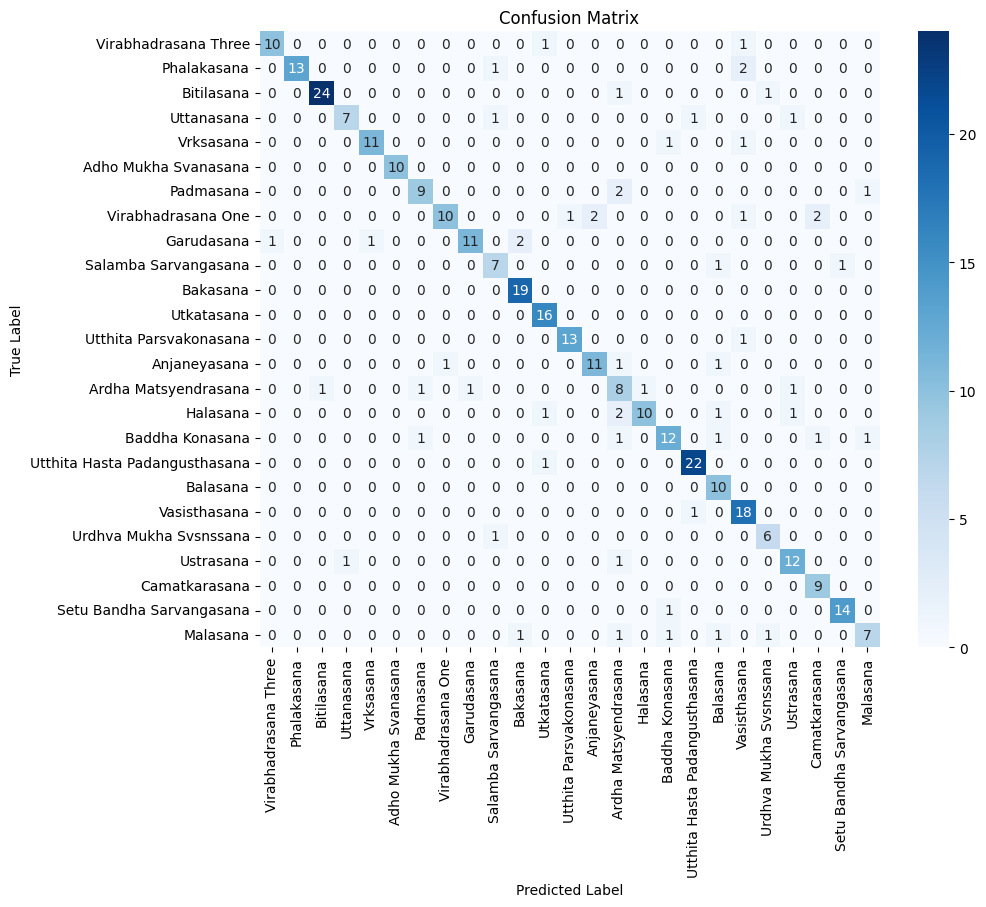

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import seaborn as sns

# Evaluate the model on validation set (test data)
val_loss, val_accuracy = model.evaluate(X_val, Y_val, verbose=1)
print(f'Validation Loss: {val_loss}')
print(f'Validation Accuracy: {val_accuracy * 100:.2f}%')

# Predict on the validation data
Y_pred = model.predict(X_val)

# Convert predictions and true labels from one-hot encoding to labels
Y_pred_labels = np.argmax(Y_pred, axis=1)
Y_true_labels = np.argmax(Y_val, axis=1)

# Calculate accuracy
accuracy = accuracy_score(Y_true_labels, Y_pred_labels)
print(f'Accuracy: {accuracy * 100:.2f}%')

# Classification Report
print("Classification Report:")
# print(classification_report(Y_true_labels, Y_pred_labels, target_names=asanas_name))

# Confusion Matrix
conf_matrix = confusion_matrix(Y_true_labels, Y_pred_labels)

# Plotting the confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=asanas_name, yticklabels=asanas_name)
plt.title('Confusion Matrix')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()
